In [ ]:
!pip install tqdm gdown

In [ ]:
import os
import cv2 as cv
import torch
import numpy as np
from typing import List
from matplotlib import pyplot as plt
import gdown
from tqdm import tqdm


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
def load_video(path: str) -> torch.Tensor:
    cap = cv.VideoCapture(path)

    if not cap.isOpened():
        raise ValueError(f"Error: Could not open video file at {path}")

    frames = []
    total_frames = int(cap.get(cv.CAP_PROP_FRAME_COUNT))

    print(f"Attempting to read {total_frames} frames from {path}")

    for frame_idx in range(total_frames):
        ret, frame = cap.read()
        if not ret:
            print(f"Failed to read frame {frame_idx}")
            break

        gray_frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
        cropped_frame = gray_frame[190:236, 80:220]
        frames.append(torch.from_numpy(cropped_frame).float())

    cap.release()

    if not frames:
        raise ValueError(f"No frames were successfully read from {path}")

    frames_tensor = torch.stack(frames)

    mean = torch.mean(frames_tensor)
    std = torch.std(frames_tensor)
    normalized_frames = (frames_tensor - mean) / std

    return normalized_frames

In [ ]:
def load_alignments(path: str) -> torch.Tensor:
    """
    Load alignment file and convert to tensor

    Args:
        path (str): Path to alignment file

    Returns:
        torch.Tensor: Encoded character alignments
    """
    with open(path, 'r') as f:
        lines = f.readlines()

    tokens = []
    for line in lines:
        line = line.split()
        if line[2] != 'sil':
            tokens.extend([' ', line[2]])

    if tokens and tokens[0] == ' ':
        tokens = tokens[1:]

    encoded_tokens = char_to_num(list(''.join(tokens)))

    return encoded_tokens

In [ ]:
vocab = list("abcdefghijklmnopqrstuvwxyz'?!123456789 ")


class CharToNumMapper:
    def __init__(self, vocabulary):
        self.vocabulary = [''] + vocabulary 
        self.char_to_num = {char: idx+1 for idx, char in enumerate(vocabulary)}
        self.num_to_char = {idx+1: char for idx, char in enumerate(vocabulary)}

    def __call__(self, chars):
        """Convert characters to numbers"""
        return torch.tensor([self.char_to_num.get(char, 0) for char in chars])

    def inverse(self, nums):
        """Convert numbers back to characters"""
        return [self.num_to_char.get(num.item(), '') for num in nums]

    def get_vocabulary(self):
        """Return the vocabulary"""
        return self.vocabulary

    def vocabulary_size(self):
        """Return the vocabulary size"""
        return len(self.vocabulary)


char_to_num = CharToNumMapper(vocab)
num_to_char = char_to_num 


print(
    f"The vocabulary is: {char_to_num.get_vocabulary()} "
    f"(size = {char_to_num.vocabulary_size()})"
)

example_chars = "hello"
numbers = char_to_num(example_chars)
print("Characters to numbers:", numbers)

back_to_chars = num_to_char.inverse(numbers)
print("Numbers back to characters:", back_to_chars)

The vocabulary is: ['', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z', "'", '?', '!', '1', '2', '3', '4', '5', '6', '7', '8', '9', ' '] (size = 40)
Characters to numbers: tensor([ 8,  5, 12, 12, 15])
Numbers back to characters: ['h', 'e', 'l', 'l', 'o']


In [ ]:
def load_data(path: str):
    """
    Load video and alignments from a given path

    Args:
        path (str or torch.Tensor): Path to video file

    Returns:
        Tuple of video frames and alignments
    """
    if isinstance(path, torch.Tensor):
        path = ''.join(chr(x) for x in path.numpy())

    file_name = os.path.splitext(os.path.basename(path))[0]

    video_path = os.path.join('data', 's1', f'{file_name}.mpg')
    alignment_path = os.path.join('data', 'alignments', 's1', f'{file_name}.align')

    frames = load_video(video_path)
    alignments = load_alignments(alignment_path)

    return frames, alignments

Attempting to read 75 frames from data/s1/bbal6n.mpg


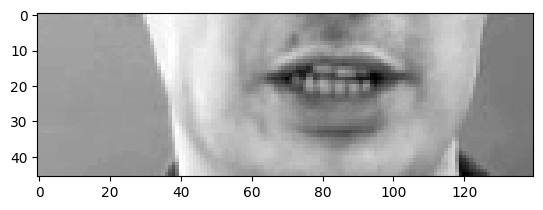

Alignments: tensor([ 2,  9, 14, 39,  2, 12, 21,  5, 39,  1, 20, 39, 12, 39, 19,  9, 24, 39,
        14, 15, 23])
Decoded alignments: bin blue at l six now


In [ ]:
test_path = os.path.join('data', 's1', 'bbal6n.mpg')
test_tensor = torch.tensor(list(test_path.encode('utf-8')))

frames, alignments = load_data(test_tensor)

plt.imshow(frames[40].numpy(), cmap='gray')
plt.show()

print("Alignments:", alignments)
print("Decoded alignments:", ''.join(char_to_num.inverse(alignments)))

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpgAttempting to read 75 frames from data/s1/bgwb5s.mpg

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg
Batch frames shape: torch.Size([2, 75, 46, 140])
Batch alignments shape: torch.Size([2, 25])
Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attemp

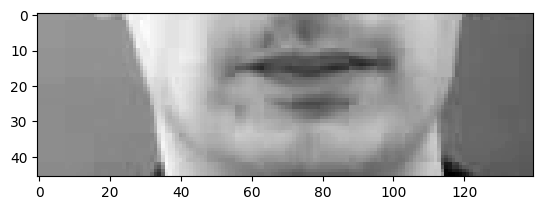

Alignments: tensor([16, 12,  1,  3,  5, 39, 18,  5,  4, 39, 23,  9, 20,  8, 39, 11, 39, 26,
         5, 18, 15, 39, 16, 12,  5,  1, 19,  5])
Decoded alignments: place red with k zero please


In [ ]:
from torch.utils.data import Dataset, DataLoader
import glob
import random

class LipReadingDataset(Dataset):
    def __init__(self, root_dir='./data/s1', transform=None):
        """
        Args:
            root_dir (str): Directory with all the video files
            transform (callable, optional): Optional transform to be applied on a sample
        """
        self.video_paths = glob.glob(os.path.join(root_dir, '*.mpg'))
        self.transform = transform
        random.shuffle(self.video_paths) 

    def __len__(self):
        return len(self.video_paths)

    def __getitem__(self, idx):
        video_path = self.video_paths[idx]
        frames, alignments = load_data(video_path)  
        if self.transform:
            frames = self.transform(frames)

        return frames, alignments

def collate_fn(batch):
    batch.sort(key=lambda x: x[0].shape[0], reverse=True)

    frames, alignments = zip(*batch)

    lengths = [f.shape[0] for f in frames]
    max_len = max(lengths)

    padded_frames = torch.zeros(len(frames), max_len, frames[0].shape[1], frames[0].shape[2])
    for i, f in enumerate(frames):
        padded_frames[i, :f.shape[0]] = f

    max_align_len = max(len(a) for a in alignments)
    padded_alignments = torch.zeros(len(alignments), max_align_len, dtype=torch.long)
    for i, a in enumerate(alignments):
        padded_alignments[i, :len(a)] = a

    return padded_frames, padded_alignments

def create_data_loaders(batch_size=2, train_split=0.9,num_workers=0):
    
    dataset = LipReadingDataset()

    train_size = int(train_split * len(dataset))
    test_size = len(dataset) - train_size

    train_dataset, test_dataset = torch.utils.data.random_split(
        dataset, [train_size, test_size]
    )

    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        collate_fn=collate_fn,
        num_workers=2,
        pin_memory=True if torch.cuda.is_available() else False
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        collate_fn=collate_fn,
        num_workers=2,
        pin_memory=True if torch.cuda.is_available() else False
    )

    return train_loader, test_loader

train_loader, test_loader = create_data_loaders(batch_size=2)

for frames, alignments in train_loader:
    print(f"Batch frames shape: {frames.shape}")
    print(f"Batch alignments shape: {alignments.shape}")
    break 

frames, alignments = next(iter(train_loader))
plt.imshow(frames[0][0].numpy(), cmap='gray')
plt.show()
print("Alignments:", alignments[0])
print("Decoded alignments:", ''.join(char_to_num.inverse(alignments[0])))

In [ ]:
import torch
import torch.nn as nn

class LipReadingModel(nn.Module):
    def __init__(self, vocab_size):
        super(LipReadingModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv3d(1, 128, kernel_size=3, padding='same'),
            nn.ReLU(),
            nn.MaxPool3d((1,2,2))
        )

        self.conv2 = nn.Sequential(
            nn.Conv3d(128, 256, kernel_size=3, padding='same'),
            nn.ReLU(),
            nn.MaxPool3d((1,2,2))
        )

        self.conv3 = nn.Sequential(
            nn.Conv3d(256, 75, kernel_size=3, padding='same'),
            nn.ReLU(),
            nn.MaxPool3d((1,2,2))
        )

        self.flatten_size = 75 * 5 * 17  
        
        self.lstm1 = nn.LSTM(
            input_size=self.flatten_size,
            hidden_size=128,
            bidirectional=True,
            batch_first=True
        )

        self.dropout1 = nn.Dropout(0.5)

        self.lstm2 = nn.LSTM(
            input_size=256, 
            hidden_size=128,
            bidirectional=True,
            batch_first=True
        )

        self.dropout2 = nn.Dropout(0.5)

        self.dense = nn.Linear(256, vocab_size + 1) 
        self.softmax = nn.LogSoftmax(dim=-1)

        self._initialize_weights()

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv3d) or isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

            elif isinstance(m, nn.LSTM):
                for name, param in m.named_parameters():
                    if 'weight' in name:
                        nn.init.orthogonal_(param)

    def forward(self, x):
        
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)

        batch_size, channels, time_steps, height, width = x.size()
        x = x.permute(0, 2, 1, 3, 4)  
        x = x.reshape(batch_size, time_steps, -1) 

        x, _ = self.lstm1(x)
        x = self.dropout1(x)

        x, _ = self.lstm2(x)
        x = self.dropout2(x)

        x = self.dense(x)
        x = self.softmax(x)

        return x

model = LipReadingModel(vocab_size=char_to_num.vocabulary_size()).to(device)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'Number of trainable parameters: {count_parameters(model):,}')

batch_size = 2
dummy_input = torch.randn(batch_size, 1, 75, 46, 140).to(device)
output = model(dummy_input)
print(f'Output shape: {output.shape}')  

criterion = nn.CTCLoss(blank=0, reduction='mean', zero_infinity=True)
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.1, patience=5, verbose=True
)

Number of trainable parameters: 8,473,972
Output shape: torch.Size([2, 75, 41])


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 1/50:   0%|          | 1/450 [00:01<11:39,  1.56s/it, Train Loss=7.9258, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 1/50:   0%|          | 2/450 [00:02<07:14,  1.03it/s, Train Loss=6.8068, LR=0.000100]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 1/50:   1%|          | 3/450 [00:02<05:49,  1.28it/s, Train Loss=4.8999, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 1/50:   1%|          | 4/450 [00:03<05:10,  1.44it/s, Train Loss=3.9528, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 1/50:   1%|          | 5/450 [00:03<04:48,  1.54it/s, Train Loss=3.7737, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 1/50:   1%|▏         | 6/450 [00:04<04:34,  1.62it/s, Train Loss=3.7103, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 1/50:   2%|▏         | 7/450 [00:04<04:25,  1.67it/s, Train Loss=3.6230, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 1/50:   2%|▏         | 8/450 [00:05<04:19,  1.71it/s, Train Loss=3.3794, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 1/50:   2%|▏         | 9/450 [00:06<04:14,  1.73it/s, Train Loss=3.2828, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 1/50:   2%|▏         | 10/450 [00:06<04:11,  1.75it/s, Train Loss=3.3193, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 1/50:   2%|▏         | 11/450 [00:07<04:09,  1.76it/s, Train Loss=3.3187, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 1/50:   3%|▎         | 12/450 [00:07<04:07,  1.77it/s, Train Loss=3.2820, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 1/50:   3%|▎         | 13/450 [00:08<04:06,  1.77it/s, Train Loss=3.0605, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 1/50:   3%|▎         | 14/450 [00:08<04:05,  1.77it/s, Train Loss=2.9995, LR=0.000100]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 1/50:   3%|▎         | 15/450 [00:09<04:05,  1.77it/s, Train Loss=3.0323, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 1/50:   4%|▎         | 16/450 [00:09<04:03,  1.78it/s, Train Loss=3.0894, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 1/50:   4%|▍         | 17/450 [00:10<04:02,  1.78it/s, Train Loss=3.1484, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 1/50:   4%|▍         | 18/450 [00:11<04:01,  1.79it/s, Train Loss=3.3374, LR=0.000100]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 1/50:   4%|▍         | 19/450 [00:11<04:00,  1.79it/s, Train Loss=3.1636, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 1/50:   4%|▍         | 20/450 [00:12<04:00,  1.79it/s, Train Loss=3.3208, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 1/50:   5%|▍         | 21/450 [00:12<03:59,  1.79it/s, Train Loss=3.1058, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 1/50:   5%|▍         | 22/450 [00:13<03:58,  1.79it/s, Train Loss=3.1279, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 1/50:   5%|▌         | 23/450 [00:13<03:58,  1.79it/s, Train Loss=3.0636, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 1/50:   5%|▌         | 24/450 [00:14<03:58,  1.79it/s, Train Loss=3.1744, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 1/50:   6%|▌         | 25/450 [00:14<03:57,  1.79it/s, Train Loss=3.1172, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 1/50:   6%|▌         | 26/450 [00:15<03:57,  1.79it/s, Train Loss=2.9852, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 1/50:   6%|▌         | 27/450 [00:16<03:57,  1.78it/s, Train Loss=3.1291, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 1/50:   6%|▌         | 28/450 [00:16<03:58,  1.77it/s, Train Loss=3.0537, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 1/50:   6%|▋         | 29/450 [00:17<03:58,  1.76it/s, Train Loss=2.9507, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 1/50:   7%|▋         | 30/450 [00:17<03:58,  1.76it/s, Train Loss=3.0129, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 1/50:   7%|▋         | 31/450 [00:18<03:58,  1.76it/s, Train Loss=3.0213, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 1/50:   7%|▋         | 32/450 [00:18<03:56,  1.77it/s, Train Loss=2.9237, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 1/50:   7%|▋         | 33/450 [00:19<03:55,  1.77it/s, Train Loss=3.0671, LR=0.000100]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 1/50:   8%|▊         | 34/450 [00:20<03:54,  1.77it/s, Train Loss=3.0613, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 1/50:   8%|▊         | 35/450 [00:20<03:53,  1.78it/s, Train Loss=2.9437, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 1/50:   8%|▊         | 36/450 [00:21<03:52,  1.78it/s, Train Loss=2.7785, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 1/50:   8%|▊         | 37/450 [00:21<03:52,  1.78it/s, Train Loss=2.8912, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 1/50:   8%|▊         | 38/450 [00:22<03:51,  1.78it/s, Train Loss=2.7941, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 1/50:   9%|▊         | 39/450 [00:22<03:50,  1.78it/s, Train Loss=3.1213, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 1/50:   9%|▉         | 40/450 [00:23<03:50,  1.78it/s, Train Loss=2.8706, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 1/50:   9%|▉         | 41/450 [00:24<03:50,  1.78it/s, Train Loss=2.8709, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 1/50:   9%|▉         | 42/450 [00:24<03:49,  1.78it/s, Train Loss=2.8968, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 1/50:  10%|▉         | 43/450 [00:25<03:49,  1.77it/s, Train Loss=2.9861, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 1/50:  10%|▉         | 44/450 [00:25<03:49,  1.77it/s, Train Loss=3.0342, LR=0.000100]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 1/50:  10%|█         | 45/450 [00:26<03:49,  1.77it/s, Train Loss=3.0160, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 1/50:  10%|█         | 46/450 [00:26<03:49,  1.76it/s, Train Loss=2.9436, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 1/50:  10%|█         | 47/450 [00:27<03:45,  1.79it/s, Train Loss=2.9480, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 1/50:  11%|█         | 48/450 [00:27<03:45,  1.78it/s, Train Loss=2.8598, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 1/50:  11%|█         | 49/450 [00:28<03:46,  1.77it/s, Train Loss=2.9469, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 1/50:  11%|█         | 50/450 [00:29<03:47,  1.76it/s, Train Loss=2.9512, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 1/50:  11%|█▏        | 51/450 [00:29<03:46,  1.76it/s, Train Loss=3.0417, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 1/50:  12%|█▏        | 52/450 [00:30<03:46,  1.76it/s, Train Loss=3.0574, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 1/50:  12%|█▏        | 53/450 [00:30<03:46,  1.75it/s, Train Loss=2.9569, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 1/50:  12%|█▏        | 54/450 [00:31<03:45,  1.75it/s, Train Loss=2.9054, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 1/50:  12%|█▏        | 55/450 [00:31<03:45,  1.75it/s, Train Loss=2.9975, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 1/50:  12%|█▏        | 56/450 [00:32<03:44,  1.75it/s, Train Loss=2.8762, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 1/50:  13%|█▎        | 57/450 [00:33<03:43,  1.76it/s, Train Loss=2.9468, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 1/50:  13%|█▎        | 58/450 [00:33<03:43,  1.75it/s, Train Loss=2.9246, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 1/50:  13%|█▎        | 59/450 [00:34<03:42,  1.76it/s, Train Loss=3.0354, LR=0.000100]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 1/50:  13%|█▎        | 60/450 [00:34<03:41,  1.76it/s, Train Loss=2.8454, LR=0.000100]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 1/50:  14%|█▎        | 61/450 [00:35<03:41,  1.76it/s, Train Loss=2.9725, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 1/50:  14%|█▍        | 62/450 [00:35<03:40,  1.76it/s, Train Loss=2.8981, LR=0.000100]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 1/50:  14%|█▍        | 63/450 [00:36<03:39,  1.76it/s, Train Loss=2.9390, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 1/50:  14%|█▍        | 64/450 [00:37<03:38,  1.77it/s, Train Loss=2.7810, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 1/50:  14%|█▍        | 65/450 [00:37<03:38,  1.76it/s, Train Loss=2.9879, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 1/50:  15%|█▍        | 66/450 [00:38<03:37,  1.76it/s, Train Loss=2.7882, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 1/50:  15%|█▍        | 67/450 [00:38<03:37,  1.76it/s, Train Loss=2.9254, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 1/50:  15%|█▌        | 68/450 [00:39<03:36,  1.76it/s, Train Loss=3.0431, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 1/50:  15%|█▌        | 69/450 [00:39<03:36,  1.76it/s, Train Loss=2.9613, LR=0.000100]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 1/50:  16%|█▌        | 70/450 [00:40<03:36,  1.76it/s, Train Loss=2.8437, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 1/50:  16%|█▌        | 71/450 [00:41<03:36,  1.75it/s, Train Loss=2.9227, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 1/50:  16%|█▌        | 72/450 [00:41<03:35,  1.75it/s, Train Loss=2.8492, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 1/50:  16%|█▌        | 73/450 [00:42<03:35,  1.75it/s, Train Loss=2.7774, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 1/50:  16%|█▋        | 74/450 [00:42<03:34,  1.75it/s, Train Loss=3.0003, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 1/50:  17%|█▋        | 75/450 [00:43<03:36,  1.74it/s, Train Loss=2.7873, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 1/50:  17%|█▋        | 76/450 [00:43<03:35,  1.73it/s, Train Loss=2.9813, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 1/50:  17%|█▋        | 77/450 [00:44<03:35,  1.73it/s, Train Loss=2.9218, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 1/50:  17%|█▋        | 78/450 [00:45<03:35,  1.73it/s, Train Loss=2.9339, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 1/50:  18%|█▊        | 79/450 [00:45<03:35,  1.72it/s, Train Loss=2.9797, LR=0.000100]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 1/50:  18%|█▊        | 80/450 [00:46<03:33,  1.73it/s, Train Loss=2.9338, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 1/50:  18%|█▊        | 81/450 [00:46<03:29,  1.76it/s, Train Loss=2.9114, LR=0.000100]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 1/50:  18%|█▊        | 82/450 [00:47<03:29,  1.75it/s, Train Loss=2.8657, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 1/50:  18%|█▊        | 83/450 [00:47<03:29,  1.75it/s, Train Loss=2.8009, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 1/50:  19%|█▊        | 84/450 [00:48<03:28,  1.75it/s, Train Loss=2.7978, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 1/50:  19%|█▉        | 85/450 [00:49<03:28,  1.75it/s, Train Loss=2.7836, LR=0.000100]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 1/50:  19%|█▉        | 86/450 [00:49<03:27,  1.75it/s, Train Loss=2.7934, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 1/50:  19%|█▉        | 87/450 [00:50<03:27,  1.75it/s, Train Loss=2.9319, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 1/50:  20%|█▉        | 88/450 [00:50<03:26,  1.75it/s, Train Loss=2.9080, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 1/50:  20%|█▉        | 89/450 [00:51<03:26,  1.75it/s, Train Loss=2.7807, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 1/50:  20%|██        | 90/450 [00:51<03:26,  1.74it/s, Train Loss=3.1810, LR=0.000100]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 1/50:  20%|██        | 91/450 [00:52<03:25,  1.75it/s, Train Loss=2.9456, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 1/50:  20%|██        | 92/450 [00:53<03:25,  1.74it/s, Train Loss=2.9442, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 1/50:  21%|██        | 93/450 [00:53<03:24,  1.74it/s, Train Loss=2.8869, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 1/50:  21%|██        | 94/450 [00:54<03:25,  1.74it/s, Train Loss=2.8283, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 1/50:  21%|██        | 95/450 [00:54<03:24,  1.74it/s, Train Loss=2.9140, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 1/50:  21%|██▏       | 96/450 [00:55<03:23,  1.74it/s, Train Loss=2.9034, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 1/50:  22%|██▏       | 97/450 [00:55<03:22,  1.74it/s, Train Loss=2.8666, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 1/50:  22%|██▏       | 98/450 [00:56<03:22,  1.74it/s, Train Loss=3.0711, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 1/50:  22%|██▏       | 99/450 [00:57<03:22,  1.73it/s, Train Loss=2.7952, LR=0.000100]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 1/50:  22%|██▏       | 100/450 [00:57<03:23,  1.72it/s, Train Loss=2.9239, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 1/50:  22%|██▏       | 101/450 [00:58<03:22,  1.72it/s, Train Loss=3.0039, LR=0.000100]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 1/50:  23%|██▎       | 102/450 [00:58<03:22,  1.72it/s, Train Loss=2.7262, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 1/50:  23%|██▎       | 103/450 [00:59<03:21,  1.72it/s, Train Loss=2.8010, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 1/50:  23%|██▎       | 104/450 [01:00<03:22,  1.71it/s, Train Loss=2.7879, LR=0.000100]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 1/50:  23%|██▎       | 105/450 [01:00<03:20,  1.72it/s, Train Loss=2.7521, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 1/50:  24%|██▎       | 106/450 [01:01<03:19,  1.72it/s, Train Loss=2.8781, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 1/50:  24%|██▍       | 107/450 [01:01<03:19,  1.72it/s, Train Loss=2.8992, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 1/50:  24%|██▍       | 108/450 [01:02<03:19,  1.71it/s, Train Loss=2.9937, LR=0.000100]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 1/50:  24%|██▍       | 109/450 [01:02<03:18,  1.72it/s, Train Loss=2.9037, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 1/50:  24%|██▍       | 110/450 [01:03<03:17,  1.72it/s, Train Loss=2.9722, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 1/50:  25%|██▍       | 111/450 [01:04<03:17,  1.72it/s, Train Loss=2.9503, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 1/50:  25%|██▍       | 112/450 [01:04<03:16,  1.72it/s, Train Loss=2.9802, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 1/50:  25%|██▌       | 113/450 [01:05<03:16,  1.72it/s, Train Loss=2.8225, LR=0.000100]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 1/50:  25%|██▌       | 114/450 [01:05<03:15,  1.72it/s, Train Loss=2.8679, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 1/50:  26%|██▌       | 115/450 [01:06<03:14,  1.72it/s, Train Loss=2.7360, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 1/50:  26%|██▌       | 116/450 [01:07<03:14,  1.72it/s, Train Loss=2.7451, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 1/50:  26%|██▌       | 117/450 [01:07<03:13,  1.72it/s, Train Loss=2.8519, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 1/50:  26%|██▌       | 118/450 [01:08<03:12,  1.72it/s, Train Loss=2.8711, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 1/50:  26%|██▋       | 119/450 [01:08<03:12,  1.72it/s, Train Loss=2.7939, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 1/50:  27%|██▋       | 120/450 [01:09<03:11,  1.72it/s, Train Loss=2.8463, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 1/50:  27%|██▋       | 121/450 [01:09<03:11,  1.72it/s, Train Loss=2.8578, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 1/50:  27%|██▋       | 122/450 [01:10<03:10,  1.72it/s, Train Loss=2.6887, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 1/50:  27%|██▋       | 123/450 [01:11<03:11,  1.71it/s, Train Loss=2.9964, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 1/50:  28%|██▊       | 124/450 [01:11<03:10,  1.71it/s, Train Loss=2.7375, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 1/50:  28%|██▊       | 125/450 [01:12<03:10,  1.71it/s, Train Loss=2.7050, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 1/50:  28%|██▊       | 126/450 [01:12<03:09,  1.71it/s, Train Loss=2.9584, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 1/50:  28%|██▊       | 127/450 [01:13<03:09,  1.71it/s, Train Loss=2.7332, LR=0.000100]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg



Epoch 1/50:  28%|██▊       | 128/450 [01:14<03:08,  1.71it/s, Train Loss=2.6777, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 1/50:  29%|██▊       | 129/450 [01:14<03:07,  1.71it/s, Train Loss=3.0829, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 1/50:  29%|██▉       | 130/450 [01:15<03:08,  1.70it/s, Train Loss=3.0106, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 1/50:  29%|██▉       | 131/450 [01:15<03:07,  1.70it/s, Train Loss=2.7601, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 1/50:  29%|██▉       | 132/450 [01:16<03:07,  1.70it/s, Train Loss=3.0466, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 1/50:  30%|██▉       | 133/450 [01:16<03:06,  1.70it/s, Train Loss=2.9271, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 1/50:  30%|██▉       | 134/450 [01:17<03:05,  1.70it/s, Train Loss=2.8421, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 1/50:  30%|███       | 135/450 [01:18<03:05,  1.70it/s, Train Loss=2.8581, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 1/50:  30%|███       | 136/450 [01:18<03:04,  1.70it/s, Train Loss=2.9562, LR=0.000100]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 1/50:  30%|███       | 137/450 [01:19<03:04,  1.70it/s, Train Loss=2.7820, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 1/50:  31%|███       | 138/450 [01:19<03:03,  1.70it/s, Train Loss=2.8304, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 1/50:  31%|███       | 139/450 [01:20<03:03,  1.70it/s, Train Loss=2.7593, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 1/50:  31%|███       | 140/450 [01:21<03:02,  1.70it/s, Train Loss=2.8611, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 1/50:  31%|███▏      | 141/450 [01:21<03:01,  1.70it/s, Train Loss=2.7735, LR=0.000100]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 1/50:  32%|███▏      | 142/450 [01:22<03:01,  1.70it/s, Train Loss=2.9285, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 1/50:  32%|███▏      | 143/450 [01:22<03:00,  1.70it/s, Train Loss=2.8427, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 1/50:  32%|███▏      | 144/450 [01:23<03:00,  1.70it/s, Train Loss=2.8623, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 1/50:  32%|███▏      | 145/450 [01:24<02:59,  1.70it/s, Train Loss=2.7438, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 1/50:  32%|███▏      | 146/450 [01:24<02:59,  1.70it/s, Train Loss=3.0245, LR=0.000100]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 1/50:  33%|███▎      | 147/450 [01:25<02:59,  1.69it/s, Train Loss=2.8207, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 1/50:  33%|███▎      | 148/450 [01:25<02:59,  1.69it/s, Train Loss=2.8328, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 1/50:  33%|███▎      | 149/450 [01:26<02:58,  1.69it/s, Train Loss=2.7802, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 1/50:  33%|███▎      | 150/450 [01:27<02:57,  1.69it/s, Train Loss=2.7510, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 1/50:  34%|███▎      | 151/450 [01:27<02:57,  1.68it/s, Train Loss=2.7301, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 1/50:  34%|███▍      | 152/450 [01:28<02:57,  1.68it/s, Train Loss=2.7790, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 1/50:  34%|███▍      | 153/450 [01:28<02:57,  1.68it/s, Train Loss=2.7226, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 1/50:  34%|███▍      | 154/450 [01:29<02:56,  1.68it/s, Train Loss=2.8202, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr6p.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 1/50:  34%|███▍      | 155/450 [01:30<02:56,  1.67it/s, Train Loss=2.8800, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 1/50:  35%|███▍      | 156/450 [01:30<02:55,  1.67it/s, Train Loss=2.8476, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 1/50:  35%|███▍      | 157/450 [01:31<02:54,  1.68it/s, Train Loss=2.8386, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 1/50:  35%|███▌      | 158/450 [01:31<02:53,  1.68it/s, Train Loss=2.8219, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 1/50:  35%|███▌      | 159/450 [01:32<02:52,  1.69it/s, Train Loss=2.7583, LR=0.000100]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 1/50:  36%|███▌      | 160/450 [01:32<02:51,  1.69it/s, Train Loss=2.8460, LR=0.000100]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 1/50:  36%|███▌      | 161/450 [01:33<02:50,  1.69it/s, Train Loss=2.7727, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 1/50:  36%|███▌      | 162/450 [01:34<02:50,  1.69it/s, Train Loss=2.9321, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 1/50:  36%|███▌      | 163/450 [01:34<02:50,  1.68it/s, Train Loss=2.6077, LR=0.000100]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 1/50:  36%|███▋      | 164/450 [01:35<02:50,  1.68it/s, Train Loss=2.8246, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 1/50:  37%|███▋      | 165/450 [01:35<02:49,  1.68it/s, Train Loss=2.8731, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 1/50:  37%|███▋      | 166/450 [01:36<02:48,  1.68it/s, Train Loss=2.7469, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 1/50:  37%|███▋      | 167/450 [01:37<02:48,  1.68it/s, Train Loss=2.6564, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 1/50:  37%|███▋      | 168/450 [01:37<02:47,  1.68it/s, Train Loss=2.6337, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 1/50:  38%|███▊      | 169/450 [01:38<02:47,  1.68it/s, Train Loss=2.6659, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 1/50:  38%|███▊      | 170/450 [01:38<02:46,  1.68it/s, Train Loss=2.8296, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 1/50:  38%|███▊      | 171/450 [01:39<02:46,  1.68it/s, Train Loss=2.7160, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 1/50:  38%|███▊      | 172/450 [01:40<02:45,  1.68it/s, Train Loss=2.7057, LR=0.000100]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 1/50:  38%|███▊      | 173/450 [01:40<02:44,  1.68it/s, Train Loss=2.8039, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 1/50:  39%|███▊      | 174/450 [01:41<02:44,  1.68it/s, Train Loss=2.8709, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 1/50:  39%|███▉      | 175/450 [01:41<02:44,  1.67it/s, Train Loss=2.6118, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 1/50:  39%|███▉      | 176/450 [01:42<02:44,  1.67it/s, Train Loss=2.5879, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 1/50:  39%|███▉      | 177/450 [01:43<02:43,  1.67it/s, Train Loss=2.8008, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 1/50:  40%|███▉      | 178/450 [01:43<02:43,  1.67it/s, Train Loss=2.8906, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 1/50:  40%|███▉      | 179/450 [01:44<02:42,  1.67it/s, Train Loss=2.7019, LR=0.000100]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 1/50:  40%|████      | 180/450 [01:44<02:41,  1.67it/s, Train Loss=2.6801, LR=0.000100]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 1/50:  40%|████      | 181/450 [01:45<02:38,  1.69it/s, Train Loss=2.7849, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 1/50:  40%|████      | 182/450 [01:46<02:39,  1.68it/s, Train Loss=2.8072, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 1/50:  41%|████      | 183/450 [01:46<02:38,  1.68it/s, Train Loss=2.7175, LR=0.000100]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 1/50:  41%|████      | 184/450 [01:47<02:38,  1.68it/s, Train Loss=2.8627, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 1/50:  41%|████      | 185/450 [01:47<02:37,  1.68it/s, Train Loss=2.7058, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 1/50:  41%|████▏     | 186/450 [01:48<02:37,  1.68it/s, Train Loss=2.7275, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 1/50:  42%|████▏     | 187/450 [01:49<02:36,  1.68it/s, Train Loss=2.9081, LR=0.000100]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 1/50:  42%|████▏     | 188/450 [01:49<02:36,  1.68it/s, Train Loss=2.7383, LR=0.000100]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 1/50:  42%|████▏     | 189/450 [01:50<02:35,  1.67it/s, Train Loss=2.8532, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 1/50:  42%|████▏     | 190/450 [01:50<02:35,  1.67it/s, Train Loss=2.7416, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 1/50:  42%|████▏     | 191/450 [01:51<02:34,  1.68it/s, Train Loss=2.8313, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 1/50:  43%|████▎     | 192/450 [01:52<02:33,  1.68it/s, Train Loss=2.7368, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 1/50:  43%|████▎     | 193/450 [01:52<02:33,  1.67it/s, Train Loss=2.8364, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 1/50:  43%|████▎     | 194/450 [01:53<02:33,  1.67it/s, Train Loss=2.4783, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 1/50:  43%|████▎     | 195/450 [01:53<02:32,  1.67it/s, Train Loss=2.7921, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 1/50:  44%|████▎     | 196/450 [01:54<02:31,  1.67it/s, Train Loss=2.8284, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 1/50:  44%|████▍     | 197/450 [01:55<02:30,  1.68it/s, Train Loss=2.7066, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 1/50:  44%|████▍     | 198/450 [01:55<02:30,  1.68it/s, Train Loss=2.5767, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 1/50:  44%|████▍     | 199/450 [01:56<02:29,  1.67it/s, Train Loss=2.7280, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 1/50:  44%|████▍     | 200/450 [01:56<02:27,  1.69it/s, Train Loss=2.8509, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 1/50:  45%|████▍     | 201/450 [01:57<02:27,  1.68it/s, Train Loss=2.7100, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 1/50:  45%|████▍     | 202/450 [01:58<02:27,  1.68it/s, Train Loss=2.6367, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 1/50:  45%|████▌     | 203/450 [01:58<02:27,  1.68it/s, Train Loss=2.6343, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 1/50:  45%|████▌     | 204/450 [01:59<02:26,  1.68it/s, Train Loss=2.6695, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 1/50:  46%|████▌     | 205/450 [01:59<02:26,  1.67it/s, Train Loss=2.9716, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 1/50:  46%|████▌     | 206/450 [02:00<02:26,  1.67it/s, Train Loss=2.5139, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 1/50:  46%|████▌     | 207/450 [02:00<02:25,  1.67it/s, Train Loss=2.7541, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 1/50:  46%|████▌     | 208/450 [02:01<02:25,  1.67it/s, Train Loss=2.8067, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 1/50:  46%|████▋     | 209/450 [02:02<02:24,  1.67it/s, Train Loss=2.5952, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 1/50:  47%|████▋     | 210/450 [02:02<02:23,  1.67it/s, Train Loss=2.5930, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 1/50:  47%|████▋     | 211/450 [02:03<02:22,  1.67it/s, Train Loss=2.9195, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 1/50:  47%|████▋     | 212/450 [02:03<02:22,  1.67it/s, Train Loss=2.5940, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 1/50:  47%|████▋     | 213/450 [02:04<02:21,  1.67it/s, Train Loss=2.6288, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 1/50:  48%|████▊     | 214/450 [02:05<02:20,  1.68it/s, Train Loss=2.7683, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 1/50:  48%|████▊     | 215/450 [02:05<02:19,  1.68it/s, Train Loss=2.6785, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 1/50:  48%|████▊     | 216/450 [02:06<02:19,  1.68it/s, Train Loss=2.8299, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 1/50:  48%|████▊     | 217/450 [02:06<02:18,  1.68it/s, Train Loss=2.7972, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 1/50:  48%|████▊     | 218/450 [02:07<02:17,  1.68it/s, Train Loss=2.6147, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 1/50:  49%|████▊     | 219/450 [02:08<02:17,  1.68it/s, Train Loss=2.8136, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 1/50:  49%|████▉     | 220/450 [02:08<02:16,  1.68it/s, Train Loss=2.9023, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 1/50:  49%|████▉     | 221/450 [02:09<02:15,  1.69it/s, Train Loss=2.6653, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 1/50:  49%|████▉     | 222/450 [02:09<02:15,  1.69it/s, Train Loss=2.7911, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 1/50:  50%|████▉     | 223/450 [02:10<02:14,  1.69it/s, Train Loss=2.8216, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 1/50:  50%|████▉     | 224/450 [02:11<02:14,  1.68it/s, Train Loss=2.5473, LR=0.000100]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 1/50:  50%|█████     | 225/450 [02:11<02:13,  1.68it/s, Train Loss=2.8181, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 1/50:  50%|█████     | 226/450 [02:12<02:13,  1.68it/s, Train Loss=2.9625, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 1/50:  50%|█████     | 227/450 [02:12<02:12,  1.68it/s, Train Loss=2.7070, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 1/50:  51%|█████     | 228/450 [02:13<02:13,  1.67it/s, Train Loss=2.5843, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 1/50:  51%|█████     | 229/450 [02:14<02:12,  1.66it/s, Train Loss=2.6917, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 1/50:  51%|█████     | 230/450 [02:14<02:12,  1.66it/s, Train Loss=2.7508, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 1/50:  51%|█████▏    | 231/450 [02:15<02:12,  1.66it/s, Train Loss=2.6544, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 1/50:  52%|█████▏    | 232/450 [02:15<02:11,  1.65it/s, Train Loss=2.5264, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 1/50:  52%|█████▏    | 233/450 [02:16<02:11,  1.65it/s, Train Loss=2.8174, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 1/50:  52%|█████▏    | 234/450 [02:17<02:10,  1.66it/s, Train Loss=2.7488, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 1/50:  52%|█████▏    | 235/450 [02:17<02:09,  1.67it/s, Train Loss=2.5832, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 1/50:  52%|█████▏    | 236/450 [02:18<02:08,  1.67it/s, Train Loss=2.6364, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 1/50:  53%|█████▎    | 237/450 [02:18<02:07,  1.67it/s, Train Loss=2.6809, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 1/50:  53%|█████▎    | 238/450 [02:19<02:06,  1.68it/s, Train Loss=2.6233, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 1/50:  53%|█████▎    | 239/450 [02:20<02:05,  1.68it/s, Train Loss=2.6917, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 1/50:  53%|█████▎    | 240/450 [02:20<02:05,  1.68it/s, Train Loss=2.7046, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 1/50:  54%|█████▎    | 241/450 [02:21<02:04,  1.68it/s, Train Loss=2.7255, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 1/50:  54%|█████▍    | 242/450 [02:21<02:03,  1.69it/s, Train Loss=2.7911, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 1/50:  54%|█████▍    | 243/450 [02:22<02:03,  1.68it/s, Train Loss=2.5761, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 1/50:  54%|█████▍    | 244/450 [02:23<02:02,  1.69it/s, Train Loss=2.5987, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 1/50:  54%|█████▍    | 245/450 [02:23<02:01,  1.69it/s, Train Loss=2.7676, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 1/50:  55%|█████▍    | 246/450 [02:24<02:00,  1.69it/s, Train Loss=2.7097, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 1/50:  55%|█████▍    | 247/450 [02:24<01:59,  1.69it/s, Train Loss=2.6914, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 1/50:  55%|█████▌    | 248/450 [02:25<01:59,  1.69it/s, Train Loss=2.7234, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 1/50:  55%|█████▌    | 249/450 [02:26<01:59,  1.68it/s, Train Loss=2.8281, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 1/50:  56%|█████▌    | 250/450 [02:26<01:58,  1.69it/s, Train Loss=2.6711, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 1/50:  56%|█████▌    | 251/450 [02:27<01:57,  1.69it/s, Train Loss=2.8462, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 1/50:  56%|█████▌    | 252/450 [02:27<01:57,  1.68it/s, Train Loss=2.5345, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 1/50:  56%|█████▌    | 253/450 [02:28<01:57,  1.68it/s, Train Loss=2.6830, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 1/50:  56%|█████▋    | 254/450 [02:28<01:56,  1.69it/s, Train Loss=2.5739, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 1/50:  57%|█████▋    | 255/450 [02:29<01:55,  1.68it/s, Train Loss=2.8559, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 1/50:  57%|█████▋    | 256/450 [02:30<01:55,  1.68it/s, Train Loss=2.8208, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 1/50:  57%|█████▋    | 257/450 [02:30<01:55,  1.67it/s, Train Loss=2.8672, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 1/50:  57%|█████▋    | 258/450 [02:31<01:55,  1.67it/s, Train Loss=2.6681, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 1/50:  58%|█████▊    | 259/450 [02:31<01:54,  1.67it/s, Train Loss=2.7107, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 1/50:  58%|█████▊    | 260/450 [02:32<01:53,  1.68it/s, Train Loss=2.7813, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 1/50:  58%|█████▊    | 261/450 [02:33<01:51,  1.69it/s, Train Loss=2.5305, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 1/50:  58%|█████▊    | 262/450 [02:33<01:51,  1.69it/s, Train Loss=2.7086, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 1/50:  58%|█████▊    | 263/450 [02:34<01:50,  1.69it/s, Train Loss=2.7309, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 1/50:  59%|█████▊    | 264/450 [02:34<01:50,  1.68it/s, Train Loss=2.7796, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 1/50:  59%|█████▉    | 265/450 [02:35<01:50,  1.68it/s, Train Loss=2.6966, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 1/50:  59%|█████▉    | 266/450 [02:36<01:49,  1.69it/s, Train Loss=2.7073, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 1/50:  59%|█████▉    | 267/450 [02:36<01:48,  1.69it/s, Train Loss=2.9189, LR=0.000100]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 1/50:  60%|█████▉    | 268/450 [02:37<01:47,  1.69it/s, Train Loss=2.6949, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 1/50:  60%|█████▉    | 269/450 [02:37<01:46,  1.69it/s, Train Loss=2.6465, LR=0.000100]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 1/50:  60%|██████    | 270/450 [02:38<01:46,  1.69it/s, Train Loss=2.5276, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 1/50:  60%|██████    | 271/450 [02:39<01:45,  1.69it/s, Train Loss=2.5641, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 1/50:  60%|██████    | 272/450 [02:39<01:45,  1.69it/s, Train Loss=2.7254, LR=0.000100]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 1/50:  61%|██████    | 273/450 [02:40<01:44,  1.69it/s, Train Loss=2.7189, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 1/50:  61%|██████    | 274/450 [02:40<01:44,  1.69it/s, Train Loss=2.4917, LR=0.000100]

Attempting to read 75 frames from data/s1/praj1s.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 1/50:  61%|██████    | 275/450 [02:41<01:43,  1.69it/s, Train Loss=2.7272, LR=0.000100]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 1/50:  61%|██████▏   | 276/450 [02:42<01:42,  1.69it/s, Train Loss=2.6231, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 1/50:  62%|██████▏   | 277/450 [02:42<01:43,  1.68it/s, Train Loss=2.6067, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 1/50:  62%|██████▏   | 278/450 [02:43<01:42,  1.68it/s, Train Loss=2.7102, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 1/50:  62%|██████▏   | 279/450 [02:43<01:42,  1.67it/s, Train Loss=2.6106, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 1/50:  62%|██████▏   | 280/450 [02:44<01:41,  1.68it/s, Train Loss=2.5057, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 1/50:  62%|██████▏   | 281/450 [02:45<01:40,  1.68it/s, Train Loss=2.6321, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 1/50:  63%|██████▎   | 282/450 [02:45<01:40,  1.68it/s, Train Loss=2.6683, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 1/50:  63%|██████▎   | 283/450 [02:46<01:39,  1.68it/s, Train Loss=2.6303, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 1/50:  63%|██████▎   | 284/450 [02:46<01:38,  1.68it/s, Train Loss=2.7147, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 1/50:  63%|██████▎   | 285/450 [02:47<01:37,  1.69it/s, Train Loss=2.7800, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 1/50:  64%|██████▎   | 286/450 [02:48<01:37,  1.68it/s, Train Loss=2.7455, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 1/50:  64%|██████▍   | 287/450 [02:48<01:36,  1.68it/s, Train Loss=2.8002, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 1/50:  64%|██████▍   | 288/450 [02:49<01:35,  1.69it/s, Train Loss=2.7888, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 1/50:  64%|██████▍   | 289/450 [02:49<01:35,  1.69it/s, Train Loss=2.5108, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 1/50:  64%|██████▍   | 290/450 [02:50<01:34,  1.69it/s, Train Loss=2.5760, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 1/50:  65%|██████▍   | 291/450 [02:50<01:33,  1.70it/s, Train Loss=2.6886, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 1/50:  65%|██████▍   | 292/450 [02:51<01:33,  1.70it/s, Train Loss=2.6364, LR=0.000100]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 1/50:  65%|██████▌   | 293/450 [02:52<01:32,  1.70it/s, Train Loss=2.6578, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 1/50:  65%|██████▌   | 294/450 [02:52<01:32,  1.69it/s, Train Loss=2.7603, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 1/50:  66%|██████▌   | 295/450 [02:53<01:31,  1.69it/s, Train Loss=2.7085, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 1/50:  66%|██████▌   | 296/450 [02:53<01:30,  1.70it/s, Train Loss=2.5892, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 1/50:  66%|██████▌   | 297/450 [02:54<01:30,  1.69it/s, Train Loss=2.6194, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 1/50:  66%|██████▌   | 298/450 [02:55<01:29,  1.69it/s, Train Loss=2.5163, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 1/50:  66%|██████▋   | 299/450 [02:55<01:29,  1.69it/s, Train Loss=2.6438, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 1/50:  67%|██████▋   | 300/450 [02:56<01:28,  1.69it/s, Train Loss=2.7128, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 1/50:  67%|██████▋   | 301/450 [02:56<01:28,  1.69it/s, Train Loss=2.4896, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 1/50:  67%|██████▋   | 302/450 [02:57<01:28,  1.68it/s, Train Loss=2.5320, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 1/50:  67%|██████▋   | 303/450 [02:58<01:27,  1.68it/s, Train Loss=2.4804, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 1/50:  68%|██████▊   | 304/450 [02:58<01:27,  1.68it/s, Train Loss=2.5480, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 1/50:  68%|██████▊   | 305/450 [02:59<01:26,  1.67it/s, Train Loss=2.5652, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 1/50:  68%|██████▊   | 306/450 [02:59<01:26,  1.67it/s, Train Loss=2.5437, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 1/50:  68%|██████▊   | 307/450 [03:00<01:25,  1.67it/s, Train Loss=2.5669, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 1/50:  68%|██████▊   | 308/450 [03:01<01:24,  1.68it/s, Train Loss=2.5466, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 1/50:  69%|██████▊   | 309/450 [03:01<01:23,  1.68it/s, Train Loss=2.6255, LR=0.000100]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 1/50:  69%|██████▉   | 310/450 [03:02<01:22,  1.69it/s, Train Loss=2.6617, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 1/50:  69%|██████▉   | 311/450 [03:02<01:22,  1.69it/s, Train Loss=2.8048, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 1/50:  69%|██████▉   | 312/450 [03:03<01:21,  1.69it/s, Train Loss=2.6008, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 1/50:  70%|██████▉   | 313/450 [03:03<01:21,  1.69it/s, Train Loss=2.4371, LR=0.000100]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 1/50:  70%|██████▉   | 314/450 [03:04<01:20,  1.69it/s, Train Loss=2.6051, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 1/50:  70%|███████   | 315/450 [03:05<01:20,  1.69it/s, Train Loss=2.7350, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 1/50:  70%|███████   | 316/450 [03:05<01:19,  1.68it/s, Train Loss=2.5002, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 1/50:  70%|███████   | 317/450 [03:06<01:19,  1.68it/s, Train Loss=2.6899, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 1/50:  71%|███████   | 318/450 [03:06<01:18,  1.68it/s, Train Loss=2.6208, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 1/50:  71%|███████   | 319/450 [03:07<01:17,  1.69it/s, Train Loss=2.6457, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 1/50:  71%|███████   | 320/450 [03:08<01:17,  1.69it/s, Train Loss=2.8772, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 1/50:  71%|███████▏  | 321/450 [03:08<01:16,  1.69it/s, Train Loss=2.6560, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 1/50:  72%|███████▏  | 322/450 [03:09<01:15,  1.69it/s, Train Loss=2.7507, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp4p.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 1/50:  72%|███████▏  | 323/450 [03:09<01:15,  1.69it/s, Train Loss=2.6859, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 1/50:  72%|███████▏  | 324/450 [03:10<01:14,  1.69it/s, Train Loss=2.8258, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 1/50:  72%|███████▏  | 325/450 [03:11<01:14,  1.68it/s, Train Loss=2.7515, LR=0.000100]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 1/50:  72%|███████▏  | 326/450 [03:11<01:13,  1.68it/s, Train Loss=2.5115, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 1/50:  73%|███████▎  | 327/450 [03:12<01:13,  1.68it/s, Train Loss=2.7897, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 1/50:  73%|███████▎  | 328/450 [03:12<01:12,  1.68it/s, Train Loss=2.5686, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 1/50:  73%|███████▎  | 329/450 [03:13<01:12,  1.68it/s, Train Loss=2.7073, LR=0.000100]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 1/50:  73%|███████▎  | 330/450 [03:14<01:11,  1.68it/s, Train Loss=2.6560, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 1/50:  74%|███████▎  | 331/450 [03:14<01:10,  1.68it/s, Train Loss=2.5965, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 1/50:  74%|███████▍  | 332/450 [03:15<01:10,  1.68it/s, Train Loss=2.6752, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 1/50:  74%|███████▍  | 333/450 [03:15<01:09,  1.68it/s, Train Loss=2.6201, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 1/50:  74%|███████▍  | 334/450 [03:16<01:08,  1.68it/s, Train Loss=2.7272, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 1/50:  74%|███████▍  | 335/450 [03:17<01:08,  1.69it/s, Train Loss=2.6324, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 1/50:  75%|███████▍  | 336/450 [03:17<01:07,  1.69it/s, Train Loss=2.5820, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 1/50:  75%|███████▍  | 337/450 [03:18<01:06,  1.69it/s, Train Loss=2.7918, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 1/50:  75%|███████▌  | 338/450 [03:18<01:06,  1.68it/s, Train Loss=2.6182, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 1/50:  75%|███████▌  | 339/450 [03:19<01:05,  1.69it/s, Train Loss=2.6242, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 1/50:  76%|███████▌  | 340/450 [03:20<01:05,  1.69it/s, Train Loss=2.6657, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 1/50:  76%|███████▌  | 341/450 [03:20<01:04,  1.69it/s, Train Loss=2.6625, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 1/50:  76%|███████▌  | 342/450 [03:21<01:03,  1.69it/s, Train Loss=2.6777, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 1/50:  76%|███████▌  | 343/450 [03:21<01:03,  1.69it/s, Train Loss=2.8063, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 1/50:  76%|███████▋  | 344/450 [03:22<01:02,  1.69it/s, Train Loss=2.5338, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 1/50:  77%|███████▋  | 345/450 [03:22<01:01,  1.69it/s, Train Loss=2.6657, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 1/50:  77%|███████▋  | 346/450 [03:23<01:01,  1.69it/s, Train Loss=2.7106, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 1/50:  77%|███████▋  | 347/450 [03:24<01:01,  1.68it/s, Train Loss=2.6961, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 1/50:  77%|███████▋  | 348/450 [03:24<01:00,  1.68it/s, Train Loss=2.6830, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 1/50:  78%|███████▊  | 349/450 [03:25<00:59,  1.69it/s, Train Loss=2.8472, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 1/50:  78%|███████▊  | 350/450 [03:25<00:59,  1.68it/s, Train Loss=2.6202, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 1/50:  78%|███████▊  | 351/450 [03:26<00:58,  1.68it/s, Train Loss=2.4348, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 1/50:  78%|███████▊  | 352/450 [03:27<00:58,  1.67it/s, Train Loss=2.5992, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 1/50:  78%|███████▊  | 353/450 [03:27<00:57,  1.67it/s, Train Loss=2.5619, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 1/50:  79%|███████▊  | 354/450 [03:28<00:57,  1.68it/s, Train Loss=2.4198, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 1/50:  79%|███████▉  | 355/450 [03:28<00:56,  1.68it/s, Train Loss=2.5584, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 1/50:  79%|███████▉  | 356/450 [03:29<00:56,  1.68it/s, Train Loss=2.7532, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 1/50:  79%|███████▉  | 357/450 [03:30<00:55,  1.67it/s, Train Loss=2.6180, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 1/50:  80%|███████▉  | 358/450 [03:30<00:55,  1.66it/s, Train Loss=2.6308, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 1/50:  80%|███████▉  | 359/450 [03:31<00:54,  1.66it/s, Train Loss=2.3881, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 1/50:  80%|████████  | 360/450 [03:31<00:53,  1.67it/s, Train Loss=2.3915, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 1/50:  80%|████████  | 361/450 [03:32<00:53,  1.67it/s, Train Loss=2.5902, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 1/50:  80%|████████  | 362/450 [03:33<00:52,  1.68it/s, Train Loss=2.6823, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 1/50:  81%|████████  | 363/450 [03:33<00:51,  1.68it/s, Train Loss=2.5624, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 1/50:  81%|████████  | 364/450 [03:34<00:51,  1.68it/s, Train Loss=2.7141, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 1/50:  81%|████████  | 365/450 [03:34<00:50,  1.68it/s, Train Loss=2.4177, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 1/50:  81%|████████▏ | 366/450 [03:35<00:49,  1.68it/s, Train Loss=2.6118, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 1/50:  82%|████████▏ | 367/450 [03:36<00:49,  1.69it/s, Train Loss=2.7186, LR=0.000100]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 1/50:  82%|████████▏ | 368/450 [03:36<00:48,  1.69it/s, Train Loss=2.6204, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 1/50:  82%|████████▏ | 369/450 [03:37<00:47,  1.69it/s, Train Loss=2.6652, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 1/50:  82%|████████▏ | 370/450 [03:37<00:47,  1.69it/s, Train Loss=2.6487, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 1/50:  82%|████████▏ | 371/450 [03:38<00:46,  1.69it/s, Train Loss=2.5004, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 1/50:  83%|████████▎ | 372/450 [03:39<00:46,  1.69it/s, Train Loss=2.4924, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 1/50:  83%|████████▎ | 373/450 [03:39<00:45,  1.69it/s, Train Loss=2.5824, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 1/50:  83%|████████▎ | 374/450 [03:40<00:44,  1.69it/s, Train Loss=2.4964, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 1/50:  83%|████████▎ | 375/450 [03:40<00:44,  1.69it/s, Train Loss=2.5304, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/brwg8p.mpg



Epoch 1/50:  84%|████████▎ | 376/450 [03:41<00:43,  1.68it/s, Train Loss=2.5050, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 1/50:  84%|████████▍ | 377/450 [03:42<00:43,  1.68it/s, Train Loss=2.6623, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 1/50:  84%|████████▍ | 378/450 [03:42<00:42,  1.68it/s, Train Loss=2.7961, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 1/50:  84%|████████▍ | 379/450 [03:43<00:42,  1.69it/s, Train Loss=2.6111, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 1/50:  84%|████████▍ | 380/450 [03:43<00:41,  1.68it/s, Train Loss=2.5916, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 1/50:  85%|████████▍ | 381/450 [03:44<00:40,  1.68it/s, Train Loss=2.6240, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 1/50:  85%|████████▍ | 382/450 [03:45<00:40,  1.68it/s, Train Loss=2.8979, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 1/50:  85%|████████▌ | 383/450 [03:45<00:39,  1.68it/s, Train Loss=2.5154, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 1/50:  85%|████████▌ | 384/450 [03:46<00:39,  1.68it/s, Train Loss=2.5876, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 1/50:  86%|████████▌ | 385/450 [03:46<00:38,  1.68it/s, Train Loss=2.5114, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 1/50:  86%|████████▌ | 386/450 [03:47<00:38,  1.68it/s, Train Loss=2.7165, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 1/50:  86%|████████▌ | 387/450 [03:47<00:37,  1.68it/s, Train Loss=2.4233, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 1/50:  86%|████████▌ | 388/450 [03:48<00:36,  1.68it/s, Train Loss=2.5695, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 1/50:  86%|████████▋ | 389/450 [03:49<00:36,  1.68it/s, Train Loss=2.7066, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 1/50:  87%|████████▋ | 390/450 [03:49<00:35,  1.69it/s, Train Loss=2.6565, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 1/50:  87%|████████▋ | 391/450 [03:50<00:34,  1.69it/s, Train Loss=2.4795, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 1/50:  87%|████████▋ | 392/450 [03:50<00:34,  1.69it/s, Train Loss=2.4868, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 1/50:  87%|████████▋ | 393/450 [03:51<00:33,  1.69it/s, Train Loss=2.5852, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 1/50:  88%|████████▊ | 394/450 [03:52<00:33,  1.69it/s, Train Loss=2.6154, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 1/50:  88%|████████▊ | 395/450 [03:52<00:32,  1.69it/s, Train Loss=2.6277, LR=0.000100]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 1/50:  88%|████████▊ | 396/450 [03:53<00:31,  1.69it/s, Train Loss=2.3968, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 1/50:  88%|████████▊ | 397/450 [03:53<00:31,  1.70it/s, Train Loss=2.7371, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 1/50:  88%|████████▊ | 398/450 [03:54<00:30,  1.69it/s, Train Loss=2.4838, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 1/50:  89%|████████▊ | 399/450 [03:55<00:30,  1.69it/s, Train Loss=2.5091, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 1/50:  89%|████████▉ | 400/450 [03:55<00:29,  1.69it/s, Train Loss=2.3832, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 1/50:  89%|████████▉ | 401/450 [03:56<00:29,  1.68it/s, Train Loss=2.5552, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 1/50:  89%|████████▉ | 402/450 [03:56<00:28,  1.68it/s, Train Loss=2.6321, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 1/50:  90%|████████▉ | 403/450 [03:57<00:28,  1.68it/s, Train Loss=2.7185, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 1/50:  90%|████████▉ | 404/450 [03:58<00:27,  1.68it/s, Train Loss=2.6169, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 1/50:  90%|█████████ | 405/450 [03:58<00:26,  1.68it/s, Train Loss=2.5211, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 1/50:  90%|█████████ | 406/450 [03:59<00:26,  1.67it/s, Train Loss=2.5340, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 1/50:  90%|█████████ | 407/450 [03:59<00:25,  1.67it/s, Train Loss=2.4096, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 1/50:  91%|█████████ | 408/450 [04:00<00:25,  1.67it/s, Train Loss=2.4963, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 1/50:  91%|█████████ | 409/450 [04:01<00:24,  1.68it/s, Train Loss=2.7208, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 1/50:  91%|█████████ | 410/450 [04:01<00:23,  1.68it/s, Train Loss=2.9374, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 1/50:  91%|█████████▏| 411/450 [04:02<00:23,  1.69it/s, Train Loss=2.7118, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 1/50:  92%|█████████▏| 412/450 [04:02<00:22,  1.68it/s, Train Loss=2.7903, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 1/50:  92%|█████████▏| 413/450 [04:03<00:21,  1.69it/s, Train Loss=2.6126, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 1/50:  92%|█████████▏| 414/450 [04:04<00:21,  1.69it/s, Train Loss=2.8115, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 1/50:  92%|█████████▏| 415/450 [04:04<00:20,  1.69it/s, Train Loss=2.7702, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 1/50:  92%|█████████▏| 416/450 [04:05<00:20,  1.68it/s, Train Loss=2.5327, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 1/50:  93%|█████████▎| 417/450 [04:05<00:19,  1.68it/s, Train Loss=2.5894, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 1/50:  93%|█████████▎| 418/450 [04:06<00:19,  1.68it/s, Train Loss=2.7284, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 1/50:  93%|█████████▎| 419/450 [04:06<00:18,  1.68it/s, Train Loss=2.6865, LR=0.000100]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 1/50:  93%|█████████▎| 420/450 [04:07<00:17,  1.69it/s, Train Loss=2.6503, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 1/50:  94%|█████████▎| 421/450 [04:08<00:17,  1.68it/s, Train Loss=2.5257, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 1/50:  94%|█████████▍| 422/450 [04:08<00:16,  1.69it/s, Train Loss=2.5624, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 1/50:  94%|█████████▍| 423/450 [04:09<00:16,  1.68it/s, Train Loss=2.6699, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 1/50:  94%|█████████▍| 424/450 [04:09<00:15,  1.69it/s, Train Loss=2.5929, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 1/50:  94%|█████████▍| 425/450 [04:10<00:14,  1.69it/s, Train Loss=2.4788, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 1/50:  95%|█████████▍| 426/450 [04:11<00:14,  1.68it/s, Train Loss=2.5545, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 1/50:  95%|█████████▍| 427/450 [04:11<00:13,  1.68it/s, Train Loss=2.4665, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 1/50:  95%|█████████▌| 428/450 [04:12<00:13,  1.67it/s, Train Loss=2.5666, LR=0.000100]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 1/50:  95%|█████████▌| 429/450 [04:12<00:12,  1.66it/s, Train Loss=2.4801, LR=0.000100]

Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 1/50:  96%|█████████▌| 430/450 [04:13<00:11,  1.67it/s, Train Loss=2.5931, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 1/50:  96%|█████████▌| 431/450 [04:14<00:11,  1.68it/s, Train Loss=2.7361, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 1/50:  96%|█████████▌| 432/450 [04:14<00:10,  1.67it/s, Train Loss=2.7298, LR=0.000100]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 1/50:  96%|█████████▌| 433/450 [04:15<00:10,  1.67it/s, Train Loss=2.5723, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 1/50:  96%|█████████▋| 434/450 [04:15<00:09,  1.68it/s, Train Loss=2.6698, LR=0.000100]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 1/50:  97%|█████████▋| 435/450 [04:16<00:08,  1.68it/s, Train Loss=2.6129, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 1/50:  97%|█████████▋| 436/450 [04:17<00:08,  1.68it/s, Train Loss=2.6771, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 1/50:  97%|█████████▋| 437/450 [04:17<00:07,  1.68it/s, Train Loss=2.6939, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 1/50:  97%|█████████▋| 438/450 [04:18<00:07,  1.69it/s, Train Loss=2.6090, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 1/50:  98%|█████████▊| 439/450 [04:18<00:06,  1.69it/s, Train Loss=2.6416, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 1/50:  98%|█████████▊| 440/450 [04:19<00:05,  1.69it/s, Train Loss=2.6373, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 1/50:  98%|█████████▊| 441/450 [04:20<00:05,  1.68it/s, Train Loss=2.7471, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 1/50:  98%|█████████▊| 442/450 [04:20<00:04,  1.69it/s, Train Loss=2.4759, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 1/50:  98%|█████████▊| 443/450 [04:21<00:04,  1.69it/s, Train Loss=2.6815, LR=0.000100]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 1/50:  99%|█████████▊| 444/450 [04:21<00:03,  1.69it/s, Train Loss=2.4265, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 1/50:  99%|█████████▉| 445/450 [04:22<00:02,  1.69it/s, Train Loss=2.6104, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 1/50: 100%|██████████| 450/450 [04:25<00:00,  1.70it/s, Train Loss=2.7896, LR=0.000100]
                                                                                             
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg



Validation:   0%|          | 0/50 [00:00<?, ?it/s, Val Loss=2.8895]

Attempting to read 75 frames from data/s1/lbbezn.mpg


Validation:   2%|▏         | 1/50 [00:00<00:26,  1.87it/s, Val Loss=2.8895]

Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpgAttempting to read 75 frames from data/s1/sbwu6p.mpg




Validation:   4%|▍         | 2/50 [00:00<00:16,  2.88it/s, Val Loss=2.6157]

Attempting to read 75 frames from data/s1/sgio7s.mpgAttempting to read 75 frames from data/s1/pgwr4n.mpg




Validation:   6%|▌         | 3/50 [00:00<00:12,  3.66it/s, Val Loss=2.6933]


Attempting to read 75 frames from data/s1/swao6p.mpg

Validation:   8%|▊         | 4/50 [00:01<00:10,  4.21it/s, Val Loss=2.5556]

Attempting to read 75 frames from data/s1/pbav3s.mpg




Validation:  10%|█         | 5/50 [00:01<00:09,  4.54it/s, Val Loss=2.5348]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:09,  4.54it/s, Val Loss=2.7951]

Attempting to read 75 frames from data/s1/bwbg8n.mpg


Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.69it/s, Val Loss=2.7951]


Attempting to read 75 frames from data/s1/lbakzn.mpg
Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.65it/s, Val Loss=2.5839]

Attempting to read 75 frames from data/s1/lbby5a.mpgAttempting to read 75 frames from data/s1/pbwx3a.mpg




Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.84it/s, Val Loss=2.4627]

Attempting to read 75 frames from data/s1/braf9s.mpgAttempting to read 75 frames from data/s1/bril9s.mpg




Validation:  16%|█▌        | 8/50 [00:02<00:08,  4.84it/s, Val Loss=2.6543]

Attempting to read 75 frames from data/s1/bwim7a.mpg


Validation:  18%|█▊        | 9/50 [00:02<00:08,  4.70it/s, Val Loss=2.6543]

Attempting to read 75 frames from data/s1/bram5a.mpg

Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  20%|██        | 10/50 [00:02<00:08,  4.90it/s, Val Loss=2.5869]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.00it/s, Val Loss=2.5904]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.13it/s, Val Loss=2.5080]

Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.13it/s, Val Loss=2.6884]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.18it/s, Val Loss=2.6720]

Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.28it/s, Val Loss=2.6298]

Attempting to read 75 frames from data/s1/prwx7s.mpgAttempting to read 75 frames from data/s1/bwim4n.mpg




Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.29it/s, Val Loss=2.4482]

Attempting to read 75 frames from data/s1/lgbm3s.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.22it/s, Val Loss=2.5134]

Attempting to read 75 frames from data/s1/lwie4n.mpg
Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.27it/s, Val Loss=2.6433]

Attempting to read 75 frames from data/s1/sbag8n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg


Validation:  36%|███▌      | 18/50 [00:04<00:06,  5.27it/s, Val Loss=2.5736]


Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.20it/s, Val Loss=2.5736]

Attempting to read 75 frames from data/s1/bwitzp.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.20it/s, Val Loss=2.6837]

Attempting to read 75 frames from data/s1/sbwh8p.mpg


Validation:  40%|████      | 20/50 [00:04<00:05,  5.21it/s, Val Loss=2.6837]


Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.23it/s, Val Loss=2.7141]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg


Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.23it/s, Val Loss=2.6760]


Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.28it/s, Val Loss=2.6760]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.21it/s, Val Loss=2.7680]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.21it/s, Val Loss=2.6357]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.13it/s, Val Loss=2.5507]

Attempting to read 75 frames from data/s1/bgin3a.mpg
Attempting to read 75 frames from data/s1/bgwu7s.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.13it/s, Val Loss=2.6030]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg

Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.22it/s, Val Loss=2.5567]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.23it/s, Val Loss=2.6987]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:04,  5.25it/s, Val Loss=2.6541]

Attempting to read 75 frames from data/s1/sgwd2p.mpg


Attempting to read 75 frames from data/s1/prbq1a.mpg

Validation:  60%|██████    | 30/50 [00:06<00:03,  5.20it/s, Val Loss=2.7592]


Validation:  60%|██████    | 30/50 [00:06<00:03,  5.20it/s, Val Loss=2.6167]

Attempting to read 75 frames from data/s1/sgbx1a.mpg


Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.32it/s, Val Loss=2.6167]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/lbid3s.mpg

Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.39it/s, Val Loss=2.5411]

Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.38it/s, Val Loss=2.4225]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/srwv2p.mpg


Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.45it/s, Val Loss=2.7106]


Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  70%|███████   | 35/50 [00:07<00:02,  5.50it/s, Val Loss=2.6977]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.53it/s, Val Loss=2.6316]

Attempting to read 75 frames from data/s1/pgad8n.mpg


Attempting to read 75 frames from data/s1/lgwtzn.mpg


Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.53it/s, Val Loss=2.4568]


Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.44it/s, Val Loss=2.4568]

Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/pbib7s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.25it/s, Val Loss=2.5881]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpgAttempting to read 75 frames from data/s1/sgbj2p.mpg




Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.17it/s, Val Loss=2.7271]

Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  78%|███████▊  | 39/50 [00:08<00:02,  5.17it/s, Val Loss=2.6252]

Attempting to read 75 frames from data/s1/lbbk6p.mpg


Validation:  80%|████████  | 40/50 [00:08<00:01,  5.24it/s, Val Loss=2.6252]


Attempting to read 75 frames from data/s1/prip1s.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg


Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.05it/s, Val Loss=2.8375]


Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.08it/s, Val Loss=2.4385]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.15it/s, Val Loss=2.4862]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.22it/s, Val Loss=2.8208]

Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.22it/s, Val Loss=2.5292]

Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/lbaq6p.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.28it/s, Val Loss=2.4632]

Attempting to read 75 frames from data/s1/sgbxzp.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Training Progress:   2%|▏         | 1/50 [04:35<3:45:03, 275.59s/it, Train Loss=2.7885, Val Loss=2.6235, Best Loss=2.6235]


🏆 New best model saved with validation loss: 2.6235



Epoch 2/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 2/50:   0%|          | 1/450 [00:00<06:55,  1.08it/s, Train Loss=2.5583, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 2/50:   0%|          | 2/450 [00:01<05:27,  1.37it/s, Train Loss=2.7428, LR=0.000100]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 2/50:   1%|          | 3/450 [00:02<04:57,  1.50it/s, Train Loss=2.6697, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 2/50:   1%|          | 4/450 [00:02<04:44,  1.57it/s, Train Loss=2.5709, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 2/50:   1%|          | 5/450 [00:03<04:35,  1.61it/s, Train Loss=2.6389, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 2/50:   1%|▏         | 6/450 [00:03<04:31,  1.63it/s, Train Loss=2.6054, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 2/50:   2%|▏         | 7/450 [00:04<04:28,  1.65it/s, Train Loss=2.6806, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 2/50:   2%|▏         | 8/450 [00:05<04:25,  1.66it/s, Train Loss=2.5951, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 2/50:   2%|▏         | 9/450 [00:05<04:23,  1.68it/s, Train Loss=2.4638, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 2/50:   2%|▏         | 10/450 [00:06<04:21,  1.68it/s, Train Loss=2.4830, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 2/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=2.5715, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 2/50:   3%|▎         | 12/450 [00:07<04:19,  1.69it/s, Train Loss=2.4544, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 2/50:   3%|▎         | 13/450 [00:08<04:18,  1.69it/s, Train Loss=2.5307, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 2/50:   3%|▎         | 14/450 [00:08<04:17,  1.69it/s, Train Loss=2.6453, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 2/50:   3%|▎         | 15/450 [00:09<04:16,  1.69it/s, Train Loss=2.6489, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 2/50:   4%|▎         | 16/450 [00:09<04:15,  1.70it/s, Train Loss=2.5815, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 2/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=2.6978, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 2/50:   4%|▍         | 18/450 [00:10<04:17,  1.68it/s, Train Loss=2.4993, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 2/50:   4%|▍         | 19/450 [00:11<04:16,  1.68it/s, Train Loss=2.6278, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 2/50:   4%|▍         | 20/450 [00:12<04:16,  1.68it/s, Train Loss=2.4948, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 2/50:   5%|▍         | 21/450 [00:12<04:17,  1.67it/s, Train Loss=2.7148, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 2/50:   5%|▍         | 22/450 [00:13<04:16,  1.67it/s, Train Loss=2.6148, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 2/50:   5%|▌         | 23/450 [00:13<04:16,  1.67it/s, Train Loss=2.5505, LR=0.000100]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 2/50:   5%|▌         | 24/450 [00:14<04:14,  1.67it/s, Train Loss=2.6523, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 2/50:   6%|▌         | 25/450 [00:15<04:13,  1.68it/s, Train Loss=2.5785, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 2/50:   6%|▌         | 26/450 [00:15<04:13,  1.67it/s, Train Loss=2.5269, LR=0.000100]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 2/50:   6%|▌         | 27/450 [00:16<04:11,  1.68it/s, Train Loss=2.4571, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 2/50:   6%|▌         | 28/450 [00:16<04:10,  1.68it/s, Train Loss=2.6510, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 2/50:   6%|▋         | 29/450 [00:17<04:10,  1.68it/s, Train Loss=2.5764, LR=0.000100]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 2/50:   7%|▋         | 30/450 [00:18<04:11,  1.67it/s, Train Loss=2.5492, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 2/50:   7%|▋         | 31/450 [00:18<04:11,  1.67it/s, Train Loss=2.5118, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv6n.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 2/50:   7%|▋         | 32/450 [00:19<04:11,  1.66it/s, Train Loss=2.7065, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 2/50:   7%|▋         | 33/450 [00:19<04:09,  1.67it/s, Train Loss=2.7163, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 2/50:   8%|▊         | 34/450 [00:20<04:08,  1.68it/s, Train Loss=2.6338, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 2/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=2.5916, LR=0.000100]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 2/50:   8%|▊         | 36/450 [00:21<04:05,  1.69it/s, Train Loss=2.6597, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 2/50:   8%|▊         | 37/450 [00:22<04:04,  1.69it/s, Train Loss=2.6029, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 2/50:   8%|▊         | 38/450 [00:22<04:04,  1.69it/s, Train Loss=2.5613, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 2/50:   9%|▊         | 39/450 [00:23<04:03,  1.69it/s, Train Loss=2.4567, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 2/50:   9%|▉         | 40/450 [00:24<04:03,  1.69it/s, Train Loss=2.5208, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 2/50:   9%|▉         | 41/450 [00:24<04:02,  1.69it/s, Train Loss=2.4712, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 2/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=2.6276, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 2/50:  10%|▉         | 43/450 [00:25<04:01,  1.69it/s, Train Loss=2.6704, LR=0.000100]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 2/50:  10%|▉         | 44/450 [00:26<04:01,  1.68it/s, Train Loss=2.5458, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 2/50:  10%|█         | 45/450 [00:27<04:00,  1.68it/s, Train Loss=2.5839, LR=0.000100]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 2/50:  10%|█         | 46/450 [00:27<04:00,  1.68it/s, Train Loss=2.5672, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 2/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=2.4742, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 2/50:  11%|█         | 48/450 [00:28<03:59,  1.68it/s, Train Loss=2.3940, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 2/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=2.6451, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 2/50:  11%|█         | 50/450 [00:30<03:58,  1.68it/s, Train Loss=2.5186, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 2/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=2.6378, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 2/50:  12%|█▏        | 52/450 [00:31<03:57,  1.68it/s, Train Loss=2.5943, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 2/50:  12%|█▏        | 53/450 [00:31<03:56,  1.68it/s, Train Loss=2.6035, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 2/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=2.5164, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 2/50:  12%|█▏        | 55/450 [00:33<03:54,  1.69it/s, Train Loss=2.6557, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 2/50:  12%|█▏        | 56/450 [00:33<03:53,  1.69it/s, Train Loss=2.4426, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 2/50:  13%|█▎        | 57/450 [00:34<03:52,  1.69it/s, Train Loss=2.5806, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 2/50:  13%|█▎        | 58/450 [00:34<03:51,  1.69it/s, Train Loss=2.7227, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 2/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=2.4406, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 2/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=2.6275, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 2/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=2.6940, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 2/50:  14%|█▍        | 62/450 [00:37<03:50,  1.69it/s, Train Loss=2.4826, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 2/50:  14%|█▍        | 63/450 [00:37<03:50,  1.68it/s, Train Loss=2.5866, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 2/50:  14%|█▍        | 64/450 [00:38<03:50,  1.67it/s, Train Loss=2.5665, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 2/50:  14%|█▍        | 65/450 [00:38<03:49,  1.67it/s, Train Loss=2.6943, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 2/50:  15%|█▍        | 66/450 [00:39<03:49,  1.67it/s, Train Loss=2.5943, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 2/50:  15%|█▍        | 67/450 [00:40<03:48,  1.67it/s, Train Loss=2.4749, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 2/50:  15%|█▌        | 68/450 [00:40<03:47,  1.68it/s, Train Loss=2.5919, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 2/50:  15%|█▌        | 69/450 [00:41<03:47,  1.67it/s, Train Loss=2.6298, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 2/50:  16%|█▌        | 70/450 [00:41<03:47,  1.67it/s, Train Loss=2.4730, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 2/50:  16%|█▌        | 71/450 [00:42<03:47,  1.67it/s, Train Loss=2.6133, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 2/50:  16%|█▌        | 72/450 [00:43<03:45,  1.67it/s, Train Loss=2.5642, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 2/50:  16%|█▌        | 73/450 [00:43<03:46,  1.67it/s, Train Loss=2.6657, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 2/50:  16%|█▋        | 74/450 [00:44<03:44,  1.67it/s, Train Loss=2.8001, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 2/50:  17%|█▋        | 75/450 [00:44<03:44,  1.67it/s, Train Loss=2.4626, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 2/50:  17%|█▋        | 76/450 [00:45<03:44,  1.67it/s, Train Loss=2.6613, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 2/50:  17%|█▋        | 77/450 [00:46<03:42,  1.67it/s, Train Loss=2.6855, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 2/50:  17%|█▋        | 78/450 [00:46<03:42,  1.67it/s, Train Loss=2.3843, LR=0.000100]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 2/50:  18%|█▊        | 79/450 [00:47<03:42,  1.67it/s, Train Loss=2.6808, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 2/50:  18%|█▊        | 80/450 [00:47<03:41,  1.67it/s, Train Loss=2.7040, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 2/50:  18%|█▊        | 81/450 [00:48<03:40,  1.68it/s, Train Loss=2.7813, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 2/50:  18%|█▊        | 82/450 [00:49<03:38,  1.68it/s, Train Loss=2.6203, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 2/50:  18%|█▊        | 83/450 [00:49<03:38,  1.68it/s, Train Loss=2.6021, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 2/50:  19%|█▊        | 84/450 [00:50<03:37,  1.68it/s, Train Loss=2.7523, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 2/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=2.4440, LR=0.000100]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 2/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=2.6810, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 2/50:  19%|█▉        | 87/450 [00:52<03:35,  1.68it/s, Train Loss=2.6856, LR=0.000100]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 2/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=2.6794, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 2/50:  20%|█▉        | 89/450 [00:53<03:34,  1.69it/s, Train Loss=2.5853, LR=0.000100]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 2/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=2.5379, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 2/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=2.7160, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 2/50:  20%|██        | 92/450 [00:55<03:32,  1.69it/s, Train Loss=2.5618, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 2/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=2.4376, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 2/50:  21%|██        | 94/450 [00:56<03:31,  1.69it/s, Train Loss=2.5172, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 2/50:  21%|██        | 95/450 [00:56<03:30,  1.69it/s, Train Loss=2.4318, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 2/50:  21%|██▏       | 96/450 [00:57<03:31,  1.68it/s, Train Loss=2.4585, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 2/50:  22%|██▏       | 97/450 [00:58<03:29,  1.68it/s, Train Loss=2.6953, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 2/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=2.5605, LR=0.000100]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 2/50:  22%|██▏       | 99/450 [00:59<03:28,  1.68it/s, Train Loss=2.5936, LR=0.000100]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 2/50:  22%|██▏       | 100/450 [00:59<03:28,  1.68it/s, Train Loss=2.6462, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 2/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=2.4954, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 2/50:  23%|██▎       | 102/450 [01:00<03:27,  1.68it/s, Train Loss=2.7189, LR=0.000100]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 2/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=2.6504, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 2/50:  23%|██▎       | 104/450 [01:02<03:26,  1.68it/s, Train Loss=2.5782, LR=0.000100]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 2/50:  23%|██▎       | 105/450 [01:02<03:25,  1.68it/s, Train Loss=2.6432, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 2/50:  24%|██▎       | 106/450 [01:03<03:24,  1.68it/s, Train Loss=2.4637, LR=0.000100]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 2/50:  24%|██▍       | 107/450 [01:03<03:24,  1.68it/s, Train Loss=2.6345, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 2/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=2.6368, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 2/50:  24%|██▍       | 109/450 [01:05<03:22,  1.68it/s, Train Loss=2.4311, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 2/50:  24%|██▍       | 110/450 [01:05<03:21,  1.68it/s, Train Loss=2.5452, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 2/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=2.7789, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 2/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=2.6353, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 2/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=2.4928, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 2/50:  25%|██▌       | 114/450 [01:08<03:19,  1.69it/s, Train Loss=2.6631, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/brwg8p.mpg



Epoch 2/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=2.4383, LR=0.000100]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 2/50:  26%|██▌       | 116/450 [01:09<03:17,  1.69it/s, Train Loss=2.5456, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 2/50:  26%|██▌       | 117/450 [01:09<03:18,  1.68it/s, Train Loss=2.4581, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 2/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=2.7070, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 2/50:  26%|██▋       | 119/450 [01:11<03:16,  1.69it/s, Train Loss=2.5890, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 2/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=2.5646, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 2/50:  27%|██▋       | 121/450 [01:12<03:14,  1.69it/s, Train Loss=2.7049, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 2/50:  27%|██▋       | 122/450 [01:12<03:13,  1.69it/s, Train Loss=2.3715, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 2/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=2.5326, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 2/50:  28%|██▊       | 124/450 [01:14<03:12,  1.69it/s, Train Loss=2.5775, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 2/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=2.6314, LR=0.000100]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 2/50:  28%|██▊       | 126/450 [01:15<03:12,  1.68it/s, Train Loss=2.6621, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 2/50:  28%|██▊       | 127/450 [01:15<03:11,  1.68it/s, Train Loss=2.5607, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 2/50:  28%|██▊       | 128/450 [01:16<03:11,  1.69it/s, Train Loss=2.5977, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 2/50:  29%|██▊       | 129/450 [01:17<03:11,  1.68it/s, Train Loss=2.5414, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 2/50:  29%|██▉       | 130/450 [01:17<03:11,  1.68it/s, Train Loss=2.5020, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 2/50:  29%|██▉       | 131/450 [01:18<03:10,  1.68it/s, Train Loss=2.5207, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 2/50:  29%|██▉       | 132/450 [01:18<03:09,  1.68it/s, Train Loss=2.5843, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 2/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=2.6719, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 2/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=2.7219, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 2/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=2.4742, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 2/50:  30%|███       | 136/450 [01:21<03:05,  1.69it/s, Train Loss=2.8182, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 2/50:  30%|███       | 137/450 [01:21<03:04,  1.69it/s, Train Loss=2.3435, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 2/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=2.3001, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 2/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=2.5547, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 2/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=2.5051, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 2/50:  31%|███▏      | 141/450 [01:24<03:02,  1.69it/s, Train Loss=2.7513, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 2/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=2.4783, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 2/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=2.4562, LR=0.000100]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 2/50:  32%|███▏      | 144/450 [01:25<03:01,  1.69it/s, Train Loss=2.3558, LR=0.000100]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 2/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=2.5195, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 2/50:  32%|███▏      | 146/450 [01:27<02:59,  1.69it/s, Train Loss=2.4737, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 2/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=2.5341, LR=0.000100]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 2/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=2.3213, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 2/50:  33%|███▎      | 149/450 [01:28<02:57,  1.69it/s, Train Loss=2.5756, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 2/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=2.6411, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 2/50:  34%|███▎      | 151/450 [01:30<02:57,  1.69it/s, Train Loss=2.5132, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 2/50:  34%|███▍      | 152/450 [01:30<02:57,  1.68it/s, Train Loss=2.5350, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 2/50:  34%|███▍      | 153/450 [01:31<02:57,  1.68it/s, Train Loss=2.6922, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 2/50:  34%|███▍      | 154/450 [01:31<02:56,  1.68it/s, Train Loss=2.6460, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 2/50:  34%|███▍      | 155/450 [01:32<02:55,  1.68it/s, Train Loss=2.5017, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 2/50:  35%|███▍      | 156/450 [01:33<02:54,  1.68it/s, Train Loss=2.4650, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 2/50:  35%|███▍      | 157/450 [01:33<02:54,  1.68it/s, Train Loss=2.4706, LR=0.000100]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 2/50:  35%|███▌      | 158/450 [01:34<02:55,  1.67it/s, Train Loss=2.3737, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 2/50:  35%|███▌      | 159/450 [01:34<02:53,  1.68it/s, Train Loss=2.6131, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 2/50:  36%|███▌      | 160/450 [01:35<02:52,  1.68it/s, Train Loss=2.5840, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 2/50:  36%|███▌      | 161/450 [01:36<02:51,  1.69it/s, Train Loss=2.5129, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 2/50:  36%|███▌      | 162/450 [01:36<02:51,  1.68it/s, Train Loss=2.4767, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 2/50:  36%|███▌      | 163/450 [01:37<02:50,  1.69it/s, Train Loss=2.8011, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 2/50:  36%|███▋      | 164/450 [01:37<02:49,  1.68it/s, Train Loss=2.6083, LR=0.000100]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 2/50:  37%|███▋      | 165/450 [01:38<02:49,  1.68it/s, Train Loss=2.6963, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 2/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=2.5742, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 2/50:  37%|███▋      | 167/450 [01:39<02:48,  1.68it/s, Train Loss=2.5865, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 2/50:  37%|███▋      | 168/450 [01:40<02:47,  1.68it/s, Train Loss=2.4640, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 2/50:  38%|███▊      | 169/450 [01:40<02:47,  1.68it/s, Train Loss=2.3694, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 2/50:  38%|███▊      | 170/450 [01:41<02:46,  1.69it/s, Train Loss=2.4946, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 2/50:  38%|███▊      | 171/450 [01:41<02:45,  1.69it/s, Train Loss=2.4557, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 2/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=2.4573, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 2/50:  38%|███▊      | 173/450 [01:43<02:44,  1.68it/s, Train Loss=2.5734, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 2/50:  39%|███▊      | 174/450 [01:43<02:44,  1.68it/s, Train Loss=2.5474, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 2/50:  39%|███▉      | 175/450 [01:44<02:43,  1.68it/s, Train Loss=2.6059, LR=0.000100]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 2/50:  39%|███▉      | 176/450 [01:44<02:43,  1.67it/s, Train Loss=2.6553, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 2/50:  39%|███▉      | 177/450 [01:45<02:43,  1.67it/s, Train Loss=2.6506, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 2/50:  40%|███▉      | 178/450 [01:46<02:42,  1.67it/s, Train Loss=2.4547, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 2/50:  40%|███▉      | 179/450 [01:46<02:42,  1.67it/s, Train Loss=2.4707, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 2/50:  40%|████      | 180/450 [01:47<02:41,  1.67it/s, Train Loss=2.7068, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 2/50:  40%|████      | 181/450 [01:47<02:41,  1.67it/s, Train Loss=2.4918, LR=0.000100]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 2/50:  40%|████      | 182/450 [01:48<02:41,  1.66it/s, Train Loss=2.5362, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 2/50:  41%|████      | 183/450 [01:49<02:39,  1.67it/s, Train Loss=2.4585, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 2/50:  41%|████      | 184/450 [01:49<02:38,  1.68it/s, Train Loss=2.4532, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 2/50:  41%|████      | 185/450 [01:50<02:37,  1.68it/s, Train Loss=2.4350, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 2/50:  41%|████▏     | 186/450 [01:50<02:36,  1.68it/s, Train Loss=2.4456, LR=0.000100]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 2/50:  42%|████▏     | 187/450 [01:51<02:36,  1.69it/s, Train Loss=2.4675, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 2/50:  42%|████▏     | 188/450 [01:52<02:35,  1.69it/s, Train Loss=2.4632, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 2/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=2.4002, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 2/50:  42%|████▏     | 190/450 [01:53<02:33,  1.69it/s, Train Loss=2.5510, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 2/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=2.4184, LR=0.000100]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 2/50:  43%|████▎     | 192/450 [01:54<02:33,  1.69it/s, Train Loss=2.3675, LR=0.000100]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 2/50:  43%|████▎     | 193/450 [01:55<02:32,  1.68it/s, Train Loss=2.6181, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 2/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=2.5345, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 2/50:  43%|████▎     | 195/450 [01:56<02:31,  1.69it/s, Train Loss=2.6576, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii2p.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 2/50:  44%|████▎     | 196/450 [01:56<02:30,  1.68it/s, Train Loss=2.4735, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 2/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=2.4925, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 2/50:  44%|████▍     | 198/450 [01:58<02:29,  1.69it/s, Train Loss=2.5442, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 2/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=2.3879, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 2/50:  44%|████▍     | 200/450 [01:59<02:28,  1.68it/s, Train Loss=2.4839, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 2/50:  45%|████▍     | 201/450 [01:59<02:28,  1.67it/s, Train Loss=2.4680, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 2/50:  45%|████▍     | 202/450 [02:00<02:28,  1.67it/s, Train Loss=2.6506, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 2/50:  45%|████▌     | 203/450 [02:01<02:27,  1.67it/s, Train Loss=2.3560, LR=0.000100]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 2/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=2.4275, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 2/50:  46%|████▌     | 205/450 [02:02<02:26,  1.68it/s, Train Loss=2.5460, LR=0.000100]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 2/50:  46%|████▌     | 206/450 [02:02<02:25,  1.68it/s, Train Loss=2.2165, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 2/50:  46%|████▌     | 207/450 [02:03<02:25,  1.67it/s, Train Loss=2.4815, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 2/50:  46%|████▌     | 208/450 [02:03<02:24,  1.68it/s, Train Loss=2.3710, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 2/50:  46%|████▋     | 209/450 [02:04<02:23,  1.68it/s, Train Loss=2.5316, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 2/50:  47%|████▋     | 210/450 [02:05<02:22,  1.68it/s, Train Loss=2.8202, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 2/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=2.4847, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 2/50:  47%|████▋     | 212/450 [02:06<02:21,  1.69it/s, Train Loss=2.5581, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 2/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=2.4250, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 2/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=2.4849, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 2/50:  48%|████▊     | 215/450 [02:08<02:19,  1.69it/s, Train Loss=2.5523, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 2/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=2.5493, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 2/50:  48%|████▊     | 217/450 [02:09<02:17,  1.69it/s, Train Loss=2.4979, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 2/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=2.5249, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 2/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=2.5944, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 2/50:  49%|████▉     | 220/450 [02:11<02:16,  1.69it/s, Train Loss=2.3308, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 2/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=2.4705, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 2/50:  49%|████▉     | 222/450 [02:12<02:15,  1.69it/s, Train Loss=2.6430, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 2/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=2.5410, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 2/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=2.4984, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 2/50:  50%|█████     | 225/450 [02:14<02:13,  1.68it/s, Train Loss=2.4543, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 2/50:  50%|█████     | 226/450 [02:14<02:13,  1.67it/s, Train Loss=2.5180, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 2/50:  50%|█████     | 227/450 [02:15<02:13,  1.67it/s, Train Loss=2.5224, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 2/50:  51%|█████     | 228/450 [02:15<02:12,  1.67it/s, Train Loss=2.5190, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 2/50:  51%|█████     | 229/450 [02:16<02:12,  1.67it/s, Train Loss=2.4095, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 2/50:  51%|█████     | 230/450 [02:17<02:11,  1.67it/s, Train Loss=2.7383, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 2/50:  51%|█████▏    | 231/450 [02:17<02:11,  1.67it/s, Train Loss=2.6227, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 2/50:  52%|█████▏    | 232/450 [02:18<02:10,  1.67it/s, Train Loss=2.4133, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 2/50:  52%|█████▏    | 233/450 [02:18<02:09,  1.67it/s, Train Loss=2.4215, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 2/50:  52%|█████▏    | 234/450 [02:19<02:09,  1.67it/s, Train Loss=2.5544, LR=0.000100]

Attempting to read 75 frames from data/s1/prwk1a.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 2/50:  52%|█████▏    | 235/450 [02:20<02:08,  1.68it/s, Train Loss=2.4694, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 2/50:  52%|█████▏    | 236/450 [02:20<02:07,  1.68it/s, Train Loss=2.5175, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 2/50:  53%|█████▎    | 237/450 [02:21<02:06,  1.69it/s, Train Loss=2.2780, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 2/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=2.3884, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 2/50:  53%|█████▎    | 239/450 [02:22<02:04,  1.69it/s, Train Loss=2.3944, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 2/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=2.5931, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 2/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=2.5622, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp7a.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 2/50:  54%|█████▍    | 242/450 [02:24<02:02,  1.69it/s, Train Loss=2.5038, LR=0.000100]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 2/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=2.5177, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 2/50:  54%|█████▍    | 244/450 [02:25<02:02,  1.69it/s, Train Loss=2.4755, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 2/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.68it/s, Train Loss=2.3578, LR=0.000100]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 2/50:  55%|█████▍    | 246/450 [02:26<02:01,  1.68it/s, Train Loss=2.5220, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 2/50:  55%|█████▍    | 247/450 [02:27<02:00,  1.68it/s, Train Loss=2.4181, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 2/50:  55%|█████▌    | 248/450 [02:27<02:00,  1.68it/s, Train Loss=2.5216, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 2/50:  55%|█████▌    | 249/450 [02:28<01:59,  1.68it/s, Train Loss=2.4499, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 2/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.68it/s, Train Loss=2.5227, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 2/50:  56%|█████▌    | 251/450 [02:29<01:58,  1.68it/s, Train Loss=2.6047, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 2/50:  56%|█████▌    | 252/450 [02:30<01:57,  1.68it/s, Train Loss=2.4615, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 2/50:  56%|█████▌    | 253/450 [02:30<01:57,  1.68it/s, Train Loss=2.4188, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 2/50:  56%|█████▋    | 254/450 [02:31<01:56,  1.68it/s, Train Loss=2.5391, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 2/50:  57%|█████▋    | 255/450 [02:31<01:56,  1.68it/s, Train Loss=2.6028, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 2/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.68it/s, Train Loss=2.6646, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 2/50:  57%|█████▋    | 257/450 [02:33<01:54,  1.68it/s, Train Loss=2.4297, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 2/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.67it/s, Train Loss=2.5158, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 2/50:  58%|█████▊    | 259/450 [02:34<01:53,  1.68it/s, Train Loss=2.6475, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 2/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.68it/s, Train Loss=2.4403, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 2/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=2.7047, LR=0.000100]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 2/50:  58%|█████▊    | 262/450 [02:36<01:51,  1.69it/s, Train Loss=2.4429, LR=0.000100]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 2/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=2.4566, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 2/50:  59%|█████▊    | 264/450 [02:37<01:49,  1.69it/s, Train Loss=2.5997, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 2/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=2.4543, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 2/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.69it/s, Train Loss=2.3753, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 2/50:  59%|█████▉    | 267/450 [02:39<01:48,  1.69it/s, Train Loss=2.4653, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 2/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=2.5749, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 2/50:  60%|█████▉    | 269/450 [02:40<01:47,  1.69it/s, Train Loss=2.6389, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 2/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=2.4419, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 2/50:  60%|██████    | 271/450 [02:41<01:45,  1.69it/s, Train Loss=2.4134, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 2/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=2.5108, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 2/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=2.4160, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 2/50:  61%|██████    | 274/450 [02:43<01:43,  1.69it/s, Train Loss=2.3706, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 2/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=2.5378, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 2/50:  61%|██████▏   | 276/450 [02:44<01:42,  1.69it/s, Train Loss=2.6500, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 2/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=2.5634, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 2/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=2.5497, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 2/50:  62%|██████▏   | 279/450 [02:46<01:41,  1.69it/s, Train Loss=2.5028, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 2/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=2.4461, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 2/50:  62%|██████▏   | 281/450 [02:47<01:40,  1.68it/s, Train Loss=2.4343, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 2/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.68it/s, Train Loss=2.5282, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 2/50:  63%|██████▎   | 283/450 [02:48<01:39,  1.68it/s, Train Loss=2.6013, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 2/50:  63%|██████▎   | 284/450 [02:49<01:39,  1.68it/s, Train Loss=2.4933, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 2/50:  63%|██████▎   | 285/450 [02:49<01:38,  1.68it/s, Train Loss=2.6742, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 2/50:  64%|██████▎   | 286/450 [02:50<01:37,  1.68it/s, Train Loss=2.5076, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 2/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.68it/s, Train Loss=2.4709, LR=0.000100]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 2/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.68it/s, Train Loss=2.7150, LR=0.000100]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 2/50:  64%|██████▍   | 289/450 [02:52<01:36,  1.68it/s, Train Loss=2.3937, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 2/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.68it/s, Train Loss=2.4000, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 2/50:  65%|██████▍   | 291/450 [02:53<01:34,  1.69it/s, Train Loss=2.4751, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 2/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=2.7317, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 2/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.68it/s, Train Loss=2.4967, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 2/50:  65%|██████▌   | 294/450 [02:55<01:32,  1.69it/s, Train Loss=2.5003, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 2/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=2.3199, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 2/50:  66%|██████▌   | 296/450 [02:56<01:30,  1.69it/s, Train Loss=2.4710, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 2/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=2.6842, LR=0.000100]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/swbc3a.mpg



Epoch 2/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.68it/s, Train Loss=2.4278, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 2/50:  66%|██████▋   | 299/450 [02:58<01:29,  1.68it/s, Train Loss=2.4055, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 2/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=2.4663, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 2/50:  67%|██████▋   | 301/450 [02:59<01:28,  1.69it/s, Train Loss=2.3904, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 2/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=2.5146, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 2/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.67it/s, Train Loss=2.5350, LR=0.000100]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 2/50:  68%|██████▊   | 304/450 [03:00<01:27,  1.67it/s, Train Loss=2.5696, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 2/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.68it/s, Train Loss=2.5131, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 2/50:  68%|██████▊   | 306/450 [03:02<01:25,  1.68it/s, Train Loss=2.3836, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 2/50:  68%|██████▊   | 307/450 [03:02<01:25,  1.68it/s, Train Loss=2.3667, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 2/50:  68%|██████▊   | 308/450 [03:03<01:24,  1.68it/s, Train Loss=2.5725, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 2/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.68it/s, Train Loss=2.4369, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 2/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.68it/s, Train Loss=2.3794, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 2/50:  69%|██████▉   | 311/450 [03:05<01:22,  1.68it/s, Train Loss=2.4369, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 2/50:  69%|██████▉   | 312/450 [03:05<01:22,  1.68it/s, Train Loss=2.3325, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 2/50:  70%|██████▉   | 313/450 [03:06<01:21,  1.68it/s, Train Loss=2.5542, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 2/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=2.4385, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 2/50:  70%|███████   | 315/450 [03:07<01:20,  1.69it/s, Train Loss=2.5524, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 2/50:  70%|███████   | 316/450 [03:08<01:19,  1.69it/s, Train Loss=2.3872, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 2/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=2.3712, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 2/50:  71%|███████   | 318/450 [03:09<01:18,  1.69it/s, Train Loss=2.3686, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 2/50:  71%|███████   | 319/450 [03:09<01:17,  1.68it/s, Train Loss=2.3003, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 2/50:  71%|███████   | 320/450 [03:10<01:17,  1.68it/s, Train Loss=2.5961, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 2/50:  71%|███████▏  | 321/450 [03:11<01:16,  1.68it/s, Train Loss=2.3515, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 2/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=2.4218, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 2/50:  72%|███████▏  | 323/450 [03:12<01:15,  1.69it/s, Train Loss=2.3582, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 2/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.68it/s, Train Loss=2.5499, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 2/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.68it/s, Train Loss=2.5838, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 2/50:  72%|███████▏  | 326/450 [03:14<01:13,  1.69it/s, Train Loss=2.3258, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 2/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=2.4394, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 2/50:  73%|███████▎  | 328/450 [03:15<01:12,  1.68it/s, Train Loss=2.5396, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 2/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=2.3083, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 2/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.68it/s, Train Loss=2.6364, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 2/50:  74%|███████▎  | 331/450 [03:17<01:11,  1.68it/s, Train Loss=2.4261, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 2/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.67it/s, Train Loss=2.4972, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 2/50:  74%|███████▍  | 333/450 [03:18<01:09,  1.67it/s, Train Loss=2.3468, LR=0.000100]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 2/50:  74%|███████▍  | 334/450 [03:18<01:09,  1.67it/s, Train Loss=2.4618, LR=0.000100]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 2/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.68it/s, Train Loss=2.5538, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 2/50:  75%|███████▍  | 336/450 [03:20<01:08,  1.68it/s, Train Loss=2.3790, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 2/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.68it/s, Train Loss=2.7064, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 2/50:  75%|███████▌  | 338/450 [03:21<01:06,  1.68it/s, Train Loss=2.5211, LR=0.000100]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 2/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.68it/s, Train Loss=2.5617, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 2/50:  76%|███████▌  | 340/450 [03:22<01:05,  1.68it/s, Train Loss=2.3793, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 2/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.68it/s, Train Loss=2.4350, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 2/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.68it/s, Train Loss=2.3776, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 2/50:  76%|███████▌  | 343/450 [03:24<01:03,  1.69it/s, Train Loss=2.3529, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 2/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=2.3619, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 2/50:  77%|███████▋  | 345/450 [03:25<01:02,  1.68it/s, Train Loss=2.6597, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 2/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=2.3840, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 2/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.68it/s, Train Loss=2.5241, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 2/50:  77%|███████▋  | 348/450 [03:27<01:00,  1.68it/s, Train Loss=2.6099, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 2/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=2.4085, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 2/50:  78%|███████▊  | 350/450 [03:28<00:59,  1.68it/s, Train Loss=2.3359, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 2/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.68it/s, Train Loss=2.4715, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 2/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.69it/s, Train Loss=2.3206, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 2/50:  78%|███████▊  | 353/450 [03:30<00:57,  1.69it/s, Train Loss=2.5871, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 2/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.68it/s, Train Loss=2.3869, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 2/50:  79%|███████▉  | 355/450 [03:31<00:56,  1.68it/s, Train Loss=2.4408, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 2/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.68it/s, Train Loss=2.3623, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 2/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.68it/s, Train Loss=2.3643, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 2/50:  80%|███████▉  | 358/450 [03:33<00:54,  1.68it/s, Train Loss=2.3811, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 2/50:  80%|███████▉  | 359/450 [03:33<00:54,  1.67it/s, Train Loss=2.5010, LR=0.000100]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 2/50:  80%|████████  | 360/450 [03:34<00:53,  1.67it/s, Train Loss=2.6408, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 2/50:  80%|████████  | 361/450 [03:34<00:53,  1.67it/s, Train Loss=2.3446, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 2/50:  80%|████████  | 362/450 [03:35<00:52,  1.68it/s, Train Loss=2.4430, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 2/50:  81%|████████  | 363/450 [03:36<00:51,  1.68it/s, Train Loss=2.5326, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 2/50:  81%|████████  | 364/450 [03:36<00:50,  1.69it/s, Train Loss=2.4890, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 2/50:  81%|████████  | 365/450 [03:37<00:50,  1.69it/s, Train Loss=2.6162, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 2/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=2.4973, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 2/50:  82%|████████▏ | 367/450 [03:38<00:49,  1.68it/s, Train Loss=2.7194, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 2/50:  82%|████████▏ | 368/450 [03:39<00:48,  1.69it/s, Train Loss=2.5214, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 2/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.68it/s, Train Loss=2.4543, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 2/50:  82%|████████▏ | 370/450 [03:40<00:47,  1.68it/s, Train Loss=2.4478, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 2/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=2.4209, LR=0.000100]

Attempting to read 75 frames from data/s1/lrblzn.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 2/50:  83%|████████▎ | 372/450 [03:41<00:46,  1.69it/s, Train Loss=2.3021, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 2/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=2.4735, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 2/50:  83%|████████▎ | 374/450 [03:42<00:44,  1.69it/s, Train Loss=2.4826, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 2/50:  83%|████████▎ | 375/450 [03:43<00:44,  1.69it/s, Train Loss=2.4376, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 2/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=2.6417, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 2/50:  84%|████████▍ | 377/450 [03:44<00:43,  1.69it/s, Train Loss=2.4366, LR=0.000100]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 2/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=2.4420, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 2/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.69it/s, Train Loss=2.5987, LR=0.000100]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 2/50:  84%|████████▍ | 380/450 [03:46<00:41,  1.69it/s, Train Loss=2.3863, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 2/50:  85%|████████▍ | 381/450 [03:46<00:41,  1.68it/s, Train Loss=2.2710, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 2/50:  85%|████████▍ | 382/450 [03:47<00:40,  1.67it/s, Train Loss=2.3284, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 2/50:  85%|████████▌ | 383/450 [03:47<00:40,  1.67it/s, Train Loss=2.2884, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 2/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.67it/s, Train Loss=2.5021, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 2/50:  86%|████████▌ | 385/450 [03:49<00:38,  1.67it/s, Train Loss=2.4991, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 2/50:  86%|████████▌ | 386/450 [03:49<00:38,  1.67it/s, Train Loss=2.4848, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 2/50:  86%|████████▌ | 387/450 [03:50<00:37,  1.68it/s, Train Loss=2.6200, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 2/50:  86%|████████▌ | 388/450 [03:50<00:37,  1.67it/s, Train Loss=2.4772, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 2/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.68it/s, Train Loss=2.6167, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 2/50:  87%|████████▋ | 390/450 [03:52<00:35,  1.68it/s, Train Loss=2.3756, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 2/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.69it/s, Train Loss=2.2685, LR=0.000100]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 2/50:  87%|████████▋ | 392/450 [03:53<00:34,  1.69it/s, Train Loss=2.2960, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 2/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.68it/s, Train Loss=2.5343, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 2/50:  88%|████████▊ | 394/450 [03:54<00:33,  1.68it/s, Train Loss=2.4052, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 2/50:  88%|████████▊ | 395/450 [03:55<00:32,  1.68it/s, Train Loss=2.4294, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 2/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=2.3991, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 2/50:  88%|████████▊ | 397/450 [03:56<00:31,  1.68it/s, Train Loss=2.3055, LR=0.000100]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 2/50:  88%|████████▊ | 398/450 [03:56<00:31,  1.67it/s, Train Loss=2.5629, LR=0.000100]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 2/50:  89%|████████▊ | 399/450 [03:57<00:30,  1.68it/s, Train Loss=2.5354, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 2/50:  89%|████████▉ | 400/450 [03:58<00:29,  1.68it/s, Train Loss=2.4383, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 2/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.68it/s, Train Loss=2.5043, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 2/50:  89%|████████▉ | 402/450 [03:59<00:28,  1.68it/s, Train Loss=2.2258, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 2/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.68it/s, Train Loss=2.3841, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 2/50:  90%|████████▉ | 404/450 [04:00<00:27,  1.69it/s, Train Loss=2.4152, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 2/50:  90%|█████████ | 405/450 [04:01<00:26,  1.69it/s, Train Loss=2.6123, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 2/50:  90%|█████████ | 406/450 [04:01<00:26,  1.69it/s, Train Loss=2.6866, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 2/50:  90%|█████████ | 407/450 [04:02<00:25,  1.69it/s, Train Loss=2.5495, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 2/50:  91%|█████████ | 408/450 [04:02<00:24,  1.68it/s, Train Loss=2.5068, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 2/50:  91%|█████████ | 409/450 [04:03<00:24,  1.68it/s, Train Loss=2.3932, LR=0.000100]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 2/50:  91%|█████████ | 410/450 [04:04<00:23,  1.68it/s, Train Loss=2.6467, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 2/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.68it/s, Train Loss=2.3258, LR=0.000100]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 2/50:  92%|█████████▏| 412/450 [04:05<00:22,  1.67it/s, Train Loss=2.3234, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 2/50:  92%|█████████▏| 413/450 [04:05<00:22,  1.68it/s, Train Loss=2.6181, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 2/50:  92%|█████████▏| 414/450 [04:06<00:21,  1.68it/s, Train Loss=2.3679, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 2/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.68it/s, Train Loss=2.2799, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 2/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.68it/s, Train Loss=2.3689, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 2/50:  93%|█████████▎| 417/450 [04:08<00:19,  1.69it/s, Train Loss=2.4917, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 2/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=2.4462, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 2/50:  93%|█████████▎| 419/450 [04:09<00:18,  1.69it/s, Train Loss=2.4652, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 2/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=2.4710, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 2/50:  94%|█████████▎| 421/450 [04:10<00:17,  1.69it/s, Train Loss=2.3866, LR=0.000100]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 2/50:  94%|█████████▍| 422/450 [04:11<00:16,  1.69it/s, Train Loss=2.3880, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 2/50:  94%|█████████▍| 423/450 [04:11<00:15,  1.69it/s, Train Loss=2.3550, LR=0.000100]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 2/50:  94%|█████████▍| 424/450 [04:12<00:15,  1.69it/s, Train Loss=2.4634, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 2/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=2.4746, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 2/50:  95%|█████████▍| 426/450 [04:13<00:14,  1.69it/s, Train Loss=2.3141, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 2/50:  95%|█████████▍| 427/450 [04:14<00:13,  1.69it/s, Train Loss=2.3384, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 2/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=2.4109, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 2/50:  95%|█████████▌| 429/450 [04:15<00:12,  1.68it/s, Train Loss=2.5017, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 2/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=2.4731, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 2/50:  96%|█████████▌| 431/450 [04:16<00:11,  1.68it/s, Train Loss=2.6309, LR=0.000100]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 2/50:  96%|█████████▌| 432/450 [04:17<00:10,  1.68it/s, Train Loss=2.4069, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 2/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.68it/s, Train Loss=2.5646, LR=0.000100]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 2/50:  96%|█████████▋| 434/450 [04:18<00:09,  1.67it/s, Train Loss=2.3107, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 2/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.67it/s, Train Loss=2.4818, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 2/50:  97%|█████████▋| 436/450 [04:19<00:08,  1.67it/s, Train Loss=2.4537, LR=0.000100]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 2/50:  97%|█████████▋| 437/450 [04:20<00:07,  1.67it/s, Train Loss=2.4421, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 2/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.67it/s, Train Loss=2.5550, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 2/50:  98%|█████████▊| 439/450 [04:21<00:06,  1.68it/s, Train Loss=2.4176, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 2/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.68it/s, Train Loss=2.4409, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 2/50:  98%|█████████▊| 441/450 [04:22<00:05,  1.69it/s, Train Loss=2.3829, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 2/50:  98%|█████████▊| 442/450 [04:23<00:04,  1.69it/s, Train Loss=2.4103, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 2/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.69it/s, Train Loss=2.4543, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 2/50:  99%|█████████▊| 444/450 [04:24<00:03,  1.69it/s, Train Loss=2.3463, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 2/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=2.5901, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 2/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=2.4537, LR=0.000100]
                                                                                             
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg


Validation:   0%|          | 0/50 [00:00<?, ?it/s, Val Loss=2.7038]



Validation:   2%|▏         | 1/50 [00:00<00:22,  2.16it/s, Val Loss=2.7038]

Attempting to read 75 frames from data/s1/pgak3s.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg

Validation:   4%|▍         | 2/50 [00:00<00:14,  3.29it/s, Val Loss=2.4037]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg



Validation:   6%|▌         | 3/50 [00:00<00:11,  4.00it/s, Val Loss=2.5243]

Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:   8%|▊         | 4/50 [00:01<00:10,  4.46it/s, Val Loss=2.3641]

Attempting to read 75 frames from data/s1/lbakzn.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  10%|█         | 5/50 [00:01<00:09,  4.55it/s, Val Loss=2.3921]

Attempting to read 75 frames from data/s1/pwix3a.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.78it/s, Val Loss=2.6107]

Attempting to read 75 frames from data/s1/bril9s.mpg
Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.91it/s, Val Loss=2.4428]

Attempting to read 75 frames from data/s1/lray5s.mpg


Attempting to read 75 frames from data/s1/lbby5a.mpg


Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.04it/s, Val Loss=2.3136]

Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  18%|█▊        | 9/50 [00:01<00:07,  5.16it/s, Val Loss=2.4613]

Attempting to read 75 frames from data/s1/brbg3s.mpg
Attempting to read 75 frames from data/s1/bram5a.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.25it/s, Val Loss=2.4624]

Attempting to read 75 frames from data/s1/srah4n.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.26it/s, Val Loss=2.2577]

Attempting to read 75 frames from data/s1/sgap3a.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.29it/s, Val Loss=2.2635]

Attempting to read 75 frames from data/s1/lgil5s.mpg
Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.10it/s, Val Loss=2.4608]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  28%|██▊       | 14/50 [00:02<00:06,  5.16it/s, Val Loss=2.4224]

Attempting to read 75 frames from data/s1/prwx7s.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.20it/s, Val Loss=2.6348]

Attempting to read 75 frames from data/s1/bwim4n.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.28it/s, Val Loss=2.2773]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.33it/s, Val Loss=2.2014]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.26it/s, Val Loss=2.3420]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg


Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.26it/s, Val Loss=2.3759]


Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.35it/s, Val Loss=2.3759]

Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.21it/s, Val Loss=2.5393]

Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.28it/s, Val Loss=2.7274]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/bgah2p.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.23it/s, Val Loss=2.3709]

Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.23it/s, Val Loss=2.6876]

Attempting to read 75 frames from data/s1/swiu6p.mpg


Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.31it/s, Val Loss=2.6876]


Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.32it/s, Val Loss=2.3556]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.26it/s, Val Loss=2.3401]

Attempting to read 75 frames from data/s1/bgwu7s.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.34it/s, Val Loss=2.3737]

Attempting to read 75 frames from data/s1/lgwt3a.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.22it/s, Val Loss=2.3807]

Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/prwd7a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.12it/s, Val Loss=2.5017]

Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:04,  5.16it/s, Val Loss=2.4378]

Attempting to read 75 frames from data/s1/prbq1a.mpg
Attempting to read 75 frames from data/s1/sgwd2p.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.09it/s, Val Loss=2.5741]

Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.17it/s, Val Loss=2.4734]

Attempting to read 75 frames from data/s1/lbid3s.mpgAttempting to read 75 frames from data/s1/lgwm6n.mpg




Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.18it/s, Val Loss=2.3243]

Attempting to read 75 frames from data/s1/bwag4n.mpgAttempting to read 75 frames from data/s1/sria7s.mpg




Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.22it/s, Val Loss=2.2102]

Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.25it/s, Val Loss=2.5017]

Attempting to read 75 frames from data/s1/lgal9s.mpgAttempting to read 75 frames from data/s1/lwie6p.mpg




Validation:  70%|███████   | 35/50 [00:06<00:02,  5.26it/s, Val Loss=2.5199]

Attempting to read 75 frames from data/s1/pgad8n.mpgAttempting to read 75 frames from data/s1/pbwx2p.mpg




Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.30it/s, Val Loss=2.4806]

Attempting to read 75 frames from data/s1/lgwtzn.mpgAttempting to read 75 frames from data/s1/sgiczp.mpg




Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.28it/s, Val Loss=2.2859]

Attempting to read 75 frames from data/s1/sgbj2p.mpg
Attempting to read 75 frames from data/s1/pbib7s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.28it/s, Val Loss=2.4152]

Attempting to read 75 frames from data/s1/bwwu3a.mpgAttempting to read 75 frames from data/s1/srbb5s.mpg




Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.25it/s, Val Loss=2.4539]

Attempting to read 75 frames from data/s1/prip1s.mpg
Attempting to read 75 frames from data/s1/lbbk6p.mpg



Validation:  80%|████████  | 40/50 [00:07<00:01,  5.24it/s, Val Loss=2.4666]

Attempting to read 75 frames from data/s1/lbix4n.mpgAttempting to read 75 frames from data/s1/pgiq2n.mpg




Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.25it/s, Val Loss=2.6991]

Attempting to read 75 frames from data/s1/sgbv9s.mpgAttempting to read 74 frames from data/s1/lrae3s.mpg




Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.27it/s, Val Loss=2.3478]

Attempting to read 75 frames from data/s1/bgbb3a.mpgAttempting to read 75 frames from data/s1/lbax9s.mpg




Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.27it/s, Val Loss=2.2598]

Attempting to read 75 frames from data/s1/sgav7a.mpgAttempting to read 75 frames from data/s1/bwanzp.mpg




Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.28it/s, Val Loss=2.5936]

Attempting to read 75 frames from data/s1/bbwgzn.mpgAttempting to read 75 frames from data/s1/lbaq6p.mpg




Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.25it/s, Val Loss=2.4395]

Attempting to read 75 frames from data/s1/prap5s.mpg
Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.28it/s, Val Loss=2.2510]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:   4%|▍         | 2/50 [09:13<3:41:34, 276.97s/it, Train Loss=2.5138, Val Loss=2.4382, Best Loss=2.4382]


🏆 New best model saved with validation loss: 2.4382



Epoch 3/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpgAttempting to read 75 frames from data/s1/srwo6n.mpg

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 3/50:   0%|          | 1/450 [00:00<06:20,  1.18it/s, Train Loss=2.5580, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 3/50:   0%|          | 2/450 [00:01<05:12,  1.44it/s, Train Loss=2.5889, LR=0.000100]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 3/50:   1%|          | 3/450 [00:02<04:52,  1.53it/s, Train Loss=2.4707, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 3/50:   1%|          | 4/450 [00:02<04:40,  1.59it/s, Train Loss=2.3301, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 3/50:   1%|          | 5/450 [00:03<04:33,  1.63it/s, Train Loss=2.4126, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 3/50:   1%|▏         | 6/450 [00:03<04:29,  1.65it/s, Train Loss=2.4175, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 3/50:   2%|▏         | 7/450 [00:04<04:26,  1.66it/s, Train Loss=2.4921, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 3/50:   2%|▏         | 8/450 [00:04<04:24,  1.67it/s, Train Loss=2.3641, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 3/50:   2%|▏         | 9/450 [00:05<04:24,  1.67it/s, Train Loss=2.4456, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 3/50:   2%|▏         | 10/450 [00:06<04:22,  1.67it/s, Train Loss=2.4853, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 3/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=2.4058, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 3/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=2.4690, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 3/50:   3%|▎         | 13/450 [00:07<04:18,  1.69it/s, Train Loss=2.4459, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 3/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=2.3117, LR=0.000100]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 3/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=2.3461, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 3/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=2.3301, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 3/50:   4%|▍         | 17/450 [00:10<04:16,  1.69it/s, Train Loss=2.3474, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 3/50:   4%|▍         | 18/450 [00:10<04:16,  1.69it/s, Train Loss=2.5024, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 3/50:   4%|▍         | 19/450 [00:11<04:15,  1.69it/s, Train Loss=2.2922, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 3/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=2.4430, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 3/50:   5%|▍         | 21/450 [00:12<04:15,  1.68it/s, Train Loss=2.4867, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 3/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=2.5004, LR=0.000100]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 3/50:   5%|▌         | 23/450 [00:13<04:14,  1.68it/s, Train Loss=2.5446, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 3/50:   5%|▌         | 24/450 [00:14<04:12,  1.68it/s, Train Loss=2.4476, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 3/50:   6%|▌         | 25/450 [00:15<04:12,  1.69it/s, Train Loss=2.3212, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 3/50:   6%|▌         | 26/450 [00:15<04:12,  1.68it/s, Train Loss=2.4132, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 3/50:   6%|▌         | 27/450 [00:16<04:13,  1.67it/s, Train Loss=2.4786, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 3/50:   6%|▌         | 28/450 [00:16<04:12,  1.67it/s, Train Loss=2.4884, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 3/50:   6%|▋         | 29/450 [00:17<04:12,  1.67it/s, Train Loss=2.8156, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 3/50:   7%|▋         | 30/450 [00:18<04:11,  1.67it/s, Train Loss=2.4522, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 3/50:   7%|▋         | 31/450 [00:18<04:12,  1.66it/s, Train Loss=2.5118, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 3/50:   7%|▋         | 32/450 [00:19<04:11,  1.66it/s, Train Loss=2.3970, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 3/50:   7%|▋         | 33/450 [00:19<04:10,  1.67it/s, Train Loss=2.4253, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 3/50:   8%|▊         | 34/450 [00:20<04:09,  1.67it/s, Train Loss=2.2382, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 3/50:   8%|▊         | 35/450 [00:21<04:08,  1.67it/s, Train Loss=2.7028, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 3/50:   8%|▊         | 36/450 [00:21<04:07,  1.67it/s, Train Loss=2.4727, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 3/50:   8%|▊         | 37/450 [00:22<04:06,  1.68it/s, Train Loss=2.3332, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 3/50:   8%|▊         | 38/450 [00:22<04:05,  1.68it/s, Train Loss=2.3174, LR=0.000100]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 3/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=2.4314, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 3/50:   9%|▉         | 40/450 [00:24<04:03,  1.68it/s, Train Loss=2.5856, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 3/50:   9%|▉         | 41/450 [00:24<04:03,  1.68it/s, Train Loss=2.5963, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 3/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=2.5376, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 3/50:  10%|▉         | 43/450 [00:25<04:02,  1.68it/s, Train Loss=2.4782, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 3/50:  10%|▉         | 44/450 [00:26<04:01,  1.68it/s, Train Loss=2.3859, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 3/50:  10%|█         | 45/450 [00:27<04:00,  1.69it/s, Train Loss=2.3220, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 3/50:  10%|█         | 46/450 [00:27<03:59,  1.69it/s, Train Loss=2.4117, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 3/50:  10%|█         | 47/450 [00:28<03:59,  1.69it/s, Train Loss=2.3170, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 3/50:  11%|█         | 48/450 [00:28<03:57,  1.69it/s, Train Loss=2.3811, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 3/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=2.5307, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 3/50:  11%|█         | 50/450 [00:29<03:56,  1.69it/s, Train Loss=2.1877, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 3/50:  11%|█▏        | 51/450 [00:30<03:56,  1.68it/s, Train Loss=2.2119, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 3/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=2.4273, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 3/50:  12%|█▏        | 53/450 [00:31<03:56,  1.68it/s, Train Loss=2.4761, LR=0.000100]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 3/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=2.3398, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 3/50:  12%|█▏        | 55/450 [00:32<03:55,  1.68it/s, Train Loss=2.4376, LR=0.000100]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 3/50:  12%|█▏        | 56/450 [00:33<03:54,  1.68it/s, Train Loss=2.5064, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 3/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=2.4036, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 3/50:  13%|█▎        | 58/450 [00:34<03:53,  1.68it/s, Train Loss=2.2940, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 3/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=2.2931, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 3/50:  13%|█▎        | 60/450 [00:35<03:51,  1.68it/s, Train Loss=2.4837, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 3/50:  14%|█▎        | 61/450 [00:36<03:51,  1.68it/s, Train Loss=2.3287, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 3/50:  14%|█▍        | 62/450 [00:37<03:50,  1.68it/s, Train Loss=2.3116, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 3/50:  14%|█▍        | 63/450 [00:37<03:49,  1.68it/s, Train Loss=2.3051, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 3/50:  14%|█▍        | 64/450 [00:38<03:49,  1.68it/s, Train Loss=2.5031, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 3/50:  14%|█▍        | 65/450 [00:38<03:48,  1.68it/s, Train Loss=2.1992, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 3/50:  15%|█▍        | 66/450 [00:39<03:47,  1.68it/s, Train Loss=2.5455, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 3/50:  15%|█▍        | 67/450 [00:40<03:47,  1.69it/s, Train Loss=2.4016, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 3/50:  15%|█▌        | 68/450 [00:40<03:46,  1.69it/s, Train Loss=2.4875, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 3/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=2.2952, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 3/50:  16%|█▌        | 70/450 [00:41<03:44,  1.69it/s, Train Loss=2.3504, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 3/50:  16%|█▌        | 71/450 [00:42<03:44,  1.69it/s, Train Loss=2.4753, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 3/50:  16%|█▌        | 72/450 [00:43<03:44,  1.68it/s, Train Loss=2.3725, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 3/50:  16%|█▌        | 73/450 [00:43<03:44,  1.68it/s, Train Loss=2.1851, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 3/50:  16%|█▋        | 74/450 [00:44<03:43,  1.68it/s, Train Loss=2.5298, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 3/50:  17%|█▋        | 75/450 [00:44<03:42,  1.69it/s, Train Loss=2.5225, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 3/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=2.3836, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 3/50:  17%|█▋        | 77/450 [00:46<03:40,  1.69it/s, Train Loss=2.1547, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 3/50:  17%|█▋        | 78/450 [00:46<03:39,  1.69it/s, Train Loss=2.2973, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 3/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=2.5825, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 3/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=2.2583, LR=0.000100]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 3/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=2.4516, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 3/50:  18%|█▊        | 82/450 [00:48<03:37,  1.69it/s, Train Loss=2.4207, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 3/50:  18%|█▊        | 83/450 [00:49<03:36,  1.69it/s, Train Loss=2.2909, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 3/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=2.5934, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 3/50:  19%|█▉        | 85/450 [00:50<03:35,  1.69it/s, Train Loss=2.5856, LR=0.000100]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 3/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=2.5094, LR=0.000100]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 3/50:  19%|█▉        | 87/450 [00:51<03:35,  1.68it/s, Train Loss=2.5642, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 3/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=2.4976, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 3/50:  20%|█▉        | 89/450 [00:53<03:34,  1.68it/s, Train Loss=2.4126, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 3/50:  20%|██        | 90/450 [00:53<03:33,  1.68it/s, Train Loss=2.2940, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 3/50:  20%|██        | 91/450 [00:54<03:33,  1.69it/s, Train Loss=2.2790, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 3/50:  20%|██        | 92/450 [00:54<03:31,  1.69it/s, Train Loss=2.2872, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 3/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=2.3082, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 3/50:  21%|██        | 94/450 [00:56<03:31,  1.69it/s, Train Loss=2.5780, LR=0.000100]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 3/50:  21%|██        | 95/450 [00:56<03:30,  1.68it/s, Train Loss=2.5355, LR=0.000100]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 3/50:  21%|██▏       | 96/450 [00:57<03:30,  1.68it/s, Train Loss=2.2540, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 3/50:  22%|██▏       | 97/450 [00:57<03:29,  1.69it/s, Train Loss=2.5925, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 3/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=2.2838, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 3/50:  22%|██▏       | 99/450 [00:59<03:27,  1.69it/s, Train Loss=2.5980, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 3/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=2.4899, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 3/50:  22%|██▏       | 101/450 [01:00<03:26,  1.69it/s, Train Loss=2.4313, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 3/50:  23%|██▎       | 102/450 [01:00<03:25,  1.69it/s, Train Loss=2.4478, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 3/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=2.3313, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 3/50:  23%|██▎       | 104/450 [01:02<03:25,  1.69it/s, Train Loss=2.5343, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 3/50:  23%|██▎       | 105/450 [01:02<03:24,  1.69it/s, Train Loss=2.3089, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 3/50:  24%|██▎       | 106/450 [01:03<03:23,  1.69it/s, Train Loss=2.5368, LR=0.000100]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 3/50:  24%|██▍       | 107/450 [01:03<03:23,  1.68it/s, Train Loss=2.2628, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 3/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=2.4406, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 3/50:  24%|██▍       | 109/450 [01:04<03:22,  1.69it/s, Train Loss=2.3550, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 3/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=2.3641, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 3/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=2.5695, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 3/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=2.2803, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 3/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=2.4559, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 3/50:  25%|██▌       | 114/450 [01:07<03:19,  1.68it/s, Train Loss=2.2869, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 3/50:  26%|██▌       | 115/450 [01:08<03:19,  1.68it/s, Train Loss=2.3536, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 3/50:  26%|██▌       | 116/450 [01:09<03:19,  1.67it/s, Train Loss=2.4602, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 3/50:  26%|██▌       | 117/450 [01:09<03:18,  1.68it/s, Train Loss=2.3867, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 3/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=2.3872, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 3/50:  26%|██▋       | 119/450 [01:10<03:16,  1.68it/s, Train Loss=2.3370, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 3/50:  27%|██▋       | 120/450 [01:11<03:16,  1.68it/s, Train Loss=2.3898, LR=0.000100]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 3/50:  27%|██▋       | 121/450 [01:12<03:14,  1.69it/s, Train Loss=2.2957, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 3/50:  27%|██▋       | 122/450 [01:12<03:13,  1.69it/s, Train Loss=2.5790, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 3/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=2.4064, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 3/50:  28%|██▊       | 124/450 [01:13<03:13,  1.68it/s, Train Loss=2.4001, LR=0.000100]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 3/50:  28%|██▊       | 125/450 [01:14<03:14,  1.67it/s, Train Loss=2.4702, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 3/50:  28%|██▊       | 126/450 [01:15<03:13,  1.68it/s, Train Loss=2.5018, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 3/50:  28%|██▊       | 127/450 [01:15<03:12,  1.68it/s, Train Loss=2.4448, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 3/50:  28%|██▊       | 128/450 [01:16<03:11,  1.69it/s, Train Loss=2.4282, LR=0.000100]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 3/50:  29%|██▊       | 129/450 [01:16<03:10,  1.68it/s, Train Loss=2.4193, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 3/50:  29%|██▉       | 130/450 [01:17<03:09,  1.68it/s, Train Loss=2.4487, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 3/50:  29%|██▉       | 131/450 [01:18<03:08,  1.69it/s, Train Loss=2.3797, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 3/50:  29%|██▉       | 132/450 [01:18<03:07,  1.69it/s, Train Loss=2.3823, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 3/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=2.4003, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 3/50:  30%|██▉       | 134/450 [01:19<03:06,  1.69it/s, Train Loss=2.3874, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 3/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=2.4108, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 3/50:  30%|███       | 136/450 [01:21<03:06,  1.69it/s, Train Loss=2.3869, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 3/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=2.4744, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 3/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=2.3520, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 3/50:  31%|███       | 139/450 [01:22<03:05,  1.68it/s, Train Loss=2.5062, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 3/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=2.3353, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 3/50:  31%|███▏      | 141/450 [01:23<03:04,  1.67it/s, Train Loss=2.4290, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 3/50:  32%|███▏      | 142/450 [01:24<03:03,  1.68it/s, Train Loss=2.2317, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 3/50:  32%|███▏      | 143/450 [01:25<03:03,  1.67it/s, Train Loss=2.4463, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 3/50:  32%|███▏      | 144/450 [01:25<03:01,  1.68it/s, Train Loss=2.4188, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 3/50:  32%|███▏      | 145/450 [01:26<03:01,  1.68it/s, Train Loss=2.4546, LR=0.000100]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 3/50:  32%|███▏      | 146/450 [01:26<03:00,  1.69it/s, Train Loss=2.2830, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 3/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=2.2806, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 3/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=2.3818, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 3/50:  33%|███▎      | 149/450 [01:28<02:58,  1.69it/s, Train Loss=2.4333, LR=0.000100]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 3/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=2.4631, LR=0.000100]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 3/50:  34%|███▎      | 151/450 [01:29<02:56,  1.69it/s, Train Loss=2.3615, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 3/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=2.4281, LR=0.000100]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 3/50:  34%|███▍      | 153/450 [01:31<02:55,  1.69it/s, Train Loss=2.4603, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 3/50:  34%|███▍      | 154/450 [01:31<02:54,  1.70it/s, Train Loss=2.4331, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 3/50:  34%|███▍      | 155/450 [01:32<02:53,  1.70it/s, Train Loss=2.3299, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 3/50:  35%|███▍      | 156/450 [01:32<02:53,  1.70it/s, Train Loss=2.3049, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 3/50:  35%|███▍      | 157/450 [01:33<02:52,  1.69it/s, Train Loss=2.4190, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 3/50:  35%|███▌      | 158/450 [01:34<02:52,  1.69it/s, Train Loss=2.4071, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 3/50:  35%|███▌      | 159/450 [01:34<02:51,  1.69it/s, Train Loss=2.3911, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 3/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=2.5593, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 3/50:  36%|███▌      | 161/450 [01:35<02:51,  1.69it/s, Train Loss=2.4289, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 3/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=2.3899, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 3/50:  36%|███▌      | 163/450 [01:37<02:50,  1.68it/s, Train Loss=2.4792, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 3/50:  36%|███▋      | 164/450 [01:37<02:49,  1.68it/s, Train Loss=2.2772, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 3/50:  37%|███▋      | 165/450 [01:38<02:49,  1.68it/s, Train Loss=2.4594, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 3/50:  37%|███▋      | 166/450 [01:38<02:48,  1.68it/s, Train Loss=2.3251, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 3/50:  37%|███▋      | 167/450 [01:39<02:48,  1.68it/s, Train Loss=2.5211, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 3/50:  37%|███▋      | 168/450 [01:40<02:48,  1.67it/s, Train Loss=2.4188, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 3/50:  38%|███▊      | 169/450 [01:40<02:48,  1.67it/s, Train Loss=2.4291, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 3/50:  38%|███▊      | 170/450 [01:41<02:46,  1.68it/s, Train Loss=2.3947, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 3/50:  38%|███▊      | 171/450 [01:41<02:46,  1.68it/s, Train Loss=2.5314, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 3/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=2.6103, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 3/50:  38%|███▊      | 173/450 [01:42<02:44,  1.68it/s, Train Loss=2.4221, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 3/50:  39%|███▊      | 174/450 [01:43<02:43,  1.68it/s, Train Loss=2.2557, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 3/50:  39%|███▉      | 175/450 [01:44<02:43,  1.68it/s, Train Loss=2.3431, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 3/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=2.1824, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 3/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=2.4633, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 3/50:  40%|███▉      | 178/450 [01:45<02:40,  1.69it/s, Train Loss=2.3934, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 3/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=2.3497, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 3/50:  40%|████      | 180/450 [01:47<02:39,  1.69it/s, Train Loss=2.4023, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 3/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=2.3445, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 3/50:  40%|████      | 182/450 [01:48<02:37,  1.70it/s, Train Loss=2.4402, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 3/50:  41%|████      | 183/450 [01:48<02:37,  1.70it/s, Train Loss=2.3947, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 3/50:  41%|████      | 184/450 [01:49<02:36,  1.70it/s, Train Loss=2.3817, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 3/50:  41%|████      | 185/450 [01:50<02:36,  1.69it/s, Train Loss=2.1402, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 3/50:  41%|████▏     | 186/450 [01:50<02:35,  1.70it/s, Train Loss=2.4842, LR=0.000100]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 3/50:  42%|████▏     | 187/450 [01:51<02:34,  1.70it/s, Train Loss=2.4658, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 3/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=2.3404, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 3/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=2.3872, LR=0.000100]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 3/50:  42%|████▏     | 190/450 [01:53<02:34,  1.69it/s, Train Loss=2.5609, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 3/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=2.2192, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 3/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=2.4198, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 3/50:  43%|████▎     | 193/450 [01:54<02:32,  1.68it/s, Train Loss=2.3021, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 3/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=2.3655, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 3/50:  43%|████▎     | 195/450 [01:56<02:31,  1.69it/s, Train Loss=2.4324, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 3/50:  44%|████▎     | 196/450 [01:56<02:31,  1.68it/s, Train Loss=2.3248, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 3/50:  44%|████▍     | 197/450 [01:57<02:30,  1.68it/s, Train Loss=2.3717, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 3/50:  44%|████▍     | 198/450 [01:57<02:29,  1.68it/s, Train Loss=2.4150, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 3/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=2.5041, LR=0.000100]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 3/50:  44%|████▍     | 200/450 [01:58<02:28,  1.68it/s, Train Loss=2.1783, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 3/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=2.3871, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 3/50:  45%|████▍     | 202/450 [02:00<02:26,  1.70it/s, Train Loss=2.2028, LR=0.000100]

Attempting to read 75 frames from data/s1/lrblzn.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 3/50:  45%|████▌     | 203/450 [02:00<02:25,  1.70it/s, Train Loss=2.5077, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 3/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=2.4486, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 3/50:  46%|████▌     | 205/450 [02:01<02:24,  1.70it/s, Train Loss=2.4421, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 3/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=2.2374, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 3/50:  46%|████▌     | 207/450 [02:03<02:23,  1.70it/s, Train Loss=2.4142, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 3/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=2.5279, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 3/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=2.3896, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 3/50:  47%|████▋     | 210/450 [02:04<02:21,  1.70it/s, Train Loss=2.3127, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 3/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=2.4825, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 3/50:  47%|████▋     | 212/450 [02:06<02:20,  1.69it/s, Train Loss=2.2782, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 3/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=2.4356, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 3/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=2.4413, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 3/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=2.3645, LR=0.000100]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 3/50:  48%|████▊     | 216/450 [02:08<02:19,  1.68it/s, Train Loss=2.4153, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 3/50:  48%|████▊     | 217/450 [02:09<02:18,  1.68it/s, Train Loss=2.3236, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 3/50:  48%|████▊     | 218/450 [02:09<02:18,  1.68it/s, Train Loss=2.2672, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 3/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=2.5448, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 3/50:  49%|████▉     | 220/450 [02:10<02:16,  1.68it/s, Train Loss=2.2464, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 3/50:  49%|████▉     | 221/450 [02:11<02:17,  1.67it/s, Train Loss=2.2859, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 3/50:  49%|████▉     | 222/450 [02:12<02:16,  1.67it/s, Train Loss=2.7010, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 3/50:  50%|████▉     | 223/450 [02:12<02:16,  1.67it/s, Train Loss=2.4560, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 3/50:  50%|████▉     | 224/450 [02:13<02:15,  1.67it/s, Train Loss=2.4921, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 3/50:  50%|█████     | 225/450 [02:13<02:14,  1.68it/s, Train Loss=2.1961, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 3/50:  50%|█████     | 226/450 [02:14<02:13,  1.68it/s, Train Loss=2.5105, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 3/50:  50%|█████     | 227/450 [02:14<02:12,  1.68it/s, Train Loss=2.2326, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 3/50:  51%|█████     | 228/450 [02:15<02:11,  1.68it/s, Train Loss=2.4678, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 3/50:  51%|█████     | 229/450 [02:16<02:11,  1.69it/s, Train Loss=2.3212, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 3/50:  51%|█████     | 230/450 [02:16<02:09,  1.69it/s, Train Loss=2.3191, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 3/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=2.5409, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 3/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=2.4792, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 3/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=2.1453, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 3/50:  52%|█████▏    | 234/450 [02:19<02:07,  1.69it/s, Train Loss=2.2805, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 3/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=2.2758, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 3/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=2.1834, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 3/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.69it/s, Train Loss=2.5321, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 3/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=2.3115, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 3/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.69it/s, Train Loss=2.1069, LR=0.000100]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 3/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=2.3164, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 3/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=2.3377, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 3/50:  54%|█████▍    | 242/450 [02:23<02:04,  1.68it/s, Train Loss=2.4759, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 3/50:  54%|█████▍    | 243/450 [02:24<02:03,  1.67it/s, Train Loss=2.6584, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 3/50:  54%|█████▍    | 244/450 [02:25<02:02,  1.68it/s, Train Loss=2.2936, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 3/50:  54%|█████▍    | 245/450 [02:25<02:02,  1.67it/s, Train Loss=2.2533, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 3/50:  55%|█████▍    | 246/450 [02:26<02:02,  1.67it/s, Train Loss=2.3873, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 3/50:  55%|█████▍    | 247/450 [02:26<02:01,  1.67it/s, Train Loss=2.2683, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 3/50:  55%|█████▌    | 248/450 [02:27<02:01,  1.66it/s, Train Loss=2.1712, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 3/50:  55%|█████▌    | 249/450 [02:28<02:00,  1.67it/s, Train Loss=2.3384, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 3/50:  56%|█████▌    | 250/450 [02:28<01:59,  1.67it/s, Train Loss=2.4955, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 3/50:  56%|█████▌    | 251/450 [02:29<01:59,  1.67it/s, Train Loss=2.4549, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 3/50:  56%|█████▌    | 252/450 [02:29<01:58,  1.68it/s, Train Loss=2.1709, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 3/50:  56%|█████▌    | 253/450 [02:30<01:57,  1.68it/s, Train Loss=2.2909, LR=0.000100]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 3/50:  56%|█████▋    | 254/450 [02:31<01:56,  1.68it/s, Train Loss=2.3064, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 3/50:  57%|█████▋    | 255/450 [02:31<01:56,  1.67it/s, Train Loss=2.2341, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 3/50:  57%|█████▋    | 256/450 [02:32<01:56,  1.67it/s, Train Loss=2.4188, LR=0.000100]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 3/50:  57%|█████▋    | 257/450 [02:32<01:55,  1.68it/s, Train Loss=2.2274, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 3/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.67it/s, Train Loss=2.3731, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 3/50:  58%|█████▊    | 259/450 [02:34<01:53,  1.68it/s, Train Loss=2.3965, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 3/50:  58%|█████▊    | 260/450 [02:34<01:53,  1.68it/s, Train Loss=2.1450, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 3/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.67it/s, Train Loss=2.4964, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 3/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=2.3590, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 3/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=2.2066, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 3/50:  59%|█████▊    | 264/450 [02:37<01:50,  1.69it/s, Train Loss=2.3027, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 3/50:  59%|█████▉    | 265/450 [02:37<01:50,  1.68it/s, Train Loss=2.2552, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 3/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.68it/s, Train Loss=2.6200, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 3/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.68it/s, Train Loss=2.2445, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 3/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=2.1125, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 3/50:  60%|█████▉    | 269/450 [02:40<01:47,  1.68it/s, Train Loss=2.3443, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 3/50:  60%|██████    | 270/450 [02:40<01:46,  1.68it/s, Train Loss=2.4578, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 3/50:  60%|██████    | 271/450 [02:41<01:46,  1.68it/s, Train Loss=2.3506, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 3/50:  60%|██████    | 272/450 [02:41<01:45,  1.68it/s, Train Loss=2.4343, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 3/50:  61%|██████    | 273/450 [02:42<01:45,  1.68it/s, Train Loss=2.4149, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 3/50:  61%|██████    | 274/450 [02:42<01:44,  1.68it/s, Train Loss=2.3064, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 3/50:  61%|██████    | 275/450 [02:43<01:44,  1.68it/s, Train Loss=2.4485, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 3/50:  61%|██████▏   | 276/450 [02:44<01:43,  1.67it/s, Train Loss=2.4911, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 3/50:  62%|██████▏   | 277/450 [02:44<01:43,  1.67it/s, Train Loss=2.3418, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 3/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.68it/s, Train Loss=2.3374, LR=0.000100]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 3/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.68it/s, Train Loss=2.5788, LR=0.000100]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 3/50:  62%|██████▏   | 280/450 [02:46<01:41,  1.68it/s, Train Loss=2.3151, LR=0.000100]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 3/50:  62%|██████▏   | 281/450 [02:47<01:40,  1.68it/s, Train Loss=2.2230, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 3/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.68it/s, Train Loss=2.4147, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 3/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=2.3688, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 3/50:  63%|██████▎   | 284/450 [02:48<01:39,  1.68it/s, Train Loss=2.5005, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 3/50:  63%|██████▎   | 285/450 [02:49<01:38,  1.68it/s, Train Loss=2.2213, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg



Epoch 3/50:  64%|██████▎   | 286/450 [02:50<01:37,  1.68it/s, Train Loss=2.3153, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 3/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=2.2745, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 3/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.68it/s, Train Loss=2.3315, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 3/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.68it/s, Train Loss=2.1525, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 3/50:  64%|██████▍   | 290/450 [02:52<01:35,  1.68it/s, Train Loss=2.3469, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 3/50:  65%|██████▍   | 291/450 [02:53<01:34,  1.69it/s, Train Loss=2.5386, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 3/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=2.1671, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 3/50:  65%|██████▌   | 293/450 [02:54<01:32,  1.69it/s, Train Loss=2.2258, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 3/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=2.5184, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 3/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=2.3213, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 3/50:  66%|██████▌   | 296/450 [02:56<01:31,  1.69it/s, Train Loss=2.3245, LR=0.000100]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 3/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=2.3701, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 3/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.68it/s, Train Loss=2.0891, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 3/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.68it/s, Train Loss=1.9510, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 3/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=2.2573, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 3/50:  67%|██████▋   | 301/450 [02:59<01:28,  1.69it/s, Train Loss=2.2641, LR=0.000100]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 3/50:  67%|██████▋   | 302/450 [02:59<01:28,  1.68it/s, Train Loss=2.2397, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 3/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.67it/s, Train Loss=2.4146, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 3/50:  68%|██████▊   | 304/450 [03:00<01:27,  1.67it/s, Train Loss=2.3595, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 3/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.68it/s, Train Loss=2.3260, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 3/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=2.5430, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 3/50:  68%|██████▊   | 307/450 [03:02<01:25,  1.68it/s, Train Loss=2.4113, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 3/50:  68%|██████▊   | 308/450 [03:03<01:24,  1.68it/s, Train Loss=2.3156, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 3/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.68it/s, Train Loss=2.4514, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 3/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.68it/s, Train Loss=2.4523, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 3/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.68it/s, Train Loss=2.4483, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 3/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=2.2613, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 3/50:  70%|██████▉   | 313/450 [03:06<01:20,  1.69it/s, Train Loss=2.1645, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 3/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=2.1827, LR=0.000100]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 3/50:  70%|███████   | 315/450 [03:07<01:19,  1.69it/s, Train Loss=2.4329, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 3/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=2.3852, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 3/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=2.3912, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 3/50:  71%|███████   | 318/450 [03:09<01:18,  1.69it/s, Train Loss=2.5016, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 3/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=2.3267, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 3/50:  71%|███████   | 320/450 [03:10<01:16,  1.69it/s, Train Loss=2.3962, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 3/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=2.2764, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 3/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=2.3706, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 3/50:  72%|███████▏  | 323/450 [03:12<01:15,  1.69it/s, Train Loss=2.0584, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 3/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.68it/s, Train Loss=2.1739, LR=0.000100]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 3/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.68it/s, Train Loss=2.4276, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 3/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.68it/s, Train Loss=2.2492, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 3/50:  73%|███████▎  | 327/450 [03:14<01:13,  1.68it/s, Train Loss=2.4085, LR=0.000100]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 3/50:  73%|███████▎  | 328/450 [03:15<01:12,  1.69it/s, Train Loss=2.3452, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 3/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.68it/s, Train Loss=2.3424, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 3/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.69it/s, Train Loss=2.4535, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 3/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=2.2748, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii2p.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 3/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.69it/s, Train Loss=2.4484, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 3/50:  74%|███████▍  | 333/450 [03:18<01:09,  1.69it/s, Train Loss=2.3172, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 3/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.68it/s, Train Loss=2.4154, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 3/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.68it/s, Train Loss=2.3599, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 3/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=2.3090, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 3/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.69it/s, Train Loss=2.1248, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 3/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=2.2707, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 3/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=2.4804, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 3/50:  76%|███████▌  | 340/450 [03:22<01:04,  1.69it/s, Train Loss=2.2459, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 3/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=2.2879, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 3/50:  76%|███████▌  | 342/450 [03:23<01:03,  1.70it/s, Train Loss=2.3280, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 3/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=2.3094, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 3/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=2.0415, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 3/50:  77%|███████▋  | 345/450 [03:25<01:02,  1.68it/s, Train Loss=2.4323, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 3/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.68it/s, Train Loss=2.1832, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 3/50:  77%|███████▋  | 347/450 [03:26<01:00,  1.69it/s, Train Loss=2.3126, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 3/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=2.5634, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 3/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=2.2365, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 3/50:  78%|███████▊  | 350/450 [03:28<00:59,  1.68it/s, Train Loss=2.6162, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 3/50:  78%|███████▊  | 351/450 [03:28<00:59,  1.67it/s, Train Loss=2.4335, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 3/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.68it/s, Train Loss=2.5236, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 3/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=2.2896, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 3/50:  79%|███████▊  | 354/450 [03:30<00:57,  1.68it/s, Train Loss=2.2957, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 3/50:  79%|███████▉  | 355/450 [03:31<00:56,  1.68it/s, Train Loss=2.4295, LR=0.000100]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 3/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=2.2778, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 3/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.68it/s, Train Loss=2.3316, LR=0.000100]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 3/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=2.2183, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 3/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=2.3846, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 3/50:  80%|████████  | 360/450 [03:34<00:53,  1.69it/s, Train Loss=2.1632, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 3/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=2.3299, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 3/50:  80%|████████  | 362/450 [03:35<00:52,  1.69it/s, Train Loss=2.2319, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 3/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=2.3136, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 3/50:  81%|████████  | 364/450 [03:36<00:50,  1.69it/s, Train Loss=2.2539, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 3/50:  81%|████████  | 365/450 [03:37<00:50,  1.69it/s, Train Loss=2.4877, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 3/50:  81%|████████▏ | 366/450 [03:37<00:50,  1.68it/s, Train Loss=2.2262, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 3/50:  82%|████████▏ | 367/450 [03:38<00:49,  1.68it/s, Train Loss=2.2806, LR=0.000100]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 3/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=2.3624, LR=0.000100]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 3/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.67it/s, Train Loss=2.2958, LR=0.000100]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 3/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.68it/s, Train Loss=2.4382, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 3/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.68it/s, Train Loss=2.4458, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 3/50:  83%|████████▎ | 372/450 [03:41<00:46,  1.68it/s, Train Loss=2.1686, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 3/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=2.3369, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 3/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.68it/s, Train Loss=2.3803, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 3/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.68it/s, Train Loss=2.4226, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 3/50:  84%|████████▎ | 376/450 [03:43<00:44,  1.67it/s, Train Loss=2.5027, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 3/50:  84%|████████▍ | 377/450 [03:44<00:43,  1.68it/s, Train Loss=2.3307, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 3/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.68it/s, Train Loss=2.0798, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 3/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.68it/s, Train Loss=2.4365, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 3/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.68it/s, Train Loss=2.2627, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 3/50:  85%|████████▍ | 381/450 [03:46<00:41,  1.68it/s, Train Loss=2.4194, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 3/50:  85%|████████▍ | 382/450 [03:47<00:40,  1.68it/s, Train Loss=2.3652, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 3/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.68it/s, Train Loss=2.4125, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 3/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.67it/s, Train Loss=2.3556, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 3/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.68it/s, Train Loss=2.2879, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 3/50:  86%|████████▌ | 386/450 [03:49<00:38,  1.68it/s, Train Loss=2.2792, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 3/50:  86%|████████▌ | 387/450 [03:50<00:37,  1.68it/s, Train Loss=2.3455, LR=0.000100]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 3/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=2.3417, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 3/50:  86%|████████▋ | 389/450 [03:51<00:35,  1.70it/s, Train Loss=2.2234, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 3/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.70it/s, Train Loss=2.4148, LR=0.000100]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 3/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.69it/s, Train Loss=2.2415, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 3/50:  87%|████████▋ | 392/450 [03:53<00:34,  1.69it/s, Train Loss=2.2376, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 3/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=2.0932, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 3/50:  88%|████████▊ | 394/450 [03:54<00:33,  1.68it/s, Train Loss=2.4198, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 3/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=2.1960, LR=0.000100]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 3/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.69it/s, Train Loss=2.4418, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 3/50:  88%|████████▊ | 397/450 [03:56<00:31,  1.69it/s, Train Loss=2.3961, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 3/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=2.0812, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 3/50:  89%|████████▊ | 399/450 [03:57<00:30,  1.69it/s, Train Loss=2.1350, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 3/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=2.3734, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 3/50:  89%|████████▉ | 401/450 [03:58<00:28,  1.69it/s, Train Loss=2.1886, LR=0.000100]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 3/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=2.5903, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 3/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=2.2125, LR=0.000100]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 3/50:  90%|████████▉ | 404/450 [04:00<00:27,  1.68it/s, Train Loss=2.5296, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 3/50:  90%|█████████ | 405/450 [04:00<00:26,  1.68it/s, Train Loss=2.3785, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 3/50:  90%|█████████ | 406/450 [04:01<00:26,  1.68it/s, Train Loss=2.2592, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 3/50:  90%|█████████ | 407/450 [04:01<00:25,  1.67it/s, Train Loss=2.1614, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 3/50:  91%|█████████ | 408/450 [04:02<00:25,  1.68it/s, Train Loss=2.0317, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 3/50:  91%|█████████ | 409/450 [04:03<00:24,  1.67it/s, Train Loss=2.2087, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 3/50:  91%|█████████ | 410/450 [04:03<00:23,  1.68it/s, Train Loss=2.3404, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 3/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.68it/s, Train Loss=2.2923, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 3/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.67it/s, Train Loss=2.3313, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 3/50:  92%|█████████▏| 413/450 [04:05<00:22,  1.68it/s, Train Loss=2.0617, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 3/50:  92%|█████████▏| 414/450 [04:06<00:21,  1.68it/s, Train Loss=2.1556, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 3/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=2.3046, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 3/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.69it/s, Train Loss=2.2760, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 3/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=2.1777, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 3/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=2.3808, LR=0.000100]

Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 3/50:  93%|█████████▎| 419/450 [04:09<00:18,  1.69it/s, Train Loss=2.5334, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 3/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=2.3799, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 3/50:  94%|█████████▎| 421/450 [04:10<00:17,  1.69it/s, Train Loss=2.0388, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 3/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=2.1952, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 3/50:  94%|█████████▍| 423/450 [04:11<00:15,  1.70it/s, Train Loss=2.4655, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 3/50:  94%|█████████▍| 424/450 [04:12<00:15,  1.69it/s, Train Loss=2.2423, LR=0.000100]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 3/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=2.2413, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 3/50:  95%|█████████▍| 426/450 [04:13<00:14,  1.69it/s, Train Loss=2.1183, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 3/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=2.1830, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 3/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=2.1842, LR=0.000100]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 3/50:  95%|█████████▌| 429/450 [04:15<00:12,  1.69it/s, Train Loss=2.2700, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 3/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=2.4464, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 3/50:  96%|█████████▌| 431/450 [04:16<00:11,  1.69it/s, Train Loss=2.2404, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 3/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=2.3765, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 3/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.68it/s, Train Loss=2.1662, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 3/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.68it/s, Train Loss=2.2022, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 3/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.67it/s, Train Loss=2.3988, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 3/50:  97%|█████████▋| 436/450 [04:19<00:08,  1.67it/s, Train Loss=2.3479, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 3/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=2.2304, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 3/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.68it/s, Train Loss=2.4389, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 3/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=2.3174, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 3/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=2.4762, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 3/50:  98%|█████████▊| 441/450 [04:22<00:05,  1.69it/s, Train Loss=2.2746, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 3/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=2.3253, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 3/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.69it/s, Train Loss=2.1096, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 3/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=2.1740, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 3/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=2.1231, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 3/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=2.3672, LR=0.000100]
                                                                                             
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpgAttempting to read 75 frames from data/s1/lbwy8p.mpg

Attempting to read 75 frames from data/s1/bwaazn.mpg



Validation:   2%|▏         | 1/50 [00:00<00:24,  2.00it/s, Val Loss=2.4532]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg



Validation:   2%|▏         | 1/50 [00:00<00:24,  2.00it/s, Val Loss=2.2754]


Attempting to read 75 frames from data/s1/pgwr4n.mpg


Validation:   4%|▍         | 2/50 [00:00<00:15,  3.19it/s, Val Loss=2.2754]


Attempting to read 75 frames from data/s1/pgak3s.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   6%|▌         | 3/50 [00:00<00:12,  3.62it/s, Val Loss=2.4224]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pwix3a.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  4.10it/s, Val Loss=2.2140]

Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.47it/s, Val Loss=2.0383]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg
Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.72it/s, Val Loss=2.3672]

Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.90it/s, Val Loss=2.2022]

Attempting to read 75 frames from data/s1/bril9s.mpgAttempting to read 75 frames from data/s1/lbby5a.mpg

Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.11it/s, Val Loss=2.1703]

Attempting to read 75 frames from data/s1/braf9s.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:07,  5.24it/s, Val Loss=2.2702]

Attempting to read 75 frames from data/s1/bram5a.mpgAttempting to read 75 frames from data/s1/brbg3s.mpg




Validation:  20%|██        | 10/50 [00:02<00:07,  5.32it/s, Val Loss=2.2811]

Attempting to read 75 frames from data/s1/lwbszn.mpgAttempting to read 75 frames from data/s1/srah4n.mpg

Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.35it/s, Val Loss=2.1048]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/prii7s.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:06,  5.43it/s, Val Loss=2.0086]

Attempting to read 75 frames from data/s1/lgil5s.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:06,  5.34it/s, Val Loss=2.2878]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  28%|██▊       | 14/50 [00:02<00:06,  5.41it/s, Val Loss=2.1816]

Attempting to read 75 frames from data/s1/prwx7s.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.35it/s, Val Loss=2.2804]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.36it/s, Val Loss=2.0152]

Attempting to read 75 frames from data/s1/lwie4n.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.27it/s, Val Loss=1.9377]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg


Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.37it/s, Val Loss=2.2117]


Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.37it/s, Val Loss=2.1469]


Attempting to read 75 frames from data/s1/sbwh8p.mpg


Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s, Val Loss=2.1469]

Attempting to read 75 frames from data/s1/bwitzp.mpg




Validation:  40%|████      | 20/50 [00:04<00:05,  5.24it/s, Val Loss=2.3019]

Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg


Validation:  40%|████      | 20/50 [00:04<00:05,  5.24it/s, Val Loss=2.5879]


Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.25it/s, Val Loss=2.5879]

Attempting to read 75 frames from data/s1/lrbr5s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.24it/s, Val Loss=2.1189]

Attempting to read 75 frames from data/s1/lrbl1s.mpg
Attempting to read 75 frames from data/s1/bgah2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.26it/s, Val Loss=2.4515]

Attempting to read 75 frames from data/s1/swiu6p.mpg


Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:05,  5.19it/s, Val Loss=2.1703]

Attempting to read 75 frames from data/s1/prajzn.mpgAttempting to read 75 frames from data/s1/sgav4n.mpg

Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.07it/s, Val Loss=2.1794]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.19it/s, Val Loss=2.1759]

Attempting to read 75 frames from data/s1/lgwt3a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg

Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.22it/s, Val Loss=2.2107]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.20it/s, Val Loss=2.3025]

Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.25it/s, Val Loss=2.0427]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.21it/s, Val Loss=2.3140]

Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.28it/s, Val Loss=2.2219]

Attempting to read 75 frames from data/s1/lgwm6n.mpgAttempting to read 75 frames from data/s1/lbid3s.mpg




Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.30it/s, Val Loss=2.1302]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.36it/s, Val Loss=1.9693]

Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.38it/s, Val Loss=2.1737]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.29it/s, Val Loss=2.2844]

Attempting to read 75 frames from data/s1/pgad8n.mpg


Attempting to read 75 frames from data/s1/lgwtzn.mpg

Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.36it/s, Val Loss=2.2940]


Attempting to read 75 frames from data/s1/sgiczp.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.40it/s, Val Loss=1.9664]

Attempting to read 75 frames from data/s1/sgbj2p.mpg
Attempting to read 75 frames from data/s1/pbib7s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.32it/s, Val Loss=2.1759]

Attempting to read 75 frames from data/s1/srbb5s.mpgAttempting to read 75 frames from data/s1/bwwu3a.mpg




Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.34it/s, Val Loss=2.3621]

Attempting to read 75 frames from data/s1/prip1s.mpgAttempting to read 75 frames from data/s1/lbbk6p.mpg




Validation:  80%|████████  | 40/50 [00:07<00:01,  5.35it/s, Val Loss=2.2044]

Attempting to read 75 frames from data/s1/lbix4n.mpgAttempting to read 75 frames from data/s1/pgiq2n.mpg



Attempting to read 75 frames from data/s1/sgbv9s.mpg

Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.20it/s, Val Loss=2.3482]

Attempting to read 74 frames from data/s1/lrae3s.mpg

Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.25it/s, Val Loss=2.1103]

Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.27it/s, Val Loss=2.1150]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.34it/s, Val Loss=2.3895]

Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/lbaq6p.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.37it/s, Val Loss=2.0514]

Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.36it/s, Val Loss=2.0672]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:   6%|▌         | 3/50 [13:51<3:37:09, 277.23s/it, Train Loss=2.3636, Val Loss=2.2127, Best Loss=2.2127]


🏆 New best model saved with validation loss: 2.2127



Epoch 4/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpgAttempting to read 75 frames from data/s1/srbu8p.mpg

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 4/50:   0%|          | 1/450 [00:00<07:06,  1.05it/s, Train Loss=2.3133, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 4/50:   0%|          | 2/450 [00:01<05:31,  1.35it/s, Train Loss=2.3535, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 4/50:   1%|          | 3/450 [00:02<04:59,  1.49it/s, Train Loss=2.2976, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 4/50:   1%|          | 4/450 [00:02<04:47,  1.55it/s, Train Loss=1.9852, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 4/50:   1%|          | 5/450 [00:03<04:38,  1.60it/s, Train Loss=2.5173, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 4/50:   1%|▏         | 6/450 [00:03<04:35,  1.61it/s, Train Loss=2.1920, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 4/50:   2%|▏         | 7/450 [00:04<04:30,  1.64it/s, Train Loss=2.3214, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 4/50:   2%|▏         | 8/450 [00:05<04:27,  1.65it/s, Train Loss=2.3295, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 4/50:   2%|▏         | 9/450 [00:05<04:25,  1.66it/s, Train Loss=2.3409, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 4/50:   2%|▏         | 10/450 [00:06<04:23,  1.67it/s, Train Loss=2.1903, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 4/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=2.2614, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 4/50:   3%|▎         | 12/450 [00:07<04:21,  1.68it/s, Train Loss=2.3579, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 4/50:   3%|▎         | 13/450 [00:08<04:19,  1.68it/s, Train Loss=2.3006, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 4/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=2.2521, LR=0.000100]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 4/50:   3%|▎         | 15/450 [00:09<04:18,  1.68it/s, Train Loss=2.2772, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 4/50:   4%|▎         | 16/450 [00:09<04:18,  1.68it/s, Train Loss=2.3520, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 4/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=2.3289, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 4/50:   4%|▍         | 18/450 [00:11<04:17,  1.68it/s, Train Loss=2.3615, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 4/50:   4%|▍         | 19/450 [00:11<04:16,  1.68it/s, Train Loss=2.3764, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 4/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=2.1879, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 4/50:   5%|▍         | 21/450 [00:12<04:13,  1.69it/s, Train Loss=2.2496, LR=0.000100]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 4/50:   5%|▍         | 22/450 [00:13<04:13,  1.69it/s, Train Loss=2.4194, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 4/50:   5%|▌         | 23/450 [00:14<04:13,  1.68it/s, Train Loss=1.9974, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 4/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=2.3400, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 4/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=2.5123, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 4/50:   6%|▌         | 26/450 [00:15<04:10,  1.69it/s, Train Loss=2.5075, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 4/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=2.1477, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 4/50:   6%|▌         | 28/450 [00:16<04:10,  1.68it/s, Train Loss=2.2388, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 4/50:   6%|▋         | 29/450 [00:17<04:10,  1.68it/s, Train Loss=2.1828, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 4/50:   7%|▋         | 30/450 [00:18<04:10,  1.67it/s, Train Loss=2.4651, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 4/50:   7%|▋         | 31/450 [00:18<04:10,  1.67it/s, Train Loss=2.2005, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 4/50:   7%|▋         | 32/450 [00:19<04:09,  1.67it/s, Train Loss=2.2242, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 4/50:   7%|▋         | 33/450 [00:19<04:09,  1.67it/s, Train Loss=2.3021, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 4/50:   8%|▊         | 34/450 [00:20<04:08,  1.68it/s, Train Loss=2.3178, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 4/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=2.2447, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 4/50:   8%|▊         | 36/450 [00:21<04:06,  1.68it/s, Train Loss=2.2221, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 4/50:   8%|▊         | 37/450 [00:22<04:05,  1.68it/s, Train Loss=2.2121, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 4/50:   8%|▊         | 38/450 [00:22<04:04,  1.69it/s, Train Loss=2.2204, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 4/50:   9%|▊         | 39/450 [00:23<04:03,  1.69it/s, Train Loss=2.2439, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 4/50:   9%|▉         | 40/450 [00:24<04:02,  1.69it/s, Train Loss=2.3322, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 4/50:   9%|▉         | 41/450 [00:24<04:02,  1.69it/s, Train Loss=2.3793, LR=0.000100]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 4/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=2.4097, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 4/50:  10%|▉         | 43/450 [00:25<04:00,  1.69it/s, Train Loss=2.1900, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 4/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=2.4187, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 4/50:  10%|█         | 45/450 [00:27<04:00,  1.68it/s, Train Loss=2.1267, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 4/50:  10%|█         | 46/450 [00:27<04:00,  1.68it/s, Train Loss=2.1994, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 4/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=2.2171, LR=0.000100]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 4/50:  11%|█         | 48/450 [00:28<03:59,  1.68it/s, Train Loss=2.3064, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 4/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=2.2006, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 4/50:  11%|█         | 50/450 [00:30<03:57,  1.68it/s, Train Loss=2.3009, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 4/50:  11%|█▏        | 51/450 [00:30<03:56,  1.68it/s, Train Loss=2.2865, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 4/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=2.1976, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 4/50:  12%|█▏        | 53/450 [00:31<03:55,  1.69it/s, Train Loss=2.3538, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 4/50:  12%|█▏        | 54/450 [00:32<03:54,  1.69it/s, Train Loss=2.1719, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 4/50:  12%|█▏        | 55/450 [00:33<03:54,  1.68it/s, Train Loss=2.1588, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 4/50:  12%|█▏        | 56/450 [00:33<03:54,  1.68it/s, Train Loss=2.0315, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 4/50:  13%|█▎        | 57/450 [00:34<03:54,  1.67it/s, Train Loss=2.0875, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 4/50:  13%|█▎        | 58/450 [00:34<03:53,  1.68it/s, Train Loss=2.1419, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 4/50:  13%|█▎        | 59/450 [00:35<03:52,  1.68it/s, Train Loss=2.3685, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 4/50:  13%|█▎        | 60/450 [00:36<03:51,  1.69it/s, Train Loss=2.4168, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 4/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=2.2771, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 4/50:  14%|█▍        | 62/450 [00:37<03:50,  1.69it/s, Train Loss=2.1042, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 4/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=2.2961, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 4/50:  14%|█▍        | 64/450 [00:38<03:49,  1.69it/s, Train Loss=2.2134, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 4/50:  14%|█▍        | 65/450 [00:38<03:48,  1.68it/s, Train Loss=2.1732, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 4/50:  15%|█▍        | 66/450 [00:39<03:48,  1.68it/s, Train Loss=2.2642, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 4/50:  15%|█▍        | 67/450 [00:40<03:47,  1.69it/s, Train Loss=2.3692, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 4/50:  15%|█▌        | 68/450 [00:40<03:47,  1.68it/s, Train Loss=2.0518, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 4/50:  15%|█▌        | 69/450 [00:41<03:46,  1.68it/s, Train Loss=2.1838, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 4/50:  16%|█▌        | 70/450 [00:41<03:45,  1.68it/s, Train Loss=2.3465, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 4/50:  16%|█▌        | 71/450 [00:42<03:44,  1.69it/s, Train Loss=2.0964, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 4/50:  16%|█▌        | 72/450 [00:43<03:44,  1.69it/s, Train Loss=2.2274, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 4/50:  16%|█▌        | 73/450 [00:43<03:43,  1.69it/s, Train Loss=2.0676, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 4/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=2.2917, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 4/50:  17%|█▋        | 75/450 [00:44<03:42,  1.69it/s, Train Loss=2.2325, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 4/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=2.1543, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 4/50:  17%|█▋        | 77/450 [00:46<03:41,  1.68it/s, Train Loss=2.3829, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 4/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=2.1567, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 4/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=2.3623, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 4/50:  18%|█▊        | 80/450 [00:47<03:39,  1.68it/s, Train Loss=2.1978, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 4/50:  18%|█▊        | 81/450 [00:48<03:39,  1.68it/s, Train Loss=2.2505, LR=0.000100]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 4/50:  18%|█▊        | 82/450 [00:49<03:37,  1.69it/s, Train Loss=2.3306, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 4/50:  18%|█▊        | 83/450 [00:49<03:36,  1.69it/s, Train Loss=2.3537, LR=0.000100]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 4/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=2.2978, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 4/50:  19%|█▉        | 85/450 [00:50<03:36,  1.68it/s, Train Loss=2.3028, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 4/50:  19%|█▉        | 86/450 [00:51<03:37,  1.67it/s, Train Loss=2.3954, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 4/50:  19%|█▉        | 87/450 [00:52<03:36,  1.67it/s, Train Loss=2.2535, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 4/50:  20%|█▉        | 88/450 [00:52<03:35,  1.68it/s, Train Loss=2.1009, LR=0.000100]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 4/50:  20%|█▉        | 89/450 [00:53<03:35,  1.68it/s, Train Loss=2.3513, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 4/50:  20%|██        | 90/450 [00:53<03:34,  1.68it/s, Train Loss=2.4289, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 4/50:  20%|██        | 91/450 [00:54<03:33,  1.68it/s, Train Loss=2.2594, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 4/50:  20%|██        | 92/450 [00:55<03:34,  1.67it/s, Train Loss=2.2529, LR=0.000100]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 4/50:  21%|██        | 93/450 [00:55<03:32,  1.68it/s, Train Loss=2.1704, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 4/50:  21%|██        | 94/450 [00:56<03:32,  1.68it/s, Train Loss=2.0582, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 4/50:  21%|██        | 95/450 [00:56<03:33,  1.67it/s, Train Loss=2.2236, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 4/50:  21%|██▏       | 96/450 [00:57<03:32,  1.67it/s, Train Loss=2.1682, LR=0.000100]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 4/50:  22%|██▏       | 97/450 [00:58<03:30,  1.68it/s, Train Loss=2.3694, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 4/50:  22%|██▏       | 98/450 [00:58<03:29,  1.68it/s, Train Loss=2.3341, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 4/50:  22%|██▏       | 99/450 [00:59<03:28,  1.68it/s, Train Loss=2.3112, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 4/50:  22%|██▏       | 100/450 [00:59<03:28,  1.68it/s, Train Loss=2.1465, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 4/50:  22%|██▏       | 101/450 [01:00<03:26,  1.69it/s, Train Loss=2.0581, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 4/50:  23%|██▎       | 102/450 [01:00<03:26,  1.69it/s, Train Loss=2.2999, LR=0.000100]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 4/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=2.2680, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 4/50:  23%|██▎       | 104/450 [01:02<03:24,  1.69it/s, Train Loss=2.3473, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 4/50:  23%|██▎       | 105/450 [01:02<03:24,  1.69it/s, Train Loss=2.3278, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 4/50:  24%|██▎       | 106/450 [01:03<03:24,  1.68it/s, Train Loss=2.3361, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 4/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=2.1686, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 4/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=2.2405, LR=0.000100]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 4/50:  24%|██▍       | 109/450 [01:05<03:21,  1.69it/s, Train Loss=2.1938, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 4/50:  24%|██▍       | 110/450 [01:05<03:20,  1.70it/s, Train Loss=2.0630, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 4/50:  25%|██▍       | 111/450 [01:06<03:20,  1.69it/s, Train Loss=2.4615, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 4/50:  25%|██▍       | 112/450 [01:06<03:20,  1.68it/s, Train Loss=2.0734, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 4/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=1.9936, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 4/50:  25%|██▌       | 114/450 [01:08<03:20,  1.68it/s, Train Loss=2.2980, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 4/50:  26%|██▌       | 115/450 [01:08<03:20,  1.67it/s, Train Loss=2.2418, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 4/50:  26%|██▌       | 116/450 [01:09<03:19,  1.68it/s, Train Loss=2.0957, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 4/50:  26%|██▌       | 117/450 [01:09<03:19,  1.67it/s, Train Loss=2.3443, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 4/50:  26%|██▌       | 118/450 [01:10<03:18,  1.67it/s, Train Loss=2.1645, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 4/50:  26%|██▋       | 119/450 [01:11<03:19,  1.66it/s, Train Loss=2.0822, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 4/50:  27%|██▋       | 120/450 [01:11<03:18,  1.66it/s, Train Loss=2.2893, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 4/50:  27%|██▋       | 121/450 [01:12<03:17,  1.67it/s, Train Loss=2.2597, LR=0.000100]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 4/50:  27%|██▋       | 122/450 [01:12<03:16,  1.67it/s, Train Loss=2.0623, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 4/50:  27%|██▋       | 123/450 [01:13<03:15,  1.67it/s, Train Loss=2.2505, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 4/50:  28%|██▊       | 124/450 [01:14<03:14,  1.68it/s, Train Loss=2.4296, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 4/50:  28%|██▊       | 125/450 [01:14<03:14,  1.67it/s, Train Loss=2.1250, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 4/50:  28%|██▊       | 126/450 [01:15<03:13,  1.68it/s, Train Loss=2.4736, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 4/50:  28%|██▊       | 127/450 [01:15<03:12,  1.67it/s, Train Loss=2.1048, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 4/50:  28%|██▊       | 128/450 [01:16<03:12,  1.67it/s, Train Loss=2.3358, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 4/50:  29%|██▊       | 129/450 [01:17<03:11,  1.67it/s, Train Loss=2.3484, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 4/50:  29%|██▉       | 130/450 [01:17<03:11,  1.67it/s, Train Loss=2.3620, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 4/50:  29%|██▉       | 131/450 [01:18<03:10,  1.67it/s, Train Loss=2.1562, LR=0.000100]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 4/50:  29%|██▉       | 132/450 [01:18<03:09,  1.68it/s, Train Loss=2.5134, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 4/50:  30%|██▉       | 133/450 [01:19<03:08,  1.69it/s, Train Loss=2.2020, LR=0.000100]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 4/50:  30%|██▉       | 134/450 [01:20<03:08,  1.68it/s, Train Loss=2.2790, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 4/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=2.3597, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 4/50:  30%|███       | 136/450 [01:21<03:06,  1.68it/s, Train Loss=2.1739, LR=0.000100]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 4/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=2.2802, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 4/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=2.2908, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 4/50:  31%|███       | 139/450 [01:23<03:05,  1.68it/s, Train Loss=2.4097, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 4/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=2.1621, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 4/50:  31%|███▏      | 141/450 [01:24<03:05,  1.66it/s, Train Loss=2.2567, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 4/50:  32%|███▏      | 142/450 [01:24<03:03,  1.67it/s, Train Loss=2.4112, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 4/50:  32%|███▏      | 143/450 [01:25<03:02,  1.68it/s, Train Loss=2.4510, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 4/50:  32%|███▏      | 144/450 [01:26<03:02,  1.67it/s, Train Loss=2.1385, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 4/50:  32%|███▏      | 145/450 [01:26<03:01,  1.68it/s, Train Loss=2.2006, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 4/50:  32%|███▏      | 146/450 [01:27<03:00,  1.68it/s, Train Loss=2.2857, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 4/50:  33%|███▎      | 147/450 [01:27<03:00,  1.68it/s, Train Loss=2.2385, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 4/50:  33%|███▎      | 148/450 [01:28<02:59,  1.68it/s, Train Loss=2.2376, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 4/50:  33%|███▎      | 149/450 [01:28<02:59,  1.68it/s, Train Loss=2.2986, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 4/50:  33%|███▎      | 150/450 [01:29<02:59,  1.68it/s, Train Loss=2.3371, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 4/50:  34%|███▎      | 151/450 [01:30<02:58,  1.67it/s, Train Loss=2.1333, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 4/50:  34%|███▍      | 152/450 [01:30<02:58,  1.67it/s, Train Loss=2.1698, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 4/50:  34%|███▍      | 153/450 [01:31<02:57,  1.67it/s, Train Loss=2.1690, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 4/50:  34%|███▍      | 154/450 [01:31<02:56,  1.67it/s, Train Loss=2.5080, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 4/50:  34%|███▍      | 155/450 [01:32<02:56,  1.67it/s, Train Loss=2.3613, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 4/50:  35%|███▍      | 156/450 [01:33<02:55,  1.67it/s, Train Loss=2.2358, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 4/50:  35%|███▍      | 157/450 [01:33<02:55,  1.67it/s, Train Loss=2.4395, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 4/50:  35%|███▌      | 158/450 [01:34<02:54,  1.68it/s, Train Loss=2.4243, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 4/50:  35%|███▌      | 159/450 [01:34<02:53,  1.68it/s, Train Loss=2.3427, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 4/50:  36%|███▌      | 160/450 [01:35<02:52,  1.68it/s, Train Loss=2.1055, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 4/50:  36%|███▌      | 161/450 [01:36<02:51,  1.68it/s, Train Loss=2.3448, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 4/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=2.0977, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 4/50:  36%|███▌      | 163/450 [01:37<02:50,  1.69it/s, Train Loss=2.2186, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 4/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=2.1234, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 4/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=2.3359, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 4/50:  37%|███▋      | 166/450 [01:39<02:48,  1.69it/s, Train Loss=2.3872, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 4/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=2.1437, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 4/50:  37%|███▋      | 168/450 [01:40<02:47,  1.69it/s, Train Loss=2.2800, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 4/50:  38%|███▊      | 169/450 [01:40<02:46,  1.68it/s, Train Loss=2.3449, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 4/50:  38%|███▊      | 170/450 [01:41<02:46,  1.68it/s, Train Loss=2.2465, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 4/50:  38%|███▊      | 171/450 [01:42<02:45,  1.69it/s, Train Loss=2.2962, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 4/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=2.2142, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 4/50:  38%|███▊      | 173/450 [01:43<02:44,  1.69it/s, Train Loss=2.2040, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 4/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=2.1771, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 4/50:  39%|███▉      | 175/450 [01:44<02:43,  1.68it/s, Train Loss=2.3154, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 4/50:  39%|███▉      | 176/450 [01:45<02:42,  1.68it/s, Train Loss=2.2817, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 4/50:  39%|███▉      | 177/450 [01:45<02:42,  1.68it/s, Train Loss=2.1833, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 4/50:  40%|███▉      | 178/450 [01:46<02:41,  1.69it/s, Train Loss=2.2323, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 4/50:  40%|███▉      | 179/450 [01:46<02:41,  1.68it/s, Train Loss=2.2393, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 4/50:  40%|████      | 180/450 [01:47<02:40,  1.68it/s, Train Loss=2.2214, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 4/50:  40%|████      | 181/450 [01:48<02:40,  1.68it/s, Train Loss=2.2501, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 4/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=2.5588, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 4/50:  41%|████      | 183/450 [01:49<02:39,  1.68it/s, Train Loss=2.2840, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 4/50:  41%|████      | 184/450 [01:49<02:39,  1.67it/s, Train Loss=2.0838, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 4/50:  41%|████      | 185/450 [01:50<02:38,  1.67it/s, Train Loss=2.2898, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 4/50:  41%|████▏     | 186/450 [01:51<02:37,  1.67it/s, Train Loss=2.2165, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 4/50:  42%|████▏     | 187/450 [01:51<02:37,  1.67it/s, Train Loss=2.3205, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 4/50:  42%|████▏     | 188/450 [01:52<02:36,  1.67it/s, Train Loss=2.2187, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 4/50:  42%|████▏     | 189/450 [01:52<02:35,  1.68it/s, Train Loss=2.1803, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 4/50:  42%|████▏     | 190/450 [01:53<02:34,  1.68it/s, Train Loss=2.2143, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 4/50:  42%|████▏     | 191/450 [01:53<02:34,  1.68it/s, Train Loss=2.2603, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 4/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=2.4470, LR=0.000100]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 4/50:  43%|████▎     | 193/450 [01:55<02:33,  1.68it/s, Train Loss=2.3010, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 4/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=2.2864, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 4/50:  43%|████▎     | 195/450 [01:56<02:32,  1.68it/s, Train Loss=2.1884, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 4/50:  44%|████▎     | 196/450 [01:56<02:31,  1.68it/s, Train Loss=2.3408, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 4/50:  44%|████▍     | 197/450 [01:57<02:30,  1.68it/s, Train Loss=2.2812, LR=0.000100]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 4/50:  44%|████▍     | 198/450 [01:58<02:29,  1.68it/s, Train Loss=2.1696, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 4/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=1.8787, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 4/50:  44%|████▍     | 200/450 [01:59<02:28,  1.68it/s, Train Loss=2.2366, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 4/50:  45%|████▍     | 201/450 [01:59<02:28,  1.68it/s, Train Loss=2.2806, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 4/50:  45%|████▍     | 202/450 [02:00<02:27,  1.69it/s, Train Loss=2.2461, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 4/50:  45%|████▌     | 203/450 [02:01<02:26,  1.68it/s, Train Loss=2.3031, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 4/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=2.0446, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 4/50:  46%|████▌     | 205/450 [02:02<02:25,  1.68it/s, Train Loss=2.3564, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 4/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=2.2233, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 4/50:  46%|████▌     | 207/450 [02:03<02:23,  1.69it/s, Train Loss=2.3070, LR=0.000100]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 4/50:  46%|████▌     | 208/450 [02:04<02:23,  1.68it/s, Train Loss=2.3703, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 4/50:  46%|████▋     | 209/450 [02:04<02:23,  1.68it/s, Train Loss=2.2024, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 4/50:  47%|████▋     | 210/450 [02:05<02:22,  1.68it/s, Train Loss=2.0615, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 4/50:  47%|████▋     | 211/450 [02:05<02:22,  1.68it/s, Train Loss=2.3024, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 4/50:  47%|████▋     | 212/450 [02:06<02:21,  1.68it/s, Train Loss=2.4637, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 4/50:  47%|████▋     | 213/450 [02:07<02:20,  1.68it/s, Train Loss=2.3400, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 4/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=2.3155, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 4/50:  48%|████▊     | 215/450 [02:08<02:20,  1.68it/s, Train Loss=2.2237, LR=0.000100]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 4/50:  48%|████▊     | 216/450 [02:08<02:19,  1.68it/s, Train Loss=2.3801, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 4/50:  48%|████▊     | 217/450 [02:09<02:18,  1.68it/s, Train Loss=2.1979, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 4/50:  48%|████▊     | 218/450 [02:10<02:17,  1.68it/s, Train Loss=2.0454, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 4/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=2.3735, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 4/50:  49%|████▉     | 220/450 [02:11<02:16,  1.68it/s, Train Loss=2.2378, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 4/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=2.2148, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 4/50:  49%|████▉     | 222/450 [02:12<02:15,  1.68it/s, Train Loss=2.2189, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 4/50:  50%|████▉     | 223/450 [02:13<02:15,  1.68it/s, Train Loss=2.2218, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 4/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=2.2116, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 4/50:  50%|█████     | 225/450 [02:14<02:13,  1.69it/s, Train Loss=2.0811, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 4/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=2.2936, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 4/50:  50%|█████     | 227/450 [02:15<02:11,  1.69it/s, Train Loss=2.2468, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 4/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=2.2453, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 4/50:  51%|█████     | 229/450 [02:16<02:11,  1.69it/s, Train Loss=2.4913, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 4/50:  51%|█████     | 230/450 [02:17<02:10,  1.69it/s, Train Loss=2.1843, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 4/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=2.3728, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 4/50:  52%|█████▏    | 232/450 [02:18<02:09,  1.68it/s, Train Loss=2.3353, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 4/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=2.0716, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 4/50:  52%|█████▏    | 234/450 [02:19<02:07,  1.69it/s, Train Loss=2.2639, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 4/50:  52%|█████▏    | 235/450 [02:20<02:07,  1.69it/s, Train Loss=2.2167, LR=0.000100]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 4/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=2.1850, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 4/50:  53%|█████▎    | 237/450 [02:21<02:06,  1.68it/s, Train Loss=2.2435, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 4/50:  53%|█████▎    | 238/450 [02:21<02:06,  1.68it/s, Train Loss=2.1890, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii2p.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 4/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.68it/s, Train Loss=2.1649, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 4/50:  53%|█████▎    | 240/450 [02:23<02:05,  1.68it/s, Train Loss=2.2463, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 4/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.69it/s, Train Loss=2.1937, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 4/50:  54%|█████▍    | 242/450 [02:24<02:02,  1.69it/s, Train Loss=2.2519, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 4/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=2.1655, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 4/50:  54%|█████▍    | 244/450 [02:25<02:01,  1.69it/s, Train Loss=2.0681, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 4/50:  54%|█████▍    | 245/450 [02:26<02:01,  1.68it/s, Train Loss=2.1716, LR=0.000100]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 4/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=2.1802, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 4/50:  55%|█████▍    | 247/450 [02:27<02:00,  1.69it/s, Train Loss=2.1659, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 4/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=2.1242, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 4/50:  55%|█████▌    | 249/450 [02:28<01:59,  1.69it/s, Train Loss=2.2750, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 4/50:  56%|█████▌    | 250/450 [02:29<01:58,  1.69it/s, Train Loss=2.1272, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 4/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=2.4940, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 4/50:  56%|█████▌    | 252/450 [02:30<01:56,  1.70it/s, Train Loss=2.2450, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 4/50:  56%|█████▌    | 253/450 [02:30<01:57,  1.68it/s, Train Loss=2.2035, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 4/50:  56%|█████▋    | 254/450 [02:31<01:56,  1.68it/s, Train Loss=2.1461, LR=0.000100]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 4/50:  57%|█████▋    | 255/450 [02:31<01:56,  1.68it/s, Train Loss=2.3158, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 4/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.68it/s, Train Loss=2.2685, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 4/50:  57%|█████▋    | 257/450 [02:33<01:54,  1.68it/s, Train Loss=2.3531, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 4/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.68it/s, Train Loss=2.2179, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 4/50:  58%|█████▊    | 259/450 [02:34<01:53,  1.68it/s, Train Loss=2.0341, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 4/50:  58%|█████▊    | 260/450 [02:34<01:53,  1.68it/s, Train Loss=2.1071, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 4/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=2.2256, LR=0.000100]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 4/50:  58%|█████▊    | 262/450 [02:36<01:51,  1.69it/s, Train Loss=2.4150, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 4/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.70it/s, Train Loss=2.2031, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 4/50:  59%|█████▊    | 264/450 [02:37<01:49,  1.70it/s, Train Loss=2.1858, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 4/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=2.1256, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 4/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.69it/s, Train Loss=2.1789, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 4/50:  59%|█████▉    | 267/450 [02:39<01:48,  1.68it/s, Train Loss=2.4509, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 4/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=2.0834, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 4/50:  60%|█████▉    | 269/450 [02:40<01:47,  1.69it/s, Train Loss=2.2630, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 4/50:  60%|██████    | 270/450 [02:40<01:46,  1.68it/s, Train Loss=2.1460, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 4/50:  60%|██████    | 271/450 [02:41<01:46,  1.69it/s, Train Loss=2.2654, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 4/50:  60%|██████    | 272/450 [02:42<01:45,  1.69it/s, Train Loss=2.0868, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 4/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=2.0769, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 4/50:  61%|██████    | 274/450 [02:43<01:44,  1.68it/s, Train Loss=2.4201, LR=0.000100]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 4/50:  61%|██████    | 275/450 [02:43<01:44,  1.68it/s, Train Loss=2.2114, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 4/50:  61%|██████▏   | 276/450 [02:44<01:43,  1.68it/s, Train Loss=2.3584, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 4/50:  62%|██████▏   | 277/450 [02:45<01:42,  1.68it/s, Train Loss=2.2474, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 4/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.68it/s, Train Loss=2.1418, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 4/50:  62%|██████▏   | 279/450 [02:46<01:41,  1.69it/s, Train Loss=2.0926, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 4/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.68it/s, Train Loss=2.3334, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 4/50:  62%|██████▏   | 281/450 [02:47<01:40,  1.69it/s, Train Loss=1.9658, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 4/50:  63%|██████▎   | 282/450 [02:48<01:40,  1.68it/s, Train Loss=2.1734, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 4/50:  63%|██████▎   | 283/450 [02:48<01:39,  1.68it/s, Train Loss=2.0152, LR=0.000100]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 4/50:  63%|██████▎   | 284/450 [02:49<01:38,  1.69it/s, Train Loss=2.2288, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 4/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=2.4562, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 4/50:  64%|██████▎   | 286/450 [02:50<01:36,  1.70it/s, Train Loss=2.1751, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 4/50:  64%|██████▍   | 287/450 [02:50<01:35,  1.70it/s, Train Loss=2.3556, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 4/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.70it/s, Train Loss=2.3735, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 4/50:  64%|██████▍   | 289/450 [02:52<01:34,  1.70it/s, Train Loss=2.4209, LR=0.000100]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 4/50:  64%|██████▍   | 290/450 [02:52<01:33,  1.70it/s, Train Loss=2.3747, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 4/50:  65%|██████▍   | 291/450 [02:53<01:33,  1.70it/s, Train Loss=2.1638, LR=0.000100]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 4/50:  65%|██████▍   | 292/450 [02:53<01:32,  1.70it/s, Train Loss=2.3124, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 4/50:  65%|██████▌   | 293/450 [02:54<01:32,  1.70it/s, Train Loss=2.0496, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 4/50:  65%|██████▌   | 294/450 [02:55<01:32,  1.69it/s, Train Loss=1.9629, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 4/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=2.2985, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 4/50:  66%|██████▌   | 296/450 [02:56<01:31,  1.69it/s, Train Loss=2.1264, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 4/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.68it/s, Train Loss=2.2551, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 4/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.68it/s, Train Loss=2.2263, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 4/50:  66%|██████▋   | 299/450 [02:58<01:29,  1.68it/s, Train Loss=2.1805, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 4/50:  67%|██████▋   | 300/450 [02:58<01:29,  1.69it/s, Train Loss=2.1692, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 4/50:  67%|██████▋   | 301/450 [02:59<01:28,  1.69it/s, Train Loss=2.1855, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 4/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=2.2559, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 4/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.68it/s, Train Loss=2.2969, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 4/50:  68%|██████▊   | 304/450 [03:01<01:26,  1.69it/s, Train Loss=2.3907, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 4/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.67it/s, Train Loss=2.0789, LR=0.000100]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 4/50:  68%|██████▊   | 306/450 [03:02<01:25,  1.68it/s, Train Loss=2.2433, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 4/50:  68%|██████▊   | 307/450 [03:02<01:25,  1.68it/s, Train Loss=2.3112, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 4/50:  68%|██████▊   | 308/450 [03:03<01:24,  1.69it/s, Train Loss=2.2760, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 4/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=1.9105, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 4/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=2.3097, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 4/50:  69%|██████▉   | 311/450 [03:05<01:22,  1.69it/s, Train Loss=2.3127, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 4/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.70it/s, Train Loss=2.1671, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 4/50:  70%|██████▉   | 313/450 [03:06<01:20,  1.70it/s, Train Loss=2.3253, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 4/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.70it/s, Train Loss=2.2013, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 4/50:  70%|███████   | 315/450 [03:07<01:19,  1.70it/s, Train Loss=2.2577, LR=0.000100]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 4/50:  70%|███████   | 316/450 [03:08<01:18,  1.70it/s, Train Loss=2.2113, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 4/50:  70%|███████   | 317/450 [03:08<01:18,  1.70it/s, Train Loss=2.3000, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 4/50:  71%|███████   | 318/450 [03:09<01:17,  1.70it/s, Train Loss=2.1940, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 4/50:  71%|███████   | 319/450 [03:09<01:17,  1.70it/s, Train Loss=2.3577, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 4/50:  71%|███████   | 320/450 [03:10<01:16,  1.70it/s, Train Loss=2.2260, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 4/50:  71%|███████▏  | 321/450 [03:11<01:16,  1.70it/s, Train Loss=2.0754, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 4/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=1.9400, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 4/50:  72%|███████▏  | 323/450 [03:12<01:15,  1.69it/s, Train Loss=2.4397, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 4/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=2.2685, LR=0.000100]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 4/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.69it/s, Train Loss=2.2323, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 4/50:  72%|███████▏  | 326/450 [03:14<01:13,  1.69it/s, Train Loss=2.2288, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 4/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=2.1943, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 4/50:  73%|███████▎  | 328/450 [03:15<01:12,  1.69it/s, Train Loss=2.4104, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 4/50:  73%|███████▎  | 329/450 [03:15<01:12,  1.68it/s, Train Loss=2.0671, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 4/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.68it/s, Train Loss=2.1773, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 4/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.68it/s, Train Loss=2.1678, LR=0.000100]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 4/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.68it/s, Train Loss=2.3023, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 4/50:  74%|███████▍  | 333/450 [03:18<01:09,  1.68it/s, Train Loss=2.3092, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 4/50:  74%|███████▍  | 334/450 [03:18<01:09,  1.68it/s, Train Loss=2.0900, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 4/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.68it/s, Train Loss=2.1947, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 4/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=2.2983, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 4/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.68it/s, Train Loss=2.3890, LR=0.000100]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 4/50:  75%|███████▌  | 338/450 [03:21<01:06,  1.68it/s, Train Loss=2.2084, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 4/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.68it/s, Train Loss=2.3247, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 4/50:  76%|███████▌  | 340/450 [03:22<01:05,  1.68it/s, Train Loss=2.2312, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 4/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.68it/s, Train Loss=1.9863, LR=0.000100]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 4/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.68it/s, Train Loss=2.1493, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 4/50:  76%|███████▌  | 343/450 [03:24<01:03,  1.68it/s, Train Loss=2.3494, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 4/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=2.1007, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 4/50:  77%|███████▋  | 345/450 [03:25<01:02,  1.68it/s, Train Loss=2.1883, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 4/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=2.3619, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 4/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.69it/s, Train Loss=2.1982, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 4/50:  77%|███████▋  | 348/450 [03:27<01:00,  1.69it/s, Train Loss=2.2777, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 4/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=2.4277, LR=0.000100]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 4/50:  78%|███████▊  | 350/450 [03:28<00:59,  1.69it/s, Train Loss=2.3363, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 4/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.70it/s, Train Loss=2.3591, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 4/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.69it/s, Train Loss=2.3076, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 4/50:  78%|███████▊  | 353/450 [03:30<00:57,  1.69it/s, Train Loss=2.1808, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 4/50:  79%|███████▊  | 354/450 [03:30<00:57,  1.68it/s, Train Loss=2.2020, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 4/50:  79%|███████▉  | 355/450 [03:31<00:56,  1.68it/s, Train Loss=2.2092, LR=0.000100]

Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 4/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=2.0824, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 4/50:  79%|███████▉  | 357/450 [03:32<00:54,  1.69it/s, Train Loss=2.1263, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 4/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=2.1780, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 4/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=2.1176, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 4/50:  80%|████████  | 360/450 [03:34<00:53,  1.68it/s, Train Loss=2.2029, LR=0.000100]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 4/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=2.3071, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 4/50:  80%|████████  | 362/450 [03:35<00:52,  1.68it/s, Train Loss=2.2071, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 4/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=2.0685, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 4/50:  81%|████████  | 364/450 [03:36<00:51,  1.68it/s, Train Loss=2.1486, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 4/50:  81%|████████  | 365/450 [03:37<00:50,  1.68it/s, Train Loss=2.1872, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 4/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.68it/s, Train Loss=2.1842, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 4/50:  82%|████████▏ | 367/450 [03:38<00:49,  1.69it/s, Train Loss=2.0784, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 4/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=2.4360, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 4/50:  82%|████████▏ | 369/450 [03:39<00:47,  1.69it/s, Train Loss=2.2595, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 4/50:  82%|████████▏ | 370/450 [03:40<00:47,  1.69it/s, Train Loss=2.2985, LR=0.000100]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 4/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.70it/s, Train Loss=1.9969, LR=0.000100]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 4/50:  83%|████████▎ | 372/450 [03:41<00:46,  1.69it/s, Train Loss=2.2774, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 4/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=2.1458, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 4/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.69it/s, Train Loss=2.1666, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 4/50:  83%|████████▎ | 375/450 [03:43<00:44,  1.69it/s, Train Loss=2.1957, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 4/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=2.2432, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 4/50:  84%|████████▍ | 377/450 [03:44<00:43,  1.69it/s, Train Loss=2.3127, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 4/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.70it/s, Train Loss=2.0076, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 4/50:  84%|████████▍ | 379/450 [03:45<00:41,  1.69it/s, Train Loss=2.2979, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 4/50:  84%|████████▍ | 380/450 [03:46<00:41,  1.68it/s, Train Loss=2.2903, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 4/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=2.2984, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 4/50:  85%|████████▍ | 382/450 [03:47<00:40,  1.68it/s, Train Loss=2.1524, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 4/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.68it/s, Train Loss=2.0838, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 4/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.67it/s, Train Loss=1.9572, LR=0.000100]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 4/50:  86%|████████▌ | 385/450 [03:49<00:38,  1.67it/s, Train Loss=2.4160, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 4/50:  86%|████████▌ | 386/450 [03:49<00:38,  1.67it/s, Train Loss=2.1851, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 4/50:  86%|████████▌ | 387/450 [03:50<00:37,  1.67it/s, Train Loss=2.4021, LR=0.000100]

Attempting to read 75 frames from data/s1/praj1s.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 4/50:  86%|████████▌ | 388/450 [03:50<00:37,  1.67it/s, Train Loss=2.1279, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 4/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.67it/s, Train Loss=2.0779, LR=0.000100]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 4/50:  87%|████████▋ | 390/450 [03:52<00:35,  1.67it/s, Train Loss=2.4526, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 4/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.67it/s, Train Loss=2.2507, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 4/50:  87%|████████▋ | 392/450 [03:53<00:34,  1.68it/s, Train Loss=2.0848, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 4/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.68it/s, Train Loss=1.9404, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 4/50:  88%|████████▊ | 394/450 [03:54<00:33,  1.68it/s, Train Loss=2.1287, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 4/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=2.2962, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 4/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.69it/s, Train Loss=2.2769, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 4/50:  88%|████████▊ | 397/450 [03:56<00:31,  1.69it/s, Train Loss=2.1995, LR=0.000100]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 4/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=2.0620, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 4/50:  89%|████████▊ | 399/450 [03:57<00:30,  1.69it/s, Train Loss=2.3905, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 4/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=2.1688, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 4/50:  89%|████████▉ | 401/450 [03:58<00:28,  1.69it/s, Train Loss=2.3770, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 4/50:  89%|████████▉ | 402/450 [03:59<00:28,  1.69it/s, Train Loss=2.2369, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 4/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=2.0716, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 4/50:  90%|████████▉ | 404/450 [04:00<00:27,  1.69it/s, Train Loss=2.1629, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 4/50:  90%|█████████ | 405/450 [04:00<00:26,  1.68it/s, Train Loss=2.1355, LR=0.000100]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 4/50:  90%|█████████ | 406/450 [04:01<00:26,  1.68it/s, Train Loss=2.1992, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 4/50:  90%|█████████ | 407/450 [04:02<00:25,  1.69it/s, Train Loss=2.0381, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 4/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=2.4698, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 4/50:  91%|█████████ | 409/450 [04:03<00:24,  1.69it/s, Train Loss=2.1854, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 4/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=2.0701, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 4/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.68it/s, Train Loss=2.0577, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 4/50:  92%|█████████▏| 412/450 [04:05<00:22,  1.68it/s, Train Loss=2.1138, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 4/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=2.2699, LR=0.000100]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 4/50:  92%|█████████▏| 414/450 [04:06<00:21,  1.68it/s, Train Loss=2.2510, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 4/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.68it/s, Train Loss=2.3249, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 4/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.69it/s, Train Loss=2.2077, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 4/50:  93%|█████████▎| 417/450 [04:08<00:19,  1.68it/s, Train Loss=2.4454, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 4/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=2.1027, LR=0.000100]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 4/50:  93%|█████████▎| 419/450 [04:09<00:18,  1.68it/s, Train Loss=2.1100, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 4/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=2.1303, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 4/50:  94%|█████████▎| 421/450 [04:10<00:17,  1.68it/s, Train Loss=2.2029, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 4/50:  94%|█████████▍| 422/450 [04:11<00:16,  1.68it/s, Train Loss=1.9156, LR=0.000100]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 4/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.68it/s, Train Loss=2.1992, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 4/50:  94%|█████████▍| 424/450 [04:12<00:15,  1.68it/s, Train Loss=2.0529, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 4/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.68it/s, Train Loss=2.2328, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 4/50:  95%|█████████▍| 426/450 [04:13<00:14,  1.68it/s, Train Loss=2.2798, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 4/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=2.0181, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 4/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.68it/s, Train Loss=2.1157, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 4/50:  95%|█████████▌| 429/450 [04:15<00:12,  1.68it/s, Train Loss=1.8521, LR=0.000100]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 4/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.68it/s, Train Loss=2.2638, LR=0.000100]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 4/50:  96%|█████████▌| 431/450 [04:16<00:11,  1.69it/s, Train Loss=2.1118, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 4/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=2.3543, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 4/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=2.2979, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 4/50:  96%|█████████▋| 434/450 [04:18<00:09,  1.69it/s, Train Loss=1.9989, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 4/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=2.1780, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 4/50:  97%|█████████▋| 436/450 [04:19<00:08,  1.69it/s, Train Loss=2.0768, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 4/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=2.1342, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 4/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.69it/s, Train Loss=2.2003, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 4/50:  98%|█████████▊| 439/450 [04:21<00:06,  1.69it/s, Train Loss=2.2563, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 4/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.68it/s, Train Loss=2.2957, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 4/50:  98%|█████████▊| 441/450 [04:22<00:05,  1.68it/s, Train Loss=2.2148, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 4/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=2.1551, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 4/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.68it/s, Train Loss=2.3253, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 4/50:  99%|█████████▊| 444/450 [04:24<00:03,  1.68it/s, Train Loss=2.0808, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 4/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.68it/s, Train Loss=2.0052, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 4/50: 100%|██████████| 450/450 [04:27<00:00,  1.69it/s, Train Loss=2.2347, LR=0.000100]
                                                                                             
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg


Attempting to read 75 frames from data/s1/lbbezn.mpg

Validation:   2%|▏         | 1/50 [00:00<00:27,  1.80it/s, Val Loss=2.3188]


Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   2%|▏         | 1/50 [00:00<00:27,  1.80it/s, Val Loss=2.1939]

Attempting to read 75 frames from data/s1/sbwu6p.mpg


Validation:   4%|▍         | 2/50 [00:00<00:16,  2.86it/s, Val Loss=2.1939]

Attempting to read 75 frames from data/s1/pgwr4n.mpgAttempting to read 75 frames from data/s1/sgio7s.mpg




Validation:   6%|▌         | 3/50 [00:00<00:13,  3.52it/s, Val Loss=2.3781]

Attempting to read 75 frames from data/s1/swao6p.mpgAttempting to read 75 frames from data/s1/pbav3s.mpg




Validation:   8%|▊         | 4/50 [00:01<00:11,  4.10it/s, Val Loss=2.1326]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.44it/s, Val Loss=2.0236]

Attempting to read 75 frames from data/s1/bwbg8n.mpg


Attempting to read 75 frames from data/s1/lbakzn.mpg

Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.70it/s, Val Loss=2.3632]


Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.84it/s, Val Loss=2.1346]

Attempting to read 75 frames from data/s1/lbby5a.mpgAttempting to read 75 frames from data/s1/bril9s.mpg




Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.99it/s, Val Loss=2.0748]

Attempting to read 75 frames from data/s1/braf9s.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.11it/s, Val Loss=2.2100]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.07it/s, Val Loss=2.1965]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.14it/s, Val Loss=2.1049]

Attempting to read 75 frames from data/s1/sgap3a.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.14it/s, Val Loss=1.8610]


Attempting to read 75 frames from data/s1/srah4n.mpg


Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.12it/s, Val Loss=1.8610]


Attempting to read 75 frames from data/s1/prii7s.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.13it/s, Val Loss=2.2143]

Attempting to read 75 frames from data/s1/pbwj2n.mpg
Attempting to read 75 frames from data/s1/bbir9a.mpg



Validation:  26%|██▌       | 13/50 [00:03<00:07,  5.13it/s, Val Loss=2.0745]

Attempting to read 75 frames from data/s1/lgil5s.mpg


Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.19it/s, Val Loss=2.0745]


Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.13it/s, Val Loss=2.1856]

Attempting to read 75 frames from data/s1/prwx7s.mpg
Attempting to read 75 frames from data/s1/bwim4n.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.20it/s, Val Loss=1.9522]

Attempting to read 75 frames from data/s1/lgbm3s.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.27it/s, Val Loss=1.9329]

Attempting to read 75 frames from data/s1/lwie4n.mpg
Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.37it/s, Val Loss=2.1645]

Attempting to read 75 frames from data/s1/sbag8n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.35it/s, Val Loss=2.0814]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/bwitzp.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.39it/s, Val Loss=2.2908]

Attempting to read 75 frames from data/s1/sbwh8p.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.42it/s, Val Loss=2.5448]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.45it/s, Val Loss=2.0446]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg

Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.35it/s, Val Loss=2.3206]

Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.41it/s, Val Loss=2.1122]

Attempting to read 75 frames from data/s1/swiu6p.mpg
Attempting to read 75 frames from data/s1/prajzn.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.36it/s, Val Loss=2.0958]

Attempting to read 75 frames from data/s1/sgav4n.mpg
Attempting to read 75 frames from data/s1/bgwu7s.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.41it/s, Val Loss=2.0614]

Attempting to read 75 frames from data/s1/bgin3a.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg


Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.42it/s, Val Loss=2.1428]


Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.43it/s, Val Loss=2.2157]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.31it/s, Val Loss=2.0358]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.31it/s, Val Loss=2.2311]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.28it/s, Val Loss=2.2173]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.30it/s, Val Loss=2.1034]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.38it/s, Val Loss=1.8977]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.39it/s, Val Loss=2.1423]

Attempting to read 75 frames from data/s1/lwie6p.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.37it/s, Val Loss=2.2214]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.35it/s, Val Loss=2.1951]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg


Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.44it/s, Val Loss=1.9052]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.36it/s, Val Loss=2.1236]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.30it/s, Val Loss=2.2744]

Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg


Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.30it/s, Val Loss=2.2436]


Validation:  80%|████████  | 40/50 [00:07<00:01,  5.33it/s, Val Loss=2.2436]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.33it/s, Val Loss=2.3001]

Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.33it/s, Val Loss=2.0286]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.26it/s, Val Loss=2.0510]

Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.18it/s, Val Loss=2.2654]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.16it/s, Val Loss=2.0873]

Attempting to read 75 frames from data/s1/prap5s.mpg
Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.08it/s, Val Loss=2.0364]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:   8%|▊         | 4/50 [18:29<3:32:49, 277.60s/it, Train Loss=2.2338, Val Loss=2.1500, Best Loss=2.1500]


🏆 New best model saved with validation loss: 2.1500



Epoch 5/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 5/50:   0%|          | 1/450 [00:01<09:02,  1.21s/it, Train Loss=2.1026, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 5/50:   0%|          | 2/450 [00:01<06:26,  1.16it/s, Train Loss=2.1180, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 5/50:   1%|          | 3/450 [00:02<05:36,  1.33it/s, Train Loss=2.3762, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 5/50:   1%|          | 4/450 [00:03<05:11,  1.43it/s, Train Loss=2.2195, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 5/50:   1%|          | 5/450 [00:03<04:57,  1.50it/s, Train Loss=2.1253, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 5/50:   1%|▏         | 6/450 [00:04<04:44,  1.56it/s, Train Loss=2.1923, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 5/50:   2%|▏         | 7/450 [00:04<04:37,  1.60it/s, Train Loss=1.9640, LR=0.000100]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 5/50:   2%|▏         | 8/450 [00:05<04:36,  1.60it/s, Train Loss=2.1246, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 5/50:   2%|▏         | 9/450 [00:06<04:31,  1.62it/s, Train Loss=2.1138, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 5/50:   2%|▏         | 10/450 [00:06<04:29,  1.63it/s, Train Loss=2.2715, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 5/50:   2%|▏         | 11/450 [00:07<04:26,  1.65it/s, Train Loss=2.2965, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 5/50:   3%|▎         | 12/450 [00:07<04:24,  1.66it/s, Train Loss=2.2224, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 5/50:   3%|▎         | 13/450 [00:08<04:22,  1.66it/s, Train Loss=2.0873, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 5/50:   3%|▎         | 14/450 [00:09<04:20,  1.67it/s, Train Loss=2.2455, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 5/50:   3%|▎         | 15/450 [00:09<04:19,  1.68it/s, Train Loss=2.1506, LR=0.000100]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 5/50:   4%|▎         | 16/450 [00:10<04:18,  1.68it/s, Train Loss=1.9894, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 5/50:   4%|▍         | 17/450 [00:10<04:18,  1.68it/s, Train Loss=2.2045, LR=0.000100]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 5/50:   4%|▍         | 18/450 [00:11<04:17,  1.68it/s, Train Loss=2.2990, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 5/50:   4%|▍         | 19/450 [00:12<04:16,  1.68it/s, Train Loss=2.1894, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 5/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=2.2245, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 5/50:   5%|▍         | 21/450 [00:13<04:14,  1.68it/s, Train Loss=2.5262, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 5/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=1.8880, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 5/50:   5%|▌         | 23/450 [00:14<04:13,  1.68it/s, Train Loss=2.0688, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 5/50:   5%|▌         | 24/450 [00:15<04:12,  1.69it/s, Train Loss=2.1407, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 5/50:   6%|▌         | 25/450 [00:15<04:12,  1.69it/s, Train Loss=2.2602, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 5/50:   6%|▌         | 26/450 [00:16<04:10,  1.69it/s, Train Loss=2.0333, LR=0.000100]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 5/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=2.1506, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 5/50:   6%|▌         | 28/450 [00:17<04:10,  1.68it/s, Train Loss=2.0383, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 5/50:   6%|▋         | 29/450 [00:17<04:09,  1.68it/s, Train Loss=2.0965, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 5/50:   7%|▋         | 30/450 [00:18<04:09,  1.68it/s, Train Loss=2.1070, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 5/50:   7%|▋         | 31/450 [00:19<04:09,  1.68it/s, Train Loss=2.1232, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 5/50:   7%|▋         | 32/450 [00:19<04:08,  1.68it/s, Train Loss=2.2338, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 5/50:   7%|▋         | 33/450 [00:20<04:08,  1.68it/s, Train Loss=2.2406, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 5/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=2.2635, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 5/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=2.1186, LR=0.000100]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 5/50:   8%|▊         | 36/450 [00:22<04:06,  1.68it/s, Train Loss=2.1955, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 5/50:   8%|▊         | 37/450 [00:22<04:05,  1.68it/s, Train Loss=2.3529, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 5/50:   8%|▊         | 38/450 [00:23<04:06,  1.67it/s, Train Loss=2.0357, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 5/50:   9%|▊         | 39/450 [00:23<04:05,  1.68it/s, Train Loss=2.0353, LR=0.000100]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 5/50:   9%|▉         | 40/450 [00:24<04:04,  1.68it/s, Train Loss=2.0920, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 5/50:   9%|▉         | 41/450 [00:25<04:04,  1.67it/s, Train Loss=2.1039, LR=0.000100]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 5/50:   9%|▉         | 42/450 [00:25<04:04,  1.67it/s, Train Loss=2.0454, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 5/50:  10%|▉         | 43/450 [00:26<04:03,  1.67it/s, Train Loss=2.1674, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 5/50:  10%|▉         | 44/450 [00:26<04:01,  1.68it/s, Train Loss=2.1791, LR=0.000100]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 5/50:  10%|█         | 45/450 [00:27<04:00,  1.68it/s, Train Loss=2.2181, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 5/50:  10%|█         | 46/450 [00:28<04:00,  1.68it/s, Train Loss=1.9533, LR=0.000100]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 5/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=2.0979, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 5/50:  11%|█         | 48/450 [00:29<03:59,  1.68it/s, Train Loss=2.0510, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 5/50:  11%|█         | 49/450 [00:29<03:59,  1.67it/s, Train Loss=2.2891, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 5/50:  11%|█         | 50/450 [00:30<03:58,  1.67it/s, Train Loss=2.2248, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 5/50:  11%|█▏        | 51/450 [00:31<03:58,  1.67it/s, Train Loss=1.9035, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 5/50:  12%|█▏        | 52/450 [00:31<03:57,  1.67it/s, Train Loss=2.1015, LR=0.000100]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 5/50:  12%|█▏        | 53/450 [00:32<03:57,  1.67it/s, Train Loss=2.1964, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 5/50:  12%|█▏        | 54/450 [00:32<03:56,  1.68it/s, Train Loss=2.1386, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 5/50:  12%|█▏        | 55/450 [00:33<03:55,  1.68it/s, Train Loss=1.9002, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 5/50:  12%|█▏        | 56/450 [00:34<03:54,  1.68it/s, Train Loss=2.2191, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 5/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=2.0461, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 5/50:  13%|█▎        | 58/450 [00:35<03:53,  1.68it/s, Train Loss=2.0807, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 5/50:  13%|█▎        | 59/450 [00:35<03:53,  1.68it/s, Train Loss=2.2055, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 5/50:  13%|█▎        | 60/450 [00:36<03:52,  1.68it/s, Train Loss=2.1834, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 5/50:  14%|█▎        | 61/450 [00:37<03:51,  1.68it/s, Train Loss=2.2764, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 5/50:  14%|█▍        | 62/450 [00:37<03:50,  1.69it/s, Train Loss=2.0798, LR=0.000100]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 5/50:  14%|█▍        | 63/450 [00:38<03:50,  1.68it/s, Train Loss=2.1551, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 5/50:  14%|█▍        | 64/450 [00:38<03:49,  1.68it/s, Train Loss=2.2706, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 5/50:  14%|█▍        | 65/450 [00:39<03:48,  1.68it/s, Train Loss=2.3011, LR=0.000100]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 5/50:  15%|█▍        | 66/450 [00:40<03:47,  1.69it/s, Train Loss=2.1304, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 5/50:  15%|█▍        | 67/450 [00:40<03:46,  1.69it/s, Train Loss=2.1936, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 5/50:  15%|█▌        | 68/450 [00:41<03:45,  1.69it/s, Train Loss=2.2354, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 5/50:  15%|█▌        | 69/450 [00:41<03:44,  1.70it/s, Train Loss=2.1606, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 5/50:  16%|█▌        | 70/450 [00:42<03:43,  1.70it/s, Train Loss=2.0040, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 5/50:  16%|█▌        | 71/450 [00:42<03:43,  1.70it/s, Train Loss=2.2675, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 5/50:  16%|█▌        | 72/450 [00:43<03:43,  1.69it/s, Train Loss=1.9822, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 5/50:  16%|█▌        | 73/450 [00:44<03:42,  1.69it/s, Train Loss=2.2405, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 5/50:  16%|█▋        | 74/450 [00:44<03:41,  1.69it/s, Train Loss=2.0682, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg



Epoch 5/50:  17%|█▋        | 75/450 [00:45<03:41,  1.69it/s, Train Loss=1.9358, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 5/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=2.2643, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 5/50:  17%|█▋        | 77/450 [00:46<03:40,  1.69it/s, Train Loss=2.1669, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 5/50:  17%|█▋        | 78/450 [00:47<03:40,  1.69it/s, Train Loss=1.9835, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 5/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=2.0222, LR=0.000100]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 5/50:  18%|█▊        | 80/450 [00:48<03:38,  1.69it/s, Train Loss=2.3141, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 5/50:  18%|█▊        | 81/450 [00:48<03:39,  1.68it/s, Train Loss=2.0211, LR=0.000100]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 5/50:  18%|█▊        | 82/450 [00:49<03:38,  1.69it/s, Train Loss=1.9583, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 5/50:  18%|█▊        | 83/450 [00:50<03:37,  1.69it/s, Train Loss=1.7964, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 5/50:  19%|█▊        | 84/450 [00:50<03:37,  1.68it/s, Train Loss=2.2271, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 5/50:  19%|█▉        | 85/450 [00:51<03:36,  1.68it/s, Train Loss=2.2131, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 5/50:  19%|█▉        | 86/450 [00:51<03:36,  1.68it/s, Train Loss=2.3406, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 5/50:  19%|█▉        | 87/450 [00:52<03:35,  1.68it/s, Train Loss=1.9706, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 5/50:  20%|█▉        | 88/450 [00:53<03:35,  1.68it/s, Train Loss=2.2664, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp4p.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 5/50:  20%|█▉        | 89/450 [00:53<03:34,  1.68it/s, Train Loss=2.2799, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 5/50:  20%|██        | 90/450 [00:54<03:34,  1.68it/s, Train Loss=2.1993, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 5/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=1.9757, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 5/50:  20%|██        | 92/450 [00:55<03:33,  1.68it/s, Train Loss=2.3850, LR=0.000100]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 5/50:  21%|██        | 93/450 [00:56<03:32,  1.68it/s, Train Loss=2.3070, LR=0.000100]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 5/50:  21%|██        | 94/450 [00:56<03:31,  1.68it/s, Train Loss=2.1569, LR=0.000100]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 5/50:  21%|██        | 95/450 [00:57<03:30,  1.69it/s, Train Loss=2.3490, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 5/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=2.3018, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 5/50:  22%|██▏       | 97/450 [00:58<03:28,  1.69it/s, Train Loss=2.3075, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 5/50:  22%|██▏       | 98/450 [00:58<03:27,  1.69it/s, Train Loss=2.0412, LR=0.000100]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 5/50:  22%|██▏       | 99/450 [00:59<03:28,  1.69it/s, Train Loss=2.2358, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 5/50:  22%|██▏       | 100/450 [01:00<03:26,  1.69it/s, Train Loss=1.9471, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 5/50:  22%|██▏       | 101/450 [01:00<03:26,  1.69it/s, Train Loss=1.9444, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 5/50:  23%|██▎       | 102/450 [01:01<03:26,  1.68it/s, Train Loss=1.8921, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 5/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=2.1407, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 5/50:  23%|██▎       | 104/450 [01:02<03:24,  1.69it/s, Train Loss=2.1005, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 5/50:  23%|██▎       | 105/450 [01:03<03:24,  1.69it/s, Train Loss=2.2249, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 5/50:  24%|██▎       | 106/450 [01:03<03:24,  1.68it/s, Train Loss=2.0721, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 5/50:  24%|██▍       | 107/450 [01:04<03:23,  1.68it/s, Train Loss=2.1663, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 5/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=1.9970, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 5/50:  24%|██▍       | 109/450 [01:05<03:22,  1.68it/s, Train Loss=2.3428, LR=0.000100]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 5/50:  24%|██▍       | 110/450 [01:06<03:22,  1.68it/s, Train Loss=2.2761, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 5/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=2.1045, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 5/50:  25%|██▍       | 112/450 [01:07<03:20,  1.68it/s, Train Loss=2.1215, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 5/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=1.9737, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 5/50:  25%|██▌       | 114/450 [01:08<03:19,  1.68it/s, Train Loss=2.0838, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 5/50:  26%|██▌       | 115/450 [01:09<03:18,  1.68it/s, Train Loss=2.2012, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 5/50:  26%|██▌       | 116/450 [01:09<03:18,  1.69it/s, Train Loss=2.1597, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 5/50:  26%|██▌       | 117/450 [01:10<03:17,  1.68it/s, Train Loss=1.9374, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 5/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=2.1423, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 5/50:  26%|██▋       | 119/450 [01:11<03:16,  1.68it/s, Train Loss=2.1320, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 5/50:  27%|██▋       | 120/450 [01:12<03:15,  1.69it/s, Train Loss=2.1697, LR=0.000100]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 5/50:  27%|██▋       | 121/450 [01:12<03:15,  1.69it/s, Train Loss=2.0912, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 5/50:  27%|██▋       | 122/450 [01:13<03:14,  1.68it/s, Train Loss=2.2720, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 5/50:  27%|██▋       | 123/450 [01:13<03:14,  1.68it/s, Train Loss=2.1285, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 5/50:  28%|██▊       | 124/450 [01:14<03:13,  1.69it/s, Train Loss=2.0710, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 5/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=2.2855, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 5/50:  28%|██▊       | 126/450 [01:15<03:12,  1.68it/s, Train Loss=1.9460, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 5/50:  28%|██▊       | 127/450 [01:16<03:11,  1.69it/s, Train Loss=2.1330, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 5/50:  28%|██▊       | 128/450 [01:16<03:11,  1.68it/s, Train Loss=2.2363, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 5/50:  29%|██▊       | 129/450 [01:17<03:09,  1.69it/s, Train Loss=2.2468, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 5/50:  29%|██▉       | 130/450 [01:17<03:10,  1.68it/s, Train Loss=2.3571, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 5/50:  29%|██▉       | 131/450 [01:18<03:09,  1.69it/s, Train Loss=2.1835, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 5/50:  29%|██▉       | 132/450 [01:19<03:08,  1.69it/s, Train Loss=2.1678, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 5/50:  30%|██▉       | 133/450 [01:19<03:08,  1.69it/s, Train Loss=1.9109, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 5/50:  30%|██▉       | 134/450 [01:20<03:07,  1.69it/s, Train Loss=2.2734, LR=0.000100]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 5/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=2.0033, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 5/50:  30%|███       | 136/450 [01:21<03:06,  1.69it/s, Train Loss=2.1112, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 5/50:  30%|███       | 137/450 [01:22<03:06,  1.68it/s, Train Loss=2.4104, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 5/50:  31%|███       | 138/450 [01:22<03:06,  1.68it/s, Train Loss=2.0853, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 5/50:  31%|███       | 139/450 [01:23<03:04,  1.68it/s, Train Loss=2.1671, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 5/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=2.2933, LR=0.000100]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 5/50:  31%|███▏      | 141/450 [01:24<03:03,  1.68it/s, Train Loss=2.2944, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 5/50:  32%|███▏      | 142/450 [01:25<03:02,  1.69it/s, Train Loss=1.9375, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 5/50:  32%|███▏      | 143/450 [01:25<03:02,  1.68it/s, Train Loss=2.0117, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 5/50:  32%|███▏      | 144/450 [01:26<03:01,  1.69it/s, Train Loss=2.1111, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 5/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=2.2291, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 5/50:  32%|███▏      | 146/450 [01:27<03:00,  1.68it/s, Train Loss=2.0981, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 5/50:  33%|███▎      | 147/450 [01:28<02:59,  1.68it/s, Train Loss=2.0162, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 5/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=2.1153, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 5/50:  33%|███▎      | 149/450 [01:29<02:58,  1.68it/s, Train Loss=2.1266, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 5/50:  33%|███▎      | 150/450 [01:29<02:58,  1.68it/s, Train Loss=2.0163, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 5/50:  34%|███▎      | 151/450 [01:30<02:57,  1.69it/s, Train Loss=2.2254, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 5/50:  34%|███▍      | 152/450 [01:31<02:56,  1.69it/s, Train Loss=2.1238, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 5/50:  34%|███▍      | 153/450 [01:31<02:55,  1.69it/s, Train Loss=1.8968, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 5/50:  34%|███▍      | 154/450 [01:32<02:54,  1.70it/s, Train Loss=1.9249, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 5/50:  34%|███▍      | 155/450 [01:32<02:53,  1.70it/s, Train Loss=2.0838, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 5/50:  35%|███▍      | 156/450 [01:33<02:53,  1.70it/s, Train Loss=2.0218, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 5/50:  35%|███▍      | 157/450 [01:33<02:52,  1.70it/s, Train Loss=2.0749, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 5/50:  35%|███▌      | 158/450 [01:34<02:51,  1.70it/s, Train Loss=2.2021, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 5/50:  35%|███▌      | 159/450 [01:35<02:52,  1.69it/s, Train Loss=2.3212, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 5/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=2.1255, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 5/50:  36%|███▌      | 161/450 [01:36<02:51,  1.68it/s, Train Loss=2.3008, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 5/50:  36%|███▌      | 162/450 [01:36<02:51,  1.68it/s, Train Loss=2.3707, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 5/50:  36%|███▌      | 163/450 [01:37<02:50,  1.68it/s, Train Loss=2.0229, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 5/50:  36%|███▋      | 164/450 [01:38<02:51,  1.67it/s, Train Loss=2.0086, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 5/50:  37%|███▋      | 165/450 [01:38<02:50,  1.67it/s, Train Loss=2.1767, LR=0.000100]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 5/50:  37%|███▋      | 166/450 [01:39<02:49,  1.68it/s, Train Loss=2.3790, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 5/50:  37%|███▋      | 167/450 [01:39<02:48,  1.68it/s, Train Loss=2.4342, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 5/50:  37%|███▋      | 168/450 [01:40<02:48,  1.68it/s, Train Loss=1.9908, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 5/50:  38%|███▊      | 169/450 [01:41<02:47,  1.68it/s, Train Loss=2.1567, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 5/50:  38%|███▊      | 170/450 [01:41<02:47,  1.67it/s, Train Loss=2.0335, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 5/50:  38%|███▊      | 171/450 [01:42<02:46,  1.68it/s, Train Loss=1.9969, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 5/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=1.9283, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 5/50:  38%|███▊      | 173/450 [01:43<02:44,  1.68it/s, Train Loss=2.1160, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 5/50:  39%|███▊      | 174/450 [01:44<02:44,  1.68it/s, Train Loss=2.3454, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 5/50:  39%|███▉      | 175/450 [01:44<02:43,  1.68it/s, Train Loss=2.2593, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv4p.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 5/50:  39%|███▉      | 176/450 [01:45<02:43,  1.68it/s, Train Loss=2.0956, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 5/50:  39%|███▉      | 177/450 [01:45<02:42,  1.68it/s, Train Loss=2.2643, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 5/50:  40%|███▉      | 178/450 [01:46<02:42,  1.67it/s, Train Loss=2.3191, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 5/50:  40%|███▉      | 179/450 [01:47<02:41,  1.68it/s, Train Loss=2.1348, LR=0.000100]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 5/50:  40%|████      | 180/450 [01:47<02:40,  1.68it/s, Train Loss=2.1339, LR=0.000100]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 5/50:  40%|████      | 181/450 [01:48<02:39,  1.68it/s, Train Loss=2.4318, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 5/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=2.2969, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 5/50:  41%|████      | 183/450 [01:49<02:38,  1.69it/s, Train Loss=2.1216, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 5/50:  41%|████      | 184/450 [01:50<02:37,  1.69it/s, Train Loss=2.0638, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 5/50:  41%|████      | 185/450 [01:50<02:37,  1.69it/s, Train Loss=2.2235, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 5/50:  41%|████▏     | 186/450 [01:51<02:36,  1.69it/s, Train Loss=2.2116, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 5/50:  42%|████▏     | 187/450 [01:51<02:36,  1.68it/s, Train Loss=2.2634, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 5/50:  42%|████▏     | 188/450 [01:52<02:35,  1.69it/s, Train Loss=2.2043, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 5/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=2.2321, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 5/50:  42%|████▏     | 190/450 [01:53<02:33,  1.69it/s, Train Loss=2.2784, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 5/50:  42%|████▏     | 191/450 [01:54<02:33,  1.69it/s, Train Loss=2.0622, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 5/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=1.9925, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 5/50:  43%|████▎     | 193/450 [01:55<02:31,  1.69it/s, Train Loss=2.4516, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 5/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=2.0477, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 5/50:  43%|████▎     | 195/450 [01:56<02:30,  1.69it/s, Train Loss=2.2657, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 5/50:  44%|████▎     | 196/450 [01:57<02:30,  1.69it/s, Train Loss=1.8483, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 5/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=2.0706, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 5/50:  44%|████▍     | 198/450 [01:58<02:29,  1.69it/s, Train Loss=2.4399, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 5/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=2.3049, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 5/50:  44%|████▍     | 200/450 [01:59<02:27,  1.69it/s, Train Loss=1.9456, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 5/50:  45%|████▍     | 201/450 [02:00<02:26,  1.70it/s, Train Loss=2.1336, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 5/50:  45%|████▍     | 202/450 [02:00<02:27,  1.69it/s, Train Loss=1.9911, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 5/50:  45%|████▌     | 203/450 [02:01<02:26,  1.69it/s, Train Loss=2.1775, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 5/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=2.1096, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 5/50:  46%|████▌     | 205/450 [02:02<02:25,  1.68it/s, Train Loss=2.2769, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 5/50:  46%|████▌     | 206/450 [02:03<02:24,  1.69it/s, Train Loss=2.2471, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 5/50:  46%|████▌     | 207/450 [02:03<02:24,  1.69it/s, Train Loss=2.3060, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 5/50:  46%|████▌     | 208/450 [02:04<02:23,  1.68it/s, Train Loss=2.0882, LR=0.000100]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 5/50:  46%|████▋     | 209/450 [02:04<02:23,  1.69it/s, Train Loss=1.8423, LR=0.000100]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 5/50:  47%|████▋     | 210/450 [02:05<02:23,  1.68it/s, Train Loss=2.1783, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 5/50:  47%|████▋     | 211/450 [02:06<02:22,  1.68it/s, Train Loss=2.5420, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 5/50:  47%|████▋     | 212/450 [02:06<02:21,  1.68it/s, Train Loss=2.0811, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 5/50:  47%|████▋     | 213/450 [02:07<02:20,  1.68it/s, Train Loss=2.1208, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 5/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=2.1506, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 5/50:  48%|████▊     | 215/450 [02:08<02:19,  1.69it/s, Train Loss=2.0773, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 5/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=2.3371, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 5/50:  48%|████▊     | 217/450 [02:09<02:18,  1.69it/s, Train Loss=2.0259, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 5/50:  48%|████▊     | 218/450 [02:10<02:17,  1.69it/s, Train Loss=2.1238, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 5/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=2.0693, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 5/50:  49%|████▉     | 220/450 [02:11<02:15,  1.69it/s, Train Loss=2.2228, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 5/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=2.0669, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 5/50:  49%|████▉     | 222/450 [02:12<02:14,  1.69it/s, Train Loss=2.1508, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 5/50:  50%|████▉     | 223/450 [02:13<02:14,  1.69it/s, Train Loss=2.1040, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 5/50:  50%|████▉     | 224/450 [02:13<02:13,  1.69it/s, Train Loss=2.0214, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 5/50:  50%|█████     | 225/450 [02:14<02:12,  1.69it/s, Train Loss=2.0781, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 5/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=2.3028, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 5/50:  50%|█████     | 227/450 [02:15<02:12,  1.69it/s, Train Loss=2.1330, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 5/50:  51%|█████     | 228/450 [02:16<02:11,  1.69it/s, Train Loss=2.1213, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 5/50:  51%|█████     | 229/450 [02:16<02:10,  1.69it/s, Train Loss=2.0911, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 5/50:  51%|█████     | 230/450 [02:17<02:10,  1.69it/s, Train Loss=2.2323, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 5/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=2.1436, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 5/50:  52%|█████▏    | 232/450 [02:18<02:08,  1.69it/s, Train Loss=2.2276, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 5/50:  52%|█████▏    | 233/450 [02:19<02:08,  1.69it/s, Train Loss=2.1680, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 5/50:  52%|█████▏    | 234/450 [02:19<02:07,  1.69it/s, Train Loss=1.9482, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 5/50:  52%|█████▏    | 235/450 [02:20<02:07,  1.69it/s, Train Loss=1.8248, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 5/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=2.1166, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 5/50:  53%|█████▎    | 237/450 [02:21<02:06,  1.68it/s, Train Loss=2.1888, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 5/50:  53%|█████▎    | 238/450 [02:22<02:06,  1.68it/s, Train Loss=2.2292, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 5/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.68it/s, Train Loss=2.0931, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 5/50:  53%|█████▎    | 240/450 [02:23<02:04,  1.68it/s, Train Loss=2.1599, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 5/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=2.1218, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 5/50:  54%|█████▍    | 242/450 [02:24<02:03,  1.68it/s, Train Loss=2.0822, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 5/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=2.0096, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 5/50:  54%|█████▍    | 244/450 [02:25<02:02,  1.69it/s, Train Loss=2.1047, LR=0.000100]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 5/50:  54%|█████▍    | 245/450 [02:26<02:02,  1.68it/s, Train Loss=1.9471, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 5/50:  55%|█████▍    | 246/450 [02:26<02:01,  1.68it/s, Train Loss=2.4629, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 5/50:  55%|█████▍    | 247/450 [02:27<02:00,  1.69it/s, Train Loss=2.1745, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 5/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=2.0239, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 5/50:  55%|█████▌    | 249/450 [02:28<01:58,  1.69it/s, Train Loss=2.0164, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 5/50:  56%|█████▌    | 250/450 [02:29<01:58,  1.69it/s, Train Loss=2.1014, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 5/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=2.0352, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 5/50:  56%|█████▌    | 252/450 [02:30<01:57,  1.69it/s, Train Loss=2.0080, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 5/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=2.1087, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 5/50:  56%|█████▋    | 254/450 [02:31<01:55,  1.69it/s, Train Loss=1.8962, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 5/50:  57%|█████▋    | 255/450 [02:32<01:55,  1.69it/s, Train Loss=2.2191, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 5/50:  57%|█████▋    | 256/450 [02:32<01:54,  1.69it/s, Train Loss=2.0938, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 5/50:  57%|█████▋    | 257/450 [02:33<01:53,  1.70it/s, Train Loss=1.9385, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 5/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.70it/s, Train Loss=2.3262, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 5/50:  58%|█████▊    | 259/450 [02:34<01:53,  1.68it/s, Train Loss=1.9014, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 5/50:  58%|█████▊    | 260/450 [02:35<01:52,  1.69it/s, Train Loss=1.8814, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 5/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=2.1513, LR=0.000100]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 5/50:  58%|█████▊    | 262/450 [02:36<01:51,  1.68it/s, Train Loss=2.2817, LR=0.000100]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 5/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=2.2323, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 5/50:  59%|█████▊    | 264/450 [02:37<01:50,  1.68it/s, Train Loss=2.2610, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 5/50:  59%|█████▉    | 265/450 [02:38<01:49,  1.69it/s, Train Loss=2.1392, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 5/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.68it/s, Train Loss=2.0944, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 5/50:  59%|█████▉    | 267/450 [02:39<01:48,  1.68it/s, Train Loss=2.2441, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 5/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=2.4220, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 5/50:  60%|█████▉    | 269/450 [02:40<01:47,  1.68it/s, Train Loss=2.0743, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 5/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=2.1802, LR=0.000100]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 5/50:  60%|██████    | 271/450 [02:41<01:46,  1.68it/s, Train Loss=2.3235, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 5/50:  60%|██████    | 272/450 [02:42<01:46,  1.68it/s, Train Loss=2.3317, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 5/50:  61%|██████    | 273/450 [02:42<01:45,  1.67it/s, Train Loss=2.2637, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 5/50:  61%|██████    | 274/450 [02:43<01:44,  1.68it/s, Train Loss=1.9056, LR=0.000100]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 5/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=2.2114, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 5/50:  61%|██████▏   | 276/450 [02:44<01:43,  1.69it/s, Train Loss=2.2574, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 5/50:  62%|██████▏   | 277/450 [02:45<01:42,  1.69it/s, Train Loss=2.2027, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 5/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=2.3359, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 5/50:  62%|██████▏   | 279/450 [02:46<01:40,  1.70it/s, Train Loss=2.2302, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 5/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=2.1460, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 5/50:  62%|██████▏   | 281/450 [02:47<01:39,  1.70it/s, Train Loss=2.3024, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 5/50:  63%|██████▎   | 282/450 [02:48<01:38,  1.70it/s, Train Loss=2.0003, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 5/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=2.0418, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 5/50:  63%|██████▎   | 284/450 [02:49<01:38,  1.69it/s, Train Loss=2.2907, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 5/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.68it/s, Train Loss=1.9316, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 5/50:  64%|██████▎   | 286/450 [02:50<01:37,  1.68it/s, Train Loss=2.1787, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 5/50:  64%|██████▍   | 287/450 [02:51<01:36,  1.68it/s, Train Loss=2.1543, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 5/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.68it/s, Train Loss=2.1092, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 5/50:  64%|██████▍   | 289/450 [02:52<01:35,  1.69it/s, Train Loss=1.9998, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 5/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=2.1006, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 5/50:  65%|██████▍   | 291/450 [02:53<01:34,  1.69it/s, Train Loss=2.1026, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 5/50:  65%|██████▍   | 292/450 [02:54<01:33,  1.69it/s, Train Loss=2.0858, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 5/50:  65%|██████▌   | 293/450 [02:54<01:32,  1.69it/s, Train Loss=2.0380, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 5/50:  65%|██████▌   | 294/450 [02:55<01:32,  1.68it/s, Train Loss=2.0025, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 5/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=1.9881, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 5/50:  66%|██████▌   | 296/450 [02:56<01:31,  1.68it/s, Train Loss=2.1104, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 5/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=2.2473, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 5/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.69it/s, Train Loss=2.1990, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 5/50:  66%|██████▋   | 299/450 [02:58<01:29,  1.69it/s, Train Loss=2.2209, LR=0.000100]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 5/50:  67%|██████▋   | 300/450 [02:58<01:29,  1.67it/s, Train Loss=2.1419, LR=0.000100]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 5/50:  67%|██████▋   | 301/450 [02:59<01:28,  1.68it/s, Train Loss=2.2655, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 5/50:  67%|██████▋   | 302/450 [02:59<01:28,  1.68it/s, Train Loss=2.3904, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 5/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.68it/s, Train Loss=2.1073, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 5/50:  68%|██████▊   | 304/450 [03:01<01:26,  1.68it/s, Train Loss=2.0885, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 5/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.68it/s, Train Loss=2.0277, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 5/50:  68%|██████▊   | 306/450 [03:02<01:25,  1.68it/s, Train Loss=2.0581, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 5/50:  68%|██████▊   | 307/450 [03:02<01:25,  1.67it/s, Train Loss=2.0978, LR=0.000100]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 5/50:  68%|██████▊   | 308/450 [03:03<01:24,  1.68it/s, Train Loss=2.1373, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 5/50:  69%|██████▊   | 309/450 [03:04<01:23,  1.69it/s, Train Loss=2.0526, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 5/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=2.1812, LR=0.000100]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 5/50:  69%|██████▉   | 311/450 [03:05<01:22,  1.69it/s, Train Loss=2.1361, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 5/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.68it/s, Train Loss=2.0316, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 5/50:  70%|██████▉   | 313/450 [03:06<01:21,  1.69it/s, Train Loss=1.9846, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 5/50:  70%|██████▉   | 314/450 [03:07<01:20,  1.69it/s, Train Loss=2.2379, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 5/50:  70%|███████   | 315/450 [03:07<01:19,  1.69it/s, Train Loss=2.0042, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 5/50:  70%|███████   | 316/450 [03:08<01:18,  1.70it/s, Train Loss=2.4076, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 5/50:  70%|███████   | 317/450 [03:08<01:18,  1.70it/s, Train Loss=2.0699, LR=0.000100]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 5/50:  71%|███████   | 318/450 [03:09<01:17,  1.70it/s, Train Loss=2.1416, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 5/50:  71%|███████   | 319/450 [03:10<01:17,  1.69it/s, Train Loss=2.1504, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 5/50:  71%|███████   | 320/450 [03:10<01:16,  1.69it/s, Train Loss=2.2628, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 5/50:  71%|███████▏  | 321/450 [03:11<01:16,  1.68it/s, Train Loss=2.0109, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 5/50:  72%|███████▏  | 322/450 [03:11<01:16,  1.68it/s, Train Loss=2.2416, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 5/50:  72%|███████▏  | 323/450 [03:12<01:15,  1.67it/s, Train Loss=1.8891, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 5/50:  72%|███████▏  | 324/450 [03:13<01:15,  1.67it/s, Train Loss=2.2427, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 5/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.68it/s, Train Loss=1.9229, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 5/50:  72%|███████▏  | 326/450 [03:14<01:13,  1.68it/s, Train Loss=2.1666, LR=0.000100]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 5/50:  73%|███████▎  | 327/450 [03:14<01:13,  1.68it/s, Train Loss=2.3737, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 5/50:  73%|███████▎  | 328/450 [03:15<01:12,  1.68it/s, Train Loss=2.1724, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 5/50:  73%|███████▎  | 329/450 [03:16<01:12,  1.68it/s, Train Loss=2.0713, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 5/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.68it/s, Train Loss=2.3247, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 5/50:  74%|███████▎  | 331/450 [03:17<01:10,  1.68it/s, Train Loss=2.2297, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 5/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.68it/s, Train Loss=2.1343, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 5/50:  74%|███████▍  | 333/450 [03:18<01:09,  1.68it/s, Train Loss=2.1892, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 5/50:  74%|███████▍  | 334/450 [03:18<01:09,  1.68it/s, Train Loss=2.2701, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 5/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.68it/s, Train Loss=2.1639, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 5/50:  75%|███████▍  | 336/450 [03:20<01:07,  1.68it/s, Train Loss=2.1544, LR=0.000100]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 5/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.68it/s, Train Loss=1.9925, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 5/50:  75%|███████▌  | 338/450 [03:21<01:06,  1.68it/s, Train Loss=1.9543, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 5/50:  75%|███████▌  | 339/450 [03:21<01:06,  1.68it/s, Train Loss=2.1207, LR=0.000100]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 5/50:  76%|███████▌  | 340/450 [03:22<01:05,  1.68it/s, Train Loss=2.0211, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 5/50:  76%|███████▌  | 341/450 [03:23<01:04,  1.69it/s, Train Loss=2.0014, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 5/50:  76%|███████▌  | 342/450 [03:23<01:03,  1.69it/s, Train Loss=1.8883, LR=0.000100]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 5/50:  76%|███████▌  | 343/450 [03:24<01:03,  1.69it/s, Train Loss=2.1713, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 5/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=2.1862, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 5/50:  77%|███████▋  | 345/450 [03:25<01:02,  1.69it/s, Train Loss=2.1797, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 5/50:  77%|███████▋  | 346/450 [03:26<01:01,  1.69it/s, Train Loss=2.0843, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 5/50:  77%|███████▋  | 347/450 [03:26<01:00,  1.69it/s, Train Loss=2.0578, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 5/50:  77%|███████▋  | 348/450 [03:27<01:00,  1.69it/s, Train Loss=2.1356, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 5/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=2.1688, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 5/50:  78%|███████▊  | 350/450 [03:28<00:59,  1.69it/s, Train Loss=1.9660, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 5/50:  78%|███████▊  | 351/450 [03:29<00:58,  1.69it/s, Train Loss=2.2331, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 5/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.69it/s, Train Loss=2.1187, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 5/50:  78%|███████▊  | 353/450 [03:30<00:57,  1.68it/s, Train Loss=2.0959, LR=0.000100]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 5/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=2.1579, LR=0.000100]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 5/50:  79%|███████▉  | 355/450 [03:31<00:56,  1.69it/s, Train Loss=1.9597, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 5/50:  79%|███████▉  | 356/450 [03:32<00:55,  1.69it/s, Train Loss=2.1091, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 5/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.68it/s, Train Loss=2.1026, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 5/50:  80%|███████▉  | 358/450 [03:33<00:54,  1.69it/s, Train Loss=2.1222, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 5/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=2.2891, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 5/50:  80%|████████  | 360/450 [03:34<00:53,  1.70it/s, Train Loss=2.3650, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 5/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=2.2608, LR=0.000100]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 5/50:  80%|████████  | 362/450 [03:35<00:51,  1.69it/s, Train Loss=1.9933, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 5/50:  81%|████████  | 363/450 [03:36<00:51,  1.69it/s, Train Loss=2.2048, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 5/50:  81%|████████  | 364/450 [03:36<00:50,  1.69it/s, Train Loss=2.0605, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 5/50:  81%|████████  | 365/450 [03:37<00:50,  1.69it/s, Train Loss=2.1201, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 5/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=2.0733, LR=0.000100]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 5/50:  82%|████████▏ | 367/450 [03:38<00:49,  1.68it/s, Train Loss=2.0024, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 5/50:  82%|████████▏ | 368/450 [03:39<00:48,  1.68it/s, Train Loss=2.3036, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 5/50:  82%|████████▏ | 369/450 [03:39<00:47,  1.69it/s, Train Loss=1.9953, LR=0.000100]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 5/50:  82%|████████▏ | 370/450 [03:40<00:47,  1.69it/s, Train Loss=2.0559, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 5/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.68it/s, Train Loss=2.3386, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 5/50:  83%|████████▎ | 372/450 [03:41<00:46,  1.69it/s, Train Loss=1.9616, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 5/50:  83%|████████▎ | 373/450 [03:42<00:45,  1.69it/s, Train Loss=2.0385, LR=0.000100]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 5/50:  83%|████████▎ | 374/450 [03:42<00:44,  1.69it/s, Train Loss=2.1501, LR=0.000100]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 5/50:  83%|████████▎ | 375/450 [03:43<00:44,  1.70it/s, Train Loss=2.0177, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 5/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=1.9994, LR=0.000100]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 5/50:  84%|████████▍ | 377/450 [03:44<00:43,  1.69it/s, Train Loss=2.2203, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 5/50:  84%|████████▍ | 378/450 [03:45<00:42,  1.69it/s, Train Loss=2.0393, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 5/50:  84%|████████▍ | 379/450 [03:45<00:41,  1.69it/s, Train Loss=2.0815, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 5/50:  84%|████████▍ | 380/450 [03:46<00:41,  1.69it/s, Train Loss=2.0754, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 5/50:  85%|████████▍ | 381/450 [03:46<00:41,  1.68it/s, Train Loss=2.1583, LR=0.000100]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 5/50:  85%|████████▍ | 382/450 [03:47<00:40,  1.68it/s, Train Loss=2.0943, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 5/50:  85%|████████▌ | 383/450 [03:48<00:39,  1.68it/s, Train Loss=2.2256, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 5/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.69it/s, Train Loss=2.2175, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 5/50:  86%|████████▌ | 385/450 [03:49<00:38,  1.69it/s, Train Loss=2.1772, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 5/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.70it/s, Train Loss=2.0227, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 5/50:  86%|████████▌ | 387/450 [03:50<00:37,  1.69it/s, Train Loss=1.9494, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 5/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=2.1174, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 5/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.69it/s, Train Loss=1.9111, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 5/50:  87%|████████▋ | 390/450 [03:52<00:35,  1.69it/s, Train Loss=1.9630, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 5/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.69it/s, Train Loss=2.0368, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 5/50:  87%|████████▋ | 392/450 [03:53<00:34,  1.68it/s, Train Loss=1.9953, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 5/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.68it/s, Train Loss=2.0452, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 5/50:  88%|████████▊ | 394/450 [03:54<00:33,  1.68it/s, Train Loss=2.1910, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 5/50:  88%|████████▊ | 395/450 [03:55<00:32,  1.69it/s, Train Loss=2.0770, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 5/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=2.0638, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 5/50:  88%|████████▊ | 397/450 [03:56<00:31,  1.68it/s, Train Loss=2.0638, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 5/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=2.1769, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 5/50:  89%|████████▊ | 399/450 [03:57<00:30,  1.68it/s, Train Loss=2.1489, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 5/50:  89%|████████▉ | 400/450 [03:58<00:29,  1.68it/s, Train Loss=2.0338, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 5/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.69it/s, Train Loss=1.9924, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 5/50:  89%|████████▉ | 402/450 [03:59<00:28,  1.69it/s, Train Loss=2.1355, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 5/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=2.0852, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 5/50:  90%|████████▉ | 404/450 [04:00<00:27,  1.69it/s, Train Loss=2.2159, LR=0.000100]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 5/50:  90%|█████████ | 405/450 [04:01<00:26,  1.69it/s, Train Loss=2.1171, LR=0.000100]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 5/50:  90%|█████████ | 406/450 [04:01<00:26,  1.69it/s, Train Loss=2.0526, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 5/50:  90%|█████████ | 407/450 [04:02<00:25,  1.69it/s, Train Loss=2.0954, LR=0.000100]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 5/50:  91%|█████████ | 408/450 [04:02<00:24,  1.70it/s, Train Loss=2.1720, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 5/50:  91%|█████████ | 409/450 [04:03<00:24,  1.69it/s, Train Loss=2.2566, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 5/50:  91%|█████████ | 410/450 [04:04<00:23,  1.69it/s, Train Loss=1.9337, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 5/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.69it/s, Train Loss=2.1530, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 5/50:  92%|█████████▏| 412/450 [04:05<00:22,  1.69it/s, Train Loss=2.1155, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 5/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=2.1006, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 5/50:  92%|█████████▏| 414/450 [04:06<00:21,  1.69it/s, Train Loss=2.0341, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 5/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=2.0989, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 5/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.69it/s, Train Loss=2.2112, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 5/50:  93%|█████████▎| 417/450 [04:08<00:19,  1.69it/s, Train Loss=1.9601, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 5/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.70it/s, Train Loss=1.8982, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 5/50:  93%|█████████▎| 419/450 [04:09<00:18,  1.69it/s, Train Loss=2.2767, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 5/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=1.9695, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 5/50:  94%|█████████▎| 421/450 [04:10<00:17,  1.69it/s, Train Loss=1.9187, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 5/50:  94%|█████████▍| 422/450 [04:11<00:16,  1.69it/s, Train Loss=2.1326, LR=0.000100]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 5/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.68it/s, Train Loss=1.9867, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 5/50:  94%|█████████▍| 424/450 [04:12<00:15,  1.68it/s, Train Loss=2.2649, LR=0.000100]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 5/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=2.0777, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 5/50:  95%|█████████▍| 426/450 [04:13<00:14,  1.69it/s, Train Loss=2.1573, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 5/50:  95%|█████████▍| 427/450 [04:14<00:13,  1.69it/s, Train Loss=2.2643, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 5/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=1.9972, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 5/50:  95%|█████████▌| 429/450 [04:15<00:12,  1.68it/s, Train Loss=2.0229, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 5/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=2.1143, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 5/50:  96%|█████████▌| 431/450 [04:16<00:11,  1.68it/s, Train Loss=1.9534, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 5/50:  96%|█████████▌| 432/450 [04:17<00:10,  1.68it/s, Train Loss=2.2467, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 5/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=2.1385, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 5/50:  96%|█████████▋| 434/450 [04:18<00:09,  1.69it/s, Train Loss=1.9528, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 5/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.68it/s, Train Loss=1.9904, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 5/50:  97%|█████████▋| 436/450 [04:19<00:08,  1.69it/s, Train Loss=2.1054, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 5/50:  97%|█████████▋| 437/450 [04:20<00:07,  1.68it/s, Train Loss=2.2672, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 5/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.69it/s, Train Loss=1.9393, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 5/50:  98%|█████████▊| 439/450 [04:21<00:06,  1.68it/s, Train Loss=2.0404, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 5/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.68it/s, Train Loss=2.2136, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 5/50:  98%|█████████▊| 441/450 [04:22<00:05,  1.69it/s, Train Loss=2.1451, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 5/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=2.1326, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 5/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.70it/s, Train Loss=2.1792, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 5/50:  99%|█████████▊| 444/450 [04:24<00:03,  1.69it/s, Train Loss=2.1579, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 5/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=2.1951, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 5/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=2.0289, LR=0.000100]
                                                                                             
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpgAttempting to read 75 frames from data/s1/pwby1a.mpg



Attempting to read 75 frames from data/s1/lbbezn.mpg


Validation:   2%|▏         | 1/50 [00:00<00:24,  1.96it/s, Val Loss=2.1146]

Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   4%|▍         | 2/50 [00:00<00:14,  3.22it/s, Val Loss=2.0563]

Attempting to read 75 frames from data/s1/sgio7s.mpg
Attempting to read 75 frames from data/s1/sbwu6p.mpg



Validation:   6%|▌         | 3/50 [00:00<00:11,  3.99it/s, Val Loss=2.2793]

Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pgwr4n.mpg



Validation:   8%|▊         | 4/50 [00:01<00:10,  4.52it/s, Val Loss=1.9612]

Attempting to read 75 frames from data/s1/srao1a.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg



Validation:  10%|█         | 5/50 [00:01<00:09,  4.77it/s, Val Loss=1.9553]

Attempting to read 75 frames from data/s1/lbakzn.mpg
Attempting to read 75 frames from data/s1/pwix3a.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:08,  5.02it/s, Val Loss=2.2219]

Attempting to read 75 frames from data/s1/pbwx3a.mpg
Attempting to read 75 frames from data/s1/bwbg8n.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  5.20it/s, Val Loss=2.0901]

Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:07,  5.26it/s, Val Loss=2.0340]

Attempting to read 75 frames from data/s1/bwim7a.mpg
Attempting to read 75 frames from data/s1/lbby5a.mpg



Validation:  18%|█▊        | 9/50 [00:01<00:07,  5.32it/s, Val Loss=2.1641]

Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.40it/s, Val Loss=1.9576]

Attempting to read 75 frames from data/s1/brbg3s.mpg
Attempting to read 75 frames from data/s1/bram5a.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.30it/s, Val Loss=2.0284]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.39it/s, Val Loss=1.8134]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:06,  5.37it/s, Val Loss=2.0180]

Attempting to read 75 frames from data/s1/prii7s.mpg



Validation:  28%|██▊       | 14/50 [00:02<00:06,  5.42it/s, Val Loss=1.9384]

Attempting to read 75 frames from data/s1/lgil5s.mpg
Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg


Validation:  30%|███       | 15/50 [00:03<00:06,  5.41it/s, Val Loss=2.1211]


Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.41it/s, Val Loss=1.9517]

Attempting to read 75 frames from data/s1/prwx7s.mpg


Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.44it/s, Val Loss=1.9517]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg


Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.44it/s, Val Loss=1.9062]


Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.27it/s, Val Loss=1.9062]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.26it/s, Val Loss=2.1140]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.24it/s, Val Loss=2.0031]

Attempting to read 75 frames from data/s1/lgwm9a.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg


Validation:  40%|████      | 20/50 [00:04<00:05,  5.28it/s, Val Loss=2.1057]

Attempting to read 75 frames from data/s1/bwitzp.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.28it/s, Val Loss=2.4761]

Attempting to read 75 frames from data/s1/sbwh8p.mpg


Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.24it/s, Val Loss=2.4761]


Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.23it/s, Val Loss=1.9576]

Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/lrbr5s.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.27it/s, Val Loss=2.2205]

Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.30it/s, Val Loss=1.9733]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpgAttempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  50%|█████     | 25/50 [00:05<00:05,  4.89it/s, Val Loss=2.0347]


Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.06it/s, Val Loss=1.9120]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg


Attempting to read 75 frames from data/s1/bgwu7s.mpg


Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.06it/s, Val Loss=2.0397]



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.09it/s, Val Loss=2.0397]

Attempting to read 75 frames from data/s1/lgwt3a.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  4.97it/s, Val Loss=2.1734]

Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/prwd7a.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:04,  5.15it/s, Val Loss=1.9452]

Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg



Validation:  60%|██████    | 30/50 [00:05<00:03,  5.12it/s, Val Loss=2.1662]

Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.12it/s, Val Loss=2.1201]

Attempting to read 75 frames from data/s1/sgwd2p.mpg


Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.19it/s, Val Loss=2.1201]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.10it/s, Val Loss=2.0714]

Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/lbid3s.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.14it/s, Val Loss=1.8990]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.19it/s, Val Loss=2.0663]

Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.14it/s, Val Loss=1.9836]

Attempting to read 75 frames from data/s1/lwie6p.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.23it/s, Val Loss=2.0208]

Attempting to read 75 frames from data/s1/pbwx2p.mpgAttempting to read 75 frames from data/s1/pgad8n.mpg




Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.34it/s, Val Loss=1.9183]

Attempting to read 75 frames from data/s1/lgwtzn.mpgAttempting to read 75 frames from data/s1/sgiczp.mpg




Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.36it/s, Val Loss=2.0057]

Attempting to read 75 frames from data/s1/sgbj2p.mpgAttempting to read 75 frames from data/s1/pbib7s.mpg




Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.36it/s, Val Loss=2.0807]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg


Validation:  80%|████████  | 40/50 [00:07<00:01,  5.28it/s, Val Loss=2.1278]

Attempting to read 75 frames from data/s1/lbbk6p.mpg

Attempting to read 75 frames from data/s1/pgiq2n.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.28it/s, Val Loss=2.1789]

Attempting to read 75 frames from data/s1/lbix4n.mpg


Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg

Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.15it/s, Val Loss=1.9543]

Attempting to read 75 frames from data/s1/bgbb3a.mpg


Attempting to read 75 frames from data/s1/lbax9s.mpg


Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.15it/s, Val Loss=1.9501]



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.23it/s, Val Loss=1.9501]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg


Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.22it/s, Val Loss=2.1671]


Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.31it/s, Val Loss=2.0067]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.20it/s, Val Loss=1.9438]

Attempting to read 75 frames from data/s1/prap5s.mpg
Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:   8%|▊         | 4/50 [23:07<3:32:49, 277.60s/it, Train Loss=2.1324, Val Loss=2.0537, Best Loss=2.0537]


🏆 New best model saved with validation loss: 2.0537


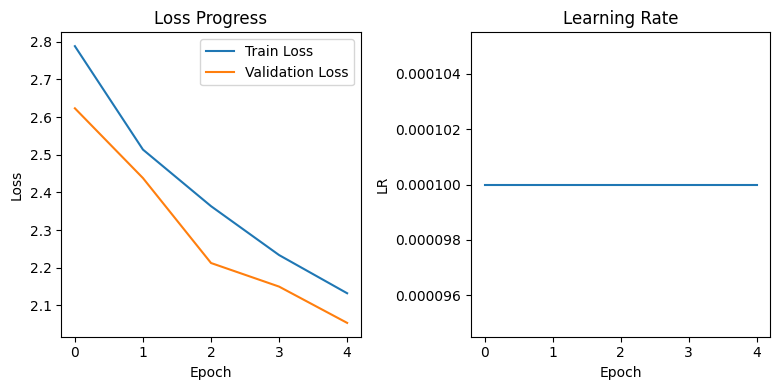

Epoch 6/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 6/50:   0%|          | 1/450 [00:00<06:09,  1.22it/s, Train Loss=2.2425, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 6/50:   0%|          | 2/450 [00:01<05:07,  1.45it/s, Train Loss=2.2232, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 6/50:   1%|          | 3/450 [00:02<04:47,  1.56it/s, Train Loss=2.1135, LR=0.000100]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 6/50:   1%|          | 4/450 [00:02<04:37,  1.61it/s, Train Loss=1.8698, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 6/50:   1%|          | 5/450 [00:03<04:31,  1.64it/s, Train Loss=2.1172, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 6/50:   1%|▏         | 6/450 [00:03<04:30,  1.64it/s, Train Loss=2.0785, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 6/50:   2%|▏         | 7/450 [00:04<04:27,  1.66it/s, Train Loss=2.2164, LR=0.000100]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 6/50:   2%|▏         | 8/450 [00:04<04:25,  1.66it/s, Train Loss=1.8950, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 6/50:   2%|▏         | 9/450 [00:05<04:24,  1.67it/s, Train Loss=2.0099, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 6/50:   2%|▏         | 10/450 [00:06<04:24,  1.67it/s, Train Loss=1.9233, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 6/50:   2%|▏         | 11/450 [00:06<04:22,  1.67it/s, Train Loss=1.9895, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 6/50:   3%|▎         | 12/450 [00:07<04:21,  1.68it/s, Train Loss=2.1107, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 6/50:   3%|▎         | 13/450 [00:07<04:19,  1.68it/s, Train Loss=2.2140, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 6/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=1.9220, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 6/50:   3%|▎         | 15/450 [00:09<04:18,  1.69it/s, Train Loss=2.0675, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 6/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=2.0104, LR=0.000100]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 6/50:   4%|▍         | 17/450 [00:10<04:15,  1.69it/s, Train Loss=2.1789, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 6/50:   4%|▍         | 18/450 [00:10<04:15,  1.69it/s, Train Loss=2.0485, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 6/50:   4%|▍         | 19/450 [00:11<04:15,  1.69it/s, Train Loss=2.1751, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 6/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=2.1281, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 6/50:   5%|▍         | 21/450 [00:12<04:14,  1.68it/s, Train Loss=2.0076, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 6/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=2.1378, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 6/50:   5%|▌         | 23/450 [00:13<04:14,  1.68it/s, Train Loss=2.3215, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg



Epoch 6/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=2.0958, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 6/50:   6%|▌         | 25/450 [00:15<04:13,  1.68it/s, Train Loss=1.9015, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 6/50:   6%|▌         | 26/450 [00:15<04:12,  1.68it/s, Train Loss=2.0920, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 6/50:   6%|▌         | 27/450 [00:16<04:11,  1.68it/s, Train Loss=2.0678, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 6/50:   6%|▌         | 28/450 [00:16<04:11,  1.68it/s, Train Loss=1.8959, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 6/50:   6%|▋         | 29/450 [00:17<04:10,  1.68it/s, Train Loss=2.0652, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 6/50:   7%|▋         | 30/450 [00:18<04:09,  1.68it/s, Train Loss=2.1096, LR=0.000100]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 6/50:   7%|▋         | 31/450 [00:18<04:09,  1.68it/s, Train Loss=2.2134, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 6/50:   7%|▋         | 32/450 [00:19<04:08,  1.68it/s, Train Loss=2.0024, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 6/50:   7%|▋         | 33/450 [00:19<04:07,  1.69it/s, Train Loss=2.0479, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 6/50:   8%|▊         | 34/450 [00:20<04:06,  1.69it/s, Train Loss=1.9588, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 6/50:   8%|▊         | 35/450 [00:21<04:05,  1.69it/s, Train Loss=2.0269, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 6/50:   8%|▊         | 36/450 [00:21<04:05,  1.68it/s, Train Loss=2.0605, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 6/50:   8%|▊         | 37/450 [00:22<04:06,  1.68it/s, Train Loss=2.0590, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 6/50:   8%|▊         | 38/450 [00:22<04:05,  1.68it/s, Train Loss=1.9443, LR=0.000100]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 6/50:   9%|▊         | 39/450 [00:23<04:05,  1.67it/s, Train Loss=2.1036, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 6/50:   9%|▉         | 40/450 [00:24<04:04,  1.68it/s, Train Loss=2.0238, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 6/50:   9%|▉         | 41/450 [00:24<04:03,  1.68it/s, Train Loss=1.9583, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 6/50:   9%|▉         | 42/450 [00:25<04:02,  1.68it/s, Train Loss=1.9558, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 6/50:  10%|▉         | 43/450 [00:25<04:02,  1.68it/s, Train Loss=2.2424, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 6/50:  10%|▉         | 44/450 [00:26<04:01,  1.68it/s, Train Loss=1.9107, LR=0.000100]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 6/50:  10%|█         | 45/450 [00:26<04:01,  1.68it/s, Train Loss=2.0242, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 6/50:  10%|█         | 46/450 [00:27<04:00,  1.68it/s, Train Loss=2.0770, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 6/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=2.2850, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 6/50:  11%|█         | 48/450 [00:28<03:59,  1.68it/s, Train Loss=2.1684, LR=0.000100]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 6/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=2.3339, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 6/50:  11%|█         | 50/450 [00:29<03:58,  1.68it/s, Train Loss=2.1224, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 6/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=1.9980, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 6/50:  12%|█▏        | 52/450 [00:31<03:57,  1.68it/s, Train Loss=1.9896, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 6/50:  12%|█▏        | 53/450 [00:31<03:57,  1.67it/s, Train Loss=2.2256, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 6/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=1.9507, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 6/50:  12%|█▏        | 55/450 [00:32<03:55,  1.68it/s, Train Loss=2.2796, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 6/50:  12%|█▏        | 56/450 [00:33<03:54,  1.68it/s, Train Loss=2.0388, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 6/50:  13%|█▎        | 57/450 [00:34<03:54,  1.68it/s, Train Loss=2.0683, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 6/50:  13%|█▎        | 58/450 [00:34<03:53,  1.68it/s, Train Loss=2.2308, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 6/50:  13%|█▎        | 59/450 [00:35<03:52,  1.68it/s, Train Loss=2.0761, LR=0.000100]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 6/50:  13%|█▎        | 60/450 [00:35<03:51,  1.68it/s, Train Loss=2.1515, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 6/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=2.1153, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 6/50:  14%|█▍        | 62/450 [00:37<03:50,  1.68it/s, Train Loss=2.0365, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 6/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=2.1177, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 6/50:  14%|█▍        | 64/450 [00:38<03:49,  1.68it/s, Train Loss=2.1890, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 6/50:  14%|█▍        | 65/450 [00:38<03:48,  1.68it/s, Train Loss=2.0901, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 6/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=2.0095, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 6/50:  15%|█▍        | 67/450 [00:40<03:47,  1.68it/s, Train Loss=2.0527, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 6/50:  15%|█▌        | 68/450 [00:40<03:47,  1.68it/s, Train Loss=1.9001, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 6/50:  15%|█▌        | 69/450 [00:41<03:46,  1.68it/s, Train Loss=2.1443, LR=0.000100]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 6/50:  16%|█▌        | 70/450 [00:41<03:45,  1.68it/s, Train Loss=1.9289, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 6/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=2.2546, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 6/50:  16%|█▌        | 72/450 [00:43<03:45,  1.68it/s, Train Loss=2.0973, LR=0.000100]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 6/50:  16%|█▌        | 73/450 [00:43<03:44,  1.68it/s, Train Loss=2.0370, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 6/50:  16%|█▋        | 74/450 [00:44<03:43,  1.68it/s, Train Loss=2.1234, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 6/50:  17%|█▋        | 75/450 [00:44<03:42,  1.69it/s, Train Loss=1.9562, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 6/50:  17%|█▋        | 76/450 [00:45<03:41,  1.68it/s, Train Loss=2.0386, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 6/50:  17%|█▋        | 77/450 [00:45<03:41,  1.69it/s, Train Loss=1.9562, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 6/50:  17%|█▋        | 78/450 [00:46<03:40,  1.68it/s, Train Loss=2.1701, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 6/50:  18%|█▊        | 79/450 [00:47<03:40,  1.68it/s, Train Loss=2.1283, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 6/50:  18%|█▊        | 80/450 [00:47<03:40,  1.68it/s, Train Loss=1.9668, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 6/50:  18%|█▊        | 81/450 [00:48<03:39,  1.68it/s, Train Loss=1.8672, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 6/50:  18%|█▊        | 82/450 [00:48<03:38,  1.68it/s, Train Loss=2.1071, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 6/50:  18%|█▊        | 83/450 [00:49<03:38,  1.68it/s, Train Loss=2.0211, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 6/50:  19%|█▊        | 84/450 [00:50<03:37,  1.68it/s, Train Loss=1.9495, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 6/50:  19%|█▉        | 85/450 [00:50<03:36,  1.68it/s, Train Loss=1.9626, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 6/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=1.8210, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 6/50:  19%|█▉        | 87/450 [00:51<03:35,  1.69it/s, Train Loss=2.1054, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 6/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=2.2907, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 6/50:  20%|█▉        | 89/450 [00:53<03:34,  1.68it/s, Train Loss=2.2539, LR=0.000100]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 6/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=2.0703, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 6/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=2.1667, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 6/50:  20%|██        | 92/450 [00:54<03:32,  1.69it/s, Train Loss=1.9223, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 6/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=1.8967, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 6/50:  21%|██        | 94/450 [00:56<03:30,  1.69it/s, Train Loss=2.2456, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 6/50:  21%|██        | 95/450 [00:56<03:29,  1.69it/s, Train Loss=1.8400, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 6/50:  21%|██▏       | 96/450 [00:57<03:30,  1.68it/s, Train Loss=1.8591, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 6/50:  22%|██▏       | 97/450 [00:57<03:30,  1.68it/s, Train Loss=1.8398, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 6/50:  22%|██▏       | 98/450 [00:58<03:29,  1.68it/s, Train Loss=1.8698, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 6/50:  22%|██▏       | 99/450 [00:59<03:28,  1.68it/s, Train Loss=1.9940, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 6/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=2.1665, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 6/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=2.0091, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 6/50:  23%|██▎       | 102/450 [01:00<03:27,  1.68it/s, Train Loss=2.0012, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 6/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=2.0140, LR=0.000100]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 6/50:  23%|██▎       | 104/450 [01:02<03:26,  1.68it/s, Train Loss=2.0374, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 6/50:  23%|██▎       | 105/450 [01:02<03:25,  1.68it/s, Train Loss=2.0376, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 6/50:  24%|██▎       | 106/450 [01:03<03:24,  1.68it/s, Train Loss=2.1051, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 6/50:  24%|██▍       | 107/450 [01:03<03:24,  1.68it/s, Train Loss=2.0387, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 6/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=2.0558, LR=0.000100]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 6/50:  24%|██▍       | 109/450 [01:05<03:22,  1.69it/s, Train Loss=2.0212, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 6/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=2.0132, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 6/50:  25%|██▍       | 111/450 [01:06<03:20,  1.69it/s, Train Loss=1.9709, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 6/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=1.8331, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 6/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=2.1169, LR=0.000100]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 6/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=2.0406, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 6/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=2.0233, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 6/50:  26%|██▌       | 116/450 [01:09<03:17,  1.69it/s, Train Loss=2.1698, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 6/50:  26%|██▌       | 117/450 [01:09<03:17,  1.69it/s, Train Loss=2.0060, LR=0.000100]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 6/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=1.8984, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 6/50:  26%|██▋       | 119/450 [01:10<03:15,  1.69it/s, Train Loss=1.9281, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 6/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=1.8085, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 6/50:  27%|██▋       | 121/450 [01:12<03:14,  1.69it/s, Train Loss=1.9236, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 6/50:  27%|██▋       | 122/450 [01:12<03:13,  1.69it/s, Train Loss=1.9720, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 6/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=2.0580, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 6/50:  28%|██▊       | 124/450 [01:13<03:13,  1.69it/s, Train Loss=2.2274, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 6/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=2.0618, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 6/50:  28%|██▊       | 126/450 [01:15<03:11,  1.69it/s, Train Loss=2.1580, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 6/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=2.1296, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 6/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=1.9069, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 6/50:  29%|██▊       | 129/450 [01:16<03:10,  1.68it/s, Train Loss=1.7022, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 6/50:  29%|██▉       | 130/450 [01:17<03:10,  1.68it/s, Train Loss=2.0346, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 6/50:  29%|██▉       | 131/450 [01:18<03:09,  1.68it/s, Train Loss=2.0578, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 6/50:  29%|██▉       | 132/450 [01:18<03:09,  1.68it/s, Train Loss=1.8921, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 6/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=2.0669, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 6/50:  30%|██▉       | 134/450 [01:19<03:07,  1.68it/s, Train Loss=2.1498, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 6/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=1.9879, LR=0.000100]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 6/50:  30%|███       | 136/450 [01:21<03:06,  1.68it/s, Train Loss=1.9742, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 6/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=2.2373, LR=0.000100]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 6/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=1.8130, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 6/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=1.9076, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 6/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=2.2960, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 6/50:  31%|███▏      | 141/450 [01:23<03:02,  1.69it/s, Train Loss=2.0193, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 6/50:  32%|███▏      | 142/450 [01:24<03:01,  1.69it/s, Train Loss=2.0555, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 6/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=2.1364, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 6/50:  32%|███▏      | 144/450 [01:25<03:00,  1.69it/s, Train Loss=2.1575, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 6/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=2.1556, LR=0.000100]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 6/50:  32%|███▏      | 146/450 [01:26<03:00,  1.69it/s, Train Loss=1.9618, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 6/50:  33%|███▎      | 147/450 [01:27<02:59,  1.68it/s, Train Loss=1.8663, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 6/50:  33%|███▎      | 148/450 [01:28<02:59,  1.68it/s, Train Loss=1.9768, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 6/50:  33%|███▎      | 149/450 [01:28<02:59,  1.68it/s, Train Loss=1.7738, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 6/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=2.2371, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 6/50:  34%|███▎      | 151/450 [01:29<02:57,  1.69it/s, Train Loss=2.0121, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 6/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=1.8779, LR=0.000100]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 6/50:  34%|███▍      | 153/450 [01:31<02:55,  1.69it/s, Train Loss=2.0263, LR=0.000100]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 6/50:  34%|███▍      | 154/450 [01:31<02:54,  1.69it/s, Train Loss=1.9991, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 6/50:  34%|███▍      | 155/450 [01:32<02:53,  1.70it/s, Train Loss=1.8854, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 6/50:  35%|███▍      | 156/450 [01:32<02:53,  1.69it/s, Train Loss=2.0853, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 6/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=1.9993, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 6/50:  35%|███▌      | 158/450 [01:34<02:52,  1.69it/s, Train Loss=2.0370, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 6/50:  35%|███▌      | 159/450 [01:34<02:51,  1.69it/s, Train Loss=2.0438, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 6/50:  36%|███▌      | 160/450 [01:35<02:52,  1.69it/s, Train Loss=1.8204, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 6/50:  36%|███▌      | 161/450 [01:35<02:50,  1.69it/s, Train Loss=2.0136, LR=0.000100]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 6/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=1.8271, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 6/50:  36%|███▌      | 163/450 [01:36<02:50,  1.69it/s, Train Loss=1.9989, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 6/50:  36%|███▋      | 164/450 [01:37<02:49,  1.68it/s, Train Loss=2.1365, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 6/50:  37%|███▋      | 165/450 [01:38<02:49,  1.68it/s, Train Loss=2.0652, LR=0.000100]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 6/50:  37%|███▋      | 166/450 [01:38<02:48,  1.68it/s, Train Loss=2.0815, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 6/50:  37%|███▋      | 167/450 [01:39<02:48,  1.68it/s, Train Loss=1.9829, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 6/50:  37%|███▋      | 168/450 [01:39<02:47,  1.68it/s, Train Loss=2.1956, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 6/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=2.2700, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 6/50:  38%|███▊      | 170/450 [01:41<02:45,  1.69it/s, Train Loss=2.1395, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 6/50:  38%|███▊      | 171/450 [01:41<02:45,  1.69it/s, Train Loss=1.9246, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 6/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=1.9949, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 6/50:  38%|███▊      | 173/450 [01:42<02:44,  1.68it/s, Train Loss=1.9715, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 6/50:  39%|███▊      | 174/450 [01:43<02:43,  1.68it/s, Train Loss=2.1116, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 6/50:  39%|███▉      | 175/450 [01:44<02:43,  1.68it/s, Train Loss=1.8568, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 6/50:  39%|███▉      | 176/450 [01:44<02:43,  1.68it/s, Train Loss=1.8860, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 6/50:  39%|███▉      | 177/450 [01:45<02:42,  1.68it/s, Train Loss=2.1650, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 6/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=2.1733, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 6/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=1.9271, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 6/50:  40%|████      | 180/450 [01:47<02:39,  1.69it/s, Train Loss=2.1151, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 6/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=1.9150, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 6/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=2.0750, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 6/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=2.0453, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 6/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=2.2201, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 6/50:  41%|████      | 185/450 [01:50<02:36,  1.69it/s, Train Loss=2.0004, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 6/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=2.0840, LR=0.000100]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 6/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=2.3154, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 6/50:  42%|████▏     | 188/450 [01:51<02:34,  1.69it/s, Train Loss=1.9213, LR=0.000100]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 6/50:  42%|████▏     | 189/450 [01:52<02:33,  1.70it/s, Train Loss=2.1528, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 6/50:  42%|████▏     | 190/450 [01:53<02:33,  1.70it/s, Train Loss=2.0780, LR=0.000100]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 6/50:  42%|████▏     | 191/450 [01:53<02:32,  1.69it/s, Train Loss=2.0224, LR=0.000100]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 6/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=2.2940, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 6/50:  43%|████▎     | 193/450 [01:54<02:32,  1.68it/s, Train Loss=2.2054, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 6/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=2.0714, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 6/50:  43%|████▎     | 195/450 [01:55<02:30,  1.69it/s, Train Loss=1.8487, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 6/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=2.1330, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 6/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=2.0759, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 6/50:  44%|████▍     | 198/450 [01:57<02:28,  1.69it/s, Train Loss=2.1461, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 6/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=2.0266, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 6/50:  44%|████▍     | 200/450 [01:58<02:28,  1.68it/s, Train Loss=2.0623, LR=0.000100]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 6/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=1.9542, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 6/50:  45%|████▍     | 202/450 [02:00<02:27,  1.69it/s, Train Loss=2.3132, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 6/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=2.0816, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 6/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=1.8034, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 6/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=2.0980, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 6/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=2.0674, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 6/50:  46%|████▌     | 207/450 [02:03<02:23,  1.69it/s, Train Loss=2.0853, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 6/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=2.1126, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 6/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=2.0574, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 6/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=1.9835, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 6/50:  47%|████▋     | 211/450 [02:05<02:22,  1.68it/s, Train Loss=2.0560, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 6/50:  47%|████▋     | 212/450 [02:06<02:21,  1.68it/s, Train Loss=2.0697, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 6/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=1.8593, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 6/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=2.0666, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 6/50:  48%|████▊     | 215/450 [02:07<02:19,  1.69it/s, Train Loss=2.0596, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 6/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=2.0851, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 6/50:  48%|████▊     | 217/450 [02:09<02:17,  1.69it/s, Train Loss=2.2261, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 6/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=2.0772, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 6/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=1.9616, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 6/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=2.0837, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 6/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=2.0357, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 6/50:  49%|████▉     | 222/450 [02:11<02:16,  1.67it/s, Train Loss=2.4645, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 6/50:  50%|████▉     | 223/450 [02:12<02:15,  1.68it/s, Train Loss=2.0749, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 6/50:  50%|████▉     | 224/450 [02:13<02:15,  1.67it/s, Train Loss=1.9186, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 6/50:  50%|█████     | 225/450 [02:13<02:14,  1.68it/s, Train Loss=1.9745, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 6/50:  50%|█████     | 226/450 [02:14<02:13,  1.68it/s, Train Loss=2.0397, LR=0.000100]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 6/50:  50%|█████     | 227/450 [02:14<02:12,  1.68it/s, Train Loss=2.1179, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 6/50:  51%|█████     | 228/450 [02:15<02:12,  1.68it/s, Train Loss=1.8855, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 6/50:  51%|█████     | 229/450 [02:16<02:11,  1.68it/s, Train Loss=1.9476, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 6/50:  51%|█████     | 230/450 [02:16<02:11,  1.68it/s, Train Loss=2.0875, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 6/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=1.9830, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 6/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=2.2018, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 6/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.68it/s, Train Loss=1.9791, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 6/50:  52%|█████▏    | 234/450 [02:19<02:08,  1.68it/s, Train Loss=2.0856, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 6/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.68it/s, Train Loss=2.0497, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 6/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=1.9703, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 6/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.68it/s, Train Loss=2.0111, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 6/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=2.0501, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 6/50:  53%|█████▎    | 239/450 [02:22<02:04,  1.69it/s, Train Loss=1.9624, LR=0.000100]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 6/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=1.9024, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 6/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=1.9585, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 6/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=1.8745, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 6/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=2.0957, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 6/50:  54%|█████▍    | 244/450 [02:25<02:01,  1.69it/s, Train Loss=1.8199, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 6/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=2.0636, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 6/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=1.9944, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 6/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=2.1071, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 6/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=2.1834, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 6/50:  55%|█████▌    | 249/450 [02:28<01:59,  1.69it/s, Train Loss=2.0365, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 6/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.68it/s, Train Loss=2.0153, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 6/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=1.9405, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 6/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=1.7775, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 6/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=1.9943, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 6/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.69it/s, Train Loss=2.0116, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 6/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.68it/s, Train Loss=1.9943, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 6/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.69it/s, Train Loss=2.0166, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 6/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=1.8640, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 6/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=2.1987, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 6/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=1.9662, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 6/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=2.0082, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 6/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.69it/s, Train Loss=1.9423, LR=0.000100]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 6/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=2.1100, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 6/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=2.0909, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 6/50:  59%|█████▊    | 264/450 [02:36<01:49,  1.69it/s, Train Loss=1.9702, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 6/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=1.9648, LR=0.000100]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 6/50:  59%|█████▉    | 266/450 [02:38<01:48,  1.69it/s, Train Loss=1.9823, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 6/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=1.9652, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 6/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=1.8736, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 6/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.68it/s, Train Loss=1.8873, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 6/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=2.0688, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 6/50:  60%|██████    | 271/450 [02:41<01:46,  1.68it/s, Train Loss=1.8643, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 6/50:  60%|██████    | 272/450 [02:41<01:46,  1.67it/s, Train Loss=2.0852, LR=0.000100]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 6/50:  61%|██████    | 273/450 [02:42<01:45,  1.68it/s, Train Loss=2.0779, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 6/50:  61%|██████    | 274/450 [02:42<01:44,  1.68it/s, Train Loss=2.0374, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 6/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=2.0334, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 6/50:  61%|██████▏   | 276/450 [02:44<01:42,  1.69it/s, Train Loss=1.9639, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 6/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=2.0095, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 6/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=2.1575, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 6/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=1.8977, LR=0.000100]

Attempting to read 75 frames from data/s1/lrblzn.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 6/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.68it/s, Train Loss=2.1340, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 6/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.69it/s, Train Loss=1.9436, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 6/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.68it/s, Train Loss=1.9357, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 6/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=2.0071, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 6/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.68it/s, Train Loss=1.9601, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 6/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=1.7237, LR=0.000100]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 6/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.68it/s, Train Loss=2.0527, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 6/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=1.9644, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 6/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.69it/s, Train Loss=2.1193, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 6/50:  64%|██████▍   | 289/450 [02:51<01:36,  1.67it/s, Train Loss=2.0355, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 6/50:  64%|██████▍   | 290/450 [02:52<01:35,  1.67it/s, Train Loss=2.1178, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 6/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.68it/s, Train Loss=2.0275, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 6/50:  65%|██████▍   | 292/450 [02:53<01:34,  1.68it/s, Train Loss=1.9563, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 6/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.69it/s, Train Loss=1.9741, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 6/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=2.0196, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 6/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=1.8812, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 6/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=1.9094, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 6/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.68it/s, Train Loss=2.1164, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 6/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.68it/s, Train Loss=1.9964, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 6/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.68it/s, Train Loss=2.1528, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 6/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=2.0766, LR=0.000100]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 6/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.68it/s, Train Loss=1.8563, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 6/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=2.0092, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 6/50:  67%|██████▋   | 303/450 [03:00<01:26,  1.69it/s, Train Loss=2.0995, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 6/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.70it/s, Train Loss=2.2308, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 6/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=1.8255, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 6/50:  68%|██████▊   | 306/450 [03:01<01:24,  1.69it/s, Train Loss=1.6371, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 6/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=2.0338, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 6/50:  68%|██████▊   | 308/450 [03:03<01:24,  1.68it/s, Train Loss=1.8809, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 6/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=1.8504, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 6/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=2.1405, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 6/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=1.9307, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 6/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=1.8494, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 6/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.69it/s, Train Loss=2.0434, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 6/50:  70%|██████▉   | 314/450 [03:06<01:21,  1.68it/s, Train Loss=1.8541, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 6/50:  70%|███████   | 315/450 [03:07<01:20,  1.68it/s, Train Loss=1.8110, LR=0.000100]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 6/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=2.0550, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 6/50:  70%|███████   | 317/450 [03:08<01:19,  1.68it/s, Train Loss=2.1172, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 6/50:  71%|███████   | 318/450 [03:08<01:18,  1.68it/s, Train Loss=2.2102, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/swbc3a.mpg



Epoch 6/50:  71%|███████   | 319/450 [03:09<01:18,  1.67it/s, Train Loss=1.9941, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 6/50:  71%|███████   | 320/450 [03:10<01:17,  1.68it/s, Train Loss=2.0424, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 6/50:  71%|███████▏  | 321/450 [03:10<01:17,  1.67it/s, Train Loss=1.8091, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 6/50:  72%|███████▏  | 322/450 [03:11<01:16,  1.67it/s, Train Loss=1.9318, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 6/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.68it/s, Train Loss=1.8812, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 6/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=2.0335, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 6/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.68it/s, Train Loss=1.8844, LR=0.000100]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 6/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.68it/s, Train Loss=1.9894, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 6/50:  73%|███████▎  | 327/450 [03:14<01:13,  1.68it/s, Train Loss=2.0977, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 6/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=1.8914, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 6/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=1.8217, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 6/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.69it/s, Train Loss=1.9461, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 6/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.68it/s, Train Loss=1.9068, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 6/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.68it/s, Train Loss=1.9701, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 6/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=2.1023, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 6/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.68it/s, Train Loss=1.9105, LR=0.000100]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 6/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.68it/s, Train Loss=2.0110, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 6/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=1.7418, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 6/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.68it/s, Train Loss=1.8646, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 6/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=1.8501, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 6/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=1.7741, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 6/50:  76%|███████▌  | 340/450 [03:22<01:05,  1.69it/s, Train Loss=1.8362, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 6/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=1.8792, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 6/50:  76%|███████▌  | 342/450 [03:23<01:03,  1.69it/s, Train Loss=2.1501, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 6/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=1.9544, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 6/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.68it/s, Train Loss=1.9726, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 6/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=2.0162, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 6/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=1.9854, LR=0.000100]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 6/50:  77%|███████▋  | 347/450 [03:26<01:00,  1.69it/s, Train Loss=1.9577, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 6/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=2.2329, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 6/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.68it/s, Train Loss=1.8356, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 6/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=2.0656, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 6/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=1.9266, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 6/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.69it/s, Train Loss=2.0649, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 6/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=1.8991, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 6/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=1.9093, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 6/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.68it/s, Train Loss=1.8327, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 6/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=2.0345, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 6/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.69it/s, Train Loss=2.0601, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 6/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=2.0910, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv6n.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 6/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=1.8420, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 6/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=2.0163, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 6/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=2.1135, LR=0.000100]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 6/50:  80%|████████  | 362/450 [03:35<00:52,  1.68it/s, Train Loss=1.8792, LR=0.000100]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 6/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=1.8015, LR=0.000100]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 6/50:  81%|████████  | 364/450 [03:36<00:51,  1.68it/s, Train Loss=1.8152, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 6/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=1.9621, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 6/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=2.0570, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 6/50:  82%|████████▏ | 367/450 [03:38<00:49,  1.69it/s, Train Loss=1.9356, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 6/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=1.8179, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 6/50:  82%|████████▏ | 369/450 [03:39<00:47,  1.69it/s, Train Loss=1.8632, LR=0.000100]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 6/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=1.7276, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 6/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=1.7048, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 6/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=2.0161, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 6/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=1.9539, LR=0.000100]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 6/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.69it/s, Train Loss=1.8787, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 6/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=2.3496, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 6/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=1.8573, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 6/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=2.0393, LR=0.000100]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 6/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.68it/s, Train Loss=1.9254, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 6/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.68it/s, Train Loss=2.1497, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 6/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=2.2229, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 6/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=2.0928, LR=0.000100]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 6/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=1.8314, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 6/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=1.9958, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 6/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.69it/s, Train Loss=2.0039, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 6/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=1.8973, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 6/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=1.7504, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 6/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=1.6930, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 6/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.68it/s, Train Loss=2.0441, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 6/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.69it/s, Train Loss=1.7717, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 6/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=1.9432, LR=0.000100]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 6/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.68it/s, Train Loss=1.9703, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 6/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=2.0546, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 6/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.68it/s, Train Loss=2.0478, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 6/50:  88%|████████▊ | 394/450 [03:54<00:33,  1.69it/s, Train Loss=1.9355, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 6/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=1.8029, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 6/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.69it/s, Train Loss=1.9749, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 6/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=1.8113, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 6/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=2.2251, LR=0.000100]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 6/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.68it/s, Train Loss=1.9794, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 6/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=2.0021, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 6/50:  89%|████████▉ | 401/450 [03:58<00:28,  1.70it/s, Train Loss=1.9389, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 6/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=1.9622, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 6/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=2.0684, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 6/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=2.0201, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 6/50:  90%|█████████ | 405/450 [04:00<00:26,  1.68it/s, Train Loss=1.8816, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii2p.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 6/50:  90%|█████████ | 406/450 [04:01<00:26,  1.68it/s, Train Loss=2.0637, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 6/50:  90%|█████████ | 407/450 [04:01<00:25,  1.68it/s, Train Loss=2.1357, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 6/50:  91%|█████████ | 408/450 [04:02<00:25,  1.68it/s, Train Loss=2.1332, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 6/50:  91%|█████████ | 409/450 [04:02<00:24,  1.68it/s, Train Loss=1.8544, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 6/50:  91%|█████████ | 410/450 [04:03<00:23,  1.68it/s, Train Loss=1.8991, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 6/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.69it/s, Train Loss=2.0865, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 6/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.68it/s, Train Loss=1.9606, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 6/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.68it/s, Train Loss=1.8697, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 6/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.67it/s, Train Loss=2.0115, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 6/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.68it/s, Train Loss=1.9916, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 6/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.68it/s, Train Loss=1.8568, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 6/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=2.0758, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 6/50:  93%|█████████▎| 418/450 [04:08<00:19,  1.68it/s, Train Loss=1.7824, LR=0.000100]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 6/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=2.1159, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 6/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=1.9867, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 6/50:  94%|█████████▎| 421/450 [04:10<00:17,  1.69it/s, Train Loss=1.8317, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 6/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.68it/s, Train Loss=1.7692, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 6/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.68it/s, Train Loss=1.6345, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 6/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=2.0248, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 6/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.67it/s, Train Loss=1.6279, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 6/50:  95%|█████████▍| 426/450 [04:13<00:14,  1.68it/s, Train Loss=1.9115, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 6/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=2.1940, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 6/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=1.9072, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 6/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=1.9155, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 6/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.68it/s, Train Loss=1.8714, LR=0.000100]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 6/50:  96%|█████████▌| 431/450 [04:16<00:11,  1.68it/s, Train Loss=1.8515, LR=0.000100]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 6/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=1.8145, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 6/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=1.8650, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 6/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=1.9982, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 6/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=1.9931, LR=0.000100]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 6/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=1.9026, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 6/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=1.8887, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 6/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.69it/s, Train Loss=1.6575, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 6/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=2.1150, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 6/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.68it/s, Train Loss=2.1296, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 6/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=1.9723, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 6/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=2.0515, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 6/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.68it/s, Train Loss=2.1096, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 6/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.68it/s, Train Loss=2.0373, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 6/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.67it/s, Train Loss=2.0202, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 6/50: 100%|██████████| 450/450 [04:27<00:00,  1.69it/s, Train Loss=1.8661, LR=0.000100]
                                                                                             
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpgAttempting to read 75 frames from data/s1/lbwy8p.mpg




Validation:   2%|▏         | 1/50 [00:00<00:27,  1.76it/s, Val Loss=2.1117]

Attempting to read 75 frames from data/s1/lbbezn.mpgAttempting to read 75 frames from data/s1/sbwu6p.mpg

Attempting to read 75 frames from data/s1/pgwr4n.mpg



Validation:   4%|▍         | 2/50 [00:00<00:16,  2.90it/s, Val Loss=1.9372]

Attempting to read 75 frames from data/s1/pgak3s.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   6%|▌         | 3/50 [00:00<00:13,  3.61it/s, Val Loss=2.2179]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  4.13it/s, Val Loss=1.9331]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.45it/s, Val Loss=1.7571]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.45it/s, Val Loss=2.0466]

Attempting to read 75 frames from data/s1/lray5s.mpg


Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.70it/s, Val Loss=2.0466]


Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.85it/s, Val Loss=2.0292]

Attempting to read 75 frames from data/s1/lbby5a.mpgAttempting to read 75 frames from data/s1/bril9s.mpg




Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.91it/s, Val Loss=1.9548]

Attempting to read 75 frames from data/s1/braf9s.mpgAttempting to read 75 frames from data/s1/bwim7a.mpg




Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.03it/s, Val Loss=1.9834]

Attempting to read 75 frames from data/s1/bram5a.mpgAttempting to read 75 frames from data/s1/brimzp.mpg




Validation:  20%|██        | 10/50 [00:02<00:07,  5.14it/s, Val Loss=1.9044]

Attempting to read 75 frames from data/s1/brbg3s.mpgAttempting to read 75 frames from data/s1/lwbszn.mpg

Attempting to read 75 frames from data/s1/srah4n.mpg


Validation:  20%|██        | 10/50 [00:02<00:07,  5.14it/s, Val Loss=1.9530]


Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.28it/s, Val Loss=1.9530]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpgAttempting to read 75 frames from data/s1/prii7s.mpg


Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.28it/s, Val Loss=1.5668]


Validation:  26%|██▌       | 13/50 [00:02<00:06,  5.35it/s, Val Loss=1.9089]

Attempting to read 75 frames from data/s1/bbir9a.mpgAttempting to read 75 frames from data/s1/lgil5s.mpg

Attempting to read 75 frames from data/s1/lgbs9a.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.36it/s, Val Loss=1.8661]

Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.45it/s, Val Loss=2.0005]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.47it/s, Val Loss=1.7463]

Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.41it/s, Val Loss=1.7404]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.41it/s, Val Loss=1.9888]

Attempting to read 75 frames from data/s1/lgwm9a.mpg


Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.33it/s, Val Loss=1.9888]


Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.35it/s, Val Loss=1.7601]

Attempting to read 75 frames from data/s1/bwitzp.mpgAttempting to read 75 frames from data/s1/sbwh8p.mpg




Validation:  40%|████      | 20/50 [00:04<00:05,  5.45it/s, Val Loss=2.0668]

Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.47it/s, Val Loss=2.4507]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg
Attempting to read 75 frames from data/s1/bgah2p.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.48it/s, Val Loss=1.7147]

Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.39it/s, Val Loss=2.1304]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg


Attempting to read 75 frames from data/s1/prajzn.mpg


Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.39it/s, Val Loss=1.8547]


Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.27it/s, Val Loss=1.8547]

Attempting to read 75 frames from data/s1/sgav4n.mpg


Attempting to read 75 frames from data/s1/bgin3a.mpg


Validation:  50%|█████     | 25/50 [00:05<00:04,  5.19it/s, Val Loss=1.8919]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.32it/s, Val Loss=1.7725]

Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.30it/s, Val Loss=1.9333]

Attempting to read 75 frames from data/s1/srwb8n.mpgAttempting to read 75 frames from data/s1/prwd7a.mpg




Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.30it/s, Val Loss=2.0569]

Attempting to read 75 frames from data/s1/lbid2n.mpg


Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.19it/s, Val Loss=2.0569]

Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s, Val Loss=1.8223]

Attempting to read 75 frames from data/s1/prbq1a.mpg

Attempting to read 75 frames from data/s1/sgwd2p.mpg



Attempting to read 75 frames from data/s1/sgbx1a.mpg


Validation:  60%|██████    | 30/50 [00:06<00:03,  5.12it/s, Val Loss=2.0351]

Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.22it/s, Val Loss=2.0201]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.24it/s, Val Loss=1.9079]

Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.16it/s, Val Loss=1.6824]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.16it/s, Val Loss=1.9354]

Attempting to read 75 frames from data/s1/lgal9s.mpg


Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.14it/s, Val Loss=1.9354]


Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  70%|███████   | 35/50 [00:07<00:02,  5.17it/s, Val Loss=1.9598]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.02it/s, Val Loss=1.9776]

Attempting to read 75 frames from data/s1/lgwtzn.mpgAttempting to read 75 frames from data/s1/sgiczp.mpg




Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.09it/s, Val Loss=1.7448]

Attempting to read 75 frames from data/s1/sgbj2p.mpg
Attempting to read 75 frames from data/s1/pbib7s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.12it/s, Val Loss=1.9036]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.17it/s, Val Loss=2.0957]

Attempting to read 75 frames from data/s1/prip1s.mpgAttempting to read 75 frames from data/s1/lbbk6p.mpg




Validation:  80%|████████  | 40/50 [00:07<00:01,  5.10it/s, Val Loss=1.9944]

Attempting to read 75 frames from data/s1/pgiq2n.mpgAttempting to read 75 frames from data/s1/lbix4n.mpg




Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.17it/s, Val Loss=2.0599]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.22it/s, Val Loss=1.7407]

Attempting to read 75 frames from data/s1/bgbb3a.mpgAttempting to read 75 frames from data/s1/lbax9s.mpg




Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.27it/s, Val Loss=1.7976]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.35it/s, Val Loss=2.0550]

Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/lbaq6p.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.30it/s, Val Loss=1.8132]

Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.30it/s, Val Loss=1.8406]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  12%|█▏        | 6/50 [27:45<3:23:42, 277.78s/it, Train Loss=2.0101, Val Loss=1.9298, Best Loss=1.9298]


🏆 New best model saved with validation loss: 1.9298


Attempting to read 75 frames from data/s1/bgbu5a.mpg


Epoch 7/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/prii9a.mpgAttempting to read 75 frames from data/s1/bwag7a.mpg

Attempting to read 75 frames from data/s1/lrak8p.mpgAttempting to read 75 frames from data/s1/srbu8p.mpg

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 7/50:   0%|          | 1/450 [00:00<07:07,  1.05it/s, Train Loss=1.7994, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 7/50:   0%|          | 2/450 [00:01<05:33,  1.34it/s, Train Loss=1.9832, LR=0.000100]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 7/50:   1%|          | 3/450 [00:02<05:01,  1.48it/s, Train Loss=2.0760, LR=0.000100]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 7/50:   1%|          | 4/450 [00:02<04:45,  1.56it/s, Train Loss=2.1555, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 7/50:   1%|          | 5/450 [00:03<04:37,  1.60it/s, Train Loss=1.9507, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 7/50:   1%|▏         | 6/450 [00:03<04:32,  1.63it/s, Train Loss=2.1455, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 7/50:   2%|▏         | 7/450 [00:04<04:29,  1.65it/s, Train Loss=1.9949, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 7/50:   2%|▏         | 8/450 [00:05<04:26,  1.66it/s, Train Loss=1.7921, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 7/50:   2%|▏         | 9/450 [00:05<04:24,  1.67it/s, Train Loss=2.1043, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 7/50:   2%|▏         | 10/450 [00:06<04:22,  1.67it/s, Train Loss=1.7530, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 7/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=1.9915, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 7/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=1.9506, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 7/50:   3%|▎         | 13/450 [00:08<04:19,  1.69it/s, Train Loss=1.8829, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 7/50:   3%|▎         | 14/450 [00:08<04:18,  1.68it/s, Train Loss=2.0030, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 7/50:   3%|▎         | 15/450 [00:09<04:18,  1.68it/s, Train Loss=1.9655, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 7/50:   4%|▎         | 16/450 [00:09<04:18,  1.68it/s, Train Loss=2.0068, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 7/50:   4%|▍         | 17/450 [00:10<04:18,  1.68it/s, Train Loss=1.8796, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 7/50:   4%|▍         | 18/450 [00:11<04:16,  1.68it/s, Train Loss=1.8858, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 7/50:   4%|▍         | 19/450 [00:11<04:16,  1.68it/s, Train Loss=1.9689, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 7/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=1.9025, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 7/50:   5%|▍         | 21/450 [00:12<04:14,  1.68it/s, Train Loss=1.8554, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 7/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=1.9000, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 7/50:   5%|▌         | 23/450 [00:14<04:13,  1.68it/s, Train Loss=1.9118, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 7/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=2.1058, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 7/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=2.1334, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 7/50:   6%|▌         | 26/450 [00:15<04:11,  1.69it/s, Train Loss=1.9012, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 7/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=2.0429, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 7/50:   6%|▌         | 28/450 [00:16<04:10,  1.69it/s, Train Loss=1.8865, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 7/50:   6%|▋         | 29/450 [00:17<04:10,  1.68it/s, Train Loss=1.8528, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 7/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=1.8882, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 7/50:   7%|▋         | 31/450 [00:18<04:07,  1.69it/s, Train Loss=2.3798, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 7/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=1.8447, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 7/50:   7%|▋         | 33/450 [00:19<04:07,  1.68it/s, Train Loss=2.0801, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 7/50:   8%|▊         | 34/450 [00:20<04:06,  1.68it/s, Train Loss=2.0039, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 7/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=2.0659, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 7/50:   8%|▊         | 36/450 [00:21<04:05,  1.68it/s, Train Loss=1.9021, LR=0.000100]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 7/50:   8%|▊         | 37/450 [00:22<04:05,  1.68it/s, Train Loss=1.8311, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 7/50:   8%|▊         | 38/450 [00:22<04:04,  1.69it/s, Train Loss=2.0228, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 7/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=1.7569, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 7/50:   9%|▉         | 40/450 [00:24<04:04,  1.68it/s, Train Loss=1.8701, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 7/50:   9%|▉         | 41/450 [00:24<04:03,  1.68it/s, Train Loss=1.9440, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 7/50:   9%|▉         | 42/450 [00:25<04:02,  1.68it/s, Train Loss=2.1440, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 7/50:  10%|▉         | 43/450 [00:25<04:01,  1.68it/s, Train Loss=1.8736, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 7/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=2.1627, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 7/50:  10%|█         | 45/450 [00:27<03:59,  1.69it/s, Train Loss=1.8056, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 7/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=2.0413, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 7/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=2.0174, LR=0.000100]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 7/50:  11%|█         | 48/450 [00:28<03:58,  1.69it/s, Train Loss=1.8332, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 7/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=1.8179, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 7/50:  11%|█         | 50/450 [00:30<03:57,  1.68it/s, Train Loss=1.9618, LR=0.000100]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 7/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=1.9852, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 7/50:  12%|█▏        | 52/450 [00:31<03:56,  1.69it/s, Train Loss=1.8292, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 7/50:  12%|█▏        | 53/450 [00:31<03:55,  1.68it/s, Train Loss=1.8785, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 7/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=2.0040, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 7/50:  12%|█▏        | 55/450 [00:33<03:54,  1.68it/s, Train Loss=1.8440, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 7/50:  12%|█▏        | 56/450 [00:33<03:54,  1.68it/s, Train Loss=2.0233, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 7/50:  13%|█▎        | 57/450 [00:34<03:54,  1.68it/s, Train Loss=1.9296, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 7/50:  13%|█▎        | 58/450 [00:34<03:52,  1.68it/s, Train Loss=1.9825, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 7/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=1.9406, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 7/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=1.9723, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 7/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=1.7225, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 7/50:  14%|█▍        | 62/450 [00:37<03:50,  1.68it/s, Train Loss=1.8291, LR=0.000100]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 7/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=1.7829, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 7/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=1.9807, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 7/50:  14%|█▍        | 65/450 [00:38<03:47,  1.69it/s, Train Loss=1.8122, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 7/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=1.8743, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 7/50:  15%|█▍        | 67/450 [00:40<03:46,  1.69it/s, Train Loss=2.0278, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 7/50:  15%|█▌        | 68/450 [00:40<03:46,  1.69it/s, Train Loss=2.0278, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 7/50:  15%|█▌        | 69/450 [00:41<03:47,  1.68it/s, Train Loss=2.0197, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 7/50:  16%|█▌        | 70/450 [00:41<03:46,  1.68it/s, Train Loss=2.1552, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 7/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=1.7993, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 7/50:  16%|█▌        | 72/450 [00:43<03:44,  1.68it/s, Train Loss=1.8471, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 7/50:  16%|█▌        | 73/450 [00:43<03:43,  1.68it/s, Train Loss=1.8767, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 7/50:  16%|█▋        | 74/450 [00:44<03:43,  1.68it/s, Train Loss=2.0368, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 7/50:  17%|█▋        | 75/450 [00:44<03:43,  1.68it/s, Train Loss=1.9957, LR=0.000100]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 7/50:  17%|█▋        | 76/450 [00:45<03:42,  1.68it/s, Train Loss=1.7764, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 7/50:  17%|█▋        | 77/450 [00:46<03:41,  1.69it/s, Train Loss=2.1287, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 7/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=2.0404, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 7/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=1.8567, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 7/50:  18%|█▊        | 80/450 [00:47<03:40,  1.68it/s, Train Loss=2.0240, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 7/50:  18%|█▊        | 81/450 [00:48<03:40,  1.67it/s, Train Loss=1.9986, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 7/50:  18%|█▊        | 82/450 [00:49<03:39,  1.67it/s, Train Loss=1.9153, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 7/50:  18%|█▊        | 83/450 [00:49<03:38,  1.68it/s, Train Loss=1.7252, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv6n.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 7/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=1.8249, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 7/50:  19%|█▉        | 85/450 [00:50<03:37,  1.67it/s, Train Loss=1.7413, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 7/50:  19%|█▉        | 86/450 [00:51<03:36,  1.68it/s, Train Loss=1.7274, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 7/50:  19%|█▉        | 87/450 [00:52<03:35,  1.69it/s, Train Loss=1.6547, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 7/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=2.1871, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 7/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=1.7409, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 7/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=1.8065, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 7/50:  20%|██        | 91/450 [00:54<03:33,  1.68it/s, Train Loss=2.0712, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 7/50:  20%|██        | 92/450 [00:54<03:32,  1.68it/s, Train Loss=1.8569, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 7/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=1.7966, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 7/50:  21%|██        | 94/450 [00:56<03:31,  1.68it/s, Train Loss=1.9576, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 7/50:  21%|██        | 95/450 [00:56<03:30,  1.68it/s, Train Loss=1.9312, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 7/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=1.8625, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 7/50:  22%|██▏       | 97/450 [00:57<03:29,  1.69it/s, Train Loss=1.9892, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 7/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=2.1924, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 7/50:  22%|██▏       | 99/450 [00:59<03:28,  1.69it/s, Train Loss=1.7813, LR=0.000100]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 7/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=1.9343, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 7/50:  22%|██▏       | 101/450 [01:00<03:27,  1.69it/s, Train Loss=1.7611, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 7/50:  23%|██▎       | 102/450 [01:00<03:26,  1.68it/s, Train Loss=1.9005, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 7/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=1.7538, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 7/50:  23%|██▎       | 104/450 [01:02<03:26,  1.67it/s, Train Loss=1.9973, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 7/50:  23%|██▎       | 105/450 [01:02<03:26,  1.67it/s, Train Loss=1.7909, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 7/50:  24%|██▎       | 106/450 [01:03<03:25,  1.68it/s, Train Loss=1.9807, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 7/50:  24%|██▍       | 107/450 [01:03<03:24,  1.68it/s, Train Loss=1.8771, LR=0.000100]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 7/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=1.9266, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 7/50:  24%|██▍       | 109/450 [01:05<03:23,  1.68it/s, Train Loss=1.6420, LR=0.000100]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 7/50:  24%|██▍       | 110/450 [01:05<03:22,  1.68it/s, Train Loss=1.9785, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 7/50:  25%|██▍       | 111/450 [01:06<03:22,  1.68it/s, Train Loss=1.7065, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 7/50:  25%|██▍       | 112/450 [01:06<03:20,  1.68it/s, Train Loss=1.9449, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 7/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=2.0105, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 7/50:  25%|██▌       | 114/450 [01:08<03:18,  1.69it/s, Train Loss=2.0526, LR=0.000100]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 7/50:  26%|██▌       | 115/450 [01:08<03:17,  1.69it/s, Train Loss=1.9230, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 7/50:  26%|██▌       | 116/450 [01:09<03:17,  1.69it/s, Train Loss=1.8872, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 7/50:  26%|██▌       | 117/450 [01:09<03:17,  1.69it/s, Train Loss=1.7904, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 7/50:  26%|██▌       | 118/450 [01:10<03:15,  1.69it/s, Train Loss=1.9624, LR=0.000100]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 7/50:  26%|██▋       | 119/450 [01:11<03:15,  1.69it/s, Train Loss=2.0239, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 7/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=1.8047, LR=0.000100]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 7/50:  27%|██▋       | 121/450 [01:12<03:14,  1.69it/s, Train Loss=1.8458, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 7/50:  27%|██▋       | 122/450 [01:12<03:13,  1.69it/s, Train Loss=1.7990, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 7/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=1.9408, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 7/50:  28%|██▊       | 124/450 [01:13<03:12,  1.70it/s, Train Loss=2.0407, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 7/50:  28%|██▊       | 125/450 [01:14<03:11,  1.70it/s, Train Loss=2.1912, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 7/50:  28%|██▊       | 126/450 [01:15<03:11,  1.69it/s, Train Loss=1.8321, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 7/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=2.0378, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 7/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=2.0035, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 7/50:  29%|██▊       | 129/450 [01:16<03:09,  1.69it/s, Train Loss=1.8105, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 7/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=2.0073, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 7/50:  29%|██▉       | 131/450 [01:18<03:08,  1.69it/s, Train Loss=1.9631, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 7/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=1.9209, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 7/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=1.8022, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 7/50:  30%|██▉       | 134/450 [01:19<03:06,  1.69it/s, Train Loss=1.6856, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 7/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=1.9121, LR=0.000100]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 7/50:  30%|███       | 136/450 [01:21<03:06,  1.69it/s, Train Loss=1.8438, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 7/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=1.7485, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 7/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=1.7511, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 7/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=1.7850, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 7/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=1.5811, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 7/50:  31%|███▏      | 141/450 [01:24<03:03,  1.69it/s, Train Loss=2.0539, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 7/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=1.9012, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 7/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=1.7428, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 7/50:  32%|███▏      | 144/450 [01:25<03:00,  1.69it/s, Train Loss=1.9439, LR=0.000100]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 7/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=1.6795, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 7/50:  32%|███▏      | 146/450 [01:26<02:59,  1.69it/s, Train Loss=2.0487, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 7/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=1.9670, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 7/50:  33%|███▎      | 148/450 [01:28<02:58,  1.70it/s, Train Loss=1.9351, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 7/50:  33%|███▎      | 149/450 [01:28<02:57,  1.70it/s, Train Loss=1.9058, LR=0.000100]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 7/50:  33%|███▎      | 150/450 [01:29<02:56,  1.70it/s, Train Loss=1.8022, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 7/50:  34%|███▎      | 151/450 [01:29<02:56,  1.70it/s, Train Loss=1.9171, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 7/50:  34%|███▍      | 152/450 [01:30<02:55,  1.70it/s, Train Loss=2.0411, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 7/50:  34%|███▍      | 153/450 [01:31<02:55,  1.69it/s, Train Loss=2.0368, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 7/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=1.8460, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 7/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=1.9178, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 7/50:  35%|███▍      | 156/450 [01:32<02:54,  1.68it/s, Train Loss=1.9039, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 7/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=1.7832, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 7/50:  35%|███▌      | 158/450 [01:34<02:53,  1.68it/s, Train Loss=1.7998, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 7/50:  35%|███▌      | 159/450 [01:34<02:53,  1.68it/s, Train Loss=1.7755, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 7/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=1.7222, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 7/50:  36%|███▌      | 161/450 [01:35<02:51,  1.69it/s, Train Loss=1.9533, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 7/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=1.8305, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 7/50:  36%|███▌      | 163/450 [01:37<02:50,  1.69it/s, Train Loss=1.9045, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 7/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=1.8333, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 7/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=1.8253, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 7/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=1.7698, LR=0.000100]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 7/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=1.8931, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 7/50:  37%|███▋      | 168/450 [01:40<02:47,  1.68it/s, Train Loss=1.9069, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 7/50:  38%|███▊      | 169/450 [01:40<02:47,  1.68it/s, Train Loss=1.6801, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 7/50:  38%|███▊      | 170/450 [01:41<02:46,  1.68it/s, Train Loss=1.7953, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 7/50:  38%|███▊      | 171/450 [01:41<02:46,  1.68it/s, Train Loss=1.8829, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 7/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=1.7440, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 7/50:  38%|███▊      | 173/450 [01:42<02:43,  1.69it/s, Train Loss=1.8179, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 7/50:  39%|███▊      | 174/450 [01:43<02:43,  1.68it/s, Train Loss=1.7287, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 7/50:  39%|███▉      | 175/450 [01:44<02:43,  1.69it/s, Train Loss=1.7861, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 7/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=1.8669, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 7/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=1.7572, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 7/50:  40%|███▉      | 178/450 [01:45<02:41,  1.68it/s, Train Loss=1.7927, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 7/50:  40%|███▉      | 179/450 [01:46<02:40,  1.68it/s, Train Loss=1.9870, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 7/50:  40%|████      | 180/450 [01:47<02:40,  1.68it/s, Train Loss=2.2393, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 7/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=1.6204, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 7/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=1.6975, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 7/50:  41%|████      | 183/450 [01:48<02:39,  1.67it/s, Train Loss=1.8166, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 7/50:  41%|████      | 184/450 [01:49<02:38,  1.68it/s, Train Loss=1.7553, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 7/50:  41%|████      | 185/450 [01:50<02:37,  1.68it/s, Train Loss=1.8377, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 7/50:  41%|████▏     | 186/450 [01:50<02:36,  1.68it/s, Train Loss=1.8555, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 7/50:  42%|████▏     | 187/450 [01:51<02:36,  1.68it/s, Train Loss=1.9484, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 7/50:  42%|████▏     | 188/450 [01:51<02:35,  1.68it/s, Train Loss=1.8203, LR=0.000100]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 7/50:  42%|████▏     | 189/450 [01:52<02:35,  1.68it/s, Train Loss=1.7414, LR=0.000100]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 7/50:  42%|████▏     | 190/450 [01:53<02:34,  1.68it/s, Train Loss=1.9033, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 7/50:  42%|████▏     | 191/450 [01:53<02:33,  1.68it/s, Train Loss=2.0434, LR=0.000100]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 7/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=1.7601, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 7/50:  43%|████▎     | 193/450 [01:54<02:32,  1.69it/s, Train Loss=1.8407, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 7/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=2.0470, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 7/50:  43%|████▎     | 195/450 [01:56<02:30,  1.69it/s, Train Loss=1.7829, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 7/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=1.7216, LR=0.000100]

Attempting to read 75 frames from data/s1/praj1s.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 7/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=1.7523, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 7/50:  44%|████▍     | 198/450 [01:57<02:29,  1.68it/s, Train Loss=1.9510, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 7/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=1.8733, LR=0.000100]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 7/50:  44%|████▍     | 200/450 [01:59<02:28,  1.68it/s, Train Loss=2.0599, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 7/50:  45%|████▍     | 201/450 [01:59<02:28,  1.68it/s, Train Loss=1.6911, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 7/50:  45%|████▍     | 202/450 [02:00<02:27,  1.68it/s, Train Loss=1.8042, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 7/50:  45%|████▌     | 203/450 [02:00<02:26,  1.68it/s, Train Loss=2.0948, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 7/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=1.7067, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 7/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=1.9020, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 7/50:  46%|████▌     | 206/450 [02:02<02:24,  1.68it/s, Train Loss=1.7209, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 7/50:  46%|████▌     | 207/450 [02:03<02:24,  1.68it/s, Train Loss=1.7712, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 7/50:  46%|████▌     | 208/450 [02:03<02:23,  1.68it/s, Train Loss=1.8377, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 7/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=2.0664, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 7/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=1.7413, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 7/50:  47%|████▋     | 211/450 [02:05<02:22,  1.68it/s, Train Loss=1.9178, LR=0.000100]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 7/50:  47%|████▋     | 212/450 [02:06<02:21,  1.68it/s, Train Loss=1.8317, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 7/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=2.0458, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 7/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=2.0221, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 7/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=1.9604, LR=0.000100]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 7/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=1.9437, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 7/50:  48%|████▊     | 217/450 [02:09<02:17,  1.69it/s, Train Loss=2.0591, LR=0.000100]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 7/50:  48%|████▊     | 218/450 [02:09<02:17,  1.68it/s, Train Loss=1.7247, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 7/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=1.9588, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 7/50:  49%|████▉     | 220/450 [02:10<02:16,  1.68it/s, Train Loss=2.1636, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 7/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=1.8299, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 7/50:  49%|████▉     | 222/450 [02:12<02:15,  1.69it/s, Train Loss=1.8469, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 7/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=1.7978, LR=0.000100]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 7/50:  50%|████▉     | 224/450 [02:13<02:14,  1.69it/s, Train Loss=1.9052, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 7/50:  50%|█████     | 225/450 [02:13<02:13,  1.69it/s, Train Loss=1.7594, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 7/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=1.9143, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 7/50:  50%|█████     | 227/450 [02:15<02:11,  1.69it/s, Train Loss=1.9518, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 7/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=2.0130, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 7/50:  51%|█████     | 229/450 [02:16<02:10,  1.69it/s, Train Loss=1.8153, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 7/50:  51%|█████     | 230/450 [02:16<02:09,  1.69it/s, Train Loss=2.0667, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 7/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.67it/s, Train Loss=1.8149, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 7/50:  52%|█████▏    | 232/450 [02:18<02:09,  1.68it/s, Train Loss=1.8924, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 7/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.68it/s, Train Loss=1.7928, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 7/50:  52%|█████▏    | 234/450 [02:19<02:08,  1.68it/s, Train Loss=1.7165, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 7/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.68it/s, Train Loss=1.6492, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 7/50:  52%|█████▏    | 236/450 [02:20<02:07,  1.68it/s, Train Loss=1.5707, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 7/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.69it/s, Train Loss=2.0706, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 7/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=1.8294, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 7/50:  53%|█████▎    | 239/450 [02:22<02:04,  1.69it/s, Train Loss=1.7782, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 7/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=1.9196, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 7/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=1.8173, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 7/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=1.9203, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 7/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=1.8720, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 7/50:  54%|█████▍    | 244/450 [02:25<02:01,  1.70it/s, Train Loss=1.7436, LR=0.000100]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 7/50:  54%|█████▍    | 245/450 [02:25<02:00,  1.70it/s, Train Loss=1.8066, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 7/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=1.9858, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 7/50:  55%|█████▍    | 247/450 [02:26<01:59,  1.69it/s, Train Loss=2.0930, LR=0.000100]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 7/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=2.0626, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 7/50:  55%|█████▌    | 249/450 [02:28<01:58,  1.69it/s, Train Loss=1.8801, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 7/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=1.7852, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 7/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=1.7531, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 7/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=1.9261, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 7/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=1.8532, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 7/50:  56%|█████▋    | 254/450 [02:31<01:55,  1.69it/s, Train Loss=1.7091, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 7/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=2.0811, LR=0.000100]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 7/50:  57%|█████▋    | 256/450 [02:32<01:54,  1.69it/s, Train Loss=1.6798, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 7/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=1.8979, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 7/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=1.8741, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 7/50:  58%|█████▊    | 259/450 [02:33<01:52,  1.69it/s, Train Loss=1.8816, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 7/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=1.7276, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 7/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=1.8288, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 7/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=1.9102, LR=0.000100]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 7/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=1.9311, LR=0.000100]

Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 7/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=2.0590, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 7/50:  59%|█████▉    | 265/450 [02:37<01:50,  1.68it/s, Train Loss=1.9958, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 7/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.68it/s, Train Loss=1.8491, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 7/50:  59%|█████▉    | 267/450 [02:38<01:49,  1.67it/s, Train Loss=1.6517, LR=0.000100]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 7/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=1.8464, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 7/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.68it/s, Train Loss=1.8776, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 7/50:  60%|██████    | 270/450 [02:40<01:47,  1.68it/s, Train Loss=1.9255, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 7/50:  60%|██████    | 271/450 [02:41<01:46,  1.68it/s, Train Loss=1.9838, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 7/50:  60%|██████    | 272/450 [02:41<01:45,  1.68it/s, Train Loss=1.6129, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 7/50:  61%|██████    | 273/450 [02:42<01:45,  1.68it/s, Train Loss=1.9443, LR=0.000100]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 7/50:  61%|██████    | 274/450 [02:42<01:44,  1.68it/s, Train Loss=1.7669, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 7/50:  61%|██████    | 275/450 [02:43<01:44,  1.68it/s, Train Loss=1.8079, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 7/50:  61%|██████▏   | 276/450 [02:44<01:43,  1.68it/s, Train Loss=1.6707, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 7/50:  62%|██████▏   | 277/450 [02:44<01:43,  1.68it/s, Train Loss=1.6861, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 7/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.68it/s, Train Loss=1.7656, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 7/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.68it/s, Train Loss=1.8289, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 7/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=2.0728, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 7/50:  62%|██████▏   | 281/450 [02:47<01:40,  1.68it/s, Train Loss=1.9710, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 7/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.68it/s, Train Loss=1.9891, LR=0.000100]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 7/50:  63%|██████▎   | 283/450 [02:48<01:39,  1.68it/s, Train Loss=1.7296, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 7/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.68it/s, Train Loss=1.8105, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 7/50:  63%|██████▎   | 285/450 [02:49<01:38,  1.68it/s, Train Loss=1.7912, LR=0.000100]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 7/50:  64%|██████▎   | 286/450 [02:50<01:37,  1.69it/s, Train Loss=1.9073, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 7/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.68it/s, Train Loss=1.7583, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 7/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.69it/s, Train Loss=1.8015, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 7/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=1.7866, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 7/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=1.7896, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 7/50:  65%|██████▍   | 291/450 [02:52<01:33,  1.69it/s, Train Loss=1.7858, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 7/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=1.6220, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 7/50:  65%|██████▌   | 293/450 [02:54<01:32,  1.69it/s, Train Loss=1.8630, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 7/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=1.6553, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 7/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=2.2313, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 7/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=1.8932, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 7/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=1.7426, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 7/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.68it/s, Train Loss=1.7349, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 7/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=1.8535, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 7/50:  67%|██████▋   | 300/450 [02:58<01:29,  1.68it/s, Train Loss=1.8285, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 7/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=1.7601, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 7/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=1.9145, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 7/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.69it/s, Train Loss=1.9499, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 7/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=1.9044, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 7/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.68it/s, Train Loss=1.9215, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 7/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=1.7015, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 7/50:  68%|██████▊   | 307/450 [03:02<01:25,  1.68it/s, Train Loss=1.7695, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 7/50:  68%|██████▊   | 308/450 [03:03<01:24,  1.68it/s, Train Loss=1.8196, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 7/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.68it/s, Train Loss=1.7588, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 7/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.68it/s, Train Loss=1.7847, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 7/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.68it/s, Train Loss=1.9922, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 7/50:  69%|██████▉   | 312/450 [03:05<01:22,  1.68it/s, Train Loss=1.7072, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 7/50:  70%|██████▉   | 313/450 [03:06<01:21,  1.69it/s, Train Loss=2.3366, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 7/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=1.7850, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 7/50:  70%|███████   | 315/450 [03:07<01:19,  1.69it/s, Train Loss=1.9450, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 7/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=1.8031, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 7/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=1.8405, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 7/50:  71%|███████   | 318/450 [03:09<01:18,  1.68it/s, Train Loss=1.7369, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 7/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=1.6898, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 7/50:  71%|███████   | 320/450 [03:10<01:17,  1.69it/s, Train Loss=1.8025, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 7/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=1.8622, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 7/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=1.7767, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 7/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.68it/s, Train Loss=1.8136, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 7/50:  72%|███████▏  | 324/450 [03:12<01:15,  1.68it/s, Train Loss=2.0046, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 7/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.68it/s, Train Loss=1.7320, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 7/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.68it/s, Train Loss=1.8442, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 7/50:  73%|███████▎  | 327/450 [03:14<01:13,  1.68it/s, Train Loss=1.8075, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 7/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=1.9824, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 7/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.68it/s, Train Loss=1.7473, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 7/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.68it/s, Train Loss=2.0022, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 7/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.68it/s, Train Loss=1.8181, LR=0.000100]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 7/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=1.8298, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 7/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=1.8173, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 7/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=1.7833, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 7/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.69it/s, Train Loss=1.9990, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 7/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=1.6328, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 7/50:  75%|███████▍  | 337/450 [03:20<01:06,  1.69it/s, Train Loss=2.0113, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 7/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=1.7889, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 7/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=1.8469, LR=0.000100]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 7/50:  76%|███████▌  | 340/450 [03:22<01:04,  1.70it/s, Train Loss=1.6771, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 7/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=1.9001, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 7/50:  76%|███████▌  | 342/450 [03:23<01:03,  1.69it/s, Train Loss=1.7427, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 7/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=1.5810, LR=0.000100]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 7/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=1.7485, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 7/50:  77%|███████▋  | 345/450 [03:25<01:02,  1.69it/s, Train Loss=1.9830, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 7/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.68it/s, Train Loss=1.7476, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 7/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.68it/s, Train Loss=1.7398, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 7/50:  77%|███████▋  | 348/450 [03:26<01:01,  1.67it/s, Train Loss=2.0014, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 7/50:  78%|███████▊  | 349/450 [03:27<01:00,  1.67it/s, Train Loss=1.8654, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 7/50:  78%|███████▊  | 350/450 [03:28<00:59,  1.67it/s, Train Loss=2.1153, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 7/50:  78%|███████▊  | 351/450 [03:28<00:59,  1.68it/s, Train Loss=1.7488, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 7/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.68it/s, Train Loss=1.8579, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 7/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=1.8590, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 7/50:  79%|███████▊  | 354/450 [03:30<00:57,  1.68it/s, Train Loss=1.8520, LR=0.000100]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 7/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.68it/s, Train Loss=1.6965, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 7/50:  79%|███████▉  | 356/450 [03:31<00:56,  1.68it/s, Train Loss=1.6312, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 7/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.68it/s, Train Loss=1.9712, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 7/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=1.7988, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 7/50:  80%|███████▉  | 359/450 [03:33<00:54,  1.68it/s, Train Loss=1.8756, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 7/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=1.8609, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 7/50:  80%|████████  | 361/450 [03:34<00:52,  1.68it/s, Train Loss=2.2183, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 7/50:  80%|████████  | 362/450 [03:35<00:52,  1.68it/s, Train Loss=2.1077, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 7/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=1.7101, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 7/50:  81%|████████  | 364/450 [03:36<00:51,  1.68it/s, Train Loss=2.0122, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 7/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=1.8430, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 7/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=1.8728, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 7/50:  82%|████████▏ | 367/450 [03:38<00:49,  1.69it/s, Train Loss=1.7072, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 7/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=1.6073, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 7/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.68it/s, Train Loss=1.7544, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 7/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.68it/s, Train Loss=1.7965, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 7/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.68it/s, Train Loss=1.8385, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 7/50:  83%|████████▎ | 372/450 [03:41<00:46,  1.69it/s, Train Loss=1.7993, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 7/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=1.7618, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 7/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.68it/s, Train Loss=1.9222, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 7/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.68it/s, Train Loss=1.6417, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 7/50:  84%|████████▎ | 376/450 [03:43<00:44,  1.68it/s, Train Loss=1.8752, LR=0.000100]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 7/50:  84%|████████▍ | 377/450 [03:44<00:43,  1.68it/s, Train Loss=1.6707, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 7/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.68it/s, Train Loss=1.7147, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 7/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.68it/s, Train Loss=1.8000, LR=0.000100]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 7/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=1.8167, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 7/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=1.7782, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 7/50:  85%|████████▍ | 382/450 [03:47<00:40,  1.68it/s, Train Loss=1.7554, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 7/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.68it/s, Train Loss=1.7570, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 7/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.68it/s, Train Loss=2.0345, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 7/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=1.8586, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 7/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=1.8032, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 7/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=1.8744, LR=0.000100]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 7/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=1.6658, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 7/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.68it/s, Train Loss=1.7104, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 7/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=1.9334, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 7/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.68it/s, Train Loss=1.8779, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 7/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=1.6921, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 7/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.70it/s, Train Loss=1.7367, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 7/50:  88%|████████▊ | 394/450 [03:54<00:33,  1.69it/s, Train Loss=1.7468, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 7/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=1.8066, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 7/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=1.9578, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 7/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.68it/s, Train Loss=1.6640, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 7/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.68it/s, Train Loss=1.5856, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 7/50:  89%|████████▊ | 399/450 [03:57<00:30,  1.68it/s, Train Loss=1.9456, LR=0.000100]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 7/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=1.6626, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 7/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.68it/s, Train Loss=1.5633, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 7/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.68it/s, Train Loss=1.7608, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 7/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=2.3793, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 7/50:  90%|████████▉ | 404/450 [04:00<00:27,  1.69it/s, Train Loss=1.5738, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 7/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=1.6868, LR=0.000100]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 7/50:  90%|█████████ | 406/450 [04:01<00:26,  1.69it/s, Train Loss=1.9954, LR=0.000100]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 7/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=1.8811, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 7/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=1.8260, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 7/50:  91%|█████████ | 409/450 [04:03<00:24,  1.69it/s, Train Loss=1.7598, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 7/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=1.9451, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 7/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.69it/s, Train Loss=1.6852, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 7/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=1.7147, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 7/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=1.9151, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 7/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=1.8656, LR=0.000100]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 7/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=1.9157, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 7/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.69it/s, Train Loss=1.7687, LR=0.000100]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 7/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=1.8173, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 7/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.68it/s, Train Loss=1.7563, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 7/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=1.7101, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 7/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=1.7129, LR=0.000100]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 7/50:  94%|█████████▎| 421/450 [04:10<00:17,  1.68it/s, Train Loss=1.7273, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 7/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.68it/s, Train Loss=1.7710, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 7/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.69it/s, Train Loss=2.0447, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 7/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=1.8617, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 7/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=2.0187, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 7/50:  95%|█████████▍| 426/450 [04:13<00:14,  1.69it/s, Train Loss=1.8354, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 7/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=1.6183, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 7/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.68it/s, Train Loss=1.5901, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 7/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=2.0872, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 7/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.68it/s, Train Loss=1.9104, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 7/50:  96%|█████████▌| 431/450 [04:16<00:11,  1.69it/s, Train Loss=1.7436, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 7/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=1.8589, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 7/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=1.7584, LR=0.000100]

Attempting to read 75 frames from data/s1/lrblzn.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 7/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=1.7458, LR=0.000100]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 7/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=1.9196, LR=0.000100]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 7/50:  97%|█████████▋| 436/450 [04:19<00:08,  1.69it/s, Train Loss=1.8438, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 7/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=1.7315, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 7/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.68it/s, Train Loss=1.6714, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 7/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=1.8406, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 7/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=2.0820, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 7/50:  98%|█████████▊| 441/450 [04:22<00:05,  1.69it/s, Train Loss=1.7588, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 7/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=1.8514, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 7/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.69it/s, Train Loss=1.8355, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 7/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=1.7796, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 7/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=1.6225, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 7/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=1.7769, LR=0.000100]
                                                                                             
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg


Validation:   2%|▏         | 1/50 [00:00<00:28,  1.69it/s, Val Loss=1.7759]


Attempting to read 75 frames from data/s1/bwaazn.mpg



Validation:   4%|▍         | 2/50 [00:00<00:17,  2.79it/s, Val Loss=1.5764]

Attempting to read 75 frames from data/s1/sbwu6p.mpgAttempting to read 75 frames from data/s1/pgak3s.mpg




Validation:   6%|▌         | 3/50 [00:00<00:13,  3.61it/s, Val Loss=1.7568]

Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  4.08it/s, Val Loss=1.5394]

Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg

Validation:  10%|█         | 5/50 [00:01<00:10,  4.39it/s, Val Loss=1.8859]

Attempting to read 75 frames from data/s1/pwix3a.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.71it/s, Val Loss=1.8678]

Attempting to read 75 frames from data/s1/lbakzn.mpg
Attempting to read 75 frames from data/s1/bwbg8n.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.90it/s, Val Loss=1.7653]

Attempting to read 75 frames from data/s1/pbwx3a.mpg
Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s, Val Loss=1.6876]

Attempting to read 75 frames from data/s1/bril9s.mpg
Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg


Validation:  16%|█▌        | 8/50 [00:02<00:08,  5.06it/s, Val Loss=1.7270]


Validation:  18%|█▊        | 9/50 [00:02<00:08,  4.65it/s, Val Loss=1.7270]

Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  20%|██        | 10/50 [00:02<00:08,  4.77it/s, Val Loss=1.5466]

Attempting to read 75 frames from data/s1/bram5a.mpg



Validation:  20%|██        | 10/50 [00:02<00:08,  4.77it/s, Val Loss=1.7881]

Attempting to read 75 frames from data/s1/brbg3s.mpg


Validation:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s, Val Loss=1.7881]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s, Val Loss=1.4880]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.10it/s, Val Loss=1.7226]

Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.18it/s, Val Loss=1.4568]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.28it/s, Val Loss=1.7111]

Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.34it/s, Val Loss=1.7225]

Attempting to read 75 frames from data/s1/prwx7s.mpg
Attempting to read 75 frames from data/s1/bwim4n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.43it/s, Val Loss=1.4933]

Attempting to read 75 frames from data/s1/lgbm3s.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.41it/s, Val Loss=1.8005]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:06,  5.00it/s, Val Loss=1.6552]

Attempting to read 75 frames from data/s1/lgwm9a.mpgAttempting to read 75 frames from data/s1/sbag8n.mpg




Validation:  40%|████      | 20/50 [00:04<00:05,  5.13it/s, Val Loss=1.7399]

Attempting to read 75 frames from data/s1/bwitzp.mpgAttempting to read 75 frames from data/s1/bram2n.mpg

Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.01it/s, Val Loss=2.2021]

Attempting to read 75 frames from data/s1/sbwh8p.mpg
Attempting to read 75 frames from data/s1/lrbr5s.mpg


Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.01it/s, Val Loss=1.5037]



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.14it/s, Val Loss=1.5037]

Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/bgah2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  4.89it/s, Val Loss=1.9136]

Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  48%|████▊     | 24/50 [00:05<00:05,  5.03it/s, Val Loss=1.6192]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg
Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  50%|█████     | 25/50 [00:05<00:05,  4.72it/s, Val Loss=1.6866]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s, Val Loss=1.6002]

Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.10it/s, Val Loss=1.5723]

Attempting to read 75 frames from data/s1/bgin3a.mpg
Attempting to read 75 frames from data/s1/prwd7a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.21it/s, Val Loss=1.8759]

Attempting to read 75 frames from data/s1/lgwt3a.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg



Validation:  58%|█████▊    | 29/50 [00:06<00:04,  5.16it/s, Val Loss=1.7375]

Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/sgwd2p.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.24it/s, Val Loss=2.0952]

Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.25it/s, Val Loss=1.9656]

Attempting to read 75 frames from data/s1/prbq1a.mpg
Attempting to read 75 frames from data/s1/lbid3s.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.37it/s, Val Loss=1.7169]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.25it/s, Val Loss=1.5283]

Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.35it/s, Val Loss=1.7653]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  70%|███████   | 35/50 [00:07<00:03,  4.89it/s, Val Loss=1.6992]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.06it/s, Val Loss=1.8131]

Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/sgiczp.mpg


Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.24it/s, Val Loss=1.8152]


Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg


Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.34it/s, Val Loss=1.7296]


Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.34it/s, Val Loss=1.5308]

Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.32it/s, Val Loss=1.5308]

Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg



Validation:  80%|████████  | 40/50 [00:08<00:01,  5.29it/s, Val Loss=1.7193]

Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/pgiq2n.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.38it/s, Val Loss=1.9204]

Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.41it/s, Val Loss=1.5476]

Attempting to read 75 frames from data/s1/bgbb3a.mpg
Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.47it/s, Val Loss=1.6512]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.52it/s, Val Loss=1.6883]

Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/lbaq6p.mpg



Validation:  90%|█████████ | 45/50 [00:09<00:00,  5.53it/s, Val Loss=1.6370]

Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg
Attempting to read 75 frames from data/s1/sgbxzp.mpg


Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.52it/s, Val Loss=1.9222]


Training Progress:  14%|█▍        | 7/50 [32:22<3:19:02, 277.73s/it, Train Loss=1.8656, Val Loss=1.7240, Best Loss=1.7240]


🏆 New best model saved with validation loss: 1.7240



Epoch 8/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpgAttempting to read 75 frames from data/s1/bwat5a.mpg

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 8/50:   0%|          | 1/450 [00:00<06:47,  1.10it/s, Train Loss=1.7064, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 8/50:   0%|          | 2/450 [00:01<05:25,  1.38it/s, Train Loss=1.6820, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 8/50:   1%|          | 3/450 [00:02<04:57,  1.50it/s, Train Loss=1.5794, LR=0.000100]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg



Epoch 8/50:   1%|          | 4/450 [00:02<04:43,  1.57it/s, Train Loss=2.0960, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 8/50:   1%|          | 5/450 [00:03<04:36,  1.61it/s, Train Loss=1.7029, LR=0.000100]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 8/50:   1%|▏         | 6/450 [00:03<04:30,  1.64it/s, Train Loss=1.6903, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 8/50:   2%|▏         | 7/450 [00:04<04:27,  1.65it/s, Train Loss=1.7937, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 8/50:   2%|▏         | 8/450 [00:05<04:24,  1.67it/s, Train Loss=1.6327, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 8/50:   2%|▏         | 9/450 [00:05<04:23,  1.68it/s, Train Loss=1.7217, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 8/50:   2%|▏         | 10/450 [00:06<04:22,  1.68it/s, Train Loss=1.8494, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 8/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=1.5238, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 8/50:   3%|▎         | 12/450 [00:07<04:19,  1.69it/s, Train Loss=1.7710, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 8/50:   3%|▎         | 13/450 [00:08<04:18,  1.69it/s, Train Loss=1.8903, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 8/50:   3%|▎         | 14/450 [00:08<04:17,  1.69it/s, Train Loss=1.8454, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 8/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=1.6226, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 8/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=1.6612, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 8/50:   4%|▍         | 17/450 [00:10<04:16,  1.69it/s, Train Loss=2.0037, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 8/50:   4%|▍         | 18/450 [00:10<04:16,  1.68it/s, Train Loss=1.8595, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 8/50:   4%|▍         | 19/450 [00:11<04:16,  1.68it/s, Train Loss=1.6747, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 8/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=1.8111, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 8/50:   5%|▍         | 21/450 [00:12<04:15,  1.68it/s, Train Loss=2.1008, LR=0.000100]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 8/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=1.7275, LR=0.000100]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 8/50:   5%|▌         | 23/450 [00:13<04:15,  1.67it/s, Train Loss=2.0891, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 8/50:   5%|▌         | 24/450 [00:14<04:14,  1.68it/s, Train Loss=1.9026, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 8/50:   6%|▌         | 25/450 [00:15<04:13,  1.67it/s, Train Loss=1.6534, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 8/50:   6%|▌         | 26/450 [00:15<04:12,  1.68it/s, Train Loss=1.5343, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 8/50:   6%|▌         | 27/450 [00:16<04:12,  1.67it/s, Train Loss=1.9675, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 8/50:   6%|▌         | 28/450 [00:16<04:10,  1.68it/s, Train Loss=1.6360, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 8/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=1.8035, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 8/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=1.7190, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 8/50:   7%|▋         | 31/450 [00:18<04:07,  1.69it/s, Train Loss=1.7252, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 8/50:   7%|▋         | 32/450 [00:19<04:06,  1.69it/s, Train Loss=1.6385, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 8/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=1.6686, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 8/50:   8%|▊         | 34/450 [00:20<04:06,  1.69it/s, Train Loss=1.7642, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 8/50:   8%|▊         | 35/450 [00:21<04:05,  1.69it/s, Train Loss=1.9052, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 8/50:   8%|▊         | 36/450 [00:21<04:04,  1.69it/s, Train Loss=1.7321, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 8/50:   8%|▊         | 37/450 [00:22<04:03,  1.69it/s, Train Loss=1.9433, LR=0.000100]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 8/50:   8%|▊         | 38/450 [00:22<04:03,  1.69it/s, Train Loss=2.0019, LR=0.000100]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 8/50:   9%|▊         | 39/450 [00:23<04:02,  1.69it/s, Train Loss=1.8786, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 8/50:   9%|▉         | 40/450 [00:24<04:03,  1.68it/s, Train Loss=2.2378, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 8/50:   9%|▉         | 41/450 [00:24<04:01,  1.69it/s, Train Loss=1.6788, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 8/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=1.8073, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 8/50:  10%|▉         | 43/450 [00:25<04:00,  1.69it/s, Train Loss=1.8926, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 8/50:  10%|▉         | 44/450 [00:26<03:59,  1.69it/s, Train Loss=1.7547, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 8/50:  10%|█         | 45/450 [00:26<03:58,  1.69it/s, Train Loss=1.9375, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 8/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=1.8562, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 8/50:  10%|█         | 47/450 [00:28<03:57,  1.70it/s, Train Loss=1.5894, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 8/50:  11%|█         | 48/450 [00:28<03:56,  1.70it/s, Train Loss=1.7464, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 8/50:  11%|█         | 49/450 [00:29<03:56,  1.69it/s, Train Loss=1.7123, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 8/50:  11%|█         | 50/450 [00:29<03:56,  1.69it/s, Train Loss=2.0329, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 8/50:  11%|█▏        | 51/450 [00:30<03:56,  1.69it/s, Train Loss=1.6930, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 8/50:  12%|█▏        | 52/450 [00:31<03:55,  1.69it/s, Train Loss=1.5385, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 8/50:  12%|█▏        | 53/450 [00:31<03:55,  1.69it/s, Train Loss=1.7784, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 8/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=1.6596, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 8/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=1.8052, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 8/50:  12%|█▏        | 56/450 [00:33<03:54,  1.68it/s, Train Loss=1.7190, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 8/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=1.7146, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 8/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=1.6905, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 8/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=1.9670, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 8/50:  13%|█▎        | 60/450 [00:35<03:49,  1.70it/s, Train Loss=1.6307, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 8/50:  14%|█▎        | 61/450 [00:36<03:49,  1.69it/s, Train Loss=1.8266, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 8/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=1.6323, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 8/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=1.5649, LR=0.000100]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 8/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=1.7384, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 8/50:  14%|█▍        | 65/450 [00:38<03:47,  1.69it/s, Train Loss=1.6248, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 8/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=1.7147, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 8/50:  15%|█▍        | 67/450 [00:39<03:47,  1.68it/s, Train Loss=1.6739, LR=0.000100]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 8/50:  15%|█▌        | 68/450 [00:40<03:46,  1.69it/s, Train Loss=1.5867, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 8/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=1.8021, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 8/50:  16%|█▌        | 70/450 [00:41<03:45,  1.69it/s, Train Loss=1.8191, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 8/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=1.6193, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 8/50:  16%|█▌        | 72/450 [00:42<03:44,  1.69it/s, Train Loss=1.9704, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 8/50:  16%|█▌        | 73/450 [00:43<03:45,  1.67it/s, Train Loss=1.5971, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 8/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=1.8589, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 8/50:  17%|█▋        | 75/450 [00:44<03:42,  1.69it/s, Train Loss=1.4939, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 8/50:  17%|█▋        | 76/450 [00:45<03:42,  1.68it/s, Train Loss=1.7683, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 8/50:  17%|█▋        | 77/450 [00:45<03:41,  1.68it/s, Train Loss=1.8768, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 8/50:  17%|█▋        | 78/450 [00:46<03:41,  1.68it/s, Train Loss=1.6560, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 8/50:  18%|█▊        | 79/450 [00:47<03:40,  1.68it/s, Train Loss=1.8552, LR=0.000100]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 8/50:  18%|█▊        | 80/450 [00:47<03:39,  1.68it/s, Train Loss=1.5994, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 8/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=2.0054, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 8/50:  18%|█▊        | 82/450 [00:48<03:38,  1.68it/s, Train Loss=1.8029, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 8/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=1.6356, LR=0.000100]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 8/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=1.7619, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 8/50:  19%|█▉        | 85/450 [00:50<03:35,  1.69it/s, Train Loss=1.6355, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 8/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=1.6888, LR=0.000100]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 8/50:  19%|█▉        | 87/450 [00:51<03:35,  1.69it/s, Train Loss=1.7757, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 8/50:  20%|█▉        | 88/450 [00:52<03:33,  1.69it/s, Train Loss=1.7605, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 8/50:  20%|█▉        | 89/450 [00:53<03:32,  1.70it/s, Train Loss=1.7521, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 8/50:  20%|██        | 90/450 [00:53<03:32,  1.69it/s, Train Loss=1.7190, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 8/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=1.8564, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 8/50:  20%|██        | 92/450 [00:54<03:31,  1.69it/s, Train Loss=1.6315, LR=0.000100]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 8/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=1.8981, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 8/50:  21%|██        | 94/450 [00:56<03:30,  1.69it/s, Train Loss=1.7620, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 8/50:  21%|██        | 95/450 [00:56<03:30,  1.69it/s, Train Loss=2.0134, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 8/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=1.7128, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 8/50:  22%|██▏       | 97/450 [00:57<03:28,  1.69it/s, Train Loss=1.6788, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 8/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=1.7006, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 8/50:  22%|██▏       | 99/450 [00:58<03:28,  1.69it/s, Train Loss=1.5652, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 8/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=1.8257, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 8/50:  22%|██▏       | 101/450 [01:00<03:25,  1.69it/s, Train Loss=1.8165, LR=0.000100]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 8/50:  23%|██▎       | 102/450 [01:00<03:26,  1.69it/s, Train Loss=1.8163, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 8/50:  23%|██▎       | 103/450 [01:01<03:24,  1.70it/s, Train Loss=1.9967, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 8/50:  23%|██▎       | 104/450 [01:01<03:24,  1.69it/s, Train Loss=1.8476, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 8/50:  23%|██▎       | 105/450 [01:02<03:24,  1.69it/s, Train Loss=1.7581, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 8/50:  24%|██▎       | 106/450 [01:03<03:23,  1.69it/s, Train Loss=1.7121, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 8/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=1.5947, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 8/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=1.5625, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 8/50:  24%|██▍       | 109/450 [01:04<03:21,  1.69it/s, Train Loss=1.5891, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 8/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=1.8916, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 8/50:  25%|██▍       | 111/450 [01:06<03:21,  1.69it/s, Train Loss=1.6952, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp4p.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 8/50:  25%|██▍       | 112/450 [01:06<03:20,  1.68it/s, Train Loss=1.6718, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 8/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=1.6371, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 8/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=1.5904, LR=0.000100]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 8/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=1.8032, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 8/50:  26%|██▌       | 116/450 [01:09<03:17,  1.69it/s, Train Loss=1.5969, LR=0.000100]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 8/50:  26%|██▌       | 117/450 [01:09<03:17,  1.69it/s, Train Loss=2.1995, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 8/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=1.5092, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 8/50:  26%|██▋       | 119/450 [01:10<03:16,  1.68it/s, Train Loss=1.8746, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 8/50:  27%|██▋       | 120/450 [01:11<03:16,  1.68it/s, Train Loss=1.5796, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 8/50:  27%|██▋       | 121/450 [01:12<03:15,  1.68it/s, Train Loss=2.0142, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 8/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=1.6574, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 8/50:  27%|██▋       | 123/450 [01:13<03:14,  1.69it/s, Train Loss=1.5671, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 8/50:  28%|██▊       | 124/450 [01:13<03:13,  1.69it/s, Train Loss=1.9305, LR=0.000100]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 8/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=1.5099, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 8/50:  28%|██▊       | 126/450 [01:14<03:11,  1.69it/s, Train Loss=1.7042, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 8/50:  28%|██▊       | 127/450 [01:15<03:10,  1.69it/s, Train Loss=1.6479, LR=0.000100]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 8/50:  28%|██▊       | 128/450 [01:16<03:09,  1.70it/s, Train Loss=1.7187, LR=0.000100]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 8/50:  29%|██▊       | 129/450 [01:16<03:08,  1.70it/s, Train Loss=1.7425, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 8/50:  29%|██▉       | 130/450 [01:17<03:08,  1.70it/s, Train Loss=1.7114, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 8/50:  29%|██▉       | 131/450 [01:17<03:08,  1.69it/s, Train Loss=1.7589, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 8/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=1.7184, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 8/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=1.5617, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 8/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=1.9712, LR=0.000100]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 8/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=2.3514, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 8/50:  30%|███       | 136/450 [01:20<03:07,  1.67it/s, Train Loss=1.9286, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 8/50:  30%|███       | 137/450 [01:21<03:06,  1.68it/s, Train Loss=1.9181, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 8/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=1.6632, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 8/50:  31%|███       | 139/450 [01:22<03:05,  1.68it/s, Train Loss=1.9524, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 8/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=1.6632, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 8/50:  31%|███▏      | 141/450 [01:23<03:03,  1.69it/s, Train Loss=1.8536, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 8/50:  32%|███▏      | 142/450 [01:24<03:03,  1.68it/s, Train Loss=1.5583, LR=0.000100]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 8/50:  32%|███▏      | 143/450 [01:25<03:02,  1.68it/s, Train Loss=2.0427, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 8/50:  32%|███▏      | 144/450 [01:25<03:01,  1.68it/s, Train Loss=2.0334, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 8/50:  32%|███▏      | 145/450 [01:26<03:01,  1.68it/s, Train Loss=1.9234, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 8/50:  32%|███▏      | 146/450 [01:26<03:00,  1.69it/s, Train Loss=1.7795, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 8/50:  33%|███▎      | 147/450 [01:27<03:01,  1.67it/s, Train Loss=1.6734, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 8/50:  33%|███▎      | 148/450 [01:28<03:00,  1.67it/s, Train Loss=1.4955, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 8/50:  33%|███▎      | 149/450 [01:28<02:59,  1.67it/s, Train Loss=1.8547, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 8/50:  33%|███▎      | 150/450 [01:29<02:58,  1.68it/s, Train Loss=1.5525, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 8/50:  34%|███▎      | 151/450 [01:29<02:57,  1.68it/s, Train Loss=1.8515, LR=0.000100]

Attempting to read 75 frames from data/s1/lrblzn.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 8/50:  34%|███▍      | 152/450 [01:30<02:57,  1.68it/s, Train Loss=1.6019, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 8/50:  34%|███▍      | 153/450 [01:31<02:57,  1.68it/s, Train Loss=1.7122, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 8/50:  34%|███▍      | 154/450 [01:31<02:56,  1.68it/s, Train Loss=1.5589, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 8/50:  34%|███▍      | 155/450 [01:32<02:55,  1.68it/s, Train Loss=1.4886, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 8/50:  35%|███▍      | 156/450 [01:32<02:55,  1.67it/s, Train Loss=1.7239, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 8/50:  35%|███▍      | 157/450 [01:33<02:54,  1.68it/s, Train Loss=1.5760, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 8/50:  35%|███▌      | 158/450 [01:33<02:53,  1.68it/s, Train Loss=1.5280, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 8/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=1.5104, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 8/50:  36%|███▌      | 160/450 [01:35<02:52,  1.68it/s, Train Loss=1.4801, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 8/50:  36%|███▌      | 161/450 [01:35<02:50,  1.69it/s, Train Loss=1.9029, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 8/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=1.8211, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 8/50:  36%|███▌      | 163/450 [01:36<02:49,  1.69it/s, Train Loss=1.5750, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 8/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=1.5900, LR=0.000100]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 8/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=1.8845, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 8/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=1.7424, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 8/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=1.7211, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 8/50:  37%|███▋      | 168/450 [01:39<02:46,  1.69it/s, Train Loss=1.8168, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 8/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=1.6284, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 8/50:  38%|███▊      | 170/450 [01:41<02:46,  1.69it/s, Train Loss=1.6938, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 8/50:  38%|███▊      | 171/450 [01:41<02:45,  1.69it/s, Train Loss=1.8224, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 8/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=1.6877, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 8/50:  38%|███▊      | 173/450 [01:42<02:44,  1.68it/s, Train Loss=1.6248, LR=0.000100]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 8/50:  39%|███▊      | 174/450 [01:43<02:43,  1.68it/s, Train Loss=1.4832, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 8/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=1.4276, LR=0.000100]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 8/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=1.6957, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 8/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=1.4159, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 8/50:  40%|███▉      | 178/450 [01:45<02:40,  1.69it/s, Train Loss=1.6189, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 8/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=1.7109, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 8/50:  40%|████      | 180/450 [01:47<02:40,  1.68it/s, Train Loss=1.8217, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 8/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=1.7471, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 8/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=1.7073, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 8/50:  41%|████      | 183/450 [01:48<02:38,  1.69it/s, Train Loss=1.7662, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 8/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=1.7781, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 8/50:  41%|████      | 185/450 [01:49<02:37,  1.68it/s, Train Loss=1.6138, LR=0.000100]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 8/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=1.5925, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 8/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=1.7080, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 8/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=1.8549, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 8/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=1.8920, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 8/50:  42%|████▏     | 190/450 [01:52<02:34,  1.69it/s, Train Loss=1.8151, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 8/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=1.6402, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 8/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=1.5921, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 8/50:  43%|████▎     | 193/450 [01:54<02:33,  1.68it/s, Train Loss=1.7759, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 8/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=1.4846, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 8/50:  43%|████▎     | 195/450 [01:55<02:31,  1.68it/s, Train Loss=1.6374, LR=0.000100]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 8/50:  44%|████▎     | 196/450 [01:56<02:31,  1.68it/s, Train Loss=1.7323, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 8/50:  44%|████▍     | 197/450 [01:57<02:30,  1.68it/s, Train Loss=1.5768, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 8/50:  44%|████▍     | 198/450 [01:57<02:29,  1.68it/s, Train Loss=1.8855, LR=0.000100]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 8/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=1.5438, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 8/50:  44%|████▍     | 200/450 [01:58<02:28,  1.69it/s, Train Loss=1.7316, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 8/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=1.6447, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 8/50:  45%|████▍     | 202/450 [02:00<02:26,  1.69it/s, Train Loss=1.7289, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 8/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=1.6777, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 8/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=1.6799, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 8/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=1.8394, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 8/50:  46%|████▌     | 206/450 [02:02<02:24,  1.68it/s, Train Loss=1.5202, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 8/50:  46%|████▌     | 207/450 [02:03<02:23,  1.69it/s, Train Loss=1.9203, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 8/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=1.6517, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 8/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=1.6593, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 8/50:  47%|████▋     | 210/450 [02:04<02:22,  1.68it/s, Train Loss=1.6851, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 8/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=1.6442, LR=0.000100]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 8/50:  47%|████▋     | 212/450 [02:06<02:21,  1.69it/s, Train Loss=1.7248, LR=0.000100]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 8/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=1.7517, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 8/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=1.7465, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 8/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=1.6353, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 8/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=1.8137, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 8/50:  48%|████▊     | 217/450 [02:08<02:18,  1.68it/s, Train Loss=1.7686, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 8/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=1.6900, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 8/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=1.7617, LR=0.000100]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 8/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=1.5840, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 8/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=1.7852, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 8/50:  49%|████▉     | 222/450 [02:11<02:15,  1.68it/s, Train Loss=1.6734, LR=0.000100]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 8/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=1.5637, LR=0.000100]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 8/50:  50%|████▉     | 224/450 [02:13<02:14,  1.69it/s, Train Loss=1.8064, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 8/50:  50%|█████     | 225/450 [02:13<02:13,  1.69it/s, Train Loss=1.7480, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 8/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=1.5018, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 8/50:  50%|█████     | 227/450 [02:14<02:11,  1.69it/s, Train Loss=1.6122, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 8/50:  51%|█████     | 228/450 [02:15<02:11,  1.68it/s, Train Loss=1.8555, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 8/50:  51%|█████     | 229/450 [02:16<02:11,  1.68it/s, Train Loss=1.9040, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 8/50:  51%|█████     | 230/450 [02:16<02:10,  1.68it/s, Train Loss=1.6974, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 8/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=1.8775, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 8/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.68it/s, Train Loss=1.6124, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 8/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.68it/s, Train Loss=1.5266, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 8/50:  52%|█████▏    | 234/450 [02:19<02:08,  1.69it/s, Train Loss=1.7606, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 8/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.68it/s, Train Loss=1.5071, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 8/50:  52%|█████▏    | 236/450 [02:20<02:07,  1.68it/s, Train Loss=1.7177, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 8/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.68it/s, Train Loss=1.7700, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 8/50:  53%|█████▎    | 238/450 [02:21<02:06,  1.67it/s, Train Loss=2.0406, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 8/50:  53%|█████▎    | 239/450 [02:22<02:06,  1.67it/s, Train Loss=1.7533, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 8/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.68it/s, Train Loss=1.8372, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 8/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=1.5607, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 8/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=1.6954, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 8/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=1.6501, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 8/50:  54%|█████▍    | 244/450 [02:24<02:01,  1.69it/s, Train Loss=1.7081, LR=0.000100]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 8/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=1.5535, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 8/50:  55%|█████▍    | 246/450 [02:26<02:01,  1.69it/s, Train Loss=1.7123, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 8/50:  55%|█████▍    | 247/450 [02:26<01:59,  1.69it/s, Train Loss=1.7144, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 8/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=1.2932, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 8/50:  55%|█████▌    | 249/450 [02:27<01:58,  1.69it/s, Train Loss=1.6779, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 8/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=1.7234, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 8/50:  56%|█████▌    | 251/450 [02:29<01:58,  1.69it/s, Train Loss=1.5738, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 8/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.68it/s, Train Loss=1.5147, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 8/50:  56%|█████▌    | 253/450 [02:30<01:57,  1.68it/s, Train Loss=1.6904, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 8/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.68it/s, Train Loss=1.6899, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 8/50:  57%|█████▋    | 255/450 [02:31<01:56,  1.68it/s, Train Loss=1.7275, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 8/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.68it/s, Train Loss=1.9203, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 8/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=1.7483, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 8/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=1.6198, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 8/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=1.6994, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 8/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=1.6547, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 8/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=1.7284, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 8/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=1.3906, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 8/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=1.5750, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 8/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.69it/s, Train Loss=1.4757, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 8/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=1.6257, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 8/50:  59%|█████▉    | 266/450 [02:38<01:50,  1.67it/s, Train Loss=1.7409, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 8/50:  59%|█████▉    | 267/450 [02:38<01:49,  1.68it/s, Train Loss=1.7074, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 8/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=1.6139, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 8/50:  60%|█████▉    | 269/450 [02:39<01:48,  1.66it/s, Train Loss=1.7365, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 8/50:  60%|██████    | 270/450 [02:40<01:47,  1.67it/s, Train Loss=1.6488, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 8/50:  60%|██████    | 271/450 [02:41<01:46,  1.68it/s, Train Loss=1.6390, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv6n.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 8/50:  60%|██████    | 272/450 [02:41<01:45,  1.68it/s, Train Loss=1.5853, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 8/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=1.6638, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 8/50:  61%|██████    | 274/450 [02:42<01:44,  1.68it/s, Train Loss=1.6718, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 8/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=1.8182, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 8/50:  61%|██████▏   | 276/450 [02:44<01:42,  1.69it/s, Train Loss=1.5937, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 8/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=1.6133, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 8/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.69it/s, Train Loss=1.7810, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 8/50:  62%|██████▏   | 279/450 [02:45<01:42,  1.67it/s, Train Loss=1.6964, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 8/50:  62%|██████▏   | 280/450 [02:46<01:41,  1.68it/s, Train Loss=1.6133, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 8/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.68it/s, Train Loss=1.4573, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 8/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.68it/s, Train Loss=1.7475, LR=0.000100]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 8/50:  63%|██████▎   | 283/450 [02:48<01:39,  1.67it/s, Train Loss=1.5848, LR=0.000100]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 8/50:  63%|██████▎   | 284/450 [02:48<01:39,  1.67it/s, Train Loss=1.6445, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 8/50:  63%|██████▎   | 285/450 [02:49<01:38,  1.67it/s, Train Loss=1.6261, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 8/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.68it/s, Train Loss=1.6072, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 8/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.68it/s, Train Loss=1.8386, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 8/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.69it/s, Train Loss=1.9238, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 8/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.68it/s, Train Loss=1.6157, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 8/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=1.6408, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 8/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=1.8674, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 8/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=1.8589, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 8/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.69it/s, Train Loss=1.7006, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 8/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=1.5889, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 8/50:  66%|██████▌   | 295/450 [02:55<01:32,  1.68it/s, Train Loss=1.9722, LR=0.000100]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 8/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.68it/s, Train Loss=2.0652, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 8/50:  66%|██████▌   | 297/450 [02:56<01:31,  1.68it/s, Train Loss=1.9290, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 8/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.68it/s, Train Loss=2.0000, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 8/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.68it/s, Train Loss=1.9389, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 8/50:  67%|██████▋   | 300/450 [02:58<01:29,  1.68it/s, Train Loss=1.3843, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 8/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.68it/s, Train Loss=1.7543, LR=0.000100]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 8/50:  67%|██████▋   | 302/450 [02:59<01:28,  1.68it/s, Train Loss=1.7097, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 8/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.69it/s, Train Loss=1.7001, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 8/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=1.5870, LR=0.000100]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 8/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=1.7954, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 8/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=1.6930, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 8/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=1.5738, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 8/50:  68%|██████▊   | 308/450 [03:03<01:23,  1.69it/s, Train Loss=1.6710, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 8/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.68it/s, Train Loss=1.7546, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 8/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.69it/s, Train Loss=1.5149, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 8/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.68it/s, Train Loss=1.6418, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 8/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=1.4868, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 8/50:  70%|██████▉   | 313/450 [03:06<01:21,  1.68it/s, Train Loss=1.9493, LR=0.000100]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 8/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.68it/s, Train Loss=1.8451, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 8/50:  70%|███████   | 315/450 [03:07<01:20,  1.68it/s, Train Loss=1.5619, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 8/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=1.8106, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 8/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=1.5184, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 8/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=1.7290, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 8/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=1.7996, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 8/50:  71%|███████   | 320/450 [03:10<01:16,  1.69it/s, Train Loss=1.6151, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 8/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=1.5116, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 8/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=1.6301, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 8/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=1.8538, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 8/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=1.4941, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 8/50:  72%|███████▏  | 325/450 [03:13<01:13,  1.69it/s, Train Loss=1.5571, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 8/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=1.6516, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 8/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=1.8420, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 8/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=1.7468, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 8/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=1.7684, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 8/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.69it/s, Train Loss=1.7476, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 8/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=1.6766, LR=0.000100]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 8/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=1.5054, LR=0.000100]

Attempting to read 75 frames from data/s1/prwk1a.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 8/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=1.6839, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 8/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=1.8546, LR=0.000100]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 8/50:  74%|███████▍  | 335/450 [03:19<01:07,  1.69it/s, Train Loss=1.5932, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 8/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=1.6071, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 8/50:  75%|███████▍  | 337/450 [03:20<01:06,  1.69it/s, Train Loss=1.6264, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 8/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=1.7804, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 8/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.70it/s, Train Loss=1.6418, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 8/50:  76%|███████▌  | 340/450 [03:21<01:04,  1.70it/s, Train Loss=1.5277, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 8/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=1.6913, LR=0.000100]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 8/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.69it/s, Train Loss=1.9759, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 8/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.68it/s, Train Loss=1.6288, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 8/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=1.4910, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 8/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=1.4826, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 8/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.68it/s, Train Loss=1.8798, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 8/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.68it/s, Train Loss=1.7836, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 8/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=1.5781, LR=0.000100]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 8/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=1.7961, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 8/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=1.7731, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 8/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=1.7911, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 8/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.69it/s, Train Loss=1.6743, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 8/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=1.3839, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 8/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=1.9297, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 8/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.68it/s, Train Loss=1.5138, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 8/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.68it/s, Train Loss=1.6375, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 8/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.68it/s, Train Loss=1.9669, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 8/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=1.6072, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 8/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=1.5922, LR=0.000100]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 8/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=1.6776, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 8/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=1.4515, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 8/50:  80%|████████  | 362/450 [03:35<00:52,  1.69it/s, Train Loss=1.4751, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 8/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=1.6829, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 8/50:  81%|████████  | 364/450 [03:36<00:51,  1.68it/s, Train Loss=1.6635, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 8/50:  81%|████████  | 365/450 [03:36<00:50,  1.68it/s, Train Loss=1.7146, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 8/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.68it/s, Train Loss=1.5600, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 8/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.68it/s, Train Loss=1.7148, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 8/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=1.6414, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 8/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.68it/s, Train Loss=1.7361, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 8/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=1.6746, LR=0.000100]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 8/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=1.7164, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 8/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=2.1100, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 8/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=1.6355, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 8/50:  83%|████████▎ | 374/450 [03:42<00:44,  1.69it/s, Train Loss=1.8187, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 8/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.70it/s, Train Loss=1.8180, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 8/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=1.8499, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 8/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=1.5911, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 8/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.68it/s, Train Loss=1.8142, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 8/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.69it/s, Train Loss=1.6490, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 8/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=1.6643, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 8/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=1.6860, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 8/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=1.6307, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 8/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=1.5345, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 8/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.69it/s, Train Loss=1.5186, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 8/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=1.6290, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 8/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=1.6943, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 8/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=1.6484, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 8/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=2.2429, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 8/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.69it/s, Train Loss=1.6841, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 8/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=1.9707, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 8/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.68it/s, Train Loss=1.5754, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 8/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.68it/s, Train Loss=1.4786, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 8/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.68it/s, Train Loss=1.4507, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 8/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=1.8982, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 8/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=1.5888, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 8/50:  88%|████████▊ | 396/450 [03:55<00:31,  1.69it/s, Train Loss=1.7888, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 8/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=1.3703, LR=0.000100]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 8/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.68it/s, Train Loss=1.4474, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 8/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.68it/s, Train Loss=1.3977, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 8/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=1.8513, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 8/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.69it/s, Train Loss=1.6344, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 8/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=1.5270, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 8/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=1.4336, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 8/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=1.6225, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 8/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=1.4638, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 8/50:  90%|█████████ | 406/450 [04:01<00:26,  1.69it/s, Train Loss=1.7794, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 8/50:  90%|█████████ | 407/450 [04:01<00:25,  1.68it/s, Train Loss=1.6100, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 8/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=1.5791, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 8/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=1.6647, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 8/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=1.8036, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 8/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.69it/s, Train Loss=1.6542, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 8/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=1.4725, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 8/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=1.7412, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 8/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=1.6610, LR=0.000100]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 8/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=2.1111, LR=0.000100]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 8/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.69it/s, Train Loss=1.6275, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 8/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=1.5247, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 8/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.68it/s, Train Loss=1.5766, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 8/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=1.6847, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 8/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=1.5139, LR=0.000100]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 8/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.68it/s, Train Loss=1.9461, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 8/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.68it/s, Train Loss=1.5748, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 8/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.68it/s, Train Loss=1.7482, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 8/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=1.6352, LR=0.000100]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 8/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.67it/s, Train Loss=1.7876, LR=0.000100]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 8/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.67it/s, Train Loss=1.4543, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 8/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=1.5111, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 8/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.67it/s, Train Loss=1.7980, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 8/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=1.6999, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 8/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.68it/s, Train Loss=1.5324, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 8/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=1.4415, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 8/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=1.2167, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 8/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=1.8071, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 8/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=1.6786, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 8/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.68it/s, Train Loss=1.6889, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 8/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=1.5649, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 8/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=1.4542, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 8/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.68it/s, Train Loss=1.8397, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 8/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=1.5785, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 8/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.68it/s, Train Loss=1.6613, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 8/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.67it/s, Train Loss=1.6989, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 8/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=1.6920, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 8/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.68it/s, Train Loss=1.7137, LR=0.000100]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 8/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.67it/s, Train Loss=1.6305, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 8/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.68it/s, Train Loss=1.9120, LR=0.000100]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 8/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=1.6511, LR=0.000100]
                                                                                             
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg



Validation:   2%|▏         | 1/50 [00:00<00:23,  2.13it/s, Val Loss=1.5950]

Attempting to read 75 frames from data/s1/lbbezn.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg



Validation:   4%|▍         | 2/50 [00:00<00:14,  3.29it/s, Val Loss=1.5559]

Attempting to read 75 frames from data/s1/pgak3s.mpgAttempting to read 75 frames from data/s1/sbwu6p.mpg




Validation:   6%|▌         | 3/50 [00:00<00:12,  3.84it/s, Val Loss=1.5268]

Attempting to read 75 frames from data/s1/sgio7s.mpg
Attempting to read 75 frames from data/s1/pgwr4n.mpg



Validation:   8%|▊         | 4/50 [00:01<00:10,  4.38it/s, Val Loss=1.3836]

Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg
Attempting to read 75 frames from data/s1/pwix3a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.49it/s, Val Loss=1.6035]

Attempting to read 75 frames from data/s1/bwbg8n.mpgAttempting to read 75 frames from data/s1/lbakzn.mpg




Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.69it/s, Val Loss=1.5839]

Attempting to read 75 frames from data/s1/pbwx3a.mpgAttempting to read 75 frames from data/s1/lray5s.mpg




Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.02it/s, Val Loss=1.6201]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpgAttempting to read 75 frames from data/s1/braf9s.mpg

Validation:  18%|█▊        | 9/50 [00:02<00:07,  5.15it/s, Val Loss=1.4871]


Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/bram5a.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.15it/s, Val Loss=1.4974]

Attempting to read 75 frames from data/s1/brbg3s.mpg


Attempting to read 75 frames from data/s1/lwbszn.mpg


Validation:  20%|██        | 10/50 [00:02<00:07,  5.15it/s, Val Loss=1.7798]



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.19it/s, Val Loss=1.7798]

Attempting to read 75 frames from data/s1/srah4n.mpg
Attempting to read 75 frames from data/s1/sgap3a.mpg


Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.17it/s, Val Loss=1.3332]


Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.24it/s, Val Loss=1.6870]

Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  28%|██▊       | 14/50 [00:02<00:06,  5.36it/s, Val Loss=1.4527]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.40it/s, Val Loss=1.5849]

Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.40it/s, Val Loss=1.6568]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg

Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.35it/s, Val Loss=1.3413]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.35it/s, Val Loss=1.7365]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg


Attempting to read 75 frames from data/s1/lgwm9a.mpg

Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.33it/s, Val Loss=1.4428]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/bwitzp.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.35it/s, Val Loss=1.3635]

Attempting to read 75 frames from data/s1/sbwh8p.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.29it/s, Val Loss=2.0077]

Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.33it/s, Val Loss=1.2871]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.40it/s, Val Loss=2.0593]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.48it/s, Val Loss=1.4393]

Attempting to read 75 frames from data/s1/swiu6p.mpg
Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  50%|█████     | 25/50 [00:04<00:04,  5.46it/s, Val Loss=1.5434]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg


Validation:  50%|█████     | 25/50 [00:05<00:04,  5.46it/s, Val Loss=1.5593]


Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.48it/s, Val Loss=1.5593]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg


Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.48it/s, Val Loss=1.3725]


Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.43it/s, Val Loss=1.3725]

Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.42it/s, Val Loss=1.6998]

Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg


Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.43it/s, Val Loss=1.6023]


Attempting to read 75 frames from data/s1/lbid2n.mpg



Validation:  60%|██████    | 30/50 [00:05<00:03,  5.44it/s, Val Loss=1.6081]

Attempting to read 75 frames from data/s1/prbq1a.mpg
Attempting to read 75 frames from data/s1/sgwd2p.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.50it/s, Val Loss=1.6435]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.46it/s, Val Loss=1.6321]

Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/lbid3s.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.44it/s, Val Loss=1.4478]

Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.36it/s, Val Loss=1.5078]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.29it/s, Val Loss=1.4371]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.19it/s, Val Loss=1.5861]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.23it/s, Val Loss=1.6083]

Attempting to read 75 frames from data/s1/lgwtzn.mpg
Attempting to read 75 frames from data/s1/sgiczp.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.24it/s, Val Loss=1.5727]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.28it/s, Val Loss=1.3855]

Attempting to read 75 frames from data/s1/srbb5s.mpg
Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  80%|████████  | 40/50 [00:07<00:01,  5.28it/s, Val Loss=1.6865]

Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg



Validation:  82%|████████▏ | 41/50 [00:07<00:01,  5.35it/s, Val Loss=1.5638]

Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/pgiq2n.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.35it/s, Val Loss=1.4401]

Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.29it/s, Val Loss=1.4973]

Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.39it/s, Val Loss=1.5063]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.41it/s, Val Loss=1.5251]

Attempting to read 75 frames from data/s1/bwanzp.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  92%|█████████▏| 46/50 [00:08<00:00,  5.39it/s, Val Loss=1.8009]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  94%|█████████▍| 47/50 [00:09<00:00,  5.13it/s, Val Loss=1.3440]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  16%|█▌        | 8/50 [37:00<3:14:17, 277.57s/it, Train Loss=1.7068, Val Loss=1.5583, Best Loss=1.5583]


🏆 New best model saved with validation loss: 1.5583



Epoch 9/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpgAttempting to read 75 frames from data/s1/sbat9a.mpg

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 9/50:   0%|          | 1/450 [00:00<07:14,  1.03it/s, Train Loss=1.6928, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 9/50:   0%|          | 2/450 [00:01<05:35,  1.33it/s, Train Loss=1.8274, LR=0.000100]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 9/50:   1%|          | 3/450 [00:02<05:02,  1.48it/s, Train Loss=1.9151, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 9/50:   1%|          | 4/450 [00:02<04:44,  1.57it/s, Train Loss=1.5707, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 9/50:   1%|          | 5/450 [00:03<04:36,  1.61it/s, Train Loss=1.5932, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 9/50:   1%|▏         | 6/450 [00:03<04:31,  1.63it/s, Train Loss=1.7659, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 9/50:   2%|▏         | 7/450 [00:04<04:27,  1.66it/s, Train Loss=1.7198, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 9/50:   2%|▏         | 8/450 [00:05<04:24,  1.67it/s, Train Loss=2.0519, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 9/50:   2%|▏         | 9/450 [00:05<04:22,  1.68it/s, Train Loss=1.5502, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 9/50:   2%|▏         | 10/450 [00:06<04:21,  1.68it/s, Train Loss=1.7450, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 9/50:   2%|▏         | 11/450 [00:06<04:20,  1.68it/s, Train Loss=1.8115, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 9/50:   3%|▎         | 12/450 [00:07<04:19,  1.69it/s, Train Loss=1.6337, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 9/50:   3%|▎         | 13/450 [00:08<04:19,  1.69it/s, Train Loss=1.6696, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 9/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=1.8369, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 9/50:   3%|▎         | 15/450 [00:09<04:16,  1.69it/s, Train Loss=1.6576, LR=0.000100]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 9/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=1.5740, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 9/50:   4%|▍         | 17/450 [00:10<04:15,  1.70it/s, Train Loss=1.5593, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 9/50:   4%|▍         | 18/450 [00:11<04:15,  1.69it/s, Train Loss=1.5343, LR=0.000100]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 9/50:   4%|▍         | 19/450 [00:11<04:14,  1.69it/s, Train Loss=1.3686, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 9/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=1.6626, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 9/50:   5%|▍         | 21/450 [00:12<04:14,  1.69it/s, Train Loss=1.6379, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 9/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=1.7006, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 9/50:   5%|▌         | 23/450 [00:13<04:13,  1.68it/s, Train Loss=2.1123, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 9/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=1.6355, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 9/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=1.5930, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 9/50:   6%|▌         | 26/450 [00:15<04:11,  1.68it/s, Train Loss=1.4545, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 9/50:   6%|▌         | 27/450 [00:16<04:11,  1.68it/s, Train Loss=1.5566, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 9/50:   6%|▌         | 28/450 [00:16<04:10,  1.69it/s, Train Loss=1.6175, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 9/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=1.5673, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 9/50:   7%|▋         | 30/450 [00:18<04:09,  1.68it/s, Train Loss=1.3798, LR=0.000100]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 9/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=1.6509, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 9/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=1.5931, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 9/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=1.5671, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 9/50:   8%|▊         | 34/450 [00:20<04:05,  1.70it/s, Train Loss=1.5734, LR=0.000100]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 9/50:   8%|▊         | 35/450 [00:21<04:04,  1.70it/s, Train Loss=1.5401, LR=0.000100]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 9/50:   8%|▊         | 36/450 [00:21<04:03,  1.70it/s, Train Loss=1.4784, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 9/50:   8%|▊         | 37/450 [00:22<04:04,  1.69it/s, Train Loss=1.7338, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 9/50:   8%|▊         | 38/450 [00:22<04:05,  1.68it/s, Train Loss=1.7995, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 9/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=1.9490, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 9/50:   9%|▉         | 40/450 [00:24<04:04,  1.68it/s, Train Loss=1.8823, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 9/50:   9%|▉         | 41/450 [00:24<04:02,  1.69it/s, Train Loss=1.5157, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 9/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=1.6063, LR=0.000100]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 9/50:  10%|▉         | 43/450 [00:25<04:00,  1.69it/s, Train Loss=1.5887, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 9/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=1.5146, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 9/50:  10%|█         | 45/450 [00:26<03:59,  1.69it/s, Train Loss=1.6003, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 9/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=1.4645, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 9/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=1.6029, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 9/50:  11%|█         | 48/450 [00:28<03:57,  1.69it/s, Train Loss=1.4918, LR=0.000100]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 9/50:  11%|█         | 49/450 [00:29<03:56,  1.70it/s, Train Loss=1.6100, LR=0.000100]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 9/50:  11%|█         | 50/450 [00:29<03:56,  1.69it/s, Train Loss=1.5366, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 9/50:  11%|█▏        | 51/450 [00:30<03:56,  1.69it/s, Train Loss=1.9597, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 9/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=1.6052, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 9/50:  12%|█▏        | 53/450 [00:31<03:55,  1.69it/s, Train Loss=1.5887, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 9/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=1.3726, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 9/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=1.5634, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 9/50:  12%|█▏        | 56/450 [00:33<03:52,  1.70it/s, Train Loss=1.4978, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 9/50:  13%|█▎        | 57/450 [00:34<03:51,  1.70it/s, Train Loss=1.6284, LR=0.000100]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 9/50:  13%|█▎        | 58/450 [00:34<03:50,  1.70it/s, Train Loss=1.5825, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 9/50:  13%|█▎        | 59/450 [00:35<03:50,  1.70it/s, Train Loss=1.6331, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 9/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=1.4032, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 9/50:  14%|█▎        | 61/450 [00:36<03:49,  1.69it/s, Train Loss=1.5501, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 9/50:  14%|█▍        | 62/450 [00:37<03:48,  1.69it/s, Train Loss=1.6326, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 9/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=1.6182, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 9/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=1.6505, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr6p.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 9/50:  14%|█▍        | 65/450 [00:38<03:48,  1.68it/s, Train Loss=1.4192, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 9/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=1.7014, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 9/50:  15%|█▍        | 67/450 [00:40<03:46,  1.69it/s, Train Loss=1.5029, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 9/50:  15%|█▌        | 68/450 [00:40<03:46,  1.69it/s, Train Loss=1.6205, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp4p.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 9/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=1.7911, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 9/50:  16%|█▌        | 70/450 [00:41<03:44,  1.70it/s, Train Loss=1.6072, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 9/50:  16%|█▌        | 71/450 [00:42<03:43,  1.69it/s, Train Loss=1.6354, LR=0.000100]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 9/50:  16%|█▌        | 72/450 [00:42<03:42,  1.70it/s, Train Loss=1.4349, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 9/50:  16%|█▌        | 73/450 [00:43<03:42,  1.69it/s, Train Loss=1.5078, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 9/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=1.5918, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 9/50:  17%|█▋        | 75/450 [00:44<03:41,  1.69it/s, Train Loss=1.5911, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 9/50:  17%|█▋        | 76/450 [00:45<03:40,  1.70it/s, Train Loss=1.3811, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 9/50:  17%|█▋        | 77/450 [00:45<03:40,  1.69it/s, Train Loss=1.4701, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 9/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=1.6914, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 9/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=1.6238, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 9/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=1.5757, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 9/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=1.5916, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 9/50:  18%|█▊        | 82/450 [00:48<03:37,  1.69it/s, Train Loss=1.6348, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 9/50:  18%|█▊        | 83/450 [00:49<03:37,  1.68it/s, Train Loss=1.4263, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 9/50:  19%|█▊        | 84/450 [00:50<03:37,  1.68it/s, Train Loss=1.4945, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 9/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=1.5494, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 9/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=1.4283, LR=0.000100]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 9/50:  19%|█▉        | 87/450 [00:51<03:34,  1.69it/s, Train Loss=1.4294, LR=0.000100]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 9/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=1.7907, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 9/50:  20%|█▉        | 89/450 [00:53<03:34,  1.68it/s, Train Loss=1.4987, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 9/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=1.5938, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 9/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=1.4172, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 9/50:  20%|██        | 92/450 [00:54<03:32,  1.69it/s, Train Loss=1.3722, LR=0.000100]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 9/50:  21%|██        | 93/450 [00:55<03:32,  1.68it/s, Train Loss=1.5889, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv4p.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 9/50:  21%|██        | 94/450 [00:55<03:31,  1.69it/s, Train Loss=1.5900, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 9/50:  21%|██        | 95/450 [00:56<03:31,  1.68it/s, Train Loss=1.4700, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 9/50:  21%|██▏       | 96/450 [00:57<03:31,  1.67it/s, Train Loss=1.5027, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 9/50:  22%|██▏       | 97/450 [00:57<03:30,  1.67it/s, Train Loss=1.8144, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 9/50:  22%|██▏       | 98/450 [00:58<03:30,  1.67it/s, Train Loss=1.6359, LR=0.000100]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 9/50:  22%|██▏       | 99/450 [00:59<03:29,  1.67it/s, Train Loss=1.6439, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 9/50:  22%|██▏       | 100/450 [00:59<03:29,  1.67it/s, Train Loss=1.5792, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 9/50:  22%|██▏       | 101/450 [01:00<03:28,  1.67it/s, Train Loss=1.8052, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 9/50:  23%|██▎       | 102/450 [01:00<03:28,  1.67it/s, Train Loss=1.5964, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 9/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=1.4619, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 9/50:  23%|██▎       | 104/450 [01:01<03:26,  1.68it/s, Train Loss=1.6318, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 9/50:  23%|██▎       | 105/450 [01:02<03:24,  1.68it/s, Train Loss=1.5832, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 9/50:  24%|██▎       | 106/450 [01:03<03:24,  1.68it/s, Train Loss=1.4850, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 9/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=1.3636, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 9/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=1.4715, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 9/50:  24%|██▍       | 109/450 [01:04<03:21,  1.69it/s, Train Loss=1.5528, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 9/50:  24%|██▍       | 110/450 [01:05<03:22,  1.68it/s, Train Loss=1.3940, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 9/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=1.6558, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 9/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=1.6389, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 9/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=1.6660, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 9/50:  25%|██▌       | 114/450 [01:07<03:19,  1.69it/s, Train Loss=1.4942, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 9/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=1.5936, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 9/50:  26%|██▌       | 116/450 [01:09<03:17,  1.69it/s, Train Loss=1.6376, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 9/50:  26%|██▌       | 117/450 [01:09<03:17,  1.69it/s, Train Loss=1.4747, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 9/50:  26%|██▌       | 118/450 [01:10<03:17,  1.69it/s, Train Loss=1.6547, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 9/50:  26%|██▋       | 119/450 [01:10<03:15,  1.69it/s, Train Loss=1.7202, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 9/50:  27%|██▋       | 120/450 [01:11<03:15,  1.68it/s, Train Loss=1.4807, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 9/50:  27%|██▋       | 121/450 [01:12<03:15,  1.69it/s, Train Loss=1.6156, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 9/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=1.8197, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 9/50:  27%|██▋       | 123/450 [01:13<03:15,  1.68it/s, Train Loss=1.3934, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 9/50:  28%|██▊       | 124/450 [01:13<03:13,  1.68it/s, Train Loss=1.5160, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 9/50:  28%|██▊       | 125/450 [01:14<03:13,  1.68it/s, Train Loss=1.3487, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 9/50:  28%|██▊       | 126/450 [01:15<03:13,  1.68it/s, Train Loss=1.4243, LR=0.000100]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 9/50:  28%|██▊       | 127/450 [01:15<03:12,  1.68it/s, Train Loss=1.5855, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 9/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=1.7035, LR=0.000100]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 9/50:  29%|██▊       | 129/450 [01:16<03:09,  1.69it/s, Train Loss=1.4377, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 9/50:  29%|██▉       | 130/450 [01:17<03:10,  1.68it/s, Train Loss=1.5394, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 9/50:  29%|██▉       | 131/450 [01:18<03:09,  1.68it/s, Train Loss=1.5947, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 9/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=1.6735, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 9/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=1.7076, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 9/50:  30%|██▉       | 134/450 [01:19<03:08,  1.68it/s, Train Loss=1.3404, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 9/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=1.4000, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 9/50:  30%|███       | 136/450 [01:20<03:06,  1.69it/s, Train Loss=1.4500, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 9/50:  30%|███       | 137/450 [01:21<03:04,  1.69it/s, Train Loss=1.4118, LR=0.000100]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 9/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=1.3102, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 9/50:  31%|███       | 139/450 [01:22<03:04,  1.68it/s, Train Loss=1.2492, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 9/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=1.6593, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 9/50:  31%|███▏      | 141/450 [01:23<03:03,  1.69it/s, Train Loss=1.4516, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 9/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=1.2938, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 9/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=1.5121, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 9/50:  32%|███▏      | 144/450 [01:25<03:00,  1.69it/s, Train Loss=2.0946, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 9/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=1.7493, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 9/50:  32%|███▏      | 146/450 [01:26<02:59,  1.69it/s, Train Loss=1.5398, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 9/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=1.5889, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 9/50:  33%|███▎      | 148/450 [01:28<02:59,  1.69it/s, Train Loss=1.5288, LR=0.000100]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 9/50:  33%|███▎      | 149/450 [01:28<02:58,  1.69it/s, Train Loss=1.6523, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 9/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=1.5569, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 9/50:  34%|███▎      | 151/450 [01:29<02:56,  1.69it/s, Train Loss=1.5024, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 9/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=1.4845, LR=0.000100]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 9/50:  34%|███▍      | 153/450 [01:31<02:55,  1.69it/s, Train Loss=1.4876, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 9/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=1.4458, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 9/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=1.4773, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 9/50:  35%|███▍      | 156/450 [01:32<02:54,  1.69it/s, Train Loss=1.3870, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv6n.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 9/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=2.0722, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 9/50:  35%|███▌      | 158/450 [01:34<02:52,  1.69it/s, Train Loss=1.6142, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 9/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=1.4787, LR=0.000100]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 9/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=1.9184, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 9/50:  36%|███▌      | 161/450 [01:35<02:50,  1.70it/s, Train Loss=1.6020, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 9/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=1.4104, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 9/50:  36%|███▌      | 163/450 [01:36<02:49,  1.69it/s, Train Loss=1.4871, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 9/50:  36%|███▋      | 164/450 [01:37<02:48,  1.70it/s, Train Loss=1.3205, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 9/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=1.3926, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 9/50:  37%|███▋      | 166/450 [01:38<02:47,  1.70it/s, Train Loss=1.6629, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 9/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=1.5784, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 9/50:  37%|███▋      | 168/450 [01:39<02:46,  1.69it/s, Train Loss=1.5576, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 9/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=1.4359, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 9/50:  38%|███▊      | 170/450 [01:41<02:46,  1.68it/s, Train Loss=1.5624, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 9/50:  38%|███▊      | 171/450 [01:41<02:45,  1.68it/s, Train Loss=1.5924, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 9/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=1.4510, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 9/50:  38%|███▊      | 173/450 [01:42<02:43,  1.69it/s, Train Loss=1.5120, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 9/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=1.5901, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 9/50:  39%|███▉      | 175/450 [01:44<02:42,  1.70it/s, Train Loss=1.6104, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 9/50:  39%|███▉      | 176/450 [01:44<02:41,  1.70it/s, Train Loss=1.5321, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 9/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=1.4292, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 9/50:  40%|███▉      | 178/450 [01:45<02:40,  1.70it/s, Train Loss=1.8243, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 9/50:  40%|███▉      | 179/450 [01:46<02:39,  1.69it/s, Train Loss=1.5896, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 9/50:  40%|████      | 180/450 [01:46<02:39,  1.69it/s, Train Loss=1.7035, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 9/50:  40%|████      | 181/450 [01:47<02:38,  1.69it/s, Train Loss=1.7054, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 9/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=1.7088, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 9/50:  41%|████      | 183/450 [01:48<02:37,  1.69it/s, Train Loss=1.6293, LR=0.000100]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 9/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=1.9192, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 9/50:  41%|████      | 185/450 [01:49<02:36,  1.69it/s, Train Loss=1.2770, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 9/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=1.5976, LR=0.000100]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 9/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=1.4882, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 9/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=1.7079, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 9/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=1.4981, LR=0.000100]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 9/50:  42%|████▏     | 190/450 [01:52<02:33,  1.69it/s, Train Loss=1.5268, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 9/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=1.6714, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 9/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=1.2206, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 9/50:  43%|████▎     | 193/450 [01:54<02:32,  1.68it/s, Train Loss=1.3809, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 9/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=1.7931, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 9/50:  43%|████▎     | 195/450 [01:55<02:31,  1.68it/s, Train Loss=1.4998, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 9/50:  44%|████▎     | 196/450 [01:56<02:31,  1.68it/s, Train Loss=1.6213, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 9/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=1.5009, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 9/50:  44%|████▍     | 198/450 [01:57<02:29,  1.68it/s, Train Loss=1.5927, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 9/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=1.5790, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 9/50:  44%|████▍     | 200/450 [01:58<02:28,  1.68it/s, Train Loss=2.1594, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 9/50:  45%|████▍     | 201/450 [01:59<02:28,  1.68it/s, Train Loss=1.3707, LR=0.000100]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 9/50:  45%|████▍     | 202/450 [02:00<02:27,  1.68it/s, Train Loss=1.7025, LR=0.000100]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 9/50:  45%|████▌     | 203/450 [02:00<02:27,  1.68it/s, Train Loss=1.6887, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 9/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=1.6679, LR=0.000100]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 9/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=1.5593, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 9/50:  46%|████▌     | 206/450 [02:02<02:25,  1.68it/s, Train Loss=1.6138, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 9/50:  46%|████▌     | 207/450 [02:03<02:24,  1.68it/s, Train Loss=1.7146, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 9/50:  46%|████▌     | 208/450 [02:03<02:23,  1.68it/s, Train Loss=1.7119, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 9/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=1.6732, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 9/50:  47%|████▋     | 210/450 [02:04<02:22,  1.68it/s, Train Loss=1.4707, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 9/50:  47%|████▋     | 211/450 [02:05<02:22,  1.68it/s, Train Loss=1.5548, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 9/50:  47%|████▋     | 212/450 [02:06<02:21,  1.68it/s, Train Loss=1.5687, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 9/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=1.6107, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 9/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=1.5490, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 9/50:  48%|████▊     | 215/450 [02:07<02:20,  1.68it/s, Train Loss=1.5191, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 9/50:  48%|████▊     | 216/450 [02:08<02:19,  1.68it/s, Train Loss=1.5317, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 9/50:  48%|████▊     | 217/450 [02:08<02:18,  1.68it/s, Train Loss=1.6479, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 9/50:  48%|████▊     | 218/450 [02:09<02:18,  1.68it/s, Train Loss=1.3760, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 9/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=1.7218, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 9/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=1.4745, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 9/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=1.6924, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 9/50:  49%|████▉     | 222/450 [02:11<02:15,  1.68it/s, Train Loss=1.4833, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 9/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=1.3998, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 9/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=1.5248, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 9/50:  50%|█████     | 225/450 [02:13<02:13,  1.69it/s, Train Loss=1.3538, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 9/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=1.4975, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 9/50:  50%|█████     | 227/450 [02:14<02:12,  1.69it/s, Train Loss=1.4186, LR=0.000100]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 9/50:  51%|█████     | 228/450 [02:15<02:11,  1.68it/s, Train Loss=1.6104, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 9/50:  51%|█████     | 229/450 [02:16<02:11,  1.69it/s, Train Loss=1.5095, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 9/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=1.5502, LR=0.000100]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 9/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=1.9382, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 9/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=1.7525, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 9/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=1.3409, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 9/50:  52%|█████▏    | 234/450 [02:19<02:07,  1.69it/s, Train Loss=1.4995, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 9/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=1.4878, LR=0.000100]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg



Epoch 9/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=1.3858, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 9/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.69it/s, Train Loss=1.4813, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 9/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=1.7465, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 9/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.68it/s, Train Loss=1.4947, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 9/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.68it/s, Train Loss=1.6244, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 9/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=1.6026, LR=0.000100]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 9/50:  54%|█████▍    | 242/450 [02:23<02:02,  1.69it/s, Train Loss=1.4554, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 9/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=1.3524, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 9/50:  54%|█████▍    | 244/450 [02:24<02:02,  1.68it/s, Train Loss=1.4945, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 9/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.68it/s, Train Loss=1.5068, LR=0.000100]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 9/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=1.5663, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 9/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=1.4962, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 9/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=1.6899, LR=0.000100]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 9/50:  55%|█████▌    | 249/450 [02:27<01:58,  1.69it/s, Train Loss=1.4205, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 9/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=1.6073, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 9/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=1.4826, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 9/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=1.5720, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 9/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=1.6601, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 9/50:  56%|█████▋    | 254/450 [02:30<01:55,  1.69it/s, Train Loss=1.8364, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 9/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.70it/s, Train Loss=1.5272, LR=0.000100]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 9/50:  57%|█████▋    | 256/450 [02:32<01:54,  1.70it/s, Train Loss=1.7291, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 9/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=1.4841, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 9/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.68it/s, Train Loss=1.7087, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 9/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=1.6363, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 9/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=1.6586, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 9/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=1.3914, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 9/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=1.4179, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 9/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=1.8709, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 9/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=1.3916, LR=0.000100]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 9/50:  59%|█████▉    | 265/450 [02:37<01:50,  1.68it/s, Train Loss=1.3533, LR=0.000100]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 9/50:  59%|█████▉    | 266/450 [02:38<01:50,  1.67it/s, Train Loss=1.2906, LR=0.000100]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 9/50:  59%|█████▉    | 267/450 [02:38<01:49,  1.67it/s, Train Loss=1.7107, LR=0.000100]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 9/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=1.8928, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 9/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=1.7208, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 9/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=1.5729, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 9/50:  60%|██████    | 271/450 [02:40<01:45,  1.69it/s, Train Loss=1.3517, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 9/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=1.5787, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 9/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=1.4896, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 9/50:  61%|██████    | 274/450 [02:42<01:43,  1.69it/s, Train Loss=1.6410, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 9/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=1.4193, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 9/50:  61%|██████▏   | 276/450 [02:43<01:42,  1.69it/s, Train Loss=1.6655, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 9/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=1.3858, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 9/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=1.5167, LR=0.000100]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 9/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=1.7005, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 9/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=1.4836, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 9/50:  62%|██████▏   | 281/450 [02:46<01:39,  1.69it/s, Train Loss=1.5072, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 9/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=1.7217, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 9/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=1.3771, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 9/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=1.8011, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 9/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.68it/s, Train Loss=1.5492, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 9/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.69it/s, Train Loss=1.5815, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 9/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=1.4220, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 9/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.69it/s, Train Loss=1.4609, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 9/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=1.6122, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 9/50:  64%|██████▍   | 290/450 [02:52<01:35,  1.68it/s, Train Loss=1.3357, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 9/50:  65%|██████▍   | 291/450 [02:52<01:35,  1.67it/s, Train Loss=1.6029, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 9/50:  65%|██████▍   | 292/450 [02:53<01:34,  1.68it/s, Train Loss=1.3198, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 9/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.68it/s, Train Loss=1.4030, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 9/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=1.5384, LR=0.000100]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 9/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=1.6127, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 9/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=1.6190, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 9/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=1.5418, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 9/50:  66%|██████▌   | 298/450 [02:56<01:29,  1.69it/s, Train Loss=1.5134, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 9/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=1.4957, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 9/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.70it/s, Train Loss=1.7459, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 9/50:  67%|██████▋   | 301/450 [02:58<01:27,  1.70it/s, Train Loss=1.3883, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 9/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.70it/s, Train Loss=1.6590, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 9/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.69it/s, Train Loss=1.6003, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 9/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=1.4734, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 9/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.68it/s, Train Loss=1.7605, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 9/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=1.4798, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 9/50:  68%|██████▊   | 307/450 [03:02<01:25,  1.68it/s, Train Loss=1.3811, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 9/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.68it/s, Train Loss=1.1890, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 9/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.68it/s, Train Loss=1.4363, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 9/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.69it/s, Train Loss=1.5120, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 9/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=1.5623, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 9/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=1.1877, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 9/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.69it/s, Train Loss=1.2869, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 9/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=1.4396, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 9/50:  70%|███████   | 315/450 [03:07<01:19,  1.69it/s, Train Loss=1.5576, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 9/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=1.4656, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 9/50:  70%|███████   | 317/450 [03:08<01:19,  1.68it/s, Train Loss=1.3624, LR=0.000100]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 9/50:  71%|███████   | 318/450 [03:08<01:18,  1.68it/s, Train Loss=1.6707, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 9/50:  71%|███████   | 319/450 [03:09<01:17,  1.68it/s, Train Loss=1.2986, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 9/50:  71%|███████   | 320/450 [03:10<01:17,  1.68it/s, Train Loss=1.4594, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 9/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.68it/s, Train Loss=1.5654, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 9/50:  72%|███████▏  | 322/450 [03:11<01:16,  1.68it/s, Train Loss=1.6702, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 9/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=1.6918, LR=0.000100]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 9/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=1.6693, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 9/50:  72%|███████▏  | 325/450 [03:12<01:14,  1.69it/s, Train Loss=1.4084, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 9/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=1.5683, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 9/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=1.4723, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 9/50:  73%|███████▎  | 328/450 [03:14<01:11,  1.70it/s, Train Loss=1.7430, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 9/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.70it/s, Train Loss=1.6550, LR=0.000100]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 9/50:  73%|███████▎  | 330/450 [03:15<01:11,  1.69it/s, Train Loss=1.2828, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 9/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=1.6636, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 9/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=1.5257, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 9/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=1.5339, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 9/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=1.4810, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 9/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.69it/s, Train Loss=1.4276, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 9/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=1.3217, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 9/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.69it/s, Train Loss=1.5448, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 9/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=1.4662, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 9/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.68it/s, Train Loss=1.7088, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 9/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.69it/s, Train Loss=1.7448, LR=0.000100]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 9/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=1.5479, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 9/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.69it/s, Train Loss=1.6084, LR=0.000100]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 9/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.68it/s, Train Loss=1.4963, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 9/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.68it/s, Train Loss=1.5882, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 9/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=1.4773, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 9/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.68it/s, Train Loss=1.5952, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 9/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.69it/s, Train Loss=1.3693, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 9/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=1.6680, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 9/50:  78%|███████▊  | 349/450 [03:27<01:00,  1.68it/s, Train Loss=1.8081, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 9/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=1.3848, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 9/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=1.6268, LR=0.000100]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 9/50:  78%|███████▊  | 352/450 [03:28<00:58,  1.69it/s, Train Loss=1.3822, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 9/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=1.4119, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 9/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=1.5046, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 9/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=1.4184, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 9/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=1.2988, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 9/50:  79%|███████▉  | 357/450 [03:31<00:55,  1.69it/s, Train Loss=1.5152, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 9/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=1.6241, LR=0.000100]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 9/50:  80%|███████▉  | 359/450 [03:33<00:54,  1.68it/s, Train Loss=1.3465, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 9/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=1.4296, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 9/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=1.3725, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 9/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=1.5069, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 9/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=1.4374, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 9/50:  81%|████████  | 364/450 [03:36<00:51,  1.68it/s, Train Loss=1.4542, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 9/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=1.4423, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 9/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=1.5928, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 9/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=1.4784, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 9/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=1.8021, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 9/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.68it/s, Train Loss=1.3686, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 9/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.68it/s, Train Loss=1.5593, LR=0.000100]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 9/50:  82%|████████▏ | 371/450 [03:40<00:47,  1.68it/s, Train Loss=1.4279, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 9/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.68it/s, Train Loss=1.8342, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 9/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.68it/s, Train Loss=1.4612, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 9/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.68it/s, Train Loss=1.3475, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 9/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=1.5837, LR=0.000100]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 9/50:  84%|████████▎ | 376/450 [03:43<00:44,  1.68it/s, Train Loss=1.2086, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 9/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.68it/s, Train Loss=1.4292, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 9/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=1.5150, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 9/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.69it/s, Train Loss=1.5897, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 9/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=1.6553, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 9/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=1.6077, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 9/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=1.4012, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 9/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=1.3640, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 9/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.69it/s, Train Loss=1.2935, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 9/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=1.5732, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 9/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=1.5618, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 9/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=1.4565, LR=0.000100]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 9/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.68it/s, Train Loss=1.5317, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 9/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.67it/s, Train Loss=1.5226, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 9/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.67it/s, Train Loss=1.6080, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 9/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.67it/s, Train Loss=1.2998, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 9/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.68it/s, Train Loss=1.6389, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 9/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.68it/s, Train Loss=1.6286, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 9/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.68it/s, Train Loss=1.3872, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 9/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=1.4007, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 9/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=1.7540, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 9/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=1.6976, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 9/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.68it/s, Train Loss=1.3902, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 9/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=1.4916, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 9/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=1.3026, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 9/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.69it/s, Train Loss=1.4831, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 9/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=1.2861, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 9/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=2.2438, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 9/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=1.3896, LR=0.000100]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 9/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=1.3133, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 9/50:  90%|█████████ | 406/450 [04:01<00:26,  1.69it/s, Train Loss=1.6000, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 9/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=1.4851, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 9/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=1.8164, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 9/50:  91%|█████████ | 409/450 [04:02<00:24,  1.68it/s, Train Loss=1.4921, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 9/50:  91%|█████████ | 410/450 [04:03<00:23,  1.68it/s, Train Loss=1.4191, LR=0.000100]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 9/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.68it/s, Train Loss=1.7434, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 9/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=1.7269, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 9/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.68it/s, Train Loss=1.4081, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 9/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=1.5988, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 9/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=1.6167, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 9/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.68it/s, Train Loss=1.4025, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 9/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=1.7271, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 9/50:  93%|█████████▎| 418/450 [04:08<00:19,  1.68it/s, Train Loss=1.3814, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 9/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.68it/s, Train Loss=1.4919, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 9/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=1.3949, LR=0.000100]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 9/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=1.4601, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 9/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.68it/s, Train Loss=1.2567, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 9/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.68it/s, Train Loss=1.4695, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 9/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=1.7050, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 9/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.68it/s, Train Loss=1.5846, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 9/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=1.4741, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 9/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=1.4121, LR=0.000100]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 9/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=1.4692, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 9/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=1.4656, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 9/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=1.4720, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 9/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=1.2873, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 9/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.70it/s, Train Loss=1.4313, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 9/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=1.3368, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 9/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=1.3039, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 9/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=1.6139, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 9/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=1.4434, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 9/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=1.6981, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 9/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.69it/s, Train Loss=1.4485, LR=0.000100]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 9/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=1.6122, LR=0.000100]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 9/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=1.4217, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 9/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=1.4445, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 9/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=1.2863, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 9/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.69it/s, Train Loss=1.3933, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 9/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=1.4075, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 9/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.70it/s, Train Loss=1.4389, LR=0.000100]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 9/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=1.5704, LR=0.000100]
                                                                                             
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg



Validation:   0%|          | 0/50 [00:00<?, ?it/s, Val Loss=1.5412]


Attempting to read 75 frames from data/s1/lbbezn.mpg


Validation:   2%|▏         | 1/50 [00:00<00:33,  1.48it/s, Val Loss=1.5412]

Attempting to read 75 frames from data/s1/sbwu6p.mpg



Validation:   4%|▍         | 2/50 [00:00<00:18,  2.58it/s, Val Loss=1.3360]

Attempting to read 75 frames from data/s1/pgak3s.mpg
Attempting to read 75 frames from data/s1/pgwr4n.mpg



Validation:   6%|▌         | 3/50 [00:01<00:13,  3.40it/s, Val Loss=1.4684]

Attempting to read 75 frames from data/s1/sgio7s.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  4.00it/s, Val Loss=1.3332]

Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pwix3a.mpg



Validation:  10%|█         | 5/50 [00:01<00:11,  4.06it/s, Val Loss=1.4134]

Attempting to read 75 frames from data/s1/srao1a.mpg
Attempting to read 75 frames from data/s1/bwbg8n.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.48it/s, Val Loss=1.4244]

Attempting to read 75 frames from data/s1/lbakzn.mpg
Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.36it/s, Val Loss=1.3956]

Attempting to read 75 frames from data/s1/pbwx3a.mpg
Attempting to read 75 frames from data/s1/lbby5a.mpg



Validation:  16%|█▌        | 8/50 [00:02<00:09,  4.65it/s, Val Loss=1.4375]

Attempting to read 75 frames from data/s1/bril9s.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  4.57it/s, Val Loss=1.4090]

Attempting to read 75 frames from data/s1/bwim7a.mpg
Attempting to read 75 frames from data/s1/bram5a.mpg



Validation:  20%|██        | 10/50 [00:02<00:08,  4.72it/s, Val Loss=1.3671]

Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:08,  4.86it/s, Val Loss=1.6592]

Attempting to read 75 frames from data/s1/brbg3s.mpg
Attempting to read 75 frames from data/s1/sgap3a.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  4.95it/s, Val Loss=1.1640]

Attempting to read 75 frames from data/s1/srah4n.mpg
Attempting to read 75 frames from data/s1/prii7s.mpg



Validation:  26%|██▌       | 13/50 [00:03<00:07,  4.94it/s, Val Loss=1.3938]

Attempting to read 75 frames from data/s1/pbwj2n.mpg
Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:07,  5.03it/s, Val Loss=1.3295]

Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.15it/s, Val Loss=1.4263]

Attempting to read 75 frames from data/s1/lgbs9a.mpg
Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.19it/s, Val Loss=1.4898]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.29it/s, Val Loss=1.2563]

Attempting to read 75 frames from data/s1/lwie4n.mpg
Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  36%|███▌      | 18/50 [00:04<00:05,  5.38it/s, Val Loss=1.6538]

Attempting to read 75 frames from data/s1/sbag8n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.37it/s, Val Loss=1.2792]

Attempting to read 75 frames from data/s1/bwitzp.mpgAttempting to read 75 frames from data/s1/bram2n.mpg




Validation:  40%|████      | 20/50 [00:04<00:05,  5.46it/s, Val Loss=1.2782]

Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.50it/s, Val Loss=2.0673]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.54it/s, Val Loss=1.1560]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:04,  5.49it/s, Val Loss=1.4783]

Attempting to read 75 frames from data/s1/lrbl1s.mpg
Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  48%|████▊     | 24/50 [00:05<00:04,  5.45it/s, Val Loss=1.2491]

Attempting to read 75 frames from data/s1/swiu6p.mpg
Attempting to read 75 frames from data/s1/prajzn.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.42it/s, Val Loss=1.3965]

Attempting to read 75 frames from data/s1/sgav4n.mpg
Attempting to read 75 frames from data/s1/bgwu7s.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.36it/s, Val Loss=1.2432]

Attempting to read 75 frames from data/s1/bgin3a.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.32it/s, Val Loss=1.2560]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.38it/s, Val Loss=1.5936]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  58%|█████▊    | 29/50 [00:06<00:03,  5.32it/s, Val Loss=1.4366]

Attempting to read 75 frames from data/s1/sgwd2p.mpgAttempting to read 75 frames from data/s1/prbq1a.mpg




Validation:  60%|██████    | 30/50 [00:06<00:03,  5.39it/s, Val Loss=1.6947]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.42it/s, Val Loss=1.6285]

Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/lbid3s.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.49it/s, Val Loss=1.5530]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.45it/s, Val Loss=1.3732]

Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.38it/s, Val Loss=1.3490]

Attempting to read 75 frames from data/s1/lwie6p.mpgAttempting to read 75 frames from data/s1/lgal9s.mpg




Validation:  70%|███████   | 35/50 [00:07<00:02,  5.38it/s, Val Loss=1.2529]

Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/pgad8n.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.43it/s, Val Loss=1.4740]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.42it/s, Val Loss=1.4969]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg


Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.40it/s, Val Loss=1.3020]


Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.39it/s, Val Loss=1.2019]

Attempting to read 75 frames from data/s1/lbbk6p.mpgAttempting to read 75 frames from data/s1/prip1s.mpg




Validation:  80%|████████  | 40/50 [00:08<00:01,  5.44it/s, Val Loss=1.4640]

Attempting to read 75 frames from data/s1/lbix4n.mpgAttempting to read 75 frames from data/s1/pgiq2n.mpg




Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.28it/s, Val Loss=1.3885]

Attempting to read 74 frames from data/s1/lrae3s.mpgAttempting to read 75 frames from data/s1/sgbv9s.mpg




Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.30it/s, Val Loss=1.2060]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.30it/s, Val Loss=1.4776]


Attempting to read 75 frames from data/s1/bwanzp.mpg


Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.40it/s, Val Loss=1.4776]


Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg


Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.41it/s, Val Loss=1.4442]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  90%|█████████ | 45/50 [00:09<00:00,  5.36it/s, Val Loss=1.2750]

Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.41it/s, Val Loss=1.7085]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  18%|█▊        | 9/50 [41:37<3:09:37, 277.50s/it, Train Loss=1.5505, Val Loss=1.4077, Best Loss=1.4077]


🏆 New best model saved with validation loss: 1.4077



Epoch 10/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 10/50:   0%|          | 1/450 [00:00<05:42,  1.31it/s, Train Loss=1.4599, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 10/50:   0%|          | 2/450 [00:01<04:54,  1.52it/s, Train Loss=1.3985, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 10/50:   1%|          | 3/450 [00:01<04:39,  1.60it/s, Train Loss=1.5506, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 10/50:   1%|          | 4/450 [00:02<04:32,  1.63it/s, Train Loss=1.2390, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 10/50:   1%|          | 5/450 [00:03<04:29,  1.65it/s, Train Loss=1.4570, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 10/50:   1%|▏         | 6/450 [00:03<04:26,  1.67it/s, Train Loss=1.8067, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 10/50:   2%|▏         | 7/450 [00:04<04:24,  1.67it/s, Train Loss=1.6459, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 10/50:   2%|▏         | 8/450 [00:04<04:23,  1.68it/s, Train Loss=1.3869, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 10/50:   2%|▏         | 9/450 [00:05<04:22,  1.68it/s, Train Loss=1.2860, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 10/50:   2%|▏         | 10/450 [00:06<04:21,  1.68it/s, Train Loss=1.4511, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 10/50:   2%|▏         | 11/450 [00:06<04:20,  1.69it/s, Train Loss=1.4897, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 10/50:   3%|▎         | 12/450 [00:07<04:19,  1.69it/s, Train Loss=1.3278, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 10/50:   3%|▎         | 13/450 [00:07<04:18,  1.69it/s, Train Loss=1.4030, LR=0.000100]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 10/50:   3%|▎         | 14/450 [00:08<04:17,  1.69it/s, Train Loss=1.5431, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 10/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=1.5175, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 10/50:   4%|▎         | 16/450 [00:09<04:17,  1.69it/s, Train Loss=1.4968, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 10/50:   4%|▍         | 17/450 [00:10<04:15,  1.69it/s, Train Loss=1.3382, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 10/50:   4%|▍         | 18/450 [00:10<04:14,  1.70it/s, Train Loss=1.6631, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 10/50:   4%|▍         | 19/450 [00:11<04:13,  1.70it/s, Train Loss=1.3034, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 10/50:   4%|▍         | 20/450 [00:11<04:14,  1.69it/s, Train Loss=1.3758, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 10/50:   5%|▍         | 21/450 [00:12<04:13,  1.70it/s, Train Loss=1.4365, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 10/50:   5%|▍         | 22/450 [00:13<04:12,  1.69it/s, Train Loss=1.3691, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 10/50:   5%|▌         | 23/450 [00:13<04:11,  1.70it/s, Train Loss=1.3569, LR=0.000100]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 10/50:   5%|▌         | 24/450 [00:14<04:11,  1.69it/s, Train Loss=1.4738, LR=0.000100]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 10/50:   6%|▌         | 25/450 [00:14<04:11,  1.69it/s, Train Loss=1.4469, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 10/50:   6%|▌         | 26/450 [00:15<04:10,  1.69it/s, Train Loss=1.3859, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 10/50:   6%|▌         | 27/450 [00:16<04:09,  1.69it/s, Train Loss=1.3371, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 10/50:   6%|▌         | 28/450 [00:16<04:09,  1.69it/s, Train Loss=1.3779, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 10/50:   6%|▋         | 29/450 [00:17<04:08,  1.69it/s, Train Loss=1.8171, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 10/50:   7%|▋         | 30/450 [00:17<04:08,  1.69it/s, Train Loss=1.5764, LR=0.000100]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 10/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=1.3284, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 10/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=1.4342, LR=0.000100]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 10/50:   7%|▋         | 33/450 [00:19<04:07,  1.68it/s, Train Loss=1.2825, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 10/50:   8%|▊         | 34/450 [00:20<04:06,  1.69it/s, Train Loss=1.3450, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 10/50:   8%|▊         | 35/450 [00:20<04:06,  1.68it/s, Train Loss=1.3416, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 10/50:   8%|▊         | 36/450 [00:21<04:04,  1.69it/s, Train Loss=1.4615, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 10/50:   8%|▊         | 37/450 [00:22<04:05,  1.68it/s, Train Loss=1.3585, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 10/50:   8%|▊         | 38/450 [00:22<04:04,  1.69it/s, Train Loss=1.4655, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 10/50:   9%|▊         | 39/450 [00:23<04:03,  1.69it/s, Train Loss=1.4394, LR=0.000100]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 10/50:   9%|▉         | 40/450 [00:23<04:02,  1.69it/s, Train Loss=1.6281, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 10/50:   9%|▉         | 41/450 [00:24<04:02,  1.69it/s, Train Loss=1.4070, LR=0.000100]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 10/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=1.3243, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 10/50:  10%|▉         | 43/450 [00:25<04:01,  1.69it/s, Train Loss=1.7361, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 10/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=1.2565, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 10/50:  10%|█         | 45/450 [00:26<04:00,  1.68it/s, Train Loss=1.1396, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 10/50:  10%|█         | 46/450 [00:27<03:59,  1.69it/s, Train Loss=1.3678, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 10/50:  10%|█         | 47/450 [00:27<03:59,  1.68it/s, Train Loss=1.3709, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 10/50:  11%|█         | 48/450 [00:28<03:59,  1.68it/s, Train Loss=1.3936, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 10/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=1.4599, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 10/50:  11%|█         | 50/450 [00:29<03:57,  1.69it/s, Train Loss=1.3830, LR=0.000100]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 10/50:  11%|█▏        | 51/450 [00:30<03:56,  1.69it/s, Train Loss=1.1968, LR=0.000100]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 10/50:  12%|█▏        | 52/450 [00:30<03:55,  1.69it/s, Train Loss=1.4157, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 10/50:  12%|█▏        | 53/450 [00:31<03:55,  1.69it/s, Train Loss=1.5456, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 10/50:  12%|█▏        | 54/450 [00:32<03:54,  1.69it/s, Train Loss=1.3668, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 10/50:  12%|█▏        | 55/450 [00:32<03:54,  1.68it/s, Train Loss=1.5880, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 10/50:  12%|█▏        | 56/450 [00:33<03:53,  1.68it/s, Train Loss=1.3438, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 10/50:  13%|█▎        | 57/450 [00:33<03:53,  1.69it/s, Train Loss=1.2571, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 10/50:  13%|█▎        | 58/450 [00:34<03:53,  1.68it/s, Train Loss=1.3890, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 10/50:  13%|█▎        | 59/450 [00:35<03:52,  1.68it/s, Train Loss=1.3398, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 10/50:  13%|█▎        | 60/450 [00:35<03:51,  1.68it/s, Train Loss=1.5398, LR=0.000100]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 10/50:  14%|█▎        | 61/450 [00:36<03:51,  1.68it/s, Train Loss=1.4530, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 10/50:  14%|█▍        | 62/450 [00:36<03:50,  1.69it/s, Train Loss=1.5171, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 10/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=1.4431, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 10/50:  14%|█▍        | 64/450 [00:38<03:49,  1.68it/s, Train Loss=2.0620, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 10/50:  14%|█▍        | 65/450 [00:38<03:49,  1.68it/s, Train Loss=1.4865, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 10/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=1.3139, LR=0.000100]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 10/50:  15%|█▍        | 67/450 [00:39<03:46,  1.69it/s, Train Loss=1.6131, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 10/50:  15%|█▌        | 68/450 [00:40<03:45,  1.69it/s, Train Loss=1.4187, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 10/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=1.4863, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 10/50:  16%|█▌        | 70/450 [00:41<03:45,  1.69it/s, Train Loss=1.4086, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 10/50:  16%|█▌        | 71/450 [00:42<03:44,  1.68it/s, Train Loss=1.7176, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 10/50:  16%|█▌        | 72/450 [00:42<03:44,  1.69it/s, Train Loss=1.4445, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 10/50:  16%|█▌        | 73/450 [00:43<03:43,  1.69it/s, Train Loss=1.7783, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 10/50:  16%|█▋        | 74/450 [00:43<03:42,  1.69it/s, Train Loss=1.4163, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 10/50:  17%|█▋        | 75/450 [00:44<03:41,  1.69it/s, Train Loss=1.4757, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 10/50:  17%|█▋        | 76/450 [00:45<03:40,  1.69it/s, Train Loss=1.5086, LR=0.000100]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 10/50:  17%|█▋        | 77/450 [00:45<03:41,  1.69it/s, Train Loss=1.4585, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 10/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=1.5602, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 10/50:  18%|█▊        | 79/450 [00:46<03:39,  1.69it/s, Train Loss=1.6113, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 10/50:  18%|█▊        | 80/450 [00:47<03:38,  1.69it/s, Train Loss=1.4700, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 10/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=1.5724, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 10/50:  18%|█▊        | 82/450 [00:48<03:38,  1.69it/s, Train Loss=1.4650, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 10/50:  18%|█▊        | 83/450 [00:49<03:37,  1.68it/s, Train Loss=1.2680, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 10/50:  19%|█▊        | 84/450 [00:49<03:37,  1.69it/s, Train Loss=1.3176, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 10/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=1.4830, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 10/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=1.4209, LR=0.000100]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 10/50:  19%|█▉        | 87/450 [00:51<03:35,  1.68it/s, Train Loss=1.1481, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 10/50:  20%|█▉        | 88/450 [00:52<03:35,  1.68it/s, Train Loss=1.8328, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 10/50:  20%|█▉        | 89/450 [00:52<03:34,  1.68it/s, Train Loss=1.3541, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 10/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=1.2736, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 10/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=1.4680, LR=0.000100]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 10/50:  20%|██        | 92/450 [00:54<03:32,  1.68it/s, Train Loss=1.3630, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 10/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=1.3839, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 10/50:  21%|██        | 94/450 [00:55<03:31,  1.68it/s, Train Loss=1.4101, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 10/50:  21%|██        | 95/450 [00:56<03:30,  1.69it/s, Train Loss=1.3522, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 10/50:  21%|██▏       | 96/450 [00:57<03:30,  1.69it/s, Train Loss=1.4792, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 10/50:  22%|██▏       | 97/450 [00:57<03:29,  1.69it/s, Train Loss=1.6467, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 10/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=1.2748, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 10/50:  22%|██▏       | 99/450 [00:58<03:28,  1.69it/s, Train Loss=1.1887, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 10/50:  22%|██▏       | 100/450 [00:59<03:27,  1.68it/s, Train Loss=1.8151, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 10/50:  22%|██▏       | 101/450 [01:00<03:26,  1.69it/s, Train Loss=1.2811, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 10/50:  23%|██▎       | 102/450 [01:00<03:25,  1.69it/s, Train Loss=1.7132, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 10/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=1.4177, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 10/50:  23%|██▎       | 104/450 [01:01<03:24,  1.69it/s, Train Loss=1.4793, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 10/50:  23%|██▎       | 105/450 [01:02<03:24,  1.68it/s, Train Loss=1.6697, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 10/50:  24%|██▎       | 106/450 [01:02<03:23,  1.69it/s, Train Loss=1.4015, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 10/50:  24%|██▍       | 107/450 [01:03<03:22,  1.69it/s, Train Loss=1.4001, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 10/50:  24%|██▍       | 108/450 [01:04<03:21,  1.70it/s, Train Loss=1.4930, LR=0.000100]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 10/50:  24%|██▍       | 109/450 [01:04<03:21,  1.69it/s, Train Loss=1.5316, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 10/50:  24%|██▍       | 110/450 [01:05<03:20,  1.69it/s, Train Loss=1.2305, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 10/50:  25%|██▍       | 111/450 [01:05<03:20,  1.69it/s, Train Loss=1.4566, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 10/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=1.3771, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 10/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=1.5352, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 10/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=1.5087, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 10/50:  26%|██▌       | 115/450 [01:08<03:17,  1.69it/s, Train Loss=1.3604, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 10/50:  26%|██▌       | 116/450 [01:08<03:17,  1.69it/s, Train Loss=1.5052, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 10/50:  26%|██▌       | 117/450 [01:09<03:18,  1.68it/s, Train Loss=1.4639, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 10/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=1.5026, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 10/50:  26%|██▋       | 119/450 [01:10<03:16,  1.68it/s, Train Loss=1.4297, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 10/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=1.4258, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 10/50:  27%|██▋       | 121/450 [01:11<03:14,  1.69it/s, Train Loss=1.5531, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 10/50:  27%|██▋       | 122/450 [01:12<03:14,  1.68it/s, Train Loss=1.5560, LR=0.000100]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 10/50:  27%|██▋       | 123/450 [01:13<03:14,  1.68it/s, Train Loss=1.5555, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 10/50:  28%|██▊       | 124/450 [01:13<03:14,  1.68it/s, Train Loss=1.5011, LR=0.000100]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 10/50:  28%|██▊       | 125/450 [01:14<03:13,  1.68it/s, Train Loss=1.4406, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 10/50:  28%|██▊       | 126/450 [01:14<03:13,  1.68it/s, Train Loss=1.4209, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 10/50:  28%|██▊       | 127/450 [01:15<03:12,  1.68it/s, Train Loss=1.7136, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 10/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=1.5707, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 10/50:  29%|██▊       | 129/450 [01:16<03:10,  1.69it/s, Train Loss=1.4265, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 10/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=1.4539, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 10/50:  29%|██▉       | 131/450 [01:17<03:08,  1.69it/s, Train Loss=1.3813, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 10/50:  29%|██▉       | 132/450 [01:18<03:08,  1.68it/s, Train Loss=1.4160, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 10/50:  30%|██▉       | 133/450 [01:18<03:09,  1.67it/s, Train Loss=1.3300, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 10/50:  30%|██▉       | 134/450 [01:19<03:08,  1.68it/s, Train Loss=1.2593, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 10/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=1.3897, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 10/50:  30%|███       | 136/450 [01:20<03:06,  1.68it/s, Train Loss=1.6530, LR=0.000100]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 10/50:  30%|███       | 137/450 [01:21<03:05,  1.68it/s, Train Loss=1.5410, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 10/50:  31%|███       | 138/450 [01:21<03:05,  1.68it/s, Train Loss=1.3146, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 10/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=1.8302, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 10/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=1.4758, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 10/50:  31%|███▏      | 141/450 [01:23<03:03,  1.68it/s, Train Loss=1.1610, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 10/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=1.6379, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 10/50:  32%|███▏      | 143/450 [01:24<03:02,  1.69it/s, Train Loss=1.4319, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 10/50:  32%|███▏      | 144/450 [01:25<03:01,  1.69it/s, Train Loss=1.5796, LR=0.000100]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 10/50:  32%|███▏      | 145/450 [01:26<03:01,  1.68it/s, Train Loss=1.2664, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 10/50:  32%|███▏      | 146/450 [01:26<03:00,  1.69it/s, Train Loss=1.1126, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 10/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=1.4251, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 10/50:  33%|███▎      | 148/450 [01:27<02:57,  1.70it/s, Train Loss=1.3767, LR=0.000100]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 10/50:  33%|███▎      | 149/450 [01:28<02:57,  1.70it/s, Train Loss=1.7671, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 10/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=1.4391, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 10/50:  34%|███▎      | 151/450 [01:29<02:57,  1.68it/s, Train Loss=1.6665, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 10/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=1.2803, LR=0.000100]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 10/50:  34%|███▍      | 153/450 [01:30<02:56,  1.69it/s, Train Loss=1.3612, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 10/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=1.7203, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 10/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=1.1996, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 10/50:  35%|███▍      | 156/450 [01:32<02:53,  1.70it/s, Train Loss=1.5961, LR=0.000100]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 10/50:  35%|███▍      | 157/450 [01:33<02:52,  1.70it/s, Train Loss=1.5771, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 10/50:  35%|███▌      | 158/450 [01:33<02:52,  1.70it/s, Train Loss=1.5294, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 10/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=1.2528, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 10/50:  36%|███▌      | 160/450 [01:34<02:51,  1.69it/s, Train Loss=1.1617, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 10/50:  36%|███▌      | 161/450 [01:35<02:51,  1.69it/s, Train Loss=1.2195, LR=0.000100]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 10/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=1.0231, LR=0.000100]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 10/50:  36%|███▌      | 163/450 [01:36<02:49,  1.69it/s, Train Loss=1.4969, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 10/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=1.5173, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 10/50:  37%|███▋      | 165/450 [01:37<02:48,  1.69it/s, Train Loss=1.4293, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 10/50:  37%|███▋      | 166/450 [01:38<02:47,  1.69it/s, Train Loss=1.3971, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 10/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=1.5939, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 10/50:  37%|███▋      | 168/450 [01:39<02:47,  1.69it/s, Train Loss=1.5371, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 10/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=1.3570, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 10/50:  38%|███▊      | 170/450 [01:40<02:45,  1.69it/s, Train Loss=1.3353, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 10/50:  38%|███▊      | 171/450 [01:41<02:44,  1.69it/s, Train Loss=1.3824, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 10/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=1.5421, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 10/50:  38%|███▊      | 173/450 [01:42<02:43,  1.70it/s, Train Loss=1.4881, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 10/50:  39%|███▊      | 174/450 [01:43<02:42,  1.70it/s, Train Loss=1.6229, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 10/50:  39%|███▉      | 175/450 [01:43<02:42,  1.70it/s, Train Loss=1.4707, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 10/50:  39%|███▉      | 176/450 [01:44<02:41,  1.70it/s, Train Loss=1.4105, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp7a.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 10/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=1.4867, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 10/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=1.5316, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 10/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=1.2055, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 10/50:  40%|████      | 180/450 [01:46<02:39,  1.69it/s, Train Loss=1.1743, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 10/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=1.3887, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 10/50:  40%|████      | 182/450 [01:47<02:38,  1.69it/s, Train Loss=1.4236, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 10/50:  41%|████      | 183/450 [01:48<02:39,  1.68it/s, Train Loss=1.5922, LR=0.000100]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 10/50:  41%|████      | 184/450 [01:49<02:38,  1.68it/s, Train Loss=1.4375, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 10/50:  41%|████      | 185/450 [01:49<02:37,  1.68it/s, Train Loss=1.1686, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 10/50:  41%|████▏     | 186/450 [01:50<02:36,  1.68it/s, Train Loss=1.5468, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 10/50:  42%|████▏     | 187/450 [01:50<02:36,  1.68it/s, Train Loss=1.7657, LR=0.000100]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 10/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=1.7136, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 10/50:  42%|████▏     | 189/450 [01:52<02:34,  1.68it/s, Train Loss=1.2894, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 10/50:  42%|████▏     | 190/450 [01:52<02:34,  1.68it/s, Train Loss=1.3101, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 10/50:  42%|████▏     | 191/450 [01:53<02:33,  1.68it/s, Train Loss=1.2349, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 10/50:  43%|████▎     | 192/450 [01:53<02:33,  1.68it/s, Train Loss=1.4441, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 10/50:  43%|████▎     | 193/450 [01:54<02:32,  1.68it/s, Train Loss=1.3721, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 10/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=1.3281, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 10/50:  43%|████▎     | 195/450 [01:55<02:31,  1.68it/s, Train Loss=1.6684, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 10/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=1.4621, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 10/50:  44%|████▍     | 197/450 [01:56<02:30,  1.68it/s, Train Loss=1.2409, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 10/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=1.3014, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 10/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=1.2191, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 10/50:  44%|████▍     | 200/450 [01:58<02:28,  1.69it/s, Train Loss=1.4109, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 10/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=1.2771, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 10/50:  45%|████▍     | 202/450 [01:59<02:26,  1.69it/s, Train Loss=1.2977, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/brwg8p.mpg



Epoch 10/50:  45%|████▌     | 203/450 [02:00<02:25,  1.69it/s, Train Loss=1.6895, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 10/50:  45%|████▌     | 204/450 [02:01<02:25,  1.70it/s, Train Loss=1.4074, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 10/50:  46%|████▌     | 205/450 [02:01<02:24,  1.70it/s, Train Loss=1.3953, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 10/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=1.2391, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 10/50:  46%|████▌     | 207/450 [02:02<02:23,  1.69it/s, Train Loss=1.5115, LR=0.000100]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 10/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=1.3236, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 10/50:  46%|████▋     | 209/450 [02:03<02:22,  1.69it/s, Train Loss=1.3111, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 10/50:  47%|████▋     | 210/450 [02:04<02:21,  1.69it/s, Train Loss=1.3623, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 10/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=1.3322, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 10/50:  47%|████▋     | 212/450 [02:05<02:21,  1.68it/s, Train Loss=1.3377, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 10/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=1.4290, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 10/50:  48%|████▊     | 214/450 [02:06<02:19,  1.69it/s, Train Loss=1.2948, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 10/50:  48%|████▊     | 215/450 [02:07<02:19,  1.69it/s, Train Loss=1.8699, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 10/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=1.2921, LR=0.000100]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 10/50:  48%|████▊     | 217/450 [02:08<02:17,  1.69it/s, Train Loss=1.2636, LR=0.000100]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 10/50:  48%|████▊     | 218/450 [02:09<02:16,  1.69it/s, Train Loss=1.1445, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 10/50:  49%|████▊     | 219/450 [02:09<02:16,  1.69it/s, Train Loss=1.3785, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 10/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=1.2837, LR=0.000100]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 10/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=1.2925, LR=0.000100]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 10/50:  49%|████▉     | 222/450 [02:11<02:14,  1.69it/s, Train Loss=1.2653, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 10/50:  50%|████▉     | 223/450 [02:12<02:14,  1.68it/s, Train Loss=1.4573, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 10/50:  50%|████▉     | 224/450 [02:12<02:14,  1.68it/s, Train Loss=1.4501, LR=0.000100]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 10/50:  50%|█████     | 225/450 [02:13<02:13,  1.68it/s, Train Loss=1.2266, LR=0.000100]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 10/50:  50%|█████     | 226/450 [02:14<02:13,  1.68it/s, Train Loss=1.3591, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 10/50:  50%|█████     | 227/450 [02:14<02:12,  1.68it/s, Train Loss=1.3796, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 10/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=1.3742, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 10/50:  51%|█████     | 229/450 [02:15<02:10,  1.69it/s, Train Loss=1.4851, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii2p.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 10/50:  51%|█████     | 230/450 [02:16<02:09,  1.69it/s, Train Loss=1.5414, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 10/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=1.4730, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 10/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=1.5810, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 10/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=1.5599, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 10/50:  52%|█████▏    | 234/450 [02:18<02:07,  1.69it/s, Train Loss=1.4351, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 10/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.68it/s, Train Loss=1.2219, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 10/50:  52%|█████▏    | 236/450 [02:19<02:07,  1.68it/s, Train Loss=1.6988, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 10/50:  53%|█████▎    | 237/450 [02:20<02:05,  1.69it/s, Train Loss=1.6328, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 10/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=1.2020, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 10/50:  53%|█████▎    | 239/450 [02:21<02:04,  1.69it/s, Train Loss=1.4448, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 10/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=1.4075, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 10/50:  54%|█████▎    | 241/450 [02:22<02:04,  1.68it/s, Train Loss=1.5173, LR=0.000100]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 10/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=1.5432, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 10/50:  54%|█████▍    | 243/450 [02:24<02:01,  1.70it/s, Train Loss=1.3195, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 10/50:  54%|█████▍    | 244/450 [02:24<02:01,  1.70it/s, Train Loss=1.3026, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 10/50:  54%|█████▍    | 245/450 [02:25<02:00,  1.70it/s, Train Loss=1.7346, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 10/50:  55%|█████▍    | 246/450 [02:25<02:00,  1.70it/s, Train Loss=1.6544, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 10/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=1.4974, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 10/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=1.4786, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 10/50:  55%|█████▌    | 249/450 [02:27<01:58,  1.69it/s, Train Loss=1.4323, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 10/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=1.4711, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 10/50:  56%|█████▌    | 251/450 [02:28<01:57,  1.69it/s, Train Loss=1.4361, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 10/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=1.5797, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 10/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=1.3985, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 10/50:  56%|█████▋    | 254/450 [02:30<01:55,  1.69it/s, Train Loss=1.5194, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 10/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=1.5276, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 10/50:  57%|█████▋    | 256/450 [02:31<01:55,  1.69it/s, Train Loss=1.3314, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 10/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=1.3656, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 10/50:  57%|█████▋    | 258/450 [02:32<01:53,  1.69it/s, Train Loss=1.4263, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 10/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=1.2749, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 10/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.68it/s, Train Loss=1.5114, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 10/50:  58%|█████▊    | 261/450 [02:34<01:51,  1.69it/s, Train Loss=1.4424, LR=0.000100]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 10/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=1.5771, LR=0.000100]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 10/50:  58%|█████▊    | 263/450 [02:35<01:50,  1.69it/s, Train Loss=1.5515, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 10/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=1.2394, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 10/50:  59%|█████▉    | 265/450 [02:37<01:50,  1.68it/s, Train Loss=1.4439, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 10/50:  59%|█████▉    | 266/450 [02:37<01:49,  1.69it/s, Train Loss=1.2057, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 10/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=1.3348, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 10/50:  60%|█████▉    | 268/450 [02:38<01:47,  1.70it/s, Train Loss=1.5092, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 10/50:  60%|█████▉    | 269/450 [02:39<01:46,  1.69it/s, Train Loss=1.5001, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 10/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=1.3847, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 10/50:  60%|██████    | 271/450 [02:40<01:46,  1.68it/s, Train Loss=1.2580, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 10/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=1.4592, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 10/50:  61%|██████    | 273/450 [02:41<01:44,  1.69it/s, Train Loss=1.3271, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 10/50:  61%|██████    | 274/450 [02:42<01:43,  1.69it/s, Train Loss=1.4130, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 10/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=1.5796, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 10/50:  61%|██████▏   | 276/450 [02:43<01:42,  1.69it/s, Train Loss=1.3387, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 10/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=1.3398, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 10/50:  62%|██████▏   | 278/450 [02:44<01:41,  1.69it/s, Train Loss=1.5047, LR=0.000100]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 10/50:  62%|██████▏   | 279/450 [02:45<01:40,  1.70it/s, Train Loss=1.6702, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 10/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=1.6099, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 10/50:  62%|██████▏   | 281/450 [02:46<01:39,  1.70it/s, Train Loss=1.5508, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 10/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=1.4728, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 10/50:  63%|██████▎   | 283/450 [02:47<01:38,  1.70it/s, Train Loss=1.3891, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 10/50:  63%|██████▎   | 284/450 [02:48<01:37,  1.70it/s, Train Loss=1.1743, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 10/50:  63%|██████▎   | 285/450 [02:48<01:37,  1.70it/s, Train Loss=1.3740, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 10/50:  64%|██████▎   | 286/450 [02:49<01:36,  1.70it/s, Train Loss=1.2552, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 10/50:  64%|██████▍   | 287/450 [02:50<01:35,  1.70it/s, Train Loss=1.3539, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 10/50:  64%|██████▍   | 288/450 [02:50<01:35,  1.70it/s, Train Loss=1.6898, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 10/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=1.6731, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 10/50:  64%|██████▍   | 290/450 [02:51<01:34,  1.69it/s, Train Loss=1.2917, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 10/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=1.5395, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 10/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.68it/s, Train Loss=1.4128, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 10/50:  65%|██████▌   | 293/450 [02:53<01:33,  1.68it/s, Train Loss=1.3789, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 10/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=1.3597, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 10/50:  66%|██████▌   | 295/450 [02:54<01:31,  1.69it/s, Train Loss=1.5271, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 10/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=1.3330, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 10/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=1.3546, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 10/50:  66%|██████▌   | 298/450 [02:56<01:29,  1.69it/s, Train Loss=1.3324, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 10/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=1.5065, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 10/50:  67%|██████▋   | 300/450 [02:57<01:28,  1.69it/s, Train Loss=1.3351, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 10/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=1.3474, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 10/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=1.4365, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 10/50:  67%|██████▋   | 303/450 [02:59<01:26,  1.70it/s, Train Loss=1.2348, LR=0.000100]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 10/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=1.3394, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 10/50:  68%|██████▊   | 305/450 [03:00<01:25,  1.69it/s, Train Loss=1.4699, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 10/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=1.4183, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 10/50:  68%|██████▊   | 307/450 [03:01<01:24,  1.69it/s, Train Loss=1.2641, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 10/50:  68%|██████▊   | 308/450 [03:02<01:23,  1.69it/s, Train Loss=1.3640, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 10/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=1.2973, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 10/50:  69%|██████▉   | 310/450 [03:03<01:22,  1.69it/s, Train Loss=1.3734, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 10/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=1.6341, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 10/50:  69%|██████▉   | 312/450 [03:04<01:21,  1.69it/s, Train Loss=1.3470, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 10/50:  70%|██████▉   | 313/450 [03:05<01:20,  1.69it/s, Train Loss=1.4740, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 10/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=1.4549, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 10/50:  70%|███████   | 315/450 [03:06<01:20,  1.69it/s, Train Loss=1.3845, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 10/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=1.2589, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 10/50:  70%|███████   | 317/450 [03:07<01:19,  1.68it/s, Train Loss=1.6561, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 10/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=1.3673, LR=0.000100]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 10/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=1.4481, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 10/50:  71%|███████   | 320/450 [03:09<01:16,  1.69it/s, Train Loss=1.3702, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 10/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.70it/s, Train Loss=1.1485, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 10/50:  72%|███████▏  | 322/450 [03:10<01:15,  1.70it/s, Train Loss=1.2682, LR=0.000100]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 10/50:  72%|███████▏  | 323/450 [03:11<01:14,  1.70it/s, Train Loss=1.3957, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 10/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.70it/s, Train Loss=1.4533, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 10/50:  72%|███████▏  | 325/450 [03:12<01:13,  1.69it/s, Train Loss=1.2948, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 10/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.70it/s, Train Loss=1.1464, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 10/50:  73%|███████▎  | 327/450 [03:13<01:12,  1.70it/s, Train Loss=1.6102, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 10/50:  73%|███████▎  | 328/450 [03:14<01:11,  1.70it/s, Train Loss=1.5220, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 10/50:  73%|███████▎  | 329/450 [03:14<01:11,  1.69it/s, Train Loss=1.3812, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 10/50:  73%|███████▎  | 330/450 [03:15<01:10,  1.70it/s, Train Loss=1.2313, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 10/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=1.4543, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 10/50:  74%|███████▍  | 332/450 [03:16<01:09,  1.69it/s, Train Loss=1.2561, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 10/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=1.4906, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 10/50:  74%|███████▍  | 334/450 [03:17<01:08,  1.70it/s, Train Loss=1.3098, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 10/50:  74%|███████▍  | 335/450 [03:18<01:07,  1.69it/s, Train Loss=1.3212, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 10/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=1.4206, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 10/50:  75%|███████▍  | 337/450 [03:19<01:06,  1.69it/s, Train Loss=1.5550, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 10/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.68it/s, Train Loss=1.4259, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 10/50:  75%|███████▌  | 339/450 [03:20<01:05,  1.69it/s, Train Loss=1.3239, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 10/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.69it/s, Train Loss=1.4153, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 10/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.70it/s, Train Loss=1.2964, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 10/50:  76%|███████▌  | 342/450 [03:22<01:03,  1.69it/s, Train Loss=1.4531, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 10/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=1.4239, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 10/50:  76%|███████▋  | 344/450 [03:23<01:02,  1.69it/s, Train Loss=1.5667, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 10/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=1.1984, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 10/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.70it/s, Train Loss=1.3503, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 10/50:  77%|███████▋  | 347/450 [03:25<01:00,  1.70it/s, Train Loss=1.3757, LR=0.000100]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 10/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.70it/s, Train Loss=1.4068, LR=0.000100]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 10/50:  78%|███████▊  | 349/450 [03:26<00:59,  1.69it/s, Train Loss=1.2752, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 10/50:  78%|███████▊  | 350/450 [03:27<00:58,  1.70it/s, Train Loss=1.2410, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 10/50:  78%|███████▊  | 351/450 [03:27<00:58,  1.70it/s, Train Loss=1.4628, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 10/50:  78%|███████▊  | 352/450 [03:28<00:57,  1.69it/s, Train Loss=1.3604, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 10/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.70it/s, Train Loss=1.6223, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 10/50:  79%|███████▊  | 354/450 [03:29<00:56,  1.69it/s, Train Loss=1.3582, LR=0.000100]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 10/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=1.3094, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 10/50:  79%|███████▉  | 356/450 [03:30<00:55,  1.69it/s, Train Loss=1.4712, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 10/50:  79%|███████▉  | 357/450 [03:31<00:54,  1.69it/s, Train Loss=1.3470, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 10/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=1.3015, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 10/50:  80%|███████▉  | 359/450 [03:32<00:53,  1.69it/s, Train Loss=1.3002, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 10/50:  80%|████████  | 360/450 [03:33<00:53,  1.68it/s, Train Loss=1.8881, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 10/50:  80%|████████  | 361/450 [03:33<00:52,  1.69it/s, Train Loss=1.3903, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 10/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=1.9140, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 10/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=1.4341, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 10/50:  81%|████████  | 364/450 [03:35<00:50,  1.69it/s, Train Loss=1.2916, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 10/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=1.3645, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 10/50:  81%|████████▏ | 366/450 [03:36<00:49,  1.69it/s, Train Loss=1.2689, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 10/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=1.3315, LR=0.000100]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 10/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=1.3784, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 10/50:  82%|████████▏ | 369/450 [03:38<00:48,  1.69it/s, Train Loss=1.2282, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 10/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.68it/s, Train Loss=1.2828, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 10/50:  82%|████████▏ | 371/450 [03:39<00:46,  1.69it/s, Train Loss=1.3906, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 10/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=1.3890, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 10/50:  83%|████████▎ | 373/450 [03:40<00:45,  1.69it/s, Train Loss=1.1510, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 10/50:  83%|████████▎ | 374/450 [03:41<00:45,  1.69it/s, Train Loss=1.2363, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 10/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.68it/s, Train Loss=1.3058, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 10/50:  84%|████████▎ | 376/450 [03:42<00:43,  1.69it/s, Train Loss=1.3740, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 10/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=1.2790, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 10/50:  84%|████████▍ | 378/450 [03:43<00:42,  1.69it/s, Train Loss=1.2738, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 10/50:  84%|████████▍ | 379/450 [03:44<00:41,  1.69it/s, Train Loss=1.3953, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 10/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=1.2892, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 10/50:  85%|████████▍ | 381/450 [03:45<00:40,  1.69it/s, Train Loss=1.4440, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 10/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=1.5678, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 10/50:  85%|████████▌ | 383/450 [03:46<00:39,  1.68it/s, Train Loss=1.2289, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 10/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.69it/s, Train Loss=1.4193, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 10/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=1.0750, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 10/50:  86%|████████▌ | 386/450 [03:48<00:37,  1.69it/s, Train Loss=1.1919, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 10/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=1.3732, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 10/50:  86%|████████▌ | 388/450 [03:49<00:36,  1.68it/s, Train Loss=1.3071, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 10/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.68it/s, Train Loss=1.7595, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 10/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=1.3749, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 10/50:  87%|████████▋ | 391/450 [03:51<00:35,  1.68it/s, Train Loss=1.3985, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 10/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=1.4115, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 10/50:  87%|████████▋ | 393/450 [03:52<00:33,  1.69it/s, Train Loss=1.4514, LR=0.000100]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 10/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=1.3698, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 10/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=1.2424, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 10/50:  88%|████████▊ | 396/450 [03:54<00:31,  1.69it/s, Train Loss=1.2789, LR=0.000100]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 10/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=1.1362, LR=0.000100]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 10/50:  88%|████████▊ | 398/450 [03:55<00:30,  1.69it/s, Train Loss=1.5232, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 10/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=1.4655, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 10/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=1.5191, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 10/50:  89%|████████▉ | 401/450 [03:57<00:29,  1.68it/s, Train Loss=1.2396, LR=0.000100]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 10/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.68it/s, Train Loss=1.5018, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 10/50:  90%|████████▉ | 403/450 [03:58<00:27,  1.69it/s, Train Loss=1.5156, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 10/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=1.6897, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 10/50:  90%|█████████ | 405/450 [03:59<00:26,  1.69it/s, Train Loss=1.5049, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 10/50:  90%|█████████ | 406/450 [04:00<00:26,  1.69it/s, Train Loss=1.6035, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 10/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=1.1908, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 10/50:  91%|█████████ | 408/450 [04:01<00:24,  1.69it/s, Train Loss=1.3408, LR=0.000100]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 10/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=1.3989, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 10/50:  91%|█████████ | 410/450 [04:02<00:23,  1.68it/s, Train Loss=1.2179, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 10/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.69it/s, Train Loss=1.6435, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 10/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=1.8233, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 10/50:  92%|█████████▏| 413/450 [04:04<00:21,  1.69it/s, Train Loss=1.3483, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 10/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=1.1549, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 10/50:  92%|█████████▏| 415/450 [04:05<00:20,  1.68it/s, Train Loss=1.1683, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 10/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.69it/s, Train Loss=1.3121, LR=0.000100]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 10/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=1.2177, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 10/50:  93%|█████████▎| 418/450 [04:07<00:18,  1.69it/s, Train Loss=1.3462, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 10/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.68it/s, Train Loss=1.4455, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 10/50:  93%|█████████▎| 420/450 [04:08<00:17,  1.69it/s, Train Loss=1.6958, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 10/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.68it/s, Train Loss=1.4560, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 10/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.68it/s, Train Loss=1.6627, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 10/50:  94%|█████████▍| 423/450 [04:10<00:16,  1.68it/s, Train Loss=1.2450, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 10/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=1.3986, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 10/50:  94%|█████████▍| 425/450 [04:11<00:14,  1.69it/s, Train Loss=1.6567, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 10/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=1.3021, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 10/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=1.3919, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 10/50:  95%|█████████▌| 428/450 [04:13<00:13,  1.69it/s, Train Loss=1.8797, LR=0.000100]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 10/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=1.3803, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 10/50:  96%|█████████▌| 430/450 [04:14<00:11,  1.68it/s, Train Loss=1.4559, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 10/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.68it/s, Train Loss=1.2548, LR=0.000100]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 10/50:  96%|█████████▌| 432/450 [04:15<00:10,  1.68it/s, Train Loss=1.2820, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 10/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.68it/s, Train Loss=1.3625, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 10/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.68it/s, Train Loss=1.3401, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 10/50:  97%|█████████▋| 435/450 [04:17<00:08,  1.68it/s, Train Loss=1.2044, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 10/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.68it/s, Train Loss=1.3332, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 10/50:  97%|█████████▋| 437/450 [04:18<00:07,  1.68it/s, Train Loss=1.5265, LR=0.000100]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 10/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.68it/s, Train Loss=1.5030, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 10/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=1.4944, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 10/50:  98%|█████████▊| 440/450 [04:20<00:05,  1.69it/s, Train Loss=1.3255, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 10/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=1.3089, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 10/50:  98%|█████████▊| 442/450 [04:21<00:04,  1.68it/s, Train Loss=1.1978, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 10/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.68it/s, Train Loss=1.2512, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 10/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=1.5434, LR=0.000100]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 10/50:  99%|█████████▉| 445/450 [04:23<00:02,  1.69it/s, Train Loss=1.5127, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 10/50: 100%|██████████| 450/450 [04:26<00:00,  1.70it/s, Train Loss=1.5207, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg



Validation:   2%|▏         | 1/50 [00:00<00:27,  1.80it/s, Val Loss=1.4575]

Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg


Validation:   2%|▏         | 1/50 [00:00<00:27,  1.80it/s, Val Loss=1.2282]


Validation:   4%|▍         | 2/50 [00:00<00:16,  2.99it/s, Val Loss=1.2282]

Attempting to read 75 frames from data/s1/sbwu6p.mpg



Validation:   6%|▌         | 3/50 [00:00<00:12,  3.75it/s, Val Loss=1.3151]

Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg



Validation:   8%|▊         | 4/50 [00:01<00:10,  4.24it/s, Val Loss=1.1354]

Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.34it/s, Val Loss=1.2855]

Attempting to read 75 frames from data/s1/bwbg8n.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.71it/s, Val Loss=1.3479]

Attempting to read 75 frames from data/s1/lbakzn.mpg
Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.65it/s, Val Loss=1.3247]

Attempting to read 75 frames from data/s1/pbwx3a.mpg
Attempting to read 75 frames from data/s1/lbby5a.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.87it/s, Val Loss=1.2636]

Attempting to read 75 frames from data/s1/bril9s.mpgAttempting to read 75 frames from data/s1/braf9s.mpg




Validation:  18%|█▊        | 9/50 [00:02<00:08,  4.78it/s, Val Loss=1.2338]

Attempting to read 75 frames from data/s1/bram5a.mpgAttempting to read 75 frames from data/s1/bwim7a.mpg




Validation:  20%|██        | 10/50 [00:02<00:08,  4.92it/s, Val Loss=1.2719]

Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s, Val Loss=1.7580]

Attempting to read 75 frames from data/s1/brbg3s.mpg
Attempting to read 75 frames from data/s1/sgap3a.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.10it/s, Val Loss=0.9596]

Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  4.79it/s, Val Loss=1.3778]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:07,  4.97it/s, Val Loss=1.1214]

Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  30%|███       | 15/50 [00:03<00:07,  4.91it/s, Val Loss=1.3416]

Attempting to read 75 frames from data/s1/bwim4n.mpgAttempting to read 75 frames from data/s1/lgbs9a.mpg




Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.13it/s, Val Loss=1.4032]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  4.87it/s, Val Loss=1.0963]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.02it/s, Val Loss=1.5571]

Attempting to read 75 frames from data/s1/lgwm9a.mpgAttempting to read 75 frames from data/s1/lwie4n.mpg

Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:06,  4.92it/s, Val Loss=1.1128]

Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  40%|████      | 20/50 [00:04<00:06,  4.92it/s, Val Loss=1.2642]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  4.91it/s, Val Loss=2.0696]

Attempting to read 75 frames from data/s1/lrbr5s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.13it/s, Val Loss=0.9686]

Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/bgah2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.17it/s, Val Loss=1.5571]

Attempting to read 75 frames from data/s1/praj2p.mpg
Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  48%|████▊     | 24/50 [00:05<00:04,  5.29it/s, Val Loss=1.1053]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.00it/s, Val Loss=1.2495]

Attempting to read 75 frames from data/s1/swiu6p.mpg
Attempting to read 75 frames from data/s1/bgwu7s.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  4.99it/s, Val Loss=1.1363]

Attempting to read 75 frames from data/s1/sgav4n.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.09it/s, Val Loss=1.1804]

Attempting to read 75 frames from data/s1/prwd7a.mpgAttempting to read 75 frames from data/s1/lgwt3a.mpg




Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.15it/s, Val Loss=1.5957]

Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg



Validation:  58%|█████▊    | 29/50 [00:06<00:04,  5.16it/s, Val Loss=1.3769]

Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/sgwd2p.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.22it/s, Val Loss=1.5514]

Attempting to read 75 frames from data/s1/prbq1a.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.22it/s, Val Loss=1.3906]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/lbid3s.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.19it/s, Val Loss=1.3814]

Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.20it/s, Val Loss=1.1567]

Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  68%|██████▊   | 34/50 [00:07<00:03,  5.28it/s, Val Loss=1.2377]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  70%|███████   | 35/50 [00:07<00:02,  5.27it/s, Val Loss=1.2087]

Attempting to read 75 frames from data/s1/lwie6p.mpg
Attempting to read 75 frames from data/s1/pgad8n.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.25it/s, Val Loss=1.3720]

Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.24it/s, Val Loss=1.3380]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/pbib7s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.27it/s, Val Loss=1.2252]

Attempting to read 75 frames from data/s1/sgbj2p.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg
Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.33it/s, Val Loss=1.1698]

Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg



Validation:  80%|████████  | 40/50 [00:08<00:01,  5.32it/s, Val Loss=1.3366]

Attempting to read 75 frames from data/s1/lbix4n.mpg



Validation:  80%|████████  | 40/50 [00:08<00:01,  5.32it/s, Val Loss=1.3947]


Attempting to read 75 frames from data/s1/pgiq2n.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.28it/s, Val Loss=1.3947]

Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.28it/s, Val Loss=1.1459]

Attempting to read 75 frames from data/s1/bgbb3a.mpgAttempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.19it/s, Val Loss=1.1459]


Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.12it/s, Val Loss=1.1828]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.24it/s, Val Loss=1.4312]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  90%|█████████ | 45/50 [00:09<00:00,  5.16it/s, Val Loss=1.1550]

Attempting to read 75 frames from data/s1/prap5s.mpg
Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.18it/s, Val Loss=1.5872]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  18%|█▊        | 9/50 [46:14<3:09:37, 277.50s/it, Train Loss=1.4204, Val Loss=1.3114, Best Loss=1.3114]


🏆 New best model saved with validation loss: 1.3114


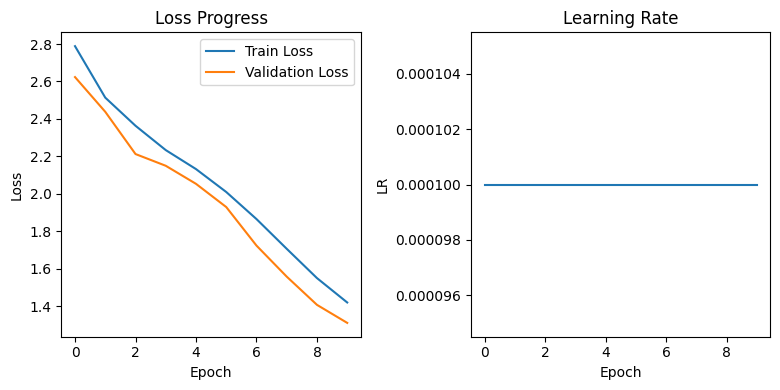

Epoch 11/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 11/50:   0%|          | 1/450 [00:00<07:01,  1.07it/s, Train Loss=1.3082, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 11/50:   0%|          | 2/450 [00:01<05:28,  1.36it/s, Train Loss=1.2967, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 11/50:   1%|          | 3/450 [00:02<04:59,  1.49it/s, Train Loss=1.2969, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 11/50:   1%|          | 4/450 [00:02<04:45,  1.56it/s, Train Loss=1.3908, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 11/50:   1%|          | 5/450 [00:03<04:36,  1.61it/s, Train Loss=1.0668, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 11/50:   1%|▏         | 6/450 [00:03<04:31,  1.64it/s, Train Loss=1.3540, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 11/50:   2%|▏         | 7/450 [00:04<04:27,  1.65it/s, Train Loss=1.2139, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 11/50:   2%|▏         | 8/450 [00:05<04:25,  1.66it/s, Train Loss=1.2385, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 11/50:   2%|▏         | 9/450 [00:05<04:23,  1.68it/s, Train Loss=1.3442, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 11/50:   2%|▏         | 10/450 [00:06<04:22,  1.68it/s, Train Loss=1.3695, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 11/50:   2%|▏         | 11/450 [00:06<04:22,  1.67it/s, Train Loss=1.4610, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 11/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=1.1860, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 11/50:   3%|▎         | 13/450 [00:08<04:19,  1.69it/s, Train Loss=1.2112, LR=0.000100]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 11/50:   3%|▎         | 14/450 [00:08<04:19,  1.68it/s, Train Loss=1.2810, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 11/50:   3%|▎         | 15/450 [00:09<04:18,  1.69it/s, Train Loss=1.3201, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 11/50:   4%|▎         | 16/450 [00:09<04:18,  1.68it/s, Train Loss=1.1243, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 11/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=1.1833, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 11/50:   4%|▍         | 18/450 [00:11<04:16,  1.68it/s, Train Loss=1.4935, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 11/50:   4%|▍         | 19/450 [00:11<04:15,  1.69it/s, Train Loss=1.3531, LR=0.000100]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 11/50:   4%|▍         | 20/450 [00:12<04:13,  1.69it/s, Train Loss=1.4379, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 11/50:   5%|▍         | 21/450 [00:12<04:13,  1.69it/s, Train Loss=1.1982, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 11/50:   5%|▍         | 22/450 [00:13<04:12,  1.69it/s, Train Loss=1.5894, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 11/50:   5%|▌         | 23/450 [00:13<04:12,  1.69it/s, Train Loss=1.0866, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 11/50:   5%|▌         | 24/450 [00:14<04:12,  1.69it/s, Train Loss=1.4613, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 11/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=1.2644, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 11/50:   6%|▌         | 26/450 [00:15<04:11,  1.69it/s, Train Loss=1.5915, LR=0.000100]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 11/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=1.4065, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 11/50:   6%|▌         | 28/450 [00:16<04:10,  1.68it/s, Train Loss=1.2751, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/swbc3a.mpg



Epoch 11/50:   6%|▋         | 29/450 [00:17<04:10,  1.68it/s, Train Loss=1.5571, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 11/50:   7%|▋         | 30/450 [00:18<04:09,  1.68it/s, Train Loss=1.4384, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 11/50:   7%|▋         | 31/450 [00:18<04:08,  1.68it/s, Train Loss=1.3798, LR=0.000100]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 11/50:   7%|▋         | 32/450 [00:19<04:08,  1.68it/s, Train Loss=1.1511, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 11/50:   7%|▋         | 33/450 [00:19<04:07,  1.68it/s, Train Loss=1.1987, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 11/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=1.2181, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 11/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=1.7363, LR=0.000100]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 11/50:   8%|▊         | 36/450 [00:21<04:07,  1.67it/s, Train Loss=1.2631, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 11/50:   8%|▊         | 37/450 [00:22<04:06,  1.67it/s, Train Loss=0.9891, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 11/50:   8%|▊         | 38/450 [00:22<04:05,  1.68it/s, Train Loss=1.5843, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 11/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=1.1665, LR=0.000100]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 11/50:   9%|▉         | 40/450 [00:24<04:04,  1.68it/s, Train Loss=1.4520, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 11/50:   9%|▉         | 41/450 [00:24<04:02,  1.68it/s, Train Loss=1.4452, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 11/50:   9%|▉         | 42/450 [00:25<04:02,  1.68it/s, Train Loss=1.2181, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 11/50:  10%|▉         | 43/450 [00:25<04:00,  1.69it/s, Train Loss=1.3553, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 11/50:  10%|▉         | 44/450 [00:26<04:01,  1.68it/s, Train Loss=1.5603, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 11/50:  10%|█         | 45/450 [00:27<03:59,  1.69it/s, Train Loss=1.3966, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 11/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=1.5538, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 11/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=1.3406, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 11/50:  11%|█         | 48/450 [00:28<03:58,  1.69it/s, Train Loss=1.2344, LR=0.000100]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 11/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=1.4105, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 11/50:  11%|█         | 50/450 [00:30<03:57,  1.68it/s, Train Loss=1.3974, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 11/50:  11%|█▏        | 51/450 [00:30<03:55,  1.69it/s, Train Loss=1.1394, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 11/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=1.4599, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 11/50:  12%|█▏        | 53/450 [00:31<03:55,  1.69it/s, Train Loss=1.2277, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 11/50:  12%|█▏        | 54/450 [00:32<03:54,  1.69it/s, Train Loss=1.4743, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 11/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=1.3571, LR=0.000100]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 11/50:  12%|█▏        | 56/450 [00:33<03:53,  1.69it/s, Train Loss=1.2134, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 11/50:  13%|█▎        | 57/450 [00:34<03:52,  1.69it/s, Train Loss=1.6867, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 11/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=1.2268, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 11/50:  13%|█▎        | 59/450 [00:35<03:50,  1.69it/s, Train Loss=1.5612, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 11/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=1.3748, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 11/50:  14%|█▎        | 61/450 [00:36<03:49,  1.69it/s, Train Loss=1.4339, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 11/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=1.4127, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 11/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=1.3199, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 11/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=1.2796, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 11/50:  14%|█▍        | 65/450 [00:38<03:48,  1.68it/s, Train Loss=1.1879, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 11/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=1.3211, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 11/50:  15%|█▍        | 67/450 [00:40<03:47,  1.69it/s, Train Loss=1.5526, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 11/50:  15%|█▌        | 68/450 [00:40<03:46,  1.68it/s, Train Loss=1.1555, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 11/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=1.1876, LR=0.000100]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 11/50:  16%|█▌        | 70/450 [00:41<03:44,  1.69it/s, Train Loss=1.2134, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 11/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=1.4612, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 11/50:  16%|█▌        | 72/450 [00:43<03:44,  1.68it/s, Train Loss=1.3813, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 11/50:  16%|█▌        | 73/450 [00:43<03:43,  1.69it/s, Train Loss=1.2978, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 11/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=1.7097, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 11/50:  17%|█▋        | 75/450 [00:44<03:42,  1.69it/s, Train Loss=1.5169, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 11/50:  17%|█▋        | 76/450 [00:45<03:40,  1.69it/s, Train Loss=1.4224, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 11/50:  17%|█▋        | 77/450 [00:46<03:41,  1.69it/s, Train Loss=1.1858, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 11/50:  17%|█▋        | 78/450 [00:46<03:40,  1.68it/s, Train Loss=1.6500, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 11/50:  18%|█▊        | 79/450 [00:47<03:40,  1.68it/s, Train Loss=1.3588, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 11/50:  18%|█▊        | 80/450 [00:47<03:39,  1.68it/s, Train Loss=1.2791, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 11/50:  18%|█▊        | 81/450 [00:48<03:39,  1.68it/s, Train Loss=1.3378, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 11/50:  18%|█▊        | 82/450 [00:48<03:38,  1.68it/s, Train Loss=1.2235, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 11/50:  18%|█▊        | 83/450 [00:49<03:38,  1.68it/s, Train Loss=1.3040, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 11/50:  19%|█▊        | 84/450 [00:50<03:37,  1.68it/s, Train Loss=1.2234, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 11/50:  19%|█▉        | 85/450 [00:50<03:36,  1.68it/s, Train Loss=1.3551, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 11/50:  19%|█▉        | 86/450 [00:51<03:36,  1.68it/s, Train Loss=1.2578, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 11/50:  19%|█▉        | 87/450 [00:51<03:35,  1.69it/s, Train Loss=1.2097, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 11/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=1.4783, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 11/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=1.3528, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 11/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=1.0809, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 11/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=1.1382, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 11/50:  20%|██        | 92/450 [00:54<03:32,  1.69it/s, Train Loss=1.2642, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 11/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=1.3598, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 11/50:  21%|██        | 94/450 [00:56<03:31,  1.68it/s, Train Loss=1.4275, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 11/50:  21%|██        | 95/450 [00:56<03:30,  1.69it/s, Train Loss=1.2322, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 11/50:  21%|██▏       | 96/450 [00:57<03:30,  1.68it/s, Train Loss=1.3794, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 11/50:  22%|██▏       | 97/450 [00:57<03:30,  1.68it/s, Train Loss=1.8820, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 11/50:  22%|██▏       | 98/450 [00:58<03:29,  1.68it/s, Train Loss=1.2577, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 11/50:  22%|██▏       | 99/450 [00:59<03:28,  1.68it/s, Train Loss=1.2028, LR=0.000100]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 11/50:  22%|██▏       | 100/450 [00:59<03:28,  1.68it/s, Train Loss=1.6018, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 11/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=1.3685, LR=0.000100]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 11/50:  23%|██▎       | 102/450 [01:00<03:26,  1.68it/s, Train Loss=1.3959, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 11/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=1.3231, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 11/50:  23%|██▎       | 104/450 [01:02<03:25,  1.68it/s, Train Loss=1.3507, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 11/50:  23%|██▎       | 105/450 [01:02<03:24,  1.69it/s, Train Loss=1.9099, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv6n.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 11/50:  24%|██▎       | 106/450 [01:03<03:23,  1.69it/s, Train Loss=1.4431, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 11/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=1.3987, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 11/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=1.3258, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 11/50:  24%|██▍       | 109/450 [01:05<03:22,  1.69it/s, Train Loss=1.1765, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 11/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=1.1683, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 11/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=1.1739, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 11/50:  25%|██▍       | 112/450 [01:06<03:20,  1.68it/s, Train Loss=1.4400, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 11/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=1.5029, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 11/50:  25%|██▌       | 114/450 [01:07<03:19,  1.68it/s, Train Loss=1.1933, LR=0.000100]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 11/50:  26%|██▌       | 115/450 [01:08<03:18,  1.68it/s, Train Loss=1.3811, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 11/50:  26%|██▌       | 116/450 [01:09<03:18,  1.68it/s, Train Loss=1.2113, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 11/50:  26%|██▌       | 117/450 [01:09<03:18,  1.68it/s, Train Loss=1.2168, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 11/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=1.5562, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 11/50:  26%|██▋       | 119/450 [01:10<03:16,  1.68it/s, Train Loss=1.2514, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 11/50:  27%|██▋       | 120/450 [01:11<03:17,  1.67it/s, Train Loss=1.2544, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 11/50:  27%|██▋       | 121/450 [01:12<03:16,  1.68it/s, Train Loss=1.1828, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 11/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=1.3737, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 11/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=1.4486, LR=0.000100]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 11/50:  28%|██▊       | 124/450 [01:13<03:13,  1.68it/s, Train Loss=1.2011, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 11/50:  28%|██▊       | 125/450 [01:14<03:14,  1.67it/s, Train Loss=1.3353, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 11/50:  28%|██▊       | 126/450 [01:15<03:12,  1.68it/s, Train Loss=1.3333, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 11/50:  28%|██▊       | 127/450 [01:15<03:11,  1.68it/s, Train Loss=1.4098, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 11/50:  28%|██▊       | 128/450 [01:16<03:11,  1.68it/s, Train Loss=1.3493, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 11/50:  29%|██▊       | 129/450 [01:16<03:10,  1.69it/s, Train Loss=1.2407, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 11/50:  29%|██▉       | 130/450 [01:17<03:08,  1.69it/s, Train Loss=1.0837, LR=0.000100]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 11/50:  29%|██▉       | 131/450 [01:18<03:08,  1.69it/s, Train Loss=1.3713, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 11/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=1.1575, LR=0.000100]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 11/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=1.1258, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 11/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=1.4239, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 11/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=1.4961, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 11/50:  30%|███       | 136/450 [01:21<03:06,  1.69it/s, Train Loss=1.4727, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 11/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=1.2071, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 11/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=1.2255, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 11/50:  31%|███       | 139/450 [01:22<03:05,  1.68it/s, Train Loss=1.2678, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 11/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=1.2382, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 11/50:  31%|███▏      | 141/450 [01:24<03:03,  1.69it/s, Train Loss=1.2295, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 11/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=1.3907, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 11/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=1.4673, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 11/50:  32%|███▏      | 144/450 [01:25<03:01,  1.68it/s, Train Loss=1.2000, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 11/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=1.5006, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 11/50:  32%|███▏      | 146/450 [01:26<03:00,  1.69it/s, Train Loss=1.4674, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 11/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=1.1866, LR=0.000100]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 11/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=1.3576, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 11/50:  33%|███▎      | 149/450 [01:28<02:58,  1.69it/s, Train Loss=1.2021, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 11/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=1.1662, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 11/50:  34%|███▎      | 151/450 [01:29<02:57,  1.69it/s, Train Loss=1.1931, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 11/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=1.2063, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 11/50:  34%|███▍      | 153/450 [01:31<02:56,  1.68it/s, Train Loss=1.3910, LR=0.000100]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 11/50:  34%|███▍      | 154/450 [01:31<02:55,  1.68it/s, Train Loss=1.4635, LR=0.000100]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 11/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=1.2883, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 11/50:  35%|███▍      | 156/450 [01:32<02:53,  1.69it/s, Train Loss=1.3256, LR=0.000100]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 11/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=1.1875, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 11/50:  35%|███▌      | 158/450 [01:34<02:52,  1.70it/s, Train Loss=1.3473, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 11/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=1.1817, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 11/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=1.4822, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 11/50:  36%|███▌      | 161/450 [01:35<02:50,  1.69it/s, Train Loss=1.1977, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 11/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=1.3411, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 11/50:  36%|███▌      | 163/450 [01:37<02:50,  1.68it/s, Train Loss=1.0497, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 11/50:  36%|███▋      | 164/450 [01:37<02:49,  1.68it/s, Train Loss=1.4007, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 11/50:  37%|███▋      | 165/450 [01:38<02:49,  1.68it/s, Train Loss=1.2418, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 11/50:  37%|███▋      | 166/450 [01:38<02:49,  1.68it/s, Train Loss=1.7278, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 11/50:  37%|███▋      | 167/450 [01:39<02:49,  1.67it/s, Train Loss=1.2208, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 11/50:  37%|███▋      | 168/450 [01:40<02:48,  1.68it/s, Train Loss=1.3974, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 11/50:  38%|███▊      | 169/450 [01:40<02:46,  1.68it/s, Train Loss=1.3694, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 11/50:  38%|███▊      | 170/450 [01:41<02:46,  1.68it/s, Train Loss=1.3316, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 11/50:  38%|███▊      | 171/450 [01:41<02:46,  1.68it/s, Train Loss=1.3096, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv4p.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 11/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=1.0798, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 11/50:  38%|███▊      | 173/450 [01:42<02:44,  1.68it/s, Train Loss=1.5091, LR=0.000100]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 11/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=1.4712, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 11/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=1.1008, LR=0.000100]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 11/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=1.1670, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 11/50:  39%|███▉      | 177/450 [01:45<02:42,  1.68it/s, Train Loss=1.1457, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 11/50:  40%|███▉      | 178/450 [01:45<02:41,  1.68it/s, Train Loss=1.2138, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 11/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=1.3444, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 11/50:  40%|████      | 180/450 [01:47<02:39,  1.69it/s, Train Loss=1.1552, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 11/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=1.2282, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 11/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=1.3128, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 11/50:  41%|████      | 183/450 [01:48<02:37,  1.70it/s, Train Loss=1.4102, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 11/50:  41%|████      | 184/450 [01:49<02:36,  1.70it/s, Train Loss=1.5581, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 11/50:  41%|████      | 185/450 [01:50<02:36,  1.70it/s, Train Loss=1.3735, LR=0.000100]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 11/50:  41%|████▏     | 186/450 [01:50<02:35,  1.70it/s, Train Loss=1.4200, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 11/50:  42%|████▏     | 187/450 [01:51<02:34,  1.70it/s, Train Loss=1.4726, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 11/50:  42%|████▏     | 188/450 [01:51<02:34,  1.69it/s, Train Loss=1.3032, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 11/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=1.3161, LR=0.000100]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 11/50:  42%|████▏     | 190/450 [01:53<02:33,  1.69it/s, Train Loss=1.4203, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 11/50:  42%|████▏     | 191/450 [01:53<02:34,  1.68it/s, Train Loss=1.5357, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 11/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=1.1398, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 11/50:  43%|████▎     | 193/450 [01:54<02:32,  1.68it/s, Train Loss=1.4071, LR=0.000100]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 11/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=1.0954, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 11/50:  43%|████▎     | 195/450 [01:56<02:31,  1.69it/s, Train Loss=1.3787, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 11/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=1.3845, LR=0.000100]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 11/50:  44%|████▍     | 197/450 [01:57<02:30,  1.69it/s, Train Loss=1.3382, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 11/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=1.5318, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 11/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=1.5220, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 11/50:  44%|████▍     | 200/450 [01:58<02:28,  1.69it/s, Train Loss=1.2699, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 11/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=1.5005, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 11/50:  45%|████▍     | 202/450 [02:00<02:27,  1.68it/s, Train Loss=1.3507, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 11/50:  45%|████▌     | 203/450 [02:00<02:27,  1.68it/s, Train Loss=1.1219, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 11/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=1.1751, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 11/50:  46%|████▌     | 205/450 [02:01<02:25,  1.69it/s, Train Loss=1.3708, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 11/50:  46%|████▌     | 206/450 [02:02<02:25,  1.68it/s, Train Loss=1.7950, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 11/50:  46%|████▌     | 207/450 [02:03<02:25,  1.67it/s, Train Loss=1.3946, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 11/50:  46%|████▌     | 208/450 [02:03<02:24,  1.67it/s, Train Loss=1.3837, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 11/50:  46%|████▋     | 209/450 [02:04<02:23,  1.68it/s, Train Loss=1.1558, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 11/50:  47%|████▋     | 210/450 [02:04<02:22,  1.68it/s, Train Loss=1.3893, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 11/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=1.2053, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 11/50:  47%|████▋     | 212/450 [02:06<02:21,  1.68it/s, Train Loss=1.5357, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 11/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=1.3084, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 11/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=1.1205, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 11/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=1.3894, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 11/50:  48%|████▊     | 216/450 [02:08<02:18,  1.68it/s, Train Loss=1.3165, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 11/50:  48%|████▊     | 217/450 [02:09<02:18,  1.68it/s, Train Loss=1.2505, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 11/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=1.2980, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 11/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=1.1199, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 11/50:  49%|████▉     | 220/450 [02:10<02:15,  1.69it/s, Train Loss=1.3924, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 11/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=1.4047, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 11/50:  49%|████▉     | 222/450 [02:12<02:15,  1.68it/s, Train Loss=1.3479, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 11/50:  50%|████▉     | 223/450 [02:12<02:14,  1.68it/s, Train Loss=1.4380, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 11/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=1.4900, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 11/50:  50%|█████     | 225/450 [02:13<02:13,  1.69it/s, Train Loss=1.1472, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 11/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=1.1884, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 11/50:  50%|█████     | 227/450 [02:15<02:12,  1.69it/s, Train Loss=1.2823, LR=0.000100]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 11/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=1.5285, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 11/50:  51%|█████     | 229/450 [02:16<02:10,  1.69it/s, Train Loss=1.4023, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 11/50:  51%|█████     | 230/450 [02:16<02:09,  1.69it/s, Train Loss=1.0737, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 11/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=1.2732, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 11/50:  52%|█████▏    | 232/450 [02:17<02:08,  1.70it/s, Train Loss=1.1916, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 11/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=1.1195, LR=0.000100]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 11/50:  52%|█████▏    | 234/450 [02:19<02:07,  1.69it/s, Train Loss=1.3813, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 11/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=1.1921, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 11/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=1.3961, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 11/50:  53%|█████▎    | 237/450 [02:20<02:05,  1.69it/s, Train Loss=1.6213, LR=0.000100]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 11/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=1.1173, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 11/50:  53%|█████▎    | 239/450 [02:22<02:04,  1.70it/s, Train Loss=1.2472, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 11/50:  53%|█████▎    | 240/450 [02:22<02:03,  1.70it/s, Train Loss=1.3294, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 11/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=1.3625, LR=0.000100]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 11/50:  54%|█████▍    | 242/450 [02:23<02:02,  1.69it/s, Train Loss=1.3595, LR=0.000100]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 11/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=1.4345, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 11/50:  54%|█████▍    | 244/450 [02:25<02:02,  1.68it/s, Train Loss=1.2916, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 11/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=1.3462, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 11/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=1.1632, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 11/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.68it/s, Train Loss=1.2387, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 11/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=1.4806, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 11/50:  55%|█████▌    | 249/450 [02:28<01:59,  1.68it/s, Train Loss=1.1725, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 11/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.68it/s, Train Loss=1.1223, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 11/50:  56%|█████▌    | 251/450 [02:29<01:58,  1.68it/s, Train Loss=1.3139, LR=0.000100]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 11/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.68it/s, Train Loss=1.4553, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 11/50:  56%|█████▌    | 253/450 [02:30<01:57,  1.68it/s, Train Loss=1.3271, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 11/50:  56%|█████▋    | 254/450 [02:31<01:56,  1.68it/s, Train Loss=1.2041, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 11/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=1.2738, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 11/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.69it/s, Train Loss=1.2753, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 11/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=1.2179, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 11/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.68it/s, Train Loss=1.3335, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 11/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.68it/s, Train Loss=1.0365, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 11/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=1.4558, LR=0.000100]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 11/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.69it/s, Train Loss=1.1797, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 11/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=1.4146, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 11/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=1.2892, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 11/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=1.3502, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 11/50:  59%|█████▉    | 265/450 [02:37<01:51,  1.67it/s, Train Loss=1.3979, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 11/50:  59%|█████▉    | 266/450 [02:38<01:50,  1.67it/s, Train Loss=1.1436, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 11/50:  59%|█████▉    | 267/450 [02:38<01:49,  1.68it/s, Train Loss=1.4650, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 11/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.67it/s, Train Loss=1.2222, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 11/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.68it/s, Train Loss=1.4364, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 11/50:  60%|██████    | 270/450 [02:40<01:47,  1.68it/s, Train Loss=1.4013, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 11/50:  60%|██████    | 271/450 [02:41<01:46,  1.69it/s, Train Loss=1.3767, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 11/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.9886, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 11/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=1.0955, LR=0.000100]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 11/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=1.3072, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 11/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=1.3519, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 11/50:  61%|██████▏   | 276/450 [02:44<01:43,  1.69it/s, Train Loss=1.3867, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 11/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=1.5984, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 11/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.69it/s, Train Loss=1.4392, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 11/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=1.2352, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 11/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=1.3375, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 11/50:  62%|██████▏   | 281/450 [02:47<01:39,  1.69it/s, Train Loss=1.2811, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 11/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=1.5792, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 11/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=1.1760, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 11/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=1.2876, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 11/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=1.2150, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 11/50:  64%|██████▎   | 286/450 [02:49<01:36,  1.69it/s, Train Loss=1.1360, LR=0.000100]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 11/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=1.2932, LR=0.000100]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 11/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.69it/s, Train Loss=1.1553, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 11/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.68it/s, Train Loss=1.2810, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 11/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=1.4026, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 11/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=1.2622, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 11/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=1.2832, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 11/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.69it/s, Train Loss=1.1494, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 11/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=1.3827, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 11/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=1.1140, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 11/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=1.2156, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 11/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.68it/s, Train Loss=1.3051, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 11/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.68it/s, Train Loss=1.4525, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 11/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.68it/s, Train Loss=1.4197, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 11/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=1.3017, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 11/50:  67%|██████▋   | 301/450 [02:58<01:27,  1.70it/s, Train Loss=1.3911, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 11/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=1.2166, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 11/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.68it/s, Train Loss=1.4484, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 11/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=1.6672, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 11/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=1.3427, LR=0.000100]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 11/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=1.2340, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 11/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=1.2768, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 11/50:  68%|██████▊   | 308/450 [03:03<01:23,  1.69it/s, Train Loss=1.1518, LR=0.000100]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 11/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=1.5515, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 11/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=1.2263, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 11/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=1.6690, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 11/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=1.0146, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 11/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.68it/s, Train Loss=1.2351, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 11/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=1.2839, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 11/50:  70%|███████   | 315/450 [03:07<01:20,  1.68it/s, Train Loss=1.3694, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 11/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=1.4392, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 11/50:  70%|███████   | 317/450 [03:08<01:19,  1.68it/s, Train Loss=1.3394, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 11/50:  71%|███████   | 318/450 [03:08<01:18,  1.68it/s, Train Loss=1.1944, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 11/50:  71%|███████   | 319/450 [03:09<01:17,  1.68it/s, Train Loss=1.3888, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 11/50:  71%|███████   | 320/450 [03:10<01:17,  1.68it/s, Train Loss=0.9708, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr6p.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 11/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=1.0975, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 11/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=1.3685, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 11/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=1.1680, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 11/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.68it/s, Train Loss=1.4165, LR=0.000100]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 11/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.68it/s, Train Loss=1.4412, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 11/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.68it/s, Train Loss=1.2235, LR=0.000100]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 11/50:  73%|███████▎  | 327/450 [03:14<01:13,  1.68it/s, Train Loss=1.2973, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 11/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=1.2348, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 11/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=1.9869, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 11/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.69it/s, Train Loss=1.3623, LR=0.000100]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 11/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=1.3892, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 11/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=1.2238, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 11/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.68it/s, Train Loss=1.4314, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 11/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=1.0745, LR=0.000100]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 11/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.68it/s, Train Loss=1.1734, LR=0.000100]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 11/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=1.2616, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 11/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.69it/s, Train Loss=1.0653, LR=0.000100]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 11/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.68it/s, Train Loss=0.9188, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 11/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=1.3878, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 11/50:  76%|███████▌  | 340/450 [03:21<01:04,  1.69it/s, Train Loss=1.1392, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 11/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=1.2452, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 11/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.68it/s, Train Loss=1.0705, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 11/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.67it/s, Train Loss=1.1449, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 11/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.68it/s, Train Loss=1.0065, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 11/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=1.0598, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 11/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=1.4021, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 11/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.69it/s, Train Loss=1.9547, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 11/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=1.1068, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 11/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=1.3415, LR=0.000100]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 11/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=1.0883, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 11/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=1.0554, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 11/50:  78%|███████▊  | 352/450 [03:29<00:57,  1.69it/s, Train Loss=1.0027, LR=0.000100]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 11/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=1.2855, LR=0.000100]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 11/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=1.5503, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 11/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=1.1027, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 11/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=1.0033, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 11/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.69it/s, Train Loss=1.7151, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 11/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=1.1304, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 11/50:  80%|███████▉  | 359/450 [03:33<00:54,  1.68it/s, Train Loss=1.4443, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 11/50:  80%|████████  | 360/450 [03:33<00:53,  1.68it/s, Train Loss=1.4812, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 11/50:  80%|████████  | 361/450 [03:34<00:52,  1.68it/s, Train Loss=1.2249, LR=0.000100]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 11/50:  80%|████████  | 362/450 [03:35<00:52,  1.69it/s, Train Loss=1.2639, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 11/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=1.5457, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 11/50:  81%|████████  | 364/450 [03:36<00:50,  1.69it/s, Train Loss=1.4640, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 11/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=1.2717, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 11/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=1.5737, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 11/50:  82%|████████▏ | 367/450 [03:38<00:49,  1.68it/s, Train Loss=1.1579, LR=0.000100]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 11/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=1.0796, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 11/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.68it/s, Train Loss=1.2350, LR=0.000100]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 11/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.68it/s, Train Loss=1.3890, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 11/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=1.5598, LR=0.000100]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 11/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=1.0181, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 11/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=1.1407, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 11/50:  83%|████████▎ | 374/450 [03:42<00:44,  1.69it/s, Train Loss=1.2685, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 11/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=1.2468, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 11/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=1.2442, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 11/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=1.2462, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 11/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.70it/s, Train Loss=1.4335, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 11/50:  84%|████████▍ | 379/450 [03:45<00:41,  1.70it/s, Train Loss=1.2090, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 11/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=1.2608, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 11/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=1.3250, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 11/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=1.1402, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 11/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.68it/s, Train Loss=1.5346, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 11/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.69it/s, Train Loss=1.2459, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 11/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.68it/s, Train Loss=1.2843, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 11/50:  86%|████████▌ | 386/450 [03:49<00:38,  1.68it/s, Train Loss=1.1396, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 11/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=1.2193, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 11/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.9890, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 11/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.69it/s, Train Loss=1.1085, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 11/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=1.2958, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 11/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.69it/s, Train Loss=1.1755, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 11/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.68it/s, Train Loss=1.6209, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 11/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=1.3141, LR=0.000100]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 11/50:  88%|████████▊ | 394/450 [03:54<00:33,  1.69it/s, Train Loss=1.2826, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 11/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=1.1472, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 11/50:  88%|████████▊ | 396/450 [03:55<00:31,  1.70it/s, Train Loss=1.3400, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 11/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.70it/s, Train Loss=1.2837, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 11/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=1.2187, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 11/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=1.1394, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 11/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=1.1871, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 11/50:  89%|████████▉ | 401/450 [03:58<00:28,  1.69it/s, Train Loss=1.0385, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 11/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=1.1713, LR=0.000100]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 11/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=1.4354, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 11/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.70it/s, Train Loss=1.3744, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 11/50:  90%|█████████ | 405/450 [04:00<00:26,  1.70it/s, Train Loss=1.2635, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 11/50:  90%|█████████ | 406/450 [04:01<00:25,  1.70it/s, Train Loss=1.3244, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 11/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=1.4250, LR=0.000100]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 11/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=1.1647, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 11/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=1.3542, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 11/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=1.1910, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 11/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.69it/s, Train Loss=1.1138, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 11/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=1.8768, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 11/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=1.0724, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 11/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.68it/s, Train Loss=1.1767, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 11/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.68it/s, Train Loss=1.2817, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 11/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.68it/s, Train Loss=1.2638, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 11/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=1.4862, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 11/50:  93%|█████████▎| 418/450 [04:08<00:19,  1.68it/s, Train Loss=1.2895, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 11/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=1.0814, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 11/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=1.3001, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 11/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=1.1456, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 11/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=1.4021, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 11/50:  94%|█████████▍| 423/450 [04:11<00:15,  1.69it/s, Train Loss=1.4789, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 11/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.9125, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 11/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=1.3188, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 11/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=1.2828, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 11/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=1.1660, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 11/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=1.2047, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 11/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=1.0234, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 11/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=1.1868, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 11/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=1.0949, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 11/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.68it/s, Train Loss=1.1777, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 11/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=1.4983, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 11/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=1.2003, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 11/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=1.2347, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 11/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.68it/s, Train Loss=1.2117, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 11/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.67it/s, Train Loss=1.3126, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 11/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.68it/s, Train Loss=1.0069, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 11/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=1.4187, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 11/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=1.3568, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 11/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=1.0589, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 11/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=1.0887, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 11/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.69it/s, Train Loss=1.5231, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 11/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=1.1088, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 11/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=1.1928, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 11/50: 100%|██████████| 450/450 [04:27<00:00,  1.69it/s, Train Loss=1.0677, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg


Validation:   0%|          | 0/50 [00:00<?, ?it/s, Val Loss=1.3416]


Validation:   2%|▏         | 1/50 [00:00<00:26,  1.83it/s, Val Loss=1.3416]

Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg


Validation:   4%|▍         | 2/50 [00:00<00:16,  2.98it/s, Val Loss=1.1655]


Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg


Validation:   6%|▌         | 3/50 [00:00<00:12,  3.81it/s, Val Loss=1.3079]


Attempting to read 75 frames from data/s1/pgwr4n.mpg



Validation:   8%|▊         | 4/50 [00:01<00:10,  4.41it/s, Val Loss=1.1236]

Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg


Validation:  10%|█         | 5/50 [00:01<00:10,  4.37it/s, Val Loss=1.1596]


Attempting to read 75 frames from data/s1/pwix3a.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.70it/s, Val Loss=1.3748]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.84it/s, Val Loss=1.3826]

Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg
Attempting to read 75 frames from data/s1/lbby5a.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.90it/s, Val Loss=1.1401]

Attempting to read 75 frames from data/s1/bril9s.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.06it/s, Val Loss=1.2331]

Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.06it/s, Val Loss=1.1596]

Attempting to read 75 frames from data/s1/bram5a.mpg


Validation:  20%|██        | 10/50 [00:02<00:07,  5.10it/s, Val Loss=1.1596]

Attempting to read 75 frames from data/s1/brimzp.mpg



Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.10it/s, Val Loss=1.6157]

Attempting to read 75 frames from data/s1/lwbszn.mpg


Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.06it/s, Val Loss=1.6157]


Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.21it/s, Val Loss=0.8238]

Attempting to read 75 frames from data/s1/srah4n.mpg
Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg


Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.26it/s, Val Loss=1.2122]


Attempting to read 75 frames from data/s1/prii7s.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.30it/s, Val Loss=1.0428]

Attempting to read 75 frames from data/s1/bbir9a.mpg

Attempting to read 75 frames from data/s1/lgil5s.mpg




Validation:  30%|███       | 15/50 [00:03<00:06,  5.21it/s, Val Loss=1.1650]

Attempting to read 75 frames from data/s1/lriq8p.mpgAttempting to read 75 frames from data/s1/lgbs9a.mpg




Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.19it/s, Val Loss=1.3087]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  4.95it/s, Val Loss=1.0275]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.07it/s, Val Loss=1.5086]

Attempting to read 75 frames from data/s1/lgwm9a.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.22it/s, Val Loss=0.9189]

Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.27it/s, Val Loss=1.1270]

Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.28it/s, Val Loss=2.0625]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.36it/s, Val Loss=0.8932]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:04,  5.40it/s, Val Loss=1.3030]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg
Attempting to read 75 frames from data/s1/prajzn.mpg


Validation:  46%|████▌     | 23/50 [00:04<00:04,  5.40it/s, Val Loss=1.0320]


Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.43it/s, Val Loss=1.0320]

Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.46it/s, Val Loss=1.2278]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg


Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.45it/s, Val Loss=1.0929]


Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.52it/s, Val Loss=1.1321]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg


Attempting to read 75 frames from data/s1/lbid2n.mpg

Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.49it/s, Val Loss=1.7665]


Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.52it/s, Val Loss=1.2484]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  60%|██████    | 30/50 [00:05<00:03,  5.58it/s, Val Loss=1.5301]

Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.51it/s, Val Loss=1.2707]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.52it/s, Val Loss=1.2700]

Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.55it/s, Val Loss=1.0640]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.50it/s, Val Loss=1.2309]

Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.57it/s, Val Loss=0.9784]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.57it/s, Val Loss=1.2385]

Attempting to read 75 frames from data/s1/lgwtzn.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.42it/s, Val Loss=1.3462]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/sgiczp.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.44it/s, Val Loss=1.1787]

Attempting to read 75 frames from data/s1/srbb5s.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.49it/s, Val Loss=1.1968]

Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  80%|████████  | 40/50 [00:07<00:01,  5.39it/s, Val Loss=1.2309]

Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg


Validation:  80%|████████  | 40/50 [00:08<00:01,  5.39it/s, Val Loss=1.5040]



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.43it/s, Val Loss=1.5040]

Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/pgiq2n.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.31it/s, Val Loss=0.9775]

Attempting to read 75 frames from data/s1/bgbb3a.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.44it/s, Val Loss=1.0172]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.48it/s, Val Loss=1.3232]

Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.55it/s, Val Loss=0.9369]

Attempting to read 75 frames from data/s1/srbo2n.mpg


Attempting to read 75 frames from data/s1/sgbxzp.mpgAttempting to read 75 frames from data/s1/lbaq6p.mpg

Validation:  92%|█████████▏| 46/50 [00:08<00:00,  5.47it/s, Val Loss=1.6728]


Validation:  94%|█████████▍| 47/50 [00:09<00:00,  5.56it/s, Val Loss=1.1869]

Attempting to read 75 frames from data/s1/prap5s.mpg



Training Progress:  22%|██▏       | 11/50 [50:52<3:00:21, 277.47s/it, Train Loss=1.3073, Val Loss=1.2352, Best Loss=1.2352]


🏆 New best model saved with validation loss: 1.2352



Epoch 12/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 12/50:   0%|          | 1/450 [00:00<07:17,  1.03it/s, Train Loss=1.1836, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 12/50:   0%|          | 2/450 [00:01<05:34,  1.34it/s, Train Loss=1.3857, LR=0.000100]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 12/50:   1%|          | 3/450 [00:02<05:03,  1.48it/s, Train Loss=1.4635, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 12/50:   1%|          | 4/450 [00:02<04:46,  1.56it/s, Train Loss=0.9979, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 12/50:   1%|          | 5/450 [00:03<04:37,  1.60it/s, Train Loss=1.1661, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 12/50:   1%|▏         | 6/450 [00:03<04:34,  1.62it/s, Train Loss=1.1675, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 12/50:   2%|▏         | 7/450 [00:04<04:29,  1.64it/s, Train Loss=1.2644, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 12/50:   2%|▏         | 8/450 [00:05<04:26,  1.66it/s, Train Loss=1.0114, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 12/50:   2%|▏         | 9/450 [00:05<04:24,  1.67it/s, Train Loss=1.4830, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 12/50:   2%|▏         | 10/450 [00:06<04:22,  1.68it/s, Train Loss=1.3615, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 12/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=1.3443, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 12/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=1.2162, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 12/50:   3%|▎         | 13/450 [00:08<04:19,  1.68it/s, Train Loss=1.1749, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 12/50:   3%|▎         | 14/450 [00:08<04:19,  1.68it/s, Train Loss=1.0385, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 12/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=1.1643, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 12/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=1.1457, LR=0.000100]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 12/50:   4%|▍         | 17/450 [00:10<04:15,  1.69it/s, Train Loss=1.1209, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 12/50:   4%|▍         | 18/450 [00:11<04:14,  1.69it/s, Train Loss=0.9407, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 12/50:   4%|▍         | 19/450 [00:11<04:14,  1.69it/s, Train Loss=1.1553, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 12/50:   4%|▍         | 20/450 [00:12<04:13,  1.70it/s, Train Loss=1.3219, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 12/50:   5%|▍         | 21/450 [00:12<04:13,  1.69it/s, Train Loss=1.0664, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 12/50:   5%|▍         | 22/450 [00:13<04:12,  1.69it/s, Train Loss=0.9702, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 12/50:   5%|▌         | 23/450 [00:13<04:12,  1.69it/s, Train Loss=1.1668, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 12/50:   5%|▌         | 24/450 [00:14<04:12,  1.69it/s, Train Loss=1.4497, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 12/50:   6%|▌         | 25/450 [00:15<04:11,  1.69it/s, Train Loss=1.1590, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 12/50:   6%|▌         | 26/450 [00:15<04:12,  1.68it/s, Train Loss=1.1679, LR=0.000100]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 12/50:   6%|▌         | 27/450 [00:16<04:11,  1.68it/s, Train Loss=1.0354, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 12/50:   6%|▌         | 28/450 [00:16<04:11,  1.68it/s, Train Loss=1.3648, LR=0.000100]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 12/50:   6%|▋         | 29/450 [00:17<04:10,  1.68it/s, Train Loss=1.3486, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 12/50:   7%|▋         | 30/450 [00:18<04:09,  1.69it/s, Train Loss=1.3108, LR=0.000100]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 12/50:   7%|▋         | 31/450 [00:18<04:09,  1.68it/s, Train Loss=1.1355, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 12/50:   7%|▋         | 32/450 [00:19<04:09,  1.68it/s, Train Loss=1.3451, LR=0.000100]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 12/50:   7%|▋         | 33/450 [00:19<04:08,  1.68it/s, Train Loss=1.0436, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 12/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=1.0163, LR=0.000100]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 12/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=1.3020, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 12/50:   8%|▊         | 36/450 [00:21<04:05,  1.68it/s, Train Loss=1.2739, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 12/50:   8%|▊         | 37/450 [00:22<04:05,  1.68it/s, Train Loss=1.1957, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 12/50:   8%|▊         | 38/450 [00:22<04:04,  1.68it/s, Train Loss=1.3695, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 12/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=1.1824, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 12/50:   9%|▉         | 40/450 [00:24<04:03,  1.69it/s, Train Loss=0.9936, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 12/50:   9%|▉         | 41/450 [00:24<04:02,  1.68it/s, Train Loss=1.0999, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 12/50:   9%|▉         | 42/450 [00:25<04:02,  1.68it/s, Train Loss=0.9989, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 12/50:  10%|▉         | 43/450 [00:25<04:02,  1.68it/s, Train Loss=1.1459, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 12/50:  10%|▉         | 44/450 [00:26<04:01,  1.68it/s, Train Loss=1.2467, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 12/50:  10%|█         | 45/450 [00:27<04:01,  1.68it/s, Train Loss=1.1218, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 12/50:  10%|█         | 46/450 [00:27<04:00,  1.68it/s, Train Loss=1.0980, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 12/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=1.0169, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 12/50:  11%|█         | 48/450 [00:28<03:59,  1.68it/s, Train Loss=1.1831, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 12/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=1.0665, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 12/50:  11%|█         | 50/450 [00:30<03:59,  1.67it/s, Train Loss=1.4355, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 12/50:  11%|█▏        | 51/450 [00:30<03:58,  1.68it/s, Train Loss=1.4500, LR=0.000100]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 12/50:  12%|█▏        | 52/450 [00:31<03:57,  1.68it/s, Train Loss=1.1920, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 12/50:  12%|█▏        | 53/450 [00:31<03:55,  1.69it/s, Train Loss=1.1898, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 12/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=1.2679, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 12/50:  12%|█▏        | 55/450 [00:33<03:54,  1.68it/s, Train Loss=0.9454, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 12/50:  12%|█▏        | 56/450 [00:33<03:54,  1.68it/s, Train Loss=1.2197, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 12/50:  13%|█▎        | 57/450 [00:34<03:53,  1.69it/s, Train Loss=1.3678, LR=0.000100]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 12/50:  13%|█▎        | 58/450 [00:34<03:51,  1.69it/s, Train Loss=1.2557, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 12/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=1.3728, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 12/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=1.1221, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 12/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=1.5445, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 12/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=1.2936, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 12/50:  14%|█▍        | 63/450 [00:37<03:48,  1.69it/s, Train Loss=1.2683, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 12/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=1.1535, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 12/50:  14%|█▍        | 65/450 [00:38<03:48,  1.69it/s, Train Loss=1.1347, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 12/50:  15%|█▍        | 66/450 [00:39<03:48,  1.68it/s, Train Loss=1.5822, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 12/50:  15%|█▍        | 67/450 [00:40<03:48,  1.68it/s, Train Loss=1.1421, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 12/50:  15%|█▌        | 68/450 [00:40<03:46,  1.68it/s, Train Loss=0.9748, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 12/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=1.1186, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 12/50:  16%|█▌        | 70/450 [00:41<03:45,  1.69it/s, Train Loss=1.4747, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 12/50:  16%|█▌        | 71/450 [00:42<03:44,  1.69it/s, Train Loss=1.1514, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 12/50:  16%|█▌        | 72/450 [00:43<03:43,  1.69it/s, Train Loss=1.0951, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 12/50:  16%|█▌        | 73/450 [00:43<03:41,  1.70it/s, Train Loss=0.9326, LR=0.000100]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 12/50:  16%|█▋        | 74/450 [00:44<03:41,  1.69it/s, Train Loss=1.2225, LR=0.000100]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 12/50:  17%|█▋        | 75/450 [00:44<03:41,  1.70it/s, Train Loss=1.1426, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 12/50:  17%|█▋        | 76/450 [00:45<03:40,  1.69it/s, Train Loss=1.3885, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 12/50:  17%|█▋        | 77/450 [00:46<03:40,  1.69it/s, Train Loss=1.1877, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 12/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=1.0474, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 12/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=1.1846, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 12/50:  18%|█▊        | 80/450 [00:47<03:39,  1.68it/s, Train Loss=1.1127, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 12/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=1.0898, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 12/50:  18%|█▊        | 82/450 [00:49<03:37,  1.69it/s, Train Loss=1.0623, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 12/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=1.0260, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 12/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=1.5553, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 12/50:  19%|█▉        | 85/450 [00:50<03:35,  1.69it/s, Train Loss=1.1773, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 12/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=1.4682, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 12/50:  19%|█▉        | 87/450 [00:51<03:35,  1.69it/s, Train Loss=1.2108, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 12/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=1.4038, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 12/50:  20%|█▉        | 89/450 [00:53<03:34,  1.68it/s, Train Loss=0.9925, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 12/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=1.4629, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 12/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=1.4226, LR=0.000100]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 12/50:  20%|██        | 92/450 [00:54<03:32,  1.68it/s, Train Loss=0.8886, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 12/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=1.2607, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 12/50:  21%|██        | 94/450 [00:56<03:31,  1.68it/s, Train Loss=1.0138, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 12/50:  21%|██        | 95/450 [00:56<03:31,  1.68it/s, Train Loss=1.2196, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 12/50:  21%|██▏       | 96/450 [00:57<03:30,  1.68it/s, Train Loss=1.1168, LR=0.000100]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 12/50:  22%|██▏       | 97/450 [00:57<03:29,  1.69it/s, Train Loss=1.1455, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 12/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=1.1408, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 12/50:  22%|██▏       | 99/450 [00:59<03:28,  1.68it/s, Train Loss=1.0065, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 12/50:  22%|██▏       | 100/450 [00:59<03:28,  1.68it/s, Train Loss=1.7366, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 12/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=1.3683, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 12/50:  23%|██▎       | 102/450 [01:00<03:26,  1.68it/s, Train Loss=1.2104, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 12/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=1.3313, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 12/50:  23%|██▎       | 104/450 [01:02<03:25,  1.68it/s, Train Loss=1.6084, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 12/50:  23%|██▎       | 105/450 [01:02<03:26,  1.67it/s, Train Loss=1.0720, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 12/50:  24%|██▎       | 106/450 [01:03<03:24,  1.68it/s, Train Loss=1.3288, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 12/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=1.2213, LR=0.000100]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 12/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=1.2514, LR=0.000100]

Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 12/50:  24%|██▍       | 109/450 [01:05<03:22,  1.68it/s, Train Loss=1.2182, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 12/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=1.0272, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 12/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=1.4589, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 12/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=1.2768, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 12/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=1.0581, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 12/50:  25%|██▌       | 114/450 [01:08<03:18,  1.69it/s, Train Loss=1.1197, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 12/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.9942, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 12/50:  26%|██▌       | 116/450 [01:09<03:18,  1.68it/s, Train Loss=1.3320, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 12/50:  26%|██▌       | 117/450 [01:09<03:18,  1.68it/s, Train Loss=1.0582, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 12/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=1.3083, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 12/50:  26%|██▋       | 119/450 [01:10<03:15,  1.69it/s, Train Loss=1.1320, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 12/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=1.7143, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 12/50:  27%|██▋       | 121/450 [01:12<03:14,  1.69it/s, Train Loss=1.0623, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 12/50:  27%|██▋       | 122/450 [01:12<03:13,  1.69it/s, Train Loss=1.1770, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 12/50:  27%|██▋       | 123/450 [01:13<03:12,  1.70it/s, Train Loss=0.9476, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 12/50:  28%|██▊       | 124/450 [01:13<03:13,  1.69it/s, Train Loss=1.3066, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 12/50:  28%|██▊       | 125/450 [01:14<03:11,  1.69it/s, Train Loss=0.8683, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 12/50:  28%|██▊       | 126/450 [01:15<03:11,  1.69it/s, Train Loss=1.3085, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 12/50:  28%|██▊       | 127/450 [01:15<03:10,  1.70it/s, Train Loss=0.9755, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 12/50:  28%|██▊       | 128/450 [01:16<03:09,  1.70it/s, Train Loss=1.0786, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 12/50:  29%|██▊       | 129/450 [01:16<03:09,  1.69it/s, Train Loss=1.1663, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 12/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=1.5861, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 12/50:  29%|██▉       | 131/450 [01:18<03:08,  1.69it/s, Train Loss=1.1753, LR=0.000100]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 12/50:  29%|██▉       | 132/450 [01:18<03:07,  1.69it/s, Train Loss=1.3474, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 12/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=1.1511, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 12/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=1.1455, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 12/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=1.5813, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 12/50:  30%|███       | 136/450 [01:21<03:07,  1.68it/s, Train Loss=1.1347, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 12/50:  30%|███       | 137/450 [01:21<03:05,  1.68it/s, Train Loss=1.1571, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 12/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=1.1146, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 12/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=1.3304, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 12/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=1.2818, LR=0.000100]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 12/50:  31%|███▏      | 141/450 [01:23<03:02,  1.70it/s, Train Loss=1.2198, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 12/50:  32%|███▏      | 142/450 [01:24<03:01,  1.69it/s, Train Loss=1.0662, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 12/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=1.3546, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 12/50:  32%|███▏      | 144/450 [01:25<03:01,  1.69it/s, Train Loss=1.3503, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 12/50:  32%|███▏      | 145/450 [01:26<03:01,  1.68it/s, Train Loss=1.3098, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 12/50:  32%|███▏      | 146/450 [01:26<03:00,  1.68it/s, Train Loss=1.0815, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 12/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=1.1478, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 12/50:  33%|███▎      | 148/450 [01:28<02:59,  1.68it/s, Train Loss=1.1337, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 12/50:  33%|███▎      | 149/450 [01:28<02:58,  1.69it/s, Train Loss=1.1875, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 12/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.9329, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 12/50:  34%|███▎      | 151/450 [01:29<02:56,  1.69it/s, Train Loss=1.1871, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 12/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=1.1066, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 12/50:  34%|███▍      | 153/450 [01:31<02:56,  1.68it/s, Train Loss=1.2402, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 12/50:  34%|███▍      | 154/450 [01:31<02:55,  1.68it/s, Train Loss=1.0752, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 12/50:  34%|███▍      | 155/450 [01:32<02:55,  1.68it/s, Train Loss=1.0321, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 12/50:  35%|███▍      | 156/450 [01:32<02:54,  1.68it/s, Train Loss=1.1949, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 12/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=1.2813, LR=0.000100]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 12/50:  35%|███▌      | 158/450 [01:34<02:53,  1.68it/s, Train Loss=1.1371, LR=0.000100]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 12/50:  35%|███▌      | 159/450 [01:34<02:53,  1.68it/s, Train Loss=1.3125, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 12/50:  36%|███▌      | 160/450 [01:35<02:52,  1.68it/s, Train Loss=1.0970, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 12/50:  36%|███▌      | 161/450 [01:35<02:50,  1.69it/s, Train Loss=1.1562, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 12/50:  36%|███▌      | 162/450 [01:36<02:49,  1.69it/s, Train Loss=1.2357, LR=0.000100]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 12/50:  36%|███▌      | 163/450 [01:37<02:49,  1.69it/s, Train Loss=1.0754, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 12/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=1.2724, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 12/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=1.0586, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 12/50:  37%|███▋      | 166/450 [01:38<02:47,  1.69it/s, Train Loss=1.2221, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 12/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=1.0164, LR=0.000100]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 12/50:  37%|███▋      | 168/450 [01:39<02:46,  1.69it/s, Train Loss=1.1168, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 12/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=1.2503, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 12/50:  38%|███▊      | 170/450 [01:41<02:47,  1.68it/s, Train Loss=0.9898, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 12/50:  38%|███▊      | 171/450 [01:41<02:46,  1.68it/s, Train Loss=0.8735, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 12/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=1.4512, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 12/50:  38%|███▊      | 173/450 [01:42<02:43,  1.69it/s, Train Loss=1.2878, LR=0.000100]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 12/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=1.1456, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 12/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=1.1055, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 12/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=1.5000, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 12/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=1.0720, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 12/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=1.2266, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 12/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=1.1966, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 12/50:  40%|████      | 180/450 [01:47<02:39,  1.69it/s, Train Loss=0.9862, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 12/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=1.0341, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 12/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=1.0773, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 12/50:  41%|████      | 183/450 [01:48<02:37,  1.69it/s, Train Loss=1.1720, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 12/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=1.1923, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 12/50:  41%|████      | 185/450 [01:50<02:36,  1.70it/s, Train Loss=1.0792, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 12/50:  41%|████▏     | 186/450 [01:50<02:35,  1.70it/s, Train Loss=1.1355, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 12/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.9964, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 12/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=1.1466, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 12/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=1.1171, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 12/50:  42%|████▏     | 190/450 [01:53<02:34,  1.69it/s, Train Loss=1.2154, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 12/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=1.1319, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 12/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=1.3856, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 12/50:  43%|████▎     | 193/450 [01:54<02:31,  1.69it/s, Train Loss=0.9991, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 12/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=1.0290, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 12/50:  43%|████▎     | 195/450 [01:55<02:30,  1.69it/s, Train Loss=1.3949, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 12/50:  44%|████▎     | 196/450 [01:56<02:29,  1.69it/s, Train Loss=1.3082, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 12/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=1.2195, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 12/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=1.0222, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 12/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.8879, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 12/50:  44%|████▍     | 200/450 [01:58<02:27,  1.69it/s, Train Loss=1.6557, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 12/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.9112, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 12/50:  45%|████▍     | 202/450 [02:00<02:26,  1.69it/s, Train Loss=1.0184, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 12/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=1.2873, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 12/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=1.2088, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 12/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=1.1588, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 12/50:  46%|████▌     | 206/450 [02:02<02:25,  1.68it/s, Train Loss=1.0607, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 12/50:  46%|████▌     | 207/450 [02:03<02:24,  1.68it/s, Train Loss=1.2449, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 12/50:  46%|████▌     | 208/450 [02:03<02:23,  1.68it/s, Train Loss=0.9784, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 12/50:  46%|████▋     | 209/450 [02:04<02:23,  1.69it/s, Train Loss=1.1267, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 12/50:  47%|████▋     | 210/450 [02:04<02:22,  1.68it/s, Train Loss=1.1477, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 12/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=1.1805, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 12/50:  47%|████▋     | 212/450 [02:06<02:21,  1.69it/s, Train Loss=1.1329, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 12/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=1.6034, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 12/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=1.3185, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 12/50:  48%|████▊     | 215/450 [02:07<02:19,  1.69it/s, Train Loss=1.2207, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 12/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=1.0432, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 12/50:  48%|████▊     | 217/450 [02:09<02:17,  1.70it/s, Train Loss=1.2197, LR=0.000100]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 12/50:  48%|████▊     | 218/450 [02:09<02:16,  1.69it/s, Train Loss=1.3904, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 12/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=1.3765, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 12/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=1.2879, LR=0.000100]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 12/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=0.8605, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 12/50:  49%|████▉     | 222/450 [02:11<02:15,  1.69it/s, Train Loss=0.9873, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 12/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.9290, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 12/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=1.0903, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 12/50:  50%|█████     | 225/450 [02:13<02:13,  1.69it/s, Train Loss=1.1542, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 12/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=1.1148, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 12/50:  50%|█████     | 227/450 [02:14<02:11,  1.69it/s, Train Loss=1.1105, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 12/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=1.0566, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 12/50:  51%|█████     | 229/450 [02:16<02:11,  1.69it/s, Train Loss=1.2504, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 12/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=1.1314, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 12/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=1.6533, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 12/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=1.1943, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 12/50:  52%|█████▏    | 233/450 [02:18<02:09,  1.68it/s, Train Loss=1.2299, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 12/50:  52%|█████▏    | 234/450 [02:19<02:08,  1.68it/s, Train Loss=0.9532, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 12/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.68it/s, Train Loss=0.9844, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 12/50:  52%|█████▏    | 236/450 [02:20<02:07,  1.68it/s, Train Loss=1.0056, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 12/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.68it/s, Train Loss=1.0881, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 12/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=1.1656, LR=0.000100]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 12/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.69it/s, Train Loss=1.2085, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 12/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=1.1509, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 12/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=1.2268, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 12/50:  54%|█████▍    | 242/450 [02:23<02:02,  1.69it/s, Train Loss=0.7753, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 12/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=1.0167, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 12/50:  54%|█████▍    | 244/450 [02:25<02:02,  1.69it/s, Train Loss=1.0108, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 12/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.9894, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 12/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=1.2468, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 12/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=1.2265, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 12/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.68it/s, Train Loss=1.1550, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 12/50:  55%|█████▌    | 249/450 [02:27<01:59,  1.68it/s, Train Loss=1.0998, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 12/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=1.1218, LR=0.000100]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 12/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=1.1448, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 12/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=1.1339, LR=0.000100]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 12/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=1.1708, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 12/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.69it/s, Train Loss=0.9931, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 12/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=1.1942, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 12/50:  57%|█████▋    | 256/450 [02:32<01:54,  1.69it/s, Train Loss=0.9590, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 12/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=1.2970, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 12/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=1.0780, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 12/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=1.4764, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 12/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=1.2175, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 12/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=1.3715, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 12/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=1.3795, LR=0.000100]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 12/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=1.0067, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 12/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=0.9558, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 12/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.68it/s, Train Loss=1.1733, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 12/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.68it/s, Train Loss=1.0930, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 12/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=1.1599, LR=0.000100]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 12/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=1.0745, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 12/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.68it/s, Train Loss=1.0396, LR=0.000100]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 12/50:  60%|██████    | 270/450 [02:40<01:46,  1.68it/s, Train Loss=1.1831, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 12/50:  60%|██████    | 271/450 [02:41<01:46,  1.68it/s, Train Loss=0.8876, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 12/50:  60%|██████    | 272/450 [02:41<01:46,  1.68it/s, Train Loss=1.3201, LR=0.000100]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 12/50:  61%|██████    | 273/450 [02:42<01:45,  1.67it/s, Train Loss=1.3831, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 12/50:  61%|██████    | 274/450 [02:42<01:44,  1.68it/s, Train Loss=1.4368, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 12/50:  61%|██████    | 275/450 [02:43<01:43,  1.68it/s, Train Loss=0.9554, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 12/50:  61%|██████▏   | 276/450 [02:44<01:43,  1.68it/s, Train Loss=1.1395, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 12/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.68it/s, Train Loss=1.1978, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 12/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.69it/s, Train Loss=1.2713, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 12/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=1.1679, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 12/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.68it/s, Train Loss=0.8145, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 12/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.69it/s, Train Loss=1.0458, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 12/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=1.2330, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 12/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.70it/s, Train Loss=1.0449, LR=0.000100]

Attempting to read 75 frames from data/s1/prwk1a.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 12/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=1.0196, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 12/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=1.0569, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 12/50:  64%|██████▎   | 286/450 [02:49<01:36,  1.69it/s, Train Loss=1.2302, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 12/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=1.2023, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 12/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.69it/s, Train Loss=1.0115, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 12/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.9785, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 12/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.8154, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 12/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=1.1108, LR=0.000100]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 12/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=1.4133, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 12/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.68it/s, Train Loss=0.9235, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 12/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.68it/s, Train Loss=1.0717, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 12/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=1.2011, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 12/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.9891, LR=0.000100]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 12/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=1.1618, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg



Epoch 12/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.67it/s, Train Loss=1.1767, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 12/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.68it/s, Train Loss=1.0382, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 12/50:  67%|██████▋   | 300/450 [02:58<01:29,  1.68it/s, Train Loss=1.1305, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 12/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=1.5307, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 12/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=1.2357, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 12/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.69it/s, Train Loss=1.2966, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 12/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.68it/s, Train Loss=1.5684, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 12/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=1.1963, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 12/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=1.1842, LR=0.000100]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 12/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=1.1086, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 12/50:  68%|██████▊   | 308/450 [03:02<01:23,  1.69it/s, Train Loss=1.1799, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 12/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=1.4179, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 12/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=1.1287, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 12/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.9536, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 12/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=1.1084, LR=0.000100]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 12/50:  70%|██████▉   | 313/450 [03:05<01:20,  1.69it/s, Train Loss=1.2088, LR=0.000100]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 12/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.9334, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 12/50:  70%|███████   | 315/450 [03:07<01:19,  1.70it/s, Train Loss=0.9667, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 12/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=1.3897, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 12/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=1.0962, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 12/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=1.2854, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 12/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.9574, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 12/50:  71%|███████   | 320/450 [03:10<01:16,  1.69it/s, Train Loss=1.1852, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 12/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=1.2370, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 12/50:  72%|███████▏  | 322/450 [03:11<01:16,  1.68it/s, Train Loss=1.5780, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 12/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.68it/s, Train Loss=0.9779, LR=0.000100]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 12/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.9696, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 12/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.69it/s, Train Loss=0.9554, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 12/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=1.0019, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 12/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=1.0829, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 12/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=1.5200, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 12/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=1.1971, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 12/50:  73%|███████▎  | 330/450 [03:15<01:10,  1.69it/s, Train Loss=0.9718, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 12/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=1.3432, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 12/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=0.9463, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 12/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=1.0011, LR=0.000100]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 12/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=1.2442, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 12/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.69it/s, Train Loss=1.1337, LR=0.000100]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 12/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=1.0945, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 12/50:  75%|███████▍  | 337/450 [03:20<01:06,  1.69it/s, Train Loss=1.0987, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 12/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=1.0931, LR=0.000100]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 12/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=1.1912, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 12/50:  76%|███████▌  | 340/450 [03:21<01:04,  1.69it/s, Train Loss=1.4131, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 12/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=1.0202, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 12/50:  76%|███████▌  | 342/450 [03:23<01:03,  1.70it/s, Train Loss=1.0961, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 12/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=1.1507, LR=0.000100]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 12/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=1.0545, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 12/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=1.1943, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 12/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=1.3309, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 12/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.68it/s, Train Loss=0.9381, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 12/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=1.2537, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 12/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.7799, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 12/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.9710, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 12/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=1.0551, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 12/50:  78%|███████▊  | 352/450 [03:29<00:57,  1.69it/s, Train Loss=1.2463, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 12/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.8131, LR=0.000100]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 12/50:  79%|███████▊  | 354/450 [03:30<00:57,  1.68it/s, Train Loss=0.8934, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 12/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=1.0885, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 12/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.9705, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 12/50:  79%|███████▉  | 357/450 [03:31<00:54,  1.69it/s, Train Loss=1.2265, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 12/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=1.0060, LR=0.000100]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 12/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=1.1049, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 12/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=1.1161, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 12/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=1.2042, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 12/50:  80%|████████  | 362/450 [03:34<00:52,  1.68it/s, Train Loss=1.0653, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 12/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=1.1025, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 12/50:  81%|████████  | 364/450 [03:36<00:51,  1.68it/s, Train Loss=0.9047, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 12/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=1.0861, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 12/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=1.0156, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 12/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=1.0341, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 12/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.9135, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 12/50:  82%|████████▏ | 369/450 [03:39<00:47,  1.69it/s, Train Loss=1.0905, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 12/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=1.0076, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 12/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.70it/s, Train Loss=1.1801, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 12/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=1.0697, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 12/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=1.3168, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 12/50:  83%|████████▎ | 374/450 [03:42<00:44,  1.69it/s, Train Loss=1.0993, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 12/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=1.5567, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 12/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=1.0381, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 12/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=1.1588, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 12/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=1.1612, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 12/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.69it/s, Train Loss=1.0211, LR=0.000100]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 12/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=1.0131, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 12/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.68it/s, Train Loss=1.0714, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 12/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.68it/s, Train Loss=1.0508, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 12/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=1.0486, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 12/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.69it/s, Train Loss=1.0660, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 12/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.9930, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 12/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=1.1240, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 12/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=1.1676, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 12/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=1.1845, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 12/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.69it/s, Train Loss=1.0480, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 12/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=1.3639, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 12/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.69it/s, Train Loss=0.9354, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 12/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=1.3147, LR=0.000100]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 12/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.9891, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 12/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=1.0709, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 12/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.9701, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 12/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=0.9706, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 12/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.68it/s, Train Loss=0.8279, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 12/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.68it/s, Train Loss=1.0617, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 12/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.68it/s, Train Loss=1.5338, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 12/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=1.1936, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 12/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.67it/s, Train Loss=0.9237, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 12/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.68it/s, Train Loss=1.0655, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 12/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.68it/s, Train Loss=1.1502, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 12/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.68it/s, Train Loss=1.0510, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 12/50:  90%|█████████ | 405/450 [04:00<00:26,  1.68it/s, Train Loss=1.1720, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 12/50:  90%|█████████ | 406/450 [04:01<00:26,  1.69it/s, Train Loss=1.0827, LR=0.000100]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 12/50:  90%|█████████ | 407/450 [04:01<00:25,  1.68it/s, Train Loss=1.0310, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 12/50:  91%|█████████ | 408/450 [04:02<00:24,  1.68it/s, Train Loss=1.0670, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 12/50:  91%|█████████ | 409/450 [04:02<00:24,  1.68it/s, Train Loss=1.0265, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 12/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.9180, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 12/50:  91%|█████████▏| 411/450 [04:03<00:22,  1.70it/s, Train Loss=1.1361, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 12/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=1.0795, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 12/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=1.0555, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 12/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.68it/s, Train Loss=1.3804, LR=0.000100]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 12/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=1.3358, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 12/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.68it/s, Train Loss=1.2355, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 12/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=1.4720, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 12/50:  93%|█████████▎| 418/450 [04:08<00:19,  1.68it/s, Train Loss=1.1070, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 12/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.68it/s, Train Loss=1.0450, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 12/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=0.9351, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 12/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.9255, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 12/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=1.0648, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 12/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.69it/s, Train Loss=1.0260, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 12/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=1.3343, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 12/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.68it/s, Train Loss=0.9644, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 12/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=1.3244, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 12/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=1.1205, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 12/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=0.7989, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 12/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.8452, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 12/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.9303, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 12/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=1.2656, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 12/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.9745, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 12/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=0.9583, LR=0.000100]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 12/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.68it/s, Train Loss=0.9904, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 12/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=1.0718, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 12/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.8235, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 12/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.70it/s, Train Loss=1.3010, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 12/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.69it/s, Train Loss=1.1094, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 12/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.9403, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 12/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=1.0516, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 12/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=1.0915, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 12/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=1.3004, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 12/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.69it/s, Train Loss=1.1042, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 12/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.9673, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 12/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=1.0405, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 12/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.8865, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpgAttempting to read 75 frames from data/s1/bgwo4p.mpg

Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg



Validation:   2%|▏         | 1/50 [00:00<00:27,  1.78it/s, Val Loss=1.0800]

Attempting to read 75 frames from data/s1/lbbezn.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg



Validation:   4%|▍         | 2/50 [00:00<00:16,  2.97it/s, Val Loss=0.9258]

Attempting to read 75 frames from data/s1/pgak3s.mpg
Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   6%|▌         | 3/50 [00:00<00:12,  3.75it/s, Val Loss=1.0982]

Attempting to read 75 frames from data/s1/pgwr4n.mpg



Validation:   8%|▊         | 4/50 [00:01<00:10,  4.25it/s, Val Loss=0.9090]

Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.50it/s, Val Loss=1.0945]

Attempting to read 75 frames from data/s1/srao1a.mpgAttempting to read 75 frames from data/s1/pwix3a.mpg




Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.70it/s, Val Loss=1.3539]

Attempting to read 75 frames from data/s1/bwbg8n.mpgAttempting to read 75 frames from data/s1/lbakzn.mpg

Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.72it/s, Val Loss=1.1450]

Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.96it/s, Val Loss=1.0477]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg


Validation:  16%|█▌        | 8/50 [00:02<00:08,  4.96it/s, Val Loss=1.1621]


Validation:  18%|█▊        | 9/50 [00:02<00:08,  4.70it/s, Val Loss=1.1621]

Attempting to read 75 frames from data/s1/bram5a.mpgAttempting to read 75 frames from data/s1/brimzp.mpg




Validation:  20%|██        | 10/50 [00:02<00:08,  4.95it/s, Val Loss=1.1159]

Attempting to read 75 frames from data/s1/brbg3s.mpgAttempting to read 75 frames from data/s1/lwbszn.mpg




Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.01it/s, Val Loss=1.4516]

Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.01it/s, Val Loss=0.5532]


Attempting to read 75 frames from data/s1/sgap3a.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s, Val Loss=0.5532]

Attempting to read 75 frames from data/s1/pbwj2n.mpg
Attempting to read 75 frames from data/s1/prii7s.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  4.95it/s, Val Loss=0.9486]

Attempting to read 75 frames from data/s1/lgil5s.mpg
Attempting to read 75 frames from data/s1/bbir9a.mpg


Validation:  26%|██▌       | 13/50 [00:03<00:07,  4.95it/s, Val Loss=0.8233]



Validation:  28%|██▊       | 14/50 [00:03<00:07,  5.04it/s, Val Loss=0.8233]

Attempting to read 75 frames from data/s1/lgbs9a.mpgAttempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.13it/s, Val Loss=0.8750]


Attempting to read 75 frames from data/s1/bwim4n.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.25it/s, Val Loss=1.1749]

Attempting to read 75 frames from data/s1/prwx7s.mpg


Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.27it/s, Val Loss=0.8684]

Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.37it/s, Val Loss=1.1171]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.45it/s, Val Loss=0.8667]

Attempting to read 75 frames from data/s1/sbag8n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.48it/s, Val Loss=0.8859]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/bwitzp.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  4.97it/s, Val Loss=2.1385]

Attempting to read 75 frames from data/s1/pric5a.mpgAttempting to read 75 frames from data/s1/sbwh8p.mpg




Validation:  42%|████▏     | 21/50 [00:04<00:05,  4.97it/s, Val Loss=0.6234]


Attempting to read 75 frames from data/s1/lrbr5s.mpg


Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.10it/s, Val Loss=0.6234]


Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/bgah2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  4.88it/s, Val Loss=1.0083]

Attempting to read 75 frames from data/s1/praj2p.mpg


Attempting to read 75 frames from data/s1/bbifzp.mpg


Validation:  46%|████▌     | 23/50 [00:05<00:05,  4.88it/s, Val Loss=0.8083]


Validation:  48%|████▊     | 24/50 [00:05<00:05,  5.09it/s, Val Loss=0.8083]

Attempting to read 75 frames from data/s1/lrbl1s.mpg
Attempting to read 75 frames from data/s1/prajzn.mpg



Validation:  50%|█████     | 25/50 [00:05<00:05,  4.70it/s, Val Loss=1.1288]

Attempting to read 75 frames from data/s1/swiu6p.mpg
Attempting to read 75 frames from data/s1/bgwu7s.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  4.88it/s, Val Loss=0.7323]

Attempting to read 75 frames from data/s1/sgav4n.mpgAttempting to read 75 frames from data/s1/sban4p.mpg




Validation:  54%|█████▍    | 27/50 [00:05<00:04,  4.86it/s, Val Loss=0.8453]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.03it/s, Val Loss=1.3797]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  58%|█████▊    | 29/50 [00:06<00:04,  4.85it/s, Val Loss=1.1801]

Attempting to read 75 frames from data/s1/sgwd2p.mpgAttempting to read 75 frames from data/s1/srwb8n.mpg




Validation:  60%|██████    | 30/50 [00:06<00:03,  5.00it/s, Val Loss=1.2980]

Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:04,  4.71it/s, Val Loss=0.9533]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  4.85it/s, Val Loss=1.2252]

Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  4.99it/s, Val Loss=0.8609]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  68%|██████▊   | 34/50 [00:07<00:03,  5.08it/s, Val Loss=0.9089]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  70%|███████   | 35/50 [00:07<00:02,  5.10it/s, Val Loss=0.8533]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.23it/s, Val Loss=1.0389]

Attempting to read 75 frames from data/s1/lgwtzn.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.32it/s, Val Loss=1.2174]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/sgiczp.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.17it/s, Val Loss=0.8483]

Attempting to read 75 frames from data/s1/srbb5s.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  78%|███████▊  | 39/50 [00:08<00:02,  5.19it/s, Val Loss=0.9516]

Attempting to read 75 frames from data/s1/lbbk6p.mpg



Validation:  80%|████████  | 40/50 [00:08<00:01,  5.28it/s, Val Loss=1.1175]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg


Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.26it/s, Val Loss=0.9830]


Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.30it/s, Val Loss=0.8191]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.24it/s, Val Loss=0.8679]

Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.31it/s, Val Loss=1.1206]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  90%|█████████ | 45/50 [00:09<00:00,  5.29it/s, Val Loss=0.6970]

Attempting to read 75 frames from data/s1/bwanzp.mpg
Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.27it/s, Val Loss=1.5893]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/sgbxzp.mpg



Validation:  94%|█████████▍| 47/50 [00:09<00:00,  5.10it/s, Val Loss=0.9449]

Attempting to read 75 frames from data/s1/prap5s.mpg



Training Progress:  24%|██▍       | 12/50 [55:29<2:55:44, 277.48s/it, Train Loss=1.1530, Val Loss=1.0381, Best Loss=1.0381]


🏆 New best model saved with validation loss: 1.0381



Epoch 13/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/bbal9a.mpgAttempting to read 75 frames from data/s1/sbia1s.mpg

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 13/50:   0%|          | 1/450 [00:00<07:17,  1.03it/s, Train Loss=0.8905, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 13/50:   0%|          | 2/450 [00:01<05:36,  1.33it/s, Train Loss=1.2202, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 13/50:   1%|          | 3/450 [00:02<05:03,  1.47it/s, Train Loss=0.9415, LR=0.000100]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 13/50:   1%|          | 4/450 [00:02<04:47,  1.55it/s, Train Loss=1.1243, LR=0.000100]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 13/50:   1%|          | 5/450 [00:03<04:38,  1.60it/s, Train Loss=1.0088, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 13/50:   1%|▏         | 6/450 [00:03<04:32,  1.63it/s, Train Loss=0.9585, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 13/50:   2%|▏         | 7/450 [00:04<04:28,  1.65it/s, Train Loss=0.9675, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 13/50:   2%|▏         | 8/450 [00:05<04:25,  1.66it/s, Train Loss=1.0618, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 13/50:   2%|▏         | 9/450 [00:05<04:24,  1.67it/s, Train Loss=0.9482, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 13/50:   2%|▏         | 10/450 [00:06<04:22,  1.68it/s, Train Loss=0.9607, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 13/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=0.8156, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 13/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=1.0699, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 13/50:   3%|▎         | 13/450 [00:08<04:20,  1.68it/s, Train Loss=0.9646, LR=0.000100]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 13/50:   3%|▎         | 14/450 [00:08<04:18,  1.68it/s, Train Loss=1.1912, LR=0.000100]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 13/50:   3%|▎         | 15/450 [00:09<04:18,  1.68it/s, Train Loss=1.1635, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 13/50:   4%|▎         | 16/450 [00:09<04:17,  1.68it/s, Train Loss=0.8355, LR=0.000100]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 13/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=1.0785, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 13/50:   4%|▍         | 18/450 [00:11<04:17,  1.68it/s, Train Loss=1.2350, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 13/50:   4%|▍         | 19/450 [00:11<04:16,  1.68it/s, Train Loss=1.1484, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 13/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=0.6874, LR=0.000100]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 13/50:   5%|▍         | 21/450 [00:12<04:14,  1.68it/s, Train Loss=1.0230, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 13/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=1.2125, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 13/50:   5%|▌         | 23/450 [00:14<04:14,  1.68it/s, Train Loss=0.9450, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 13/50:   5%|▌         | 24/450 [00:14<04:14,  1.68it/s, Train Loss=0.7750, LR=0.000100]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 13/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=0.9776, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 13/50:   6%|▌         | 26/450 [00:15<04:11,  1.68it/s, Train Loss=1.0060, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 13/50:   6%|▌         | 27/450 [00:16<04:11,  1.68it/s, Train Loss=0.7184, LR=0.000100]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 13/50:   6%|▌         | 28/450 [00:17<04:11,  1.68it/s, Train Loss=0.8630, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 13/50:   6%|▋         | 29/450 [00:17<04:09,  1.68it/s, Train Loss=1.2374, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 13/50:   7%|▋         | 30/450 [00:18<04:09,  1.68it/s, Train Loss=1.0203, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 13/50:   7%|▋         | 31/450 [00:18<04:08,  1.68it/s, Train Loss=0.9405, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 13/50:   7%|▋         | 32/450 [00:19<04:08,  1.68it/s, Train Loss=1.3239, LR=0.000100]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 13/50:   7%|▋         | 33/450 [00:19<04:07,  1.69it/s, Train Loss=0.9840, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 13/50:   8%|▊         | 34/450 [00:20<04:06,  1.69it/s, Train Loss=0.9452, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 13/50:   8%|▊         | 35/450 [00:21<04:05,  1.69it/s, Train Loss=0.8658, LR=0.000100]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 13/50:   8%|▊         | 36/450 [00:21<04:05,  1.69it/s, Train Loss=1.0451, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 13/50:   8%|▊         | 37/450 [00:22<04:04,  1.69it/s, Train Loss=1.2398, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 13/50:   8%|▊         | 38/450 [00:22<04:04,  1.69it/s, Train Loss=1.1086, LR=0.000100]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 13/50:   9%|▊         | 39/450 [00:23<04:03,  1.68it/s, Train Loss=1.1144, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 13/50:   9%|▉         | 40/450 [00:24<04:02,  1.69it/s, Train Loss=1.0411, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 13/50:   9%|▉         | 41/450 [00:24<04:01,  1.70it/s, Train Loss=0.9186, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 13/50:   9%|▉         | 42/450 [00:25<04:00,  1.70it/s, Train Loss=1.1052, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 13/50:  10%|▉         | 43/450 [00:25<04:00,  1.70it/s, Train Loss=1.0661, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 13/50:  10%|▉         | 44/450 [00:26<03:59,  1.69it/s, Train Loss=1.1856, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 13/50:  10%|█         | 45/450 [00:27<03:59,  1.69it/s, Train Loss=1.1029, LR=0.000100]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 13/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=1.2612, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 13/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=1.1516, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 13/50:  11%|█         | 48/450 [00:28<03:57,  1.69it/s, Train Loss=1.1392, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 13/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.7872, LR=0.000100]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 13/50:  11%|█         | 50/450 [00:30<03:58,  1.68it/s, Train Loss=0.9949, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 13/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=1.0380, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 13/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=0.7916, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 13/50:  12%|█▏        | 53/450 [00:31<03:55,  1.68it/s, Train Loss=0.8701, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 13/50:  12%|█▏        | 54/450 [00:32<03:54,  1.69it/s, Train Loss=1.2271, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 13/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=0.7661, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 13/50:  12%|█▏        | 56/450 [00:33<03:53,  1.69it/s, Train Loss=0.9125, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 13/50:  13%|█▎        | 57/450 [00:34<03:52,  1.69it/s, Train Loss=0.9857, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 13/50:  13%|█▎        | 58/450 [00:34<03:51,  1.69it/s, Train Loss=0.9071, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 13/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.8698, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 13/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.9095, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 13/50:  14%|█▎        | 61/450 [00:36<03:49,  1.69it/s, Train Loss=1.0491, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 13/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=1.0083, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 13/50:  14%|█▍        | 63/450 [00:37<03:48,  1.69it/s, Train Loss=1.0196, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 13/50:  14%|█▍        | 64/450 [00:38<03:47,  1.69it/s, Train Loss=1.1327, LR=0.000100]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 13/50:  14%|█▍        | 65/450 [00:38<03:48,  1.69it/s, Train Loss=0.9464, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 13/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=0.9768, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 13/50:  15%|█▍        | 67/450 [00:40<03:47,  1.69it/s, Train Loss=1.1631, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 13/50:  15%|█▌        | 68/450 [00:40<03:46,  1.69it/s, Train Loss=0.7993, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 13/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=1.0098, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 13/50:  16%|█▌        | 70/450 [00:41<03:45,  1.68it/s, Train Loss=0.9154, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 13/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=0.8760, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 13/50:  16%|█▌        | 72/450 [00:43<03:43,  1.69it/s, Train Loss=1.2510, LR=0.000100]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 13/50:  16%|█▌        | 73/450 [00:43<03:42,  1.69it/s, Train Loss=0.9859, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 13/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=0.9184, LR=0.000100]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 13/50:  17%|█▋        | 75/450 [00:44<03:41,  1.69it/s, Train Loss=0.9351, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 13/50:  17%|█▋        | 76/450 [00:45<03:40,  1.69it/s, Train Loss=0.9602, LR=0.000100]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 13/50:  17%|█▋        | 77/450 [00:46<03:40,  1.69it/s, Train Loss=1.0519, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 13/50:  17%|█▋        | 78/450 [00:46<03:39,  1.69it/s, Train Loss=0.9960, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 13/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=1.0378, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 13/50:  18%|█▊        | 80/450 [00:47<03:38,  1.69it/s, Train Loss=0.8454, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 13/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=1.1076, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 13/50:  18%|█▊        | 82/450 [00:48<03:38,  1.69it/s, Train Loss=1.1985, LR=0.000100]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 13/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=1.0837, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 13/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=0.8524, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 13/50:  19%|█▉        | 85/450 [00:50<03:35,  1.69it/s, Train Loss=0.7070, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 13/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.8365, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 13/50:  19%|█▉        | 87/450 [00:51<03:34,  1.69it/s, Train Loss=1.1517, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 13/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.9359, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 13/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=1.0973, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 13/50:  20%|██        | 90/450 [00:53<03:32,  1.69it/s, Train Loss=0.7657, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 13/50:  20%|██        | 91/450 [00:54<03:31,  1.70it/s, Train Loss=0.8861, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 13/50:  20%|██        | 92/450 [00:54<03:31,  1.69it/s, Train Loss=0.9560, LR=0.000100]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 13/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=0.9492, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 13/50:  21%|██        | 94/450 [00:56<03:30,  1.69it/s, Train Loss=0.9800, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 13/50:  21%|██        | 95/450 [00:56<03:29,  1.69it/s, Train Loss=0.9672, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 13/50:  21%|██▏       | 96/450 [00:57<03:30,  1.69it/s, Train Loss=1.3143, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 13/50:  22%|██▏       | 97/450 [00:57<03:29,  1.69it/s, Train Loss=0.8755, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 13/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=0.8150, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 13/50:  22%|██▏       | 99/450 [00:59<03:27,  1.69it/s, Train Loss=0.9861, LR=0.000100]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 13/50:  22%|██▏       | 100/450 [00:59<03:26,  1.69it/s, Train Loss=0.9722, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 13/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.8747, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 13/50:  23%|██▎       | 102/450 [01:00<03:26,  1.68it/s, Train Loss=1.1374, LR=0.000100]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 13/50:  23%|██▎       | 103/450 [01:01<03:25,  1.68it/s, Train Loss=0.8940, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 13/50:  23%|██▎       | 104/450 [01:02<03:25,  1.68it/s, Train Loss=1.0423, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 13/50:  23%|██▎       | 105/450 [01:02<03:25,  1.68it/s, Train Loss=1.1878, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 13/50:  24%|██▎       | 106/450 [01:03<03:25,  1.67it/s, Train Loss=0.7676, LR=0.000100]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 13/50:  24%|██▍       | 107/450 [01:03<03:24,  1.68it/s, Train Loss=0.9280, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 13/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=0.9348, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 13/50:  24%|██▍       | 109/450 [01:04<03:22,  1.69it/s, Train Loss=0.9044, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 13/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.8901, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 13/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=1.1092, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 13/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=1.2855, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 13/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.9235, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 13/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=0.8993, LR=0.000100]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 13/50:  26%|██▌       | 115/450 [01:08<03:18,  1.68it/s, Train Loss=0.9738, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 13/50:  26%|██▌       | 116/450 [01:09<03:18,  1.68it/s, Train Loss=0.9171, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 13/50:  26%|██▌       | 117/450 [01:09<03:17,  1.69it/s, Train Loss=0.9464, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 13/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=0.9896, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 13/50:  26%|██▋       | 119/450 [01:10<03:16,  1.69it/s, Train Loss=1.1154, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 13/50:  27%|██▋       | 120/450 [01:11<03:15,  1.68it/s, Train Loss=0.8173, LR=0.000100]

Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 13/50:  27%|██▋       | 121/450 [01:12<03:15,  1.68it/s, Train Loss=0.9369, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 13/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.8935, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 13/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=1.0884, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 13/50:  28%|██▊       | 124/450 [01:13<03:13,  1.69it/s, Train Loss=1.1024, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 13/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=0.8473, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 13/50:  28%|██▊       | 126/450 [01:15<03:11,  1.69it/s, Train Loss=1.0167, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 13/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=1.3098, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 13/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.8071, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 13/50:  29%|██▊       | 129/450 [01:16<03:09,  1.69it/s, Train Loss=0.9911, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 13/50:  29%|██▉       | 130/450 [01:17<03:08,  1.69it/s, Train Loss=0.9413, LR=0.000100]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 13/50:  29%|██▉       | 131/450 [01:18<03:08,  1.69it/s, Train Loss=0.8869, LR=0.000100]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 13/50:  29%|██▉       | 132/450 [01:18<03:08,  1.68it/s, Train Loss=0.9617, LR=0.000100]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 13/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=0.9859, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 13/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.9176, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 13/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.8556, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 13/50:  30%|███       | 136/450 [01:20<03:06,  1.69it/s, Train Loss=1.4575, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 13/50:  30%|███       | 137/450 [01:21<03:05,  1.68it/s, Train Loss=1.0022, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 13/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=1.0074, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 13/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=1.1391, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 13/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.8669, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 13/50:  31%|███▏      | 141/450 [01:23<03:02,  1.69it/s, Train Loss=0.9346, LR=0.000100]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 13/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.9655, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 13/50:  32%|███▏      | 143/450 [01:25<03:02,  1.68it/s, Train Loss=0.9660, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 13/50:  32%|███▏      | 144/450 [01:25<03:01,  1.69it/s, Train Loss=1.0247, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 13/50:  32%|███▏      | 145/450 [01:26<03:01,  1.68it/s, Train Loss=1.0013, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 13/50:  32%|███▏      | 146/450 [01:26<02:59,  1.69it/s, Train Loss=0.9637, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 13/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.9287, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 13/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=0.8857, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 13/50:  33%|███▎      | 149/450 [01:28<02:57,  1.69it/s, Train Loss=1.0028, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 13/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.9043, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 13/50:  34%|███▎      | 151/450 [01:29<02:57,  1.68it/s, Train Loss=0.9001, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 13/50:  34%|███▍      | 152/450 [01:30<02:56,  1.68it/s, Train Loss=0.9557, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 13/50:  34%|███▍      | 153/450 [01:31<02:56,  1.68it/s, Train Loss=0.9661, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 13/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=0.9654, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 13/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.8543, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 13/50:  35%|███▍      | 156/450 [01:32<02:53,  1.69it/s, Train Loss=0.9946, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 13/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.9590, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 13/50:  35%|███▌      | 158/450 [01:34<02:52,  1.69it/s, Train Loss=0.8585, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 13/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=1.5987, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 13/50:  36%|███▌      | 160/450 [01:35<02:52,  1.68it/s, Train Loss=0.9232, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 13/50:  36%|███▌      | 161/450 [01:35<02:52,  1.68it/s, Train Loss=0.8219, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 13/50:  36%|███▌      | 162/450 [01:36<02:51,  1.68it/s, Train Loss=0.8529, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 13/50:  36%|███▌      | 163/450 [01:36<02:51,  1.68it/s, Train Loss=1.0592, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 13/50:  36%|███▋      | 164/450 [01:37<02:50,  1.68it/s, Train Loss=1.0379, LR=0.000100]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 13/50:  37%|███▋      | 165/450 [01:38<02:49,  1.68it/s, Train Loss=0.9470, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 13/50:  37%|███▋      | 166/450 [01:38<02:49,  1.68it/s, Train Loss=1.1348, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 13/50:  37%|███▋      | 167/450 [01:39<02:48,  1.68it/s, Train Loss=1.0346, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 13/50:  37%|███▋      | 168/450 [01:39<02:48,  1.67it/s, Train Loss=1.0042, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 13/50:  38%|███▊      | 169/450 [01:40<02:48,  1.67it/s, Train Loss=0.9133, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 13/50:  38%|███▊      | 170/450 [01:41<02:46,  1.68it/s, Train Loss=1.1061, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 13/50:  38%|███▊      | 171/450 [01:41<02:46,  1.68it/s, Train Loss=1.1353, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 13/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=1.0664, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 13/50:  38%|███▊      | 173/450 [01:42<02:44,  1.68it/s, Train Loss=0.9403, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 13/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=1.0246, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 13/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=0.7555, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 13/50:  39%|███▉      | 176/450 [01:44<02:41,  1.69it/s, Train Loss=0.8295, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 13/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.8193, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 13/50:  40%|███▉      | 178/450 [01:45<02:40,  1.69it/s, Train Loss=0.7860, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 13/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.8862, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 13/50:  40%|████      | 180/450 [01:47<02:39,  1.69it/s, Train Loss=0.8841, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 13/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=1.0151, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 13/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=1.0502, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp7a.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 13/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.8913, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 13/50:  41%|████      | 184/450 [01:49<02:37,  1.68it/s, Train Loss=1.3258, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 13/50:  41%|████      | 185/450 [01:50<02:37,  1.69it/s, Train Loss=1.2202, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 13/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=1.0119, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 13/50:  42%|████▏     | 187/450 [01:51<02:36,  1.68it/s, Train Loss=1.1932, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 13/50:  42%|████▏     | 188/450 [01:51<02:34,  1.69it/s, Train Loss=0.9135, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 13/50:  42%|████▏     | 189/450 [01:52<02:35,  1.68it/s, Train Loss=1.3099, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 13/50:  42%|████▏     | 190/450 [01:53<02:33,  1.69it/s, Train Loss=0.8207, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 13/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=1.2303, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 13/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=0.8436, LR=0.000100]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 13/50:  43%|████▎     | 193/450 [01:54<02:32,  1.68it/s, Train Loss=0.9289, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 13/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=1.1231, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 13/50:  43%|████▎     | 195/450 [01:55<02:31,  1.68it/s, Train Loss=0.9761, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 13/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.8292, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 13/50:  44%|████▍     | 197/450 [01:57<02:30,  1.69it/s, Train Loss=0.8368, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 13/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.8329, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 13/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.8593, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 13/50:  44%|████▍     | 200/450 [01:58<02:28,  1.69it/s, Train Loss=1.3368, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 13/50:  45%|████▍     | 201/450 [01:59<02:28,  1.68it/s, Train Loss=0.8506, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 13/50:  45%|████▍     | 202/450 [02:00<02:27,  1.68it/s, Train Loss=0.9028, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 13/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.7179, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 13/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.9842, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 13/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=0.9608, LR=0.000100]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 13/50:  46%|████▌     | 206/450 [02:02<02:24,  1.68it/s, Train Loss=1.2265, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 13/50:  46%|████▌     | 207/450 [02:03<02:24,  1.68it/s, Train Loss=1.4255, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 13/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.7723, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 13/50:  46%|████▋     | 209/450 [02:04<02:23,  1.68it/s, Train Loss=0.9888, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg



Epoch 13/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=0.8463, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 13/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.9637, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 13/50:  47%|████▋     | 212/450 [02:06<02:21,  1.69it/s, Train Loss=0.8136, LR=0.000100]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 13/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=1.0794, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 13/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=0.8858, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 13/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=0.9806, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 13/50:  48%|████▊     | 216/450 [02:08<02:19,  1.68it/s, Train Loss=0.8592, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 13/50:  48%|████▊     | 217/450 [02:09<02:18,  1.68it/s, Train Loss=0.7741, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 13/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.9502, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 13/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=1.2266, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 13/50:  49%|████▉     | 220/450 [02:10<02:15,  1.69it/s, Train Loss=0.9928, LR=0.000100]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 13/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=0.9014, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 13/50:  49%|████▉     | 222/450 [02:12<02:14,  1.69it/s, Train Loss=0.9249, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 13/50:  50%|████▉     | 223/450 [02:12<02:13,  1.70it/s, Train Loss=1.0457, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 13/50:  50%|████▉     | 224/450 [02:13<02:13,  1.70it/s, Train Loss=1.0524, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 13/50:  50%|█████     | 225/450 [02:13<02:12,  1.70it/s, Train Loss=0.9329, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 13/50:  50%|█████     | 226/450 [02:14<02:11,  1.70it/s, Train Loss=0.8583, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 13/50:  50%|█████     | 227/450 [02:14<02:11,  1.70it/s, Train Loss=0.9942, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 13/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.8949, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 13/50:  51%|█████     | 229/450 [02:16<02:11,  1.68it/s, Train Loss=0.9575, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 13/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=1.0277, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 13/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=1.0256, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 13/50:  52%|█████▏    | 232/450 [02:17<02:08,  1.70it/s, Train Loss=0.8503, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 13/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=1.1114, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 13/50:  52%|█████▏    | 234/450 [02:19<02:07,  1.69it/s, Train Loss=0.8815, LR=0.000100]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 13/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.9556, LR=0.000100]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 13/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.8050, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 13/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.69it/s, Train Loss=0.8997, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 13/50:  53%|█████▎    | 238/450 [02:21<02:06,  1.68it/s, Train Loss=1.1454, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 13/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.68it/s, Train Loss=0.9572, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 13/50:  53%|█████▎    | 240/450 [02:22<02:05,  1.68it/s, Train Loss=1.2647, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 13/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=0.7688, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 13/50:  54%|█████▍    | 242/450 [02:23<02:04,  1.68it/s, Train Loss=0.8825, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 13/50:  54%|█████▍    | 243/450 [02:24<02:03,  1.68it/s, Train Loss=0.6649, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 13/50:  54%|█████▍    | 244/450 [02:25<02:02,  1.68it/s, Train Loss=0.8558, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 13/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.8097, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 13/50:  55%|█████▍    | 246/450 [02:26<02:01,  1.68it/s, Train Loss=0.9041, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 13/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.68it/s, Train Loss=0.9785, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 13/50:  55%|█████▌    | 248/450 [02:27<02:00,  1.68it/s, Train Loss=0.6784, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 13/50:  55%|█████▌    | 249/450 [02:28<01:59,  1.68it/s, Train Loss=0.8625, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 13/50:  56%|█████▌    | 250/450 [02:28<01:59,  1.67it/s, Train Loss=0.7569, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 13/50:  56%|█████▌    | 251/450 [02:29<01:58,  1.68it/s, Train Loss=0.8354, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 13/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.68it/s, Train Loss=1.0609, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 13/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=1.0040, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 13/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.69it/s, Train Loss=0.9898, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 13/50:  57%|█████▋    | 255/450 [02:31<01:56,  1.68it/s, Train Loss=0.9761, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 13/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.68it/s, Train Loss=1.0592, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 13/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.68it/s, Train Loss=0.8921, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 13/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.68it/s, Train Loss=1.0167, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 13/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=1.1649, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 13/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.68it/s, Train Loss=0.7137, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 13/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.69it/s, Train Loss=1.0226, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 13/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=0.8831, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 13/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=1.1245, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 13/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.69it/s, Train Loss=0.7776, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 13/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.68it/s, Train Loss=0.9679, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 13/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.69it/s, Train Loss=1.0503, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 13/50:  59%|█████▉    | 267/450 [02:38<01:49,  1.68it/s, Train Loss=0.8539, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 13/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=0.8516, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 13/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.68it/s, Train Loss=0.6801, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 13/50:  60%|██████    | 270/450 [02:40<01:46,  1.68it/s, Train Loss=0.9609, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 13/50:  60%|██████    | 271/450 [02:41<01:46,  1.68it/s, Train Loss=0.7340, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 13/50:  60%|██████    | 272/450 [02:41<01:46,  1.68it/s, Train Loss=0.9721, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 13/50:  61%|██████    | 273/450 [02:42<01:45,  1.68it/s, Train Loss=0.6921, LR=0.000100]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 13/50:  61%|██████    | 274/450 [02:42<01:45,  1.68it/s, Train Loss=0.8446, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 13/50:  61%|██████    | 275/450 [02:43<01:44,  1.67it/s, Train Loss=1.0961, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 13/50:  61%|██████▏   | 276/450 [02:44<01:43,  1.68it/s, Train Loss=0.8637, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 13/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.68it/s, Train Loss=0.8421, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 13/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.68it/s, Train Loss=1.0886, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 13/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.8046, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 13/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=1.2740, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 13/50:  62%|██████▏   | 281/450 [02:47<01:40,  1.69it/s, Train Loss=0.9447, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 13/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.7993, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 13/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=0.8796, LR=0.000100]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 13/50:  63%|██████▎   | 284/450 [02:48<01:37,  1.70it/s, Train Loss=1.0102, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 13/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=1.2146, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 13/50:  64%|██████▎   | 286/450 [02:50<01:37,  1.68it/s, Train Loss=1.2667, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 13/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.7258, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 13/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.69it/s, Train Loss=0.8806, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 13/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=1.0727, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg



Epoch 13/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.8224, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 13/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.68it/s, Train Loss=0.9855, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 13/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.68it/s, Train Loss=0.8125, LR=0.000100]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 13/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.68it/s, Train Loss=0.8566, LR=0.000100]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 13/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.6870, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 13/50:  66%|██████▌   | 295/450 [02:55<01:32,  1.68it/s, Train Loss=0.6619, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 13/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.68it/s, Train Loss=0.5968, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 13/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.9038, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 13/50:  66%|██████▌   | 298/450 [02:57<01:29,  1.69it/s, Train Loss=0.8133, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 13/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.7095, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 13/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.9388, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 13/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.8646, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 13/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.8683, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 13/50:  67%|██████▋   | 303/450 [03:00<01:26,  1.69it/s, Train Loss=1.0830, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 13/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.8468, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 13/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=1.0665, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 13/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.7855, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 13/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.68it/s, Train Loss=1.2317, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 13/50:  68%|██████▊   | 308/450 [03:03<01:24,  1.69it/s, Train Loss=0.7528, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 13/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.68it/s, Train Loss=1.0690, LR=0.000100]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 13/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.68it/s, Train Loss=1.1175, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 13/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.8772, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 13/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=1.0773, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 13/50:  70%|██████▉   | 313/450 [03:06<01:21,  1.69it/s, Train Loss=0.6987, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 13/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=1.0227, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 13/50:  70%|███████   | 315/450 [03:07<01:19,  1.69it/s, Train Loss=0.9860, LR=0.000100]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 13/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.7872, LR=0.000100]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 13/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=1.0247, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 13/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.7921, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 13/50:  71%|███████   | 319/450 [03:09<01:17,  1.68it/s, Train Loss=1.0282, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 13/50:  71%|███████   | 320/450 [03:10<01:17,  1.69it/s, Train Loss=0.9393, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 13/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.9104, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 13/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.8178, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 13/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.68it/s, Train Loss=0.9003, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 13/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.7693, LR=0.000100]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 13/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.68it/s, Train Loss=0.8738, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 13/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.68it/s, Train Loss=0.9403, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 13/50:  73%|███████▎  | 327/450 [03:14<01:13,  1.68it/s, Train Loss=0.9351, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 13/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=0.8051, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 13/50:  73%|███████▎  | 329/450 [03:15<01:12,  1.68it/s, Train Loss=0.9542, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 13/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.68it/s, Train Loss=0.8835, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 13/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.68it/s, Train Loss=1.0096, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 13/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.68it/s, Train Loss=0.8335, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 13/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.68it/s, Train Loss=0.8302, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 13/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.7877, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 13/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.69it/s, Train Loss=1.2162, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 13/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=0.9735, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 13/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.68it/s, Train Loss=0.8163, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 13/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=1.0092, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 13/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=0.8007, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 13/50:  76%|███████▌  | 340/450 [03:22<01:05,  1.69it/s, Train Loss=1.4521, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 13/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.68it/s, Train Loss=0.7440, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 13/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.68it/s, Train Loss=0.6197, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 13/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.67it/s, Train Loss=1.1495, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 13/50:  76%|███████▋  | 344/450 [03:24<01:03,  1.68it/s, Train Loss=0.6407, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 13/50:  77%|███████▋  | 345/450 [03:25<01:02,  1.68it/s, Train Loss=1.1205, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 13/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.68it/s, Train Loss=0.9578, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 13/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.68it/s, Train Loss=0.7546, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 13/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.8219, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 13/50:  78%|███████▊  | 349/450 [03:27<01:00,  1.68it/s, Train Loss=0.6976, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 13/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=1.0954, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 13/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.7809, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 13/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.68it/s, Train Loss=1.0282, LR=0.000100]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 13/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=1.0098, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 13/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=1.2039, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 13/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.9967, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 13/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.68it/s, Train Loss=0.8450, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 13/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.69it/s, Train Loss=1.1053, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 13/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=0.9098, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 13/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=1.0387, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 13/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=1.1692, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 13/50:  80%|████████  | 361/450 [03:34<00:52,  1.68it/s, Train Loss=0.9569, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 13/50:  80%|████████  | 362/450 [03:35<00:52,  1.69it/s, Train Loss=0.8069, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 13/50:  81%|████████  | 363/450 [03:35<00:51,  1.70it/s, Train Loss=0.7131, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 13/50:  81%|████████  | 364/450 [03:36<00:50,  1.70it/s, Train Loss=0.7415, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 13/50:  81%|████████  | 365/450 [03:36<00:50,  1.70it/s, Train Loss=0.8889, LR=0.000100]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 13/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.70it/s, Train Loss=1.0103, LR=0.000100]

Attempting to read 75 frames from data/s1/prwk1a.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 13/50:  82%|████████▏ | 367/450 [03:38<00:48,  1.70it/s, Train Loss=0.8501, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 13/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.70it/s, Train Loss=1.0413, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 13/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.69it/s, Train Loss=0.8525, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 13/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=1.0300, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 13/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=1.0124, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 13/50:  83%|████████▎ | 372/450 [03:41<00:46,  1.69it/s, Train Loss=1.0764, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 13/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.7769, LR=0.000100]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 13/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.69it/s, Train Loss=0.7513, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 13/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.9184, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 13/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.7175, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 13/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.9828, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 13/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.8653, LR=0.000100]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 13/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.68it/s, Train Loss=0.9289, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 13/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.68it/s, Train Loss=1.0781, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 13/50:  85%|████████▍ | 381/450 [03:46<00:41,  1.68it/s, Train Loss=0.6618, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 13/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.68it/s, Train Loss=0.7954, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 13/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.9524, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 13/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.69it/s, Train Loss=1.0630, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 13/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.9597, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 13/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.9077, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 13/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.8233, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 13/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.7412, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 13/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.69it/s, Train Loss=0.8001, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 13/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.7405, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 13/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.69it/s, Train Loss=0.9801, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 13/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.9227, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 13/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.8693, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 13/50:  88%|████████▊ | 394/450 [03:54<00:33,  1.68it/s, Train Loss=0.8624, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 13/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.8797, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 13/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=1.2106, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 13/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.68it/s, Train Loss=1.1375, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 13/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.68it/s, Train Loss=0.8531, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 13/50:  89%|████████▊ | 399/450 [03:57<00:30,  1.68it/s, Train Loss=0.7416, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 13/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=1.0668, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 13/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.68it/s, Train Loss=1.0353, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 13/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.7521, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 13/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=0.8139, LR=0.000100]

Attempting to read 75 frames from data/s1/lrblzn.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 13/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.9068, LR=0.000100]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 13/50:  90%|█████████ | 405/450 [04:00<00:26,  1.68it/s, Train Loss=0.8681, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 13/50:  90%|█████████ | 406/450 [04:01<00:26,  1.68it/s, Train Loss=1.2706, LR=0.000100]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 13/50:  90%|█████████ | 407/450 [04:01<00:25,  1.68it/s, Train Loss=0.8963, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 13/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=0.7998, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 13/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=1.0371, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 13/50:  91%|█████████ | 410/450 [04:03<00:23,  1.68it/s, Train Loss=0.6714, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 13/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.69it/s, Train Loss=0.9355, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 13/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.68it/s, Train Loss=0.8300, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 13/50:  92%|█████████▏| 413/450 [04:05<00:22,  1.68it/s, Train Loss=1.3767, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 13/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.68it/s, Train Loss=0.7435, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 13/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.68it/s, Train Loss=0.8974, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 13/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.68it/s, Train Loss=0.7275, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 13/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.8452, LR=0.000100]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 13/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=0.9241, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 13/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.7969, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 13/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=1.1266, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 13/50:  94%|█████████▎| 421/450 [04:10<00:17,  1.69it/s, Train Loss=0.8866, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 13/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.7348, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 13/50:  94%|█████████▍| 423/450 [04:11<00:15,  1.69it/s, Train Loss=0.7687, LR=0.000100]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 13/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.6988, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 13/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.7578, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 13/50:  95%|█████████▍| 426/450 [04:13<00:14,  1.69it/s, Train Loss=0.9741, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 13/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=0.7111, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 13/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.68it/s, Train Loss=0.7753, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 13/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=0.8965, LR=0.000100]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 13/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.68it/s, Train Loss=0.8832, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 13/50:  96%|█████████▌| 431/450 [04:16<00:11,  1.68it/s, Train Loss=0.9789, LR=0.000100]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 13/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.68it/s, Train Loss=1.0258, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 13/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.68it/s, Train Loss=1.0980, LR=0.000100]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 13/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.68it/s, Train Loss=0.7748, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 13/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.7338, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 13/50:  97%|█████████▋| 436/450 [04:19<00:08,  1.68it/s, Train Loss=1.0417, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 13/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.8226, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 13/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.68it/s, Train Loss=0.9732, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 13/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=0.6856, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 13/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.68it/s, Train Loss=0.6589, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 13/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=0.8136, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 13/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=1.1189, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 13/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.68it/s, Train Loss=0.9711, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 13/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.67it/s, Train Loss=0.8310, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 13/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.68it/s, Train Loss=0.8070, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 13/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.9999, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpgAttempting to read 75 frames from data/s1/lbbezn.mpg




Validation:   2%|▏         | 1/50 [00:00<00:28,  1.74it/s, Val Loss=0.8953]

Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   4%|▍         | 2/50 [00:00<00:16,  2.93it/s, Val Loss=0.6410]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg
Attempting to read 75 frames from data/s1/pgwr4n.mpg


Validation:   6%|▌         | 3/50 [00:00<00:12,  3.67it/s, Val Loss=1.0590]


Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  4.16it/s, Val Loss=0.7899]

Attempting to read 75 frames from data/s1/srao1a.mpg
Attempting to read 75 frames from data/s1/pwix3a.mpg


Validation:  10%|█         | 5/50 [00:01<00:10,  4.48it/s, Val Loss=0.7893]


Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.66it/s, Val Loss=1.1859]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg


Attempting to read 75 frames from data/s1/lray5s.mpg

Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.86it/s, Val Loss=0.8955]


Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.86it/s, Val Loss=0.8293]

Attempting to read 75 frames from data/s1/lbby5a.mpg


Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.00it/s, Val Loss=0.8293]


Attempting to read 75 frames from data/s1/bwim7a.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.10it/s, Val Loss=1.1532]

Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/bram5a.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.15it/s, Val Loss=0.8891]

Attempting to read 75 frames from data/s1/brbg3s.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.23it/s, Val Loss=1.3900]

Attempting to read 75 frames from data/s1/srah4n.mpg
Attempting to read 75 frames from data/s1/sgap3a.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.29it/s, Val Loss=0.4321]

Attempting to read 75 frames from data/s1/pbwj2n.mpg
Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg

Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.16it/s, Val Loss=0.7457]

Attempting to read 75 frames from data/s1/bbir9a.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.25it/s, Val Loss=0.7235]

Attempting to read 75 frames from data/s1/lgbs9a.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.11it/s, Val Loss=0.7500]

Attempting to read 75 frames from data/s1/prwx7s.mpg
Attempting to read 75 frames from data/s1/bwim4n.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.12it/s, Val Loss=0.9523]

Attempting to read 75 frames from data/s1/lgbm3s.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  4.99it/s, Val Loss=0.6663]

Attempting to read 75 frames from data/s1/lwie4n.mpg
Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.10it/s, Val Loss=0.8760]

Attempting to read 75 frames from data/s1/sbag8n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg


Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.18it/s, Val Loss=0.5851]

Attempting to read 75 frames from data/s1/bram2n.mpg




Validation:  40%|████      | 20/50 [00:04<00:05,  5.23it/s, Val Loss=0.7978]

Attempting to read 75 frames from data/s1/bwitzp.mpgAttempting to read 75 frames from data/s1/sbwh8p.mpg

Attempting to read 75 frames from data/s1/pric5a.mpg


Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.26it/s, Val Loss=2.0838]


Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.24it/s, Val Loss=0.5849]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.35it/s, Val Loss=1.0004]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg


Attempting to read 75 frames from data/s1/bbifzp.mpg

Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.35it/s, Val Loss=0.5812]


Attempting to read 75 frames from data/s1/swiu6p.mpg
Attempting to read 75 frames from data/s1/prajzn.mpg


Validation:  50%|█████     | 25/50 [00:05<00:04,  5.40it/s, Val Loss=1.2122]


Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.40it/s, Val Loss=0.5421]


Attempting to read 75 frames from data/s1/bgwu7s.mpgAttempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.41it/s, Val Loss=0.5421]


Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.36it/s, Val Loss=0.5684]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.29it/s, Val Loss=1.2770]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.38it/s, Val Loss=0.8920]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.39it/s, Val Loss=1.4581]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.34it/s, Val Loss=0.9705]

Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg


Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.34it/s, Val Loss=0.9374]


Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.34it/s, Val Loss=0.9374]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.24it/s, Val Loss=0.5708]

Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.24it/s, Val Loss=0.8493]

Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.19it/s, Val Loss=0.8493]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg


Validation:  68%|██████▊   | 34/50 [00:07<00:03,  5.19it/s, Val Loss=0.8158]


Validation:  70%|███████   | 35/50 [00:07<00:02,  5.24it/s, Val Loss=0.8158]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.19it/s, Val Loss=0.8903]

Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.13it/s, Val Loss=0.8684]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/pbib7s.mpg


Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.13it/s, Val Loss=0.6143]


Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s, Val Loss=0.6143]

Attempting to read 75 frames from data/s1/sgbj2p.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.16it/s, Val Loss=0.8817]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/lbbk6p.mpg



Validation:  80%|████████  | 40/50 [00:07<00:01,  5.29it/s, Val Loss=1.0313]

Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg
Attempting to read 75 frames from data/s1/pgiq2n.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.21it/s, Val Loss=0.7377]

Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.21it/s, Val Loss=0.6116]

Attempting to read 75 frames from data/s1/sgbv9s.mpg


Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.27it/s, Val Loss=0.6116]


Attempting to read 75 frames from data/s1/bgbb3a.mpg
Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.30it/s, Val Loss=0.5661]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.35it/s, Val Loss=0.9299]

Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/lbaq6p.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.40it/s, Val Loss=0.4965]

Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg
Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  26%|██▌       | 13/50 [1:00:07<2:51:06, 277.47s/it, Train Loss=0.9490, Val Loss=0.8813, Best Loss=0.8813]


🏆 New best model saved with validation loss: 0.8813



Epoch 14/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 14/50:   0%|          | 1/450 [00:00<06:31,  1.15it/s, Train Loss=0.6810, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 14/50:   0%|          | 2/450 [00:01<05:15,  1.42it/s, Train Loss=0.7419, LR=0.000100]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 14/50:   1%|          | 3/450 [00:02<04:53,  1.52it/s, Train Loss=0.4848, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 14/50:   1%|          | 4/450 [00:02<04:41,  1.58it/s, Train Loss=0.9500, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 14/50:   1%|          | 5/450 [00:03<04:34,  1.62it/s, Train Loss=1.0225, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 14/50:   1%|▏         | 6/450 [00:03<04:30,  1.64it/s, Train Loss=0.9517, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 14/50:   2%|▏         | 7/450 [00:04<04:27,  1.66it/s, Train Loss=1.0130, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 14/50:   2%|▏         | 8/450 [00:05<04:25,  1.67it/s, Train Loss=0.8106, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 14/50:   2%|▏         | 9/450 [00:05<04:24,  1.67it/s, Train Loss=0.6253, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 14/50:   2%|▏         | 10/450 [00:06<04:22,  1.68it/s, Train Loss=0.8519, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 14/50:   2%|▏         | 11/450 [00:06<04:20,  1.68it/s, Train Loss=0.8672, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 14/50:   3%|▎         | 12/450 [00:07<04:19,  1.69it/s, Train Loss=0.8162, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 14/50:   3%|▎         | 13/450 [00:07<04:18,  1.69it/s, Train Loss=0.6260, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 14/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=0.7118, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 14/50:   3%|▎         | 15/450 [00:09<04:18,  1.68it/s, Train Loss=0.5228, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 14/50:   4%|▎         | 16/450 [00:09<04:17,  1.69it/s, Train Loss=0.9276, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 14/50:   4%|▍         | 17/450 [00:10<04:16,  1.69it/s, Train Loss=0.7741, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 14/50:   4%|▍         | 18/450 [00:10<04:15,  1.69it/s, Train Loss=0.6639, LR=0.000100]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 14/50:   4%|▍         | 19/450 [00:11<04:14,  1.69it/s, Train Loss=0.7692, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 14/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.7234, LR=0.000100]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 14/50:   5%|▍         | 21/450 [00:12<04:14,  1.68it/s, Train Loss=0.6941, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 14/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=0.7297, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 14/50:   5%|▌         | 23/450 [00:13<04:13,  1.69it/s, Train Loss=0.8682, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 14/50:   5%|▌         | 24/450 [00:14<04:12,  1.69it/s, Train Loss=0.7744, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 14/50:   6%|▌         | 25/450 [00:15<04:11,  1.69it/s, Train Loss=1.0325, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 14/50:   6%|▌         | 26/450 [00:15<04:11,  1.69it/s, Train Loss=0.7816, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 14/50:   6%|▌         | 27/450 [00:16<04:11,  1.68it/s, Train Loss=0.9630, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 14/50:   6%|▌         | 28/450 [00:16<04:10,  1.68it/s, Train Loss=0.7262, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 14/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.6914, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 14/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.8418, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 14/50:   7%|▋         | 31/450 [00:18<04:08,  1.68it/s, Train Loss=0.9491, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 14/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.6140, LR=0.000100]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 14/50:   7%|▋         | 33/450 [00:19<04:08,  1.68it/s, Train Loss=0.6576, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 14/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=0.7565, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 14/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=0.6010, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 14/50:   8%|▊         | 36/450 [00:21<04:05,  1.69it/s, Train Loss=0.6008, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 14/50:   8%|▊         | 37/450 [00:22<04:05,  1.68it/s, Train Loss=0.7584, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 14/50:   8%|▊         | 38/450 [00:22<04:04,  1.68it/s, Train Loss=0.7441, LR=0.000100]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 14/50:   9%|▊         | 39/450 [00:23<04:03,  1.68it/s, Train Loss=0.7412, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 14/50:   9%|▉         | 40/450 [00:23<04:03,  1.68it/s, Train Loss=0.8316, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 14/50:   9%|▉         | 41/450 [00:24<04:02,  1.68it/s, Train Loss=0.9029, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 14/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=0.5871, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 14/50:  10%|▉         | 43/450 [00:25<04:01,  1.68it/s, Train Loss=1.0289, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 14/50:  10%|▉         | 44/450 [00:26<04:01,  1.68it/s, Train Loss=1.0595, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 14/50:  10%|█         | 45/450 [00:26<03:59,  1.69it/s, Train Loss=0.7387, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 14/50:  10%|█         | 46/450 [00:27<03:59,  1.69it/s, Train Loss=0.6456, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 14/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=0.8950, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 14/50:  11%|█         | 48/450 [00:28<03:58,  1.68it/s, Train Loss=0.7074, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 14/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.6677, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 14/50:  11%|█         | 50/450 [00:29<03:57,  1.69it/s, Train Loss=0.7512, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 14/50:  11%|█▏        | 51/450 [00:30<03:56,  1.69it/s, Train Loss=0.7458, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 14/50:  12%|█▏        | 52/450 [00:31<03:55,  1.69it/s, Train Loss=0.7512, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 14/50:  12%|█▏        | 53/450 [00:31<03:54,  1.69it/s, Train Loss=0.8266, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 14/50:  12%|█▏        | 54/450 [00:32<03:54,  1.69it/s, Train Loss=0.9002, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 14/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=0.6686, LR=0.000100]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 14/50:  12%|█▏        | 56/450 [00:33<03:53,  1.69it/s, Train Loss=0.8881, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 14/50:  13%|█▎        | 57/450 [00:34<03:52,  1.69it/s, Train Loss=0.6640, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 14/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=0.7990, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 14/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.4971, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 14/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.7680, LR=0.000100]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 14/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.8742, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 14/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=0.7038, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 14/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=0.7461, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 14/50:  14%|█▍        | 64/450 [00:38<03:49,  1.68it/s, Train Loss=0.8649, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 14/50:  14%|█▍        | 65/450 [00:38<03:48,  1.68it/s, Train Loss=0.6947, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 14/50:  15%|█▍        | 66/450 [00:39<03:48,  1.68it/s, Train Loss=0.7611, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 14/50:  15%|█▍        | 67/450 [00:40<03:47,  1.68it/s, Train Loss=0.7743, LR=0.000100]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 14/50:  15%|█▌        | 68/450 [00:40<03:47,  1.68it/s, Train Loss=0.6670, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 14/50:  15%|█▌        | 69/450 [00:41<03:46,  1.68it/s, Train Loss=0.6994, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 14/50:  16%|█▌        | 70/450 [00:41<03:46,  1.68it/s, Train Loss=0.8638, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 14/50:  16%|█▌        | 71/450 [00:42<03:46,  1.68it/s, Train Loss=0.7268, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 14/50:  16%|█▌        | 72/450 [00:42<03:45,  1.68it/s, Train Loss=0.8431, LR=0.000100]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 14/50:  16%|█▌        | 73/450 [00:43<03:44,  1.68it/s, Train Loss=1.0938, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 14/50:  16%|█▋        | 74/450 [00:44<03:43,  1.68it/s, Train Loss=0.8323, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 14/50:  17%|█▋        | 75/450 [00:44<03:42,  1.68it/s, Train Loss=0.8154, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 14/50:  17%|█▋        | 76/450 [00:45<03:41,  1.68it/s, Train Loss=0.8996, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 14/50:  17%|█▋        | 77/450 [00:45<03:41,  1.68it/s, Train Loss=0.7859, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 14/50:  17%|█▋        | 78/450 [00:46<03:41,  1.68it/s, Train Loss=0.8368, LR=0.000100]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 14/50:  18%|█▊        | 79/450 [00:47<03:40,  1.68it/s, Train Loss=0.7022, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 14/50:  18%|█▊        | 80/450 [00:47<03:39,  1.68it/s, Train Loss=0.8158, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 14/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.7034, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 14/50:  18%|█▊        | 82/450 [00:48<03:38,  1.68it/s, Train Loss=1.0147, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 14/50:  18%|█▊        | 83/450 [00:49<03:38,  1.68it/s, Train Loss=0.7502, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 14/50:  19%|█▊        | 84/450 [00:50<03:37,  1.68it/s, Train Loss=0.6839, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 14/50:  19%|█▉        | 85/450 [00:50<03:37,  1.68it/s, Train Loss=0.8938, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 14/50:  19%|█▉        | 86/450 [00:51<03:36,  1.68it/s, Train Loss=0.7124, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 14/50:  19%|█▉        | 87/450 [00:51<03:36,  1.68it/s, Train Loss=0.6504, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 14/50:  20%|█▉        | 88/450 [00:52<03:35,  1.68it/s, Train Loss=0.8449, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 14/50:  20%|█▉        | 89/450 [00:53<03:34,  1.68it/s, Train Loss=0.7395, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 14/50:  20%|██        | 90/450 [00:53<03:33,  1.68it/s, Train Loss=0.7024, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 14/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=0.6776, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 14/50:  20%|██        | 92/450 [00:54<03:31,  1.69it/s, Train Loss=0.7481, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 14/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=0.7822, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 14/50:  21%|██        | 94/450 [00:56<03:32,  1.68it/s, Train Loss=0.5078, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 14/50:  21%|██        | 95/450 [00:56<03:31,  1.68it/s, Train Loss=0.6190, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp7a.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 14/50:  21%|██▏       | 96/450 [00:57<03:30,  1.68it/s, Train Loss=0.8788, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 14/50:  22%|██▏       | 97/450 [00:57<03:28,  1.69it/s, Train Loss=0.8019, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 14/50:  22%|██▏       | 98/450 [00:58<03:27,  1.69it/s, Train Loss=0.5854, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 14/50:  22%|██▏       | 99/450 [00:59<03:27,  1.69it/s, Train Loss=0.9418, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 14/50:  22%|██▏       | 100/450 [00:59<03:27,  1.68it/s, Train Loss=0.6599, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 14/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.7387, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 14/50:  23%|██▎       | 102/450 [01:00<03:26,  1.68it/s, Train Loss=0.8440, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 14/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=0.7059, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 14/50:  23%|██▎       | 104/450 [01:01<03:26,  1.68it/s, Train Loss=0.8399, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 14/50:  23%|██▎       | 105/450 [01:02<03:25,  1.68it/s, Train Loss=0.7469, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 14/50:  24%|██▎       | 106/450 [01:03<03:25,  1.68it/s, Train Loss=0.7175, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 14/50:  24%|██▍       | 107/450 [01:03<03:24,  1.68it/s, Train Loss=0.7431, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 14/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=0.8022, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 14/50:  24%|██▍       | 109/450 [01:04<03:22,  1.69it/s, Train Loss=0.7661, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 14/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.9278, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 14/50:  25%|██▍       | 111/450 [01:06<03:20,  1.69it/s, Train Loss=0.8865, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 14/50:  25%|██▍       | 112/450 [01:06<03:19,  1.69it/s, Train Loss=0.9620, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 14/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.6421, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 14/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=0.9161, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 14/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.9028, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 14/50:  26%|██▌       | 116/450 [01:09<03:19,  1.68it/s, Train Loss=0.7998, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 14/50:  26%|██▌       | 117/450 [01:09<03:20,  1.66it/s, Train Loss=0.7202, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 14/50:  26%|██▌       | 118/450 [01:10<03:19,  1.66it/s, Train Loss=0.7259, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 14/50:  26%|██▋       | 119/450 [01:10<03:17,  1.67it/s, Train Loss=0.9551, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 14/50:  27%|██▋       | 120/450 [01:11<03:17,  1.67it/s, Train Loss=1.2035, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 14/50:  27%|██▋       | 121/450 [01:12<03:15,  1.68it/s, Train Loss=0.6854, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 14/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.7022, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 14/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.5491, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 14/50:  28%|██▊       | 124/450 [01:13<03:13,  1.69it/s, Train Loss=0.6736, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 14/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=0.9380, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 14/50:  28%|██▊       | 126/450 [01:15<03:12,  1.69it/s, Train Loss=0.7322, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 14/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=0.8766, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 14/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.6798, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 14/50:  29%|██▊       | 129/450 [01:16<03:09,  1.69it/s, Train Loss=0.7010, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 14/50:  29%|██▉       | 130/450 [01:17<03:08,  1.70it/s, Train Loss=1.0826, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 14/50:  29%|██▉       | 131/450 [01:18<03:08,  1.69it/s, Train Loss=0.7447, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 14/50:  29%|██▉       | 132/450 [01:18<03:07,  1.69it/s, Train Loss=0.9734, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 14/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=0.8698, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 14/50:  30%|██▉       | 134/450 [01:19<03:06,  1.69it/s, Train Loss=1.0408, LR=0.000100]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 14/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.7465, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 14/50:  30%|███       | 136/450 [01:20<03:05,  1.69it/s, Train Loss=0.6658, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 14/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.6177, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 14/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=0.6300, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 14/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=0.8721, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 14/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.9303, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 14/50:  31%|███▏      | 141/450 [01:23<03:02,  1.69it/s, Train Loss=1.1566, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 14/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.9642, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 14/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=0.8096, LR=0.000100]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 14/50:  32%|███▏      | 144/450 [01:25<03:01,  1.69it/s, Train Loss=0.7061, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 14/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.8053, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 14/50:  32%|███▏      | 146/450 [01:26<03:01,  1.68it/s, Train Loss=0.5689, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 14/50:  33%|███▎      | 147/450 [01:27<03:00,  1.68it/s, Train Loss=0.7332, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 14/50:  33%|███▎      | 148/450 [01:28<03:00,  1.68it/s, Train Loss=0.8161, LR=0.000100]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 14/50:  33%|███▎      | 149/450 [01:28<02:59,  1.68it/s, Train Loss=0.7333, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 14/50:  33%|███▎      | 150/450 [01:29<02:58,  1.68it/s, Train Loss=0.5441, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 14/50:  34%|███▎      | 151/450 [01:29<02:58,  1.68it/s, Train Loss=0.7092, LR=0.000100]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 14/50:  34%|███▍      | 152/450 [01:30<02:56,  1.68it/s, Train Loss=0.6687, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 14/50:  34%|███▍      | 153/450 [01:31<02:56,  1.68it/s, Train Loss=0.6414, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 14/50:  34%|███▍      | 154/450 [01:31<02:56,  1.68it/s, Train Loss=0.8810, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 14/50:  34%|███▍      | 155/450 [01:32<02:55,  1.68it/s, Train Loss=0.8919, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 14/50:  35%|███▍      | 156/450 [01:32<02:54,  1.69it/s, Train Loss=0.7576, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 14/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.9916, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 14/50:  35%|███▌      | 158/450 [01:34<02:53,  1.68it/s, Train Loss=0.9943, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 14/50:  35%|███▌      | 159/450 [01:34<02:53,  1.68it/s, Train Loss=0.8092, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 14/50:  36%|███▌      | 160/450 [01:35<02:52,  1.68it/s, Train Loss=0.7417, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 14/50:  36%|███▌      | 161/450 [01:35<02:51,  1.68it/s, Train Loss=0.5630, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 14/50:  36%|███▌      | 162/450 [01:36<02:51,  1.68it/s, Train Loss=0.7092, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 14/50:  36%|███▌      | 163/450 [01:37<02:49,  1.69it/s, Train Loss=0.6352, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 14/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=0.7985, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 14/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=0.7994, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 14/50:  37%|███▋      | 166/450 [01:38<02:47,  1.70it/s, Train Loss=0.8436, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 14/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.8491, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 14/50:  37%|███▋      | 168/450 [01:39<02:46,  1.69it/s, Train Loss=1.0025, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 14/50:  38%|███▊      | 169/450 [01:40<02:45,  1.69it/s, Train Loss=0.6249, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 14/50:  38%|███▊      | 170/450 [01:41<02:45,  1.69it/s, Train Loss=0.7510, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 14/50:  38%|███▊      | 171/450 [01:41<02:45,  1.69it/s, Train Loss=0.6480, LR=0.000100]

Attempting to read 75 frames from data/s1/lrblzn.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 14/50:  38%|███▊      | 172/450 [01:42<02:43,  1.70it/s, Train Loss=0.7934, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 14/50:  38%|███▊      | 173/450 [01:42<02:43,  1.69it/s, Train Loss=0.7566, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 14/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.7181, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 14/50:  39%|███▉      | 175/450 [01:44<02:43,  1.68it/s, Train Loss=0.7268, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 14/50:  39%|███▉      | 176/450 [01:44<02:42,  1.68it/s, Train Loss=0.6835, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 14/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.6731, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 14/50:  40%|███▉      | 178/450 [01:45<02:41,  1.68it/s, Train Loss=1.1810, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 14/50:  40%|███▉      | 179/450 [01:46<02:41,  1.68it/s, Train Loss=0.7475, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 14/50:  40%|████      | 180/450 [01:47<02:40,  1.68it/s, Train Loss=0.6515, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 14/50:  40%|████      | 181/450 [01:47<02:40,  1.68it/s, Train Loss=0.8388, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 14/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=0.7684, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 14/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.9920, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 14/50:  41%|████      | 184/450 [01:49<02:38,  1.68it/s, Train Loss=0.7128, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 14/50:  41%|████      | 185/450 [01:50<02:37,  1.68it/s, Train Loss=0.7456, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 14/50:  41%|████▏     | 186/450 [01:50<02:36,  1.68it/s, Train Loss=0.7421, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 14/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.8853, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 14/50:  42%|████▏     | 188/450 [01:51<02:34,  1.69it/s, Train Loss=0.6595, LR=0.000100]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 14/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.5924, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 14/50:  42%|████▏     | 190/450 [01:53<02:34,  1.69it/s, Train Loss=0.8442, LR=0.000100]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 14/50:  42%|████▏     | 191/450 [01:53<02:33,  1.68it/s, Train Loss=0.9316, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 14/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=0.6392, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 14/50:  43%|████▎     | 193/450 [01:54<02:32,  1.69it/s, Train Loss=1.0328, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 14/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.8414, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 14/50:  43%|████▎     | 195/450 [01:55<02:31,  1.69it/s, Train Loss=0.8188, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 14/50:  44%|████▎     | 196/450 [01:56<02:30,  1.68it/s, Train Loss=0.8711, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 14/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=0.6026, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 14/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.8158, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 14/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.8961, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 14/50:  44%|████▍     | 200/450 [01:58<02:28,  1.68it/s, Train Loss=0.6341, LR=0.000100]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 14/50:  45%|████▍     | 201/450 [01:59<02:28,  1.68it/s, Train Loss=0.6746, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 14/50:  45%|████▍     | 202/450 [02:00<02:27,  1.69it/s, Train Loss=0.7510, LR=0.000100]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 14/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.7028, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 14/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.5304, LR=0.000100]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 14/50:  46%|████▌     | 205/450 [02:01<02:24,  1.69it/s, Train Loss=0.7006, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 14/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.6800, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 14/50:  46%|████▌     | 207/450 [02:03<02:23,  1.69it/s, Train Loss=0.6804, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 14/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.8705, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 14/50:  46%|████▋     | 209/450 [02:04<02:22,  1.70it/s, Train Loss=1.1437, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 14/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=1.2177, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 14/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.7088, LR=0.000100]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 14/50:  47%|████▋     | 212/450 [02:06<02:20,  1.69it/s, Train Loss=0.9906, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 14/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=0.8754, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 14/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=0.8058, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 14/50:  48%|████▊     | 215/450 [02:07<02:18,  1.69it/s, Train Loss=0.7320, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 14/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.7553, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 14/50:  48%|████▊     | 217/450 [02:08<02:17,  1.69it/s, Train Loss=0.7910, LR=0.000100]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 14/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.6827, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 14/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=0.8101, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 14/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=0.6967, LR=0.000100]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 14/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=0.6603, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 14/50:  49%|████▉     | 222/450 [02:11<02:15,  1.69it/s, Train Loss=0.7106, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 14/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.7735, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 14/50:  50%|████▉     | 224/450 [02:13<02:13,  1.69it/s, Train Loss=0.8098, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 14/50:  50%|█████     | 225/450 [02:13<02:13,  1.69it/s, Train Loss=0.7137, LR=0.000100]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 14/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.6129, LR=0.000100]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 14/50:  50%|█████     | 227/450 [02:14<02:11,  1.69it/s, Train Loss=0.8169, LR=0.000100]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 14/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.7284, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 14/50:  51%|█████     | 229/450 [02:16<02:10,  1.69it/s, Train Loss=0.5505, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 14/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.7581, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 14/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.7091, LR=0.000100]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 14/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=0.9215, LR=0.000100]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 14/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.6575, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 14/50:  52%|█████▏    | 234/450 [02:19<02:07,  1.69it/s, Train Loss=0.6910, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 14/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.7466, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 14/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.70it/s, Train Loss=0.5854, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 14/50:  53%|█████▎    | 237/450 [02:20<02:05,  1.70it/s, Train Loss=0.7750, LR=0.000100]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 14/50:  53%|█████▎    | 238/450 [02:21<02:04,  1.70it/s, Train Loss=0.8500, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 14/50:  53%|█████▎    | 239/450 [02:22<02:04,  1.69it/s, Train Loss=0.7606, LR=0.000100]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 14/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.7216, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 14/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=0.7891, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 14/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=0.7643, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 14/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.68it/s, Train Loss=0.7869, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 14/50:  54%|█████▍    | 244/450 [02:24<02:02,  1.68it/s, Train Loss=0.6276, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 14/50:  54%|█████▍    | 245/450 [02:25<02:02,  1.68it/s, Train Loss=0.8699, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 14/50:  55%|█████▍    | 246/450 [02:26<02:01,  1.68it/s, Train Loss=0.6138, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 14/50:  55%|█████▍    | 247/450 [02:26<02:01,  1.67it/s, Train Loss=0.7240, LR=0.000100]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 14/50:  55%|█████▌    | 248/450 [02:27<02:00,  1.67it/s, Train Loss=0.7237, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 14/50:  55%|█████▌    | 249/450 [02:27<01:59,  1.68it/s, Train Loss=0.5458, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 14/50:  56%|█████▌    | 250/450 [02:28<01:59,  1.68it/s, Train Loss=0.8745, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 14/50:  56%|█████▌    | 251/450 [02:29<01:59,  1.67it/s, Train Loss=0.5189, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 14/50:  56%|█████▌    | 252/450 [02:29<01:58,  1.67it/s, Train Loss=0.6356, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 14/50:  56%|█████▌    | 253/450 [02:30<01:57,  1.68it/s, Train Loss=0.8029, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 14/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.68it/s, Train Loss=0.6964, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 14/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.6415, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 14/50:  57%|█████▋    | 256/450 [02:32<01:54,  1.69it/s, Train Loss=0.8002, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 14/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.8663, LR=0.000100]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 14/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.7406, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 14/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=0.6385, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 14/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.68it/s, Train Loss=0.7148, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 14/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=0.7521, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 14/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=1.0112, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 14/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=1.0581, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 14/50:  59%|█████▊    | 264/450 [02:36<01:49,  1.69it/s, Train Loss=0.7155, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 14/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.9920, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 14/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.69it/s, Train Loss=0.7679, LR=0.000100]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 14/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=0.6945, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 14/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=0.7511, LR=0.000100]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 14/50:  60%|█████▉    | 269/450 [02:39<01:46,  1.69it/s, Train Loss=0.8050, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 14/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.6690, LR=0.000100]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/brwg8p.mpg



Epoch 14/50:  60%|██████    | 271/450 [02:41<01:45,  1.69it/s, Train Loss=0.9723, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 14/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.7019, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 14/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.5059, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 14/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.7505, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 14/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.8567, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 14/50:  61%|██████▏   | 276/450 [02:43<01:43,  1.68it/s, Train Loss=0.6460, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 14/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.68it/s, Train Loss=1.1186, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 14/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.68it/s, Train Loss=0.9452, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 14/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.68it/s, Train Loss=0.7567, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 14/50:  62%|██████▏   | 280/450 [02:46<01:41,  1.68it/s, Train Loss=0.7366, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 14/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.68it/s, Train Loss=0.6084, LR=0.000100]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 14/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.68it/s, Train Loss=0.5389, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 14/50:  63%|██████▎   | 283/450 [02:48<01:39,  1.68it/s, Train Loss=0.6844, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 14/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.68it/s, Train Loss=0.6179, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 14/50:  63%|██████▎   | 285/450 [02:49<01:38,  1.68it/s, Train Loss=0.9710, LR=0.000100]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 14/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.68it/s, Train Loss=0.7175, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 14/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.68it/s, Train Loss=0.7986, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 14/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.68it/s, Train Loss=0.5417, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 14/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.8188, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 14/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.68it/s, Train Loss=0.8631, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 14/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=0.6727, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 14/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.5800, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 14/50:  65%|██████▌   | 293/450 [02:54<01:32,  1.69it/s, Train Loss=0.8790, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 14/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.7692, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 14/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.6624, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 14/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.8283, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 14/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.70it/s, Train Loss=0.7426, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 14/50:  66%|██████▌   | 298/450 [02:57<01:29,  1.69it/s, Train Loss=0.4671, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 14/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.6573, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 14/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=1.0603, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 14/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.68it/s, Train Loss=0.7617, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 14/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.6710, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 14/50:  67%|██████▋   | 303/450 [02:59<01:26,  1.69it/s, Train Loss=0.6949, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 14/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.7843, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 14/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=0.7666, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 14/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.8414, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 14/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.8387, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 14/50:  68%|██████▊   | 308/450 [03:02<01:23,  1.69it/s, Train Loss=0.8146, LR=0.000100]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 14/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.7452, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 14/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=0.8100, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 14/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.7069, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 14/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=0.6532, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 14/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.69it/s, Train Loss=0.5270, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 14/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.68it/s, Train Loss=0.6591, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 14/50:  70%|███████   | 315/450 [03:07<01:20,  1.68it/s, Train Loss=0.6970, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 14/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=0.6694, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 14/50:  70%|███████   | 317/450 [03:08<01:18,  1.68it/s, Train Loss=0.7629, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 14/50:  71%|███████   | 318/450 [03:08<01:18,  1.68it/s, Train Loss=0.5927, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 14/50:  71%|███████   | 319/450 [03:09<01:17,  1.68it/s, Train Loss=0.9046, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 14/50:  71%|███████   | 320/450 [03:10<01:17,  1.68it/s, Train Loss=0.5203, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 14/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.4983, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 14/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.7060, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 14/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.7679, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 14/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.6620, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 14/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.69it/s, Train Loss=0.9689, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 14/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.7456, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 14/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.7001, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 14/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.6453, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 14/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.8642, LR=0.000100]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 14/50:  73%|███████▎  | 330/450 [03:15<01:11,  1.69it/s, Train Loss=0.6209, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 14/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.7897, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 14/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.68it/s, Train Loss=0.6935, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 14/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.8046, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 14/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.9457, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 14/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.69it/s, Train Loss=0.6407, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 14/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=0.6574, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 14/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.69it/s, Train Loss=0.5834, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 14/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.7169, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 14/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.70it/s, Train Loss=0.7818, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 14/50:  76%|███████▌  | 340/450 [03:21<01:04,  1.70it/s, Train Loss=0.8040, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 14/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.9659, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 14/50:  76%|███████▌  | 342/450 [03:23<01:03,  1.69it/s, Train Loss=0.7671, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 14/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.8145, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 14/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.6001, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 14/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.7210, LR=0.000100]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 14/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.9317, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 14/50:  77%|███████▋  | 347/450 [03:26<01:00,  1.69it/s, Train Loss=0.6143, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 14/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.6284, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 14/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.6080, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 14/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.7856, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 14/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=1.0321, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 14/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.69it/s, Train Loss=0.6027, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 14/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=0.7689, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 14/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=0.6567, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 14/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.8520, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 14/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.8952, LR=0.000100]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 14/50:  79%|███████▉  | 357/450 [03:31<00:55,  1.68it/s, Train Loss=0.6530, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 14/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=0.6366, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 14/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=0.6106, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 14/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.7789, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 14/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.9551, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 14/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=1.0303, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 14/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=0.6995, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 14/50:  81%|████████  | 364/450 [03:36<00:51,  1.69it/s, Train Loss=0.6307, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 14/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.6818, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 14/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.68it/s, Train Loss=0.9226, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 14/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.68it/s, Train Loss=0.6757, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 14/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.5525, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 14/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.69it/s, Train Loss=1.1271, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 14/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.5936, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 14/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.68it/s, Train Loss=0.5733, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 14/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.68it/s, Train Loss=0.5885, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 14/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.68it/s, Train Loss=1.0155, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 14/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.68it/s, Train Loss=0.8780, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 14/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.4639, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 14/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.68it/s, Train Loss=1.0501, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 14/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.7330, LR=0.000100]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 14/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.9492, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 14/50:  84%|████████▍ | 379/450 [03:45<00:41,  1.69it/s, Train Loss=0.7677, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 14/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.68it/s, Train Loss=0.9907, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 14/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.6572, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 14/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.68it/s, Train Loss=0.6296, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 14/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.6250, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 14/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.69it/s, Train Loss=0.6545, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 14/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.68it/s, Train Loss=0.7364, LR=0.000100]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 14/50:  86%|████████▌ | 386/450 [03:49<00:38,  1.68it/s, Train Loss=0.7960, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 14/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=0.5411, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 14/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.68it/s, Train Loss=0.7450, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 14/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.67it/s, Train Loss=0.8918, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 14/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.67it/s, Train Loss=0.5815, LR=0.000100]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 14/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.68it/s, Train Loss=0.7371, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 14/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.68it/s, Train Loss=0.7354, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 14/50:  87%|████████▋ | 393/450 [03:53<00:34,  1.68it/s, Train Loss=0.6881, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 14/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.68it/s, Train Loss=0.7726, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 14/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.7326, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 14/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=0.7494, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 14/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.6756, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 14/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=1.1753, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 14/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.6494, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 14/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=0.7521, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 14/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.69it/s, Train Loss=0.5492, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 14/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=1.0968, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 14/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.68it/s, Train Loss=0.9538, LR=0.000100]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 14/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.6230, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 14/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.7122, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 14/50:  90%|█████████ | 406/450 [04:01<00:26,  1.69it/s, Train Loss=0.4950, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 14/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.6688, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 14/50:  91%|█████████ | 408/450 [04:02<00:24,  1.68it/s, Train Loss=0.9302, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 14/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.9817, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 14/50:  91%|█████████ | 410/450 [04:03<00:23,  1.70it/s, Train Loss=0.7472, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 14/50:  91%|█████████▏| 411/450 [04:04<00:22,  1.70it/s, Train Loss=0.5425, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 14/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.70it/s, Train Loss=0.6356, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 14/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.8252, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 14/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.7341, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 14/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.6133, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 14/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.68it/s, Train Loss=0.6278, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 14/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=0.6315, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 14/50:  93%|█████████▎| 418/450 [04:08<00:19,  1.68it/s, Train Loss=0.5443, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 14/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.68it/s, Train Loss=0.5710, LR=0.000100]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 14/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=0.6717, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 14/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.68it/s, Train Loss=0.6588, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 14/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.6869, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 14/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.68it/s, Train Loss=0.7780, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 14/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.8512, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 14/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.9079, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 14/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.9999, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 14/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=1.0813, LR=0.000100]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 14/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=0.6106, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 14/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.4800, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 14/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=1.0784, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 14/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.6776, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 14/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.70it/s, Train Loss=0.6693, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 14/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=0.7599, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 14/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.9309, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 14/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.7118, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 14/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.6565, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 14/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.6205, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 14/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.69it/s, Train Loss=0.5829, LR=0.000100]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 14/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.6568, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 14/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.7002, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 14/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=0.8084, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 14/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.6712, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 14/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.69it/s, Train Loss=0.9057, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 14/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.8306, LR=0.000100]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 14/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.68it/s, Train Loss=0.7252, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 14/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.6422, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpgAttempting to read 75 frames from data/s1/brba1a.mpg

Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg


Attempting to read 75 frames from data/s1/lbbezn.mpg


Validation:   0%|          | 0/50 [00:00<?, ?it/s, Val Loss=0.8348]


Validation:   2%|▏         | 1/50 [00:00<00:26,  1.83it/s, Val Loss=0.8348]

Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg


Validation:   4%|▍         | 2/50 [00:00<00:15,  3.00it/s, Val Loss=0.5194]


Attempting to read 75 frames from data/s1/sbwu6p.mpg



Validation:   6%|▌         | 3/50 [00:00<00:12,  3.75it/s, Val Loss=0.9607]

Attempting to read 75 frames from data/s1/sgio7s.mpg
Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg


Validation:   8%|▊         | 4/50 [00:01<00:10,  4.32it/s, Val Loss=0.9574]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.37it/s, Val Loss=0.6625]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.56it/s, Val Loss=1.3815]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.82it/s, Val Loss=0.8862]

Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.96it/s, Val Loss=1.0029]

Attempting to read 75 frames from data/s1/lbby5a.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  4.97it/s, Val Loss=1.0821]

Attempting to read 75 frames from data/s1/braf9s.mpgAttempting to read 75 frames from data/s1/bwim7a.mpg




Validation:  20%|██        | 10/50 [00:02<00:07,  5.02it/s, Val Loss=0.7414]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.10it/s, Val Loss=1.4691]

Attempting to read 75 frames from data/s1/brbg3s.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.02it/s, Val Loss=0.4778]

Attempting to read 75 frames from data/s1/sgap3a.mpgAttempting to read 75 frames from data/s1/srah4n.mpg




Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.09it/s, Val Loss=0.7552]

Attempting to read 75 frames from data/s1/pbwj2n.mpg
Attempting to read 75 frames from data/s1/prii7s.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.23it/s, Val Loss=0.8446]

Attempting to read 75 frames from data/s1/bbir9a.mpgAttempting to read 75 frames from data/s1/lgil5s.mpg




Validation:  30%|███       | 15/50 [00:03<00:07,  4.95it/s, Val Loss=0.6754]

Attempting to read 75 frames from data/s1/lgbs9a.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  4.86it/s, Val Loss=0.9286]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.00it/s, Val Loss=0.4766]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s, Val Loss=0.8439]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:06,  5.10it/s, Val Loss=0.4579]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.14it/s, Val Loss=0.6274]

Attempting to read 75 frames from data/s1/sbwh8p.mpg
Attempting to read 75 frames from data/s1/bwitzp.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.03it/s, Val Loss=2.0716]

Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.14it/s, Val Loss=0.4089]

Attempting to read 75 frames from data/s1/lrbr5s.mpgAttempting to read 75 frames from data/s1/praj2p.mpg




Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.19it/s, Val Loss=0.7253]

Attempting to read 75 frames from data/s1/bgah2p.mpgAttempting to read 75 frames from data/s1/lrbl1s.mpg




Validation:  48%|████▊     | 24/50 [00:05<00:05,  5.13it/s, Val Loss=0.5063]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg
Attempting to read 75 frames from data/s1/prajzn.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.26it/s, Val Loss=1.2189]

Attempting to read 75 frames from data/s1/sgav4n.mpg
Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg


Validation:  50%|█████     | 25/50 [00:05<00:04,  5.26it/s, Val Loss=0.3814]


Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.27it/s, Val Loss=0.3814]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.23it/s, Val Loss=0.5071]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.22it/s, Val Loss=1.1817]

Attempting to read 75 frames from data/s1/lbid2n.mpgAttempting to read 75 frames from data/s1/pgay1s.mpg




Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.29it/s, Val Loss=0.6735]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.26it/s, Val Loss=1.5360]

Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.33it/s, Val Loss=0.9374]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.33it/s, Val Loss=0.8625]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.43it/s, Val Loss=0.6336]

Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.39it/s, Val Loss=0.5860]

Attempting to read 75 frames from data/s1/lwie6p.mpgAttempting to read 75 frames from data/s1/lgal9s.mpg




Validation:  70%|███████   | 35/50 [00:07<00:02,  5.46it/s, Val Loss=0.4857]

Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/pgad8n.mpg


Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.50it/s, Val Loss=0.8332]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpgAttempting to read 75 frames from data/s1/sgbj2p.mpg




Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.36it/s, Val Loss=0.7951]

Attempting to read 75 frames from data/s1/pbib7s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.44it/s, Val Loss=0.5148]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.49it/s, Val Loss=0.8852]

Attempting to read 75 frames from data/s1/prip1s.mpg
Attempting to read 75 frames from data/s1/lbbk6p.mpg



Validation:  80%|████████  | 40/50 [00:07<00:01,  5.48it/s, Val Loss=0.7378]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg


Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.48it/s, Val Loss=0.6444]


Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.51it/s, Val Loss=0.5762]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.50it/s, Val Loss=0.4552]

Attempting to read 75 frames from data/s1/bwanzp.mpg
Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.40it/s, Val Loss=0.7775]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.38it/s, Val Loss=0.3867]

Attempting to read 75 frames from data/s1/prap5s.mpg


Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.33it/s, Val Loss=1.6778]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  28%|██▊       | 14/50 [1:04:44<2:46:27, 277.43s/it, Train Loss=0.7617, Val Loss=0.8202, Best Loss=0.8202]


🏆 New best model saved with validation loss: 0.8202
Attempting to read 75 frames from data/s1/prwd4n.mpg


Epoch 15/50:   0%|          | 0/450 [00:00<?, ?it/s]


Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/praj1s.mpgAttempting to read 75 frames from data/s1/srwi4p.mpg

Attempting to read 75 frames from data/s1/lwwz9s.mpgAttempting to read 75 frames from data/s1/bbwm6p.mpg

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 15/50:   0%|          | 1/450 [00:00<06:27,  1.16it/s, Train Loss=0.6355, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 15/50:   0%|          | 2/450 [00:01<05:16,  1.41it/s, Train Loss=0.4430, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 15/50:   1%|          | 3/450 [00:02<04:53,  1.52it/s, Train Loss=0.4799, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 15/50:   1%|          | 4/450 [00:02<04:41,  1.59it/s, Train Loss=0.6902, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 15/50:   1%|          | 5/450 [00:03<04:35,  1.62it/s, Train Loss=0.6060, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 15/50:   1%|▏         | 6/450 [00:03<04:31,  1.63it/s, Train Loss=0.7275, LR=0.000100]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 15/50:   2%|▏         | 7/450 [00:04<04:30,  1.64it/s, Train Loss=0.4601, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 15/50:   2%|▏         | 8/450 [00:05<04:26,  1.66it/s, Train Loss=0.6601, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 15/50:   2%|▏         | 9/450 [00:05<04:24,  1.67it/s, Train Loss=0.6950, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 15/50:   2%|▏         | 10/450 [00:06<04:23,  1.67it/s, Train Loss=0.6069, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 15/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=0.7755, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 15/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.6345, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 15/50:   3%|▎         | 13/450 [00:08<04:19,  1.68it/s, Train Loss=0.4647, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 15/50:   3%|▎         | 14/450 [00:08<04:18,  1.68it/s, Train Loss=0.7580, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 15/50:   3%|▎         | 15/450 [00:09<04:18,  1.68it/s, Train Loss=0.7013, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 15/50:   4%|▎         | 16/450 [00:09<04:18,  1.68it/s, Train Loss=0.6435, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 15/50:   4%|▍         | 17/450 [00:10<04:16,  1.69it/s, Train Loss=0.5086, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 15/50:   4%|▍         | 18/450 [00:10<04:16,  1.68it/s, Train Loss=0.5445, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 15/50:   4%|▍         | 19/450 [00:11<04:15,  1.69it/s, Train Loss=0.7551, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 15/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.5144, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 15/50:   5%|▍         | 21/450 [00:12<04:14,  1.69it/s, Train Loss=0.8169, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 15/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=0.7946, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 15/50:   5%|▌         | 23/450 [00:13<04:14,  1.68it/s, Train Loss=0.5560, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 15/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.6148, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 15/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=0.6880, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 15/50:   6%|▌         | 26/450 [00:15<04:11,  1.68it/s, Train Loss=0.7613, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 15/50:   6%|▌         | 27/450 [00:16<04:11,  1.68it/s, Train Loss=0.6232, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 15/50:   6%|▌         | 28/450 [00:16<04:10,  1.69it/s, Train Loss=0.8856, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 15/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.6415, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 15/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.6379, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 15/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.6512, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 15/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.5888, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 15/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=0.6842, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 15/50:   8%|▊         | 34/450 [00:20<04:05,  1.70it/s, Train Loss=0.8517, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 15/50:   8%|▊         | 35/450 [00:21<04:04,  1.70it/s, Train Loss=0.5922, LR=0.000100]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 15/50:   8%|▊         | 36/450 [00:21<04:03,  1.70it/s, Train Loss=0.7434, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 15/50:   8%|▊         | 37/450 [00:22<04:03,  1.69it/s, Train Loss=0.5194, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 15/50:   8%|▊         | 38/450 [00:22<04:03,  1.69it/s, Train Loss=0.4394, LR=0.000100]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 15/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.5948, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 15/50:   9%|▉         | 40/450 [00:24<04:03,  1.68it/s, Train Loss=0.6436, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 15/50:   9%|▉         | 41/450 [00:24<04:03,  1.68it/s, Train Loss=0.5044, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 15/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=0.4628, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 15/50:  10%|▉         | 43/450 [00:25<04:02,  1.68it/s, Train Loss=0.5749, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 15/50:  10%|▉         | 44/450 [00:26<04:01,  1.68it/s, Train Loss=0.6712, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 15/50:  10%|█         | 45/450 [00:26<04:00,  1.69it/s, Train Loss=0.4639, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 15/50:  10%|█         | 46/450 [00:27<03:59,  1.69it/s, Train Loss=0.5187, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 15/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=0.4807, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 15/50:  11%|█         | 48/450 [00:28<03:58,  1.68it/s, Train Loss=0.7774, LR=0.000100]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 15/50:  11%|█         | 49/450 [00:29<03:59,  1.68it/s, Train Loss=0.6142, LR=0.000100]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 15/50:  11%|█         | 50/450 [00:29<03:57,  1.68it/s, Train Loss=0.7707, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 15/50:  11%|█▏        | 51/450 [00:30<03:56,  1.69it/s, Train Loss=0.3991, LR=0.000100]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 15/50:  12%|█▏        | 52/450 [00:31<03:56,  1.69it/s, Train Loss=0.9026, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 15/50:  12%|█▏        | 53/450 [00:31<03:54,  1.69it/s, Train Loss=0.6012, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 15/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=0.6592, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 15/50:  12%|█▏        | 55/450 [00:32<03:54,  1.69it/s, Train Loss=0.4400, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 15/50:  12%|█▏        | 56/450 [00:33<03:53,  1.69it/s, Train Loss=0.6140, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 15/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=0.5269, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 15/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=1.0191, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 15/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.5580, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 15/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.5721, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 15/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.5942, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 15/50:  14%|█▍        | 62/450 [00:37<03:50,  1.69it/s, Train Loss=0.5841, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 15/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=0.4680, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 15/50:  14%|█▍        | 64/450 [00:38<03:47,  1.69it/s, Train Loss=0.9591, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 15/50:  14%|█▍        | 65/450 [00:38<03:46,  1.70it/s, Train Loss=0.5346, LR=0.000100]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 15/50:  15%|█▍        | 66/450 [00:39<03:46,  1.69it/s, Train Loss=0.6457, LR=0.000100]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 15/50:  15%|█▍        | 67/450 [00:40<03:47,  1.69it/s, Train Loss=0.5749, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 15/50:  15%|█▌        | 68/450 [00:40<03:46,  1.68it/s, Train Loss=0.9068, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 15/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=0.5498, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 15/50:  16%|█▌        | 70/450 [00:41<03:45,  1.69it/s, Train Loss=0.7066, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 15/50:  16%|█▌        | 71/450 [00:42<03:44,  1.69it/s, Train Loss=0.6287, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 15/50:  16%|█▌        | 72/450 [00:42<03:43,  1.69it/s, Train Loss=0.4624, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 15/50:  16%|█▌        | 73/450 [00:43<03:43,  1.69it/s, Train Loss=0.6297, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 15/50:  16%|█▋        | 74/450 [00:44<03:43,  1.68it/s, Train Loss=0.7691, LR=0.000100]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 15/50:  17%|█▋        | 75/450 [00:44<03:43,  1.68it/s, Train Loss=0.8159, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 15/50:  17%|█▋        | 76/450 [00:45<03:42,  1.68it/s, Train Loss=0.6998, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 15/50:  17%|█▋        | 77/450 [00:45<03:41,  1.68it/s, Train Loss=0.5998, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 15/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=0.6384, LR=0.000100]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 15/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=0.8337, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 15/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.6302, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 15/50:  18%|█▊        | 81/450 [00:48<03:39,  1.68it/s, Train Loss=0.5214, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 15/50:  18%|█▊        | 82/450 [00:48<03:38,  1.68it/s, Train Loss=0.4895, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 15/50:  18%|█▊        | 83/450 [00:49<03:38,  1.68it/s, Train Loss=0.4721, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 15/50:  19%|█▊        | 84/450 [00:50<03:37,  1.68it/s, Train Loss=0.6720, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 15/50:  19%|█▉        | 85/450 [00:50<03:36,  1.68it/s, Train Loss=0.6996, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 15/50:  19%|█▉        | 86/450 [00:51<03:36,  1.68it/s, Train Loss=0.5401, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 15/50:  19%|█▉        | 87/450 [00:51<03:35,  1.69it/s, Train Loss=0.5634, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 15/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.4856, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 15/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=0.6095, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 15/50:  20%|██        | 90/450 [00:53<03:32,  1.69it/s, Train Loss=0.8559, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 15/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=0.8104, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 15/50:  20%|██        | 92/450 [00:54<03:31,  1.70it/s, Train Loss=0.6588, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 15/50:  21%|██        | 93/450 [00:55<03:30,  1.70it/s, Train Loss=0.8368, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 15/50:  21%|██        | 94/450 [00:56<03:29,  1.70it/s, Train Loss=0.5583, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 15/50:  21%|██        | 95/450 [00:56<03:29,  1.70it/s, Train Loss=0.6782, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 15/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.4737, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 15/50:  22%|██▏       | 97/450 [00:57<03:29,  1.69it/s, Train Loss=0.6925, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 15/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=0.9246, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 15/50:  22%|██▏       | 99/450 [00:58<03:27,  1.69it/s, Train Loss=0.6699, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 15/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=0.7516, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 15/50:  22%|██▏       | 101/450 [01:00<03:26,  1.69it/s, Train Loss=0.7328, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 15/50:  23%|██▎       | 102/450 [01:00<03:25,  1.69it/s, Train Loss=0.6982, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 15/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.5980, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 15/50:  23%|██▎       | 104/450 [01:01<03:24,  1.69it/s, Train Loss=0.4900, LR=0.000100]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 15/50:  23%|██▎       | 105/450 [01:02<03:23,  1.70it/s, Train Loss=1.4503, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 15/50:  24%|██▎       | 106/450 [01:03<03:21,  1.70it/s, Train Loss=0.6619, LR=0.000100]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 15/50:  24%|██▍       | 107/450 [01:03<03:22,  1.69it/s, Train Loss=0.6451, LR=0.000100]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 15/50:  24%|██▍       | 108/450 [01:04<03:21,  1.70it/s, Train Loss=0.5761, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 15/50:  24%|██▍       | 109/450 [01:04<03:21,  1.69it/s, Train Loss=0.6986, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 15/50:  24%|██▍       | 110/450 [01:05<03:20,  1.69it/s, Train Loss=0.7645, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 15/50:  25%|██▍       | 111/450 [01:06<03:20,  1.69it/s, Train Loss=0.3855, LR=0.000100]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 15/50:  25%|██▍       | 112/450 [01:06<03:19,  1.69it/s, Train Loss=0.6268, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 15/50:  25%|██▌       | 113/450 [01:07<03:18,  1.69it/s, Train Loss=0.7506, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 15/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=0.5741, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 15/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.5842, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 15/50:  26%|██▌       | 116/450 [01:09<03:17,  1.69it/s, Train Loss=0.7636, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 15/50:  26%|██▌       | 117/450 [01:09<03:16,  1.69it/s, Train Loss=0.6253, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 15/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=0.4770, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 15/50:  26%|██▋       | 119/450 [01:10<03:16,  1.68it/s, Train Loss=0.6968, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 15/50:  27%|██▋       | 120/450 [01:11<03:16,  1.68it/s, Train Loss=0.8486, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 15/50:  27%|██▋       | 121/450 [01:11<03:16,  1.68it/s, Train Loss=0.9513, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 15/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.6108, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 15/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.5275, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 15/50:  28%|██▊       | 124/450 [01:13<03:13,  1.69it/s, Train Loss=0.5543, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 15/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=0.5450, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 15/50:  28%|██▊       | 126/450 [01:14<03:12,  1.69it/s, Train Loss=1.0325, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 15/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=0.5751, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 15/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.5872, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 15/50:  29%|██▊       | 129/450 [01:16<03:10,  1.68it/s, Train Loss=0.4765, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 15/50:  29%|██▉       | 130/450 [01:17<03:10,  1.68it/s, Train Loss=0.6747, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 15/50:  29%|██▉       | 131/450 [01:17<03:09,  1.68it/s, Train Loss=0.9242, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 15/50:  29%|██▉       | 132/450 [01:18<03:09,  1.68it/s, Train Loss=0.7045, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 15/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=0.7811, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 15/50:  30%|██▉       | 134/450 [01:19<03:08,  1.68it/s, Train Loss=0.8070, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 15/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=0.6549, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 15/50:  30%|███       | 136/450 [01:20<03:06,  1.68it/s, Train Loss=0.8205, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 15/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.5806, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 15/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=0.5692, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 15/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=0.6226, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 15/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.6549, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 15/50:  31%|███▏      | 141/450 [01:23<03:03,  1.69it/s, Train Loss=0.6253, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 15/50:  32%|███▏      | 142/450 [01:24<03:02,  1.68it/s, Train Loss=0.5092, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 15/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=0.5998, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 15/50:  32%|███▏      | 144/450 [01:25<03:01,  1.68it/s, Train Loss=0.4570, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 15/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.4712, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 15/50:  32%|███▏      | 146/450 [01:26<03:00,  1.69it/s, Train Loss=0.6746, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 15/50:  33%|███▎      | 147/450 [01:27<02:59,  1.68it/s, Train Loss=0.4988, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 15/50:  33%|███▎      | 148/450 [01:28<02:59,  1.69it/s, Train Loss=0.6587, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 15/50:  33%|███▎      | 149/450 [01:28<02:58,  1.69it/s, Train Loss=0.6037, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 15/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.6063, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 15/50:  34%|███▎      | 151/450 [01:29<02:57,  1.68it/s, Train Loss=0.6015, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 15/50:  34%|███▍      | 152/450 [01:30<02:57,  1.68it/s, Train Loss=0.6056, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 15/50:  34%|███▍      | 153/450 [01:30<02:56,  1.68it/s, Train Loss=0.6321, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 15/50:  34%|███▍      | 154/450 [01:31<02:55,  1.68it/s, Train Loss=0.7954, LR=0.000100]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 15/50:  34%|███▍      | 155/450 [01:32<02:55,  1.68it/s, Train Loss=0.6317, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 15/50:  35%|███▍      | 156/450 [01:32<02:55,  1.68it/s, Train Loss=0.5193, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 15/50:  35%|███▍      | 157/450 [01:33<02:54,  1.68it/s, Train Loss=0.6060, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 15/50:  35%|███▌      | 158/450 [01:33<02:53,  1.69it/s, Train Loss=0.6466, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 15/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=0.6327, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 15/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.6408, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 15/50:  36%|███▌      | 161/450 [01:35<02:51,  1.69it/s, Train Loss=0.6216, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 15/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.5419, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 15/50:  36%|███▌      | 163/450 [01:36<02:50,  1.68it/s, Train Loss=0.6446, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 15/50:  36%|███▋      | 164/450 [01:37<02:50,  1.68it/s, Train Loss=0.4140, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 15/50:  37%|███▋      | 165/450 [01:38<02:49,  1.68it/s, Train Loss=0.5895, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 15/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=0.4958, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 15/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.8073, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 15/50:  37%|███▋      | 168/450 [01:39<02:47,  1.69it/s, Train Loss=0.5804, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 15/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.7107, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 15/50:  38%|███▊      | 170/450 [01:41<02:46,  1.69it/s, Train Loss=0.5711, LR=0.000100]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 15/50:  38%|███▊      | 171/450 [01:41<02:45,  1.68it/s, Train Loss=0.5870, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 15/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=0.8881, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 15/50:  38%|███▊      | 173/450 [01:42<02:44,  1.69it/s, Train Loss=0.7269, LR=0.000100]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 15/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.6006, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 15/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=0.5842, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 15/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.7572, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 15/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.5468, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 15/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=0.9437, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 15/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.5743, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 15/50:  40%|████      | 180/450 [01:46<02:39,  1.70it/s, Train Loss=0.5460, LR=0.000100]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 15/50:  40%|████      | 181/450 [01:47<02:38,  1.70it/s, Train Loss=0.7504, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 15/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.5891, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 15/50:  41%|████      | 183/450 [01:48<02:37,  1.69it/s, Train Loss=0.5732, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 15/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.4679, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 15/50:  41%|████      | 185/450 [01:49<02:36,  1.69it/s, Train Loss=0.6276, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv4p.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 15/50:  41%|████▏     | 186/450 [01:50<02:36,  1.68it/s, Train Loss=0.4228, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 15/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.4619, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 15/50:  42%|████▏     | 188/450 [01:51<02:35,  1.68it/s, Train Loss=0.6204, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 15/50:  42%|████▏     | 189/450 [01:52<02:35,  1.68it/s, Train Loss=0.6478, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 15/50:  42%|████▏     | 190/450 [01:52<02:34,  1.68it/s, Train Loss=0.5556, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 15/50:  42%|████▏     | 191/450 [01:53<02:34,  1.68it/s, Train Loss=0.7100, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 15/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=0.6221, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 15/50:  43%|████▎     | 193/450 [01:54<02:33,  1.68it/s, Train Loss=0.6261, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 15/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=0.6226, LR=0.000100]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 15/50:  43%|████▎     | 195/450 [01:55<02:32,  1.68it/s, Train Loss=0.5015, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 15/50:  44%|████▎     | 196/450 [01:56<02:31,  1.68it/s, Train Loss=0.5130, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 15/50:  44%|████▍     | 197/450 [01:57<02:30,  1.68it/s, Train Loss=0.6258, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 15/50:  44%|████▍     | 198/450 [01:57<02:29,  1.68it/s, Train Loss=0.8059, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 15/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=0.5416, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 15/50:  44%|████▍     | 200/450 [01:58<02:28,  1.68it/s, Train Loss=0.9438, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 15/50:  45%|████▍     | 201/450 [01:59<02:27,  1.68it/s, Train Loss=0.5799, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 15/50:  45%|████▍     | 202/450 [02:00<02:27,  1.69it/s, Train Loss=0.6779, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 15/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.7203, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 15/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=0.5623, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 15/50:  46%|████▌     | 205/450 [02:01<02:25,  1.69it/s, Train Loss=1.0605, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 15/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.7013, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 15/50:  46%|████▌     | 207/450 [02:03<02:23,  1.69it/s, Train Loss=0.6266, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 15/50:  46%|████▌     | 208/450 [02:03<02:22,  1.69it/s, Train Loss=0.5726, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 15/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.6159, LR=0.000100]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 15/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=0.5001, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 15/50:  47%|████▋     | 211/450 [02:05<02:22,  1.68it/s, Train Loss=0.6200, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 15/50:  47%|████▋     | 212/450 [02:06<02:21,  1.68it/s, Train Loss=0.5939, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 15/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=0.6247, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 15/50:  48%|████▊     | 214/450 [02:07<02:21,  1.67it/s, Train Loss=1.0094, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 15/50:  48%|████▊     | 215/450 [02:07<02:20,  1.67it/s, Train Loss=0.6745, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 15/50:  48%|████▊     | 216/450 [02:08<02:19,  1.68it/s, Train Loss=0.7911, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 15/50:  48%|████▊     | 217/450 [02:08<02:18,  1.68it/s, Train Loss=0.6898, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 15/50:  48%|████▊     | 218/450 [02:09<02:18,  1.68it/s, Train Loss=0.7892, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 15/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=0.6690, LR=0.000100]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 15/50:  49%|████▉     | 220/450 [02:10<02:17,  1.68it/s, Train Loss=0.6633, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 15/50:  49%|████▉     | 221/450 [02:11<02:17,  1.67it/s, Train Loss=0.4565, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 15/50:  49%|████▉     | 222/450 [02:11<02:17,  1.66it/s, Train Loss=0.8146, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 15/50:  50%|████▉     | 223/450 [02:12<02:15,  1.67it/s, Train Loss=0.4510, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 15/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=0.7832, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 15/50:  50%|█████     | 225/450 [02:13<02:14,  1.68it/s, Train Loss=0.4737, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 15/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.5228, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 15/50:  50%|█████     | 227/450 [02:14<02:12,  1.69it/s, Train Loss=0.4119, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 15/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.4944, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 15/50:  51%|█████     | 229/450 [02:16<02:10,  1.69it/s, Train Loss=0.3471, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 15/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.5513, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 15/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.4609, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 15/50:  52%|█████▏    | 232/450 [02:17<02:08,  1.69it/s, Train Loss=0.6371, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 15/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.7644, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 15/50:  52%|█████▏    | 234/450 [02:19<02:07,  1.69it/s, Train Loss=0.8635, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 15/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.68it/s, Train Loss=0.8067, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 15/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.4749, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 15/50:  53%|█████▎    | 237/450 [02:20<02:05,  1.69it/s, Train Loss=0.8704, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 15/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.7548, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 15/50:  53%|█████▎    | 239/450 [02:22<02:04,  1.69it/s, Train Loss=0.3978, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 15/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.6233, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 15/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=0.5678, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 15/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.68it/s, Train Loss=0.6818, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 15/50:  54%|█████▍    | 243/450 [02:24<02:03,  1.68it/s, Train Loss=0.7471, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 15/50:  54%|█████▍    | 244/450 [02:25<02:02,  1.68it/s, Train Loss=0.5946, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 15/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.68it/s, Train Loss=0.5750, LR=0.000100]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 15/50:  55%|█████▍    | 246/450 [02:26<02:01,  1.68it/s, Train Loss=0.6390, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 15/50:  55%|█████▍    | 247/450 [02:26<01:59,  1.69it/s, Train Loss=0.8299, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 15/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.70it/s, Train Loss=0.7488, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 15/50:  55%|█████▌    | 249/450 [02:27<01:58,  1.69it/s, Train Loss=0.5902, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg



Epoch 15/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.5593, LR=0.000100]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 15/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=0.7035, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 15/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=0.6138, LR=0.000100]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 15/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.6503, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 15/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.68it/s, Train Loss=0.6992, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 15/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.6033, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 15/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.68it/s, Train Loss=0.4823, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 15/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.7024, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 15/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.6632, LR=0.000100]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 15/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=0.6893, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 15/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=1.2061, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 15/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.69it/s, Train Loss=0.6468, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 15/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=0.5953, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 15/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=0.8659, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 15/50:  59%|█████▊    | 264/450 [02:36<01:51,  1.68it/s, Train Loss=0.8923, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 15/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.68it/s, Train Loss=0.6345, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 15/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.68it/s, Train Loss=0.5893, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 15/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.68it/s, Train Loss=0.6011, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 15/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=0.5758, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 15/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.5979, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 15/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.5989, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 15/50:  60%|██████    | 271/450 [02:41<01:46,  1.69it/s, Train Loss=0.8096, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 15/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.6118, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 15/50:  61%|██████    | 273/450 [02:42<01:45,  1.68it/s, Train Loss=0.6556, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 15/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.4414, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 15/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.5356, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 15/50:  61%|██████▏   | 276/450 [02:43<01:43,  1.69it/s, Train Loss=0.6209, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 15/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.68it/s, Train Loss=0.5127, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 15/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.68it/s, Train Loss=0.7428, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 15/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.6086, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 15/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.5507, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 15/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.69it/s, Train Loss=0.6974, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 15/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.68it/s, Train Loss=0.4699, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 15/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=0.4340, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 15/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.5305, LR=0.000100]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 15/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.7160, LR=0.000100]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 15/50:  64%|██████▎   | 286/450 [02:49<01:36,  1.69it/s, Train Loss=0.4522, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 15/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.6471, LR=0.000100]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 15/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.69it/s, Train Loss=0.5377, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 15/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.5113, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 15/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.6083, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 15/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=0.5817, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 15/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.68it/s, Train Loss=0.6315, LR=0.000100]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 15/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.68it/s, Train Loss=0.5192, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 15/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.4503, LR=0.000100]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 15/50:  66%|██████▌   | 295/450 [02:55<01:32,  1.68it/s, Train Loss=0.4898, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 15/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.68it/s, Train Loss=0.5820, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 15/50:  66%|██████▌   | 297/450 [02:56<01:31,  1.68it/s, Train Loss=0.7234, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 15/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.68it/s, Train Loss=0.6151, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 15/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.68it/s, Train Loss=0.4983, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 15/50:  67%|██████▋   | 300/450 [02:58<01:29,  1.68it/s, Train Loss=0.5065, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 15/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.68it/s, Train Loss=0.5411, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 15/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.6088, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 15/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.69it/s, Train Loss=0.8509, LR=0.000100]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 15/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.5720, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 15/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=0.6230, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 15/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.5254, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 15/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.6637, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 15/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.69it/s, Train Loss=0.6025, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 15/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.5046, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 15/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=0.7076, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 15/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.5810, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 15/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=0.5320, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 15/50:  70%|██████▉   | 313/450 [03:05<01:20,  1.70it/s, Train Loss=0.4884, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 15/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.5524, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 15/50:  70%|███████   | 315/450 [03:07<01:19,  1.69it/s, Train Loss=0.4952, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 15/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.7234, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 15/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.5902, LR=0.000100]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 15/50:  71%|███████   | 318/450 [03:08<01:18,  1.68it/s, Train Loss=0.3987, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 15/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.4868, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 15/50:  71%|███████   | 320/450 [03:10<01:16,  1.69it/s, Train Loss=0.5044, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 15/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.6180, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 15/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.5907, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 15/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.6144, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 15/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.68it/s, Train Loss=0.5518, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 15/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.68it/s, Train Loss=0.5003, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 15/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.68it/s, Train Loss=0.5267, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 15/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.6903, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 15/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.4977, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 15/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.6551, LR=0.000100]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 15/50:  73%|███████▎  | 330/450 [03:15<01:11,  1.69it/s, Train Loss=0.7068, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 15/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.9522, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 15/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=0.5393, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 15/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.7636, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 15/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.70it/s, Train Loss=0.5404, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 15/50:  74%|███████▍  | 335/450 [03:18<01:07,  1.69it/s, Train Loss=0.6004, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 15/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=0.6325, LR=0.000100]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 15/50:  75%|███████▍  | 337/450 [03:20<01:06,  1.69it/s, Train Loss=0.8268, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 15/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.68it/s, Train Loss=0.5974, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 15/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=0.5958, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 15/50:  76%|███████▌  | 340/450 [03:21<01:04,  1.69it/s, Train Loss=0.5242, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 15/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.5321, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 15/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.68it/s, Train Loss=0.4995, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 15/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.4336, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 15/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.5389, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 15/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.5163, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 15/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.5245, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 15/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.69it/s, Train Loss=0.4305, LR=0.000100]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 15/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.6649, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 15/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.7169, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 15/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.8134, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 15/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.68it/s, Train Loss=0.6343, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 15/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.68it/s, Train Loss=0.5219, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 15/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.8235, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 15/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=0.7366, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 15/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.6835, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 15/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.70it/s, Train Loss=0.5682, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 15/50:  79%|███████▉  | 357/450 [03:31<00:54,  1.69it/s, Train Loss=0.5155, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 15/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.5741, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 15/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=0.5037, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 15/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.4657, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 15/50:  80%|████████  | 361/450 [03:34<00:52,  1.68it/s, Train Loss=0.7281, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 15/50:  80%|████████  | 362/450 [03:34<00:52,  1.68it/s, Train Loss=0.7885, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 15/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.7337, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 15/50:  81%|████████  | 364/450 [03:36<00:51,  1.68it/s, Train Loss=0.5395, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 15/50:  81%|████████  | 365/450 [03:36<00:50,  1.68it/s, Train Loss=0.4586, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 15/50:  81%|████████▏ | 366/450 [03:37<00:50,  1.68it/s, Train Loss=0.4606, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 15/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.68it/s, Train Loss=0.4389, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 15/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=0.4424, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 15/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.68it/s, Train Loss=0.7243, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 15/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.68it/s, Train Loss=0.5099, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 15/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.5094, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 15/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.5201, LR=0.000100]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 15/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.5853, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 15/50:  83%|████████▎ | 374/450 [03:42<00:44,  1.69it/s, Train Loss=0.6915, LR=0.000100]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 15/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.6326, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 15/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.70it/s, Train Loss=0.8419, LR=0.000100]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 15/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.70it/s, Train Loss=0.5322, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 15/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.5305, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp7a.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 15/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.69it/s, Train Loss=0.6709, LR=0.000100]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 15/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.4972, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 15/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.5684, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 15/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.4915, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 15/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.6482, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 15/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.68it/s, Train Loss=0.5143, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 15/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.4743, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 15/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.5668, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 15/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=0.6445, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 15/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.68it/s, Train Loss=0.4722, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 15/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.68it/s, Train Loss=0.5993, LR=0.000100]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 15/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=1.1171, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 15/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.68it/s, Train Loss=0.5721, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 15/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.68it/s, Train Loss=0.4530, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 15/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.6484, LR=0.000100]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 15/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=0.4857, LR=0.000100]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 15/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=0.5657, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 15/50:  88%|████████▊ | 396/450 [03:55<00:31,  1.69it/s, Train Loss=0.6928, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 15/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.8655, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 15/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=0.6340, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 15/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.6313, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 15/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.5404, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 15/50:  89%|████████▉ | 401/450 [03:58<00:28,  1.70it/s, Train Loss=0.6747, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 15/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.6887, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 15/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.70it/s, Train Loss=0.6608, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 15/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.5358, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 15/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.5928, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 15/50:  90%|█████████ | 406/450 [04:00<00:26,  1.69it/s, Train Loss=0.4935, LR=0.000100]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 15/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.4806, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 15/50:  91%|█████████ | 408/450 [04:02<00:24,  1.68it/s, Train Loss=0.5447, LR=0.000100]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 15/50:  91%|█████████ | 409/450 [04:02<00:24,  1.68it/s, Train Loss=0.6068, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 15/50:  91%|█████████ | 410/450 [04:03<00:23,  1.68it/s, Train Loss=0.5062, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 15/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.68it/s, Train Loss=0.5385, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 15/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.67it/s, Train Loss=0.5569, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 15/50:  92%|█████████▏| 413/450 [04:05<00:22,  1.68it/s, Train Loss=0.6007, LR=0.000100]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 15/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.7347, LR=0.000100]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 15/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.68it/s, Train Loss=0.5692, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 15/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.68it/s, Train Loss=0.6224, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 15/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=0.5672, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 15/50:  93%|█████████▎| 418/450 [04:08<00:19,  1.68it/s, Train Loss=0.6655, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 15/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.6170, LR=0.000100]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 15/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=0.4966, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 15/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.5226, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 15/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.70it/s, Train Loss=0.3435, LR=0.000100]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 15/50:  94%|█████████▍| 423/450 [04:11<00:15,  1.69it/s, Train Loss=0.5472, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 15/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.6139, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 15/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.68it/s, Train Loss=0.4144, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 15/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.7727, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 15/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.3789, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 15/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=0.5643, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 15/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.5641, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 15/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=1.1061, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 15/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.68it/s, Train Loss=0.6093, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 15/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.68it/s, Train Loss=0.5846, LR=0.000100]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 15/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.68it/s, Train Loss=0.4863, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 15/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.68it/s, Train Loss=0.4553, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 15/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.68it/s, Train Loss=0.7441, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 15/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.68it/s, Train Loss=0.6595, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 15/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=0.5156, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 15/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.68it/s, Train Loss=0.6604, LR=0.000100]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 15/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=0.9002, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 15/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.67it/s, Train Loss=0.4131, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 15/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=0.6650, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 15/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=0.4911, LR=0.000100]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 15/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.68it/s, Train Loss=0.5436, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 15/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.68it/s, Train Loss=0.5858, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 15/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.68it/s, Train Loss=0.7246, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 15/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.5786, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg



Validation:   2%|▏         | 1/50 [00:00<00:30,  1.63it/s, Val Loss=0.8747]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg


Validation:   4%|▍         | 2/50 [00:00<00:17,  2.75it/s, Val Loss=0.4597]


Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg


Validation:   4%|▍         | 2/50 [00:00<00:17,  2.75it/s, Val Loss=0.7215]


Validation:   6%|▌         | 3/50 [00:01<00:13,  3.50it/s, Val Loss=0.7215]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg


Validation:   8%|▊         | 4/50 [00:01<00:11,  4.05it/s, Val Loss=0.5911]


Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.40it/s, Val Loss=0.6016]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.51it/s, Val Loss=1.1217]

Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.76it/s, Val Loss=0.8413]

Attempting to read 75 frames from data/s1/pbwx3a.mpg
Attempting to read 75 frames from data/s1/lbby5a.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.00it/s, Val Loss=0.6055]

Attempting to read 75 frames from data/s1/bril9s.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.00it/s, Val Loss=0.7154]

Attempting to read 75 frames from data/s1/bwim7a.mpgAttempting to read 75 frames from data/s1/bram5a.mpg




Validation:  20%|██        | 10/50 [00:02<00:07,  5.10it/s, Val Loss=0.5365]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  4.98it/s, Val Loss=1.3756]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg
Attempting to read 75 frames from data/s1/prii7s.mpg


Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.10it/s, Val Loss=0.3239]


Attempting to read 75 frames from data/s1/srah4n.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.07it/s, Val Loss=0.6764]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:07,  5.13it/s, Val Loss=0.4900]

Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.12it/s, Val Loss=0.5821]

Attempting to read 75 frames from data/s1/bwim4n.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.16it/s, Val Loss=0.7109]

Attempting to read 75 frames from data/s1/prwx7s.mpgAttempting to read 75 frames from data/s1/swau9s.mpg




Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.22it/s, Val Loss=0.9007]

Attempting to read 75 frames from data/s1/lgbm3s.mpg
Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.26it/s, Val Loss=0.7246]

Attempting to read 75 frames from data/s1/lwie4n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:06,  4.80it/s, Val Loss=0.4340]

Attempting to read 75 frames from data/s1/sbag8n.mpg
Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  40%|████      | 20/50 [00:04<00:06,  4.99it/s, Val Loss=0.4877]

Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.14it/s, Val Loss=2.0989]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/bgah2p.mpg

Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.14it/s, Val Loss=0.2459]

Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.10it/s, Val Loss=0.8256]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  48%|████▊     | 24/50 [00:05<00:04,  5.23it/s, Val Loss=0.4811]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.30it/s, Val Loss=1.2180]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.37it/s, Val Loss=0.3557]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.42it/s, Val Loss=0.4027]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.43it/s, Val Loss=1.0392]

Attempting to read 75 frames from data/s1/lbid2n.mpgAttempting to read 75 frames from data/s1/srwb8n.mpg




Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.45it/s, Val Loss=0.5738]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.44it/s, Val Loss=1.5692]

Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.43it/s, Val Loss=0.6199]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.36it/s, Val Loss=0.6292]

Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.42it/s, Val Loss=0.5496]

Attempting to read 75 frames from data/s1/sria7s.mpgAttempting to read 75 frames from data/s1/srwv2p.mpg




Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.38it/s, Val Loss=0.5183]

Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  68%|██████▊   | 34/50 [00:07<00:02,  5.38it/s, Val Loss=0.5078]

Attempting to read 75 frames from data/s1/lwie6p.mpg


Validation:  70%|███████   | 35/50 [00:07<00:02,  5.25it/s, Val Loss=0.5078]


Attempting to read 75 frames from data/s1/pgad8n.mpg



Validation:  70%|███████   | 35/50 [00:07<00:02,  5.25it/s, Val Loss=0.6575]

Attempting to read 75 frames from data/s1/pbwx2p.mpg


Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.28it/s, Val Loss=0.6575]

Attempting to read 75 frames from data/s1/lgwtzn.mpg
Attempting to read 75 frames from data/s1/sgiczp.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.27it/s, Val Loss=0.6233]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.31it/s, Val Loss=0.4377]

Attempting to read 75 frames from data/s1/srbb5s.mpg
Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.15it/s, Val Loss=0.6848]

Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg



Validation:  80%|████████  | 40/50 [00:08<00:01,  5.11it/s, Val Loss=0.4736]

Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/pgiq2n.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.16it/s, Val Loss=0.6714]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.26it/s, Val Loss=0.4821]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.23it/s, Val Loss=0.3904]

Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.29it/s, Val Loss=0.5839]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  90%|█████████ | 45/50 [00:09<00:00,  5.26it/s, Val Loss=0.2892]

Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.32it/s, Val Loss=1.7367]

Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  94%|█████████▍| 47/50 [00:09<00:00,  5.33it/s, Val Loss=0.5387]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  28%|██▊       | 14/50 [1:09:22<2:46:27, 277.43s/it, Train Loss=0.6238, Val Loss=0.7049, Best Loss=0.7049]


🏆 New best model saved with validation loss: 0.7049


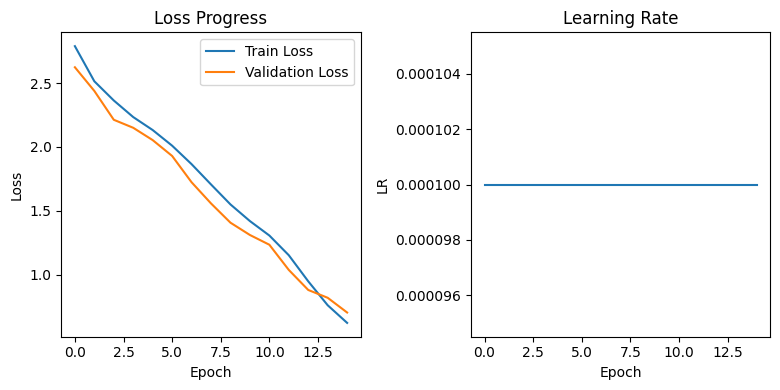


Training Progress:  30%|███       | 15/50 [1:09:22<2:41:56, 277.62s/it, Train Loss=0.6238, Val Loss=0.7049, Best Loss=0.7049]


Attempting to read 75 frames from data/s1/pwixzn.mpg


Epoch 16/50:   0%|          | 0/450 [00:00<?, ?it/s]


Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpgAttempting to read 75 frames from data/s1/swbc2p.mpg

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 16/50:   0%|          | 1/450 [00:00<06:49,  1.10it/s, Train Loss=0.5831, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 16/50:   0%|          | 2/450 [00:01<05:24,  1.38it/s, Train Loss=0.6483, LR=0.000100]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 16/50:   1%|          | 3/450 [00:02<05:00,  1.49it/s, Train Loss=0.6881, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 16/50:   1%|          | 4/450 [00:02<04:45,  1.56it/s, Train Loss=0.5378, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 16/50:   1%|          | 5/450 [00:03<04:36,  1.61it/s, Train Loss=0.4734, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 16/50:   1%|▏         | 6/450 [00:03<04:31,  1.63it/s, Train Loss=0.5917, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 16/50:   2%|▏         | 7/450 [00:04<04:27,  1.66it/s, Train Loss=0.5672, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 16/50:   2%|▏         | 8/450 [00:05<04:25,  1.67it/s, Train Loss=0.3814, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 16/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.3683, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 16/50:   2%|▏         | 10/450 [00:06<04:21,  1.68it/s, Train Loss=0.7037, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 16/50:   2%|▏         | 11/450 [00:06<04:20,  1.69it/s, Train Loss=0.5897, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 16/50:   3%|▎         | 12/450 [00:07<04:18,  1.69it/s, Train Loss=0.4744, LR=0.000100]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 16/50:   3%|▎         | 13/450 [00:08<04:19,  1.69it/s, Train Loss=0.3913, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 16/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=0.4949, LR=0.000100]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 16/50:   3%|▎         | 15/450 [00:09<04:18,  1.69it/s, Train Loss=0.5701, LR=0.000100]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 16/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=0.6539, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 16/50:   4%|▍         | 17/450 [00:10<04:15,  1.69it/s, Train Loss=0.6135, LR=0.000100]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 16/50:   4%|▍         | 18/450 [00:10<04:16,  1.68it/s, Train Loss=0.3325, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 16/50:   4%|▍         | 19/450 [00:11<04:15,  1.68it/s, Train Loss=0.5801, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 16/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=0.3901, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 16/50:   5%|▍         | 21/450 [00:12<04:15,  1.68it/s, Train Loss=0.5942, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 16/50:   5%|▍         | 22/450 [00:13<04:15,  1.68it/s, Train Loss=1.0575, LR=0.000100]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 16/50:   5%|▌         | 23/450 [00:13<04:14,  1.68it/s, Train Loss=0.5474, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 16/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.5351, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 16/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=0.3931, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 16/50:   6%|▌         | 26/450 [00:15<04:11,  1.68it/s, Train Loss=0.6607, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 16/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=0.6300, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 16/50:   6%|▌         | 28/450 [00:16<04:09,  1.69it/s, Train Loss=0.5736, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 16/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.4626, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 16/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.6211, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 16/50:   7%|▋         | 31/450 [00:18<04:07,  1.69it/s, Train Loss=0.5136, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 16/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.6718, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 16/50:   7%|▋         | 33/450 [00:19<04:08,  1.68it/s, Train Loss=0.6414, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 16/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=0.4492, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 16/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=0.4620, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 16/50:   8%|▊         | 36/450 [00:21<04:06,  1.68it/s, Train Loss=0.3995, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 16/50:   8%|▊         | 37/450 [00:22<04:05,  1.68it/s, Train Loss=0.4336, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 16/50:   8%|▊         | 38/450 [00:22<04:03,  1.69it/s, Train Loss=0.6903, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 16/50:   9%|▊         | 39/450 [00:23<04:03,  1.69it/s, Train Loss=0.6375, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 16/50:   9%|▉         | 40/450 [00:24<04:03,  1.69it/s, Train Loss=0.5094, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 16/50:   9%|▉         | 41/450 [00:24<04:03,  1.68it/s, Train Loss=0.7848, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 16/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=0.3209, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 16/50:  10%|▉         | 43/450 [00:25<04:00,  1.69it/s, Train Loss=0.7905, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 16/50:  10%|▉         | 44/450 [00:26<03:59,  1.70it/s, Train Loss=0.6144, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 16/50:  10%|█         | 45/450 [00:26<03:58,  1.70it/s, Train Loss=0.5182, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 16/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=0.7525, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 16/50:  10%|█         | 47/450 [00:28<03:57,  1.69it/s, Train Loss=0.3864, LR=0.000100]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 16/50:  11%|█         | 48/450 [00:28<03:57,  1.69it/s, Train Loss=0.5493, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 16/50:  11%|█         | 49/450 [00:29<03:56,  1.69it/s, Train Loss=0.6049, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 16/50:  11%|█         | 50/450 [00:29<03:56,  1.69it/s, Train Loss=0.6226, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 16/50:  11%|█▏        | 51/450 [00:30<03:56,  1.69it/s, Train Loss=0.5861, LR=0.000100]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 16/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=0.5368, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 16/50:  12%|█▏        | 53/450 [00:31<03:54,  1.69it/s, Train Loss=0.4121, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 16/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=0.4989, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 16/50:  12%|█▏        | 55/450 [00:32<03:54,  1.68it/s, Train Loss=0.5864, LR=0.000100]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 16/50:  12%|█▏        | 56/450 [00:33<03:53,  1.69it/s, Train Loss=0.4400, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 16/50:  13%|█▎        | 57/450 [00:34<03:52,  1.69it/s, Train Loss=0.6893, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 16/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=0.4108, LR=0.000100]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 16/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.6877, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 16/50:  13%|█▎        | 60/450 [00:35<03:51,  1.68it/s, Train Loss=0.6065, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 16/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.5333, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr6p.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 16/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=0.5571, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 16/50:  14%|█▍        | 63/450 [00:37<03:48,  1.69it/s, Train Loss=0.3982, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 16/50:  14%|█▍        | 64/450 [00:38<03:49,  1.68it/s, Train Loss=0.6833, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 16/50:  14%|█▍        | 65/450 [00:38<03:48,  1.69it/s, Train Loss=0.5099, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 16/50:  15%|█▍        | 66/450 [00:39<03:48,  1.68it/s, Train Loss=0.4150, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 16/50:  15%|█▍        | 67/450 [00:40<03:47,  1.68it/s, Train Loss=0.5994, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 16/50:  15%|█▌        | 68/450 [00:40<03:46,  1.68it/s, Train Loss=0.4784, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 16/50:  15%|█▌        | 69/450 [00:41<03:47,  1.67it/s, Train Loss=0.4498, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 16/50:  16%|█▌        | 70/450 [00:41<03:45,  1.68it/s, Train Loss=0.6197, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 16/50:  16%|█▌        | 71/450 [00:42<03:44,  1.68it/s, Train Loss=0.6144, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 16/50:  16%|█▌        | 72/450 [00:43<03:44,  1.69it/s, Train Loss=0.4820, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 16/50:  16%|█▌        | 73/450 [00:43<03:43,  1.69it/s, Train Loss=0.4432, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 16/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=0.4606, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 16/50:  17%|█▋        | 75/450 [00:44<03:41,  1.69it/s, Train Loss=0.5660, LR=0.000100]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 16/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=0.5433, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 16/50:  17%|█▋        | 77/450 [00:45<03:41,  1.69it/s, Train Loss=0.5559, LR=0.000100]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 16/50:  17%|█▋        | 78/450 [00:46<03:39,  1.69it/s, Train Loss=0.8679, LR=0.000100]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 16/50:  18%|█▊        | 79/450 [00:47<03:40,  1.68it/s, Train Loss=0.6377, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 16/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.4457, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 16/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.4176, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 16/50:  18%|█▊        | 82/450 [00:48<03:37,  1.69it/s, Train Loss=0.7085, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 16/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=0.4883, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 16/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=0.4598, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 16/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=0.5467, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 16/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.4187, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 16/50:  19%|█▉        | 87/450 [00:51<03:35,  1.69it/s, Train Loss=0.4769, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 16/50:  20%|█▉        | 88/450 [00:52<03:34,  1.68it/s, Train Loss=0.4730, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 16/50:  20%|█▉        | 89/450 [00:53<03:34,  1.68it/s, Train Loss=0.5995, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 16/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=0.5056, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 16/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=0.7097, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 16/50:  20%|██        | 92/450 [00:54<03:32,  1.68it/s, Train Loss=0.4230, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 16/50:  21%|██        | 93/450 [00:55<03:32,  1.68it/s, Train Loss=0.6262, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 16/50:  21%|██        | 94/450 [00:56<03:32,  1.68it/s, Train Loss=0.5833, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 16/50:  21%|██        | 95/450 [00:56<03:31,  1.68it/s, Train Loss=0.5301, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 16/50:  21%|██▏       | 96/450 [00:57<03:30,  1.68it/s, Train Loss=0.5105, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 16/50:  22%|██▏       | 97/450 [00:57<03:29,  1.69it/s, Train Loss=0.4180, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 16/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=0.9305, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 16/50:  22%|██▏       | 99/450 [00:59<03:28,  1.69it/s, Train Loss=0.6448, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 16/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=0.9270, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 16/50:  22%|██▏       | 101/450 [01:00<03:26,  1.69it/s, Train Loss=0.3971, LR=0.000100]

Attempting to read 75 frames from data/s1/praj1s.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 16/50:  23%|██▎       | 102/450 [01:00<03:26,  1.68it/s, Train Loss=0.5056, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 16/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=0.4696, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 16/50:  23%|██▎       | 104/450 [01:01<03:26,  1.68it/s, Train Loss=1.1067, LR=0.000100]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 16/50:  23%|██▎       | 105/450 [01:02<03:25,  1.68it/s, Train Loss=0.3744, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 16/50:  24%|██▎       | 106/450 [01:03<03:24,  1.68it/s, Train Loss=0.5100, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 16/50:  24%|██▍       | 107/450 [01:03<03:23,  1.68it/s, Train Loss=0.4229, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 16/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=0.5210, LR=0.000100]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 16/50:  24%|██▍       | 109/450 [01:04<03:23,  1.68it/s, Train Loss=0.6528, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 16/50:  24%|██▍       | 110/450 [01:05<03:22,  1.68it/s, Train Loss=0.4620, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 16/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=0.5443, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 16/50:  25%|██▍       | 112/450 [01:06<03:20,  1.68it/s, Train Loss=0.3732, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 16/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.5464, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 16/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=0.4619, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 16/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.5187, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 16/50:  26%|██▌       | 116/450 [01:09<03:18,  1.68it/s, Train Loss=0.4811, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 16/50:  26%|██▌       | 117/450 [01:09<03:17,  1.68it/s, Train Loss=0.6247, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 16/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=0.7166, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 16/50:  26%|██▋       | 119/450 [01:10<03:16,  1.69it/s, Train Loss=0.4484, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 16/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.3288, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 16/50:  27%|██▋       | 121/450 [01:12<03:14,  1.69it/s, Train Loss=0.5765, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 16/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.5092, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 16/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.4935, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 16/50:  28%|██▊       | 124/450 [01:13<03:14,  1.67it/s, Train Loss=0.4499, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 16/50:  28%|██▊       | 125/450 [01:14<03:13,  1.68it/s, Train Loss=0.5509, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 16/50:  28%|██▊       | 126/450 [01:15<03:12,  1.68it/s, Train Loss=0.5658, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 16/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=0.5330, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 16/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.5976, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 16/50:  29%|██▊       | 129/450 [01:16<03:10,  1.69it/s, Train Loss=0.4510, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 16/50:  29%|██▉       | 130/450 [01:17<03:08,  1.69it/s, Train Loss=0.4923, LR=0.000100]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 16/50:  29%|██▉       | 131/450 [01:17<03:08,  1.69it/s, Train Loss=0.4633, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 16/50:  29%|██▉       | 132/450 [01:18<03:07,  1.69it/s, Train Loss=0.6429, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 16/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=0.7875, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 16/50:  30%|██▉       | 134/450 [01:19<03:06,  1.69it/s, Train Loss=0.5423, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 16/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=0.4726, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 16/50:  30%|███       | 136/450 [01:20<03:06,  1.68it/s, Train Loss=0.6704, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 16/50:  30%|███       | 137/450 [01:21<03:06,  1.68it/s, Train Loss=0.6966, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 16/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=0.7263, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 16/50:  31%|███       | 139/450 [01:22<03:05,  1.68it/s, Train Loss=0.5572, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 16/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=0.5289, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 16/50:  31%|███▏      | 141/450 [01:23<03:04,  1.68it/s, Train Loss=0.4900, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 16/50:  32%|███▏      | 142/450 [01:24<03:03,  1.68it/s, Train Loss=0.4532, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg



Epoch 16/50:  32%|███▏      | 143/450 [01:25<03:02,  1.68it/s, Train Loss=0.6554, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 16/50:  32%|███▏      | 144/450 [01:25<03:03,  1.67it/s, Train Loss=0.4927, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 16/50:  32%|███▏      | 145/450 [01:26<03:02,  1.67it/s, Train Loss=0.4861, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 16/50:  32%|███▏      | 146/450 [01:26<03:01,  1.67it/s, Train Loss=0.6459, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 16/50:  33%|███▎      | 147/450 [01:27<03:00,  1.68it/s, Train Loss=0.5277, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 16/50:  33%|███▎      | 148/450 [01:28<02:59,  1.68it/s, Train Loss=0.5083, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 16/50:  33%|███▎      | 149/450 [01:28<02:58,  1.68it/s, Train Loss=0.5906, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 16/50:  33%|███▎      | 150/450 [01:29<02:58,  1.68it/s, Train Loss=0.5276, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 16/50:  34%|███▎      | 151/450 [01:29<02:57,  1.68it/s, Train Loss=0.4752, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 16/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.6240, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 16/50:  34%|███▍      | 153/450 [01:31<02:56,  1.68it/s, Train Loss=0.4880, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 16/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=0.5161, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 16/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.4150, LR=0.000100]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 16/50:  35%|███▍      | 156/450 [01:32<02:53,  1.69it/s, Train Loss=0.4068, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 16/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.4803, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 16/50:  35%|███▌      | 158/450 [01:34<02:53,  1.69it/s, Train Loss=0.5773, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 16/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=0.5224, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 16/50:  36%|███▌      | 160/450 [01:35<02:52,  1.69it/s, Train Loss=0.5929, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 16/50:  36%|███▌      | 161/450 [01:35<02:51,  1.69it/s, Train Loss=0.5434, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 16/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.4225, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 16/50:  36%|███▌      | 163/450 [01:37<02:50,  1.68it/s, Train Loss=0.6060, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 16/50:  36%|███▋      | 164/450 [01:37<02:50,  1.68it/s, Train Loss=0.3879, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 16/50:  37%|███▋      | 165/450 [01:38<02:49,  1.69it/s, Train Loss=0.6007, LR=0.000100]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 16/50:  37%|███▋      | 166/450 [01:38<02:48,  1.68it/s, Train Loss=0.4815, LR=0.000100]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 16/50:  37%|███▋      | 167/450 [01:39<02:48,  1.68it/s, Train Loss=0.4387, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 16/50:  37%|███▋      | 168/450 [01:39<02:47,  1.68it/s, Train Loss=0.4118, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 16/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.5379, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 16/50:  38%|███▊      | 170/450 [01:41<02:46,  1.68it/s, Train Loss=0.7015, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 16/50:  38%|███▊      | 171/450 [01:41<02:45,  1.69it/s, Train Loss=0.4842, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 16/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.4535, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 16/50:  38%|███▊      | 173/450 [01:42<02:43,  1.69it/s, Train Loss=0.5107, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 16/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.6196, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 16/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=0.3956, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 16/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.5213, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 16/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.7322, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 16/50:  40%|███▉      | 178/450 [01:45<02:41,  1.68it/s, Train Loss=0.7494, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 16/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.3697, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 16/50:  40%|████      | 180/450 [01:47<02:39,  1.69it/s, Train Loss=0.7350, LR=0.000100]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 16/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=0.4223, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 16/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=0.5261, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 16/50:  41%|████      | 183/450 [01:48<02:38,  1.69it/s, Train Loss=0.5137, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 16/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.5378, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 16/50:  41%|████      | 185/450 [01:50<02:37,  1.68it/s, Train Loss=0.5517, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 16/50:  41%|████▏     | 186/450 [01:50<02:37,  1.68it/s, Train Loss=0.4130, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 16/50:  42%|████▏     | 187/450 [01:51<02:36,  1.68it/s, Train Loss=0.5792, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 16/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=0.6542, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 16/50:  42%|████▏     | 189/450 [01:52<02:35,  1.68it/s, Train Loss=0.5662, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 16/50:  42%|████▏     | 190/450 [01:53<02:34,  1.68it/s, Train Loss=0.6308, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 16/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=0.4814, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 16/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=0.5864, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 16/50:  43%|████▎     | 193/450 [01:54<02:32,  1.69it/s, Train Loss=0.4476, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 16/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.5295, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 16/50:  43%|████▎     | 195/450 [01:55<02:30,  1.69it/s, Train Loss=0.4587, LR=0.000100]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 16/50:  44%|████▎     | 196/450 [01:56<02:30,  1.68it/s, Train Loss=0.5300, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 16/50:  44%|████▍     | 197/450 [01:57<02:30,  1.69it/s, Train Loss=0.3621, LR=0.000100]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 16/50:  44%|████▍     | 198/450 [01:57<02:29,  1.68it/s, Train Loss=0.4766, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 16/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=0.5745, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 16/50:  44%|████▍     | 200/450 [01:58<02:28,  1.68it/s, Train Loss=0.6843, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 16/50:  45%|████▍     | 201/450 [01:59<02:26,  1.69it/s, Train Loss=0.3687, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 16/50:  45%|████▍     | 202/450 [02:00<02:26,  1.70it/s, Train Loss=0.4196, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 16/50:  45%|████▌     | 203/450 [02:00<02:25,  1.70it/s, Train Loss=0.4323, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 16/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.9398, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 16/50:  46%|████▌     | 205/450 [02:01<02:24,  1.69it/s, Train Loss=0.6018, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 16/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.4580, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 16/50:  46%|████▌     | 207/450 [02:03<02:23,  1.69it/s, Train Loss=0.4673, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 16/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.6936, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 16/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.6067, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 16/50:  47%|████▋     | 210/450 [02:04<02:21,  1.69it/s, Train Loss=0.4941, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 16/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.6499, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 16/50:  47%|████▋     | 212/450 [02:06<02:20,  1.70it/s, Train Loss=0.3312, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 16/50:  47%|████▋     | 213/450 [02:06<02:19,  1.70it/s, Train Loss=0.4813, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 16/50:  48%|████▊     | 214/450 [02:07<02:18,  1.70it/s, Train Loss=0.3476, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 16/50:  48%|████▊     | 215/450 [02:07<02:18,  1.70it/s, Train Loss=0.5216, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 16/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.5565, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 16/50:  48%|████▊     | 217/450 [02:09<02:17,  1.69it/s, Train Loss=0.4220, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 16/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.5092, LR=0.000100]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 16/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=0.4753, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 16/50:  49%|████▉     | 220/450 [02:10<02:17,  1.68it/s, Train Loss=0.5156, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 16/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=0.6428, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 16/50:  49%|████▉     | 222/450 [02:11<02:15,  1.68it/s, Train Loss=0.4395, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 16/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.4598, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 16/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=0.4381, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 16/50:  50%|█████     | 225/450 [02:13<02:13,  1.68it/s, Train Loss=0.4969, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 16/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.3461, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 16/50:  50%|█████     | 227/450 [02:14<02:12,  1.69it/s, Train Loss=0.5927, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 16/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.5255, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 16/50:  51%|█████     | 229/450 [02:16<02:11,  1.69it/s, Train Loss=0.4740, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 16/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.5016, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 16/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.5965, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 16/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=0.4430, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 16/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.7300, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 16/50:  52%|█████▏    | 234/450 [02:19<02:07,  1.69it/s, Train Loss=0.3881, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 16/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.4047, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 16/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.5937, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 16/50:  53%|█████▎    | 237/450 [02:20<02:05,  1.70it/s, Train Loss=0.4765, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 16/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.5823, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 16/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.69it/s, Train Loss=0.6450, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 16/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.5117, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 16/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=0.5468, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 16/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.68it/s, Train Loss=0.5199, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 16/50:  54%|█████▍    | 243/450 [02:24<02:03,  1.68it/s, Train Loss=0.4205, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 16/50:  54%|█████▍    | 244/450 [02:25<02:02,  1.68it/s, Train Loss=0.4452, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 16/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.68it/s, Train Loss=0.6369, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 16/50:  55%|█████▍    | 246/450 [02:26<02:01,  1.68it/s, Train Loss=0.5666, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 16/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=0.6279, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 16/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.4128, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 16/50:  55%|█████▌    | 249/450 [02:27<01:58,  1.69it/s, Train Loss=0.8799, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 16/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.4209, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 16/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=0.3825, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 16/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=0.6156, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 16/50:  56%|█████▌    | 253/450 [02:30<01:57,  1.68it/s, Train Loss=0.5587, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 16/50:  56%|█████▋    | 254/450 [02:30<01:55,  1.69it/s, Train Loss=0.4263, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 16/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.3561, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 16/50:  57%|█████▋    | 256/450 [02:32<01:54,  1.69it/s, Train Loss=0.3150, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 16/50:  57%|█████▋    | 257/450 [02:32<01:53,  1.69it/s, Train Loss=0.5389, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 16/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.5606, LR=0.000100]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 16/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=0.4702, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 16/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=0.2551, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 16/50:  58%|█████▊    | 261/450 [02:35<01:51,  1.69it/s, Train Loss=0.5665, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 16/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=0.3812, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 16/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=0.3825, LR=0.000100]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 16/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=0.5921, LR=0.000100]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 16/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.4239, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 16/50:  59%|█████▉    | 266/450 [02:38<01:48,  1.70it/s, Train Loss=0.4243, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 16/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=0.5141, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 16/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=0.6183, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 16/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.4947, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 16/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.4261, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 16/50:  60%|██████    | 271/450 [02:41<01:46,  1.68it/s, Train Loss=0.5343, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 16/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.5765, LR=0.000100]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 16/50:  61%|██████    | 273/450 [02:42<01:45,  1.68it/s, Train Loss=0.6033, LR=0.000100]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 16/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.5477, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 16/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.4438, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 16/50:  61%|██████▏   | 276/450 [02:43<01:42,  1.69it/s, Train Loss=0.4545, LR=0.000100]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 16/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.3820, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 16/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=0.6823, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 16/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.68it/s, Train Loss=0.4713, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 16/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.4530, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 16/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.69it/s, Train Loss=0.6117, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 16/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.3912, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 16/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=0.2852, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 16/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.5917, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 16/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.70it/s, Train Loss=0.5973, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 16/50:  64%|██████▎   | 286/450 [02:49<01:36,  1.69it/s, Train Loss=0.4172, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 16/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.4990, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 16/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.69it/s, Train Loss=0.4414, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 16/50:  64%|██████▍   | 289/450 [02:51<01:34,  1.70it/s, Train Loss=0.5147, LR=0.000100]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 16/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.4983, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 16/50:  65%|██████▍   | 291/450 [02:52<01:33,  1.70it/s, Train Loss=0.4992, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 16/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.70it/s, Train Loss=0.3935, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp7a.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 16/50:  65%|██████▌   | 293/450 [02:54<01:32,  1.69it/s, Train Loss=0.4083, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 16/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.6591, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 16/50:  66%|██████▌   | 295/450 [02:55<01:32,  1.68it/s, Train Loss=0.5279, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 16/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.68it/s, Train Loss=0.4475, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 16/50:  66%|██████▌   | 297/450 [02:56<01:31,  1.67it/s, Train Loss=0.3590, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 16/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.67it/s, Train Loss=0.4372, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 16/50:  66%|██████▋   | 299/450 [02:57<01:30,  1.67it/s, Train Loss=0.6697, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 16/50:  67%|██████▋   | 300/450 [02:58<01:30,  1.67it/s, Train Loss=0.3750, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 16/50:  67%|██████▋   | 301/450 [02:58<01:29,  1.67it/s, Train Loss=0.5056, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 16/50:  67%|██████▋   | 302/450 [02:59<01:28,  1.67it/s, Train Loss=0.4277, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 16/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.68it/s, Train Loss=0.8832, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 16/50:  68%|██████▊   | 304/450 [03:00<01:27,  1.67it/s, Train Loss=0.9151, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 16/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.68it/s, Train Loss=0.4070, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 16/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=0.3881, LR=0.000100]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 16/50:  68%|██████▊   | 307/450 [03:02<01:25,  1.68it/s, Train Loss=0.6761, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 16/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.68it/s, Train Loss=0.5335, LR=0.000100]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 16/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.4176, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 16/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=0.3207, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 16/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.6044, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 16/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=0.4069, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 16/50:  70%|██████▉   | 313/450 [03:05<01:20,  1.69it/s, Train Loss=0.3833, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 16/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.70it/s, Train Loss=0.4665, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 16/50:  70%|███████   | 315/450 [03:07<01:19,  1.70it/s, Train Loss=0.2826, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 16/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.4322, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 16/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.7677, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 16/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.4790, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 16/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.5711, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 16/50:  71%|███████   | 320/450 [03:10<01:16,  1.69it/s, Train Loss=0.8297, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 16/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.4693, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 16/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.6253, LR=0.000100]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 16/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.5619, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 16/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.3520, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 16/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.69it/s, Train Loss=0.3435, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 16/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.4247, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 16/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.7537, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 16/50:  73%|███████▎  | 328/450 [03:14<01:11,  1.69it/s, Train Loss=0.5537, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 16/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.4409, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 16/50:  73%|███████▎  | 330/450 [03:15<01:11,  1.69it/s, Train Loss=0.7328, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 16/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.6403, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 16/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=0.2652, LR=0.000100]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 16/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.4524, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 16/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.5151, LR=0.000100]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 16/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.69it/s, Train Loss=0.3671, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 16/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=0.5839, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 16/50:  75%|███████▍  | 337/450 [03:20<01:06,  1.69it/s, Train Loss=0.6974, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 16/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.68it/s, Train Loss=0.5773, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 16/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.68it/s, Train Loss=0.5587, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 16/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.68it/s, Train Loss=0.4110, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 16/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.6423, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 16/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.68it/s, Train Loss=0.4502, LR=0.000100]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 16/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.4739, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 16/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.5631, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 16/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.7109, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 16/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.70it/s, Train Loss=0.5639, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 16/50:  77%|███████▋  | 347/450 [03:26<01:00,  1.70it/s, Train Loss=0.5719, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 16/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.70it/s, Train Loss=0.5643, LR=0.000100]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 16/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.4961, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 16/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.3246, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 16/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.4090, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 16/50:  78%|███████▊  | 352/450 [03:28<00:57,  1.69it/s, Train Loss=0.4462, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 16/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.4824, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 16/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=0.5027, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 16/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.5182, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 16/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.6638, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 16/50:  79%|███████▉  | 357/450 [03:31<00:54,  1.69it/s, Train Loss=0.3880, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 16/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.70it/s, Train Loss=0.5715, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 16/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.70it/s, Train Loss=0.5412, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 16/50:  80%|████████  | 360/450 [03:33<00:53,  1.70it/s, Train Loss=0.3612, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 16/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.5341, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 16/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=0.4339, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 16/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.4828, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 16/50:  81%|████████  | 364/450 [03:36<00:50,  1.69it/s, Train Loss=0.5702, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 16/50:  81%|████████  | 365/450 [03:36<00:50,  1.68it/s, Train Loss=0.5413, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 16/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.68it/s, Train Loss=0.4157, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 16/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=0.2950, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 16/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=0.4231, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 16/50:  82%|████████▏ | 369/450 [03:39<00:47,  1.69it/s, Train Loss=0.5872, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 16/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.4602, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 16/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.68it/s, Train Loss=0.4505, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 16/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.6528, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 16/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.5567, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 16/50:  83%|████████▎ | 374/450 [03:42<00:44,  1.69it/s, Train Loss=0.5495, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 16/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.6180, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 16/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.4441, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 16/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.5187, LR=0.000100]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 16/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.4706, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 16/50:  84%|████████▍ | 379/450 [03:44<00:41,  1.70it/s, Train Loss=0.5476, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 16/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.70it/s, Train Loss=0.5973, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 16/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.70it/s, Train Loss=0.4322, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 16/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.70it/s, Train Loss=0.4763, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 16/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.70it/s, Train Loss=0.4215, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 16/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.69it/s, Train Loss=0.6196, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 16/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.4972, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 16/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.3856, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 16/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.3716, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 16/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.70it/s, Train Loss=0.5482, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 16/50:  86%|████████▋ | 389/450 [03:50<00:35,  1.70it/s, Train Loss=0.5392, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 16/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.3900, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 16/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.69it/s, Train Loss=0.6327, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 16/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.6043, LR=0.000100]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 16/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.4759, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 16/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.68it/s, Train Loss=0.3966, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 16/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=0.7757, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 16/50:  88%|████████▊ | 396/450 [03:55<00:31,  1.69it/s, Train Loss=0.6202, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 16/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.68it/s, Train Loss=0.3636, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 16/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=0.4745, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 16/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.68it/s, Train Loss=0.4827, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 16/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=0.5061, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 16/50:  89%|████████▉ | 401/450 [03:57<00:29,  1.69it/s, Train Loss=0.4601, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 16/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.4971, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 16/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=0.3609, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 16/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.6181, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 16/50:  90%|█████████ | 405/450 [04:00<00:26,  1.70it/s, Train Loss=0.2622, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 16/50:  90%|█████████ | 406/450 [04:00<00:25,  1.70it/s, Train Loss=0.4895, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 16/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.3631, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 16/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=0.4159, LR=0.000100]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 16/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.4848, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 16/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.4343, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 16/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.69it/s, Train Loss=0.5244, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 16/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=0.5816, LR=0.000100]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 16/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.4539, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 16/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.5366, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 16/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.5450, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 16/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.69it/s, Train Loss=0.4579, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 16/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.5974, LR=0.000100]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 16/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=0.3945, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 16/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.3953, LR=0.000100]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 16/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=0.4363, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 16/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.68it/s, Train Loss=0.4375, LR=0.000100]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 16/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.68it/s, Train Loss=0.3407, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 16/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.69it/s, Train Loss=0.5178, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 16/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.5220, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 16/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.6038, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 16/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.4581, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 16/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.4810, LR=0.000100]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 16/50:  95%|█████████▌| 428/450 [04:13<00:12,  1.69it/s, Train Loss=0.4064, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 16/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.4674, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 16/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.70it/s, Train Loss=0.5541, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 16/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.70it/s, Train Loss=0.6966, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 16/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.7436, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 16/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.70it/s, Train Loss=0.7490, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 16/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.4955, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 16/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.5517, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 16/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.68it/s, Train Loss=0.4478, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 16/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=0.5552, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 16/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.69it/s, Train Loss=0.4611, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 16/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=0.7277, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 16/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.4799, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 16/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.70it/s, Train Loss=0.4592, LR=0.000100]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 16/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.5084, LR=0.000100]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 16/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.69it/s, Train Loss=0.3450, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 16/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.6426, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 16/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=0.3566, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 16/50: 100%|██████████| 450/450 [04:26<00:00,  1.70it/s, Train Loss=0.8897, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpgAttempting to read 75 frames from data/s1/brba1a.mpg

Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg



Validation:   2%|▏         | 1/50 [00:00<00:25,  1.96it/s, Val Loss=0.7249]

Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   4%|▍         | 2/50 [00:00<00:15,  3.06it/s, Val Loss=0.4933]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   6%|▌         | 3/50 [00:00<00:12,  3.82it/s, Val Loss=1.0891]

Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg



Validation:   8%|▊         | 4/50 [00:01<00:10,  4.27it/s, Val Loss=0.4086]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg
Attempting to read 75 frames from data/s1/pwix3a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.49it/s, Val Loss=0.4849]

Attempting to read 75 frames from data/s1/lbakzn.mpg
Attempting to read 75 frames from data/s1/bwbg8n.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.85it/s, Val Loss=1.1035]

Attempting to read 75 frames from data/s1/pbwx3a.mpg
Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  5.03it/s, Val Loss=0.7013]

Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.11it/s, Val Loss=0.5549]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:07,  5.19it/s, Val Loss=0.7173]

Attempting to read 75 frames from data/s1/bram5a.mpgAttempting to read 75 frames from data/s1/brimzp.mpg




Validation:  20%|██        | 10/50 [00:02<00:07,  5.26it/s, Val Loss=0.5548]

Attempting to read 75 frames from data/s1/lwbszn.mpgAttempting to read 75 frames from data/s1/brbg3s.mpg




Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.23it/s, Val Loss=1.2193]

Attempting to read 75 frames from data/s1/srah4n.mpgAttempting to read 75 frames from data/s1/sgap3a.mpg




Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.21it/s, Val Loss=0.2213]

Attempting to read 75 frames from data/s1/pbwj2n.mpg
Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  4.98it/s, Val Loss=0.6341]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:07,  5.07it/s, Val Loss=0.3745]

Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.22it/s, Val Loss=0.5995]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.23it/s, Val Loss=0.5469]

Attempting to read 75 frames from data/s1/lwie4n.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg


Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.34it/s, Val Loss=0.4875]


Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.34it/s, Val Loss=0.7577]

Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.17it/s, Val Loss=0.7577]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg


Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.25it/s, Val Loss=0.3566]


Attempting to read 75 frames from data/s1/bwitzp.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.25it/s, Val Loss=0.3827]

Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.15it/s, Val Loss=0.3827]

Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.29it/s, Val Loss=1.8503]

Attempting to read 75 frames from data/s1/lrbr5s.mpgAttempting to read 75 frames from data/s1/praj2p.mpg



Attempting to read 75 frames from data/s1/bgah2p.mpg

Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.24it/s, Val Loss=0.2061]


Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.22it/s, Val Loss=0.4513]

Attempting to read 75 frames from data/s1/bbifzp.mpgAttempting to read 75 frames from data/s1/swiu6p.mpg




Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.30it/s, Val Loss=0.3364]

Attempting to read 75 frames from data/s1/sgav4n.mpgAttempting to read 75 frames from data/s1/prajzn.mpg




Validation:  50%|█████     | 25/50 [00:05<00:04,  5.36it/s, Val Loss=1.3523]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.43it/s, Val Loss=0.3295]

Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.51it/s, Val Loss=0.5441]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg

Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.44it/s, Val Loss=0.9270]

Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.47it/s, Val Loss=0.4579]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg



Validation:  60%|██████    | 30/50 [00:05<00:03,  5.42it/s, Val Loss=1.0889]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg


Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.40it/s, Val Loss=0.8774]


Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg


Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.47it/s, Val Loss=0.5212]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.40it/s, Val Loss=0.5505]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.45it/s, Val Loss=0.9391]

Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.51it/s, Val Loss=0.3723]

Attempting to read 75 frames from data/s1/pgad8n.mpgAttempting to read 75 frames from data/s1/pbwx2p.mpg

Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.52it/s, Val Loss=0.5050]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.47it/s, Val Loss=0.5591]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.44it/s, Val Loss=0.3909]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.37it/s, Val Loss=0.9469]

Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg

Validation:  80%|████████  | 40/50 [00:07<00:01,  5.34it/s, Val Loss=0.4446]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg


Validation:  80%|████████  | 40/50 [00:08<00:01,  5.34it/s, Val Loss=0.5768]


Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.33it/s, Val Loss=0.5768]

Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.33it/s, Val Loss=0.4330]

Attempting to read 75 frames from data/s1/bgbb3a.mpgAttempting to read 75 frames from data/s1/lbax9s.mpg




Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.34it/s, Val Loss=0.3745]

Attempting to read 75 frames from data/s1/bwanzp.mpgAttempting to read 75 frames from data/s1/sgav7a.mpg




Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.38it/s, Val Loss=0.5167]

Attempting to read 75 frames from data/s1/lbaq6p.mpgAttempting to read 75 frames from data/s1/bbwgzn.mpg




Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.48it/s, Val Loss=0.2549]

Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  92%|█████████▏| 46/50 [00:08<00:00,  5.49it/s, Val Loss=1.6688]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  32%|███▏      | 16/50 [1:13:59<2:37:12, 277.43s/it, Train Loss=0.5243, Val Loss=0.6587, Best Loss=0.6587]


🏆 New best model saved with validation loss: 0.6587
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 17/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpgAttempting to read 75 frames from data/s1/srbb7a.mpg

Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 17/50:   0%|          | 1/450 [00:00<05:57,  1.25it/s, Train Loss=0.3438, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 17/50:   0%|          | 2/450 [00:01<05:03,  1.48it/s, Train Loss=0.4726, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 17/50:   1%|          | 3/450 [00:01<04:45,  1.57it/s, Train Loss=0.4696, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 17/50:   1%|          | 4/450 [00:02<04:36,  1.61it/s, Train Loss=0.3580, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 17/50:   1%|          | 5/450 [00:03<04:31,  1.64it/s, Train Loss=0.4229, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 17/50:   1%|▏         | 6/450 [00:03<04:27,  1.66it/s, Train Loss=0.4642, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 17/50:   2%|▏         | 7/450 [00:04<04:26,  1.66it/s, Train Loss=0.4099, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 17/50:   2%|▏         | 8/450 [00:04<04:24,  1.67it/s, Train Loss=0.4470, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 17/50:   2%|▏         | 9/450 [00:05<04:23,  1.68it/s, Train Loss=0.4408, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 17/50:   2%|▏         | 10/450 [00:06<04:21,  1.68it/s, Train Loss=0.3604, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 17/50:   2%|▏         | 11/450 [00:06<04:20,  1.69it/s, Train Loss=0.3393, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 17/50:   3%|▎         | 12/450 [00:07<04:19,  1.69it/s, Train Loss=0.4244, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 17/50:   3%|▎         | 13/450 [00:07<04:20,  1.68it/s, Train Loss=0.4094, LR=0.000100]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 17/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=0.4912, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 17/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=0.3618, LR=0.000100]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 17/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=0.2855, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 17/50:   4%|▍         | 17/450 [00:10<04:15,  1.69it/s, Train Loss=0.3132, LR=0.000100]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 17/50:   4%|▍         | 18/450 [00:10<04:16,  1.69it/s, Train Loss=0.4755, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 17/50:   4%|▍         | 19/450 [00:11<04:15,  1.69it/s, Train Loss=0.3404, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 17/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.5406, LR=0.000100]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 17/50:   5%|▍         | 21/450 [00:12<04:14,  1.69it/s, Train Loss=0.3693, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 17/50:   5%|▍         | 22/450 [00:13<04:13,  1.69it/s, Train Loss=0.3663, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 17/50:   5%|▌         | 23/450 [00:13<04:12,  1.69it/s, Train Loss=0.5367, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 17/50:   5%|▌         | 24/450 [00:14<04:11,  1.69it/s, Train Loss=0.4792, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 17/50:   6%|▌         | 25/450 [00:14<04:10,  1.70it/s, Train Loss=0.5214, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 17/50:   6%|▌         | 26/450 [00:15<04:09,  1.70it/s, Train Loss=0.3571, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 17/50:   6%|▌         | 27/450 [00:16<04:09,  1.69it/s, Train Loss=0.5023, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 17/50:   6%|▌         | 28/450 [00:16<04:08,  1.70it/s, Train Loss=0.2967, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 17/50:   6%|▋         | 29/450 [00:17<04:08,  1.70it/s, Train Loss=0.4029, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 17/50:   7%|▋         | 30/450 [00:17<04:07,  1.70it/s, Train Loss=0.3879, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 17/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.4185, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 17/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.5415, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 17/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=0.3254, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 17/50:   8%|▊         | 34/450 [00:20<04:05,  1.69it/s, Train Loss=0.3172, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 17/50:   8%|▊         | 35/450 [00:20<04:04,  1.70it/s, Train Loss=0.5083, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 17/50:   8%|▊         | 36/450 [00:21<04:03,  1.70it/s, Train Loss=0.3475, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 17/50:   8%|▊         | 37/450 [00:22<04:04,  1.69it/s, Train Loss=0.4072, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 17/50:   8%|▊         | 38/450 [00:22<04:04,  1.68it/s, Train Loss=0.4883, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 17/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.4693, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 17/50:   9%|▉         | 40/450 [00:23<04:02,  1.69it/s, Train Loss=0.3568, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 17/50:   9%|▉         | 41/450 [00:24<04:01,  1.69it/s, Train Loss=0.4264, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 17/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=0.3850, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 17/50:  10%|▉         | 43/450 [00:25<04:01,  1.69it/s, Train Loss=0.4802, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 17/50:  10%|▉         | 44/450 [00:26<03:59,  1.69it/s, Train Loss=0.5528, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 17/50:  10%|█         | 45/450 [00:26<03:59,  1.69it/s, Train Loss=0.7747, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 17/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=0.4587, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 17/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=0.4909, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 17/50:  11%|█         | 48/450 [00:28<03:58,  1.69it/s, Train Loss=0.6117, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 17/50:  11%|█         | 49/450 [00:29<03:59,  1.68it/s, Train Loss=0.4836, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 17/50:  11%|█         | 50/450 [00:29<03:57,  1.68it/s, Train Loss=0.5320, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 17/50:  11%|█▏        | 51/450 [00:30<03:56,  1.68it/s, Train Loss=0.5946, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr6p.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 17/50:  12%|█▏        | 52/450 [00:30<03:56,  1.68it/s, Train Loss=0.3721, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 17/50:  12%|█▏        | 53/450 [00:31<03:56,  1.68it/s, Train Loss=0.4357, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 17/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=0.3710, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 17/50:  12%|█▏        | 55/450 [00:32<03:54,  1.69it/s, Train Loss=0.6275, LR=0.000100]

Attempting to read 75 frames from data/s1/praj1s.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 17/50:  12%|█▏        | 56/450 [00:33<03:53,  1.69it/s, Train Loss=0.3431, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 17/50:  13%|█▎        | 57/450 [00:33<03:52,  1.69it/s, Train Loss=0.3832, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 17/50:  13%|█▎        | 58/450 [00:34<03:50,  1.70it/s, Train Loss=0.3548, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 17/50:  13%|█▎        | 59/450 [00:35<03:49,  1.70it/s, Train Loss=0.4820, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 17/50:  13%|█▎        | 60/450 [00:35<03:49,  1.70it/s, Train Loss=0.3832, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 17/50:  14%|█▎        | 61/450 [00:36<03:49,  1.70it/s, Train Loss=0.3181, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 17/50:  14%|█▍        | 62/450 [00:36<03:48,  1.69it/s, Train Loss=0.3887, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 17/50:  14%|█▍        | 63/450 [00:37<03:48,  1.69it/s, Train Loss=0.4286, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 17/50:  14%|█▍        | 64/450 [00:38<03:49,  1.68it/s, Train Loss=0.4942, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 17/50:  14%|█▍        | 65/450 [00:38<03:48,  1.69it/s, Train Loss=0.5403, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 17/50:  15%|█▍        | 66/450 [00:39<03:48,  1.68it/s, Train Loss=0.5692, LR=0.000100]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 17/50:  15%|█▍        | 67/450 [00:39<03:46,  1.69it/s, Train Loss=0.4055, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 17/50:  15%|█▌        | 68/450 [00:40<03:45,  1.69it/s, Train Loss=0.6565, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 17/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=0.4016, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 17/50:  16%|█▌        | 70/450 [00:41<03:44,  1.69it/s, Train Loss=0.3398, LR=0.000100]

Attempting to read 75 frames from data/s1/prwk1a.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 17/50:  16%|█▌        | 71/450 [00:42<03:44,  1.68it/s, Train Loss=0.6387, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 17/50:  16%|█▌        | 72/450 [00:42<03:43,  1.69it/s, Train Loss=0.4675, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 17/50:  16%|█▌        | 73/450 [00:43<03:43,  1.69it/s, Train Loss=0.3745, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 17/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=0.4067, LR=0.000100]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 17/50:  17%|█▋        | 75/450 [00:44<03:42,  1.69it/s, Train Loss=0.3943, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 17/50:  17%|█▋        | 76/450 [00:45<03:42,  1.68it/s, Train Loss=0.4741, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 17/50:  17%|█▋        | 77/450 [00:45<03:41,  1.68it/s, Train Loss=0.4265, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 17/50:  17%|█▋        | 78/450 [00:46<03:41,  1.68it/s, Train Loss=0.3911, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 17/50:  18%|█▊        | 79/450 [00:46<03:40,  1.69it/s, Train Loss=0.3587, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 17/50:  18%|█▊        | 80/450 [00:47<03:38,  1.69it/s, Train Loss=0.4369, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 17/50:  18%|█▊        | 81/450 [00:48<03:37,  1.69it/s, Train Loss=0.4561, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 17/50:  18%|█▊        | 82/450 [00:48<03:36,  1.70it/s, Train Loss=0.4367, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 17/50:  18%|█▊        | 83/450 [00:49<03:36,  1.70it/s, Train Loss=0.4028, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 17/50:  19%|█▊        | 84/450 [00:49<03:36,  1.69it/s, Train Loss=0.3731, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 17/50:  19%|█▉        | 85/450 [00:50<03:35,  1.69it/s, Train Loss=0.4904, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 17/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.3978, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 17/50:  19%|█▉        | 87/450 [00:51<03:35,  1.69it/s, Train Loss=0.5894, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 17/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.4081, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 17/50:  20%|█▉        | 89/450 [00:52<03:34,  1.68it/s, Train Loss=0.6346, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 17/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=0.4118, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 17/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=0.3569, LR=0.000100]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 17/50:  20%|██        | 92/450 [00:54<03:31,  1.69it/s, Train Loss=0.4136, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 17/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=0.4094, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 17/50:  21%|██        | 94/450 [00:55<03:30,  1.69it/s, Train Loss=0.4870, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv6n.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 17/50:  21%|██        | 95/450 [00:56<03:30,  1.69it/s, Train Loss=0.2858, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 17/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.3649, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 17/50:  22%|██▏       | 97/450 [00:57<03:28,  1.69it/s, Train Loss=0.5004, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 17/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=0.4647, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 17/50:  22%|██▏       | 99/450 [00:58<03:28,  1.68it/s, Train Loss=0.3058, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 17/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=0.4814, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 17/50:  22%|██▏       | 101/450 [00:59<03:27,  1.68it/s, Train Loss=0.5721, LR=0.000100]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 17/50:  23%|██▎       | 102/450 [01:00<03:26,  1.69it/s, Train Loss=0.4116, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 17/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=0.5076, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 17/50:  23%|██▎       | 104/450 [01:01<03:25,  1.68it/s, Train Loss=0.3751, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 17/50:  23%|██▎       | 105/450 [01:02<03:24,  1.69it/s, Train Loss=0.4157, LR=0.000100]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 17/50:  24%|██▎       | 106/450 [01:02<03:24,  1.68it/s, Train Loss=0.5897, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 17/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=0.5603, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 17/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.3966, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 17/50:  24%|██▍       | 109/450 [01:04<03:21,  1.69it/s, Train Loss=0.3911, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 17/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.4025, LR=0.000100]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 17/50:  25%|██▍       | 111/450 [01:05<03:20,  1.69it/s, Train Loss=0.4584, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 17/50:  25%|██▍       | 112/450 [01:06<03:19,  1.69it/s, Train Loss=0.3997, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 17/50:  25%|██▌       | 113/450 [01:07<03:18,  1.70it/s, Train Loss=0.4947, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 17/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=0.3765, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 17/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.2750, LR=0.000100]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 17/50:  26%|██▌       | 116/450 [01:08<03:18,  1.68it/s, Train Loss=0.3328, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 17/50:  26%|██▌       | 117/450 [01:09<03:18,  1.68it/s, Train Loss=0.3750, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 17/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=0.4718, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 17/50:  26%|██▋       | 119/450 [01:10<03:16,  1.68it/s, Train Loss=0.4348, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 17/50:  27%|██▋       | 120/450 [01:11<03:16,  1.68it/s, Train Loss=0.4468, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 17/50:  27%|██▋       | 121/450 [01:11<03:15,  1.69it/s, Train Loss=0.7018, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 17/50:  27%|██▋       | 122/450 [01:12<03:14,  1.68it/s, Train Loss=0.9749, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 17/50:  27%|██▋       | 123/450 [01:13<03:14,  1.68it/s, Train Loss=0.4851, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 17/50:  28%|██▊       | 124/450 [01:13<03:14,  1.67it/s, Train Loss=0.5459, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 17/50:  28%|██▊       | 125/450 [01:14<03:13,  1.68it/s, Train Loss=0.4531, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 17/50:  28%|██▊       | 126/450 [01:14<03:11,  1.69it/s, Train Loss=0.3177, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 17/50:  28%|██▊       | 127/450 [01:15<03:10,  1.70it/s, Train Loss=0.4230, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 17/50:  28%|██▊       | 128/450 [01:15<03:09,  1.70it/s, Train Loss=0.4864, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 17/50:  29%|██▊       | 129/450 [01:16<03:08,  1.70it/s, Train Loss=0.5269, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 17/50:  29%|██▉       | 130/450 [01:17<03:07,  1.70it/s, Train Loss=0.4667, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 17/50:  29%|██▉       | 131/450 [01:17<03:07,  1.71it/s, Train Loss=0.8259, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 17/50:  29%|██▉       | 132/450 [01:18<03:07,  1.70it/s, Train Loss=0.4491, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 17/50:  30%|██▉       | 133/450 [01:18<03:07,  1.69it/s, Train Loss=0.6494, LR=0.000100]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 17/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.3636, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 17/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.6056, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 17/50:  30%|███       | 136/450 [01:20<03:06,  1.69it/s, Train Loss=0.4465, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 17/50:  30%|███       | 137/450 [01:21<03:06,  1.68it/s, Train Loss=0.4238, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 17/50:  31%|███       | 138/450 [01:21<03:04,  1.69it/s, Train Loss=0.5506, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 17/50:  31%|███       | 139/450 [01:22<03:03,  1.70it/s, Train Loss=0.3054, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 17/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.4011, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 17/50:  31%|███▏      | 141/450 [01:23<03:02,  1.69it/s, Train Loss=0.6332, LR=0.000100]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 17/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.4154, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 17/50:  32%|███▏      | 143/450 [01:24<03:01,  1.69it/s, Train Loss=0.4649, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 17/50:  32%|███▏      | 144/450 [01:25<03:00,  1.70it/s, Train Loss=0.4812, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 17/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.3883, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 17/50:  32%|███▏      | 146/450 [01:26<02:59,  1.69it/s, Train Loss=0.3041, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 17/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.4063, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 17/50:  33%|███▎      | 148/450 [01:27<02:59,  1.68it/s, Train Loss=0.7820, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 17/50:  33%|███▎      | 149/450 [01:28<02:58,  1.69it/s, Train Loss=0.5066, LR=0.000100]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 17/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.4551, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 17/50:  34%|███▎      | 151/450 [01:29<02:56,  1.69it/s, Train Loss=0.4509, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 17/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.3082, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 17/50:  34%|███▍      | 153/450 [01:30<02:55,  1.69it/s, Train Loss=0.3426, LR=0.000100]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 17/50:  34%|███▍      | 154/450 [01:31<02:54,  1.69it/s, Train Loss=0.4425, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 17/50:  34%|███▍      | 155/450 [01:31<02:54,  1.69it/s, Train Loss=0.3162, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 17/50:  35%|███▍      | 156/450 [01:32<02:53,  1.70it/s, Train Loss=0.5019, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 17/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.4192, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 17/50:  35%|███▌      | 158/450 [01:33<02:52,  1.69it/s, Train Loss=0.3567, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 17/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=0.4207, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 17/50:  36%|███▌      | 160/450 [01:34<02:51,  1.69it/s, Train Loss=0.3973, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 17/50:  36%|███▌      | 161/450 [01:35<02:51,  1.68it/s, Train Loss=0.3759, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 17/50:  36%|███▌      | 162/450 [01:36<02:51,  1.68it/s, Train Loss=0.3903, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 17/50:  36%|███▌      | 163/450 [01:36<02:50,  1.68it/s, Train Loss=0.4600, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 17/50:  36%|███▋      | 164/450 [01:37<02:49,  1.68it/s, Train Loss=0.4997, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 17/50:  37%|███▋      | 165/450 [01:37<02:49,  1.68it/s, Train Loss=0.3597, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 17/50:  37%|███▋      | 166/450 [01:38<02:48,  1.68it/s, Train Loss=0.3903, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 17/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.3492, LR=0.000100]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 17/50:  37%|███▋      | 168/450 [01:39<02:47,  1.68it/s, Train Loss=0.3847, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 17/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.5556, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 17/50:  38%|███▊      | 170/450 [01:40<02:46,  1.69it/s, Train Loss=0.4429, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 17/50:  38%|███▊      | 171/450 [01:41<02:44,  1.69it/s, Train Loss=0.2994, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 17/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.3668, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 17/50:  38%|███▊      | 173/450 [01:42<02:43,  1.69it/s, Train Loss=0.4098, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 17/50:  39%|███▊      | 174/450 [01:43<02:42,  1.69it/s, Train Loss=0.3002, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 17/50:  39%|███▉      | 175/450 [01:43<02:42,  1.69it/s, Train Loss=0.3910, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 17/50:  39%|███▉      | 176/450 [01:44<02:42,  1.68it/s, Train Loss=0.2960, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 17/50:  39%|███▉      | 177/450 [01:44<02:41,  1.69it/s, Train Loss=0.3851, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 17/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=0.4574, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 17/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.3626, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 17/50:  40%|████      | 180/450 [01:46<02:39,  1.69it/s, Train Loss=0.3446, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 17/50:  40%|████      | 181/450 [01:47<02:38,  1.70it/s, Train Loss=0.5229, LR=0.000100]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 17/50:  40%|████      | 182/450 [01:47<02:37,  1.70it/s, Train Loss=0.3592, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 17/50:  41%|████      | 183/450 [01:48<02:36,  1.70it/s, Train Loss=0.4246, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 17/50:  41%|████      | 184/450 [01:49<02:36,  1.70it/s, Train Loss=0.3454, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 17/50:  41%|████      | 185/450 [01:49<02:35,  1.70it/s, Train Loss=0.4264, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 17/50:  41%|████▏     | 186/450 [01:50<02:35,  1.70it/s, Train Loss=0.4288, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 17/50:  42%|████▏     | 187/450 [01:50<02:34,  1.70it/s, Train Loss=0.3830, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 17/50:  42%|████▏     | 188/450 [01:51<02:34,  1.70it/s, Train Loss=0.3088, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 17/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.6391, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 17/50:  42%|████▏     | 190/450 [01:52<02:33,  1.69it/s, Train Loss=0.4070, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 17/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=0.5961, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 17/50:  43%|████▎     | 192/450 [01:53<02:33,  1.68it/s, Train Loss=0.2989, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 17/50:  43%|████▎     | 193/450 [01:54<02:32,  1.69it/s, Train Loss=0.5174, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 17/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=0.4800, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 17/50:  43%|████▎     | 195/450 [01:55<02:31,  1.68it/s, Train Loss=0.5604, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 17/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.2071, LR=0.000100]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 17/50:  44%|████▍     | 197/450 [01:56<02:29,  1.69it/s, Train Loss=0.5277, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 17/50:  44%|████▍     | 198/450 [01:57<02:29,  1.68it/s, Train Loss=0.4891, LR=0.000100]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 17/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=0.3995, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 17/50:  44%|████▍     | 200/450 [01:58<02:28,  1.69it/s, Train Loss=0.3390, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 17/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.3399, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 17/50:  45%|████▍     | 202/450 [01:59<02:26,  1.69it/s, Train Loss=0.4049, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 17/50:  45%|████▌     | 203/450 [02:00<02:26,  1.68it/s, Train Loss=0.5223, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 17/50:  45%|████▌     | 204/450 [02:00<02:26,  1.68it/s, Train Loss=0.5299, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 17/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=0.5454, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 17/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.3215, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 17/50:  46%|████▌     | 207/450 [02:02<02:23,  1.69it/s, Train Loss=0.8739, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 17/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.5113, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 17/50:  46%|████▋     | 209/450 [02:03<02:23,  1.68it/s, Train Loss=0.4040, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 17/50:  47%|████▋     | 210/450 [02:04<02:22,  1.68it/s, Train Loss=0.4953, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 17/50:  47%|████▋     | 211/450 [02:05<02:21,  1.68it/s, Train Loss=0.7355, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 17/50:  47%|████▋     | 212/450 [02:05<02:21,  1.68it/s, Train Loss=0.4659, LR=0.000100]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 17/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=0.2862, LR=0.000100]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 17/50:  48%|████▊     | 214/450 [02:06<02:20,  1.68it/s, Train Loss=0.3700, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 17/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=0.4108, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 17/50:  48%|████▊     | 216/450 [02:08<02:19,  1.68it/s, Train Loss=0.3832, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 17/50:  48%|████▊     | 217/450 [02:08<02:18,  1.68it/s, Train Loss=0.3908, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 17/50:  48%|████▊     | 218/450 [02:09<02:17,  1.68it/s, Train Loss=0.3790, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 17/50:  49%|████▊     | 219/450 [02:09<02:17,  1.68it/s, Train Loss=1.2110, LR=0.000100]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 17/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=0.4027, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 17/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=0.4658, LR=0.000100]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 17/50:  49%|████▉     | 222/450 [02:11<02:15,  1.69it/s, Train Loss=0.5377, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 17/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.4266, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 17/50:  50%|████▉     | 224/450 [02:12<02:14,  1.68it/s, Train Loss=0.5532, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 17/50:  50%|█████     | 225/450 [02:13<02:13,  1.68it/s, Train Loss=0.3405, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp4p.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 17/50:  50%|█████     | 226/450 [02:14<02:13,  1.68it/s, Train Loss=0.4602, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 17/50:  50%|█████     | 227/450 [02:14<02:12,  1.69it/s, Train Loss=0.5035, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 17/50:  51%|█████     | 228/450 [02:15<02:11,  1.68it/s, Train Loss=0.4481, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 17/50:  51%|█████     | 229/450 [02:15<02:11,  1.68it/s, Train Loss=0.4069, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 17/50:  51%|█████     | 230/450 [02:16<02:10,  1.68it/s, Train Loss=0.4740, LR=0.000100]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 17/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=0.3475, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 17/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=0.2240, LR=0.000100]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 17/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.68it/s, Train Loss=0.5754, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 17/50:  52%|█████▏    | 234/450 [02:18<02:08,  1.69it/s, Train Loss=0.2346, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 17/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.68it/s, Train Loss=0.3444, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 17/50:  52%|█████▏    | 236/450 [02:19<02:07,  1.68it/s, Train Loss=0.6118, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 17/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.68it/s, Train Loss=0.7028, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 17/50:  53%|█████▎    | 238/450 [02:21<02:06,  1.68it/s, Train Loss=0.5175, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 17/50:  53%|█████▎    | 239/450 [02:21<02:05,  1.68it/s, Train Loss=0.4291, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 17/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.4695, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 17/50:  54%|█████▎    | 241/450 [02:22<02:04,  1.68it/s, Train Loss=0.4837, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 17/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.68it/s, Train Loss=0.3766, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 17/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.68it/s, Train Loss=0.3959, LR=0.000100]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 17/50:  54%|█████▍    | 244/450 [02:24<02:01,  1.69it/s, Train Loss=0.3351, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 17/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.4623, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 17/50:  55%|█████▍    | 246/450 [02:25<02:00,  1.69it/s, Train Loss=0.3174, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 17/50:  55%|█████▍    | 247/450 [02:26<01:59,  1.70it/s, Train Loss=0.3861, LR=0.000100]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 17/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.4316, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 17/50:  55%|█████▌    | 249/450 [02:27<01:58,  1.69it/s, Train Loss=0.5662, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 17/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.4812, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 17/50:  56%|█████▌    | 251/450 [02:28<01:57,  1.69it/s, Train Loss=0.4748, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 17/50:  56%|█████▌    | 252/450 [02:29<01:56,  1.69it/s, Train Loss=0.3741, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 17/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.70it/s, Train Loss=0.6768, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 17/50:  56%|█████▋    | 254/450 [02:30<01:55,  1.70it/s, Train Loss=0.4558, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 17/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.3787, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 17/50:  57%|█████▋    | 256/450 [02:31<01:54,  1.69it/s, Train Loss=0.4914, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 17/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.68it/s, Train Loss=0.4175, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 17/50:  57%|█████▋    | 258/450 [02:32<01:53,  1.69it/s, Train Loss=0.4594, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 17/50:  58%|█████▊    | 259/450 [02:33<01:52,  1.69it/s, Train Loss=0.3737, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 17/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=0.4233, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 17/50:  58%|█████▊    | 261/450 [02:34<01:51,  1.69it/s, Train Loss=0.4550, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 17/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=0.8658, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 17/50:  58%|█████▊    | 263/450 [02:35<01:51,  1.68it/s, Train Loss=0.5061, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 17/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=0.3618, LR=0.000100]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 17/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.9029, LR=0.000100]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 17/50:  59%|█████▉    | 266/450 [02:37<01:49,  1.69it/s, Train Loss=0.3451, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 17/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.68it/s, Train Loss=0.3924, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 17/50:  60%|█████▉    | 268/450 [02:38<01:48,  1.68it/s, Train Loss=0.3152, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg



Epoch 17/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.5418, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 17/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.2695, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 17/50:  60%|██████    | 271/450 [02:40<01:46,  1.69it/s, Train Loss=0.4077, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 17/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.2817, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 17/50:  61%|██████    | 273/450 [02:41<01:44,  1.69it/s, Train Loss=0.4015, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 17/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.4144, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 17/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.4335, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 17/50:  61%|██████▏   | 276/450 [02:43<01:42,  1.69it/s, Train Loss=0.6254, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 17/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.4817, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 17/50:  62%|██████▏   | 278/450 [02:44<01:42,  1.68it/s, Train Loss=0.4421, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 17/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.68it/s, Train Loss=0.4276, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 17/50:  62%|██████▏   | 280/450 [02:46<01:41,  1.68it/s, Train Loss=0.5355, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 17/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.68it/s, Train Loss=0.5552, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 17/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.68it/s, Train Loss=0.3359, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 17/50:  63%|██████▎   | 283/450 [02:47<01:38,  1.69it/s, Train Loss=0.8048, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 17/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.3838, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 17/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.3196, LR=0.000100]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 17/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.68it/s, Train Loss=0.3332, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 17/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.68it/s, Train Loss=0.2948, LR=0.000100]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 17/50:  64%|██████▍   | 288/450 [02:50<01:36,  1.68it/s, Train Loss=0.4092, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 17/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.68it/s, Train Loss=0.5125, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 17/50:  64%|██████▍   | 290/450 [02:51<01:34,  1.69it/s, Train Loss=0.3113, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 17/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=0.6069, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 17/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.4224, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 17/50:  65%|██████▌   | 293/450 [02:53<01:32,  1.69it/s, Train Loss=0.5425, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 17/50:  65%|██████▌   | 294/450 [02:54<01:31,  1.70it/s, Train Loss=0.5991, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 17/50:  66%|██████▌   | 295/450 [02:54<01:31,  1.70it/s, Train Loss=0.4639, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 17/50:  66%|██████▌   | 296/450 [02:55<01:30,  1.69it/s, Train Loss=0.4362, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 17/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.3135, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 17/50:  66%|██████▌   | 298/450 [02:56<01:29,  1.69it/s, Train Loss=0.4144, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 17/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.7288, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 17/50:  67%|██████▋   | 300/450 [02:57<01:28,  1.69it/s, Train Loss=0.4507, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 17/50:  67%|██████▋   | 301/450 [02:58<01:27,  1.69it/s, Train Loss=0.3141, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 17/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.4055, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 17/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.68it/s, Train Loss=0.5962, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 17/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.6276, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 17/50:  68%|██████▊   | 305/450 [03:00<01:25,  1.69it/s, Train Loss=0.3645, LR=0.000100]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 17/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.5866, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 17/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.68it/s, Train Loss=0.4025, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 17/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.68it/s, Train Loss=0.3663, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 17/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.68it/s, Train Loss=0.4245, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 17/50:  69%|██████▉   | 310/450 [03:03<01:23,  1.68it/s, Train Loss=0.4568, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 17/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.4055, LR=0.000100]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 17/50:  69%|██████▉   | 312/450 [03:04<01:21,  1.69it/s, Train Loss=0.5257, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 17/50:  70%|██████▉   | 313/450 [03:05<01:20,  1.69it/s, Train Loss=0.3161, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 17/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.4603, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 17/50:  70%|███████   | 315/450 [03:06<01:19,  1.69it/s, Train Loss=0.4033, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 17/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.2943, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 17/50:  70%|███████   | 317/450 [03:07<01:18,  1.69it/s, Train Loss=0.3827, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 17/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.4571, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 17/50:  71%|███████   | 319/450 [03:09<01:17,  1.70it/s, Train Loss=0.4008, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 17/50:  71%|███████   | 320/450 [03:09<01:16,  1.69it/s, Train Loss=0.5006, LR=0.000100]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 17/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.4398, LR=0.000100]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 17/50:  72%|███████▏  | 322/450 [03:10<01:15,  1.69it/s, Train Loss=0.2839, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 17/50:  72%|███████▏  | 323/450 [03:11<01:14,  1.69it/s, Train Loss=0.7278, LR=0.000100]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 17/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.3650, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 17/50:  72%|███████▏  | 325/450 [03:12<01:13,  1.69it/s, Train Loss=0.3893, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 17/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.4519, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 17/50:  73%|███████▎  | 327/450 [03:13<01:12,  1.69it/s, Train Loss=0.4299, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 17/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.3784, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 17/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.6243, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 17/50:  73%|███████▎  | 330/450 [03:15<01:10,  1.69it/s, Train Loss=0.2956, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 17/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.3965, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 17/50:  74%|███████▍  | 332/450 [03:16<01:09,  1.69it/s, Train Loss=0.4248, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 17/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.68it/s, Train Loss=0.4888, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 17/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.3867, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 17/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.69it/s, Train Loss=0.4266, LR=0.000100]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 17/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=0.4832, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 17/50:  75%|███████▍  | 337/450 [03:19<01:07,  1.69it/s, Train Loss=0.6632, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 17/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.3529, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 17/50:  75%|███████▌  | 339/450 [03:20<01:05,  1.69it/s, Train Loss=0.4063, LR=0.000100]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 17/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.69it/s, Train Loss=0.4673, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 17/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.3585, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 17/50:  76%|███████▌  | 342/450 [03:22<01:04,  1.69it/s, Train Loss=0.3179, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 17/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.3975, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 17/50:  76%|███████▋  | 344/450 [03:23<01:02,  1.69it/s, Train Loss=0.2934, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 17/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.68it/s, Train Loss=0.2496, LR=0.000100]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 17/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.4702, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 17/50:  77%|███████▋  | 347/450 [03:25<01:00,  1.69it/s, Train Loss=0.5673, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 17/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.4385, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 17/50:  78%|███████▊  | 349/450 [03:26<00:59,  1.69it/s, Train Loss=0.4127, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 17/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.3775, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 17/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.70it/s, Train Loss=0.3781, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 17/50:  78%|███████▊  | 352/450 [03:28<00:57,  1.70it/s, Train Loss=0.4665, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 17/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.4403, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 17/50:  79%|███████▊  | 354/450 [03:29<00:56,  1.70it/s, Train Loss=0.3585, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 17/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.3539, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 17/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.7105, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 17/50:  79%|███████▉  | 357/450 [03:31<00:55,  1.69it/s, Train Loss=0.5731, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 17/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=0.4080, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 17/50:  80%|███████▉  | 359/450 [03:32<00:54,  1.68it/s, Train Loss=0.2248, LR=0.000100]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 17/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.5624, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 17/50:  80%|████████  | 361/450 [03:33<00:52,  1.69it/s, Train Loss=0.4201, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 17/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=0.3882, LR=0.000100]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 17/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=0.3170, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 17/50:  81%|████████  | 364/450 [03:35<00:51,  1.68it/s, Train Loss=0.4259, LR=0.000100]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 17/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.4090, LR=0.000100]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 17/50:  81%|████████▏ | 366/450 [03:36<00:49,  1.69it/s, Train Loss=0.5565, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 17/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=0.4072, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 17/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=0.2371, LR=0.000100]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 17/50:  82%|████████▏ | 369/450 [03:38<00:47,  1.69it/s, Train Loss=0.4075, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 17/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.6575, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 17/50:  82%|████████▏ | 371/450 [03:39<00:46,  1.69it/s, Train Loss=0.4511, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 17/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.5119, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 17/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.3993, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 17/50:  83%|████████▎ | 374/450 [03:41<00:45,  1.69it/s, Train Loss=0.3399, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 17/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.3585, LR=0.000100]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 17/50:  84%|████████▎ | 376/450 [03:42<00:43,  1.69it/s, Train Loss=0.4870, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 17/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.4280, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 17/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.3215, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 17/50:  84%|████████▍ | 379/450 [03:44<00:41,  1.69it/s, Train Loss=0.2957, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 17/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.5168, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 17/50:  85%|████████▍ | 381/450 [03:45<00:40,  1.69it/s, Train Loss=0.6212, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 17/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.4531, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 17/50:  85%|████████▌ | 383/450 [03:46<00:39,  1.70it/s, Train Loss=0.3856, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 17/50:  85%|████████▌ | 384/450 [03:47<00:38,  1.70it/s, Train Loss=0.4154, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 17/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.70it/s, Train Loss=0.3278, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 17/50:  86%|████████▌ | 386/450 [03:48<00:37,  1.70it/s, Train Loss=0.3126, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 17/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.4446, LR=0.000100]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 17/50:  86%|████████▌ | 388/450 [03:49<00:36,  1.69it/s, Train Loss=0.5851, LR=0.000100]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 17/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.69it/s, Train Loss=0.3230, LR=0.000100]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 17/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.6793, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 17/50:  87%|████████▋ | 391/450 [03:51<00:34,  1.70it/s, Train Loss=0.4476, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 17/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.70it/s, Train Loss=0.4368, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 17/50:  87%|████████▋ | 393/450 [03:52<00:33,  1.69it/s, Train Loss=0.5432, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 17/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=0.3923, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 17/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=0.3794, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 17/50:  88%|████████▊ | 396/450 [03:54<00:31,  1.69it/s, Train Loss=0.3792, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 17/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.3579, LR=0.000100]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 17/50:  88%|████████▊ | 398/450 [03:55<00:30,  1.69it/s, Train Loss=0.3096, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 17/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.5057, LR=0.000100]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 17/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.3111, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 17/50:  89%|████████▉ | 401/450 [03:57<00:28,  1.70it/s, Train Loss=0.6028, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 17/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.3530, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 17/50:  90%|████████▉ | 403/450 [03:58<00:27,  1.69it/s, Train Loss=0.3471, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 17/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.4450, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 17/50:  90%|█████████ | 405/450 [03:59<00:26,  1.69it/s, Train Loss=0.4302, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 17/50:  90%|█████████ | 406/450 [04:00<00:26,  1.69it/s, Train Loss=0.5604, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 17/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.2380, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 17/50:  91%|█████████ | 408/450 [04:01<00:24,  1.69it/s, Train Loss=0.3687, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 17/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.3825, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 17/50:  91%|█████████ | 410/450 [04:02<00:23,  1.69it/s, Train Loss=0.4106, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 17/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.69it/s, Train Loss=0.4394, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 17/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.70it/s, Train Loss=0.3519, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 17/50:  92%|█████████▏| 413/450 [04:04<00:21,  1.69it/s, Train Loss=0.4797, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 17/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.70it/s, Train Loss=0.3802, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 17/50:  92%|█████████▏| 415/450 [04:05<00:20,  1.70it/s, Train Loss=0.3334, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 17/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.69it/s, Train Loss=0.4689, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 17/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.3164, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 17/50:  93%|█████████▎| 418/450 [04:07<00:18,  1.69it/s, Train Loss=0.2074, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 17/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.5095, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 17/50:  93%|█████████▎| 420/450 [04:08<00:17,  1.69it/s, Train Loss=0.7590, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 17/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.5270, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 17/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.68it/s, Train Loss=0.3394, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 17/50:  94%|█████████▍| 423/450 [04:10<00:16,  1.69it/s, Train Loss=0.4014, LR=0.000100]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 17/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=0.5101, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 17/50:  94%|█████████▍| 425/450 [04:11<00:14,  1.68it/s, Train Loss=0.3379, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 17/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.8067, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 17/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.70it/s, Train Loss=0.3260, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 17/50:  95%|█████████▌| 428/450 [04:13<00:13,  1.69it/s, Train Loss=0.5096, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 17/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=0.3965, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 17/50:  96%|█████████▌| 430/450 [04:14<00:11,  1.69it/s, Train Loss=0.3397, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 17/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.3219, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 17/50:  96%|█████████▌| 432/450 [04:15<00:10,  1.70it/s, Train Loss=0.3786, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 17/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.70it/s, Train Loss=0.7031, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 17/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.4053, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 17/50:  97%|█████████▋| 435/450 [04:17<00:08,  1.69it/s, Train Loss=0.4647, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 17/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.5065, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 17/50:  97%|█████████▋| 437/450 [04:18<00:07,  1.69it/s, Train Loss=0.5592, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 17/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.69it/s, Train Loss=0.3235, LR=0.000100]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 17/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.3570, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 17/50:  98%|█████████▊| 440/450 [04:20<00:05,  1.69it/s, Train Loss=0.3345, LR=0.000100]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 17/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=0.4224, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 17/50:  98%|█████████▊| 442/450 [04:21<00:04,  1.68it/s, Train Loss=0.2962, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 17/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.69it/s, Train Loss=0.4447, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 17/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.3167, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 17/50:  99%|█████████▉| 445/450 [04:23<00:02,  1.69it/s, Train Loss=0.4501, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 17/50: 100%|██████████| 450/450 [04:26<00:00,  1.70it/s, Train Loss=0.5021, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg



Validation:   2%|▏         | 1/50 [00:00<00:27,  1.78it/s, Val Loss=0.7164]

Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg



Validation:   4%|▍         | 2/50 [00:00<00:16,  2.93it/s, Val Loss=0.3869]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg
Attempting to read 75 frames from data/s1/pgwr4n.mpg

Validation:   6%|▌         | 3/50 [00:01<00:14,  3.31it/s, Val Loss=0.5481]

Attempting to read 75 frames from data/s1/swao6p.mpg


Attempting to read 75 frames from data/s1/pbav3s.mpg



Validation:   6%|▌         | 3/50 [00:01<00:14,  3.31it/s, Val Loss=0.5028]

Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  3.87it/s, Val Loss=0.5028]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg

Validation:  10%|█         | 5/50 [00:01<00:10,  4.32it/s, Val Loss=0.4589]

Attempting to read 75 frames from data/s1/bwbg8n.mpgAttempting to read 75 frames from data/s1/pbwx3a.mpg




Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.59it/s, Val Loss=1.1132]

Attempting to read 75 frames from data/s1/lray5s.mpgAttempting to read 75 frames from data/s1/bril9s.mpg




Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.72it/s, Val Loss=0.7254]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.90it/s, Val Loss=0.4731]

Attempting to read 75 frames from data/s1/braf9s.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.06it/s, Val Loss=0.5861]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.11it/s, Val Loss=0.4913]

Attempting to read 75 frames from data/s1/srah4n.mpgAttempting to read 75 frames from data/s1/lwbszn.mpg




Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.20it/s, Val Loss=1.1312]

Attempting to read 75 frames from data/s1/pbwj2n.mpgAttempting to read 75 frames from data/s1/sgap3a.mpg




Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.11it/s, Val Loss=0.0919]

Attempting to read 75 frames from data/s1/prii7s.mpgAttempting to read 75 frames from data/s1/lgil5s.mpg




Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s, Val Loss=0.4526]

Attempting to read 75 frames from data/s1/lgbs9a.mpg


Validation:  26%|██▌       | 13/50 [00:03<00:07,  5.06it/s, Val Loss=0.4787]

Attempting to read 75 frames from data/s1/bbir9a.mpg


Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.19it/s, Val Loss=0.4787]


Validation:  30%|███       | 15/50 [00:03<00:06,  5.13it/s, Val Loss=0.5250]

Attempting to read 75 frames from data/s1/lriq8p.mpgAttempting to read 75 frames from data/s1/prwx7s.mpg

Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.15it/s, Val Loss=0.5504]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.24it/s, Val Loss=0.4216]

Attempting to read 75 frames from data/s1/sbag8n.mpgAttempting to read 75 frames from data/s1/swau9s.mpg




Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.18it/s, Val Loss=0.5721]

Attempting to read 75 frames from data/s1/bram2n.mpgAttempting to read 75 frames from data/s1/lbbk5s.mpg




Validation:  38%|███▊      | 19/50 [00:04<00:06,  5.09it/s, Val Loss=0.3402]

Attempting to read 75 frames from data/s1/sbwh8p.mpg


Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.18it/s, Val Loss=0.3444]

Attempting to read 75 frames from data/s1/lrwr9s.mpgAttempting to read 75 frames from data/s1/bwitzp.mpg




Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.25it/s, Val Loss=2.1769]

Attempting to read 75 frames from data/s1/pric5a.mpgAttempting to read 75 frames from data/s1/praj2p.mpg




Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.38it/s, Val Loss=0.1961]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:04,  5.45it/s, Val Loss=0.7256]

Attempting to read 75 frames from data/s1/swiu6p.mpgAttempting to read 75 frames from data/s1/bgah2p.mpg




Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.41it/s, Val Loss=0.3436]

Attempting to read 75 frames from data/s1/sgav4n.mpg
Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.49it/s, Val Loss=0.6746]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.38it/s, Val Loss=0.2754]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.35it/s, Val Loss=0.2466]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.40it/s, Val Loss=0.8796]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.40it/s, Val Loss=0.4244]

Attempting to read 75 frames from data/s1/lbid2n.mpg


Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.30it/s, Val Loss=0.4244]

Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.14it/s, Val Loss=1.6248]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.14it/s, Val Loss=0.6098]

Attempting to read 75 frames from data/s1/sgbx1a.mpg


Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.23it/s, Val Loss=0.6098]


Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/lbid3s.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.18it/s, Val Loss=0.4788]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg


Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.18it/s, Val Loss=0.4842]



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.21it/s, Val Loss=0.4842]

Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.24it/s, Val Loss=0.3163]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  70%|███████   | 35/50 [00:07<00:02,  5.17it/s, Val Loss=0.2907]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.23it/s, Val Loss=0.5123]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/sgiczp.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.25it/s, Val Loss=0.5350]

Attempting to read 75 frames from data/s1/lgwtzn.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.25it/s, Val Loss=0.3835]

Attempting to read 75 frames from data/s1/pbib7s.mpg


Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.13it/s, Val Loss=0.3835]


Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.24it/s, Val Loss=0.8433]

Attempting to read 75 frames from data/s1/srbb5s.mpg


Attempting to read 75 frames from data/s1/prip1s.mpg
Attempting to read 75 frames from data/s1/lbbk6p.mpg


Validation:  80%|████████  | 40/50 [00:08<00:01,  5.20it/s, Val Loss=0.4797]

Attempting to read 75 frames from data/s1/pgiq2n.mpg

Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.21it/s, Val Loss=0.6088]

Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.08it/s, Val Loss=0.3463]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.13it/s, Val Loss=0.3328]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.21it/s, Val Loss=0.6003]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  90%|█████████ | 45/50 [00:09<00:00,  5.25it/s, Val Loss=0.1934]

Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  90%|█████████ | 45/50 [00:09<00:00,  5.25it/s, Val Loss=1.7622]


Attempting to read 75 frames from data/s1/sgbxzp.mpg


Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.23it/s, Val Loss=1.7622]


Training Progress:  34%|███▍      | 17/50 [1:18:36<2:32:30, 277.28s/it, Train Loss=0.4410, Val Loss=0.5989, Best Loss=0.5989]


🏆 New best model saved with validation loss: 0.5989



Epoch 18/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 18/50:   0%|          | 1/450 [00:00<06:34,  1.14it/s, Train Loss=0.2970, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 18/50:   0%|          | 2/450 [00:01<05:22,  1.39it/s, Train Loss=0.3273, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 18/50:   1%|          | 3/450 [00:02<04:55,  1.51it/s, Train Loss=0.3563, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 18/50:   1%|          | 4/450 [00:02<04:41,  1.58it/s, Train Loss=0.2442, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 18/50:   1%|          | 5/450 [00:03<04:34,  1.62it/s, Train Loss=0.2601, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 18/50:   1%|▏         | 6/450 [00:03<04:30,  1.64it/s, Train Loss=0.3278, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 18/50:   2%|▏         | 7/450 [00:04<04:27,  1.66it/s, Train Loss=0.5804, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 18/50:   2%|▏         | 8/450 [00:05<04:25,  1.66it/s, Train Loss=0.4352, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 18/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.2744, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 18/50:   2%|▏         | 10/450 [00:06<04:22,  1.67it/s, Train Loss=0.3657, LR=0.000100]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 18/50:   2%|▏         | 11/450 [00:06<04:20,  1.69it/s, Train Loss=0.3682, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 18/50:   3%|▎         | 12/450 [00:07<04:18,  1.69it/s, Train Loss=0.2755, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 18/50:   3%|▎         | 13/450 [00:07<04:17,  1.69it/s, Train Loss=0.3719, LR=0.000100]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 18/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=0.3822, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 18/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=0.4395, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 18/50:   4%|▎         | 16/450 [00:09<04:17,  1.68it/s, Train Loss=0.2952, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 18/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=0.4196, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 18/50:   4%|▍         | 18/450 [00:10<04:17,  1.68it/s, Train Loss=0.4363, LR=0.000100]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 18/50:   4%|▍         | 19/450 [00:11<04:16,  1.68it/s, Train Loss=0.2965, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 18/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=0.3174, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 18/50:   5%|▍         | 21/450 [00:12<04:14,  1.68it/s, Train Loss=0.3664, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 18/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=0.4429, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 18/50:   5%|▌         | 23/450 [00:13<04:13,  1.68it/s, Train Loss=0.3833, LR=0.000100]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 18/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.4011, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 18/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=0.4971, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp4p.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 18/50:   6%|▌         | 26/450 [00:15<04:14,  1.67it/s, Train Loss=0.4772, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 18/50:   6%|▌         | 27/450 [00:16<04:12,  1.68it/s, Train Loss=0.3396, LR=0.000100]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 18/50:   6%|▌         | 28/450 [00:16<04:10,  1.68it/s, Train Loss=0.3547, LR=0.000100]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 18/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.3023, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 18/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.3287, LR=0.000100]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 18/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.3683, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 18/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.3997, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 18/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=0.3447, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 18/50:   8%|▊         | 34/450 [00:20<04:06,  1.69it/s, Train Loss=0.4918, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 18/50:   8%|▊         | 35/450 [00:21<04:06,  1.69it/s, Train Loss=0.4329, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 18/50:   8%|▊         | 36/450 [00:21<04:05,  1.69it/s, Train Loss=0.4178, LR=0.000100]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 18/50:   8%|▊         | 37/450 [00:22<04:05,  1.68it/s, Train Loss=0.4697, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 18/50:   8%|▊         | 38/450 [00:22<04:04,  1.68it/s, Train Loss=0.4737, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 18/50:   9%|▊         | 39/450 [00:23<04:03,  1.68it/s, Train Loss=0.2588, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 18/50:   9%|▉         | 40/450 [00:24<04:03,  1.68it/s, Train Loss=0.3247, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 18/50:   9%|▉         | 41/450 [00:24<04:02,  1.69it/s, Train Loss=0.2283, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 18/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=0.3542, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 18/50:  10%|▉         | 43/450 [00:25<04:00,  1.69it/s, Train Loss=0.3023, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 18/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=0.3279, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 18/50:  10%|█         | 45/450 [00:26<04:00,  1.69it/s, Train Loss=0.2718, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 18/50:  10%|█         | 46/450 [00:27<03:59,  1.69it/s, Train Loss=0.5058, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 18/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=0.3102, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 18/50:  11%|█         | 48/450 [00:28<03:57,  1.69it/s, Train Loss=0.3100, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 18/50:  11%|█         | 49/450 [00:29<03:56,  1.70it/s, Train Loss=0.2844, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 18/50:  11%|█         | 50/450 [00:29<03:55,  1.70it/s, Train Loss=0.2840, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 18/50:  11%|█▏        | 51/450 [00:30<03:55,  1.70it/s, Train Loss=0.3614, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 18/50:  12%|█▏        | 52/450 [00:31<03:54,  1.69it/s, Train Loss=0.3929, LR=0.000100]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 18/50:  12%|█▏        | 53/450 [00:31<03:53,  1.70it/s, Train Loss=0.5335, LR=0.000100]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 18/50:  12%|█▏        | 54/450 [00:32<03:52,  1.70it/s, Train Loss=0.3560, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 18/50:  12%|█▏        | 55/450 [00:32<03:52,  1.70it/s, Train Loss=0.5125, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 18/50:  12%|█▏        | 56/450 [00:33<03:53,  1.69it/s, Train Loss=0.2735, LR=0.000100]

Attempting to read 75 frames from data/s1/praj1s.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 18/50:  13%|█▎        | 57/450 [00:34<03:52,  1.69it/s, Train Loss=0.3122, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 18/50:  13%|█▎        | 58/450 [00:34<03:51,  1.69it/s, Train Loss=0.3510, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 18/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.4267, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 18/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.3297, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 18/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.2906, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 18/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=0.5056, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 18/50:  14%|█▍        | 63/450 [00:37<03:48,  1.69it/s, Train Loss=0.4596, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 18/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.3851, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 18/50:  14%|█▍        | 65/450 [00:38<03:48,  1.69it/s, Train Loss=0.5335, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 18/50:  15%|█▍        | 66/450 [00:39<03:46,  1.69it/s, Train Loss=0.5931, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 18/50:  15%|█▍        | 67/450 [00:39<03:46,  1.69it/s, Train Loss=0.4362, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 18/50:  15%|█▌        | 68/450 [00:40<03:45,  1.69it/s, Train Loss=0.5880, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 18/50:  15%|█▌        | 69/450 [00:41<03:44,  1.70it/s, Train Loss=0.2766, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 18/50:  16%|█▌        | 70/450 [00:41<03:43,  1.70it/s, Train Loss=0.3653, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 18/50:  16%|█▌        | 71/450 [00:42<03:43,  1.70it/s, Train Loss=0.3232, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 18/50:  16%|█▌        | 72/450 [00:42<03:42,  1.70it/s, Train Loss=0.3117, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 18/50:  16%|█▌        | 73/450 [00:43<03:42,  1.69it/s, Train Loss=0.3318, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 18/50:  16%|█▋        | 74/450 [00:44<03:41,  1.70it/s, Train Loss=0.3024, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 18/50:  17%|█▋        | 75/450 [00:44<03:41,  1.69it/s, Train Loss=0.2886, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 18/50:  17%|█▋        | 76/450 [00:45<03:40,  1.69it/s, Train Loss=0.3396, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 18/50:  17%|█▋        | 77/450 [00:45<03:39,  1.70it/s, Train Loss=0.4979, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 18/50:  17%|█▋        | 78/450 [00:46<03:39,  1.69it/s, Train Loss=0.2952, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 18/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=0.3937, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 18/50:  18%|█▊        | 80/450 [00:47<03:37,  1.70it/s, Train Loss=0.2593, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 18/50:  18%|█▊        | 81/450 [00:48<03:37,  1.69it/s, Train Loss=0.5606, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 18/50:  18%|█▊        | 82/450 [00:48<03:37,  1.70it/s, Train Loss=0.4439, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 18/50:  18%|█▊        | 83/450 [00:49<03:35,  1.70it/s, Train Loss=0.6879, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 18/50:  19%|█▊        | 84/450 [00:49<03:35,  1.70it/s, Train Loss=0.3259, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 18/50:  19%|█▉        | 85/450 [00:50<03:35,  1.70it/s, Train Loss=0.2629, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 18/50:  19%|█▉        | 86/450 [00:51<03:34,  1.70it/s, Train Loss=0.6285, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 18/50:  19%|█▉        | 87/450 [00:51<03:34,  1.70it/s, Train Loss=0.2543, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 18/50:  20%|█▉        | 88/450 [00:52<03:33,  1.70it/s, Train Loss=0.6640, LR=0.000100]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 18/50:  20%|█▉        | 89/450 [00:52<03:33,  1.69it/s, Train Loss=0.3481, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 18/50:  20%|██        | 90/450 [00:53<03:32,  1.69it/s, Train Loss=0.4490, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 18/50:  20%|██        | 91/450 [00:54<03:33,  1.68it/s, Train Loss=0.3912, LR=0.000100]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 18/50:  20%|██        | 92/450 [00:54<03:32,  1.69it/s, Train Loss=0.3517, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 18/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=0.3639, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 18/50:  21%|██        | 94/450 [00:55<03:31,  1.68it/s, Train Loss=0.5041, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 18/50:  21%|██        | 95/450 [00:56<03:30,  1.69it/s, Train Loss=0.3852, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 18/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.4721, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 18/50:  22%|██▏       | 97/450 [00:57<03:28,  1.69it/s, Train Loss=0.3844, LR=0.000100]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 18/50:  22%|██▏       | 98/450 [00:58<03:27,  1.70it/s, Train Loss=0.3379, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 18/50:  22%|██▏       | 99/450 [00:58<03:27,  1.69it/s, Train Loss=0.1769, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 18/50:  22%|██▏       | 100/450 [00:59<03:26,  1.69it/s, Train Loss=0.4117, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 18/50:  22%|██▏       | 101/450 [01:00<03:26,  1.69it/s, Train Loss=0.3275, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/swbc3a.mpg



Epoch 18/50:  23%|██▎       | 102/450 [01:00<03:25,  1.69it/s, Train Loss=0.3275, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 18/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.4179, LR=0.000100]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 18/50:  23%|██▎       | 104/450 [01:01<03:25,  1.69it/s, Train Loss=0.2839, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 18/50:  23%|██▎       | 105/450 [01:02<03:24,  1.69it/s, Train Loss=0.3844, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 18/50:  24%|██▎       | 106/450 [01:03<03:24,  1.69it/s, Train Loss=0.8096, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 18/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=0.2713, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 18/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.4260, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 18/50:  24%|██▍       | 109/450 [01:04<03:22,  1.69it/s, Train Loss=0.4092, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 18/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.3162, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 18/50:  25%|██▍       | 111/450 [01:05<03:21,  1.69it/s, Train Loss=0.2626, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 18/50:  25%|██▍       | 112/450 [01:06<03:20,  1.68it/s, Train Loss=0.2737, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 18/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=0.3244, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 18/50:  25%|██▌       | 114/450 [01:07<03:19,  1.69it/s, Train Loss=0.3729, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 18/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.3127, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 18/50:  26%|██▌       | 116/450 [01:08<03:17,  1.69it/s, Train Loss=0.3244, LR=0.000100]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 18/50:  26%|██▌       | 117/450 [01:09<03:16,  1.70it/s, Train Loss=0.6132, LR=0.000100]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 18/50:  26%|██▌       | 118/450 [01:10<03:15,  1.70it/s, Train Loss=0.4365, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 18/50:  26%|██▋       | 119/450 [01:10<03:15,  1.70it/s, Train Loss=0.3100, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 18/50:  27%|██▋       | 120/450 [01:11<03:14,  1.70it/s, Train Loss=0.2973, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 18/50:  27%|██▋       | 121/450 [01:11<03:13,  1.70it/s, Train Loss=0.3260, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 18/50:  27%|██▋       | 122/450 [01:12<03:13,  1.70it/s, Train Loss=0.3723, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 18/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.3475, LR=0.000100]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 18/50:  28%|██▊       | 124/450 [01:13<03:12,  1.69it/s, Train Loss=0.4257, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 18/50:  28%|██▊       | 125/450 [01:14<03:11,  1.69it/s, Train Loss=0.3579, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 18/50:  28%|██▊       | 126/450 [01:14<03:11,  1.70it/s, Train Loss=0.3045, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 18/50:  28%|██▊       | 127/450 [01:15<03:10,  1.69it/s, Train Loss=0.2301, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 18/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.5064, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 18/50:  29%|██▊       | 129/450 [01:16<03:10,  1.69it/s, Train Loss=0.5996, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 18/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.3511, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 18/50:  29%|██▉       | 131/450 [01:17<03:09,  1.68it/s, Train Loss=0.3611, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 18/50:  29%|██▉       | 132/450 [01:18<03:09,  1.68it/s, Train Loss=0.3843, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 18/50:  30%|██▉       | 133/450 [01:18<03:08,  1.68it/s, Train Loss=0.3094, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 18/50:  30%|██▉       | 134/450 [01:19<03:08,  1.67it/s, Train Loss=0.1737, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 18/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=0.2876, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 18/50:  30%|███       | 136/450 [01:20<03:06,  1.69it/s, Train Loss=0.3154, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 18/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.3511, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 18/50:  31%|███       | 138/450 [01:21<03:05,  1.69it/s, Train Loss=0.2610, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 18/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=0.6730, LR=0.000100]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 18/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.2870, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 18/50:  31%|███▏      | 141/450 [01:23<03:03,  1.69it/s, Train Loss=0.2516, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 18/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.4711, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 18/50:  32%|███▏      | 143/450 [01:24<03:02,  1.68it/s, Train Loss=0.3137, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 18/50:  32%|███▏      | 144/450 [01:25<03:01,  1.69it/s, Train Loss=0.3984, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 18/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.5877, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 18/50:  32%|███▏      | 146/450 [01:26<02:59,  1.69it/s, Train Loss=0.3628, LR=0.000100]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 18/50:  33%|███▎      | 147/450 [01:27<02:58,  1.70it/s, Train Loss=0.4737, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 18/50:  33%|███▎      | 148/450 [01:27<02:58,  1.69it/s, Train Loss=0.3558, LR=0.000100]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 18/50:  33%|███▎      | 149/450 [01:28<02:57,  1.69it/s, Train Loss=0.4664, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 18/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.3013, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 18/50:  34%|███▎      | 151/450 [01:29<02:56,  1.69it/s, Train Loss=0.3243, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 18/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.3374, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 18/50:  34%|███▍      | 153/450 [01:30<02:56,  1.68it/s, Train Loss=0.2420, LR=0.000100]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 18/50:  34%|███▍      | 154/450 [01:31<02:56,  1.68it/s, Train Loss=0.3661, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 18/50:  34%|███▍      | 155/450 [01:32<02:55,  1.68it/s, Train Loss=0.2757, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 18/50:  35%|███▍      | 156/450 [01:32<02:55,  1.68it/s, Train Loss=0.3431, LR=0.000100]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 18/50:  35%|███▍      | 157/450 [01:33<02:54,  1.68it/s, Train Loss=0.6290, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 18/50:  35%|███▌      | 158/450 [01:33<02:53,  1.69it/s, Train Loss=0.2761, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 18/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=0.2799, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 18/50:  36%|███▌      | 160/450 [01:34<02:51,  1.69it/s, Train Loss=0.2760, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 18/50:  36%|███▌      | 161/450 [01:35<02:50,  1.69it/s, Train Loss=0.3080, LR=0.000100]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 18/50:  36%|███▌      | 162/450 [01:36<02:49,  1.70it/s, Train Loss=0.4512, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 18/50:  36%|███▌      | 163/450 [01:36<02:49,  1.70it/s, Train Loss=0.2951, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg



Epoch 18/50:  36%|███▋      | 164/450 [01:37<02:49,  1.68it/s, Train Loss=0.4749, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 18/50:  37%|███▋      | 165/450 [01:37<02:49,  1.68it/s, Train Loss=0.5428, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 18/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=0.1959, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 18/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.3707, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 18/50:  37%|███▋      | 168/450 [01:39<02:47,  1.68it/s, Train Loss=0.3849, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 18/50:  38%|███▊      | 169/450 [01:40<02:47,  1.68it/s, Train Loss=0.2836, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 18/50:  38%|███▊      | 170/450 [01:40<02:47,  1.67it/s, Train Loss=0.3533, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 18/50:  38%|███▊      | 171/450 [01:41<02:46,  1.68it/s, Train Loss=0.4023, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 18/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=0.1997, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 18/50:  38%|███▊      | 173/450 [01:42<02:45,  1.68it/s, Train Loss=0.4153, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 18/50:  39%|███▊      | 174/450 [01:43<02:44,  1.68it/s, Train Loss=0.3573, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 18/50:  39%|███▉      | 175/450 [01:43<02:42,  1.69it/s, Train Loss=0.3756, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 18/50:  39%|███▉      | 176/450 [01:44<02:41,  1.69it/s, Train Loss=0.2820, LR=0.000100]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 18/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.2223, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 18/50:  40%|███▉      | 178/450 [01:45<02:40,  1.69it/s, Train Loss=0.4498, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 18/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.2909, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 18/50:  40%|████      | 180/450 [01:46<02:39,  1.69it/s, Train Loss=0.4468, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 18/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=0.2960, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 18/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.4344, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 18/50:  41%|████      | 183/450 [01:48<02:37,  1.69it/s, Train Loss=0.6163, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 18/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.3467, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 18/50:  41%|████      | 185/450 [01:49<02:37,  1.68it/s, Train Loss=0.2755, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 18/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.3969, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 18/50:  42%|████▏     | 187/450 [01:51<02:36,  1.68it/s, Train Loss=0.3808, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 18/50:  42%|████▏     | 188/450 [01:51<02:35,  1.68it/s, Train Loss=0.3356, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 18/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.5881, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 18/50:  42%|████▏     | 190/450 [01:52<02:34,  1.69it/s, Train Loss=0.2998, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 18/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=0.3055, LR=0.000100]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 18/50:  43%|████▎     | 192/450 [01:53<02:32,  1.70it/s, Train Loss=0.4326, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 18/50:  43%|████▎     | 193/450 [01:54<02:31,  1.70it/s, Train Loss=0.7806, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 18/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.4609, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 18/50:  43%|████▎     | 195/450 [01:55<02:30,  1.70it/s, Train Loss=0.3464, LR=0.000100]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 18/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.3812, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 18/50:  44%|████▍     | 197/450 [01:56<02:29,  1.69it/s, Train Loss=0.4857, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 18/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.2429, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 18/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.2041, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 18/50:  44%|████▍     | 200/450 [01:58<02:28,  1.69it/s, Train Loss=0.5163, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 18/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.3347, LR=0.000100]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 18/50:  45%|████▍     | 202/450 [01:59<02:26,  1.69it/s, Train Loss=0.4260, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 18/50:  45%|████▌     | 203/450 [02:00<02:27,  1.68it/s, Train Loss=0.3114, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 18/50:  45%|████▌     | 204/450 [02:01<02:26,  1.67it/s, Train Loss=0.5565, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 18/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=0.4889, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 18/50:  46%|████▌     | 206/450 [02:02<02:25,  1.67it/s, Train Loss=0.3240, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 18/50:  46%|████▌     | 207/450 [02:02<02:24,  1.68it/s, Train Loss=0.3496, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 18/50:  46%|████▌     | 208/450 [02:03<02:24,  1.68it/s, Train Loss=0.3101, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 18/50:  46%|████▋     | 209/450 [02:04<02:23,  1.68it/s, Train Loss=0.3700, LR=0.000100]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 18/50:  47%|████▋     | 210/450 [02:04<02:22,  1.68it/s, Train Loss=0.6119, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 18/50:  47%|████▋     | 211/450 [02:05<02:22,  1.68it/s, Train Loss=0.4749, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 18/50:  47%|████▋     | 212/450 [02:05<02:21,  1.68it/s, Train Loss=0.3530, LR=0.000100]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 18/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=0.4399, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 18/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=0.3818, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 18/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=0.3450, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 18/50:  48%|████▊     | 216/450 [02:08<02:18,  1.68it/s, Train Loss=0.4298, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 18/50:  48%|████▊     | 217/450 [02:08<02:18,  1.69it/s, Train Loss=0.3088, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 18/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.3228, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 18/50:  49%|████▊     | 219/450 [02:09<02:16,  1.69it/s, Train Loss=0.2573, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 18/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=0.2367, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 18/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=0.3703, LR=0.000100]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 18/50:  49%|████▉     | 222/450 [02:11<02:15,  1.69it/s, Train Loss=0.2676, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 18/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.2793, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 18/50:  50%|████▉     | 224/450 [02:12<02:13,  1.70it/s, Train Loss=0.4538, LR=0.000100]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 18/50:  50%|█████     | 225/450 [02:13<02:12,  1.69it/s, Train Loss=0.3596, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 18/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.4149, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 18/50:  50%|█████     | 227/450 [02:14<02:12,  1.69it/s, Train Loss=0.2541, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 18/50:  51%|█████     | 228/450 [02:15<02:12,  1.68it/s, Train Loss=0.4106, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 18/50:  51%|█████     | 229/450 [02:15<02:11,  1.69it/s, Train Loss=0.2566, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 18/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.3382, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 18/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.2492, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 18/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=0.5194, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 18/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.2936, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 18/50:  52%|█████▏    | 234/450 [02:18<02:07,  1.70it/s, Train Loss=0.2416, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 18/50:  52%|█████▏    | 235/450 [02:19<02:06,  1.70it/s, Train Loss=0.3352, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 18/50:  52%|█████▏    | 236/450 [02:20<02:05,  1.70it/s, Train Loss=0.3805, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 18/50:  53%|█████▎    | 237/450 [02:20<02:05,  1.70it/s, Train Loss=0.2241, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 18/50:  53%|█████▎    | 238/450 [02:21<02:04,  1.70it/s, Train Loss=0.4197, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 18/50:  53%|█████▎    | 239/450 [02:21<02:04,  1.70it/s, Train Loss=0.4245, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg



Epoch 18/50:  53%|█████▎    | 240/450 [02:22<02:03,  1.69it/s, Train Loss=0.3351, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 18/50:  54%|█████▎    | 241/450 [02:22<02:03,  1.69it/s, Train Loss=0.2545, LR=0.000100]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 18/50:  54%|█████▍    | 242/450 [02:23<02:02,  1.69it/s, Train Loss=0.4672, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 18/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.4654, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 18/50:  54%|█████▍    | 244/450 [02:24<02:01,  1.70it/s, Train Loss=0.4480, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 18/50:  54%|█████▍    | 245/450 [02:25<02:00,  1.70it/s, Train Loss=0.4674, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 18/50:  55%|█████▍    | 246/450 [02:25<02:00,  1.70it/s, Train Loss=0.3710, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 18/50:  55%|█████▍    | 247/450 [02:26<01:59,  1.70it/s, Train Loss=0.2977, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 18/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.70it/s, Train Loss=0.2849, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 18/50:  55%|█████▌    | 249/450 [02:27<01:58,  1.69it/s, Train Loss=0.7166, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 18/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.4009, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 18/50:  56%|█████▌    | 251/450 [02:28<01:57,  1.69it/s, Train Loss=0.5894, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 18/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=0.3161, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 18/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.3359, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 18/50:  56%|█████▋    | 254/450 [02:30<01:55,  1.69it/s, Train Loss=0.4101, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 18/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.3715, LR=0.000100]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 18/50:  57%|█████▋    | 256/450 [02:31<01:54,  1.69it/s, Train Loss=0.3788, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 18/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.3321, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 18/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.4099, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 18/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=0.3161, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 18/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=0.3327, LR=0.000100]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 18/50:  58%|█████▊    | 261/450 [02:34<01:52,  1.68it/s, Train Loss=0.2256, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 18/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=0.3148, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 18/50:  58%|█████▊    | 263/450 [02:35<01:50,  1.69it/s, Train Loss=0.3771, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 18/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.69it/s, Train Loss=0.4492, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 18/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.3475, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 18/50:  59%|█████▉    | 266/450 [02:37<01:49,  1.68it/s, Train Loss=0.3814, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 18/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=0.2897, LR=0.000100]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 18/50:  60%|█████▉    | 268/450 [02:38<01:47,  1.69it/s, Train Loss=0.2945, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 18/50:  60%|█████▉    | 269/450 [02:39<01:46,  1.70it/s, Train Loss=0.3497, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 18/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.5181, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 18/50:  60%|██████    | 271/450 [02:40<01:45,  1.69it/s, Train Loss=0.4559, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 18/50:  60%|██████    | 272/450 [02:41<01:45,  1.68it/s, Train Loss=0.3244, LR=0.000100]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 18/50:  61%|██████    | 273/450 [02:41<01:45,  1.68it/s, Train Loss=0.5042, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 18/50:  61%|██████    | 274/450 [02:42<01:44,  1.68it/s, Train Loss=0.2057, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 18/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.3157, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 18/50:  61%|██████▏   | 276/450 [02:43<01:42,  1.69it/s, Train Loss=0.2629, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 18/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.2711, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 18/50:  62%|██████▏   | 278/450 [02:44<01:41,  1.69it/s, Train Loss=0.4444, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 18/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.68it/s, Train Loss=0.4413, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 18/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.68it/s, Train Loss=0.3038, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 18/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.69it/s, Train Loss=0.3753, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 18/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.2412, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 18/50:  63%|██████▎   | 283/450 [02:47<01:39,  1.68it/s, Train Loss=0.3947, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 18/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.3917, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 18/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.68it/s, Train Loss=0.3499, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 18/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.68it/s, Train Loss=0.3980, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 18/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.68it/s, Train Loss=0.3012, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 18/50:  64%|██████▍   | 288/450 [02:50<01:35,  1.69it/s, Train Loss=0.3353, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 18/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.2561, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 18/50:  64%|██████▍   | 290/450 [02:51<01:34,  1.69it/s, Train Loss=0.3246, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 18/50:  65%|██████▍   | 291/450 [02:52<01:33,  1.69it/s, Train Loss=0.2438, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 18/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.70it/s, Train Loss=0.2980, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 18/50:  65%|██████▌   | 293/450 [02:53<01:33,  1.68it/s, Train Loss=0.3278, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 18/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.2827, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 18/50:  66%|██████▌   | 295/450 [02:54<01:31,  1.69it/s, Train Loss=0.2380, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 18/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.4008, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 18/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.3603, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 18/50:  66%|██████▌   | 298/450 [02:56<01:30,  1.69it/s, Train Loss=0.3542, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 18/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.68it/s, Train Loss=0.3355, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 18/50:  67%|██████▋   | 300/450 [02:57<01:28,  1.69it/s, Train Loss=0.4758, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 18/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.3711, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 18/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.68it/s, Train Loss=0.3752, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 18/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.68it/s, Train Loss=0.3575, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 18/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.68it/s, Train Loss=0.3896, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 18/50:  68%|██████▊   | 305/450 [03:00<01:25,  1.69it/s, Train Loss=0.2205, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 18/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=0.2632, LR=0.000100]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 18/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.68it/s, Train Loss=0.2652, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 18/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.68it/s, Train Loss=0.2452, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 18/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.3926, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 18/50:  69%|██████▉   | 310/450 [03:03<01:23,  1.69it/s, Train Loss=0.4023, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 18/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.4361, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 18/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=0.4304, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 18/50:  70%|██████▉   | 313/450 [03:05<01:20,  1.69it/s, Train Loss=0.3947, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 18/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.4112, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 18/50:  70%|███████   | 315/450 [03:06<01:19,  1.69it/s, Train Loss=0.2683, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 18/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.4293, LR=0.000100]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 18/50:  70%|███████   | 317/450 [03:08<01:19,  1.67it/s, Train Loss=0.3691, LR=0.000100]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 18/50:  71%|███████   | 318/450 [03:08<01:18,  1.68it/s, Train Loss=0.3936, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 18/50:  71%|███████   | 319/450 [03:09<01:17,  1.68it/s, Train Loss=0.3520, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 18/50:  71%|███████   | 320/450 [03:09<01:17,  1.69it/s, Train Loss=0.4969, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 18/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.3396, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 18/50:  72%|███████▏  | 322/450 [03:10<01:15,  1.69it/s, Train Loss=0.4574, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 18/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.2849, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 18/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.2983, LR=0.000100]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 18/50:  72%|███████▏  | 325/450 [03:12<01:14,  1.69it/s, Train Loss=0.2340, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 18/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.2405, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 18/50:  73%|███████▎  | 327/450 [03:13<01:13,  1.68it/s, Train Loss=0.3918, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 18/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=0.3005, LR=0.000100]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 18/50:  73%|███████▎  | 329/450 [03:15<01:12,  1.68it/s, Train Loss=0.3253, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 18/50:  73%|███████▎  | 330/450 [03:15<01:11,  1.68it/s, Train Loss=0.2140, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 18/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.68it/s, Train Loss=0.2694, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 18/50:  74%|███████▍  | 332/450 [03:16<01:10,  1.68it/s, Train Loss=0.4028, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 18/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.7815, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 18/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.2924, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 18/50:  74%|███████▍  | 335/450 [03:18<01:07,  1.70it/s, Train Loss=0.2888, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 18/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.70it/s, Train Loss=0.3446, LR=0.000100]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 18/50:  75%|███████▍  | 337/450 [03:19<01:06,  1.69it/s, Train Loss=0.5180, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 18/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.3981, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 18/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=0.3012, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 18/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.69it/s, Train Loss=0.2881, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 18/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.5692, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 18/50:  76%|███████▌  | 342/450 [03:22<01:04,  1.68it/s, Train Loss=0.3210, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 18/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.3853, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 18/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.2924, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 18/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.3567, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 18/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.2543, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 18/50:  77%|███████▋  | 347/450 [03:25<01:01,  1.68it/s, Train Loss=0.2757, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 18/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.67it/s, Train Loss=0.3648, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 18/50:  78%|███████▊  | 349/450 [03:27<01:00,  1.67it/s, Train Loss=0.3379, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 18/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.67it/s, Train Loss=0.2755, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 18/50:  78%|███████▊  | 351/450 [03:28<00:59,  1.68it/s, Train Loss=0.2685, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 18/50:  78%|███████▊  | 352/450 [03:28<00:58,  1.67it/s, Train Loss=0.2558, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 18/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=0.4292, LR=0.000100]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 18/50:  79%|███████▊  | 354/450 [03:29<00:57,  1.68it/s, Train Loss=0.3004, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 18/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.4260, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 18/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.3571, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 18/50:  79%|███████▉  | 357/450 [03:31<00:55,  1.68it/s, Train Loss=0.4828, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 18/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.2814, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 18/50:  80%|███████▉  | 359/450 [03:32<00:53,  1.69it/s, Train Loss=0.2656, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 18/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.1780, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 18/50:  80%|████████  | 361/450 [03:34<00:52,  1.68it/s, Train Loss=0.3540, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 18/50:  80%|████████  | 362/450 [03:34<00:52,  1.68it/s, Train Loss=0.4875, LR=0.000100]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 18/50:  81%|████████  | 363/450 [03:35<00:51,  1.67it/s, Train Loss=0.4602, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 18/50:  81%|████████  | 364/450 [03:35<00:51,  1.68it/s, Train Loss=0.3959, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 18/50:  81%|████████  | 365/450 [03:36<00:50,  1.68it/s, Train Loss=0.3850, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 18/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.68it/s, Train Loss=0.3435, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 18/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.68it/s, Train Loss=0.4682, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 18/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=0.2525, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 18/50:  82%|████████▏ | 369/450 [03:38<00:48,  1.69it/s, Train Loss=0.3599, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 18/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.3608, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 18/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.2926, LR=0.000100]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 18/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.2902, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 18/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.70it/s, Train Loss=0.4531, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 18/50:  83%|████████▎ | 374/450 [03:41<00:44,  1.69it/s, Train Loss=0.2332, LR=0.000100]

Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 18/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.3325, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 18/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.68it/s, Train Loss=0.3501, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 18/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.3763, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 18/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.5126, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 18/50:  84%|████████▍ | 379/450 [03:44<00:42,  1.68it/s, Train Loss=0.1715, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 18/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.2753, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 18/50:  85%|████████▍ | 381/450 [03:45<00:40,  1.69it/s, Train Loss=0.4208, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 18/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.2698, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 18/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.2801, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 18/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.69it/s, Train Loss=0.3995, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 18/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.2456, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 18/50:  86%|████████▌ | 386/450 [03:48<00:37,  1.69it/s, Train Loss=0.3458, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 18/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=0.2574, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 18/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.68it/s, Train Loss=0.3633, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 18/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.69it/s, Train Loss=0.3042, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 18/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=0.4144, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 18/50:  87%|████████▋ | 391/450 [03:51<00:35,  1.68it/s, Train Loss=0.3307, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 18/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.3637, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 18/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.70it/s, Train Loss=0.3340, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 18/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=0.4605, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv6n.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 18/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=0.2690, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 18/50:  88%|████████▊ | 396/450 [03:54<00:31,  1.70it/s, Train Loss=0.4598, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 18/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.70it/s, Train Loss=0.2915, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 18/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=0.3384, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 18/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.3931, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 18/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.4513, LR=0.000100]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 18/50:  89%|████████▉ | 401/450 [03:57<00:28,  1.69it/s, Train Loss=0.3897, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 18/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.2982, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 18/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=0.4727, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 18/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.3936, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 18/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.3861, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 18/50:  90%|█████████ | 406/450 [04:00<00:25,  1.69it/s, Train Loss=0.3166, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 18/50:  90%|█████████ | 407/450 [04:01<00:25,  1.70it/s, Train Loss=0.4514, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 18/50:  91%|█████████ | 408/450 [04:01<00:24,  1.70it/s, Train Loss=0.2604, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 18/50:  91%|█████████ | 409/450 [04:02<00:24,  1.70it/s, Train Loss=0.2299, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 18/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.3234, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 18/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.69it/s, Train Loss=0.4387, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 18/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.68it/s, Train Loss=0.4989, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 18/50:  92%|█████████▏| 413/450 [04:04<00:21,  1.68it/s, Train Loss=0.3717, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 18/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.68it/s, Train Loss=0.2055, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 18/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.68it/s, Train Loss=0.2830, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 18/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.68it/s, Train Loss=0.3470, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 18/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=0.3184, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 18/50:  93%|█████████▎| 418/450 [04:07<00:18,  1.69it/s, Train Loss=0.4077, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 18/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.68it/s, Train Loss=0.6794, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 18/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=0.1759, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 18/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.3022, LR=0.000100]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 18/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.4710, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 18/50:  94%|█████████▍| 423/450 [04:10<00:16,  1.69it/s, Train Loss=0.2784, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 18/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.2612, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 18/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.68it/s, Train Loss=0.4477, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 18/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.68it/s, Train Loss=0.4807, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 18/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=0.4470, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 18/50:  95%|█████████▌| 428/450 [04:13<00:13,  1.69it/s, Train Loss=0.2580, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 18/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.3286, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 18/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.4411, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 18/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.68it/s, Train Loss=0.2031, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 18/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.68it/s, Train Loss=0.3195, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 18/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.68it/s, Train Loss=0.3311, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 18/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.68it/s, Train Loss=0.2933, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 18/50:  97%|█████████▋| 435/450 [04:17<00:08,  1.68it/s, Train Loss=0.3033, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 18/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.3086, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 18/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=0.3361, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 18/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.69it/s, Train Loss=0.3906, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 18/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.2036, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 18/50:  98%|█████████▊| 440/450 [04:20<00:05,  1.69it/s, Train Loss=0.2655, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 18/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.70it/s, Train Loss=0.4267, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 18/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.4012, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 18/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.69it/s, Train Loss=0.3952, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 18/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.5247, LR=0.000100]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 18/50:  99%|█████████▉| 445/450 [04:23<00:02,  1.69it/s, Train Loss=0.2817, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 18/50: 100%|██████████| 450/450 [04:26<00:00,  1.70it/s, Train Loss=0.3028, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg


Attempting to read 75 frames from data/s1/lbbezn.mpg

Validation:   2%|▏         | 1/50 [00:00<00:24,  2.03it/s, Val Loss=0.8174]


Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg


Validation:   2%|▏         | 1/50 [00:00<00:24,  2.03it/s, Val Loss=0.3297]



Validation:   4%|▍         | 2/50 [00:00<00:15,  3.18it/s, Val Loss=0.3297]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   6%|▌         | 3/50 [00:00<00:12,  3.82it/s, Val Loss=0.8518]

Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg



Validation:   6%|▌         | 3/50 [00:01<00:12,  3.82it/s, Val Loss=0.3574]


Attempting to read 75 frames from data/s1/pbav3s.mpg


Validation:   8%|▊         | 4/50 [00:01<00:10,  4.28it/s, Val Loss=0.3574]


Attempting to read 75 frames from data/s1/srao1a.mpg
Attempting to read 75 frames from data/s1/pwix3a.mpg


Validation:   8%|▊         | 4/50 [00:01<00:10,  4.28it/s, Val Loss=0.3882]


Validation:  10%|█         | 5/50 [00:01<00:09,  4.55it/s, Val Loss=0.3882]

Attempting to read 75 frames from data/s1/lbakzn.mpg
Attempting to read 75 frames from data/s1/bwbg8n.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.86it/s, Val Loss=0.9970]

Attempting to read 75 frames from data/s1/pbwx3a.mpg
Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  5.01it/s, Val Loss=0.7945]

Attempting to read 75 frames from data/s1/bril9s.mpg
Attempting to read 75 frames from data/s1/lbby5a.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.16it/s, Val Loss=0.5309]

Attempting to read 75 frames from data/s1/bwim7a.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  18%|█▊        | 9/50 [00:01<00:07,  5.30it/s, Val Loss=0.4467]

Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/bram5a.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.38it/s, Val Loss=0.4144]

Attempting to read 75 frames from data/s1/brbg3s.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.19it/s, Val Loss=1.1651]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg


Attempting to read 75 frames from data/s1/prii7s.mpg


Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.27it/s, Val Loss=0.0995]

Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.24it/s, Val Loss=0.6125]

Attempting to read 75 frames from data/s1/lgil5s.mpgAttempting to read 75 frames from data/s1/bbir9a.mpg

Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  28%|██▊       | 14/50 [00:02<00:06,  5.31it/s, Val Loss=0.3844]

Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.18it/s, Val Loss=0.4684]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.19it/s, Val Loss=0.4645]

Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.27it/s, Val Loss=0.3883]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.22it/s, Val Loss=0.5520]

Attempting to read 75 frames from data/s1/lgwm9a.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.28it/s, Val Loss=0.2512]

Attempting to read 75 frames from data/s1/bwitzp.mpgAttempting to read 75 frames from data/s1/sbwh8p.mpg




Validation:  40%|████      | 20/50 [00:04<00:05,  5.21it/s, Val Loss=0.3964]

Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.27it/s, Val Loss=2.0799]

Attempting to read 75 frames from data/s1/lrbr5s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.37it/s, Val Loss=0.2308]

Attempting to read 75 frames from data/s1/lrbl1s.mpg
Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.29it/s, Val Loss=0.4798]

Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.25it/s, Val Loss=0.2681]

Attempting to read 75 frames from data/s1/prajzn.mpgAttempting to read 75 frames from data/s1/sgav4n.mpg




Validation:  50%|█████     | 25/50 [00:05<00:04,  5.30it/s, Val Loss=1.5494]

Attempting to read 75 frames from data/s1/bgin3a.mpg
Attempting to read 75 frames from data/s1/bgwu7s.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.37it/s, Val Loss=0.2344]

Attempting to read 75 frames from data/s1/lgwt3a.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.39it/s, Val Loss=0.3094]

Attempting to read 75 frames from data/s1/srwb8n.mpgAttempting to read 75 frames from data/s1/prwd7a.mpg




Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.38it/s, Val Loss=1.0569]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.42it/s, Val Loss=0.4038]

Attempting to read 75 frames from data/s1/sgwd2p.mpgAttempting to read 75 frames from data/s1/prbq1a.mpg




Validation:  60%|██████    | 30/50 [00:05<00:03,  5.43it/s, Val Loss=1.6167]

Attempting to read 75 frames from data/s1/sgbx1a.mpgAttempting to read 75 frames from data/s1/bwat2n.mpg




Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.48it/s, Val Loss=1.3680]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg


Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.48it/s, Val Loss=0.5688]



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.53it/s, Val Loss=0.5688]

Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.51it/s, Val Loss=0.4389]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.48it/s, Val Loss=0.5505]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.40it/s, Val Loss=0.2866]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.45it/s, Val Loss=0.5479]

Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg
Attempting to read 75 frames from data/s1/sgiczp.mpg


Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.45it/s, Val Loss=0.4309]


Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.44it/s, Val Loss=0.4309]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.41it/s, Val Loss=0.3621]

Attempting to read 75 frames from data/s1/srbb5s.mpg
Attempting to read 75 frames from data/s1/bwwu3a.mpg


Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.44it/s, Val Loss=0.9246]


Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg


Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.44it/s, Val Loss=0.4092]


Validation:  80%|████████  | 40/50 [00:07<00:01,  5.46it/s, Val Loss=0.4092]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg



Validation:  82%|████████▏ | 41/50 [00:07<00:01,  5.39it/s, Val Loss=0.5793]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.45it/s, Val Loss=0.3063]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg


Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.45it/s, Val Loss=0.2591]


Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.35it/s, Val Loss=0.2591]

Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.41it/s, Val Loss=0.4677]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.39it/s, Val Loss=0.2027]

Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:08<00:00,  5.37it/s, Val Loss=2.0013]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 19/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpgAttempting to read 75 frames from data/s1/lbad7s.mpg

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 19/50:   0%|          | 1/450 [00:00<07:08,  1.05it/s, Train Loss=0.5107, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 19/50:   0%|          | 2/450 [00:01<05:32,  1.35it/s, Train Loss=0.3142, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 19/50:   1%|          | 3/450 [00:02<05:00,  1.49it/s, Train Loss=0.5747, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 19/50:   1%|          | 4/450 [00:02<04:46,  1.56it/s, Train Loss=0.3123, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 19/50:   1%|          | 5/450 [00:03<04:37,  1.61it/s, Train Loss=0.2453, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 19/50:   1%|▏         | 6/450 [00:03<04:32,  1.63it/s, Train Loss=0.3355, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 19/50:   2%|▏         | 7/450 [00:04<04:28,  1.65it/s, Train Loss=0.2964, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 19/50:   2%|▏         | 8/450 [00:05<04:25,  1.67it/s, Train Loss=0.3793, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 19/50:   2%|▏         | 9/450 [00:05<04:22,  1.68it/s, Train Loss=0.5913, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 19/50:   2%|▏         | 10/450 [00:06<04:21,  1.69it/s, Train Loss=0.6364, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 19/50:   2%|▏         | 11/450 [00:06<04:19,  1.69it/s, Train Loss=0.2254, LR=0.000100]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 19/50:   3%|▎         | 12/450 [00:07<04:18,  1.69it/s, Train Loss=0.2488, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 19/50:   3%|▎         | 13/450 [00:08<04:18,  1.69it/s, Train Loss=0.4073, LR=0.000100]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 19/50:   3%|▎         | 14/450 [00:08<04:18,  1.68it/s, Train Loss=0.2813, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 19/50:   3%|▎         | 15/450 [00:09<04:18,  1.68it/s, Train Loss=0.3519, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 19/50:   4%|▎         | 16/450 [00:09<04:17,  1.69it/s, Train Loss=0.2750, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 19/50:   4%|▍         | 17/450 [00:10<04:16,  1.69it/s, Train Loss=0.3261, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 19/50:   4%|▍         | 18/450 [00:11<04:15,  1.69it/s, Train Loss=0.4380, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 19/50:   4%|▍         | 19/450 [00:11<04:14,  1.69it/s, Train Loss=0.2559, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 19/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.2149, LR=0.000100]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 19/50:   5%|▍         | 21/450 [00:12<04:13,  1.69it/s, Train Loss=0.2690, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 19/50:   5%|▍         | 22/450 [00:13<04:13,  1.69it/s, Train Loss=0.5106, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 19/50:   5%|▌         | 23/450 [00:13<04:12,  1.69it/s, Train Loss=0.3030, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 19/50:   5%|▌         | 24/450 [00:14<04:14,  1.68it/s, Train Loss=0.5016, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 19/50:   6%|▌         | 25/450 [00:15<04:13,  1.68it/s, Train Loss=0.3954, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 19/50:   6%|▌         | 26/450 [00:15<04:13,  1.68it/s, Train Loss=0.2192, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 19/50:   6%|▌         | 27/450 [00:16<04:11,  1.68it/s, Train Loss=0.2787, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 19/50:   6%|▌         | 28/450 [00:16<04:11,  1.68it/s, Train Loss=0.3822, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 19/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.2473, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 19/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.3932, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 19/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.6889, LR=0.000100]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 19/50:   7%|▋         | 32/450 [00:19<04:06,  1.69it/s, Train Loss=0.2736, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 19/50:   7%|▋         | 33/450 [00:19<04:07,  1.68it/s, Train Loss=0.2242, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 19/50:   8%|▊         | 34/450 [00:20<04:06,  1.68it/s, Train Loss=0.2718, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 19/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=0.3897, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 19/50:   8%|▊         | 36/450 [00:21<04:06,  1.68it/s, Train Loss=0.2807, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 19/50:   8%|▊         | 37/450 [00:22<04:05,  1.68it/s, Train Loss=0.2557, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 19/50:   8%|▊         | 38/450 [00:22<04:05,  1.68it/s, Train Loss=0.2077, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 19/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.3357, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 19/50:   9%|▉         | 40/450 [00:24<04:03,  1.68it/s, Train Loss=0.4311, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 19/50:   9%|▉         | 41/450 [00:24<04:02,  1.69it/s, Train Loss=0.2595, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 19/50:   9%|▉         | 42/450 [00:25<04:02,  1.68it/s, Train Loss=0.3184, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 19/50:  10%|▉         | 43/450 [00:25<04:01,  1.69it/s, Train Loss=0.3447, LR=0.000100]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 19/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=0.2977, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 19/50:  10%|█         | 45/450 [00:27<04:01,  1.68it/s, Train Loss=0.3596, LR=0.000100]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 19/50:  10%|█         | 46/450 [00:27<04:00,  1.68it/s, Train Loss=0.4123, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 19/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=0.3871, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 19/50:  11%|█         | 48/450 [00:28<03:59,  1.68it/s, Train Loss=0.3404, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 19/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=0.2026, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 19/50:  11%|█         | 50/450 [00:30<03:59,  1.67it/s, Train Loss=0.2621, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 19/50:  11%|█▏        | 51/450 [00:30<03:58,  1.67it/s, Train Loss=0.1821, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 19/50:  12%|█▏        | 52/450 [00:31<03:57,  1.67it/s, Train Loss=0.3204, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 19/50:  12%|█▏        | 53/450 [00:31<03:58,  1.67it/s, Train Loss=0.1285, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 19/50:  12%|█▏        | 54/450 [00:32<03:56,  1.67it/s, Train Loss=0.1888, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 19/50:  12%|█▏        | 55/450 [00:33<03:56,  1.67it/s, Train Loss=0.3187, LR=0.000100]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 19/50:  12%|█▏        | 56/450 [00:33<03:55,  1.68it/s, Train Loss=0.2144, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 19/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=0.3048, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 19/50:  13%|█▎        | 58/450 [00:34<03:51,  1.69it/s, Train Loss=0.2911, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 19/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.3454, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 19/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.3368, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 19/50:  14%|█▎        | 61/450 [00:36<03:49,  1.69it/s, Train Loss=0.3064, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 19/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=0.3847, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 19/50:  14%|█▍        | 63/450 [00:37<03:48,  1.69it/s, Train Loss=0.3428, LR=0.000100]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 19/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.3073, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 19/50:  14%|█▍        | 65/450 [00:38<03:48,  1.68it/s, Train Loss=0.3140, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 19/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=0.4897, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 19/50:  15%|█▍        | 67/450 [00:40<03:46,  1.69it/s, Train Loss=0.6290, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 19/50:  15%|█▌        | 68/450 [00:40<03:46,  1.68it/s, Train Loss=0.3156, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 19/50:  15%|█▌        | 69/450 [00:41<03:46,  1.68it/s, Train Loss=0.2115, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 19/50:  16%|█▌        | 70/450 [00:41<03:45,  1.69it/s, Train Loss=0.4804, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 19/50:  16%|█▌        | 71/450 [00:42<03:43,  1.69it/s, Train Loss=0.1800, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 19/50:  16%|█▌        | 72/450 [00:43<03:43,  1.69it/s, Train Loss=0.3762, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 19/50:  16%|█▌        | 73/450 [00:43<03:43,  1.69it/s, Train Loss=0.3638, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 19/50:  16%|█▋        | 74/450 [00:44<03:43,  1.68it/s, Train Loss=0.2633, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 19/50:  17%|█▋        | 75/450 [00:44<03:42,  1.69it/s, Train Loss=0.2628, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 19/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=0.4609, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 19/50:  17%|█▋        | 77/450 [00:46<03:40,  1.69it/s, Train Loss=0.4172, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 19/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=0.2510, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 19/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=0.3748, LR=0.000100]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 19/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.3332, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 19/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.6004, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 19/50:  18%|█▊        | 82/450 [00:49<03:38,  1.68it/s, Train Loss=0.3437, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 19/50:  18%|█▊        | 83/450 [00:49<03:38,  1.68it/s, Train Loss=0.1903, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 19/50:  19%|█▊        | 84/450 [00:50<03:37,  1.68it/s, Train Loss=0.2983, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 19/50:  19%|█▉        | 85/450 [00:50<03:37,  1.68it/s, Train Loss=0.3410, LR=0.000100]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 19/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.3541, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 19/50:  19%|█▉        | 87/450 [00:51<03:34,  1.69it/s, Train Loss=0.4506, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 19/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.2933, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 19/50:  20%|█▉        | 89/450 [00:53<03:34,  1.68it/s, Train Loss=0.4032, LR=0.000100]

Attempting to read 75 frames from data/s1/lrblzn.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 19/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=0.4295, LR=0.000100]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 19/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=0.2645, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 19/50:  20%|██        | 92/450 [00:54<03:31,  1.69it/s, Train Loss=0.3526, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 19/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=0.3110, LR=0.000100]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 19/50:  21%|██        | 94/450 [00:56<03:30,  1.69it/s, Train Loss=0.2688, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 19/50:  21%|██        | 95/450 [00:56<03:29,  1.69it/s, Train Loss=0.2928, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 19/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.1856, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 19/50:  22%|██▏       | 97/450 [00:57<03:28,  1.69it/s, Train Loss=0.2808, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 19/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=0.3437, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 19/50:  22%|██▏       | 99/450 [00:59<03:28,  1.68it/s, Train Loss=0.3581, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 19/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=0.2284, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 19/50:  22%|██▏       | 101/450 [01:00<03:26,  1.69it/s, Train Loss=0.3424, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 19/50:  23%|██▎       | 102/450 [01:00<03:25,  1.69it/s, Train Loss=0.3255, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 19/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.2655, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 19/50:  23%|██▎       | 104/450 [01:02<03:24,  1.69it/s, Train Loss=0.2639, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 19/50:  23%|██▎       | 105/450 [01:02<03:23,  1.69it/s, Train Loss=0.2459, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 19/50:  24%|██▎       | 106/450 [01:03<03:23,  1.69it/s, Train Loss=0.2498, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 19/50:  24%|██▍       | 107/450 [01:03<03:22,  1.69it/s, Train Loss=0.3757, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 19/50:  24%|██▍       | 108/450 [01:04<03:21,  1.70it/s, Train Loss=0.3035, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 19/50:  24%|██▍       | 109/450 [01:04<03:20,  1.70it/s, Train Loss=0.3315, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 19/50:  24%|██▍       | 110/450 [01:05<03:19,  1.70it/s, Train Loss=0.3000, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 19/50:  25%|██▍       | 111/450 [01:06<03:19,  1.70it/s, Train Loss=0.4544, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 19/50:  25%|██▍       | 112/450 [01:06<03:19,  1.70it/s, Train Loss=0.3323, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 19/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.3573, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 19/50:  25%|██▌       | 114/450 [01:07<03:19,  1.68it/s, Train Loss=0.5304, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 19/50:  26%|██▌       | 115/450 [01:08<03:19,  1.68it/s, Train Loss=0.3568, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 19/50:  26%|██▌       | 116/450 [01:09<03:18,  1.68it/s, Train Loss=0.2556, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 19/50:  26%|██▌       | 117/450 [01:09<03:18,  1.68it/s, Train Loss=0.4661, LR=0.000100]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 19/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=0.3543, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 19/50:  26%|██▋       | 119/450 [01:10<03:16,  1.68it/s, Train Loss=0.2823, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 19/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.2724, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 19/50:  27%|██▋       | 121/450 [01:12<03:15,  1.69it/s, Train Loss=0.3031, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 19/50:  27%|██▋       | 122/450 [01:12<03:14,  1.68it/s, Train Loss=0.2928, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 19/50:  27%|██▋       | 123/450 [01:13<03:14,  1.68it/s, Train Loss=0.2478, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 19/50:  28%|██▊       | 124/450 [01:13<03:13,  1.68it/s, Train Loss=0.2674, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 19/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=0.2350, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 19/50:  28%|██▊       | 126/450 [01:15<03:12,  1.68it/s, Train Loss=0.1859, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 19/50:  28%|██▊       | 127/450 [01:15<03:11,  1.68it/s, Train Loss=0.3929, LR=0.000100]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 19/50:  28%|██▊       | 128/450 [01:16<03:11,  1.68it/s, Train Loss=0.3175, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 19/50:  29%|██▊       | 129/450 [01:16<03:10,  1.68it/s, Train Loss=0.3175, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 19/50:  29%|██▉       | 130/450 [01:17<03:10,  1.68it/s, Train Loss=0.2107, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 19/50:  29%|██▉       | 131/450 [01:18<03:09,  1.68it/s, Train Loss=0.3002, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 19/50:  29%|██▉       | 132/450 [01:18<03:09,  1.68it/s, Train Loss=0.2252, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 19/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=0.2131, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 19/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.2660, LR=0.000100]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 19/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.2407, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 19/50:  30%|███       | 136/450 [01:20<03:05,  1.69it/s, Train Loss=0.3170, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 19/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.2736, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 19/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=0.5289, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 19/50:  31%|███       | 139/450 [01:22<03:03,  1.69it/s, Train Loss=0.5878, LR=0.000100]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 19/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.2300, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 19/50:  31%|███▏      | 141/450 [01:23<03:02,  1.69it/s, Train Loss=0.2660, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 19/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.2601, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 19/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=0.2495, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 19/50:  32%|███▏      | 144/450 [01:25<03:00,  1.69it/s, Train Loss=0.2893, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 19/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.2954, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 19/50:  32%|███▏      | 146/450 [01:26<02:59,  1.69it/s, Train Loss=0.3879, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 19/50:  33%|███▎      | 147/450 [01:27<02:58,  1.69it/s, Train Loss=0.3581, LR=0.000100]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 19/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=0.5056, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 19/50:  33%|███▎      | 149/450 [01:28<02:58,  1.69it/s, Train Loss=0.3088, LR=0.000100]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 19/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.2257, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 19/50:  34%|███▎      | 151/450 [01:29<02:56,  1.69it/s, Train Loss=0.3462, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 19/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.1823, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 19/50:  34%|███▍      | 153/450 [01:31<02:56,  1.69it/s, Train Loss=0.2111, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 19/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=0.4307, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 19/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.3114, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 19/50:  35%|███▍      | 156/450 [01:32<02:53,  1.70it/s, Train Loss=0.2806, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 19/50:  35%|███▍      | 157/450 [01:33<02:52,  1.70it/s, Train Loss=0.2703, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 19/50:  35%|███▌      | 158/450 [01:33<02:52,  1.70it/s, Train Loss=0.2677, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 19/50:  35%|███▌      | 159/450 [01:34<02:51,  1.70it/s, Train Loss=0.2366, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 19/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.3959, LR=0.000100]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 19/50:  36%|███▌      | 161/450 [01:35<02:50,  1.69it/s, Train Loss=0.2775, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 19/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.2443, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 19/50:  36%|███▌      | 163/450 [01:36<02:50,  1.68it/s, Train Loss=0.3182, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 19/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=0.3232, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 19/50:  37%|███▋      | 165/450 [01:38<02:49,  1.68it/s, Train Loss=0.3249, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 19/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=0.3932, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 19/50:  37%|███▋      | 167/450 [01:39<02:48,  1.68it/s, Train Loss=0.2866, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 19/50:  37%|███▋      | 168/450 [01:39<02:47,  1.68it/s, Train Loss=0.3267, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 19/50:  38%|███▊      | 169/450 [01:40<02:45,  1.69it/s, Train Loss=0.2340, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 19/50:  38%|███▊      | 170/450 [01:41<02:44,  1.70it/s, Train Loss=0.2389, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 19/50:  38%|███▊      | 171/450 [01:41<02:43,  1.70it/s, Train Loss=0.3992, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 19/50:  38%|███▊      | 172/450 [01:42<02:43,  1.70it/s, Train Loss=0.3237, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 19/50:  38%|███▊      | 173/450 [01:42<02:43,  1.70it/s, Train Loss=0.3480, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 19/50:  39%|███▊      | 174/450 [01:43<02:42,  1.70it/s, Train Loss=0.2506, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 19/50:  39%|███▉      | 175/450 [01:44<02:41,  1.70it/s, Train Loss=0.2175, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 19/50:  39%|███▉      | 176/450 [01:44<02:41,  1.70it/s, Train Loss=0.2489, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 19/50:  39%|███▉      | 177/450 [01:45<02:40,  1.70it/s, Train Loss=0.3450, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 19/50:  40%|███▉      | 178/450 [01:45<02:40,  1.69it/s, Train Loss=0.2917, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 19/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.3759, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 19/50:  40%|████      | 180/450 [01:46<02:39,  1.69it/s, Train Loss=0.3870, LR=0.000100]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 19/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=0.2347, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 19/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.2307, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 19/50:  41%|████      | 183/450 [01:48<02:37,  1.69it/s, Train Loss=0.4209, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 19/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.3664, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 19/50:  41%|████      | 185/450 [01:49<02:37,  1.69it/s, Train Loss=0.3363, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 19/50:  41%|████▏     | 186/450 [01:50<02:36,  1.68it/s, Train Loss=0.2337, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 19/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.2921, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 19/50:  42%|████▏     | 188/450 [01:51<02:34,  1.69it/s, Train Loss=0.3626, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 19/50:  42%|████▏     | 189/450 [01:52<02:33,  1.69it/s, Train Loss=0.3151, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 19/50:  42%|████▏     | 190/450 [01:52<02:33,  1.69it/s, Train Loss=0.4336, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 19/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=0.5722, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 19/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=0.2279, LR=0.000100]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 19/50:  43%|████▎     | 193/450 [01:54<02:31,  1.69it/s, Train Loss=0.2643, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 19/50:  43%|████▎     | 194/450 [01:55<02:30,  1.70it/s, Train Loss=0.2121, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 19/50:  43%|████▎     | 195/450 [01:55<02:30,  1.70it/s, Train Loss=0.2531, LR=0.000100]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 19/50:  44%|████▎     | 196/450 [01:56<02:29,  1.69it/s, Train Loss=0.4663, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 19/50:  44%|████▍     | 197/450 [01:57<02:29,  1.70it/s, Train Loss=0.2867, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 19/50:  44%|████▍     | 198/450 [01:57<02:28,  1.69it/s, Train Loss=0.3219, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 19/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.2718, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 19/50:  44%|████▍     | 200/450 [01:58<02:27,  1.69it/s, Train Loss=0.1560, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 19/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.2284, LR=0.000100]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 19/50:  45%|████▍     | 202/450 [02:00<02:26,  1.69it/s, Train Loss=0.2221, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 19/50:  45%|████▌     | 203/450 [02:00<02:25,  1.69it/s, Train Loss=0.2017, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 19/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.2923, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 19/50:  46%|████▌     | 205/450 [02:01<02:24,  1.69it/s, Train Loss=0.3308, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 19/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.2992, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 19/50:  46%|████▌     | 207/450 [02:02<02:24,  1.69it/s, Train Loss=0.3938, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 19/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.2892, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 19/50:  46%|████▋     | 209/450 [02:04<02:23,  1.68it/s, Train Loss=0.5555, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 19/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=0.2819, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 19/50:  47%|████▋     | 211/450 [02:05<02:21,  1.68it/s, Train Loss=0.3271, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 19/50:  47%|████▋     | 212/450 [02:05<02:20,  1.69it/s, Train Loss=0.3178, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 19/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=0.1881, LR=0.000100]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 19/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=0.2109, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 19/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=0.2390, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 19/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.1662, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 19/50:  48%|████▊     | 217/450 [02:08<02:17,  1.69it/s, Train Loss=0.4780, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 19/50:  48%|████▊     | 218/450 [02:09<02:16,  1.70it/s, Train Loss=0.3575, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 19/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=0.3408, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 19/50:  49%|████▉     | 220/450 [02:10<02:15,  1.69it/s, Train Loss=0.4457, LR=0.000100]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 19/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=0.3357, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 19/50:  49%|████▉     | 222/450 [02:11<02:14,  1.70it/s, Train Loss=0.4120, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 19/50:  50%|████▉     | 223/450 [02:12<02:13,  1.70it/s, Train Loss=0.3458, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 19/50:  50%|████▉     | 224/450 [02:13<02:12,  1.70it/s, Train Loss=0.1881, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 19/50:  50%|█████     | 225/450 [02:13<02:12,  1.70it/s, Train Loss=0.1999, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 19/50:  50%|█████     | 226/450 [02:14<02:12,  1.70it/s, Train Loss=0.2003, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 19/50:  50%|█████     | 227/450 [02:14<02:11,  1.69it/s, Train Loss=0.2522, LR=0.000100]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 19/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.3284, LR=0.000100]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 19/50:  51%|█████     | 229/450 [02:15<02:10,  1.69it/s, Train Loss=0.4160, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 19/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.2857, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 19/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.4157, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 19/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=0.2390, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 19/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.3828, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 19/50:  52%|█████▏    | 234/450 [02:18<02:08,  1.69it/s, Train Loss=0.2495, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 19/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.68it/s, Train Loss=0.4875, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 19/50:  52%|█████▏    | 236/450 [02:20<02:07,  1.68it/s, Train Loss=0.2746, LR=0.000100]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 19/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.68it/s, Train Loss=0.3591, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 19/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.68it/s, Train Loss=0.2426, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 19/50:  53%|█████▎    | 239/450 [02:21<02:05,  1.68it/s, Train Loss=0.2322, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 19/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.4065, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 19/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.70it/s, Train Loss=0.3649, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 19/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=0.3083, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 19/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.2366, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 19/50:  54%|█████▍    | 244/450 [02:24<02:01,  1.69it/s, Train Loss=0.2491, LR=0.000100]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 19/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.2604, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 19/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=0.2762, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 19/50:  55%|█████▍    | 247/450 [02:26<01:59,  1.70it/s, Train Loss=0.4166, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 19/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.70it/s, Train Loss=0.2939, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 19/50:  55%|█████▌    | 249/450 [02:27<01:58,  1.70it/s, Train Loss=0.2415, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 19/50:  56%|█████▌    | 250/450 [02:28<01:57,  1.70it/s, Train Loss=0.2276, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 19/50:  56%|█████▌    | 251/450 [02:28<01:57,  1.69it/s, Train Loss=0.2681, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 19/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=0.2882, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 19/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.1715, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 19/50:  56%|█████▋    | 254/450 [02:30<01:55,  1.70it/s, Train Loss=0.2819, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 19/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.2388, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 19/50:  57%|█████▋    | 256/450 [02:31<01:54,  1.70it/s, Train Loss=0.2058, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 19/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.4541, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 19/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.2365, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 19/50:  58%|█████▊    | 259/450 [02:33<01:52,  1.69it/s, Train Loss=0.2531, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 19/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.70it/s, Train Loss=0.3531, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 19/50:  58%|█████▊    | 261/450 [02:34<01:51,  1.70it/s, Train Loss=0.3254, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 19/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=0.2320, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 19/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=0.3139, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 19/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=0.3917, LR=0.000100]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 19/50:  59%|█████▉    | 265/450 [02:37<01:50,  1.68it/s, Train Loss=0.2280, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 19/50:  59%|█████▉    | 266/450 [02:37<01:49,  1.68it/s, Train Loss=0.3233, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 19/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.68it/s, Train Loss=0.2714, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 19/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=0.1895, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 19/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.68it/s, Train Loss=0.3033, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 19/50:  60%|██████    | 270/450 [02:40<01:46,  1.68it/s, Train Loss=0.2601, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 19/50:  60%|██████    | 271/450 [02:40<01:45,  1.69it/s, Train Loss=0.2421, LR=0.000100]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 19/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.3525, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 19/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.2678, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 19/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.3196, LR=0.000100]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 19/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.1762, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 19/50:  61%|██████▏   | 276/450 [02:43<01:42,  1.69it/s, Train Loss=0.3541, LR=0.000100]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 19/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.3027, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 19/50:  62%|██████▏   | 278/450 [02:44<01:41,  1.69it/s, Train Loss=0.2893, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 19/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.2185, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 19/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.70it/s, Train Loss=0.3815, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 19/50:  62%|██████▏   | 281/450 [02:46<01:39,  1.69it/s, Train Loss=0.3462, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 19/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.2212, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 19/50:  63%|██████▎   | 283/450 [02:47<01:38,  1.70it/s, Train Loss=0.2923, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 19/50:  63%|██████▎   | 284/450 [02:48<01:37,  1.70it/s, Train Loss=0.3626, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 19/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.70it/s, Train Loss=0.6234, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 19/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.69it/s, Train Loss=0.2164, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 19/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.3137, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 19/50:  64%|██████▍   | 288/450 [02:50<01:36,  1.68it/s, Train Loss=0.5429, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 19/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.68it/s, Train Loss=0.2401, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 19/50:  64%|██████▍   | 290/450 [02:52<01:35,  1.68it/s, Train Loss=0.2630, LR=0.000100]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 19/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=0.3708, LR=0.000100]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 19/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.2446, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 19/50:  65%|██████▌   | 293/450 [02:53<01:32,  1.69it/s, Train Loss=0.1772, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 19/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.3780, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 19/50:  66%|██████▌   | 295/450 [02:55<01:32,  1.68it/s, Train Loss=0.2058, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 19/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.68it/s, Train Loss=0.4373, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 19/50:  66%|██████▌   | 297/450 [02:56<01:31,  1.66it/s, Train Loss=0.2157, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 19/50:  66%|██████▌   | 298/450 [02:56<01:30,  1.67it/s, Train Loss=0.2802, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 19/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.68it/s, Train Loss=0.2653, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 19/50:  67%|██████▋   | 300/450 [02:58<01:29,  1.68it/s, Train Loss=0.2350, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 19/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.3086, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 19/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.4825, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 19/50:  67%|██████▋   | 303/450 [02:59<01:26,  1.69it/s, Train Loss=0.1807, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 19/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.3172, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 19/50:  68%|██████▊   | 305/450 [03:00<01:25,  1.69it/s, Train Loss=0.2051, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 19/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.3389, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 19/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.3686, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 19/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.69it/s, Train Loss=0.4120, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 19/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.2979, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 19/50:  69%|██████▉   | 310/450 [03:03<01:22,  1.69it/s, Train Loss=0.3377, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 19/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.6367, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 19/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=0.2378, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg



Epoch 19/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.68it/s, Train Loss=0.2971, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 19/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.68it/s, Train Loss=0.3163, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 19/50:  70%|███████   | 315/450 [03:06<01:20,  1.69it/s, Train Loss=0.1986, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 19/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=0.3394, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 19/50:  70%|███████   | 317/450 [03:08<01:18,  1.68it/s, Train Loss=0.3474, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 19/50:  71%|███████   | 318/450 [03:08<01:18,  1.68it/s, Train Loss=0.3617, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 19/50:  71%|███████   | 319/450 [03:09<01:17,  1.68it/s, Train Loss=0.2966, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 19/50:  71%|███████   | 320/450 [03:09<01:17,  1.69it/s, Train Loss=0.3367, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 19/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.68it/s, Train Loss=0.2024, LR=0.000100]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 19/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.2644, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 19/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.3711, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 19/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.2835, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 19/50:  72%|███████▏  | 325/450 [03:12<01:13,  1.69it/s, Train Loss=0.3130, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 19/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.2676, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 19/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.2667, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 19/50:  73%|███████▎  | 328/450 [03:14<01:11,  1.69it/s, Train Loss=0.2326, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 19/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.70it/s, Train Loss=0.2653, LR=0.000100]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 19/50:  73%|███████▎  | 330/450 [03:15<01:10,  1.70it/s, Train Loss=0.2697, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 19/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.3297, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 19/50:  74%|███████▍  | 332/450 [03:16<01:09,  1.70it/s, Train Loss=0.1576, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 19/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.2352, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 19/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.4017, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 19/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.69it/s, Train Loss=0.3975, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 19/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=0.2288, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 19/50:  75%|███████▍  | 337/450 [03:19<01:06,  1.69it/s, Train Loss=0.2604, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 19/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.3520, LR=0.000100]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 19/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=0.5355, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 19/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.69it/s, Train Loss=0.2329, LR=0.000100]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 19/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.3858, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 19/50:  76%|███████▌  | 342/450 [03:22<01:03,  1.69it/s, Train Loss=0.4691, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 19/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.2961, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 19/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.2590, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 19/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.3513, LR=0.000100]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 19/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.3873, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 19/50:  77%|███████▋  | 347/450 [03:25<01:00,  1.69it/s, Train Loss=0.3705, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 19/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.3514, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 19/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.3311, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 19/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.3313, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 19/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.3325, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 19/50:  78%|███████▊  | 352/450 [03:28<00:57,  1.69it/s, Train Loss=0.2625, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 19/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.2150, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 19/50:  79%|███████▊  | 354/450 [03:29<00:56,  1.69it/s, Train Loss=0.2849, LR=0.000100]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 19/50:  79%|███████▉  | 355/450 [03:30<00:55,  1.70it/s, Train Loss=0.2274, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 19/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.2506, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 19/50:  79%|███████▉  | 357/450 [03:31<00:55,  1.69it/s, Train Loss=0.2749, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 19/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.4218, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 19/50:  80%|███████▉  | 359/450 [03:32<00:53,  1.69it/s, Train Loss=0.3567, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 19/50:  80%|████████  | 360/450 [03:33<00:53,  1.68it/s, Train Loss=0.2283, LR=0.000100]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 19/50:  80%|████████  | 361/450 [03:34<00:52,  1.68it/s, Train Loss=0.4074, LR=0.000100]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 19/50:  80%|████████  | 362/450 [03:34<00:52,  1.68it/s, Train Loss=0.3282, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 19/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=0.2600, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 19/50:  81%|████████  | 364/450 [03:35<00:51,  1.68it/s, Train Loss=0.2658, LR=0.000100]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 19/50:  81%|████████  | 365/450 [03:36<00:50,  1.68it/s, Train Loss=0.4097, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp7a.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 19/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.68it/s, Train Loss=0.2817, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 19/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.68it/s, Train Loss=0.3089, LR=0.000100]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 19/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=0.2757, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 19/50:  82%|████████▏ | 369/450 [03:38<00:48,  1.68it/s, Train Loss=0.2949, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 19/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.68it/s, Train Loss=0.3405, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 19/50:  82%|████████▏ | 371/450 [03:40<00:47,  1.68it/s, Train Loss=0.4233, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 19/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.68it/s, Train Loss=0.3263, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 19/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.68it/s, Train Loss=0.2690, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 19/50:  83%|████████▎ | 374/450 [03:41<00:45,  1.68it/s, Train Loss=0.2222, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 19/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.68it/s, Train Loss=0.1620, LR=0.000100]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 19/50:  84%|████████▎ | 376/450 [03:43<00:44,  1.68it/s, Train Loss=0.3804, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 19/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.68it/s, Train Loss=0.2174, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 19/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.68it/s, Train Loss=0.4330, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 19/50:  84%|████████▍ | 379/450 [03:44<00:42,  1.69it/s, Train Loss=0.3318, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 19/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.3696, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 19/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.2812, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 19/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.4680, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 19/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.2857, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 19/50:  85%|████████▌ | 384/450 [03:47<00:38,  1.70it/s, Train Loss=0.4291, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 19/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.70it/s, Train Loss=0.3070, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 19/50:  86%|████████▌ | 386/450 [03:48<00:37,  1.70it/s, Train Loss=0.3165, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 19/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.2870, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 19/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.2174, LR=0.000100]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 19/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.69it/s, Train Loss=0.2560, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 19/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.2408, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 19/50:  87%|████████▋ | 391/450 [03:51<00:35,  1.69it/s, Train Loss=0.2464, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 19/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.2962, LR=0.000100]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 19/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.2764, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 19/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=0.3150, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 19/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=0.4251, LR=0.000100]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 19/50:  88%|████████▊ | 396/450 [03:54<00:32,  1.68it/s, Train Loss=0.3340, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 19/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.68it/s, Train Loss=0.2454, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 19/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.68it/s, Train Loss=0.1835, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 19/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.68it/s, Train Loss=0.2498, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 19/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=0.2309, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 19/50:  89%|████████▉ | 401/450 [03:57<00:29,  1.68it/s, Train Loss=0.4188, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 19/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.68it/s, Train Loss=0.2486, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 19/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.68it/s, Train Loss=0.2756, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 19/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.68it/s, Train Loss=0.2516, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 19/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.2803, LR=0.000100]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 19/50:  90%|█████████ | 406/450 [04:00<00:26,  1.68it/s, Train Loss=0.2290, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 19/50:  90%|█████████ | 407/450 [04:01<00:25,  1.68it/s, Train Loss=0.2736, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 19/50:  91%|█████████ | 408/450 [04:02<00:24,  1.68it/s, Train Loss=0.1897, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 19/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.2181, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 19/50:  91%|█████████ | 410/450 [04:03<00:23,  1.68it/s, Train Loss=0.3012, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 19/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.68it/s, Train Loss=0.2507, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 19/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.68it/s, Train Loss=0.3116, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 19/50:  92%|█████████▏| 413/450 [04:05<00:22,  1.68it/s, Train Loss=0.3749, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 19/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.4985, LR=0.000100]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 19/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.2546, LR=0.000100]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 19/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.69it/s, Train Loss=0.3225, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 19/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.3155, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 19/50:  93%|█████████▎| 418/450 [04:07<00:18,  1.70it/s, Train Loss=0.2547, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 19/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.3807, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 19/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=0.2569, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 19/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.1930, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 19/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.3782, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 19/50:  94%|█████████▍| 423/450 [04:10<00:16,  1.69it/s, Train Loss=0.3141, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 19/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=0.4409, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 19/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.3383, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 19/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.4108, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 19/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=0.2254, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 19/50:  95%|█████████▌| 428/450 [04:13<00:13,  1.68it/s, Train Loss=0.3102, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 19/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=0.2106, LR=0.000100]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 19/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.68it/s, Train Loss=0.2316, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 19/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.2794, LR=0.000100]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 19/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.6659, LR=0.000100]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 19/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.69it/s, Train Loss=0.3744, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 19/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.2741, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 19/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.3367, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 19/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.4111, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 19/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.2925, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 19/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.69it/s, Train Loss=0.2330, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 19/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.70it/s, Train Loss=0.1765, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 19/50:  98%|█████████▊| 440/450 [04:20<00:05,  1.70it/s, Train Loss=0.4362, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 19/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.70it/s, Train Loss=0.3752, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 19/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.70it/s, Train Loss=0.2471, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 19/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.70it/s, Train Loss=0.1633, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 19/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.2209, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 19/50:  99%|█████████▉| 445/450 [04:23<00:02,  1.69it/s, Train Loss=0.2232, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 19/50: 100%|██████████| 450/450 [04:26<00:00,  1.70it/s, Train Loss=0.3197, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpgAttempting to read 75 frames from data/s1/pwby1a.mpg




Validation:   2%|▏         | 1/50 [00:00<00:27,  1.80it/s, Val Loss=0.8031]

Attempting to read 75 frames from data/s1/bwaazn.mpgAttempting to read 75 frames from data/s1/pgak3s.mpg




Validation:   4%|▍         | 2/50 [00:00<00:16,  2.94it/s, Val Loss=0.2753]

Attempting to read 75 frames from data/s1/sgio7s.mpg
Attempting to read 75 frames from data/s1/sbwu6p.mpg


Validation:   4%|▍         | 2/50 [00:00<00:16,  2.94it/s, Val Loss=0.7260]


Validation:   6%|▌         | 3/50 [00:00<00:12,  3.68it/s, Val Loss=0.7260]


Attempting to read 75 frames from data/s1/swao6p.mpg


Validation:   8%|▊         | 4/50 [00:01<00:11,  4.17it/s, Val Loss=0.4797]

Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.44it/s, Val Loss=0.2904]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.69it/s, Val Loss=1.0651]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.87it/s, Val Loss=0.8411]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg
Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.82it/s, Val Loss=0.4668]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg


Attempting to read 75 frames from data/s1/braf9s.mpg

Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.00it/s, Val Loss=0.3203]


Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.15it/s, Val Loss=0.5623]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.21it/s, Val Loss=0.9991]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.31it/s, Val Loss=0.0851]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:06,  5.39it/s, Val Loss=0.5898]

Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.34it/s, Val Loss=0.4212]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.42it/s, Val Loss=0.4745]

Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.45it/s, Val Loss=0.4249]

Attempting to read 75 frames from data/s1/bwim4n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.48it/s, Val Loss=0.5903]

Attempting to read 75 frames from data/s1/lwie4n.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg


Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.50it/s, Val Loss=0.3968]


Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.56it/s, Val Loss=0.2021]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg


Validation:  40%|████      | 20/50 [00:04<00:05,  5.54it/s, Val Loss=0.3741]


Attempting to read 75 frames from data/s1/bwitzp.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.54it/s, Val Loss=2.2748]


Attempting to read 75 frames from data/s1/pric5a.mpg


Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.54it/s, Val Loss=2.2748]


Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.55it/s, Val Loss=0.1972]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:04,  5.63it/s, Val Loss=0.9707]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.46it/s, Val Loss=0.2974]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg
Attempting to read 75 frames from data/s1/prajzn.mpg


Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.46it/s, Val Loss=1.6596]


Validation:  50%|█████     | 25/50 [00:05<00:04,  5.48it/s, Val Loss=1.6596]

Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.16it/s, Val Loss=0.2342]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.21it/s, Val Loss=0.2806]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.31it/s, Val Loss=1.2014]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.41it/s, Val Loss=0.3049]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  60%|██████    | 30/50 [00:05<00:03,  5.43it/s, Val Loss=1.9242]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.42it/s, Val Loss=1.3554]

Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.37it/s, Val Loss=0.4058]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.39it/s, Val Loss=0.4609]

Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.46it/s, Val Loss=0.2008]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.49it/s, Val Loss=0.2532]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.44it/s, Val Loss=0.4253]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.43it/s, Val Loss=0.3585]

Attempting to read 75 frames from data/s1/lgwtzn.mpg
Attempting to read 75 frames from data/s1/sgiczp.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.46it/s, Val Loss=0.3245]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.46it/s, Val Loss=0.8851]

Attempting to read 75 frames from data/s1/srbb5s.mpg
Attempting to read 75 frames from data/s1/bwwu3a.mpg


Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.46it/s, Val Loss=0.4074]


Validation:  80%|████████  | 40/50 [00:07<00:01,  5.45it/s, Val Loss=0.4074]

Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg



Validation:  82%|████████▏ | 41/50 [00:07<00:01,  5.32it/s, Val Loss=0.3584]

Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/pgiq2n.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.26it/s, Val Loss=0.2190]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.29it/s, Val Loss=0.9655]

Attempting to read 75 frames from data/s1/lbax9s.mpgAttempting to read 75 frames from data/s1/bgbb3a.mpg

Attempting to read 75 frames from data/s1/bwanzp.mpg


Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.28it/s, Val Loss=0.3862]

Attempting to read 75 frames from data/s1/sgav7a.mpg

Attempting to read 75 frames from data/s1/lbaq6p.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.25it/s, Val Loss=0.1832]

Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/prap5s.mpgAttempting to read 75 frames from data/s1/srbo2n.mpg


Validation:  92%|█████████▏| 46/50 [00:08<00:00,  5.34it/s, Val Loss=1.7746]



Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 20/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpgAttempting to read 75 frames from data/s1/bbbf6n.mpg

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 20/50:   0%|          | 1/450 [00:00<07:04,  1.06it/s, Train Loss=0.3496, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 20/50:   0%|          | 2/450 [00:01<05:28,  1.36it/s, Train Loss=0.2797, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 20/50:   1%|          | 3/450 [00:02<04:59,  1.49it/s, Train Loss=0.2044, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 20/50:   1%|          | 4/450 [00:02<04:45,  1.56it/s, Train Loss=0.2973, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 20/50:   1%|          | 5/450 [00:03<04:37,  1.61it/s, Train Loss=0.3073, LR=0.000100]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 20/50:   1%|▏         | 6/450 [00:03<04:31,  1.63it/s, Train Loss=0.3572, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 20/50:   2%|▏         | 7/450 [00:04<04:28,  1.65it/s, Train Loss=0.3713, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 20/50:   2%|▏         | 8/450 [00:05<04:26,  1.66it/s, Train Loss=0.1865, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 20/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.2984, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 20/50:   2%|▏         | 10/450 [00:06<04:22,  1.67it/s, Train Loss=0.2931, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 20/50:   2%|▏         | 11/450 [00:06<04:22,  1.67it/s, Train Loss=0.4306, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 20/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.3524, LR=0.000100]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 20/50:   3%|▎         | 13/450 [00:08<04:20,  1.68it/s, Train Loss=0.2919, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 20/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=0.2066, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 20/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=0.2626, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 20/50:   4%|▎         | 16/450 [00:09<04:18,  1.68it/s, Train Loss=0.3007, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 20/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=0.3464, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 20/50:   4%|▍         | 18/450 [00:11<04:16,  1.68it/s, Train Loss=0.3271, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 20/50:   4%|▍         | 19/450 [00:11<04:15,  1.69it/s, Train Loss=0.3321, LR=0.000100]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 20/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=0.2367, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 20/50:   5%|▍         | 21/450 [00:12<04:13,  1.69it/s, Train Loss=0.2061, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 20/50:   5%|▍         | 22/450 [00:13<04:12,  1.69it/s, Train Loss=0.2698, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 20/50:   5%|▌         | 23/450 [00:13<04:12,  1.69it/s, Train Loss=0.1902, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 20/50:   5%|▌         | 24/450 [00:14<04:12,  1.69it/s, Train Loss=0.4198, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 20/50:   6%|▌         | 25/450 [00:15<04:12,  1.69it/s, Train Loss=0.2745, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 20/50:   6%|▌         | 26/450 [00:15<04:11,  1.69it/s, Train Loss=0.2847, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 20/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=0.2398, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 20/50:   6%|▌         | 28/450 [00:16<04:09,  1.69it/s, Train Loss=0.2371, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 20/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.1870, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 20/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.2635, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 20/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.4683, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 20/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.2903, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 20/50:   7%|▋         | 33/450 [00:19<04:07,  1.69it/s, Train Loss=0.2859, LR=0.000100]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 20/50:   8%|▊         | 34/450 [00:20<04:06,  1.69it/s, Train Loss=0.3234, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 20/50:   8%|▊         | 35/450 [00:21<04:04,  1.69it/s, Train Loss=0.2263, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 20/50:   8%|▊         | 36/450 [00:21<04:04,  1.69it/s, Train Loss=0.2062, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 20/50:   8%|▊         | 37/450 [00:22<04:03,  1.70it/s, Train Loss=0.3664, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 20/50:   8%|▊         | 38/450 [00:22<04:02,  1.70it/s, Train Loss=0.2897, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 20/50:   9%|▊         | 39/450 [00:23<04:01,  1.70it/s, Train Loss=0.2465, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 20/50:   9%|▉         | 40/450 [00:24<04:01,  1.70it/s, Train Loss=0.2360, LR=0.000100]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 20/50:   9%|▉         | 41/450 [00:24<04:00,  1.70it/s, Train Loss=0.1864, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 20/50:   9%|▉         | 42/450 [00:25<04:00,  1.69it/s, Train Loss=0.3213, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 20/50:  10%|▉         | 43/450 [00:25<04:01,  1.69it/s, Train Loss=0.1969, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 20/50:  10%|▉         | 44/450 [00:26<03:59,  1.70it/s, Train Loss=0.2049, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 20/50:  10%|█         | 45/450 [00:26<03:59,  1.69it/s, Train Loss=0.2557, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 20/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=0.2529, LR=0.000100]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 20/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=0.2203, LR=0.000100]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 20/50:  11%|█         | 48/450 [00:28<03:59,  1.68it/s, Train Loss=0.3016, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 20/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=0.3230, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 20/50:  11%|█         | 50/450 [00:29<03:58,  1.68it/s, Train Loss=0.2197, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 20/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=0.3433, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 20/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=0.3346, LR=0.000100]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 20/50:  12%|█▏        | 53/450 [00:31<03:55,  1.68it/s, Train Loss=0.2142, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 20/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=0.2007, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 20/50:  12%|█▏        | 55/450 [00:32<03:55,  1.68it/s, Train Loss=0.1386, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 20/50:  12%|█▏        | 56/450 [00:33<03:55,  1.68it/s, Train Loss=0.2975, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 20/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=0.2706, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 20/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=0.2823, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 20/50:  13%|█▎        | 59/450 [00:35<03:52,  1.68it/s, Train Loss=0.2044, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 20/50:  13%|█▎        | 60/450 [00:35<03:51,  1.68it/s, Train Loss=0.3648, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 20/50:  14%|█▎        | 61/450 [00:36<03:51,  1.68it/s, Train Loss=0.2043, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 20/50:  14%|█▍        | 62/450 [00:37<03:50,  1.69it/s, Train Loss=0.2887, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 20/50:  14%|█▍        | 63/450 [00:37<03:49,  1.68it/s, Train Loss=0.3050, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 20/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.3541, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 20/50:  14%|█▍        | 65/450 [00:38<03:48,  1.69it/s, Train Loss=0.2308, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 20/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=0.2604, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 20/50:  15%|█▍        | 67/450 [00:40<03:46,  1.69it/s, Train Loss=0.1632, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 20/50:  15%|█▌        | 68/450 [00:40<03:46,  1.69it/s, Train Loss=0.2084, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 20/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=0.2861, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 20/50:  16%|█▌        | 70/450 [00:41<03:47,  1.67it/s, Train Loss=0.3736, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 20/50:  16%|█▌        | 71/450 [00:42<03:46,  1.67it/s, Train Loss=0.3911, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 20/50:  16%|█▌        | 72/450 [00:43<03:45,  1.68it/s, Train Loss=0.2062, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 20/50:  16%|█▌        | 73/450 [00:43<03:43,  1.68it/s, Train Loss=0.2343, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 20/50:  16%|█▋        | 74/450 [00:44<03:41,  1.69it/s, Train Loss=0.3508, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 20/50:  17%|█▋        | 75/450 [00:44<03:40,  1.70it/s, Train Loss=0.2122, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 20/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=0.3788, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 20/50:  17%|█▋        | 77/450 [00:45<03:40,  1.69it/s, Train Loss=0.2696, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 20/50:  17%|█▋        | 78/450 [00:46<03:39,  1.69it/s, Train Loss=0.2197, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 20/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=0.2241, LR=0.000100]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 20/50:  18%|█▊        | 80/450 [00:47<03:38,  1.69it/s, Train Loss=0.3507, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 20/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.2105, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 20/50:  18%|█▊        | 82/450 [00:48<03:37,  1.69it/s, Train Loss=0.2011, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 20/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=0.2291, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 20/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=0.2626, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 20/50:  19%|█▉        | 85/450 [00:50<03:35,  1.69it/s, Train Loss=0.3381, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 20/50:  19%|█▉        | 86/450 [00:51<03:34,  1.69it/s, Train Loss=0.1764, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 20/50:  19%|█▉        | 87/450 [00:51<03:33,  1.70it/s, Train Loss=0.3200, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 20/50:  20%|█▉        | 88/450 [00:52<03:33,  1.70it/s, Train Loss=0.6295, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 20/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=0.2809, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 20/50:  20%|██        | 90/450 [00:53<03:32,  1.69it/s, Train Loss=0.1843, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 20/50:  20%|██        | 91/450 [00:54<03:31,  1.69it/s, Train Loss=0.1709, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 20/50:  20%|██        | 92/450 [00:54<03:31,  1.70it/s, Train Loss=0.3281, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 20/50:  21%|██        | 93/450 [00:55<03:30,  1.69it/s, Train Loss=0.2339, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 20/50:  21%|██        | 94/450 [00:56<03:29,  1.70it/s, Train Loss=0.3839, LR=0.000100]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 20/50:  21%|██        | 95/450 [00:56<03:29,  1.70it/s, Train Loss=0.2974, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 20/50:  21%|██▏       | 96/450 [00:57<03:28,  1.70it/s, Train Loss=0.2458, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 20/50:  22%|██▏       | 97/450 [00:57<03:27,  1.70it/s, Train Loss=0.2060, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 20/50:  22%|██▏       | 98/450 [00:58<03:27,  1.70it/s, Train Loss=0.3222, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 20/50:  22%|██▏       | 99/450 [00:58<03:27,  1.69it/s, Train Loss=0.2745, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 20/50:  22%|██▏       | 100/450 [00:59<03:26,  1.69it/s, Train Loss=0.2956, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 20/50:  22%|██▏       | 101/450 [01:00<03:25,  1.70it/s, Train Loss=0.3306, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 20/50:  23%|██▎       | 102/450 [01:00<03:25,  1.69it/s, Train Loss=0.1957, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 20/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.2354, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 20/50:  23%|██▎       | 104/450 [01:01<03:24,  1.69it/s, Train Loss=0.3345, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 20/50:  23%|██▎       | 105/450 [01:02<03:23,  1.69it/s, Train Loss=0.3092, LR=0.000100]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 20/50:  24%|██▎       | 106/450 [01:03<03:22,  1.70it/s, Train Loss=0.2878, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 20/50:  24%|██▍       | 107/450 [01:03<03:22,  1.70it/s, Train Loss=0.3444, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 20/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.2151, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 20/50:  24%|██▍       | 109/450 [01:04<03:21,  1.69it/s, Train Loss=0.2845, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 20/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.4145, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 20/50:  25%|██▍       | 111/450 [01:06<03:20,  1.69it/s, Train Loss=0.2609, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 20/50:  25%|██▍       | 112/450 [01:06<03:21,  1.68it/s, Train Loss=0.2181, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 20/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=0.4829, LR=0.000100]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 20/50:  25%|██▌       | 114/450 [01:07<03:19,  1.68it/s, Train Loss=0.1988, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 20/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.2734, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 20/50:  26%|██▌       | 116/450 [01:09<03:17,  1.69it/s, Train Loss=0.2224, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 20/50:  26%|██▌       | 117/450 [01:09<03:16,  1.69it/s, Train Loss=0.2344, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 20/50:  26%|██▌       | 118/450 [01:10<03:15,  1.70it/s, Train Loss=0.2636, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 20/50:  26%|██▋       | 119/450 [01:10<03:15,  1.70it/s, Train Loss=0.1606, LR=0.000100]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 20/50:  27%|██▋       | 120/450 [01:11<03:14,  1.70it/s, Train Loss=0.2304, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 20/50:  27%|██▋       | 121/450 [01:11<03:14,  1.69it/s, Train Loss=0.3303, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 20/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.3726, LR=0.000100]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 20/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.4681, LR=0.000100]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 20/50:  28%|██▊       | 124/450 [01:13<03:12,  1.69it/s, Train Loss=0.3426, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 20/50:  28%|██▊       | 125/450 [01:14<03:13,  1.68it/s, Train Loss=0.1759, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 20/50:  28%|██▊       | 126/450 [01:14<03:12,  1.69it/s, Train Loss=0.2364, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 20/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=0.2171, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 20/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.3122, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 20/50:  29%|██▊       | 129/450 [01:16<03:09,  1.69it/s, Train Loss=0.2409, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 20/50:  29%|██▉       | 130/450 [01:17<03:10,  1.68it/s, Train Loss=0.2548, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 20/50:  29%|██▉       | 131/450 [01:17<03:09,  1.68it/s, Train Loss=0.3220, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 20/50:  29%|██▉       | 132/450 [01:18<03:09,  1.68it/s, Train Loss=0.4596, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 20/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=0.4602, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 20/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.2502, LR=0.000100]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 20/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.4205, LR=0.000100]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 20/50:  30%|███       | 136/450 [01:20<03:06,  1.68it/s, Train Loss=0.2514, LR=0.000100]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 20/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.2108, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 20/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=0.4698, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 20/50:  31%|███       | 139/450 [01:22<03:03,  1.69it/s, Train Loss=0.3497, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 20/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.2788, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 20/50:  31%|███▏      | 141/450 [01:23<03:02,  1.69it/s, Train Loss=0.3368, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 20/50:  32%|███▏      | 142/450 [01:24<03:01,  1.69it/s, Train Loss=0.3169, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 20/50:  32%|███▏      | 143/450 [01:25<03:00,  1.70it/s, Train Loss=0.1483, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 20/50:  32%|███▏      | 144/450 [01:25<03:00,  1.69it/s, Train Loss=0.4592, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 20/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.2173, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 20/50:  32%|███▏      | 146/450 [01:26<03:00,  1.69it/s, Train Loss=0.3805, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 20/50:  33%|███▎      | 147/450 [01:27<02:59,  1.68it/s, Train Loss=0.2600, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 20/50:  33%|███▎      | 148/450 [01:27<02:59,  1.69it/s, Train Loss=0.1747, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 20/50:  33%|███▎      | 149/450 [01:28<02:57,  1.69it/s, Train Loss=0.2516, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 20/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.1203, LR=0.000100]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 20/50:  34%|███▎      | 151/450 [01:29<02:57,  1.68it/s, Train Loss=0.2851, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 20/50:  34%|███▍      | 152/450 [01:30<02:57,  1.68it/s, Train Loss=0.3074, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr6p.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 20/50:  34%|███▍      | 153/450 [01:30<02:56,  1.68it/s, Train Loss=0.2334, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 20/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=0.1958, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 20/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.2369, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 20/50:  35%|███▍      | 156/450 [01:32<02:53,  1.69it/s, Train Loss=0.2165, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 20/50:  35%|███▍      | 157/450 [01:33<02:52,  1.70it/s, Train Loss=0.1816, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 20/50:  35%|███▌      | 158/450 [01:33<02:51,  1.70it/s, Train Loss=0.3407, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 20/50:  35%|███▌      | 159/450 [01:34<02:51,  1.69it/s, Train Loss=0.2138, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 20/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.2786, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 20/50:  36%|███▌      | 161/450 [01:35<02:50,  1.69it/s, Train Loss=0.3842, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 20/50:  36%|███▌      | 162/450 [01:36<02:49,  1.69it/s, Train Loss=0.3442, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 20/50:  36%|███▌      | 163/450 [01:36<02:49,  1.69it/s, Train Loss=0.4952, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 20/50:  36%|███▋      | 164/450 [01:37<02:48,  1.69it/s, Train Loss=0.2513, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 20/50:  37%|███▋      | 165/450 [01:38<02:48,  1.70it/s, Train Loss=0.2020, LR=0.000100]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 20/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=0.2330, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 20/50:  37%|███▋      | 167/450 [01:39<02:46,  1.70it/s, Train Loss=0.2762, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 20/50:  37%|███▋      | 168/450 [01:39<02:46,  1.70it/s, Train Loss=0.2380, LR=0.000100]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 20/50:  38%|███▊      | 169/450 [01:40<02:44,  1.70it/s, Train Loss=0.3630, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 20/50:  38%|███▊      | 170/450 [01:40<02:44,  1.71it/s, Train Loss=0.3583, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 20/50:  38%|███▊      | 171/450 [01:41<02:44,  1.70it/s, Train Loss=0.2453, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 20/50:  38%|███▊      | 172/450 [01:42<02:44,  1.70it/s, Train Loss=0.2075, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 20/50:  38%|███▊      | 173/450 [01:42<02:43,  1.69it/s, Train Loss=0.2815, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 20/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.2045, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 20/50:  39%|███▉      | 175/450 [01:43<02:43,  1.69it/s, Train Loss=0.2424, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 20/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.2462, LR=0.000100]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 20/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.2575, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 20/50:  40%|███▉      | 178/450 [01:45<02:40,  1.70it/s, Train Loss=0.2420, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 20/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.1988, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 20/50:  40%|████      | 180/450 [01:46<02:39,  1.69it/s, Train Loss=0.3042, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 20/50:  40%|████      | 181/450 [01:47<02:38,  1.70it/s, Train Loss=0.1626, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 20/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.2677, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 20/50:  41%|████      | 183/450 [01:48<02:37,  1.69it/s, Train Loss=0.3040, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 20/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.2736, LR=0.000100]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 20/50:  41%|████      | 185/450 [01:49<02:37,  1.68it/s, Train Loss=0.2040, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 20/50:  41%|████▏     | 186/450 [01:50<02:36,  1.68it/s, Train Loss=0.2961, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 20/50:  42%|████▏     | 187/450 [01:51<02:36,  1.68it/s, Train Loss=0.2907, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 20/50:  42%|████▏     | 188/450 [01:51<02:35,  1.68it/s, Train Loss=0.2045, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 20/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.3512, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 20/50:  42%|████▏     | 190/450 [01:52<02:34,  1.69it/s, Train Loss=0.3455, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 20/50:  42%|████▏     | 191/450 [01:53<02:33,  1.68it/s, Train Loss=0.2368, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 20/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=0.2359, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 20/50:  43%|████▎     | 193/450 [01:54<02:32,  1.69it/s, Train Loss=0.6275, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 20/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.2679, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 20/50:  43%|████▎     | 195/450 [01:55<02:31,  1.68it/s, Train Loss=0.1683, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 20/50:  44%|████▎     | 196/450 [01:56<02:31,  1.68it/s, Train Loss=0.2324, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 20/50:  44%|████▍     | 197/450 [01:56<02:30,  1.69it/s, Train Loss=0.1707, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 20/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.5221, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 20/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=0.7123, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 20/50:  44%|████▍     | 200/450 [01:58<02:28,  1.68it/s, Train Loss=0.4951, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 20/50:  45%|████▍     | 201/450 [01:59<02:28,  1.68it/s, Train Loss=0.1686, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 20/50:  45%|████▍     | 202/450 [01:59<02:27,  1.69it/s, Train Loss=0.1851, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 20/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.4344, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 20/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.2826, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 20/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=0.1458, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 20/50:  46%|████▌     | 206/450 [02:02<02:25,  1.68it/s, Train Loss=0.2570, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 20/50:  46%|████▌     | 207/450 [02:02<02:24,  1.68it/s, Train Loss=0.2585, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 20/50:  46%|████▌     | 208/450 [02:03<02:23,  1.68it/s, Train Loss=0.3505, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 20/50:  46%|████▋     | 209/450 [02:04<02:23,  1.68it/s, Train Loss=0.3009, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 20/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=0.1810, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 20/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.2665, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 20/50:  47%|████▋     | 212/450 [02:05<02:20,  1.69it/s, Train Loss=0.1965, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 20/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=0.4252, LR=0.000100]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 20/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=0.2687, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 20/50:  48%|████▊     | 215/450 [02:07<02:18,  1.69it/s, Train Loss=0.2623, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 20/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.2620, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 20/50:  48%|████▊     | 217/450 [02:08<02:18,  1.68it/s, Train Loss=0.3022, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 20/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.3713, LR=0.000100]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 20/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=0.2606, LR=0.000100]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 20/50:  49%|████▉     | 220/450 [02:10<02:17,  1.68it/s, Train Loss=0.3321, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 20/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=0.1836, LR=0.000100]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 20/50:  49%|████▉     | 222/450 [02:11<02:16,  1.67it/s, Train Loss=0.1914, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 20/50:  50%|████▉     | 223/450 [02:12<02:14,  1.68it/s, Train Loss=0.1405, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 20/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=0.1981, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 20/50:  50%|█████     | 225/450 [02:13<02:13,  1.68it/s, Train Loss=0.2338, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 20/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.2488, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 20/50:  50%|█████     | 227/450 [02:14<02:12,  1.69it/s, Train Loss=0.1958, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 20/50:  51%|█████     | 228/450 [02:15<02:11,  1.68it/s, Train Loss=0.2902, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 20/50:  51%|█████     | 229/450 [02:15<02:11,  1.68it/s, Train Loss=0.2144, LR=0.000100]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 20/50:  51%|█████     | 230/450 [02:16<02:10,  1.68it/s, Train Loss=0.1378, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 20/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.3398, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 20/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=0.3549, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 20/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=1.0136, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 20/50:  52%|█████▏    | 234/450 [02:18<02:07,  1.69it/s, Train Loss=0.5318, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 20/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.2749, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 20/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.1752, LR=0.000100]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 20/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.69it/s, Train Loss=0.2178, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 20/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.2067, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 20/50:  53%|█████▎    | 239/450 [02:21<02:05,  1.69it/s, Train Loss=0.2411, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 20/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.68it/s, Train Loss=0.3487, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 20/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=0.3061, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 20/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.68it/s, Train Loss=0.3305, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 20/50:  54%|█████▍    | 243/450 [02:24<02:03,  1.67it/s, Train Loss=0.1670, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 20/50:  54%|█████▍    | 244/450 [02:24<02:02,  1.69it/s, Train Loss=0.2052, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 20/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.2739, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 20/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=0.2727, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 20/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=0.1662, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 20/50:  55%|█████▌    | 248/450 [02:27<02:00,  1.68it/s, Train Loss=0.2166, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 20/50:  55%|█████▌    | 249/450 [02:27<01:59,  1.68it/s, Train Loss=0.1468, LR=0.000100]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 20/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.2422, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 20/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=0.3757, LR=0.000100]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 20/50:  56%|█████▌    | 252/450 [02:29<01:56,  1.69it/s, Train Loss=0.1956, LR=0.000100]

Attempting to read 75 frames from data/s1/prwk1a.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 20/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.4936, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 20/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.69it/s, Train Loss=0.2717, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 20/50:  57%|█████▋    | 255/450 [02:31<01:56,  1.68it/s, Train Loss=0.2066, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 20/50:  57%|█████▋    | 256/450 [02:31<01:55,  1.68it/s, Train Loss=0.1473, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 20/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.68it/s, Train Loss=0.2681, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 20/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.2603, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 20/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=0.3093, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 20/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=0.3466, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 20/50:  58%|█████▊    | 261/450 [02:34<01:51,  1.69it/s, Train Loss=0.2357, LR=0.000100]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 20/50:  58%|█████▊    | 262/450 [02:35<01:50,  1.70it/s, Train Loss=0.2651, LR=0.000100]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 20/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.70it/s, Train Loss=0.1092, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 20/50:  59%|█████▊    | 264/450 [02:36<01:49,  1.70it/s, Train Loss=0.2836, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 20/50:  59%|█████▉    | 265/450 [02:37<01:48,  1.70it/s, Train Loss=0.3589, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 20/50:  59%|█████▉    | 266/450 [02:37<01:48,  1.70it/s, Train Loss=0.2600, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 20/50:  59%|█████▉    | 267/450 [02:38<01:47,  1.70it/s, Train Loss=0.2470, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 20/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.70it/s, Train Loss=0.2585, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 20/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.3091, LR=0.000100]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 20/50:  60%|██████    | 270/450 [02:40<01:46,  1.68it/s, Train Loss=0.3106, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 20/50:  60%|██████    | 271/450 [02:40<01:45,  1.69it/s, Train Loss=0.1985, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 20/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.2270, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 20/50:  61%|██████    | 273/450 [02:42<01:45,  1.68it/s, Train Loss=0.2040, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 20/50:  61%|██████    | 274/450 [02:42<01:44,  1.68it/s, Train Loss=0.2343, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 20/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.3347, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 20/50:  61%|██████▏   | 276/450 [02:43<01:42,  1.69it/s, Train Loss=0.3369, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 20/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.1987, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 20/50:  62%|██████▏   | 278/450 [02:44<01:41,  1.69it/s, Train Loss=0.2232, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 20/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.3367, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 20/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.2904, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 20/50:  62%|██████▏   | 281/450 [02:46<01:39,  1.69it/s, Train Loss=0.3343, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 20/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.2621, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 20/50:  63%|██████▎   | 283/450 [02:47<01:38,  1.69it/s, Train Loss=0.3583, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 20/50:  63%|██████▎   | 284/450 [02:48<01:37,  1.70it/s, Train Loss=0.3793, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 20/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.2716, LR=0.000100]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 20/50:  64%|██████▎   | 286/450 [02:49<01:36,  1.69it/s, Train Loss=0.3630, LR=0.000100]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 20/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.3698, LR=0.000100]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 20/50:  64%|██████▍   | 288/450 [02:50<01:35,  1.69it/s, Train Loss=0.1464, LR=0.000100]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 20/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.3780, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 20/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.68it/s, Train Loss=0.1927, LR=0.000100]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 20/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=0.2860, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 20/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.2091, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 20/50:  65%|██████▌   | 293/450 [02:53<01:33,  1.69it/s, Train Loss=0.2333, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 20/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.3286, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 20/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.2283, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 20/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.3201, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 20/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.68it/s, Train Loss=0.7519, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 20/50:  66%|██████▌   | 298/450 [02:56<01:30,  1.68it/s, Train Loss=0.1971, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 20/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.1622, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 20/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.1668, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 20/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.2431, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 20/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.2500, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 20/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.69it/s, Train Loss=0.2661, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 20/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.2637, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 20/50:  68%|██████▊   | 305/450 [03:00<01:26,  1.67it/s, Train Loss=0.2243, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 20/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=0.6675, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 20/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.68it/s, Train Loss=0.2849, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 20/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.69it/s, Train Loss=0.4482, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 20/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.2734, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 20/50:  69%|██████▉   | 310/450 [03:03<01:23,  1.68it/s, Train Loss=0.2346, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 20/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.68it/s, Train Loss=0.1380, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 20/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=0.4684, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 20/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.69it/s, Train Loss=0.2671, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 20/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.68it/s, Train Loss=0.1419, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 20/50:  70%|███████   | 315/450 [03:06<01:19,  1.69it/s, Train Loss=0.2979, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 20/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.2860, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 20/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.2120, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 20/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.2306, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 20/50:  71%|███████   | 319/450 [03:09<01:17,  1.68it/s, Train Loss=0.2483, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 20/50:  71%|███████   | 320/450 [03:09<01:17,  1.68it/s, Train Loss=0.1849, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 20/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.68it/s, Train Loss=0.2798, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 20/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.68it/s, Train Loss=0.2758, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 20/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.68it/s, Train Loss=0.2985, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 20/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.1375, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 20/50:  72%|███████▏  | 325/450 [03:12<01:14,  1.69it/s, Train Loss=0.2863, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 20/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.3293, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 20/50:  73%|███████▎  | 327/450 [03:14<01:13,  1.68it/s, Train Loss=0.2363, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 20/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.1511, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 20/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.2694, LR=0.000100]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 20/50:  73%|███████▎  | 330/450 [03:15<01:10,  1.69it/s, Train Loss=0.4828, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 20/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.2171, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 20/50:  74%|███████▍  | 332/450 [03:16<01:09,  1.69it/s, Train Loss=0.2234, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 20/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.1018, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 20/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.5030, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 20/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.69it/s, Train Loss=0.1887, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 20/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=0.2502, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 20/50:  75%|███████▍  | 337/450 [03:19<01:06,  1.69it/s, Train Loss=0.2651, LR=0.000100]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 20/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.3553, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 20/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.68it/s, Train Loss=0.3393, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 20/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.69it/s, Train Loss=0.3035, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 20/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.68it/s, Train Loss=0.1971, LR=0.000100]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 20/50:  76%|███████▌  | 342/450 [03:22<01:04,  1.69it/s, Train Loss=0.2938, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 20/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.2061, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 20/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.4472, LR=0.000100]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 20/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.3390, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 20/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.2644, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 20/50:  77%|███████▋  | 347/450 [03:25<01:01,  1.68it/s, Train Loss=0.2337, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 20/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.1907, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 20/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.1947, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 20/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.1774, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 20/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.70it/s, Train Loss=0.2972, LR=0.000100]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 20/50:  78%|███████▊  | 352/450 [03:28<00:57,  1.70it/s, Train Loss=0.1205, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 20/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.2017, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 20/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=0.2777, LR=0.000100]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 20/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.5152, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 20/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.3851, LR=0.000100]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 20/50:  79%|███████▉  | 357/450 [03:31<00:55,  1.69it/s, Train Loss=0.2342, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 20/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.1869, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 20/50:  80%|███████▉  | 359/450 [03:32<00:53,  1.69it/s, Train Loss=0.3869, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 20/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.2557, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 20/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.2143, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 20/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=0.2088, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 20/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.1878, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 20/50:  81%|████████  | 364/450 [03:35<00:50,  1.69it/s, Train Loss=0.3507, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 20/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.2493, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 20/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=0.1487, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 20/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=0.2797, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 20/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.1917, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 20/50:  82%|████████▏ | 369/450 [03:38<00:47,  1.69it/s, Train Loss=0.2182, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 20/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.2183, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 20/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.2101, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 20/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.1752, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 20/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.2834, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 20/50:  83%|████████▎ | 374/450 [03:41<00:45,  1.68it/s, Train Loss=0.1485, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 20/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.2135, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 20/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.3285, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 20/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.1494, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 20/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.2232, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 20/50:  84%|████████▍ | 379/450 [03:44<00:41,  1.69it/s, Train Loss=0.4199, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 20/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.68it/s, Train Loss=0.3149, LR=0.000100]

Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 20/50:  85%|████████▍ | 381/450 [03:45<00:40,  1.69it/s, Train Loss=0.3430, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 20/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.70it/s, Train Loss=0.3318, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 20/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.3112, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 20/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.69it/s, Train Loss=0.2936, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 20/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.68it/s, Train Loss=0.1564, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 20/50:  86%|████████▌ | 386/450 [03:48<00:37,  1.69it/s, Train Loss=0.3717, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 20/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=0.2205, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 20/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.68it/s, Train Loss=0.2606, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 20/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.69it/s, Train Loss=0.1929, LR=0.000100]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 20/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=0.1454, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 20/50:  87%|████████▋ | 391/450 [03:51<00:35,  1.68it/s, Train Loss=0.1690, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 20/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.4300, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 20/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.68it/s, Train Loss=0.2922, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 20/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.68it/s, Train Loss=0.1562, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 20/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.3253, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 20/50:  88%|████████▊ | 396/450 [03:54<00:32,  1.67it/s, Train Loss=0.2621, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 20/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.67it/s, Train Loss=0.3339, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 20/50:  88%|████████▊ | 398/450 [03:56<00:31,  1.67it/s, Train Loss=0.1922, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 20/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.68it/s, Train Loss=0.1770, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 20/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=0.3197, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 20/50:  89%|████████▉ | 401/450 [03:57<00:29,  1.68it/s, Train Loss=0.4113, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 20/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.3939, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 20/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.68it/s, Train Loss=0.2522, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 20/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.2082, LR=0.000100]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 20/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.3093, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 20/50:  90%|█████████ | 406/450 [04:00<00:26,  1.69it/s, Train Loss=0.4316, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 20/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.2539, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 20/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=0.2738, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 20/50:  91%|█████████ | 409/450 [04:02<00:24,  1.68it/s, Train Loss=0.4617, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 20/50:  91%|█████████ | 410/450 [04:03<00:23,  1.68it/s, Train Loss=0.2207, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 20/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.68it/s, Train Loss=0.2966, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 20/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.68it/s, Train Loss=0.3264, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 20/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.3247, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 20/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.2480, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 20/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.3731, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 20/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.69it/s, Train Loss=0.3040, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 20/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.2432, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 20/50:  93%|█████████▎| 418/450 [04:07<00:18,  1.69it/s, Train Loss=0.1685, LR=0.000100]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 20/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.2290, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 20/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=0.2507, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 20/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.2259, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 20/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.3881, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 20/50:  94%|█████████▍| 423/450 [04:10<00:16,  1.69it/s, Train Loss=0.3500, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 20/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.2037, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 20/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.2384, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 20/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.67it/s, Train Loss=0.2326, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 20/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=0.2451, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/swbc3a.mpg



Epoch 20/50:  95%|█████████▌| 428/450 [04:13<00:13,  1.68it/s, Train Loss=0.1710, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 20/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=0.1436, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 20/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.68it/s, Train Loss=0.2585, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 20/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.1206, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 20/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.68it/s, Train Loss=0.6316, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 20/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.69it/s, Train Loss=0.3224, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 20/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.2773, LR=0.000100]

Attempting to read 75 frames from data/s1/lrblzn.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 20/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.2414, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 20/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.2130, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 20/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=0.2603, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 20/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.69it/s, Train Loss=0.3572, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 20/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.2384, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 20/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.1396, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 20/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=0.1515, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 20/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.2006, LR=0.000100]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 20/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.68it/s, Train Loss=0.1555, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 20/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.2387, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 20/50:  99%|█████████▉| 445/450 [04:23<00:02,  1.68it/s, Train Loss=0.2121, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 20/50: 100%|██████████| 450/450 [04:26<00:00,  1.70it/s, Train Loss=0.3556, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg



Validation:   2%|▏         | 1/50 [00:00<00:26,  1.84it/s, Val Loss=0.7956]

Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg
Attempting to read 75 frames from data/s1/sbwu6p.mpg



Validation:   4%|▍         | 2/50 [00:00<00:15,  3.00it/s, Val Loss=0.3208]

Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   6%|▌         | 3/50 [00:00<00:13,  3.40it/s, Val Loss=0.6725]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  4.01it/s, Val Loss=0.3436]

Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg


Validation:  10%|█         | 5/50 [00:01<00:10,  4.40it/s, Val Loss=0.4126]


Attempting to read 75 frames from data/s1/bwbg8n.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.75it/s, Val Loss=1.2070]

Attempting to read 75 frames from data/s1/lbakzn.mpg
Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  5.02it/s, Val Loss=0.8823]

Attempting to read 75 frames from data/s1/bril9s.mpg
Attempting to read 75 frames from data/s1/lbby5a.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.12it/s, Val Loss=0.5591]

Attempting to read 75 frames from data/s1/bwim7a.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:07,  5.24it/s, Val Loss=0.3969]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.32it/s, Val Loss=0.5093]

Attempting to read 75 frames from data/s1/lwbszn.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.35it/s, Val Loss=1.1068]

Attempting to read 75 frames from data/s1/brbg3s.mpg
Attempting to read 75 frames from data/s1/sgap3a.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.41it/s, Val Loss=0.0637]

Attempting to read 75 frames from data/s1/srah4n.mpg
Attempting to read 75 frames from data/s1/prii7s.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.23it/s, Val Loss=0.6172]

Attempting to read 75 frames from data/s1/pbwj2n.mpg
Attempting to read 75 frames from data/s1/bbir9a.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.22it/s, Val Loss=0.6782]

Attempting to read 75 frames from data/s1/lgil5s.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  30%|███       | 15/50 [00:03<00:07,  4.71it/s, Val Loss=0.3684]

Attempting to read 75 frames from data/s1/lgbs9a.mpg
Attempting to read 75 frames from data/s1/bwim4n.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  4.94it/s, Val Loss=0.3332]

Attempting to read 75 frames from data/s1/swau9s.mpgAttempting to read 75 frames from data/s1/prwx7s.mpg




Validation:  34%|███▍      | 17/50 [00:03<00:06,  4.82it/s, Val Loss=0.3681]

Attempting to read 75 frames from data/s1/lbbk5s.mpgAttempting to read 75 frames from data/s1/lgbm3s.mpg




Validation:  36%|███▌      | 18/50 [00:03<00:06,  4.99it/s, Val Loss=0.4885]

Attempting to read 75 frames from data/s1/lgwm9a.mpgAttempting to read 75 frames from data/s1/lwie4n.mpg

Attempting to read 75 frames from data/s1/sbag8n.mpg

Validation:  38%|███▊      | 19/50 [00:04<00:06,  4.64it/s, Val Loss=0.2285]

Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  40%|████      | 20/50 [00:04<00:06,  4.75it/s, Val Loss=0.2314]

Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  4.96it/s, Val Loss=1.9106]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s, Val Loss=0.2224]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.07it/s, Val Loss=0.6237]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  48%|████▊     | 24/50 [00:05<00:04,  5.20it/s, Val Loss=0.3366]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.24it/s, Val Loss=1.5513]

Attempting to read 75 frames from data/s1/bgwu7s.mpgAttempting to read 75 frames from data/s1/sgav4n.mpg




Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.29it/s, Val Loss=0.1947]

Attempting to read 75 frames from data/s1/bgin3a.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg


Attempting to read 75 frames from data/s1/lgwt3a.mpg


Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.15it/s, Val Loss=0.3633]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg


Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.17it/s, Val Loss=1.0554]


Attempting to read 75 frames from data/s1/lbid2n.mpg



Validation:  58%|█████▊    | 29/50 [00:06<00:04,  5.24it/s, Val Loss=0.3265]

Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/sgwd2p.mpg


Validation:  58%|█████▊    | 29/50 [00:06<00:04,  5.24it/s, Val Loss=1.4767]


Validation:  60%|██████    | 30/50 [00:06<00:03,  5.23it/s, Val Loss=1.4767]

Attempting to read 75 frames from data/s1/prbq1a.mpg


Attempting to read 75 frames from data/s1/sgbx1a.mpg


Validation:  60%|██████    | 30/50 [00:06<00:03,  5.23it/s, Val Loss=0.8846]


Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.08it/s, Val Loss=0.8846]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/lbid3s.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.01it/s, Val Loss=0.3812]

Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.13it/s, Val Loss=0.5554]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.16it/s, Val Loss=0.2283]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  70%|███████   | 35/50 [00:07<00:02,  5.27it/s, Val Loss=0.2982]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.20it/s, Val Loss=0.3454]

Attempting to read 75 frames from data/s1/lgwtzn.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.21it/s, Val Loss=0.5753]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/pbib7s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.26it/s, Val Loss=0.2993]

Attempting to read 75 frames from data/s1/sgbj2p.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.26it/s, Val Loss=0.8671]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg



Validation:  80%|████████  | 40/50 [00:08<00:01,  5.20it/s, Val Loss=0.3838]

Attempting to read 75 frames from data/s1/lbix4n.mpgAttempting to read 75 frames from data/s1/pgiq2n.mpg




Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.28it/s, Val Loss=0.2826]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.39it/s, Val Loss=0.2060]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.34it/s, Val Loss=0.3155]

Attempting to read 75 frames from data/s1/bwanzp.mpg
Attempting to read 75 frames from data/s1/sgav7a.mpg


Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.40it/s, Val Loss=0.2940]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  90%|█████████ | 45/50 [00:09<00:00,  5.39it/s, Val Loss=0.1763]

Attempting to read 75 frames from data/s1/prap5s.mpg
Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.38it/s, Val Loss=2.1542]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  38%|███▊      | 19/50 [1:32:27<2:23:07, 277.00s/it, Train Loss=0.2767, Val Loss=0.5870, Best Loss=0.5870]


🏆 New best model saved with validation loss: 0.5870


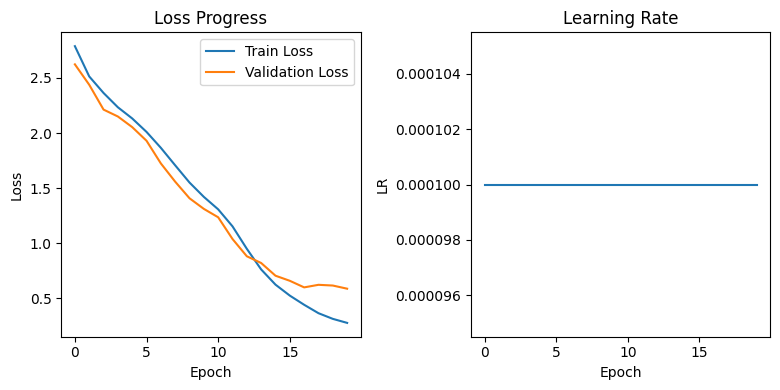


Training Progress:  40%|████      | 20/50 [1:32:27<2:18:36, 277.23s/it, Train Loss=0.2767, Val Loss=0.5870, Best Loss=0.5870]

Attempting to read 75 frames from data/s1/lwar8p.mpg


Epoch 21/50:   0%|          | 0/450 [00:00<?, ?it/s]


Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpgAttempting to read 75 frames from data/s1/prbj6p.mpg

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpgAttempting to read 75 frames from data/s1/bbal7s.mpg

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 21/50:   0%|          | 1/450 [00:00<06:07,  1.22it/s, Train Loss=0.3373, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 21/50:   0%|          | 2/450 [00:01<05:06,  1.46it/s, Train Loss=0.2020, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 21/50:   1%|          | 3/450 [00:02<04:46,  1.56it/s, Train Loss=0.2730, LR=0.000100]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 21/50:   1%|          | 4/450 [00:02<04:38,  1.60it/s, Train Loss=0.2540, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 21/50:   1%|          | 5/450 [00:03<04:33,  1.63it/s, Train Loss=0.1493, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 21/50:   1%|▏         | 6/450 [00:03<04:30,  1.64it/s, Train Loss=0.2385, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 21/50:   2%|▏         | 7/450 [00:04<04:27,  1.66it/s, Train Loss=0.1929, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 21/50:   2%|▏         | 8/450 [00:04<04:25,  1.66it/s, Train Loss=0.1839, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 21/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.1864, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 21/50:   2%|▏         | 10/450 [00:06<04:22,  1.68it/s, Train Loss=0.1372, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 21/50:   2%|▏         | 11/450 [00:06<04:20,  1.68it/s, Train Loss=0.2124, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 21/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.2850, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 21/50:   3%|▎         | 13/450 [00:07<04:18,  1.69it/s, Train Loss=0.2036, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 21/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=0.3136, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 21/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=0.0999, LR=0.000100]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 21/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=0.3078, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 21/50:   4%|▍         | 17/450 [00:10<04:15,  1.70it/s, Train Loss=0.1935, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 21/50:   4%|▍         | 18/450 [00:10<04:16,  1.69it/s, Train Loss=0.2238, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 21/50:   4%|▍         | 19/450 [00:11<04:15,  1.69it/s, Train Loss=0.3753, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 21/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.1163, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 21/50:   5%|▍         | 21/450 [00:12<04:13,  1.69it/s, Train Loss=0.2902, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 21/50:   5%|▍         | 22/450 [00:13<04:13,  1.69it/s, Train Loss=0.4441, LR=0.000100]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 21/50:   5%|▌         | 23/450 [00:13<04:12,  1.69it/s, Train Loss=0.2473, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 21/50:   5%|▌         | 24/450 [00:14<04:12,  1.68it/s, Train Loss=0.1406, LR=0.000100]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 21/50:   6%|▌         | 25/450 [00:15<04:11,  1.69it/s, Train Loss=0.2154, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 21/50:   6%|▌         | 26/450 [00:15<04:11,  1.69it/s, Train Loss=0.1881, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 21/50:   6%|▌         | 27/450 [00:16<04:13,  1.67it/s, Train Loss=0.1607, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 21/50:   6%|▌         | 28/450 [00:16<04:11,  1.68it/s, Train Loss=0.2759, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 21/50:   6%|▋         | 29/450 [00:17<04:10,  1.68it/s, Train Loss=0.2429, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 21/50:   7%|▋         | 30/450 [00:18<04:09,  1.68it/s, Train Loss=0.3008, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 21/50:   7%|▋         | 31/450 [00:18<04:09,  1.68it/s, Train Loss=0.2321, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 21/50:   7%|▋         | 32/450 [00:19<04:08,  1.68it/s, Train Loss=0.1785, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 21/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=0.2322, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 21/50:   8%|▊         | 34/450 [00:20<04:06,  1.69it/s, Train Loss=0.1685, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 21/50:   8%|▊         | 35/450 [00:20<04:04,  1.70it/s, Train Loss=0.2246, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 21/50:   8%|▊         | 36/450 [00:21<04:04,  1.69it/s, Train Loss=0.5566, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 21/50:   8%|▊         | 37/450 [00:22<04:04,  1.69it/s, Train Loss=0.1709, LR=0.000100]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 21/50:   8%|▊         | 38/450 [00:22<04:03,  1.69it/s, Train Loss=0.2671, LR=0.000100]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 21/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.1959, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 21/50:   9%|▉         | 40/450 [00:23<04:03,  1.68it/s, Train Loss=0.2255, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 21/50:   9%|▉         | 41/450 [00:24<04:03,  1.68it/s, Train Loss=0.1859, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 21/50:   9%|▉         | 42/450 [00:25<04:02,  1.68it/s, Train Loss=0.1832, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 21/50:  10%|▉         | 43/450 [00:25<04:02,  1.68it/s, Train Loss=0.2096, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 21/50:  10%|▉         | 44/450 [00:26<04:01,  1.68it/s, Train Loss=0.1657, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 21/50:  10%|█         | 45/450 [00:26<04:00,  1.68it/s, Train Loss=0.1029, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 21/50:  10%|█         | 46/450 [00:27<03:59,  1.68it/s, Train Loss=0.2151, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 21/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=0.2203, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 21/50:  11%|█         | 48/450 [00:28<03:58,  1.68it/s, Train Loss=0.2595, LR=0.000100]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 21/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=0.2405, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 21/50:  11%|█         | 50/450 [00:29<03:57,  1.69it/s, Train Loss=0.3077, LR=0.000100]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 21/50:  11%|█▏        | 51/450 [00:30<03:56,  1.69it/s, Train Loss=0.3676, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 21/50:  12%|█▏        | 52/450 [00:31<03:55,  1.69it/s, Train Loss=0.1959, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 21/50:  12%|█▏        | 53/450 [00:31<03:55,  1.69it/s, Train Loss=0.2811, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 21/50:  12%|█▏        | 54/450 [00:32<03:54,  1.69it/s, Train Loss=0.3241, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 21/50:  12%|█▏        | 55/450 [00:32<03:54,  1.69it/s, Train Loss=0.2681, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 21/50:  12%|█▏        | 56/450 [00:33<03:53,  1.69it/s, Train Loss=0.2141, LR=0.000100]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 21/50:  13%|█▎        | 57/450 [00:34<03:51,  1.69it/s, Train Loss=0.2002, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 21/50:  13%|█▎        | 58/450 [00:34<03:51,  1.69it/s, Train Loss=0.2387, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 21/50:  13%|█▎        | 59/450 [00:35<03:50,  1.70it/s, Train Loss=0.1943, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 21/50:  13%|█▎        | 60/450 [00:35<03:49,  1.70it/s, Train Loss=0.2640, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 21/50:  14%|█▎        | 61/450 [00:36<03:49,  1.69it/s, Train Loss=0.3934, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 21/50:  14%|█▍        | 62/450 [00:36<03:50,  1.68it/s, Train Loss=0.2517, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 21/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=0.2111, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 21/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.2870, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 21/50:  14%|█▍        | 65/450 [00:38<03:47,  1.69it/s, Train Loss=0.2686, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 21/50:  15%|█▍        | 66/450 [00:39<03:46,  1.69it/s, Train Loss=0.2115, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 21/50:  15%|█▍        | 67/450 [00:39<03:46,  1.69it/s, Train Loss=0.1773, LR=0.000100]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 21/50:  15%|█▌        | 68/450 [00:40<03:45,  1.69it/s, Train Loss=0.2950, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 21/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=0.3716, LR=0.000100]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 21/50:  16%|█▌        | 70/450 [00:41<03:44,  1.69it/s, Train Loss=0.2125, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 21/50:  16%|█▌        | 71/450 [00:42<03:43,  1.70it/s, Train Loss=0.1907, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 21/50:  16%|█▌        | 72/450 [00:42<03:43,  1.69it/s, Train Loss=0.1790, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 21/50:  16%|█▌        | 73/450 [00:43<03:42,  1.69it/s, Train Loss=0.2037, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 21/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=0.2337, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 21/50:  17%|█▋        | 75/450 [00:44<03:41,  1.70it/s, Train Loss=0.2279, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 21/50:  17%|█▋        | 76/450 [00:45<03:40,  1.70it/s, Train Loss=0.3802, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 21/50:  17%|█▋        | 77/450 [00:45<03:40,  1.69it/s, Train Loss=0.1487, LR=0.000100]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 21/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=0.3180, LR=0.000100]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 21/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=0.1331, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 21/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.2208, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 21/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.1966, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 21/50:  18%|█▊        | 82/450 [00:48<03:38,  1.68it/s, Train Loss=0.2323, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 21/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=0.2444, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 21/50:  19%|█▊        | 84/450 [00:49<03:36,  1.69it/s, Train Loss=0.2851, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 21/50:  19%|█▉        | 85/450 [00:50<03:35,  1.69it/s, Train Loss=0.1748, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 21/50:  19%|█▉        | 86/450 [00:51<03:34,  1.69it/s, Train Loss=0.1789, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 21/50:  19%|█▉        | 87/450 [00:51<03:34,  1.69it/s, Train Loss=0.2236, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 21/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.2813, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 21/50:  20%|█▉        | 89/450 [00:52<03:33,  1.69it/s, Train Loss=0.1768, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 21/50:  20%|██        | 90/450 [00:53<03:32,  1.69it/s, Train Loss=0.1694, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 21/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=0.1470, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 21/50:  20%|██        | 92/450 [00:54<03:32,  1.69it/s, Train Loss=0.2471, LR=0.000100]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 21/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=0.2648, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 21/50:  21%|██        | 94/450 [00:55<03:30,  1.69it/s, Train Loss=0.1221, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 21/50:  21%|██        | 95/450 [00:56<03:29,  1.69it/s, Train Loss=0.1512, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 21/50:  21%|██▏       | 96/450 [00:57<03:28,  1.70it/s, Train Loss=0.1805, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 21/50:  22%|██▏       | 97/450 [00:57<03:27,  1.70it/s, Train Loss=0.2381, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 21/50:  22%|██▏       | 98/450 [00:58<03:27,  1.70it/s, Train Loss=0.1460, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 21/50:  22%|██▏       | 99/450 [00:58<03:27,  1.69it/s, Train Loss=0.2115, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 21/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=0.2240, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 21/50:  22%|██▏       | 101/450 [01:00<03:26,  1.69it/s, Train Loss=0.1524, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 21/50:  23%|██▎       | 102/450 [01:00<03:25,  1.69it/s, Train Loss=0.2278, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 21/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.2273, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 21/50:  23%|██▎       | 104/450 [01:01<03:24,  1.70it/s, Train Loss=0.2667, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 21/50:  23%|██▎       | 105/450 [01:02<03:23,  1.70it/s, Train Loss=0.2903, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 21/50:  24%|██▎       | 106/450 [01:02<03:23,  1.69it/s, Train Loss=0.1838, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 21/50:  24%|██▍       | 107/450 [01:03<03:22,  1.69it/s, Train Loss=0.1892, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 21/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.2721, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 21/50:  24%|██▍       | 109/450 [01:04<03:21,  1.69it/s, Train Loss=0.3157, LR=0.000100]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 21/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.1907, LR=0.000100]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 21/50:  25%|██▍       | 111/450 [01:05<03:21,  1.69it/s, Train Loss=0.3564, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 21/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=0.2466, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 21/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.2749, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 21/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=0.1839, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 21/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.1687, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 21/50:  26%|██▌       | 116/450 [01:08<03:17,  1.69it/s, Train Loss=0.3171, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 21/50:  26%|██▌       | 117/450 [01:09<03:16,  1.70it/s, Train Loss=0.1643, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 21/50:  26%|██▌       | 118/450 [01:10<03:15,  1.69it/s, Train Loss=0.2722, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 21/50:  26%|██▋       | 119/450 [01:10<03:15,  1.70it/s, Train Loss=0.2100, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 21/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.2040, LR=0.000100]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 21/50:  27%|██▋       | 121/450 [01:11<03:14,  1.69it/s, Train Loss=0.2826, LR=0.000100]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 21/50:  27%|██▋       | 122/450 [01:12<03:14,  1.68it/s, Train Loss=0.2223, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 21/50:  27%|██▋       | 123/450 [01:13<03:14,  1.68it/s, Train Loss=0.2071, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 21/50:  28%|██▊       | 124/450 [01:13<03:13,  1.68it/s, Train Loss=0.2783, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 21/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=0.1286, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 21/50:  28%|██▊       | 126/450 [01:14<03:11,  1.69it/s, Train Loss=0.1814, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 21/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=0.2310, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 21/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.2697, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 21/50:  29%|██▊       | 129/450 [01:16<03:10,  1.68it/s, Train Loss=0.2583, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 21/50:  29%|██▉       | 130/450 [01:17<03:09,  1.68it/s, Train Loss=0.1988, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 21/50:  29%|██▉       | 131/450 [01:17<03:08,  1.69it/s, Train Loss=0.2036, LR=0.000100]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 21/50:  29%|██▉       | 132/450 [01:18<03:07,  1.69it/s, Train Loss=0.3123, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 21/50:  30%|██▉       | 133/450 [01:18<03:07,  1.69it/s, Train Loss=0.1748, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 21/50:  30%|██▉       | 134/450 [01:19<03:07,  1.68it/s, Train Loss=0.2728, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 21/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.1671, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 21/50:  30%|███       | 136/450 [01:20<03:06,  1.68it/s, Train Loss=0.1474, LR=0.000100]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 21/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.3228, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 21/50:  31%|███       | 138/450 [01:21<03:04,  1.69it/s, Train Loss=0.1679, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 21/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=0.2659, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 21/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.2945, LR=0.000100]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 21/50:  31%|███▏      | 141/450 [01:23<03:03,  1.69it/s, Train Loss=0.1295, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 21/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.1637, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 21/50:  32%|███▏      | 143/450 [01:24<03:01,  1.69it/s, Train Loss=0.1568, LR=0.000100]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 21/50:  32%|███▏      | 144/450 [01:25<03:00,  1.70it/s, Train Loss=0.2608, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 21/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.2291, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 21/50:  32%|███▏      | 146/450 [01:26<03:00,  1.69it/s, Train Loss=0.1948, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 21/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.2113, LR=0.000100]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 21/50:  33%|███▎      | 148/450 [01:27<02:58,  1.69it/s, Train Loss=0.2503, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 21/50:  33%|███▎      | 149/450 [01:28<02:58,  1.69it/s, Train Loss=0.3096, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 21/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.2005, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 21/50:  34%|███▎      | 151/450 [01:29<02:57,  1.68it/s, Train Loss=0.2138, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 21/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.3752, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 21/50:  34%|███▍      | 153/450 [01:30<02:56,  1.69it/s, Train Loss=0.3350, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 21/50:  34%|███▍      | 154/450 [01:31<02:55,  1.68it/s, Train Loss=0.1869, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 21/50:  34%|███▍      | 155/450 [01:32<02:55,  1.68it/s, Train Loss=0.1880, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 21/50:  35%|███▍      | 156/450 [01:32<02:55,  1.68it/s, Train Loss=0.1833, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 21/50:  35%|███▍      | 157/450 [01:33<02:54,  1.68it/s, Train Loss=0.1182, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 21/50:  35%|███▌      | 158/450 [01:33<02:53,  1.68it/s, Train Loss=0.1138, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 21/50:  35%|███▌      | 159/450 [01:34<02:53,  1.68it/s, Train Loss=0.2032, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 21/50:  36%|███▌      | 160/450 [01:34<02:52,  1.68it/s, Train Loss=0.2981, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 21/50:  36%|███▌      | 161/450 [01:35<02:51,  1.68it/s, Train Loss=0.4897, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 21/50:  36%|███▌      | 162/450 [01:36<02:50,  1.68it/s, Train Loss=0.2829, LR=0.000100]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 21/50:  36%|███▌      | 163/450 [01:36<02:50,  1.68it/s, Train Loss=0.3364, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 21/50:  36%|███▋      | 164/450 [01:37<02:50,  1.68it/s, Train Loss=0.3755, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 21/50:  37%|███▋      | 165/450 [01:37<02:49,  1.68it/s, Train Loss=0.5046, LR=0.000100]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 21/50:  37%|███▋      | 166/450 [01:38<02:49,  1.68it/s, Train Loss=0.2706, LR=0.000100]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 21/50:  37%|███▋      | 167/450 [01:39<02:48,  1.68it/s, Train Loss=0.2939, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 21/50:  37%|███▋      | 168/450 [01:39<02:47,  1.69it/s, Train Loss=0.1790, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp4p.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 21/50:  38%|███▊      | 169/450 [01:40<02:46,  1.68it/s, Train Loss=0.1797, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 21/50:  38%|███▊      | 170/450 [01:40<02:46,  1.68it/s, Train Loss=0.1654, LR=0.000100]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 21/50:  38%|███▊      | 171/450 [01:41<02:45,  1.68it/s, Train Loss=0.1993, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 21/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.2434, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 21/50:  38%|███▊      | 173/450 [01:42<02:44,  1.69it/s, Train Loss=0.1790, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 21/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.2726, LR=0.000100]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 21/50:  39%|███▉      | 175/450 [01:43<02:43,  1.69it/s, Train Loss=0.1931, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 21/50:  39%|███▉      | 176/450 [01:44<02:43,  1.68it/s, Train Loss=0.2107, LR=0.000100]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 21/50:  39%|███▉      | 177/450 [01:45<02:42,  1.68it/s, Train Loss=0.2616, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 21/50:  40%|███▉      | 178/450 [01:45<02:42,  1.68it/s, Train Loss=0.1874, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 21/50:  40%|███▉      | 179/450 [01:46<02:40,  1.68it/s, Train Loss=0.1759, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 21/50:  40%|████      | 180/450 [01:46<02:40,  1.68it/s, Train Loss=0.1208, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 21/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=0.2474, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 21/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.2102, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 21/50:  41%|████      | 183/450 [01:48<02:37,  1.69it/s, Train Loss=0.3600, LR=0.000100]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 21/50:  41%|████      | 184/450 [01:49<02:38,  1.68it/s, Train Loss=0.1384, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 21/50:  41%|████      | 185/450 [01:49<02:37,  1.69it/s, Train Loss=0.3691, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 21/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.3638, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 21/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.1213, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 21/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=0.2911, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 21/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.2517, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 21/50:  42%|████▏     | 190/450 [01:52<02:33,  1.69it/s, Train Loss=0.3267, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 21/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=0.2590, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 21/50:  43%|████▎     | 192/450 [01:53<02:32,  1.69it/s, Train Loss=0.1290, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 21/50:  43%|████▎     | 193/450 [01:54<02:32,  1.68it/s, Train Loss=0.6801, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 21/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=0.1972, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 21/50:  43%|████▎     | 195/450 [01:55<02:32,  1.68it/s, Train Loss=0.2263, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 21/50:  44%|████▎     | 196/450 [01:56<02:31,  1.68it/s, Train Loss=0.3625, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 21/50:  44%|████▍     | 197/450 [01:56<02:30,  1.68it/s, Train Loss=0.2882, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 21/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.1870, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv4p.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 21/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.2493, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 21/50:  44%|████▍     | 200/450 [01:58<02:27,  1.69it/s, Train Loss=0.1394, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 21/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.1425, LR=0.000100]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 21/50:  45%|████▍     | 202/450 [01:59<02:26,  1.69it/s, Train Loss=0.1471, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 21/50:  45%|████▌     | 203/450 [02:00<02:25,  1.70it/s, Train Loss=0.2052, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 21/50:  45%|████▌     | 204/450 [02:01<02:24,  1.70it/s, Train Loss=0.1835, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 21/50:  46%|████▌     | 205/450 [02:01<02:24,  1.69it/s, Train Loss=0.3007, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 21/50:  46%|████▌     | 206/450 [02:02<02:23,  1.70it/s, Train Loss=0.3422, LR=0.000100]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 21/50:  46%|████▌     | 207/450 [02:02<02:23,  1.70it/s, Train Loss=0.1877, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 21/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.1998, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 21/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.3287, LR=0.000100]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 21/50:  47%|████▋     | 210/450 [02:04<02:21,  1.69it/s, Train Loss=0.2489, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 21/50:  47%|████▋     | 211/450 [02:05<02:20,  1.70it/s, Train Loss=0.2427, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 21/50:  47%|████▋     | 212/450 [02:05<02:20,  1.69it/s, Train Loss=0.2283, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 21/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=0.2070, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 21/50:  48%|████▊     | 214/450 [02:06<02:19,  1.69it/s, Train Loss=0.2566, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 21/50:  48%|████▊     | 215/450 [02:07<02:18,  1.69it/s, Train Loss=0.2293, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 21/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.1946, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 21/50:  48%|████▊     | 217/450 [02:08<02:18,  1.68it/s, Train Loss=0.2402, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 21/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.1956, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 21/50:  49%|████▊     | 219/450 [02:09<02:16,  1.69it/s, Train Loss=0.3269, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 21/50:  49%|████▉     | 220/450 [02:10<02:15,  1.69it/s, Train Loss=0.2304, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 21/50:  49%|████▉     | 221/450 [02:11<02:15,  1.70it/s, Train Loss=0.2689, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 21/50:  49%|████▉     | 222/450 [02:11<02:14,  1.69it/s, Train Loss=0.3082, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 21/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.1377, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 21/50:  50%|████▉     | 224/450 [02:12<02:14,  1.68it/s, Train Loss=0.2070, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 21/50:  50%|█████     | 225/450 [02:13<02:13,  1.68it/s, Train Loss=0.2826, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 21/50:  50%|█████     | 226/450 [02:14<02:13,  1.68it/s, Train Loss=0.2665, LR=0.000100]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 21/50:  50%|█████     | 227/450 [02:14<02:12,  1.68it/s, Train Loss=0.1311, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 21/50:  51%|█████     | 228/450 [02:15<02:11,  1.68it/s, Train Loss=0.2503, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 21/50:  51%|█████     | 229/450 [02:15<02:11,  1.68it/s, Train Loss=0.3059, LR=0.000100]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 21/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.2552, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 21/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=0.1364, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 21/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.68it/s, Train Loss=0.2168, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 21/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.2681, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 21/50:  52%|█████▏    | 234/450 [02:18<02:08,  1.69it/s, Train Loss=0.1446, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 21/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.1913, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 21/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.2484, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 21/50:  53%|█████▎    | 237/450 [02:20<02:05,  1.70it/s, Train Loss=0.3262, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 21/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.1575, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 21/50:  53%|█████▎    | 239/450 [02:21<02:04,  1.69it/s, Train Loss=0.1448, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 21/50:  53%|█████▎    | 240/450 [02:22<02:03,  1.69it/s, Train Loss=0.2928, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 21/50:  54%|█████▎    | 241/450 [02:22<02:03,  1.69it/s, Train Loss=0.2496, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 21/50:  54%|█████▍    | 242/450 [02:23<02:02,  1.69it/s, Train Loss=0.2646, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 21/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.2306, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 21/50:  54%|█████▍    | 244/450 [02:24<02:01,  1.69it/s, Train Loss=0.2321, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 21/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.4315, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 21/50:  55%|█████▍    | 246/450 [02:25<02:01,  1.69it/s, Train Loss=0.2673, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 21/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.68it/s, Train Loss=0.2116, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 21/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.1689, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 21/50:  55%|█████▌    | 249/450 [02:27<01:59,  1.68it/s, Train Loss=0.1663, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 21/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.3779, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 21/50:  56%|█████▌    | 251/450 [02:28<01:57,  1.69it/s, Train Loss=0.2472, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 21/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.68it/s, Train Loss=0.1467, LR=0.000100]

Attempting to read 75 frames from data/s1/prwk1a.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 21/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.2191, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 21/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.69it/s, Train Loss=0.2992, LR=0.000100]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 21/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.2925, LR=0.000100]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 21/50:  57%|█████▋    | 256/450 [02:31<01:54,  1.69it/s, Train Loss=0.5312, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 21/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.2795, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 21/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.2080, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 21/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=0.2541, LR=0.000100]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 21/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=0.2054, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 21/50:  58%|█████▊    | 261/450 [02:34<01:51,  1.69it/s, Train Loss=0.2833, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 21/50:  58%|█████▊    | 262/450 [02:35<01:50,  1.70it/s, Train Loss=0.2856, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 21/50:  58%|█████▊    | 263/450 [02:36<01:49,  1.70it/s, Train Loss=0.2077, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 21/50:  59%|█████▊    | 264/450 [02:36<01:49,  1.69it/s, Train Loss=0.2173, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 21/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.70it/s, Train Loss=0.1526, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 21/50:  59%|█████▉    | 266/450 [02:37<01:48,  1.69it/s, Train Loss=0.2514, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 21/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=0.2446, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 21/50:  60%|█████▉    | 268/450 [02:38<01:48,  1.68it/s, Train Loss=0.1921, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 21/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.1983, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 21/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.2917, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 21/50:  60%|██████    | 271/450 [02:40<01:45,  1.69it/s, Train Loss=0.3300, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 21/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.2214, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 21/50:  61%|██████    | 273/450 [02:41<01:44,  1.69it/s, Train Loss=0.2073, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 21/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.1289, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 21/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.1629, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 21/50:  61%|██████▏   | 276/450 [02:43<01:42,  1.69it/s, Train Loss=0.1737, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 21/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.3060, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 21/50:  62%|██████▏   | 278/450 [02:44<01:41,  1.69it/s, Train Loss=0.2177, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 21/50:  62%|██████▏   | 279/450 [02:45<01:40,  1.69it/s, Train Loss=0.1832, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 21/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.2396, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 21/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.68it/s, Train Loss=0.1789, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 21/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.68it/s, Train Loss=0.1900, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 21/50:  63%|██████▎   | 283/450 [02:47<01:39,  1.68it/s, Train Loss=0.2098, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 21/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.68it/s, Train Loss=0.2019, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 21/50:  63%|██████▎   | 285/450 [02:49<01:38,  1.68it/s, Train Loss=0.2547, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 21/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.69it/s, Train Loss=0.1664, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 21/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.3456, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 21/50:  64%|██████▍   | 288/450 [02:50<01:35,  1.69it/s, Train Loss=0.1834, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 21/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.1852, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 21/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.3876, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 21/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.68it/s, Train Loss=0.1772, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 21/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.68it/s, Train Loss=0.2053, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 21/50:  65%|██████▌   | 293/450 [02:53<01:32,  1.69it/s, Train Loss=0.4709, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 21/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.2859, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 21/50:  66%|██████▌   | 295/450 [02:54<01:32,  1.68it/s, Train Loss=0.2344, LR=0.000100]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 21/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.1834, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 21/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.1601, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 21/50:  66%|██████▌   | 298/450 [02:56<01:29,  1.69it/s, Train Loss=0.1876, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 21/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.3479, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 21/50:  67%|██████▋   | 300/450 [02:57<01:28,  1.69it/s, Train Loss=0.2768, LR=0.000100]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 21/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.3054, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 21/50:  67%|██████▋   | 302/450 [02:59<01:28,  1.68it/s, Train Loss=0.2596, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 21/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.68it/s, Train Loss=0.1750, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 21/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.68it/s, Train Loss=0.1644, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 21/50:  68%|██████▊   | 305/450 [03:00<01:25,  1.69it/s, Train Loss=0.1769, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 21/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.2705, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 21/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.1945, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 21/50:  68%|██████▊   | 308/450 [03:02<01:23,  1.69it/s, Train Loss=0.2150, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 21/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.2959, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 21/50:  69%|██████▉   | 310/450 [03:03<01:23,  1.68it/s, Train Loss=0.1842, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 21/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.68it/s, Train Loss=0.1631, LR=0.000100]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 21/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.68it/s, Train Loss=0.4113, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 21/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.69it/s, Train Loss=0.2629, LR=0.000100]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 21/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.1746, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 21/50:  70%|███████   | 315/450 [03:06<01:20,  1.69it/s, Train Loss=0.1350, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 21/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=0.1741, LR=0.000100]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 21/50:  70%|███████   | 317/450 [03:08<01:19,  1.68it/s, Train Loss=0.2514, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 21/50:  71%|███████   | 318/450 [03:08<01:18,  1.68it/s, Train Loss=0.2494, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 21/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.3210, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 21/50:  71%|███████   | 320/450 [03:09<01:17,  1.68it/s, Train Loss=0.3552, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 21/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.2148, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 21/50:  72%|███████▏  | 322/450 [03:10<01:15,  1.69it/s, Train Loss=0.2078, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 21/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.3984, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 21/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.68it/s, Train Loss=0.2478, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 21/50:  72%|███████▏  | 325/450 [03:12<01:14,  1.68it/s, Train Loss=0.2627, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 21/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.2285, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 21/50:  73%|███████▎  | 327/450 [03:13<01:12,  1.69it/s, Train Loss=0.1905, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 21/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=0.1459, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 21/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.2482, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 21/50:  73%|███████▎  | 330/450 [03:15<01:11,  1.69it/s, Train Loss=0.1732, LR=0.000100]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 21/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.2526, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 21/50:  74%|███████▍  | 332/450 [03:16<01:09,  1.70it/s, Train Loss=0.1896, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 21/50:  74%|███████▍  | 333/450 [03:17<01:08,  1.70it/s, Train Loss=0.2800, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 21/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.1617, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 21/50:  74%|███████▍  | 335/450 [03:18<01:07,  1.70it/s, Train Loss=0.1797, LR=0.000100]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 21/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.70it/s, Train Loss=0.2010, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 21/50:  75%|███████▍  | 337/450 [03:19<01:06,  1.70it/s, Train Loss=0.2046, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 21/50:  75%|███████▌  | 338/450 [03:20<01:05,  1.71it/s, Train Loss=0.2024, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 21/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.70it/s, Train Loss=0.2288, LR=0.000100]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 21/50:  76%|███████▌  | 340/450 [03:21<01:04,  1.70it/s, Train Loss=0.2830, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 21/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.2668, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 21/50:  76%|███████▌  | 342/450 [03:22<01:03,  1.69it/s, Train Loss=0.2481, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 21/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.1960, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 21/50:  76%|███████▋  | 344/450 [03:23<01:02,  1.69it/s, Train Loss=0.1649, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 21/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.1484, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 21/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.2587, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 21/50:  77%|███████▋  | 347/450 [03:25<01:00,  1.70it/s, Train Loss=0.2241, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 21/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.70it/s, Train Loss=0.2750, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 21/50:  78%|███████▊  | 349/450 [03:26<00:59,  1.69it/s, Train Loss=0.2124, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 21/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.1592, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 21/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.1503, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 21/50:  78%|███████▊  | 352/450 [03:28<00:58,  1.69it/s, Train Loss=0.2204, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 21/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.2194, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 21/50:  79%|███████▊  | 354/450 [03:29<00:56,  1.69it/s, Train Loss=0.2690, LR=0.000100]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 21/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.70it/s, Train Loss=0.2566, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 21/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.1859, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 21/50:  79%|███████▉  | 357/450 [03:31<00:54,  1.69it/s, Train Loss=0.2482, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 21/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.3543, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 21/50:  80%|███████▉  | 359/450 [03:32<00:53,  1.69it/s, Train Loss=0.2998, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 21/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.2660, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 21/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.1626, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 21/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=0.1362, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 21/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.2750, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 21/50:  81%|████████  | 364/450 [03:35<00:50,  1.69it/s, Train Loss=0.1468, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 21/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.2040, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 21/50:  81%|████████▏ | 366/450 [03:36<00:49,  1.69it/s, Train Loss=0.2217, LR=0.000100]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 21/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=0.4519, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 21/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.1754, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 21/50:  82%|████████▏ | 369/450 [03:38<00:47,  1.70it/s, Train Loss=0.4975, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 21/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.70it/s, Train Loss=0.1605, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 21/50:  82%|████████▏ | 371/450 [03:39<00:46,  1.69it/s, Train Loss=0.2192, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 21/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.2417, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 21/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.2406, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 21/50:  83%|████████▎ | 374/450 [03:41<00:45,  1.69it/s, Train Loss=0.2415, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 21/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.68it/s, Train Loss=0.3408, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 21/50:  84%|████████▎ | 376/450 [03:42<00:43,  1.69it/s, Train Loss=0.2241, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 21/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.2809, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 21/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.68it/s, Train Loss=0.3805, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 21/50:  84%|████████▍ | 379/450 [03:44<00:42,  1.69it/s, Train Loss=0.2054, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 21/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.2903, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 21/50:  85%|████████▍ | 381/450 [03:45<00:40,  1.68it/s, Train Loss=0.1723, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 21/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.1815, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 21/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.70it/s, Train Loss=0.2444, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 21/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.69it/s, Train Loss=0.2881, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 21/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.2269, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 21/50:  86%|████████▌ | 386/450 [03:48<00:37,  1.69it/s, Train Loss=0.2456, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 21/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.1878, LR=0.000100]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 21/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.3108, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 21/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.69it/s, Train Loss=0.2795, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 21/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.2007, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr6p.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 21/50:  87%|████████▋ | 391/450 [03:51<00:34,  1.69it/s, Train Loss=0.2327, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 21/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.2165, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 21/50:  87%|████████▋ | 393/450 [03:52<00:33,  1.69it/s, Train Loss=0.1488, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 21/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=0.1161, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 21/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=0.2500, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 21/50:  88%|████████▊ | 396/450 [03:54<00:31,  1.69it/s, Train Loss=0.2837, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 21/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.2789, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 21/50:  88%|████████▊ | 398/450 [03:55<00:30,  1.69it/s, Train Loss=0.2453, LR=0.000100]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 21/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.2453, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 21/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.1847, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 21/50:  89%|████████▉ | 401/450 [03:57<00:28,  1.69it/s, Train Loss=0.2053, LR=0.000100]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 21/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.1586, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 21/50:  90%|████████▉ | 403/450 [03:58<00:27,  1.69it/s, Train Loss=0.2839, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 21/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.1429, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 21/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.3941, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 21/50:  90%|█████████ | 406/450 [04:00<00:26,  1.69it/s, Train Loss=0.1221, LR=0.000100]

Attempting to read 75 frames from data/s1/lrblzn.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 21/50:  90%|█████████ | 407/450 [04:01<00:25,  1.68it/s, Train Loss=0.2646, LR=0.000100]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 21/50:  91%|█████████ | 408/450 [04:01<00:24,  1.69it/s, Train Loss=0.1961, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 21/50:  91%|█████████ | 409/450 [04:02<00:24,  1.68it/s, Train Loss=0.2221, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 21/50:  91%|█████████ | 410/450 [04:03<00:23,  1.68it/s, Train Loss=0.1649, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 21/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.68it/s, Train Loss=0.1292, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 21/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.68it/s, Train Loss=0.4433, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 21/50:  92%|█████████▏| 413/450 [04:04<00:22,  1.68it/s, Train Loss=0.2874, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 21/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.68it/s, Train Loss=0.1752, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 21/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.68it/s, Train Loss=0.2172, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 21/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.69it/s, Train Loss=0.1722, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 21/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.1190, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 21/50:  93%|█████████▎| 418/450 [04:07<00:18,  1.69it/s, Train Loss=0.2461, LR=0.000100]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 21/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.2252, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 21/50:  93%|█████████▎| 420/450 [04:08<00:17,  1.69it/s, Train Loss=0.1775, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 21/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.68it/s, Train Loss=0.1272, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 21/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.1346, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 21/50:  94%|█████████▍| 423/450 [04:10<00:15,  1.69it/s, Train Loss=0.2112, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 21/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.70it/s, Train Loss=0.2132, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 21/50:  94%|█████████▍| 425/450 [04:11<00:14,  1.69it/s, Train Loss=0.2127, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 21/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.1533, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 21/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.1561, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 21/50:  95%|█████████▌| 428/450 [04:13<00:12,  1.69it/s, Train Loss=0.2211, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 21/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.3396, LR=0.000100]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 21/50:  96%|█████████▌| 430/450 [04:14<00:11,  1.70it/s, Train Loss=0.2905, LR=0.000100]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 21/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.1849, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 21/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.3290, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 21/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.68it/s, Train Loss=0.2698, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 21/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.2570, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 21/50:  97%|█████████▋| 435/450 [04:17<00:08,  1.69it/s, Train Loss=0.2286, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 21/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.2096, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 21/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.2347, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 21/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.69it/s, Train Loss=0.1721, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 21/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=0.2207, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 21/50:  98%|█████████▊| 440/450 [04:20<00:05,  1.69it/s, Train Loss=0.1786, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 21/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=0.2902, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 21/50:  98%|█████████▊| 442/450 [04:21<00:04,  1.68it/s, Train Loss=0.5464, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 21/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.68it/s, Train Loss=0.2152, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 21/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.1279, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 21/50:  99%|█████████▉| 445/450 [04:23<00:02,  1.69it/s, Train Loss=0.2357, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 21/50: 100%|██████████| 450/450 [04:26<00:00,  1.71it/s, Train Loss=0.1418, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg


Attempting to read 75 frames from data/s1/lbbezn.mpg

Validation:   2%|▏         | 1/50 [00:00<00:28,  1.70it/s, Val Loss=0.9317]


Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   4%|▍         | 2/50 [00:00<00:17,  2.78it/s, Val Loss=0.3147]

Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   6%|▌         | 3/50 [00:00<00:13,  3.55it/s, Val Loss=0.4110]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  4.06it/s, Val Loss=0.3213]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg


Validation:   8%|▊         | 4/50 [00:01<00:11,  4.06it/s, Val Loss=0.2631]


Validation:  10%|█         | 5/50 [00:01<00:10,  4.33it/s, Val Loss=0.2631]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg
Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.54it/s, Val Loss=1.3046]

Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.77it/s, Val Loss=0.9385]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.77it/s, Val Loss=0.6719]

Attempting to read 75 frames from data/s1/bwim7a.mpg


Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.88it/s, Val Loss=0.6719]


Validation:  18%|█▊        | 9/50 [00:02<00:08,  4.95it/s, Val Loss=0.4985]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.04it/s, Val Loss=0.3565]

Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.14it/s, Val Loss=1.1781]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.23it/s, Val Loss=0.0529]

Attempting to read 75 frames from data/s1/prii7s.mpgAttempting to read 75 frames from data/s1/pbwj2n.mpg




Validation:  26%|██▌       | 13/50 [00:02<00:06,  5.35it/s, Val Loss=0.6791]

Attempting to read 75 frames from data/s1/lgil5s.mpg
Attempting to read 75 frames from data/s1/bbir9a.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.40it/s, Val Loss=0.3131]

Attempting to read 75 frames from data/s1/lgbs9a.mpgAttempting to read 75 frames from data/s1/lriq8p.mpg




Validation:  30%|███       | 15/50 [00:03<00:06,  5.43it/s, Val Loss=0.5006]

Attempting to read 75 frames from data/s1/bwim4n.mpgAttempting to read 75 frames from data/s1/prwx7s.mpg




Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.48it/s, Val Loss=0.4827]

Attempting to read 75 frames from data/s1/lgbm3s.mpgAttempting to read 75 frames from data/s1/swau9s.mpg




Validation:  34%|███▍      | 17/50 [00:03<00:05,  5.53it/s, Val Loss=0.4000]

Attempting to read 75 frames from data/s1/lbbk5s.mpgAttempting to read 75 frames from data/s1/lwie4n.mpg




Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.42it/s, Val Loss=0.3287]

Attempting to read 75 frames from data/s1/lgwm9a.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.44it/s, Val Loss=0.2169]

Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.39it/s, Val Loss=0.3380]

Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.32it/s, Val Loss=2.1448]

Attempting to read 75 frames from data/s1/lrbr5s.mpgAttempting to read 75 frames from data/s1/lrwr9s.mpg




Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.37it/s, Val Loss=0.1765]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.38it/s, Val Loss=0.3958]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.41it/s, Val Loss=0.2372]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.38it/s, Val Loss=1.4308]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.43it/s, Val Loss=0.1899]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.40it/s, Val Loss=0.2508]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.37it/s, Val Loss=0.9628]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.41it/s, Val Loss=0.2772]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg

Validation:  60%|██████    | 30/50 [00:06<00:03,  5.26it/s, Val Loss=1.2528]

Attempting to read 75 frames from data/s1/prbq1a.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.20it/s, Val Loss=1.2223]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/lbid3s.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.20it/s, Val Loss=0.3286]

Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/sria7s.mpg

Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.33it/s, Val Loss=0.5056]

Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.38it/s, Val Loss=0.2353]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.37it/s, Val Loss=0.3747]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.31it/s, Val Loss=0.4469]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/sgiczp.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.36it/s, Val Loss=0.4331]

Attempting to read 75 frames from data/s1/lgwtzn.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg


Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.42it/s, Val Loss=0.3692]


Attempting to read 75 frames from data/s1/pbib7s.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.42it/s, Val Loss=0.9268]

Attempting to read 75 frames from data/s1/bwwu3a.mpg


Attempting to read 75 frames from data/s1/srbb5s.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg



Validation:  80%|████████  | 40/50 [00:07<00:01,  5.33it/s, Val Loss=0.5189]

Attempting to read 75 frames from data/s1/lbbk6p.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.24it/s, Val Loss=0.3984]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.34it/s, Val Loss=0.1585]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.30it/s, Val Loss=0.3407]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg

Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.33it/s, Val Loss=0.3450]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/lbaq6p.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.24it/s, Val Loss=0.1510]

Attempting to read 75 frames from data/s1/prap5s.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.26it/s, Val Loss=1.9975]

Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  94%|█████████▍| 47/50 [00:09<00:00,  5.19it/s, Val Loss=0.3894]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  42%|████▏     | 21/50 [1:37:04<2:13:56, 277.12s/it, Train Loss=0.2342, Val Loss=0.5792, Best Loss=0.5792]


🏆 New best model saved with validation loss: 0.5792



Epoch 22/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 22/50:   0%|          | 1/450 [00:00<06:38,  1.13it/s, Train Loss=0.2994, LR=0.000100]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 22/50:   0%|          | 2/450 [00:01<05:18,  1.41it/s, Train Loss=0.1305, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 22/50:   1%|          | 3/450 [00:02<04:52,  1.53it/s, Train Loss=0.1980, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 22/50:   1%|          | 4/450 [00:02<04:41,  1.58it/s, Train Loss=0.1830, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 22/50:   1%|          | 5/450 [00:03<04:34,  1.62it/s, Train Loss=0.2384, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 22/50:   1%|▏         | 6/450 [00:03<04:32,  1.63it/s, Train Loss=0.1544, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 22/50:   2%|▏         | 7/450 [00:04<04:28,  1.65it/s, Train Loss=0.1930, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 22/50:   2%|▏         | 8/450 [00:05<04:24,  1.67it/s, Train Loss=0.2140, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 22/50:   2%|▏         | 9/450 [00:05<04:22,  1.68it/s, Train Loss=0.2548, LR=0.000100]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 22/50:   2%|▏         | 10/450 [00:06<04:21,  1.68it/s, Train Loss=0.1700, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 22/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=0.2290, LR=0.000100]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 22/50:   3%|▎         | 12/450 [00:07<04:21,  1.68it/s, Train Loss=0.2154, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 22/50:   3%|▎         | 13/450 [00:08<04:21,  1.67it/s, Train Loss=0.1799, LR=0.000100]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 22/50:   3%|▎         | 14/450 [00:08<04:20,  1.67it/s, Train Loss=0.1213, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 22/50:   3%|▎         | 15/450 [00:09<04:19,  1.67it/s, Train Loss=0.0895, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 22/50:   4%|▎         | 16/450 [00:09<04:18,  1.68it/s, Train Loss=0.2053, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 22/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=0.1006, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 22/50:   4%|▍         | 18/450 [00:10<04:16,  1.69it/s, Train Loss=0.2049, LR=0.000100]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 22/50:   4%|▍         | 19/450 [00:11<04:15,  1.68it/s, Train Loss=0.3324, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 22/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=0.3384, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 22/50:   5%|▍         | 21/450 [00:12<04:15,  1.68it/s, Train Loss=0.1294, LR=0.000100]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 22/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=0.1456, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 22/50:   5%|▌         | 23/450 [00:13<04:13,  1.68it/s, Train Loss=0.1368, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 22/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.0956, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 22/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=0.1842, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 22/50:   6%|▌         | 26/450 [00:15<04:11,  1.69it/s, Train Loss=0.2798, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 22/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=0.2227, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 22/50:   6%|▌         | 28/450 [00:16<04:10,  1.68it/s, Train Loss=0.1987, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 22/50:   6%|▋         | 29/450 [00:17<04:09,  1.68it/s, Train Loss=0.1594, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 22/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.1753, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 22/50:   7%|▋         | 31/450 [00:18<04:07,  1.69it/s, Train Loss=0.1821, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 22/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.1252, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 22/50:   7%|▋         | 33/450 [00:19<04:07,  1.69it/s, Train Loss=0.2386, LR=0.000100]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 22/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=0.1174, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 22/50:   8%|▊         | 35/450 [00:21<04:05,  1.69it/s, Train Loss=0.2029, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 22/50:   8%|▊         | 36/450 [00:21<04:04,  1.69it/s, Train Loss=0.3035, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 22/50:   8%|▊         | 37/450 [00:22<04:03,  1.69it/s, Train Loss=0.1355, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 22/50:   8%|▊         | 38/450 [00:22<04:04,  1.69it/s, Train Loss=0.2366, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 22/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.6496, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 22/50:   9%|▉         | 40/450 [00:24<04:03,  1.69it/s, Train Loss=0.1370, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 22/50:   9%|▉         | 41/450 [00:24<04:01,  1.69it/s, Train Loss=0.1949, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 22/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=0.1238, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 22/50:  10%|▉         | 43/450 [00:25<04:00,  1.69it/s, Train Loss=0.3085, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 22/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=0.2589, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 22/50:  10%|█         | 45/450 [00:26<03:59,  1.69it/s, Train Loss=0.2521, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 22/50:  10%|█         | 46/450 [00:27<04:00,  1.68it/s, Train Loss=0.2484, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 22/50:  10%|█         | 47/450 [00:28<04:00,  1.68it/s, Train Loss=0.1115, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 22/50:  11%|█         | 48/450 [00:28<03:59,  1.68it/s, Train Loss=0.1704, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 22/50:  11%|█         | 49/450 [00:29<03:59,  1.67it/s, Train Loss=0.1796, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 22/50:  11%|█         | 50/450 [00:29<03:58,  1.68it/s, Train Loss=0.2438, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 22/50:  11%|█▏        | 51/450 [00:30<03:59,  1.66it/s, Train Loss=0.1887, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 22/50:  12%|█▏        | 52/450 [00:31<03:59,  1.66it/s, Train Loss=0.2684, LR=0.000100]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 22/50:  12%|█▏        | 53/450 [00:31<03:58,  1.66it/s, Train Loss=0.1686, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 22/50:  12%|█▏        | 54/450 [00:32<03:57,  1.67it/s, Train Loss=0.1627, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 22/50:  12%|█▏        | 55/450 [00:32<03:56,  1.67it/s, Train Loss=0.1756, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv6n.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 22/50:  12%|█▏        | 56/450 [00:33<03:55,  1.68it/s, Train Loss=0.1672, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 22/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=0.1678, LR=0.000100]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 22/50:  13%|█▎        | 58/450 [00:34<03:52,  1.68it/s, Train Loss=0.1758, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 22/50:  13%|█▎        | 59/450 [00:35<03:52,  1.68it/s, Train Loss=0.1779, LR=0.000100]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 22/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.2801, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 22/50:  14%|█▎        | 61/450 [00:36<03:49,  1.69it/s, Train Loss=0.1697, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 22/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=0.1655, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 22/50:  14%|█▍        | 63/450 [00:37<03:47,  1.70it/s, Train Loss=0.1853, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 22/50:  14%|█▍        | 64/450 [00:38<03:47,  1.70it/s, Train Loss=0.3414, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 22/50:  14%|█▍        | 65/450 [00:38<03:46,  1.70it/s, Train Loss=0.1613, LR=0.000100]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 22/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=0.1982, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 22/50:  15%|█▍        | 67/450 [00:40<03:46,  1.69it/s, Train Loss=0.2166, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 22/50:  15%|█▌        | 68/450 [00:40<03:45,  1.69it/s, Train Loss=0.2512, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 22/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=0.1920, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 22/50:  16%|█▌        | 70/450 [00:41<03:44,  1.69it/s, Train Loss=0.3438, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 22/50:  16%|█▌        | 71/450 [00:42<03:43,  1.70it/s, Train Loss=0.2066, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 22/50:  16%|█▌        | 72/450 [00:43<03:42,  1.70it/s, Train Loss=0.1630, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 22/50:  16%|█▌        | 73/450 [00:43<03:43,  1.69it/s, Train Loss=0.2769, LR=0.000100]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 22/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=0.1680, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 22/50:  17%|█▋        | 75/450 [00:44<03:41,  1.69it/s, Train Loss=0.2523, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 22/50:  17%|█▋        | 76/450 [00:45<03:40,  1.70it/s, Train Loss=0.1777, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 22/50:  17%|█▋        | 77/450 [00:45<03:39,  1.70it/s, Train Loss=0.1568, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 22/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=0.2509, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 22/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=0.0891, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 22/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.1497, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 22/50:  18%|█▊        | 81/450 [00:48<03:39,  1.68it/s, Train Loss=0.1713, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 22/50:  18%|█▊        | 82/450 [00:48<03:38,  1.69it/s, Train Loss=0.2610, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 22/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=0.3418, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 22/50:  19%|█▊        | 84/450 [00:50<03:37,  1.68it/s, Train Loss=0.0903, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 22/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=0.1659, LR=0.000100]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 22/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.1335, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 22/50:  19%|█▉        | 87/450 [00:51<03:36,  1.68it/s, Train Loss=0.2482, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 22/50:  20%|█▉        | 88/450 [00:52<03:35,  1.68it/s, Train Loss=0.2349, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 22/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=0.1576, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 22/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=0.1512, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 22/50:  20%|██        | 91/450 [00:54<03:33,  1.68it/s, Train Loss=0.1713, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 22/50:  20%|██        | 92/450 [00:54<03:31,  1.69it/s, Train Loss=0.2226, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 22/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=0.2425, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 22/50:  21%|██        | 94/450 [00:56<03:32,  1.68it/s, Train Loss=0.2339, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 22/50:  21%|██        | 95/450 [00:56<03:30,  1.69it/s, Train Loss=0.1565, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 22/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.1641, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 22/50:  22%|██▏       | 97/450 [00:57<03:29,  1.69it/s, Train Loss=0.1427, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 22/50:  22%|██▏       | 98/450 [00:58<03:29,  1.68it/s, Train Loss=0.1975, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 22/50:  22%|██▏       | 99/450 [00:59<03:28,  1.68it/s, Train Loss=0.2186, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 22/50:  22%|██▏       | 100/450 [00:59<03:26,  1.69it/s, Train Loss=0.1256, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 22/50:  22%|██▏       | 101/450 [01:00<03:26,  1.69it/s, Train Loss=0.1644, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 22/50:  23%|██▎       | 102/450 [01:00<03:26,  1.69it/s, Train Loss=0.2150, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 22/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.3065, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 22/50:  23%|██▎       | 104/450 [01:01<03:24,  1.69it/s, Train Loss=0.1721, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 22/50:  23%|██▎       | 105/450 [01:02<03:24,  1.69it/s, Train Loss=0.2909, LR=0.000100]

Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 22/50:  24%|██▎       | 106/450 [01:03<03:24,  1.69it/s, Train Loss=0.1939, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 22/50:  24%|██▍       | 107/450 [01:03<03:24,  1.68it/s, Train Loss=0.1613, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 22/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=0.1812, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 22/50:  24%|██▍       | 109/450 [01:04<03:22,  1.68it/s, Train Loss=0.1647, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 22/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.2642, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 22/50:  25%|██▍       | 111/450 [01:06<03:20,  1.69it/s, Train Loss=0.2134, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 22/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=0.1268, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 22/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.1420, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 22/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=0.0922, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 22/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.1829, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 22/50:  26%|██▌       | 116/450 [01:09<03:17,  1.69it/s, Train Loss=0.1774, LR=0.000100]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 22/50:  26%|██▌       | 117/450 [01:09<03:17,  1.69it/s, Train Loss=0.2303, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 22/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=0.3268, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 22/50:  26%|██▋       | 119/450 [01:10<03:15,  1.69it/s, Train Loss=0.2323, LR=0.000100]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 22/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.2453, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 22/50:  27%|██▋       | 121/450 [01:12<03:14,  1.69it/s, Train Loss=0.1167, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 22/50:  27%|██▋       | 122/450 [01:12<03:14,  1.68it/s, Train Loss=0.3554, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 22/50:  27%|██▋       | 123/450 [01:13<03:14,  1.68it/s, Train Loss=0.2538, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 22/50:  28%|██▊       | 124/450 [01:13<03:13,  1.68it/s, Train Loss=0.1841, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 22/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=0.1341, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 22/50:  28%|██▊       | 126/450 [01:15<03:11,  1.69it/s, Train Loss=0.2090, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 22/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=0.2700, LR=0.000100]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 22/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.2400, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 22/50:  29%|██▊       | 129/450 [01:16<03:10,  1.68it/s, Train Loss=0.2369, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 22/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.2568, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 22/50:  29%|██▉       | 131/450 [01:17<03:08,  1.69it/s, Train Loss=0.2199, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 22/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=0.1613, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 22/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=0.1672, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 22/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.2603, LR=0.000100]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 22/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.2390, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 22/50:  30%|███       | 136/450 [01:20<03:06,  1.68it/s, Train Loss=0.1531, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 22/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.2249, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 22/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=0.1542, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 22/50:  31%|███       | 139/450 [01:22<03:05,  1.68it/s, Train Loss=0.0911, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 22/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=0.2019, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 22/50:  31%|███▏      | 141/450 [01:23<03:03,  1.68it/s, Train Loss=0.1344, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 22/50:  32%|███▏      | 142/450 [01:24<03:03,  1.68it/s, Train Loss=0.2459, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 22/50:  32%|███▏      | 143/450 [01:25<03:02,  1.68it/s, Train Loss=0.2183, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 22/50:  32%|███▏      | 144/450 [01:25<03:01,  1.69it/s, Train Loss=0.5285, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 22/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.1503, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 22/50:  32%|███▏      | 146/450 [01:26<02:59,  1.69it/s, Train Loss=0.1039, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 22/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.1960, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 22/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=0.2955, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 22/50:  33%|███▎      | 149/450 [01:28<02:58,  1.69it/s, Train Loss=0.1928, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 22/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.1694, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 22/50:  34%|███▎      | 151/450 [01:29<02:56,  1.69it/s, Train Loss=0.2307, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 22/50:  34%|███▍      | 152/450 [01:30<02:55,  1.69it/s, Train Loss=0.2867, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 22/50:  34%|███▍      | 153/450 [01:31<02:54,  1.70it/s, Train Loss=0.1856, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 22/50:  34%|███▍      | 154/450 [01:31<02:53,  1.70it/s, Train Loss=0.1879, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 22/50:  34%|███▍      | 155/450 [01:32<02:53,  1.70it/s, Train Loss=0.0763, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 22/50:  35%|███▍      | 156/450 [01:32<02:53,  1.69it/s, Train Loss=0.1654, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 22/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.2028, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 22/50:  35%|███▌      | 158/450 [01:33<02:52,  1.69it/s, Train Loss=0.2977, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 22/50:  35%|███▌      | 159/450 [01:34<02:51,  1.70it/s, Train Loss=0.1992, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 22/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.1478, LR=0.000100]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 22/50:  36%|███▌      | 161/450 [01:35<02:50,  1.69it/s, Train Loss=0.1306, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 22/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.2121, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 22/50:  36%|███▌      | 163/450 [01:36<02:50,  1.69it/s, Train Loss=0.3440, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 22/50:  36%|███▋      | 164/450 [01:37<02:50,  1.68it/s, Train Loss=0.1448, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 22/50:  37%|███▋      | 165/450 [01:38<02:49,  1.68it/s, Train Loss=0.2339, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 22/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=0.1641, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 22/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.1567, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 22/50:  37%|███▋      | 168/450 [01:39<02:47,  1.69it/s, Train Loss=0.2423, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 22/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.2097, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 22/50:  38%|███▊      | 170/450 [01:41<02:46,  1.69it/s, Train Loss=0.2880, LR=0.000100]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 22/50:  38%|███▊      | 171/450 [01:41<02:45,  1.69it/s, Train Loss=0.1759, LR=0.000100]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 22/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=0.1886, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 22/50:  38%|███▊      | 173/450 [01:42<02:44,  1.68it/s, Train Loss=0.5232, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 22/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.2080, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 22/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=0.1789, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 22/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.2025, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 22/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.1294, LR=0.000100]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 22/50:  40%|███▉      | 178/450 [01:45<02:41,  1.68it/s, Train Loss=0.0958, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 22/50:  40%|███▉      | 179/450 [01:46<02:41,  1.68it/s, Train Loss=0.1111, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 22/50:  40%|████      | 180/450 [01:47<02:40,  1.68it/s, Train Loss=0.1229, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 22/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=0.1374, LR=0.000100]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 22/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.2480, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 22/50:  41%|████      | 183/450 [01:48<02:38,  1.69it/s, Train Loss=0.2400, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 22/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.1868, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 22/50:  41%|████      | 185/450 [01:49<02:37,  1.68it/s, Train Loss=0.1603, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 22/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.1379, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 22/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.2123, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 22/50:  42%|████▏     | 188/450 [01:51<02:34,  1.69it/s, Train Loss=0.1864, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 22/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.2257, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 22/50:  42%|████▏     | 190/450 [01:52<02:33,  1.69it/s, Train Loss=0.0981, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 22/50:  42%|████▏     | 191/450 [01:53<02:32,  1.70it/s, Train Loss=0.1911, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 22/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=0.2225, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 22/50:  43%|████▎     | 193/450 [01:54<02:31,  1.70it/s, Train Loss=0.3741, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 22/50:  43%|████▎     | 194/450 [01:55<02:30,  1.70it/s, Train Loss=0.1748, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 22/50:  43%|████▎     | 195/450 [01:55<02:30,  1.69it/s, Train Loss=0.2640, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 22/50:  44%|████▎     | 196/450 [01:56<02:29,  1.69it/s, Train Loss=0.1500, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 22/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=0.1532, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 22/50:  44%|████▍     | 198/450 [01:57<02:28,  1.69it/s, Train Loss=0.1253, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 22/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=0.2390, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 22/50:  44%|████▍     | 200/450 [01:58<02:28,  1.69it/s, Train Loss=0.2666, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 22/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.1245, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 22/50:  45%|████▍     | 202/450 [02:00<02:26,  1.69it/s, Train Loss=0.1486, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 22/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.2657, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 22/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=0.3064, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 22/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=0.2629, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 22/50:  46%|████▌     | 206/450 [02:02<02:25,  1.68it/s, Train Loss=0.1958, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 22/50:  46%|████▌     | 207/450 [02:03<02:24,  1.69it/s, Train Loss=0.1168, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 22/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.1811, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 22/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.1821, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 22/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=0.0904, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 22/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.3619, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 22/50:  47%|████▋     | 212/450 [02:05<02:21,  1.69it/s, Train Loss=0.1882, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 22/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=0.2669, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 22/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=0.2671, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 22/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=0.1415, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 22/50:  48%|████▊     | 216/450 [02:08<02:18,  1.68it/s, Train Loss=0.1585, LR=0.000100]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 22/50:  48%|████▊     | 217/450 [02:08<02:18,  1.69it/s, Train Loss=0.1863, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 22/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.1680, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 22/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=0.1347, LR=0.000100]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 22/50:  49%|████▉     | 220/450 [02:10<02:15,  1.70it/s, Train Loss=0.2115, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 22/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=0.1099, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 22/50:  49%|████▉     | 222/450 [02:11<02:14,  1.69it/s, Train Loss=0.4313, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 22/50:  50%|████▉     | 223/450 [02:12<02:13,  1.70it/s, Train Loss=0.2847, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 22/50:  50%|████▉     | 224/450 [02:13<02:13,  1.70it/s, Train Loss=0.2027, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 22/50:  50%|█████     | 225/450 [02:13<02:12,  1.69it/s, Train Loss=0.2394, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 22/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.1756, LR=0.000100]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 22/50:  50%|█████     | 227/450 [02:14<02:11,  1.69it/s, Train Loss=0.3276, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 22/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.1547, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 22/50:  51%|█████     | 229/450 [02:16<02:10,  1.69it/s, Train Loss=0.2239, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 22/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.2826, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 22/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.2979, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 22/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.68it/s, Train Loss=0.1492, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 22/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.2073, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 22/50:  52%|█████▏    | 234/450 [02:18<02:08,  1.68it/s, Train Loss=0.1754, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 22/50:  52%|█████▏    | 235/450 [02:19<02:08,  1.67it/s, Train Loss=0.3070, LR=0.000100]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 22/50:  52%|█████▏    | 236/450 [02:20<02:07,  1.67it/s, Train Loss=0.1846, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 22/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.68it/s, Train Loss=0.2237, LR=0.000100]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 22/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.1934, LR=0.000100]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 22/50:  53%|█████▎    | 239/450 [02:21<02:05,  1.69it/s, Train Loss=0.3422, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 22/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.68it/s, Train Loss=0.2006, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 22/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=0.2237, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 22/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=0.1951, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 22/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.1121, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 22/50:  54%|█████▍    | 244/450 [02:24<02:02,  1.69it/s, Train Loss=0.1877, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 22/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.0966, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 22/50:  55%|█████▍    | 246/450 [02:26<02:01,  1.68it/s, Train Loss=0.3208, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 22/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.68it/s, Train Loss=0.2291, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 22/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.1039, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 22/50:  55%|█████▌    | 249/450 [02:27<01:58,  1.69it/s, Train Loss=0.1605, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 22/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.2819, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 22/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=0.1948, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 22/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=0.1681, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 22/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.3296, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg



Epoch 22/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.69it/s, Train Loss=0.3517, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 22/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.1560, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 22/50:  57%|█████▋    | 256/450 [02:32<01:54,  1.69it/s, Train Loss=0.2169, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 22/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.1748, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 22/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.68it/s, Train Loss=0.2188, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 22/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.68it/s, Train Loss=0.2702, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 22/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=0.1753, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 22/50:  58%|█████▊    | 261/450 [02:35<01:51,  1.69it/s, Train Loss=0.1188, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 22/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=0.2143, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 22/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=0.1781, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 22/50:  59%|█████▊    | 264/450 [02:36<01:49,  1.69it/s, Train Loss=0.1527, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 22/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.68it/s, Train Loss=0.1750, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 22/50:  59%|█████▉    | 266/450 [02:37<01:49,  1.68it/s, Train Loss=0.2069, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 22/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.68it/s, Train Loss=0.1501, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 22/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=0.1196, LR=0.000100]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 22/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.68it/s, Train Loss=0.1633, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 22/50:  60%|██████    | 270/450 [02:40<01:47,  1.68it/s, Train Loss=0.1533, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 22/50:  60%|██████    | 271/450 [02:40<01:46,  1.68it/s, Train Loss=0.2881, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 22/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.2694, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 22/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.2166, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 22/50:  61%|██████    | 274/450 [02:42<01:43,  1.69it/s, Train Loss=0.2202, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 22/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.1469, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 22/50:  61%|██████▏   | 276/450 [02:43<01:42,  1.69it/s, Train Loss=0.2267, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 22/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.1559, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 22/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=0.2073, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 22/50:  62%|██████▏   | 279/450 [02:45<01:40,  1.70it/s, Train Loss=0.1922, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 22/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.70it/s, Train Loss=0.2467, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 22/50:  62%|██████▏   | 281/450 [02:46<01:39,  1.70it/s, Train Loss=0.1497, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 22/50:  63%|██████▎   | 282/450 [02:47<01:38,  1.70it/s, Train Loss=0.1576, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 22/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.70it/s, Train Loss=0.1950, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 22/50:  63%|██████▎   | 284/450 [02:48<01:37,  1.69it/s, Train Loss=0.2176, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 22/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.1586, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 22/50:  64%|██████▎   | 286/450 [02:49<01:36,  1.69it/s, Train Loss=0.1112, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 22/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.2075, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 22/50:  64%|██████▍   | 288/450 [02:50<01:35,  1.69it/s, Train Loss=0.1845, LR=0.000100]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 22/50:  64%|██████▍   | 289/450 [02:51<01:34,  1.70it/s, Train Loss=0.2171, LR=0.000100]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 22/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.1205, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 22/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=0.2358, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 22/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.2307, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 22/50:  65%|██████▌   | 293/450 [02:53<01:33,  1.68it/s, Train Loss=0.3365, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 22/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.68it/s, Train Loss=0.1479, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 22/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.68it/s, Train Loss=0.2898, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 22/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.2397, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 22/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.1984, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 22/50:  66%|██████▌   | 298/450 [02:56<01:29,  1.69it/s, Train Loss=0.1691, LR=0.000100]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 22/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.1363, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 22/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.70it/s, Train Loss=0.1882, LR=0.000100]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 22/50:  67%|██████▋   | 301/450 [02:58<01:27,  1.70it/s, Train Loss=0.2011, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 22/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.1569, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 22/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.69it/s, Train Loss=0.1449, LR=0.000100]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 22/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.1042, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 22/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.68it/s, Train Loss=0.2202, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 22/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=0.2596, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 22/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.2104, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 22/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.68it/s, Train Loss=0.2514, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 22/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.68it/s, Train Loss=0.1947, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 22/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.67it/s, Train Loss=0.3092, LR=0.000100]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 22/50:  69%|██████▉   | 311/450 [03:04<01:23,  1.67it/s, Train Loss=0.1653, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 22/50:  69%|██████▉   | 312/450 [03:05<01:22,  1.68it/s, Train Loss=0.2129, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 22/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.68it/s, Train Loss=0.3304, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 22/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.68it/s, Train Loss=0.2322, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 22/50:  70%|███████   | 315/450 [03:06<01:20,  1.68it/s, Train Loss=0.1556, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 22/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.1504, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 22/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.2453, LR=0.000100]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 22/50:  71%|███████   | 318/450 [03:08<01:17,  1.69it/s, Train Loss=0.1774, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 22/50:  71%|███████   | 319/450 [03:09<01:17,  1.70it/s, Train Loss=0.2697, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 22/50:  71%|███████   | 320/450 [03:09<01:16,  1.69it/s, Train Loss=0.2222, LR=0.000100]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 22/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.2058, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 22/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.2401, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 22/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.68it/s, Train Loss=0.1782, LR=0.000100]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 22/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.68it/s, Train Loss=0.2821, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 22/50:  72%|███████▏  | 325/450 [03:12<01:14,  1.69it/s, Train Loss=0.1595, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 22/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.1497, LR=0.000100]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 22/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.70it/s, Train Loss=0.1046, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 22/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.2678, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 22/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.2154, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 22/50:  73%|███████▎  | 330/450 [03:15<01:11,  1.68it/s, Train Loss=0.2352, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 22/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.68it/s, Train Loss=0.2037, LR=0.000100]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 22/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.68it/s, Train Loss=0.4223, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 22/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.68it/s, Train Loss=0.1798, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 22/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.68it/s, Train Loss=0.1500, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 22/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.69it/s, Train Loss=0.1487, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 22/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=0.3388, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 22/50:  75%|███████▍  | 337/450 [03:20<01:06,  1.69it/s, Train Loss=0.0644, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 22/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.1964, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 22/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.68it/s, Train Loss=0.1569, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 22/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.68it/s, Train Loss=0.1522, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 22/50:  76%|███████▌  | 341/450 [03:22<01:05,  1.67it/s, Train Loss=0.2750, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 22/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.68it/s, Train Loss=0.1714, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 22/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.68it/s, Train Loss=0.1856, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 22/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.68it/s, Train Loss=0.3021, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 22/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.2293, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 22/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.2370, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 22/50:  77%|███████▋  | 347/450 [03:25<01:00,  1.69it/s, Train Loss=0.1133, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 22/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.0786, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 22/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.2050, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 22/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.1631, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 22/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.68it/s, Train Loss=0.1244, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 22/50:  78%|███████▊  | 352/450 [03:28<00:58,  1.68it/s, Train Loss=0.2805, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 22/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=0.1260, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 22/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.68it/s, Train Loss=0.4249, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 22/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.2540, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 22/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.3776, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 22/50:  79%|███████▉  | 357/450 [03:31<00:55,  1.69it/s, Train Loss=0.1672, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 22/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=0.1582, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 22/50:  80%|███████▉  | 359/450 [03:33<00:54,  1.68it/s, Train Loss=0.1959, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 22/50:  80%|████████  | 360/450 [03:33<00:53,  1.68it/s, Train Loss=0.1890, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 22/50:  80%|████████  | 361/450 [03:34<00:52,  1.68it/s, Train Loss=0.1901, LR=0.000100]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 22/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=0.1854, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 22/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.2539, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 22/50:  81%|████████  | 364/450 [03:36<00:51,  1.68it/s, Train Loss=0.3813, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 22/50:  81%|████████  | 365/450 [03:36<00:50,  1.68it/s, Train Loss=0.1542, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 22/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=0.3921, LR=0.000100]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 22/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=0.1921, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 22/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.2461, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 22/50:  82%|████████▏ | 369/450 [03:39<00:47,  1.69it/s, Train Loss=0.1925, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 22/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.1583, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 22/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.2065, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 22/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.2364, LR=0.000100]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 22/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.2294, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 22/50:  83%|████████▎ | 374/450 [03:41<00:45,  1.69it/s, Train Loss=0.5624, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 22/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.3647, LR=0.000100]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 22/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.1907, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 22/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.1869, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 22/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.70it/s, Train Loss=0.1741, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 22/50:  84%|████████▍ | 379/450 [03:44<00:41,  1.69it/s, Train Loss=0.2283, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 22/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.3946, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 22/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.5753, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 22/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.1782, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 22/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.2140, LR=0.000100]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 22/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.68it/s, Train Loss=0.1753, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 22/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.1987, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 22/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.3235, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 22/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=0.2393, LR=0.000100]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 22/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.68it/s, Train Loss=0.2657, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 22/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.69it/s, Train Loss=0.2636, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 22/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=0.1621, LR=0.000100]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 22/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.69it/s, Train Loss=0.3067, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 22/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.1543, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 22/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.2190, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 22/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=0.1023, LR=0.000100]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 22/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=0.1979, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 22/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=0.1416, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 22/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.68it/s, Train Loss=0.1139, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 22/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.68it/s, Train Loss=0.1156, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 22/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.68it/s, Train Loss=0.2269, LR=0.000100]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 22/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=0.3050, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 22/50:  89%|████████▉ | 401/450 [03:57<00:29,  1.69it/s, Train Loss=0.1860, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 22/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.1502, LR=0.000100]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 22/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=0.1815, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 22/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.1125, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 22/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.2752, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp7a.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 22/50:  90%|█████████ | 406/450 [04:00<00:26,  1.69it/s, Train Loss=0.2083, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 22/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.1902, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 22/50:  91%|█████████ | 408/450 [04:02<00:24,  1.68it/s, Train Loss=0.1913, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 22/50:  91%|█████████ | 409/450 [04:02<00:24,  1.68it/s, Train Loss=0.2445, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 22/50:  91%|█████████ | 410/450 [04:03<00:23,  1.68it/s, Train Loss=0.2595, LR=0.000100]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 22/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.68it/s, Train Loss=0.1364, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 22/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=0.3050, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 22/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.1823, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 22/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.68it/s, Train Loss=0.2287, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 22/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.2609, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 22/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.69it/s, Train Loss=0.1270, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 22/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.2706, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 22/50:  93%|█████████▎| 418/450 [04:08<00:19,  1.67it/s, Train Loss=0.2895, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 22/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.68it/s, Train Loss=0.2248, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 22/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=0.1944, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 22/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.68it/s, Train Loss=0.1088, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 22/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.68it/s, Train Loss=0.1637, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 22/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.68it/s, Train Loss=0.2207, LR=0.000100]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 22/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=0.2598, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 22/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.68it/s, Train Loss=0.1685, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 22/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.68it/s, Train Loss=0.1962, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 22/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=0.2400, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 22/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=0.2067, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 22/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=0.1685, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 22/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.3041, LR=0.000100]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 22/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.0993, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 22/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.68it/s, Train Loss=0.2144, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 22/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.68it/s, Train Loss=0.3102, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 22/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.68it/s, Train Loss=0.2421, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 22/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.68it/s, Train Loss=0.2217, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 22/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.68it/s, Train Loss=0.1815, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 22/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=0.1706, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 22/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.68it/s, Train Loss=0.4361, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 22/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=0.1083, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 22/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.68it/s, Train Loss=0.2049, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 22/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=0.0814, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 22/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=0.1784, LR=0.000100]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 22/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.67it/s, Train Loss=0.2455, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 22/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.68it/s, Train Loss=0.4553, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 22/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.68it/s, Train Loss=0.2751, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 22/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.5306, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg

Validation:   2%|▏         | 1/50 [00:00<00:28,  1.70it/s, Val Loss=0.7285]

Attempting to read 75 frames from data/s1/sbwu6p.mpg



Validation:   4%|▍         | 2/50 [00:00<00:17,  2.79it/s, Val Loss=0.2710]

Attempting to read 75 frames from data/s1/pgak3s.mpg
Attempting to read 75 frames from data/s1/pgwr4n.mpg


Attempting to read 75 frames from data/s1/sgio7s.mpg

Validation:   6%|▌         | 3/50 [00:00<00:12,  3.62it/s, Val Loss=1.1128]


Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg


Validation:   8%|▊         | 4/50 [00:01<00:11,  4.13it/s, Val Loss=0.4017]


Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.39it/s, Val Loss=0.2791]

Attempting to read 75 frames from data/s1/bwbg8n.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.39it/s, Val Loss=1.2691]

Attempting to read 75 frames from data/s1/lbakzn.mpg


Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.55it/s, Val Loss=1.2691]

Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.75it/s, Val Loss=1.2169]

Attempting to read 75 frames from data/s1/pbwx3a.mpg
Attempting to read 75 frames from data/s1/lbby5a.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.99it/s, Val Loss=0.6036]

Attempting to read 75 frames from data/s1/braf9s.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  4.58it/s, Val Loss=0.2276]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  20%|██        | 10/50 [00:02<00:08,  4.63it/s, Val Loss=0.4390]

Attempting to read 75 frames from data/s1/brbg3s.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:08,  4.85it/s, Val Loss=1.3443]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  4.94it/s, Val Loss=0.0435]

Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.03it/s, Val Loss=0.5353]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.15it/s, Val Loss=0.4347]

Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.18it/s, Val Loss=0.4918]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg


Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.24it/s, Val Loss=0.3731]


Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.38it/s, Val Loss=0.4832]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.40it/s, Val Loss=0.3163]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.44it/s, Val Loss=0.1736]

Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg


Validation:  40%|████      | 20/50 [00:04<00:05,  5.43it/s, Val Loss=0.2582]

Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.39it/s, Val Loss=2.0219]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/bgah2p.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.32it/s, Val Loss=0.2087]

Attempting to read 75 frames from data/s1/lrbl1s.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg


Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.30it/s, Val Loss=0.6787]


Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  48%|████▊     | 24/50 [00:05<00:04,  5.30it/s, Val Loss=0.1930]

Attempting to read 75 frames from data/s1/sgav4n.mpg
Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.32it/s, Val Loss=1.9175]

Attempting to read 75 frames from data/s1/bgwu7s.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.38it/s, Val Loss=0.2047]

Attempting to read 75 frames from data/s1/lgwt3a.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.38it/s, Val Loss=0.1959]

Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/prwd7a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.37it/s, Val Loss=1.0694]

Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.42it/s, Val Loss=0.2645]

Attempting to read 75 frames from data/s1/prbq1a.mpg
Attempting to read 75 frames from data/s1/sgwd2p.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.33it/s, Val Loss=1.9989]

Attempting to read 75 frames from data/s1/bwat2n.mpgAttempting to read 75 frames from data/s1/sgbx1a.mpg

Attempting to read 75 frames from data/s1/lgwm6n.mpg


Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.37it/s, Val Loss=1.2038]


Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg


Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.32it/s, Val Loss=0.4619]

Attempting to read 75 frames from data/s1/sria7s.mpg




Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.34it/s, Val Loss=0.4521]

Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.39it/s, Val Loss=0.2071]

Attempting to read 75 frames from data/s1/lwie6p.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg

Validation:  70%|███████   | 35/50 [00:07<00:02,  5.35it/s, Val Loss=0.3115]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.36it/s, Val Loss=0.3340]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.35it/s, Val Loss=0.4220]

Attempting to read 75 frames from data/s1/pbib7s.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.35it/s, Val Loss=0.3125]


Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.40it/s, Val Loss=0.3125]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg


Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.41it/s, Val Loss=0.7814]


Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg


Validation:  80%|████████  | 40/50 [00:07<00:01,  5.45it/s, Val Loss=0.2942]


Attempting to read 75 frames from data/s1/pgiq2n.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.50it/s, Val Loss=0.3060]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.56it/s, Val Loss=0.1276]

Attempting to read 75 frames from data/s1/bgbb3a.mpg
Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.51it/s, Val Loss=0.2205]

Attempting to read 75 frames from data/s1/bwanzp.mpgAttempting to read 75 frames from data/s1/sgav7a.mpg




Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.51it/s, Val Loss=0.3132]

Attempting to read 75 frames from data/s1/lbaq6p.mpgAttempting to read 75 frames from data/s1/bbwgzn.mpg




Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.51it/s, Val Loss=0.1153]

Attempting to read 75 frames from data/s1/prap5s.mpg
Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.49it/s, Val Loss=2.1568]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 23/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpgAttempting to read 75 frames from data/s1/lrae5a.mpg

Attempting to read 75 frames from data/s1/prwx6n.mpgAttempting to read 75 frames from data/s1/prwk1a.mpg

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 23/50:   0%|          | 1/450 [00:00<06:45,  1.11it/s, Train Loss=0.1216, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 23/50:   0%|          | 2/450 [00:01<05:23,  1.39it/s, Train Loss=0.2534, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 23/50:   1%|          | 3/450 [00:02<04:54,  1.52it/s, Train Loss=0.1276, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 23/50:   1%|          | 4/450 [00:02<04:42,  1.58it/s, Train Loss=0.1378, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 23/50:   1%|          | 5/450 [00:03<04:35,  1.62it/s, Train Loss=0.1799, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 23/50:   1%|▏         | 6/450 [00:03<04:30,  1.64it/s, Train Loss=0.1534, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 23/50:   2%|▏         | 7/450 [00:04<04:28,  1.65it/s, Train Loss=0.1982, LR=0.000100]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 23/50:   2%|▏         | 8/450 [00:05<04:25,  1.66it/s, Train Loss=0.2058, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 23/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.2062, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 23/50:   2%|▏         | 10/450 [00:06<04:21,  1.68it/s, Train Loss=0.1712, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 23/50:   2%|▏         | 11/450 [00:06<04:20,  1.68it/s, Train Loss=0.2351, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 23/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.2101, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 23/50:   3%|▎         | 13/450 [00:08<04:19,  1.68it/s, Train Loss=0.1629, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 23/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=0.2264, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 23/50:   3%|▎         | 15/450 [00:09<04:16,  1.70it/s, Train Loss=0.2049, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 23/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=0.2219, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 23/50:   4%|▍         | 17/450 [00:10<04:15,  1.69it/s, Train Loss=0.1066, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 23/50:   4%|▍         | 18/450 [00:10<04:15,  1.69it/s, Train Loss=0.1823, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 23/50:   4%|▍         | 19/450 [00:11<04:15,  1.69it/s, Train Loss=0.2060, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 23/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=0.1290, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 23/50:   5%|▍         | 21/450 [00:12<04:14,  1.68it/s, Train Loss=0.1736, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 23/50:   5%|▍         | 22/450 [00:13<04:13,  1.69it/s, Train Loss=0.1701, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 23/50:   5%|▌         | 23/450 [00:13<04:13,  1.69it/s, Train Loss=0.2407, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 23/50:   5%|▌         | 24/450 [00:14<04:11,  1.69it/s, Train Loss=0.1696, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 23/50:   6%|▌         | 25/450 [00:15<04:11,  1.69it/s, Train Loss=0.1673, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 23/50:   6%|▌         | 26/450 [00:15<04:10,  1.70it/s, Train Loss=0.1210, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 23/50:   6%|▌         | 27/450 [00:16<04:09,  1.70it/s, Train Loss=0.1250, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 23/50:   6%|▌         | 28/450 [00:16<04:08,  1.70it/s, Train Loss=0.1073, LR=0.000100]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 23/50:   6%|▋         | 29/450 [00:17<04:08,  1.70it/s, Train Loss=0.1773, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 23/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.1631, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 23/50:   7%|▋         | 31/450 [00:18<04:07,  1.69it/s, Train Loss=0.2346, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 23/50:   7%|▋         | 32/450 [00:19<04:06,  1.69it/s, Train Loss=0.1539, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 23/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=0.2129, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 23/50:   8%|▊         | 34/450 [00:20<04:06,  1.69it/s, Train Loss=0.1849, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 23/50:   8%|▊         | 35/450 [00:21<04:05,  1.69it/s, Train Loss=0.2142, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 23/50:   8%|▊         | 36/450 [00:21<04:05,  1.69it/s, Train Loss=0.1660, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 23/50:   8%|▊         | 37/450 [00:22<04:03,  1.69it/s, Train Loss=0.1499, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 23/50:   8%|▊         | 38/450 [00:22<04:03,  1.69it/s, Train Loss=0.1775, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 23/50:   9%|▊         | 39/450 [00:23<04:03,  1.69it/s, Train Loss=0.1992, LR=0.000100]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 23/50:   9%|▉         | 40/450 [00:23<04:02,  1.69it/s, Train Loss=0.1400, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 23/50:   9%|▉         | 41/450 [00:24<04:01,  1.69it/s, Train Loss=0.1229, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 23/50:   9%|▉         | 42/450 [00:25<04:00,  1.70it/s, Train Loss=0.2203, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 23/50:  10%|▉         | 43/450 [00:25<03:59,  1.70it/s, Train Loss=0.1212, LR=0.000100]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 23/50:  10%|▉         | 44/450 [00:26<03:59,  1.70it/s, Train Loss=0.3187, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 23/50:  10%|█         | 45/450 [00:26<03:58,  1.70it/s, Train Loss=0.2302, LR=0.000100]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 23/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=0.2419, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 23/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=0.2248, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 23/50:  11%|█         | 48/450 [00:28<03:59,  1.68it/s, Train Loss=0.1635, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 23/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=0.2674, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 23/50:  11%|█         | 50/450 [00:29<03:57,  1.69it/s, Train Loss=0.1310, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 23/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=0.0764, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 23/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=0.1362, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 23/50:  12%|█▏        | 53/450 [00:31<03:54,  1.69it/s, Train Loss=0.1675, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 23/50:  12%|█▏        | 54/450 [00:32<03:53,  1.69it/s, Train Loss=0.1872, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 23/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=0.2902, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 23/50:  12%|█▏        | 56/450 [00:33<03:53,  1.69it/s, Train Loss=0.0835, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 23/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=0.2671, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 23/50:  13%|█▎        | 58/450 [00:34<03:51,  1.69it/s, Train Loss=0.1040, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 23/50:  13%|█▎        | 59/450 [00:35<03:50,  1.69it/s, Train Loss=0.1715, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 23/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.1125, LR=0.000100]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 23/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.1738, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 23/50:  14%|█▍        | 62/450 [00:36<03:49,  1.69it/s, Train Loss=0.1139, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 23/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=0.1808, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 23/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.1742, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 23/50:  14%|█▍        | 65/450 [00:38<03:48,  1.68it/s, Train Loss=0.1449, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 23/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=0.1980, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 23/50:  15%|█▍        | 67/450 [00:39<03:46,  1.69it/s, Train Loss=0.1969, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 23/50:  15%|█▌        | 68/450 [00:40<03:45,  1.70it/s, Train Loss=0.1185, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 23/50:  15%|█▌        | 69/450 [00:41<03:44,  1.70it/s, Train Loss=0.1761, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 23/50:  16%|█▌        | 70/450 [00:41<03:43,  1.70it/s, Train Loss=0.3499, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 23/50:  16%|█▌        | 71/450 [00:42<03:42,  1.70it/s, Train Loss=0.1650, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 23/50:  16%|█▌        | 72/450 [00:42<03:43,  1.69it/s, Train Loss=0.3337, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 23/50:  16%|█▌        | 73/450 [00:43<03:42,  1.69it/s, Train Loss=0.1229, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 23/50:  16%|█▋        | 74/450 [00:44<03:41,  1.70it/s, Train Loss=0.1119, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 23/50:  17%|█▋        | 75/450 [00:44<03:42,  1.69it/s, Train Loss=0.1380, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 23/50:  17%|█▋        | 76/450 [00:45<03:42,  1.68it/s, Train Loss=0.2156, LR=0.000100]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 23/50:  17%|█▋        | 77/450 [00:45<03:41,  1.68it/s, Train Loss=0.2109, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 23/50:  17%|█▋        | 78/450 [00:46<03:39,  1.69it/s, Train Loss=0.1367, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 23/50:  18%|█▊        | 79/450 [00:47<03:40,  1.68it/s, Train Loss=0.1727, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 23/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.1550, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 23/50:  18%|█▊        | 81/450 [00:48<03:39,  1.68it/s, Train Loss=0.5799, LR=0.000100]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 23/50:  18%|█▊        | 82/450 [00:48<03:38,  1.69it/s, Train Loss=0.2242, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 23/50:  18%|█▊        | 83/450 [00:49<03:38,  1.68it/s, Train Loss=0.2409, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 23/50:  19%|█▊        | 84/450 [00:50<03:37,  1.69it/s, Train Loss=0.1558, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 23/50:  19%|█▉        | 85/450 [00:50<03:37,  1.68it/s, Train Loss=0.1162, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 23/50:  19%|█▉        | 86/450 [00:51<03:36,  1.68it/s, Train Loss=0.1799, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 23/50:  19%|█▉        | 87/450 [00:51<03:35,  1.68it/s, Train Loss=0.2267, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 23/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.1678, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 23/50:  20%|█▉        | 89/450 [00:52<03:34,  1.69it/s, Train Loss=0.1112, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 23/50:  20%|██        | 90/450 [00:53<03:33,  1.68it/s, Train Loss=0.1535, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 23/50:  20%|██        | 91/450 [00:54<03:33,  1.68it/s, Train Loss=0.1148, LR=0.000100]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 23/50:  20%|██        | 92/450 [00:54<03:33,  1.68it/s, Train Loss=0.1265, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 23/50:  21%|██        | 93/450 [00:55<03:32,  1.68it/s, Train Loss=0.0912, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 23/50:  21%|██        | 94/450 [00:55<03:31,  1.68it/s, Train Loss=0.2153, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 23/50:  21%|██        | 95/450 [00:56<03:30,  1.68it/s, Train Loss=0.1346, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 23/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.0984, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 23/50:  22%|██▏       | 97/450 [00:57<03:28,  1.69it/s, Train Loss=0.1844, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 23/50:  22%|██▏       | 98/450 [00:58<03:27,  1.69it/s, Train Loss=0.1063, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 23/50:  22%|██▏       | 99/450 [00:58<03:27,  1.69it/s, Train Loss=0.2145, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 23/50:  22%|██▏       | 100/450 [00:59<03:26,  1.69it/s, Train Loss=0.1918, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 23/50:  22%|██▏       | 101/450 [01:00<03:25,  1.70it/s, Train Loss=0.1508, LR=0.000100]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 23/50:  23%|██▎       | 102/450 [01:00<03:25,  1.69it/s, Train Loss=0.1081, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 23/50:  23%|██▎       | 103/450 [01:01<03:24,  1.69it/s, Train Loss=0.1116, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 23/50:  23%|██▎       | 104/450 [01:01<03:24,  1.69it/s, Train Loss=0.1366, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 23/50:  23%|██▎       | 105/450 [01:02<03:24,  1.69it/s, Train Loss=0.1252, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 23/50:  24%|██▎       | 106/450 [01:03<03:23,  1.69it/s, Train Loss=0.1247, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 23/50:  24%|██▍       | 107/450 [01:03<03:22,  1.69it/s, Train Loss=0.1421, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 23/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.1567, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 23/50:  24%|██▍       | 109/450 [01:04<03:21,  1.69it/s, Train Loss=0.1807, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 23/50:  24%|██▍       | 110/450 [01:05<03:20,  1.70it/s, Train Loss=0.0631, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 23/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=0.1393, LR=0.000100]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 23/50:  25%|██▍       | 112/450 [01:06<03:21,  1.68it/s, Train Loss=0.3231, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 23/50:  25%|██▌       | 113/450 [01:07<03:21,  1.67it/s, Train Loss=0.1980, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 23/50:  25%|██▌       | 114/450 [01:07<03:21,  1.67it/s, Train Loss=0.1498, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 23/50:  26%|██▌       | 115/450 [01:08<03:20,  1.67it/s, Train Loss=0.1019, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 23/50:  26%|██▌       | 116/450 [01:09<03:19,  1.67it/s, Train Loss=0.1159, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 23/50:  26%|██▌       | 117/450 [01:09<03:19,  1.67it/s, Train Loss=0.0812, LR=0.000100]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 23/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=0.1453, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 23/50:  26%|██▋       | 119/450 [01:10<03:17,  1.67it/s, Train Loss=0.4570, LR=0.000100]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 23/50:  27%|██▋       | 120/450 [01:11<03:16,  1.68it/s, Train Loss=0.1230, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 23/50:  27%|██▋       | 121/450 [01:11<03:15,  1.68it/s, Train Loss=0.2474, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 23/50:  27%|██▋       | 122/450 [01:12<03:16,  1.67it/s, Train Loss=0.4253, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 23/50:  27%|██▋       | 123/450 [01:13<03:15,  1.68it/s, Train Loss=0.1553, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 23/50:  28%|██▊       | 124/450 [01:13<03:14,  1.68it/s, Train Loss=0.2550, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 23/50:  28%|██▊       | 125/450 [01:14<03:13,  1.68it/s, Train Loss=0.3052, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 23/50:  28%|██▊       | 126/450 [01:14<03:13,  1.68it/s, Train Loss=0.1925, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 23/50:  28%|██▊       | 127/450 [01:15<03:13,  1.67it/s, Train Loss=0.2337, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 23/50:  28%|██▊       | 128/450 [01:16<03:12,  1.67it/s, Train Loss=0.1331, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 23/50:  29%|██▊       | 129/450 [01:16<03:11,  1.68it/s, Train Loss=0.1275, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 23/50:  29%|██▉       | 130/450 [01:17<03:10,  1.68it/s, Train Loss=0.2824, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 23/50:  29%|██▉       | 131/450 [01:17<03:10,  1.68it/s, Train Loss=0.1915, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 23/50:  29%|██▉       | 132/450 [01:18<03:09,  1.68it/s, Train Loss=0.0839, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 23/50:  30%|██▉       | 133/450 [01:19<03:09,  1.68it/s, Train Loss=0.2524, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 23/50:  30%|██▉       | 134/450 [01:19<03:08,  1.67it/s, Train Loss=0.2237, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 23/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=0.3184, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 23/50:  30%|███       | 136/450 [01:20<03:08,  1.66it/s, Train Loss=0.1444, LR=0.000100]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 23/50:  30%|███       | 137/450 [01:21<03:07,  1.67it/s, Train Loss=0.0786, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 23/50:  31%|███       | 138/450 [01:22<03:06,  1.67it/s, Train Loss=0.1398, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 23/50:  31%|███       | 139/450 [01:22<03:05,  1.68it/s, Train Loss=0.1328, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 23/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.2235, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 23/50:  31%|███▏      | 141/450 [01:23<03:02,  1.69it/s, Train Loss=0.1657, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 23/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.1175, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 23/50:  32%|███▏      | 143/450 [01:25<03:02,  1.68it/s, Train Loss=0.1854, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 23/50:  32%|███▏      | 144/450 [01:25<03:02,  1.68it/s, Train Loss=0.1262, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 23/50:  32%|███▏      | 145/450 [01:26<03:01,  1.68it/s, Train Loss=0.2216, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 23/50:  32%|███▏      | 146/450 [01:26<03:01,  1.67it/s, Train Loss=0.2411, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 23/50:  33%|███▎      | 147/450 [01:27<03:01,  1.67it/s, Train Loss=0.2493, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 23/50:  33%|███▎      | 148/450 [01:28<02:59,  1.68it/s, Train Loss=0.3442, LR=0.000100]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 23/50:  33%|███▎      | 149/450 [01:28<02:58,  1.68it/s, Train Loss=0.1962, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 23/50:  33%|███▎      | 150/450 [01:29<02:58,  1.68it/s, Train Loss=0.1289, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 23/50:  34%|███▎      | 151/450 [01:29<02:57,  1.68it/s, Train Loss=0.3044, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 23/50:  34%|███▍      | 152/450 [01:30<02:56,  1.68it/s, Train Loss=0.1671, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 23/50:  34%|███▍      | 153/450 [01:31<02:56,  1.68it/s, Train Loss=0.1336, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 23/50:  34%|███▍      | 154/450 [01:31<02:56,  1.68it/s, Train Loss=0.1885, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 23/50:  34%|███▍      | 155/450 [01:32<02:55,  1.68it/s, Train Loss=0.1401, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 23/50:  35%|███▍      | 156/450 [01:32<02:54,  1.68it/s, Train Loss=0.2469, LR=0.000100]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 23/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.0886, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 23/50:  35%|███▌      | 158/450 [01:34<02:53,  1.69it/s, Train Loss=0.2078, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 23/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=0.2508, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 23/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.1644, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 23/50:  36%|███▌      | 161/450 [01:35<02:50,  1.69it/s, Train Loss=0.1348, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 23/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.1211, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 23/50:  36%|███▌      | 163/450 [01:36<02:49,  1.69it/s, Train Loss=0.3350, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 23/50:  36%|███▋      | 164/450 [01:37<02:48,  1.69it/s, Train Loss=0.1417, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 23/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=0.1582, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 23/50:  37%|███▋      | 166/450 [01:38<02:47,  1.69it/s, Train Loss=0.3285, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 23/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.1734, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 23/50:  37%|███▋      | 168/450 [01:39<02:46,  1.69it/s, Train Loss=0.1599, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 23/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.1807, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 23/50:  38%|███▊      | 170/450 [01:41<02:45,  1.69it/s, Train Loss=0.1358, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 23/50:  38%|███▊      | 171/450 [01:41<02:45,  1.69it/s, Train Loss=0.1881, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 23/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.2579, LR=0.000100]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 23/50:  38%|███▊      | 173/450 [01:42<02:43,  1.69it/s, Train Loss=0.1741, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/swbc3a.mpg



Epoch 23/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.0997, LR=0.000100]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 23/50:  39%|███▉      | 175/450 [01:44<02:43,  1.69it/s, Train Loss=0.3757, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 23/50:  39%|███▉      | 176/450 [01:44<02:42,  1.68it/s, Train Loss=0.1230, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 23/50:  39%|███▉      | 177/450 [01:45<02:42,  1.68it/s, Train Loss=0.1559, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 23/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=0.2506, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 23/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.0900, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 23/50:  40%|████      | 180/450 [01:47<02:40,  1.68it/s, Train Loss=0.2031, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 23/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=0.1991, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 23/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.1950, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 23/50:  41%|████      | 183/450 [01:48<02:37,  1.69it/s, Train Loss=0.1443, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 23/50:  41%|████      | 184/450 [01:49<02:36,  1.70it/s, Train Loss=0.1839, LR=0.000100]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 23/50:  41%|████      | 185/450 [01:49<02:36,  1.70it/s, Train Loss=0.2131, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 23/50:  41%|████▏     | 186/450 [01:50<02:35,  1.69it/s, Train Loss=0.2581, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 23/50:  42%|████▏     | 187/450 [01:51<02:35,  1.70it/s, Train Loss=0.2147, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 23/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=0.1840, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 23/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.1040, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 23/50:  42%|████▏     | 190/450 [01:52<02:34,  1.69it/s, Train Loss=0.1212, LR=0.000100]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 23/50:  42%|████▏     | 191/450 [01:53<02:33,  1.68it/s, Train Loss=0.2856, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 23/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=0.1478, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 23/50:  43%|████▎     | 193/450 [01:54<02:32,  1.69it/s, Train Loss=0.1347, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 23/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.3396, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 23/50:  43%|████▎     | 195/450 [01:55<02:31,  1.68it/s, Train Loss=0.2239, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 23/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.1374, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 23/50:  44%|████▍     | 197/450 [01:57<02:30,  1.68it/s, Train Loss=0.1613, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 23/50:  44%|████▍     | 198/450 [01:57<02:29,  1.68it/s, Train Loss=0.1829, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 23/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=0.0957, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 23/50:  44%|████▍     | 200/450 [01:58<02:28,  1.68it/s, Train Loss=0.1101, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 23/50:  45%|████▍     | 201/450 [01:59<02:28,  1.68it/s, Train Loss=0.1041, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 23/50:  45%|████▍     | 202/450 [02:00<02:27,  1.68it/s, Train Loss=0.2554, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 23/50:  45%|████▌     | 203/450 [02:00<02:27,  1.68it/s, Train Loss=0.1506, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 23/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=0.1217, LR=0.000100]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 23/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=0.2281, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 23/50:  46%|████▌     | 206/450 [02:02<02:24,  1.68it/s, Train Loss=0.1069, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 23/50:  46%|████▌     | 207/450 [02:03<02:23,  1.69it/s, Train Loss=0.1211, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 23/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.1839, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 23/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.1093, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 23/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=0.1256, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 23/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.1257, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 23/50:  47%|████▋     | 212/450 [02:06<02:21,  1.69it/s, Train Loss=0.1645, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 23/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=0.1775, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 23/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=0.1303, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 23/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=0.3678, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 23/50:  48%|████▊     | 216/450 [02:08<02:18,  1.68it/s, Train Loss=0.2923, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 23/50:  48%|████▊     | 217/450 [02:08<02:18,  1.68it/s, Train Loss=0.1824, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 23/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.2121, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 23/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=0.1457, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 23/50:  49%|████▉     | 220/450 [02:10<02:15,  1.69it/s, Train Loss=0.1629, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 23/50:  49%|████▉     | 221/450 [02:11<02:15,  1.68it/s, Train Loss=0.1562, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 23/50:  49%|████▉     | 222/450 [02:11<02:15,  1.69it/s, Train Loss=0.1722, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 23/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.0946, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 23/50:  50%|████▉     | 224/450 [02:13<02:13,  1.69it/s, Train Loss=0.3831, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 23/50:  50%|█████     | 225/450 [02:13<02:12,  1.70it/s, Train Loss=0.1548, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 23/50:  50%|█████     | 226/450 [02:14<02:12,  1.70it/s, Train Loss=0.2938, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 23/50:  50%|█████     | 227/450 [02:14<02:12,  1.69it/s, Train Loss=0.1806, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 23/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.2714, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp4p.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 23/50:  51%|█████     | 229/450 [02:16<02:11,  1.68it/s, Train Loss=0.1810, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 23/50:  51%|█████     | 230/450 [02:16<02:11,  1.68it/s, Train Loss=0.2716, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 23/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=0.0967, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 23/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.68it/s, Train Loss=0.1203, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 23/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.68it/s, Train Loss=0.1557, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 23/50:  52%|█████▏    | 234/450 [02:19<02:08,  1.68it/s, Train Loss=0.1044, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 23/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.1092, LR=0.000100]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 23/50:  52%|█████▏    | 236/450 [02:20<02:07,  1.68it/s, Train Loss=0.1974, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 23/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.68it/s, Train Loss=0.2483, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 23/50:  53%|█████▎    | 238/450 [02:21<02:06,  1.68it/s, Train Loss=0.2686, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 23/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.69it/s, Train Loss=0.1815, LR=0.000100]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 23/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.1226, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 23/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=0.2010, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 23/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.68it/s, Train Loss=0.3097, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 23/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.2056, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 23/50:  54%|█████▍    | 244/450 [02:24<02:02,  1.69it/s, Train Loss=0.0893, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 23/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.1077, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 23/50:  55%|█████▍    | 246/450 [02:26<02:01,  1.68it/s, Train Loss=0.0561, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 23/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=0.1363, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 23/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.2101, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 23/50:  55%|█████▌    | 249/450 [02:27<01:58,  1.69it/s, Train Loss=0.1130, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 23/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.2102, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 23/50:  56%|█████▌    | 251/450 [02:29<01:58,  1.68it/s, Train Loss=0.1196, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 23/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.68it/s, Train Loss=0.0836, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 23/50:  56%|█████▌    | 253/450 [02:30<01:57,  1.67it/s, Train Loss=0.2008, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 23/50:  56%|█████▋    | 254/450 [02:30<01:57,  1.67it/s, Train Loss=0.2383, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 23/50:  57%|█████▋    | 255/450 [02:31<01:56,  1.68it/s, Train Loss=0.2094, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 23/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.68it/s, Train Loss=0.1712, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 23/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.68it/s, Train Loss=0.2753, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 23/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.68it/s, Train Loss=0.2366, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 23/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.68it/s, Train Loss=0.1234, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 23/50:  58%|█████▊    | 260/450 [02:34<01:53,  1.68it/s, Train Loss=0.1352, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 23/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=0.1500, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 23/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=0.0905, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 23/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=0.1376, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 23/50:  59%|█████▊    | 264/450 [02:36<01:49,  1.69it/s, Train Loss=0.1475, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 23/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.0658, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 23/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.69it/s, Train Loss=0.2513, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 23/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.68it/s, Train Loss=0.2235, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 23/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=0.2407, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 23/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.2429, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 23/50:  60%|██████    | 270/450 [02:40<01:46,  1.68it/s, Train Loss=0.5778, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 23/50:  60%|██████    | 271/450 [02:41<01:46,  1.68it/s, Train Loss=0.2031, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 23/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.3687, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 23/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.0703, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 23/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.1193, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 23/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.2126, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 23/50:  61%|██████▏   | 276/450 [02:43<01:42,  1.70it/s, Train Loss=0.1719, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 23/50:  62%|██████▏   | 277/450 [02:44<01:41,  1.70it/s, Train Loss=0.1172, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 23/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.70it/s, Train Loss=0.1676, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 23/50:  62%|██████▏   | 279/450 [02:45<01:40,  1.70it/s, Train Loss=0.1998, LR=0.000100]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 23/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.70it/s, Train Loss=0.1917, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 23/50:  62%|██████▏   | 281/450 [02:46<01:39,  1.69it/s, Train Loss=0.3091, LR=0.000100]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 23/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.1172, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 23/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=0.1299, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 23/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.1649, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 23/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.0898, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 23/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.68it/s, Train Loss=0.1686, LR=0.000100]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 23/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.4599, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 23/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.68it/s, Train Loss=0.1482, LR=0.000100]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 23/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.68it/s, Train Loss=0.1622, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 23/50:  64%|██████▍   | 290/450 [02:52<01:35,  1.68it/s, Train Loss=0.1965, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 23/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.68it/s, Train Loss=0.1664, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 23/50:  65%|██████▍   | 292/450 [02:53<01:34,  1.68it/s, Train Loss=0.1975, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 23/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.68it/s, Train Loss=0.1789, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 23/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.2460, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 23/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.1585, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 23/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.4313, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 23/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.1252, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 23/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.69it/s, Train Loss=0.2025, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 23/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.68it/s, Train Loss=0.2689, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 23/50:  67%|██████▋   | 300/450 [02:58<01:29,  1.69it/s, Train Loss=0.0659, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 23/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.68it/s, Train Loss=0.0635, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 23/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.1548, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 23/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.68it/s, Train Loss=0.2525, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 23/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.68it/s, Train Loss=0.1450, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 23/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.69it/s, Train Loss=0.1326, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 23/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.1252, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 23/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.0715, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 23/50:  68%|██████▊   | 308/450 [03:02<01:23,  1.69it/s, Train Loss=0.0943, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 23/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.1761, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 23/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=0.2012, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 23/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.2433, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 23/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=0.1602, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 23/50:  70%|██████▉   | 313/450 [03:05<01:20,  1.69it/s, Train Loss=0.1839, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 23/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.70it/s, Train Loss=0.2530, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 23/50:  70%|███████   | 315/450 [03:07<01:19,  1.69it/s, Train Loss=0.2715, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 23/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.2677, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 23/50:  70%|███████   | 317/450 [03:08<01:18,  1.68it/s, Train Loss=0.1997, LR=0.000100]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 23/50:  71%|███████   | 318/450 [03:08<01:18,  1.68it/s, Train Loss=0.1580, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 23/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.1492, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 23/50:  71%|███████   | 320/450 [03:10<01:16,  1.69it/s, Train Loss=0.1425, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 23/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.1303, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 23/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.2281, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 23/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.1956, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 23/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.1262, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 23/50:  72%|███████▏  | 325/450 [03:13<01:13,  1.69it/s, Train Loss=0.1723, LR=0.000100]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 23/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.1672, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 23/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.2200, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 23/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.1521, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 23/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.4071, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 23/50:  73%|███████▎  | 330/450 [03:15<01:10,  1.69it/s, Train Loss=0.2109, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 23/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.1500, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 23/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=0.1682, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 23/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.0970, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 23/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.1798, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 23/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.69it/s, Train Loss=0.1101, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 23/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=0.2929, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 23/50:  75%|███████▍  | 337/450 [03:20<01:06,  1.69it/s, Train Loss=0.0858, LR=0.000100]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 23/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.68it/s, Train Loss=0.2118, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 23/50:  75%|███████▌  | 339/450 [03:21<01:06,  1.67it/s, Train Loss=0.1969, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 23/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.67it/s, Train Loss=0.1947, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 23/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.68it/s, Train Loss=0.5568, LR=0.000100]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 23/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.68it/s, Train Loss=0.0762, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 23/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.2125, LR=0.000100]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 23/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.1089, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 23/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.6652, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 23/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.1701, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 23/50:  77%|███████▋  | 347/450 [03:26<01:00,  1.69it/s, Train Loss=0.1021, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 23/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.70it/s, Train Loss=0.1108, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 23/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.70it/s, Train Loss=0.2149, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 23/50:  78%|███████▊  | 350/450 [03:27<00:58,  1.70it/s, Train Loss=0.4808, LR=0.000100]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 23/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.3076, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 23/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.68it/s, Train Loss=0.2553, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 23/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=0.1277, LR=0.000100]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 23/50:  79%|███████▊  | 354/450 [03:30<00:57,  1.68it/s, Train Loss=0.1085, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 23/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.2304, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 23/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.1703, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 23/50:  79%|███████▉  | 357/450 [03:31<00:55,  1.69it/s, Train Loss=0.2221, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 23/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=0.1633, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 23/50:  80%|███████▉  | 359/450 [03:33<00:54,  1.68it/s, Train Loss=0.2122, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 23/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.2036, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 23/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.1535, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 23/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=0.1757, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 23/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=0.1564, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 23/50:  81%|████████  | 364/450 [03:36<00:51,  1.68it/s, Train Loss=0.1513, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 23/50:  81%|████████  | 365/450 [03:36<00:50,  1.68it/s, Train Loss=0.0626, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 23/50:  81%|████████▏ | 366/450 [03:37<00:50,  1.68it/s, Train Loss=0.2391, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 23/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=0.1066, LR=0.000100]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 23/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.1200, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 23/50:  82%|████████▏ | 369/450 [03:39<00:47,  1.69it/s, Train Loss=0.1066, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 23/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.70it/s, Train Loss=0.3205, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 23/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.3340, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 23/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.68it/s, Train Loss=0.1403, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 23/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.1403, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 23/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.69it/s, Train Loss=0.1578, LR=0.000100]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 23/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.68it/s, Train Loss=0.1833, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 23/50:  84%|████████▎ | 376/450 [03:43<00:44,  1.68it/s, Train Loss=0.2436, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 23/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.1868, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 23/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.5697, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 23/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.69it/s, Train Loss=0.1959, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 23/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.68it/s, Train Loss=0.1946, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 23/50:  85%|████████▍ | 381/450 [03:46<00:41,  1.68it/s, Train Loss=0.3597, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 23/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.68it/s, Train Loss=0.1799, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 23/50:  85%|████████▌ | 383/450 [03:47<00:40,  1.67it/s, Train Loss=0.1355, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 23/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.68it/s, Train Loss=0.2034, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 23/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.68it/s, Train Loss=0.1593, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 23/50:  86%|████████▌ | 386/450 [03:49<00:38,  1.68it/s, Train Loss=0.1095, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 23/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.67it/s, Train Loss=0.2000, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 23/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.68it/s, Train Loss=0.2585, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 23/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.68it/s, Train Loss=0.1030, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 23/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=0.1064, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 23/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.68it/s, Train Loss=0.2207, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 23/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.68it/s, Train Loss=0.1077, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 23/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.68it/s, Train Loss=0.1307, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 23/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.68it/s, Train Loss=0.1248, LR=0.000100]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 23/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.1049, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 23/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=0.1856, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 23/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.1282, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 23/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.68it/s, Train Loss=0.1626, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 23/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.1597, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 23/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.1642, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 23/50:  89%|████████▉ | 401/450 [03:58<00:28,  1.69it/s, Train Loss=0.1473, LR=0.000100]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 23/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.70it/s, Train Loss=0.2242, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 23/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=0.0855, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 23/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.2042, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 23/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.1632, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 23/50:  90%|█████████ | 406/450 [04:01<00:26,  1.69it/s, Train Loss=0.1858, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 23/50:  90%|█████████ | 407/450 [04:01<00:25,  1.68it/s, Train Loss=0.2183, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 23/50:  91%|█████████ | 408/450 [04:02<00:24,  1.68it/s, Train Loss=0.2595, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 23/50:  91%|█████████ | 409/450 [04:02<00:24,  1.68it/s, Train Loss=0.1564, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 23/50:  91%|█████████ | 410/450 [04:03<00:23,  1.68it/s, Train Loss=0.1249, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 23/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.68it/s, Train Loss=0.2265, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 23/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=0.1651, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 23/50:  92%|█████████▏| 413/450 [04:05<00:22,  1.68it/s, Train Loss=0.0904, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 23/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.68it/s, Train Loss=0.1137, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 23/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.1403, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 23/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.68it/s, Train Loss=0.1280, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 23/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=0.1247, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 23/50:  93%|█████████▎| 418/450 [04:08<00:19,  1.68it/s, Train Loss=0.1245, LR=0.000100]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 23/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.2038, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 23/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=0.1807, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 23/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.1367, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 23/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.68it/s, Train Loss=0.1804, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 23/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.68it/s, Train Loss=0.3328, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 23/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=0.1044, LR=0.000100]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 23/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.68it/s, Train Loss=0.1992, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 23/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.1187, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 23/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.3847, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 23/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=0.1625, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 23/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.1936, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 23/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.1522, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 23/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.1045, LR=0.000100]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 23/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.68it/s, Train Loss=0.0889, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 23/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.68it/s, Train Loss=0.1216, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 23/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.68it/s, Train Loss=0.2826, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 23/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.1131, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 23/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.1805, LR=0.000100]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 23/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.1302, LR=0.000100]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 23/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.68it/s, Train Loss=0.2406, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 23/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=0.1147, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 23/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.1474, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 23/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=0.1199, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 23/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.70it/s, Train Loss=0.0859, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 23/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.69it/s, Train Loss=0.2004, LR=0.000100]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 23/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.1138, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 23/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.68it/s, Train Loss=0.1865, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 23/50: 100%|██████████| 450/450 [04:27<00:00,  1.69it/s, Train Loss=0.1995, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg



Validation:   2%|▏         | 1/50 [00:00<00:27,  1.80it/s, Val Loss=1.1086]

Attempting to read 75 frames from data/s1/lbbezn.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg



Validation:   4%|▍         | 2/50 [00:00<00:16,  2.92it/s, Val Loss=0.2535]

Attempting to read 75 frames from data/s1/pgak3s.mpg
Attempting to read 75 frames from data/s1/sbwu6p.mpg


Attempting to read 75 frames from data/s1/sgio7s.mpg

Validation:   6%|▌         | 3/50 [00:00<00:13,  3.57it/s, Val Loss=0.9704]


Attempting to read 75 frames from data/s1/pgwr4n.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  4.08it/s, Val Loss=0.4911]

Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg

Validation:  10%|█         | 5/50 [00:01<00:10,  4.40it/s, Val Loss=0.3999]

Attempting to read 75 frames from data/s1/pwix3a.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.68it/s, Val Loss=1.1602]

Attempting to read 75 frames from data/s1/lbakzn.mpg
Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.71it/s, Val Loss=1.2116]

Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.71it/s, Val Loss=0.4998]

Attempting to read 75 frames from data/s1/bril9s.mpg


Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.88it/s, Val Loss=0.4998]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  4.98it/s, Val Loss=0.5040]

Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.11it/s, Val Loss=0.4679]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.07it/s, Val Loss=1.0716]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.16it/s, Val Loss=0.0425]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg


Attempting to read 75 frames from data/s1/prii7s.mpg

Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.25it/s, Val Loss=0.6038]


Attempting to read 75 frames from data/s1/lgil5s.mpg
Attempting to read 75 frames from data/s1/bbir9a.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.25it/s, Val Loss=0.7734]

Attempting to read 75 frames from data/s1/lgbs9a.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.16it/s, Val Loss=0.5870]

Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.12it/s, Val Loss=0.4604]

Attempting to read 75 frames from data/s1/bwim4n.mpgAttempting to read 75 frames from data/s1/lgbm3s.mpg




Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.20it/s, Val Loss=0.2492]

Attempting to read 75 frames from data/s1/swau9s.mpgAttempting to read 75 frames from data/s1/lwie4n.mpg




Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.25it/s, Val Loss=0.3533]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.29it/s, Val Loss=0.1695]

Attempting to read 75 frames from data/s1/lgwm9a.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.32it/s, Val Loss=0.2513]

Attempting to read 75 frames from data/s1/sbwh8p.mpg
Attempting to read 75 frames from data/s1/bwitzp.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.40it/s, Val Loss=2.4460]

Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.38it/s, Val Loss=0.2032]

Attempting to read 75 frames from data/s1/praj2p.mpg
Attempting to read 75 frames from data/s1/lrbr5s.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.39it/s, Val Loss=1.2912]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.39it/s, Val Loss=0.1975]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.38it/s, Val Loss=1.9435]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.36it/s, Val Loss=0.2105]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.36it/s, Val Loss=0.2017]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.39it/s, Val Loss=1.2901]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.37it/s, Val Loss=0.4425]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.42it/s, Val Loss=2.0167]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.41it/s, Val Loss=1.2294]

Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg


Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.37it/s, Val Loss=0.3502]

Attempting to read 75 frames from data/s1/lbid3s.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.22it/s, Val Loss=0.4751]

Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.35it/s, Val Loss=0.3234]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s, Val Loss=0.3635]

Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.09it/s, Val Loss=0.3270]

Attempting to read 75 frames from data/s1/lwie6p.mpg
Attempting to read 75 frames from data/s1/pgad8n.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.01it/s, Val Loss=0.9504]

Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.17it/s, Val Loss=0.2940]

Attempting to read 75 frames from data/s1/sgiczp.mpgAttempting to read 75 frames from data/s1/pbib7s.mpg

Attempting to read 75 frames from data/s1/sgbj2p.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  4.98it/s, Val Loss=0.9370]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/lbbk6p.mpg



Validation:  80%|████████  | 40/50 [00:08<00:01,  5.09it/s, Val Loss=0.2659]

Attempting to read 75 frames from data/s1/prip1s.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.13it/s, Val Loss=0.6428]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpgAttempting to read 75 frames from data/s1/bgbb3a.mpg


Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.13it/s, Val Loss=0.1448]


Validation:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s, Val Loss=0.1448]


Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s, Val Loss=0.4041]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.07it/s, Val Loss=0.5296]

Attempting to read 75 frames from data/s1/lbaq6p.mpg



Validation:  90%|█████████ | 45/50 [00:09<00:00,  5.12it/s, Val Loss=0.1114]

Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.21it/s, Val Loss=2.3436]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 24/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpgAttempting to read 75 frames from data/s1/lwiy9a.mpg

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 24/50:   0%|          | 1/450 [00:00<05:42,  1.31it/s, Train Loss=0.0669, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 24/50:   0%|          | 2/450 [00:01<04:58,  1.50it/s, Train Loss=0.1183, LR=0.000100]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 24/50:   1%|          | 3/450 [00:01<04:43,  1.58it/s, Train Loss=0.1389, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 24/50:   1%|          | 4/450 [00:02<04:35,  1.62it/s, Train Loss=0.2393, LR=0.000100]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 24/50:   1%|          | 5/450 [00:03<04:30,  1.64it/s, Train Loss=0.1220, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 24/50:   1%|▏         | 6/450 [00:03<04:28,  1.66it/s, Train Loss=0.1344, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 24/50:   2%|▏         | 7/450 [00:04<04:26,  1.66it/s, Train Loss=0.2175, LR=0.000100]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 24/50:   2%|▏         | 8/450 [00:04<04:24,  1.67it/s, Train Loss=0.2155, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 24/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.1529, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 24/50:   2%|▏         | 10/450 [00:06<04:22,  1.68it/s, Train Loss=0.1809, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 24/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=0.2734, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 24/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.1734, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 24/50:   3%|▎         | 13/450 [00:07<04:19,  1.68it/s, Train Loss=0.1558, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 24/50:   3%|▎         | 14/450 [00:08<04:17,  1.69it/s, Train Loss=0.1362, LR=0.000100]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 24/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=0.1296, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 24/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=0.0806, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 24/50:   4%|▍         | 17/450 [00:10<04:16,  1.69it/s, Train Loss=0.1468, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 24/50:   4%|▍         | 18/450 [00:10<04:15,  1.69it/s, Train Loss=0.1210, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 24/50:   4%|▍         | 19/450 [00:11<04:14,  1.69it/s, Train Loss=0.1618, LR=0.000100]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 24/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.1898, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 24/50:   5%|▍         | 21/450 [00:12<04:14,  1.68it/s, Train Loss=0.0834, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 24/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=0.1357, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 24/50:   5%|▌         | 23/450 [00:13<04:13,  1.69it/s, Train Loss=0.0916, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 24/50:   5%|▌         | 24/450 [00:14<04:11,  1.69it/s, Train Loss=0.1659, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 24/50:   6%|▌         | 25/450 [00:14<04:10,  1.70it/s, Train Loss=0.2071, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 24/50:   6%|▌         | 26/450 [00:15<04:09,  1.70it/s, Train Loss=0.3890, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 24/50:   6%|▌         | 27/450 [00:16<04:09,  1.70it/s, Train Loss=0.0902, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 24/50:   6%|▌         | 28/450 [00:16<04:09,  1.69it/s, Train Loss=0.1805, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 24/50:   6%|▋         | 29/450 [00:17<04:08,  1.70it/s, Train Loss=0.1158, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 24/50:   7%|▋         | 30/450 [00:17<04:07,  1.70it/s, Train Loss=0.0995, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 24/50:   7%|▋         | 31/450 [00:18<04:07,  1.70it/s, Train Loss=0.2271, LR=0.000100]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 24/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.1461, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 24/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=0.0958, LR=0.000100]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 24/50:   8%|▊         | 34/450 [00:20<04:06,  1.69it/s, Train Loss=0.1771, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 24/50:   8%|▊         | 35/450 [00:20<04:04,  1.70it/s, Train Loss=0.1325, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 24/50:   8%|▊         | 36/450 [00:21<04:03,  1.70it/s, Train Loss=0.1277, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 24/50:   8%|▊         | 37/450 [00:22<04:03,  1.70it/s, Train Loss=0.2005, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 24/50:   8%|▊         | 38/450 [00:22<04:03,  1.69it/s, Train Loss=0.1057, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 24/50:   9%|▊         | 39/450 [00:23<04:03,  1.69it/s, Train Loss=0.1312, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 24/50:   9%|▉         | 40/450 [00:23<04:03,  1.69it/s, Train Loss=0.2042, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 24/50:   9%|▉         | 41/450 [00:24<04:02,  1.69it/s, Train Loss=0.1258, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 24/50:   9%|▉         | 42/450 [00:25<04:00,  1.69it/s, Train Loss=0.2005, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 24/50:  10%|▉         | 43/450 [00:25<04:00,  1.69it/s, Train Loss=0.1176, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 24/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=0.1577, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 24/50:  10%|█         | 45/450 [00:26<03:59,  1.69it/s, Train Loss=0.1477, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 24/50:  10%|█         | 46/450 [00:27<03:59,  1.69it/s, Train Loss=0.3578, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 24/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=0.1664, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 24/50:  11%|█         | 48/450 [00:28<03:59,  1.68it/s, Train Loss=0.1397, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 24/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.2269, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 24/50:  11%|█         | 50/450 [00:29<03:56,  1.69it/s, Train Loss=0.1490, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 24/50:  11%|█▏        | 51/450 [00:30<03:56,  1.69it/s, Train Loss=0.2462, LR=0.000100]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 24/50:  12%|█▏        | 52/450 [00:30<03:55,  1.69it/s, Train Loss=0.1523, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 24/50:  12%|█▏        | 53/450 [00:31<03:54,  1.70it/s, Train Loss=0.1399, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 24/50:  12%|█▏        | 54/450 [00:32<03:53,  1.70it/s, Train Loss=0.1702, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 24/50:  12%|█▏        | 55/450 [00:32<03:52,  1.70it/s, Train Loss=0.2335, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/brwg8p.mpg



Epoch 24/50:  12%|█▏        | 56/450 [00:33<03:51,  1.70it/s, Train Loss=0.2852, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 24/50:  13%|█▎        | 57/450 [00:33<03:51,  1.70it/s, Train Loss=0.3671, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 24/50:  13%|█▎        | 58/450 [00:34<03:51,  1.69it/s, Train Loss=0.2022, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 24/50:  13%|█▎        | 59/450 [00:35<03:50,  1.69it/s, Train Loss=0.1816, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 24/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.2725, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 24/50:  14%|█▎        | 61/450 [00:36<03:49,  1.70it/s, Train Loss=0.1461, LR=0.000100]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 24/50:  14%|█▍        | 62/450 [00:36<03:49,  1.69it/s, Train Loss=0.1063, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 24/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=0.0604, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 24/50:  14%|█▍        | 64/450 [00:38<03:49,  1.68it/s, Train Loss=0.1730, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 24/50:  14%|█▍        | 65/450 [00:38<03:49,  1.67it/s, Train Loss=0.1564, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 24/50:  15%|█▍        | 66/450 [00:39<03:49,  1.68it/s, Train Loss=0.2523, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 24/50:  15%|█▍        | 67/450 [00:39<03:49,  1.67it/s, Train Loss=0.3634, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 24/50:  15%|█▌        | 68/450 [00:40<03:47,  1.68it/s, Train Loss=0.1851, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 24/50:  15%|█▌        | 69/450 [00:41<03:46,  1.68it/s, Train Loss=0.3078, LR=0.000100]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 24/50:  16%|█▌        | 70/450 [00:41<03:45,  1.68it/s, Train Loss=0.1069, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 24/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=0.0803, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 24/50:  16%|█▌        | 72/450 [00:42<03:44,  1.68it/s, Train Loss=0.0885, LR=0.000100]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 24/50:  16%|█▌        | 73/450 [00:43<03:43,  1.69it/s, Train Loss=0.1840, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 24/50:  16%|█▋        | 74/450 [00:43<03:42,  1.69it/s, Train Loss=0.2134, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 24/50:  17%|█▋        | 75/450 [00:44<03:42,  1.69it/s, Train Loss=0.1414, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 24/50:  17%|█▋        | 76/450 [00:45<03:42,  1.68it/s, Train Loss=0.1395, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 24/50:  17%|█▋        | 77/450 [00:45<03:42,  1.68it/s, Train Loss=0.1074, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 24/50:  17%|█▋        | 78/450 [00:46<03:42,  1.67it/s, Train Loss=0.1118, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 24/50:  18%|█▊        | 79/450 [00:46<03:40,  1.68it/s, Train Loss=0.1463, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 24/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.1807, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 24/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.1016, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 24/50:  18%|█▊        | 82/450 [00:48<03:37,  1.69it/s, Train Loss=0.1302, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 24/50:  18%|█▊        | 83/450 [00:49<03:37,  1.68it/s, Train Loss=0.1588, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 24/50:  19%|█▊        | 84/450 [00:49<03:36,  1.69it/s, Train Loss=0.1579, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 24/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=0.2275, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 24/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.1180, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 24/50:  19%|█▉        | 87/450 [00:51<03:35,  1.69it/s, Train Loss=0.1285, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 24/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.1509, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 24/50:  20%|█▉        | 89/450 [00:52<03:34,  1.69it/s, Train Loss=0.1462, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 24/50:  20%|██        | 90/450 [00:53<03:32,  1.69it/s, Train Loss=0.0908, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 24/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=0.2611, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 24/50:  20%|██        | 92/450 [00:54<03:31,  1.69it/s, Train Loss=0.1743, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 24/50:  21%|██        | 93/450 [00:55<03:31,  1.68it/s, Train Loss=0.2463, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 24/50:  21%|██        | 94/450 [00:55<03:31,  1.69it/s, Train Loss=0.1114, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 24/50:  21%|██        | 95/450 [00:56<03:31,  1.68it/s, Train Loss=0.1583, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 24/50:  21%|██▏       | 96/450 [00:57<03:30,  1.68it/s, Train Loss=0.2399, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 24/50:  22%|██▏       | 97/450 [00:57<03:29,  1.68it/s, Train Loss=0.1021, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 24/50:  22%|██▏       | 98/450 [00:58<03:28,  1.68it/s, Train Loss=0.0896, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 24/50:  22%|██▏       | 99/450 [00:58<03:28,  1.69it/s, Train Loss=0.3452, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 24/50:  22%|██▏       | 100/450 [00:59<03:27,  1.68it/s, Train Loss=0.1508, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 24/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.3648, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 24/50:  23%|██▎       | 102/450 [01:00<03:25,  1.69it/s, Train Loss=0.1033, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 24/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.1362, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 24/50:  23%|██▎       | 104/450 [01:01<03:25,  1.68it/s, Train Loss=0.1359, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 24/50:  23%|██▎       | 105/450 [01:02<03:24,  1.69it/s, Train Loss=0.0893, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 24/50:  24%|██▎       | 106/450 [01:02<03:23,  1.69it/s, Train Loss=0.1351, LR=0.000100]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 24/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=0.0984, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 24/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.1259, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 24/50:  24%|██▍       | 109/450 [01:04<03:22,  1.69it/s, Train Loss=0.1564, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 24/50:  24%|██▍       | 110/450 [01:05<03:22,  1.68it/s, Train Loss=0.2147, LR=0.000100]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 24/50:  25%|██▍       | 111/450 [01:05<03:21,  1.68it/s, Train Loss=0.1065, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 24/50:  25%|██▍       | 112/450 [01:06<03:20,  1.68it/s, Train Loss=0.1185, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 24/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.1762, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 24/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=0.1438, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 24/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.2506, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 24/50:  26%|██▌       | 116/450 [01:08<03:17,  1.69it/s, Train Loss=0.0856, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 24/50:  26%|██▌       | 117/450 [01:09<03:16,  1.69it/s, Train Loss=0.2954, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 24/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=0.0995, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 24/50:  26%|██▋       | 119/450 [01:10<03:16,  1.69it/s, Train Loss=0.1600, LR=0.000100]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 24/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.0926, LR=0.000100]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 24/50:  27%|██▋       | 121/450 [01:11<03:14,  1.69it/s, Train Loss=0.1832, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 24/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.0735, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 24/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.1419, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 24/50:  28%|██▊       | 124/450 [01:13<03:13,  1.68it/s, Train Loss=0.1073, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 24/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=0.2315, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 24/50:  28%|██▊       | 126/450 [01:14<03:12,  1.69it/s, Train Loss=0.2420, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 24/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=0.1130, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 24/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.2761, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 24/50:  29%|██▊       | 129/450 [01:16<03:10,  1.68it/s, Train Loss=0.1249, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 24/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.1292, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 24/50:  29%|██▉       | 131/450 [01:17<03:09,  1.69it/s, Train Loss=0.1805, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 24/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=0.0625, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 24/50:  30%|██▉       | 133/450 [01:18<03:07,  1.69it/s, Train Loss=0.0818, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 24/50:  30%|██▉       | 134/450 [01:19<03:06,  1.69it/s, Train Loss=0.3631, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 24/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.1067, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 24/50:  30%|███       | 136/450 [01:20<03:05,  1.69it/s, Train Loss=0.1675, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 24/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.0793, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 24/50:  31%|███       | 138/450 [01:21<03:04,  1.69it/s, Train Loss=0.1581, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 24/50:  31%|███       | 139/450 [01:22<03:03,  1.70it/s, Train Loss=0.1046, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 24/50:  31%|███       | 140/450 [01:23<03:02,  1.70it/s, Train Loss=0.1299, LR=0.000100]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 24/50:  31%|███▏      | 141/450 [01:23<03:01,  1.70it/s, Train Loss=0.2509, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 24/50:  32%|███▏      | 142/450 [01:24<03:01,  1.69it/s, Train Loss=0.0831, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 24/50:  32%|███▏      | 143/450 [01:24<03:01,  1.69it/s, Train Loss=0.1148, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 24/50:  32%|███▏      | 144/450 [01:25<03:01,  1.68it/s, Train Loss=0.1744, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 24/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.0846, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 24/50:  32%|███▏      | 146/450 [01:26<03:00,  1.69it/s, Train Loss=0.1048, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 24/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.2032, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 24/50:  33%|███▎      | 148/450 [01:27<02:58,  1.69it/s, Train Loss=0.1702, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 24/50:  33%|███▎      | 149/450 [01:28<02:58,  1.69it/s, Train Loss=0.1162, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 24/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.0991, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 24/50:  34%|███▎      | 151/450 [01:29<02:56,  1.69it/s, Train Loss=0.0930, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 24/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.2117, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 24/50:  34%|███▍      | 153/450 [01:30<02:55,  1.69it/s, Train Loss=0.2231, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 24/50:  34%|███▍      | 154/450 [01:31<02:55,  1.68it/s, Train Loss=0.0884, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 24/50:  34%|███▍      | 155/450 [01:32<02:55,  1.68it/s, Train Loss=0.1135, LR=0.000100]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 24/50:  35%|███▍      | 156/450 [01:32<02:54,  1.68it/s, Train Loss=0.1465, LR=0.000100]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 24/50:  35%|███▍      | 157/450 [01:33<02:54,  1.68it/s, Train Loss=0.1338, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 24/50:  35%|███▌      | 158/450 [01:33<02:53,  1.68it/s, Train Loss=0.0950, LR=0.000100]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 24/50:  35%|███▌      | 159/450 [01:34<02:53,  1.68it/s, Train Loss=0.2073, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 24/50:  36%|███▌      | 160/450 [01:34<02:52,  1.69it/s, Train Loss=0.1608, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 24/50:  36%|███▌      | 161/450 [01:35<02:51,  1.68it/s, Train Loss=0.1849, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 24/50:  36%|███▌      | 162/450 [01:36<02:50,  1.68it/s, Train Loss=0.1615, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 24/50:  36%|███▌      | 163/450 [01:36<02:50,  1.68it/s, Train Loss=0.1695, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 24/50:  36%|███▋      | 164/450 [01:37<02:49,  1.68it/s, Train Loss=0.1401, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 24/50:  37%|███▋      | 165/450 [01:37<02:48,  1.69it/s, Train Loss=0.1621, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 24/50:  37%|███▋      | 166/450 [01:38<02:47,  1.69it/s, Train Loss=0.1372, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 24/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.2020, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 24/50:  37%|███▋      | 168/450 [01:39<02:47,  1.69it/s, Train Loss=0.2016, LR=0.000100]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 24/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.1457, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 24/50:  38%|███▊      | 170/450 [01:40<02:46,  1.68it/s, Train Loss=0.1437, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 24/50:  38%|███▊      | 171/450 [01:41<02:45,  1.68it/s, Train Loss=0.1476, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 24/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.2154, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 24/50:  38%|███▊      | 173/450 [01:42<02:44,  1.69it/s, Train Loss=0.1789, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 24/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.1223, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 24/50:  39%|███▉      | 175/450 [01:43<02:42,  1.69it/s, Train Loss=0.1404, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 24/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.1189, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 24/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.1486, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 24/50:  40%|███▉      | 178/450 [01:45<02:40,  1.69it/s, Train Loss=0.1260, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 24/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.1116, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 24/50:  40%|████      | 180/450 [01:46<02:40,  1.69it/s, Train Loss=0.2749, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 24/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=0.1135, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 24/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.1885, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 24/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.2891, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 24/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.1563, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 24/50:  41%|████      | 185/450 [01:49<02:36,  1.69it/s, Train Loss=0.1886, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 24/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.1949, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 24/50:  42%|████▏     | 187/450 [01:50<02:36,  1.68it/s, Train Loss=0.2054, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 24/50:  42%|████▏     | 188/450 [01:51<02:36,  1.67it/s, Train Loss=0.1329, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 24/50:  42%|████▏     | 189/450 [01:52<02:35,  1.68it/s, Train Loss=0.2628, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 24/50:  42%|████▏     | 190/450 [01:52<02:34,  1.69it/s, Train Loss=0.2860, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 24/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=0.1861, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 24/50:  43%|████▎     | 192/450 [01:53<02:32,  1.70it/s, Train Loss=0.1462, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 24/50:  43%|████▎     | 193/450 [01:54<02:31,  1.70it/s, Train Loss=0.1224, LR=0.000100]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 24/50:  43%|████▎     | 194/450 [01:55<02:30,  1.70it/s, Train Loss=0.1688, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 24/50:  43%|████▎     | 195/450 [01:55<02:30,  1.69it/s, Train Loss=0.1230, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 24/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.2837, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 24/50:  44%|████▍     | 197/450 [01:56<02:29,  1.69it/s, Train Loss=0.1175, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 24/50:  44%|████▍     | 198/450 [01:57<02:28,  1.69it/s, Train Loss=0.1222, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 24/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.1560, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 24/50:  44%|████▍     | 200/450 [01:58<02:27,  1.69it/s, Train Loss=0.1544, LR=0.000100]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 24/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.1965, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 24/50:  45%|████▍     | 202/450 [01:59<02:26,  1.69it/s, Train Loss=0.1521, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 24/50:  45%|████▌     | 203/450 [02:00<02:25,  1.69it/s, Train Loss=0.0849, LR=0.000100]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 24/50:  45%|████▌     | 204/450 [02:01<02:25,  1.70it/s, Train Loss=0.1237, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 24/50:  46%|████▌     | 205/450 [02:01<02:24,  1.70it/s, Train Loss=0.2454, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 24/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.1875, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 24/50:  46%|████▌     | 207/450 [02:02<02:23,  1.69it/s, Train Loss=0.1379, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 24/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.2128, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 24/50:  46%|████▋     | 209/450 [02:03<02:22,  1.69it/s, Train Loss=0.0893, LR=0.000100]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 24/50:  47%|████▋     | 210/450 [02:04<02:23,  1.67it/s, Train Loss=0.1033, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 24/50:  47%|████▋     | 211/450 [02:05<02:22,  1.67it/s, Train Loss=0.0993, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 24/50:  47%|████▋     | 212/450 [02:05<02:21,  1.68it/s, Train Loss=0.2123, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 24/50:  47%|████▋     | 213/450 [02:06<02:21,  1.68it/s, Train Loss=0.0689, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 24/50:  48%|████▊     | 214/450 [02:06<02:19,  1.69it/s, Train Loss=0.1641, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 24/50:  48%|████▊     | 215/450 [02:07<02:18,  1.69it/s, Train Loss=0.0780, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 24/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.1610, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 24/50:  48%|████▊     | 217/450 [02:08<02:17,  1.69it/s, Train Loss=0.1488, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 24/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.1315, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 24/50:  49%|████▊     | 219/450 [02:09<02:16,  1.69it/s, Train Loss=0.0962, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 24/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=0.1778, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 24/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=0.1790, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 24/50:  49%|████▉     | 222/450 [02:11<02:15,  1.69it/s, Train Loss=0.1296, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 24/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.2398, LR=0.000100]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 24/50:  50%|████▉     | 224/450 [02:12<02:13,  1.69it/s, Train Loss=0.1973, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 24/50:  50%|█████     | 225/450 [02:13<02:12,  1.70it/s, Train Loss=0.1208, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 24/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.1504, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 24/50:  50%|█████     | 227/450 [02:14<02:11,  1.70it/s, Train Loss=0.2438, LR=0.000100]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 24/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.1944, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 24/50:  51%|█████     | 229/450 [02:15<02:10,  1.69it/s, Train Loss=0.0462, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 24/50:  51%|█████     | 230/450 [02:16<02:09,  1.70it/s, Train Loss=0.0969, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 24/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.1344, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 24/50:  52%|█████▏    | 232/450 [02:17<02:08,  1.69it/s, Train Loss=0.1289, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 24/50:  52%|█████▏    | 233/450 [02:18<02:07,  1.70it/s, Train Loss=0.1859, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 24/50:  52%|█████▏    | 234/450 [02:18<02:07,  1.70it/s, Train Loss=0.1209, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 24/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.1844, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 24/50:  52%|█████▏    | 236/450 [02:19<02:06,  1.70it/s, Train Loss=0.1701, LR=0.000100]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 24/50:  53%|█████▎    | 237/450 [02:20<02:05,  1.70it/s, Train Loss=0.1739, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 24/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.2258, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 24/50:  53%|█████▎    | 239/450 [02:21<02:04,  1.69it/s, Train Loss=0.2274, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 24/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.2273, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 24/50:  54%|█████▎    | 241/450 [02:22<02:04,  1.68it/s, Train Loss=0.1247, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 24/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=0.2117, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 24/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.68it/s, Train Loss=0.1595, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 24/50:  54%|█████▍    | 244/450 [02:24<02:02,  1.69it/s, Train Loss=0.0863, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 24/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.68it/s, Train Loss=0.5504, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 24/50:  55%|█████▍    | 246/450 [02:25<02:01,  1.69it/s, Train Loss=0.0900, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 24/50:  55%|█████▍    | 247/450 [02:26<02:01,  1.68it/s, Train Loss=0.1259, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 24/50:  55%|█████▌    | 248/450 [02:27<02:00,  1.68it/s, Train Loss=0.1744, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 24/50:  55%|█████▌    | 249/450 [02:27<01:59,  1.68it/s, Train Loss=0.1251, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 24/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.68it/s, Train Loss=0.1691, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 24/50:  56%|█████▌    | 251/450 [02:28<01:58,  1.68it/s, Train Loss=0.1091, LR=0.000100]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 24/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.68it/s, Train Loss=0.1947, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 24/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0695, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 24/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.69it/s, Train Loss=0.2344, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 24/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.68it/s, Train Loss=0.1065, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 24/50:  57%|█████▋    | 256/450 [02:31<01:54,  1.69it/s, Train Loss=0.1156, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 24/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.1394, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 24/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.1950, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 24/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.68it/s, Train Loss=0.6574, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 24/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=0.1035, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 24/50:  58%|█████▊    | 261/450 [02:34<01:51,  1.69it/s, Train Loss=0.2137, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 24/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=0.1048, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 24/50:  58%|█████▊    | 263/450 [02:35<01:50,  1.70it/s, Train Loss=0.1806, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 24/50:  59%|█████▊    | 264/450 [02:36<01:49,  1.69it/s, Train Loss=0.1664, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 24/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.70it/s, Train Loss=0.1360, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 24/50:  59%|█████▉    | 266/450 [02:37<01:48,  1.69it/s, Train Loss=0.1504, LR=0.000100]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 24/50:  59%|█████▉    | 267/450 [02:38<01:47,  1.70it/s, Train Loss=0.1012, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 24/50:  60%|█████▉    | 268/450 [02:38<01:48,  1.68it/s, Train Loss=0.0912, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 24/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.68it/s, Train Loss=0.2044, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 24/50:  60%|██████    | 270/450 [02:40<01:47,  1.68it/s, Train Loss=0.3489, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 24/50:  60%|██████    | 271/450 [02:40<01:46,  1.68it/s, Train Loss=0.1598, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 24/50:  60%|██████    | 272/450 [02:41<01:45,  1.68it/s, Train Loss=0.0854, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 24/50:  61%|██████    | 273/450 [02:41<01:45,  1.68it/s, Train Loss=0.2638, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 24/50:  61%|██████    | 274/450 [02:42<01:44,  1.68it/s, Train Loss=0.1490, LR=0.000100]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 24/50:  61%|██████    | 275/450 [02:43<01:44,  1.68it/s, Train Loss=0.1361, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 24/50:  61%|██████▏   | 276/450 [02:43<01:43,  1.68it/s, Train Loss=0.0922, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 24/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.68it/s, Train Loss=0.1469, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 24/50:  62%|██████▏   | 278/450 [02:44<01:42,  1.68it/s, Train Loss=0.1659, LR=0.000100]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 24/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.1889, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 24/50:  62%|██████▏   | 280/450 [02:46<01:41,  1.68it/s, Train Loss=0.1814, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 24/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.68it/s, Train Loss=0.1546, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 24/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.68it/s, Train Loss=0.0661, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 24/50:  63%|██████▎   | 283/450 [02:47<01:39,  1.69it/s, Train Loss=0.1455, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 24/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.68it/s, Train Loss=0.1946, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 24/50:  63%|██████▎   | 285/450 [02:49<01:38,  1.68it/s, Train Loss=0.0801, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 24/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.68it/s, Train Loss=0.2194, LR=0.000100]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 24/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.68it/s, Train Loss=0.1239, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 24/50:  64%|██████▍   | 288/450 [02:50<01:36,  1.69it/s, Train Loss=0.1362, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 24/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.0612, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 24/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.1127, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 24/50:  65%|██████▍   | 291/450 [02:52<01:33,  1.69it/s, Train Loss=0.4104, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 24/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.1563, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 24/50:  65%|██████▌   | 293/450 [02:53<01:32,  1.69it/s, Train Loss=0.0921, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 24/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.1470, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 24/50:  66%|██████▌   | 295/450 [02:54<01:31,  1.69it/s, Train Loss=0.3177, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 24/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.1450, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 24/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.1275, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 24/50:  66%|██████▌   | 298/450 [02:56<01:30,  1.69it/s, Train Loss=0.0781, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 24/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.1659, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 24/50:  67%|██████▋   | 300/450 [02:57<01:28,  1.69it/s, Train Loss=0.1720, LR=0.000100]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 24/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.1347, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 24/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.1738, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 24/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.69it/s, Train Loss=0.2225, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 24/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.68it/s, Train Loss=0.2118, LR=0.000100]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 24/50:  68%|██████▊   | 305/450 [03:00<01:26,  1.68it/s, Train Loss=0.3960, LR=0.000100]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 24/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.2404, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 24/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.2020, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 24/50:  68%|██████▊   | 308/450 [03:02<01:23,  1.69it/s, Train Loss=0.1501, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 24/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.1569, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 24/50:  69%|██████▉   | 310/450 [03:03<01:23,  1.69it/s, Train Loss=0.1602, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 24/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.1769, LR=0.000100]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 24/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.68it/s, Train Loss=0.2767, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 24/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.69it/s, Train Loss=0.0873, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 24/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.1656, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 24/50:  70%|███████   | 315/450 [03:06<01:20,  1.68it/s, Train Loss=0.2138, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 24/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=0.1192, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 24/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.1046, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 24/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.0962, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 24/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.3826, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 24/50:  71%|███████   | 320/450 [03:09<01:17,  1.69it/s, Train Loss=0.1189, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 24/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.68it/s, Train Loss=0.1036, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 24/50:  72%|███████▏  | 322/450 [03:10<01:15,  1.69it/s, Train Loss=0.0865, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 24/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.1396, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 24/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.1145, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 24/50:  72%|███████▏  | 325/450 [03:12<01:14,  1.69it/s, Train Loss=0.0934, LR=0.000100]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 24/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.2374, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 24/50:  73%|███████▎  | 327/450 [03:13<01:12,  1.69it/s, Train Loss=0.1534, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 24/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.1422, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 24/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.1888, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 24/50:  73%|███████▎  | 330/450 [03:15<01:10,  1.69it/s, Train Loss=0.0695, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 24/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.1612, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 24/50:  74%|███████▍  | 332/450 [03:16<01:09,  1.69it/s, Train Loss=0.1526, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 24/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.0756, LR=0.000100]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg



Epoch 24/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.2496, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 24/50:  74%|███████▍  | 335/450 [03:18<01:07,  1.70it/s, Train Loss=0.1610, LR=0.000100]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 24/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=0.1655, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 24/50:  75%|███████▍  | 337/450 [03:19<01:07,  1.69it/s, Train Loss=0.0940, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 24/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.0447, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 24/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.68it/s, Train Loss=0.1401, LR=0.000100]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 24/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.68it/s, Train Loss=0.0453, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 24/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.0802, LR=0.000100]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 24/50:  76%|███████▌  | 342/450 [03:22<01:03,  1.69it/s, Train Loss=0.1147, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 24/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.1086, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 24/50:  76%|███████▋  | 344/450 [03:24<01:03,  1.68it/s, Train Loss=0.1196, LR=0.000100]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 24/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.68it/s, Train Loss=0.1667, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 24/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.1239, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 24/50:  77%|███████▋  | 347/450 [03:25<01:01,  1.69it/s, Train Loss=0.0882, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 24/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.68it/s, Train Loss=0.1860, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 24/50:  78%|███████▊  | 349/450 [03:26<01:00,  1.68it/s, Train Loss=0.1377, LR=0.000100]

Attempting to read 75 frames from data/s1/praj1s.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 24/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.68it/s, Train Loss=0.1972, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 24/50:  78%|███████▊  | 351/450 [03:28<00:59,  1.67it/s, Train Loss=0.1890, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 24/50:  78%|███████▊  | 352/450 [03:28<00:58,  1.67it/s, Train Loss=0.1371, LR=0.000100]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 24/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=0.0696, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 24/50:  79%|███████▊  | 354/450 [03:29<00:57,  1.68it/s, Train Loss=0.1073, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 24/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.68it/s, Train Loss=0.1070, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 24/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.68it/s, Train Loss=0.1744, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 24/50:  79%|███████▉  | 357/450 [03:31<00:55,  1.68it/s, Train Loss=0.2292, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 24/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=0.1406, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 24/50:  80%|███████▉  | 359/450 [03:32<00:54,  1.68it/s, Train Loss=0.0940, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 24/50:  80%|████████  | 360/450 [03:33<00:53,  1.68it/s, Train Loss=0.2024, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 24/50:  80%|████████  | 361/450 [03:34<00:52,  1.68it/s, Train Loss=0.0616, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 24/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=0.1784, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 24/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.1573, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 24/50:  81%|████████  | 364/450 [03:35<00:50,  1.69it/s, Train Loss=0.1085, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 24/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.1608, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 24/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.70it/s, Train Loss=0.2927, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 24/50:  82%|████████▏ | 367/450 [03:37<00:48,  1.69it/s, Train Loss=0.1074, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 24/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.1884, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 24/50:  82%|████████▏ | 369/450 [03:38<00:48,  1.68it/s, Train Loss=0.2349, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 24/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.1702, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 24/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.68it/s, Train Loss=0.1832, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 24/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.68it/s, Train Loss=0.1886, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 24/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.1785, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 24/50:  83%|████████▎ | 374/450 [03:41<00:44,  1.69it/s, Train Loss=0.1509, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 24/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.68it/s, Train Loss=0.0811, LR=0.000100]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 24/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.68it/s, Train Loss=0.1603, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 24/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.68it/s, Train Loss=0.1267, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 24/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.68it/s, Train Loss=0.1553, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 24/50:  84%|████████▍ | 379/450 [03:44<00:42,  1.69it/s, Train Loss=0.4146, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 24/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.1529, LR=0.000100]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 24/50:  85%|████████▍ | 381/450 [03:45<00:40,  1.69it/s, Train Loss=0.0893, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 24/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.2435, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 24/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.68it/s, Train Loss=0.1796, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 24/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.69it/s, Train Loss=0.1087, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 24/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.1918, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 24/50:  86%|████████▌ | 386/450 [03:48<00:37,  1.70it/s, Train Loss=0.1066, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 24/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.2000, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 24/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.1040, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 24/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.69it/s, Train Loss=0.1383, LR=0.000100]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 24/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.1892, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 24/50:  87%|████████▋ | 391/450 [03:51<00:34,  1.69it/s, Train Loss=0.1819, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 24/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.4673, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 24/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.2560, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 24/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=0.1409, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 24/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.1208, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 24/50:  88%|████████▊ | 396/450 [03:54<00:32,  1.68it/s, Train Loss=0.1582, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 24/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.2284, LR=0.000100]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 24/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.68it/s, Train Loss=0.1259, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 24/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.67it/s, Train Loss=0.3026, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 24/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=0.1651, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 24/50:  89%|████████▉ | 401/450 [03:57<00:29,  1.68it/s, Train Loss=0.1577, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 24/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.1248, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 24/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=0.0884, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 24/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.68it/s, Train Loss=0.2093, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 24/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.1593, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 24/50:  90%|█████████ | 406/450 [04:00<00:26,  1.69it/s, Train Loss=0.1299, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 24/50:  90%|█████████ | 407/450 [04:01<00:25,  1.68it/s, Train Loss=0.1582, LR=0.000100]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 24/50:  91%|█████████ | 408/450 [04:01<00:24,  1.69it/s, Train Loss=0.1524, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 24/50:  91%|█████████ | 409/450 [04:02<00:24,  1.68it/s, Train Loss=0.2118, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 24/50:  91%|█████████ | 410/450 [04:03<00:23,  1.68it/s, Train Loss=0.2104, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 24/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.68it/s, Train Loss=0.2520, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 24/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.68it/s, Train Loss=0.1977, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 24/50:  92%|█████████▏| 413/450 [04:04<00:22,  1.67it/s, Train Loss=0.1533, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 24/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.68it/s, Train Loss=0.5650, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 24/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.68it/s, Train Loss=0.1549, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 24/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.68it/s, Train Loss=0.1509, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 24/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=0.1924, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 24/50:  93%|█████████▎| 418/450 [04:07<00:19,  1.68it/s, Train Loss=0.1242, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 24/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.68it/s, Train Loss=0.1969, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 24/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=0.0791, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 24/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.68it/s, Train Loss=0.3047, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 24/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.68it/s, Train Loss=0.1289, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 24/50:  94%|█████████▍| 423/450 [04:10<00:16,  1.68it/s, Train Loss=0.1369, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 24/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=0.1447, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 24/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.68it/s, Train Loss=0.1029, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp7a.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 24/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.1361, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 24/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=0.1515, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 24/50:  95%|█████████▌| 428/450 [04:13<00:13,  1.68it/s, Train Loss=0.1932, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 24/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=0.1471, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 24/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.68it/s, Train Loss=0.1568, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 24/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.68it/s, Train Loss=0.1881, LR=0.000100]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 24/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.68it/s, Train Loss=0.1378, LR=0.000100]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 24/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.68it/s, Train Loss=0.1152, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 24/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.68it/s, Train Loss=0.2285, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 24/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.68it/s, Train Loss=0.1526, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 24/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.68it/s, Train Loss=0.1621, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 24/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.1763, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 24/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.68it/s, Train Loss=0.1296, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 24/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=0.1483, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 24/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.68it/s, Train Loss=0.1171, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 24/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=0.0720, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 24/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=0.0908, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 24/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.68it/s, Train Loss=0.2923, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 24/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.1491, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 24/50:  99%|█████████▉| 445/450 [04:23<00:02,  1.69it/s, Train Loss=0.0954, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 24/50: 100%|██████████| 450/450 [04:26<00:00,  1.70it/s, Train Loss=0.2000, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg



Validation:   2%|▏         | 1/50 [00:00<00:31,  1.58it/s, Val Loss=0.8423]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   4%|▍         | 2/50 [00:00<00:17,  2.70it/s, Val Loss=0.2450]

Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   6%|▌         | 3/50 [00:01<00:13,  3.52it/s, Val Loss=0.7828]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  4.09it/s, Val Loss=0.3330]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.35it/s, Val Loss=0.2342]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.70it/s, Val Loss=1.1083]

Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.95it/s, Val Loss=0.9301]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.12it/s, Val Loss=0.5816]

Attempting to read 75 frames from data/s1/braf9s.mpgAttempting to read 75 frames from data/s1/bwim7a.mpg




Validation:  18%|█▊        | 9/50 [00:02<00:07,  5.25it/s, Val Loss=0.2800]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.25it/s, Val Loss=0.5179]

Attempting to read 75 frames from data/s1/brbg3s.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.33it/s, Val Loss=0.7523]

Attempting to read 75 frames from data/s1/srah4n.mpg
Attempting to read 75 frames from data/s1/sgap3a.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.40it/s, Val Loss=0.0389]

Attempting to read 75 frames from data/s1/pbwj2n.mpg
Attempting to read 75 frames from data/s1/prii7s.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:06,  5.50it/s, Val Loss=0.6506]

Attempting to read 75 frames from data/s1/lgil5s.mpg
Attempting to read 75 frames from data/s1/bbir9a.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.50it/s, Val Loss=0.5713]

Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.50it/s, Val Loss=0.4967]

Attempting to read 75 frames from data/s1/lriq8p.mpg


Validation:  30%|███       | 15/50 [00:03<00:06,  5.48it/s, Val Loss=0.4967]


Attempting to read 75 frames from data/s1/prwx7s.mpg
Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.39it/s, Val Loss=0.4540]

Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.28it/s, Val Loss=0.2993]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.27it/s, Val Loss=0.4481]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg


Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.38it/s, Val Loss=0.1419]

Attempting to read 75 frames from data/s1/lgwm9a.mpg



Attempting to read 75 frames from data/s1/sbwh8p.mpg


Validation:  40%|████      | 20/50 [00:04<00:05,  5.43it/s, Val Loss=0.2282]

Attempting to read 75 frames from data/s1/bwitzp.mpg




Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.46it/s, Val Loss=2.6030]

Attempting to read 75 frames from data/s1/lrwr9s.mpgAttempting to read 75 frames from data/s1/pric5a.mpg




Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.42it/s, Val Loss=0.1622]

Attempting to read 75 frames from data/s1/praj2p.mpgAttempting to read 75 frames from data/s1/lrbr5s.mpg

Attempting to read 75 frames from data/s1/bgah2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.31it/s, Val Loss=0.6642]

Attempting to read 75 frames from data/s1/lrbl1s.mpg
Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.23it/s, Val Loss=0.2732]

Attempting to read 75 frames from data/s1/swiu6p.mpgAttempting to read 75 frames from data/s1/prajzn.mpg




Validation:  50%|█████     | 25/50 [00:05<00:04,  5.28it/s, Val Loss=1.6176]

Attempting to read 75 frames from data/s1/sgav4n.mpg
Attempting to read 75 frames from data/s1/bgwu7s.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.33it/s, Val Loss=0.2125]

Attempting to read 75 frames from data/s1/bgin3a.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.30it/s, Val Loss=0.1779]

Attempting to read 75 frames from data/s1/lgwt3a.mpg
Attempting to read 75 frames from data/s1/prwd7a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.24it/s, Val Loss=1.2403]

Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.36it/s, Val Loss=0.3231]

Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/sgwd2p.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.35it/s, Val Loss=1.7947]

Attempting to read 75 frames from data/s1/prbq1a.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.37it/s, Val Loss=1.6606]

Attempting to read 75 frames from data/s1/bwat2n.mpg


Attempting to read 75 frames from data/s1/lbid3s.mpg

Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.36it/s, Val Loss=0.3207]


Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.40it/s, Val Loss=0.4553]

Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.25it/s, Val Loss=0.1980]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.29it/s, Val Loss=0.2619]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg
Attempting to read 75 frames from data/s1/pgad8n.mpg


Validation:  70%|███████   | 35/50 [00:07<00:02,  5.29it/s, Val Loss=0.3145]


Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.33it/s, Val Loss=0.3145]

Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.14it/s, Val Loss=0.4393]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.13it/s, Val Loss=0.3249]

Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.25it/s, Val Loss=0.8895]

Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg


Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.25it/s, Val Loss=0.2898]


Validation:  80%|████████  | 40/50 [00:07<00:01,  5.34it/s, Val Loss=0.2898]

Attempting to read 75 frames from data/s1/prip1s.mpg


Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.28it/s, Val Loss=0.2541]

Attempting to read 74 frames from data/s1/lrae3s.mpg



Attempting to read 75 frames from data/s1/bgbb3a.mpg


Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.28it/s, Val Loss=0.1244]


Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.27it/s, Val Loss=0.1244]

Attempting to read 75 frames from data/s1/pgiq2n.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.29it/s, Val Loss=0.2811]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.29it/s, Val Loss=0.3657]


Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.23it/s, Val Loss=0.3657]

Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.26it/s, Val Loss=0.0949]

Attempting to read 75 frames from data/s1/bwanzp.mpgAttempting to read 75 frames from data/s1/srbo2n.mpg




Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.33it/s, Val Loss=2.6311]

Attempting to read 75 frames from data/s1/sgbxzp.mpgAttempting to read 75 frames from data/s1/lbaq6p.mpg




Validation:  94%|█████████▍| 47/50 [00:09<00:00,  4.99it/s, Val Loss=0.9344]

Attempting to read 75 frames from data/s1/prap5s.mpg



Epoch 25/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpgAttempting to read 75 frames from data/s1/lwaz1s.mpg

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 25/50:   0%|          | 1/450 [00:00<06:48,  1.10it/s, Train Loss=0.1557, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 25/50:   0%|          | 2/450 [00:01<05:25,  1.38it/s, Train Loss=0.1464, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 25/50:   1%|          | 3/450 [00:02<04:59,  1.49it/s, Train Loss=0.1414, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 25/50:   1%|          | 4/450 [00:02<04:44,  1.57it/s, Train Loss=0.1006, LR=0.000100]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 25/50:   1%|          | 5/450 [00:03<04:36,  1.61it/s, Train Loss=0.2362, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 25/50:   1%|▏         | 6/450 [00:03<04:30,  1.64it/s, Train Loss=0.1034, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 25/50:   2%|▏         | 7/450 [00:04<04:28,  1.65it/s, Train Loss=0.2917, LR=0.000100]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 25/50:   2%|▏         | 8/450 [00:05<04:26,  1.66it/s, Train Loss=0.2317, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 25/50:   2%|▏         | 9/450 [00:05<04:25,  1.66it/s, Train Loss=0.0919, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 25/50:   2%|▏         | 10/450 [00:06<04:23,  1.67it/s, Train Loss=0.1410, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 25/50:   2%|▏         | 11/450 [00:06<04:22,  1.67it/s, Train Loss=0.1614, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 25/50:   3%|▎         | 12/450 [00:07<04:21,  1.67it/s, Train Loss=0.1284, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 25/50:   3%|▎         | 13/450 [00:08<04:20,  1.68it/s, Train Loss=0.0960, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 25/50:   3%|▎         | 14/450 [00:08<04:19,  1.68it/s, Train Loss=0.0879, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 25/50:   3%|▎         | 15/450 [00:09<04:18,  1.68it/s, Train Loss=0.1129, LR=0.000100]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 25/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=0.1848, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 25/50:   4%|▍         | 17/450 [00:10<04:15,  1.69it/s, Train Loss=0.2612, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 25/50:   4%|▍         | 18/450 [00:11<04:16,  1.69it/s, Train Loss=0.1460, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 25/50:   4%|▍         | 19/450 [00:11<04:15,  1.69it/s, Train Loss=0.0719, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 25/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.1529, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 25/50:   5%|▍         | 21/450 [00:12<04:13,  1.69it/s, Train Loss=0.2039, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 25/50:   5%|▍         | 22/450 [00:13<04:13,  1.69it/s, Train Loss=0.2110, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 25/50:   5%|▌         | 23/450 [00:13<04:13,  1.69it/s, Train Loss=0.1507, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 25/50:   5%|▌         | 24/450 [00:14<04:12,  1.69it/s, Train Loss=0.0990, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 25/50:   6%|▌         | 25/450 [00:15<04:10,  1.69it/s, Train Loss=0.1699, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 25/50:   6%|▌         | 26/450 [00:15<04:11,  1.69it/s, Train Loss=0.1099, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 25/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=0.1025, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 25/50:   6%|▌         | 28/450 [00:16<04:09,  1.69it/s, Train Loss=0.1497, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 25/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.2386, LR=0.000100]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 25/50:   7%|▋         | 30/450 [00:18<04:09,  1.69it/s, Train Loss=0.1179, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 25/50:   7%|▋         | 31/450 [00:18<04:08,  1.68it/s, Train Loss=0.1213, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 25/50:   7%|▋         | 32/450 [00:19<04:08,  1.68it/s, Train Loss=0.0941, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 25/50:   7%|▋         | 33/450 [00:19<04:07,  1.69it/s, Train Loss=0.0888, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 25/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=0.1002, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 25/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=0.1770, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 25/50:   8%|▊         | 36/450 [00:21<04:05,  1.69it/s, Train Loss=0.1291, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 25/50:   8%|▊         | 37/450 [00:22<04:05,  1.68it/s, Train Loss=0.1575, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 25/50:   8%|▊         | 38/450 [00:22<04:04,  1.69it/s, Train Loss=0.1135, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 25/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.1205, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 25/50:   9%|▉         | 40/450 [00:24<04:03,  1.68it/s, Train Loss=0.1941, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 25/50:   9%|▉         | 41/450 [00:24<04:03,  1.68it/s, Train Loss=0.1579, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 25/50:   9%|▉         | 42/450 [00:25<04:03,  1.68it/s, Train Loss=0.1336, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 25/50:  10%|▉         | 43/450 [00:25<04:02,  1.68it/s, Train Loss=0.2239, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 25/50:  10%|▉         | 44/450 [00:26<04:01,  1.68it/s, Train Loss=0.0887, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 25/50:  10%|█         | 45/450 [00:27<03:59,  1.69it/s, Train Loss=0.0622, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 25/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=0.0997, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 25/50:  10%|█         | 47/450 [00:28<03:57,  1.69it/s, Train Loss=0.1155, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 25/50:  11%|█         | 48/450 [00:28<03:57,  1.69it/s, Train Loss=0.1932, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 25/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.2361, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 25/50:  11%|█         | 50/450 [00:29<03:57,  1.68it/s, Train Loss=0.1278, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 25/50:  11%|█▏        | 51/450 [00:30<03:56,  1.68it/s, Train Loss=0.1852, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 25/50:  12%|█▏        | 52/450 [00:31<03:57,  1.68it/s, Train Loss=0.1428, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 25/50:  12%|█▏        | 53/450 [00:31<03:56,  1.68it/s, Train Loss=0.0999, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 25/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=0.2488, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 25/50:  12%|█▏        | 55/450 [00:32<03:55,  1.67it/s, Train Loss=0.1076, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 25/50:  12%|█▏        | 56/450 [00:33<03:53,  1.68it/s, Train Loss=0.1010, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 25/50:  13%|█▎        | 57/450 [00:34<03:52,  1.69it/s, Train Loss=0.2606, LR=0.000100]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 25/50:  13%|█▎        | 58/450 [00:34<03:51,  1.69it/s, Train Loss=0.0990, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 25/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.1043, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 25/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.1315, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 25/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.0922, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 25/50:  14%|█▍        | 62/450 [00:37<03:50,  1.69it/s, Train Loss=0.2735, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 25/50:  14%|█▍        | 63/450 [00:37<03:48,  1.69it/s, Train Loss=0.2652, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 25/50:  14%|█▍        | 64/450 [00:38<03:47,  1.69it/s, Train Loss=0.1744, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 25/50:  14%|█▍        | 65/450 [00:38<03:47,  1.70it/s, Train Loss=0.0689, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 25/50:  15%|█▍        | 66/450 [00:39<03:46,  1.69it/s, Train Loss=0.3727, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 25/50:  15%|█▍        | 67/450 [00:40<03:46,  1.69it/s, Train Loss=0.1007, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 25/50:  15%|█▌        | 68/450 [00:40<03:45,  1.69it/s, Train Loss=0.1287, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 25/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=0.1578, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 25/50:  16%|█▌        | 70/450 [00:41<03:44,  1.69it/s, Train Loss=0.1142, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 25/50:  16%|█▌        | 71/450 [00:42<03:44,  1.69it/s, Train Loss=0.1280, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 25/50:  16%|█▌        | 72/450 [00:43<03:43,  1.69it/s, Train Loss=0.4518, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 25/50:  16%|█▌        | 73/450 [00:43<03:43,  1.69it/s, Train Loss=0.0471, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 25/50:  16%|█▋        | 74/450 [00:44<03:43,  1.69it/s, Train Loss=0.2523, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 25/50:  17%|█▋        | 75/450 [00:44<03:42,  1.68it/s, Train Loss=0.1521, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 25/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=0.0879, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 25/50:  17%|█▋        | 77/450 [00:45<03:41,  1.69it/s, Train Loss=0.1123, LR=0.000100]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 25/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=0.0927, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 25/50:  18%|█▊        | 79/450 [00:47<03:38,  1.69it/s, Train Loss=0.0972, LR=0.000100]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 25/50:  18%|█▊        | 80/450 [00:47<03:38,  1.69it/s, Train Loss=0.0610, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 25/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.0666, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 25/50:  18%|█▊        | 82/450 [00:48<03:37,  1.69it/s, Train Loss=0.0733, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 25/50:  18%|█▊        | 83/450 [00:49<03:36,  1.69it/s, Train Loss=0.1406, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 25/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=0.1301, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 25/50:  19%|█▉        | 85/450 [00:50<03:35,  1.69it/s, Train Loss=0.1018, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 25/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.1551, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 25/50:  19%|█▉        | 87/450 [00:51<03:34,  1.69it/s, Train Loss=0.1131, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 25/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.1847, LR=0.000100]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 25/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=0.2294, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 25/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=0.1346, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 25/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=0.1524, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 25/50:  20%|██        | 92/450 [00:54<03:31,  1.69it/s, Train Loss=0.1972, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 25/50:  21%|██        | 93/450 [00:55<03:30,  1.69it/s, Train Loss=0.1099, LR=0.000100]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 25/50:  21%|██        | 94/450 [00:56<03:30,  1.69it/s, Train Loss=0.1556, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 25/50:  21%|██        | 95/450 [00:56<03:29,  1.69it/s, Train Loss=0.1538, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 25/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.1741, LR=0.000100]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 25/50:  22%|██▏       | 97/450 [00:57<03:28,  1.69it/s, Train Loss=0.1201, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 25/50:  22%|██▏       | 98/450 [00:58<03:27,  1.69it/s, Train Loss=0.0544, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 25/50:  22%|██▏       | 99/450 [00:58<03:27,  1.69it/s, Train Loss=0.0901, LR=0.000100]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 25/50:  22%|██▏       | 100/450 [00:59<03:28,  1.68it/s, Train Loss=0.1978, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 25/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.0528, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 25/50:  23%|██▎       | 102/450 [01:00<03:26,  1.68it/s, Train Loss=0.0517, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 25/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=0.1789, LR=0.000100]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 25/50:  23%|██▎       | 104/450 [01:01<03:25,  1.68it/s, Train Loss=0.1121, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 25/50:  23%|██▎       | 105/450 [01:02<03:24,  1.68it/s, Train Loss=0.0923, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 25/50:  24%|██▎       | 106/450 [01:03<03:24,  1.69it/s, Train Loss=0.1367, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 25/50:  24%|██▍       | 107/450 [01:03<03:24,  1.68it/s, Train Loss=0.1581, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 25/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=0.0987, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 25/50:  24%|██▍       | 109/450 [01:04<03:22,  1.69it/s, Train Loss=0.0568, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 25/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.2066, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 25/50:  25%|██▍       | 111/450 [01:06<03:19,  1.70it/s, Train Loss=0.1723, LR=0.000100]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 25/50:  25%|██▍       | 112/450 [01:06<03:19,  1.69it/s, Train Loss=0.2195, LR=0.000100]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 25/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.2783, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 25/50:  25%|██▌       | 114/450 [01:07<03:19,  1.69it/s, Train Loss=0.0487, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 25/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.1202, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 25/50:  26%|██▌       | 116/450 [01:09<03:17,  1.69it/s, Train Loss=0.1502, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 25/50:  26%|██▌       | 117/450 [01:09<03:16,  1.69it/s, Train Loss=0.1310, LR=0.000100]

Attempting to read 75 frames from data/s1/prwk1a.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 25/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=0.1806, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 25/50:  26%|██▋       | 119/450 [01:10<03:16,  1.69it/s, Train Loss=0.1670, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 25/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.1157, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 25/50:  27%|██▋       | 121/450 [01:12<03:15,  1.69it/s, Train Loss=0.1853, LR=0.000100]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 25/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.1144, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 25/50:  27%|██▋       | 123/450 [01:13<03:14,  1.68it/s, Train Loss=0.1209, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 25/50:  28%|██▊       | 124/450 [01:13<03:13,  1.68it/s, Train Loss=0.2374, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 25/50:  28%|██▊       | 125/450 [01:14<03:13,  1.68it/s, Train Loss=0.0291, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 25/50:  28%|██▊       | 126/450 [01:15<03:12,  1.69it/s, Train Loss=0.0904, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 25/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=0.1617, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 25/50:  28%|██▊       | 128/450 [01:16<03:12,  1.68it/s, Train Loss=0.1176, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 25/50:  29%|██▊       | 129/450 [01:16<03:11,  1.68it/s, Train Loss=0.0494, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 25/50:  29%|██▉       | 130/450 [01:17<03:10,  1.68it/s, Train Loss=0.1018, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 25/50:  29%|██▉       | 131/450 [01:17<03:09,  1.69it/s, Train Loss=0.0932, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 25/50:  29%|██▉       | 132/450 [01:18<03:08,  1.68it/s, Train Loss=0.0789, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 25/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=0.4270, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 25/50:  30%|██▉       | 134/450 [01:19<03:08,  1.67it/s, Train Loss=0.2961, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 25/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=0.2098, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 25/50:  30%|███       | 136/450 [01:20<03:06,  1.68it/s, Train Loss=0.1778, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 25/50:  30%|███       | 137/450 [01:21<03:06,  1.68it/s, Train Loss=0.2184, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 25/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=0.1574, LR=0.000100]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 25/50:  31%|███       | 139/450 [01:22<03:04,  1.68it/s, Train Loss=0.1398, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 25/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=0.1918, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 25/50:  31%|███▏      | 141/450 [01:23<03:03,  1.69it/s, Train Loss=0.1480, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 25/50:  32%|███▏      | 142/450 [01:24<03:02,  1.68it/s, Train Loss=0.0937, LR=0.000100]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 25/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=0.0982, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 25/50:  32%|███▏      | 144/450 [01:25<03:00,  1.69it/s, Train Loss=0.0547, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 25/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.1980, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 25/50:  32%|███▏      | 146/450 [01:26<03:00,  1.68it/s, Train Loss=0.1218, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 25/50:  33%|███▎      | 147/450 [01:27<02:59,  1.68it/s, Train Loss=0.1109, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 25/50:  33%|███▎      | 148/450 [01:28<02:59,  1.68it/s, Train Loss=0.2295, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 25/50:  33%|███▎      | 149/450 [01:28<02:59,  1.68it/s, Train Loss=0.0829, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 25/50:  33%|███▎      | 150/450 [01:29<02:58,  1.68it/s, Train Loss=0.1858, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 25/50:  34%|███▎      | 151/450 [01:29<02:57,  1.68it/s, Train Loss=0.1291, LR=0.000100]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 25/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.1485, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 25/50:  34%|███▍      | 153/450 [01:31<02:55,  1.69it/s, Train Loss=0.1525, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 25/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=0.0786, LR=0.000100]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 25/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.1385, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 25/50:  35%|███▍      | 156/450 [01:32<02:54,  1.68it/s, Train Loss=0.1825, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 25/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.1270, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 25/50:  35%|███▌      | 158/450 [01:33<02:52,  1.69it/s, Train Loss=0.1572, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 25/50:  35%|███▌      | 159/450 [01:34<02:52,  1.68it/s, Train Loss=0.0904, LR=0.000100]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 25/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.2211, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 25/50:  36%|███▌      | 161/450 [01:35<02:51,  1.69it/s, Train Loss=0.2087, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 25/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.1361, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 25/50:  36%|███▌      | 163/450 [01:36<02:49,  1.69it/s, Train Loss=0.1525, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 25/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=0.0884, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 25/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=0.1739, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 25/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=0.0673, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 25/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0721, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 25/50:  37%|███▋      | 168/450 [01:39<02:47,  1.69it/s, Train Loss=0.0680, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 25/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.1126, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 25/50:  38%|███▊      | 170/450 [01:41<02:46,  1.68it/s, Train Loss=0.0587, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 25/50:  38%|███▊      | 171/450 [01:41<02:45,  1.69it/s, Train Loss=0.0766, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 25/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.1275, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 25/50:  38%|███▊      | 173/450 [01:42<02:44,  1.69it/s, Train Loss=0.1301, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 25/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.0862, LR=0.000100]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 25/50:  39%|███▉      | 175/450 [01:44<02:43,  1.69it/s, Train Loss=0.1224, LR=0.000100]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 25/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.1836, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 25/50:  39%|███▉      | 177/450 [01:45<02:42,  1.68it/s, Train Loss=0.3668, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 25/50:  40%|███▉      | 178/450 [01:45<02:41,  1.68it/s, Train Loss=0.1579, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 25/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.1744, LR=0.000100]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 25/50:  40%|████      | 180/450 [01:47<02:40,  1.68it/s, Train Loss=0.1310, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 25/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=0.1266, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 25/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.1032, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 25/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.2110, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 25/50:  41%|████      | 184/450 [01:49<02:38,  1.68it/s, Train Loss=0.2124, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 25/50:  41%|████      | 185/450 [01:50<02:37,  1.69it/s, Train Loss=0.0730, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 25/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.1330, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 25/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.0809, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 25/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=0.1583, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 25/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.2159, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 25/50:  42%|████▏     | 190/450 [01:52<02:34,  1.68it/s, Train Loss=0.0913, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 25/50:  42%|████▏     | 191/450 [01:53<02:34,  1.67it/s, Train Loss=0.1094, LR=0.000100]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 25/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=0.2073, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 25/50:  43%|████▎     | 193/450 [01:54<02:33,  1.68it/s, Train Loss=0.2116, LR=0.000100]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 25/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=0.1059, LR=0.000100]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 25/50:  43%|████▎     | 195/450 [01:55<02:31,  1.68it/s, Train Loss=0.1504, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 25/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.0925, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 25/50:  44%|████▍     | 197/450 [01:57<02:30,  1.68it/s, Train Loss=0.0777, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 25/50:  44%|████▍     | 198/450 [01:57<02:29,  1.68it/s, Train Loss=0.2111, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 25/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=0.3062, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 25/50:  44%|████▍     | 200/450 [01:58<02:28,  1.69it/s, Train Loss=0.1931, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 25/50:  45%|████▍     | 201/450 [01:59<02:28,  1.67it/s, Train Loss=0.1029, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 25/50:  45%|████▍     | 202/450 [02:00<02:29,  1.66it/s, Train Loss=0.1301, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 25/50:  45%|████▌     | 203/450 [02:00<02:28,  1.66it/s, Train Loss=0.1087, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 25/50:  45%|████▌     | 204/450 [02:01<02:26,  1.67it/s, Train Loss=0.1876, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 25/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=0.1571, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 25/50:  46%|████▌     | 206/450 [02:02<02:25,  1.68it/s, Train Loss=0.1197, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 25/50:  46%|████▌     | 207/450 [02:03<02:24,  1.69it/s, Train Loss=0.1761, LR=0.000100]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 25/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.2694, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 25/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.1111, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 25/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=0.1504, LR=0.000100]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 25/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.1319, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 25/50:  47%|████▋     | 212/450 [02:06<02:20,  1.70it/s, Train Loss=0.1151, LR=0.000100]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 25/50:  47%|████▋     | 213/450 [02:06<02:19,  1.70it/s, Train Loss=0.0865, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 25/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=0.1994, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 25/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=0.1055, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 25/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.0785, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 25/50:  48%|████▊     | 217/450 [02:09<02:18,  1.69it/s, Train Loss=0.1063, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 25/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.1249, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 25/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=0.1422, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 25/50:  49%|████▉     | 220/450 [02:10<02:16,  1.68it/s, Train Loss=0.1351, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 25/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=0.1256, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 25/50:  49%|████▉     | 222/450 [02:11<02:15,  1.69it/s, Train Loss=0.1616, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 25/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.2018, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 25/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=0.1919, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 25/50:  50%|█████     | 225/450 [02:13<02:13,  1.68it/s, Train Loss=0.1072, LR=0.000100]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 25/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.0771, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 25/50:  50%|█████     | 227/450 [02:14<02:12,  1.69it/s, Train Loss=0.1264, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 25/50:  51%|█████     | 228/450 [02:15<02:11,  1.68it/s, Train Loss=0.0972, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 25/50:  51%|█████     | 229/450 [02:16<02:11,  1.68it/s, Train Loss=0.1138, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 25/50:  51%|█████     | 230/450 [02:16<02:10,  1.68it/s, Train Loss=0.3221, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 25/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=0.1600, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 25/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.68it/s, Train Loss=0.1042, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 25/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.1494, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 25/50:  52%|█████▏    | 234/450 [02:19<02:08,  1.69it/s, Train Loss=0.2340, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 25/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.1424, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 25/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.1514, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 25/50:  53%|█████▎    | 237/450 [02:20<02:05,  1.69it/s, Train Loss=0.1013, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 25/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.0991, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 25/50:  53%|█████▎    | 239/450 [02:22<02:04,  1.69it/s, Train Loss=0.1193, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 25/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.1082, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 25/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=0.0943, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 25/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=0.0600, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 25/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.1726, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 25/50:  54%|█████▍    | 244/450 [02:25<02:02,  1.69it/s, Train Loss=0.1051, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 25/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.1128, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 25/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=0.1038, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 25/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.68it/s, Train Loss=0.1552, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 25/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.1935, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 25/50:  55%|█████▌    | 249/450 [02:28<01:59,  1.68it/s, Train Loss=0.1223, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 25/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.68it/s, Train Loss=0.2354, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 25/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=0.1142, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 25/50:  56%|█████▌    | 252/450 [02:29<01:56,  1.69it/s, Train Loss=0.0850, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 25/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0989, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 25/50:  56%|█████▋    | 254/450 [02:30<01:55,  1.70it/s, Train Loss=0.1007, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 25/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.0933, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 25/50:  57%|█████▋    | 256/450 [02:32<01:54,  1.69it/s, Train Loss=0.1361, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 25/50:  57%|█████▋    | 257/450 [02:32<01:53,  1.69it/s, Train Loss=0.1799, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 25/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.1569, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 25/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.68it/s, Train Loss=0.0798, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 25/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=0.1324, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 25/50:  58%|█████▊    | 261/450 [02:35<01:51,  1.69it/s, Train Loss=0.1001, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 25/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=0.1593, LR=0.000100]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 25/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=0.1659, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 25/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=0.1347, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 25/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.68it/s, Train Loss=0.1572, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 25/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.69it/s, Train Loss=0.2276, LR=0.000100]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 25/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.68it/s, Train Loss=0.1041, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 25/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=0.1977, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 25/50:  60%|█████▉    | 269/450 [02:39<01:48,  1.67it/s, Train Loss=0.1177, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 25/50:  60%|██████    | 270/450 [02:40<01:47,  1.68it/s, Train Loss=0.0832, LR=0.000100]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 25/50:  60%|██████    | 271/450 [02:41<01:46,  1.68it/s, Train Loss=0.0844, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 25/50:  60%|██████    | 272/450 [02:41<01:45,  1.68it/s, Train Loss=0.1512, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 25/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.0755, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 25/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.0702, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 25/50:  61%|██████    | 275/450 [02:43<01:44,  1.68it/s, Train Loss=0.2717, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 25/50:  61%|██████▏   | 276/450 [02:44<01:43,  1.68it/s, Train Loss=0.0850, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 25/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.3544, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 25/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.68it/s, Train Loss=0.2688, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 25/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.68it/s, Train Loss=0.1605, LR=0.000100]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 25/50:  62%|██████▏   | 280/450 [02:46<01:41,  1.68it/s, Train Loss=0.1279, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 25/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.68it/s, Train Loss=0.0994, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 25/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.68it/s, Train Loss=0.0960, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 25/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=0.1891, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 25/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.68it/s, Train Loss=0.0751, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 25/50:  63%|██████▎   | 285/450 [02:49<01:38,  1.68it/s, Train Loss=0.1185, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 25/50:  64%|██████▎   | 286/450 [02:49<01:38,  1.67it/s, Train Loss=0.1479, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 25/50:  64%|██████▍   | 287/450 [02:50<01:37,  1.68it/s, Train Loss=0.0904, LR=0.000100]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 25/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.68it/s, Train Loss=0.2670, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 25/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.1346, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 25/50:  64%|██████▍   | 290/450 [02:52<01:35,  1.68it/s, Train Loss=0.1840, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 25/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.68it/s, Train Loss=0.1880, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 25/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.0683, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 25/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.69it/s, Train Loss=0.1898, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 25/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.0930, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 25/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.1355, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 25/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.1560, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 25/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.0727, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 25/50:  66%|██████▌   | 298/450 [02:57<01:29,  1.69it/s, Train Loss=0.2323, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 25/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.1611, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 25/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.1357, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv4p.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 25/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.0879, LR=0.000100]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 25/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.68it/s, Train Loss=0.1845, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 25/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.68it/s, Train Loss=0.0915, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 25/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.68it/s, Train Loss=0.1185, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 25/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.68it/s, Train Loss=0.0935, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 25/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=0.1303, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 25/50:  68%|██████▊   | 307/450 [03:02<01:25,  1.68it/s, Train Loss=0.0847, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 25/50:  68%|██████▊   | 308/450 [03:03<01:24,  1.68it/s, Train Loss=0.1527, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 25/50:  69%|██████▊   | 309/450 [03:03<01:24,  1.68it/s, Train Loss=0.1204, LR=0.000100]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 25/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.68it/s, Train Loss=0.1013, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 25/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.68it/s, Train Loss=0.1052, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 25/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.68it/s, Train Loss=0.1670, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 25/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.69it/s, Train Loss=0.1889, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 25/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.68it/s, Train Loss=0.1645, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 25/50:  70%|███████   | 315/450 [03:07<01:20,  1.68it/s, Train Loss=0.2108, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 25/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.0854, LR=0.000100]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 25/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.0745, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 25/50:  71%|███████   | 318/450 [03:08<01:18,  1.68it/s, Train Loss=0.1222, LR=0.000100]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 25/50:  71%|███████   | 319/450 [03:09<01:18,  1.68it/s, Train Loss=0.0887, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 25/50:  71%|███████   | 320/450 [03:10<01:17,  1.68it/s, Train Loss=0.1497, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 25/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.68it/s, Train Loss=0.0985, LR=0.000100]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 25/50:  72%|███████▏  | 322/450 [03:11<01:16,  1.68it/s, Train Loss=0.0504, LR=0.000100]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 25/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.0926, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 25/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.68it/s, Train Loss=0.1195, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 25/50:  72%|███████▏  | 325/450 [03:13<01:13,  1.69it/s, Train Loss=0.1178, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 25/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.1277, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 25/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.1508, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 25/50:  73%|███████▎  | 328/450 [03:14<01:11,  1.70it/s, Train Loss=0.0977, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 25/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.70it/s, Train Loss=0.0939, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 25/50:  73%|███████▎  | 330/450 [03:16<01:10,  1.70it/s, Train Loss=0.0914, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 25/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.1270, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 25/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=0.1326, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 25/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.68it/s, Train Loss=0.1297, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 25/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.68it/s, Train Loss=0.1001, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 25/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.68it/s, Train Loss=0.0919, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 25/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=0.1300, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 25/50:  75%|███████▍  | 337/450 [03:20<01:06,  1.69it/s, Train Loss=0.0942, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 25/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.1066, LR=0.000100]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 25/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.68it/s, Train Loss=0.1730, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 25/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.69it/s, Train Loss=0.1719, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 25/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.68it/s, Train Loss=0.1597, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp7a.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 25/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.69it/s, Train Loss=0.2633, LR=0.000100]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 25/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.68it/s, Train Loss=0.1564, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 25/50:  76%|███████▋  | 344/450 [03:24<01:03,  1.68it/s, Train Loss=0.0503, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 25/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.1996, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 25/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.68it/s, Train Loss=0.0699, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 25/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.68it/s, Train Loss=0.1979, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 25/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.68it/s, Train Loss=0.1094, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 25/50:  78%|███████▊  | 349/450 [03:27<01:00,  1.68it/s, Train Loss=0.1796, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 25/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.68it/s, Train Loss=0.1177, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 25/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.1453, LR=0.000100]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 25/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.69it/s, Train Loss=0.0920, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 25/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.0758, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 25/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=0.2194, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 25/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.1638, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 25/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.3768, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 25/50:  79%|███████▉  | 357/450 [03:32<00:54,  1.70it/s, Train Loss=0.1963, LR=0.000100]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 25/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.7348, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 25/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.70it/s, Train Loss=0.1414, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 25/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.2063, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 25/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.1329, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 25/50:  80%|████████  | 362/450 [03:35<00:52,  1.69it/s, Train Loss=0.1302, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 25/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.1367, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 25/50:  81%|████████  | 364/450 [03:36<00:51,  1.69it/s, Train Loss=0.1054, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 25/50:  81%|████████  | 365/450 [03:36<00:50,  1.68it/s, Train Loss=0.1890, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 25/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=0.1177, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 25/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=0.1524, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 25/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.1360, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 25/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.68it/s, Train Loss=0.1264, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 25/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.68it/s, Train Loss=0.0933, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 25/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.1958, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 25/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.70it/s, Train Loss=0.2871, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 25/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.70it/s, Train Loss=0.1866, LR=0.000100]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 25/50:  83%|████████▎ | 374/450 [03:42<00:44,  1.69it/s, Train Loss=0.1127, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 25/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.1524, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 25/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.2270, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 25/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.0615, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 25/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.2459, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 25/50:  84%|████████▍ | 379/450 [03:45<00:41,  1.70it/s, Train Loss=0.1212, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 25/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.70it/s, Train Loss=0.1207, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 25/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.1987, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 25/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.2549, LR=0.000100]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 25/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.1214, LR=0.000100]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 25/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.69it/s, Train Loss=0.1162, LR=0.000100]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 25/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.0865, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 25/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.1455, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 25/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.1772, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 25/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.68it/s, Train Loss=0.2179, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 25/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.68it/s, Train Loss=0.2773, LR=0.000100]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 25/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=0.1472, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 25/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.69it/s, Train Loss=0.1226, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 25/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.2187, LR=0.000100]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 25/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.1010, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 25/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=0.2048, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 25/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=0.0735, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 25/50:  88%|████████▊ | 396/450 [03:55<00:31,  1.69it/s, Train Loss=0.2968, LR=0.000100]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 25/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.2138, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 25/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=0.1110, LR=0.000100]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 25/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.1139, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 25/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.0987, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 25/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.69it/s, Train Loss=0.1524, LR=0.000100]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 25/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.1369, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 25/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.68it/s, Train Loss=0.1109, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 25/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.3783, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 25/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.0979, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 25/50:  90%|█████████ | 406/450 [04:01<00:25,  1.69it/s, Train Loss=0.6084, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 25/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.1666, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 25/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=0.1244, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 25/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.1205, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 25/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.1257, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 25/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.69it/s, Train Loss=0.1525, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 25/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=0.0440, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 25/50:  92%|█████████▏| 413/450 [04:05<00:22,  1.68it/s, Train Loss=0.1231, LR=0.000100]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 25/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.68it/s, Train Loss=0.2695, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 25/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.3324, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 25/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.68it/s, Train Loss=0.1649, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 25/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.1539, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 25/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=0.1689, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 25/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.68it/s, Train Loss=0.1112, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 25/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=0.0970, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 25/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.1677, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 25/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.0986, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 25/50:  94%|█████████▍| 423/450 [04:11<00:15,  1.69it/s, Train Loss=0.0914, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 25/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.1136, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 25/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.2327, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 25/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.1038, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 25/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=0.0893, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 25/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=0.0878, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 25/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.0834, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 25/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.3864, LR=0.000100]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 25/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.70it/s, Train Loss=0.1169, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 25/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.1596, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 25/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=0.1691, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 25/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.1373, LR=0.000100]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 25/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.1679, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 25/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.1229, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 25/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.1059, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 25/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.69it/s, Train Loss=0.1099, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 25/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.2169, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 25/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.1652, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 25/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=0.1815, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 25/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.2806, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 25/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.69it/s, Train Loss=0.4090, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 25/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.0560, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 25/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.67it/s, Train Loss=0.1302, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 25/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.1723, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpgAttempting to read 75 frames from data/s1/lbwy8p.mpg

Attempting to read 75 frames from data/s1/bwaazn.mpgAttempting to read 75 frames from data/s1/lbbezn.mpg




Validation:   2%|▏         | 1/50 [00:00<00:28,  1.73it/s, Val Loss=1.0765]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg

Validation:   4%|▍         | 2/50 [00:00<00:16,  2.91it/s, Val Loss=0.2752]

Attempting to read 75 frames from data/s1/pgwr4n.mpgAttempting to read 75 frames from data/s1/sgio7s.mpg




Validation:   6%|▌         | 3/50 [00:00<00:12,  3.74it/s, Val Loss=0.7855]

Attempting to read 75 frames from data/s1/swao6p.mpg



Validation:   8%|▊         | 4/50 [00:01<00:10,  4.29it/s, Val Loss=0.3924]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg
Attempting to read 75 frames from data/s1/pwix3a.mpg



Validation:  10%|█         | 5/50 [00:01<00:09,  4.57it/s, Val Loss=0.2349]

Attempting to read 75 frames from data/s1/lbakzn.mpg


Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.66it/s, Val Loss=1.2052]

Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.97it/s, Val Loss=1.0128]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.15it/s, Val Loss=0.5904]

Attempting to read 75 frames from data/s1/braf9s.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:07,  5.27it/s, Val Loss=0.2706]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.32it/s, Val Loss=0.5631]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.38it/s, Val Loss=0.7285]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:06,  5.48it/s, Val Loss=0.0651]

Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:06,  5.49it/s, Val Loss=0.4311]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg


Validation:  28%|██▊       | 14/50 [00:02<00:06,  5.49it/s, Val Loss=0.6215]


Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.55it/s, Val Loss=0.3757]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg


Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.55it/s, Val Loss=0.5087]


Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.55it/s, Val Loss=1.3413]

Attempting to read 75 frames from data/s1/sbag8n.mpg


Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.46it/s, Val Loss=1.3413]


Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.56it/s, Val Loss=0.3775]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg


Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.50it/s, Val Loss=0.1450]


Attempting to read 75 frames from data/s1/bwitzp.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.51it/s, Val Loss=0.3799]

Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.55it/s, Val Loss=2.1687]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg
Attempting to read 75 frames from data/s1/bgah2p.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.53it/s, Val Loss=0.1454]

Attempting to read 75 frames from data/s1/lrbl1s.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg


Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.53it/s, Val Loss=1.7466]


Validation:  46%|████▌     | 23/50 [00:04<00:04,  5.48it/s, Val Loss=1.7466]

Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.46it/s, Val Loss=0.2079]

Attempting to read 75 frames from data/s1/prajzn.mpgAttempting to read 75 frames from data/s1/sgav4n.mpg




Validation:  50%|█████     | 25/50 [00:04<00:04,  5.45it/s, Val Loss=1.6414]

Attempting to read 75 frames from data/s1/bgin3a.mpgAttempting to read 75 frames from data/s1/bgwu7s.mpg

Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.42it/s, Val Loss=0.2094]

Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.36it/s, Val Loss=0.2461]

Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/prwd7a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.38it/s, Val Loss=1.6473]

Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.31it/s, Val Loss=0.2450]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg



Validation:  60%|██████    | 30/50 [00:05<00:03,  5.40it/s, Val Loss=2.0173]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.44it/s, Val Loss=1.6738]

Attempting to read 75 frames from data/s1/lbid3s.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.49it/s, Val Loss=0.2668]

Attempting to read 75 frames from data/s1/bwag4n.mpgAttempting to read 75 frames from data/s1/sria7s.mpg

Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.36it/s, Val Loss=0.4312]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.47it/s, Val Loss=0.1826]

Attempting to read 75 frames from data/s1/lwie6p.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.49it/s, Val Loss=0.4154]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  72%|███████▏  | 36/50 [00:06<00:02,  5.46it/s, Val Loss=0.2966]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.54it/s, Val Loss=0.8938]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg


Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.54it/s, Val Loss=0.2114]


Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.52it/s, Val Loss=0.2114]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg


Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.45it/s, Val Loss=0.4753]


Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg



Validation:  80%|████████  | 40/50 [00:07<00:01,  5.30it/s, Val Loss=0.2647]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  82%|████████▏ | 41/50 [00:07<00:01,  5.33it/s, Val Loss=0.2791]

Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.37it/s, Val Loss=0.1150]

Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.41it/s, Val Loss=0.2237]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.46it/s, Val Loss=0.4476]

Attempting to read 75 frames from data/s1/lbaq6p.mpg


Attempting to read 75 frames from data/s1/prap5s.mpg


Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.29it/s, Val Loss=0.0746]

Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:08<00:00,  5.24it/s, Val Loss=2.4774]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  48%|████▊     | 24/50 [1:55:33<2:00:05, 277.13s/it, Train Loss=0.1484, Val Loss=0.6523, Best Loss=0.5792]

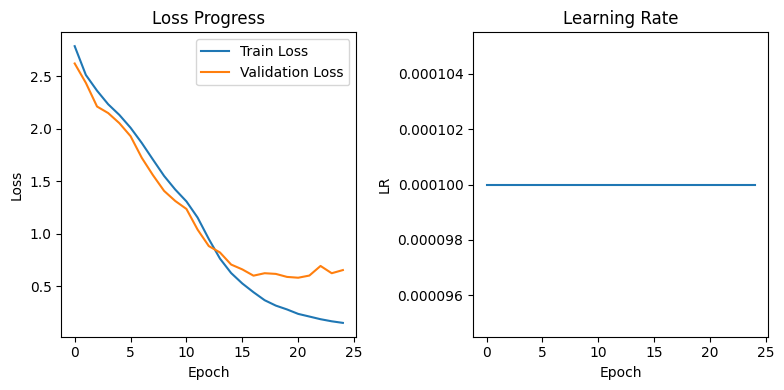

Epoch 26/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 26/50:   0%|          | 1/450 [00:00<07:08,  1.05it/s, Train Loss=0.0938, LR=0.000100]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 26/50:   0%|          | 2/450 [00:01<05:31,  1.35it/s, Train Loss=0.1330, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 26/50:   1%|          | 3/450 [00:02<05:00,  1.49it/s, Train Loss=0.0790, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 26/50:   1%|          | 4/450 [00:02<04:45,  1.56it/s, Train Loss=0.0753, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 26/50:   1%|          | 5/450 [00:03<04:38,  1.60it/s, Train Loss=0.0559, LR=0.000100]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 26/50:   1%|▏         | 6/450 [00:03<04:31,  1.63it/s, Train Loss=0.0833, LR=0.000100]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 26/50:   2%|▏         | 7/450 [00:04<04:27,  1.66it/s, Train Loss=0.0994, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 26/50:   2%|▏         | 8/450 [00:05<04:25,  1.67it/s, Train Loss=0.0672, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 26/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.1989, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 26/50:   2%|▏         | 10/450 [00:06<04:23,  1.67it/s, Train Loss=0.0812, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 26/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=0.2191, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 26/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.1592, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 26/50:   3%|▎         | 13/450 [00:08<04:19,  1.69it/s, Train Loss=0.1650, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 26/50:   3%|▎         | 14/450 [00:08<04:18,  1.68it/s, Train Loss=0.1243, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 26/50:   3%|▎         | 15/450 [00:09<04:18,  1.68it/s, Train Loss=0.0820, LR=0.000100]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 26/50:   4%|▎         | 16/450 [00:09<04:18,  1.68it/s, Train Loss=0.0991, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 26/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=0.1695, LR=0.000100]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 26/50:   4%|▍         | 18/450 [00:11<04:16,  1.68it/s, Train Loss=0.1364, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 26/50:   4%|▍         | 19/450 [00:11<04:15,  1.69it/s, Train Loss=0.1461, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 26/50:   4%|▍         | 20/450 [00:12<04:15,  1.69it/s, Train Loss=0.0635, LR=0.000100]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 26/50:   5%|▍         | 21/450 [00:12<04:14,  1.68it/s, Train Loss=0.1309, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 26/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=0.1047, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 26/50:   5%|▌         | 23/450 [00:13<04:13,  1.68it/s, Train Loss=0.1158, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 26/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.2102, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 26/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=0.1421, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 26/50:   6%|▌         | 26/450 [00:15<04:11,  1.69it/s, Train Loss=0.1108, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 26/50:   6%|▌         | 27/450 [00:16<04:11,  1.68it/s, Train Loss=0.2902, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 26/50:   6%|▌         | 28/450 [00:16<04:10,  1.69it/s, Train Loss=0.0971, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 26/50:   6%|▋         | 29/450 [00:17<04:10,  1.68it/s, Train Loss=0.0885, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 26/50:   7%|▋         | 30/450 [00:18<04:09,  1.68it/s, Train Loss=0.1577, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 26/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.1168, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 26/50:   7%|▋         | 32/450 [00:19<04:08,  1.68it/s, Train Loss=0.0946, LR=0.000100]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 26/50:   7%|▋         | 33/450 [00:19<04:07,  1.69it/s, Train Loss=0.1191, LR=0.000100]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 26/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=0.0471, LR=0.000100]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 26/50:   8%|▊         | 35/450 [00:21<04:06,  1.69it/s, Train Loss=0.1126, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 26/50:   8%|▊         | 36/450 [00:21<04:06,  1.68it/s, Train Loss=0.1567, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 26/50:   8%|▊         | 37/450 [00:22<04:06,  1.67it/s, Train Loss=0.1127, LR=0.000100]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 26/50:   8%|▊         | 38/450 [00:22<04:06,  1.67it/s, Train Loss=0.1088, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 26/50:   9%|▊         | 39/450 [00:23<04:05,  1.68it/s, Train Loss=0.1101, LR=0.000100]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 26/50:   9%|▉         | 40/450 [00:24<04:04,  1.68it/s, Train Loss=0.0896, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 26/50:   9%|▉         | 41/450 [00:24<04:03,  1.68it/s, Train Loss=0.0981, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 26/50:   9%|▉         | 42/450 [00:25<04:02,  1.69it/s, Train Loss=0.1274, LR=0.000100]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 26/50:  10%|▉         | 43/450 [00:25<04:01,  1.69it/s, Train Loss=0.1347, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 26/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=0.0583, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 26/50:  10%|█         | 45/450 [00:27<04:00,  1.69it/s, Train Loss=0.1177, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 26/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=0.1729, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 26/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=0.1837, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 26/50:  11%|█         | 48/450 [00:28<03:58,  1.68it/s, Train Loss=0.0937, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 26/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.1056, LR=0.000100]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 26/50:  11%|█         | 50/450 [00:30<03:57,  1.69it/s, Train Loss=0.0358, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 26/50:  11%|█▏        | 51/450 [00:30<03:56,  1.69it/s, Train Loss=0.1540, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 26/50:  12%|█▏        | 52/450 [00:31<03:55,  1.69it/s, Train Loss=0.1116, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 26/50:  12%|█▏        | 53/450 [00:31<03:55,  1.69it/s, Train Loss=0.0588, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 26/50:  12%|█▏        | 54/450 [00:32<03:54,  1.69it/s, Train Loss=0.1023, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 26/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=0.1000, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 26/50:  12%|█▏        | 56/450 [00:33<03:53,  1.68it/s, Train Loss=0.0919, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 26/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=0.1827, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 26/50:  13%|█▎        | 58/450 [00:34<03:52,  1.68it/s, Train Loss=0.1665, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 26/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.1209, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 26/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.0544, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 26/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.0382, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 26/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=0.1847, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 26/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=0.1818, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 26/50:  14%|█▍        | 64/450 [00:38<03:49,  1.68it/s, Train Loss=0.2160, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 26/50:  14%|█▍        | 65/450 [00:38<03:47,  1.69it/s, Train Loss=0.1669, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 26/50:  15%|█▍        | 66/450 [00:39<03:46,  1.69it/s, Train Loss=0.1572, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 26/50:  15%|█▍        | 67/450 [00:40<03:45,  1.69it/s, Train Loss=0.0937, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 26/50:  15%|█▌        | 68/450 [00:40<03:46,  1.69it/s, Train Loss=0.0816, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 26/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=0.1054, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 26/50:  16%|█▌        | 70/450 [00:41<03:46,  1.68it/s, Train Loss=0.1606, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 26/50:  16%|█▌        | 71/450 [00:42<03:46,  1.68it/s, Train Loss=0.1192, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 26/50:  16%|█▌        | 72/450 [00:43<03:45,  1.68it/s, Train Loss=0.1218, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 26/50:  16%|█▌        | 73/450 [00:43<03:43,  1.68it/s, Train Loss=0.1806, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 26/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=0.1223, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 26/50:  17%|█▋        | 75/450 [00:44<03:41,  1.69it/s, Train Loss=0.1656, LR=0.000100]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 26/50:  17%|█▋        | 76/450 [00:45<03:40,  1.69it/s, Train Loss=0.1667, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 26/50:  17%|█▋        | 77/450 [00:46<03:40,  1.69it/s, Train Loss=0.0720, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 26/50:  17%|█▋        | 78/450 [00:46<03:39,  1.70it/s, Train Loss=0.2388, LR=0.000100]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 26/50:  18%|█▊        | 79/450 [00:47<03:40,  1.68it/s, Train Loss=0.0439, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 26/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.1135, LR=0.000100]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 26/50:  18%|█▊        | 81/450 [00:48<03:37,  1.69it/s, Train Loss=0.1662, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 26/50:  18%|█▊        | 82/450 [00:48<03:38,  1.69it/s, Train Loss=0.1966, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 26/50:  18%|█▊        | 83/450 [00:49<03:37,  1.68it/s, Train Loss=0.1561, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 26/50:  19%|█▊        | 84/450 [00:50<03:37,  1.69it/s, Train Loss=0.0766, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 26/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=0.0811, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 26/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.0911, LR=0.000100]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 26/50:  19%|█▉        | 87/450 [00:51<03:35,  1.69it/s, Train Loss=0.0734, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 26/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.0981, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 26/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=0.1066, LR=0.000100]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 26/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=0.1482, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 26/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=0.1706, LR=0.000100]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 26/50:  20%|██        | 92/450 [00:54<03:32,  1.69it/s, Train Loss=0.1308, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 26/50:  21%|██        | 93/450 [00:55<03:32,  1.68it/s, Train Loss=0.1287, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 26/50:  21%|██        | 94/450 [00:56<03:31,  1.68it/s, Train Loss=0.1188, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 26/50:  21%|██        | 95/450 [00:56<03:31,  1.68it/s, Train Loss=0.1348, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 26/50:  21%|██▏       | 96/450 [00:57<03:30,  1.68it/s, Train Loss=0.0852, LR=0.000100]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 26/50:  22%|██▏       | 97/450 [00:57<03:30,  1.68it/s, Train Loss=0.1123, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 26/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=0.0743, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 26/50:  22%|██▏       | 99/450 [00:59<03:27,  1.69it/s, Train Loss=0.0874, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 26/50:  22%|██▏       | 100/450 [00:59<03:26,  1.69it/s, Train Loss=0.1549, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 26/50:  22%|██▏       | 101/450 [01:00<03:26,  1.69it/s, Train Loss=0.1423, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 26/50:  23%|██▎       | 102/450 [01:00<03:25,  1.69it/s, Train Loss=0.1747, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 26/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.0835, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 26/50:  23%|██▎       | 104/450 [01:02<03:23,  1.70it/s, Train Loss=0.2255, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 26/50:  23%|██▎       | 105/450 [01:02<03:23,  1.70it/s, Train Loss=0.0940, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 26/50:  24%|██▎       | 106/450 [01:03<03:22,  1.70it/s, Train Loss=0.0910, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 26/50:  24%|██▍       | 107/450 [01:03<03:22,  1.70it/s, Train Loss=0.1633, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 26/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.0818, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 26/50:  24%|██▍       | 109/450 [01:04<03:21,  1.69it/s, Train Loss=0.0909, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 26/50:  24%|██▍       | 110/450 [01:05<03:20,  1.69it/s, Train Loss=0.1271, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 26/50:  25%|██▍       | 111/450 [01:06<03:19,  1.70it/s, Train Loss=0.1245, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 26/50:  25%|██▍       | 112/450 [01:06<03:19,  1.69it/s, Train Loss=0.1066, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 26/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.0794, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 26/50:  25%|██▌       | 114/450 [01:07<03:19,  1.69it/s, Train Loss=0.3061, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 26/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.1281, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 26/50:  26%|██▌       | 116/450 [01:09<03:17,  1.69it/s, Train Loss=0.1061, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 26/50:  26%|██▌       | 117/450 [01:09<03:17,  1.69it/s, Train Loss=0.1639, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 26/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=0.1425, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 26/50:  26%|██▋       | 119/450 [01:10<03:16,  1.68it/s, Train Loss=0.1639, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 26/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.1851, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 26/50:  27%|██▋       | 121/450 [01:12<03:15,  1.69it/s, Train Loss=0.1131, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 26/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.0825, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 26/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.1299, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 26/50:  28%|██▊       | 124/450 [01:13<03:13,  1.69it/s, Train Loss=0.1574, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 26/50:  28%|██▊       | 125/450 [01:14<03:13,  1.68it/s, Train Loss=0.0831, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 26/50:  28%|██▊       | 126/450 [01:15<03:12,  1.69it/s, Train Loss=0.0924, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 26/50:  28%|██▊       | 127/450 [01:15<03:10,  1.69it/s, Train Loss=0.1085, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 26/50:  28%|██▊       | 128/450 [01:16<03:09,  1.70it/s, Train Loss=0.1099, LR=0.000100]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 26/50:  29%|██▊       | 129/450 [01:16<03:09,  1.69it/s, Train Loss=0.1022, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 26/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.1583, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 26/50:  29%|██▉       | 131/450 [01:17<03:07,  1.70it/s, Train Loss=0.0627, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 26/50:  29%|██▉       | 132/450 [01:18<03:07,  1.70it/s, Train Loss=0.1339, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 26/50:  30%|██▉       | 133/450 [01:19<03:06,  1.70it/s, Train Loss=0.1059, LR=0.000100]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 26/50:  30%|██▉       | 134/450 [01:19<03:05,  1.70it/s, Train Loss=0.0995, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 26/50:  30%|███       | 135/450 [01:20<03:05,  1.70it/s, Train Loss=0.1022, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 26/50:  30%|███       | 136/450 [01:20<03:06,  1.69it/s, Train Loss=0.1350, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 26/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.0529, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 26/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=0.1089, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 26/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=0.0601, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 26/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.0808, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 26/50:  31%|███▏      | 141/450 [01:23<03:03,  1.68it/s, Train Loss=0.0687, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 26/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.0889, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 26/50:  32%|███▏      | 143/450 [01:25<03:02,  1.68it/s, Train Loss=0.1270, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 26/50:  32%|███▏      | 144/450 [01:25<03:02,  1.68it/s, Train Loss=0.1446, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 26/50:  32%|███▏      | 145/450 [01:26<03:01,  1.68it/s, Train Loss=0.1045, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 26/50:  32%|███▏      | 146/450 [01:26<03:00,  1.68it/s, Train Loss=0.1119, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 26/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.0723, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 26/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=0.1059, LR=0.000100]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 26/50:  33%|███▎      | 149/450 [01:28<02:57,  1.69it/s, Train Loss=0.1218, LR=0.000100]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 26/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.0652, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg



Epoch 26/50:  34%|███▎      | 151/450 [01:29<02:56,  1.69it/s, Train Loss=0.3340, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 26/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.1170, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 26/50:  34%|███▍      | 153/450 [01:31<02:55,  1.69it/s, Train Loss=0.1157, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 26/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=0.1294, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 26/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.0862, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 26/50:  35%|███▍      | 156/450 [01:32<02:54,  1.68it/s, Train Loss=0.1942, LR=0.000100]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 26/50:  35%|███▍      | 157/450 [01:33<02:54,  1.68it/s, Train Loss=0.1485, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 26/50:  35%|███▌      | 158/450 [01:33<02:53,  1.69it/s, Train Loss=0.1114, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 26/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=0.0754, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 26/50:  36%|███▌      | 160/450 [01:35<02:52,  1.68it/s, Train Loss=0.1393, LR=0.000100]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 26/50:  36%|███▌      | 161/450 [01:35<02:51,  1.69it/s, Train Loss=0.1499, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 26/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.1398, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 26/50:  36%|███▌      | 163/450 [01:36<02:49,  1.69it/s, Train Loss=0.0930, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 26/50:  36%|███▋      | 164/450 [01:37<02:48,  1.69it/s, Train Loss=0.0532, LR=0.000100]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 26/50:  37%|███▋      | 165/450 [01:38<02:48,  1.70it/s, Train Loss=0.1485, LR=0.000100]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 26/50:  37%|███▋      | 166/450 [01:38<02:47,  1.70it/s, Train Loss=0.1497, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 26/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0842, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 26/50:  37%|███▋      | 168/450 [01:39<02:46,  1.70it/s, Train Loss=0.1379, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 26/50:  38%|███▊      | 169/450 [01:40<02:45,  1.70it/s, Train Loss=0.0885, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 26/50:  38%|███▊      | 170/450 [01:41<02:45,  1.69it/s, Train Loss=0.0716, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 26/50:  38%|███▊      | 171/450 [01:41<02:44,  1.69it/s, Train Loss=0.1986, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 26/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.1360, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 26/50:  38%|███▊      | 173/450 [01:42<02:43,  1.69it/s, Train Loss=0.0509, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 26/50:  39%|███▊      | 174/450 [01:43<02:42,  1.69it/s, Train Loss=0.1416, LR=0.000100]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 26/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=0.0482, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 26/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.1880, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 26/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.0589, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 26/50:  40%|███▉      | 178/450 [01:45<02:40,  1.69it/s, Train Loss=0.1097, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 26/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.0849, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 26/50:  40%|████      | 180/450 [01:46<02:40,  1.68it/s, Train Loss=0.1352, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 26/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=0.1131, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 26/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=0.0881, LR=0.000100]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 26/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.0536, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 26/50:  41%|████      | 184/450 [01:49<02:38,  1.68it/s, Train Loss=0.0959, LR=0.000100]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 26/50:  41%|████      | 185/450 [01:49<02:37,  1.68it/s, Train Loss=0.1422, LR=0.000100]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 26/50:  41%|████▏     | 186/450 [01:50<02:37,  1.68it/s, Train Loss=0.0875, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 26/50:  42%|████▏     | 187/450 [01:51<02:36,  1.68it/s, Train Loss=0.0842, LR=0.000100]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 26/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=0.1146, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 26/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.1532, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 26/50:  42%|████▏     | 190/450 [01:52<02:34,  1.68it/s, Train Loss=0.1781, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 26/50:  42%|████▏     | 191/450 [01:53<02:33,  1.68it/s, Train Loss=0.1039, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 26/50:  43%|████▎     | 192/450 [01:54<02:33,  1.69it/s, Train Loss=0.0605, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 26/50:  43%|████▎     | 193/450 [01:54<02:32,  1.69it/s, Train Loss=0.1387, LR=0.000100]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 26/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.1130, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 26/50:  43%|████▎     | 195/450 [01:55<02:31,  1.69it/s, Train Loss=0.2723, LR=0.000100]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 26/50:  44%|████▎     | 196/450 [01:56<02:30,  1.68it/s, Train Loss=0.3033, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 26/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=0.1418, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 26/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.1239, LR=0.000100]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 26/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.1064, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 26/50:  44%|████▍     | 200/450 [01:58<02:28,  1.68it/s, Train Loss=0.3034, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 26/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.2101, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 26/50:  45%|████▍     | 202/450 [02:00<02:27,  1.68it/s, Train Loss=0.0912, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 26/50:  45%|████▌     | 203/450 [02:00<02:26,  1.68it/s, Train Loss=0.1453, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 26/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.0764, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 26/50:  46%|████▌     | 205/450 [02:01<02:24,  1.69it/s, Train Loss=0.0630, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 26/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.0932, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 26/50:  46%|████▌     | 207/450 [02:03<02:23,  1.69it/s, Train Loss=0.0637, LR=0.000100]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 26/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.1143, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 26/50:  46%|████▋     | 209/450 [02:04<02:23,  1.68it/s, Train Loss=0.2877, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 26/50:  47%|████▋     | 210/450 [02:04<02:22,  1.68it/s, Train Loss=0.1593, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 26/50:  47%|████▋     | 211/450 [02:05<02:22,  1.68it/s, Train Loss=0.2062, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 26/50:  47%|████▋     | 212/450 [02:05<02:21,  1.68it/s, Train Loss=0.1347, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 26/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=0.1887, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 26/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=0.1730, LR=0.000100]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 26/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=0.1170, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 26/50:  48%|████▊     | 216/450 [02:08<02:19,  1.68it/s, Train Loss=0.1007, LR=0.000100]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 26/50:  48%|████▊     | 217/450 [02:08<02:18,  1.69it/s, Train Loss=0.1536, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 26/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.1946, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 26/50:  49%|████▊     | 219/450 [02:10<02:16,  1.70it/s, Train Loss=0.1073, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 26/50:  49%|████▉     | 220/450 [02:10<02:15,  1.69it/s, Train Loss=0.0774, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 26/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=0.1738, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 26/50:  49%|████▉     | 222/450 [02:11<02:15,  1.69it/s, Train Loss=0.0956, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 26/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.0581, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 26/50:  50%|████▉     | 224/450 [02:13<02:13,  1.69it/s, Train Loss=0.2116, LR=0.000100]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 26/50:  50%|█████     | 225/450 [02:13<02:12,  1.69it/s, Train Loss=0.1857, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 26/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.0789, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 26/50:  50%|█████     | 227/450 [02:14<02:12,  1.69it/s, Train Loss=0.1063, LR=0.000100]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 26/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.1058, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 26/50:  51%|█████     | 229/450 [02:16<02:11,  1.68it/s, Train Loss=0.1203, LR=0.000100]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 26/50:  51%|█████     | 230/450 [02:16<02:10,  1.68it/s, Train Loss=0.0676, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 26/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=0.0454, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 26/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.68it/s, Train Loss=0.1133, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 26/50:  52%|█████▏    | 233/450 [02:18<02:09,  1.68it/s, Train Loss=0.2804, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 26/50:  52%|█████▏    | 234/450 [02:19<02:08,  1.68it/s, Train Loss=0.2114, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 26/50:  52%|█████▏    | 235/450 [02:19<02:08,  1.68it/s, Train Loss=0.1162, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 26/50:  52%|█████▏    | 236/450 [02:20<02:07,  1.68it/s, Train Loss=0.1257, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 26/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.68it/s, Train Loss=0.0574, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 26/50:  53%|█████▎    | 238/450 [02:21<02:06,  1.68it/s, Train Loss=0.1537, LR=0.000100]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 26/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.68it/s, Train Loss=0.0818, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 26/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.1406, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 26/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=0.1417, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 26/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.68it/s, Train Loss=0.0572, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 26/50:  54%|█████▍    | 243/450 [02:24<02:03,  1.68it/s, Train Loss=0.0846, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 26/50:  54%|█████▍    | 244/450 [02:24<02:02,  1.69it/s, Train Loss=0.1064, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 26/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.0683, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 26/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=0.1191, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 26/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.68it/s, Train Loss=0.3371, LR=0.000100]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 26/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.2121, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 26/50:  55%|█████▌    | 249/450 [02:27<01:58,  1.69it/s, Train Loss=0.0956, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 26/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.2403, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 26/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=0.1873, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 26/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=0.0499, LR=0.000100]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 26/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0378, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 26/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.69it/s, Train Loss=0.0774, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 26/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.1387, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 26/50:  57%|█████▋    | 256/450 [02:32<01:54,  1.70it/s, Train Loss=0.1470, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 26/50:  57%|█████▋    | 257/450 [02:32<01:53,  1.70it/s, Train Loss=0.0490, LR=0.000100]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 26/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.70it/s, Train Loss=0.1144, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 26/50:  58%|█████▊    | 259/450 [02:33<01:52,  1.70it/s, Train Loss=0.1957, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 26/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=0.1817, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 26/50:  58%|█████▊    | 261/450 [02:35<01:51,  1.69it/s, Train Loss=0.0731, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 26/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=0.1219, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp4p.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 26/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=0.0927, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 26/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.69it/s, Train Loss=0.0522, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 26/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.2439, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 26/50:  59%|█████▉    | 266/450 [02:37<01:49,  1.69it/s, Train Loss=0.2605, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 26/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=0.1517, LR=0.000100]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 26/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=0.1066, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 26/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.1074, LR=0.000100]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 26/50:  60%|██████    | 270/450 [02:40<01:46,  1.68it/s, Train Loss=0.1734, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/brwg8p.mpg



Epoch 26/50:  60%|██████    | 271/450 [02:40<01:46,  1.68it/s, Train Loss=0.1075, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 26/50:  60%|██████    | 272/450 [02:41<01:45,  1.68it/s, Train Loss=0.0931, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 26/50:  61%|██████    | 273/450 [02:42<01:45,  1.68it/s, Train Loss=0.1482, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 26/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.0576, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 26/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.1657, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 26/50:  61%|██████▏   | 276/450 [02:43<01:43,  1.68it/s, Train Loss=0.1369, LR=0.000100]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 26/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.68it/s, Train Loss=0.0585, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 26/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.68it/s, Train Loss=0.1111, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 26/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.1534, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 26/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.1187, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 26/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.69it/s, Train Loss=0.1129, LR=0.000100]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 26/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.70it/s, Train Loss=0.1074, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 26/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.70it/s, Train Loss=0.0880, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 26/50:  63%|██████▎   | 284/450 [02:48<01:37,  1.70it/s, Train Loss=0.1347, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 26/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.0909, LR=0.000100]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 26/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.69it/s, Train Loss=0.0978, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 26/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.1604, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 26/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.69it/s, Train Loss=0.2006, LR=0.000100]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 26/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.68it/s, Train Loss=0.0960, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 26/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.1106, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 26/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.68it/s, Train Loss=0.1421, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 26/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.68it/s, Train Loss=0.0824, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 26/50:  65%|██████▌   | 293/450 [02:53<01:33,  1.68it/s, Train Loss=0.0932, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 26/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.68it/s, Train Loss=0.1167, LR=0.000100]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 26/50:  66%|██████▌   | 295/450 [02:55<01:32,  1.68it/s, Train Loss=0.2269, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 26/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.68it/s, Train Loss=0.1192, LR=0.000100]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 26/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.3133, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 26/50:  66%|██████▌   | 298/450 [02:56<01:30,  1.69it/s, Train Loss=0.1008, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 26/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.1512, LR=0.000100]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 26/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.1241, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 26/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.68it/s, Train Loss=0.1207, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 26/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.68it/s, Train Loss=0.1722, LR=0.000100]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 26/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.69it/s, Train Loss=0.1409, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 26/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.1318, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 26/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.68it/s, Train Loss=0.0824, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 26/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.1784, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 26/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.0674, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 26/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.69it/s, Train Loss=0.1679, LR=0.000100]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 26/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.2860, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 26/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=0.1021, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 26/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.68it/s, Train Loss=0.0554, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 26/50:  69%|██████▉   | 312/450 [03:05<01:22,  1.68it/s, Train Loss=0.1449, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 26/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.69it/s, Train Loss=0.1676, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 26/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.2271, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 26/50:  70%|███████   | 315/450 [03:07<01:20,  1.69it/s, Train Loss=0.1003, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 26/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.0923, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 26/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.1659, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 26/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.0991, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 26/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.1443, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 26/50:  71%|███████   | 320/450 [03:09<01:17,  1.69it/s, Train Loss=0.0608, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 26/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.1895, LR=0.000100]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 26/50:  72%|███████▏  | 322/450 [03:11<01:16,  1.68it/s, Train Loss=0.1507, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 26/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.1720, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 26/50:  72%|███████▏  | 324/450 [03:12<01:15,  1.68it/s, Train Loss=0.1735, LR=0.000100]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 26/50:  72%|███████▏  | 325/450 [03:12<01:14,  1.68it/s, Train Loss=0.1412, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 26/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.68it/s, Train Loss=0.1077, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 26/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.2154, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 26/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=0.0890, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 26/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.0570, LR=0.000100]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 26/50:  73%|███████▎  | 330/450 [03:15<01:10,  1.69it/s, Train Loss=0.0461, LR=0.000100]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 26/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.1266, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 26/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=0.0948, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 26/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.68it/s, Train Loss=0.0828, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 26/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.1303, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 26/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.69it/s, Train Loss=0.1047, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 26/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=0.1100, LR=0.000100]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 26/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.68it/s, Train Loss=0.0558, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 26/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.68it/s, Train Loss=0.1135, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 26/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.68it/s, Train Loss=0.1920, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 26/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.69it/s, Train Loss=0.1041, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 26/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.0682, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 26/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.69it/s, Train Loss=0.1053, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 26/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.68it/s, Train Loss=0.1010, LR=0.000100]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 26/50:  76%|███████▋  | 344/450 [03:24<01:03,  1.68it/s, Train Loss=0.2094, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 26/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.68it/s, Train Loss=0.2079, LR=0.000100]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 26/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.1351, LR=0.000100]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 26/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.69it/s, Train Loss=0.1084, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 26/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.1964, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 26/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.1533, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 26/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.0675, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 26/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.0723, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 26/50:  78%|███████▊  | 352/450 [03:28<00:58,  1.69it/s, Train Loss=0.0576, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 26/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.1462, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 26/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=0.1250, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 26/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.0879, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 26/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.0993, LR=0.000100]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 26/50:  79%|███████▉  | 357/450 [03:31<00:55,  1.69it/s, Train Loss=0.1395, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 26/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.1849, LR=0.000100]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 26/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=0.1205, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 26/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.0618, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 26/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.1746, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 26/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=0.1061, LR=0.000100]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 26/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.0910, LR=0.000100]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 26/50:  81%|████████  | 364/450 [03:36<00:50,  1.70it/s, Train Loss=0.0733, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 26/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.1707, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 26/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=0.2157, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 26/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=0.0582, LR=0.000100]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 26/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.0875, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 26/50:  82%|████████▏ | 369/450 [03:39<00:47,  1.69it/s, Train Loss=0.1073, LR=0.000100]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 26/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.0880, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 26/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.1807, LR=0.000100]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 26/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.68it/s, Train Loss=0.2592, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 26/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.68it/s, Train Loss=0.0882, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 26/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.68it/s, Train Loss=0.1298, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 26/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.68it/s, Train Loss=0.1771, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 26/50:  84%|████████▎ | 376/450 [03:43<00:44,  1.68it/s, Train Loss=0.1162, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 26/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.68it/s, Train Loss=0.0445, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 26/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.68it/s, Train Loss=0.0817, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 26/50:  84%|████████▍ | 379/450 [03:44<00:42,  1.69it/s, Train Loss=0.0348, LR=0.000100]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 26/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.0888, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 26/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.1094, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 26/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.0922, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 26/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.1166, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 26/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.69it/s, Train Loss=0.1761, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 26/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.0936, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 26/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.1826, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 26/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.1048, LR=0.000100]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 26/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.1009, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 26/50:  86%|████████▋ | 389/450 [03:50<00:35,  1.70it/s, Train Loss=0.1975, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 26/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.0747, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 26/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.69it/s, Train Loss=0.0658, LR=0.000100]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 26/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.70it/s, Train Loss=0.0738, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 26/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.0538, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 26/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.70it/s, Train Loss=0.0737, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 26/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=0.3882, LR=0.000100]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 26/50:  88%|████████▊ | 396/450 [03:55<00:31,  1.70it/s, Train Loss=0.0873, LR=0.000100]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 26/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.0849, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 26/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=0.2417, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 26/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.1511, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 26/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.70it/s, Train Loss=0.0476, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 26/50:  89%|████████▉ | 401/450 [03:57<00:28,  1.69it/s, Train Loss=0.1424, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 26/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.70it/s, Train Loss=0.0753, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 26/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.70it/s, Train Loss=0.3942, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 26/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.70it/s, Train Loss=0.1242, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 26/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.1990, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 26/50:  90%|█████████ | 406/450 [04:00<00:26,  1.69it/s, Train Loss=0.1122, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 26/50:  90%|█████████ | 407/450 [04:01<00:25,  1.68it/s, Train Loss=0.1099, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 26/50:  91%|█████████ | 408/450 [04:02<00:24,  1.68it/s, Train Loss=0.0760, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 26/50:  91%|█████████ | 409/450 [04:02<00:24,  1.68it/s, Train Loss=0.0629, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 26/50:  91%|█████████ | 410/450 [04:03<00:23,  1.68it/s, Train Loss=0.1241, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 26/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.69it/s, Train Loss=0.0736, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 26/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=0.1147, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 26/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.1788, LR=0.000100]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 26/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.2056, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 26/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.1695, LR=0.000100]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 26/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.69it/s, Train Loss=0.1071, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 26/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.0800, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 26/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=0.1360, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 26/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.0670, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 26/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=0.0866, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 26/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.0795, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 26/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.0814, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 26/50:  94%|█████████▍| 423/450 [04:10<00:16,  1.69it/s, Train Loss=0.0637, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 26/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.4122, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 26/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.0898, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 26/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.1225, LR=0.000100]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 26/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.70it/s, Train Loss=0.2258, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 26/50:  95%|█████████▌| 428/450 [04:13<00:13,  1.69it/s, Train Loss=0.2253, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 26/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.0857, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 26/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.0599, LR=0.000100]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 26/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.1145, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 26/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.1653, LR=0.000100]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 26/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.69it/s, Train Loss=0.0630, LR=0.000100]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 26/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.0778, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 26/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.70it/s, Train Loss=0.3015, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 26/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.4072, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 26/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.70it/s, Train Loss=0.0713, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 26/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.70it/s, Train Loss=0.0730, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 26/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.1220, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 26/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.70it/s, Train Loss=0.1455, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 26/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=0.0573, LR=0.000100]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 26/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.3079, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 26/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.70it/s, Train Loss=0.1271, LR=0.000100]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 26/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.1025, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 26/50:  99%|█████████▉| 445/450 [04:23<00:02,  1.69it/s, Train Loss=0.1690, LR=0.000100]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 26/50: 100%|██████████| 450/450 [04:26<00:00,  1.70it/s, Train Loss=0.0867, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg



Validation:   2%|▏         | 1/50 [00:00<00:32,  1.50it/s, Val Loss=1.3838]

Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg



Validation:   4%|▍         | 2/50 [00:00<00:18,  2.63it/s, Val Loss=0.3140]

Attempting to read 75 frames from data/s1/sbwu6p.mpgAttempting to read 75 frames from data/s1/pgak3s.mpg

Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   6%|▌         | 3/50 [00:01<00:15,  3.12it/s, Val Loss=0.7938]

Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg



Validation:   8%|▊         | 4/50 [00:01<00:12,  3.70it/s, Val Loss=0.2613]

Attempting to read 75 frames from data/s1/srao1a.mpg
Attempting to read 75 frames from data/s1/pwix3a.mpg



Validation:  10%|█         | 5/50 [00:01<00:11,  4.08it/s, Val Loss=0.1531]

Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.42it/s, Val Loss=1.2696]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg
Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.59it/s, Val Loss=1.1892]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  16%|█▌        | 8/50 [00:02<00:08,  4.80it/s, Val Loss=0.6321]

Attempting to read 75 frames from data/s1/braf9s.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.03it/s, Val Loss=0.2796]

Attempting to read 75 frames from data/s1/brbg3s.mpgAttempting to read 75 frames from data/s1/bram5a.mpg




Validation:  20%|██        | 10/50 [00:02<00:07,  5.17it/s, Val Loss=0.4294]

Attempting to read 75 frames from data/s1/srah4n.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.06it/s, Val Loss=1.2035]

Attempting to read 75 frames from data/s1/pbwj2n.mpg
Attempting to read 75 frames from data/s1/sgap3a.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  4.98it/s, Val Loss=0.0426]

Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  26%|██▌       | 13/50 [00:03<00:07,  5.12it/s, Val Loss=0.5251]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.28it/s, Val Loss=0.1619]

Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.37it/s, Val Loss=0.5093]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.44it/s, Val Loss=0.7365]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.48it/s, Val Loss=0.1910]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.42it/s, Val Loss=0.4426]

Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.46it/s, Val Loss=0.1446]

Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.32it/s, Val Loss=0.1647]

Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.37it/s, Val Loss=2.2171]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.37it/s, Val Loss=0.1387]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.38it/s, Val Loss=0.9805]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  48%|████▊     | 24/50 [00:05<00:04,  5.44it/s, Val Loss=0.2166]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.41it/s, Val Loss=2.1128]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.48it/s, Val Loss=0.2125]

Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.53it/s, Val Loss=0.1946]

Attempting to read 75 frames from data/s1/srwb8n.mpgAttempting to read 75 frames from data/s1/prwd7a.mpg




Validation:  56%|█████▌    | 28/50 [00:05<00:03,  5.57it/s, Val Loss=1.0642]

Attempting to read 75 frames from data/s1/pgay1s.mpgAttempting to read 75 frames from data/s1/lbid2n.mpg

Attempting to read 75 frames from data/s1/prbq1a.mpg


Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.55it/s, Val Loss=0.3912]

Attempting to read 75 frames from data/s1/sgwd2p.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.46it/s, Val Loss=1.5676]

Attempting to read 75 frames from data/s1/bwat2n.mpgAttempting to read 75 frames from data/s1/sgbx1a.mpg

Attempting to read 75 frames from data/s1/lgwm6n.mpg

Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.49it/s, Val Loss=0.6338]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg


Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.47it/s, Val Loss=0.2770]


Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.51it/s, Val Loss=0.4442]

Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.51it/s, Val Loss=0.2135]

Attempting to read 75 frames from data/s1/lgal9s.mpgAttempting to read 75 frames from data/s1/lwie6p.mpg




Validation:  70%|███████   | 35/50 [00:07<00:02,  5.58it/s, Val Loss=0.2320]

Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/pgad8n.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.54it/s, Val Loss=0.4137]

Attempting to read 75 frames from data/s1/sgiczp.mpgAttempting to read 75 frames from data/s1/lgwtzn.mpg




Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.51it/s, Val Loss=0.5000]

Attempting to read 75 frames from data/s1/sgbj2p.mpg
Attempting to read 75 frames from data/s1/pbib7s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.48it/s, Val Loss=0.2402]

Attempting to read 75 frames from data/s1/srbb5s.mpgAttempting to read 75 frames from data/s1/bwwu3a.mpg




Validation:  78%|███████▊  | 39/50 [00:07<00:01,  5.53it/s, Val Loss=1.0665]

Attempting to read 75 frames from data/s1/lbbk6p.mpgAttempting to read 75 frames from data/s1/prip1s.mpg




Validation:  80%|████████  | 40/50 [00:07<00:01,  5.57it/s, Val Loss=0.2503]

Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.53it/s, Val Loss=0.8525]

Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.45it/s, Val Loss=0.1939]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.36it/s, Val Loss=0.3494]

Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.41it/s, Val Loss=0.5361]

Attempting to read 75 frames from data/s1/bbwgzn.mpgAttempting to read 75 frames from data/s1/lbaq6p.mpg




Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.47it/s, Val Loss=0.0858]

Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.48it/s, Val Loss=2.5827]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 27/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 27/50:   0%|          | 1/450 [00:00<06:27,  1.16it/s, Train Loss=0.1225, LR=0.000100]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 27/50:   0%|          | 2/450 [00:01<05:16,  1.42it/s, Train Loss=0.0837, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 27/50:   1%|          | 3/450 [00:02<04:51,  1.53it/s, Train Loss=0.0597, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 27/50:   1%|          | 4/450 [00:02<04:39,  1.59it/s, Train Loss=0.1961, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 27/50:   1%|          | 5/450 [00:03<04:32,  1.63it/s, Train Loss=0.0876, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 27/50:   1%|▏         | 6/450 [00:03<04:27,  1.66it/s, Train Loss=0.2269, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 27/50:   2%|▏         | 7/450 [00:04<04:25,  1.67it/s, Train Loss=0.1441, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 27/50:   2%|▏         | 8/450 [00:04<04:23,  1.67it/s, Train Loss=0.0608, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 27/50:   2%|▏         | 9/450 [00:05<04:21,  1.69it/s, Train Loss=0.1112, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 27/50:   2%|▏         | 10/450 [00:06<04:20,  1.69it/s, Train Loss=0.1555, LR=0.000100]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 27/50:   2%|▏         | 11/450 [00:06<04:19,  1.69it/s, Train Loss=0.1346, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 27/50:   3%|▎         | 12/450 [00:07<04:19,  1.69it/s, Train Loss=0.0740, LR=0.000100]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 27/50:   3%|▎         | 13/450 [00:07<04:18,  1.69it/s, Train Loss=0.1045, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 27/50:   3%|▎         | 14/450 [00:08<04:17,  1.69it/s, Train Loss=0.3766, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 27/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=0.0410, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 27/50:   4%|▎         | 16/450 [00:09<04:17,  1.69it/s, Train Loss=0.1670, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 27/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=0.0905, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 27/50:   4%|▍         | 18/450 [00:10<04:16,  1.69it/s, Train Loss=0.1103, LR=0.000100]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 27/50:   4%|▍         | 19/450 [00:11<04:15,  1.68it/s, Train Loss=0.0525, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 27/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=0.1880, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 27/50:   5%|▍         | 21/450 [00:12<04:14,  1.68it/s, Train Loss=0.1264, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 27/50:   5%|▍         | 22/450 [00:13<04:13,  1.69it/s, Train Loss=0.0800, LR=0.000100]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 27/50:   5%|▌         | 23/450 [00:13<04:12,  1.69it/s, Train Loss=0.1119, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 27/50:   5%|▌         | 24/450 [00:14<04:11,  1.69it/s, Train Loss=0.1605, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 27/50:   6%|▌         | 25/450 [00:15<04:11,  1.69it/s, Train Loss=0.2790, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 27/50:   6%|▌         | 26/450 [00:15<04:10,  1.69it/s, Train Loss=0.1294, LR=0.000100]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 27/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=0.0824, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 27/50:   6%|▌         | 28/450 [00:16<04:09,  1.69it/s, Train Loss=0.0544, LR=0.000100]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 27/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.1248, LR=0.000100]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 27/50:   7%|▋         | 30/450 [00:18<04:09,  1.68it/s, Train Loss=0.1758, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 27/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.0502, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 27/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.1055, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 27/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=0.0887, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 27/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=0.0519, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 27/50:   8%|▊         | 35/450 [00:20<04:07,  1.68it/s, Train Loss=0.1292, LR=0.000100]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 27/50:   8%|▊         | 36/450 [00:21<04:06,  1.68it/s, Train Loss=0.1370, LR=0.000100]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 27/50:   8%|▊         | 37/450 [00:22<04:06,  1.68it/s, Train Loss=0.3464, LR=0.000100]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 27/50:   8%|▊         | 38/450 [00:22<04:05,  1.68it/s, Train Loss=0.3040, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 27/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.1484, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 27/50:   9%|▉         | 40/450 [00:23<04:04,  1.68it/s, Train Loss=0.0706, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 27/50:   9%|▉         | 41/450 [00:24<04:02,  1.68it/s, Train Loss=0.1643, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 27/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=0.0931, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 27/50:  10%|▉         | 43/450 [00:25<04:00,  1.69it/s, Train Loss=0.0586, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 27/50:  10%|▉         | 44/450 [00:26<03:59,  1.69it/s, Train Loss=0.0744, LR=0.000100]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 27/50:  10%|█         | 45/450 [00:26<03:59,  1.69it/s, Train Loss=0.1536, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 27/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=0.1310, LR=0.000100]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 27/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=0.0954, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 27/50:  11%|█         | 48/450 [00:28<03:58,  1.69it/s, Train Loss=0.0984, LR=0.000100]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 27/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.0737, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 27/50:  11%|█         | 50/450 [00:29<03:56,  1.69it/s, Train Loss=0.0992, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 27/50:  11%|█▏        | 51/450 [00:30<03:55,  1.70it/s, Train Loss=0.1451, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 27/50:  12%|█▏        | 52/450 [00:31<03:55,  1.69it/s, Train Loss=0.1814, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 27/50:  12%|█▏        | 53/450 [00:31<03:54,  1.69it/s, Train Loss=0.0831, LR=0.000100]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 27/50:  12%|█▏        | 54/450 [00:32<03:54,  1.69it/s, Train Loss=0.0857, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 27/50:  12%|█▏        | 55/450 [00:32<03:54,  1.69it/s, Train Loss=0.0595, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 27/50:  12%|█▏        | 56/450 [00:33<03:53,  1.69it/s, Train Loss=0.1034, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 27/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=0.1218, LR=0.000100]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 27/50:  13%|█▎        | 58/450 [00:34<03:53,  1.68it/s, Train Loss=0.1352, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 27/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.3017, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 27/50:  13%|█▎        | 60/450 [00:35<03:52,  1.68it/s, Train Loss=0.1205, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 27/50:  14%|█▎        | 61/450 [00:36<03:51,  1.68it/s, Train Loss=0.0822, LR=0.000100]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 27/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=0.1200, LR=0.000100]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 27/50:  14%|█▍        | 63/450 [00:37<03:48,  1.69it/s, Train Loss=0.1286, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 27/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.1405, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 27/50:  14%|█▍        | 65/450 [00:38<03:48,  1.69it/s, Train Loss=0.1220, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 27/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=0.1610, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 27/50:  15%|█▍        | 67/450 [00:39<03:46,  1.69it/s, Train Loss=0.0276, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 27/50:  15%|█▌        | 68/450 [00:40<03:45,  1.69it/s, Train Loss=0.1036, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 27/50:  15%|█▌        | 69/450 [00:41<03:44,  1.70it/s, Train Loss=0.2026, LR=0.000100]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 27/50:  16%|█▌        | 70/450 [00:41<03:44,  1.69it/s, Train Loss=0.0342, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 27/50:  16%|█▌        | 71/450 [00:42<03:44,  1.69it/s, Train Loss=0.0723, LR=0.000100]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 27/50:  16%|█▌        | 72/450 [00:42<03:44,  1.68it/s, Train Loss=0.0709, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 27/50:  16%|█▌        | 73/450 [00:43<03:43,  1.68it/s, Train Loss=0.1316, LR=0.000100]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 27/50:  16%|█▋        | 74/450 [00:44<03:43,  1.68it/s, Train Loss=0.1140, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 27/50:  17%|█▋        | 75/450 [00:44<03:42,  1.69it/s, Train Loss=0.1305, LR=0.000100]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 27/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=0.0811, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 27/50:  17%|█▋        | 77/450 [00:45<03:41,  1.68it/s, Train Loss=0.1446, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 27/50:  17%|█▋        | 78/450 [00:46<03:39,  1.69it/s, Train Loss=0.2944, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 27/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=0.1605, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 27/50:  18%|█▊        | 80/450 [00:47<03:38,  1.69it/s, Train Loss=0.0981, LR=0.000100]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 27/50:  18%|█▊        | 81/450 [00:48<03:37,  1.69it/s, Train Loss=0.0729, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 27/50:  18%|█▊        | 82/450 [00:48<03:37,  1.69it/s, Train Loss=0.2200, LR=0.000100]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 27/50:  18%|█▊        | 83/450 [00:49<03:36,  1.69it/s, Train Loss=0.2253, LR=0.000100]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 27/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=0.1422, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 27/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=0.1605, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 27/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.0377, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 27/50:  19%|█▉        | 87/450 [00:51<03:34,  1.69it/s, Train Loss=0.0786, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 27/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.2017, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp7a.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 27/50:  20%|█▉        | 89/450 [00:52<03:33,  1.69it/s, Train Loss=0.0670, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 27/50:  20%|██        | 90/450 [00:53<03:32,  1.69it/s, Train Loss=0.0925, LR=0.000100]

Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 27/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=0.0245, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 27/50:  20%|██        | 92/450 [00:54<03:32,  1.69it/s, Train Loss=0.0768, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 27/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=0.1709, LR=0.000100]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 27/50:  21%|██        | 94/450 [00:55<03:30,  1.69it/s, Train Loss=0.2240, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 27/50:  21%|██        | 95/450 [00:56<03:29,  1.69it/s, Train Loss=0.1666, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 27/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.2120, LR=0.000100]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 27/50:  22%|██▏       | 97/450 [00:57<03:28,  1.69it/s, Train Loss=0.1365, LR=0.000100]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 27/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=0.1166, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 27/50:  22%|██▏       | 99/450 [00:58<03:27,  1.69it/s, Train Loss=0.0847, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 27/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=0.1231, LR=0.000100]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 27/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.1752, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 27/50:  23%|██▎       | 102/450 [01:00<03:26,  1.69it/s, Train Loss=0.1156, LR=0.000100]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 27/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.0984, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 27/50:  23%|██▎       | 104/450 [01:01<03:24,  1.69it/s, Train Loss=0.0541, LR=0.000100]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 27/50:  23%|██▎       | 105/450 [01:02<03:23,  1.69it/s, Train Loss=0.1216, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 27/50:  24%|██▎       | 106/450 [01:03<03:23,  1.69it/s, Train Loss=0.0398, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 27/50:  24%|██▍       | 107/450 [01:03<03:22,  1.69it/s, Train Loss=0.1356, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 27/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.0268, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 27/50:  24%|██▍       | 109/450 [01:04<03:21,  1.69it/s, Train Loss=0.1384, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 27/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.1460, LR=0.000100]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 27/50:  25%|██▍       | 111/450 [01:06<03:22,  1.67it/s, Train Loss=0.1393, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 27/50:  25%|██▍       | 112/450 [01:06<03:21,  1.68it/s, Train Loss=0.0529, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 27/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=0.0661, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 27/50:  25%|██▌       | 114/450 [01:07<03:20,  1.68it/s, Train Loss=0.0514, LR=0.000100]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 27/50:  26%|██▌       | 115/450 [01:08<03:19,  1.68it/s, Train Loss=0.0865, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 27/50:  26%|██▌       | 116/450 [01:08<03:18,  1.69it/s, Train Loss=0.1215, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 27/50:  26%|██▌       | 117/450 [01:09<03:17,  1.69it/s, Train Loss=0.0693, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 27/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=0.3111, LR=0.000100]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 27/50:  26%|██▋       | 119/450 [01:10<03:17,  1.68it/s, Train Loss=0.1056, LR=0.000100]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 27/50:  27%|██▋       | 120/450 [01:11<03:16,  1.68it/s, Train Loss=0.1000, LR=0.000100]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 27/50:  27%|██▋       | 121/450 [01:11<03:15,  1.69it/s, Train Loss=0.0644, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 27/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.1469, LR=0.000100]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 27/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.1060, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 27/50:  28%|██▊       | 124/450 [01:13<03:14,  1.68it/s, Train Loss=0.1247, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 27/50:  28%|██▊       | 125/450 [01:14<03:13,  1.68it/s, Train Loss=0.0913, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 27/50:  28%|██▊       | 126/450 [01:14<03:12,  1.68it/s, Train Loss=0.1157, LR=0.000100]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 27/50:  28%|██▊       | 127/450 [01:15<03:11,  1.68it/s, Train Loss=0.1415, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 27/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.0848, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 27/50:  29%|██▊       | 129/450 [01:16<03:10,  1.69it/s, Train Loss=0.0910, LR=0.000100]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 27/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.0804, LR=0.000100]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 27/50:  29%|██▉       | 131/450 [01:17<03:09,  1.68it/s, Train Loss=0.1317, LR=0.000100]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 27/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=0.0465, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 27/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=0.1078, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 27/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.1127, LR=0.000100]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 27/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.0645, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 27/50:  30%|███       | 136/450 [01:20<03:05,  1.69it/s, Train Loss=0.0689, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 27/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.0591, LR=0.000100]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 27/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=0.2035, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 27/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=0.0625, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 27/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=0.1365, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 27/50:  31%|███▏      | 141/450 [01:23<03:03,  1.69it/s, Train Loss=0.1186, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 27/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.1246, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 27/50:  32%|███▏      | 143/450 [01:25<03:02,  1.68it/s, Train Loss=0.1308, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 27/50:  32%|███▏      | 144/450 [01:25<03:01,  1.69it/s, Train Loss=0.1060, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 27/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.0546, LR=0.000100]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 27/50:  32%|███▏      | 146/450 [01:26<02:59,  1.69it/s, Train Loss=0.1059, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 27/50:  33%|███▎      | 147/450 [01:27<03:00,  1.68it/s, Train Loss=0.0879, LR=0.000100]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 27/50:  33%|███▎      | 148/450 [01:27<02:59,  1.68it/s, Train Loss=0.1337, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 27/50:  33%|███▎      | 149/450 [01:28<02:59,  1.68it/s, Train Loss=0.0799, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 27/50:  33%|███▎      | 150/450 [01:29<02:58,  1.68it/s, Train Loss=0.0712, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 27/50:  34%|███▎      | 151/450 [01:29<02:57,  1.68it/s, Train Loss=0.1010, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 27/50:  34%|███▍      | 152/450 [01:30<02:57,  1.68it/s, Train Loss=0.1097, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 27/50:  34%|███▍      | 153/450 [01:30<02:56,  1.68it/s, Train Loss=0.0924, LR=0.000100]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 27/50:  34%|███▍      | 154/450 [01:31<02:56,  1.68it/s, Train Loss=0.1492, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 27/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.0464, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 27/50:  35%|███▍      | 156/450 [01:32<02:54,  1.69it/s, Train Loss=0.0533, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 27/50:  35%|███▍      | 157/450 [01:33<02:53,  1.68it/s, Train Loss=0.0611, LR=0.000100]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 27/50:  35%|███▌      | 158/450 [01:33<02:53,  1.68it/s, Train Loss=0.1345, LR=0.000100]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 27/50:  35%|███▌      | 159/450 [01:34<02:52,  1.68it/s, Train Loss=0.1149, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 27/50:  36%|███▌      | 160/450 [01:35<02:52,  1.68it/s, Train Loss=0.1530, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 27/50:  36%|███▌      | 161/450 [01:35<02:51,  1.69it/s, Train Loss=0.1138, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 27/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.1213, LR=0.000100]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 27/50:  36%|███▌      | 163/450 [01:36<02:50,  1.68it/s, Train Loss=0.0934, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 27/50:  36%|███▋      | 164/450 [01:37<02:50,  1.68it/s, Train Loss=0.1271, LR=0.000100]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 27/50:  37%|███▋      | 165/450 [01:38<02:49,  1.68it/s, Train Loss=0.0575, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 27/50:  37%|███▋      | 166/450 [01:38<02:48,  1.68it/s, Train Loss=0.2313, LR=0.000100]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 27/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0572, LR=0.000100]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 27/50:  37%|███▋      | 168/450 [01:39<02:46,  1.69it/s, Train Loss=0.0856, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 27/50:  38%|███▊      | 169/450 [01:40<02:45,  1.70it/s, Train Loss=0.1639, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 27/50:  38%|███▊      | 170/450 [01:41<02:45,  1.70it/s, Train Loss=0.1361, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 27/50:  38%|███▊      | 171/450 [01:41<02:44,  1.69it/s, Train Loss=0.0934, LR=0.000100]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 27/50:  38%|███▊      | 172/450 [01:42<02:43,  1.70it/s, Train Loss=0.0390, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 27/50:  38%|███▊      | 173/450 [01:42<02:43,  1.69it/s, Train Loss=0.0754, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 27/50:  39%|███▊      | 174/450 [01:43<02:42,  1.69it/s, Train Loss=0.0768, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 27/50:  39%|███▉      | 175/450 [01:43<02:42,  1.69it/s, Train Loss=0.1009, LR=0.000100]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 27/50:  39%|███▉      | 176/450 [01:44<02:41,  1.69it/s, Train Loss=0.1601, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 27/50:  39%|███▉      | 177/450 [01:45<02:41,  1.70it/s, Train Loss=0.0655, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbv6n.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 27/50:  40%|███▉      | 178/450 [01:45<02:40,  1.70it/s, Train Loss=0.1658, LR=0.000100]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 27/50:  40%|███▉      | 179/450 [01:46<02:39,  1.70it/s, Train Loss=0.1153, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 27/50:  40%|████      | 180/450 [01:46<02:38,  1.70it/s, Train Loss=0.0543, LR=0.000100]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 27/50:  40%|████      | 181/450 [01:47<02:38,  1.70it/s, Train Loss=0.1310, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 27/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.1132, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 27/50:  41%|████      | 183/450 [01:48<02:37,  1.69it/s, Train Loss=0.1117, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 27/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.1381, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 27/50:  41%|████      | 185/450 [01:49<02:36,  1.69it/s, Train Loss=0.1239, LR=0.000100]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 27/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.3672, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 27/50:  42%|████▏     | 187/450 [01:51<02:34,  1.70it/s, Train Loss=0.1260, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 27/50:  42%|████▏     | 188/450 [01:51<02:34,  1.70it/s, Train Loss=0.1543, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 27/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.1285, LR=0.000100]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 27/50:  42%|████▏     | 190/450 [01:52<02:33,  1.69it/s, Train Loss=0.0931, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 27/50:  42%|████▏     | 191/450 [01:53<02:33,  1.68it/s, Train Loss=0.1334, LR=0.000100]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 27/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=0.1263, LR=0.000100]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 27/50:  43%|████▎     | 193/450 [01:54<02:31,  1.69it/s, Train Loss=0.1548, LR=0.000100]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 27/50:  43%|████▎     | 194/450 [01:55<02:30,  1.70it/s, Train Loss=0.1268, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 27/50:  43%|████▎     | 195/450 [01:55<02:30,  1.69it/s, Train Loss=0.0686, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 27/50:  44%|████▎     | 196/450 [01:56<02:29,  1.70it/s, Train Loss=0.1235, LR=0.000100]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 27/50:  44%|████▍     | 197/450 [01:56<02:29,  1.69it/s, Train Loss=0.0834, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 27/50:  44%|████▍     | 198/450 [01:57<02:28,  1.69it/s, Train Loss=0.0557, LR=0.000100]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 27/50:  44%|████▍     | 199/450 [01:58<02:27,  1.70it/s, Train Loss=0.0957, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 27/50:  44%|████▍     | 200/450 [01:58<02:27,  1.70it/s, Train Loss=0.0849, LR=0.000100]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 27/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.1090, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 27/50:  45%|████▍     | 202/450 [01:59<02:27,  1.69it/s, Train Loss=0.0932, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 27/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.1241, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 27/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.0468, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 27/50:  46%|████▌     | 205/450 [02:01<02:25,  1.69it/s, Train Loss=0.1601, LR=0.000100]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 27/50:  46%|████▌     | 206/450 [02:02<02:24,  1.68it/s, Train Loss=0.2063, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 27/50:  46%|████▌     | 207/450 [02:02<02:24,  1.68it/s, Train Loss=0.0862, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 27/50:  46%|████▌     | 208/450 [02:03<02:23,  1.68it/s, Train Loss=0.1310, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 27/50:  46%|████▋     | 209/450 [02:04<02:23,  1.68it/s, Train Loss=0.0927, LR=0.000100]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 27/50:  47%|████▋     | 210/450 [02:04<02:22,  1.68it/s, Train Loss=0.0788, LR=0.000100]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 27/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.0990, LR=0.000100]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 27/50:  47%|████▋     | 212/450 [02:05<02:21,  1.68it/s, Train Loss=0.0339, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 27/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=0.1075, LR=0.000100]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 27/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=0.0819, LR=0.000100]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 27/50:  48%|████▊     | 215/450 [02:07<02:18,  1.70it/s, Train Loss=0.0510, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 27/50:  48%|████▊     | 216/450 [02:08<02:17,  1.70it/s, Train Loss=0.1344, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 27/50:  48%|████▊     | 217/450 [02:08<02:17,  1.69it/s, Train Loss=0.1077, LR=0.000100]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 27/50:  48%|████▊     | 218/450 [02:09<02:16,  1.70it/s, Train Loss=0.2080, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 27/50:  49%|████▊     | 219/450 [02:09<02:15,  1.71it/s, Train Loss=0.1833, LR=0.000100]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 27/50:  49%|████▉     | 220/450 [02:10<02:15,  1.70it/s, Train Loss=0.0767, LR=0.000100]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 27/50:  49%|████▉     | 221/450 [02:11<02:14,  1.70it/s, Train Loss=0.0579, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 27/50:  49%|████▉     | 222/450 [02:11<02:14,  1.70it/s, Train Loss=0.1033, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 27/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.1798, LR=0.000100]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 27/50:  50%|████▉     | 224/450 [02:12<02:14,  1.69it/s, Train Loss=0.0602, LR=0.000100]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 27/50:  50%|█████     | 225/450 [02:13<02:13,  1.68it/s, Train Loss=0.0741, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 27/50:  50%|█████     | 226/450 [02:14<02:13,  1.68it/s, Train Loss=0.0426, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 27/50:  50%|█████     | 227/450 [02:14<02:12,  1.68it/s, Train Loss=0.1636, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 27/50:  51%|█████     | 228/450 [02:15<02:11,  1.68it/s, Train Loss=0.0808, LR=0.000100]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 27/50:  51%|█████     | 229/450 [02:15<02:11,  1.69it/s, Train Loss=0.0393, LR=0.000100]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 27/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.0465, LR=0.000100]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 27/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.1044, LR=0.000100]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 27/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=0.1042, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 27/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.0882, LR=0.000100]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 27/50:  52%|█████▏    | 234/450 [02:18<02:08,  1.69it/s, Train Loss=0.0300, LR=0.000100]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 27/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.0723, LR=0.000100]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 27/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.1512, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 27/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.69it/s, Train Loss=0.1948, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 27/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.4769, LR=0.000100]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 27/50:  53%|█████▎    | 239/450 [02:21<02:05,  1.68it/s, Train Loss=0.0999, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 27/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.0617, LR=0.000100]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 27/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=0.0598, LR=0.000100]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 27/50:  54%|█████▍    | 242/450 [02:23<02:04,  1.68it/s, Train Loss=0.0752, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 27/50:  54%|█████▍    | 243/450 [02:24<02:03,  1.68it/s, Train Loss=0.0904, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 27/50:  54%|█████▍    | 244/450 [02:24<02:02,  1.68it/s, Train Loss=0.0914, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 27/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.1542, LR=0.000100]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 27/50:  55%|█████▍    | 246/450 [02:25<02:00,  1.69it/s, Train Loss=0.0605, LR=0.000100]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 27/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=0.0526, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 27/50:  55%|█████▌    | 248/450 [02:27<02:00,  1.68it/s, Train Loss=0.0393, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 27/50:  55%|█████▌    | 249/450 [02:27<01:59,  1.68it/s, Train Loss=0.2983, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 27/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.0746, LR=0.000100]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 27/50:  56%|█████▌    | 251/450 [02:28<01:57,  1.69it/s, Train Loss=0.0308, LR=0.000100]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 27/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=0.0994, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 27/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0886, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 27/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.69it/s, Train Loss=0.0876, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 27/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.4288, LR=0.000100]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 27/50:  57%|█████▋    | 256/450 [02:31<01:54,  1.69it/s, Train Loss=0.1283, LR=0.000100]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 27/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.1523, LR=0.000100]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 27/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.68it/s, Train Loss=0.4570, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 27/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.68it/s, Train Loss=0.0786, LR=0.000100]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 27/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.68it/s, Train Loss=0.1249, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 27/50:  58%|█████▊    | 261/450 [02:34<01:52,  1.68it/s, Train Loss=0.0577, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 27/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=0.1893, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 27/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=0.0644, LR=0.000100]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 27/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.69it/s, Train Loss=0.1281, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 27/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.1502, LR=0.000100]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 27/50:  59%|█████▉    | 266/450 [02:37<01:48,  1.69it/s, Train Loss=0.0686, LR=0.000100]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 27/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=0.1734, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 27/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.70it/s, Train Loss=0.2221, LR=0.000100]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 27/50:  60%|█████▉    | 269/450 [02:39<01:46,  1.69it/s, Train Loss=0.0750, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 27/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.0922, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 27/50:  60%|██████    | 271/450 [02:40<01:45,  1.69it/s, Train Loss=0.0756, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 27/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.1034, LR=0.000100]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 27/50:  61%|██████    | 273/450 [02:41<01:45,  1.68it/s, Train Loss=0.0773, LR=0.000100]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 27/50:  61%|██████    | 274/450 [02:42<01:44,  1.68it/s, Train Loss=0.2102, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 27/50:  61%|██████    | 275/450 [02:43<01:44,  1.68it/s, Train Loss=0.0538, LR=0.000100]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 27/50:  61%|██████▏   | 276/450 [02:43<01:43,  1.69it/s, Train Loss=0.0681, LR=0.000100]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 27/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.1148, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 27/50:  62%|██████▏   | 278/450 [02:44<01:41,  1.70it/s, Train Loss=0.0985, LR=0.000100]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 27/50:  62%|██████▏   | 279/450 [02:45<01:40,  1.70it/s, Train Loss=0.1315, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 27/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.1513, LR=0.000100]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 27/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.69it/s, Train Loss=0.1042, LR=0.000100]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 27/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.0949, LR=0.000100]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 27/50:  63%|██████▎   | 283/450 [02:47<01:39,  1.69it/s, Train Loss=0.1040, LR=0.000100]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 27/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.1126, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 27/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.70it/s, Train Loss=0.0877, LR=0.000100]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 27/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.69it/s, Train Loss=0.1094, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 27/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.1428, LR=0.000100]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 27/50:  64%|██████▍   | 288/450 [02:50<01:35,  1.69it/s, Train Loss=0.1132, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 27/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.0747, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 27/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.1048, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 27/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=0.0721, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 27/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.1167, LR=0.000100]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 27/50:  65%|██████▌   | 293/450 [02:53<01:32,  1.70it/s, Train Loss=0.1804, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 27/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.0688, LR=0.000100]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 27/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.0832, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 27/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.0620, LR=0.000100]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 27/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.1413, LR=0.000100]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 27/50:  66%|██████▌   | 298/450 [02:56<01:30,  1.69it/s, Train Loss=0.0794, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 27/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.0972, LR=0.000100]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 27/50:  67%|██████▋   | 300/450 [02:57<01:28,  1.69it/s, Train Loss=0.0744, LR=0.000100]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 27/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.1143, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 27/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.1355, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 27/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.68it/s, Train Loss=0.0733, LR=0.000100]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 27/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.0923, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 27/50:  68%|██████▊   | 305/450 [03:00<01:25,  1.69it/s, Train Loss=0.0411, LR=0.000100]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 27/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.1711, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 27/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.0743, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 27/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.69it/s, Train Loss=0.1021, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 27/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.1096, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 27/50:  69%|██████▉   | 310/450 [03:03<01:23,  1.68it/s, Train Loss=0.1390, LR=0.000100]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 27/50:  69%|██████▉   | 311/450 [03:04<01:23,  1.67it/s, Train Loss=0.1402, LR=0.000100]

Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 27/50:  69%|██████▉   | 312/450 [03:05<01:22,  1.68it/s, Train Loss=0.1074, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 27/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.68it/s, Train Loss=0.1127, LR=0.000100]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 27/50:  70%|██████▉   | 314/450 [03:06<01:21,  1.67it/s, Train Loss=0.1203, LR=0.000100]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 27/50:  70%|███████   | 315/450 [03:06<01:20,  1.68it/s, Train Loss=0.1358, LR=0.000100]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 27/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=0.1183, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 27/50:  70%|███████   | 317/450 [03:08<01:19,  1.68it/s, Train Loss=0.1648, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 27/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.1217, LR=0.000100]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 27/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.1938, LR=0.000100]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 27/50:  71%|███████   | 320/450 [03:09<01:17,  1.68it/s, Train Loss=0.0943, LR=0.000100]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 27/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.2566, LR=0.000100]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 27/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.0861, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 27/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.1169, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 27/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.0947, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 27/50:  72%|███████▏  | 325/450 [03:12<01:14,  1.68it/s, Train Loss=0.1397, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 27/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.68it/s, Train Loss=0.1320, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 27/50:  73%|███████▎  | 327/450 [03:14<01:13,  1.68it/s, Train Loss=0.0633, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 27/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=0.0602, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 27/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.68it/s, Train Loss=0.0685, LR=0.000100]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 27/50:  73%|███████▎  | 330/450 [03:15<01:11,  1.68it/s, Train Loss=0.1209, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 27/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.0474, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 27/50:  74%|███████▍  | 332/450 [03:16<01:10,  1.69it/s, Train Loss=0.0893, LR=0.000100]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 27/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.0679, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 27/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.1326, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 27/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.69it/s, Train Loss=0.1189, LR=0.000100]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 27/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.70it/s, Train Loss=0.1922, LR=0.000100]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 27/50:  75%|███████▍  | 337/450 [03:19<01:06,  1.70it/s, Train Loss=0.0803, LR=0.000100]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 27/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.70it/s, Train Loss=0.0904, LR=0.000100]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 27/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.70it/s, Train Loss=0.0405, LR=0.000100]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 27/50:  76%|███████▌  | 340/450 [03:21<01:04,  1.70it/s, Train Loss=0.0652, LR=0.000100]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 27/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.1034, LR=0.000100]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 27/50:  76%|███████▌  | 342/450 [03:22<01:03,  1.69it/s, Train Loss=0.2753, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 27/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.1170, LR=0.000100]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 27/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.0979, LR=0.000100]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 27/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.0385, LR=0.000100]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 27/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.0534, LR=0.000100]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 27/50:  77%|███████▋  | 347/450 [03:25<01:01,  1.69it/s, Train Loss=0.0511, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 27/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.1710, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 27/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.1163, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 27/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.1703, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 27/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.0972, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 27/50:  78%|███████▊  | 352/450 [03:28<00:58,  1.69it/s, Train Loss=0.0617, LR=0.000100]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 27/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.2441, LR=0.000100]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 27/50:  79%|███████▊  | 354/450 [03:29<00:56,  1.69it/s, Train Loss=0.0983, LR=0.000100]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/swbc3a.mpg



Epoch 27/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.0785, LR=0.000100]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 27/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.1004, LR=0.000100]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 27/50:  79%|███████▉  | 357/450 [03:31<00:54,  1.70it/s, Train Loss=0.0654, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 27/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.1304, LR=0.000100]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 27/50:  80%|███████▉  | 359/450 [03:32<00:53,  1.69it/s, Train Loss=0.1015, LR=0.000100]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 27/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.1270, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 27/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.0748, LR=0.000100]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 27/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=0.1094, LR=0.000100]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 27/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.1344, LR=0.000100]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 27/50:  81%|████████  | 364/450 [03:35<00:50,  1.69it/s, Train Loss=0.1437, LR=0.000100]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 27/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.0605, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 27/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.68it/s, Train Loss=0.1399, LR=0.000100]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 27/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.68it/s, Train Loss=0.1183, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 27/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.0467, LR=0.000100]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 27/50:  82%|████████▏ | 369/450 [03:38<00:47,  1.69it/s, Train Loss=0.0836, LR=0.000100]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 27/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.1583, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 27/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.68it/s, Train Loss=0.1397, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 27/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.0837, LR=0.000100]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 27/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.1057, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 27/50:  83%|████████▎ | 374/450 [03:41<00:45,  1.68it/s, Train Loss=0.1058, LR=0.000100]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 27/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.68it/s, Train Loss=0.0347, LR=0.000100]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 27/50:  84%|████████▎ | 376/450 [03:43<00:44,  1.68it/s, Train Loss=0.0499, LR=0.000100]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 27/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.68it/s, Train Loss=0.1279, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 27/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.1795, LR=0.000100]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 27/50:  84%|████████▍ | 379/450 [03:44<00:42,  1.69it/s, Train Loss=0.1189, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 27/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.0539, LR=0.000100]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 27/50:  85%|████████▍ | 381/450 [03:45<00:40,  1.69it/s, Train Loss=0.0253, LR=0.000100]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 27/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.0926, LR=0.000100]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 27/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.1904, LR=0.000100]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 27/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.68it/s, Train Loss=0.0781, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 27/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.68it/s, Train Loss=0.1082, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 27/50:  86%|████████▌ | 386/450 [03:48<00:37,  1.69it/s, Train Loss=0.1148, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 27/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=0.0831, LR=0.000100]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 27/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.0352, LR=0.000100]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 27/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.69it/s, Train Loss=0.0674, LR=0.000100]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 27/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.1025, LR=0.000100]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 27/50:  87%|████████▋ | 391/450 [03:51<00:34,  1.69it/s, Train Loss=0.1450, LR=0.000100]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 27/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.1084, LR=0.000100]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 27/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.1395, LR=0.000100]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 27/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.70it/s, Train Loss=0.0986, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 27/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.70it/s, Train Loss=0.1276, LR=0.000100]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 27/50:  88%|████████▊ | 396/450 [03:54<00:31,  1.69it/s, Train Loss=0.1191, LR=0.000100]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 27/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.1742, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 27/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=0.1534, LR=0.000100]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 27/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.0809, LR=0.000100]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 27/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.1163, LR=0.000100]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 27/50:  89%|████████▉ | 401/450 [03:57<00:29,  1.69it/s, Train Loss=0.1925, LR=0.000100]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 27/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.1045, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 27/50:  90%|████████▉ | 403/450 [03:58<00:27,  1.69it/s, Train Loss=0.2049, LR=0.000100]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 27/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.1786, LR=0.000100]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 27/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.0406, LR=0.000100]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 27/50:  90%|█████████ | 406/450 [04:00<00:25,  1.70it/s, Train Loss=0.1159, LR=0.000100]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 27/50:  90%|█████████ | 407/450 [04:01<00:25,  1.70it/s, Train Loss=0.1853, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 27/50:  91%|█████████ | 408/450 [04:01<00:24,  1.69it/s, Train Loss=0.0735, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 27/50:  91%|█████████ | 409/450 [04:02<00:24,  1.70it/s, Train Loss=0.1235, LR=0.000100]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 27/50:  91%|█████████ | 410/450 [04:03<00:23,  1.70it/s, Train Loss=0.0906, LR=0.000100]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 27/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.69it/s, Train Loss=0.1396, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 27/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.70it/s, Train Loss=0.1136, LR=0.000100]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 27/50:  92%|█████████▏| 413/450 [04:04<00:21,  1.70it/s, Train Loss=0.1083, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 27/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.0994, LR=0.000100]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 27/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.1231, LR=0.000100]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 27/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.69it/s, Train Loss=0.0630, LR=0.000100]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 27/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.0727, LR=0.000100]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 27/50:  93%|█████████▎| 418/450 [04:07<00:18,  1.69it/s, Train Loss=0.1695, LR=0.000100]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 27/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.0545, LR=0.000100]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 27/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=0.1165, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 27/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.68it/s, Train Loss=0.0651, LR=0.000100]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 27/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.1572, LR=0.000100]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 27/50:  94%|█████████▍| 423/450 [04:10<00:15,  1.70it/s, Train Loss=0.0537, LR=0.000100]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 27/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.0622, LR=0.000100]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 27/50:  94%|█████████▍| 425/450 [04:11<00:14,  1.69it/s, Train Loss=0.0205, LR=0.000100]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 27/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.1176, LR=0.000100]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 27/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.1141, LR=0.000100]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 27/50:  95%|█████████▌| 428/450 [04:13<00:12,  1.69it/s, Train Loss=0.0485, LR=0.000100]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 27/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.70it/s, Train Loss=0.1262, LR=0.000100]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 27/50:  96%|█████████▌| 430/450 [04:14<00:11,  1.69it/s, Train Loss=0.0712, LR=0.000100]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 27/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.1685, LR=0.000100]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 27/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.0730, LR=0.000100]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 27/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.68it/s, Train Loss=0.2772, LR=0.000100]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 27/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.2903, LR=0.000100]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 27/50:  97%|█████████▋| 435/450 [04:17<00:08,  1.69it/s, Train Loss=0.1143, LR=0.000100]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 27/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.1202, LR=0.000100]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 27/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.2186, LR=0.000100]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 27/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.69it/s, Train Loss=0.0619, LR=0.000100]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 27/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.1186, LR=0.000100]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 27/50:  98%|█████████▊| 440/450 [04:20<00:05,  1.69it/s, Train Loss=0.0355, LR=0.000100]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 27/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=0.0592, LR=0.000100]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 27/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.1736, LR=0.000100]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 27/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.69it/s, Train Loss=0.0972, LR=0.000100]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 27/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.1489, LR=0.000100]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 27/50:  99%|█████████▉| 445/450 [04:23<00:02,  1.69it/s, Train Loss=0.0524, LR=0.000100]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 27/50: 100%|██████████| 450/450 [04:26<00:00,  1.70it/s, Train Loss=0.1570, LR=0.000100]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpgAttempting to read 75 frames from data/s1/lbwy8p.mpg

Attempting to read 75 frames from data/s1/lbbezn.mpg



Validation:   2%|▏         | 1/50 [00:00<00:25,  1.95it/s, Val Loss=1.0701]

Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   4%|▍         | 2/50 [00:00<00:15,  3.06it/s, Val Loss=0.3206]

Attempting to read 75 frames from data/s1/sgio7s.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg



Validation:   6%|▌         | 3/50 [00:00<00:12,  3.86it/s, Val Loss=0.7718]

Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/sbwu6p.mpg



Validation:   6%|▌         | 3/50 [00:01<00:12,  3.86it/s, Val Loss=0.3070]

Attempting to read 75 frames from data/s1/srao1a.mpg


Validation:   8%|▊         | 4/50 [00:01<00:10,  4.38it/s, Val Loss=0.3070]


Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  10%|█         | 5/50 [00:01<00:09,  4.64it/s, Val Loss=0.1581]

Attempting to read 75 frames from data/s1/pbwx3a.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg



Validation:  10%|█         | 5/50 [00:01<00:09,  4.64it/s, Val Loss=0.9732]


Attempting to read 75 frames from data/s1/pwix3a.mpg


Validation:  12%|█▏        | 6/50 [00:01<00:10,  4.39it/s, Val Loss=0.9732]

Attempting to read 75 frames from data/s1/bril9s.mpg

Attempting to read 75 frames from data/s1/bwim7a.mpg


Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.70it/s, Val Loss=1.3662]


Attempting to read 75 frames from data/s1/bwbg8n.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.97it/s, Val Loss=0.5883]

Attempting to read 75 frames from data/s1/brimzp.mpgAttempting to read 75 frames from data/s1/lray5s.mpg

Attempting to read 75 frames from data/s1/brbg3s.mpg


Validation:  18%|█▊        | 9/50 [00:02<00:07,  5.18it/s, Val Loss=0.4912]


Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg


Validation:  18%|█▊        | 9/50 [00:02<00:07,  5.18it/s, Val Loss=0.3467]


Validation:  20%|██        | 10/50 [00:02<00:07,  5.06it/s, Val Loss=0.3467]

Attempting to read 75 frames from data/s1/srah4n.mpg
Attempting to read 75 frames from data/s1/bram5a.mpg

Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.04it/s, Val Loss=1.1445]

Attempting to read 75 frames from data/s1/pbwj2n.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.02it/s, Val Loss=0.3616]

Attempting to read 75 frames from data/s1/lgil5s.mpg
Attempting to read 75 frames from data/s1/sgap3a.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.16it/s, Val Loss=0.7556]

Attempting to read 75 frames from data/s1/lgbs9a.mpg


Attempting to read 75 frames from data/s1/prii7s.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.21it/s, Val Loss=0.4861]

Attempting to read 75 frames from data/s1/prwx7s.mpg
Attempting to read 75 frames from data/s1/bbir9a.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.21it/s, Val Loss=0.5743]

Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.23it/s, Val Loss=0.5743]

Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/bwim4n.mpg


Validation:  30%|███       | 15/50 [00:03<00:06,  5.23it/s, Val Loss=0.3989]


Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.11it/s, Val Loss=0.3989]

Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.11it/s, Val Loss=0.8030]

Attempting to read 75 frames from data/s1/swau9s.mpg


Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.21it/s, Val Loss=0.8030]

Attempting to read 75 frames from data/s1/sbag8n.mpg

Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.11it/s, Val Loss=0.4256]

Attempting to read 75 frames from data/s1/bram2n.mpg


Attempting to read 75 frames from data/s1/lgwm9a.mpg


Validation:  38%|███▊      | 19/50 [00:04<00:06,  5.13it/s, Val Loss=0.1790]

Attempting to read 75 frames from data/s1/sbwh8p.mpg
Attempting to read 75 frames from data/s1/bwitzp.mpg


Attempting to read 75 frames from data/s1/pric5a.mpg


Validation:  40%|████      | 20/50 [00:04<00:05,  5.09it/s, Val Loss=0.1522]

Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.22it/s, Val Loss=2.7175]

Attempting to read 75 frames from data/s1/praj2p.mpgAttempting to read 75 frames from data/s1/lrbr5s.mpg




Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.33it/s, Val Loss=0.1752]

Attempting to read 75 frames from data/s1/lrbl1s.mpg
Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.32it/s, Val Loss=0.3929]

Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.37it/s, Val Loss=0.2012]

Attempting to read 75 frames from data/s1/prajzn.mpgAttempting to read 75 frames from data/s1/sgav4n.mpg




Validation:  50%|█████     | 25/50 [00:05<00:04,  5.26it/s, Val Loss=0.4488]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.30it/s, Val Loss=0.1606]

Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.40it/s, Val Loss=0.2002]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.45it/s, Val Loss=1.1496]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.42it/s, Val Loss=0.3700]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.44it/s, Val Loss=2.6697]

Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.41it/s, Val Loss=1.0100]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.29it/s, Val Loss=0.4200]

Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.36it/s, Val Loss=0.4370]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.29it/s, Val Loss=0.1712]

Attempting to read 75 frames from data/s1/lwie6p.mpgAttempting to read 75 frames from data/s1/lgal9s.mpg




Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.29it/s, Val Loss=0.1737]

Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.31it/s, Val Loss=0.1737]

Attempting to read 75 frames from data/s1/pgad8n.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.31it/s, Val Loss=0.3613]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.30it/s, Val Loss=0.8721]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.28it/s, Val Loss=0.2113]

Attempting to read 75 frames from data/s1/srbb5s.mpgAttempting to read 75 frames from data/s1/bwwu3a.mpg




Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.29it/s, Val Loss=1.2141]

Attempting to read 75 frames from data/s1/prip1s.mpgAttempting to read 75 frames from data/s1/lbbk6p.mpg




Validation:  80%|████████  | 40/50 [00:07<00:01,  5.27it/s, Val Loss=0.3375]

Attempting to read 75 frames from data/s1/lbix4n.mpgAttempting to read 75 frames from data/s1/pgiq2n.mpg




Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.30it/s, Val Loss=0.1714]

Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.28it/s, Val Loss=0.1508]

Attempting to read 75 frames from data/s1/bgbb3a.mpg
Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.22it/s, Val Loss=0.2730]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.16it/s, Val Loss=0.4858]

Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.23it/s, Val Loss=0.1078]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg


Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.28it/s, Val Loss=2.4082]


Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 28/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 28/50:   0%|          | 1/450 [00:01<07:29,  1.00s/it, Train Loss=0.0532, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 28/50:   0%|          | 2/450 [00:01<05:40,  1.31it/s, Train Loss=0.0529, LR=0.000010]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 28/50:   1%|          | 3/450 [00:02<05:05,  1.46it/s, Train Loss=0.1510, LR=0.000010]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 28/50:   1%|          | 4/450 [00:02<04:48,  1.54it/s, Train Loss=0.0837, LR=0.000010]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 28/50:   1%|          | 5/450 [00:03<04:39,  1.59it/s, Train Loss=0.0421, LR=0.000010]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 28/50:   1%|▏         | 6/450 [00:03<04:33,  1.63it/s, Train Loss=0.0313, LR=0.000010]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 28/50:   2%|▏         | 7/450 [00:04<04:29,  1.64it/s, Train Loss=0.0717, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 28/50:   2%|▏         | 8/450 [00:05<04:25,  1.66it/s, Train Loss=0.0315, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 28/50:   2%|▏         | 9/450 [00:05<04:23,  1.68it/s, Train Loss=0.0936, LR=0.000010]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 28/50:   2%|▏         | 10/450 [00:06<04:22,  1.68it/s, Train Loss=0.0789, LR=0.000010]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 28/50:   2%|▏         | 11/450 [00:06<04:20,  1.68it/s, Train Loss=0.0620, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 28/50:   3%|▎         | 12/450 [00:07<04:19,  1.69it/s, Train Loss=0.1556, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 28/50:   3%|▎         | 13/450 [00:08<04:18,  1.69it/s, Train Loss=0.0608, LR=0.000010]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 28/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=0.1173, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 28/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=0.0438, LR=0.000010]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 28/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=0.0990, LR=0.000010]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 28/50:   4%|▍         | 17/450 [00:10<04:16,  1.69it/s, Train Loss=0.0518, LR=0.000010]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 28/50:   4%|▍         | 18/450 [00:11<04:15,  1.69it/s, Train Loss=0.0702, LR=0.000010]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 28/50:   4%|▍         | 19/450 [00:11<04:14,  1.69it/s, Train Loss=0.0644, LR=0.000010]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 28/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.0436, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 28/50:   5%|▍         | 21/450 [00:12<04:12,  1.70it/s, Train Loss=0.0625, LR=0.000010]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 28/50:   5%|▍         | 22/450 [00:13<04:12,  1.70it/s, Train Loss=0.1002, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 28/50:   5%|▌         | 23/450 [00:14<04:13,  1.68it/s, Train Loss=0.0889, LR=0.000010]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 28/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.2155, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 28/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=0.0489, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 28/50:   6%|▌         | 26/450 [00:15<04:11,  1.69it/s, Train Loss=0.0780, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 28/50:   6%|▌         | 27/450 [00:16<04:11,  1.68it/s, Train Loss=0.1534, LR=0.000010]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 28/50:   6%|▌         | 28/450 [00:16<04:10,  1.68it/s, Train Loss=0.0799, LR=0.000010]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 28/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.1229, LR=0.000010]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 28/50:   7%|▋         | 30/450 [00:18<04:09,  1.68it/s, Train Loss=0.0901, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 28/50:   7%|▋         | 31/450 [00:18<04:09,  1.68it/s, Train Loss=0.1483, LR=0.000010]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 28/50:   7%|▋         | 32/450 [00:19<04:08,  1.68it/s, Train Loss=0.0536, LR=0.000010]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 28/50:   7%|▋         | 33/450 [00:19<04:07,  1.68it/s, Train Loss=0.0671, LR=0.000010]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 28/50:   8%|▊         | 34/450 [00:20<04:06,  1.68it/s, Train Loss=0.0474, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 28/50:   8%|▊         | 35/450 [00:21<04:05,  1.69it/s, Train Loss=0.0534, LR=0.000010]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 28/50:   8%|▊         | 36/450 [00:21<04:04,  1.69it/s, Train Loss=0.1259, LR=0.000010]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 28/50:   8%|▊         | 37/450 [00:22<04:04,  1.69it/s, Train Loss=0.0513, LR=0.000010]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 28/50:   8%|▊         | 38/450 [00:22<04:04,  1.68it/s, Train Loss=0.0854, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 28/50:   9%|▊         | 39/450 [00:23<04:03,  1.69it/s, Train Loss=0.1013, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 28/50:   9%|▉         | 40/450 [00:24<04:03,  1.69it/s, Train Loss=0.0833, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 28/50:   9%|▉         | 41/450 [00:24<04:02,  1.69it/s, Train Loss=0.0956, LR=0.000010]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 28/50:   9%|▉         | 42/450 [00:25<04:02,  1.69it/s, Train Loss=0.0869, LR=0.000010]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 28/50:  10%|▉         | 43/450 [00:25<04:01,  1.69it/s, Train Loss=0.1172, LR=0.000010]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 28/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=0.0756, LR=0.000010]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 28/50:  10%|█         | 45/450 [00:27<03:59,  1.69it/s, Train Loss=0.0425, LR=0.000010]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 28/50:  10%|█         | 46/450 [00:27<03:59,  1.69it/s, Train Loss=0.0701, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 28/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=0.0789, LR=0.000010]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 28/50:  11%|█         | 48/450 [00:28<03:58,  1.69it/s, Train Loss=0.1033, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 28/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=0.0749, LR=0.000010]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 28/50:  11%|█         | 50/450 [00:30<03:57,  1.69it/s, Train Loss=0.0738, LR=0.000010]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 28/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=0.0584, LR=0.000010]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 28/50:  12%|█▏        | 52/450 [00:31<03:57,  1.68it/s, Train Loss=0.1150, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 28/50:  12%|█▏        | 53/450 [00:31<03:57,  1.67it/s, Train Loss=0.1107, LR=0.000010]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 28/50:  12%|█▏        | 54/450 [00:32<03:56,  1.68it/s, Train Loss=0.0746, LR=0.000010]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 28/50:  12%|█▏        | 55/450 [00:33<03:54,  1.68it/s, Train Loss=0.0631, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 28/50:  12%|█▏        | 56/450 [00:33<03:54,  1.68it/s, Train Loss=0.0619, LR=0.000010]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 28/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=0.1221, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 28/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=0.0867, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 28/50:  13%|█▎        | 59/450 [00:35<03:52,  1.68it/s, Train Loss=0.0788, LR=0.000010]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 28/50:  13%|█▎        | 60/450 [00:35<03:51,  1.69it/s, Train Loss=0.0536, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 28/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.0773, LR=0.000010]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 28/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=0.0862, LR=0.000010]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 28/50:  14%|█▍        | 63/450 [00:37<03:48,  1.70it/s, Train Loss=0.0675, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 28/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.1230, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 28/50:  14%|█▍        | 65/450 [00:38<03:48,  1.69it/s, Train Loss=0.0957, LR=0.000010]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 28/50:  15%|█▍        | 66/450 [00:39<03:48,  1.68it/s, Train Loss=0.0751, LR=0.000010]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 28/50:  15%|█▍        | 67/450 [00:40<03:47,  1.68it/s, Train Loss=0.0808, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 28/50:  15%|█▌        | 68/450 [00:40<03:47,  1.68it/s, Train Loss=0.0809, LR=0.000010]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 28/50:  15%|█▌        | 69/450 [00:41<03:47,  1.68it/s, Train Loss=0.1213, LR=0.000010]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 28/50:  16%|█▌        | 70/450 [00:41<03:47,  1.67it/s, Train Loss=0.1005, LR=0.000010]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 28/50:  16%|█▌        | 71/450 [00:42<03:46,  1.68it/s, Train Loss=0.0830, LR=0.000010]

Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 28/50:  16%|█▌        | 72/450 [00:43<03:44,  1.68it/s, Train Loss=0.0661, LR=0.000010]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 28/50:  16%|█▌        | 73/450 [00:43<03:42,  1.69it/s, Train Loss=0.0577, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 28/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=0.0678, LR=0.000010]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 28/50:  17%|█▋        | 75/450 [00:44<03:41,  1.69it/s, Train Loss=0.0571, LR=0.000010]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 28/50:  17%|█▋        | 76/450 [00:45<03:40,  1.69it/s, Train Loss=0.1146, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 28/50:  17%|█▋        | 77/450 [00:46<03:40,  1.69it/s, Train Loss=0.1117, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 28/50:  17%|█▋        | 78/450 [00:46<03:39,  1.69it/s, Train Loss=0.0340, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 28/50:  18%|█▊        | 79/450 [00:47<03:38,  1.69it/s, Train Loss=0.1321, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 28/50:  18%|█▊        | 80/450 [00:47<03:38,  1.70it/s, Train Loss=0.0743, LR=0.000010]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 28/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.0981, LR=0.000010]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 28/50:  18%|█▊        | 82/450 [00:49<03:37,  1.69it/s, Train Loss=0.1141, LR=0.000010]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 28/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=0.0780, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 28/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=0.1144, LR=0.000010]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 28/50:  19%|█▉        | 85/450 [00:50<03:37,  1.68it/s, Train Loss=0.1111, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 28/50:  19%|█▉        | 86/450 [00:51<03:36,  1.68it/s, Train Loss=0.0409, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 28/50:  19%|█▉        | 87/450 [00:51<03:36,  1.68it/s, Train Loss=0.0918, LR=0.000010]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 28/50:  20%|█▉        | 88/450 [00:52<03:35,  1.68it/s, Train Loss=0.0635, LR=0.000010]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 28/50:  20%|█▉        | 89/450 [00:53<03:34,  1.68it/s, Train Loss=0.1471, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 28/50:  20%|██        | 90/450 [00:53<03:33,  1.68it/s, Train Loss=0.1067, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 28/50:  20%|██        | 91/450 [00:54<03:33,  1.68it/s, Train Loss=0.1210, LR=0.000010]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 28/50:  20%|██        | 92/450 [00:54<03:33,  1.68it/s, Train Loss=0.1061, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 28/50:  21%|██        | 93/450 [00:55<03:32,  1.68it/s, Train Loss=0.1233, LR=0.000010]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 28/50:  21%|██        | 94/450 [00:56<03:31,  1.68it/s, Train Loss=0.0455, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 28/50:  21%|██        | 95/450 [00:56<03:30,  1.68it/s, Train Loss=0.0269, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 28/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.1035, LR=0.000010]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 28/50:  22%|██▏       | 97/450 [00:57<03:28,  1.69it/s, Train Loss=0.0700, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 28/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=0.0379, LR=0.000010]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 28/50:  22%|██▏       | 99/450 [00:59<03:27,  1.69it/s, Train Loss=0.0976, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 28/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=0.0685, LR=0.000010]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 28/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.2786, LR=0.000010]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 28/50:  23%|██▎       | 102/450 [01:00<03:27,  1.68it/s, Train Loss=0.2461, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 28/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=0.0368, LR=0.000010]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 28/50:  23%|██▎       | 104/450 [01:02<03:26,  1.68it/s, Train Loss=0.0950, LR=0.000010]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 28/50:  23%|██▎       | 105/450 [01:02<03:25,  1.68it/s, Train Loss=0.0616, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 28/50:  24%|██▎       | 106/450 [01:03<03:24,  1.69it/s, Train Loss=0.0672, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 28/50:  24%|██▍       | 107/450 [01:03<03:22,  1.69it/s, Train Loss=0.1150, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 28/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=0.0689, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 28/50:  24%|██▍       | 109/450 [01:05<03:22,  1.68it/s, Train Loss=0.1074, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 28/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.0598, LR=0.000010]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 28/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=0.0910, LR=0.000010]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 28/50:  25%|██▍       | 112/450 [01:06<03:21,  1.68it/s, Train Loss=0.0455, LR=0.000010]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/brwg8p.mpg



Epoch 28/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=0.1007, LR=0.000010]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 28/50:  25%|██▌       | 114/450 [01:08<03:19,  1.69it/s, Train Loss=0.0578, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 28/50:  26%|██▌       | 115/450 [01:08<03:17,  1.69it/s, Train Loss=0.0569, LR=0.000010]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 28/50:  26%|██▌       | 116/450 [01:09<03:17,  1.69it/s, Train Loss=0.0534, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 28/50:  26%|██▌       | 117/450 [01:09<03:16,  1.70it/s, Train Loss=0.1125, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 28/50:  26%|██▌       | 118/450 [01:10<03:15,  1.70it/s, Train Loss=0.0651, LR=0.000010]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 28/50:  26%|██▋       | 119/450 [01:10<03:16,  1.69it/s, Train Loss=0.0638, LR=0.000010]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 28/50:  27%|██▋       | 120/450 [01:11<03:17,  1.67it/s, Train Loss=0.2059, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 28/50:  27%|██▋       | 121/450 [01:12<03:15,  1.68it/s, Train Loss=0.0347, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 28/50:  27%|██▋       | 122/450 [01:12<03:15,  1.68it/s, Train Loss=0.0693, LR=0.000010]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 28/50:  27%|██▋       | 123/450 [01:13<03:15,  1.67it/s, Train Loss=0.0676, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 28/50:  28%|██▊       | 124/450 [01:13<03:15,  1.67it/s, Train Loss=0.0986, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 28/50:  28%|██▊       | 125/450 [01:14<03:14,  1.67it/s, Train Loss=0.0421, LR=0.000010]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 28/50:  28%|██▊       | 126/450 [01:15<03:13,  1.68it/s, Train Loss=0.0395, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 28/50:  28%|██▊       | 127/450 [01:15<03:12,  1.68it/s, Train Loss=0.0708, LR=0.000010]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 28/50:  28%|██▊       | 128/450 [01:16<03:11,  1.68it/s, Train Loss=0.0642, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 28/50:  29%|██▊       | 129/450 [01:16<03:10,  1.68it/s, Train Loss=0.1132, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 28/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.0941, LR=0.000010]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 28/50:  29%|██▉       | 131/450 [01:18<03:08,  1.69it/s, Train Loss=0.0866, LR=0.000010]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 28/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=0.1453, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 28/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=0.1282, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 28/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.1074, LR=0.000010]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 28/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=0.0973, LR=0.000010]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 28/50:  30%|███       | 136/450 [01:21<03:06,  1.68it/s, Train Loss=0.0253, LR=0.000010]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 28/50:  30%|███       | 137/450 [01:21<03:05,  1.68it/s, Train Loss=0.0538, LR=0.000010]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 28/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=0.0671, LR=0.000010]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 28/50:  31%|███       | 139/450 [01:22<03:05,  1.68it/s, Train Loss=0.1809, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 28/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=0.0677, LR=0.000010]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 28/50:  31%|███▏      | 141/450 [01:24<03:03,  1.68it/s, Train Loss=0.1770, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 28/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.1120, LR=0.000010]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 28/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=0.0264, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 28/50:  32%|███▏      | 144/450 [01:25<03:00,  1.69it/s, Train Loss=0.1198, LR=0.000010]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 28/50:  32%|███▏      | 145/450 [01:26<02:59,  1.70it/s, Train Loss=0.0738, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 28/50:  32%|███▏      | 146/450 [01:27<02:59,  1.69it/s, Train Loss=0.0773, LR=0.000010]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 28/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.4875, LR=0.000010]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 28/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=0.0658, LR=0.000010]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 28/50:  33%|███▎      | 149/450 [01:28<02:57,  1.69it/s, Train Loss=0.0849, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 28/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.0651, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 28/50:  34%|███▎      | 151/450 [01:29<02:57,  1.69it/s, Train Loss=0.1316, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 28/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.0594, LR=0.000010]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 28/50:  34%|███▍      | 153/450 [01:31<02:55,  1.69it/s, Train Loss=0.1324, LR=0.000010]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 28/50:  34%|███▍      | 154/450 [01:31<02:54,  1.69it/s, Train Loss=0.0934, LR=0.000010]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 28/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.0978, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 28/50:  35%|███▍      | 156/450 [01:32<02:53,  1.69it/s, Train Loss=0.0795, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 28/50:  35%|███▍      | 157/450 [01:33<02:52,  1.69it/s, Train Loss=0.1049, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 28/50:  35%|███▌      | 158/450 [01:34<02:53,  1.69it/s, Train Loss=0.0914, LR=0.000010]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 28/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=0.0651, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 28/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.1945, LR=0.000010]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 28/50:  36%|███▌      | 161/450 [01:35<02:51,  1.68it/s, Train Loss=0.1197, LR=0.000010]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 28/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.1114, LR=0.000010]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 28/50:  36%|███▌      | 163/450 [01:37<02:50,  1.69it/s, Train Loss=0.1181, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 28/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=0.2932, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 28/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=0.1278, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 28/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=0.0776, LR=0.000010]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 28/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0468, LR=0.000010]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 28/50:  37%|███▋      | 168/450 [01:40<02:46,  1.70it/s, Train Loss=0.1013, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 28/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.0751, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 28/50:  38%|███▊      | 170/450 [01:41<02:45,  1.69it/s, Train Loss=0.0859, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 28/50:  38%|███▊      | 171/450 [01:41<02:44,  1.69it/s, Train Loss=0.1274, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 28/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.0435, LR=0.000010]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 28/50:  38%|███▊      | 173/450 [01:43<02:44,  1.69it/s, Train Loss=0.0446, LR=0.000010]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 28/50:  39%|███▊      | 174/450 [01:43<02:43,  1.68it/s, Train Loss=0.0580, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 28/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=0.0655, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 28/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.2197, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 28/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.0859, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 28/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=0.0534, LR=0.000010]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 28/50:  40%|███▉      | 179/450 [01:46<02:41,  1.68it/s, Train Loss=0.1222, LR=0.000010]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 28/50:  40%|████      | 180/450 [01:47<02:40,  1.68it/s, Train Loss=0.0503, LR=0.000010]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 28/50:  40%|████      | 181/450 [01:47<02:39,  1.68it/s, Train Loss=0.1176, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 28/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.1799, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 28/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.1149, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbr6p.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 28/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.0967, LR=0.000010]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 28/50:  41%|████      | 185/450 [01:50<02:36,  1.69it/s, Train Loss=0.1067, LR=0.000010]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 28/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.1398, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 28/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.1290, LR=0.000010]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 28/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=0.0810, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 28/50:  42%|████▏     | 189/450 [01:52<02:34,  1.68it/s, Train Loss=0.0650, LR=0.000010]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 28/50:  42%|████▏     | 190/450 [01:53<02:34,  1.68it/s, Train Loss=0.1596, LR=0.000010]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 28/50:  42%|████▏     | 191/450 [01:53<02:33,  1.68it/s, Train Loss=0.0572, LR=0.000010]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 28/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=0.0714, LR=0.000010]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 28/50:  43%|████▎     | 193/450 [01:54<02:32,  1.68it/s, Train Loss=0.0814, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 28/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=0.0614, LR=0.000010]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 28/50:  43%|████▎     | 195/450 [01:56<02:31,  1.69it/s, Train Loss=0.0590, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 28/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.1207, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 28/50:  44%|████▍     | 197/450 [01:57<02:30,  1.68it/s, Train Loss=0.1119, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 28/50:  44%|████▍     | 198/450 [01:57<02:29,  1.68it/s, Train Loss=0.0836, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 28/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=0.0565, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 28/50:  44%|████▍     | 200/450 [01:59<02:28,  1.69it/s, Train Loss=0.1126, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 28/50:  45%|████▍     | 201/450 [01:59<02:27,  1.68it/s, Train Loss=0.1100, LR=0.000010]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 28/50:  45%|████▍     | 202/450 [02:00<02:27,  1.68it/s, Train Loss=0.0863, LR=0.000010]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/swbc3a.mpg



Epoch 28/50:  45%|████▌     | 203/450 [02:00<02:26,  1.68it/s, Train Loss=0.1072, LR=0.000010]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 28/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=0.0659, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 28/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=0.0533, LR=0.000010]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 28/50:  46%|████▌     | 206/450 [02:02<02:25,  1.68it/s, Train Loss=0.0530, LR=0.000010]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 28/50:  46%|████▌     | 207/450 [02:03<02:24,  1.68it/s, Train Loss=0.1087, LR=0.000010]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 28/50:  46%|████▌     | 208/450 [02:03<02:23,  1.68it/s, Train Loss=0.0413, LR=0.000010]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 28/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.1730, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 28/50:  47%|████▋     | 210/450 [02:04<02:21,  1.69it/s, Train Loss=0.0571, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 28/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.0948, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 28/50:  47%|████▋     | 212/450 [02:06<02:20,  1.69it/s, Train Loss=0.0468, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 28/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=0.0938, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 28/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=0.0708, LR=0.000010]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 28/50:  48%|████▊     | 215/450 [02:07<02:18,  1.69it/s, Train Loss=0.1898, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 28/50:  48%|████▊     | 216/450 [02:08<02:18,  1.68it/s, Train Loss=0.0409, LR=0.000010]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 28/50:  48%|████▊     | 217/450 [02:09<02:17,  1.69it/s, Train Loss=0.0931, LR=0.000010]

Attempting to read 75 frames from data/s1/swwp4p.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 28/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.1392, LR=0.000010]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 28/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=0.0753, LR=0.000010]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 28/50:  49%|████▉     | 220/450 [02:10<02:16,  1.68it/s, Train Loss=0.1345, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 28/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=0.0616, LR=0.000010]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 28/50:  49%|████▉     | 222/450 [02:12<02:15,  1.68it/s, Train Loss=0.1096, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 28/50:  50%|████▉     | 223/450 [02:12<02:15,  1.68it/s, Train Loss=0.0386, LR=0.000010]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 28/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=0.1243, LR=0.000010]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 28/50:  50%|█████     | 225/450 [02:13<02:13,  1.69it/s, Train Loss=0.1401, LR=0.000010]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 28/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.0370, LR=0.000010]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 28/50:  50%|█████     | 227/450 [02:15<02:11,  1.70it/s, Train Loss=0.0542, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 28/50:  51%|█████     | 228/450 [02:15<02:10,  1.70it/s, Train Loss=0.0687, LR=0.000010]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 28/50:  51%|█████     | 229/450 [02:16<02:09,  1.70it/s, Train Loss=0.0352, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 28/50:  51%|█████     | 230/450 [02:16<02:09,  1.70it/s, Train Loss=0.0394, LR=0.000010]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 28/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.1189, LR=0.000010]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 28/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=0.0917, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 28/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.1018, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 28/50:  52%|█████▏    | 234/450 [02:19<02:08,  1.69it/s, Train Loss=0.0182, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 28/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.0825, LR=0.000010]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 28/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.0834, LR=0.000010]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 28/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.69it/s, Train Loss=0.1351, LR=0.000010]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 28/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.0638, LR=0.000010]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 28/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.69it/s, Train Loss=0.3215, LR=0.000010]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 28/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.0837, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 28/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=0.0851, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 28/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=0.0654, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 28/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.0539, LR=0.000010]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 28/50:  54%|█████▍    | 244/450 [02:25<02:01,  1.69it/s, Train Loss=0.0505, LR=0.000010]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 28/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.0403, LR=0.000010]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 28/50:  55%|█████▍    | 246/450 [02:26<02:01,  1.68it/s, Train Loss=0.0948, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 28/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.68it/s, Train Loss=0.0689, LR=0.000010]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 28/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.0468, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 28/50:  55%|█████▌    | 249/450 [02:28<01:59,  1.69it/s, Train Loss=0.1184, LR=0.000010]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 28/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.0487, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 28/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=0.1747, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 28/50:  56%|█████▌    | 252/450 [02:29<01:56,  1.69it/s, Train Loss=0.0491, LR=0.000010]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 28/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0781, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 28/50:  56%|█████▋    | 254/450 [02:31<01:56,  1.69it/s, Train Loss=0.0970, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 28/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.68it/s, Train Loss=0.0800, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 28/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.68it/s, Train Loss=0.0585, LR=0.000010]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 28/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.0905, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 28/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.0892, LR=0.000010]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 28/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.68it/s, Train Loss=0.0587, LR=0.000010]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 28/50:  58%|█████▊    | 260/450 [02:34<01:53,  1.68it/s, Train Loss=0.2189, LR=0.000010]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 28/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=0.3527, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 28/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=0.0985, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 28/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=0.0471, LR=0.000010]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 28/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=0.0870, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 28/50:  59%|█████▉    | 265/450 [02:37<01:50,  1.68it/s, Train Loss=0.1253, LR=0.000010]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 28/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.68it/s, Train Loss=0.1007, LR=0.000010]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 28/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.68it/s, Train Loss=0.1684, LR=0.000010]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 28/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=0.0552, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 28/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.68it/s, Train Loss=0.0667, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbv6n.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 28/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.0516, LR=0.000010]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 28/50:  60%|██████    | 271/450 [02:41<01:46,  1.69it/s, Train Loss=0.1261, LR=0.000010]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 28/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.0402, LR=0.000010]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 28/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.0334, LR=0.000010]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 28/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.1159, LR=0.000010]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 28/50:  61%|██████    | 275/450 [02:43<01:43,  1.68it/s, Train Loss=0.1557, LR=0.000010]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 28/50:  61%|██████▏   | 276/450 [02:44<01:43,  1.69it/s, Train Loss=0.0645, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 28/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.68it/s, Train Loss=0.0392, LR=0.000010]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 28/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=0.0714, LR=0.000010]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 28/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.68it/s, Train Loss=0.1106, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 28/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.0358, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 28/50:  62%|██████▏   | 281/450 [02:47<01:39,  1.69it/s, Train Loss=0.1039, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 28/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.0647, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 28/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=0.0515, LR=0.000010]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 28/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.0633, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 28/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.0665, LR=0.000010]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 28/50:  64%|██████▎   | 286/450 [02:49<01:36,  1.69it/s, Train Loss=0.0854, LR=0.000010]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 28/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.68it/s, Train Loss=0.0701, LR=0.000010]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 28/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.69it/s, Train Loss=0.0811, LR=0.000010]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 28/50:  64%|██████▍   | 289/450 [02:51<01:36,  1.67it/s, Train Loss=0.0431, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 28/50:  64%|██████▍   | 290/450 [02:52<01:35,  1.68it/s, Train Loss=0.0251, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 28/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.68it/s, Train Loss=0.2399, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 28/50:  65%|██████▍   | 292/450 [02:53<01:34,  1.68it/s, Train Loss=0.1192, LR=0.000010]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 28/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.69it/s, Train Loss=0.0961, LR=0.000010]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 28/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.1126, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 28/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.1237, LR=0.000010]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 28/50:  66%|██████▌   | 296/450 [02:55<01:30,  1.70it/s, Train Loss=0.3271, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 28/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.2617, LR=0.000010]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 28/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.68it/s, Train Loss=0.2308, LR=0.000010]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 28/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.0861, LR=0.000010]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 28/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.0901, LR=0.000010]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 28/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.0762, LR=0.000010]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 28/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.68it/s, Train Loss=0.1546, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 28/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.69it/s, Train Loss=0.0794, LR=0.000010]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 28/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.1086, LR=0.000010]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 28/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.69it/s, Train Loss=0.1676, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 28/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.0778, LR=0.000010]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 28/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.0781, LR=0.000010]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 28/50:  68%|██████▊   | 308/450 [03:03<01:23,  1.70it/s, Train Loss=0.0508, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 28/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.0617, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 28/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=0.0955, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 28/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.0594, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 28/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=0.0544, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 28/50:  70%|██████▉   | 313/450 [03:05<01:20,  1.69it/s, Train Loss=0.0419, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 28/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.0913, LR=0.000010]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 28/50:  70%|███████   | 315/450 [03:07<01:19,  1.69it/s, Train Loss=0.0792, LR=0.000010]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 28/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.0984, LR=0.000010]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 28/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.0974, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 28/50:  71%|███████   | 318/450 [03:08<01:17,  1.70it/s, Train Loss=0.0522, LR=0.000010]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 28/50:  71%|███████   | 319/450 [03:09<01:17,  1.70it/s, Train Loss=0.1106, LR=0.000010]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 28/50:  71%|███████   | 320/450 [03:10<01:16,  1.70it/s, Train Loss=0.1540, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 28/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.1356, LR=0.000010]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 28/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.0589, LR=0.000010]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 28/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.0920, LR=0.000010]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 28/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.1090, LR=0.000010]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 28/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.68it/s, Train Loss=0.0518, LR=0.000010]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 28/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.68it/s, Train Loss=0.1058, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbp7a.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 28/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.0408, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 28/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=0.0620, LR=0.000010]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 28/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.2799, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 28/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.69it/s, Train Loss=0.0647, LR=0.000010]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 28/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.0917, LR=0.000010]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 28/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=0.3832, LR=0.000010]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 28/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.1423, LR=0.000010]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 28/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.1192, LR=0.000010]

Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 28/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.68it/s, Train Loss=0.0547, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 28/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=0.0552, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 28/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.68it/s, Train Loss=0.1045, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 28/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.0811, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 28/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=0.1081, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 28/50:  76%|███████▌  | 340/450 [03:21<01:04,  1.69it/s, Train Loss=0.0213, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 28/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.0578, LR=0.000010]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 28/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.69it/s, Train Loss=0.0369, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 28/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.0636, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 28/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.0809, LR=0.000010]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 28/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.68it/s, Train Loss=0.1342, LR=0.000010]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 28/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.0767, LR=0.000010]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 28/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.69it/s, Train Loss=0.0354, LR=0.000010]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 28/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.0991, LR=0.000010]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 28/50:  78%|███████▊  | 349/450 [03:27<01:00,  1.68it/s, Train Loss=0.0714, LR=0.000010]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 28/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.68it/s, Train Loss=0.1287, LR=0.000010]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 28/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.68it/s, Train Loss=0.0330, LR=0.000010]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 28/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.68it/s, Train Loss=0.0782, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 28/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=0.0543, LR=0.000010]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 28/50:  79%|███████▊  | 354/450 [03:30<00:57,  1.68it/s, Train Loss=0.0578, LR=0.000010]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 28/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.68it/s, Train Loss=0.1108, LR=0.000010]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 28/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.68it/s, Train Loss=0.0284, LR=0.000010]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 28/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.69it/s, Train Loss=0.1450, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 28/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=0.0394, LR=0.000010]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 28/50:  80%|███████▉  | 359/450 [03:33<00:54,  1.68it/s, Train Loss=0.0974, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 28/50:  80%|████████  | 360/450 [03:33<00:53,  1.68it/s, Train Loss=0.0941, LR=0.000010]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 28/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.0979, LR=0.000010]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 28/50:  80%|████████  | 362/450 [03:35<00:52,  1.69it/s, Train Loss=0.1043, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 28/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.0475, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 28/50:  81%|████████  | 364/450 [03:36<00:51,  1.69it/s, Train Loss=0.0739, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 28/50:  81%|████████  | 365/450 [03:36<00:50,  1.68it/s, Train Loss=0.0320, LR=0.000010]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 28/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.68it/s, Train Loss=0.0874, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 28/50:  82%|████████▏ | 367/450 [03:38<00:49,  1.69it/s, Train Loss=0.1193, LR=0.000010]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 28/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.1173, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 28/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.68it/s, Train Loss=0.0666, LR=0.000010]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 28/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.68it/s, Train Loss=0.0564, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 28/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.68it/s, Train Loss=0.1074, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 28/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.2024, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 28/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.0466, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 28/50:  83%|████████▎ | 374/450 [03:42<00:44,  1.69it/s, Train Loss=0.0782, LR=0.000010]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 28/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.0553, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 28/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.0614, LR=0.000010]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 28/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.0341, LR=0.000010]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 28/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.68it/s, Train Loss=0.1062, LR=0.000010]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 28/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.69it/s, Train Loss=0.1021, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 28/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.68it/s, Train Loss=0.0953, LR=0.000010]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 28/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.1028, LR=0.000010]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 28/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.0688, LR=0.000010]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 28/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.0364, LR=0.000010]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 28/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.69it/s, Train Loss=0.0878, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 28/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.70it/s, Train Loss=0.1287, LR=0.000010]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 28/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.70it/s, Train Loss=0.0578, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 28/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.70it/s, Train Loss=0.1546, LR=0.000010]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 28/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.70it/s, Train Loss=0.1005, LR=0.000010]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 28/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.69it/s, Train Loss=0.0570, LR=0.000010]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 28/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=0.1339, LR=0.000010]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 28/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.68it/s, Train Loss=0.2197, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 28/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.68it/s, Train Loss=0.0886, LR=0.000010]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 28/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.68it/s, Train Loss=0.0528, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 28/50:  88%|████████▊ | 394/450 [03:54<00:33,  1.69it/s, Train Loss=0.0713, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 28/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.0287, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 28/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=0.0889, LR=0.000010]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 28/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.68it/s, Train Loss=0.0854, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 28/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.68it/s, Train Loss=0.1274, LR=0.000010]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 28/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.68it/s, Train Loss=0.1049, LR=0.000010]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 28/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.0640, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 28/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.68it/s, Train Loss=0.0883, LR=0.000010]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 28/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.0583, LR=0.000010]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 28/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.70it/s, Train Loss=0.1030, LR=0.000010]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 28/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.70it/s, Train Loss=0.1465, LR=0.000010]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 28/50:  90%|█████████ | 405/450 [04:00<00:26,  1.70it/s, Train Loss=0.1503, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 28/50:  90%|█████████ | 406/450 [04:01<00:25,  1.69it/s, Train Loss=0.0275, LR=0.000010]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 28/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.0434, LR=0.000010]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 28/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=0.0732, LR=0.000010]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 28/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.1577, LR=0.000010]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 28/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.0380, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 28/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.69it/s, Train Loss=0.0354, LR=0.000010]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 28/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.68it/s, Train Loss=0.1234, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 28/50:  92%|█████████▏| 413/450 [04:05<00:22,  1.68it/s, Train Loss=0.0559, LR=0.000010]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 28/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.68it/s, Train Loss=0.1276, LR=0.000010]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 28/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.0429, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 28/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.69it/s, Train Loss=0.0866, LR=0.000010]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 28/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=0.0533, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 28/50:  93%|█████████▎| 418/450 [04:08<00:19,  1.68it/s, Train Loss=0.1046, LR=0.000010]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 28/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.68it/s, Train Loss=0.0315, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 28/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.67it/s, Train Loss=0.0372, LR=0.000010]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 28/50:  94%|█████████▎| 421/450 [04:10<00:17,  1.66it/s, Train Loss=0.2315, LR=0.000010]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 28/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.67it/s, Train Loss=0.0690, LR=0.000010]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 28/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.67it/s, Train Loss=0.0811, LR=0.000010]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 28/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=0.0478, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 28/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.68it/s, Train Loss=0.0424, LR=0.000010]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 28/50:  95%|█████████▍| 426/450 [04:13<00:14,  1.68it/s, Train Loss=0.0659, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 28/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=0.1532, LR=0.000010]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 28/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.68it/s, Train Loss=0.0962, LR=0.000010]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 28/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=0.1255, LR=0.000010]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 28/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.68it/s, Train Loss=0.0857, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 28/50:  96%|█████████▌| 431/450 [04:16<00:11,  1.67it/s, Train Loss=0.1967, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 28/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.67it/s, Train Loss=0.0741, LR=0.000010]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 28/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.68it/s, Train Loss=0.1014, LR=0.000010]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 28/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.1399, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 28/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.0471, LR=0.000010]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 28/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.0654, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 28/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.0720, LR=0.000010]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 28/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.69it/s, Train Loss=0.0982, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 28/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.1269, LR=0.000010]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 28/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.0686, LR=0.000010]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 28/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.70it/s, Train Loss=0.2829, LR=0.000010]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 28/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.70it/s, Train Loss=0.0767, LR=0.000010]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 28/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.70it/s, Train Loss=0.0238, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 28/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.0803, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 28/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=0.0812, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 28/50: 100%|██████████| 450/450 [04:27<00:00,  1.71it/s, Train Loss=0.1268, LR=0.000010]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg



Validation:   2%|▏         | 1/50 [00:00<00:27,  1.81it/s, Val Loss=1.1863]

Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   4%|▍         | 2/50 [00:00<00:16,  2.97it/s, Val Loss=0.2946]

Attempting to read 75 frames from data/s1/sgio7s.mpg
Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg



Validation:   6%|▌         | 3/50 [00:00<00:13,  3.61it/s, Val Loss=0.7270]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:   8%|▊         | 4/50 [00:01<00:10,  4.21it/s, Val Loss=0.3333]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  10%|█         | 5/50 [00:01<00:09,  4.51it/s, Val Loss=0.1808]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.76it/s, Val Loss=1.0864]

Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.94it/s, Val Loss=1.2533]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.12it/s, Val Loss=0.6227]

Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:07,  5.22it/s, Val Loss=0.3903]

Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.24it/s, Val Loss=0.3731]

Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.39it/s, Val Loss=1.2208]

Attempting to read 75 frames from data/s1/sgap3a.mpgAttempting to read 75 frames from data/s1/srah4n.mpg




Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.39it/s, Val Loss=0.1507]


Attempting to read 75 frames from data/s1/prii7s.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.43it/s, Val Loss=0.1507]

Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:06,  5.40it/s, Val Loss=0.6551]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  28%|██▊       | 14/50 [00:02<00:06,  5.40it/s, Val Loss=0.4125]

Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.38it/s, Val Loss=0.6203]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.42it/s, Val Loss=0.4035]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:05,  5.51it/s, Val Loss=0.3257]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.48it/s, Val Loss=0.3186]

Attempting to read 75 frames from data/s1/lgwm9a.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.48it/s, Val Loss=0.1729]

Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.48it/s, Val Loss=0.1518]

Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.51it/s, Val Loss=2.5790]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.38it/s, Val Loss=0.1666]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.19it/s, Val Loss=0.5827]

Attempting to read 75 frames from data/s1/lrbl1s.mpgAttempting to read 75 frames from data/s1/bbifzp.mpg




Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.29it/s, Val Loss=0.2118]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.27it/s, Val Loss=0.6087]

Attempting to read 75 frames from data/s1/sgav4n.mpg
Attempting to read 75 frames from data/s1/bgwu7s.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.35it/s, Val Loss=0.1677]

Attempting to read 75 frames from data/s1/bgin3a.mpgAttempting to read 75 frames from data/s1/sban4p.mpg




Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.34it/s, Val Loss=0.2222]

Attempting to read 75 frames from data/s1/lgwt3a.mpgAttempting to read 75 frames from data/s1/prwd7a.mpg

Attempting to read 75 frames from data/s1/srwb8n.mpg


Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.43it/s, Val Loss=1.2920]

Attempting to read 75 frames from data/s1/lbid2n.mpg


Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.44it/s, Val Loss=0.3898]

Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/sgwd2p.mpg



Validation:  60%|██████    | 30/50 [00:05<00:03,  5.48it/s, Val Loss=2.7746]

Attempting to read 75 frames from data/s1/prbq1a.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.33it/s, Val Loss=0.9386]

Attempting to read 75 frames from data/s1/bwat2n.mpgAttempting to read 75 frames from data/s1/lbid3s.mpg

Attempting to read 75 frames from data/s1/lgwm6n.mpgAttempting to read 75 frames from data/s1/bwag4n.mpg




Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.35it/s, Val Loss=0.3675]

Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.47it/s, Val Loss=0.4416]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg


Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.50it/s, Val Loss=0.1825]


Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.48it/s, Val Loss=0.2485]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.51it/s, Val Loss=0.2936]

Attempting to read 75 frames from data/s1/lgwtzn.mpg
Attempting to read 75 frames from data/s1/sgiczp.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.47it/s, Val Loss=0.8600]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.42it/s, Val Loss=0.2289]

Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.42it/s, Val Loss=1.1403]

Attempting to read 75 frames from data/s1/bwwu3a.mpg


Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.41it/s, Val Loss=1.1403]


Attempting to read 75 frames from data/s1/lbbk6p.mpg



Validation:  80%|████████  | 40/50 [00:07<00:01,  5.43it/s, Val Loss=0.3191]

Attempting to read 75 frames from data/s1/prip1s.mpgAttempting to read 75 frames from data/s1/lbix4n.mpg




Validation:  82%|████████▏ | 41/50 [00:07<00:01,  5.41it/s, Val Loss=0.1866]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.44it/s, Val Loss=0.1067]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.37it/s, Val Loss=0.1909]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.43it/s, Val Loss=0.2998]

Attempting to read 75 frames from data/s1/bwanzp.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/lbaq6p.mpg


Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.43it/s, Val Loss=0.0942]



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.30it/s, Val Loss=0.0942]

Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:08<00:00,  5.36it/s, Val Loss=2.7290]

Attempting to read 75 frames from data/s1/prap5s.mpg
Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 29/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/sgac5a.mpg


Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpgAttempting to read 75 frames from data/s1/lbwe5s.mpg

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 29/50:   0%|          | 1/450 [00:00<07:22,  1.02it/s, Train Loss=0.1231, LR=0.000010]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 29/50:   0%|          | 2/450 [00:01<05:37,  1.33it/s, Train Loss=0.0696, LR=0.000010]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 29/50:   1%|          | 3/450 [00:02<05:02,  1.48it/s, Train Loss=0.1642, LR=0.000010]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 29/50:   1%|          | 4/450 [00:02<04:47,  1.55it/s, Train Loss=0.0996, LR=0.000010]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 29/50:   1%|          | 5/450 [00:03<04:38,  1.60it/s, Train Loss=0.0546, LR=0.000010]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 29/50:   1%|▏         | 6/450 [00:03<04:32,  1.63it/s, Train Loss=0.1270, LR=0.000010]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 29/50:   2%|▏         | 7/450 [00:04<04:29,  1.65it/s, Train Loss=0.0998, LR=0.000010]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 29/50:   2%|▏         | 8/450 [00:05<04:26,  1.66it/s, Train Loss=0.0540, LR=0.000010]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 29/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.0745, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 29/50:   2%|▏         | 10/450 [00:06<04:22,  1.68it/s, Train Loss=0.1142, LR=0.000010]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 29/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=0.0526, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 29/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.0672, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 29/50:   3%|▎         | 13/450 [00:08<04:19,  1.69it/s, Train Loss=0.0810, LR=0.000010]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 29/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=0.1414, LR=0.000010]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 29/50:   3%|▎         | 15/450 [00:09<04:18,  1.68it/s, Train Loss=0.0762, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 29/50:   4%|▎         | 16/450 [00:09<04:18,  1.68it/s, Train Loss=0.1298, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 29/50:   4%|▍         | 17/450 [00:10<04:16,  1.69it/s, Train Loss=0.1035, LR=0.000010]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 29/50:   4%|▍         | 18/450 [00:11<04:15,  1.69it/s, Train Loss=0.2005, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 29/50:   4%|▍         | 19/450 [00:11<04:14,  1.69it/s, Train Loss=0.0489, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 29/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.0945, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 29/50:   5%|▍         | 21/450 [00:12<04:14,  1.69it/s, Train Loss=0.0975, LR=0.000010]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 29/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=0.1001, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 29/50:   5%|▌         | 23/450 [00:14<04:13,  1.68it/s, Train Loss=0.1324, LR=0.000010]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 29/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.0811, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 29/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=0.1516, LR=0.000010]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 29/50:   6%|▌         | 26/450 [00:15<04:11,  1.68it/s, Train Loss=0.0496, LR=0.000010]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 29/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=0.1358, LR=0.000010]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 29/50:   6%|▌         | 28/450 [00:16<04:11,  1.68it/s, Train Loss=0.0694, LR=0.000010]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 29/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.1799, LR=0.000010]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 29/50:   7%|▋         | 30/450 [00:18<04:09,  1.69it/s, Train Loss=0.0796, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 29/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.0571, LR=0.000010]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 29/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.0453, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 29/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=0.0590, LR=0.000010]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 29/50:   8%|▊         | 34/450 [00:20<04:05,  1.69it/s, Train Loss=0.0540, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 29/50:   8%|▊         | 35/450 [00:21<04:05,  1.69it/s, Train Loss=0.0488, LR=0.000010]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 29/50:   8%|▊         | 36/450 [00:21<04:04,  1.69it/s, Train Loss=0.1114, LR=0.000010]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 29/50:   8%|▊         | 37/450 [00:22<04:04,  1.69it/s, Train Loss=0.0877, LR=0.000010]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 29/50:   8%|▊         | 38/450 [00:22<04:04,  1.69it/s, Train Loss=0.0507, LR=0.000010]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 29/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.1117, LR=0.000010]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 29/50:   9%|▉         | 40/450 [00:24<04:03,  1.68it/s, Train Loss=0.0908, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 29/50:   9%|▉         | 41/450 [00:24<04:02,  1.68it/s, Train Loss=0.0820, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 29/50:   9%|▉         | 42/450 [00:25<04:02,  1.68it/s, Train Loss=0.0633, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 29/50:  10%|▉         | 43/450 [00:25<04:01,  1.69it/s, Train Loss=0.1196, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 29/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=0.0769, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 29/50:  10%|█         | 45/450 [00:27<04:00,  1.68it/s, Train Loss=0.0650, LR=0.000010]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 29/50:  10%|█         | 46/450 [00:27<03:59,  1.68it/s, Train Loss=0.0290, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 29/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=0.0705, LR=0.000010]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 29/50:  11%|█         | 48/450 [00:28<03:58,  1.69it/s, Train Loss=0.1345, LR=0.000010]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 29/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.0549, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 29/50:  11%|█         | 50/450 [00:30<03:55,  1.70it/s, Train Loss=0.0837, LR=0.000010]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 29/50:  11%|█▏        | 51/450 [00:30<03:55,  1.69it/s, Train Loss=0.1046, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 29/50:  12%|█▏        | 52/450 [00:31<03:54,  1.70it/s, Train Loss=0.0866, LR=0.000010]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 29/50:  12%|█▏        | 53/450 [00:31<03:54,  1.69it/s, Train Loss=0.0637, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 29/50:  12%|█▏        | 54/450 [00:32<03:53,  1.70it/s, Train Loss=0.2310, LR=0.000010]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 29/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=0.0697, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 29/50:  12%|█▏        | 56/450 [00:33<03:52,  1.70it/s, Train Loss=0.0778, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 29/50:  13%|█▎        | 57/450 [00:34<03:51,  1.70it/s, Train Loss=0.1032, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 29/50:  13%|█▎        | 58/450 [00:34<03:51,  1.70it/s, Train Loss=0.0302, LR=0.000010]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 29/50:  13%|█▎        | 59/450 [00:35<03:50,  1.69it/s, Train Loss=0.1061, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 29/50:  13%|█▎        | 60/450 [00:35<03:51,  1.69it/s, Train Loss=0.1545, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 29/50:  14%|█▎        | 61/450 [00:36<03:51,  1.68it/s, Train Loss=0.2199, LR=0.000010]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 29/50:  14%|█▍        | 62/450 [00:37<03:50,  1.68it/s, Train Loss=0.1297, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 29/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=0.0765, LR=0.000010]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 29/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.0800, LR=0.000010]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 29/50:  14%|█▍        | 65/450 [00:38<03:49,  1.68it/s, Train Loss=0.1254, LR=0.000010]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 29/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=0.0522, LR=0.000010]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 29/50:  15%|█▍        | 67/450 [00:40<03:46,  1.69it/s, Train Loss=0.0584, LR=0.000010]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 29/50:  15%|█▌        | 68/450 [00:40<03:46,  1.69it/s, Train Loss=0.0572, LR=0.000010]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 29/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=0.0824, LR=0.000010]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 29/50:  16%|█▌        | 70/450 [00:41<03:45,  1.69it/s, Train Loss=0.0640, LR=0.000010]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 29/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=0.0690, LR=0.000010]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 29/50:  16%|█▌        | 72/450 [00:43<03:44,  1.68it/s, Train Loss=0.0602, LR=0.000010]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 29/50:  16%|█▌        | 73/450 [00:43<03:43,  1.69it/s, Train Loss=0.0659, LR=0.000010]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 29/50:  16%|█▋        | 74/450 [00:44<03:43,  1.68it/s, Train Loss=0.0686, LR=0.000010]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 29/50:  17%|█▋        | 75/450 [00:44<03:42,  1.68it/s, Train Loss=0.0841, LR=0.000010]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 29/50:  17%|█▋        | 76/450 [00:45<03:41,  1.68it/s, Train Loss=0.0595, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 29/50:  17%|█▋        | 77/450 [00:46<03:41,  1.68it/s, Train Loss=0.1325, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 29/50:  17%|█▋        | 78/450 [00:46<03:40,  1.68it/s, Train Loss=0.0543, LR=0.000010]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 29/50:  18%|█▊        | 79/450 [00:47<03:40,  1.68it/s, Train Loss=0.0730, LR=0.000010]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 29/50:  18%|█▊        | 80/450 [00:47<03:38,  1.69it/s, Train Loss=0.0948, LR=0.000010]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 29/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.0399, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 29/50:  18%|█▊        | 82/450 [00:48<03:37,  1.69it/s, Train Loss=0.0510, LR=0.000010]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 29/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=0.1087, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 29/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=0.0926, LR=0.000010]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 29/50:  19%|█▉        | 85/450 [00:50<03:35,  1.69it/s, Train Loss=0.0782, LR=0.000010]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 29/50:  19%|█▉        | 86/450 [00:51<03:34,  1.69it/s, Train Loss=0.1126, LR=0.000010]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 29/50:  19%|█▉        | 87/450 [00:51<03:34,  1.70it/s, Train Loss=0.0503, LR=0.000010]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 29/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.1843, LR=0.000010]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 29/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=0.0644, LR=0.000010]

Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 29/50:  20%|██        | 90/450 [00:53<03:33,  1.68it/s, Train Loss=0.1253, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 29/50:  20%|██        | 91/450 [00:54<03:33,  1.68it/s, Train Loss=0.0922, LR=0.000010]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 29/50:  20%|██        | 92/450 [00:54<03:33,  1.68it/s, Train Loss=0.1036, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 29/50:  21%|██        | 93/450 [00:55<03:32,  1.68it/s, Train Loss=0.1909, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 29/50:  21%|██        | 94/450 [00:56<03:31,  1.68it/s, Train Loss=0.1127, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 29/50:  21%|██        | 95/450 [00:56<03:30,  1.69it/s, Train Loss=0.0795, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 29/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.0781, LR=0.000010]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 29/50:  22%|██▏       | 97/450 [00:57<03:27,  1.70it/s, Train Loss=0.0579, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 29/50:  22%|██▏       | 98/450 [00:58<03:27,  1.69it/s, Train Loss=0.1068, LR=0.000010]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 29/50:  22%|██▏       | 99/450 [00:59<03:27,  1.69it/s, Train Loss=0.1372, LR=0.000010]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 29/50:  22%|██▏       | 100/450 [00:59<03:26,  1.69it/s, Train Loss=0.0977, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 29/50:  22%|██▏       | 101/450 [01:00<03:25,  1.70it/s, Train Loss=0.0467, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 29/50:  23%|██▎       | 102/450 [01:00<03:24,  1.70it/s, Train Loss=0.0593, LR=0.000010]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 29/50:  23%|██▎       | 103/450 [01:01<03:24,  1.69it/s, Train Loss=0.0764, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 29/50:  23%|██▎       | 104/450 [01:01<03:24,  1.69it/s, Train Loss=0.0192, LR=0.000010]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 29/50:  23%|██▎       | 105/450 [01:02<03:24,  1.69it/s, Train Loss=0.2792, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 29/50:  24%|██▎       | 106/450 [01:03<03:24,  1.68it/s, Train Loss=0.0584, LR=0.000010]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 29/50:  24%|██▍       | 107/450 [01:03<03:24,  1.68it/s, Train Loss=0.0589, LR=0.000010]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 29/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=0.0351, LR=0.000010]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 29/50:  24%|██▍       | 109/450 [01:04<03:22,  1.69it/s, Train Loss=0.0933, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 29/50:  24%|██▍       | 110/450 [01:05<03:22,  1.68it/s, Train Loss=0.0585, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 29/50:  25%|██▍       | 111/450 [01:06<03:21,  1.69it/s, Train Loss=0.0344, LR=0.000010]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 29/50:  25%|██▍       | 112/450 [01:06<03:19,  1.69it/s, Train Loss=0.0515, LR=0.000010]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 29/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.0338, LR=0.000010]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 29/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=0.0604, LR=0.000010]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 29/50:  26%|██▌       | 115/450 [01:08<03:17,  1.69it/s, Train Loss=0.0509, LR=0.000010]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 29/50:  26%|██▌       | 116/450 [01:09<03:16,  1.70it/s, Train Loss=0.0338, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 29/50:  26%|██▌       | 117/450 [01:09<03:16,  1.70it/s, Train Loss=0.0923, LR=0.000010]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 29/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=0.0992, LR=0.000010]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 29/50:  26%|██▋       | 119/450 [01:10<03:16,  1.68it/s, Train Loss=0.0621, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 29/50:  27%|██▋       | 120/450 [01:11<03:16,  1.68it/s, Train Loss=0.1223, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 29/50:  27%|██▋       | 121/450 [01:12<03:15,  1.68it/s, Train Loss=0.0547, LR=0.000010]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 29/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.0373, LR=0.000010]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 29/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.0517, LR=0.000010]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 29/50:  28%|██▊       | 124/450 [01:13<03:13,  1.69it/s, Train Loss=0.0466, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 29/50:  28%|██▊       | 125/450 [01:14<03:12,  1.68it/s, Train Loss=0.0363, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 29/50:  28%|██▊       | 126/450 [01:15<03:11,  1.69it/s, Train Loss=0.1148, LR=0.000010]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 29/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=0.0682, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 29/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.0455, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 29/50:  29%|██▊       | 129/450 [01:16<03:09,  1.69it/s, Train Loss=0.0563, LR=0.000010]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 29/50:  29%|██▉       | 130/450 [01:17<03:10,  1.68it/s, Train Loss=0.0617, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 29/50:  29%|██▉       | 131/450 [01:18<03:10,  1.67it/s, Train Loss=0.1559, LR=0.000010]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 29/50:  29%|██▉       | 132/450 [01:18<03:09,  1.68it/s, Train Loss=0.1713, LR=0.000010]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 29/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=0.0223, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 29/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.1448, LR=0.000010]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 29/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=0.0395, LR=0.000010]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 29/50:  30%|███       | 136/450 [01:20<03:07,  1.68it/s, Train Loss=0.0573, LR=0.000010]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 29/50:  30%|███       | 137/450 [01:21<03:06,  1.68it/s, Train Loss=0.0708, LR=0.000010]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 29/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=0.0854, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 29/50:  31%|███       | 139/450 [01:22<03:05,  1.67it/s, Train Loss=0.0615, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 29/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=0.0619, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 29/50:  31%|███▏      | 141/450 [01:23<03:04,  1.68it/s, Train Loss=0.0394, LR=0.000010]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 29/50:  32%|███▏      | 142/450 [01:24<03:03,  1.68it/s, Train Loss=0.0563, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 29/50:  32%|███▏      | 143/450 [01:25<03:02,  1.68it/s, Train Loss=0.0510, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 29/50:  32%|███▏      | 144/450 [01:25<03:01,  1.68it/s, Train Loss=0.0749, LR=0.000010]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 29/50:  32%|███▏      | 145/450 [01:26<03:01,  1.68it/s, Train Loss=0.0492, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 29/50:  32%|███▏      | 146/450 [01:26<03:00,  1.68it/s, Train Loss=0.2762, LR=0.000010]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 29/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.1213, LR=0.000010]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 29/50:  33%|███▎      | 148/450 [01:28<02:59,  1.68it/s, Train Loss=0.0716, LR=0.000010]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 29/50:  33%|███▎      | 149/450 [01:28<02:58,  1.68it/s, Train Loss=0.0685, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 29/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.1015, LR=0.000010]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 29/50:  34%|███▎      | 151/450 [01:29<02:57,  1.69it/s, Train Loss=0.1316, LR=0.000010]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 29/50:  34%|███▍      | 152/450 [01:30<02:56,  1.68it/s, Train Loss=0.2232, LR=0.000010]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 29/50:  34%|███▍      | 153/450 [01:31<02:56,  1.69it/s, Train Loss=0.0564, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 29/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=0.3852, LR=0.000010]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 29/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.0347, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 29/50:  35%|███▍      | 156/450 [01:32<02:54,  1.68it/s, Train Loss=0.1006, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 29/50:  35%|███▍      | 157/450 [01:33<02:53,  1.68it/s, Train Loss=0.0722, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 29/50:  35%|███▌      | 158/450 [01:34<02:53,  1.68it/s, Train Loss=0.1360, LR=0.000010]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 29/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=0.0342, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 29/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.1099, LR=0.000010]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 29/50:  36%|███▌      | 161/450 [01:35<02:50,  1.69it/s, Train Loss=0.0404, LR=0.000010]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 29/50:  36%|███▌      | 162/450 [01:36<02:49,  1.69it/s, Train Loss=0.1508, LR=0.000010]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 29/50:  36%|███▌      | 163/450 [01:36<02:49,  1.70it/s, Train Loss=0.0377, LR=0.000010]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 29/50:  36%|███▋      | 164/450 [01:37<02:48,  1.70it/s, Train Loss=0.0317, LR=0.000010]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 29/50:  37%|███▋      | 165/450 [01:38<02:48,  1.70it/s, Train Loss=0.1217, LR=0.000010]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 29/50:  37%|███▋      | 166/450 [01:38<02:47,  1.69it/s, Train Loss=0.0797, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 29/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0738, LR=0.000010]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 29/50:  37%|███▋      | 168/450 [01:39<02:47,  1.69it/s, Train Loss=0.0500, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 29/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.1097, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 29/50:  38%|███▊      | 170/450 [01:41<02:45,  1.69it/s, Train Loss=0.0493, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 29/50:  38%|███▊      | 171/450 [01:41<02:45,  1.69it/s, Train Loss=0.0362, LR=0.000010]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 29/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.0899, LR=0.000010]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 29/50:  38%|███▊      | 173/450 [01:42<02:44,  1.69it/s, Train Loss=0.0955, LR=0.000010]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 29/50:  39%|███▊      | 174/450 [01:43<02:44,  1.68it/s, Train Loss=0.1055, LR=0.000010]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 29/50:  39%|███▉      | 175/450 [01:44<02:43,  1.68it/s, Train Loss=0.0476, LR=0.000010]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 29/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.0626, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 29/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.0473, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 29/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=0.0686, LR=0.000010]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 29/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.0475, LR=0.000010]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 29/50:  40%|████      | 180/450 [01:47<02:39,  1.69it/s, Train Loss=0.0729, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 29/50:  40%|████      | 181/450 [01:47<02:38,  1.69it/s, Train Loss=0.1132, LR=0.000010]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 29/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.1427, LR=0.000010]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 29/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.0769, LR=0.000010]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 29/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.1071, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 29/50:  41%|████      | 185/450 [01:50<02:37,  1.69it/s, Train Loss=0.0377, LR=0.000010]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 29/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.0748, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 29/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.0520, LR=0.000010]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 29/50:  42%|████▏     | 188/450 [01:51<02:34,  1.69it/s, Train Loss=0.0615, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 29/50:  42%|████▏     | 189/450 [01:52<02:33,  1.70it/s, Train Loss=0.0810, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 29/50:  42%|████▏     | 190/450 [01:52<02:33,  1.70it/s, Train Loss=0.0557, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 29/50:  42%|████▏     | 191/450 [01:53<02:32,  1.70it/s, Train Loss=0.0744, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 29/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=0.1532, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 29/50:  43%|████▎     | 193/450 [01:54<02:31,  1.70it/s, Train Loss=0.1221, LR=0.000010]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 29/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.1017, LR=0.000010]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 29/50:  43%|████▎     | 195/450 [01:55<02:31,  1.69it/s, Train Loss=0.1144, LR=0.000010]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 29/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.1814, LR=0.000010]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 29/50:  44%|████▍     | 197/450 [01:57<02:30,  1.68it/s, Train Loss=0.0856, LR=0.000010]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 29/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.1040, LR=0.000010]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 29/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.0645, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 29/50:  44%|████▍     | 200/450 [01:58<02:27,  1.69it/s, Train Loss=0.3981, LR=0.000010]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 29/50:  45%|████▍     | 201/450 [01:59<02:26,  1.69it/s, Train Loss=0.0873, LR=0.000010]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 29/50:  45%|████▍     | 202/450 [02:00<02:26,  1.69it/s, Train Loss=0.0510, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 29/50:  45%|████▌     | 203/450 [02:00<02:25,  1.69it/s, Train Loss=0.0647, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 29/50:  45%|████▌     | 204/450 [02:01<02:24,  1.70it/s, Train Loss=0.0653, LR=0.000010]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 29/50:  46%|████▌     | 205/450 [02:01<02:24,  1.70it/s, Train Loss=0.0323, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 29/50:  46%|████▌     | 206/450 [02:02<02:23,  1.70it/s, Train Loss=0.0773, LR=0.000010]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 29/50:  46%|████▌     | 207/450 [02:03<02:23,  1.70it/s, Train Loss=0.1234, LR=0.000010]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 29/50:  46%|████▌     | 208/450 [02:03<02:22,  1.70it/s, Train Loss=0.0539, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 29/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.0595, LR=0.000010]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 29/50:  47%|████▋     | 210/450 [02:04<02:21,  1.69it/s, Train Loss=0.0585, LR=0.000010]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 29/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.0685, LR=0.000010]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 29/50:  47%|████▋     | 212/450 [02:05<02:20,  1.69it/s, Train Loss=0.0585, LR=0.000010]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 29/50:  47%|████▋     | 213/450 [02:06<02:19,  1.70it/s, Train Loss=0.0387, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 29/50:  48%|████▊     | 214/450 [02:07<02:18,  1.70it/s, Train Loss=0.0819, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 29/50:  48%|████▊     | 215/450 [02:07<02:18,  1.69it/s, Train Loss=0.1761, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 29/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.1273, LR=0.000010]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 29/50:  48%|████▊     | 217/450 [02:08<02:18,  1.69it/s, Train Loss=0.1468, LR=0.000010]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 29/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.0912, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 29/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=0.0658, LR=0.000010]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 29/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=0.0773, LR=0.000010]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 29/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=0.1198, LR=0.000010]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 29/50:  49%|████▉     | 222/450 [02:11<02:15,  1.68it/s, Train Loss=0.1199, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 29/50:  50%|████▉     | 223/450 [02:12<02:14,  1.68it/s, Train Loss=0.0603, LR=0.000010]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 29/50:  50%|████▉     | 224/450 [02:13<02:13,  1.69it/s, Train Loss=0.0870, LR=0.000010]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 29/50:  50%|█████     | 225/450 [02:13<02:12,  1.69it/s, Train Loss=0.1480, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 29/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.0772, LR=0.000010]

Attempting to read 75 frames from data/s1/praj1s.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 29/50:  50%|█████     | 227/450 [02:14<02:12,  1.69it/s, Train Loss=0.1645, LR=0.000010]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 29/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.0545, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 29/50:  51%|█████     | 229/450 [02:16<02:11,  1.69it/s, Train Loss=0.0853, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 29/50:  51%|█████     | 230/450 [02:16<02:10,  1.68it/s, Train Loss=0.0506, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 29/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.0363, LR=0.000010]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 29/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=0.1111, LR=0.000010]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 29/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.0301, LR=0.000010]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 29/50:  52%|█████▏    | 234/450 [02:18<02:07,  1.69it/s, Train Loss=0.1122, LR=0.000010]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 29/50:  52%|█████▏    | 235/450 [02:19<02:06,  1.70it/s, Train Loss=0.1376, LR=0.000010]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 29/50:  52%|█████▏    | 236/450 [02:20<02:05,  1.70it/s, Train Loss=0.0712, LR=0.000010]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 29/50:  53%|█████▎    | 237/450 [02:20<02:05,  1.70it/s, Train Loss=0.0662, LR=0.000010]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 29/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.0501, LR=0.000010]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 29/50:  53%|█████▎    | 239/450 [02:21<02:04,  1.69it/s, Train Loss=0.0447, LR=0.000010]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 29/50:  53%|█████▎    | 240/450 [02:22<02:03,  1.69it/s, Train Loss=0.0430, LR=0.000010]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 29/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=0.0999, LR=0.000010]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 29/50:  54%|█████▍    | 242/450 [02:23<02:02,  1.69it/s, Train Loss=0.0981, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 29/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.0988, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 29/50:  54%|█████▍    | 244/450 [02:24<02:01,  1.69it/s, Train Loss=0.0915, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 29/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.1730, LR=0.000010]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 29/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=0.0642, LR=0.000010]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 29/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=0.0563, LR=0.000010]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 29/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.1302, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 29/50:  55%|█████▌    | 249/450 [02:27<01:59,  1.69it/s, Train Loss=0.0485, LR=0.000010]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 29/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.0478, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 29/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.70it/s, Train Loss=0.0571, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 29/50:  56%|█████▌    | 252/450 [02:29<01:56,  1.70it/s, Train Loss=0.0712, LR=0.000010]

Attempting to read 75 frames from data/s1/swwp4p.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 29/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0933, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 29/50:  56%|█████▋    | 254/450 [02:30<01:55,  1.69it/s, Train Loss=0.0682, LR=0.000010]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 29/50:  57%|█████▋    | 255/450 [02:31<01:54,  1.70it/s, Train Loss=0.1464, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 29/50:  57%|█████▋    | 256/450 [02:31<01:54,  1.70it/s, Train Loss=0.0256, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 29/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.0421, LR=0.000010]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 29/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.4056, LR=0.000010]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 29/50:  58%|█████▊    | 259/450 [02:33<01:52,  1.70it/s, Train Loss=0.0459, LR=0.000010]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 29/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.70it/s, Train Loss=0.0515, LR=0.000010]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 29/50:  58%|█████▊    | 261/450 [02:34<01:51,  1.69it/s, Train Loss=0.0951, LR=0.000010]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 29/50:  58%|█████▊    | 262/450 [02:35<01:50,  1.70it/s, Train Loss=0.0451, LR=0.000010]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 29/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.70it/s, Train Loss=0.0368, LR=0.000010]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 29/50:  59%|█████▊    | 264/450 [02:36<01:49,  1.70it/s, Train Loss=0.1194, LR=0.000010]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 29/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.0328, LR=0.000010]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 29/50:  59%|█████▉    | 266/450 [02:37<01:48,  1.69it/s, Train Loss=0.0775, LR=0.000010]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 29/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=0.0472, LR=0.000010]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 29/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=0.1390, LR=0.000010]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 29/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.0795, LR=0.000010]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 29/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.0364, LR=0.000010]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 29/50:  60%|██████    | 271/450 [02:40<01:46,  1.68it/s, Train Loss=0.0963, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 29/50:  60%|██████    | 272/450 [02:41<01:45,  1.68it/s, Train Loss=0.0503, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 29/50:  61%|██████    | 273/450 [02:42<01:45,  1.68it/s, Train Loss=0.0455, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 29/50:  61%|██████    | 274/450 [02:42<01:44,  1.68it/s, Train Loss=0.1404, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 29/50:  61%|██████    | 275/450 [02:43<01:44,  1.68it/s, Train Loss=0.0979, LR=0.000010]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 29/50:  61%|██████▏   | 276/450 [02:43<01:43,  1.68it/s, Train Loss=0.0352, LR=0.000010]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 29/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.68it/s, Train Loss=0.0350, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 29/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=0.1949, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbv6n.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 29/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.0918, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 29/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.0640, LR=0.000010]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 29/50:  62%|██████▏   | 281/450 [02:46<01:39,  1.69it/s, Train Loss=0.0913, LR=0.000010]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 29/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.1066, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 29/50:  63%|██████▎   | 283/450 [02:47<01:38,  1.70it/s, Train Loss=0.0279, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 29/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.0928, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 29/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.0487, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 29/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.69it/s, Train Loss=0.1288, LR=0.000010]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 29/50:  64%|██████▍   | 287/450 [02:50<01:37,  1.68it/s, Train Loss=0.1431, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 29/50:  64%|██████▍   | 288/450 [02:50<01:36,  1.68it/s, Train Loss=0.0552, LR=0.000010]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 29/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.68it/s, Train Loss=0.0625, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 29/50:  64%|██████▍   | 290/450 [02:52<01:35,  1.68it/s, Train Loss=0.0681, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 29/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.68it/s, Train Loss=0.0632, LR=0.000010]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 29/50:  65%|██████▍   | 292/450 [02:53<01:34,  1.68it/s, Train Loss=0.0626, LR=0.000010]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 29/50:  65%|██████▌   | 293/450 [02:53<01:33,  1.68it/s, Train Loss=0.0586, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 29/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.68it/s, Train Loss=0.2002, LR=0.000010]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 29/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.0903, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 29/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.0839, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 29/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.68it/s, Train Loss=0.0969, LR=0.000010]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 29/50:  66%|██████▌   | 298/450 [02:56<01:30,  1.69it/s, Train Loss=0.0619, LR=0.000010]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 29/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.0341, LR=0.000010]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 29/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.0854, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 29/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.0491, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 29/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.70it/s, Train Loss=0.0742, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 29/50:  67%|██████▋   | 303/450 [02:59<01:26,  1.70it/s, Train Loss=0.0684, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 29/50:  68%|██████▊   | 304/450 [03:00<01:25,  1.70it/s, Train Loss=0.0593, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 29/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.70it/s, Train Loss=0.0632, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 29/50:  68%|██████▊   | 306/450 [03:01<01:24,  1.70it/s, Train Loss=0.0794, LR=0.000010]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 29/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.0616, LR=0.000010]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 29/50:  68%|██████▊   | 308/450 [03:02<01:23,  1.70it/s, Train Loss=0.0423, LR=0.000010]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 29/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.0932, LR=0.000010]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 29/50:  69%|██████▉   | 310/450 [03:03<01:22,  1.69it/s, Train Loss=0.0470, LR=0.000010]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 29/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.0441, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 29/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=0.0477, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 29/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.69it/s, Train Loss=0.1374, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 29/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.0665, LR=0.000010]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 29/50:  70%|███████   | 315/450 [03:06<01:20,  1.69it/s, Train Loss=0.0683, LR=0.000010]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 29/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=0.0969, LR=0.000010]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 29/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.1585, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 29/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.0681, LR=0.000010]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 29/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.0594, LR=0.000010]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 29/50:  71%|███████   | 320/450 [03:09<01:16,  1.69it/s, Train Loss=0.0822, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 29/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.1244, LR=0.000010]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 29/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.0733, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 29/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.68it/s, Train Loss=0.0696, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 29/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.68it/s, Train Loss=0.1192, LR=0.000010]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 29/50:  72%|███████▏  | 325/450 [03:12<01:14,  1.69it/s, Train Loss=0.0600, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 29/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.68it/s, Train Loss=0.0448, LR=0.000010]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 29/50:  73%|███████▎  | 327/450 [03:14<01:13,  1.68it/s, Train Loss=0.0936, LR=0.000010]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 29/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=0.0750, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 29/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.68it/s, Train Loss=0.0576, LR=0.000010]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 29/50:  73%|███████▎  | 330/450 [03:15<01:11,  1.68it/s, Train Loss=0.1020, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 29/50:  74%|███████▎  | 331/450 [03:16<01:11,  1.67it/s, Train Loss=0.0359, LR=0.000010]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 29/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.67it/s, Train Loss=0.0500, LR=0.000010]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 29/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.67it/s, Train Loss=0.0851, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 29/50:  74%|███████▍  | 334/450 [03:18<01:09,  1.67it/s, Train Loss=0.1560, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 29/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.68it/s, Train Loss=0.0379, LR=0.000010]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 29/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=0.0618, LR=0.000010]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 29/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.68it/s, Train Loss=0.1052, LR=0.000010]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 29/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.68it/s, Train Loss=0.0766, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 29/50:  75%|███████▌  | 339/450 [03:21<01:06,  1.68it/s, Train Loss=0.1192, LR=0.000010]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 29/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.69it/s, Train Loss=0.0758, LR=0.000010]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 29/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.0416, LR=0.000010]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 29/50:  76%|███████▌  | 342/450 [03:22<01:04,  1.69it/s, Train Loss=0.0834, LR=0.000010]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 29/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.0725, LR=0.000010]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 29/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.0402, LR=0.000010]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 29/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.0541, LR=0.000010]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 29/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.0978, LR=0.000010]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 29/50:  77%|███████▋  | 347/450 [03:25<01:00,  1.70it/s, Train Loss=0.0999, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 29/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.0784, LR=0.000010]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 29/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.68it/s, Train Loss=0.0783, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 29/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.0572, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 29/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.70it/s, Train Loss=0.0348, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 29/50:  78%|███████▊  | 352/450 [03:28<00:57,  1.69it/s, Train Loss=0.0452, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 29/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.0962, LR=0.000010]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 29/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=0.0804, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 29/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.0996, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 29/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.0868, LR=0.000010]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 29/50:  79%|███████▉  | 357/450 [03:31<00:54,  1.70it/s, Train Loss=0.0843, LR=0.000010]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 29/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.1241, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 29/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=0.1913, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 29/50:  80%|████████  | 360/450 [03:33<00:53,  1.68it/s, Train Loss=0.0478, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 29/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.0396, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 29/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=0.0991, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 29/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.0464, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 29/50:  81%|████████  | 364/450 [03:35<00:51,  1.68it/s, Train Loss=0.1172, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 29/50:  81%|████████  | 365/450 [03:36<00:50,  1.68it/s, Train Loss=0.0634, LR=0.000010]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 29/50:  81%|████████▏ | 366/450 [03:37<00:50,  1.68it/s, Train Loss=0.0482, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 29/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.68it/s, Train Loss=0.1142, LR=0.000010]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 29/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=0.0296, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 29/50:  82%|████████▏ | 369/450 [03:38<00:48,  1.68it/s, Train Loss=0.0497, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 29/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.68it/s, Train Loss=0.0724, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 29/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.68it/s, Train Loss=0.0698, LR=0.000010]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 29/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.2853, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 29/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.0450, LR=0.000010]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 29/50:  83%|████████▎ | 374/450 [03:41<00:44,  1.69it/s, Train Loss=0.0665, LR=0.000010]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 29/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.0402, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 29/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.0580, LR=0.000010]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 29/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.68it/s, Train Loss=0.1215, LR=0.000010]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 29/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.68it/s, Train Loss=0.0516, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 29/50:  84%|████████▍ | 379/450 [03:44<00:42,  1.68it/s, Train Loss=0.0632, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 29/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.68it/s, Train Loss=0.0843, LR=0.000010]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 29/50:  85%|████████▍ | 381/450 [03:46<00:41,  1.67it/s, Train Loss=0.0670, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 29/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.67it/s, Train Loss=0.1102, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 29/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.68it/s, Train Loss=0.1729, LR=0.000010]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 29/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.68it/s, Train Loss=0.0572, LR=0.000010]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 29/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.0701, LR=0.000010]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 29/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.1255, LR=0.000010]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 29/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.0537, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 29/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.0267, LR=0.000010]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 29/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.69it/s, Train Loss=0.1935, LR=0.000010]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 29/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.1311, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 29/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.69it/s, Train Loss=0.0723, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 29/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.1478, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 29/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.0570, LR=0.000010]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 29/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=0.0750, LR=0.000010]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 29/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=0.0653, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 29/50:  88%|████████▊ | 396/450 [03:54<00:31,  1.70it/s, Train Loss=0.0837, LR=0.000010]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 29/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.0683, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 29/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=0.0428, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 29/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.0456, LR=0.000010]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 29/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=0.0249, LR=0.000010]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 29/50:  89%|████████▉ | 401/450 [03:57<00:29,  1.68it/s, Train Loss=0.0246, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 29/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.68it/s, Train Loss=0.0792, LR=0.000010]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 29/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=0.0778, LR=0.000010]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 29/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.0637, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 29/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.1363, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 29/50:  90%|█████████ | 406/450 [04:00<00:26,  1.69it/s, Train Loss=0.0338, LR=0.000010]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 29/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.0579, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 29/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=0.0808, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 29/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.0860, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 29/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.1514, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 29/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.69it/s, Train Loss=0.0551, LR=0.000010]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 29/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=0.0327, LR=0.000010]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 29/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.1822, LR=0.000010]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 29/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.0522, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 29/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.0589, LR=0.000010]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 29/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.69it/s, Train Loss=0.0316, LR=0.000010]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 29/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.0363, LR=0.000010]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 29/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=0.0471, LR=0.000010]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 29/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.0625, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 29/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=0.0858, LR=0.000010]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 29/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.70it/s, Train Loss=0.0736, LR=0.000010]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 29/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.0491, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 29/50:  94%|█████████▍| 423/450 [04:10<00:15,  1.69it/s, Train Loss=0.0793, LR=0.000010]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 29/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.0509, LR=0.000010]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 29/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.0687, LR=0.000010]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 29/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.0743, LR=0.000010]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 29/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.0794, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 29/50:  95%|█████████▌| 428/450 [04:13<00:13,  1.69it/s, Train Loss=0.0333, LR=0.000010]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 29/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.0486, LR=0.000010]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 29/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.0997, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 29/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.0562, LR=0.000010]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 29/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.0356, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 29/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.69it/s, Train Loss=0.0595, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 29/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.0815, LR=0.000010]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 29/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.68it/s, Train Loss=0.0350, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 29/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.68it/s, Train Loss=0.0237, LR=0.000010]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 29/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.67it/s, Train Loss=0.0189, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 29/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.68it/s, Train Loss=0.1054, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 29/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=0.1122, LR=0.000010]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 29/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.68it/s, Train Loss=0.1217, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 29/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=0.0622, LR=0.000010]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 29/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=0.0560, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 29/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.69it/s, Train Loss=0.1391, LR=0.000010]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 29/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.0931, LR=0.000010]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 29/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.70it/s, Train Loss=0.0727, LR=0.000010]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 29/50: 100%|██████████| 450/450 [04:26<00:00,  1.71it/s, Train Loss=0.0274, LR=0.000010]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg



Validation:   2%|▏         | 1/50 [00:00<00:25,  1.94it/s, Val Loss=1.2546]

Attempting to read 75 frames from data/s1/lbbezn.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg



Validation:   4%|▍         | 2/50 [00:00<00:15,  3.04it/s, Val Loss=0.2941]

Attempting to read 75 frames from data/s1/pgak3s.mpg
Attempting to read 75 frames from data/s1/sbwu6p.mpg



Validation:   4%|▍         | 2/50 [00:00<00:15,  3.04it/s, Val Loss=0.7371]

Attempting to read 75 frames from data/s1/sgio7s.mpg


Validation:   6%|▌         | 3/50 [00:00<00:12,  3.70it/s, Val Loss=0.7371]


Attempting to read 75 frames from data/s1/pgwr4n.mpg


Attempting to read 75 frames from data/s1/swao6p.mpg

Validation:   8%|▊         | 4/50 [00:01<00:11,  4.11it/s, Val Loss=0.3420]


Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.43it/s, Val Loss=0.1736]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.71it/s, Val Loss=1.1165]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.71it/s, Val Loss=1.3822]

Attempting to read 75 frames from data/s1/lray5s.mpg


Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.81it/s, Val Loss=1.3822]


Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.00it/s, Val Loss=0.6212]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.03it/s, Val Loss=0.3161]

Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/bram5a.mpg


Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.03it/s, Val Loss=0.3969]



Validation:  20%|██        | 10/50 [00:02<00:07,  5.17it/s, Val Loss=0.3969]

Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.20it/s, Val Loss=1.0637]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.22it/s, Val Loss=0.0322]

Attempting to read 75 frames from data/s1/sgap3a.mpg


Attempting to read 75 frames from data/s1/pbwj2n.mpg
Attempting to read 75 frames from data/s1/prii7s.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.04it/s, Val Loss=0.6584]

Attempting to read 75 frames from data/s1/lgil5s.mpg
Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:07,  5.05it/s, Val Loss=0.4228]

Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.20it/s, Val Loss=0.6470]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg


Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.27it/s, Val Loss=0.3973]


Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.37it/s, Val Loss=0.2145]

Attempting to read 75 frames from data/s1/lwie4n.mpg
Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.24it/s, Val Loss=0.2667]

Attempting to read 75 frames from data/s1/sbag8n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.35it/s, Val Loss=0.1765]

Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.36it/s, Val Loss=0.1435]

Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.34it/s, Val Loss=2.6330]

Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg


Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.39it/s, Val Loss=0.1661]


Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg


Validation:  46%|████▌     | 23/50 [00:04<00:04,  5.41it/s, Val Loss=0.6278]


Attempting to read 75 frames from data/s1/bgah2p.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.43it/s, Val Loss=0.2127]

Attempting to read 75 frames from data/s1/lrbl1s.mpg
Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.35it/s, Val Loss=0.7318]

Attempting to read 75 frames from data/s1/swiu6p.mpg
Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.35it/s, Val Loss=0.1821]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.37it/s, Val Loss=0.2344]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.38it/s, Val Loss=1.3342]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.40it/s, Val Loss=0.3426]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.34it/s, Val Loss=2.7753]

Attempting to read 75 frames from data/s1/sgwd2p.mpgAttempting to read 75 frames from data/s1/prbq1a.mpg




Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.40it/s, Val Loss=0.9060]

Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.41it/s, Val Loss=0.3609]

Attempting to read 75 frames from data/s1/lbid3s.mpgAttempting to read 75 frames from data/s1/lgwm6n.mpg




Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.44it/s, Val Loss=0.4405]

Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.44it/s, Val Loss=0.1744]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.41it/s, Val Loss=0.2529]

Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.43it/s, Val Loss=0.3069]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.42it/s, Val Loss=0.5886]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/sgiczp.mpg


Attempting to read 75 frames from data/s1/lgwtzn.mpg


Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.12it/s, Val Loss=0.1983]

Attempting to read 75 frames from data/s1/sgbj2p.mpgAttempting to read 75 frames from data/s1/pbib7s.mpg




Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.14it/s, Val Loss=1.1265]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  80%|████████  | 40/50 [00:07<00:01,  5.18it/s, Val Loss=0.3003]

Attempting to read 75 frames from data/s1/prip1s.mpg
Attempting to read 75 frames from data/s1/lbbk6p.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.22it/s, Val Loss=0.2146]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.30it/s, Val Loss=0.1154]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.32it/s, Val Loss=0.2229]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.35it/s, Val Loss=0.2968]

Attempting to read 75 frames from data/s1/bwanzp.mpg
Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.41it/s, Val Loss=0.0877]

Attempting to read 75 frames from data/s1/lbaq6p.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.44it/s, Val Loss=2.5742]

Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  94%|█████████▍| 47/50 [00:09<00:00,  5.48it/s, Val Loss=0.9969]

Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 30/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/bbie9s.mpg


Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 30/50:   0%|          | 1/450 [00:00<07:01,  1.07it/s, Train Loss=0.0240, LR=0.000010]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 30/50:   0%|          | 2/450 [00:01<05:29,  1.36it/s, Train Loss=0.0781, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 30/50:   1%|          | 3/450 [00:02<04:58,  1.50it/s, Train Loss=0.0564, LR=0.000010]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 30/50:   1%|          | 4/450 [00:02<04:43,  1.57it/s, Train Loss=0.0377, LR=0.000010]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 30/50:   1%|          | 5/450 [00:03<04:36,  1.61it/s, Train Loss=0.0477, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 30/50:   1%|▏         | 6/450 [00:03<04:30,  1.64it/s, Train Loss=0.0383, LR=0.000010]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 30/50:   2%|▏         | 7/450 [00:04<04:28,  1.65it/s, Train Loss=0.1161, LR=0.000010]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 30/50:   2%|▏         | 8/450 [00:05<04:26,  1.66it/s, Train Loss=0.0952, LR=0.000010]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 30/50:   2%|▏         | 9/450 [00:05<04:24,  1.66it/s, Train Loss=0.0907, LR=0.000010]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 30/50:   2%|▏         | 10/450 [00:06<04:23,  1.67it/s, Train Loss=0.0703, LR=0.000010]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 30/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=0.0367, LR=0.000010]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 30/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.1232, LR=0.000010]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 30/50:   3%|▎         | 13/450 [00:08<04:19,  1.69it/s, Train Loss=0.0599, LR=0.000010]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 30/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=0.0848, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 30/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=0.0764, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 30/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=0.1627, LR=0.000010]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 30/50:   4%|▍         | 17/450 [00:10<04:16,  1.69it/s, Train Loss=0.0460, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 30/50:   4%|▍         | 18/450 [00:10<04:15,  1.69it/s, Train Loss=0.0367, LR=0.000010]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 30/50:   4%|▍         | 19/450 [00:11<04:14,  1.69it/s, Train Loss=0.0648, LR=0.000010]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 30/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=0.0646, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 30/50:   5%|▍         | 21/450 [00:12<04:14,  1.68it/s, Train Loss=0.0331, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 30/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=0.0929, LR=0.000010]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 30/50:   5%|▌         | 23/450 [00:13<04:14,  1.68it/s, Train Loss=0.0818, LR=0.000010]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 30/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.0521, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 30/50:   6%|▌         | 25/450 [00:15<04:12,  1.69it/s, Train Loss=0.0383, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 30/50:   6%|▌         | 26/450 [00:15<04:13,  1.67it/s, Train Loss=0.0609, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 30/50:   6%|▌         | 27/450 [00:16<04:12,  1.68it/s, Train Loss=0.1378, LR=0.000010]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 30/50:   6%|▌         | 28/450 [00:16<04:11,  1.68it/s, Train Loss=0.0671, LR=0.000010]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 30/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.0240, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 30/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.0358, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 30/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.0443, LR=0.000010]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 30/50:   7%|▋         | 32/450 [00:19<04:08,  1.68it/s, Train Loss=0.1536, LR=0.000010]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 30/50:   7%|▋         | 33/450 [00:19<04:07,  1.69it/s, Train Loss=0.0940, LR=0.000010]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 30/50:   8%|▊         | 34/450 [00:20<04:06,  1.68it/s, Train Loss=0.0783, LR=0.000010]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 30/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=0.0972, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 30/50:   8%|▊         | 36/450 [00:21<04:05,  1.69it/s, Train Loss=0.0788, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 30/50:   8%|▊         | 37/450 [00:22<04:04,  1.69it/s, Train Loss=0.0457, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 30/50:   8%|▊         | 38/450 [00:22<04:03,  1.69it/s, Train Loss=0.1075, LR=0.000010]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 30/50:   9%|▊         | 39/450 [00:23<04:03,  1.69it/s, Train Loss=0.0848, LR=0.000010]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 30/50:   9%|▉         | 40/450 [00:24<04:02,  1.69it/s, Train Loss=0.1025, LR=0.000010]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 30/50:   9%|▉         | 41/450 [00:24<04:01,  1.69it/s, Train Loss=0.1858, LR=0.000010]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 30/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=0.1094, LR=0.000010]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 30/50:  10%|▉         | 43/450 [00:25<04:02,  1.68it/s, Train Loss=0.0370, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 30/50:  10%|▉         | 44/450 [00:26<04:01,  1.68it/s, Train Loss=0.0712, LR=0.000010]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 30/50:  10%|█         | 45/450 [00:27<04:01,  1.68it/s, Train Loss=0.0402, LR=0.000010]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 30/50:  10%|█         | 46/450 [00:27<03:59,  1.68it/s, Train Loss=0.1096, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 30/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=0.1586, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 30/50:  11%|█         | 48/450 [00:28<03:58,  1.69it/s, Train Loss=0.0796, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 30/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=0.1194, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 30/50:  11%|█         | 50/450 [00:29<03:56,  1.69it/s, Train Loss=0.1616, LR=0.000010]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 30/50:  11%|█▏        | 51/450 [00:30<03:56,  1.69it/s, Train Loss=0.1727, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 30/50:  12%|█▏        | 52/450 [00:31<03:55,  1.69it/s, Train Loss=0.0648, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 30/50:  12%|█▏        | 53/450 [00:31<03:54,  1.69it/s, Train Loss=0.0137, LR=0.000010]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 30/50:  12%|█▏        | 54/450 [00:32<03:54,  1.69it/s, Train Loss=0.2125, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 30/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=0.0566, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 30/50:  12%|█▏        | 56/450 [00:33<03:53,  1.69it/s, Train Loss=0.0845, LR=0.000010]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 30/50:  13%|█▎        | 57/450 [00:34<03:51,  1.69it/s, Train Loss=0.0919, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 30/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=0.0278, LR=0.000010]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 30/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.0542, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 30/50:  13%|█▎        | 60/450 [00:35<03:51,  1.68it/s, Train Loss=0.1316, LR=0.000010]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 30/50:  14%|█▎        | 61/450 [00:36<03:50,  1.68it/s, Train Loss=0.0472, LR=0.000010]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 30/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=0.0906, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 30/50:  14%|█▍        | 63/450 [00:37<03:50,  1.68it/s, Train Loss=0.0393, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 30/50:  14%|█▍        | 64/450 [00:38<03:49,  1.68it/s, Train Loss=0.0501, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 30/50:  14%|█▍        | 65/450 [00:38<03:49,  1.68it/s, Train Loss=0.0579, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 30/50:  15%|█▍        | 66/450 [00:39<03:47,  1.68it/s, Train Loss=0.0701, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 30/50:  15%|█▍        | 67/450 [00:40<03:47,  1.68it/s, Train Loss=0.1042, LR=0.000010]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg



Epoch 30/50:  15%|█▌        | 68/450 [00:40<03:46,  1.69it/s, Train Loss=0.0548, LR=0.000010]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 30/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=0.0427, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 30/50:  16%|█▌        | 70/450 [00:41<03:45,  1.69it/s, Train Loss=0.0522, LR=0.000010]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 30/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=0.0587, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 30/50:  16%|█▌        | 72/450 [00:43<03:43,  1.69it/s, Train Loss=0.0243, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 30/50:  16%|█▌        | 73/450 [00:43<03:42,  1.69it/s, Train Loss=0.0629, LR=0.000010]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 30/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=0.0841, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 30/50:  17%|█▋        | 75/450 [00:44<03:41,  1.69it/s, Train Loss=0.1019, LR=0.000010]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 30/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=0.0400, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 30/50:  17%|█▋        | 77/450 [00:45<03:40,  1.69it/s, Train Loss=0.0450, LR=0.000010]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 30/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=0.0474, LR=0.000010]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 30/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=0.0373, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 30/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.0569, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 30/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.0910, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 30/50:  18%|█▊        | 82/450 [00:48<03:37,  1.69it/s, Train Loss=0.0729, LR=0.000010]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 30/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=0.0977, LR=0.000010]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 30/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=0.0579, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 30/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=0.1198, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 30/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.0398, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 30/50:  19%|█▉        | 87/450 [00:51<03:35,  1.69it/s, Train Loss=0.1243, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 30/50:  20%|█▉        | 88/450 [00:52<03:34,  1.68it/s, Train Loss=0.0316, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 30/50:  20%|█▉        | 89/450 [00:53<03:34,  1.68it/s, Train Loss=0.0959, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 30/50:  20%|██        | 90/450 [00:53<03:33,  1.68it/s, Train Loss=0.0458, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 30/50:  20%|██        | 91/450 [00:54<03:33,  1.68it/s, Train Loss=0.1889, LR=0.000010]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 30/50:  20%|██        | 92/450 [00:54<03:33,  1.68it/s, Train Loss=0.1241, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 30/50:  21%|██        | 93/450 [00:55<03:32,  1.68it/s, Train Loss=0.1088, LR=0.000010]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 30/50:  21%|██        | 94/450 [00:56<03:32,  1.68it/s, Train Loss=0.1007, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 30/50:  21%|██        | 95/450 [00:56<03:31,  1.68it/s, Train Loss=0.0738, LR=0.000010]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 30/50:  21%|██▏       | 96/450 [00:57<03:31,  1.68it/s, Train Loss=0.1117, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 30/50:  22%|██▏       | 97/450 [00:57<03:31,  1.67it/s, Train Loss=0.0975, LR=0.000010]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 30/50:  22%|██▏       | 98/450 [00:58<03:30,  1.67it/s, Train Loss=0.0681, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 30/50:  22%|██▏       | 99/450 [00:59<03:29,  1.68it/s, Train Loss=0.1613, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 30/50:  22%|██▏       | 100/450 [00:59<03:28,  1.68it/s, Train Loss=0.1061, LR=0.000010]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 30/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.0555, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 30/50:  23%|██▎       | 102/450 [01:00<03:27,  1.68it/s, Train Loss=0.1142, LR=0.000010]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 30/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=0.0697, LR=0.000010]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 30/50:  23%|██▎       | 104/450 [01:02<03:25,  1.68it/s, Train Loss=0.0500, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 30/50:  23%|██▎       | 105/450 [01:02<03:25,  1.68it/s, Train Loss=0.0643, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 30/50:  24%|██▎       | 106/450 [01:03<03:25,  1.68it/s, Train Loss=0.2090, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 30/50:  24%|██▍       | 107/450 [01:03<03:23,  1.68it/s, Train Loss=0.0303, LR=0.000010]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 30/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.1110, LR=0.000010]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 30/50:  24%|██▍       | 109/450 [01:05<03:22,  1.68it/s, Train Loss=0.0542, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 30/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.0908, LR=0.000010]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 30/50:  25%|██▍       | 111/450 [01:06<03:20,  1.69it/s, Train Loss=0.0657, LR=0.000010]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 30/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=0.0304, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 30/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=0.0420, LR=0.000010]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 30/50:  25%|██▌       | 114/450 [01:07<03:19,  1.68it/s, Train Loss=0.0797, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 30/50:  26%|██▌       | 115/450 [01:08<03:19,  1.68it/s, Train Loss=0.0753, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 30/50:  26%|██▌       | 116/450 [01:09<03:18,  1.68it/s, Train Loss=0.1010, LR=0.000010]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 30/50:  26%|██▌       | 117/450 [01:09<03:18,  1.68it/s, Train Loss=0.0985, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 30/50:  26%|██▌       | 118/450 [01:10<03:18,  1.67it/s, Train Loss=0.1096, LR=0.000010]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 30/50:  26%|██▋       | 119/450 [01:10<03:18,  1.67it/s, Train Loss=0.0742, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 30/50:  27%|██▋       | 120/450 [01:11<03:17,  1.67it/s, Train Loss=0.0862, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 30/50:  27%|██▋       | 121/450 [01:12<03:17,  1.67it/s, Train Loss=0.1543, LR=0.000010]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 30/50:  27%|██▋       | 122/450 [01:12<03:15,  1.67it/s, Train Loss=0.0347, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 30/50:  27%|██▋       | 123/450 [01:13<03:14,  1.68it/s, Train Loss=0.0210, LR=0.000010]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 30/50:  28%|██▊       | 124/450 [01:13<03:14,  1.68it/s, Train Loss=0.0923, LR=0.000010]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 30/50:  28%|██▊       | 125/450 [01:14<03:13,  1.68it/s, Train Loss=0.0780, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 30/50:  28%|██▊       | 126/450 [01:15<03:13,  1.68it/s, Train Loss=0.1360, LR=0.000010]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 30/50:  28%|██▊       | 127/450 [01:15<03:11,  1.68it/s, Train Loss=0.0534, LR=0.000010]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 30/50:  28%|██▊       | 128/450 [01:16<03:11,  1.68it/s, Train Loss=0.0497, LR=0.000010]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 30/50:  29%|██▊       | 129/450 [01:16<03:11,  1.68it/s, Train Loss=0.0542, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 30/50:  29%|██▉       | 130/450 [01:17<03:10,  1.68it/s, Train Loss=0.0652, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 30/50:  29%|██▉       | 131/450 [01:18<03:09,  1.68it/s, Train Loss=0.1128, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 30/50:  29%|██▉       | 132/450 [01:18<03:08,  1.68it/s, Train Loss=0.0591, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 30/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=0.1303, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 30/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.0607, LR=0.000010]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 30/50:  30%|███       | 135/450 [01:20<03:06,  1.68it/s, Train Loss=0.0970, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 30/50:  30%|███       | 136/450 [01:21<03:06,  1.69it/s, Train Loss=0.0270, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 30/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.0487, LR=0.000010]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 30/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=0.0553, LR=0.000010]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 30/50:  31%|███       | 139/450 [01:22<03:04,  1.68it/s, Train Loss=0.0485, LR=0.000010]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/swbc3a.mpg



Epoch 30/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=0.0521, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 30/50:  31%|███▏      | 141/450 [01:24<03:02,  1.69it/s, Train Loss=0.0742, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 30/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.0652, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 30/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=0.1196, LR=0.000010]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 30/50:  32%|███▏      | 144/450 [01:25<03:00,  1.69it/s, Train Loss=0.0888, LR=0.000010]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 30/50:  32%|███▏      | 145/450 [01:26<02:59,  1.70it/s, Train Loss=0.0829, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 30/50:  32%|███▏      | 146/450 [01:27<02:59,  1.69it/s, Train Loss=0.0616, LR=0.000010]

Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 30/50:  33%|███▎      | 147/450 [01:27<03:00,  1.68it/s, Train Loss=0.0651, LR=0.000010]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 30/50:  33%|███▎      | 148/450 [01:28<02:59,  1.68it/s, Train Loss=0.0680, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 30/50:  33%|███▎      | 149/450 [01:28<02:59,  1.68it/s, Train Loss=0.0894, LR=0.000010]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 30/50:  33%|███▎      | 150/450 [01:29<02:58,  1.68it/s, Train Loss=0.0362, LR=0.000010]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 30/50:  34%|███▎      | 151/450 [01:29<02:57,  1.68it/s, Train Loss=0.0689, LR=0.000010]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 30/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.0952, LR=0.000010]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 30/50:  34%|███▍      | 153/450 [01:31<02:56,  1.68it/s, Train Loss=0.0872, LR=0.000010]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 30/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=0.0720, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 30/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.0230, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 30/50:  35%|███▍      | 156/450 [01:32<02:53,  1.69it/s, Train Loss=0.0736, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 30/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.0811, LR=0.000010]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 30/50:  35%|███▌      | 158/450 [01:34<02:53,  1.69it/s, Train Loss=0.1335, LR=0.000010]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 30/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=0.0223, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 30/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.0829, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 30/50:  36%|███▌      | 161/450 [01:35<02:51,  1.69it/s, Train Loss=0.0603, LR=0.000010]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 30/50:  36%|███▌      | 162/450 [01:36<02:51,  1.68it/s, Train Loss=0.0264, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 30/50:  36%|███▌      | 163/450 [01:37<02:50,  1.69it/s, Train Loss=0.0895, LR=0.000010]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 30/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=0.0730, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 30/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=0.0903, LR=0.000010]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 30/50:  37%|███▋      | 166/450 [01:38<02:47,  1.69it/s, Train Loss=0.0971, LR=0.000010]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 30/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0884, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 30/50:  37%|███▋      | 168/450 [01:40<02:46,  1.69it/s, Train Loss=0.0343, LR=0.000010]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 30/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.0532, LR=0.000010]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 30/50:  38%|███▊      | 170/450 [01:41<02:46,  1.68it/s, Train Loss=0.0565, LR=0.000010]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 30/50:  38%|███▊      | 171/450 [01:41<02:45,  1.69it/s, Train Loss=0.0404, LR=0.000010]

Attempting to read 75 frames from data/s1/prwk1a.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 30/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.0891, LR=0.000010]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 30/50:  38%|███▊      | 173/450 [01:43<02:44,  1.69it/s, Train Loss=0.0444, LR=0.000010]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 30/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.1267, LR=0.000010]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 30/50:  39%|███▉      | 175/450 [01:44<02:42,  1.70it/s, Train Loss=0.0420, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 30/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.1769, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 30/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.0415, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 30/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=0.1196, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 30/50:  40%|███▉      | 179/450 [01:46<02:41,  1.68it/s, Train Loss=0.0926, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 30/50:  40%|████      | 180/450 [01:47<02:40,  1.69it/s, Train Loss=0.0651, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 30/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=0.1010, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 30/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.0662, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 30/50:  41%|████      | 183/450 [01:48<02:38,  1.69it/s, Train Loss=0.1036, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 30/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.0560, LR=0.000010]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 30/50:  41%|████      | 185/450 [01:50<02:37,  1.69it/s, Train Loss=0.0826, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 30/50:  41%|████▏     | 186/450 [01:50<02:37,  1.68it/s, Train Loss=0.0380, LR=0.000010]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 30/50:  42%|████▏     | 187/450 [01:51<02:37,  1.67it/s, Train Loss=0.0763, LR=0.000010]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 30/50:  42%|████▏     | 188/450 [01:51<02:36,  1.68it/s, Train Loss=0.0663, LR=0.000010]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 30/50:  42%|████▏     | 189/450 [01:52<02:36,  1.67it/s, Train Loss=0.0794, LR=0.000010]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 30/50:  42%|████▏     | 190/450 [01:53<02:35,  1.67it/s, Train Loss=0.1334, LR=0.000010]

Attempting to read 75 frames from data/s1/swbv4p.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 30/50:  42%|████▏     | 191/450 [01:53<02:34,  1.68it/s, Train Loss=0.0804, LR=0.000010]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 30/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=0.0878, LR=0.000010]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 30/50:  43%|████▎     | 193/450 [01:54<02:32,  1.69it/s, Train Loss=0.0331, LR=0.000010]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 30/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.0440, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 30/50:  43%|████▎     | 195/450 [01:56<02:31,  1.69it/s, Train Loss=0.0496, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 30/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.0783, LR=0.000010]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 30/50:  44%|████▍     | 197/450 [01:57<02:30,  1.68it/s, Train Loss=0.0489, LR=0.000010]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 30/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.0969, LR=0.000010]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 30/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=0.0388, LR=0.000010]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 30/50:  44%|████▍     | 200/450 [01:59<02:28,  1.68it/s, Train Loss=0.0841, LR=0.000010]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 30/50:  45%|████▍     | 201/450 [01:59<02:28,  1.68it/s, Train Loss=0.0568, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 30/50:  45%|████▍     | 202/450 [02:00<02:27,  1.68it/s, Train Loss=0.3141, LR=0.000010]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 30/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.1981, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 30/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.0369, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 30/50:  46%|████▌     | 205/450 [02:02<02:24,  1.69it/s, Train Loss=0.0910, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 30/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.1019, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 30/50:  46%|████▌     | 207/450 [02:03<02:23,  1.69it/s, Train Loss=0.0251, LR=0.000010]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 30/50:  46%|████▌     | 208/450 [02:03<02:22,  1.69it/s, Train Loss=0.0996, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 30/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.0395, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 30/50:  47%|████▋     | 210/450 [02:04<02:21,  1.69it/s, Train Loss=0.0599, LR=0.000010]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 30/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.0353, LR=0.000010]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 30/50:  47%|████▋     | 212/450 [02:06<02:20,  1.69it/s, Train Loss=0.0207, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 30/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=0.0552, LR=0.000010]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 30/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=0.0500, LR=0.000010]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 30/50:  48%|████▊     | 215/450 [02:07<02:19,  1.69it/s, Train Loss=0.0324, LR=0.000010]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 30/50:  48%|████▊     | 216/450 [02:08<02:18,  1.68it/s, Train Loss=0.1032, LR=0.000010]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 30/50:  48%|████▊     | 217/450 [02:09<02:18,  1.68it/s, Train Loss=0.0830, LR=0.000010]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 30/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.1050, LR=0.000010]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 30/50:  49%|████▊     | 219/450 [02:10<02:17,  1.69it/s, Train Loss=0.0332, LR=0.000010]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 30/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=0.0811, LR=0.000010]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 30/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=0.0719, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 30/50:  49%|████▉     | 222/450 [02:12<02:14,  1.69it/s, Train Loss=0.0644, LR=0.000010]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 30/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.0940, LR=0.000010]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 30/50:  50%|████▉     | 224/450 [02:13<02:14,  1.69it/s, Train Loss=0.0476, LR=0.000010]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 30/50:  50%|█████     | 225/450 [02:13<02:12,  1.69it/s, Train Loss=0.0647, LR=0.000010]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 30/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.0252, LR=0.000010]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 30/50:  50%|█████     | 227/450 [02:15<02:12,  1.68it/s, Train Loss=0.0850, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 30/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.0883, LR=0.000010]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 30/50:  51%|█████     | 229/450 [02:16<02:11,  1.68it/s, Train Loss=0.2427, LR=0.000010]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 30/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.0561, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 30/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=0.1226, LR=0.000010]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 30/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=0.0776, LR=0.000010]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 30/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.0668, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 30/50:  52%|█████▏    | 234/450 [02:19<02:07,  1.69it/s, Train Loss=0.1108, LR=0.000010]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 30/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.1295, LR=0.000010]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 30/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.0890, LR=0.000010]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/brwg8p.mpg



Epoch 30/50:  53%|█████▎    | 237/450 [02:20<02:05,  1.69it/s, Train Loss=0.0646, LR=0.000010]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 30/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.0498, LR=0.000010]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 30/50:  53%|█████▎    | 239/450 [02:22<02:04,  1.70it/s, Train Loss=0.1328, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 30/50:  53%|█████▎    | 240/450 [02:22<02:03,  1.70it/s, Train Loss=0.1033, LR=0.000010]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 30/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.70it/s, Train Loss=0.1412, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 30/50:  54%|█████▍    | 242/450 [02:23<02:02,  1.69it/s, Train Loss=0.0264, LR=0.000010]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 30/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.0532, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 30/50:  54%|█████▍    | 244/450 [02:25<02:01,  1.69it/s, Train Loss=0.0478, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 30/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.68it/s, Train Loss=0.0328, LR=0.000010]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 30/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=0.1738, LR=0.000010]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 30/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=0.0641, LR=0.000010]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 30/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.68it/s, Train Loss=0.0182, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 30/50:  55%|█████▌    | 249/450 [02:28<01:59,  1.68it/s, Train Loss=0.0266, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 30/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.68it/s, Train Loss=0.0348, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 30/50:  56%|█████▌    | 251/450 [02:29<01:58,  1.68it/s, Train Loss=0.0253, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 30/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.68it/s, Train Loss=0.0266, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 30/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0604, LR=0.000010]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 30/50:  56%|█████▋    | 254/450 [02:31<01:56,  1.68it/s, Train Loss=0.0353, LR=0.000010]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 30/50:  57%|█████▋    | 255/450 [02:31<01:56,  1.68it/s, Train Loss=0.0386, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 30/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.68it/s, Train Loss=0.0547, LR=0.000010]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 30/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.68it/s, Train Loss=0.1066, LR=0.000010]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 30/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.68it/s, Train Loss=0.0553, LR=0.000010]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 30/50:  58%|█████▊    | 259/450 [02:34<01:53,  1.68it/s, Train Loss=0.0227, LR=0.000010]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 30/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.68it/s, Train Loss=0.0486, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 30/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=0.0198, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 30/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=0.0539, LR=0.000010]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 30/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=0.0519, LR=0.000010]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 30/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=0.0794, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 30/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.0147, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 30/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.69it/s, Train Loss=0.0575, LR=0.000010]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 30/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.68it/s, Train Loss=0.0753, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 30/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=0.0574, LR=0.000010]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 30/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.68it/s, Train Loss=0.0151, LR=0.000010]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 30/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.0192, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 30/50:  60%|██████    | 271/450 [02:41<01:45,  1.69it/s, Train Loss=0.0512, LR=0.000010]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 30/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.0393, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 30/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.0668, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 30/50:  61%|██████    | 274/450 [02:42<01:43,  1.70it/s, Train Loss=0.0583, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 30/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.3519, LR=0.000010]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 30/50:  61%|██████▏   | 276/450 [02:44<01:42,  1.69it/s, Train Loss=0.0334, LR=0.000010]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 30/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.1461, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 30/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=0.0713, LR=0.000010]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 30/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.0762, LR=0.000010]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 30/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.2302, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 30/50:  62%|██████▏   | 281/450 [02:47<01:39,  1.70it/s, Train Loss=0.0422, LR=0.000010]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 30/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.1320, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 30/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=0.0812, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 30/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.0893, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 30/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.0704, LR=0.000010]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 30/50:  64%|██████▎   | 286/450 [02:49<01:36,  1.69it/s, Train Loss=0.0680, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 30/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.0346, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 30/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.69it/s, Train Loss=0.0262, LR=0.000010]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 30/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.0662, LR=0.000010]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 30/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.0788, LR=0.000010]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 30/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=0.0772, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 30/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.68it/s, Train Loss=0.0910, LR=0.000010]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 30/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.68it/s, Train Loss=0.0594, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 30/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.0961, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 30/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.0952, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 30/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.1341, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 30/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.0620, LR=0.000010]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 30/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.68it/s, Train Loss=0.0543, LR=0.000010]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 30/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.68it/s, Train Loss=0.0987, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 30/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.0409, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 30/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.1239, LR=0.000010]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 30/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.0957, LR=0.000010]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 30/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.68it/s, Train Loss=0.0479, LR=0.000010]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 30/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.68it/s, Train Loss=0.0973, LR=0.000010]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 30/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.68it/s, Train Loss=0.0695, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 30/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=0.0352, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 30/50:  68%|██████▊   | 307/450 [03:02<01:25,  1.68it/s, Train Loss=0.0967, LR=0.000010]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 30/50:  68%|██████▊   | 308/450 [03:03<01:24,  1.69it/s, Train Loss=0.0252, LR=0.000010]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 30/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.68it/s, Train Loss=0.0760, LR=0.000010]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 30/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=0.0722, LR=0.000010]

Attempting to read 75 frames from data/s1/praj1s.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 30/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.0550, LR=0.000010]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 30/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=0.0510, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 30/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.69it/s, Train Loss=0.0947, LR=0.000010]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 30/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.0628, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 30/50:  70%|███████   | 315/450 [03:07<01:19,  1.69it/s, Train Loss=0.0624, LR=0.000010]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 30/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.0771, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 30/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.0343, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 30/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.0155, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 30/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.0719, LR=0.000010]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 30/50:  71%|███████   | 320/450 [03:10<01:16,  1.69it/s, Train Loss=0.0868, LR=0.000010]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 30/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.68it/s, Train Loss=0.1703, LR=0.000010]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 30/50:  72%|███████▏  | 322/450 [03:11<01:16,  1.68it/s, Train Loss=0.0602, LR=0.000010]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 30/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.68it/s, Train Loss=0.0695, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 30/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.68it/s, Train Loss=0.0471, LR=0.000010]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 30/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.69it/s, Train Loss=0.0668, LR=0.000010]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 30/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.0522, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 30/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.0727, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 30/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.1116, LR=0.000010]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 30/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.0500, LR=0.000010]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 30/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.69it/s, Train Loss=0.0848, LR=0.000010]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 30/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.68it/s, Train Loss=0.0899, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 30/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.68it/s, Train Loss=0.0860, LR=0.000010]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 30/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.0584, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 30/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.0783, LR=0.000010]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 30/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.69it/s, Train Loss=0.0508, LR=0.000010]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 30/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=0.0331, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 30/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.68it/s, Train Loss=0.0565, LR=0.000010]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 30/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.68it/s, Train Loss=0.0479, LR=0.000010]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 30/50:  75%|███████▌  | 339/450 [03:21<01:06,  1.67it/s, Train Loss=0.1020, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 30/50:  76%|███████▌  | 340/450 [03:22<01:05,  1.68it/s, Train Loss=0.1094, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 30/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.68it/s, Train Loss=0.0126, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 30/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.68it/s, Train Loss=0.0889, LR=0.000010]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 30/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.68it/s, Train Loss=0.0356, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 30/50:  76%|███████▋  | 344/450 [03:24<01:03,  1.68it/s, Train Loss=0.0971, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 30/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.68it/s, Train Loss=0.0446, LR=0.000010]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 30/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.68it/s, Train Loss=0.0592, LR=0.000010]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 30/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.68it/s, Train Loss=0.0826, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 30/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.68it/s, Train Loss=0.0804, LR=0.000010]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 30/50:  78%|███████▊  | 349/450 [03:27<01:00,  1.68it/s, Train Loss=0.0594, LR=0.000010]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 30/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.68it/s, Train Loss=0.0552, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 30/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.68it/s, Train Loss=0.0225, LR=0.000010]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 30/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.68it/s, Train Loss=0.0391, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 30/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=0.1178, LR=0.000010]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 30/50:  79%|███████▊  | 354/450 [03:30<00:57,  1.68it/s, Train Loss=0.0756, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 30/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.68it/s, Train Loss=0.0911, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 30/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.68it/s, Train Loss=0.0417, LR=0.000010]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 30/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.68it/s, Train Loss=0.1860, LR=0.000010]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 30/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=0.0664, LR=0.000010]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 30/50:  80%|███████▉  | 359/450 [03:33<00:54,  1.68it/s, Train Loss=0.0650, LR=0.000010]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 30/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.0230, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 30/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.0564, LR=0.000010]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 30/50:  80%|████████  | 362/450 [03:35<00:52,  1.69it/s, Train Loss=0.0592, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 30/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=0.0770, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 30/50:  81%|████████  | 364/450 [03:36<00:51,  1.68it/s, Train Loss=0.0508, LR=0.000010]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 30/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.0853, LR=0.000010]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 30/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=0.0845, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 30/50:  82%|████████▏ | 367/450 [03:38<00:49,  1.68it/s, Train Loss=0.0899, LR=0.000010]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 30/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.1249, LR=0.000010]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 30/50:  82%|████████▏ | 369/450 [03:39<00:47,  1.69it/s, Train Loss=0.0557, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 30/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.0321, LR=0.000010]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 30/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.0375, LR=0.000010]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 30/50:  83%|████████▎ | 372/450 [03:41<00:46,  1.70it/s, Train Loss=0.0393, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 30/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.1167, LR=0.000010]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 30/50:  83%|████████▎ | 374/450 [03:42<00:44,  1.69it/s, Train Loss=0.0365, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 30/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.68it/s, Train Loss=0.0483, LR=0.000010]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 30/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.68it/s, Train Loss=0.0345, LR=0.000010]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 30/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.0448, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 30/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.0590, LR=0.000010]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 30/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.69it/s, Train Loss=0.0652, LR=0.000010]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 30/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.0794, LR=0.000010]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 30/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.0316, LR=0.000010]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 30/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.0780, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 30/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.70it/s, Train Loss=0.0696, LR=0.000010]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 30/50:  85%|████████▌ | 384/450 [03:48<00:38,  1.69it/s, Train Loss=0.0756, LR=0.000010]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 30/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.0303, LR=0.000010]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 30/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.0301, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 30/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.0954, LR=0.000010]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 30/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.1792, LR=0.000010]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 30/50:  86%|████████▋ | 389/450 [03:51<00:35,  1.69it/s, Train Loss=0.0617, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 30/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.70it/s, Train Loss=0.0291, LR=0.000010]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 30/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.69it/s, Train Loss=0.0493, LR=0.000010]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 30/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.1113, LR=0.000010]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 30/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.1051, LR=0.000010]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 30/50:  88%|████████▊ | 394/450 [03:54<00:33,  1.68it/s, Train Loss=0.0856, LR=0.000010]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 30/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.0440, LR=0.000010]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 30/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=0.0725, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 30/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.68it/s, Train Loss=0.0619, LR=0.000010]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 30/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=0.0789, LR=0.000010]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 30/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.3164, LR=0.000010]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 30/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.0322, LR=0.000010]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 30/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.68it/s, Train Loss=0.0606, LR=0.000010]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 30/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.0451, LR=0.000010]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 30/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=0.3298, LR=0.000010]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 30/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.0994, LR=0.000010]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 30/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.0719, LR=0.000010]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 30/50:  90%|█████████ | 406/450 [04:01<00:25,  1.70it/s, Train Loss=0.0349, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 30/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.2459, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 30/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=0.1321, LR=0.000010]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 30/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.0769, LR=0.000010]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 30/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.0666, LR=0.000010]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 30/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.69it/s, Train Loss=0.1039, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 30/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.68it/s, Train Loss=0.0463, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 30/50:  92%|█████████▏| 413/450 [04:05<00:22,  1.68it/s, Train Loss=0.0234, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 30/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.68it/s, Train Loss=0.0723, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 30/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.68it/s, Train Loss=0.0965, LR=0.000010]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 30/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.68it/s, Train Loss=0.0422, LR=0.000010]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 30/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=0.0565, LR=0.000010]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 30/50:  93%|█████████▎| 418/450 [04:08<00:19,  1.68it/s, Train Loss=0.0272, LR=0.000010]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 30/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.68it/s, Train Loss=0.1090, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 30/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=0.1389, LR=0.000010]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 30/50:  94%|█████████▎| 421/450 [04:10<00:17,  1.69it/s, Train Loss=0.0839, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 30/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.0497, LR=0.000010]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 30/50:  94%|█████████▍| 423/450 [04:11<00:15,  1.69it/s, Train Loss=0.0875, LR=0.000010]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 30/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.0466, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 30/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.1193, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 30/50:  95%|█████████▍| 426/450 [04:13<00:14,  1.69it/s, Train Loss=0.0799, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 30/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.0444, LR=0.000010]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 30/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=0.0447, LR=0.000010]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 30/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.0569, LR=0.000010]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 30/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.0579, LR=0.000010]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 30/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.0302, LR=0.000010]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 30/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.0260, LR=0.000010]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 30/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=0.1047, LR=0.000010]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 30/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.1406, LR=0.000010]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 30/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.1216, LR=0.000010]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 30/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.1174, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 30/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.70it/s, Train Loss=0.0431, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 30/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.70it/s, Train Loss=0.0730, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 30/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.0735, LR=0.000010]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 30/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.0572, LR=0.000010]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 30/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=0.0229, LR=0.000010]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 30/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=0.1194, LR=0.000010]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 30/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.69it/s, Train Loss=0.2097, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 30/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.0618, LR=0.000010]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 30/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=0.0704, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 30/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.0498, LR=0.000010]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpgAttempting to read 75 frames from data/s1/pwby1a.mpg



Attempting to read 75 frames from data/s1/bwaazn.mpg


Validation:   0%|          | 0/50 [00:00<?, ?it/s, Val Loss=1.2468]

Attempting to read 75 frames from data/s1/lbbezn.mpg


Validation:   2%|▏         | 1/50 [00:00<00:31,  1.58it/s, Val Loss=1.2468]


Validation:   4%|▍         | 2/50 [00:00<00:17,  2.69it/s, Val Loss=0.2784]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   6%|▌         | 3/50 [00:01<00:14,  3.21it/s, Val Loss=0.6350]

Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   8%|▊         | 4/50 [00:01<00:12,  3.83it/s, Val Loss=0.3216]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:11,  3.96it/s, Val Loss=0.1653]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s, Val Loss=1.0986]

Attempting to read 75 frames from data/s1/pbwx3a.mpg
Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.71it/s, Val Loss=1.4404]

Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  16%|█▌        | 8/50 [00:02<00:08,  4.96it/s, Val Loss=0.6205]

Attempting to read 75 frames from data/s1/bwim7a.mpg
Attempting to read 75 frames from data/s1/lbby5a.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:07,  5.13it/s, Val Loss=0.3047]

Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.17it/s, Val Loss=0.3945]

Attempting to read 75 frames from data/s1/bram5a.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.11it/s, Val Loss=1.1856]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg


Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.11it/s, Val Loss=0.0225]


Attempting to read 75 frames from data/s1/sgap3a.mpg


Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.13it/s, Val Loss=0.0225]



Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.22it/s, Val Loss=0.6224]

Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.30it/s, Val Loss=0.3844]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.25it/s, Val Loss=0.6350]

Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.18it/s, Val Loss=0.3566]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg


Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.22it/s, Val Loss=0.2197]


Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.29it/s, Val Loss=0.2943]

Attempting to read 75 frames from data/s1/sbag8n.mpg
Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.33it/s, Val Loss=0.1714]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.33it/s, Val Loss=0.1490]

Attempting to read 75 frames from data/s1/sbwh8p.mpg
Attempting to read 75 frames from data/s1/bwitzp.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.31it/s, Val Loss=2.5523]

Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.34it/s, Val Loss=0.1698]

Attempting to read 75 frames from data/s1/praj2p.mpg
Attempting to read 75 frames from data/s1/lrbr5s.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.36it/s, Val Loss=0.3762]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  48%|████▊     | 24/50 [00:05<00:05,  5.17it/s, Val Loss=0.2143]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.23it/s, Val Loss=0.6341]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.28it/s, Val Loss=0.1775]

Attempting to read 75 frames from data/s1/bgwu7s.mpgAttempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.42it/s, Val Loss=0.2468]

Attempting to read 75 frames from data/s1/lgwt3a.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg


Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.28it/s, Val Loss=1.3996]


Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  58%|█████▊    | 29/50 [00:06<00:04,  5.19it/s, Val Loss=0.3492]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.20it/s, Val Loss=2.7642]

Attempting to read 75 frames from data/s1/prbq1a.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.28it/s, Val Loss=0.8753]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg


Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.28it/s, Val Loss=0.3705]



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.02it/s, Val Loss=0.3705]

Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.13it/s, Val Loss=0.4423]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  68%|██████▊   | 34/50 [00:07<00:03,  4.76it/s, Val Loss=0.1705]

Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  70%|███████   | 35/50 [00:07<00:03,  4.96it/s, Val Loss=0.2632]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:03,  4.55it/s, Val Loss=0.3027]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg


Validation:  74%|███████▍  | 37/50 [00:07<00:02,  4.81it/s, Val Loss=0.5196]


Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  4.92it/s, Val Loss=0.1839]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/pbib7s.mpg


Attempting to read 75 frames from data/s1/prip1s.mpg

Validation:  78%|███████▊  | 39/50 [00:08<00:02,  5.03it/s, Val Loss=1.1039]


Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  80%|████████  | 40/50 [00:08<00:01,  5.09it/s, Val Loss=0.2891]

Attempting to read 75 frames from data/s1/lbbk6p.mpgAttempting to read 75 frames from data/s1/pgiq2n.mpg

Attempting to read 75 frames from data/s1/sgbv9s.mpg


Validation:  80%|████████  | 40/50 [00:08<00:01,  5.09it/s, Val Loss=0.1991]


Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.18it/s, Val Loss=0.1991]

Attempting to read 75 frames from data/s1/lbix4n.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.35it/s, Val Loss=0.1171]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.37it/s, Val Loss=0.2125]

Attempting to read 75 frames from data/s1/bwanzp.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.40it/s, Val Loss=0.2757]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpgAttempting to read 75 frames from data/s1/prap5s.mpg



Validation:  90%|█████████ | 45/50 [00:09<00:00,  5.29it/s, Val Loss=0.0858]

Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.25it/s, Val Loss=2.6791]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  58%|█████▊    | 29/50 [2:18:38<1:36:57, 277.03s/it, Train Loss=0.0762, Val Loss=0.6181, Best Loss=0.5792]

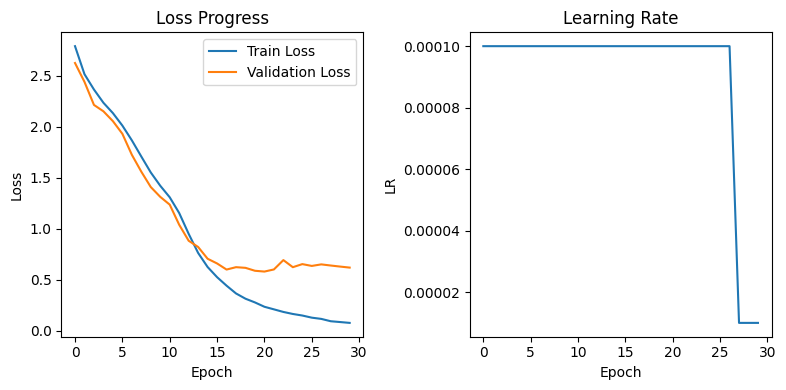

Epoch 31/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 31/50:   0%|          | 1/450 [00:00<06:21,  1.18it/s, Train Loss=0.0623, LR=0.000010]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 31/50:   0%|          | 2/450 [00:01<05:10,  1.44it/s, Train Loss=0.1620, LR=0.000010]

Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 31/50:   1%|          | 3/450 [00:02<04:49,  1.54it/s, Train Loss=0.0834, LR=0.000010]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 31/50:   1%|          | 4/450 [00:02<04:38,  1.60it/s, Train Loss=0.1009, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 31/50:   1%|          | 5/450 [00:03<04:32,  1.63it/s, Train Loss=0.1154, LR=0.000010]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 31/50:   1%|▏         | 6/450 [00:03<04:28,  1.65it/s, Train Loss=0.0907, LR=0.000010]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 31/50:   2%|▏         | 7/450 [00:04<04:26,  1.66it/s, Train Loss=0.0722, LR=0.000010]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 31/50:   2%|▏         | 8/450 [00:04<04:25,  1.67it/s, Train Loss=0.0529, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 31/50:   2%|▏         | 9/450 [00:05<04:23,  1.68it/s, Train Loss=0.0360, LR=0.000010]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 31/50:   2%|▏         | 10/450 [00:06<04:21,  1.68it/s, Train Loss=0.0584, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 31/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=0.0932, LR=0.000010]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 31/50:   3%|▎         | 12/450 [00:07<04:19,  1.69it/s, Train Loss=0.2602, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 31/50:   3%|▎         | 13/450 [00:07<04:18,  1.69it/s, Train Loss=0.0443, LR=0.000010]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 31/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=0.0160, LR=0.000010]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 31/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=0.0593, LR=0.000010]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 31/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=0.0726, LR=0.000010]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 31/50:   4%|▍         | 17/450 [00:10<04:16,  1.69it/s, Train Loss=0.1098, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 31/50:   4%|▍         | 18/450 [00:10<04:16,  1.69it/s, Train Loss=0.0412, LR=0.000010]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 31/50:   4%|▍         | 19/450 [00:11<04:14,  1.69it/s, Train Loss=0.1104, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 31/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.0268, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 31/50:   5%|▍         | 21/450 [00:12<04:13,  1.69it/s, Train Loss=0.0460, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 31/50:   5%|▍         | 22/450 [00:13<04:13,  1.69it/s, Train Loss=0.0955, LR=0.000010]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 31/50:   5%|▌         | 23/450 [00:13<04:12,  1.69it/s, Train Loss=0.0540, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 31/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.0976, LR=0.000010]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 31/50:   6%|▌         | 25/450 [00:15<04:12,  1.69it/s, Train Loss=0.2711, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 31/50:   6%|▌         | 26/450 [00:15<04:12,  1.68it/s, Train Loss=0.0377, LR=0.000010]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 31/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=0.0210, LR=0.000010]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 31/50:   6%|▌         | 28/450 [00:16<04:09,  1.69it/s, Train Loss=0.1133, LR=0.000010]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 31/50:   6%|▋         | 29/450 [00:17<04:08,  1.69it/s, Train Loss=0.0505, LR=0.000010]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 31/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.1740, LR=0.000010]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 31/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.0617, LR=0.000010]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 31/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.0373, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 31/50:   7%|▋         | 33/450 [00:19<04:07,  1.68it/s, Train Loss=0.0325, LR=0.000010]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 31/50:   8%|▊         | 34/450 [00:20<04:06,  1.69it/s, Train Loss=0.0611, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 31/50:   8%|▊         | 35/450 [00:20<04:06,  1.69it/s, Train Loss=0.0500, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 31/50:   8%|▊         | 36/450 [00:21<04:05,  1.69it/s, Train Loss=0.0702, LR=0.000010]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 31/50:   8%|▊         | 37/450 [00:22<04:04,  1.69it/s, Train Loss=0.0716, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 31/50:   8%|▊         | 38/450 [00:22<04:03,  1.69it/s, Train Loss=0.0886, LR=0.000010]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 31/50:   9%|▊         | 39/450 [00:23<04:02,  1.69it/s, Train Loss=0.0854, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 31/50:   9%|▉         | 40/450 [00:23<04:03,  1.69it/s, Train Loss=0.1335, LR=0.000010]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 31/50:   9%|▉         | 41/450 [00:24<04:01,  1.69it/s, Train Loss=0.0437, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 31/50:   9%|▉         | 42/450 [00:25<04:00,  1.70it/s, Train Loss=0.0395, LR=0.000010]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 31/50:  10%|▉         | 43/450 [00:25<04:00,  1.69it/s, Train Loss=0.1233, LR=0.000010]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 31/50:  10%|▉         | 44/450 [00:26<03:59,  1.69it/s, Train Loss=0.0445, LR=0.000010]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 31/50:  10%|█         | 45/450 [00:26<04:00,  1.69it/s, Train Loss=0.0899, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 31/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=0.0501, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 31/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=0.0915, LR=0.000010]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 31/50:  11%|█         | 48/450 [00:28<03:57,  1.69it/s, Train Loss=0.1041, LR=0.000010]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 31/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=0.0629, LR=0.000010]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 31/50:  11%|█         | 50/450 [00:29<03:57,  1.68it/s, Train Loss=0.0366, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 31/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=0.1285, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 31/50:  12%|█▏        | 52/450 [00:31<03:55,  1.69it/s, Train Loss=0.0642, LR=0.000010]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 31/50:  12%|█▏        | 53/450 [00:31<03:54,  1.69it/s, Train Loss=0.0664, LR=0.000010]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 31/50:  12%|█▏        | 54/450 [00:32<03:54,  1.69it/s, Train Loss=0.0338, LR=0.000010]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 31/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=0.0900, LR=0.000010]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 31/50:  12%|█▏        | 56/450 [00:33<03:53,  1.69it/s, Train Loss=0.0818, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 31/50:  13%|█▎        | 57/450 [00:33<03:52,  1.69it/s, Train Loss=0.1397, LR=0.000010]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 31/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=0.1440, LR=0.000010]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 31/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.0326, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 31/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.0332, LR=0.000010]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 31/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.0347, LR=0.000010]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 31/50:  14%|█▍        | 62/450 [00:36<03:50,  1.69it/s, Train Loss=0.0388, LR=0.000010]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 31/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=0.0323, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 31/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.3638, LR=0.000010]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 31/50:  14%|█▍        | 65/450 [00:38<03:48,  1.69it/s, Train Loss=0.0883, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 31/50:  15%|█▍        | 66/450 [00:39<03:48,  1.68it/s, Train Loss=0.1093, LR=0.000010]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 31/50:  15%|█▍        | 67/450 [00:39<03:46,  1.69it/s, Train Loss=0.0658, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 31/50:  15%|█▌        | 68/450 [00:40<03:46,  1.68it/s, Train Loss=0.0781, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 31/50:  15%|█▌        | 69/450 [00:41<03:46,  1.68it/s, Train Loss=0.0758, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 31/50:  16%|█▌        | 70/450 [00:41<03:45,  1.68it/s, Train Loss=0.0373, LR=0.000010]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 31/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=0.0556, LR=0.000010]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 31/50:  16%|█▌        | 72/450 [00:42<03:44,  1.69it/s, Train Loss=0.0830, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 31/50:  16%|█▌        | 73/450 [00:43<03:43,  1.68it/s, Train Loss=0.0681, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 31/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=0.1000, LR=0.000010]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 31/50:  17%|█▋        | 75/450 [00:44<03:41,  1.69it/s, Train Loss=0.0956, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 31/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=0.0969, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 31/50:  17%|█▋        | 77/450 [00:45<03:40,  1.69it/s, Train Loss=0.0993, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 31/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=0.0853, LR=0.000010]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 31/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=0.1162, LR=0.000010]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 31/50:  18%|█▊        | 80/450 [00:47<03:38,  1.69it/s, Train Loss=0.0901, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 31/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.1512, LR=0.000010]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 31/50:  18%|█▊        | 82/450 [00:48<03:38,  1.68it/s, Train Loss=0.0359, LR=0.000010]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 31/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=0.0755, LR=0.000010]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 31/50:  19%|█▊        | 84/450 [00:50<03:37,  1.69it/s, Train Loss=0.0605, LR=0.000010]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 31/50:  19%|█▉        | 85/450 [00:50<03:35,  1.70it/s, Train Loss=0.0637, LR=0.000010]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 31/50:  19%|█▉        | 86/450 [00:51<03:34,  1.70it/s, Train Loss=0.0715, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 31/50:  19%|█▉        | 87/450 [00:51<03:33,  1.70it/s, Train Loss=0.0838, LR=0.000010]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 31/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.0588, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 31/50:  20%|█▉        | 89/450 [00:52<03:33,  1.69it/s, Train Loss=0.0488, LR=0.000010]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 31/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=0.0455, LR=0.000010]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 31/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=0.0768, LR=0.000010]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 31/50:  20%|██        | 92/450 [00:54<03:32,  1.68it/s, Train Loss=0.0828, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 31/50:  21%|██        | 93/450 [00:55<03:32,  1.68it/s, Train Loss=0.0555, LR=0.000010]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 31/50:  21%|██        | 94/450 [00:55<03:31,  1.68it/s, Train Loss=0.0280, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 31/50:  21%|██        | 95/450 [00:56<03:31,  1.68it/s, Train Loss=0.0218, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 31/50:  21%|██▏       | 96/450 [00:57<03:30,  1.69it/s, Train Loss=0.0335, LR=0.000010]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 31/50:  22%|██▏       | 97/450 [00:57<03:29,  1.69it/s, Train Loss=0.0599, LR=0.000010]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 31/50:  22%|██▏       | 98/450 [00:58<03:29,  1.68it/s, Train Loss=0.1434, LR=0.000010]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 31/50:  22%|██▏       | 99/450 [00:58<03:28,  1.68it/s, Train Loss=0.0328, LR=0.000010]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 31/50:  22%|██▏       | 100/450 [00:59<03:27,  1.68it/s, Train Loss=0.0426, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 31/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.0795, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 31/50:  23%|██▎       | 102/450 [01:00<03:27,  1.68it/s, Train Loss=0.0371, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 31/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=0.0292, LR=0.000010]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 31/50:  23%|██▎       | 104/450 [01:01<03:25,  1.68it/s, Train Loss=0.0753, LR=0.000010]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 31/50:  23%|██▎       | 105/450 [01:02<03:24,  1.69it/s, Train Loss=0.0933, LR=0.000010]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 31/50:  24%|██▎       | 106/450 [01:03<03:24,  1.69it/s, Train Loss=0.0601, LR=0.000010]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 31/50:  24%|██▍       | 107/450 [01:03<03:22,  1.69it/s, Train Loss=0.1268, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 31/50:  24%|██▍       | 108/450 [01:04<03:21,  1.70it/s, Train Loss=0.0542, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 31/50:  24%|██▍       | 109/450 [01:04<03:21,  1.69it/s, Train Loss=0.0469, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 31/50:  24%|██▍       | 110/450 [01:05<03:20,  1.70it/s, Train Loss=0.0717, LR=0.000010]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 31/50:  25%|██▍       | 111/450 [01:05<03:19,  1.70it/s, Train Loss=0.0935, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 31/50:  25%|██▍       | 112/450 [01:06<03:19,  1.69it/s, Train Loss=0.0470, LR=0.000010]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 31/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.0671, LR=0.000010]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 31/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=0.0657, LR=0.000010]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 31/50:  26%|██▌       | 115/450 [01:08<03:17,  1.70it/s, Train Loss=0.0615, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 31/50:  26%|██▌       | 116/450 [01:08<03:17,  1.69it/s, Train Loss=0.0716, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 31/50:  26%|██▌       | 117/450 [01:09<03:17,  1.69it/s, Train Loss=0.0634, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 31/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=0.1983, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 31/50:  26%|██▋       | 119/450 [01:10<03:15,  1.69it/s, Train Loss=0.0289, LR=0.000010]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 31/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.0937, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 31/50:  27%|██▋       | 121/450 [01:11<03:14,  1.69it/s, Train Loss=0.0590, LR=0.000010]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 31/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.0500, LR=0.000010]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 31/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.1049, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 31/50:  28%|██▊       | 124/450 [01:13<03:13,  1.69it/s, Train Loss=0.0424, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 31/50:  28%|██▊       | 125/450 [01:14<03:12,  1.68it/s, Train Loss=0.1217, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 31/50:  28%|██▊       | 126/450 [01:14<03:11,  1.69it/s, Train Loss=0.0362, LR=0.000010]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 31/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=0.0558, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 31/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.0767, LR=0.000010]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 31/50:  29%|██▊       | 129/450 [01:16<03:10,  1.68it/s, Train Loss=0.0922, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 31/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.0696, LR=0.000010]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 31/50:  29%|██▉       | 131/450 [01:17<03:09,  1.68it/s, Train Loss=0.0614, LR=0.000010]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 31/50:  29%|██▉       | 132/450 [01:18<03:08,  1.68it/s, Train Loss=0.0686, LR=0.000010]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 31/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=0.0572, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 31/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.1125, LR=0.000010]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 31/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.0717, LR=0.000010]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 31/50:  30%|███       | 136/450 [01:20<03:06,  1.69it/s, Train Loss=0.0557, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 31/50:  30%|███       | 137/450 [01:21<03:06,  1.68it/s, Train Loss=0.1053, LR=0.000010]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 31/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=0.1750, LR=0.000010]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 31/50:  31%|███       | 139/450 [01:22<03:05,  1.68it/s, Train Loss=0.1467, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 31/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=0.0595, LR=0.000010]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 31/50:  31%|███▏      | 141/450 [01:23<03:04,  1.68it/s, Train Loss=0.0715, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 31/50:  32%|███▏      | 142/450 [01:24<03:03,  1.67it/s, Train Loss=0.0555, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 31/50:  32%|███▏      | 143/450 [01:24<03:03,  1.68it/s, Train Loss=0.0781, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 31/50:  32%|███▏      | 144/450 [01:25<03:02,  1.67it/s, Train Loss=0.0770, LR=0.000010]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 31/50:  32%|███▏      | 145/450 [01:26<03:01,  1.68it/s, Train Loss=0.0487, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 31/50:  32%|███▏      | 146/450 [01:26<03:01,  1.68it/s, Train Loss=0.0627, LR=0.000010]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 31/50:  33%|███▎      | 147/450 [01:27<03:00,  1.68it/s, Train Loss=0.0312, LR=0.000010]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 31/50:  33%|███▎      | 148/450 [01:27<02:59,  1.69it/s, Train Loss=0.0457, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 31/50:  33%|███▎      | 149/450 [01:28<02:58,  1.69it/s, Train Loss=0.1071, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 31/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.0331, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 31/50:  34%|███▎      | 151/450 [01:29<02:56,  1.69it/s, Train Loss=0.0922, LR=0.000010]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 31/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.1371, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 31/50:  34%|███▍      | 153/450 [01:30<02:55,  1.69it/s, Train Loss=0.0722, LR=0.000010]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 31/50:  34%|███▍      | 154/450 [01:31<02:54,  1.69it/s, Train Loss=0.0998, LR=0.000010]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 31/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.0373, LR=0.000010]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 31/50:  35%|███▍      | 156/450 [01:32<02:53,  1.69it/s, Train Loss=0.0749, LR=0.000010]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 31/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.0750, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 31/50:  35%|███▌      | 158/450 [01:33<02:52,  1.69it/s, Train Loss=0.0678, LR=0.000010]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 31/50:  35%|███▌      | 159/450 [01:34<02:51,  1.69it/s, Train Loss=0.0966, LR=0.000010]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 31/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.1035, LR=0.000010]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 31/50:  36%|███▌      | 161/450 [01:35<02:50,  1.69it/s, Train Loss=0.1115, LR=0.000010]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 31/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.1688, LR=0.000010]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 31/50:  36%|███▌      | 163/450 [01:36<02:49,  1.69it/s, Train Loss=0.0676, LR=0.000010]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 31/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=0.0783, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 31/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=0.0383, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 31/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=0.0337, LR=0.000010]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 31/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0213, LR=0.000010]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 31/50:  37%|███▋      | 168/450 [01:39<02:47,  1.68it/s, Train Loss=0.0307, LR=0.000010]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 31/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.1489, LR=0.000010]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 31/50:  38%|███▊      | 170/450 [01:40<02:46,  1.68it/s, Train Loss=0.0292, LR=0.000010]

Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 31/50:  38%|███▊      | 171/450 [01:41<02:45,  1.68it/s, Train Loss=0.0344, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 31/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.1178, LR=0.000010]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 31/50:  38%|███▊      | 173/450 [01:42<02:44,  1.69it/s, Train Loss=0.0355, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 31/50:  39%|███▊      | 174/450 [01:43<02:44,  1.68it/s, Train Loss=0.0525, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 31/50:  39%|███▉      | 175/450 [01:43<02:43,  1.68it/s, Train Loss=0.0782, LR=0.000010]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 31/50:  39%|███▉      | 176/450 [01:44<02:42,  1.68it/s, Train Loss=0.1205, LR=0.000010]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 31/50:  39%|███▉      | 177/450 [01:45<02:42,  1.68it/s, Train Loss=0.0852, LR=0.000010]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 31/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=0.0842, LR=0.000010]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 31/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.0665, LR=0.000010]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 31/50:  40%|████      | 180/450 [01:46<02:39,  1.69it/s, Train Loss=0.1034, LR=0.000010]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 31/50:  40%|████      | 181/450 [01:47<02:39,  1.68it/s, Train Loss=0.0472, LR=0.000010]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 31/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=0.0941, LR=0.000010]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 31/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.1541, LR=0.000010]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 31/50:  41%|████      | 184/450 [01:49<02:38,  1.68it/s, Train Loss=0.0343, LR=0.000010]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 31/50:  41%|████      | 185/450 [01:49<02:37,  1.68it/s, Train Loss=0.0458, LR=0.000010]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 31/50:  41%|████▏     | 186/450 [01:50<02:37,  1.68it/s, Train Loss=0.0740, LR=0.000010]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 31/50:  42%|████▏     | 187/450 [01:51<02:36,  1.68it/s, Train Loss=0.0889, LR=0.000010]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 31/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=0.0957, LR=0.000010]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 31/50:  42%|████▏     | 189/450 [01:52<02:35,  1.68it/s, Train Loss=0.0520, LR=0.000010]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 31/50:  42%|████▏     | 190/450 [01:52<02:34,  1.68it/s, Train Loss=0.0493, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 31/50:  42%|████▏     | 191/450 [01:53<02:34,  1.68it/s, Train Loss=0.0464, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 31/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=0.1228, LR=0.000010]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 31/50:  43%|████▎     | 193/450 [01:54<02:32,  1.68it/s, Train Loss=0.0386, LR=0.000010]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 31/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.0663, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 31/50:  43%|████▎     | 195/450 [01:55<02:31,  1.68it/s, Train Loss=0.1002, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 31/50:  44%|████▎     | 196/450 [01:56<02:31,  1.68it/s, Train Loss=0.0489, LR=0.000010]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 31/50:  44%|████▍     | 197/450 [01:57<02:30,  1.68it/s, Train Loss=0.0712, LR=0.000010]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 31/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.0544, LR=0.000010]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 31/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.1433, LR=0.000010]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 31/50:  44%|████▍     | 200/450 [01:58<02:28,  1.68it/s, Train Loss=0.2544, LR=0.000010]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 31/50:  45%|████▍     | 201/450 [01:59<02:28,  1.68it/s, Train Loss=0.0564, LR=0.000010]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 31/50:  45%|████▍     | 202/450 [01:59<02:27,  1.68it/s, Train Loss=0.0344, LR=0.000010]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 31/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.0526, LR=0.000010]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 31/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.0628, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 31/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=0.0666, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 31/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.0518, LR=0.000010]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 31/50:  46%|████▌     | 207/450 [02:02<02:24,  1.68it/s, Train Loss=0.0580, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 31/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.0452, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 31/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.1215, LR=0.000010]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 31/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=0.0274, LR=0.000010]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 31/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.0540, LR=0.000010]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 31/50:  47%|████▋     | 212/450 [02:05<02:20,  1.69it/s, Train Loss=0.0718, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 31/50:  47%|████▋     | 213/450 [02:06<02:19,  1.69it/s, Train Loss=0.0111, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 31/50:  48%|████▊     | 214/450 [02:07<02:19,  1.70it/s, Train Loss=0.0394, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 31/50:  48%|████▊     | 215/450 [02:07<02:18,  1.69it/s, Train Loss=0.0943, LR=0.000010]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 31/50:  48%|████▊     | 216/450 [02:08<02:17,  1.70it/s, Train Loss=0.0379, LR=0.000010]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 31/50:  48%|████▊     | 217/450 [02:08<02:16,  1.70it/s, Train Loss=0.0530, LR=0.000010]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 31/50:  48%|████▊     | 218/450 [02:09<02:16,  1.70it/s, Train Loss=0.0575, LR=0.000010]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 31/50:  49%|████▊     | 219/450 [02:10<02:15,  1.70it/s, Train Loss=0.1121, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 31/50:  49%|████▉     | 220/450 [02:10<02:15,  1.70it/s, Train Loss=0.0399, LR=0.000010]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 31/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=0.0545, LR=0.000010]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 31/50:  49%|████▉     | 222/450 [02:11<02:15,  1.68it/s, Train Loss=0.0477, LR=0.000010]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 31/50:  50%|████▉     | 223/450 [02:12<02:14,  1.68it/s, Train Loss=0.0477, LR=0.000010]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 31/50:  50%|████▉     | 224/450 [02:13<02:13,  1.69it/s, Train Loss=0.1417, LR=0.000010]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 31/50:  50%|█████     | 225/450 [02:13<02:13,  1.68it/s, Train Loss=0.1062, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 31/50:  50%|█████     | 226/450 [02:14<02:13,  1.68it/s, Train Loss=0.0543, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 31/50:  50%|█████     | 227/450 [02:14<02:12,  1.69it/s, Train Loss=0.1108, LR=0.000010]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 31/50:  51%|█████     | 228/450 [02:15<02:12,  1.68it/s, Train Loss=0.0607, LR=0.000010]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 31/50:  51%|█████     | 229/450 [02:15<02:11,  1.68it/s, Train Loss=0.0327, LR=0.000010]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 31/50:  51%|█████     | 230/450 [02:16<02:10,  1.68it/s, Train Loss=0.1074, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 31/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=0.0722, LR=0.000010]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 31/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=0.0342, LR=0.000010]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 31/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.0365, LR=0.000010]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 31/50:  52%|█████▏    | 234/450 [02:18<02:08,  1.69it/s, Train Loss=0.0311, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 31/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.1102, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 31/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.0576, LR=0.000010]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 31/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.69it/s, Train Loss=0.0716, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 31/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.0191, LR=0.000010]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 31/50:  53%|█████▎    | 239/450 [02:21<02:05,  1.68it/s, Train Loss=0.0627, LR=0.000010]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 31/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.0754, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 31/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=0.0505, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 31/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=0.0441, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 31/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.0704, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 31/50:  54%|█████▍    | 244/450 [02:24<02:01,  1.70it/s, Train Loss=0.0726, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 31/50:  54%|█████▍    | 245/450 [02:25<02:00,  1.70it/s, Train Loss=0.0604, LR=0.000010]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 31/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.70it/s, Train Loss=0.0210, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbv6n.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 31/50:  55%|█████▍    | 247/450 [02:26<01:59,  1.70it/s, Train Loss=0.0382, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 31/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.0578, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 31/50:  55%|█████▌    | 249/450 [02:27<01:59,  1.69it/s, Train Loss=0.0828, LR=0.000010]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 31/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.0646, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 31/50:  56%|█████▌    | 251/450 [02:29<01:58,  1.68it/s, Train Loss=0.0299, LR=0.000010]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 31/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=0.1210, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 31/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.2140, LR=0.000010]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 31/50:  56%|█████▋    | 254/450 [02:30<01:55,  1.69it/s, Train Loss=0.0612, LR=0.000010]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 31/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.0493, LR=0.000010]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 31/50:  57%|█████▋    | 256/450 [02:31<01:55,  1.68it/s, Train Loss=0.0325, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 31/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.68it/s, Train Loss=0.1506, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 31/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.68it/s, Train Loss=0.0593, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 31/50:  58%|█████▊    | 259/450 [02:33<01:54,  1.67it/s, Train Loss=0.0445, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 31/50:  58%|█████▊    | 260/450 [02:34<01:53,  1.67it/s, Train Loss=0.0422, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 31/50:  58%|█████▊    | 261/450 [02:34<01:53,  1.67it/s, Train Loss=0.0718, LR=0.000010]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 31/50:  58%|█████▊    | 262/450 [02:35<01:52,  1.68it/s, Train Loss=0.2003, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 31/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=0.0945, LR=0.000010]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 31/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.69it/s, Train Loss=0.0568, LR=0.000010]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 31/50:  59%|█████▉    | 265/450 [02:37<01:50,  1.68it/s, Train Loss=0.0530, LR=0.000010]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 31/50:  59%|█████▉    | 266/450 [02:37<01:49,  1.68it/s, Train Loss=0.0653, LR=0.000010]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 31/50:  59%|█████▉    | 267/450 [02:38<01:49,  1.68it/s, Train Loss=0.0711, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 31/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=0.0331, LR=0.000010]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 31/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.68it/s, Train Loss=0.0790, LR=0.000010]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 31/50:  60%|██████    | 270/450 [02:40<01:46,  1.68it/s, Train Loss=0.0460, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 31/50:  60%|██████    | 271/450 [02:40<01:46,  1.69it/s, Train Loss=0.0553, LR=0.000010]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 31/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.0858, LR=0.000010]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 31/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.0744, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 31/50:  61%|██████    | 274/450 [02:42<01:43,  1.69it/s, Train Loss=0.0572, LR=0.000010]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 31/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.0717, LR=0.000010]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 31/50:  61%|██████▏   | 276/450 [02:43<01:43,  1.68it/s, Train Loss=0.0263, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 31/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.0627, LR=0.000010]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 31/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.68it/s, Train Loss=0.0614, LR=0.000010]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 31/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.68it/s, Train Loss=0.0723, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 31/50:  62%|██████▏   | 280/450 [02:46<01:41,  1.68it/s, Train Loss=0.0187, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 31/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.68it/s, Train Loss=0.0255, LR=0.000010]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 31/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.0522, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 31/50:  63%|██████▎   | 283/450 [02:48<01:39,  1.68it/s, Train Loss=0.0652, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 31/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.0762, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 31/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.0382, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 31/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.69it/s, Train Loss=0.0486, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 31/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.68it/s, Train Loss=0.0815, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 31/50:  64%|██████▍   | 288/450 [02:50<01:35,  1.69it/s, Train Loss=0.1158, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 31/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.1538, LR=0.000010]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 31/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.70it/s, Train Loss=0.0760, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 31/50:  65%|██████▍   | 291/450 [02:52<01:33,  1.70it/s, Train Loss=0.0683, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 31/50:  65%|██████▍   | 292/450 [02:53<01:34,  1.68it/s, Train Loss=0.1369, LR=0.000010]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 31/50:  65%|██████▌   | 293/450 [02:53<01:33,  1.68it/s, Train Loss=0.0474, LR=0.000010]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 31/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.68it/s, Train Loss=0.1021, LR=0.000010]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 31/50:  66%|██████▌   | 295/450 [02:55<01:32,  1.68it/s, Train Loss=0.0672, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 31/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.68it/s, Train Loss=0.3094, LR=0.000010]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 31/50:  66%|██████▌   | 297/450 [02:56<01:31,  1.68it/s, Train Loss=0.0387, LR=0.000010]

Attempting to read 75 frames from data/s1/swwj1a.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 31/50:  66%|██████▌   | 298/450 [02:56<01:30,  1.69it/s, Train Loss=0.0196, LR=0.000010]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg



Epoch 31/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.1089, LR=0.000010]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 31/50:  67%|██████▋   | 300/450 [02:58<01:29,  1.68it/s, Train Loss=0.1427, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 31/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.68it/s, Train Loss=0.1674, LR=0.000010]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 31/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.68it/s, Train Loss=0.0532, LR=0.000010]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 31/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.68it/s, Train Loss=0.0323, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 31/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.0213, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 31/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=0.1068, LR=0.000010]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 31/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=0.0221, LR=0.000010]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 31/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.68it/s, Train Loss=0.0145, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 31/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.68it/s, Train Loss=0.2850, LR=0.000010]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 31/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.68it/s, Train Loss=0.0633, LR=0.000010]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 31/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.69it/s, Train Loss=0.1277, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 31/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.68it/s, Train Loss=0.0935, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 31/50:  69%|██████▉   | 312/450 [03:05<01:22,  1.68it/s, Train Loss=0.0398, LR=0.000010]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 31/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.68it/s, Train Loss=0.0327, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 31/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.68it/s, Train Loss=0.0632, LR=0.000010]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 31/50:  70%|███████   | 315/450 [03:07<01:20,  1.68it/s, Train Loss=0.0736, LR=0.000010]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 31/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=0.0204, LR=0.000010]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 31/50:  70%|███████   | 317/450 [03:08<01:19,  1.68it/s, Train Loss=0.0929, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 31/50:  71%|███████   | 318/450 [03:08<01:18,  1.68it/s, Train Loss=0.0446, LR=0.000010]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 31/50:  71%|███████   | 319/450 [03:09<01:17,  1.68it/s, Train Loss=0.0654, LR=0.000010]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 31/50:  71%|███████   | 320/450 [03:09<01:17,  1.69it/s, Train Loss=0.0588, LR=0.000010]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 31/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.0647, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 31/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.0999, LR=0.000010]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 31/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.0374, LR=0.000010]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 31/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.0865, LR=0.000010]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 31/50:  72%|███████▏  | 325/450 [03:12<01:14,  1.69it/s, Train Loss=0.0540, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 31/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.0632, LR=0.000010]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 31/50:  73%|███████▎  | 327/450 [03:14<01:13,  1.68it/s, Train Loss=0.1878, LR=0.000010]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 31/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=0.0357, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 31/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.0369, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 31/50:  73%|███████▎  | 330/450 [03:15<01:11,  1.68it/s, Train Loss=0.0332, LR=0.000010]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 31/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.68it/s, Train Loss=0.0176, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 31/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=0.0776, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 31/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.0507, LR=0.000010]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 31/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.0655, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 31/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.69it/s, Train Loss=0.0802, LR=0.000010]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 31/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=0.0403, LR=0.000010]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 31/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.68it/s, Train Loss=0.0305, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 31/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.68it/s, Train Loss=0.0439, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 31/50:  75%|███████▌  | 339/450 [03:21<01:06,  1.68it/s, Train Loss=0.0828, LR=0.000010]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 31/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.68it/s, Train Loss=0.1029, LR=0.000010]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 31/50:  76%|███████▌  | 341/450 [03:22<01:05,  1.67it/s, Train Loss=0.0247, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 31/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.67it/s, Train Loss=0.0799, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 31/50:  76%|███████▌  | 343/450 [03:23<01:04,  1.67it/s, Train Loss=0.0607, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 31/50:  76%|███████▋  | 344/450 [03:24<01:03,  1.67it/s, Train Loss=0.0446, LR=0.000010]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 31/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.68it/s, Train Loss=0.0776, LR=0.000010]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 31/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.0441, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 31/50:  77%|███████▋  | 347/450 [03:26<01:00,  1.69it/s, Train Loss=0.0496, LR=0.000010]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 31/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.68it/s, Train Loss=0.0237, LR=0.000010]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 31/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.0503, LR=0.000010]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 31/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.0301, LR=0.000010]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 31/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.0481, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 31/50:  78%|███████▊  | 352/450 [03:28<00:58,  1.69it/s, Train Loss=0.1686, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 31/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=0.0733, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 31/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.68it/s, Train Loss=0.0437, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 31/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.0399, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 31/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.0721, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 31/50:  79%|███████▉  | 357/450 [03:31<00:55,  1.69it/s, Train Loss=0.0785, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 31/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.1065, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 31/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=0.0260, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 31/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.0480, LR=0.000010]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 31/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.1616, LR=0.000010]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 31/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=0.0625, LR=0.000010]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 31/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.0807, LR=0.000010]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 31/50:  81%|████████  | 364/450 [03:36<00:51,  1.68it/s, Train Loss=0.1985, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 31/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.0945, LR=0.000010]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 31/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=0.0715, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 31/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=0.0624, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 31/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=0.0725, LR=0.000010]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 31/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.69it/s, Train Loss=0.0436, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 31/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.0337, LR=0.000010]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 31/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.0583, LR=0.000010]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 31/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.0319, LR=0.000010]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 31/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.68it/s, Train Loss=0.0313, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 31/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.68it/s, Train Loss=0.0687, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 31/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.68it/s, Train Loss=0.0908, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 31/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.1260, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 31/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.0624, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 31/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.0419, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 31/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.69it/s, Train Loss=0.0723, LR=0.000010]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 31/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.68it/s, Train Loss=0.0338, LR=0.000010]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 31/50:  85%|████████▍ | 381/450 [03:46<00:41,  1.68it/s, Train Loss=0.1151, LR=0.000010]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 31/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.0631, LR=0.000010]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 31/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.2581, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 31/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.69it/s, Train Loss=0.0759, LR=0.000010]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 31/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.1513, LR=0.000010]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 31/50:  86%|████████▌ | 386/450 [03:49<00:38,  1.68it/s, Train Loss=0.0930, LR=0.000010]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 31/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=0.0338, LR=0.000010]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 31/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.68it/s, Train Loss=0.2486, LR=0.000010]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 31/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.68it/s, Train Loss=0.0332, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 31/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=0.0405, LR=0.000010]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 31/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.68it/s, Train Loss=0.1025, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 31/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.67it/s, Train Loss=0.0302, LR=0.000010]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 31/50:  87%|████████▋ | 393/450 [03:53<00:34,  1.68it/s, Train Loss=0.0268, LR=0.000010]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 31/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.68it/s, Train Loss=0.0588, LR=0.000010]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 31/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=0.0346, LR=0.000010]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 31/50:  88%|████████▊ | 396/450 [03:55<00:31,  1.69it/s, Train Loss=0.0424, LR=0.000010]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 31/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.0232, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 31/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.70it/s, Train Loss=0.0589, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 31/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.0619, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 31/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.0434, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 31/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.69it/s, Train Loss=0.2048, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 31/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.0286, LR=0.000010]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 31/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=0.1313, LR=0.000010]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 31/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.0654, LR=0.000010]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 31/50:  90%|█████████ | 405/450 [04:00<00:26,  1.70it/s, Train Loss=0.0637, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 31/50:  90%|█████████ | 406/450 [04:01<00:25,  1.70it/s, Train Loss=0.0779, LR=0.000010]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 31/50:  90%|█████████ | 407/450 [04:01<00:25,  1.70it/s, Train Loss=0.0596, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 31/50:  91%|█████████ | 408/450 [04:02<00:24,  1.70it/s, Train Loss=0.1100, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 31/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.1269, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 31/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.0489, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 31/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.69it/s, Train Loss=0.0762, LR=0.000010]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 31/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.68it/s, Train Loss=0.1201, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 31/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.0470, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 31/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.0501, LR=0.000010]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 31/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.0620, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 31/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.69it/s, Train Loss=0.0608, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 31/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.70it/s, Train Loss=0.2096, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 31/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=0.1225, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 31/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.70it/s, Train Loss=0.0261, LR=0.000010]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 31/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.70it/s, Train Loss=0.1075, LR=0.000010]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 31/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.70it/s, Train Loss=0.0423, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 31/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.70it/s, Train Loss=0.0562, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 31/50:  94%|█████████▍| 423/450 [04:11<00:15,  1.69it/s, Train Loss=0.0398, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 31/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.0665, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 31/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.0541, LR=0.000010]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 31/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.0280, LR=0.000010]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 31/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.0407, LR=0.000010]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 31/50:  95%|█████████▌| 428/450 [04:14<00:12,  1.69it/s, Train Loss=0.0510, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 31/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.0705, LR=0.000010]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 31/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.0585, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 31/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.0452, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 31/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.0483, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 31/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.69it/s, Train Loss=0.0471, LR=0.000010]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 31/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.0919, LR=0.000010]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 31/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.70it/s, Train Loss=0.1009, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 31/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.70it/s, Train Loss=0.1187, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 31/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.0624, LR=0.000010]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 31/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.69it/s, Train Loss=0.0513, LR=0.000010]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 31/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.0743, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 31/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.0886, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 31/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=0.0904, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 31/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.0195, LR=0.000010]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 31/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.69it/s, Train Loss=0.1031, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 31/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.0646, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 31/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=0.0468, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 31/50: 100%|██████████| 450/450 [04:26<00:00,  1.70it/s, Train Loss=0.0484, LR=0.000010]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg



Validation:   2%|▏         | 1/50 [00:00<00:32,  1.52it/s, Val Loss=1.2240]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg


Attempting to read 75 frames from data/s1/pgwr4n.mpg


Validation:   4%|▍         | 2/50 [00:00<00:18,  2.56it/s, Val Loss=0.2865]

Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   6%|▌         | 3/50 [00:01<00:13,  3.37it/s, Val Loss=0.5741]

Attempting to read 75 frames from data/s1/swao6p.mpgAttempting to read 75 frames from data/s1/pbav3s.mpg

Attempting to read 75 frames from data/s1/srao1a.mpg


Validation:   8%|▊         | 4/50 [00:01<00:11,  4.03it/s, Val Loss=0.3164]


Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.33it/s, Val Loss=0.1649]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.69it/s, Val Loss=1.0965]

Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.88it/s, Val Loss=1.5337]

Attempting to read 75 frames from data/s1/lbby5a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.88it/s, Val Loss=0.6069]

Attempting to read 75 frames from data/s1/bwim7a.mpg


Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.04it/s, Val Loss=0.6069]


Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.11it/s, Val Loss=0.3220]

Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/bram5a.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.19it/s, Val Loss=0.4100]

Attempting to read 75 frames from data/s1/brbg3s.mpgAttempting to read 75 frames from data/s1/lwbszn.mpg




Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.23it/s, Val Loss=1.1784]

Attempting to read 75 frames from data/s1/sgap3a.mpgAttempting to read 75 frames from data/s1/srah4n.mpg

Attempting to read 75 frames from data/s1/prii7s.mpg


Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.23it/s, Val Loss=0.0254]

Attempting to read 75 frames from data/s1/pbwj2n.mpg


Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.22it/s, Val Loss=0.0254]


Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.10it/s, Val Loss=0.5577]

Attempting to read 75 frames from data/s1/lgil5s.mpgAttempting to read 75 frames from data/s1/bbir9a.mpg




Validation:  28%|██▊       | 14/50 [00:03<00:07,  5.11it/s, Val Loss=0.3842]

Attempting to read 75 frames from data/s1/lgbs9a.mpgAttempting to read 75 frames from data/s1/lriq8p.mpg




Validation:  30%|███       | 15/50 [00:03<00:06,  5.14it/s, Val Loss=0.6308]

Attempting to read 75 frames from data/s1/prwx7s.mpgAttempting to read 75 frames from data/s1/bwim4n.mpg

Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.13it/s, Val Loss=0.3838]

Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.15it/s, Val Loss=0.1904]

Attempting to read 75 frames from data/s1/lwie4n.mpg


Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s, Val Loss=0.2838]

Attempting to read 75 frames from data/s1/lgwm9a.mpgAttempting to read 75 frames from data/s1/bram2n.mpg




Validation:  38%|███▊      | 19/50 [00:04<00:06,  5.08it/s, Val Loss=0.1741]

Attempting to read 75 frames from data/s1/bwitzp.mpgAttempting to read 75 frames from data/s1/sbwh8p.mpg




Validation:  40%|████      | 20/50 [00:04<00:05,  5.16it/s, Val Loss=0.1582]

Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.20it/s, Val Loss=2.5699]

Attempting to read 75 frames from data/s1/lrbr5s.mpgAttempting to read 75 frames from data/s1/praj2p.mpg




Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.19it/s, Val Loss=0.1563]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.31it/s, Val Loss=0.7100]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  46%|████▌     | 23/50 [00:05<00:05,  5.31it/s, Val Loss=0.2210]

Attempting to read 75 frames from data/s1/prajzn.mpg


Validation:  48%|████▊     | 24/50 [00:05<00:04,  5.31it/s, Val Loss=0.2210]


Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.37it/s, Val Loss=0.6953]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.41it/s, Val Loss=0.1911]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.43it/s, Val Loss=0.2294]

Attempting to read 75 frames from data/s1/prwd7a.mpgAttempting to read 75 frames from data/s1/srwb8n.mpg




Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.40it/s, Val Loss=1.3233]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.46it/s, Val Loss=0.3655]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.51it/s, Val Loss=2.7314]

Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.24it/s, Val Loss=0.8443]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.30it/s, Val Loss=0.3805]

Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.43it/s, Val Loss=0.4380]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.33it/s, Val Loss=0.1670]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  70%|███████   | 35/50 [00:07<00:02,  5.27it/s, Val Loss=0.2653]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpgAttempting to read 75 frames from data/s1/lgwtzn.mpg




Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.28it/s, Val Loss=0.4295]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg


Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.26it/s, Val Loss=0.2051]


Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.26it/s, Val Loss=1.1281]

Attempting to read 75 frames from data/s1/lbbk6p.mpg



Validation:  80%|████████  | 40/50 [00:08<00:01,  5.29it/s, Val Loss=0.2730]

Attempting to read 75 frames from data/s1/prip1s.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.34it/s, Val Loss=0.2457]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.37it/s, Val Loss=0.1068]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.44it/s, Val Loss=0.2079]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.38it/s, Val Loss=0.3142]

Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.35it/s, Val Loss=0.0992]

Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/lbaq6p.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.36it/s, Val Loss=2.7257]

Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  94%|█████████▍| 47/50 [00:09<00:00,  5.37it/s, Val Loss=0.9985]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  62%|██████▏   | 31/50 [2:23:16<1:27:48, 277.27s/it, Train Loss=0.0741, Val Loss=0.6232, Best Loss=0.5792]

Attempting to read 75 frames from data/s1/sgwj6p.mpg


Epoch 32/50:   0%|          | 0/450 [00:00<?, ?it/s]


Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpgAttempting to read 75 frames from data/s1/pwwe3a.mpg

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 32/50:   0%|          | 1/450 [00:00<06:20,  1.18it/s, Train Loss=0.0676, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 32/50:   0%|          | 2/450 [00:01<05:14,  1.43it/s, Train Loss=0.1124, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 32/50:   1%|          | 3/450 [00:02<04:50,  1.54it/s, Train Loss=0.0886, LR=0.000010]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 32/50:   1%|          | 4/450 [00:02<04:39,  1.59it/s, Train Loss=0.0979, LR=0.000010]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 32/50:   1%|          | 5/450 [00:03<04:33,  1.63it/s, Train Loss=0.1070, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 32/50:   1%|▏         | 6/450 [00:03<04:29,  1.65it/s, Train Loss=0.0608, LR=0.000010]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 32/50:   2%|▏         | 7/450 [00:04<04:26,  1.66it/s, Train Loss=0.1008, LR=0.000010]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 32/50:   2%|▏         | 8/450 [00:04<04:24,  1.67it/s, Train Loss=0.0420, LR=0.000010]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 32/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.0820, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 32/50:   2%|▏         | 10/450 [00:06<04:22,  1.68it/s, Train Loss=0.0776, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 32/50:   2%|▏         | 11/450 [00:06<04:20,  1.68it/s, Train Loss=0.0503, LR=0.000010]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 32/50:   3%|▎         | 12/450 [00:07<04:18,  1.69it/s, Train Loss=0.1337, LR=0.000010]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 32/50:   3%|▎         | 13/450 [00:07<04:18,  1.69it/s, Train Loss=0.0407, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 32/50:   3%|▎         | 14/450 [00:08<04:17,  1.69it/s, Train Loss=0.1401, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 32/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=0.0389, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 32/50:   4%|▎         | 16/450 [00:09<04:15,  1.70it/s, Train Loss=0.0308, LR=0.000010]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 32/50:   4%|▍         | 17/450 [00:10<04:14,  1.70it/s, Train Loss=0.0196, LR=0.000010]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 32/50:   4%|▍         | 18/450 [00:10<04:13,  1.70it/s, Train Loss=0.0651, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 32/50:   4%|▍         | 19/450 [00:11<04:14,  1.70it/s, Train Loss=0.1060, LR=0.000010]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 32/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.0319, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 32/50:   5%|▍         | 21/450 [00:12<04:13,  1.69it/s, Train Loss=0.0778, LR=0.000010]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 32/50:   5%|▍         | 22/450 [00:13<04:13,  1.69it/s, Train Loss=0.0916, LR=0.000010]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 32/50:   5%|▌         | 23/450 [00:13<04:12,  1.69it/s, Train Loss=0.0308, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 32/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.0750, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 32/50:   6%|▌         | 25/450 [00:15<04:12,  1.69it/s, Train Loss=0.0370, LR=0.000010]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 32/50:   6%|▌         | 26/450 [00:15<04:11,  1.69it/s, Train Loss=0.0603, LR=0.000010]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 32/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=0.0919, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 32/50:   6%|▌         | 28/450 [00:16<04:09,  1.69it/s, Train Loss=0.0814, LR=0.000010]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 32/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.0462, LR=0.000010]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 32/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.0913, LR=0.000010]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 32/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.0509, LR=0.000010]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 32/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.0972, LR=0.000010]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 32/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=0.0311, LR=0.000010]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 32/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=0.0451, LR=0.000010]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 32/50:   8%|▊         | 35/450 [00:20<04:07,  1.68it/s, Train Loss=0.0782, LR=0.000010]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 32/50:   8%|▊         | 36/450 [00:21<04:06,  1.68it/s, Train Loss=0.0870, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 32/50:   8%|▊         | 37/450 [00:22<04:05,  1.68it/s, Train Loss=0.0356, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 32/50:   8%|▊         | 38/450 [00:22<04:04,  1.68it/s, Train Loss=0.0273, LR=0.000010]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 32/50:   9%|▊         | 39/450 [00:23<04:03,  1.69it/s, Train Loss=0.0367, LR=0.000010]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 32/50:   9%|▉         | 40/450 [00:23<04:02,  1.69it/s, Train Loss=0.0348, LR=0.000010]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 32/50:   9%|▉         | 41/450 [00:24<04:03,  1.68it/s, Train Loss=0.0656, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 32/50:   9%|▉         | 42/450 [00:25<04:02,  1.68it/s, Train Loss=0.0450, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 32/50:  10%|▉         | 43/450 [00:25<04:01,  1.68it/s, Train Loss=0.0364, LR=0.000010]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 32/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=0.0688, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 32/50:  10%|█         | 45/450 [00:26<04:00,  1.69it/s, Train Loss=0.0261, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 32/50:  10%|█         | 46/450 [00:27<04:00,  1.68it/s, Train Loss=0.0767, LR=0.000010]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 32/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=0.0354, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 32/50:  11%|█         | 48/450 [00:28<03:59,  1.68it/s, Train Loss=0.1011, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 32/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=0.0271, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 32/50:  11%|█         | 50/450 [00:29<03:57,  1.68it/s, Train Loss=0.0630, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 32/50:  11%|█▏        | 51/450 [00:30<03:56,  1.69it/s, Train Loss=0.0543, LR=0.000010]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 32/50:  12%|█▏        | 52/450 [00:31<03:55,  1.69it/s, Train Loss=0.1395, LR=0.000010]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 32/50:  12%|█▏        | 53/450 [00:31<03:54,  1.69it/s, Train Loss=0.1287, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 32/50:  12%|█▏        | 54/450 [00:32<03:54,  1.69it/s, Train Loss=0.1091, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 32/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=0.0558, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 32/50:  12%|█▏        | 56/450 [00:33<03:52,  1.69it/s, Train Loss=0.1166, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 32/50:  13%|█▎        | 57/450 [00:34<03:52,  1.69it/s, Train Loss=0.0691, LR=0.000010]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 32/50:  13%|█▎        | 58/450 [00:34<03:51,  1.69it/s, Train Loss=0.0527, LR=0.000010]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 32/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.0506, LR=0.000010]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 32/50:  13%|█▎        | 60/450 [00:35<03:51,  1.69it/s, Train Loss=0.0373, LR=0.000010]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 32/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.0777, LR=0.000010]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 32/50:  14%|█▍        | 62/450 [00:36<03:49,  1.69it/s, Train Loss=0.0895, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 32/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=0.0866, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 32/50:  14%|█▍        | 64/450 [00:38<03:49,  1.68it/s, Train Loss=0.0552, LR=0.000010]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 32/50:  14%|█▍        | 65/450 [00:38<03:48,  1.69it/s, Train Loss=0.0583, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 32/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=0.0455, LR=0.000010]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 32/50:  15%|█▍        | 67/450 [00:39<03:47,  1.68it/s, Train Loss=0.0630, LR=0.000010]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 32/50:  15%|█▌        | 68/450 [00:40<03:47,  1.68it/s, Train Loss=0.1070, LR=0.000010]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 32/50:  15%|█▌        | 69/450 [00:41<03:46,  1.68it/s, Train Loss=0.0268, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 32/50:  16%|█▌        | 70/450 [00:41<03:45,  1.68it/s, Train Loss=0.0329, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 32/50:  16%|█▌        | 71/450 [00:42<03:44,  1.69it/s, Train Loss=0.0542, LR=0.000010]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 32/50:  16%|█▌        | 72/450 [00:42<03:43,  1.69it/s, Train Loss=0.0868, LR=0.000010]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 32/50:  16%|█▌        | 73/450 [00:43<03:42,  1.70it/s, Train Loss=0.0812, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 32/50:  16%|█▋        | 74/450 [00:44<03:41,  1.70it/s, Train Loss=0.0606, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 32/50:  17%|█▋        | 75/450 [00:44<03:42,  1.69it/s, Train Loss=0.0621, LR=0.000010]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 32/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=0.0474, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 32/50:  17%|█▋        | 77/450 [00:45<03:40,  1.69it/s, Train Loss=0.1332, LR=0.000010]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg



Epoch 32/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=0.0548, LR=0.000010]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 32/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=0.0936, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 32/50:  18%|█▊        | 80/450 [00:47<03:38,  1.69it/s, Train Loss=0.0465, LR=0.000010]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 32/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.0641, LR=0.000010]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 32/50:  18%|█▊        | 82/450 [00:48<03:37,  1.69it/s, Train Loss=0.0557, LR=0.000010]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 32/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=0.0653, LR=0.000010]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 32/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=0.1435, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 32/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=0.0208, LR=0.000010]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 32/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.0260, LR=0.000010]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 32/50:  19%|█▉        | 87/450 [00:51<03:34,  1.69it/s, Train Loss=0.0780, LR=0.000010]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 32/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.0897, LR=0.000010]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 32/50:  20%|█▉        | 89/450 [00:52<03:33,  1.69it/s, Train Loss=0.0427, LR=0.000010]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 32/50:  20%|██        | 90/450 [00:53<03:34,  1.68it/s, Train Loss=0.0164, LR=0.000010]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 32/50:  20%|██        | 91/450 [00:54<03:33,  1.68it/s, Train Loss=0.0173, LR=0.000010]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 32/50:  20%|██        | 92/450 [00:54<03:32,  1.69it/s, Train Loss=0.0768, LR=0.000010]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 32/50:  21%|██        | 93/450 [00:55<03:30,  1.70it/s, Train Loss=0.0374, LR=0.000010]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 32/50:  21%|██        | 94/450 [00:55<03:29,  1.70it/s, Train Loss=0.0781, LR=0.000010]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 32/50:  21%|██        | 95/450 [00:56<03:29,  1.70it/s, Train Loss=0.0409, LR=0.000010]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 32/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.0302, LR=0.000010]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 32/50:  22%|██▏       | 97/450 [00:57<03:28,  1.69it/s, Train Loss=0.0730, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 32/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=0.0343, LR=0.000010]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 32/50:  22%|██▏       | 99/450 [00:58<03:28,  1.68it/s, Train Loss=0.0417, LR=0.000010]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 32/50:  22%|██▏       | 100/450 [00:59<03:27,  1.68it/s, Train Loss=0.0798, LR=0.000010]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 32/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.0679, LR=0.000010]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 32/50:  23%|██▎       | 102/450 [01:00<03:26,  1.69it/s, Train Loss=0.1181, LR=0.000010]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 32/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.0924, LR=0.000010]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 32/50:  23%|██▎       | 104/450 [01:01<03:25,  1.68it/s, Train Loss=0.0540, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 32/50:  23%|██▎       | 105/450 [01:02<03:25,  1.68it/s, Train Loss=0.0621, LR=0.000010]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 32/50:  24%|██▎       | 106/450 [01:03<03:24,  1.68it/s, Train Loss=0.0689, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 32/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=0.0494, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 32/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.0417, LR=0.000010]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 32/50:  24%|██▍       | 109/450 [01:04<03:22,  1.69it/s, Train Loss=0.1276, LR=0.000010]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 32/50:  24%|██▍       | 110/450 [01:05<03:22,  1.68it/s, Train Loss=0.0695, LR=0.000010]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 32/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=0.0558, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 32/50:  25%|██▍       | 112/450 [01:06<03:21,  1.68it/s, Train Loss=0.0244, LR=0.000010]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 32/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=0.0301, LR=0.000010]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 32/50:  25%|██▌       | 114/450 [01:07<03:20,  1.68it/s, Train Loss=0.0696, LR=0.000010]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 32/50:  26%|██▌       | 115/450 [01:08<03:19,  1.68it/s, Train Loss=0.0472, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 32/50:  26%|██▌       | 116/450 [01:08<03:18,  1.68it/s, Train Loss=0.1307, LR=0.000010]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 32/50:  26%|██▌       | 117/450 [01:09<03:18,  1.68it/s, Train Loss=0.0786, LR=0.000010]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 32/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=0.0357, LR=0.000010]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 32/50:  26%|██▋       | 119/450 [01:10<03:17,  1.68it/s, Train Loss=0.0665, LR=0.000010]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 32/50:  27%|██▋       | 120/450 [01:11<03:16,  1.68it/s, Train Loss=0.0488, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 32/50:  27%|██▋       | 121/450 [01:11<03:15,  1.69it/s, Train Loss=0.0623, LR=0.000010]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 32/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.1229, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 32/50:  27%|██▋       | 123/450 [01:13<03:12,  1.69it/s, Train Loss=0.0396, LR=0.000010]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 32/50:  28%|██▊       | 124/450 [01:13<03:12,  1.70it/s, Train Loss=0.0423, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 32/50:  28%|██▊       | 125/450 [01:14<03:11,  1.69it/s, Train Loss=0.0579, LR=0.000010]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 32/50:  28%|██▊       | 126/450 [01:14<03:11,  1.69it/s, Train Loss=0.0384, LR=0.000010]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 32/50:  28%|██▊       | 127/450 [01:15<03:10,  1.70it/s, Train Loss=0.0715, LR=0.000010]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 32/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.0477, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 32/50:  29%|██▊       | 129/450 [01:16<03:09,  1.69it/s, Train Loss=0.0503, LR=0.000010]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 32/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.0687, LR=0.000010]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 32/50:  29%|██▉       | 131/450 [01:17<03:08,  1.69it/s, Train Loss=0.0269, LR=0.000010]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 32/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=0.0729, LR=0.000010]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 32/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=0.0346, LR=0.000010]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 32/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.1351, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 32/50:  30%|███       | 135/450 [01:20<03:08,  1.67it/s, Train Loss=0.0392, LR=0.000010]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 32/50:  30%|███       | 136/450 [01:20<03:06,  1.68it/s, Train Loss=0.0344, LR=0.000010]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 32/50:  30%|███       | 137/450 [01:21<03:06,  1.68it/s, Train Loss=0.0637, LR=0.000010]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 32/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=0.0769, LR=0.000010]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 32/50:  31%|███       | 139/450 [01:22<03:05,  1.68it/s, Train Loss=0.0678, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 32/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=0.0402, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 32/50:  31%|███▏      | 141/450 [01:23<03:04,  1.67it/s, Train Loss=0.0731, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 32/50:  32%|███▏      | 142/450 [01:24<03:03,  1.68it/s, Train Loss=0.0536, LR=0.000010]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 32/50:  32%|███▏      | 143/450 [01:25<03:02,  1.68it/s, Train Loss=0.0965, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 32/50:  32%|███▏      | 144/450 [01:25<03:01,  1.68it/s, Train Loss=0.0866, LR=0.000010]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 32/50:  32%|███▏      | 145/450 [01:26<03:01,  1.68it/s, Train Loss=0.0816, LR=0.000010]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 32/50:  32%|███▏      | 146/450 [01:26<03:00,  1.69it/s, Train Loss=0.0805, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 32/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.0805, LR=0.000010]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 32/50:  33%|███▎      | 148/450 [01:27<02:58,  1.69it/s, Train Loss=0.0358, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 32/50:  33%|███▎      | 149/450 [01:28<02:57,  1.69it/s, Train Loss=0.0738, LR=0.000010]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 32/50:  33%|███▎      | 150/450 [01:29<02:56,  1.70it/s, Train Loss=0.0552, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 32/50:  34%|███▎      | 151/450 [01:29<02:57,  1.69it/s, Train Loss=0.1158, LR=0.000010]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 32/50:  34%|███▍      | 152/450 [01:30<02:57,  1.68it/s, Train Loss=0.0215, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 32/50:  34%|███▍      | 153/450 [01:30<02:56,  1.69it/s, Train Loss=0.0335, LR=0.000010]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 32/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=0.0567, LR=0.000010]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 32/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.1154, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 32/50:  35%|███▍      | 156/450 [01:32<02:53,  1.69it/s, Train Loss=0.0515, LR=0.000010]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 32/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.0260, LR=0.000010]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 32/50:  35%|███▌      | 158/450 [01:33<02:52,  1.69it/s, Train Loss=0.1089, LR=0.000010]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 32/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=0.0732, LR=0.000010]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 32/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.1194, LR=0.000010]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 32/50:  36%|███▌      | 161/450 [01:35<02:51,  1.69it/s, Train Loss=0.0299, LR=0.000010]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 32/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.1201, LR=0.000010]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 32/50:  36%|███▌      | 163/450 [01:36<02:49,  1.69it/s, Train Loss=0.0478, LR=0.000010]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 32/50:  36%|███▋      | 164/450 [01:37<02:48,  1.70it/s, Train Loss=0.0611, LR=0.000010]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 32/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=0.2848, LR=0.000010]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 32/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=0.1128, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 32/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.1136, LR=0.000010]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 32/50:  37%|███▋      | 168/450 [01:39<02:47,  1.68it/s, Train Loss=0.0316, LR=0.000010]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 32/50:  38%|███▊      | 169/450 [01:40<02:47,  1.68it/s, Train Loss=0.1051, LR=0.000010]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 32/50:  38%|███▊      | 170/450 [01:41<02:46,  1.68it/s, Train Loss=0.0247, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 32/50:  38%|███▊      | 171/450 [01:41<02:46,  1.68it/s, Train Loss=0.3597, LR=0.000010]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 32/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=0.0402, LR=0.000010]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 32/50:  38%|███▊      | 173/450 [01:42<02:44,  1.68it/s, Train Loss=0.0575, LR=0.000010]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 32/50:  39%|███▊      | 174/450 [01:43<02:44,  1.68it/s, Train Loss=0.0387, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 32/50:  39%|███▉      | 175/450 [01:43<02:43,  1.68it/s, Train Loss=0.1052, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 32/50:  39%|███▉      | 176/450 [01:44<02:43,  1.68it/s, Train Loss=0.1375, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 32/50:  39%|███▉      | 177/450 [01:45<02:42,  1.68it/s, Train Loss=0.1099, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 32/50:  40%|███▉      | 178/450 [01:45<02:41,  1.68it/s, Train Loss=0.0396, LR=0.000010]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 32/50:  40%|███▉      | 179/450 [01:46<02:40,  1.68it/s, Train Loss=0.0845, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 32/50:  40%|████      | 180/450 [01:46<02:40,  1.68it/s, Train Loss=0.0391, LR=0.000010]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 32/50:  40%|████      | 181/450 [01:47<02:40,  1.67it/s, Train Loss=0.0297, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 32/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=0.1789, LR=0.000010]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 32/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.1056, LR=0.000010]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 32/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.1859, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 32/50:  41%|████      | 185/450 [01:49<02:37,  1.68it/s, Train Loss=0.0423, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 32/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.0261, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 32/50:  42%|████▏     | 187/450 [01:51<02:36,  1.69it/s, Train Loss=0.0936, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 32/50:  42%|████▏     | 188/450 [01:51<02:34,  1.69it/s, Train Loss=0.0313, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 32/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.0487, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 32/50:  42%|████▏     | 190/450 [01:52<02:33,  1.69it/s, Train Loss=0.0249, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 32/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=0.0768, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 32/50:  43%|████▎     | 192/450 [01:54<02:32,  1.70it/s, Train Loss=0.0836, LR=0.000010]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 32/50:  43%|████▎     | 193/450 [01:54<02:31,  1.70it/s, Train Loss=0.0565, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 32/50:  43%|████▎     | 194/450 [01:55<02:30,  1.70it/s, Train Loss=0.0682, LR=0.000010]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 32/50:  43%|████▎     | 195/450 [01:55<02:30,  1.70it/s, Train Loss=0.0598, LR=0.000010]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 32/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.0391, LR=0.000010]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 32/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=0.1192, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 32/50:  44%|████▍     | 198/450 [01:57<02:28,  1.70it/s, Train Loss=0.0363, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 32/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.0398, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 32/50:  44%|████▍     | 200/450 [01:58<02:28,  1.69it/s, Train Loss=0.0920, LR=0.000010]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 32/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.0765, LR=0.000010]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 32/50:  45%|████▍     | 202/450 [01:59<02:27,  1.68it/s, Train Loss=0.0482, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 32/50:  45%|████▌     | 203/450 [02:00<02:27,  1.68it/s, Train Loss=0.0956, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 32/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=0.0865, LR=0.000010]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 32/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=0.1062, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 32/50:  46%|████▌     | 206/450 [02:02<02:25,  1.68it/s, Train Loss=0.0250, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 32/50:  46%|████▌     | 207/450 [02:02<02:24,  1.68it/s, Train Loss=0.0201, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 32/50:  46%|████▌     | 208/450 [02:03<02:23,  1.68it/s, Train Loss=0.0541, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 32/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.1811, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 32/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=0.0944, LR=0.000010]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 32/50:  47%|████▋     | 211/450 [02:05<02:22,  1.68it/s, Train Loss=0.0640, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 32/50:  47%|████▋     | 212/450 [02:05<02:21,  1.68it/s, Train Loss=0.0921, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 32/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=0.0584, LR=0.000010]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 32/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=0.0329, LR=0.000010]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 32/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=0.0894, LR=0.000010]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 32/50:  48%|████▊     | 216/450 [02:08<02:19,  1.68it/s, Train Loss=0.0702, LR=0.000010]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 32/50:  48%|████▊     | 217/450 [02:08<02:18,  1.68it/s, Train Loss=0.0792, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 32/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.0392, LR=0.000010]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 32/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=0.1216, LR=0.000010]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 32/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=0.0584, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 32/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=0.0324, LR=0.000010]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 32/50:  49%|████▉     | 222/450 [02:11<02:15,  1.68it/s, Train Loss=0.0496, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 32/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.0421, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 32/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=0.0885, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 32/50:  50%|█████     | 225/450 [02:13<02:13,  1.68it/s, Train Loss=0.1143, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 32/50:  50%|█████     | 226/450 [02:14<02:13,  1.68it/s, Train Loss=0.1198, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 32/50:  50%|█████     | 227/450 [02:14<02:12,  1.68it/s, Train Loss=0.0838, LR=0.000010]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 32/50:  51%|█████     | 228/450 [02:15<02:11,  1.68it/s, Train Loss=0.0784, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 32/50:  51%|█████     | 229/450 [02:16<02:11,  1.68it/s, Train Loss=0.0725, LR=0.000010]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 32/50:  51%|█████     | 230/450 [02:16<02:10,  1.68it/s, Train Loss=0.1190, LR=0.000010]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 32/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.0392, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 32/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=0.0670, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 32/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.0912, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 32/50:  52%|█████▏    | 234/450 [02:18<02:08,  1.68it/s, Train Loss=0.0360, LR=0.000010]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 32/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.68it/s, Train Loss=0.0886, LR=0.000010]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 32/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.2114, LR=0.000010]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 32/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.68it/s, Train Loss=0.0500, LR=0.000010]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 32/50:  53%|█████▎    | 238/450 [02:21<02:06,  1.68it/s, Train Loss=0.0520, LR=0.000010]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 32/50:  53%|█████▎    | 239/450 [02:21<02:05,  1.68it/s, Train Loss=0.0668, LR=0.000010]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 32/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.68it/s, Train Loss=0.0470, LR=0.000010]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 32/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=0.0606, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 32/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.68it/s, Train Loss=0.0255, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 32/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.0776, LR=0.000010]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 32/50:  54%|█████▍    | 244/450 [02:24<02:02,  1.69it/s, Train Loss=0.0651, LR=0.000010]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 32/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.1886, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 32/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=0.0443, LR=0.000010]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 32/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=0.0263, LR=0.000010]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 32/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.0751, LR=0.000010]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 32/50:  55%|█████▌    | 249/450 [02:27<01:58,  1.69it/s, Train Loss=0.0657, LR=0.000010]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 32/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.0633, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 32/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.70it/s, Train Loss=0.0549, LR=0.000010]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 32/50:  56%|█████▌    | 252/450 [02:29<01:56,  1.70it/s, Train Loss=0.0900, LR=0.000010]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 32/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0801, LR=0.000010]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 32/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.68it/s, Train Loss=0.0543, LR=0.000010]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 32/50:  57%|█████▋    | 255/450 [02:31<01:56,  1.68it/s, Train Loss=0.0538, LR=0.000010]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 32/50:  57%|█████▋    | 256/450 [02:32<01:54,  1.69it/s, Train Loss=0.1699, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 32/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.0491, LR=0.000010]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 32/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.0746, LR=0.000010]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 32/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.68it/s, Train Loss=0.0575, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 32/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=0.0474, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 32/50:  58%|█████▊    | 261/450 [02:34<01:52,  1.68it/s, Train Loss=0.0870, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 32/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=0.0478, LR=0.000010]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 32/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=0.0958, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 32/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=0.0366, LR=0.000010]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 32/50:  59%|█████▉    | 265/450 [02:37<01:50,  1.68it/s, Train Loss=0.0561, LR=0.000010]

Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 32/50:  59%|█████▉    | 266/450 [02:37<01:48,  1.69it/s, Train Loss=0.0730, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 32/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.68it/s, Train Loss=0.0977, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 32/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=0.0569, LR=0.000010]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 32/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.1475, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 32/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.1148, LR=0.000010]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 32/50:  60%|██████    | 271/450 [02:40<01:46,  1.69it/s, Train Loss=0.0969, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 32/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.0600, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 32/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.0125, LR=0.000010]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 32/50:  61%|██████    | 274/450 [02:42<01:43,  1.69it/s, Train Loss=0.0792, LR=0.000010]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 32/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.0459, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 32/50:  61%|██████▏   | 276/450 [02:43<01:42,  1.69it/s, Train Loss=0.0860, LR=0.000010]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 32/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.0572, LR=0.000010]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 32/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=0.0670, LR=0.000010]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 32/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.0613, LR=0.000010]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 32/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.70it/s, Train Loss=0.0876, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 32/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.69it/s, Train Loss=0.0608, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 32/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.0154, LR=0.000010]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 32/50:  63%|██████▎   | 283/450 [02:48<01:39,  1.69it/s, Train Loss=0.0788, LR=0.000010]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 32/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.68it/s, Train Loss=0.0286, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 32/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.1499, LR=0.000010]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 32/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.68it/s, Train Loss=0.0204, LR=0.000010]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 32/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.0600, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 32/50:  64%|██████▍   | 288/450 [02:50<01:35,  1.69it/s, Train Loss=0.0814, LR=0.000010]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 32/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.1694, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 32/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.1557, LR=0.000010]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 32/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=0.1373, LR=0.000010]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 32/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.1180, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 32/50:  65%|██████▌   | 293/450 [02:53<01:32,  1.69it/s, Train Loss=0.0389, LR=0.000010]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 32/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.0314, LR=0.000010]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 32/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.0815, LR=0.000010]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 32/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.68it/s, Train Loss=0.1133, LR=0.000010]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 32/50:  66%|██████▌   | 297/450 [02:56<01:31,  1.68it/s, Train Loss=0.0421, LR=0.000010]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 32/50:  66%|██████▌   | 298/450 [02:56<01:30,  1.68it/s, Train Loss=0.0429, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 32/50:  66%|██████▋   | 299/450 [02:57<01:30,  1.67it/s, Train Loss=0.0672, LR=0.000010]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 32/50:  67%|██████▋   | 300/450 [02:58<01:29,  1.67it/s, Train Loss=0.0918, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 32/50:  67%|██████▋   | 301/450 [02:58<01:29,  1.67it/s, Train Loss=0.0295, LR=0.000010]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 32/50:  67%|██████▋   | 302/450 [02:59<01:28,  1.68it/s, Train Loss=0.0589, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 32/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.68it/s, Train Loss=0.0274, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 32/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.68it/s, Train Loss=0.0598, LR=0.000010]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 32/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=0.0702, LR=0.000010]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 32/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.0222, LR=0.000010]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 32/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.68it/s, Train Loss=0.0570, LR=0.000010]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 32/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.69it/s, Train Loss=0.0685, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 32/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.0308, LR=0.000010]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 32/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=0.0699, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 32/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.0670, LR=0.000010]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 32/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=0.0340, LR=0.000010]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 32/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.68it/s, Train Loss=0.0597, LR=0.000010]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 32/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.68it/s, Train Loss=0.0572, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 32/50:  70%|███████   | 315/450 [03:07<01:20,  1.69it/s, Train Loss=0.0645, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 32/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.0437, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 32/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.0476, LR=0.000010]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 32/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.0377, LR=0.000010]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 32/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.0451, LR=0.000010]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 32/50:  71%|███████   | 320/450 [03:09<01:16,  1.69it/s, Train Loss=0.1094, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 32/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.0480, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 32/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.0585, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 32/50:  72%|███████▏  | 323/450 [03:11<01:14,  1.70it/s, Train Loss=0.0504, LR=0.000010]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 32/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.70it/s, Train Loss=0.0673, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 32/50:  72%|███████▏  | 325/450 [03:12<01:13,  1.70it/s, Train Loss=0.0203, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 32/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.70it/s, Train Loss=0.0657, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 32/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.0491, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 32/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.2646, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 32/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.0678, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 32/50:  73%|███████▎  | 330/450 [03:15<01:11,  1.69it/s, Train Loss=0.0242, LR=0.000010]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 32/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.68it/s, Train Loss=0.0941, LR=0.000010]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 32/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.67it/s, Train Loss=0.0537, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 32/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.68it/s, Train Loss=0.1164, LR=0.000010]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 32/50:  74%|███████▍  | 334/450 [03:18<01:09,  1.68it/s, Train Loss=0.0925, LR=0.000010]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 32/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.68it/s, Train Loss=0.0867, LR=0.000010]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 32/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=0.0579, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 32/50:  75%|███████▍  | 337/450 [03:20<01:06,  1.69it/s, Train Loss=0.1044, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 32/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.0356, LR=0.000010]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 32/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=0.0735, LR=0.000010]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 32/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.69it/s, Train Loss=0.0547, LR=0.000010]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 32/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.0283, LR=0.000010]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 32/50:  76%|███████▌  | 342/450 [03:22<01:03,  1.69it/s, Train Loss=0.0721, LR=0.000010]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 32/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.1378, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 32/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.1112, LR=0.000010]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 32/50:  77%|███████▋  | 345/450 [03:24<01:01,  1.70it/s, Train Loss=0.0186, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 32/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.1002, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 32/50:  77%|███████▋  | 347/450 [03:25<01:00,  1.69it/s, Train Loss=0.0782, LR=0.000010]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 32/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.0601, LR=0.000010]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 32/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.0693, LR=0.000010]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 32/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.0643, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 32/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.0507, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 32/50:  78%|███████▊  | 352/450 [03:28<00:57,  1.69it/s, Train Loss=0.0365, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 32/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.0583, LR=0.000010]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 32/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=0.0334, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 32/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.0676, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 32/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.0349, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 32/50:  79%|███████▉  | 357/450 [03:31<00:55,  1.69it/s, Train Loss=0.0674, LR=0.000010]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 32/50:  80%|███████▉  | 358/450 [03:32<00:55,  1.67it/s, Train Loss=0.0712, LR=0.000010]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 32/50:  80%|███████▉  | 359/450 [03:33<00:54,  1.67it/s, Train Loss=0.1353, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 32/50:  80%|████████  | 360/450 [03:33<00:53,  1.67it/s, Train Loss=0.0649, LR=0.000010]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 32/50:  80%|████████  | 361/450 [03:34<00:53,  1.67it/s, Train Loss=0.0302, LR=0.000010]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 32/50:  80%|████████  | 362/450 [03:34<00:52,  1.67it/s, Train Loss=0.0502, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 32/50:  81%|████████  | 363/450 [03:35<00:52,  1.67it/s, Train Loss=0.1322, LR=0.000010]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 32/50:  81%|████████  | 364/450 [03:36<00:51,  1.67it/s, Train Loss=0.0778, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 32/50:  81%|████████  | 365/450 [03:36<00:50,  1.67it/s, Train Loss=0.0645, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 32/50:  81%|████████▏ | 366/450 [03:37<00:50,  1.67it/s, Train Loss=0.0946, LR=0.000010]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 32/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.68it/s, Train Loss=0.0708, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 32/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=0.0819, LR=0.000010]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 32/50:  82%|████████▏ | 369/450 [03:39<00:47,  1.69it/s, Train Loss=0.0627, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 32/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.0307, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 32/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.0581, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 32/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.0347, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 32/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.70it/s, Train Loss=0.0597, LR=0.000010]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 32/50:  83%|████████▎ | 374/450 [03:41<00:44,  1.70it/s, Train Loss=0.4649, LR=0.000010]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 32/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.0980, LR=0.000010]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 32/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.0260, LR=0.000010]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 32/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.0840, LR=0.000010]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 32/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.0175, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 32/50:  84%|████████▍ | 379/450 [03:44<00:42,  1.69it/s, Train Loss=0.0487, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 32/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.1326, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 32/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.0291, LR=0.000010]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 32/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.0514, LR=0.000010]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 32/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.70it/s, Train Loss=0.0624, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 32/50:  85%|████████▌ | 384/450 [03:47<00:38,  1.70it/s, Train Loss=0.0323, LR=0.000010]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 32/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.0324, LR=0.000010]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 32/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.0931, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 32/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.1774, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 32/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.0206, LR=0.000010]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 32/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.69it/s, Train Loss=0.0293, LR=0.000010]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 32/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=0.1513, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 32/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.68it/s, Train Loss=0.2108, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 32/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.68it/s, Train Loss=0.1080, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 32/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.0600, LR=0.000010]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 32/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.68it/s, Train Loss=0.0459, LR=0.000010]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 32/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.0797, LR=0.000010]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 32/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=0.0572, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 32/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.68it/s, Train Loss=0.0531, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 32/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.68it/s, Train Loss=0.0593, LR=0.000010]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 32/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.0508, LR=0.000010]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 32/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.0199, LR=0.000010]

Attempting to read 75 frames from data/s1/pbii2p.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 32/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.69it/s, Train Loss=0.1462, LR=0.000010]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 32/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.0345, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 32/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=0.0263, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 32/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.0523, LR=0.000010]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 32/50:  90%|█████████ | 405/450 [04:00<00:26,  1.70it/s, Train Loss=0.0676, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 32/50:  90%|█████████ | 406/450 [04:00<00:25,  1.70it/s, Train Loss=0.0512, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 32/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.0297, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 32/50:  91%|█████████ | 408/450 [04:02<00:24,  1.70it/s, Train Loss=0.0906, LR=0.000010]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 32/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.0859, LR=0.000010]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 32/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.0946, LR=0.000010]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 32/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.69it/s, Train Loss=0.0479, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 32/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=0.0452, LR=0.000010]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 32/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.68it/s, Train Loss=0.0637, LR=0.000010]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 32/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.1309, LR=0.000010]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 32/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.1322, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 32/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.69it/s, Train Loss=0.0487, LR=0.000010]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 32/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.1117, LR=0.000010]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 32/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=0.0917, LR=0.000010]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 32/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.0818, LR=0.000010]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 32/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=0.0493, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 32/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.0921, LR=0.000010]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 32/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.0784, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 32/50:  94%|█████████▍| 423/450 [04:11<00:15,  1.69it/s, Train Loss=0.0428, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 32/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.0511, LR=0.000010]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 32/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.0991, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 32/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.68it/s, Train Loss=0.1707, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 32/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.0638, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 32/50:  95%|█████████▌| 428/450 [04:13<00:13,  1.69it/s, Train Loss=0.0800, LR=0.000010]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 32/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=0.0983, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 32/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.0926, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 32/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.1128, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 32/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.68it/s, Train Loss=0.0813, LR=0.000010]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 32/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.69it/s, Train Loss=0.0684, LR=0.000010]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 32/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.0450, LR=0.000010]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 32/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.0552, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 32/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.68it/s, Train Loss=0.0672, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 32/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=0.1074, LR=0.000010]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 32/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.69it/s, Train Loss=0.0242, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 32/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.0971, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 32/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.0199, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 32/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=0.0499, LR=0.000010]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 32/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.0830, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 32/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.69it/s, Train Loss=0.0512, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 32/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.0861, LR=0.000010]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 32/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.68it/s, Train Loss=0.1041, LR=0.000010]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 32/50: 100%|██████████| 450/450 [04:26<00:00,  1.70it/s, Train Loss=0.0382, LR=0.000010]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpgAttempting to read 75 frames from data/s1/pwbd8p.mpg

Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg


Validation:   2%|▏         | 1/50 [00:00<00:26,  1.83it/s, Val Loss=1.1536]

Attempting to read 75 frames from data/s1/sbwu6p.mpg



Validation:   4%|▍         | 2/50 [00:00<00:16,  2.98it/s, Val Loss=0.2671]

Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   6%|▌         | 3/50 [00:00<00:12,  3.82it/s, Val Loss=0.6448]

Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   8%|▊         | 4/50 [00:01<00:10,  4.32it/s, Val Loss=0.3355]

Attempting to read 75 frames from data/s1/pbav3s.mpgAttempting to read 75 frames from data/s1/swao6p.mpg

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.44it/s, Val Loss=0.1620]

Attempting to read 75 frames from data/s1/lbakzn.mpgAttempting to read 75 frames from data/s1/bwbg8n.mpg




Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.67it/s, Val Loss=1.1267]

Attempting to read 75 frames from data/s1/pbwx3a.mpgAttempting to read 75 frames from data/s1/lray5s.mpg




Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.90it/s, Val Loss=1.4115]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.11it/s, Val Loss=0.6358]

Attempting to read 75 frames from data/s1/braf9s.mpg


Attempting to read 75 frames from data/s1/bwim7a.mpg

Validation:  18%|█▊        | 9/50 [00:02<00:07,  5.23it/s, Val Loss=0.2714]


Attempting to read 75 frames from data/s1/bram5a.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.37it/s, Val Loss=0.4058]

Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.25it/s, Val Loss=0.9608]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.26it/s, Val Loss=0.0264]

Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.28it/s, Val Loss=0.6043]

Attempting to read 75 frames from data/s1/lgil5s.mpg
Attempting to read 75 frames from data/s1/bbir9a.mpgAttempting to read 75 frames from data/s1/lgbs9a.mpg




Validation:  28%|██▊       | 14/50 [00:02<00:06,  5.37it/s, Val Loss=0.2972]

Attempting to read 75 frames from data/s1/lriq8p.mpgAttempting to read 75 frames from data/s1/prwx7s.mpg




Validation:  30%|███       | 15/50 [00:03<00:06,  5.45it/s, Val Loss=0.6567]

Attempting to read 75 frames from data/s1/bwim4n.mpgAttempting to read 75 frames from data/s1/lgbm3s.mpg




Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.50it/s, Val Loss=0.3680]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.48it/s, Val Loss=0.2065]

Attempting to read 75 frames from data/s1/lbbk5s.mpgAttempting to read 75 frames from data/s1/sbag8n.mpg




Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.53it/s, Val Loss=0.2542]

Attempting to read 75 frames from data/s1/lgwm9a.mpgAttempting to read 75 frames from data/s1/bram2n.mpg




Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.56it/s, Val Loss=0.1753]

Attempting to read 75 frames from data/s1/sbwh8p.mpgAttempting to read 75 frames from data/s1/bwitzp.mpg




Validation:  40%|████      | 20/50 [00:04<00:05,  5.54it/s, Val Loss=0.1540]

Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.50it/s, Val Loss=2.5916]

Attempting to read 75 frames from data/s1/praj2p.mpg
Attempting to read 75 frames from data/s1/lrbr5s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.52it/s, Val Loss=0.1544]

Attempting to read 75 frames from data/s1/lrbl1s.mpgAttempting to read 75 frames from data/s1/bgah2p.mpg



Attempting to read 75 frames from data/s1/swiu6p.mpg


Validation:  46%|████▌     | 23/50 [00:04<00:04,  5.43it/s, Val Loss=1.1279]

Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.42it/s, Val Loss=0.2201]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  50%|█████     | 25/50 [00:04<00:04,  5.39it/s, Val Loss=0.7969]

Attempting to read 75 frames from data/s1/bgwu7s.mpgAttempting to read 75 frames from data/s1/bgin3a.mpg

Attempting to read 75 frames from data/s1/sban4p.mpg


Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.33it/s, Val Loss=0.2016]

Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.40it/s, Val Loss=0.2418]

Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/prwd7a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.41it/s, Val Loss=1.3528]

Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:04,  5.22it/s, Val Loss=0.3758]

Attempting to read 75 frames from data/s1/sgwd2p.mpg



Validation:  60%|██████    | 30/50 [00:05<00:03,  5.09it/s, Val Loss=2.7709]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.20it/s, Val Loss=0.8315]

Attempting to read 75 frames from data/s1/lbid3s.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.23it/s, Val Loss=0.3265]

Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.30it/s, Val Loss=0.4355]

Attempting to read 75 frames from data/s1/srih3a.mpgAttempting to read 75 frames from data/s1/srwv2p.mpg

Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.32it/s, Val Loss=0.1722]

Attempting to read 75 frames from data/s1/lwie6p.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg


Validation:  70%|███████   | 35/50 [00:06<00:02,  5.38it/s, Val Loss=0.2527]


Attempting to read 75 frames from data/s1/pgad8n.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.42it/s, Val Loss=0.2822]

Attempting to read 75 frames from data/s1/lgwtzn.mpgAttempting to read 75 frames from data/s1/sgiczp.mpg




Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.51it/s, Val Loss=0.7378]

Attempting to read 75 frames from data/s1/sgbj2p.mpgAttempting to read 75 frames from data/s1/pbib7s.mpg




Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.48it/s, Val Loss=0.2334]

Attempting to read 75 frames from data/s1/srbb5s.mpgAttempting to read 75 frames from data/s1/bwwu3a.mpg




Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.42it/s, Val Loss=1.1013]

Attempting to read 75 frames from data/s1/prip1s.mpg
Attempting to read 75 frames from data/s1/lbbk6p.mpg



Validation:  80%|████████  | 40/50 [00:07<00:01,  5.50it/s, Val Loss=0.3023]

Attempting to read 75 frames from data/s1/pgiq2n.mpgAttempting to read 75 frames from data/s1/lbix4n.mpg




Validation:  82%|████████▏ | 41/50 [00:07<00:01,  5.44it/s, Val Loss=0.3753]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.46it/s, Val Loss=0.1180]

Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.44it/s, Val Loss=0.2427]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.32it/s, Val Loss=0.2557]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.27it/s, Val Loss=0.0902]

Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:08<00:00,  5.30it/s, Val Loss=2.7604]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 33/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 33/50:   0%|          | 1/450 [00:00<06:41,  1.12it/s, Train Loss=0.0460, LR=0.000010]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 33/50:   0%|          | 2/450 [00:01<05:20,  1.40it/s, Train Loss=0.0860, LR=0.000010]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 33/50:   1%|          | 3/450 [00:02<04:52,  1.53it/s, Train Loss=0.0694, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 33/50:   1%|          | 4/450 [00:02<04:41,  1.59it/s, Train Loss=0.0351, LR=0.000010]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 33/50:   1%|          | 5/450 [00:03<04:33,  1.63it/s, Train Loss=0.0337, LR=0.000010]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 33/50:   1%|▏         | 6/450 [00:03<04:29,  1.65it/s, Train Loss=0.0374, LR=0.000010]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 33/50:   2%|▏         | 7/450 [00:04<04:29,  1.65it/s, Train Loss=0.1213, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 33/50:   2%|▏         | 8/450 [00:05<04:26,  1.66it/s, Train Loss=0.0974, LR=0.000010]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 33/50:   2%|▏         | 9/450 [00:05<04:24,  1.67it/s, Train Loss=0.1298, LR=0.000010]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 33/50:   2%|▏         | 10/450 [00:06<04:22,  1.68it/s, Train Loss=0.0425, LR=0.000010]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 33/50:   2%|▏         | 11/450 [00:06<04:20,  1.68it/s, Train Loss=0.0687, LR=0.000010]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 33/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.0756, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 33/50:   3%|▎         | 13/450 [00:08<04:20,  1.68it/s, Train Loss=0.0602, LR=0.000010]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 33/50:   3%|▎         | 14/450 [00:08<04:19,  1.68it/s, Train Loss=0.0703, LR=0.000010]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 33/50:   3%|▎         | 15/450 [00:09<04:18,  1.68it/s, Train Loss=0.1154, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 33/50:   4%|▎         | 16/450 [00:09<04:17,  1.68it/s, Train Loss=0.0550, LR=0.000010]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 33/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=0.0483, LR=0.000010]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 33/50:   4%|▍         | 18/450 [00:10<04:16,  1.68it/s, Train Loss=0.1355, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 33/50:   4%|▍         | 19/450 [00:11<04:16,  1.68it/s, Train Loss=0.1135, LR=0.000010]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 33/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=0.0520, LR=0.000010]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 33/50:   5%|▍         | 21/450 [00:12<04:15,  1.68it/s, Train Loss=0.0853, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 33/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=0.0523, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 33/50:   5%|▌         | 23/450 [00:13<04:13,  1.69it/s, Train Loss=0.0775, LR=0.000010]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 33/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.0579, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 33/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=0.0642, LR=0.000010]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 33/50:   6%|▌         | 26/450 [00:15<04:11,  1.68it/s, Train Loss=0.0806, LR=0.000010]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 33/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=0.0284, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 33/50:   6%|▌         | 28/450 [00:16<04:10,  1.68it/s, Train Loss=0.0549, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 33/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.1130, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 33/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.0643, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 33/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.0383, LR=0.000010]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 33/50:   7%|▋         | 32/450 [00:19<04:06,  1.69it/s, Train Loss=0.0534, LR=0.000010]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 33/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=0.0772, LR=0.000010]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 33/50:   8%|▊         | 34/450 [00:20<04:05,  1.69it/s, Train Loss=0.0355, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 33/50:   8%|▊         | 35/450 [00:21<04:05,  1.69it/s, Train Loss=0.0540, LR=0.000010]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 33/50:   8%|▊         | 36/450 [00:21<04:04,  1.69it/s, Train Loss=0.0875, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 33/50:   8%|▊         | 37/450 [00:22<04:03,  1.69it/s, Train Loss=0.0328, LR=0.000010]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 33/50:   8%|▊         | 38/450 [00:22<04:04,  1.69it/s, Train Loss=0.1952, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 33/50:   9%|▊         | 39/450 [00:23<04:03,  1.69it/s, Train Loss=0.1058, LR=0.000010]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 33/50:   9%|▉         | 40/450 [00:24<04:02,  1.69it/s, Train Loss=0.1067, LR=0.000010]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 33/50:   9%|▉         | 41/450 [00:24<04:02,  1.69it/s, Train Loss=0.0294, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 33/50:   9%|▉         | 42/450 [00:25<04:02,  1.69it/s, Train Loss=0.0367, LR=0.000010]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 33/50:  10%|▉         | 43/450 [00:25<04:01,  1.68it/s, Train Loss=0.0978, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 33/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=0.1023, LR=0.000010]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 33/50:  10%|█         | 45/450 [00:26<03:58,  1.69it/s, Train Loss=0.0348, LR=0.000010]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 33/50:  10%|█         | 46/450 [00:27<03:58,  1.70it/s, Train Loss=0.0865, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 33/50:  10%|█         | 47/450 [00:28<03:57,  1.70it/s, Train Loss=0.1534, LR=0.000010]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 33/50:  11%|█         | 48/450 [00:28<03:57,  1.69it/s, Train Loss=0.0873, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 33/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.0358, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 33/50:  11%|█         | 50/450 [00:29<03:57,  1.69it/s, Train Loss=0.0558, LR=0.000010]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 33/50:  11%|█▏        | 51/450 [00:30<03:56,  1.68it/s, Train Loss=0.0508, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 33/50:  12%|█▏        | 52/450 [00:31<03:57,  1.68it/s, Train Loss=0.0389, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 33/50:  12%|█▏        | 53/450 [00:31<03:56,  1.68it/s, Train Loss=0.1122, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 33/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=0.0607, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 33/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=0.1504, LR=0.000010]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 33/50:  12%|█▏        | 56/450 [00:33<03:52,  1.69it/s, Train Loss=0.0973, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 33/50:  13%|█▎        | 57/450 [00:34<03:51,  1.69it/s, Train Loss=0.2429, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 33/50:  13%|█▎        | 58/450 [00:34<03:51,  1.69it/s, Train Loss=0.0607, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 33/50:  13%|█▎        | 59/450 [00:35<03:50,  1.69it/s, Train Loss=0.0611, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 33/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.0904, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 33/50:  14%|█▎        | 61/450 [00:36<03:49,  1.69it/s, Train Loss=0.1175, LR=0.000010]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 33/50:  14%|█▍        | 62/450 [00:37<03:48,  1.69it/s, Train Loss=0.0536, LR=0.000010]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 33/50:  14%|█▍        | 63/450 [00:37<03:48,  1.70it/s, Train Loss=0.0425, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 33/50:  14%|█▍        | 64/450 [00:38<03:47,  1.70it/s, Train Loss=0.1000, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 33/50:  14%|█▍        | 65/450 [00:38<03:46,  1.70it/s, Train Loss=0.1148, LR=0.000010]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 33/50:  15%|█▍        | 66/450 [00:39<03:46,  1.70it/s, Train Loss=0.0577, LR=0.000010]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 33/50:  15%|█▍        | 67/450 [00:39<03:46,  1.69it/s, Train Loss=0.0371, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 33/50:  15%|█▌        | 68/450 [00:40<03:45,  1.70it/s, Train Loss=0.1950, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 33/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=0.0364, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 33/50:  16%|█▌        | 70/450 [00:41<03:45,  1.69it/s, Train Loss=0.0675, LR=0.000010]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 33/50:  16%|█▌        | 71/450 [00:42<03:44,  1.69it/s, Train Loss=0.0888, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 33/50:  16%|█▌        | 72/450 [00:42<03:44,  1.69it/s, Train Loss=0.0578, LR=0.000010]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 33/50:  16%|█▌        | 73/450 [00:43<03:43,  1.68it/s, Train Loss=0.0591, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 33/50:  16%|█▋        | 74/450 [00:44<03:43,  1.68it/s, Train Loss=0.0287, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 33/50:  17%|█▋        | 75/450 [00:44<03:43,  1.68it/s, Train Loss=0.0614, LR=0.000010]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 33/50:  17%|█▋        | 76/450 [00:45<03:42,  1.68it/s, Train Loss=0.0698, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 33/50:  17%|█▋        | 77/450 [00:45<03:42,  1.67it/s, Train Loss=0.0523, LR=0.000010]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 33/50:  17%|█▋        | 78/450 [00:46<03:41,  1.68it/s, Train Loss=0.0635, LR=0.000010]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 33/50:  18%|█▊        | 79/450 [00:47<03:40,  1.68it/s, Train Loss=0.0616, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 33/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.0698, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 33/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.0867, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 33/50:  18%|█▊        | 82/450 [00:48<03:36,  1.70it/s, Train Loss=0.0867, LR=0.000010]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 33/50:  18%|█▊        | 83/450 [00:49<03:36,  1.69it/s, Train Loss=0.0536, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 33/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=0.3948, LR=0.000010]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 33/50:  19%|█▉        | 85/450 [00:50<03:35,  1.69it/s, Train Loss=0.1187, LR=0.000010]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 33/50:  19%|█▉        | 86/450 [00:51<03:34,  1.70it/s, Train Loss=0.0648, LR=0.000010]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 33/50:  19%|█▉        | 87/450 [00:51<03:33,  1.70it/s, Train Loss=0.1464, LR=0.000010]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 33/50:  20%|█▉        | 88/450 [00:52<03:32,  1.70it/s, Train Loss=0.0504, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 33/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=0.0222, LR=0.000010]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 33/50:  20%|██        | 90/450 [00:53<03:32,  1.69it/s, Train Loss=0.0595, LR=0.000010]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 33/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=0.0398, LR=0.000010]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 33/50:  20%|██        | 92/450 [00:54<03:32,  1.69it/s, Train Loss=0.0922, LR=0.000010]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 33/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=0.0359, LR=0.000010]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 33/50:  21%|██        | 94/450 [00:55<03:30,  1.69it/s, Train Loss=0.0780, LR=0.000010]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 33/50:  21%|██        | 95/450 [00:56<03:29,  1.70it/s, Train Loss=0.0274, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 33/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.0459, LR=0.000010]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 33/50:  22%|██▏       | 97/450 [00:57<03:28,  1.69it/s, Train Loss=0.0655, LR=0.000010]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 33/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=0.1049, LR=0.000010]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 33/50:  22%|██▏       | 99/450 [00:58<03:27,  1.69it/s, Train Loss=0.0642, LR=0.000010]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 33/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=0.0788, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 33/50:  22%|██▏       | 101/450 [01:00<03:25,  1.70it/s, Train Loss=0.0512, LR=0.000010]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 33/50:  23%|██▎       | 102/450 [01:00<03:24,  1.70it/s, Train Loss=0.0803, LR=0.000010]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 33/50:  23%|██▎       | 103/450 [01:01<03:24,  1.70it/s, Train Loss=0.0377, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 33/50:  23%|██▎       | 104/450 [01:01<03:24,  1.70it/s, Train Loss=0.0338, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 33/50:  23%|██▎       | 105/450 [01:02<03:24,  1.69it/s, Train Loss=0.0770, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 33/50:  24%|██▎       | 106/450 [01:03<03:24,  1.68it/s, Train Loss=0.0802, LR=0.000010]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 33/50:  24%|██▍       | 107/450 [01:03<03:23,  1.68it/s, Train Loss=0.0354, LR=0.000010]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 33/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=0.1377, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 33/50:  24%|██▍       | 109/450 [01:04<03:22,  1.69it/s, Train Loss=0.0627, LR=0.000010]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 33/50:  24%|██▍       | 110/450 [01:05<03:20,  1.69it/s, Train Loss=0.0508, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 33/50:  25%|██▍       | 111/450 [01:06<03:20,  1.69it/s, Train Loss=0.0413, LR=0.000010]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 33/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=0.0517, LR=0.000010]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 33/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.0216, LR=0.000010]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 33/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=0.1420, LR=0.000010]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 33/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.0278, LR=0.000010]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 33/50:  26%|██▌       | 116/450 [01:08<03:18,  1.69it/s, Train Loss=0.0282, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 33/50:  26%|██▌       | 117/450 [01:09<03:17,  1.68it/s, Train Loss=0.0397, LR=0.000010]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 33/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=0.0525, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 33/50:  26%|██▋       | 119/450 [01:10<03:16,  1.69it/s, Train Loss=0.2087, LR=0.000010]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 33/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.0707, LR=0.000010]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 33/50:  27%|██▋       | 121/450 [01:11<03:14,  1.69it/s, Train Loss=0.0422, LR=0.000010]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 33/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.0345, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 33/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.0785, LR=0.000010]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 33/50:  28%|██▊       | 124/450 [01:13<03:13,  1.69it/s, Train Loss=0.0290, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 33/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=0.0583, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 33/50:  28%|██▊       | 126/450 [01:14<03:12,  1.69it/s, Train Loss=0.0636, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 33/50:  28%|██▊       | 127/450 [01:15<03:11,  1.68it/s, Train Loss=0.1435, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 33/50:  28%|██▊       | 128/450 [01:16<03:11,  1.68it/s, Train Loss=0.0495, LR=0.000010]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 33/50:  29%|██▊       | 129/450 [01:16<03:10,  1.68it/s, Train Loss=0.0622, LR=0.000010]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 33/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.0469, LR=0.000010]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 33/50:  29%|██▉       | 131/450 [01:17<03:10,  1.68it/s, Train Loss=0.0753, LR=0.000010]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 33/50:  29%|██▉       | 132/450 [01:18<03:09,  1.68it/s, Train Loss=0.0354, LR=0.000010]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 33/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=0.0683, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 33/50:  30%|██▉       | 134/450 [01:19<03:07,  1.68it/s, Train Loss=0.0264, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 33/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=0.0289, LR=0.000010]

Attempting to read 75 frames from data/s1/prwk1a.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 33/50:  30%|███       | 136/450 [01:20<03:06,  1.68it/s, Train Loss=0.0690, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 33/50:  30%|███       | 137/450 [01:21<03:05,  1.68it/s, Train Loss=0.0436, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 33/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=0.0481, LR=0.000010]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 33/50:  31%|███       | 139/450 [01:22<03:05,  1.68it/s, Train Loss=0.1246, LR=0.000010]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 33/50:  31%|███       | 140/450 [01:23<03:03,  1.68it/s, Train Loss=0.0437, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 33/50:  31%|███▏      | 141/450 [01:23<03:03,  1.68it/s, Train Loss=0.0373, LR=0.000010]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 33/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.1015, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 33/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=0.0314, LR=0.000010]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 33/50:  32%|███▏      | 144/450 [01:25<03:00,  1.69it/s, Train Loss=0.0371, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 33/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.1676, LR=0.000010]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 33/50:  32%|███▏      | 146/450 [01:26<02:59,  1.69it/s, Train Loss=0.0849, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 33/50:  33%|███▎      | 147/450 [01:27<02:58,  1.70it/s, Train Loss=0.0618, LR=0.000010]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 33/50:  33%|███▎      | 148/450 [01:27<02:58,  1.69it/s, Train Loss=0.0462, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 33/50:  33%|███▎      | 149/450 [01:28<02:57,  1.69it/s, Train Loss=0.0599, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 33/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.0388, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 33/50:  34%|███▎      | 151/450 [01:29<02:57,  1.69it/s, Train Loss=0.0595, LR=0.000010]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 33/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.0767, LR=0.000010]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 33/50:  34%|███▍      | 153/450 [01:30<02:55,  1.69it/s, Train Loss=0.0327, LR=0.000010]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 33/50:  34%|███▍      | 154/450 [01:31<02:55,  1.68it/s, Train Loss=0.0604, LR=0.000010]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 33/50:  34%|███▍      | 155/450 [01:32<02:55,  1.68it/s, Train Loss=0.1376, LR=0.000010]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 33/50:  35%|███▍      | 156/450 [01:32<02:54,  1.68it/s, Train Loss=0.0686, LR=0.000010]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 33/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.0866, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 33/50:  35%|███▌      | 158/450 [01:33<02:52,  1.69it/s, Train Loss=0.0564, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 33/50:  35%|███▌      | 159/450 [01:34<02:52,  1.68it/s, Train Loss=0.0368, LR=0.000010]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 33/50:  36%|███▌      | 160/450 [01:35<02:52,  1.69it/s, Train Loss=0.0357, LR=0.000010]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 33/50:  36%|███▌      | 161/450 [01:35<02:51,  1.69it/s, Train Loss=0.0610, LR=0.000010]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 33/50:  36%|███▌      | 162/450 [01:36<02:51,  1.68it/s, Train Loss=0.0303, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 33/50:  36%|███▌      | 163/450 [01:36<02:50,  1.68it/s, Train Loss=0.0430, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 33/50:  36%|███▋      | 164/450 [01:37<02:49,  1.68it/s, Train Loss=0.0710, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 33/50:  37%|███▋      | 165/450 [01:38<02:49,  1.68it/s, Train Loss=0.0563, LR=0.000010]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 33/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=0.0802, LR=0.000010]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 33/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0705, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 33/50:  37%|███▋      | 168/450 [01:39<02:46,  1.69it/s, Train Loss=0.0311, LR=0.000010]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 33/50:  38%|███▊      | 169/450 [01:40<02:45,  1.69it/s, Train Loss=0.0108, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 33/50:  38%|███▊      | 170/450 [01:41<02:45,  1.69it/s, Train Loss=0.0743, LR=0.000010]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 33/50:  38%|███▊      | 171/450 [01:41<02:44,  1.69it/s, Train Loss=0.0514, LR=0.000010]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 33/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.0659, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 33/50:  38%|███▊      | 173/450 [01:42<02:43,  1.69it/s, Train Loss=0.0473, LR=0.000010]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 33/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.0450, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 33/50:  39%|███▉      | 175/450 [01:43<02:42,  1.69it/s, Train Loss=0.1082, LR=0.000010]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 33/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.0408, LR=0.000010]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 33/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.0397, LR=0.000010]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 33/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=0.0514, LR=0.000010]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 33/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.0392, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 33/50:  40%|████      | 180/450 [01:46<02:39,  1.69it/s, Train Loss=0.0857, LR=0.000010]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 33/50:  40%|████      | 181/450 [01:47<02:39,  1.68it/s, Train Loss=0.0685, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 33/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=0.0282, LR=0.000010]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 33/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.1172, LR=0.000010]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 33/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.0251, LR=0.000010]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 33/50:  41%|████      | 185/450 [01:49<02:37,  1.69it/s, Train Loss=0.0733, LR=0.000010]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 33/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.0399, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 33/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.0278, LR=0.000010]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 33/50:  42%|████▏     | 188/450 [01:51<02:34,  1.69it/s, Train Loss=0.0615, LR=0.000010]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 33/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.0730, LR=0.000010]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 33/50:  42%|████▏     | 190/450 [01:52<02:33,  1.69it/s, Train Loss=0.0348, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 33/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=0.0627, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 33/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=0.0572, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 33/50:  43%|████▎     | 193/450 [01:54<02:31,  1.69it/s, Train Loss=0.0694, LR=0.000010]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 33/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.0505, LR=0.000010]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 33/50:  43%|████▎     | 195/450 [01:55<02:30,  1.69it/s, Train Loss=0.0595, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 33/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.0752, LR=0.000010]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 33/50:  44%|████▍     | 197/450 [01:57<02:30,  1.69it/s, Train Loss=0.1050, LR=0.000010]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 33/50:  44%|████▍     | 198/450 [01:57<02:29,  1.68it/s, Train Loss=0.0665, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 33/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=0.1629, LR=0.000010]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 33/50:  44%|████▍     | 200/450 [01:58<02:28,  1.68it/s, Train Loss=0.0738, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 33/50:  45%|████▍     | 201/450 [01:59<02:27,  1.68it/s, Train Loss=0.0351, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 33/50:  45%|████▍     | 202/450 [01:59<02:27,  1.69it/s, Train Loss=0.0794, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 33/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.0575, LR=0.000010]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 33/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.0559, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 33/50:  46%|████▌     | 205/450 [02:01<02:25,  1.69it/s, Train Loss=0.0591, LR=0.000010]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 33/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.1517, LR=0.000010]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 33/50:  46%|████▌     | 207/450 [02:02<02:24,  1.69it/s, Train Loss=0.0317, LR=0.000010]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 33/50:  46%|████▌     | 208/450 [02:03<02:24,  1.68it/s, Train Loss=0.1041, LR=0.000010]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 33/50:  46%|████▋     | 209/450 [02:04<02:23,  1.68it/s, Train Loss=0.0335, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 33/50:  47%|████▋     | 210/450 [02:04<02:22,  1.68it/s, Train Loss=0.0727, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 33/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.0815, LR=0.000010]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 33/50:  47%|████▋     | 212/450 [02:05<02:21,  1.69it/s, Train Loss=0.0670, LR=0.000010]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 33/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=0.0283, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 33/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=0.0487, LR=0.000010]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 33/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=0.1814, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 33/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.0766, LR=0.000010]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 33/50:  48%|████▊     | 217/450 [02:08<02:18,  1.69it/s, Train Loss=0.1015, LR=0.000010]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 33/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.0667, LR=0.000010]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 33/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=0.0851, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 33/50:  49%|████▉     | 220/450 [02:10<02:15,  1.69it/s, Train Loss=0.0528, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 33/50:  49%|████▉     | 221/450 [02:11<02:14,  1.70it/s, Train Loss=0.0255, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 33/50:  49%|████▉     | 222/450 [02:11<02:14,  1.70it/s, Train Loss=0.1143, LR=0.000010]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 33/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.0316, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 33/50:  50%|████▉     | 224/450 [02:13<02:13,  1.69it/s, Train Loss=0.0206, LR=0.000010]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 33/50:  50%|█████     | 225/450 [02:13<02:12,  1.70it/s, Train Loss=0.0481, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 33/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.0788, LR=0.000010]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 33/50:  50%|█████     | 227/450 [02:14<02:11,  1.69it/s, Train Loss=0.0406, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 33/50:  51%|█████     | 228/450 [02:15<02:11,  1.68it/s, Train Loss=0.0449, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 33/50:  51%|█████     | 229/450 [02:15<02:11,  1.68it/s, Train Loss=0.0482, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 33/50:  51%|█████     | 230/450 [02:16<02:10,  1.68it/s, Train Loss=0.1054, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 33/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=0.0539, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 33/50:  52%|█████▏    | 232/450 [02:17<02:10,  1.67it/s, Train Loss=0.0273, LR=0.000010]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 33/50:  52%|█████▏    | 233/450 [02:18<02:09,  1.68it/s, Train Loss=0.0276, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 33/50:  52%|█████▏    | 234/450 [02:18<02:08,  1.68it/s, Train Loss=0.1273, LR=0.000010]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 33/50:  52%|█████▏    | 235/450 [02:19<02:08,  1.68it/s, Train Loss=0.0902, LR=0.000010]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 33/50:  52%|█████▏    | 236/450 [02:20<02:07,  1.68it/s, Train Loss=0.1104, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 33/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.68it/s, Train Loss=0.1006, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 33/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.0378, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 33/50:  53%|█████▎    | 239/450 [02:21<02:04,  1.69it/s, Train Loss=0.0566, LR=0.000010]

Attempting to read 75 frames from data/s1/swwp4p.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 33/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.68it/s, Train Loss=0.0338, LR=0.000010]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 33/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=0.1152, LR=0.000010]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 33/50:  54%|█████▍    | 242/450 [02:23<02:04,  1.67it/s, Train Loss=0.1302, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 33/50:  54%|█████▍    | 243/450 [02:24<02:03,  1.67it/s, Train Loss=0.1098, LR=0.000010]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 33/50:  54%|█████▍    | 244/450 [02:24<02:03,  1.67it/s, Train Loss=0.0431, LR=0.000010]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 33/50:  54%|█████▍    | 245/450 [02:25<02:02,  1.67it/s, Train Loss=0.0336, LR=0.000010]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 33/50:  55%|█████▍    | 246/450 [02:26<02:01,  1.67it/s, Train Loss=0.0435, LR=0.000010]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 33/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.68it/s, Train Loss=0.0671, LR=0.000010]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 33/50:  55%|█████▌    | 248/450 [02:27<02:00,  1.68it/s, Train Loss=0.0591, LR=0.000010]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 33/50:  55%|█████▌    | 249/450 [02:27<01:59,  1.68it/s, Train Loss=0.0454, LR=0.000010]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 33/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.1113, LR=0.000010]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 33/50:  56%|█████▌    | 251/450 [02:29<01:58,  1.68it/s, Train Loss=0.0201, LR=0.000010]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 33/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=0.0606, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 33/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0195, LR=0.000010]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 33/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.69it/s, Train Loss=0.0810, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 33/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.0452, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 33/50:  57%|█████▋    | 256/450 [02:32<01:54,  1.69it/s, Train Loss=0.0703, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 33/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.68it/s, Train Loss=0.0307, LR=0.000010]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 33/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.68it/s, Train Loss=0.1007, LR=0.000010]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 33/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.68it/s, Train Loss=0.0821, LR=0.000010]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 33/50:  58%|█████▊    | 260/450 [02:34<01:53,  1.68it/s, Train Loss=0.0917, LR=0.000010]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 33/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=0.0337, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 33/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=0.1022, LR=0.000010]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 33/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=0.0231, LR=0.000010]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 33/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=0.0543, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 33/50:  59%|█████▉    | 265/450 [02:37<01:50,  1.68it/s, Train Loss=0.0892, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 33/50:  59%|█████▉    | 266/450 [02:37<01:49,  1.68it/s, Train Loss=0.0426, LR=0.000010]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 33/50:  59%|█████▉    | 267/450 [02:38<01:49,  1.68it/s, Train Loss=0.0695, LR=0.000010]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 33/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=0.0668, LR=0.000010]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 33/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.1702, LR=0.000010]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 33/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.0656, LR=0.000010]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 33/50:  60%|██████    | 271/450 [02:40<01:45,  1.69it/s, Train Loss=0.0661, LR=0.000010]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 33/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.0737, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 33/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.0356, LR=0.000010]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 33/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.0764, LR=0.000010]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 33/50:  61%|██████    | 275/450 [02:43<01:43,  1.68it/s, Train Loss=0.1079, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 33/50:  61%|██████▏   | 276/450 [02:43<01:43,  1.69it/s, Train Loss=0.0920, LR=0.000010]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 33/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.68it/s, Train Loss=0.0484, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 33/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=0.0395, LR=0.000010]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 33/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.0806, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 33/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.70it/s, Train Loss=0.0378, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 33/50:  62%|██████▏   | 281/450 [02:46<01:39,  1.70it/s, Train Loss=0.0155, LR=0.000010]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 33/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.0537, LR=0.000010]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 33/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=0.1507, LR=0.000010]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 33/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.1350, LR=0.000010]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 33/50:  63%|██████▎   | 285/450 [02:49<01:38,  1.68it/s, Train Loss=0.1164, LR=0.000010]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 33/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.68it/s, Train Loss=0.0292, LR=0.000010]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 33/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.0586, LR=0.000010]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 33/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.69it/s, Train Loss=0.0510, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 33/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.0511, LR=0.000010]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 33/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.0438, LR=0.000010]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 33/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=0.0551, LR=0.000010]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 33/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.68it/s, Train Loss=0.3123, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 33/50:  65%|██████▌   | 293/450 [02:53<01:33,  1.68it/s, Train Loss=0.0544, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 33/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.68it/s, Train Loss=0.1130, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 33/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.0323, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 33/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.0454, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 33/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.68it/s, Train Loss=0.0680, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 33/50:  66%|██████▌   | 298/450 [02:56<01:30,  1.68it/s, Train Loss=0.1598, LR=0.000010]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 33/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.68it/s, Train Loss=0.1046, LR=0.000010]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 33/50:  67%|██████▋   | 300/450 [02:58<01:29,  1.68it/s, Train Loss=0.1010, LR=0.000010]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 33/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.68it/s, Train Loss=0.0724, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 33/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.68it/s, Train Loss=0.0384, LR=0.000010]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 33/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.69it/s, Train Loss=0.0626, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 33/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.1143, LR=0.000010]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 33/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=0.0694, LR=0.000010]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 33/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.0467, LR=0.000010]

Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 33/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.0729, LR=0.000010]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 33/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.69it/s, Train Loss=0.0673, LR=0.000010]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 33/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.0352, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 33/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=0.0647, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 33/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.0274, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 33/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=0.0401, LR=0.000010]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 33/50:  70%|██████▉   | 313/450 [03:05<01:20,  1.69it/s, Train Loss=0.0427, LR=0.000010]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 33/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.1565, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 33/50:  70%|███████   | 315/450 [03:07<01:20,  1.69it/s, Train Loss=0.0962, LR=0.000010]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 33/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.0652, LR=0.000010]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 33/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.0689, LR=0.000010]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 33/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.1043, LR=0.000010]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 33/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.0704, LR=0.000010]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 33/50:  71%|███████   | 320/450 [03:09<01:17,  1.68it/s, Train Loss=0.0720, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 33/50:  71%|███████▏  | 321/450 [03:10<01:17,  1.68it/s, Train Loss=0.0526, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 33/50:  72%|███████▏  | 322/450 [03:11<01:16,  1.68it/s, Train Loss=0.1221, LR=0.000010]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 33/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.0333, LR=0.000010]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 33/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.0590, LR=0.000010]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 33/50:  72%|███████▏  | 325/450 [03:12<01:13,  1.69it/s, Train Loss=0.1060, LR=0.000010]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 33/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.70it/s, Train Loss=0.0398, LR=0.000010]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 33/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.0779, LR=0.000010]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 33/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=0.0416, LR=0.000010]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 33/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.68it/s, Train Loss=0.0542, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 33/50:  73%|███████▎  | 330/450 [03:15<01:11,  1.69it/s, Train Loss=0.0733, LR=0.000010]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 33/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.0832, LR=0.000010]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 33/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=0.0378, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 33/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.70it/s, Train Loss=0.0579, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 33/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.70it/s, Train Loss=0.0469, LR=0.000010]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 33/50:  74%|███████▍  | 335/450 [03:18<01:07,  1.70it/s, Train Loss=0.0397, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 33/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=0.1390, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 33/50:  75%|███████▍  | 337/450 [03:20<01:06,  1.69it/s, Train Loss=0.0455, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 33/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.0449, LR=0.000010]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 33/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=0.0440, LR=0.000010]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 33/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.68it/s, Train Loss=0.0338, LR=0.000010]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 33/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.0475, LR=0.000010]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 33/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.68it/s, Train Loss=0.0439, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 33/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.0588, LR=0.000010]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 33/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.0440, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 33/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.0672, LR=0.000010]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 33/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.0746, LR=0.000010]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 33/50:  77%|███████▋  | 347/450 [03:25<01:00,  1.69it/s, Train Loss=0.0543, LR=0.000010]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 33/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.0355, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 33/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.0800, LR=0.000010]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 33/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.68it/s, Train Loss=0.0578, LR=0.000010]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 33/50:  78%|███████▊  | 351/450 [03:28<00:59,  1.68it/s, Train Loss=0.0368, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 33/50:  78%|███████▊  | 352/450 [03:28<00:58,  1.69it/s, Train Loss=0.0671, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 33/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.0394, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 33/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=0.1569, LR=0.000010]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 33/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.0628, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 33/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.1672, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 33/50:  79%|███████▉  | 357/450 [03:31<00:54,  1.69it/s, Train Loss=0.0389, LR=0.000010]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 33/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=0.0429, LR=0.000010]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 33/50:  80%|███████▉  | 359/450 [03:33<00:54,  1.68it/s, Train Loss=0.0909, LR=0.000010]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 33/50:  80%|████████  | 360/450 [03:33<00:53,  1.68it/s, Train Loss=0.0417, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 33/50:  80%|████████  | 361/450 [03:34<00:53,  1.68it/s, Train Loss=0.0902, LR=0.000010]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 33/50:  80%|████████  | 362/450 [03:34<00:52,  1.68it/s, Train Loss=0.0157, LR=0.000010]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 33/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=0.0175, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 33/50:  81%|████████  | 364/450 [03:36<00:50,  1.69it/s, Train Loss=0.0782, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 33/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.2136, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 33/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=0.1198, LR=0.000010]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 33/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=0.0242, LR=0.000010]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 33/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=0.0594, LR=0.000010]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 33/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.69it/s, Train Loss=0.0836, LR=0.000010]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 33/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.68it/s, Train Loss=0.0559, LR=0.000010]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 33/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.68it/s, Train Loss=0.0352, LR=0.000010]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 33/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.68it/s, Train Loss=0.0629, LR=0.000010]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 33/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.0348, LR=0.000010]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 33/50:  83%|████████▎ | 374/450 [03:41<00:45,  1.69it/s, Train Loss=0.1495, LR=0.000010]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 33/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.1099, LR=0.000010]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 33/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.0787, LR=0.000010]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 33/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.0647, LR=0.000010]

Attempting to read 75 frames from data/s1/pbii2p.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 33/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.0619, LR=0.000010]

Attempting to read 75 frames from data/s1/praj1s.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 33/50:  84%|████████▍ | 379/450 [03:44<00:42,  1.69it/s, Train Loss=0.0309, LR=0.000010]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 33/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.0468, LR=0.000010]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 33/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.0372, LR=0.000010]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 33/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.0400, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 33/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.70it/s, Train Loss=0.0433, LR=0.000010]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 33/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.69it/s, Train Loss=0.0824, LR=0.000010]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 33/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.1966, LR=0.000010]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 33/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.0718, LR=0.000010]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 33/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.0658, LR=0.000010]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 33/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.0889, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 33/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.69it/s, Train Loss=0.0328, LR=0.000010]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 33/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.0706, LR=0.000010]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 33/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.69it/s, Train Loss=0.0318, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 33/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.0659, LR=0.000010]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 33/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.0399, LR=0.000010]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 33/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=0.0714, LR=0.000010]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 33/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.70it/s, Train Loss=0.0861, LR=0.000010]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 33/50:  88%|████████▊ | 396/450 [03:55<00:31,  1.69it/s, Train Loss=0.1785, LR=0.000010]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 33/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.1029, LR=0.000010]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 33/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=0.1186, LR=0.000010]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 33/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.0777, LR=0.000010]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 33/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.0609, LR=0.000010]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 33/50:  89%|████████▉ | 401/450 [03:57<00:28,  1.69it/s, Train Loss=0.0391, LR=0.000010]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 33/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.0602, LR=0.000010]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 33/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=0.0336, LR=0.000010]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 33/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.0213, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 33/50:  90%|█████████ | 405/450 [04:00<00:26,  1.68it/s, Train Loss=0.0745, LR=0.000010]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 33/50:  90%|█████████ | 406/450 [04:00<00:26,  1.68it/s, Train Loss=0.0807, LR=0.000010]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 33/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.1960, LR=0.000010]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 33/50:  91%|█████████ | 408/450 [04:02<00:24,  1.68it/s, Train Loss=0.0350, LR=0.000010]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 33/50:  91%|█████████ | 409/450 [04:02<00:24,  1.68it/s, Train Loss=0.0301, LR=0.000010]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 33/50:  91%|█████████ | 410/450 [04:03<00:23,  1.68it/s, Train Loss=0.0630, LR=0.000010]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 33/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.68it/s, Train Loss=0.0460, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 33/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.68it/s, Train Loss=0.0677, LR=0.000010]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 33/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.0202, LR=0.000010]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 33/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.0740, LR=0.000010]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 33/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.0259, LR=0.000010]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 33/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.69it/s, Train Loss=0.0273, LR=0.000010]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 33/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.0249, LR=0.000010]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 33/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=0.0611, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 33/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.0288, LR=0.000010]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 33/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=0.0579, LR=0.000010]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 33/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.0738, LR=0.000010]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 33/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.2583, LR=0.000010]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 33/50:  94%|█████████▍| 423/450 [04:11<00:15,  1.69it/s, Train Loss=0.0392, LR=0.000010]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 33/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.1428, LR=0.000010]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 33/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.0582, LR=0.000010]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 33/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.0394, LR=0.000010]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 33/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.1023, LR=0.000010]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 33/50:  95%|█████████▌| 428/450 [04:13<00:13,  1.69it/s, Train Loss=0.0505, LR=0.000010]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 33/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.0569, LR=0.000010]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 33/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.2715, LR=0.000010]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 33/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.68it/s, Train Loss=0.0347, LR=0.000010]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 33/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.68it/s, Train Loss=0.0514, LR=0.000010]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 33/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.69it/s, Train Loss=0.1060, LR=0.000010]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 33/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.1117, LR=0.000010]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 33/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.0683, LR=0.000010]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 33/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.0481, LR=0.000010]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 33/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.0815, LR=0.000010]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 33/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.69it/s, Train Loss=0.0617, LR=0.000010]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 33/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.0849, LR=0.000010]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 33/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.1015, LR=0.000010]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 33/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=0.0585, LR=0.000010]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 33/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.1013, LR=0.000010]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 33/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.69it/s, Train Loss=0.0447, LR=0.000010]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 33/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.0985, LR=0.000010]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 33/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=0.0555, LR=0.000010]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 33/50: 100%|██████████| 450/450 [04:26<00:00,  1.71it/s, Train Loss=0.0338, LR=0.000010]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg



Validation:   2%|▏         | 1/50 [00:00<00:27,  1.75it/s, Val Loss=1.1923]

Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg



Validation:   4%|▍         | 2/50 [00:00<00:16,  2.84it/s, Val Loss=0.2843]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   4%|▍         | 2/50 [00:00<00:16,  2.84it/s, Val Loss=0.6573]

Attempting to read 75 frames from data/s1/sgio7s.mpg


Validation:   6%|▌         | 3/50 [00:01<00:14,  3.34it/s, Val Loss=0.6573]


Attempting to read 75 frames from data/s1/pgwr4n.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  3.88it/s, Val Loss=0.3404]

Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.26it/s, Val Loss=0.1954]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.67it/s, Val Loss=1.1206]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.83it/s, Val Loss=1.5419]

Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.91it/s, Val Loss=0.6397]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg


Attempting to read 75 frames from data/s1/braf9s.mpg

Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.02it/s, Val Loss=0.2887]


Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.06it/s, Val Loss=0.4084]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.18it/s, Val Loss=0.9869]

Attempting to read 75 frames from data/s1/srah4n.mpg
Attempting to read 75 frames from data/s1/sgap3a.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.27it/s, Val Loss=0.0258]

Attempting to read 75 frames from data/s1/pbwj2n.mpg
Attempting to read 75 frames from data/s1/prii7s.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.27it/s, Val Loss=0.6004]

Attempting to read 75 frames from data/s1/lgil5s.mpgAttempting to read 75 frames from data/s1/bbir9a.mpg




Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.20it/s, Val Loss=0.3534]

Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.33it/s, Val Loss=0.6683]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.34it/s, Val Loss=0.3795]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.35it/s, Val Loss=0.1955]

Attempting to read 75 frames from data/s1/lbbk5s.mpgAttempting to read 75 frames from data/s1/lwie4n.mpg




Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.36it/s, Val Loss=0.2770]

Attempting to read 75 frames from data/s1/lgwm9a.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.44it/s, Val Loss=0.1732]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.45it/s, Val Loss=0.1554]

Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.46it/s, Val Loss=2.5653]

Attempting to read 75 frames from data/s1/lrbr5s.mpgAttempting to read 75 frames from data/s1/praj2p.mpg




Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.45it/s, Val Loss=0.1527]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:04,  5.46it/s, Val Loss=0.8550]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.49it/s, Val Loss=0.2226]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg

Validation:  50%|█████     | 25/50 [00:05<00:04,  5.36it/s, Val Loss=0.7582]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg


Validation:  50%|█████     | 25/50 [00:05<00:04,  5.36it/s, Val Loss=0.2044]



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.34it/s, Val Loss=0.2044]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg


Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.41it/s, Val Loss=0.2365]


Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.28it/s, Val Loss=1.2935]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.35it/s, Val Loss=0.3695]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg


Validation:  60%|██████    | 30/50 [00:06<00:03,  5.37it/s, Val Loss=2.7263]


Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg


Validation:  60%|██████    | 30/50 [00:06<00:03,  5.37it/s, Val Loss=0.9084]


Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.42it/s, Val Loss=0.9084]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpgAttempting to read 75 frames from data/s1/lgwm6n.mpg




Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.42it/s, Val Loss=0.3078]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.47it/s, Val Loss=0.4378]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.45it/s, Val Loss=0.1787]

Attempting to read 75 frames from data/s1/lwie6p.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.37it/s, Val Loss=0.2581]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.39it/s, Val Loss=0.2640]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.42it/s, Val Loss=0.5749]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.36it/s, Val Loss=0.2492]

Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.36it/s, Val Loss=1.0566]

Attempting to read 75 frames from data/s1/lbbk6p.mpgAttempting to read 75 frames from data/s1/prip1s.mpg




Validation:  80%|████████  | 40/50 [00:07<00:01,  5.32it/s, Val Loss=0.3048]

Attempting to read 75 frames from data/s1/lbix4n.mpgAttempting to read 75 frames from data/s1/pgiq2n.mpg




Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.36it/s, Val Loss=0.3309]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.23it/s, Val Loss=0.1208]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.23it/s, Val Loss=0.2354]


Attempting to read 75 frames from data/s1/bwanzp.mpg


Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.26it/s, Val Loss=0.2354]


Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.27it/s, Val Loss=0.2573]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg


Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.24it/s, Val Loss=0.0924]


Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.27it/s, Val Loss=2.7182]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 34/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 34/50:   0%|          | 1/450 [00:00<06:47,  1.10it/s, Train Loss=0.0203, LR=0.000001]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 34/50:   0%|          | 2/450 [00:01<05:21,  1.39it/s, Train Loss=0.1688, LR=0.000001]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 34/50:   1%|          | 3/450 [00:02<04:54,  1.52it/s, Train Loss=0.0447, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 34/50:   1%|          | 4/450 [00:02<04:42,  1.58it/s, Train Loss=0.0432, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 34/50:   1%|          | 5/450 [00:03<04:34,  1.62it/s, Train Loss=0.0401, LR=0.000001]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 34/50:   1%|▏         | 6/450 [00:03<04:30,  1.64it/s, Train Loss=0.1967, LR=0.000001]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 34/50:   2%|▏         | 7/450 [00:04<04:26,  1.66it/s, Train Loss=0.0326, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 34/50:   2%|▏         | 8/450 [00:05<04:23,  1.67it/s, Train Loss=0.1362, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 34/50:   2%|▏         | 9/450 [00:05<04:23,  1.68it/s, Train Loss=0.0496, LR=0.000001]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 34/50:   2%|▏         | 10/450 [00:06<04:21,  1.68it/s, Train Loss=0.0639, LR=0.000001]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 34/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=0.0492, LR=0.000001]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 34/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.0412, LR=0.000001]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 34/50:   3%|▎         | 13/450 [00:08<04:20,  1.68it/s, Train Loss=0.0624, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 34/50:   3%|▎         | 14/450 [00:08<04:18,  1.68it/s, Train Loss=0.0873, LR=0.000001]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 34/50:   3%|▎         | 15/450 [00:09<04:18,  1.68it/s, Train Loss=0.0168, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 34/50:   4%|▎         | 16/450 [00:09<04:18,  1.68it/s, Train Loss=0.0926, LR=0.000001]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 34/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=0.0221, LR=0.000001]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 34/50:   4%|▍         | 18/450 [00:10<04:17,  1.68it/s, Train Loss=0.1030, LR=0.000001]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 34/50:   4%|▍         | 19/450 [00:11<04:15,  1.69it/s, Train Loss=0.0331, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 34/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.0585, LR=0.000001]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 34/50:   5%|▍         | 21/450 [00:12<04:14,  1.69it/s, Train Loss=0.0459, LR=0.000001]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 34/50:   5%|▍         | 22/450 [00:13<04:13,  1.69it/s, Train Loss=0.0989, LR=0.000001]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 34/50:   5%|▌         | 23/450 [00:13<04:13,  1.68it/s, Train Loss=0.0523, LR=0.000001]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 34/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.0539, LR=0.000001]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 34/50:   6%|▌         | 25/450 [00:15<04:12,  1.69it/s, Train Loss=0.0596, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 34/50:   6%|▌         | 26/450 [00:15<04:12,  1.68it/s, Train Loss=0.0318, LR=0.000001]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 34/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=0.0656, LR=0.000001]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 34/50:   6%|▌         | 28/450 [00:16<04:10,  1.68it/s, Train Loss=0.0366, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 34/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.0786, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 34/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.0483, LR=0.000001]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 34/50:   7%|▋         | 31/450 [00:18<04:08,  1.68it/s, Train Loss=0.0643, LR=0.000001]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 34/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.0806, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 34/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=0.0878, LR=0.000001]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 34/50:   8%|▊         | 34/450 [00:20<04:05,  1.69it/s, Train Loss=0.0560, LR=0.000001]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 34/50:   8%|▊         | 35/450 [00:21<04:05,  1.69it/s, Train Loss=0.0731, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 34/50:   8%|▊         | 36/450 [00:21<04:04,  1.69it/s, Train Loss=0.0331, LR=0.000001]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 34/50:   8%|▊         | 37/450 [00:22<04:03,  1.70it/s, Train Loss=0.1647, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 34/50:   8%|▊         | 38/450 [00:22<04:03,  1.69it/s, Train Loss=0.0481, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 34/50:   9%|▊         | 39/450 [00:23<04:02,  1.69it/s, Train Loss=0.0361, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 34/50:   9%|▉         | 40/450 [00:23<04:02,  1.69it/s, Train Loss=0.0449, LR=0.000001]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 34/50:   9%|▉         | 41/450 [00:24<04:01,  1.70it/s, Train Loss=0.0294, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 34/50:   9%|▉         | 42/450 [00:25<04:00,  1.69it/s, Train Loss=0.1462, LR=0.000001]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 34/50:  10%|▉         | 43/450 [00:25<04:01,  1.69it/s, Train Loss=0.0825, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 34/50:  10%|▉         | 44/450 [00:26<03:59,  1.69it/s, Train Loss=0.0784, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 34/50:  10%|█         | 45/450 [00:26<04:00,  1.69it/s, Train Loss=0.0704, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 34/50:  10%|█         | 46/450 [00:27<04:00,  1.68it/s, Train Loss=0.0902, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 34/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=0.0892, LR=0.000001]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 34/50:  11%|█         | 48/450 [00:28<04:00,  1.67it/s, Train Loss=0.0289, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 34/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=0.0865, LR=0.000001]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 34/50:  11%|█         | 50/450 [00:29<03:58,  1.68it/s, Train Loss=0.1372, LR=0.000001]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 34/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=0.0498, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 34/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=0.0462, LR=0.000001]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 34/50:  12%|█▏        | 53/450 [00:31<03:55,  1.68it/s, Train Loss=0.0645, LR=0.000001]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 34/50:  12%|█▏        | 54/450 [00:32<03:54,  1.69it/s, Train Loss=0.0414, LR=0.000001]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 34/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=0.0734, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 34/50:  12%|█▏        | 56/450 [00:33<03:54,  1.68it/s, Train Loss=0.0986, LR=0.000001]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 34/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=0.0391, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 34/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=0.0886, LR=0.000001]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 34/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.0409, LR=0.000001]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 34/50:  13%|█▎        | 60/450 [00:35<03:51,  1.69it/s, Train Loss=0.0279, LR=0.000001]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 34/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.1192, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 34/50:  14%|█▍        | 62/450 [00:37<03:50,  1.69it/s, Train Loss=0.0766, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 34/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=0.0395, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 34/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.2323, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 34/50:  14%|█▍        | 65/450 [00:38<03:48,  1.69it/s, Train Loss=0.0313, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 34/50:  15%|█▍        | 66/450 [00:39<03:48,  1.68it/s, Train Loss=0.0684, LR=0.000001]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 34/50:  15%|█▍        | 67/450 [00:40<03:47,  1.69it/s, Train Loss=0.3343, LR=0.000001]

Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 34/50:  15%|█▌        | 68/450 [00:40<03:46,  1.68it/s, Train Loss=0.0621, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 34/50:  15%|█▌        | 69/450 [00:41<03:46,  1.69it/s, Train Loss=0.0323, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 34/50:  16%|█▌        | 70/450 [00:41<03:45,  1.68it/s, Train Loss=0.0787, LR=0.000001]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 34/50:  16%|█▌        | 71/450 [00:42<03:44,  1.69it/s, Train Loss=0.0701, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 34/50:  16%|█▌        | 72/450 [00:42<03:43,  1.69it/s, Train Loss=0.0839, LR=0.000001]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 34/50:  16%|█▌        | 73/450 [00:43<03:42,  1.69it/s, Train Loss=0.0521, LR=0.000001]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 34/50:  16%|█▋        | 74/450 [00:44<03:43,  1.69it/s, Train Loss=0.0488, LR=0.000001]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 34/50:  17%|█▋        | 75/450 [00:44<03:42,  1.69it/s, Train Loss=0.0581, LR=0.000001]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 34/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=0.0483, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 34/50:  17%|█▋        | 77/450 [00:45<03:41,  1.69it/s, Train Loss=0.0588, LR=0.000001]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 34/50:  17%|█▋        | 78/450 [00:46<03:40,  1.68it/s, Train Loss=0.0573, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 34/50:  18%|█▊        | 79/450 [00:47<03:40,  1.68it/s, Train Loss=0.0639, LR=0.000001]

Attempting to read 75 frames from data/s1/praj1s.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 34/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.0333, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 34/50:  18%|█▊        | 81/450 [00:48<03:39,  1.68it/s, Train Loss=0.1232, LR=0.000001]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 34/50:  18%|█▊        | 82/450 [00:48<03:38,  1.68it/s, Train Loss=0.0292, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 34/50:  18%|█▊        | 83/450 [00:49<03:37,  1.68it/s, Train Loss=0.0256, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/swbc3a.mpg



Epoch 34/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=0.0698, LR=0.000001]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 34/50:  19%|█▉        | 85/450 [00:50<03:36,  1.68it/s, Train Loss=0.0860, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 34/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.0246, LR=0.000001]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 34/50:  19%|█▉        | 87/450 [00:51<03:35,  1.69it/s, Train Loss=0.0604, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 34/50:  20%|█▉        | 88/450 [00:52<03:34,  1.68it/s, Train Loss=0.0469, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 34/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=0.0530, LR=0.000001]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 34/50:  20%|██        | 90/450 [00:53<03:32,  1.69it/s, Train Loss=0.0781, LR=0.000001]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 34/50:  20%|██        | 91/450 [00:54<03:31,  1.69it/s, Train Loss=0.0848, LR=0.000001]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 34/50:  20%|██        | 92/450 [00:54<03:31,  1.69it/s, Train Loss=0.0876, LR=0.000001]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 34/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=0.0245, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 34/50:  21%|██        | 94/450 [00:56<03:30,  1.69it/s, Train Loss=0.0441, LR=0.000001]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 34/50:  21%|██        | 95/450 [00:56<03:30,  1.69it/s, Train Loss=0.0713, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 34/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.0500, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 34/50:  22%|██▏       | 97/450 [00:57<03:29,  1.68it/s, Train Loss=0.0452, LR=0.000001]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 34/50:  22%|██▏       | 98/450 [00:58<03:29,  1.68it/s, Train Loss=0.0313, LR=0.000001]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 34/50:  22%|██▏       | 99/450 [00:58<03:28,  1.68it/s, Train Loss=0.0315, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 34/50:  22%|██▏       | 100/450 [00:59<03:28,  1.68it/s, Train Loss=0.0431, LR=0.000001]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 34/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.1108, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 34/50:  23%|██▎       | 102/450 [01:00<03:27,  1.68it/s, Train Loss=0.0741, LR=0.000001]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 34/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=0.0496, LR=0.000001]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 34/50:  23%|██▎       | 104/450 [01:01<03:26,  1.68it/s, Train Loss=0.0763, LR=0.000001]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 34/50:  23%|██▎       | 105/450 [01:02<03:25,  1.68it/s, Train Loss=0.1511, LR=0.000001]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 34/50:  24%|██▎       | 106/450 [01:03<03:24,  1.69it/s, Train Loss=0.0614, LR=0.000001]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 34/50:  24%|██▍       | 107/450 [01:03<03:23,  1.68it/s, Train Loss=0.0745, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 34/50:  24%|██▍       | 108/450 [01:04<03:24,  1.68it/s, Train Loss=0.0336, LR=0.000001]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 34/50:  24%|██▍       | 109/450 [01:04<03:22,  1.68it/s, Train Loss=0.1791, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 34/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.0732, LR=0.000001]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 34/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=0.1044, LR=0.000001]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 34/50:  25%|██▍       | 112/450 [01:06<03:21,  1.68it/s, Train Loss=0.1065, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 34/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=0.0270, LR=0.000001]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 34/50:  25%|██▌       | 114/450 [01:07<03:19,  1.68it/s, Train Loss=0.1695, LR=0.000001]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 34/50:  26%|██▌       | 115/450 [01:08<03:19,  1.68it/s, Train Loss=0.0124, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 34/50:  26%|██▌       | 116/450 [01:09<03:18,  1.68it/s, Train Loss=0.0553, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 34/50:  26%|██▌       | 117/450 [01:09<03:18,  1.68it/s, Train Loss=0.0439, LR=0.000001]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 34/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=0.0308, LR=0.000001]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 34/50:  26%|██▋       | 119/450 [01:10<03:15,  1.69it/s, Train Loss=0.0273, LR=0.000001]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 34/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.0791, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 34/50:  27%|██▋       | 121/450 [01:12<03:14,  1.69it/s, Train Loss=0.0217, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 34/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.0739, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 34/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.0547, LR=0.000001]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 34/50:  28%|██▊       | 124/450 [01:13<03:12,  1.69it/s, Train Loss=0.0675, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 34/50:  28%|██▊       | 125/450 [01:14<03:11,  1.69it/s, Train Loss=0.0865, LR=0.000001]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 34/50:  28%|██▊       | 126/450 [01:15<03:11,  1.69it/s, Train Loss=0.0443, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 34/50:  28%|██▊       | 127/450 [01:15<03:10,  1.69it/s, Train Loss=0.0968, LR=0.000001]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 34/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.0195, LR=0.000001]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 34/50:  29%|██▊       | 129/450 [01:16<03:10,  1.69it/s, Train Loss=0.0975, LR=0.000001]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 34/50:  29%|██▉       | 130/450 [01:17<03:09,  1.68it/s, Train Loss=0.0467, LR=0.000001]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 34/50:  29%|██▉       | 131/450 [01:17<03:08,  1.69it/s, Train Loss=0.0701, LR=0.000001]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 34/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=0.0464, LR=0.000001]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 34/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=0.0950, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 34/50:  30%|██▉       | 134/450 [01:19<03:06,  1.69it/s, Train Loss=0.0647, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 34/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.1688, LR=0.000001]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 34/50:  30%|███       | 136/450 [01:20<03:06,  1.69it/s, Train Loss=0.0571, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 34/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.0235, LR=0.000001]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 34/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=0.1004, LR=0.000001]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 34/50:  31%|███       | 139/450 [01:22<03:05,  1.68it/s, Train Loss=0.0648, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 34/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.0955, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 34/50:  31%|███▏      | 141/450 [01:23<03:02,  1.69it/s, Train Loss=0.0454, LR=0.000001]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 34/50:  32%|███▏      | 142/450 [01:24<03:01,  1.69it/s, Train Loss=0.0581, LR=0.000001]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 34/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=0.0501, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 34/50:  32%|███▏      | 144/450 [01:25<03:01,  1.69it/s, Train Loss=0.0528, LR=0.000001]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 34/50:  32%|███▏      | 145/450 [01:26<03:01,  1.68it/s, Train Loss=0.0696, LR=0.000001]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 34/50:  32%|███▏      | 146/450 [01:26<03:00,  1.68it/s, Train Loss=0.0460, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 34/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.0240, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 34/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=0.0407, LR=0.000001]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 34/50:  33%|███▎      | 149/450 [01:28<02:58,  1.69it/s, Train Loss=0.0957, LR=0.000001]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 34/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.0343, LR=0.000001]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 34/50:  34%|███▎      | 151/450 [01:29<02:57,  1.69it/s, Train Loss=0.0552, LR=0.000001]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 34/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.0447, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 34/50:  34%|███▍      | 153/450 [01:31<02:55,  1.69it/s, Train Loss=0.1002, LR=0.000001]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 34/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=0.0850, LR=0.000001]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 34/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.0794, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 34/50:  35%|███▍      | 156/450 [01:32<02:54,  1.69it/s, Train Loss=0.0590, LR=0.000001]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 34/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.0363, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 34/50:  35%|███▌      | 158/450 [01:33<02:52,  1.69it/s, Train Loss=0.0641, LR=0.000001]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 34/50:  35%|███▌      | 159/450 [01:34<02:51,  1.69it/s, Train Loss=0.0905, LR=0.000001]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 34/50:  36%|███▌      | 160/450 [01:35<02:50,  1.70it/s, Train Loss=0.0741, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 34/50:  36%|███▌      | 161/450 [01:35<02:50,  1.70it/s, Train Loss=0.0717, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 34/50:  36%|███▌      | 162/450 [01:36<02:49,  1.70it/s, Train Loss=0.0221, LR=0.000001]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 34/50:  36%|███▌      | 163/450 [01:36<02:48,  1.70it/s, Train Loss=0.0982, LR=0.000001]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 34/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=0.0742, LR=0.000001]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 34/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=0.0790, LR=0.000001]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 34/50:  37%|███▋      | 166/450 [01:38<02:47,  1.69it/s, Train Loss=0.0658, LR=0.000001]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 34/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0936, LR=0.000001]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 34/50:  37%|███▋      | 168/450 [01:39<02:46,  1.69it/s, Train Loss=0.0343, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 34/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.1270, LR=0.000001]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 34/50:  38%|███▊      | 170/450 [01:41<02:45,  1.69it/s, Train Loss=0.0167, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 34/50:  38%|███▊      | 171/450 [01:41<02:45,  1.69it/s, Train Loss=0.0536, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 34/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.0139, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 34/50:  38%|███▊      | 173/450 [01:42<02:43,  1.70it/s, Train Loss=0.0793, LR=0.000001]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 34/50:  39%|███▊      | 174/450 [01:43<02:42,  1.70it/s, Train Loss=0.0306, LR=0.000001]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 34/50:  39%|███▉      | 175/450 [01:44<02:42,  1.70it/s, Train Loss=0.0727, LR=0.000001]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 34/50:  39%|███▉      | 176/450 [01:44<02:41,  1.70it/s, Train Loss=0.0683, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 34/50:  39%|███▉      | 177/450 [01:45<02:40,  1.70it/s, Train Loss=0.0797, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 34/50:  40%|███▉      | 178/450 [01:45<02:39,  1.71it/s, Train Loss=0.0390, LR=0.000001]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 34/50:  40%|███▉      | 179/450 [01:46<02:39,  1.70it/s, Train Loss=0.0896, LR=0.000001]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 34/50:  40%|████      | 180/450 [01:46<02:39,  1.69it/s, Train Loss=0.0340, LR=0.000001]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 34/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=0.0911, LR=0.000001]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 34/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.1157, LR=0.000001]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 34/50:  41%|████      | 183/450 [01:48<02:37,  1.69it/s, Train Loss=0.1980, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 34/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.0372, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 34/50:  41%|████      | 185/450 [01:49<02:36,  1.69it/s, Train Loss=0.0263, LR=0.000001]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 34/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.0878, LR=0.000001]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 34/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.0673, LR=0.000001]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 34/50:  42%|████▏     | 188/450 [01:51<02:35,  1.68it/s, Train Loss=0.0585, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 34/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.0612, LR=0.000001]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 34/50:  42%|████▏     | 190/450 [01:52<02:34,  1.68it/s, Train Loss=0.0731, LR=0.000001]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 34/50:  42%|████▏     | 191/450 [01:53<02:34,  1.68it/s, Train Loss=0.0429, LR=0.000001]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 34/50:  43%|████▎     | 192/450 [01:54<02:33,  1.69it/s, Train Loss=0.0535, LR=0.000001]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 34/50:  43%|████▎     | 193/450 [01:54<02:32,  1.69it/s, Train Loss=0.0581, LR=0.000001]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 34/50:  43%|████▎     | 194/450 [01:55<02:31,  1.68it/s, Train Loss=0.0762, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 34/50:  43%|████▎     | 195/450 [01:55<02:31,  1.68it/s, Train Loss=0.0171, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 34/50:  44%|████▎     | 196/450 [01:56<02:31,  1.68it/s, Train Loss=0.1090, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 34/50:  44%|████▍     | 197/450 [01:57<02:30,  1.68it/s, Train Loss=0.0786, LR=0.000001]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 34/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.0519, LR=0.000001]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 34/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.0873, LR=0.000001]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 34/50:  44%|████▍     | 200/450 [01:58<02:27,  1.69it/s, Train Loss=0.0472, LR=0.000001]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 34/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.1034, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 34/50:  45%|████▍     | 202/450 [02:00<02:26,  1.69it/s, Train Loss=0.0592, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 34/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.0614, LR=0.000001]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 34/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=0.0365, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 34/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=0.0341, LR=0.000001]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 34/50:  46%|████▌     | 206/450 [02:02<02:25,  1.68it/s, Train Loss=0.0477, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 34/50:  46%|████▌     | 207/450 [02:02<02:25,  1.67it/s, Train Loss=0.0334, LR=0.000001]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 34/50:  46%|████▌     | 208/450 [02:03<02:24,  1.67it/s, Train Loss=0.0385, LR=0.000001]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 34/50:  46%|████▋     | 209/450 [02:04<02:24,  1.67it/s, Train Loss=0.0744, LR=0.000001]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 34/50:  47%|████▋     | 210/450 [02:04<02:22,  1.68it/s, Train Loss=0.0477, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 34/50:  47%|████▋     | 211/450 [02:05<02:22,  1.68it/s, Train Loss=0.1875, LR=0.000001]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 34/50:  47%|████▋     | 212/450 [02:05<02:21,  1.68it/s, Train Loss=0.0790, LR=0.000001]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 34/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=0.0670, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 34/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=0.0959, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 34/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=0.0513, LR=0.000001]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 34/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.0633, LR=0.000001]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 34/50:  48%|████▊     | 217/450 [02:08<02:17,  1.70it/s, Train Loss=0.0835, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 34/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.0839, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 34/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=0.0172, LR=0.000001]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 34/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=0.0508, LR=0.000001]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 34/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=0.0851, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 34/50:  49%|████▉     | 222/450 [02:11<02:14,  1.69it/s, Train Loss=0.0613, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 34/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.0297, LR=0.000001]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 34/50:  50%|████▉     | 224/450 [02:13<02:14,  1.69it/s, Train Loss=0.0470, LR=0.000001]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 34/50:  50%|█████     | 225/450 [02:13<02:13,  1.68it/s, Train Loss=0.0375, LR=0.000001]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 34/50:  50%|█████     | 226/450 [02:14<02:13,  1.68it/s, Train Loss=0.1856, LR=0.000001]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 34/50:  50%|█████     | 227/450 [02:14<02:12,  1.68it/s, Train Loss=0.0416, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 34/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.0557, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 34/50:  51%|█████     | 229/450 [02:16<02:10,  1.69it/s, Train Loss=0.0562, LR=0.000001]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 34/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.0358, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 34/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.0629, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 34/50:  52%|█████▏    | 232/450 [02:17<02:08,  1.69it/s, Train Loss=0.0373, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 34/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.0188, LR=0.000001]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 34/50:  52%|█████▏    | 234/450 [02:18<02:07,  1.69it/s, Train Loss=0.0674, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 34/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.0916, LR=0.000001]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 34/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.0385, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 34/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.69it/s, Train Loss=0.0937, LR=0.000001]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 34/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.0957, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 34/50:  53%|█████▎    | 239/450 [02:21<02:04,  1.69it/s, Train Loss=0.3609, LR=0.000001]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 34/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.0412, LR=0.000001]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 34/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=0.1060, LR=0.000001]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 34/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=0.0577, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 34/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.2474, LR=0.000001]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 34/50:  54%|█████▍    | 244/450 [02:24<02:02,  1.69it/s, Train Loss=0.0513, LR=0.000001]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 34/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.68it/s, Train Loss=0.1159, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 34/50:  55%|█████▍    | 246/450 [02:26<02:01,  1.68it/s, Train Loss=0.0539, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 34/50:  55%|█████▍    | 247/450 [02:26<02:01,  1.67it/s, Train Loss=0.0648, LR=0.000001]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 34/50:  55%|█████▌    | 248/450 [02:27<02:00,  1.68it/s, Train Loss=0.0468, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 34/50:  55%|█████▌    | 249/450 [02:27<01:59,  1.68it/s, Train Loss=0.1316, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 34/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.0304, LR=0.000001]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 34/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=0.0833, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 34/50:  56%|█████▌    | 252/450 [02:29<01:56,  1.69it/s, Train Loss=0.0600, LR=0.000001]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 34/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.70it/s, Train Loss=0.0280, LR=0.000001]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 34/50:  56%|█████▋    | 254/450 [02:30<01:55,  1.69it/s, Train Loss=0.0290, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 34/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.0338, LR=0.000001]

Attempting to read 75 frames from data/s1/swwp4p.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 34/50:  57%|█████▋    | 256/450 [02:32<01:54,  1.69it/s, Train Loss=0.0333, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 34/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.0348, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 34/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.0337, LR=0.000001]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 34/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.68it/s, Train Loss=0.1319, LR=0.000001]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 34/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.68it/s, Train Loss=0.0555, LR=0.000001]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 34/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=0.0312, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 34/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=0.1134, LR=0.000001]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 34/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=0.0426, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 34/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=0.2584, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 34/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.0371, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 34/50:  59%|█████▉    | 266/450 [02:37<01:48,  1.70it/s, Train Loss=0.1077, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 34/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=0.1183, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 34/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=0.0324, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 34/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.0793, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 34/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.0755, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 34/50:  60%|██████    | 271/450 [02:40<01:45,  1.69it/s, Train Loss=0.1101, LR=0.000001]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 34/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.0501, LR=0.000001]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 34/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.1298, LR=0.000001]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 34/50:  61%|██████    | 274/450 [02:42<01:43,  1.69it/s, Train Loss=0.0421, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 34/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.0599, LR=0.000001]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 34/50:  61%|██████▏   | 276/450 [02:43<01:43,  1.69it/s, Train Loss=0.1052, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 34/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.1166, LR=0.000001]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 34/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=0.0475, LR=0.000001]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 34/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.0663, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 34/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.0627, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 34/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.69it/s, Train Loss=0.2270, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 34/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.0785, LR=0.000001]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 34/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.70it/s, Train Loss=0.0613, LR=0.000001]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 34/50:  63%|██████▎   | 284/450 [02:48<01:37,  1.69it/s, Train Loss=0.0598, LR=0.000001]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 34/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.0609, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 34/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.69it/s, Train Loss=0.0940, LR=0.000001]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 34/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.0606, LR=0.000001]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 34/50:  64%|██████▍   | 288/450 [02:50<01:36,  1.68it/s, Train Loss=0.0524, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 34/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.68it/s, Train Loss=0.1714, LR=0.000001]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 34/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.0719, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 34/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.68it/s, Train Loss=0.0441, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 34/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.0623, LR=0.000001]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 34/50:  65%|██████▌   | 293/450 [02:53<01:33,  1.69it/s, Train Loss=0.0528, LR=0.000001]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 34/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.0471, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 34/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.0462, LR=0.000001]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 34/50:  66%|██████▌   | 296/450 [02:55<01:30,  1.69it/s, Train Loss=0.1225, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 34/50:  66%|██████▌   | 297/450 [02:56<01:29,  1.70it/s, Train Loss=0.0645, LR=0.000001]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 34/50:  66%|██████▌   | 298/450 [02:56<01:29,  1.70it/s, Train Loss=0.0754, LR=0.000001]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 34/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.0312, LR=0.000001]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 34/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.0601, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 34/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.0465, LR=0.000001]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 34/50:  67%|██████▋   | 302/450 [02:59<01:28,  1.68it/s, Train Loss=0.0339, LR=0.000001]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 34/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.67it/s, Train Loss=0.0321, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 34/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.68it/s, Train Loss=0.0578, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 34/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.68it/s, Train Loss=0.0535, LR=0.000001]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 34/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=0.0416, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 34/50:  68%|██████▊   | 307/450 [03:02<01:25,  1.68it/s, Train Loss=0.0644, LR=0.000001]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 34/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.68it/s, Train Loss=0.0236, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 34/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.68it/s, Train Loss=0.0204, LR=0.000001]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 34/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=0.0209, LR=0.000001]

Attempting to read 75 frames from data/s1/pbii2p.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 34/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.0881, LR=0.000001]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 34/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.68it/s, Train Loss=0.0504, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 34/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.68it/s, Train Loss=0.0467, LR=0.000001]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 34/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.0682, LR=0.000001]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 34/50:  70%|███████   | 315/450 [03:06<01:19,  1.69it/s, Train Loss=0.0556, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 34/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.0367, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 34/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.0297, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 34/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.0577, LR=0.000001]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 34/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.0220, LR=0.000001]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 34/50:  71%|███████   | 320/450 [03:09<01:16,  1.69it/s, Train Loss=0.0649, LR=0.000001]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 34/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.0508, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 34/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.70it/s, Train Loss=0.0455, LR=0.000001]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 34/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.0752, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 34/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.0223, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 34/50:  72%|███████▏  | 325/450 [03:12<01:14,  1.69it/s, Train Loss=0.0395, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 34/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.0563, LR=0.000001]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 34/50:  73%|███████▎  | 327/450 [03:14<01:13,  1.68it/s, Train Loss=0.0909, LR=0.000001]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 34/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=0.0721, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 34/50:  73%|███████▎  | 329/450 [03:15<01:12,  1.68it/s, Train Loss=0.0624, LR=0.000001]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 34/50:  73%|███████▎  | 330/450 [03:15<01:11,  1.67it/s, Train Loss=0.0307, LR=0.000001]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 34/50:  74%|███████▎  | 331/450 [03:16<01:11,  1.67it/s, Train Loss=0.0758, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 34/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.68it/s, Train Loss=0.0210, LR=0.000001]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 34/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.68it/s, Train Loss=0.0644, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 34/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.68it/s, Train Loss=0.0555, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 34/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.68it/s, Train Loss=0.0292, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 34/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=0.0301, LR=0.000001]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 34/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.68it/s, Train Loss=0.0560, LR=0.000001]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 34/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.0348, LR=0.000001]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 34/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=0.0610, LR=0.000001]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 34/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.69it/s, Train Loss=0.0347, LR=0.000001]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 34/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.0756, LR=0.000001]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 34/50:  76%|███████▌  | 342/450 [03:23<01:03,  1.70it/s, Train Loss=0.0777, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 34/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.70it/s, Train Loss=0.1190, LR=0.000001]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 34/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.1506, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 34/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.68it/s, Train Loss=0.0468, LR=0.000001]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 34/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.1285, LR=0.000001]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 34/50:  77%|███████▋  | 347/450 [03:25<01:01,  1.69it/s, Train Loss=0.0699, LR=0.000001]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 34/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.0339, LR=0.000001]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/pwax6p.mpg



Epoch 34/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.68it/s, Train Loss=0.0297, LR=0.000001]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 34/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.0614, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 34/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.0744, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 34/50:  78%|███████▊  | 352/450 [03:28<00:57,  1.69it/s, Train Loss=0.0361, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 34/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.0968, LR=0.000001]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 34/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=0.0311, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 34/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.0632, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 34/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.0339, LR=0.000001]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 34/50:  79%|███████▉  | 357/450 [03:31<00:54,  1.69it/s, Train Loss=0.0290, LR=0.000001]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 34/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.0915, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 34/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=0.2165, LR=0.000001]

Attempting to read 75 frames from data/s1/lrblzn.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 34/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.0469, LR=0.000001]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 34/50:  80%|████████  | 361/450 [03:34<00:52,  1.70it/s, Train Loss=0.0301, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 34/50:  80%|████████  | 362/450 [03:34<00:51,  1.69it/s, Train Loss=0.0494, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 34/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.0115, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 34/50:  81%|████████  | 364/450 [03:36<00:50,  1.70it/s, Train Loss=0.0514, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 34/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.1815, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 34/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=0.1156, LR=0.000001]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 34/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=0.0525, LR=0.000001]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 34/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.0426, LR=0.000001]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 34/50:  82%|████████▏ | 369/450 [03:38<00:47,  1.69it/s, Train Loss=0.2533, LR=0.000001]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 34/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.0630, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 34/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.70it/s, Train Loss=0.0437, LR=0.000001]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 34/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.70it/s, Train Loss=0.0994, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 34/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.0370, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 34/50:  83%|████████▎ | 374/450 [03:41<00:44,  1.70it/s, Train Loss=0.1900, LR=0.000001]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 34/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.70it/s, Train Loss=0.0461, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 34/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.0797, LR=0.000001]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 34/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.0600, LR=0.000001]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 34/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.0798, LR=0.000001]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 34/50:  84%|████████▍ | 379/450 [03:44<00:41,  1.69it/s, Train Loss=0.0550, LR=0.000001]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 34/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.0748, LR=0.000001]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 34/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.0253, LR=0.000001]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 34/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.1018, LR=0.000001]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 34/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.0426, LR=0.000001]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 34/50:  85%|████████▌ | 384/450 [03:47<00:38,  1.69it/s, Train Loss=0.1166, LR=0.000001]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 34/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.0223, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 34/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.0900, LR=0.000001]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 34/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.0431, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 34/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.0241, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 34/50:  86%|████████▋ | 389/450 [03:50<00:35,  1.70it/s, Train Loss=0.0455, LR=0.000001]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 34/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.0393, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 34/50:  87%|████████▋ | 391/450 [03:51<00:34,  1.69it/s, Train Loss=0.0177, LR=0.000001]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 34/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.68it/s, Train Loss=0.0627, LR=0.000001]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 34/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.0256, LR=0.000001]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 34/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=0.0628, LR=0.000001]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 34/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.1020, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 34/50:  88%|████████▊ | 396/450 [03:54<00:32,  1.68it/s, Train Loss=0.0468, LR=0.000001]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 34/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.68it/s, Train Loss=0.1075, LR=0.000001]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 34/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.68it/s, Train Loss=0.0525, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 34/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.0969, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 34/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.0528, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 34/50:  89%|████████▉ | 401/450 [03:57<00:29,  1.68it/s, Train Loss=0.0237, LR=0.000001]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 34/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.0914, LR=0.000001]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 34/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.68it/s, Train Loss=0.0446, LR=0.000001]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 34/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.0465, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 34/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.0296, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 34/50:  90%|█████████ | 406/450 [04:00<00:26,  1.68it/s, Train Loss=0.0269, LR=0.000001]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 34/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.0580, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 34/50:  91%|█████████ | 408/450 [04:02<00:24,  1.68it/s, Train Loss=0.0527, LR=0.000001]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 34/50:  91%|█████████ | 409/450 [04:02<00:24,  1.68it/s, Train Loss=0.0313, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 34/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.0368, LR=0.000001]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 34/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.69it/s, Train Loss=0.0355, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 34/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=0.0368, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 34/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.0579, LR=0.000001]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 34/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.68it/s, Train Loss=0.0571, LR=0.000001]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 34/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.68it/s, Train Loss=0.0373, LR=0.000001]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 34/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.68it/s, Train Loss=0.0658, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 34/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.0532, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 34/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=0.0792, LR=0.000001]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 34/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.1014, LR=0.000001]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 34/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=0.0817, LR=0.000001]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 34/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.0534, LR=0.000001]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 34/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.0629, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 34/50:  94%|█████████▍| 423/450 [04:10<00:16,  1.69it/s, Train Loss=0.0518, LR=0.000001]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 34/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.0438, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 34/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.0344, LR=0.000001]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 34/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.68it/s, Train Loss=0.0395, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 34/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=0.0438, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 34/50:  95%|█████████▌| 428/450 [04:13<00:13,  1.68it/s, Train Loss=0.0672, LR=0.000001]

Attempting to read 75 frames from data/s1/swbv4p.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 34/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=0.0436, LR=0.000001]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 34/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.67it/s, Train Loss=0.0617, LR=0.000001]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 34/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.68it/s, Train Loss=0.0345, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 34/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.68it/s, Train Loss=0.0799, LR=0.000001]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 34/50:  96%|█████████▌| 433/450 [04:16<00:10,  1.68it/s, Train Loss=0.0796, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 34/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.68it/s, Train Loss=0.0265, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 34/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.68it/s, Train Loss=0.0711, LR=0.000001]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 34/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.68it/s, Train Loss=0.0389, LR=0.000001]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 34/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=0.1212, LR=0.000001]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 34/50:  97%|█████████▋| 438/450 [04:19<00:07,  1.68it/s, Train Loss=0.0288, LR=0.000001]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 34/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=0.0425, LR=0.000001]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 34/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.0796, LR=0.000001]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 34/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=0.0791, LR=0.000001]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 34/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.0743, LR=0.000001]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 34/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.69it/s, Train Loss=0.0898, LR=0.000001]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 34/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.70it/s, Train Loss=0.0292, LR=0.000001]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 34/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.70it/s, Train Loss=0.0407, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 34/50: 100%|██████████| 450/450 [04:26<00:00,  1.71it/s, Train Loss=0.0733, LR=0.000001]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpgAttempting to read 75 frames from data/s1/bwaazn.mpg


Validation:   2%|▏         | 1/50 [00:00<00:33,  1.47it/s, Val Loss=1.2044]

Attempting to read 75 frames from data/s1/sbwu6p.mpgAttempting to read 75 frames from data/s1/pgak3s.mpg


Validation:   2%|▏         | 1/50 [00:00<00:33,  1.47it/s, Val Loss=0.2877]


Validation:   4%|▍         | 2/50 [00:00<00:18,  2.58it/s, Val Loss=0.2877]


Attempting to read 75 frames from data/s1/pgwr4n.mpg



Validation:   6%|▌         | 3/50 [00:01<00:14,  3.35it/s, Val Loss=0.6153]

Attempting to read 75 frames from data/s1/sgio7s.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg


Validation:   8%|▊         | 4/50 [00:01<00:11,  3.96it/s, Val Loss=0.3187]


Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.37it/s, Val Loss=0.1794]

Attempting to read 75 frames from data/s1/bwbg8n.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.56it/s, Val Loss=1.1125]

Attempting to read 75 frames from data/s1/lbakzn.mpg
Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.78it/s, Val Loss=1.4911]

Attempting to read 75 frames from data/s1/pbwx3a.mpg
Attempting to read 75 frames from data/s1/lbby5a.mpg



Validation:  16%|█▌        | 8/50 [00:02<00:08,  4.95it/s, Val Loss=0.6366]

Attempting to read 75 frames from data/s1/bril9s.mpgAttempting to read 75 frames from data/s1/braf9s.mpg




Validation:  18%|█▊        | 9/50 [00:02<00:08,  4.80it/s, Val Loss=0.2952]

Attempting to read 75 frames from data/s1/bram5a.mpgAttempting to read 75 frames from data/s1/bwim7a.mpg




Validation:  20%|██        | 10/50 [00:02<00:08,  4.89it/s, Val Loss=0.4003]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg


Validation:  22%|██▏       | 11/50 [00:02<00:07,  4.88it/s, Val Loss=1.0093]

Attempting to read 75 frames from data/s1/sgap3a.mpg




Validation:  22%|██▏       | 11/50 [00:02<00:07,  4.88it/s, Val Loss=0.0257]

Attempting to read 75 frames from data/s1/prii7s.mpg


Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.04it/s, Val Loss=0.0257]

Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  26%|██▌       | 13/50 [00:03<00:07,  4.94it/s, Val Loss=0.6017]

Attempting to read 75 frames from data/s1/bbir9a.mpgAttempting to read 75 frames from data/s1/pbwj2n.mpg




Validation:  28%|██▊       | 14/50 [00:03<00:07,  5.03it/s, Val Loss=0.3271]

Attempting to read 75 frames from data/s1/lriq8p.mpgAttempting to read 75 frames from data/s1/lgil5s.mpg

Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  30%|███       | 15/50 [00:03<00:07,  4.85it/s, Val Loss=0.6473]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg


Validation:  32%|███▏      | 16/50 [00:03<00:06,  4.86it/s, Val Loss=0.3842]


Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  4.99it/s, Val Loss=0.1983]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  36%|███▌      | 18/50 [00:04<00:06,  5.11it/s, Val Loss=0.2647]

Attempting to read 75 frames from data/s1/lgwm9a.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.20it/s, Val Loss=0.1728]

Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.27it/s, Val Loss=0.1529]

Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.23it/s, Val Loss=2.5590]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.23it/s, Val Loss=0.1528]

Attempting to read 75 frames from data/s1/bgah2p.mpgAttempting to read 75 frames from data/s1/praj2p.mpg




Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.30it/s, Val Loss=0.6347]

Attempting to read 75 frames from data/s1/lrbl1s.mpg
Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg

Validation:  48%|████▊     | 24/50 [00:05<00:04,  5.28it/s, Val Loss=0.2202]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.23it/s, Val Loss=0.7377]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpgAttempting to read 75 frames from data/s1/sban4p.mpg




Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.15it/s, Val Loss=0.1984]

Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.23it/s, Val Loss=0.2367]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg


Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.23it/s, Val Loss=1.2847]

Attempting to read 75 frames from data/s1/lbid2n.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.32it/s, Val Loss=1.2847]

Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  58%|█████▊    | 29/50 [00:06<00:04,  5.23it/s, Val Loss=0.3635]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.22it/s, Val Loss=2.7453]

Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.25it/s, Val Loss=0.8982]

Attempting to read 75 frames from data/s1/lbid3s.mpgAttempting to read 75 frames from data/s1/lgwm6n.mpg




Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.15it/s, Val Loss=0.3231]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg


Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.24it/s, Val Loss=0.4320]


Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  68%|██████▊   | 34/50 [00:07<00:03,  5.28it/s, Val Loss=0.1754]

Attempting to read 75 frames from data/s1/lwie6p.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg


Validation:  70%|███████   | 35/50 [00:07<00:02,  5.26it/s, Val Loss=0.2591]


Attempting to read 75 frames from data/s1/pgad8n.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.29it/s, Val Loss=0.2776]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.26it/s, Val Loss=0.6276]

Attempting to read 75 frames from data/s1/sgbj2p.mpg
Attempting to read 75 frames from data/s1/pbib7s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.33it/s, Val Loss=0.2245]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg


Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.33it/s, Val Loss=1.0652]


Validation:  78%|███████▊  | 39/50 [00:08<00:02,  5.24it/s, Val Loss=1.0652]

Attempting to read 75 frames from data/s1/lbbk6p.mpg



Validation:  80%|████████  | 40/50 [00:08<00:01,  5.10it/s, Val Loss=0.3046]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.17it/s, Val Loss=0.2731]

Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.28it/s, Val Loss=0.1214]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.27it/s, Val Loss=0.2364]

Attempting to read 75 frames from data/s1/bwanzp.mpg
Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.21it/s, Val Loss=0.2750]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  90%|█████████ | 45/50 [00:09<00:00,  5.27it/s, Val Loss=0.0949]

Attempting to read 75 frames from data/s1/prap5s.mpg
Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.25it/s, Val Loss=2.7188]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 35/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 35/50:   0%|          | 1/450 [00:01<07:32,  1.01s/it, Train Loss=0.1106, LR=0.000001]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 35/50:   0%|          | 2/450 [00:01<05:46,  1.29it/s, Train Loss=0.0909, LR=0.000001]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 35/50:   1%|          | 3/450 [00:02<05:10,  1.44it/s, Train Loss=0.0258, LR=0.000001]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 35/50:   1%|          | 4/450 [00:02<04:51,  1.53it/s, Train Loss=0.0620, LR=0.000001]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 35/50:   1%|          | 5/450 [00:03<04:44,  1.56it/s, Train Loss=0.0321, LR=0.000001]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 35/50:   1%|▏         | 6/450 [00:04<04:35,  1.61it/s, Train Loss=0.0215, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 35/50:   2%|▏         | 7/450 [00:04<04:31,  1.63it/s, Train Loss=0.0425, LR=0.000001]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 35/50:   2%|▏         | 8/450 [00:05<04:27,  1.65it/s, Train Loss=0.0643, LR=0.000001]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 35/50:   2%|▏         | 9/450 [00:05<04:25,  1.66it/s, Train Loss=0.1951, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 35/50:   2%|▏         | 10/450 [00:06<04:23,  1.67it/s, Train Loss=0.0471, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 35/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=0.0807, LR=0.000001]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 35/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.1571, LR=0.000001]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 35/50:   3%|▎         | 13/450 [00:08<04:19,  1.69it/s, Train Loss=0.0315, LR=0.000001]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 35/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=0.0883, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 35/50:   3%|▎         | 15/450 [00:09<04:18,  1.68it/s, Train Loss=0.0963, LR=0.000001]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 35/50:   4%|▎         | 16/450 [00:09<04:18,  1.68it/s, Train Loss=0.0390, LR=0.000001]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 35/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=0.0702, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 35/50:   4%|▍         | 18/450 [00:11<04:16,  1.68it/s, Train Loss=0.0433, LR=0.000001]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 35/50:   4%|▍         | 19/450 [00:11<04:15,  1.69it/s, Train Loss=0.0411, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 35/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.0632, LR=0.000001]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 35/50:   5%|▍         | 21/450 [00:12<04:13,  1.70it/s, Train Loss=0.1206, LR=0.000001]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 35/50:   5%|▍         | 22/450 [00:13<04:12,  1.69it/s, Train Loss=0.0417, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 35/50:   5%|▌         | 23/450 [00:14<04:13,  1.69it/s, Train Loss=0.0340, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 35/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.0661, LR=0.000001]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 35/50:   6%|▌         | 25/450 [00:15<04:12,  1.69it/s, Train Loss=0.0447, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 35/50:   6%|▌         | 26/450 [00:15<04:10,  1.69it/s, Train Loss=0.0491, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 35/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=0.0496, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 35/50:   6%|▌         | 28/450 [00:17<04:09,  1.69it/s, Train Loss=0.0444, LR=0.000001]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 35/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.0445, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 35/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.0246, LR=0.000001]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 35/50:   7%|▋         | 31/450 [00:18<04:08,  1.68it/s, Train Loss=0.0289, LR=0.000001]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 35/50:   7%|▋         | 32/450 [00:19<04:08,  1.68it/s, Train Loss=0.0762, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 35/50:   7%|▋         | 33/450 [00:20<04:07,  1.68it/s, Train Loss=0.0226, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 35/50:   8%|▊         | 34/450 [00:20<04:06,  1.69it/s, Train Loss=0.0417, LR=0.000001]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 35/50:   8%|▊         | 35/450 [00:21<04:05,  1.69it/s, Train Loss=0.0524, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 35/50:   8%|▊         | 36/450 [00:21<04:05,  1.68it/s, Train Loss=0.0691, LR=0.000001]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 35/50:   8%|▊         | 37/450 [00:22<04:04,  1.69it/s, Train Loss=0.0661, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 35/50:   8%|▊         | 38/450 [00:22<04:03,  1.69it/s, Train Loss=0.0371, LR=0.000001]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 35/50:   9%|▊         | 39/450 [00:23<04:03,  1.69it/s, Train Loss=0.0648, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 35/50:   9%|▉         | 40/450 [00:24<04:02,  1.69it/s, Train Loss=0.1153, LR=0.000001]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 35/50:   9%|▉         | 41/450 [00:24<04:02,  1.69it/s, Train Loss=0.0948, LR=0.000001]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 35/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=0.0730, LR=0.000001]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 35/50:  10%|▉         | 43/450 [00:25<04:00,  1.69it/s, Train Loss=0.1200, LR=0.000001]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 35/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=0.1019, LR=0.000001]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 35/50:  10%|█         | 45/450 [00:27<03:59,  1.69it/s, Train Loss=0.0237, LR=0.000001]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 35/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=0.0746, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 35/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=0.0760, LR=0.000001]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 35/50:  11%|█         | 48/450 [00:28<03:58,  1.69it/s, Train Loss=0.1204, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 35/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.0873, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 35/50:  11%|█         | 50/450 [00:30<03:57,  1.69it/s, Train Loss=0.0756, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 35/50:  11%|█▏        | 51/450 [00:30<03:56,  1.69it/s, Train Loss=0.0239, LR=0.000001]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 35/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=0.0245, LR=0.000001]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 35/50:  12%|█▏        | 53/450 [00:31<03:55,  1.69it/s, Train Loss=0.0503, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 35/50:  12%|█▏        | 54/450 [00:32<03:54,  1.69it/s, Train Loss=0.0751, LR=0.000001]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 35/50:  12%|█▏        | 55/450 [00:33<03:53,  1.69it/s, Train Loss=0.0535, LR=0.000001]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 35/50:  12%|█▏        | 56/450 [00:33<03:53,  1.68it/s, Train Loss=0.0266, LR=0.000001]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 35/50:  13%|█▎        | 57/450 [00:34<03:54,  1.68it/s, Train Loss=0.0719, LR=0.000001]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 35/50:  13%|█▎        | 58/450 [00:34<03:53,  1.68it/s, Train Loss=0.0333, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 35/50:  13%|█▎        | 59/450 [00:35<03:52,  1.68it/s, Train Loss=0.0595, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 35/50:  13%|█▎        | 60/450 [00:36<03:52,  1.68it/s, Train Loss=0.2624, LR=0.000001]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 35/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.0553, LR=0.000001]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 35/50:  14%|█▍        | 62/450 [00:37<03:50,  1.68it/s, Train Loss=0.0582, LR=0.000001]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 35/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=0.0319, LR=0.000001]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 35/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.0289, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 35/50:  14%|█▍        | 65/450 [00:38<03:48,  1.69it/s, Train Loss=0.0524, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 35/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=0.0504, LR=0.000001]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 35/50:  15%|█▍        | 67/450 [00:40<03:46,  1.69it/s, Train Loss=0.0882, LR=0.000001]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 35/50:  15%|█▌        | 68/450 [00:40<03:46,  1.68it/s, Train Loss=0.0434, LR=0.000001]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 35/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=0.0506, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 35/50:  16%|█▌        | 70/450 [00:41<03:44,  1.69it/s, Train Loss=0.0342, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 35/50:  16%|█▌        | 71/450 [00:42<03:44,  1.69it/s, Train Loss=0.0213, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 35/50:  16%|█▌        | 72/450 [00:43<03:43,  1.69it/s, Train Loss=0.0270, LR=0.000001]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 35/50:  16%|█▌        | 73/450 [00:43<03:42,  1.69it/s, Train Loss=0.1071, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 35/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=0.0564, LR=0.000001]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 35/50:  17%|█▋        | 75/450 [00:44<03:41,  1.69it/s, Train Loss=0.0392, LR=0.000001]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 35/50:  17%|█▋        | 76/450 [00:45<03:40,  1.69it/s, Train Loss=0.0353, LR=0.000001]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 35/50:  17%|█▋        | 77/450 [00:46<03:41,  1.69it/s, Train Loss=0.0935, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 35/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=0.0956, LR=0.000001]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 35/50:  18%|█▊        | 79/450 [00:47<03:40,  1.68it/s, Train Loss=0.0463, LR=0.000001]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 35/50:  18%|█▊        | 80/450 [00:47<03:38,  1.69it/s, Train Loss=0.0543, LR=0.000001]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 35/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.0386, LR=0.000001]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 35/50:  18%|█▊        | 82/450 [00:49<03:37,  1.69it/s, Train Loss=0.0628, LR=0.000001]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 35/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=0.0549, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 35/50:  19%|█▊        | 84/450 [00:50<03:37,  1.68it/s, Train Loss=0.1709, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 35/50:  19%|█▉        | 85/450 [00:50<03:37,  1.68it/s, Train Loss=0.0344, LR=0.000001]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 35/50:  19%|█▉        | 86/450 [00:51<03:36,  1.68it/s, Train Loss=0.0371, LR=0.000001]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 35/50:  19%|█▉        | 87/450 [00:52<03:36,  1.68it/s, Train Loss=0.1158, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 35/50:  20%|█▉        | 88/450 [00:52<03:35,  1.68it/s, Train Loss=0.0459, LR=0.000001]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 35/50:  20%|█▉        | 89/450 [00:53<03:35,  1.67it/s, Train Loss=0.0247, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 35/50:  20%|██        | 90/450 [00:53<03:34,  1.68it/s, Train Loss=0.0493, LR=0.000001]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 35/50:  20%|██        | 91/450 [00:54<03:34,  1.68it/s, Train Loss=0.0156, LR=0.000001]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 35/50:  20%|██        | 92/450 [00:54<03:32,  1.69it/s, Train Loss=0.0958, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 35/50:  21%|██        | 93/450 [00:55<03:32,  1.68it/s, Train Loss=0.0349, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 35/50:  21%|██        | 94/450 [00:56<03:31,  1.68it/s, Train Loss=0.0668, LR=0.000001]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 35/50:  21%|██        | 95/450 [00:56<03:30,  1.68it/s, Train Loss=0.1326, LR=0.000001]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 35/50:  21%|██▏       | 96/450 [00:57<03:30,  1.68it/s, Train Loss=0.0817, LR=0.000001]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 35/50:  22%|██▏       | 97/450 [00:57<03:29,  1.68it/s, Train Loss=0.0702, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 35/50:  22%|██▏       | 98/450 [00:58<03:29,  1.68it/s, Train Loss=0.0473, LR=0.000001]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 35/50:  22%|██▏       | 99/450 [00:59<03:28,  1.68it/s, Train Loss=0.0822, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 35/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=0.0601, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 35/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.0478, LR=0.000001]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 35/50:  23%|██▎       | 102/450 [01:00<03:26,  1.68it/s, Train Loss=0.0545, LR=0.000001]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 35/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.0276, LR=0.000001]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 35/50:  23%|██▎       | 104/450 [01:02<03:25,  1.69it/s, Train Loss=0.0573, LR=0.000001]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 35/50:  23%|██▎       | 105/450 [01:02<03:25,  1.68it/s, Train Loss=0.0973, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 35/50:  24%|██▎       | 106/450 [01:03<03:24,  1.68it/s, Train Loss=0.0464, LR=0.000001]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 35/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=0.1082, LR=0.000001]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 35/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.0751, LR=0.000001]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 35/50:  24%|██▍       | 109/450 [01:05<03:22,  1.68it/s, Train Loss=0.0558, LR=0.000001]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 35/50:  24%|██▍       | 110/450 [01:05<03:22,  1.68it/s, Train Loss=0.0513, LR=0.000001]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 35/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=0.0460, LR=0.000001]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 35/50:  25%|██▍       | 112/450 [01:06<03:19,  1.69it/s, Train Loss=0.0339, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 35/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.0317, LR=0.000001]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 35/50:  25%|██▌       | 114/450 [01:08<03:19,  1.68it/s, Train Loss=0.0606, LR=0.000001]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 35/50:  26%|██▌       | 115/450 [01:08<03:18,  1.68it/s, Train Loss=0.0689, LR=0.000001]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 35/50:  26%|██▌       | 116/450 [01:09<03:18,  1.68it/s, Train Loss=0.0322, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 35/50:  26%|██▌       | 117/450 [01:09<03:18,  1.68it/s, Train Loss=0.0597, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 35/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=0.0531, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 35/50:  26%|██▋       | 119/450 [01:11<03:16,  1.68it/s, Train Loss=0.0607, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 35/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.0325, LR=0.000001]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 35/50:  27%|██▋       | 121/450 [01:12<03:13,  1.70it/s, Train Loss=0.0577, LR=0.000001]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 35/50:  27%|██▋       | 122/450 [01:12<03:13,  1.70it/s, Train Loss=0.0424, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 35/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.0337, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 35/50:  28%|██▊       | 124/450 [01:13<03:12,  1.69it/s, Train Loss=0.0535, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 35/50:  28%|██▊       | 125/450 [01:14<03:11,  1.69it/s, Train Loss=0.0242, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 35/50:  28%|██▊       | 126/450 [01:15<03:11,  1.69it/s, Train Loss=0.0271, LR=0.000001]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 35/50:  28%|██▊       | 127/450 [01:15<03:10,  1.70it/s, Train Loss=0.0444, LR=0.000001]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 35/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.0471, LR=0.000001]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 35/50:  29%|██▊       | 129/450 [01:16<03:09,  1.70it/s, Train Loss=0.0983, LR=0.000001]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 35/50:  29%|██▉       | 130/450 [01:17<03:08,  1.70it/s, Train Loss=0.0481, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 35/50:  29%|██▉       | 131/450 [01:18<03:07,  1.70it/s, Train Loss=0.0314, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 35/50:  29%|██▉       | 132/450 [01:18<03:07,  1.70it/s, Train Loss=0.0306, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 35/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=0.0569, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 35/50:  30%|██▉       | 134/450 [01:19<03:06,  1.69it/s, Train Loss=0.0530, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 35/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.0429, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 35/50:  30%|███       | 136/450 [01:21<03:05,  1.69it/s, Train Loss=0.1184, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 35/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.0864, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 35/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=0.0578, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 35/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=0.0611, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 35/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=0.0527, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 35/50:  31%|███▏      | 141/450 [01:24<03:05,  1.67it/s, Train Loss=0.0314, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 35/50:  32%|███▏      | 142/450 [01:24<03:04,  1.67it/s, Train Loss=0.1381, LR=0.000001]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 35/50:  32%|███▏      | 143/450 [01:25<03:03,  1.67it/s, Train Loss=0.0530, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 35/50:  32%|███▏      | 144/450 [01:25<03:03,  1.67it/s, Train Loss=0.0775, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 35/50:  32%|███▏      | 145/450 [01:26<03:02,  1.67it/s, Train Loss=0.0449, LR=0.000001]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 35/50:  32%|███▏      | 146/450 [01:27<03:02,  1.67it/s, Train Loss=0.0882, LR=0.000001]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 35/50:  33%|███▎      | 147/450 [01:27<03:00,  1.68it/s, Train Loss=0.0633, LR=0.000001]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 35/50:  33%|███▎      | 148/450 [01:28<02:59,  1.68it/s, Train Loss=0.0357, LR=0.000001]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 35/50:  33%|███▎      | 149/450 [01:28<02:59,  1.68it/s, Train Loss=0.0382, LR=0.000001]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 35/50:  33%|███▎      | 150/450 [01:29<02:58,  1.68it/s, Train Loss=0.0195, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 35/50:  34%|███▎      | 151/450 [01:30<02:57,  1.68it/s, Train Loss=0.0391, LR=0.000001]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 35/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.2433, LR=0.000001]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 35/50:  34%|███▍      | 153/450 [01:31<02:55,  1.69it/s, Train Loss=0.0758, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 35/50:  34%|███▍      | 154/450 [01:31<02:54,  1.70it/s, Train Loss=0.0308, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 35/50:  34%|███▍      | 155/450 [01:32<02:53,  1.70it/s, Train Loss=0.0348, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 35/50:  35%|███▍      | 156/450 [01:32<02:53,  1.70it/s, Train Loss=0.1362, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 35/50:  35%|███▍      | 157/450 [01:33<02:53,  1.68it/s, Train Loss=0.0526, LR=0.000001]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 35/50:  35%|███▌      | 158/450 [01:34<02:53,  1.68it/s, Train Loss=0.0720, LR=0.000001]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 35/50:  35%|███▌      | 159/450 [01:34<02:52,  1.68it/s, Train Loss=0.1678, LR=0.000001]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 35/50:  36%|███▌      | 160/450 [01:35<02:52,  1.68it/s, Train Loss=0.1092, LR=0.000001]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 35/50:  36%|███▌      | 161/450 [01:35<02:52,  1.68it/s, Train Loss=0.0535, LR=0.000001]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 35/50:  36%|███▌      | 162/450 [01:36<02:50,  1.68it/s, Train Loss=0.0538, LR=0.000001]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 35/50:  36%|███▌      | 163/450 [01:37<02:50,  1.68it/s, Train Loss=0.1461, LR=0.000001]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 35/50:  36%|███▋      | 164/450 [01:37<02:50,  1.68it/s, Train Loss=0.0450, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 35/50:  37%|███▋      | 165/450 [01:38<02:49,  1.68it/s, Train Loss=0.0652, LR=0.000001]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 35/50:  37%|███▋      | 166/450 [01:38<02:48,  1.68it/s, Train Loss=0.0451, LR=0.000001]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 35/50:  37%|███▋      | 167/450 [01:39<02:48,  1.68it/s, Train Loss=0.0652, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 35/50:  37%|███▋      | 168/450 [01:40<02:47,  1.69it/s, Train Loss=0.0339, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 35/50:  38%|███▊      | 169/450 [01:40<02:46,  1.68it/s, Train Loss=0.0386, LR=0.000001]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 35/50:  38%|███▊      | 170/450 [01:41<02:45,  1.69it/s, Train Loss=0.0364, LR=0.000001]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 35/50:  38%|███▊      | 171/450 [01:41<02:46,  1.68it/s, Train Loss=0.0779, LR=0.000001]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 35/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=0.1356, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 35/50:  38%|███▊      | 173/450 [01:43<02:44,  1.68it/s, Train Loss=0.1565, LR=0.000001]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 35/50:  39%|███▊      | 174/450 [01:43<02:43,  1.68it/s, Train Loss=0.0566, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 35/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=0.0329, LR=0.000001]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 35/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.0623, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 35/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.0328, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 35/50:  40%|███▉      | 178/450 [01:46<02:40,  1.70it/s, Train Loss=0.0478, LR=0.000001]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 35/50:  40%|███▉      | 179/450 [01:46<02:39,  1.70it/s, Train Loss=0.0743, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 35/50:  40%|████      | 180/450 [01:47<02:39,  1.70it/s, Train Loss=0.0896, LR=0.000001]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 35/50:  40%|████      | 181/450 [01:47<02:38,  1.70it/s, Train Loss=0.0396, LR=0.000001]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 35/50:  40%|████      | 182/450 [01:48<02:37,  1.70it/s, Train Loss=0.0488, LR=0.000001]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 35/50:  41%|████      | 183/450 [01:48<02:37,  1.69it/s, Train Loss=0.0542, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 35/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.0343, LR=0.000001]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 35/50:  41%|████      | 185/450 [01:50<02:36,  1.69it/s, Train Loss=0.0816, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 35/50:  41%|████▏     | 186/450 [01:50<02:35,  1.69it/s, Train Loss=0.2332, LR=0.000001]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 35/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.0560, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 35/50:  42%|████▏     | 188/450 [01:51<02:34,  1.69it/s, Train Loss=0.0470, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 35/50:  42%|████▏     | 189/450 [01:52<02:33,  1.70it/s, Train Loss=0.0840, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 35/50:  42%|████▏     | 190/450 [01:53<02:33,  1.69it/s, Train Loss=0.0766, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 35/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=0.0806, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 35/50:  43%|████▎     | 192/450 [01:54<02:33,  1.69it/s, Train Loss=0.0494, LR=0.000001]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 35/50:  43%|████▎     | 193/450 [01:54<02:32,  1.68it/s, Train Loss=0.1224, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 35/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.0739, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 35/50:  43%|████▎     | 195/450 [01:56<02:30,  1.69it/s, Train Loss=0.0713, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 35/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.1084, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 35/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=0.0926, LR=0.000001]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 35/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.0807, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 35/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.0163, LR=0.000001]

Attempting to read 75 frames from data/s1/prwk1a.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 35/50:  44%|████▍     | 200/450 [01:59<02:28,  1.69it/s, Train Loss=0.0610, LR=0.000001]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 35/50:  45%|████▍     | 201/450 [01:59<02:27,  1.68it/s, Train Loss=0.0443, LR=0.000001]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 35/50:  45%|████▍     | 202/450 [02:00<02:27,  1.68it/s, Train Loss=0.0466, LR=0.000001]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 35/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.0614, LR=0.000001]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 35/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.0419, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 35/50:  46%|████▌     | 205/450 [02:01<02:24,  1.69it/s, Train Loss=0.0675, LR=0.000001]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 35/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.0189, LR=0.000001]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 35/50:  46%|████▌     | 207/450 [02:03<02:24,  1.68it/s, Train Loss=0.1119, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 35/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.0488, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 35/50:  46%|████▋     | 209/450 [02:04<02:23,  1.68it/s, Train Loss=0.0419, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 35/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=0.0669, LR=0.000001]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 35/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.0392, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 35/50:  47%|████▋     | 212/450 [02:06<02:20,  1.70it/s, Train Loss=0.0181, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 35/50:  47%|████▋     | 213/450 [02:06<02:19,  1.70it/s, Train Loss=0.0237, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 35/50:  48%|████▊     | 214/450 [02:07<02:18,  1.70it/s, Train Loss=0.0548, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 35/50:  48%|████▊     | 215/450 [02:07<02:18,  1.70it/s, Train Loss=0.0682, LR=0.000001]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 35/50:  48%|████▊     | 216/450 [02:08<02:17,  1.70it/s, Train Loss=0.0556, LR=0.000001]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 35/50:  48%|████▊     | 217/450 [02:09<02:17,  1.70it/s, Train Loss=0.1076, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 35/50:  48%|████▊     | 218/450 [02:09<02:16,  1.70it/s, Train Loss=0.1013, LR=0.000001]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 35/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=0.1403, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 35/50:  49%|████▉     | 220/450 [02:10<02:15,  1.69it/s, Train Loss=0.1927, LR=0.000001]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 35/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=0.0236, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 35/50:  49%|████▉     | 222/450 [02:12<02:15,  1.68it/s, Train Loss=0.0965, LR=0.000001]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 35/50:  50%|████▉     | 223/450 [02:12<02:15,  1.68it/s, Train Loss=0.0487, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 35/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=0.0584, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 35/50:  50%|█████     | 225/450 [02:13<02:13,  1.69it/s, Train Loss=0.0275, LR=0.000001]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 35/50:  50%|█████     | 226/450 [02:14<02:13,  1.68it/s, Train Loss=0.0826, LR=0.000001]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 35/50:  50%|█████     | 227/450 [02:15<02:12,  1.68it/s, Train Loss=0.0429, LR=0.000001]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 35/50:  51%|█████     | 228/450 [02:15<02:12,  1.68it/s, Train Loss=0.0881, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 35/50:  51%|█████     | 229/450 [02:16<02:11,  1.68it/s, Train Loss=0.1278, LR=0.000001]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 35/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.0623, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 35/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.1337, LR=0.000001]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 35/50:  52%|█████▏    | 232/450 [02:17<02:08,  1.69it/s, Train Loss=0.0355, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 35/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.68it/s, Train Loss=0.0793, LR=0.000001]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 35/50:  52%|█████▏    | 234/450 [02:19<02:07,  1.69it/s, Train Loss=0.0504, LR=0.000001]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 35/50:  52%|█████▏    | 235/450 [02:19<02:06,  1.69it/s, Train Loss=0.0827, LR=0.000001]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 35/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.0685, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 35/50:  53%|█████▎    | 237/450 [02:20<02:05,  1.69it/s, Train Loss=0.0521, LR=0.000001]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 35/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.0340, LR=0.000001]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 35/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.69it/s, Train Loss=0.0636, LR=0.000001]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 35/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.0383, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 35/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=0.1991, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 35/50:  54%|█████▍    | 242/450 [02:23<02:02,  1.70it/s, Train Loss=0.0576, LR=0.000001]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 35/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.0368, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 35/50:  54%|█████▍    | 244/450 [02:25<02:01,  1.69it/s, Train Loss=0.0519, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 35/50:  54%|█████▍    | 245/450 [02:25<02:00,  1.70it/s, Train Loss=0.0773, LR=0.000001]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 35/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=0.0478, LR=0.000001]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 35/50:  55%|█████▍    | 247/450 [02:26<01:59,  1.69it/s, Train Loss=0.0488, LR=0.000001]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 35/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.0340, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 35/50:  55%|█████▌    | 249/450 [02:28<01:59,  1.69it/s, Train Loss=0.0312, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 35/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.68it/s, Train Loss=0.0320, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 35/50:  56%|█████▌    | 251/450 [02:29<01:58,  1.68it/s, Train Loss=0.0400, LR=0.000001]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 35/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.68it/s, Train Loss=0.0676, LR=0.000001]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 35/50:  56%|█████▌    | 253/450 [02:30<01:57,  1.67it/s, Train Loss=0.0173, LR=0.000001]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 35/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.68it/s, Train Loss=0.0447, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 35/50:  57%|█████▋    | 255/450 [02:31<01:56,  1.67it/s, Train Loss=0.0833, LR=0.000001]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 35/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.68it/s, Train Loss=0.0713, LR=0.000001]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 35/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.68it/s, Train Loss=0.1212, LR=0.000001]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 35/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.0528, LR=0.000001]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 35/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=0.0546, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 35/50:  58%|█████▊    | 260/450 [02:34<01:51,  1.70it/s, Train Loss=0.0341, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 35/50:  58%|█████▊    | 261/450 [02:35<01:51,  1.70it/s, Train Loss=0.0523, LR=0.000001]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 35/50:  58%|█████▊    | 262/450 [02:35<01:50,  1.69it/s, Train Loss=0.0454, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 35/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.70it/s, Train Loss=0.0721, LR=0.000001]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 35/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.69it/s, Train Loss=0.0295, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 35/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.0690, LR=0.000001]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 35/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.69it/s, Train Loss=0.0407, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 35/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=0.0319, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 35/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=0.0631, LR=0.000001]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 35/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.0317, LR=0.000001]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 35/50:  60%|██████    | 270/450 [02:40<01:47,  1.68it/s, Train Loss=0.0278, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 35/50:  60%|██████    | 271/450 [02:41<01:46,  1.68it/s, Train Loss=0.0286, LR=0.000001]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 35/50:  60%|██████    | 272/450 [02:41<01:45,  1.68it/s, Train Loss=0.0230, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 35/50:  61%|██████    | 273/450 [02:42<01:45,  1.68it/s, Train Loss=0.1258, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 35/50:  61%|██████    | 274/450 [02:42<01:44,  1.68it/s, Train Loss=0.0549, LR=0.000001]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 35/50:  61%|██████    | 275/450 [02:43<01:44,  1.68it/s, Train Loss=0.0441, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 35/50:  61%|██████▏   | 276/450 [02:44<01:43,  1.68it/s, Train Loss=0.0647, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 35/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.68it/s, Train Loss=0.0501, LR=0.000001]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 35/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.68it/s, Train Loss=0.0620, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 35/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.68it/s, Train Loss=0.0566, LR=0.000001]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 35/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.0526, LR=0.000001]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 35/50:  62%|██████▏   | 281/450 [02:46<01:39,  1.69it/s, Train Loss=0.0884, LR=0.000001]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 35/50:  63%|██████▎   | 282/450 [02:47<01:38,  1.70it/s, Train Loss=0.0383, LR=0.000001]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 35/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=0.0827, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 35/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.1049, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 35/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.0600, LR=0.000001]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 35/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.69it/s, Train Loss=0.0644, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 35/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.0619, LR=0.000001]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 35/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.69it/s, Train Loss=0.0912, LR=0.000001]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 35/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.0627, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 35/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.0407, LR=0.000001]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 35/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.68it/s, Train Loss=0.0351, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 35/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.68it/s, Train Loss=0.0332, LR=0.000001]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 35/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.69it/s, Train Loss=0.1978, LR=0.000001]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 35/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.68it/s, Train Loss=0.2958, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 35/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.0650, LR=0.000001]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 35/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.68it/s, Train Loss=0.0268, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 35/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.0252, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 35/50:  66%|██████▌   | 298/450 [02:57<01:29,  1.69it/s, Train Loss=0.2203, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 35/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.1222, LR=0.000001]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 35/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.0843, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 35/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.0593, LR=0.000001]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 35/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.0363, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 35/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.69it/s, Train Loss=0.0777, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 35/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.68it/s, Train Loss=0.0795, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 35/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.68it/s, Train Loss=0.0424, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 35/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=0.0207, LR=0.000001]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 35/50:  68%|██████▊   | 307/450 [03:02<01:25,  1.68it/s, Train Loss=0.1714, LR=0.000001]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 35/50:  68%|██████▊   | 308/450 [03:03<01:24,  1.69it/s, Train Loss=0.1025, LR=0.000001]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 35/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.0526, LR=0.000001]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 35/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.68it/s, Train Loss=0.0857, LR=0.000001]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 35/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.0348, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 35/50:  69%|██████▉   | 312/450 [03:05<01:22,  1.67it/s, Train Loss=0.0251, LR=0.000001]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 35/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.68it/s, Train Loss=0.0665, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 35/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.0863, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 35/50:  70%|███████   | 315/450 [03:07<01:19,  1.69it/s, Train Loss=0.0540, LR=0.000001]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 35/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.0361, LR=0.000001]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 35/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.0487, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 35/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.0891, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 35/50:  71%|███████   | 319/450 [03:09<01:17,  1.70it/s, Train Loss=0.1046, LR=0.000001]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 35/50:  71%|███████   | 320/450 [03:10<01:17,  1.69it/s, Train Loss=0.0160, LR=0.000001]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 35/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.0417, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 35/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.0475, LR=0.000001]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 35/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.0997, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 35/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.1132, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 35/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.69it/s, Train Loss=0.0276, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 35/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.0813, LR=0.000001]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 35/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.0232, LR=0.000001]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 35/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.0994, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 35/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.0595, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 35/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.69it/s, Train Loss=0.0661, LR=0.000001]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 35/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.0481, LR=0.000001]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 35/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.70it/s, Train Loss=0.0496, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 35/50:  74%|███████▍  | 333/450 [03:17<01:08,  1.70it/s, Train Loss=0.0668, LR=0.000001]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 35/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.70it/s, Train Loss=0.1547, LR=0.000001]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 35/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.69it/s, Train Loss=0.0712, LR=0.000001]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 35/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=0.0577, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 35/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.69it/s, Train Loss=0.0579, LR=0.000001]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 35/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.0513, LR=0.000001]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 35/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=0.0603, LR=0.000001]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 35/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.69it/s, Train Loss=0.0266, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 35/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.0346, LR=0.000001]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 35/50:  76%|███████▌  | 342/450 [03:23<01:03,  1.70it/s, Train Loss=0.0333, LR=0.000001]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 35/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.0482, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 35/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.0323, LR=0.000001]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 35/50:  77%|███████▋  | 345/450 [03:24<01:01,  1.69it/s, Train Loss=0.0884, LR=0.000001]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 35/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.0771, LR=0.000001]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 35/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.69it/s, Train Loss=0.0606, LR=0.000001]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 35/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.68it/s, Train Loss=0.0555, LR=0.000001]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 35/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.68it/s, Train Loss=0.0938, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 35/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.0701, LR=0.000001]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 35/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.0445, LR=0.000001]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 35/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.69it/s, Train Loss=0.1017, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 35/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.0370, LR=0.000001]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 35/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=0.1151, LR=0.000001]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 35/50:  79%|███████▉  | 355/450 [03:30<00:55,  1.70it/s, Train Loss=0.0579, LR=0.000001]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 35/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.0966, LR=0.000001]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 35/50:  79%|███████▉  | 357/450 [03:32<00:54,  1.69it/s, Train Loss=0.0252, LR=0.000001]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 35/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.0618, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 35/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=0.0275, LR=0.000001]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 35/50:  80%|████████  | 360/450 [03:33<00:53,  1.70it/s, Train Loss=0.0577, LR=0.000001]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 35/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.0260, LR=0.000001]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 35/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=0.0439, LR=0.000001]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 35/50:  81%|████████  | 363/450 [03:35<00:51,  1.70it/s, Train Loss=0.0217, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 35/50:  81%|████████  | 364/450 [03:36<00:50,  1.69it/s, Train Loss=0.0406, LR=0.000001]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 35/50:  81%|████████  | 365/450 [03:36<00:50,  1.68it/s, Train Loss=0.1085, LR=0.000001]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 35/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.68it/s, Train Loss=0.0644, LR=0.000001]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 35/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=0.0713, LR=0.000001]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 35/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=0.0653, LR=0.000001]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 35/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.68it/s, Train Loss=0.0610, LR=0.000001]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 35/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.68it/s, Train Loss=0.0606, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 35/50:  82%|████████▏ | 371/450 [03:40<00:47,  1.68it/s, Train Loss=0.0249, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 35/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.0518, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 35/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.0767, LR=0.000001]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 35/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.69it/s, Train Loss=0.0886, LR=0.000001]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 35/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.68it/s, Train Loss=0.1293, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 35/50:  84%|████████▎ | 376/450 [03:43<00:44,  1.68it/s, Train Loss=0.0400, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 35/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.67it/s, Train Loss=0.0670, LR=0.000001]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 35/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.68it/s, Train Loss=0.0928, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 35/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.68it/s, Train Loss=0.0965, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 35/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.0857, LR=0.000001]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 35/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.0467, LR=0.000001]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 35/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.0521, LR=0.000001]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 35/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.0435, LR=0.000001]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 35/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.69it/s, Train Loss=0.0601, LR=0.000001]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 35/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.0874, LR=0.000001]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 35/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.0467, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 35/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.0635, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 35/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.68it/s, Train Loss=0.0454, LR=0.000001]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 35/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.69it/s, Train Loss=0.1035, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 35/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.0439, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 35/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.68it/s, Train Loss=0.0658, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 35/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.0755, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 35/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.0197, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 35/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=0.0492, LR=0.000001]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 35/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.0197, LR=0.000001]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 35/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=0.1073, LR=0.000001]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 35/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.68it/s, Train Loss=0.0690, LR=0.000001]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 35/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.68it/s, Train Loss=0.1229, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 35/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.68it/s, Train Loss=0.0708, LR=0.000001]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 35/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=0.1904, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 35/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.68it/s, Train Loss=0.1831, LR=0.000001]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 35/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.68it/s, Train Loss=0.0600, LR=0.000001]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 35/50:  90%|████████▉ | 403/450 [03:59<00:28,  1.68it/s, Train Loss=0.0394, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 35/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.68it/s, Train Loss=0.0274, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 35/50:  90%|█████████ | 405/450 [04:00<00:26,  1.68it/s, Train Loss=0.0747, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 35/50:  90%|█████████ | 406/450 [04:01<00:26,  1.69it/s, Train Loss=0.0601, LR=0.000001]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/bbas2p.mpg



Epoch 35/50:  90%|█████████ | 407/450 [04:01<00:25,  1.68it/s, Train Loss=0.0257, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 35/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=0.0319, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 35/50:  91%|█████████ | 409/450 [04:02<00:24,  1.70it/s, Train Loss=0.0716, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 35/50:  91%|█████████ | 410/450 [04:03<00:23,  1.70it/s, Train Loss=0.1209, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 35/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.69it/s, Train Loss=0.0512, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 35/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=0.0985, LR=0.000001]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 35/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.0458, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 35/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.0773, LR=0.000001]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 35/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.70it/s, Train Loss=0.0422, LR=0.000001]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 35/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.69it/s, Train Loss=0.0286, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 35/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.0546, LR=0.000001]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 35/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=0.0808, LR=0.000001]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 35/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.70it/s, Train Loss=0.0675, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 35/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.70it/s, Train Loss=0.0280, LR=0.000001]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 35/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.0984, LR=0.000001]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 35/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.0288, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 35/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.68it/s, Train Loss=0.0923, LR=0.000001]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 35/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=0.0396, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 35/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.68it/s, Train Loss=0.0349, LR=0.000001]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 35/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.68it/s, Train Loss=0.0981, LR=0.000001]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 35/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.0649, LR=0.000001]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 35/50:  95%|█████████▌| 428/450 [04:14<00:12,  1.69it/s, Train Loss=0.0695, LR=0.000001]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 35/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.70it/s, Train Loss=0.0954, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 35/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.0333, LR=0.000001]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 35/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.1356, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 35/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.70it/s, Train Loss=0.0730, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 35/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=0.0523, LR=0.000001]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 35/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.1079, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 35/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.0502, LR=0.000001]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 35/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.0663, LR=0.000001]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 35/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=0.1748, LR=0.000001]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 35/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.69it/s, Train Loss=0.0542, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 35/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.0210, LR=0.000001]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 35/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.67it/s, Train Loss=0.0431, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 35/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=0.0402, LR=0.000001]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 35/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=0.1015, LR=0.000001]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 35/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.68it/s, Train Loss=0.0922, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 35/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.0549, LR=0.000001]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 35/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=0.0694, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 35/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.1555, LR=0.000001]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg


Validation:   2%|▏         | 1/50 [00:00<00:31,  1.55it/s, Val Loss=1.2077]

Attempting to read 75 frames from data/s1/sbwu6p.mpg

Attempting to read 75 frames from data/s1/pgwr4n.mpg



Validation:   4%|▍         | 2/50 [00:00<00:18,  2.57it/s, Val Loss=0.2872]

Attempting to read 75 frames from data/s1/pgak3s.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg


Validation:   4%|▍         | 2/50 [00:01<00:18,  2.57it/s, Val Loss=0.6275]



Validation:   6%|▌         | 3/50 [00:01<00:13,  3.40it/s, Val Loss=0.6275]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  3.87it/s, Val Loss=0.3162]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.30it/s, Val Loss=0.1791]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.46it/s, Val Loss=1.1177]

Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.67it/s, Val Loss=1.4770]

Attempting to read 75 frames from data/s1/bril9s.mpgAttempting to read 75 frames from data/s1/lbby5a.mpg

Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  16%|█▌        | 8/50 [00:02<00:08,  4.88it/s, Val Loss=0.6379]

Attempting to read 75 frames from data/s1/braf9s.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.05it/s, Val Loss=0.2929]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.22it/s, Val Loss=0.4022]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.21it/s, Val Loss=1.0122]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.27it/s, Val Loss=0.0245]

Attempting to read 75 frames from data/s1/prii7s.mpgAttempting to read 75 frames from data/s1/lgil5s.mpg



Attempting to read 75 frames from data/s1/lgbs9a.mpg

Validation:  26%|██▌       | 13/50 [00:02<00:06,  5.33it/s, Val Loss=0.6031]


Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.31it/s, Val Loss=0.3297]

Attempting to read 75 frames from data/s1/prwx7s.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.37it/s, Val Loss=0.6467]

Attempting to read 75 frames from data/s1/bwim4n.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.43it/s, Val Loss=0.3898]

Attempting to read 75 frames from data/s1/lwie4n.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.39it/s, Val Loss=0.2002]

Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.38it/s, Val Loss=0.2706]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.38it/s, Val Loss=0.1742]

Attempting to read 75 frames from data/s1/bwitzp.mpgAttempting to read 75 frames from data/s1/sbwh8p.mpg

Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.46it/s, Val Loss=0.1542]

Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.37it/s, Val Loss=2.5652]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.39it/s, Val Loss=0.1520]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:04,  5.43it/s, Val Loss=0.6353]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:04,  5.43it/s, Val Loss=0.2211]


Attempting to read 75 frames from data/s1/prajzn.mpg


Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.33it/s, Val Loss=0.2211]


Attempting to read 75 frames from data/s1/sgav4n.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.27it/s, Val Loss=0.7283]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.28it/s, Val Loss=0.2001]

Attempting to read 75 frames from data/s1/lgwt3a.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg


Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.28it/s, Val Loss=0.2375]


Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.31it/s, Val Loss=0.2375]

Attempting to read 75 frames from data/s1/prwd7a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.34it/s, Val Loss=1.2836]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.38it/s, Val Loss=0.3588]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.30it/s, Val Loss=2.7546]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg


Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.35it/s, Val Loss=0.8828]

Attempting to read 75 frames from data/s1/lbid3s.mpg




Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.33it/s, Val Loss=0.3261]

Attempting to read 75 frames from data/s1/bwag4n.mpgAttempting to read 75 frames from data/s1/sria7s.mpg




Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.42it/s, Val Loss=0.4313]

Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.44it/s, Val Loss=0.1756]

Attempting to read 75 frames from data/s1/lgal9s.mpgAttempting to read 75 frames from data/s1/lwie6p.mpg




Validation:  70%|███████   | 35/50 [00:07<00:02,  5.35it/s, Val Loss=0.2553]

Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/pgad8n.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.40it/s, Val Loss=0.2805]

Attempting to read 75 frames from data/s1/sgiczp.mpgAttempting to read 75 frames from data/s1/lgwtzn.mpg




Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.43it/s, Val Loss=0.6103]

Attempting to read 75 frames from data/s1/sgbj2p.mpg
Attempting to read 75 frames from data/s1/pbib7s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.44it/s, Val Loss=0.2222]

Attempting to read 75 frames from data/s1/bwwu3a.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.42it/s, Val Loss=1.0751]

Attempting to read 75 frames from data/s1/prip1s.mpg
Attempting to read 75 frames from data/s1/lbbk6p.mpg



Validation:  80%|████████  | 40/50 [00:07<00:01,  5.44it/s, Val Loss=0.3057]

Attempting to read 75 frames from data/s1/lbix4n.mpgAttempting to read 75 frames from data/s1/pgiq2n.mpg




Validation:  80%|████████  | 40/50 [00:08<00:01,  5.44it/s, Val Loss=0.2653]

Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.19it/s, Val Loss=0.2653]

Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg

Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.27it/s, Val Loss=0.1239]

Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.30it/s, Val Loss=0.2394]

Attempting to read 75 frames from data/s1/bwanzp.mpgAttempting to read 75 frames from data/s1/sgav7a.mpg




Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.35it/s, Val Loss=0.2805]

Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/lbaq6p.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.35it/s, Val Loss=0.0955]

Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.39it/s, Val Loss=2.7118]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  68%|██████▊   | 34/50 [2:41:44<1:13:54, 277.13s/it, Train Loss=0.0658, Val Loss=0.6223, Best Loss=0.5792]

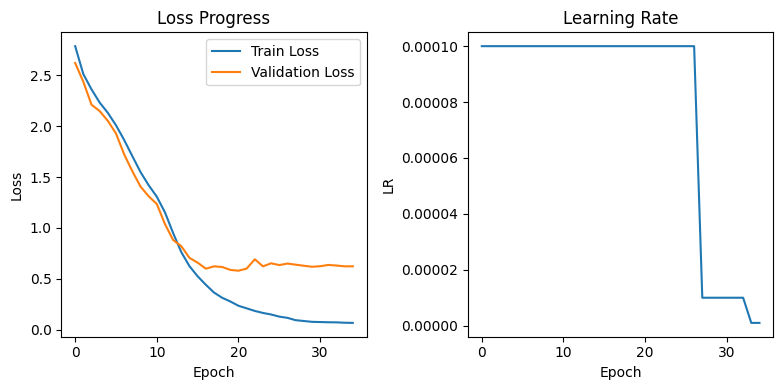

Epoch 36/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 36/50:   0%|          | 1/450 [00:00<06:37,  1.13it/s, Train Loss=0.0649, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 36/50:   0%|          | 2/450 [00:01<05:20,  1.40it/s, Train Loss=0.0614, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 36/50:   1%|          | 3/450 [00:02<04:57,  1.50it/s, Train Loss=0.0345, LR=0.000001]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 36/50:   1%|          | 4/450 [00:02<04:43,  1.58it/s, Train Loss=0.0443, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 36/50:   1%|          | 5/450 [00:03<04:37,  1.61it/s, Train Loss=0.1106, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 36/50:   1%|▏         | 6/450 [00:03<04:31,  1.63it/s, Train Loss=0.0270, LR=0.000001]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 36/50:   2%|▏         | 7/450 [00:04<04:28,  1.65it/s, Train Loss=0.0615, LR=0.000001]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 36/50:   2%|▏         | 8/450 [00:05<04:25,  1.67it/s, Train Loss=0.0309, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 36/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.0726, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 36/50:   2%|▏         | 10/450 [00:06<04:21,  1.68it/s, Train Loss=0.0247, LR=0.000001]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 36/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=0.0437, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 36/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.0644, LR=0.000001]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 36/50:   3%|▎         | 13/450 [00:08<04:19,  1.68it/s, Train Loss=0.1703, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 36/50:   3%|▎         | 14/450 [00:08<04:19,  1.68it/s, Train Loss=0.0583, LR=0.000001]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 36/50:   3%|▎         | 15/450 [00:09<04:18,  1.68it/s, Train Loss=0.0592, LR=0.000001]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 36/50:   4%|▎         | 16/450 [00:09<04:17,  1.68it/s, Train Loss=0.1025, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 36/50:   4%|▍         | 17/450 [00:10<04:18,  1.68it/s, Train Loss=0.0871, LR=0.000001]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 36/50:   4%|▍         | 18/450 [00:10<04:17,  1.68it/s, Train Loss=0.0606, LR=0.000001]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 36/50:   4%|▍         | 19/450 [00:11<04:16,  1.68it/s, Train Loss=0.0336, LR=0.000001]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/lrik5a.mpg



Epoch 36/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=0.0594, LR=0.000001]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 36/50:   5%|▍         | 21/450 [00:12<04:15,  1.68it/s, Train Loss=0.1011, LR=0.000001]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 36/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=0.2904, LR=0.000001]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 36/50:   5%|▌         | 23/450 [00:13<04:13,  1.68it/s, Train Loss=0.1021, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 36/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.1230, LR=0.000001]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 36/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=0.0939, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 36/50:   6%|▌         | 26/450 [00:15<04:12,  1.68it/s, Train Loss=0.1092, LR=0.000001]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 36/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=0.1022, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 36/50:   6%|▌         | 28/450 [00:16<04:09,  1.69it/s, Train Loss=0.1242, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 36/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.0615, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 36/50:   7%|▋         | 30/450 [00:18<04:09,  1.69it/s, Train Loss=0.0764, LR=0.000001]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 36/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.0407, LR=0.000001]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 36/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.0493, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 36/50:   7%|▋         | 33/450 [00:19<04:07,  1.68it/s, Train Loss=0.0360, LR=0.000001]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 36/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=0.0363, LR=0.000001]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 36/50:   8%|▊         | 35/450 [00:21<04:05,  1.69it/s, Train Loss=0.0494, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 36/50:   8%|▊         | 36/450 [00:21<04:05,  1.69it/s, Train Loss=0.0430, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 36/50:   8%|▊         | 37/450 [00:22<04:05,  1.69it/s, Train Loss=0.3963, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 36/50:   8%|▊         | 38/450 [00:22<04:03,  1.69it/s, Train Loss=0.0564, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 36/50:   9%|▊         | 39/450 [00:23<04:03,  1.69it/s, Train Loss=0.2284, LR=0.000001]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 36/50:   9%|▉         | 40/450 [00:24<04:03,  1.68it/s, Train Loss=0.0520, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 36/50:   9%|▉         | 41/450 [00:24<04:03,  1.68it/s, Train Loss=0.0648, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 36/50:   9%|▉         | 42/450 [00:25<04:03,  1.68it/s, Train Loss=0.0392, LR=0.000001]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 36/50:  10%|▉         | 43/450 [00:25<04:01,  1.68it/s, Train Loss=0.1271, LR=0.000001]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 36/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=0.0336, LR=0.000001]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 36/50:  10%|█         | 45/450 [00:27<04:00,  1.68it/s, Train Loss=0.0657, LR=0.000001]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 36/50:  10%|█         | 46/450 [00:27<04:00,  1.68it/s, Train Loss=0.1424, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 36/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=0.0777, LR=0.000001]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 36/50:  11%|█         | 48/450 [00:28<03:58,  1.68it/s, Train Loss=0.1384, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 36/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.0177, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 36/50:  11%|█         | 50/450 [00:29<03:57,  1.68it/s, Train Loss=0.0410, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 36/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=0.0621, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 36/50:  12%|█▏        | 52/450 [00:31<03:57,  1.67it/s, Train Loss=0.0600, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 36/50:  12%|█▏        | 53/450 [00:31<03:56,  1.68it/s, Train Loss=0.0568, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 36/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=0.1419, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 36/50:  12%|█▏        | 55/450 [00:32<03:56,  1.67it/s, Train Loss=0.0250, LR=0.000001]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 36/50:  12%|█▏        | 56/450 [00:33<03:54,  1.68it/s, Train Loss=0.0335, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 36/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=0.0320, LR=0.000001]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 36/50:  13%|█▎        | 58/450 [00:34<03:52,  1.68it/s, Train Loss=0.0495, LR=0.000001]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 36/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.0912, LR=0.000001]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 36/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.0705, LR=0.000001]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 36/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.1944, LR=0.000001]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 36/50:  14%|█▍        | 62/450 [00:37<03:50,  1.69it/s, Train Loss=0.0940, LR=0.000001]

Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 36/50:  14%|█▍        | 63/450 [00:37<03:50,  1.68it/s, Train Loss=0.0390, LR=0.000001]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 36/50:  14%|█▍        | 64/450 [00:38<03:49,  1.68it/s, Train Loss=0.0481, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 36/50:  14%|█▍        | 65/450 [00:38<03:48,  1.69it/s, Train Loss=0.2458, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 36/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=0.0322, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 36/50:  15%|█▍        | 67/450 [00:40<03:47,  1.68it/s, Train Loss=0.1266, LR=0.000001]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 36/50:  15%|█▌        | 68/450 [00:40<03:47,  1.68it/s, Train Loss=0.1230, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 36/50:  15%|█▌        | 69/450 [00:41<03:46,  1.68it/s, Train Loss=0.0491, LR=0.000001]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 36/50:  16%|█▌        | 70/450 [00:41<03:45,  1.68it/s, Train Loss=0.0453, LR=0.000001]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 36/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=0.0713, LR=0.000001]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 36/50:  16%|█▌        | 72/450 [00:43<03:44,  1.68it/s, Train Loss=0.0871, LR=0.000001]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 36/50:  16%|█▌        | 73/450 [00:43<03:44,  1.68it/s, Train Loss=0.0645, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 36/50:  16%|█▋        | 74/450 [00:44<03:43,  1.68it/s, Train Loss=0.0732, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 36/50:  17%|█▋        | 75/450 [00:44<03:42,  1.68it/s, Train Loss=0.0463, LR=0.000001]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 36/50:  17%|█▋        | 76/450 [00:45<03:42,  1.68it/s, Train Loss=0.0381, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 36/50:  17%|█▋        | 77/450 [00:46<03:41,  1.68it/s, Train Loss=0.0508, LR=0.000001]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 36/50:  17%|█▋        | 78/450 [00:46<03:41,  1.68it/s, Train Loss=0.1898, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 36/50:  18%|█▊        | 79/450 [00:47<03:40,  1.68it/s, Train Loss=0.0530, LR=0.000001]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 36/50:  18%|█▊        | 80/450 [00:47<03:39,  1.68it/s, Train Loss=0.0395, LR=0.000001]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 36/50:  18%|█▊        | 81/450 [00:48<03:39,  1.68it/s, Train Loss=0.0636, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 36/50:  18%|█▊        | 82/450 [00:49<03:40,  1.67it/s, Train Loss=0.1146, LR=0.000001]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 36/50:  18%|█▊        | 83/450 [00:49<03:39,  1.67it/s, Train Loss=0.0987, LR=0.000001]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 36/50:  19%|█▊        | 84/450 [00:50<03:38,  1.68it/s, Train Loss=0.0339, LR=0.000001]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 36/50:  19%|█▉        | 85/450 [00:50<03:36,  1.68it/s, Train Loss=0.0489, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 36/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.0811, LR=0.000001]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 36/50:  19%|█▉        | 87/450 [00:51<03:34,  1.69it/s, Train Loss=0.0535, LR=0.000001]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 36/50:  20%|█▉        | 88/450 [00:52<03:33,  1.69it/s, Train Loss=0.0784, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 36/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=0.0426, LR=0.000001]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 36/50:  20%|██        | 90/450 [00:53<03:32,  1.69it/s, Train Loss=0.0603, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 36/50:  20%|██        | 91/450 [00:54<03:31,  1.69it/s, Train Loss=0.0250, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 36/50:  20%|██        | 92/450 [00:54<03:32,  1.69it/s, Train Loss=0.0374, LR=0.000001]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 36/50:  21%|██        | 93/450 [00:55<03:30,  1.69it/s, Train Loss=0.0580, LR=0.000001]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 36/50:  21%|██        | 94/450 [00:56<03:31,  1.68it/s, Train Loss=0.0896, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 36/50:  21%|██        | 95/450 [00:56<03:30,  1.68it/s, Train Loss=0.0514, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 36/50:  21%|██▏       | 96/450 [00:57<03:31,  1.68it/s, Train Loss=0.0997, LR=0.000001]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 36/50:  22%|██▏       | 97/450 [00:57<03:30,  1.68it/s, Train Loss=0.0453, LR=0.000001]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 36/50:  22%|██▏       | 98/450 [00:58<03:29,  1.68it/s, Train Loss=0.0605, LR=0.000001]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 36/50:  22%|██▏       | 99/450 [00:59<03:28,  1.68it/s, Train Loss=0.1100, LR=0.000001]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 36/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=0.0652, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 36/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.0421, LR=0.000001]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 36/50:  23%|██▎       | 102/450 [01:00<03:26,  1.69it/s, Train Loss=0.0696, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 36/50:  23%|██▎       | 103/450 [01:01<03:25,  1.68it/s, Train Loss=0.0505, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 36/50:  23%|██▎       | 104/450 [01:02<03:24,  1.69it/s, Train Loss=0.0893, LR=0.000001]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 36/50:  23%|██▎       | 105/450 [01:02<03:25,  1.68it/s, Train Loss=0.0144, LR=0.000001]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 36/50:  24%|██▎       | 106/450 [01:03<03:23,  1.69it/s, Train Loss=0.0290, LR=0.000001]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 36/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=0.0338, LR=0.000001]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 36/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=0.0354, LR=0.000001]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 36/50:  24%|██▍       | 109/450 [01:05<03:22,  1.68it/s, Train Loss=0.1074, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 36/50:  24%|██▍       | 110/450 [01:05<03:22,  1.68it/s, Train Loss=0.0771, LR=0.000001]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 36/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=0.0401, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 36/50:  25%|██▍       | 112/450 [01:06<03:21,  1.68it/s, Train Loss=0.0673, LR=0.000001]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 36/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=0.0449, LR=0.000001]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 36/50:  25%|██▌       | 114/450 [01:08<03:19,  1.68it/s, Train Loss=0.0472, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 36/50:  26%|██▌       | 115/450 [01:08<03:18,  1.68it/s, Train Loss=0.0701, LR=0.000001]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 36/50:  26%|██▌       | 116/450 [01:09<03:18,  1.68it/s, Train Loss=0.0682, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 36/50:  26%|██▌       | 117/450 [01:09<03:17,  1.69it/s, Train Loss=0.0375, LR=0.000001]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 36/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=0.0749, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 36/50:  26%|██▋       | 119/450 [01:10<03:15,  1.69it/s, Train Loss=0.0911, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 36/50:  27%|██▋       | 120/450 [01:11<03:14,  1.69it/s, Train Loss=0.0410, LR=0.000001]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 36/50:  27%|██▋       | 121/450 [01:12<03:14,  1.69it/s, Train Loss=0.0652, LR=0.000001]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 36/50:  27%|██▋       | 122/450 [01:12<03:13,  1.69it/s, Train Loss=0.0380, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 36/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.0609, LR=0.000001]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 36/50:  28%|██▊       | 124/450 [01:13<03:13,  1.68it/s, Train Loss=0.1724, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 36/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=0.0641, LR=0.000001]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 36/50:  28%|██▊       | 126/450 [01:15<03:12,  1.68it/s, Train Loss=0.0640, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 36/50:  28%|██▊       | 127/450 [01:15<03:11,  1.68it/s, Train Loss=0.0188, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 36/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.0555, LR=0.000001]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 36/50:  29%|██▊       | 129/450 [01:16<03:10,  1.69it/s, Train Loss=0.0466, LR=0.000001]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 36/50:  29%|██▉       | 130/450 [01:17<03:10,  1.68it/s, Train Loss=0.0741, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 36/50:  29%|██▉       | 131/450 [01:18<03:09,  1.68it/s, Train Loss=0.0462, LR=0.000001]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 36/50:  29%|██▉       | 132/450 [01:18<03:09,  1.68it/s, Train Loss=0.1083, LR=0.000001]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 36/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=0.0911, LR=0.000001]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 36/50:  30%|██▉       | 134/450 [01:19<03:06,  1.69it/s, Train Loss=0.0831, LR=0.000001]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 36/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.0476, LR=0.000001]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 36/50:  30%|███       | 136/450 [01:21<03:05,  1.69it/s, Train Loss=0.0989, LR=0.000001]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 36/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.0973, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 36/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=0.0453, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 36/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=0.0810, LR=0.000001]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 36/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.0753, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 36/50:  31%|███▏      | 141/450 [01:24<03:02,  1.69it/s, Train Loss=0.1060, LR=0.000001]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 36/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.0553, LR=0.000001]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 36/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=0.0379, LR=0.000001]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 36/50:  32%|███▏      | 144/450 [01:25<03:00,  1.69it/s, Train Loss=0.0732, LR=0.000001]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 36/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.0491, LR=0.000001]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 36/50:  32%|███▏      | 146/450 [01:26<03:00,  1.69it/s, Train Loss=0.0886, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 36/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.0189, LR=0.000001]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 36/50:  33%|███▎      | 148/450 [01:28<02:59,  1.68it/s, Train Loss=0.1017, LR=0.000001]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 36/50:  33%|███▎      | 149/450 [01:28<02:58,  1.68it/s, Train Loss=0.0242, LR=0.000001]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 36/50:  33%|███▎      | 150/450 [01:29<02:58,  1.68it/s, Train Loss=0.0757, LR=0.000001]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 36/50:  34%|███▎      | 151/450 [01:29<02:59,  1.67it/s, Train Loss=0.0501, LR=0.000001]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 36/50:  34%|███▍      | 152/450 [01:30<02:58,  1.67it/s, Train Loss=0.0926, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 36/50:  34%|███▍      | 153/450 [01:31<02:57,  1.68it/s, Train Loss=0.0334, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 36/50:  34%|███▍      | 154/450 [01:31<02:55,  1.68it/s, Train Loss=0.0364, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 36/50:  34%|███▍      | 155/450 [01:32<02:55,  1.68it/s, Train Loss=0.0767, LR=0.000001]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 36/50:  35%|███▍      | 156/450 [01:32<02:54,  1.68it/s, Train Loss=0.0437, LR=0.000001]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 36/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.1224, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 36/50:  35%|███▌      | 158/450 [01:34<02:53,  1.68it/s, Train Loss=0.0159, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 36/50:  35%|███▌      | 159/450 [01:34<02:53,  1.68it/s, Train Loss=0.1080, LR=0.000001]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 36/50:  36%|███▌      | 160/450 [01:35<02:52,  1.68it/s, Train Loss=0.0125, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 36/50:  36%|███▌      | 161/450 [01:35<02:52,  1.68it/s, Train Loss=0.2590, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 36/50:  36%|███▌      | 162/450 [01:36<02:51,  1.68it/s, Train Loss=0.0170, LR=0.000001]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/brwg8p.mpg



Epoch 36/50:  36%|███▌      | 163/450 [01:37<02:50,  1.68it/s, Train Loss=0.0817, LR=0.000001]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 36/50:  36%|███▋      | 164/450 [01:37<02:49,  1.68it/s, Train Loss=0.0293, LR=0.000001]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 36/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=0.0601, LR=0.000001]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 36/50:  37%|███▋      | 166/450 [01:38<02:47,  1.69it/s, Train Loss=0.1006, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 36/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.1524, LR=0.000001]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 36/50:  37%|███▋      | 168/450 [01:40<02:47,  1.69it/s, Train Loss=0.0300, LR=0.000001]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 36/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.0412, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 36/50:  38%|███▊      | 170/450 [01:41<02:45,  1.69it/s, Train Loss=0.0474, LR=0.000001]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 36/50:  38%|███▊      | 171/450 [01:41<02:45,  1.68it/s, Train Loss=0.0492, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 36/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.0996, LR=0.000001]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 36/50:  38%|███▊      | 173/450 [01:43<02:44,  1.69it/s, Train Loss=0.1673, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 36/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.0563, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 36/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=0.0703, LR=0.000001]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 36/50:  39%|███▉      | 176/450 [01:44<02:41,  1.69it/s, Train Loss=0.0268, LR=0.000001]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 36/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.0680, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 36/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=0.0329, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 36/50:  40%|███▉      | 179/450 [01:46<02:41,  1.68it/s, Train Loss=0.0666, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 36/50:  40%|████      | 180/450 [01:47<02:40,  1.68it/s, Train Loss=0.0449, LR=0.000001]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 36/50:  40%|████      | 181/450 [01:47<02:40,  1.68it/s, Train Loss=0.0483, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 36/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=0.0712, LR=0.000001]

Attempting to read 75 frames from data/s1/pbii2p.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 36/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.0738, LR=0.000001]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 36/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.0485, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 36/50:  41%|████      | 185/450 [01:50<02:36,  1.69it/s, Train Loss=0.0584, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 36/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.0478, LR=0.000001]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 36/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.0278, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 36/50:  42%|████▏     | 188/450 [01:51<02:34,  1.69it/s, Train Loss=0.0930, LR=0.000001]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 36/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.0633, LR=0.000001]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 36/50:  42%|████▏     | 190/450 [01:53<02:34,  1.69it/s, Train Loss=0.0408, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 36/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=0.0409, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 36/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=0.0480, LR=0.000001]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 36/50:  43%|████▎     | 193/450 [01:54<02:32,  1.69it/s, Train Loss=0.0133, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 36/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.0180, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 36/50:  43%|████▎     | 195/450 [01:56<02:31,  1.69it/s, Train Loss=0.0216, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 36/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.0410, LR=0.000001]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 36/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=0.0398, LR=0.000001]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 36/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.0590, LR=0.000001]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 36/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.0804, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 36/50:  44%|████▍     | 200/450 [01:59<02:28,  1.68it/s, Train Loss=0.0672, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 36/50:  45%|████▍     | 201/450 [01:59<02:27,  1.68it/s, Train Loss=0.0529, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 36/50:  45%|████▍     | 202/450 [02:00<02:26,  1.69it/s, Train Loss=0.0458, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 36/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.0622, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 36/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.0733, LR=0.000001]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 36/50:  46%|████▌     | 205/450 [02:01<02:24,  1.69it/s, Train Loss=0.0675, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 36/50:  46%|████▌     | 206/450 [02:02<02:23,  1.70it/s, Train Loss=0.0568, LR=0.000001]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 36/50:  46%|████▌     | 207/450 [02:03<02:23,  1.69it/s, Train Loss=0.0438, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 36/50:  46%|████▌     | 208/450 [02:03<02:22,  1.69it/s, Train Loss=0.0383, LR=0.000001]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 36/50:  46%|████▋     | 209/450 [02:04<02:22,  1.70it/s, Train Loss=0.0749, LR=0.000001]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 36/50:  47%|████▋     | 210/450 [02:04<02:22,  1.68it/s, Train Loss=0.1217, LR=0.000001]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 36/50:  47%|████▋     | 211/450 [02:05<02:22,  1.68it/s, Train Loss=0.0701, LR=0.000001]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 36/50:  47%|████▋     | 212/450 [02:06<02:21,  1.68it/s, Train Loss=0.0689, LR=0.000001]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 36/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=0.0830, LR=0.000001]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 36/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=0.0657, LR=0.000001]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 36/50:  48%|████▊     | 215/450 [02:07<02:19,  1.69it/s, Train Loss=0.1477, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 36/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.0305, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 36/50:  48%|████▊     | 217/450 [02:09<02:17,  1.69it/s, Train Loss=0.0638, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 36/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.0649, LR=0.000001]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 36/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=0.0242, LR=0.000001]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 36/50:  49%|████▉     | 220/450 [02:10<02:16,  1.68it/s, Train Loss=0.0871, LR=0.000001]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 36/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=0.0956, LR=0.000001]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 36/50:  49%|████▉     | 222/450 [02:12<02:16,  1.67it/s, Train Loss=0.0489, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 36/50:  50%|████▉     | 223/450 [02:12<02:15,  1.68it/s, Train Loss=0.0352, LR=0.000001]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 36/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=0.0537, LR=0.000001]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 36/50:  50%|█████     | 225/450 [02:13<02:13,  1.68it/s, Train Loss=0.0618, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 36/50:  50%|█████     | 226/450 [02:14<02:13,  1.68it/s, Train Loss=0.0870, LR=0.000001]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 36/50:  50%|█████     | 227/450 [02:15<02:12,  1.69it/s, Train Loss=0.0597, LR=0.000001]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 36/50:  51%|█████     | 228/450 [02:15<02:11,  1.68it/s, Train Loss=0.0357, LR=0.000001]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 36/50:  51%|█████     | 229/450 [02:16<02:11,  1.68it/s, Train Loss=0.0344, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 36/50:  51%|█████     | 230/450 [02:16<02:10,  1.68it/s, Train Loss=0.0504, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 36/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=0.0457, LR=0.000001]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 36/50:  52%|█████▏    | 232/450 [02:18<02:09,  1.68it/s, Train Loss=0.0613, LR=0.000001]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 36/50:  52%|█████▏    | 233/450 [02:18<02:09,  1.68it/s, Train Loss=0.0596, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 36/50:  52%|█████▏    | 234/450 [02:19<02:08,  1.68it/s, Train Loss=0.0537, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 36/50:  52%|█████▏    | 235/450 [02:19<02:08,  1.68it/s, Train Loss=0.0562, LR=0.000001]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 36/50:  52%|█████▏    | 236/450 [02:20<02:07,  1.68it/s, Train Loss=0.0170, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 36/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.68it/s, Train Loss=0.0307, LR=0.000001]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 36/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.0386, LR=0.000001]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 36/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.69it/s, Train Loss=0.0658, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 36/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.0275, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 36/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=0.0441, LR=0.000001]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 36/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=0.0539, LR=0.000001]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 36/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.0299, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 36/50:  54%|█████▍    | 244/450 [02:25<02:01,  1.69it/s, Train Loss=0.1131, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 36/50:  54%|█████▍    | 245/450 [02:25<02:00,  1.70it/s, Train Loss=0.0538, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 36/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=0.0755, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 36/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=0.1923, LR=0.000001]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 36/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.0687, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 36/50:  55%|█████▌    | 249/450 [02:28<01:58,  1.69it/s, Train Loss=0.0781, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 36/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.0916, LR=0.000001]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 36/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=0.0668, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 36/50:  56%|█████▌    | 252/450 [02:29<01:56,  1.69it/s, Train Loss=0.0844, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 36/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0385, LR=0.000001]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 36/50:  56%|█████▋    | 254/450 [02:31<01:55,  1.69it/s, Train Loss=0.0346, LR=0.000001]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 36/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.1435, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 36/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.68it/s, Train Loss=0.0500, LR=0.000001]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 36/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.68it/s, Train Loss=0.0507, LR=0.000001]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 36/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.68it/s, Train Loss=0.0447, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbr6p.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 36/50:  58%|█████▊    | 259/450 [02:34<01:53,  1.68it/s, Train Loss=0.0268, LR=0.000001]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 36/50:  58%|█████▊    | 260/450 [02:34<01:53,  1.68it/s, Train Loss=0.0686, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 36/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=0.0696, LR=0.000001]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 36/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=0.0404, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 36/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=0.1109, LR=0.000001]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/swbc3a.mpg



Epoch 36/50:  59%|█████▊    | 264/450 [02:37<01:51,  1.68it/s, Train Loss=0.0587, LR=0.000001]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 36/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.68it/s, Train Loss=0.1208, LR=0.000001]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 36/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.68it/s, Train Loss=0.0737, LR=0.000001]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 36/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.68it/s, Train Loss=0.0453, LR=0.000001]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 36/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=0.1158, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 36/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.68it/s, Train Loss=0.0189, LR=0.000001]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 36/50:  60%|██████    | 270/450 [02:40<01:47,  1.68it/s, Train Loss=0.0562, LR=0.000001]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 36/50:  60%|██████    | 271/450 [02:41<01:46,  1.68it/s, Train Loss=0.0496, LR=0.000001]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 36/50:  60%|██████    | 272/450 [02:41<01:45,  1.68it/s, Train Loss=0.0575, LR=0.000001]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 36/50:  61%|██████    | 273/450 [02:42<01:45,  1.69it/s, Train Loss=0.0854, LR=0.000001]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 36/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.1027, LR=0.000001]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 36/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.0439, LR=0.000001]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 36/50:  61%|██████▏   | 276/450 [02:44<01:42,  1.69it/s, Train Loss=0.0422, LR=0.000001]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 36/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.0375, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 36/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=0.0753, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 36/50:  62%|██████▏   | 279/450 [02:45<01:40,  1.70it/s, Train Loss=0.0460, LR=0.000001]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 36/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.0263, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 36/50:  62%|██████▏   | 281/450 [02:47<01:40,  1.69it/s, Train Loss=0.0324, LR=0.000001]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 36/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.1012, LR=0.000001]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 36/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=0.0593, LR=0.000001]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 36/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.0560, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 36/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.0327, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 36/50:  64%|██████▎   | 286/450 [02:50<01:37,  1.69it/s, Train Loss=0.0623, LR=0.000001]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 36/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.68it/s, Train Loss=0.0350, LR=0.000001]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 36/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.69it/s, Train Loss=0.0568, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 36/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.0945, LR=0.000001]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 36/50:  64%|██████▍   | 290/450 [02:52<01:35,  1.68it/s, Train Loss=0.0351, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 36/50:  65%|██████▍   | 291/450 [02:53<01:34,  1.68it/s, Train Loss=0.0988, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 36/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.68it/s, Train Loss=0.0435, LR=0.000001]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 36/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.68it/s, Train Loss=0.0934, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaqzn.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 36/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.0445, LR=0.000001]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 36/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.0666, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 36/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.0817, LR=0.000001]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 36/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.70it/s, Train Loss=0.0513, LR=0.000001]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 36/50:  66%|██████▌   | 298/450 [02:57<01:29,  1.69it/s, Train Loss=0.0299, LR=0.000001]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 36/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.0644, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 36/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.0874, LR=0.000001]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 36/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.0398, LR=0.000001]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 36/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.0995, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 36/50:  67%|██████▋   | 303/450 [03:00<01:26,  1.69it/s, Train Loss=0.1158, LR=0.000001]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 36/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.0343, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 36/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.68it/s, Train Loss=0.0727, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 36/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=0.0570, LR=0.000001]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 36/50:  68%|██████▊   | 307/450 [03:02<01:25,  1.68it/s, Train Loss=0.0348, LR=0.000001]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 36/50:  68%|██████▊   | 308/450 [03:03<01:24,  1.68it/s, Train Loss=0.0447, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 36/50:  69%|██████▊   | 309/450 [03:03<01:24,  1.67it/s, Train Loss=0.0455, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 36/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.67it/s, Train Loss=0.0795, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 36/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.68it/s, Train Loss=0.0497, LR=0.000001]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 36/50:  69%|██████▉   | 312/450 [03:05<01:22,  1.68it/s, Train Loss=0.0724, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 36/50:  70%|██████▉   | 313/450 [03:06<01:21,  1.68it/s, Train Loss=0.0419, LR=0.000001]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 36/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.0579, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 36/50:  70%|███████   | 315/450 [03:07<01:20,  1.69it/s, Train Loss=0.0476, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 36/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=0.1310, LR=0.000001]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 36/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.2918, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 36/50:  71%|███████   | 318/450 [03:09<01:17,  1.69it/s, Train Loss=0.0608, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 36/50:  71%|███████   | 319/450 [03:09<01:17,  1.68it/s, Train Loss=0.0740, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 36/50:  71%|███████   | 320/450 [03:10<01:17,  1.69it/s, Train Loss=0.0313, LR=0.000001]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 36/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.68it/s, Train Loss=0.0624, LR=0.000001]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 36/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.0942, LR=0.000001]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 36/50:  72%|███████▏  | 323/450 [03:12<01:15,  1.68it/s, Train Loss=0.0233, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 36/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.68it/s, Train Loss=0.1224, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 36/50:  72%|███████▏  | 325/450 [03:13<01:13,  1.69it/s, Train Loss=0.1189, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 36/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.0383, LR=0.000001]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 36/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.0850, LR=0.000001]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 36/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=0.0448, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 36/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.0248, LR=0.000001]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 36/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.69it/s, Train Loss=0.0668, LR=0.000001]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 36/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.0222, LR=0.000001]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 36/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.68it/s, Train Loss=0.0364, LR=0.000001]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 36/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.68it/s, Train Loss=0.1188, LR=0.000001]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 36/50:  74%|███████▍  | 334/450 [03:18<01:09,  1.67it/s, Train Loss=0.0235, LR=0.000001]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 36/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.68it/s, Train Loss=0.0779, LR=0.000001]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 36/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=0.0197, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 36/50:  75%|███████▍  | 337/450 [03:20<01:06,  1.69it/s, Train Loss=0.0555, LR=0.000001]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 36/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.0475, LR=0.000001]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 36/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.68it/s, Train Loss=0.0419, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 36/50:  76%|███████▌  | 340/450 [03:22<01:05,  1.68it/s, Train Loss=0.0885, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 36/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.68it/s, Train Loss=0.0441, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 36/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.69it/s, Train Loss=0.0401, LR=0.000001]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 36/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.68it/s, Train Loss=0.0305, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 36/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.1006, LR=0.000001]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 36/50:  77%|███████▋  | 345/450 [03:25<01:02,  1.69it/s, Train Loss=0.0353, LR=0.000001]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 36/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.0264, LR=0.000001]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 36/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.69it/s, Train Loss=0.0670, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 36/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.1639, LR=0.000001]

Attempting to read 75 frames from data/s1/pwax5s.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 36/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.0558, LR=0.000001]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 36/50:  78%|███████▊  | 350/450 [03:28<00:59,  1.69it/s, Train Loss=0.0320, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 36/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.1174, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 36/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.69it/s, Train Loss=0.0587, LR=0.000001]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 36/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.0571, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 36/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=0.0818, LR=0.000001]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 36/50:  79%|███████▉  | 355/450 [03:31<00:56,  1.68it/s, Train Loss=0.0252, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 36/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.68it/s, Train Loss=0.0172, LR=0.000001]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 36/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.68it/s, Train Loss=0.1083, LR=0.000001]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 36/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=0.0496, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 36/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=0.0162, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 36/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.0535, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 36/50:  80%|████████  | 361/450 [03:34<00:52,  1.68it/s, Train Loss=0.0746, LR=0.000001]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 36/50:  80%|████████  | 362/450 [03:35<00:52,  1.68it/s, Train Loss=0.0575, LR=0.000001]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 36/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=0.0298, LR=0.000001]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 36/50:  81%|████████  | 364/450 [03:36<00:50,  1.69it/s, Train Loss=0.0779, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 36/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.1811, LR=0.000001]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 36/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=0.0910, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 36/50:  82%|████████▏ | 367/450 [03:38<00:49,  1.69it/s, Train Loss=0.0855, LR=0.000001]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 36/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.70it/s, Train Loss=0.0287, LR=0.000001]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 36/50:  82%|████████▏ | 369/450 [03:39<00:47,  1.70it/s, Train Loss=0.0447, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 36/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.0744, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 36/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.70it/s, Train Loss=0.0245, LR=0.000001]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 36/50:  83%|████████▎ | 372/450 [03:41<00:45,  1.70it/s, Train Loss=0.0455, LR=0.000001]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 36/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.70it/s, Train Loss=0.0328, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 36/50:  83%|████████▎ | 374/450 [03:42<00:44,  1.69it/s, Train Loss=0.0671, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 36/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.0524, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbp3s.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 36/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.1431, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 36/50:  84%|████████▍ | 377/450 [03:44<00:43,  1.69it/s, Train Loss=0.0652, LR=0.000001]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 36/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.0325, LR=0.000001]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 36/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.69it/s, Train Loss=0.0502, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 36/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.1496, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 36/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.0458, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 36/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.0748, LR=0.000001]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 36/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.0639, LR=0.000001]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 36/50:  85%|████████▌ | 384/450 [03:48<00:38,  1.69it/s, Train Loss=0.0800, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 36/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.0605, LR=0.000001]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 36/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.0288, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 36/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.0380, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 36/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.0530, LR=0.000001]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 36/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.69it/s, Train Loss=0.0946, LR=0.000001]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 36/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=0.1017, LR=0.000001]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 36/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.68it/s, Train Loss=0.0932, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 36/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.68it/s, Train Loss=0.1406, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 36/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.0746, LR=0.000001]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 36/50:  88%|████████▊ | 394/450 [03:54<00:33,  1.69it/s, Train Loss=0.0799, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 36/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.0385, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 36/50:  88%|████████▊ | 396/450 [03:55<00:31,  1.69it/s, Train Loss=0.0437, LR=0.000001]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 36/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.0710, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 36/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=0.0644, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 36/50:  89%|████████▊ | 399/450 [03:57<00:30,  1.70it/s, Train Loss=0.0995, LR=0.000001]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 36/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.0278, LR=0.000001]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 36/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.69it/s, Train Loss=0.0321, LR=0.000001]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 36/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.68it/s, Train Loss=0.0664, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 36/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=0.0401, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 36/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.70it/s, Train Loss=0.0903, LR=0.000001]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 36/50:  90%|█████████ | 405/450 [04:00<00:26,  1.70it/s, Train Loss=0.1183, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 36/50:  90%|█████████ | 406/450 [04:01<00:25,  1.70it/s, Train Loss=0.0614, LR=0.000001]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 36/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.0774, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 36/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=0.0582, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 36/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.0984, LR=0.000001]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 36/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.0594, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 36/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.69it/s, Train Loss=0.0562, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 36/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=0.0392, LR=0.000001]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 36/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.0323, LR=0.000001]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 36/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.0866, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 36/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.0605, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 36/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.69it/s, Train Loss=0.0302, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 36/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.70it/s, Train Loss=0.0929, LR=0.000001]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 36/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.70it/s, Train Loss=0.0394, LR=0.000001]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 36/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.0406, LR=0.000001]

Attempting to read 75 frames from data/s1/praj1s.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 36/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=0.0265, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 36/50:  94%|█████████▎| 421/450 [04:10<00:17,  1.69it/s, Train Loss=0.0271, LR=0.000001]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 36/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.0320, LR=0.000001]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 36/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.69it/s, Train Loss=0.0352, LR=0.000001]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 36/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=0.0549, LR=0.000001]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 36/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.68it/s, Train Loss=0.1488, LR=0.000001]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 36/50:  95%|█████████▍| 426/450 [04:13<00:14,  1.68it/s, Train Loss=0.0422, LR=0.000001]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 36/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=0.0557, LR=0.000001]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 36/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.68it/s, Train Loss=0.0203, LR=0.000001]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 36/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.0386, LR=0.000001]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 36/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.0498, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 36/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.1218, LR=0.000001]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 36/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.68it/s, Train Loss=0.0826, LR=0.000001]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 36/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.68it/s, Train Loss=0.0457, LR=0.000001]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 36/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.68it/s, Train Loss=0.0927, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 36/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.0425, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 36/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.0328, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 36/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.0400, LR=0.000001]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 36/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.69it/s, Train Loss=0.0607, LR=0.000001]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 36/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.0285, LR=0.000001]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 36/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.0469, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 36/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=0.0217, LR=0.000001]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 36/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.0398, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 36/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.69it/s, Train Loss=0.1907, LR=0.000001]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 36/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.0325, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 36/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=0.0887, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 36/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.0550, LR=0.000001]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpgAttempting to read 75 frames from data/s1/bwaazn.mpg

Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   2%|▏         | 1/50 [00:00<00:30,  1.59it/s, Val Loss=1.2177]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   2%|▏         | 1/50 [00:00<00:30,  1.59it/s, Val Loss=0.2877]

Attempting to read 75 frames from data/s1/pgwr4n.mpg



Validation:   4%|▍         | 2/50 [00:00<00:18,  2.66it/s, Val Loss=0.2877]

Attempting to read 75 frames from data/s1/swao6p.mpg



Validation:   6%|▌         | 3/50 [00:01<00:13,  3.46it/s, Val Loss=0.6218]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  4.09it/s, Val Loss=0.3071]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.43it/s, Val Loss=0.1802]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.70it/s, Val Loss=1.1176]

Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.95it/s, Val Loss=1.4709]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.10it/s, Val Loss=0.6350]

Attempting to read 75 frames from data/s1/braf9s.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:07,  5.30it/s, Val Loss=0.2910]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.37it/s, Val Loss=0.3992]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.40it/s, Val Loss=1.0034]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:06,  5.46it/s, Val Loss=0.0243]

Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:06,  5.47it/s, Val Loss=0.6251]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.44it/s, Val Loss=0.3315]

Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.40it/s, Val Loss=0.6464]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.24it/s, Val Loss=0.3908]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.30it/s, Val Loss=0.1997]

Attempting to read 75 frames from data/s1/sbag8n.mpg
Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.29it/s, Val Loss=0.2643]

Attempting to read 75 frames from data/s1/lgwm9a.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg


Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.29it/s, Val Loss=0.1729]


Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.27it/s, Val Loss=0.1729]

Attempting to read 75 frames from data/s1/bwitzp.mpg


Attempting to read 75 frames from data/s1/sbwh8p.mpg


Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.27it/s, Val Loss=0.1533]


Validation:  40%|████      | 20/50 [00:04<00:05,  5.08it/s, Val Loss=0.1533]

Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg

Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.14it/s, Val Loss=2.5544]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.22it/s, Val Loss=0.1509]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.23it/s, Val Loss=0.6041]

Attempting to read 75 frames from data/s1/bbifzp.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.38it/s, Val Loss=0.2204]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.45it/s, Val Loss=0.7476]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.52it/s, Val Loss=0.1987]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.57it/s, Val Loss=0.2342]

Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/prwd7a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:03,  5.55it/s, Val Loss=1.2793]

Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg


Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.34it/s, Val Loss=0.3562]

Attempting to read 75 frames from data/s1/sgwd2p.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.34it/s, Val Loss=2.7692]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg

Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.22it/s, Val Loss=0.9042]

Attempting to read 75 frames from data/s1/lbid3s.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.06it/s, Val Loss=0.3304]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.14it/s, Val Loss=0.4294]

Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.21it/s, Val Loss=0.1758]

Attempting to read 75 frames from data/s1/lwie6p.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.28it/s, Val Loss=0.2558]

Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/pgad8n.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.33it/s, Val Loss=0.2837]

Attempting to read 75 frames from data/s1/sgiczp.mpgAttempting to read 75 frames from data/s1/lgwtzn.mpg




Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.29it/s, Val Loss=0.6621]

Attempting to read 75 frames from data/s1/sgbj2p.mpgAttempting to read 75 frames from data/s1/pbib7s.mpg




Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.31it/s, Val Loss=0.2208]

Attempting to read 75 frames from data/s1/srbb5s.mpg
Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.31it/s, Val Loss=1.0892]

Attempting to read 75 frames from data/s1/prip1s.mpg
Attempting to read 75 frames from data/s1/lbbk6p.mpg



Validation:  80%|████████  | 40/50 [00:07<00:01,  5.36it/s, Val Loss=0.3103]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.36it/s, Val Loss=0.2702]

Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.35it/s, Val Loss=0.1230]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.35it/s, Val Loss=0.2380]

Attempting to read 75 frames from data/s1/bwanzp.mpg


Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.25it/s, Val Loss=0.2380]


Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.33it/s, Val Loss=0.2808]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.36it/s, Val Loss=0.0962]

Attempting to read 75 frames from data/s1/prap5s.mpg
Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.37it/s, Val Loss=2.7224]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 37/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 37/50:   0%|          | 1/450 [00:00<06:59,  1.07it/s, Train Loss=0.0269, LR=0.000001]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 37/50:   0%|          | 2/450 [00:01<05:28,  1.36it/s, Train Loss=0.1567, LR=0.000001]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 37/50:   1%|          | 3/450 [00:02<04:59,  1.49it/s, Train Loss=0.0661, LR=0.000001]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 37/50:   1%|          | 4/450 [00:02<04:45,  1.56it/s, Train Loss=0.0634, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaf4p.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 37/50:   1%|          | 5/450 [00:03<04:35,  1.61it/s, Train Loss=0.0174, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 37/50:   1%|▏         | 6/450 [00:03<04:31,  1.63it/s, Train Loss=0.0437, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 37/50:   2%|▏         | 7/450 [00:04<04:28,  1.65it/s, Train Loss=0.0627, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 37/50:   2%|▏         | 8/450 [00:05<04:25,  1.66it/s, Train Loss=0.0598, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 37/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.0557, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 37/50:   2%|▏         | 10/450 [00:06<04:22,  1.68it/s, Train Loss=0.0766, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 37/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=0.1273, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 37/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.0447, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 37/50:   3%|▎         | 13/450 [00:08<04:19,  1.68it/s, Train Loss=0.0476, LR=0.000001]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 37/50:   3%|▎         | 14/450 [00:08<04:17,  1.69it/s, Train Loss=0.0490, LR=0.000001]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 37/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=0.0424, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 37/50:   4%|▎         | 16/450 [00:09<04:17,  1.68it/s, Train Loss=0.0564, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 37/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=0.0529, LR=0.000001]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 37/50:   4%|▍         | 18/450 [00:11<04:17,  1.68it/s, Train Loss=0.0666, LR=0.000001]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 37/50:   4%|▍         | 19/450 [00:11<04:15,  1.68it/s, Train Loss=0.0468, LR=0.000001]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 37/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=0.0602, LR=0.000001]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 37/50:   5%|▍         | 21/450 [00:12<04:14,  1.68it/s, Train Loss=0.0593, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 37/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=0.0498, LR=0.000001]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 37/50:   5%|▌         | 23/450 [00:13<04:13,  1.68it/s, Train Loss=0.0188, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 37/50:   5%|▌         | 24/450 [00:14<04:12,  1.68it/s, Train Loss=0.0328, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 37/50:   6%|▌         | 25/450 [00:15<04:12,  1.69it/s, Train Loss=0.0700, LR=0.000001]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 37/50:   6%|▌         | 26/450 [00:15<04:11,  1.68it/s, Train Loss=0.0901, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/sbwb2n.mpg



Epoch 37/50:   6%|▌         | 27/450 [00:16<04:11,  1.68it/s, Train Loss=0.0981, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 37/50:   6%|▌         | 28/450 [00:16<04:11,  1.68it/s, Train Loss=0.0957, LR=0.000001]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 37/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.1067, LR=0.000001]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 37/50:   7%|▋         | 30/450 [00:18<04:09,  1.68it/s, Train Loss=0.0930, LR=0.000001]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 37/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.0232, LR=0.000001]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 37/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.0444, LR=0.000001]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 37/50:   7%|▋         | 33/450 [00:19<04:07,  1.69it/s, Train Loss=0.0455, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 37/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=0.0768, LR=0.000001]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 37/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=0.0688, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 37/50:   8%|▊         | 36/450 [00:21<04:05,  1.69it/s, Train Loss=0.0489, LR=0.000001]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 37/50:   8%|▊         | 37/450 [00:22<04:05,  1.68it/s, Train Loss=0.0833, LR=0.000001]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 37/50:   8%|▊         | 38/450 [00:22<04:03,  1.69it/s, Train Loss=0.0690, LR=0.000001]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 37/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.0502, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 37/50:   9%|▉         | 40/450 [00:24<04:03,  1.69it/s, Train Loss=0.1275, LR=0.000001]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 37/50:   9%|▉         | 41/450 [00:24<04:02,  1.69it/s, Train Loss=0.0671, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 37/50:   9%|▉         | 42/450 [00:25<04:02,  1.68it/s, Train Loss=0.0781, LR=0.000001]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 37/50:  10%|▉         | 43/450 [00:25<04:00,  1.69it/s, Train Loss=0.0239, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 37/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=0.0467, LR=0.000001]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 37/50:  10%|█         | 45/450 [00:27<04:01,  1.68it/s, Train Loss=0.0595, LR=0.000001]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 37/50:  10%|█         | 46/450 [00:27<04:00,  1.68it/s, Train Loss=0.1725, LR=0.000001]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 37/50:  10%|█         | 47/450 [00:28<04:00,  1.67it/s, Train Loss=0.0713, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbg1a.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 37/50:  11%|█         | 48/450 [00:28<04:00,  1.67it/s, Train Loss=0.0526, LR=0.000001]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 37/50:  11%|█         | 49/450 [00:29<03:59,  1.67it/s, Train Loss=0.0963, LR=0.000001]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 37/50:  11%|█         | 50/450 [00:30<03:58,  1.67it/s, Train Loss=0.0843, LR=0.000001]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 37/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=0.2002, LR=0.000001]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 37/50:  12%|█▏        | 52/450 [00:31<03:57,  1.68it/s, Train Loss=0.0330, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 37/50:  12%|█▏        | 53/450 [00:31<03:56,  1.68it/s, Train Loss=0.0523, LR=0.000001]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 37/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=0.0679, LR=0.000001]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 37/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=0.0780, LR=0.000001]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 37/50:  12%|█▏        | 56/450 [00:33<03:53,  1.68it/s, Train Loss=0.0310, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 37/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=0.0560, LR=0.000001]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 37/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=0.0374, LR=0.000001]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 37/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.0672, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 37/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.0510, LR=0.000001]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 37/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.3273, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 37/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=0.0229, LR=0.000001]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 37/50:  14%|█▍        | 63/450 [00:37<03:48,  1.69it/s, Train Loss=0.0266, LR=0.000001]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 37/50:  14%|█▍        | 64/450 [00:38<03:47,  1.70it/s, Train Loss=0.0761, LR=0.000001]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 37/50:  14%|█▍        | 65/450 [00:38<03:47,  1.69it/s, Train Loss=0.1619, LR=0.000001]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 37/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=0.0927, LR=0.000001]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 37/50:  15%|█▍        | 67/450 [00:40<03:47,  1.68it/s, Train Loss=0.0389, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 37/50:  15%|█▌        | 68/450 [00:40<03:46,  1.69it/s, Train Loss=0.1428, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 37/50:  15%|█▌        | 69/450 [00:41<03:46,  1.68it/s, Train Loss=0.0841, LR=0.000001]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 37/50:  16%|█▌        | 70/450 [00:41<03:46,  1.68it/s, Train Loss=0.1200, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 37/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=0.0858, LR=0.000001]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 37/50:  16%|█▌        | 72/450 [00:43<03:44,  1.68it/s, Train Loss=0.0330, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 37/50:  16%|█▌        | 73/450 [00:43<03:43,  1.69it/s, Train Loss=0.1331, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 37/50:  16%|█▋        | 74/450 [00:44<03:43,  1.69it/s, Train Loss=0.0132, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 37/50:  17%|█▋        | 75/450 [00:44<03:43,  1.68it/s, Train Loss=0.0801, LR=0.000001]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 37/50:  17%|█▋        | 76/450 [00:45<03:42,  1.68it/s, Train Loss=0.0806, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 37/50:  17%|█▋        | 77/450 [00:46<03:41,  1.68it/s, Train Loss=0.0403, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 37/50:  17%|█▋        | 78/450 [00:46<03:41,  1.68it/s, Train Loss=0.1533, LR=0.000001]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 37/50:  18%|█▊        | 79/450 [00:47<03:40,  1.68it/s, Train Loss=0.0625, LR=0.000001]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 37/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.0910, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 37/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.0846, LR=0.000001]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 37/50:  18%|█▊        | 82/450 [00:49<03:38,  1.68it/s, Train Loss=0.0293, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 37/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=0.1140, LR=0.000001]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 37/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=0.0826, LR=0.000001]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 37/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=0.0478, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 37/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.0423, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 37/50:  19%|█▉        | 87/450 [00:51<03:34,  1.69it/s, Train Loss=0.0625, LR=0.000001]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 37/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.0144, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/sgwd1s.mpg



Epoch 37/50:  20%|█▉        | 89/450 [00:53<03:34,  1.69it/s, Train Loss=0.0650, LR=0.000001]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 37/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=0.0680, LR=0.000001]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 37/50:  20%|██        | 91/450 [00:54<03:33,  1.69it/s, Train Loss=0.2004, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 37/50:  20%|██        | 92/450 [00:54<03:32,  1.69it/s, Train Loss=0.0392, LR=0.000001]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 37/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=0.1002, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 37/50:  21%|██        | 94/450 [00:56<03:31,  1.69it/s, Train Loss=0.1012, LR=0.000001]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 37/50:  21%|██        | 95/450 [00:56<03:30,  1.69it/s, Train Loss=0.0096, LR=0.000001]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 37/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.0643, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 37/50:  22%|██▏       | 97/450 [00:57<03:29,  1.68it/s, Train Loss=0.0561, LR=0.000001]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 37/50:  22%|██▏       | 98/450 [00:58<03:29,  1.68it/s, Train Loss=0.0496, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 37/50:  22%|██▏       | 99/450 [00:59<03:29,  1.68it/s, Train Loss=0.0371, LR=0.000001]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 37/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=0.0423, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 37/50:  22%|██▏       | 101/450 [01:00<03:26,  1.69it/s, Train Loss=0.0621, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 37/50:  23%|██▎       | 102/450 [01:00<03:25,  1.69it/s, Train Loss=0.0305, LR=0.000001]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 37/50:  23%|██▎       | 103/450 [01:01<03:24,  1.69it/s, Train Loss=0.0658, LR=0.000001]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 37/50:  23%|██▎       | 104/450 [01:02<03:23,  1.70it/s, Train Loss=0.0277, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 37/50:  23%|██▎       | 105/450 [01:02<03:24,  1.69it/s, Train Loss=0.0534, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 37/50:  24%|██▎       | 106/450 [01:03<03:25,  1.68it/s, Train Loss=0.1538, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 37/50:  24%|██▍       | 107/450 [01:03<03:23,  1.68it/s, Train Loss=0.0489, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 37/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.0702, LR=0.000001]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 37/50:  24%|██▍       | 109/450 [01:05<03:21,  1.69it/s, Train Loss=0.0370, LR=0.000001]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 37/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.1039, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 37/50:  25%|██▍       | 111/450 [01:06<03:21,  1.69it/s, Train Loss=0.0537, LR=0.000001]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 37/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=0.0830, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 37/50:  25%|██▌       | 113/450 [01:07<03:21,  1.68it/s, Train Loss=0.1275, LR=0.000001]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 37/50:  25%|██▌       | 114/450 [01:08<03:19,  1.68it/s, Train Loss=0.0486, LR=0.000001]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 37/50:  26%|██▌       | 115/450 [01:08<03:19,  1.68it/s, Train Loss=0.1404, LR=0.000001]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 37/50:  26%|██▌       | 116/450 [01:09<03:18,  1.68it/s, Train Loss=0.0154, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 37/50:  26%|██▌       | 117/450 [01:09<03:18,  1.68it/s, Train Loss=0.0394, LR=0.000001]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 37/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=0.0486, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 37/50:  26%|██▋       | 119/450 [01:10<03:16,  1.68it/s, Train Loss=0.1036, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 37/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.0644, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 37/50:  27%|██▋       | 121/450 [01:12<03:15,  1.68it/s, Train Loss=0.0513, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 37/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.0463, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 37/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.0501, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 37/50:  28%|██▊       | 124/450 [01:13<03:13,  1.68it/s, Train Loss=0.0693, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 37/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=0.0576, LR=0.000001]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 37/50:  28%|██▊       | 126/450 [01:15<03:12,  1.69it/s, Train Loss=0.0559, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 37/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=0.0445, LR=0.000001]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 37/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.0507, LR=0.000001]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 37/50:  29%|██▊       | 129/450 [01:16<03:09,  1.69it/s, Train Loss=0.0756, LR=0.000001]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 37/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.0409, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 37/50:  29%|██▉       | 131/450 [01:18<03:08,  1.70it/s, Train Loss=0.0461, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 37/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=0.0582, LR=0.000001]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 37/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=0.0593, LR=0.000001]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 37/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.0595, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 37/50:  30%|███       | 135/450 [01:20<03:05,  1.69it/s, Train Loss=0.0251, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 37/50:  30%|███       | 136/450 [01:21<03:06,  1.68it/s, Train Loss=0.0293, LR=0.000001]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 37/50:  30%|███       | 137/450 [01:21<03:06,  1.68it/s, Train Loss=0.0286, LR=0.000001]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 37/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=0.0521, LR=0.000001]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 37/50:  31%|███       | 139/450 [01:22<03:04,  1.68it/s, Train Loss=0.0716, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 37/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=0.1826, LR=0.000001]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 37/50:  31%|███▏      | 141/450 [01:24<03:03,  1.69it/s, Train Loss=0.0303, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 37/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.0942, LR=0.000001]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 37/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=0.0926, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 37/50:  32%|███▏      | 144/450 [01:25<03:01,  1.69it/s, Train Loss=0.0595, LR=0.000001]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 37/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.0437, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 37/50:  32%|███▏      | 146/450 [01:26<02:59,  1.69it/s, Train Loss=0.0494, LR=0.000001]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 37/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.0314, LR=0.000001]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 37/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=0.0567, LR=0.000001]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 37/50:  33%|███▎      | 149/450 [01:28<02:58,  1.68it/s, Train Loss=0.0893, LR=0.000001]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 37/50:  33%|███▎      | 150/450 [01:29<02:58,  1.68it/s, Train Loss=0.0819, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 37/50:  34%|███▎      | 151/450 [01:29<02:57,  1.68it/s, Train Loss=0.0490, LR=0.000001]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 37/50:  34%|███▍      | 152/450 [01:30<02:56,  1.69it/s, Train Loss=0.0846, LR=0.000001]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 37/50:  34%|███▍      | 153/450 [01:31<02:56,  1.69it/s, Train Loss=0.0336, LR=0.000001]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 37/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=0.0458, LR=0.000001]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 37/50:  34%|███▍      | 155/450 [01:32<02:55,  1.69it/s, Train Loss=0.0277, LR=0.000001]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 37/50:  35%|███▍      | 156/450 [01:32<02:54,  1.68it/s, Train Loss=0.0488, LR=0.000001]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 37/50:  35%|███▍      | 157/450 [01:33<02:54,  1.68it/s, Train Loss=0.0507, LR=0.000001]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 37/50:  35%|███▌      | 158/450 [01:34<02:53,  1.68it/s, Train Loss=0.1213, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 37/50:  35%|███▌      | 159/450 [01:34<02:52,  1.68it/s, Train Loss=0.1660, LR=0.000001]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 37/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.0495, LR=0.000001]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 37/50:  36%|███▌      | 161/450 [01:35<02:50,  1.69it/s, Train Loss=0.1984, LR=0.000001]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 37/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.0651, LR=0.000001]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 37/50:  36%|███▌      | 163/450 [01:37<02:50,  1.68it/s, Train Loss=0.0310, LR=0.000001]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 37/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=0.0902, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 37/50:  37%|███▋      | 165/450 [01:38<02:49,  1.68it/s, Train Loss=0.0922, LR=0.000001]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 37/50:  37%|███▋      | 166/450 [01:38<02:48,  1.68it/s, Train Loss=0.0293, LR=0.000001]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 37/50:  37%|███▋      | 167/450 [01:39<02:48,  1.68it/s, Train Loss=0.0365, LR=0.000001]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 37/50:  37%|███▋      | 168/450 [01:40<02:47,  1.68it/s, Train Loss=0.0713, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 37/50:  38%|███▊      | 169/450 [01:40<02:47,  1.68it/s, Train Loss=0.0861, LR=0.000001]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 37/50:  38%|███▊      | 170/450 [01:41<02:46,  1.69it/s, Train Loss=0.0579, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 37/50:  38%|███▊      | 171/450 [01:41<02:45,  1.69it/s, Train Loss=0.0395, LR=0.000001]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 37/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.0901, LR=0.000001]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 37/50:  38%|███▊      | 173/450 [01:42<02:44,  1.69it/s, Train Loss=0.0527, LR=0.000001]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 37/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.0713, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 37/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=0.0508, LR=0.000001]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 37/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.0460, LR=0.000001]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 37/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.0558, LR=0.000001]

Attempting to read 75 frames from data/s1/prbp9s.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 37/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=0.0411, LR=0.000001]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 37/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.1243, LR=0.000001]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 37/50:  40%|████      | 180/450 [01:47<02:39,  1.69it/s, Train Loss=0.0489, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 37/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=0.1214, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 37/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=0.0395, LR=0.000001]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 37/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.0382, LR=0.000001]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 37/50:  41%|████      | 184/450 [01:49<02:38,  1.68it/s, Train Loss=0.0627, LR=0.000001]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 37/50:  41%|████      | 185/450 [01:50<02:37,  1.68it/s, Train Loss=0.1052, LR=0.000001]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 37/50:  41%|████▏     | 186/450 [01:50<02:36,  1.68it/s, Train Loss=0.0348, LR=0.000001]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg



Epoch 37/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.0341, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 37/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=0.0485, LR=0.000001]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 37/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.2091, LR=0.000001]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 37/50:  42%|████▏     | 190/450 [01:53<02:33,  1.69it/s, Train Loss=0.0457, LR=0.000001]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 37/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=0.0353, LR=0.000001]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 37/50:  43%|████▎     | 192/450 [01:54<02:33,  1.69it/s, Train Loss=0.0855, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 37/50:  43%|████▎     | 193/450 [01:54<02:32,  1.69it/s, Train Loss=0.0515, LR=0.000001]

Attempting to read 75 frames from data/s1/pgid7a.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 37/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=0.0438, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 37/50:  43%|████▎     | 195/450 [01:56<02:32,  1.67it/s, Train Loss=0.0728, LR=0.000001]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 37/50:  44%|████▎     | 196/450 [01:56<02:31,  1.68it/s, Train Loss=0.0294, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 37/50:  44%|████▍     | 197/450 [01:57<02:30,  1.68it/s, Train Loss=0.0445, LR=0.000001]

Attempting to read 75 frames from data/s1/srbo4p.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 37/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.1167, LR=0.000001]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 37/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=0.0552, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 37/50:  44%|████▍     | 200/450 [01:59<02:28,  1.68it/s, Train Loss=0.0487, LR=0.000001]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 37/50:  45%|████▍     | 201/450 [01:59<02:27,  1.68it/s, Train Loss=0.0474, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 37/50:  45%|████▍     | 202/450 [02:00<02:26,  1.69it/s, Train Loss=0.0853, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 37/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.0177, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 37/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.0805, LR=0.000001]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 37/50:  46%|████▌     | 205/450 [02:01<02:24,  1.69it/s, Train Loss=0.0340, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 37/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.0376, LR=0.000001]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 37/50:  46%|████▌     | 207/450 [02:03<02:24,  1.69it/s, Train Loss=0.0332, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 37/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.0276, LR=0.000001]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 37/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.0391, LR=0.000001]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 37/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=0.1126, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 37/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.0764, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 37/50:  47%|████▋     | 212/450 [02:06<02:20,  1.69it/s, Train Loss=0.0432, LR=0.000001]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 37/50:  47%|████▋     | 213/450 [02:06<02:19,  1.69it/s, Train Loss=0.0330, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 37/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=0.1070, LR=0.000001]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 37/50:  48%|████▊     | 215/450 [02:07<02:18,  1.69it/s, Train Loss=0.0393, LR=0.000001]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 37/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.2187, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 37/50:  48%|████▊     | 217/450 [02:09<02:17,  1.69it/s, Train Loss=0.0644, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 37/50:  48%|████▊     | 218/450 [02:09<02:16,  1.69it/s, Train Loss=0.0641, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 37/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=0.0418, LR=0.000001]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 37/50:  49%|████▉     | 220/450 [02:10<02:16,  1.68it/s, Train Loss=0.0885, LR=0.000001]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 37/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=0.0500, LR=0.000001]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 37/50:  49%|████▉     | 222/450 [02:12<02:14,  1.69it/s, Train Loss=0.0670, LR=0.000001]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 37/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.0682, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 37/50:  50%|████▉     | 224/450 [02:13<02:14,  1.69it/s, Train Loss=0.0661, LR=0.000001]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 37/50:  50%|█████     | 225/450 [02:13<02:13,  1.69it/s, Train Loss=0.0726, LR=0.000001]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 37/50:  50%|█████     | 226/450 [02:14<02:12,  1.70it/s, Train Loss=0.0650, LR=0.000001]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 37/50:  50%|█████     | 227/450 [02:14<02:11,  1.69it/s, Train Loss=0.0859, LR=0.000001]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 37/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.0490, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 37/50:  51%|█████     | 229/450 [02:16<02:10,  1.69it/s, Train Loss=0.0529, LR=0.000001]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 37/50:  51%|█████     | 230/450 [02:16<02:09,  1.70it/s, Train Loss=0.0543, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/swab9a.mpg



Epoch 37/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.70it/s, Train Loss=0.0476, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 37/50:  52%|█████▏    | 232/450 [02:17<02:08,  1.69it/s, Train Loss=0.0337, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 37/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.1248, LR=0.000001]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 37/50:  52%|█████▏    | 234/450 [02:19<02:07,  1.69it/s, Train Loss=0.0627, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 37/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.1367, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 37/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.0907, LR=0.000001]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 37/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.69it/s, Train Loss=0.0377, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 37/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.0643, LR=0.000001]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 37/50:  53%|█████▎    | 239/450 [02:22<02:04,  1.69it/s, Train Loss=0.1023, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 37/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.1047, LR=0.000001]

Attempting to read 75 frames from data/s1/prwk1a.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 37/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=0.0325, LR=0.000001]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 37/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=0.0409, LR=0.000001]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 37/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.0557, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 37/50:  54%|█████▍    | 244/450 [02:25<02:02,  1.69it/s, Train Loss=0.0641, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 37/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.1049, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/pbav4p.mpg



Epoch 37/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=0.0725, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 37/50:  55%|█████▍    | 247/450 [02:26<01:59,  1.69it/s, Train Loss=0.1242, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 37/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.0330, LR=0.000001]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 37/50:  55%|█████▌    | 249/450 [02:28<01:58,  1.69it/s, Train Loss=0.0242, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 37/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.68it/s, Train Loss=0.0987, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 37/50:  56%|█████▌    | 251/450 [02:29<01:58,  1.69it/s, Train Loss=0.0621, LR=0.000001]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 37/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=0.0694, LR=0.000001]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 37/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0402, LR=0.000001]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 37/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.69it/s, Train Loss=0.0502, LR=0.000001]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 37/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.0587, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 37/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.69it/s, Train Loss=0.1173, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 37/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.0405, LR=0.000001]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 37/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.1561, LR=0.000001]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 37/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=0.0481, LR=0.000001]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/sbbh3s.mpg



Epoch 37/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=0.0410, LR=0.000001]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 37/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.69it/s, Train Loss=0.0468, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 37/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=0.0359, LR=0.000001]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 37/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=0.0252, LR=0.000001]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 37/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.69it/s, Train Loss=0.0619, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 37/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.0780, LR=0.000001]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 37/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.69it/s, Train Loss=0.1262, LR=0.000001]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 37/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.68it/s, Train Loss=0.1045, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 37/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=0.1527, LR=0.000001]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 37/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.0418, LR=0.000001]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 37/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.0595, LR=0.000001]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 37/50:  60%|██████    | 271/450 [02:41<01:46,  1.69it/s, Train Loss=0.0805, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 37/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.0501, LR=0.000001]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 37/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.0491, LR=0.000001]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 37/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.0499, LR=0.000001]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 37/50:  61%|██████    | 275/450 [02:43<01:43,  1.68it/s, Train Loss=0.0701, LR=0.000001]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 37/50:  61%|██████▏   | 276/450 [02:44<01:43,  1.68it/s, Train Loss=0.0395, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 37/50:  62%|██████▏   | 277/450 [02:44<01:43,  1.67it/s, Train Loss=0.0457, LR=0.000001]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 37/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.68it/s, Train Loss=0.0308, LR=0.000001]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 37/50:  62%|██████▏   | 279/450 [02:45<01:42,  1.68it/s, Train Loss=0.1014, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 37/50:  62%|██████▏   | 280/450 [02:46<01:41,  1.68it/s, Train Loss=0.0690, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 37/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.68it/s, Train Loss=0.0969, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 37/50:  63%|██████▎   | 282/450 [02:47<01:40,  1.67it/s, Train Loss=0.0277, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 37/50:  63%|██████▎   | 283/450 [02:48<01:39,  1.67it/s, Train Loss=0.1986, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 37/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.68it/s, Train Loss=0.0581, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 37/50:  63%|██████▎   | 285/450 [02:49<01:38,  1.68it/s, Train Loss=0.0376, LR=0.000001]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 37/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.68it/s, Train Loss=0.1322, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 37/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.0435, LR=0.000001]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 37/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.69it/s, Train Loss=0.0261, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 37/50:  64%|██████▍   | 289/450 [02:51<01:34,  1.70it/s, Train Loss=0.0596, LR=0.000001]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 37/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.0434, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 37/50:  65%|██████▍   | 291/450 [02:52<01:33,  1.70it/s, Train Loss=0.0596, LR=0.000001]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 37/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.70it/s, Train Loss=0.1051, LR=0.000001]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 37/50:  65%|██████▌   | 293/450 [02:54<01:32,  1.70it/s, Train Loss=0.0341, LR=0.000001]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 37/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.0196, LR=0.000001]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 37/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.0471, LR=0.000001]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 37/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.68it/s, Train Loss=0.1309, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 37/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.0587, LR=0.000001]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 37/50:  66%|██████▌   | 298/450 [02:57<01:29,  1.69it/s, Train Loss=0.0679, LR=0.000001]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 37/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.2091, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 37/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.0551, LR=0.000001]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 37/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.68it/s, Train Loss=0.1067, LR=0.000001]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 37/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.0672, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 37/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.69it/s, Train Loss=0.0521, LR=0.000001]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 37/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.1341, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 37/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=0.0277, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 37/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.0488, LR=0.000001]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg



Epoch 37/50:  68%|██████▊   | 307/450 [03:02<01:25,  1.68it/s, Train Loss=0.0526, LR=0.000001]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 37/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.68it/s, Train Loss=0.0734, LR=0.000001]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 37/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.0519, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 37/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.68it/s, Train Loss=0.0733, LR=0.000001]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 37/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.68it/s, Train Loss=0.0741, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 37/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.68it/s, Train Loss=0.0709, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 37/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.68it/s, Train Loss=0.0515, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 37/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.68it/s, Train Loss=0.0562, LR=0.000001]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 37/50:  70%|███████   | 315/450 [03:07<01:20,  1.69it/s, Train Loss=0.0718, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 37/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=0.0204, LR=0.000001]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 37/50:  70%|███████   | 317/450 [03:08<01:19,  1.68it/s, Train Loss=0.1209, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 37/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.1076, LR=0.000001]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 37/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.0920, LR=0.000001]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 37/50:  71%|███████   | 320/450 [03:10<01:16,  1.69it/s, Train Loss=0.0245, LR=0.000001]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 37/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.0390, LR=0.000001]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 37/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.1041, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 37/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.1141, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 37/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.0402, LR=0.000001]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 37/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.68it/s, Train Loss=0.0707, LR=0.000001]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 37/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.68it/s, Train Loss=0.0634, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 37/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.0448, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 37/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.0691, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 37/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.68it/s, Train Loss=0.0314, LR=0.000001]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 37/50:  73%|███████▎  | 330/450 [03:16<01:10,  1.69it/s, Train Loss=0.0468, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 37/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.0565, LR=0.000001]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 37/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.68it/s, Train Loss=0.0273, LR=0.000001]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 37/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.68it/s, Train Loss=0.0419, LR=0.000001]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 37/50:  74%|███████▍  | 334/450 [03:18<01:09,  1.68it/s, Train Loss=0.1654, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 37/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.68it/s, Train Loss=0.0641, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 37/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=0.0343, LR=0.000001]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 37/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.69it/s, Train Loss=0.0601, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 37/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.0200, LR=0.000001]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 37/50:  75%|███████▌  | 339/450 [03:21<01:06,  1.68it/s, Train Loss=0.0793, LR=0.000001]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 37/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.69it/s, Train Loss=0.0385, LR=0.000001]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 37/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.69it/s, Train Loss=0.0646, LR=0.000001]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 37/50:  76%|███████▌  | 342/450 [03:23<01:03,  1.69it/s, Train Loss=0.0465, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit6p.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 37/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.0517, LR=0.000001]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 37/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.70it/s, Train Loss=0.0362, LR=0.000001]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 37/50:  77%|███████▋  | 345/450 [03:24<01:01,  1.70it/s, Train Loss=0.0764, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 37/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.68it/s, Train Loss=0.0809, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 37/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.68it/s, Train Loss=0.0556, LR=0.000001]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 37/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.67it/s, Train Loss=0.1450, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 37/50:  78%|███████▊  | 349/450 [03:27<01:00,  1.67it/s, Train Loss=0.0304, LR=0.000001]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 37/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.68it/s, Train Loss=0.0470, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 37/50:  78%|███████▊  | 351/450 [03:28<00:59,  1.68it/s, Train Loss=0.0418, LR=0.000001]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 37/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.68it/s, Train Loss=0.0403, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 37/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=0.0454, LR=0.000001]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 37/50:  79%|███████▊  | 354/450 [03:30<00:57,  1.68it/s, Train Loss=0.1104, LR=0.000001]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/bwam8n.mpg



Epoch 37/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.68it/s, Train Loss=0.0679, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 37/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.68it/s, Train Loss=0.0508, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 37/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.68it/s, Train Loss=0.0617, LR=0.000001]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 37/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=0.0837, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 37/50:  80%|███████▉  | 359/450 [03:33<00:54,  1.68it/s, Train Loss=0.0643, LR=0.000001]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 37/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.0859, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 37/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.0513, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 37/50:  80%|████████  | 362/450 [03:35<00:51,  1.69it/s, Train Loss=0.0209, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 37/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.0674, LR=0.000001]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 37/50:  81%|████████  | 364/450 [03:36<00:50,  1.69it/s, Train Loss=0.0671, LR=0.000001]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 37/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.0455, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 37/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=0.0434, LR=0.000001]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 37/50:  82%|████████▏ | 367/450 [03:37<00:48,  1.70it/s, Train Loss=0.0385, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 37/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.0537, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 37/50:  82%|████████▏ | 369/450 [03:39<00:47,  1.69it/s, Train Loss=0.0877, LR=0.000001]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 37/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.0431, LR=0.000001]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 37/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.0310, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 37/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.0267, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbmzn.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 37/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.0322, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 37/50:  83%|████████▎ | 374/450 [03:42<00:44,  1.69it/s, Train Loss=0.1162, LR=0.000001]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 37/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.0249, LR=0.000001]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 37/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.0553, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 37/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.1246, LR=0.000001]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 37/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.0570, LR=0.000001]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 37/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.68it/s, Train Loss=0.1567, LR=0.000001]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 37/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.68it/s, Train Loss=0.0539, LR=0.000001]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 37/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.0463, LR=0.000001]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 37/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.0702, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 37/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.1513, LR=0.000001]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 37/50:  85%|████████▌ | 384/450 [03:48<00:38,  1.69it/s, Train Loss=0.0901, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 37/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.0567, LR=0.000001]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 37/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.0239, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 37/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=0.0683, LR=0.000001]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 37/50:  86%|████████▌ | 388/450 [03:50<00:37,  1.67it/s, Train Loss=0.1132, LR=0.000001]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 37/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.67it/s, Train Loss=0.0503, LR=0.000001]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 37/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=0.0314, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 37/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.68it/s, Train Loss=0.0193, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 37/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.68it/s, Train Loss=0.0467, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 37/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.68it/s, Train Loss=0.1057, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 37/50:  88%|████████▊ | 394/450 [03:54<00:33,  1.68it/s, Train Loss=0.0439, LR=0.000001]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 37/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.67it/s, Train Loss=0.0595, LR=0.000001]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 37/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=0.0198, LR=0.000001]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 37/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.68it/s, Train Loss=0.0941, LR=0.000001]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 37/50:  88%|████████▊ | 398/450 [03:56<00:31,  1.68it/s, Train Loss=0.0600, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 37/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.68it/s, Train Loss=0.0370, LR=0.000001]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/pgwe8p.mpg



Epoch 37/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=0.1078, LR=0.000001]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 37/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.68it/s, Train Loss=0.0619, LR=0.000001]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 37/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.0585, LR=0.000001]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 37/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.68it/s, Train Loss=0.0475, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 37/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.68it/s, Train Loss=0.0959, LR=0.000001]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 37/50:  90%|█████████ | 405/450 [04:00<00:26,  1.68it/s, Train Loss=0.0508, LR=0.000001]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/brwg8p.mpg



Epoch 37/50:  90%|█████████ | 406/450 [04:01<00:26,  1.68it/s, Train Loss=0.0639, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 37/50:  90%|█████████ | 407/450 [04:01<00:25,  1.68it/s, Train Loss=0.0297, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 37/50:  91%|█████████ | 408/450 [04:02<00:24,  1.68it/s, Train Loss=0.0251, LR=0.000001]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 37/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.0590, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 37/50:  91%|█████████ | 410/450 [04:03<00:23,  1.68it/s, Train Loss=0.0689, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 37/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.69it/s, Train Loss=0.0581, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 37/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=0.0266, LR=0.000001]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 37/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.68it/s, Train Loss=0.0643, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 37/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.1029, LR=0.000001]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 37/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.0917, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 37/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.69it/s, Train Loss=0.1073, LR=0.000001]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 37/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.0585, LR=0.000001]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 37/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=0.0368, LR=0.000001]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 37/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.68it/s, Train Loss=0.1489, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 37/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=0.0223, LR=0.000001]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 37/50:  94%|█████████▎| 421/450 [04:10<00:17,  1.68it/s, Train Loss=0.0674, LR=0.000001]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 37/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.0238, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 37/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.69it/s, Train Loss=0.0674, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 37/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=0.0387, LR=0.000001]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 37/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.2034, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 37/50:  95%|█████████▍| 426/450 [04:13<00:14,  1.68it/s, Train Loss=0.0779, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 37/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.1306, LR=0.000001]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 37/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=0.0786, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 37/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.0347, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 37/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.0288, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 37/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.68it/s, Train Loss=0.0507, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 37/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.68it/s, Train Loss=0.0833, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 37/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.68it/s, Train Loss=0.0422, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 37/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.68it/s, Train Loss=0.0467, LR=0.000001]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 37/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.1066, LR=0.000001]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 37/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.0811, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 37/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=0.1185, LR=0.000001]

Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 37/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.68it/s, Train Loss=0.0187, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 37/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.0508, LR=0.000001]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 37/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.0256, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 37/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=0.0658, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 37/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=0.0366, LR=0.000001]

Attempting to read 75 frames from data/s1/praj1s.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 37/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.69it/s, Train Loss=0.0863, LR=0.000001]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 37/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.0620, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 37/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=0.0607, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 37/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.0370, LR=0.000001]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpgAttempting to read 75 frames from data/s1/pwby1a.mpg

Attempting to read 75 frames from data/s1/bwaazn.mpg

Validation:   2%|▏         | 1/50 [00:00<00:28,  1.71it/s, Val Loss=1.2156]

Attempting to read 75 frames from data/s1/lbbezn.mpg



Validation:   4%|▍         | 2/50 [00:00<00:16,  2.85it/s, Val Loss=0.2893]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   6%|▌         | 3/50 [00:00<00:12,  3.63it/s, Val Loss=0.6128]

Attempting to read 75 frames from data/s1/pgwr4n.mpgAttempting to read 75 frames from data/s1/sgio7s.mpg




Validation:   8%|▊         | 4/50 [00:01<00:11,  4.17it/s, Val Loss=0.3050]

Attempting to read 75 frames from data/s1/pbav3s.mpgAttempting to read 75 frames from data/s1/swao6p.mpg




Validation:   8%|▊         | 4/50 [00:01<00:11,  4.17it/s, Val Loss=0.1805]

Attempting to read 75 frames from data/s1/srao1a.mpg


Validation:  10%|█         | 5/50 [00:01<00:10,  4.30it/s, Val Loss=0.1805]

Attempting to read 75 frames from data/s1/pwix3a.mpg




Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.65it/s, Val Loss=1.1222]

Attempting to read 75 frames from data/s1/lbakzn.mpg

Attempting to read 75 frames from data/s1/bwbg8n.mpg

Attempting to read 75 frames from data/s1/pbwx3a.mpgAttempting to read 75 frames from data/s1/lray5s.mpg


Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.65it/s, Val Loss=1.4620]



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.89it/s, Val Loss=1.4620]


Validation:  16%|█▌        | 8/50 [00:01<00:08,  5.05it/s, Val Loss=0.6362]

Attempting to read 75 frames from data/s1/lbby5a.mpg

Attempting to read 75 frames from data/s1/bril9s.mpg



Attempting to read 75 frames from data/s1/braf9s.mpg

Validation:  18%|█▊        | 9/50 [00:02<00:07,  5.13it/s, Val Loss=0.2825]

Attempting to read 75 frames from data/s1/bwim7a.mpg




Validation:  20%|██        | 10/50 [00:02<00:07,  5.23it/s, Val Loss=0.4019]

Attempting to read 75 frames from data/s1/bram5a.mpg

Attempting to read 75 frames from data/s1/brimzp.mpg

Attempting to read 75 frames from data/s1/lwbszn.mpgAttempting to read 75 frames from data/s1/brbg3s.mpg




Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.17it/s, Val Loss=1.0139]

Attempting to read 75 frames from data/s1/sgap3a.mpgAttempting to read 75 frames from data/s1/srah4n.mpg




Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.24it/s, Val Loss=0.0233]

Attempting to read 75 frames from data/s1/prii7s.mpgAttempting to read 75 frames from data/s1/pbwj2n.mpg




Validation:  26%|██▌       | 13/50 [00:02<00:06,  5.36it/s, Val Loss=0.6119]

Attempting to read 75 frames from data/s1/bbir9a.mpgAttempting to read 75 frames from data/s1/lgil5s.mpg




Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.47it/s, Val Loss=0.3539]

Attempting to read 75 frames from data/s1/lriq8p.mpg


Attempting to read 75 frames from data/s1/lgbs9a.mpg

Validation:  30%|███       | 15/50 [00:03<00:06,  5.46it/s, Val Loss=0.6382]


Attempting to read 75 frames from data/s1/bwim4n.mpgAttempting to read 75 frames from data/s1/prwx7s.mpg




Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.42it/s, Val Loss=0.3906]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg


Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.48it/s, Val Loss=0.2018]


Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.45it/s, Val Loss=0.2673]

Attempting to read 75 frames from data/s1/lwie4n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.41it/s, Val Loss=0.1755]

Attempting to read 75 frames from data/s1/sbag8n.mpg
Attempting to read 75 frames from data/s1/bwitzp.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.44it/s, Val Loss=0.1546]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.38it/s, Val Loss=2.5480]

Attempting to read 75 frames from data/s1/sbwh8p.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpgAttempting to read 75 frames from data/s1/lrbr5s.mpg




Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.35it/s, Val Loss=0.1532]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.38it/s, Val Loss=0.5739]

Attempting to read 75 frames from data/s1/bbifzp.mpgAttempting to read 75 frames from data/s1/lrbl1s.mpg




Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.46it/s, Val Loss=0.2207]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.49it/s, Val Loss=0.7621]

Attempting to read 75 frames from data/s1/sgav4n.mpgAttempting to read 75 frames from data/s1/bgwu7s.mpg




Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.54it/s, Val Loss=0.1966]

Attempting to read 75 frames from data/s1/bgin3a.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.53it/s, Val Loss=0.2387]

Attempting to read 75 frames from data/s1/lgwt3a.mpg
Attempting to read 75 frames from data/s1/prwd7a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.50it/s, Val Loss=1.2752]

Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.54it/s, Val Loss=0.3520]

Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/sgwd2p.mpg



Validation:  60%|██████    | 30/50 [00:05<00:03,  5.53it/s, Val Loss=2.7451]

Attempting to read 75 frames from data/s1/prbq1a.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.49it/s, Val Loss=0.8435]

Attempting to read 75 frames from data/s1/bwat2n.mpg
Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.47it/s, Val Loss=0.3364]

Attempting to read 75 frames from data/s1/sria7s.mpgAttempting to read 75 frames from data/s1/bwag4n.mpg




Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.26it/s, Val Loss=0.4295]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.27it/s, Val Loss=0.1756]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  70%|███████   | 35/50 [00:06<00:02,  5.21it/s, Val Loss=0.2566]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.29it/s, Val Loss=0.2886]

Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.29it/s, Val Loss=0.6825]

Attempting to read 75 frames from data/s1/sgiczp.mpg


Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.35it/s, Val Loss=0.6825]


Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/srbb5s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.32it/s, Val Loss=0.2164]

Attempting to read 75 frames from data/s1/sgbj2p.mpg
Attempting to read 75 frames from data/s1/bwwu3a.mpg


Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.37it/s, Val Loss=1.0994]



Attempting to read 75 frames from data/s1/lbbk6p.mpg


Validation:  80%|████████  | 40/50 [00:07<00:01,  5.40it/s, Val Loss=0.3093]

Attempting to read 75 frames from data/s1/prip1s.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/pgiq2n.mpg

Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.42it/s, Val Loss=0.2602]

Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.35it/s, Val Loss=0.1241]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.39it/s, Val Loss=0.2401]

Attempting to read 75 frames from data/s1/lbax9s.mpgAttempting to read 75 frames from data/s1/sgav7a.mpg

Attempting to read 75 frames from data/s1/bbwgzn.mpg


Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.39it/s, Val Loss=0.2865]


Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.35it/s, Val Loss=0.2865]

Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.38it/s, Val Loss=0.0992]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg


Validation:  92%|█████████▏| 46/50 [00:08<00:00,  5.41it/s, Val Loss=2.7248]


Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 38/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpgAttempting to read 75 frames from data/s1/sgwx3s.mpg

Attempting to read 75 frames from data/s1/sgbp6p.mpgAttempting to read 75 frames from data/s1/bbwg3a.mpg

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 38/50:   0%|          | 1/450 [00:00<06:43,  1.11it/s, Train Loss=0.0430, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 38/50:   0%|          | 2/450 [00:01<05:22,  1.39it/s, Train Loss=0.0655, LR=0.000001]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 38/50:   1%|          | 3/450 [00:02<04:55,  1.51it/s, Train Loss=0.0531, LR=0.000001]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 38/50:   1%|          | 4/450 [00:02<04:41,  1.58it/s, Train Loss=0.1001, LR=0.000001]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 38/50:   1%|          | 5/450 [00:03<04:35,  1.62it/s, Train Loss=0.0679, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 38/50:   1%|▏         | 6/450 [00:03<04:31,  1.64it/s, Train Loss=0.2588, LR=0.000001]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 38/50:   2%|▏         | 7/450 [00:04<04:28,  1.65it/s, Train Loss=0.2511, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 38/50:   2%|▏         | 8/450 [00:05<04:25,  1.67it/s, Train Loss=0.1375, LR=0.000001]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 38/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.0637, LR=0.000001]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 38/50:   2%|▏         | 10/450 [00:06<04:22,  1.68it/s, Train Loss=0.0939, LR=0.000001]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 38/50:   2%|▏         | 11/450 [00:06<04:22,  1.67it/s, Train Loss=0.0438, LR=0.000001]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 38/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.0635, LR=0.000001]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 38/50:   3%|▎         | 13/450 [00:08<04:20,  1.68it/s, Train Loss=0.0486, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 38/50:   3%|▎         | 14/450 [00:08<04:19,  1.68it/s, Train Loss=0.0553, LR=0.000001]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 38/50:   3%|▎         | 15/450 [00:09<04:18,  1.68it/s, Train Loss=0.0451, LR=0.000001]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 38/50:   4%|▎         | 16/450 [00:09<04:17,  1.68it/s, Train Loss=0.0566, LR=0.000001]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 38/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=0.0353, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbr6p.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 38/50:   4%|▍         | 18/450 [00:10<04:16,  1.69it/s, Train Loss=0.0518, LR=0.000001]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 38/50:   4%|▍         | 19/450 [00:11<04:15,  1.69it/s, Train Loss=0.0447, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbv6n.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 38/50:   4%|▍         | 20/450 [00:12<04:15,  1.69it/s, Train Loss=0.0410, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 38/50:   5%|▍         | 21/450 [00:12<04:15,  1.68it/s, Train Loss=0.0421, LR=0.000001]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 38/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=0.0199, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 38/50:   5%|▌         | 23/450 [00:13<04:14,  1.68it/s, Train Loss=0.0480, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 38/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.0397, LR=0.000001]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 38/50:   6%|▌         | 25/450 [00:15<04:12,  1.68it/s, Train Loss=0.0811, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 38/50:   6%|▌         | 26/450 [00:15<04:12,  1.68it/s, Train Loss=0.0440, LR=0.000001]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 38/50:   6%|▌         | 27/450 [00:16<04:12,  1.68it/s, Train Loss=0.2867, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 38/50:   6%|▌         | 28/450 [00:16<04:11,  1.68it/s, Train Loss=0.0980, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 38/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.1477, LR=0.000001]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 38/50:   7%|▋         | 30/450 [00:18<04:09,  1.68it/s, Train Loss=0.0896, LR=0.000001]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 38/50:   7%|▋         | 31/450 [00:18<04:09,  1.68it/s, Train Loss=0.0745, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 38/50:   7%|▋         | 32/450 [00:19<04:09,  1.68it/s, Train Loss=0.0664, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 38/50:   7%|▋         | 33/450 [00:19<04:07,  1.68it/s, Train Loss=0.0590, LR=0.000001]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 38/50:   8%|▊         | 34/450 [00:20<04:06,  1.69it/s, Train Loss=0.0425, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 38/50:   8%|▊         | 35/450 [00:21<04:05,  1.69it/s, Train Loss=0.0529, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 38/50:   8%|▊         | 36/450 [00:21<04:04,  1.69it/s, Train Loss=0.1432, LR=0.000001]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 38/50:   8%|▊         | 37/450 [00:22<04:04,  1.69it/s, Train Loss=0.1506, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 38/50:   8%|▊         | 38/450 [00:22<04:03,  1.69it/s, Train Loss=0.0557, LR=0.000001]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 38/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.0574, LR=0.000001]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 38/50:   9%|▉         | 40/450 [00:24<04:03,  1.68it/s, Train Loss=0.0712, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 38/50:   9%|▉         | 41/450 [00:24<04:03,  1.68it/s, Train Loss=0.0553, LR=0.000001]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 38/50:   9%|▉         | 42/450 [00:25<04:02,  1.68it/s, Train Loss=0.0370, LR=0.000001]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 38/50:  10%|▉         | 43/450 [00:25<04:01,  1.69it/s, Train Loss=0.0547, LR=0.000001]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 38/50:  10%|▉         | 44/450 [00:26<04:01,  1.68it/s, Train Loss=0.0306, LR=0.000001]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 38/50:  10%|█         | 45/450 [00:27<04:00,  1.68it/s, Train Loss=0.0389, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 38/50:  10%|█         | 46/450 [00:27<03:59,  1.68it/s, Train Loss=0.0477, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 38/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=0.0757, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 38/50:  11%|█         | 48/450 [00:28<03:58,  1.69it/s, Train Loss=0.0244, LR=0.000001]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 38/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.0510, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 38/50:  11%|█         | 50/450 [00:29<03:57,  1.69it/s, Train Loss=0.0215, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 38/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=0.0512, LR=0.000001]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 38/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=0.0714, LR=0.000001]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 38/50:  12%|█▏        | 53/450 [00:31<03:55,  1.69it/s, Train Loss=0.0231, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 38/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=0.0950, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 38/50:  12%|█▏        | 55/450 [00:32<03:54,  1.68it/s, Train Loss=0.0399, LR=0.000001]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 38/50:  12%|█▏        | 56/450 [00:33<03:55,  1.67it/s, Train Loss=0.0748, LR=0.000001]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 38/50:  13%|█▎        | 57/450 [00:34<03:54,  1.67it/s, Train Loss=0.1231, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 38/50:  13%|█▎        | 58/450 [00:34<03:53,  1.68it/s, Train Loss=0.0297, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 38/50:  13%|█▎        | 59/450 [00:35<03:52,  1.69it/s, Train Loss=0.0562, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 38/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.0495, LR=0.000001]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 38/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.0315, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 38/50:  14%|█▍        | 62/450 [00:37<03:50,  1.68it/s, Train Loss=0.0410, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 38/50:  14%|█▍        | 63/450 [00:37<03:49,  1.68it/s, Train Loss=0.0485, LR=0.000001]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 38/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.0597, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 38/50:  14%|█▍        | 65/450 [00:38<03:48,  1.69it/s, Train Loss=0.0272, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 38/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=0.1306, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 38/50:  15%|█▍        | 67/450 [00:40<03:46,  1.69it/s, Train Loss=0.0941, LR=0.000001]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 38/50:  15%|█▌        | 68/450 [00:40<03:46,  1.69it/s, Train Loss=0.0414, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 38/50:  15%|█▌        | 69/450 [00:41<03:46,  1.68it/s, Train Loss=0.0377, LR=0.000001]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 38/50:  16%|█▌        | 70/450 [00:41<03:45,  1.68it/s, Train Loss=0.0505, LR=0.000001]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 38/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=0.0622, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 38/50:  16%|█▌        | 72/450 [00:43<03:44,  1.68it/s, Train Loss=0.0347, LR=0.000001]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 38/50:  16%|█▌        | 73/450 [00:43<03:44,  1.68it/s, Train Loss=0.1062, LR=0.000001]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 38/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=0.0939, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 38/50:  17%|█▋        | 75/450 [00:44<03:42,  1.69it/s, Train Loss=0.0459, LR=0.000001]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 38/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=0.1133, LR=0.000001]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 38/50:  17%|█▋        | 77/450 [00:46<03:41,  1.68it/s, Train Loss=0.1708, LR=0.000001]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 38/50:  17%|█▋        | 78/450 [00:46<03:40,  1.68it/s, Train Loss=0.0474, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 38/50:  18%|█▊        | 79/450 [00:47<03:41,  1.68it/s, Train Loss=0.0487, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 38/50:  18%|█▊        | 80/450 [00:47<03:40,  1.68it/s, Train Loss=0.0601, LR=0.000001]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 38/50:  18%|█▊        | 81/450 [00:48<03:39,  1.68it/s, Train Loss=0.0898, LR=0.000001]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 38/50:  18%|█▊        | 82/450 [00:49<03:38,  1.68it/s, Train Loss=0.0628, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 38/50:  18%|█▊        | 83/450 [00:49<03:39,  1.68it/s, Train Loss=0.0615, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 38/50:  19%|█▊        | 84/450 [00:50<03:38,  1.68it/s, Train Loss=0.1173, LR=0.000001]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 38/50:  19%|█▉        | 85/450 [00:50<03:37,  1.68it/s, Train Loss=0.0616, LR=0.000001]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 38/50:  19%|█▉        | 86/450 [00:51<03:36,  1.68it/s, Train Loss=0.0569, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 38/50:  19%|█▉        | 87/450 [00:51<03:34,  1.69it/s, Train Loss=0.0684, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 38/50:  20%|█▉        | 88/450 [00:52<03:33,  1.69it/s, Train Loss=0.0428, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 38/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=0.0604, LR=0.000001]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 38/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=0.0161, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 38/50:  20%|██        | 91/450 [00:54<03:33,  1.68it/s, Train Loss=0.0953, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 38/50:  20%|██        | 92/450 [00:54<03:32,  1.68it/s, Train Loss=0.0963, LR=0.000001]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 38/50:  21%|██        | 93/450 [00:55<03:31,  1.68it/s, Train Loss=0.0872, LR=0.000001]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 38/50:  21%|██        | 94/450 [00:56<03:31,  1.68it/s, Train Loss=0.0515, LR=0.000001]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 38/50:  21%|██        | 95/450 [00:56<03:31,  1.68it/s, Train Loss=0.0773, LR=0.000001]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 38/50:  21%|██▏       | 96/450 [00:57<03:30,  1.68it/s, Train Loss=0.0941, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 38/50:  22%|██▏       | 97/450 [00:57<03:29,  1.69it/s, Train Loss=0.0480, LR=0.000001]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 38/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=0.0802, LR=0.000001]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 38/50:  22%|██▏       | 99/450 [00:59<03:27,  1.69it/s, Train Loss=0.0461, LR=0.000001]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 38/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=0.0510, LR=0.000001]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 38/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.0592, LR=0.000001]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 38/50:  23%|██▎       | 102/450 [01:00<03:26,  1.68it/s, Train Loss=0.0541, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 38/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.0597, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 38/50:  23%|██▎       | 104/450 [01:02<03:25,  1.68it/s, Train Loss=0.0546, LR=0.000001]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 38/50:  23%|██▎       | 105/450 [01:02<03:24,  1.69it/s, Train Loss=0.0819, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 38/50:  24%|██▎       | 106/450 [01:03<03:23,  1.69it/s, Train Loss=0.0393, LR=0.000001]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 38/50:  24%|██▍       | 107/450 [01:03<03:22,  1.69it/s, Train Loss=0.2452, LR=0.000001]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 38/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.0573, LR=0.000001]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 38/50:  24%|██▍       | 109/450 [01:05<03:22,  1.69it/s, Train Loss=0.1450, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 38/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.0605, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 38/50:  25%|██▍       | 111/450 [01:06<03:21,  1.68it/s, Train Loss=0.0486, LR=0.000001]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 38/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=0.0229, LR=0.000001]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 38/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=0.0230, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 38/50:  25%|██▌       | 114/450 [01:07<03:20,  1.68it/s, Train Loss=0.0717, LR=0.000001]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 38/50:  26%|██▌       | 115/450 [01:08<03:19,  1.68it/s, Train Loss=0.0650, LR=0.000001]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 38/50:  26%|██▌       | 116/450 [01:09<03:19,  1.68it/s, Train Loss=0.1656, LR=0.000001]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 38/50:  26%|██▌       | 117/450 [01:09<03:18,  1.68it/s, Train Loss=0.2754, LR=0.000001]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 38/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=0.0527, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 38/50:  26%|██▋       | 119/450 [01:10<03:17,  1.67it/s, Train Loss=0.0323, LR=0.000001]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 38/50:  27%|██▋       | 120/450 [01:11<03:16,  1.68it/s, Train Loss=0.0405, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 38/50:  27%|██▋       | 121/450 [01:12<03:16,  1.68it/s, Train Loss=0.0381, LR=0.000001]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 38/50:  27%|██▋       | 122/450 [01:12<03:15,  1.68it/s, Train Loss=0.0419, LR=0.000001]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 38/50:  27%|██▋       | 123/450 [01:13<03:14,  1.68it/s, Train Loss=0.0899, LR=0.000001]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/bwag7a.mpg



Epoch 38/50:  28%|██▊       | 124/450 [01:13<03:12,  1.69it/s, Train Loss=0.0236, LR=0.000001]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 38/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=0.0847, LR=0.000001]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 38/50:  28%|██▊       | 126/450 [01:15<03:11,  1.69it/s, Train Loss=0.0380, LR=0.000001]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 38/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=0.0747, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 38/50:  28%|██▊       | 128/450 [01:16<03:09,  1.70it/s, Train Loss=0.0660, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 38/50:  29%|██▊       | 129/450 [01:16<03:09,  1.69it/s, Train Loss=0.0704, LR=0.000001]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 38/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.0388, LR=0.000001]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 38/50:  29%|██▉       | 131/450 [01:18<03:08,  1.69it/s, Train Loss=0.0520, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 38/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=0.1945, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 38/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=0.0656, LR=0.000001]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 38/50:  30%|██▉       | 134/450 [01:19<03:06,  1.69it/s, Train Loss=0.0572, LR=0.000001]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/sgapzn.mpg



Epoch 38/50:  30%|███       | 135/450 [01:20<03:05,  1.70it/s, Train Loss=0.0447, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 38/50:  30%|███       | 136/450 [01:21<03:05,  1.69it/s, Train Loss=0.0402, LR=0.000001]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 38/50:  30%|███       | 137/450 [01:21<03:05,  1.68it/s, Train Loss=0.0611, LR=0.000001]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 38/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=0.0518, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 38/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=0.0796, LR=0.000001]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 38/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=0.0541, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 38/50:  31%|███▏      | 141/450 [01:24<03:03,  1.68it/s, Train Loss=0.0217, LR=0.000001]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 38/50:  32%|███▏      | 142/450 [01:24<03:03,  1.68it/s, Train Loss=0.0997, LR=0.000001]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 38/50:  32%|███▏      | 143/450 [01:25<03:02,  1.68it/s, Train Loss=0.0422, LR=0.000001]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 38/50:  32%|███▏      | 144/450 [01:25<03:01,  1.68it/s, Train Loss=0.0515, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 38/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.0189, LR=0.000001]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 38/50:  32%|███▏      | 146/450 [01:26<02:59,  1.69it/s, Train Loss=0.0252, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 38/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.0232, LR=0.000001]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 38/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=0.0581, LR=0.000001]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 38/50:  33%|███▎      | 149/450 [01:28<02:58,  1.69it/s, Train Loss=0.0679, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/swwc7a.mpg



Epoch 38/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.0804, LR=0.000001]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 38/50:  34%|███▎      | 151/450 [01:29<02:57,  1.69it/s, Train Loss=0.0610, LR=0.000001]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 38/50:  34%|███▍      | 152/450 [01:30<02:57,  1.68it/s, Train Loss=0.0515, LR=0.000001]

Attempting to read 75 frames from data/s1/sgio8p.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 38/50:  34%|███▍      | 153/450 [01:31<02:57,  1.68it/s, Train Loss=0.0552, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 38/50:  34%|███▍      | 154/450 [01:31<02:56,  1.68it/s, Train Loss=0.0584, LR=0.000001]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 38/50:  34%|███▍      | 155/450 [01:32<02:55,  1.68it/s, Train Loss=0.0832, LR=0.000001]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 38/50:  35%|███▍      | 156/450 [01:32<02:54,  1.68it/s, Train Loss=0.0273, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 38/50:  35%|███▍      | 157/450 [01:33<02:54,  1.68it/s, Train Loss=0.0428, LR=0.000001]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 38/50:  35%|███▌      | 158/450 [01:34<02:53,  1.68it/s, Train Loss=0.0630, LR=0.000001]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 38/50:  35%|███▌      | 159/450 [01:34<02:53,  1.68it/s, Train Loss=0.0464, LR=0.000001]

Attempting to read 75 frames from data/s1/pgix9a.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 38/50:  36%|███▌      | 160/450 [01:35<02:52,  1.68it/s, Train Loss=0.0408, LR=0.000001]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 38/50:  36%|███▌      | 161/450 [01:35<02:52,  1.68it/s, Train Loss=0.0905, LR=0.000001]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 38/50:  36%|███▌      | 162/450 [01:36<02:51,  1.68it/s, Train Loss=0.0616, LR=0.000001]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 38/50:  36%|███▌      | 163/450 [01:37<02:51,  1.68it/s, Train Loss=0.0351, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 38/50:  36%|███▋      | 164/450 [01:37<02:49,  1.68it/s, Train Loss=0.0316, LR=0.000001]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 38/50:  37%|███▋      | 165/450 [01:38<02:49,  1.68it/s, Train Loss=0.0576, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 38/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=0.0105, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 38/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0331, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 38/50:  37%|███▋      | 168/450 [01:40<02:47,  1.69it/s, Train Loss=0.0663, LR=0.000001]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 38/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.0436, LR=0.000001]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 38/50:  38%|███▊      | 170/450 [01:41<02:46,  1.69it/s, Train Loss=0.0360, LR=0.000001]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 38/50:  38%|███▊      | 171/450 [01:41<02:45,  1.69it/s, Train Loss=0.0324, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 38/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.0969, LR=0.000001]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 38/50:  38%|███▊      | 173/450 [01:43<02:44,  1.69it/s, Train Loss=0.0378, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 38/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.0764, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 38/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=0.0834, LR=0.000001]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 38/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.0195, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 38/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.0499, LR=0.000001]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 38/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=0.0729, LR=0.000001]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 38/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.0678, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 38/50:  40%|████      | 180/450 [01:47<02:39,  1.69it/s, Train Loss=0.0183, LR=0.000001]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 38/50:  40%|████      | 181/450 [01:47<02:39,  1.69it/s, Train Loss=0.0969, LR=0.000001]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 38/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.0397, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 38/50:  41%|████      | 183/450 [01:48<02:38,  1.69it/s, Train Loss=0.1007, LR=0.000001]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/lgam1a.mpg



Epoch 38/50:  41%|████      | 184/450 [01:49<02:37,  1.68it/s, Train Loss=0.0470, LR=0.000001]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 38/50:  41%|████      | 185/450 [01:50<02:37,  1.68it/s, Train Loss=0.0337, LR=0.000001]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 38/50:  41%|████▏     | 186/450 [01:50<02:36,  1.68it/s, Train Loss=0.1515, LR=0.000001]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 38/50:  42%|████▏     | 187/450 [01:51<02:36,  1.68it/s, Train Loss=0.1127, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 38/50:  42%|████▏     | 188/450 [01:51<02:35,  1.68it/s, Train Loss=0.0716, LR=0.000001]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 38/50:  42%|████▏     | 189/450 [01:52<02:35,  1.68it/s, Train Loss=0.0485, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 38/50:  42%|████▏     | 190/450 [01:53<02:34,  1.68it/s, Train Loss=0.0673, LR=0.000001]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 38/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=0.0161, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 38/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=0.0676, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 38/50:  43%|████▎     | 193/450 [01:54<02:32,  1.69it/s, Train Loss=0.0592, LR=0.000001]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 38/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.0696, LR=0.000001]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 38/50:  43%|████▎     | 195/450 [01:56<02:30,  1.69it/s, Train Loss=0.0269, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 38/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.0409, LR=0.000001]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 38/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=0.0576, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 38/50:  44%|████▍     | 198/450 [01:57<02:28,  1.69it/s, Train Loss=0.0147, LR=0.000001]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 38/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.0571, LR=0.000001]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 38/50:  44%|████▍     | 200/450 [01:59<02:27,  1.69it/s, Train Loss=0.0623, LR=0.000001]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 38/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.0580, LR=0.000001]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 38/50:  45%|████▍     | 202/450 [02:00<02:26,  1.69it/s, Train Loss=0.0575, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 38/50:  45%|████▌     | 203/450 [02:00<02:26,  1.68it/s, Train Loss=0.1330, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 38/50:  45%|████▌     | 204/450 [02:01<02:26,  1.68it/s, Train Loss=0.0413, LR=0.000001]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 38/50:  46%|████▌     | 205/450 [02:01<02:25,  1.69it/s, Train Loss=0.0211, LR=0.000001]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 38/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.0695, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 38/50:  46%|████▌     | 207/450 [02:03<02:23,  1.69it/s, Train Loss=0.0661, LR=0.000001]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 38/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.0724, LR=0.000001]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 38/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.0304, LR=0.000001]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 38/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=0.0420, LR=0.000001]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 38/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.0836, LR=0.000001]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 38/50:  47%|████▋     | 212/450 [02:06<02:21,  1.69it/s, Train Loss=0.0383, LR=0.000001]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 38/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=0.0182, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 38/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=0.0722, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 38/50:  48%|████▊     | 215/450 [02:07<02:19,  1.69it/s, Train Loss=0.0315, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 38/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.0262, LR=0.000001]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 38/50:  48%|████▊     | 217/450 [02:09<02:17,  1.69it/s, Train Loss=0.0541, LR=0.000001]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 38/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.0507, LR=0.000001]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 38/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=0.0983, LR=0.000001]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 38/50:  49%|████▉     | 220/450 [02:10<02:15,  1.69it/s, Train Loss=0.0776, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 38/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=0.0652, LR=0.000001]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 38/50:  49%|████▉     | 222/450 [02:12<02:15,  1.69it/s, Train Loss=0.0712, LR=0.000001]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 38/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.0979, LR=0.000001]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 38/50:  50%|████▉     | 224/450 [02:13<02:13,  1.69it/s, Train Loss=0.0171, LR=0.000001]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 38/50:  50%|█████     | 225/450 [02:13<02:12,  1.69it/s, Train Loss=0.0524, LR=0.000001]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 38/50:  50%|█████     | 226/450 [02:14<02:12,  1.70it/s, Train Loss=0.0814, LR=0.000001]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 38/50:  50%|█████     | 227/450 [02:14<02:11,  1.70it/s, Train Loss=0.0463, LR=0.000001]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 38/50:  51%|█████     | 228/450 [02:15<02:10,  1.70it/s, Train Loss=0.0474, LR=0.000001]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 38/50:  51%|█████     | 229/450 [02:16<02:10,  1.69it/s, Train Loss=0.0738, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 38/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.0471, LR=0.000001]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 38/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=0.0543, LR=0.000001]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 38/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.68it/s, Train Loss=0.0609, LR=0.000001]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 38/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.68it/s, Train Loss=0.0543, LR=0.000001]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 38/50:  52%|█████▏    | 234/450 [02:19<02:08,  1.68it/s, Train Loss=0.1095, LR=0.000001]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 38/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.68it/s, Train Loss=0.0389, LR=0.000001]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 38/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.0203, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 38/50:  53%|█████▎    | 237/450 [02:20<02:05,  1.69it/s, Train Loss=0.0434, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 38/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.0528, LR=0.000001]

Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 38/50:  53%|█████▎    | 239/450 [02:22<02:04,  1.69it/s, Train Loss=0.0757, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 38/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.1513, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 38/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=0.0645, LR=0.000001]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 38/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=0.0673, LR=0.000001]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 38/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.1014, LR=0.000001]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 38/50:  54%|█████▍    | 244/450 [02:25<02:02,  1.68it/s, Train Loss=0.1085, LR=0.000001]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 38/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.68it/s, Train Loss=0.0516, LR=0.000001]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 38/50:  55%|█████▍    | 246/450 [02:26<02:01,  1.68it/s, Train Loss=0.0521, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 38/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=0.0728, LR=0.000001]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 38/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.0309, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 38/50:  55%|█████▌    | 249/450 [02:28<01:59,  1.68it/s, Train Loss=0.1871, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwo1s.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 38/50:  56%|█████▌    | 250/450 [02:28<01:59,  1.68it/s, Train Loss=0.0354, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 38/50:  56%|█████▌    | 251/450 [02:29<01:58,  1.68it/s, Train Loss=0.0428, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 38/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.68it/s, Train Loss=0.0337, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 38/50:  56%|█████▌    | 253/450 [02:30<01:57,  1.68it/s, Train Loss=0.0627, LR=0.000001]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 38/50:  56%|█████▋    | 254/450 [02:31<01:56,  1.68it/s, Train Loss=0.0607, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 38/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.68it/s, Train Loss=0.0627, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 38/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.68it/s, Train Loss=0.1499, LR=0.000001]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 38/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.68it/s, Train Loss=0.0702, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbr7a.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 38/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.68it/s, Train Loss=0.0874, LR=0.000001]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 38/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.69it/s, Train Loss=0.0823, LR=0.000001]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 38/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.68it/s, Train Loss=0.0900, LR=0.000001]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 38/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=0.0503, LR=0.000001]

Attempting to read 75 frames from data/s1/swbv4p.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 38/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=0.0496, LR=0.000001]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 38/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=0.0704, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 38/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.69it/s, Train Loss=0.0181, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 38/50:  59%|█████▉    | 265/450 [02:37<01:50,  1.68it/s, Train Loss=0.0953, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 38/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.69it/s, Train Loss=0.0332, LR=0.000001]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 38/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=0.0542, LR=0.000001]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 38/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=0.0478, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 38/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.0351, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 38/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.0440, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 38/50:  60%|██████    | 271/450 [02:41<01:45,  1.70it/s, Train Loss=0.0419, LR=0.000001]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 38/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.1434, LR=0.000001]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 38/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.0852, LR=0.000001]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 38/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.0921, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 38/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.0682, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 38/50:  61%|██████▏   | 276/450 [02:44<01:43,  1.69it/s, Train Loss=0.0389, LR=0.000001]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 38/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.0618, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 38/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=0.0554, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 38/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.0540, LR=0.000001]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 38/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.0428, LR=0.000001]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 38/50:  62%|██████▏   | 281/450 [02:47<01:39,  1.69it/s, Train Loss=0.0460, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 38/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.1036, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 38/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=0.0750, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 38/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.0174, LR=0.000001]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 38/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.0651, LR=0.000001]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 38/50:  64%|██████▎   | 286/450 [02:49<01:36,  1.70it/s, Train Loss=0.1036, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 38/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.70it/s, Train Loss=0.0802, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 38/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.70it/s, Train Loss=0.0350, LR=0.000001]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 38/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.0279, LR=0.000001]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 38/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.70it/s, Train Loss=0.0739, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbn2n.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 38/50:  65%|██████▍   | 291/450 [02:52<01:33,  1.70it/s, Train Loss=0.0821, LR=0.000001]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 38/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.70it/s, Train Loss=0.0309, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 38/50:  65%|██████▌   | 293/450 [02:54<01:32,  1.70it/s, Train Loss=0.1068, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 38/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.0420, LR=0.000001]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 38/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.0346, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 38/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.0374, LR=0.000001]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 38/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.0646, LR=0.000001]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 38/50:  66%|██████▌   | 298/450 [02:57<01:29,  1.69it/s, Train Loss=0.0394, LR=0.000001]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 38/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.68it/s, Train Loss=0.0420, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 38/50:  67%|██████▋   | 300/450 [02:58<01:29,  1.68it/s, Train Loss=0.0413, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 38/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.68it/s, Train Loss=0.1074, LR=0.000001]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 38/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.1116, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 38/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.69it/s, Train Loss=0.0798, LR=0.000001]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 38/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.68it/s, Train Loss=0.0503, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 38/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=0.1450, LR=0.000001]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 38/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=0.0550, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 38/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.0268, LR=0.000001]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 38/50:  68%|██████▊   | 308/450 [03:02<01:23,  1.69it/s, Train Loss=0.0687, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 38/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.0440, LR=0.000001]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 38/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=0.1028, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 38/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.0292, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbp7a.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 38/50:  69%|██████▉   | 312/450 [03:05<01:22,  1.68it/s, Train Loss=0.1026, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 38/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.68it/s, Train Loss=0.0327, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 38/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.68it/s, Train Loss=0.0466, LR=0.000001]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 38/50:  70%|███████   | 315/450 [03:07<01:20,  1.68it/s, Train Loss=0.0381, LR=0.000001]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 38/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.0690, LR=0.000001]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 38/50:  70%|███████   | 317/450 [03:08<01:19,  1.68it/s, Train Loss=0.0725, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 38/50:  71%|███████   | 318/450 [03:08<01:18,  1.68it/s, Train Loss=0.0820, LR=0.000001]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 38/50:  71%|███████   | 319/450 [03:09<01:17,  1.68it/s, Train Loss=0.1910, LR=0.000001]

Attempting to read 75 frames from data/s1/lrblzn.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 38/50:  71%|███████   | 320/450 [03:10<01:17,  1.68it/s, Train Loss=0.0362, LR=0.000001]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 38/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.68it/s, Train Loss=0.0551, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 38/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.0480, LR=0.000001]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 38/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.0694, LR=0.000001]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 38/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.0293, LR=0.000001]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 38/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.69it/s, Train Loss=0.0643, LR=0.000001]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 38/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.0393, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 38/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.0265, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 38/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.0445, LR=0.000001]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 38/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.1169, LR=0.000001]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 38/50:  73%|███████▎  | 330/450 [03:16<01:10,  1.69it/s, Train Loss=0.0616, LR=0.000001]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 38/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.70it/s, Train Loss=0.1053, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 38/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=0.0351, LR=0.000001]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 38/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.0534, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 38/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.0363, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 38/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.69it/s, Train Loss=0.0275, LR=0.000001]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 38/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=0.1205, LR=0.000001]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 38/50:  75%|███████▍  | 337/450 [03:20<01:06,  1.69it/s, Train Loss=0.0480, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 38/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.1044, LR=0.000001]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 38/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=0.0182, LR=0.000001]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 38/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.68it/s, Train Loss=0.0521, LR=0.000001]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 38/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.68it/s, Train Loss=0.0745, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 38/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.68it/s, Train Loss=0.0311, LR=0.000001]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 38/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.68it/s, Train Loss=0.2636, LR=0.000001]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 38/50:  76%|███████▋  | 344/450 [03:24<01:03,  1.67it/s, Train Loss=0.2177, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 38/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.68it/s, Train Loss=0.0489, LR=0.000001]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 38/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.68it/s, Train Loss=0.0552, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 38/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.69it/s, Train Loss=0.1791, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 38/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.0407, LR=0.000001]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 38/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.0224, LR=0.000001]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 38/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.1003, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 38/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.0613, LR=0.000001]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 38/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.69it/s, Train Loss=0.0378, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 38/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.0399, LR=0.000001]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 38/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=0.0290, LR=0.000001]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 38/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.0709, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 38/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.0454, LR=0.000001]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 38/50:  79%|███████▉  | 357/450 [03:32<00:54,  1.69it/s, Train Loss=0.0528, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 38/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.0997, LR=0.000001]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 38/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=0.0415, LR=0.000001]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 38/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.1109, LR=0.000001]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 38/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.0688, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 38/50:  80%|████████  | 362/450 [03:34<00:52,  1.69it/s, Train Loss=0.0594, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 38/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=0.0667, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 38/50:  81%|████████  | 364/450 [03:36<00:51,  1.67it/s, Train Loss=0.0726, LR=0.000001]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 38/50:  81%|████████  | 365/450 [03:36<00:50,  1.68it/s, Train Loss=0.0131, LR=0.000001]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 38/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=0.0382, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwl1s.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 38/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=0.0475, LR=0.000001]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 38/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.0802, LR=0.000001]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 38/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.69it/s, Train Loss=0.0450, LR=0.000001]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 38/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.0892, LR=0.000001]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 38/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.0473, LR=0.000001]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 38/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.0345, LR=0.000001]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 38/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.68it/s, Train Loss=0.0716, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 38/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.69it/s, Train Loss=0.0705, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 38/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.1494, LR=0.000001]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg



Epoch 38/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.68it/s, Train Loss=0.2077, LR=0.000001]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 38/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.0626, LR=0.000001]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 38/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.0714, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 38/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.68it/s, Train Loss=0.0645, LR=0.000001]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 38/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.68it/s, Train Loss=0.0494, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 38/50:  85%|████████▍ | 381/450 [03:46<00:41,  1.68it/s, Train Loss=0.0581, LR=0.000001]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 38/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.68it/s, Train Loss=0.0271, LR=0.000001]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 38/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.68it/s, Train Loss=0.0466, LR=0.000001]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 38/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.69it/s, Train Loss=0.0812, LR=0.000001]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 38/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.68it/s, Train Loss=0.0684, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 38/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.0440, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 38/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.69it/s, Train Loss=0.0553, LR=0.000001]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 38/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.0266, LR=0.000001]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 38/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.69it/s, Train Loss=0.0514, LR=0.000001]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 38/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.70it/s, Train Loss=0.0978, LR=0.000001]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 38/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.70it/s, Train Loss=0.0648, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 38/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.0609, LR=0.000001]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 38/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.0794, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 38/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.70it/s, Train Loss=0.0719, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 38/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.70it/s, Train Loss=0.0411, LR=0.000001]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 38/50:  88%|████████▊ | 396/450 [03:55<00:31,  1.69it/s, Train Loss=0.0686, LR=0.000001]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 38/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.0606, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 38/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=0.1389, LR=0.000001]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 38/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.0238, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbd9a.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 38/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=0.0509, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 38/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.68it/s, Train Loss=0.0920, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/sgwp9s.mpg



Epoch 38/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.0805, LR=0.000001]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 38/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=0.0564, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 38/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.0314, LR=0.000001]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 38/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.0975, LR=0.000001]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/lrik4p.mpg



Epoch 38/50:  90%|█████████ | 406/450 [04:01<00:26,  1.68it/s, Train Loss=0.0749, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 38/50:  90%|█████████ | 407/450 [04:01<00:25,  1.68it/s, Train Loss=0.0419, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 38/50:  91%|█████████ | 408/450 [04:02<00:24,  1.68it/s, Train Loss=0.0577, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 38/50:  91%|█████████ | 409/450 [04:02<00:24,  1.68it/s, Train Loss=0.0351, LR=0.000001]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 38/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.1063, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 38/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.68it/s, Train Loss=0.0530, LR=0.000001]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 38/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.68it/s, Train Loss=0.0331, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 38/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.0553, LR=0.000001]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 38/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.67it/s, Train Loss=0.0523, LR=0.000001]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 38/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.68it/s, Train Loss=0.1155, LR=0.000001]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 38/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.68it/s, Train Loss=0.0441, LR=0.000001]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 38/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=0.0679, LR=0.000001]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 38/50:  93%|█████████▎| 418/450 [04:08<00:19,  1.68it/s, Train Loss=0.0416, LR=0.000001]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 38/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.0240, LR=0.000001]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 38/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=0.0413, LR=0.000001]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 38/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.68it/s, Train Loss=0.0331, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbp2n.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 38/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.0549, LR=0.000001]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 38/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.69it/s, Train Loss=0.0821, LR=0.000001]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 38/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=0.0280, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 38/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.68it/s, Train Loss=0.0433, LR=0.000001]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 38/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.68it/s, Train Loss=0.0547, LR=0.000001]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 38/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=0.2631, LR=0.000001]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 38/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.68it/s, Train Loss=0.0790, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 38/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=0.0824, LR=0.000001]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 38/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.68it/s, Train Loss=0.0383, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 38/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.0261, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 38/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.0515, LR=0.000001]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 38/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=0.0911, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 38/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.0467, LR=0.000001]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg



Epoch 38/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.0455, LR=0.000001]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 38/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.0554, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 38/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.0938, LR=0.000001]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 38/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.69it/s, Train Loss=0.0265, LR=0.000001]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 38/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.0308, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 38/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.0456, LR=0.000001]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 38/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=0.0787, LR=0.000001]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 38/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.0457, LR=0.000001]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 38/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.68it/s, Train Loss=0.0785, LR=0.000001]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 38/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.68it/s, Train Loss=0.0327, LR=0.000001]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 38/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.68it/s, Train Loss=0.0361, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 38/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.0967, LR=0.000001]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpgAttempting to read 75 frames from data/s1/brba1a.mpg

Attempting to read 75 frames from data/s1/pwbd8p.mpgAttempting to read 75 frames from data/s1/bgwo4p.mpg

Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg



Validation:   0%|          | 0/50 [00:00<?, ?it/s, Val Loss=1.2201]

Attempting to read 75 frames from data/s1/lbbezn.mpg


Validation:   2%|▏         | 1/50 [00:00<00:28,  1.71it/s, Val Loss=1.2201]


Attempting to read 75 frames from data/s1/bwaazn.mpg



Validation:   4%|▍         | 2/50 [00:00<00:16,  2.85it/s, Val Loss=0.2885]

Attempting to read 75 frames from data/s1/pgak3s.mpg
Attempting to read 75 frames from data/s1/sbwu6p.mpg



Validation:   6%|▌         | 3/50 [00:00<00:13,  3.50it/s, Val Loss=0.6370]

Attempting to read 75 frames from data/s1/sgio7s.mpg
Attempting to read 75 frames from data/s1/pgwr4n.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  4.07it/s, Val Loss=0.3108]

Attempting to read 75 frames from data/s1/swao6p.mpgAttempting to read 75 frames from data/s1/pbav3s.mpg




Validation:  10%|█         | 5/50 [00:01<00:10,  4.22it/s, Val Loss=0.1815]

Attempting to read 75 frames from data/s1/pwix3a.mpgAttempting to read 75 frames from data/s1/srao1a.mpg




Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.59it/s, Val Loss=1.1247]

Attempting to read 75 frames from data/s1/lbakzn.mpgAttempting to read 75 frames from data/s1/bwbg8n.mpg

Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.51it/s, Val Loss=1.4371]

Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.82it/s, Val Loss=0.6362]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.01it/s, Val Loss=0.2792]

Attempting to read 75 frames from data/s1/braf9s.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  20%|██        | 10/50 [00:02<00:08,  5.00it/s, Val Loss=0.4051]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  4.98it/s, Val Loss=1.0056]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.07it/s, Val Loss=0.0228]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.18it/s, Val Loss=0.5957]

Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.21it/s, Val Loss=0.3434]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.24it/s, Val Loss=0.6248]

Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.30it/s, Val Loss=0.3963]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.29it/s, Val Loss=0.2025]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.38it/s, Val Loss=0.2684]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.42it/s, Val Loss=0.1738]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.38it/s, Val Loss=0.1556]

Attempting to read 75 frames from data/s1/sbwh8p.mpgAttempting to read 75 frames from data/s1/bwitzp.mpg




Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.35it/s, Val Loss=2.5537]

Attempting to read 75 frames from data/s1/lrwr9s.mpgAttempting to read 75 frames from data/s1/pric5a.mpg




Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.30it/s, Val Loss=0.1541]

Attempting to read 75 frames from data/s1/praj2p.mpg
Attempting to read 75 frames from data/s1/lrbr5s.mpg


Attempting to read 75 frames from data/s1/bgah2p.mpg

Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.40it/s, Val Loss=0.6585]

Attempting to read 75 frames from data/s1/lrbl1s.mpg

Attempting to read 75 frames from data/s1/bbifzp.mpgAttempting to read 75 frames from data/s1/swiu6p.mpg




Validation:  50%|█████     | 25/50 [00:05<00:04,  5.21it/s, Val Loss=0.7576]

Attempting to read 75 frames from data/s1/prajzn.mpgAttempting to read 75 frames from data/s1/sgav4n.mpg

Attempting to read 75 frames from data/s1/bgwu7s.mpg

Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.31it/s, Val Loss=0.1974]

Attempting to read 75 frames from data/s1/bgin3a.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.37it/s, Val Loss=0.2387]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.30it/s, Val Loss=1.2821]

Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.35it/s, Val Loss=0.3610]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.37it/s, Val Loss=2.7428]

Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.40it/s, Val Loss=0.8185]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.46it/s, Val Loss=0.3375]

Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.53it/s, Val Loss=0.4294]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.46it/s, Val Loss=0.1765]

Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  70%|███████   | 35/50 [00:07<00:02,  5.47it/s, Val Loss=0.2587]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.40it/s, Val Loss=0.2840]

Attempting to read 75 frames from data/s1/lgwtzn.mpg
Attempting to read 75 frames from data/s1/sgiczp.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.46it/s, Val Loss=0.6954]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.43it/s, Val Loss=0.2219]

Attempting to read 75 frames from data/s1/srbb5s.mpg
Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.46it/s, Val Loss=1.0902]

Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg



Validation:  80%|████████  | 40/50 [00:07<00:01,  5.52it/s, Val Loss=0.3084]

Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/pgiq2n.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.48it/s, Val Loss=0.2480]

Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.44it/s, Val Loss=0.1242]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.45it/s, Val Loss=0.2410]

Attempting to read 75 frames from data/s1/bwanzp.mpg
Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.38it/s, Val Loss=0.2887]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/prap5s.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.34it/s, Val Loss=0.0993]

Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.39it/s, Val Loss=2.7369]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 39/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/pgid7a.mpgAttempting to read 75 frames from data/s1/lbay1a.mpg

Attempting to read 75 frames from data/s1/pwaqzn.mpgAttempting to read 75 frames from data/s1/srihzn.mpg

Attempting to read 75 frames from data/s1/pwip9a.mpgAttempting to read 75 frames from data/s1/brbt1s.mpg

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 39/50:   0%|          | 1/450 [00:00<06:46,  1.10it/s, Train Loss=0.0571, LR=0.000001]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 39/50:   0%|          | 2/450 [00:01<05:24,  1.38it/s, Train Loss=0.0363, LR=0.000001]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 39/50:   1%|          | 3/450 [00:02<04:56,  1.51it/s, Train Loss=0.0348, LR=0.000001]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 39/50:   1%|          | 4/450 [00:02<04:43,  1.57it/s, Train Loss=0.0156, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 39/50:   1%|          | 5/450 [00:03<04:35,  1.61it/s, Train Loss=0.0278, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 39/50:   1%|▏         | 6/450 [00:03<04:31,  1.64it/s, Train Loss=0.0603, LR=0.000001]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/bwwu2p.mpg



Epoch 39/50:   2%|▏         | 7/450 [00:04<04:28,  1.65it/s, Train Loss=0.0714, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 39/50:   2%|▏         | 8/450 [00:05<04:25,  1.66it/s, Train Loss=0.0741, LR=0.000001]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 39/50:   2%|▏         | 9/450 [00:05<04:23,  1.68it/s, Train Loss=0.0604, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 39/50:   2%|▏         | 10/450 [00:06<04:21,  1.68it/s, Train Loss=0.0490, LR=0.000001]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 39/50:   2%|▏         | 11/450 [00:06<04:20,  1.68it/s, Train Loss=0.0733, LR=0.000001]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 39/50:   3%|▎         | 12/450 [00:07<04:19,  1.69it/s, Train Loss=0.0887, LR=0.000001]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 39/50:   3%|▎         | 13/450 [00:08<04:19,  1.69it/s, Train Loss=0.0716, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 39/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=0.1164, LR=0.000001]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 39/50:   3%|▎         | 15/450 [00:09<04:18,  1.69it/s, Train Loss=0.0539, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 39/50:   4%|▎         | 16/450 [00:09<04:17,  1.69it/s, Train Loss=0.0378, LR=0.000001]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 39/50:   4%|▍         | 17/450 [00:10<04:15,  1.69it/s, Train Loss=0.0669, LR=0.000001]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 39/50:   4%|▍         | 18/450 [00:10<04:14,  1.69it/s, Train Loss=0.1238, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 39/50:   4%|▍         | 19/450 [00:11<04:14,  1.69it/s, Train Loss=0.0654, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbp7a.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 39/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.0542, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 39/50:   5%|▍         | 21/450 [00:12<04:14,  1.68it/s, Train Loss=0.2789, LR=0.000001]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 39/50:   5%|▍         | 22/450 [00:13<04:15,  1.67it/s, Train Loss=0.0485, LR=0.000001]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 39/50:   5%|▌         | 23/450 [00:13<04:14,  1.68it/s, Train Loss=0.0597, LR=0.000001]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 39/50:   5%|▌         | 24/450 [00:14<04:13,  1.68it/s, Train Loss=0.0523, LR=0.000001]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 39/50:   6%|▌         | 25/450 [00:15<04:12,  1.69it/s, Train Loss=0.0339, LR=0.000001]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 39/50:   6%|▌         | 26/450 [00:15<04:12,  1.68it/s, Train Loss=0.0699, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 39/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=0.0311, LR=0.000001]

Attempting to read 75 frames from data/s1/lgir9s.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 39/50:   6%|▌         | 28/450 [00:16<04:10,  1.68it/s, Train Loss=0.0713, LR=0.000001]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 39/50:   6%|▋         | 29/450 [00:17<04:10,  1.68it/s, Train Loss=0.0473, LR=0.000001]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 39/50:   7%|▋         | 30/450 [00:18<04:10,  1.68it/s, Train Loss=0.0459, LR=0.000001]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg



Epoch 39/50:   7%|▋         | 31/450 [00:18<04:09,  1.68it/s, Train Loss=0.0857, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 39/50:   7%|▋         | 32/450 [00:19<04:08,  1.68it/s, Train Loss=0.0278, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 39/50:   7%|▋         | 33/450 [00:19<04:07,  1.68it/s, Train Loss=0.0446, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 39/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=0.1363, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 39/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=0.0711, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 39/50:   8%|▊         | 36/450 [00:21<04:04,  1.69it/s, Train Loss=0.0541, LR=0.000001]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 39/50:   8%|▊         | 37/450 [00:22<04:04,  1.69it/s, Train Loss=0.0376, LR=0.000001]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 39/50:   8%|▊         | 38/450 [00:22<04:05,  1.68it/s, Train Loss=0.0530, LR=0.000001]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 39/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.0999, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 39/50:   9%|▉         | 40/450 [00:24<04:03,  1.68it/s, Train Loss=0.0374, LR=0.000001]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 39/50:   9%|▉         | 41/450 [00:24<04:02,  1.69it/s, Train Loss=0.0448, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 39/50:   9%|▉         | 42/450 [00:25<04:02,  1.68it/s, Train Loss=0.0491, LR=0.000001]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 39/50:  10%|▉         | 43/450 [00:25<04:01,  1.69it/s, Train Loss=0.1783, LR=0.000001]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 39/50:  10%|▉         | 44/450 [00:26<04:01,  1.68it/s, Train Loss=0.0726, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 39/50:  10%|█         | 45/450 [00:27<04:00,  1.69it/s, Train Loss=0.0480, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 39/50:  10%|█         | 46/450 [00:27<03:59,  1.68it/s, Train Loss=0.0691, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 39/50:  10%|█         | 47/450 [00:28<04:00,  1.68it/s, Train Loss=0.0348, LR=0.000001]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 39/50:  11%|█         | 48/450 [00:28<03:58,  1.69it/s, Train Loss=0.0655, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 39/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.1170, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit5a.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 39/50:  11%|█         | 50/450 [00:29<03:57,  1.68it/s, Train Loss=0.0626, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwk5s.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 39/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=0.0732, LR=0.000001]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 39/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=0.0372, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 39/50:  12%|█▏        | 53/450 [00:31<03:56,  1.68it/s, Train Loss=0.0437, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 39/50:  12%|█▏        | 54/450 [00:32<03:56,  1.68it/s, Train Loss=0.0312, LR=0.000001]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 39/50:  12%|█▏        | 55/450 [00:32<03:55,  1.68it/s, Train Loss=0.0469, LR=0.000001]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 39/50:  12%|█▏        | 56/450 [00:33<03:54,  1.68it/s, Train Loss=0.0421, LR=0.000001]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 39/50:  13%|█▎        | 57/450 [00:34<03:54,  1.68it/s, Train Loss=0.0459, LR=0.000001]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 39/50:  13%|█▎        | 58/450 [00:34<03:53,  1.68it/s, Train Loss=0.0454, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 39/50:  13%|█▎        | 59/450 [00:35<03:52,  1.68it/s, Train Loss=0.0257, LR=0.000001]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 39/50:  13%|█▎        | 60/450 [00:35<03:51,  1.68it/s, Train Loss=0.0285, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 39/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.0696, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 39/50:  14%|█▍        | 62/450 [00:37<03:50,  1.69it/s, Train Loss=0.0258, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 39/50:  14%|█▍        | 63/450 [00:37<03:49,  1.68it/s, Train Loss=0.0385, LR=0.000001]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 39/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.0414, LR=0.000001]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 39/50:  14%|█▍        | 65/450 [00:38<03:47,  1.69it/s, Train Loss=0.0720, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip6n.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 39/50:  15%|█▍        | 66/450 [00:39<03:46,  1.69it/s, Train Loss=0.0379, LR=0.000001]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 39/50:  15%|█▍        | 67/450 [00:40<03:46,  1.69it/s, Train Loss=0.0565, LR=0.000001]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 39/50:  15%|█▌        | 68/450 [00:40<03:45,  1.69it/s, Train Loss=0.0467, LR=0.000001]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 39/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=0.0505, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 39/50:  16%|█▌        | 70/450 [00:41<03:44,  1.69it/s, Train Loss=0.0680, LR=0.000001]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 39/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=0.0443, LR=0.000001]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 39/50:  16%|█▌        | 72/450 [00:43<03:44,  1.68it/s, Train Loss=0.0264, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 39/50:  16%|█▌        | 73/450 [00:43<03:43,  1.69it/s, Train Loss=0.0191, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/swbc3a.mpg



Epoch 39/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=0.0765, LR=0.000001]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 39/50:  17%|█▋        | 75/450 [00:44<03:42,  1.68it/s, Train Loss=0.0791, LR=0.000001]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 39/50:  17%|█▋        | 76/450 [00:45<03:42,  1.68it/s, Train Loss=0.1081, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 39/50:  17%|█▋        | 77/450 [00:46<03:41,  1.69it/s, Train Loss=0.0981, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 39/50:  17%|█▋        | 78/450 [00:46<03:41,  1.68it/s, Train Loss=0.0643, LR=0.000001]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/bbir6n.mpg



Epoch 39/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=0.0377, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 39/50:  18%|█▊        | 80/450 [00:47<03:39,  1.68it/s, Train Loss=0.0574, LR=0.000001]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 39/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.0445, LR=0.000001]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 39/50:  18%|█▊        | 82/450 [00:48<03:38,  1.68it/s, Train Loss=0.1280, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 39/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=0.0167, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 39/50:  19%|█▊        | 84/450 [00:50<03:36,  1.69it/s, Train Loss=0.0825, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 39/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=0.0164, LR=0.000001]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 39/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.0458, LR=0.000001]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 39/50:  19%|█▉        | 87/450 [00:51<03:35,  1.68it/s, Train Loss=0.0524, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 39/50:  20%|█▉        | 88/450 [00:52<03:33,  1.69it/s, Train Loss=0.0784, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 39/50:  20%|█▉        | 89/450 [00:53<03:34,  1.69it/s, Train Loss=0.0513, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 39/50:  20%|██        | 90/450 [00:53<03:34,  1.68it/s, Train Loss=0.0216, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 39/50:  20%|██        | 91/450 [00:54<03:33,  1.68it/s, Train Loss=0.0603, LR=0.000001]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 39/50:  20%|██        | 92/450 [00:54<03:33,  1.68it/s, Train Loss=0.0553, LR=0.000001]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 39/50:  21%|██        | 93/450 [00:55<03:32,  1.68it/s, Train Loss=0.0278, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 39/50:  21%|██        | 94/450 [00:56<03:31,  1.68it/s, Train Loss=0.1433, LR=0.000001]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 39/50:  21%|██        | 95/450 [00:56<03:30,  1.69it/s, Train Loss=0.0832, LR=0.000001]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 39/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.0694, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 39/50:  22%|██▏       | 97/450 [00:57<03:29,  1.68it/s, Train Loss=0.0475, LR=0.000001]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 39/50:  22%|██▏       | 98/450 [00:58<03:29,  1.68it/s, Train Loss=0.0499, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 39/50:  22%|██▏       | 99/450 [00:59<03:28,  1.68it/s, Train Loss=0.0903, LR=0.000001]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 39/50:  22%|██▏       | 100/450 [00:59<03:27,  1.68it/s, Train Loss=0.0711, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 39/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.0567, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 39/50:  23%|██▎       | 102/450 [01:00<03:27,  1.68it/s, Train Loss=0.0761, LR=0.000001]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 39/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.0458, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 39/50:  23%|██▎       | 104/450 [01:02<03:24,  1.69it/s, Train Loss=0.0588, LR=0.000001]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 39/50:  23%|██▎       | 105/450 [01:02<03:23,  1.69it/s, Train Loss=0.0924, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 39/50:  24%|██▎       | 106/450 [01:03<03:23,  1.69it/s, Train Loss=0.0251, LR=0.000001]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 39/50:  24%|██▍       | 107/450 [01:03<03:23,  1.68it/s, Train Loss=0.0533, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 39/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.0676, LR=0.000001]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 39/50:  24%|██▍       | 109/450 [01:04<03:22,  1.69it/s, Train Loss=0.0433, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 39/50:  24%|██▍       | 110/450 [01:05<03:20,  1.69it/s, Train Loss=0.0778, LR=0.000001]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 39/50:  25%|██▍       | 111/450 [01:06<03:20,  1.69it/s, Train Loss=0.1396, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 39/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=0.0427, LR=0.000001]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 39/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=0.0912, LR=0.000001]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 39/50:  25%|██▌       | 114/450 [01:07<03:20,  1.68it/s, Train Loss=0.0509, LR=0.000001]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 39/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.0239, LR=0.000001]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 39/50:  26%|██▌       | 116/450 [01:09<03:17,  1.69it/s, Train Loss=0.0658, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 39/50:  26%|██▌       | 117/450 [01:09<03:17,  1.69it/s, Train Loss=0.0694, LR=0.000001]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 39/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=0.0817, LR=0.000001]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 39/50:  26%|██▋       | 119/450 [01:10<03:17,  1.68it/s, Train Loss=0.0320, LR=0.000001]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 39/50:  27%|██▋       | 120/450 [01:11<03:15,  1.68it/s, Train Loss=0.0249, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 39/50:  27%|██▋       | 121/450 [01:12<03:15,  1.68it/s, Train Loss=0.0413, LR=0.000001]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 39/50:  27%|██▋       | 122/450 [01:12<03:14,  1.68it/s, Train Loss=0.0565, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 39/50:  27%|██▋       | 123/450 [01:13<03:14,  1.68it/s, Train Loss=0.1288, LR=0.000001]

Attempting to read 75 frames from data/s1/sgiv1s.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 39/50:  28%|██▊       | 124/450 [01:13<03:14,  1.68it/s, Train Loss=0.1007, LR=0.000001]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 39/50:  28%|██▊       | 125/450 [01:14<03:13,  1.68it/s, Train Loss=0.0368, LR=0.000001]

Attempting to read 75 frames from data/s1/bgan7a.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 39/50:  28%|██▊       | 126/450 [01:15<03:13,  1.68it/s, Train Loss=0.0558, LR=0.000001]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/bwwn9a.mpg



Epoch 39/50:  28%|██▊       | 127/450 [01:15<03:12,  1.68it/s, Train Loss=0.0459, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 39/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.0577, LR=0.000001]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 39/50:  29%|██▊       | 129/450 [01:16<03:09,  1.69it/s, Train Loss=0.0324, LR=0.000001]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 39/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.0317, LR=0.000001]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 39/50:  29%|██▉       | 131/450 [01:18<03:09,  1.68it/s, Train Loss=0.0407, LR=0.000001]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 39/50:  29%|██▉       | 132/450 [01:18<03:08,  1.68it/s, Train Loss=0.1115, LR=0.000001]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 39/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=0.0645, LR=0.000001]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 39/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.0773, LR=0.000001]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 39/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.0543, LR=0.000001]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 39/50:  30%|███       | 136/450 [01:21<03:05,  1.69it/s, Train Loss=0.0321, LR=0.000001]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 39/50:  30%|███       | 137/450 [01:21<03:04,  1.69it/s, Train Loss=0.0489, LR=0.000001]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 39/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=0.1622, LR=0.000001]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 39/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=0.0440, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 39/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.0860, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 39/50:  31%|███▏      | 141/450 [01:23<03:02,  1.69it/s, Train Loss=0.1091, LR=0.000001]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 39/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.0483, LR=0.000001]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 39/50:  32%|███▏      | 143/450 [01:25<03:03,  1.68it/s, Train Loss=0.0493, LR=0.000001]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 39/50:  32%|███▏      | 144/450 [01:25<03:02,  1.68it/s, Train Loss=0.0305, LR=0.000001]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 39/50:  32%|███▏      | 145/450 [01:26<03:02,  1.67it/s, Train Loss=0.1240, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 39/50:  32%|███▏      | 146/450 [01:26<03:00,  1.68it/s, Train Loss=0.0267, LR=0.000001]

Attempting to read 75 frames from data/s1/swaizn.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 39/50:  33%|███▎      | 147/450 [01:27<02:59,  1.68it/s, Train Loss=0.0426, LR=0.000001]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/bwig2p.mpg



Epoch 39/50:  33%|███▎      | 148/450 [01:28<02:59,  1.68it/s, Train Loss=0.0498, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 39/50:  33%|███▎      | 149/450 [01:28<02:58,  1.68it/s, Train Loss=0.1804, LR=0.000001]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 39/50:  33%|███▎      | 150/450 [01:29<02:58,  1.68it/s, Train Loss=0.0281, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr2n.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 39/50:  34%|███▎      | 151/450 [01:29<02:57,  1.68it/s, Train Loss=0.0686, LR=0.000001]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 39/50:  34%|███▍      | 152/450 [01:30<02:57,  1.68it/s, Train Loss=0.0565, LR=0.000001]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 39/50:  34%|███▍      | 153/450 [01:31<02:56,  1.68it/s, Train Loss=0.0758, LR=0.000001]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 39/50:  34%|███▍      | 154/450 [01:31<02:55,  1.68it/s, Train Loss=0.0725, LR=0.000001]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 39/50:  34%|███▍      | 155/450 [01:32<02:55,  1.68it/s, Train Loss=0.0908, LR=0.000001]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 39/50:  35%|███▍      | 156/450 [01:32<02:55,  1.68it/s, Train Loss=0.1357, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 39/50:  35%|███▍      | 157/450 [01:33<02:54,  1.68it/s, Train Loss=0.0606, LR=0.000001]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 39/50:  35%|███▌      | 158/450 [01:34<02:53,  1.68it/s, Train Loss=0.0607, LR=0.000001]

Attempting to read 75 frames from data/s1/prap7a.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 39/50:  35%|███▌      | 159/450 [01:34<02:53,  1.67it/s, Train Loss=0.0538, LR=0.000001]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 39/50:  36%|███▌      | 160/450 [01:35<02:53,  1.67it/s, Train Loss=0.0336, LR=0.000001]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 39/50:  36%|███▌      | 161/450 [01:35<02:52,  1.68it/s, Train Loss=0.0214, LR=0.000001]

Attempting to read 75 frames from data/s1/brwn2p.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 39/50:  36%|███▌      | 162/450 [01:36<02:51,  1.68it/s, Train Loss=0.0761, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 39/50:  36%|███▌      | 163/450 [01:37<02:51,  1.67it/s, Train Loss=0.1057, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 39/50:  36%|███▋      | 164/450 [01:37<02:50,  1.68it/s, Train Loss=0.0250, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 39/50:  37%|███▋      | 165/450 [01:38<02:50,  1.67it/s, Train Loss=0.0284, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 39/50:  37%|███▋      | 166/450 [01:38<02:51,  1.66it/s, Train Loss=0.1168, LR=0.000001]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 39/50:  37%|███▋      | 167/450 [01:39<02:49,  1.67it/s, Train Loss=0.1170, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 39/50:  37%|███▋      | 168/450 [01:40<02:48,  1.67it/s, Train Loss=0.0684, LR=0.000001]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 39/50:  38%|███▊      | 169/450 [01:40<02:47,  1.67it/s, Train Loss=0.0948, LR=0.000001]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 39/50:  38%|███▊      | 170/450 [01:41<02:46,  1.68it/s, Train Loss=0.0630, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 39/50:  38%|███▊      | 171/450 [01:41<02:46,  1.68it/s, Train Loss=0.0668, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 39/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=0.0547, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 39/50:  38%|███▊      | 173/450 [01:43<02:44,  1.68it/s, Train Loss=0.1563, LR=0.000001]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 39/50:  39%|███▊      | 174/450 [01:43<02:43,  1.68it/s, Train Loss=0.1179, LR=0.000001]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 39/50:  39%|███▉      | 175/450 [01:44<02:44,  1.68it/s, Train Loss=0.0908, LR=0.000001]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 39/50:  39%|███▉      | 176/450 [01:44<02:42,  1.68it/s, Train Loss=0.0362, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 39/50:  39%|███▉      | 177/450 [01:45<02:43,  1.67it/s, Train Loss=0.0290, LR=0.000001]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 39/50:  40%|███▉      | 178/450 [01:46<02:42,  1.68it/s, Train Loss=0.0437, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 39/50:  40%|███▉      | 179/450 [01:46<02:41,  1.68it/s, Train Loss=0.0592, LR=0.000001]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 39/50:  40%|████      | 180/450 [01:47<02:41,  1.67it/s, Train Loss=0.0457, LR=0.000001]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 39/50:  40%|████      | 181/450 [01:47<02:40,  1.67it/s, Train Loss=0.0349, LR=0.000001]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 39/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=0.0352, LR=0.000001]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 39/50:  41%|████      | 183/450 [01:49<02:39,  1.68it/s, Train Loss=0.0728, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 39/50:  41%|████      | 184/450 [01:49<02:37,  1.68it/s, Train Loss=0.0594, LR=0.000001]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 39/50:  41%|████      | 185/450 [01:50<02:36,  1.69it/s, Train Loss=0.0558, LR=0.000001]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 39/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.1608, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 39/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.0603, LR=0.000001]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 39/50:  42%|████▏     | 188/450 [01:51<02:34,  1.69it/s, Train Loss=0.1421, LR=0.000001]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 39/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.0933, LR=0.000001]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/sbim8n.mpg



Epoch 39/50:  42%|████▏     | 190/450 [01:53<02:33,  1.69it/s, Train Loss=0.1003, LR=0.000001]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 39/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=0.0835, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 39/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=0.0479, LR=0.000001]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 39/50:  43%|████▎     | 193/450 [01:54<02:32,  1.68it/s, Train Loss=0.1192, LR=0.000001]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 39/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=0.0671, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 39/50:  43%|████▎     | 195/450 [01:56<02:31,  1.69it/s, Train Loss=0.0581, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 39/50:  44%|████▎     | 196/450 [01:56<02:31,  1.68it/s, Train Loss=0.1683, LR=0.000001]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 39/50:  44%|████▍     | 197/450 [01:57<02:30,  1.68it/s, Train Loss=0.0315, LR=0.000001]

Attempting to read 75 frames from data/s1/swbv4p.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 39/50:  44%|████▍     | 198/450 [01:57<02:29,  1.68it/s, Train Loss=0.0690, LR=0.000001]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 39/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.0450, LR=0.000001]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 39/50:  44%|████▍     | 200/450 [01:59<02:28,  1.68it/s, Train Loss=0.0518, LR=0.000001]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 39/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.0527, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 39/50:  45%|████▍     | 202/450 [02:00<02:26,  1.69it/s, Train Loss=0.0698, LR=0.000001]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 39/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.0727, LR=0.000001]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 39/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.0699, LR=0.000001]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/pwwe3a.mpg



Epoch 39/50:  46%|████▌     | 205/450 [02:02<02:25,  1.68it/s, Train Loss=0.0249, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwozn.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 39/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.0300, LR=0.000001]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/bgbozp.mpg



Epoch 39/50:  46%|████▌     | 207/450 [02:03<02:24,  1.68it/s, Train Loss=0.0672, LR=0.000001]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 39/50:  46%|████▌     | 208/450 [02:03<02:25,  1.67it/s, Train Loss=0.0520, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 39/50:  46%|████▋     | 209/450 [02:04<02:23,  1.68it/s, Train Loss=0.0319, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 39/50:  47%|████▋     | 210/450 [02:05<02:22,  1.68it/s, Train Loss=0.0878, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 39/50:  47%|████▋     | 211/450 [02:05<02:21,  1.68it/s, Train Loss=0.0562, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 39/50:  47%|████▋     | 212/450 [02:06<02:21,  1.68it/s, Train Loss=0.0139, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 39/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=0.0333, LR=0.000001]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 39/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=0.0602, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 39/50:  48%|████▊     | 215/450 [02:08<02:19,  1.68it/s, Train Loss=0.0947, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 39/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.0878, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 39/50:  48%|████▊     | 217/450 [02:09<02:18,  1.69it/s, Train Loss=0.0479, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 39/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.1224, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 39/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=0.0205, LR=0.000001]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 39/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=0.0238, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 39/50:  49%|████▉     | 221/450 [02:11<02:15,  1.68it/s, Train Loss=0.0268, LR=0.000001]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 39/50:  49%|████▉     | 222/450 [02:12<02:15,  1.68it/s, Train Loss=0.0247, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 39/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.0702, LR=0.000001]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 39/50:  50%|████▉     | 224/450 [02:13<02:13,  1.69it/s, Train Loss=0.3289, LR=0.000001]

Attempting to read 75 frames from data/s1/srwczp.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 39/50:  50%|█████     | 225/450 [02:13<02:12,  1.69it/s, Train Loss=0.0378, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 39/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.0433, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 39/50:  50%|█████     | 227/450 [02:15<02:12,  1.69it/s, Train Loss=0.1179, LR=0.000001]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 39/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.0591, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 39/50:  51%|█████     | 229/450 [02:16<02:10,  1.69it/s, Train Loss=0.0841, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 39/50:  51%|█████     | 230/450 [02:16<02:09,  1.70it/s, Train Loss=0.0512, LR=0.000001]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 39/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.70it/s, Train Loss=0.0670, LR=0.000001]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg



Epoch 39/50:  52%|█████▏    | 232/450 [02:18<02:08,  1.69it/s, Train Loss=0.0443, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 39/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.0241, LR=0.000001]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 39/50:  52%|█████▏    | 234/450 [02:19<02:07,  1.69it/s, Train Loss=0.0611, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc4n.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 39/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.0186, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 39/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.0740, LR=0.000001]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 39/50:  53%|█████▎    | 237/450 [02:21<02:06,  1.69it/s, Train Loss=0.1065, LR=0.000001]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 39/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.0396, LR=0.000001]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 39/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.69it/s, Train Loss=0.0786, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 39/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.0778, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 39/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=0.1337, LR=0.000001]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 39/50:  54%|█████▍    | 242/450 [02:23<02:02,  1.69it/s, Train Loss=0.0978, LR=0.000001]

Attempting to read 75 frames from data/s1/sgac4p.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 39/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.0425, LR=0.000001]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 39/50:  54%|█████▍    | 244/450 [02:25<02:02,  1.69it/s, Train Loss=0.0434, LR=0.000001]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 39/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.0467, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 39/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=0.0641, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 39/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=0.2789, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 39/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.0197, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/lwal5a.mpg



Epoch 39/50:  55%|█████▌    | 249/450 [02:28<01:59,  1.69it/s, Train Loss=0.0449, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 39/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.0178, LR=0.000001]

Attempting to read 75 frames from data/s1/swwv6n.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 39/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=0.0307, LR=0.000001]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 39/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=0.0221, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 39/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0351, LR=0.000001]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 39/50:  56%|█████▋    | 254/450 [02:31<01:56,  1.69it/s, Train Loss=0.0289, LR=0.000001]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 39/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.0984, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 39/50:  57%|█████▋    | 256/450 [02:32<01:54,  1.69it/s, Train Loss=0.0261, LR=0.000001]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 39/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.0286, LR=0.000001]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 39/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.0770, LR=0.000001]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 39/50:  58%|█████▊    | 259/450 [02:34<01:52,  1.69it/s, Train Loss=0.0225, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 39/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=0.0625, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 39/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=0.1198, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 39/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=0.1114, LR=0.000001]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 39/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=0.0672, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 39/50:  59%|█████▊    | 264/450 [02:37<01:50,  1.69it/s, Train Loss=0.2035, LR=0.000001]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 39/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.0820, LR=0.000001]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 39/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.69it/s, Train Loss=0.0425, LR=0.000001]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 39/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=0.0743, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 39/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=0.0569, LR=0.000001]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/bbbs6p.mpg



Epoch 39/50:  60%|█████▉    | 269/450 [02:39<01:46,  1.69it/s, Train Loss=0.1235, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 39/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.0638, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 39/50:  60%|██████    | 271/450 [02:41<01:45,  1.70it/s, Train Loss=0.0376, LR=0.000001]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 39/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.0627, LR=0.000001]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 39/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.0684, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 39/50:  61%|██████    | 274/450 [02:42<01:44,  1.68it/s, Train Loss=0.0692, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 39/50:  61%|██████    | 275/450 [02:43<01:44,  1.68it/s, Train Loss=0.0620, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 39/50:  61%|██████▏   | 276/450 [02:44<01:43,  1.68it/s, Train Loss=0.0789, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 39/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.1030, LR=0.000001]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 39/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=0.0313, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 39/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.0308, LR=0.000001]

Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 39/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.2367, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 39/50:  62%|██████▏   | 281/450 [02:47<01:39,  1.69it/s, Train Loss=0.0245, LR=0.000001]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 39/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.0117, LR=0.000001]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 39/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=0.0473, LR=0.000001]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 39/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.0340, LR=0.000001]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 39/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.0499, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 39/50:  64%|██████▎   | 286/450 [02:50<01:37,  1.68it/s, Train Loss=0.0450, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 39/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.0587, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 39/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.69it/s, Train Loss=0.0684, LR=0.000001]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 39/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.0853, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/lriy2p.mpg



Epoch 39/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.0888, LR=0.000001]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 39/50:  65%|██████▍   | 291/450 [02:53<01:34,  1.69it/s, Train Loss=0.0787, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 39/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.0419, LR=0.000001]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 39/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.68it/s, Train Loss=0.0864, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg



Epoch 39/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.68it/s, Train Loss=0.0938, LR=0.000001]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 39/50:  66%|██████▌   | 295/450 [02:55<01:32,  1.68it/s, Train Loss=0.0985, LR=0.000001]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 39/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.68it/s, Train Loss=0.0415, LR=0.000001]

Attempting to read 75 frames from data/s1/lbaq4n.mpg
Attempting to read 75 frames from data/s1/sbbn9a.mpg



Epoch 39/50:  66%|██████▌   | 297/450 [02:56<01:31,  1.67it/s, Train Loss=0.0344, LR=0.000001]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 39/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.68it/s, Train Loss=0.0475, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/lwwm3a.mpg



Epoch 39/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.68it/s, Train Loss=0.1576, LR=0.000001]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 39/50:  67%|██████▋   | 300/450 [02:58<01:29,  1.68it/s, Train Loss=0.0845, LR=0.000001]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 39/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.68it/s, Train Loss=0.0553, LR=0.000001]

Attempting to read 75 frames from data/s1/swwc5s.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 39/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.68it/s, Train Loss=0.1390, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 39/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.69it/s, Train Loss=0.0713, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 39/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.0861, LR=0.000001]

Attempting to read 75 frames from data/s1/praj1s.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 39/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=0.0546, LR=0.000001]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 39/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.0519, LR=0.000001]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 39/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.0755, LR=0.000001]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 39/50:  68%|██████▊   | 308/450 [03:03<01:24,  1.68it/s, Train Loss=0.0525, LR=0.000001]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 39/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.68it/s, Train Loss=0.0614, LR=0.000001]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 39/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.68it/s, Train Loss=0.0717, LR=0.000001]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 39/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.68it/s, Train Loss=0.0282, LR=0.000001]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 39/50:  69%|██████▉   | 312/450 [03:05<01:22,  1.68it/s, Train Loss=0.0411, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 39/50:  70%|██████▉   | 313/450 [03:06<01:21,  1.69it/s, Train Loss=0.0638, LR=0.000001]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 39/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.0718, LR=0.000001]

Attempting to read 75 frames from data/s1/sgai8p.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 39/50:  70%|███████   | 315/450 [03:07<01:19,  1.69it/s, Train Loss=0.0390, LR=0.000001]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 39/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=0.0147, LR=0.000001]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 39/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.0475, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 39/50:  71%|███████   | 318/450 [03:09<01:18,  1.69it/s, Train Loss=0.0590, LR=0.000001]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 39/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.1582, LR=0.000001]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/bbbf6n.mpg



Epoch 39/50:  71%|███████   | 320/450 [03:10<01:17,  1.69it/s, Train Loss=0.0612, LR=0.000001]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 39/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.68it/s, Train Loss=0.0735, LR=0.000001]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 39/50:  72%|███████▏  | 322/450 [03:11<01:16,  1.68it/s, Train Loss=0.0721, LR=0.000001]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 39/50:  72%|███████▏  | 323/450 [03:12<01:15,  1.69it/s, Train Loss=0.0559, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 39/50:  72%|███████▏  | 324/450 [03:12<01:15,  1.68it/s, Train Loss=0.0264, LR=0.000001]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/pbwdzp.mpg



Epoch 39/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.69it/s, Train Loss=0.0184, LR=0.000001]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 39/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.68it/s, Train Loss=0.0755, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 39/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.1245, LR=0.000001]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 39/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.1133, LR=0.000001]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 39/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.0458, LR=0.000001]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 39/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.69it/s, Train Loss=0.0306, LR=0.000001]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/sgwqzp.mpg



Epoch 39/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.1016, LR=0.000001]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 39/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.68it/s, Train Loss=0.2738, LR=0.000001]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 39/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.68it/s, Train Loss=0.0781, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 39/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.0500, LR=0.000001]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 39/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.68it/s, Train Loss=0.0558, LR=0.000001]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 39/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=0.0292, LR=0.000001]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 39/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.69it/s, Train Loss=0.0461, LR=0.000001]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 39/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.0886, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 39/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=0.0837, LR=0.000001]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 39/50:  76%|███████▌  | 340/450 [03:22<01:05,  1.69it/s, Train Loss=0.0660, LR=0.000001]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 39/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.68it/s, Train Loss=0.0197, LR=0.000001]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 39/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.68it/s, Train Loss=0.0144, LR=0.000001]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 39/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.68it/s, Train Loss=0.0468, LR=0.000001]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 39/50:  76%|███████▋  | 344/450 [03:24<01:03,  1.67it/s, Train Loss=0.1015, LR=0.000001]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 39/50:  77%|███████▋  | 345/450 [03:25<01:02,  1.67it/s, Train Loss=0.0712, LR=0.000001]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 39/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.68it/s, Train Loss=0.0903, LR=0.000001]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 39/50:  77%|███████▋  | 347/450 [03:26<01:00,  1.69it/s, Train Loss=0.0222, LR=0.000001]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 39/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.0411, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 39/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.0218, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 39/50:  78%|███████▊  | 350/450 [03:28<00:58,  1.70it/s, Train Loss=0.0413, LR=0.000001]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 39/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.0496, LR=0.000001]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 39/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.69it/s, Train Loss=0.1034, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 39/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=0.0310, LR=0.000001]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 39/50:  79%|███████▊  | 354/450 [03:30<00:57,  1.68it/s, Train Loss=0.0375, LR=0.000001]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 39/50:  79%|███████▉  | 355/450 [03:31<00:56,  1.68it/s, Train Loss=0.0218, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 39/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.68it/s, Train Loss=0.0431, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 39/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.69it/s, Train Loss=0.0757, LR=0.000001]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 39/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=0.0795, LR=0.000001]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 39/50:  80%|███████▉  | 359/450 [03:33<00:54,  1.68it/s, Train Loss=0.0452, LR=0.000001]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 39/50:  80%|████████  | 360/450 [03:33<00:53,  1.68it/s, Train Loss=0.0472, LR=0.000001]

Attempting to read 75 frames from data/s1/lrblzn.mpg
Attempting to read 75 frames from data/s1/pwwe1s.mpg



Epoch 39/50:  80%|████████  | 361/450 [03:34<00:52,  1.68it/s, Train Loss=0.0869, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 39/50:  80%|████████  | 362/450 [03:35<00:52,  1.68it/s, Train Loss=0.0480, LR=0.000001]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 39/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=0.0889, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 39/50:  81%|████████  | 364/450 [03:36<00:51,  1.67it/s, Train Loss=0.0510, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 39/50:  81%|████████  | 365/450 [03:36<00:50,  1.67it/s, Train Loss=0.1055, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 39/50:  81%|████████▏ | 366/450 [03:37<00:50,  1.68it/s, Train Loss=0.0495, LR=0.000001]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 39/50:  82%|████████▏ | 367/450 [03:38<00:49,  1.68it/s, Train Loss=0.0229, LR=0.000001]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/bwat4p.mpg



Epoch 39/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=0.0578, LR=0.000001]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 39/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.68it/s, Train Loss=0.0472, LR=0.000001]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 39/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.68it/s, Train Loss=0.0706, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 39/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.0348, LR=0.000001]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 39/50:  83%|████████▎ | 372/450 [03:41<00:46,  1.68it/s, Train Loss=0.0686, LR=0.000001]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 39/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.68it/s, Train Loss=0.0781, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 39/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.68it/s, Train Loss=0.0356, LR=0.000001]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 39/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.68it/s, Train Loss=0.0544, LR=0.000001]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 39/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.68it/s, Train Loss=0.0961, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 39/50:  84%|████████▍ | 377/450 [03:44<00:43,  1.69it/s, Train Loss=0.0242, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 39/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.68it/s, Train Loss=0.0624, LR=0.000001]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 39/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.68it/s, Train Loss=0.0672, LR=0.000001]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 39/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.68it/s, Train Loss=0.0203, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 39/50:  85%|████████▍ | 381/450 [03:46<00:41,  1.68it/s, Train Loss=0.0916, LR=0.000001]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 39/50:  85%|████████▍ | 382/450 [03:47<00:40,  1.69it/s, Train Loss=0.0685, LR=0.000001]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 39/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.69it/s, Train Loss=0.1363, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 39/50:  85%|████████▌ | 384/450 [03:48<00:38,  1.69it/s, Train Loss=0.1022, LR=0.000001]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 39/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.69it/s, Train Loss=0.0931, LR=0.000001]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 39/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.1018, LR=0.000001]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 39/50:  86%|████████▌ | 387/450 [03:50<00:37,  1.70it/s, Train Loss=0.0499, LR=0.000001]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 39/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.0129, LR=0.000001]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 39/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.69it/s, Train Loss=0.0315, LR=0.000001]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 39/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.0770, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 39/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.69it/s, Train Loss=0.0563, LR=0.000001]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 39/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.68it/s, Train Loss=0.0328, LR=0.000001]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 39/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.68it/s, Train Loss=0.0288, LR=0.000001]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 39/50:  88%|████████▊ | 394/450 [03:54<00:33,  1.69it/s, Train Loss=0.0389, LR=0.000001]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 39/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.1420, LR=0.000001]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 39/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=0.0393, LR=0.000001]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 39/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.67it/s, Train Loss=0.0381, LR=0.000001]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 39/50:  88%|████████▊ | 398/450 [03:56<00:31,  1.67it/s, Train Loss=0.0335, LR=0.000001]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 39/50:  89%|████████▊ | 399/450 [03:57<00:30,  1.68it/s, Train Loss=0.0377, LR=0.000001]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 39/50:  89%|████████▉ | 400/450 [03:57<00:30,  1.67it/s, Train Loss=0.0671, LR=0.000001]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 39/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.67it/s, Train Loss=0.0263, LR=0.000001]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 39/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.68it/s, Train Loss=0.1661, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 39/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.68it/s, Train Loss=0.0583, LR=0.000001]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 39/50:  90%|████████▉ | 404/450 [04:00<00:27,  1.68it/s, Train Loss=0.0626, LR=0.000001]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 39/50:  90%|█████████ | 405/450 [04:00<00:26,  1.68it/s, Train Loss=0.0543, LR=0.000001]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 39/50:  90%|█████████ | 406/450 [04:01<00:26,  1.68it/s, Train Loss=0.0954, LR=0.000001]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 39/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.0444, LR=0.000001]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 39/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=0.0249, LR=0.000001]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 39/50:  91%|█████████ | 409/450 [04:03<00:24,  1.70it/s, Train Loss=0.0774, LR=0.000001]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 39/50:  91%|█████████ | 410/450 [04:03<00:23,  1.70it/s, Train Loss=0.0474, LR=0.000001]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 39/50:  91%|█████████▏| 411/450 [04:04<00:22,  1.70it/s, Train Loss=0.0369, LR=0.000001]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 39/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.70it/s, Train Loss=0.0995, LR=0.000001]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 39/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.0595, LR=0.000001]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 39/50:  92%|█████████▏| 414/450 [04:06<00:21,  1.69it/s, Train Loss=0.0460, LR=0.000001]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 39/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.0570, LR=0.000001]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 39/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.69it/s, Train Loss=0.0713, LR=0.000001]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 39/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.69it/s, Train Loss=0.0487, LR=0.000001]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 39/50:  93%|█████████▎| 418/450 [04:08<00:19,  1.68it/s, Train Loss=0.0248, LR=0.000001]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 39/50:  93%|█████████▎| 419/450 [04:09<00:18,  1.68it/s, Train Loss=0.0530, LR=0.000001]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 39/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=0.0549, LR=0.000001]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 39/50:  94%|█████████▎| 421/450 [04:10<00:17,  1.68it/s, Train Loss=0.0798, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 39/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.68it/s, Train Loss=0.0771, LR=0.000001]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 39/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.67it/s, Train Loss=0.0377, LR=0.000001]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 39/50:  94%|█████████▍| 424/450 [04:12<00:15,  1.67it/s, Train Loss=0.0386, LR=0.000001]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 39/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.0498, LR=0.000001]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 39/50:  95%|█████████▍| 426/450 [04:13<00:14,  1.69it/s, Train Loss=0.0340, LR=0.000001]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 39/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=0.0209, LR=0.000001]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 39/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.68it/s, Train Loss=0.0368, LR=0.000001]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 39/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.0429, LR=0.000001]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 39/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.0639, LR=0.000001]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 39/50:  96%|█████████▌| 431/450 [04:16<00:11,  1.68it/s, Train Loss=0.1184, LR=0.000001]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 39/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.0485, LR=0.000001]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 39/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=0.0557, LR=0.000001]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 39/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.0565, LR=0.000001]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 39/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.0312, LR=0.000001]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 39/50:  97%|█████████▋| 436/450 [04:19<00:08,  1.69it/s, Train Loss=0.0604, LR=0.000001]

Attempting to read 75 frames from data/s1/swib3s.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 39/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.0185, LR=0.000001]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 39/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.68it/s, Train Loss=0.0360, LR=0.000001]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 39/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=0.0239, LR=0.000001]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 39/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.68it/s, Train Loss=0.0368, LR=0.000001]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 39/50:  98%|█████████▊| 441/450 [04:22<00:05,  1.69it/s, Train Loss=0.0622, LR=0.000001]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 39/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=0.0522, LR=0.000001]

Attempting to read 75 frames from data/s1/bgbn9s.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 39/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.69it/s, Train Loss=0.0550, LR=0.000001]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 39/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.0147, LR=0.000001]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 39/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=0.0248, LR=0.000001]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 39/50: 100%|██████████| 450/450 [04:27<00:00,  1.69it/s, Train Loss=0.0710, LR=0.000001]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg


Validation:   0%|          | 0/50 [00:00<?, ?it/s, Val Loss=1.2165]

Attempting to read 75 frames from data/s1/bwaazn.mpg



Validation:   2%|▏         | 1/50 [00:00<00:32,  1.50it/s, Val Loss=1.2165]

Attempting to read 75 frames from data/s1/sbwu6p.mpg



Validation:   2%|▏         | 1/50 [00:00<00:32,  1.50it/s, Val Loss=0.2890]

Attempting to read 75 frames from data/s1/pgak3s.mpg


Validation:   4%|▍         | 2/50 [00:00<00:18,  2.54it/s, Val Loss=0.2890]

Attempting to read 75 frames from data/s1/sgio7s.mpg
Attempting to read 75 frames from data/s1/pgwr4n.mpg



Validation:   6%|▌         | 3/50 [00:01<00:14,  3.23it/s, Val Loss=0.6304]

Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg



Validation:   8%|▊         | 4/50 [00:01<00:12,  3.71it/s, Val Loss=0.2980]

Attempting to read 75 frames from data/s1/srao1a.mpg
Attempting to read 75 frames from data/s1/pwix3a.mpg


Validation:  10%|█         | 5/50 [00:01<00:10,  4.23it/s, Val Loss=0.1829]


Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.23it/s, Val Loss=1.1280]

Attempting to read 75 frames from data/s1/bwbg8n.mpg


Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.57it/s, Val Loss=1.1280]


Attempting to read 75 frames from data/s1/pbwx3a.mpg
Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.78it/s, Val Loss=1.4526]

Attempting to read 75 frames from data/s1/bril9s.mpg
Attempting to read 75 frames from data/s1/lbby5a.mpg



Validation:  16%|█▌        | 8/50 [00:02<00:08,  5.01it/s, Val Loss=0.6368]

Attempting to read 75 frames from data/s1/bwim7a.mpg
Attempting to read 75 frames from data/s1/braf9s.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  4.94it/s, Val Loss=0.2725]

Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.12it/s, Val Loss=0.4023]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg
Attempting to read 75 frames from data/s1/lwbszn.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.16it/s, Val Loss=1.0292]

Attempting to read 75 frames from data/s1/srah4n.mpg
Attempting to read 75 frames from data/s1/sgap3a.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.27it/s, Val Loss=0.0217]

Attempting to read 75 frames from data/s1/pbwj2n.mpgAttempting to read 75 frames from data/s1/prii7s.mpg




Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.24it/s, Val Loss=0.6036]

Attempting to read 75 frames from data/s1/lgil5s.mpgAttempting to read 75 frames from data/s1/bbir9a.mpg




Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.27it/s, Val Loss=0.3167]

Attempting to read 75 frames from data/s1/lgbs9a.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg


Validation:  30%|███       | 15/50 [00:03<00:06,  5.27it/s, Val Loss=0.6360]


Attempting to read 75 frames from data/s1/prwx7s.mpg
Attempting to read 75 frames from data/s1/bwim4n.mpg


Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.25it/s, Val Loss=0.4028]


Attempting to read 75 frames from data/s1/lgbm3s.mpg
Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.15it/s, Val Loss=0.2073]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.10it/s, Val Loss=0.2655]

Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.22it/s, Val Loss=0.1762]

Attempting to read 75 frames from data/s1/sbag8n.mpg
Attempting to read 75 frames from data/s1/bwitzp.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.27it/s, Val Loss=0.1564]

Attempting to read 75 frames from data/s1/pric5a.mpgAttempting to read 75 frames from data/s1/bram2n.mpg




Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.19it/s, Val Loss=2.5542]

Attempting to read 75 frames from data/s1/sbwh8p.mpg
Attempting to read 75 frames from data/s1/lrbr5s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.23it/s, Val Loss=0.1544]

Attempting to read 75 frames from data/s1/bgah2p.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.32it/s, Val Loss=0.5812]

Attempting to read 75 frames from data/s1/praj2p.mpgAttempting to read 75 frames from data/s1/bbifzp.mpg




Validation:  48%|████▊     | 24/50 [00:05<00:04,  5.24it/s, Val Loss=0.2214]

Attempting to read 75 frames from data/s1/lrbl1s.mpgAttempting to read 75 frames from data/s1/prajzn.mpg

Attempting to read 75 frames from data/s1/swiu6p.mpg


Validation:  48%|████▊     | 24/50 [00:05<00:04,  5.24it/s, Val Loss=0.7724]



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.34it/s, Val Loss=0.7724]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.15it/s, Val Loss=0.1978]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.14it/s, Val Loss=0.2425]

Attempting to read 75 frames from data/s1/lgwt3a.mpg
Attempting to read 75 frames from data/s1/prwd7a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.25it/s, Val Loss=1.2793]

Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  58%|█████▊    | 29/50 [00:06<00:03,  5.27it/s, Val Loss=0.3449]

Attempting to read 75 frames from data/s1/prbq1a.mpg
Attempting to read 75 frames from data/s1/sgwd2p.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.29it/s, Val Loss=2.7463]

Attempting to read 75 frames from data/s1/bwat2n.mpgAttempting to read 75 frames from data/s1/sgbx1a.mpg




Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.34it/s, Val Loss=0.7912]

Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/lbid3s.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.40it/s, Val Loss=0.3438]

Attempting to read 75 frames from data/s1/sria7s.mpgAttempting to read 75 frames from data/s1/bwag4n.mpg


Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.31it/s, Val Loss=0.4280]

Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/srwv2p.mpg

Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.21it/s, Val Loss=0.1763]

Attempting to read 75 frames from data/s1/lwie6p.mpgAttempting to read 75 frames from data/s1/lgal9s.mpg




Validation:  70%|███████   | 35/50 [00:07<00:02,  5.34it/s, Val Loss=0.2562]

Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/pgad8n.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.38it/s, Val Loss=0.2875]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.37it/s, Val Loss=0.7007]

Attempting to read 75 frames from data/s1/sgbj2p.mpg
Attempting to read 75 frames from data/s1/pbib7s.mpg


Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.30it/s, Val Loss=0.2130]


Attempting to read 75 frames from data/s1/bwwu3a.mpg


Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.18it/s, Val Loss=1.0939]


Attempting to read 75 frames from data/s1/srbb5s.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg



Validation:  80%|████████  | 40/50 [00:08<00:01,  5.29it/s, Val Loss=0.3130]

Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/pgiq2n.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.31it/s, Val Loss=0.2352]

Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.24it/s, Val Loss=0.1255]

Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.32it/s, Val Loss=0.2454]

Attempting to read 75 frames from data/s1/bgbb3a.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.20it/s, Val Loss=0.2951]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/lbaq6p.mpg



Validation:  90%|█████████ | 45/50 [00:09<00:00,  5.21it/s, Val Loss=0.0994]

Attempting to read 75 frames from data/s1/prap5s.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg
Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.22it/s, Val Loss=2.7093]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 40/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 40/50:   0%|          | 1/450 [00:00<06:34,  1.14it/s, Train Loss=0.0430, LR=0.000000]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 40/50:   0%|          | 2/450 [00:01<05:17,  1.41it/s, Train Loss=0.0384, LR=0.000000]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 40/50:   1%|          | 3/450 [00:02<04:52,  1.53it/s, Train Loss=0.0467, LR=0.000000]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 40/50:   1%|          | 4/450 [00:02<04:40,  1.59it/s, Train Loss=0.0578, LR=0.000000]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 40/50:   1%|          | 5/450 [00:03<04:33,  1.63it/s, Train Loss=0.0226, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 40/50:   1%|▏         | 6/450 [00:03<04:29,  1.65it/s, Train Loss=0.0305, LR=0.000000]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 40/50:   2%|▏         | 7/450 [00:04<04:27,  1.66it/s, Train Loss=0.0866, LR=0.000000]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 40/50:   2%|▏         | 8/450 [00:05<04:25,  1.66it/s, Train Loss=0.0704, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/sraozp.mpg



Epoch 40/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.0914, LR=0.000000]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 40/50:   2%|▏         | 10/450 [00:06<04:21,  1.68it/s, Train Loss=0.0412, LR=0.000000]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 40/50:   2%|▏         | 11/450 [00:06<04:21,  1.68it/s, Train Loss=0.0193, LR=0.000000]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 40/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.0276, LR=0.000000]

Attempting to read 75 frames from data/s1/lrarzn.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 40/50:   3%|▎         | 13/450 [00:07<04:19,  1.68it/s, Train Loss=0.0327, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 40/50:   3%|▎         | 14/450 [00:08<04:19,  1.68it/s, Train Loss=0.0673, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwu4n.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 40/50:   3%|▎         | 15/450 [00:09<04:19,  1.68it/s, Train Loss=0.0891, LR=0.000000]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 40/50:   4%|▎         | 16/450 [00:09<04:18,  1.68it/s, Train Loss=0.0685, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 40/50:   4%|▍         | 17/450 [00:10<04:17,  1.68it/s, Train Loss=0.0722, LR=0.000000]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 40/50:   4%|▍         | 18/450 [00:10<04:18,  1.67it/s, Train Loss=0.0642, LR=0.000000]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 40/50:   4%|▍         | 19/450 [00:11<04:16,  1.68it/s, Train Loss=0.0494, LR=0.000000]

Attempting to read 75 frames from data/s1/bgan5s.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 40/50:   4%|▍         | 20/450 [00:12<04:16,  1.68it/s, Train Loss=0.0698, LR=0.000000]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 40/50:   5%|▍         | 21/450 [00:12<04:15,  1.68it/s, Train Loss=0.0537, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaf7a.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 40/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=0.0485, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 40/50:   5%|▌         | 23/450 [00:13<04:13,  1.68it/s, Train Loss=0.0699, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 40/50:   5%|▌         | 24/450 [00:14<04:12,  1.69it/s, Train Loss=0.0737, LR=0.000000]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 40/50:   6%|▌         | 25/450 [00:15<04:11,  1.69it/s, Train Loss=0.0638, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 40/50:   6%|▌         | 26/450 [00:15<04:11,  1.69it/s, Train Loss=0.0398, LR=0.000000]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 40/50:   6%|▌         | 27/450 [00:16<04:09,  1.69it/s, Train Loss=0.1158, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 40/50:   6%|▌         | 28/450 [00:16<04:09,  1.69it/s, Train Loss=0.0784, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 40/50:   6%|▋         | 29/450 [00:17<04:09,  1.68it/s, Train Loss=0.0521, LR=0.000000]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 40/50:   7%|▋         | 30/450 [00:18<04:09,  1.69it/s, Train Loss=0.0665, LR=0.000000]

Attempting to read 75 frames from data/s1/swiozn.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 40/50:   7%|▋         | 31/450 [00:18<04:08,  1.68it/s, Train Loss=0.0364, LR=0.000000]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 40/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.1071, LR=0.000000]

Attempting to read 75 frames from data/s1/pgay3a.mpg
Attempting to read 75 frames from data/s1/lgal8n.mpg



Epoch 40/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=0.0669, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 40/50:   8%|▊         | 34/450 [00:20<04:06,  1.69it/s, Train Loss=0.1487, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 40/50:   8%|▊         | 35/450 [00:21<04:07,  1.68it/s, Train Loss=0.0304, LR=0.000000]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 40/50:   8%|▊         | 36/450 [00:21<04:06,  1.68it/s, Train Loss=0.0535, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwd3a.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 40/50:   8%|▊         | 37/450 [00:22<04:06,  1.68it/s, Train Loss=0.0342, LR=0.000000]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 40/50:   8%|▊         | 38/450 [00:22<04:04,  1.68it/s, Train Loss=0.0434, LR=0.000000]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 40/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.0445, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/srit9s.mpg



Epoch 40/50:   9%|▉         | 40/450 [00:24<04:03,  1.68it/s, Train Loss=0.0249, LR=0.000000]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 40/50:   9%|▉         | 41/450 [00:24<04:02,  1.68it/s, Train Loss=0.1153, LR=0.000000]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 40/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=0.0724, LR=0.000000]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 40/50:  10%|▉         | 43/450 [00:25<04:00,  1.69it/s, Train Loss=0.1319, LR=0.000000]

Attempting to read 75 frames from data/s1/bwim5s.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 40/50:  10%|▉         | 44/450 [00:26<03:59,  1.69it/s, Train Loss=0.1107, LR=0.000000]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 40/50:  10%|█         | 45/450 [00:26<03:59,  1.69it/s, Train Loss=0.0811, LR=0.000000]

Attempting to read 75 frames from data/s1/prbd1s.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 40/50:  10%|█         | 46/450 [00:27<03:58,  1.69it/s, Train Loss=0.0460, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 40/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=0.0393, LR=0.000000]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 40/50:  11%|█         | 48/450 [00:28<03:58,  1.68it/s, Train Loss=0.0394, LR=0.000000]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 40/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.0369, LR=0.000000]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 40/50:  11%|█         | 50/450 [00:29<03:57,  1.69it/s, Train Loss=0.1088, LR=0.000000]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 40/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=0.1065, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 40/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=0.0294, LR=0.000000]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 40/50:  12%|█▏        | 53/450 [00:31<03:55,  1.69it/s, Train Loss=0.0849, LR=0.000000]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 40/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=0.0614, LR=0.000000]

Attempting to read 75 frames from data/s1/lrae5a.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 40/50:  12%|█▏        | 55/450 [00:32<03:54,  1.68it/s, Train Loss=0.0308, LR=0.000000]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 40/50:  12%|█▏        | 56/450 [00:33<03:54,  1.68it/s, Train Loss=0.0437, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/lwbf4p.mpg



Epoch 40/50:  13%|█▎        | 57/450 [00:34<03:52,  1.69it/s, Train Loss=0.0580, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 40/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=0.0870, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 40/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.0187, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 40/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.0412, LR=0.000000]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 40/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.0598, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 40/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=0.1145, LR=0.000000]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 40/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=0.0386, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 40/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.0477, LR=0.000000]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 40/50:  14%|█▍        | 65/450 [00:38<03:48,  1.68it/s, Train Loss=0.0208, LR=0.000000]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 40/50:  15%|█▍        | 66/450 [00:39<03:48,  1.68it/s, Train Loss=0.1208, LR=0.000000]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 40/50:  15%|█▍        | 67/450 [00:40<03:48,  1.68it/s, Train Loss=0.0101, LR=0.000000]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 40/50:  15%|█▌        | 68/450 [00:40<03:47,  1.68it/s, Train Loss=0.1353, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg



Epoch 40/50:  15%|█▌        | 69/450 [00:41<03:46,  1.68it/s, Train Loss=0.0218, LR=0.000000]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 40/50:  16%|█▌        | 70/450 [00:41<03:45,  1.68it/s, Train Loss=0.0375, LR=0.000000]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 40/50:  16%|█▌        | 71/450 [00:42<03:46,  1.67it/s, Train Loss=0.0679, LR=0.000000]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 40/50:  16%|█▌        | 72/450 [00:43<03:45,  1.68it/s, Train Loss=0.0892, LR=0.000000]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 40/50:  16%|█▌        | 73/450 [00:43<03:44,  1.68it/s, Train Loss=0.0304, LR=0.000000]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 40/50:  16%|█▋        | 74/450 [00:44<03:43,  1.68it/s, Train Loss=0.0981, LR=0.000000]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 40/50:  17%|█▋        | 75/450 [00:44<03:42,  1.69it/s, Train Loss=0.0329, LR=0.000000]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 40/50:  17%|█▋        | 76/450 [00:45<03:40,  1.69it/s, Train Loss=0.0372, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 40/50:  17%|█▋        | 77/450 [00:45<03:41,  1.69it/s, Train Loss=0.0484, LR=0.000000]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 40/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=0.0239, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwm7a.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 40/50:  18%|█▊        | 79/450 [00:47<03:40,  1.69it/s, Train Loss=0.0251, LR=0.000000]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 40/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.0141, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 40/50:  18%|█▊        | 81/450 [00:48<03:39,  1.68it/s, Train Loss=0.0441, LR=0.000000]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 40/50:  18%|█▊        | 82/450 [00:48<03:38,  1.68it/s, Train Loss=0.2701, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/lrwz3s.mpg



Epoch 40/50:  18%|█▊        | 83/450 [00:49<03:37,  1.68it/s, Train Loss=0.0618, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 40/50:  19%|█▊        | 84/450 [00:50<03:37,  1.68it/s, Train Loss=0.1161, LR=0.000000]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/lbwk9s.mpg



Epoch 40/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=0.1437, LR=0.000000]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 40/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.1242, LR=0.000000]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 40/50:  19%|█▉        | 87/450 [00:51<03:34,  1.69it/s, Train Loss=0.1179, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 40/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.0287, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 40/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=0.0435, LR=0.000000]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 40/50:  20%|██        | 90/450 [00:53<03:32,  1.69it/s, Train Loss=0.0446, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 40/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=0.0466, LR=0.000000]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 40/50:  20%|██        | 92/450 [00:54<03:32,  1.69it/s, Train Loss=0.0829, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 40/50:  21%|██        | 93/450 [00:55<03:31,  1.68it/s, Train Loss=0.2915, LR=0.000000]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 40/50:  21%|██        | 94/450 [00:56<03:31,  1.69it/s, Train Loss=0.0205, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 40/50:  21%|██        | 95/450 [00:56<03:30,  1.69it/s, Train Loss=0.1267, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/pbai7a.mpg



Epoch 40/50:  21%|██▏       | 96/450 [00:57<03:30,  1.68it/s, Train Loss=0.0568, LR=0.000000]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 40/50:  22%|██▏       | 97/450 [00:57<03:29,  1.69it/s, Train Loss=0.0295, LR=0.000000]

Attempting to read 75 frames from data/s1/bbaf5a.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 40/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=0.0296, LR=0.000000]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 40/50:  22%|██▏       | 99/450 [00:59<03:27,  1.69it/s, Train Loss=0.0737, LR=0.000000]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 40/50:  22%|██▏       | 100/450 [00:59<03:27,  1.68it/s, Train Loss=0.0241, LR=0.000000]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 40/50:  22%|██▏       | 101/450 [01:00<03:26,  1.69it/s, Train Loss=0.0594, LR=0.000000]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 40/50:  23%|██▎       | 102/450 [01:00<03:26,  1.68it/s, Train Loss=0.0321, LR=0.000000]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 40/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.0383, LR=0.000000]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 40/50:  23%|██▎       | 104/450 [01:01<03:25,  1.69it/s, Train Loss=0.0399, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 40/50:  23%|██▎       | 105/450 [01:02<03:24,  1.68it/s, Train Loss=0.0545, LR=0.000000]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 40/50:  24%|██▎       | 106/450 [01:03<03:23,  1.69it/s, Train Loss=0.0703, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 40/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=0.0754, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 40/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.0636, LR=0.000000]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 40/50:  24%|██▍       | 109/450 [01:04<03:21,  1.69it/s, Train Loss=0.0665, LR=0.000000]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 40/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.0358, LR=0.000000]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 40/50:  25%|██▍       | 111/450 [01:06<03:21,  1.69it/s, Train Loss=0.0381, LR=0.000000]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/pwid1a.mpg



Epoch 40/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=0.0225, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 40/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.0309, LR=0.000000]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 40/50:  25%|██▌       | 114/450 [01:07<03:19,  1.69it/s, Train Loss=0.0651, LR=0.000000]

Attempting to read 75 frames from data/s1/bwim6p.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 40/50:  26%|██▌       | 115/450 [01:08<03:18,  1.68it/s, Train Loss=0.0343, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/pbbi9s.mpg



Epoch 40/50:  26%|██▌       | 116/450 [01:09<03:18,  1.68it/s, Train Loss=0.0623, LR=0.000000]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 40/50:  26%|██▌       | 117/450 [01:09<03:17,  1.69it/s, Train Loss=0.0344, LR=0.000000]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 40/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=0.0828, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 40/50:  26%|██▋       | 119/450 [01:10<03:16,  1.68it/s, Train Loss=0.0678, LR=0.000000]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 40/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.0886, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 40/50:  27%|██▋       | 121/450 [01:12<03:14,  1.69it/s, Train Loss=0.0744, LR=0.000000]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg



Epoch 40/50:  27%|██▋       | 122/450 [01:12<03:15,  1.68it/s, Train Loss=0.0851, LR=0.000000]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 40/50:  27%|██▋       | 123/450 [01:13<03:14,  1.68it/s, Train Loss=0.0512, LR=0.000000]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 40/50:  28%|██▊       | 124/450 [01:13<03:13,  1.68it/s, Train Loss=0.0317, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 40/50:  28%|██▊       | 125/450 [01:14<03:13,  1.68it/s, Train Loss=0.0742, LR=0.000000]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/srin7a.mpg



Epoch 40/50:  28%|██▊       | 126/450 [01:15<03:12,  1.69it/s, Train Loss=0.0707, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 40/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=0.0666, LR=0.000000]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 40/50:  28%|██▊       | 128/450 [01:16<03:11,  1.69it/s, Train Loss=0.0693, LR=0.000000]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/lgbf8n.mpg



Epoch 40/50:  29%|██▊       | 129/450 [01:16<03:10,  1.68it/s, Train Loss=0.0565, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 40/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.0319, LR=0.000000]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 40/50:  29%|██▉       | 131/450 [01:18<03:09,  1.68it/s, Train Loss=0.0416, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 40/50:  29%|██▉       | 132/450 [01:18<03:08,  1.68it/s, Train Loss=0.0687, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 40/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=0.0837, LR=0.000000]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 40/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.0357, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 40/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=0.0329, LR=0.000000]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 40/50:  30%|███       | 136/450 [01:20<03:06,  1.68it/s, Train Loss=0.0269, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 40/50:  30%|███       | 137/450 [01:21<03:06,  1.68it/s, Train Loss=0.0277, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 40/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=0.0719, LR=0.000000]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 40/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=0.1496, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 40/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.0315, LR=0.000000]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 40/50:  31%|███▏      | 141/450 [01:23<03:02,  1.69it/s, Train Loss=0.0219, LR=0.000000]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 40/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.0615, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpg



Epoch 40/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=0.0321, LR=0.000000]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 40/50:  32%|███▏      | 144/450 [01:25<03:00,  1.69it/s, Train Loss=0.0562, LR=0.000000]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 40/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.0584, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 40/50:  32%|███▏      | 146/450 [01:26<02:59,  1.69it/s, Train Loss=0.0915, LR=0.000000]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 40/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.0288, LR=0.000000]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 40/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=0.0305, LR=0.000000]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 40/50:  33%|███▎      | 149/450 [01:28<02:57,  1.69it/s, Train Loss=0.0530, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaz9a.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 40/50:  33%|███▎      | 150/450 [01:29<02:56,  1.70it/s, Train Loss=0.0748, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 40/50:  34%|███▎      | 151/450 [01:29<02:56,  1.70it/s, Train Loss=0.0925, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 40/50:  34%|███▍      | 152/450 [01:30<02:55,  1.70it/s, Train Loss=0.0330, LR=0.000000]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 40/50:  34%|███▍      | 153/450 [01:31<02:55,  1.69it/s, Train Loss=0.0416, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 40/50:  34%|███▍      | 154/450 [01:31<02:54,  1.70it/s, Train Loss=0.0785, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 40/50:  34%|███▍      | 155/450 [01:32<02:53,  1.70it/s, Train Loss=0.0282, LR=0.000000]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg



Epoch 40/50:  35%|███▍      | 156/450 [01:32<02:54,  1.69it/s, Train Loss=0.0478, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 40/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.0615, LR=0.000000]

Attempting to read 75 frames from data/s1/sgiv2p.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 40/50:  35%|███▌      | 158/450 [01:33<02:52,  1.69it/s, Train Loss=0.0573, LR=0.000000]

Attempting to read 75 frames from data/s1/bwat5a.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 40/50:  35%|███▌      | 159/450 [01:34<02:52,  1.68it/s, Train Loss=0.0445, LR=0.000000]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 40/50:  36%|███▌      | 160/450 [01:35<02:52,  1.68it/s, Train Loss=0.0987, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 40/50:  36%|███▌      | 161/450 [01:35<02:51,  1.68it/s, Train Loss=0.0658, LR=0.000000]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 40/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.1809, LR=0.000000]

Attempting to read 75 frames from data/s1/sran9s.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 40/50:  36%|███▌      | 163/450 [01:36<02:49,  1.69it/s, Train Loss=0.0260, LR=0.000000]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 40/50:  36%|███▋      | 164/450 [01:37<02:48,  1.69it/s, Train Loss=0.0833, LR=0.000000]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 40/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=0.0274, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 40/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=0.0635, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 40/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0434, LR=0.000000]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 40/50:  37%|███▋      | 168/450 [01:39<02:46,  1.69it/s, Train Loss=0.0223, LR=0.000000]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 40/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.0419, LR=0.000000]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 40/50:  38%|███▊      | 170/450 [01:41<02:45,  1.69it/s, Train Loss=0.0457, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 40/50:  38%|███▊      | 171/450 [01:41<02:44,  1.69it/s, Train Loss=0.0598, LR=0.000000]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 40/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.1046, LR=0.000000]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 40/50:  38%|███▊      | 173/450 [01:42<02:44,  1.69it/s, Train Loss=0.0534, LR=0.000000]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 40/50:  39%|███▊      | 174/450 [01:43<02:44,  1.68it/s, Train Loss=0.0504, LR=0.000000]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 40/50:  39%|███▉      | 175/450 [01:44<02:44,  1.67it/s, Train Loss=0.1234, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 40/50:  39%|███▉      | 176/450 [01:44<02:43,  1.68it/s, Train Loss=0.0432, LR=0.000000]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 40/50:  39%|███▉      | 177/450 [01:45<02:42,  1.68it/s, Train Loss=0.0715, LR=0.000000]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 40/50:  40%|███▉      | 178/450 [01:45<02:41,  1.68it/s, Train Loss=0.0351, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 40/50:  40%|███▉      | 179/450 [01:46<02:40,  1.68it/s, Train Loss=0.0839, LR=0.000000]

Attempting to read 75 frames from data/s1/sgiv3a.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 40/50:  40%|████      | 180/450 [01:47<02:39,  1.69it/s, Train Loss=0.0327, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 40/50:  40%|████      | 181/450 [01:47<02:39,  1.68it/s, Train Loss=0.0146, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 40/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.0747, LR=0.000000]

Attempting to read 75 frames from data/s1/sbah1a.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 40/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.0286, LR=0.000000]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 40/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.0343, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 40/50:  41%|████      | 185/450 [01:49<02:36,  1.69it/s, Train Loss=0.1030, LR=0.000000]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 40/50:  41%|████▏     | 186/450 [01:50<02:35,  1.69it/s, Train Loss=0.0285, LR=0.000000]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 40/50:  42%|████▏     | 187/450 [01:51<02:36,  1.68it/s, Train Loss=0.0315, LR=0.000000]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 40/50:  42%|████▏     | 188/450 [01:51<02:35,  1.68it/s, Train Loss=0.0762, LR=0.000000]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 40/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.0445, LR=0.000000]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 40/50:  42%|████▏     | 190/450 [01:52<02:33,  1.69it/s, Train Loss=0.0382, LR=0.000000]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 40/50:  42%|████▏     | 191/450 [01:53<02:32,  1.69it/s, Train Loss=0.0331, LR=0.000000]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 40/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=0.0276, LR=0.000000]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 40/50:  43%|████▎     | 193/450 [01:54<02:31,  1.69it/s, Train Loss=0.0761, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/pbapzp.mpg



Epoch 40/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.0450, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 40/50:  43%|████▎     | 195/450 [01:55<02:30,  1.69it/s, Train Loss=0.0151, LR=0.000000]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 40/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.0548, LR=0.000000]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 40/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=0.1355, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbr1a.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 40/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.0478, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 40/50:  44%|████▍     | 199/450 [01:58<02:28,  1.69it/s, Train Loss=0.0223, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/lrbe6n.mpg



Epoch 40/50:  44%|████▍     | 200/450 [01:58<02:27,  1.69it/s, Train Loss=0.0908, LR=0.000000]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/lbwy7s.mpg



Epoch 40/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.1013, LR=0.000000]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 40/50:  45%|████▍     | 202/450 [02:00<02:27,  1.69it/s, Train Loss=0.0512, LR=0.000000]

Attempting to read 75 frames from data/s1/sgac3s.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 40/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.0535, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 40/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.0193, LR=0.000000]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/srwb9s.mpg



Epoch 40/50:  46%|████▌     | 205/450 [02:01<02:25,  1.68it/s, Train Loss=0.0610, LR=0.000000]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 40/50:  46%|████▌     | 206/450 [02:02<02:25,  1.68it/s, Train Loss=0.0471, LR=0.000000]

Attempting to read 75 frames from data/s1/pbac1s.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 40/50:  46%|████▌     | 207/450 [02:03<02:24,  1.68it/s, Train Loss=0.1190, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 40/50:  46%|████▌     | 208/450 [02:03<02:24,  1.68it/s, Train Loss=0.0191, LR=0.000000]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 40/50:  46%|████▋     | 209/450 [02:04<02:23,  1.68it/s, Train Loss=0.0701, LR=0.000000]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 40/50:  47%|████▋     | 210/450 [02:04<02:23,  1.68it/s, Train Loss=0.0878, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 40/50:  47%|████▋     | 211/450 [02:05<02:22,  1.68it/s, Train Loss=0.0592, LR=0.000000]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 40/50:  47%|████▋     | 212/450 [02:05<02:21,  1.69it/s, Train Loss=0.0660, LR=0.000000]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 40/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=0.1421, LR=0.000000]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 40/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=0.0521, LR=0.000000]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 40/50:  48%|████▊     | 215/450 [02:07<02:20,  1.68it/s, Train Loss=0.0480, LR=0.000000]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/lbax8n.mpg



Epoch 40/50:  48%|████▊     | 216/450 [02:08<02:19,  1.68it/s, Train Loss=0.0889, LR=0.000000]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 40/50:  48%|████▊     | 217/450 [02:08<02:18,  1.68it/s, Train Loss=0.0301, LR=0.000000]

Attempting to read 75 frames from data/s1/prbj5s.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 40/50:  48%|████▊     | 218/450 [02:09<02:18,  1.68it/s, Train Loss=0.0220, LR=0.000000]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 40/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=0.0483, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 40/50:  49%|████▉     | 220/450 [02:10<02:16,  1.68it/s, Train Loss=0.0499, LR=0.000000]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 40/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=0.0295, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 40/50:  49%|████▉     | 222/450 [02:11<02:15,  1.69it/s, Train Loss=0.0253, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 40/50:  50%|████▉     | 223/450 [02:12<02:14,  1.68it/s, Train Loss=0.0204, LR=0.000000]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/sgbp6p.mpg



Epoch 40/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=0.0319, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 40/50:  50%|█████     | 225/450 [02:13<02:14,  1.68it/s, Train Loss=0.0664, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 40/50:  50%|█████     | 226/450 [02:14<02:13,  1.68it/s, Train Loss=0.0605, LR=0.000000]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 40/50:  50%|█████     | 227/450 [02:14<02:12,  1.68it/s, Train Loss=0.0694, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/pbbj1a.mpg



Epoch 40/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.0727, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwo5a.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 40/50:  51%|█████     | 229/450 [02:16<02:10,  1.69it/s, Train Loss=0.1360, LR=0.000000]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 40/50:  51%|█████     | 230/450 [02:16<02:10,  1.68it/s, Train Loss=0.0651, LR=0.000000]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 40/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.0397, LR=0.000000]

Attempting to read 75 frames from data/s1/pgaq9a.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 40/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.69it/s, Train Loss=0.0618, LR=0.000000]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 40/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.0761, LR=0.000000]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 40/50:  52%|█████▏    | 234/450 [02:19<02:08,  1.69it/s, Train Loss=0.0445, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/srihzn.mpg



Epoch 40/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.0838, LR=0.000000]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 40/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.0389, LR=0.000000]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 40/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.68it/s, Train Loss=0.0351, LR=0.000000]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 40/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.0704, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 40/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.68it/s, Train Loss=0.0290, LR=0.000000]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 40/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.68it/s, Train Loss=0.1215, LR=0.000000]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 40/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=0.0815, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 40/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.68it/s, Train Loss=0.0489, LR=0.000000]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 40/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.68it/s, Train Loss=0.0768, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 40/50:  54%|█████▍    | 244/450 [02:25<02:02,  1.69it/s, Train Loss=0.0358, LR=0.000000]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 40/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.68it/s, Train Loss=0.0561, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 40/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=0.0409, LR=0.000000]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 40/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=0.0845, LR=0.000000]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 40/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.0491, LR=0.000000]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 40/50:  55%|█████▌    | 249/450 [02:27<01:58,  1.69it/s, Train Loss=0.0598, LR=0.000000]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 40/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.0473, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 40/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=0.0543, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 40/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.68it/s, Train Loss=0.0517, LR=0.000000]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 40/50:  56%|█████▌    | 253/450 [02:30<01:57,  1.68it/s, Train Loss=0.1441, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 40/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.68it/s, Train Loss=0.0558, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 40/50:  57%|█████▋    | 255/450 [02:31<01:56,  1.68it/s, Train Loss=0.2502, LR=0.000000]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 40/50:  57%|█████▋    | 256/450 [02:32<01:56,  1.67it/s, Train Loss=0.0413, LR=0.000000]

Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 40/50:  57%|█████▋    | 257/450 [02:32<01:55,  1.67it/s, Train Loss=0.1001, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 40/50:  57%|█████▋    | 258/450 [02:33<01:55,  1.67it/s, Train Loss=0.0946, LR=0.000000]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 40/50:  58%|█████▊    | 259/450 [02:33<01:54,  1.67it/s, Train Loss=0.0469, LR=0.000000]

Attempting to read 75 frames from data/s1/bbaz6p.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 40/50:  58%|█████▊    | 260/450 [02:34<01:53,  1.68it/s, Train Loss=0.0218, LR=0.000000]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 40/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.67it/s, Train Loss=0.0643, LR=0.000000]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 40/50:  58%|█████▊    | 262/450 [02:35<01:52,  1.68it/s, Train Loss=0.0745, LR=0.000000]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 40/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=0.0905, LR=0.000000]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 40/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=0.0602, LR=0.000000]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 40/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.0376, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 40/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.69it/s, Train Loss=0.1350, LR=0.000000]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 40/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=0.0180, LR=0.000000]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 40/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=0.0620, LR=0.000000]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 40/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.0529, LR=0.000000]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 40/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.0946, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 40/50:  60%|██████    | 271/450 [02:41<01:45,  1.69it/s, Train Loss=0.0378, LR=0.000000]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 40/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.0150, LR=0.000000]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 40/50:  61%|██████    | 273/450 [02:42<01:44,  1.70it/s, Train Loss=0.0288, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/lrwz2n.mpg



Epoch 40/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.0871, LR=0.000000]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/lgas4p.mpg



Epoch 40/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.1160, LR=0.000000]

Attempting to read 75 frames from data/s1/lwiy7s.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 40/50:  61%|██████▏   | 276/450 [02:44<01:42,  1.69it/s, Train Loss=0.0732, LR=0.000000]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 40/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.0544, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 40/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.69it/s, Train Loss=0.1727, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 40/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.0219, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 40/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.0361, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 40/50:  62%|██████▏   | 281/450 [02:46<01:40,  1.69it/s, Train Loss=0.0209, LR=0.000000]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 40/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.0764, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 40/50:  63%|██████▎   | 283/450 [02:48<01:39,  1.69it/s, Train Loss=0.0499, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 40/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.68it/s, Train Loss=0.0427, LR=0.000000]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 40/50:  63%|██████▎   | 285/450 [02:49<01:38,  1.68it/s, Train Loss=0.0619, LR=0.000000]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 40/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.68it/s, Train Loss=0.0700, LR=0.000000]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 40/50:  64%|██████▍   | 287/450 [02:50<01:37,  1.68it/s, Train Loss=0.0541, LR=0.000000]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 40/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.67it/s, Train Loss=0.0551, LR=0.000000]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 40/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.68it/s, Train Loss=0.0650, LR=0.000000]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 40/50:  64%|██████▍   | 290/450 [02:52<01:35,  1.68it/s, Train Loss=0.0401, LR=0.000000]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 40/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.68it/s, Train Loss=0.0478, LR=0.000000]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 40/50:  65%|██████▍   | 292/450 [02:53<01:34,  1.68it/s, Train Loss=0.0664, LR=0.000000]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 40/50:  65%|██████▌   | 293/450 [02:54<01:33,  1.69it/s, Train Loss=0.0709, LR=0.000000]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 40/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.68it/s, Train Loss=0.0388, LR=0.000000]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 40/50:  66%|██████▌   | 295/450 [02:55<01:32,  1.68it/s, Train Loss=0.0917, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 40/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.69it/s, Train Loss=0.0268, LR=0.000000]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 40/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.68it/s, Train Loss=0.1167, LR=0.000000]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/prbqzp.mpg



Epoch 40/50:  66%|██████▌   | 298/450 [02:57<01:29,  1.69it/s, Train Loss=0.0514, LR=0.000000]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 40/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.0622, LR=0.000000]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 40/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.0911, LR=0.000000]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 40/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.1403, LR=0.000000]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 40/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.0442, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 40/50:  67%|██████▋   | 303/450 [03:00<01:27,  1.69it/s, Train Loss=0.0620, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 40/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.0348, LR=0.000000]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 40/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=0.1062, LR=0.000000]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 40/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=0.0652, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 40/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.0487, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 40/50:  68%|██████▊   | 308/450 [03:03<01:23,  1.70it/s, Train Loss=0.0494, LR=0.000000]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 40/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.0538, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 40/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=0.0408, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbt9a.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 40/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.68it/s, Train Loss=0.1112, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 40/50:  69%|██████▉   | 312/450 [03:05<01:22,  1.68it/s, Train Loss=0.1014, LR=0.000000]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 40/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.68it/s, Train Loss=0.0251, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 40/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.68it/s, Train Loss=0.0328, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 40/50:  70%|███████   | 315/450 [03:07<01:20,  1.69it/s, Train Loss=0.0378, LR=0.000000]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 40/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=0.1806, LR=0.000000]

Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 40/50:  70%|███████   | 317/450 [03:08<01:18,  1.68it/s, Train Loss=0.0780, LR=0.000000]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 40/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.2912, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwy8n.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 40/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.0667, LR=0.000000]

Attempting to read 75 frames from data/s1/bgat8n.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 40/50:  71%|███████   | 320/450 [03:10<01:16,  1.69it/s, Train Loss=0.0432, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/lrwszp.mpg



Epoch 40/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.70it/s, Train Loss=0.0338, LR=0.000000]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 40/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.70it/s, Train Loss=0.0521, LR=0.000000]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 40/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.68it/s, Train Loss=0.0561, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 40/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.0391, LR=0.000000]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 40/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.69it/s, Train Loss=0.0200, LR=0.000000]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 40/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.0523, LR=0.000000]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 40/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.70it/s, Train Loss=0.0245, LR=0.000000]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 40/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.0592, LR=0.000000]

Attempting to read 75 frames from data/s1/lbij7s.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 40/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.1246, LR=0.000000]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 40/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.69it/s, Train Loss=0.0912, LR=0.000000]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 40/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.69it/s, Train Loss=0.0548, LR=0.000000]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 40/50:  74%|███████▍  | 332/450 [03:17<01:09,  1.69it/s, Train Loss=0.0667, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 40/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.0517, LR=0.000000]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 40/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.0637, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwdzn.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 40/50:  74%|███████▍  | 335/450 [03:18<01:07,  1.70it/s, Train Loss=0.0206, LR=0.000000]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 40/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.70it/s, Train Loss=0.0695, LR=0.000000]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 40/50:  75%|███████▍  | 337/450 [03:20<01:06,  1.69it/s, Train Loss=0.0271, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 40/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.0899, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/sbit3s.mpg



Epoch 40/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=0.0436, LR=0.000000]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 40/50:  76%|███████▌  | 340/450 [03:21<01:04,  1.70it/s, Train Loss=0.0174, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 40/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.70it/s, Train Loss=0.0444, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 40/50:  76%|███████▌  | 342/450 [03:23<01:03,  1.69it/s, Train Loss=0.0618, LR=0.000000]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 40/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.1023, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwc8n.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 40/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.0384, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 40/50:  77%|███████▋  | 345/450 [03:24<01:01,  1.69it/s, Train Loss=0.1638, LR=0.000000]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 40/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.70it/s, Train Loss=0.1292, LR=0.000000]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 40/50:  77%|███████▋  | 347/450 [03:26<01:00,  1.70it/s, Train Loss=0.0967, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 40/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.0279, LR=0.000000]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/sgwj5s.mpg



Epoch 40/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.70it/s, Train Loss=0.0402, LR=0.000000]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 40/50:  78%|███████▊  | 350/450 [03:27<00:58,  1.70it/s, Train Loss=0.0423, LR=0.000000]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 40/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.0513, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 40/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.69it/s, Train Loss=0.0690, LR=0.000000]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg



Epoch 40/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.0484, LR=0.000000]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 40/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.68it/s, Train Loss=0.0346, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 40/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.0457, LR=0.000000]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 40/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.0743, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 40/50:  79%|███████▉  | 357/450 [03:31<00:54,  1.69it/s, Train Loss=0.0268, LR=0.000000]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 40/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.0409, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 40/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.70it/s, Train Loss=0.0573, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbn7s.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 40/50:  80%|████████  | 360/450 [03:33<00:52,  1.70it/s, Train Loss=0.1180, LR=0.000000]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 40/50:  80%|████████  | 361/450 [03:34<00:52,  1.70it/s, Train Loss=0.0251, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 40/50:  80%|████████  | 362/450 [03:34<00:51,  1.70it/s, Train Loss=0.0537, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 40/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.0412, LR=0.000000]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 40/50:  81%|████████  | 364/450 [03:36<00:50,  1.70it/s, Train Loss=0.0457, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 40/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.0765, LR=0.000000]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 40/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=0.0510, LR=0.000000]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 40/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.68it/s, Train Loss=0.0374, LR=0.000000]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 40/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.0452, LR=0.000000]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 40/50:  82%|████████▏ | 369/450 [03:39<00:47,  1.69it/s, Train Loss=0.1447, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 40/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.0642, LR=0.000000]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 40/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.0531, LR=0.000000]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 40/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.0711, LR=0.000000]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 40/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.68it/s, Train Loss=0.0746, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 40/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.69it/s, Train Loss=0.0494, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 40/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.1076, LR=0.000000]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 40/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.0277, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 40/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.0490, LR=0.000000]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/swav1a.mpg



Epoch 40/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.0427, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 40/50:  84%|████████▍ | 379/450 [03:44<00:42,  1.69it/s, Train Loss=0.1036, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 40/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.0844, LR=0.000000]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 40/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.0628, LR=0.000000]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/bris2n.mpg



Epoch 40/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.0283, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 40/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.68it/s, Train Loss=0.0395, LR=0.000000]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 40/50:  85%|████████▌ | 384/450 [03:47<00:39,  1.68it/s, Train Loss=0.0550, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 40/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.68it/s, Train Loss=0.0541, LR=0.000000]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 40/50:  86%|████████▌ | 386/450 [03:49<00:38,  1.68it/s, Train Loss=0.0279, LR=0.000000]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 40/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=0.0377, LR=0.000000]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 40/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.68it/s, Train Loss=0.0292, LR=0.000000]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 40/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.68it/s, Train Loss=0.0426, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbu5a.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 40/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.0814, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwf2p.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 40/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.69it/s, Train Loss=0.0406, LR=0.000000]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 40/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.68it/s, Train Loss=0.2054, LR=0.000000]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 40/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.68it/s, Train Loss=0.0621, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 40/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.68it/s, Train Loss=0.0313, LR=0.000000]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 40/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.0239, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 40/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.69it/s, Train Loss=0.1293, LR=0.000000]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 40/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.0334, LR=0.000000]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 40/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=0.0501, LR=0.000000]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 40/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.0999, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 40/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.1063, LR=0.000000]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 40/50:  89%|████████▉ | 401/450 [03:58<00:28,  1.69it/s, Train Loss=0.0258, LR=0.000000]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 40/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.0459, LR=0.000000]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 40/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.68it/s, Train Loss=0.0495, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbc7s.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 40/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.68it/s, Train Loss=0.1297, LR=0.000000]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 40/50:  90%|█████████ | 405/450 [04:00<00:26,  1.67it/s, Train Loss=0.0309, LR=0.000000]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 40/50:  90%|█████████ | 406/450 [04:01<00:26,  1.67it/s, Train Loss=0.0769, LR=0.000000]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 40/50:  90%|█████████ | 407/450 [04:01<00:25,  1.67it/s, Train Loss=0.0681, LR=0.000000]

Attempting to read 75 frames from data/s1/swwv7s.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 40/50:  91%|█████████ | 408/450 [04:02<00:25,  1.67it/s, Train Loss=0.0369, LR=0.000000]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 40/50:  91%|█████████ | 409/450 [04:02<00:24,  1.67it/s, Train Loss=0.0532, LR=0.000000]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 40/50:  91%|█████████ | 410/450 [04:03<00:23,  1.67it/s, Train Loss=0.0376, LR=0.000000]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 40/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.67it/s, Train Loss=0.1213, LR=0.000000]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 40/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.67it/s, Train Loss=0.0959, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/lrbl2p.mpg



Epoch 40/50:  92%|█████████▏| 413/450 [04:05<00:22,  1.67it/s, Train Loss=0.0423, LR=0.000000]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 40/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.67it/s, Train Loss=0.0532, LR=0.000000]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 40/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.68it/s, Train Loss=0.1185, LR=0.000000]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 40/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.68it/s, Train Loss=0.1139, LR=0.000000]

Attempting to read 75 frames from data/s1/bras7s.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 40/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=0.0353, LR=0.000000]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 40/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.68it/s, Train Loss=0.0430, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 40/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.69it/s, Train Loss=0.1293, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 40/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=0.0674, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 40/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.1491, LR=0.000000]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 40/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.0643, LR=0.000000]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 40/50:  94%|█████████▍| 423/450 [04:11<00:15,  1.69it/s, Train Loss=0.0088, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 40/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=0.0845, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/pwwk6p.mpg



Epoch 40/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.0949, LR=0.000000]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 40/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.0452, LR=0.000000]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 40/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.0339, LR=0.000000]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 40/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.69it/s, Train Loss=0.0301, LR=0.000000]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 40/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.0874, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 40/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.0607, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 40/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.0326, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 40/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.0441, LR=0.000000]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 40/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=0.0432, LR=0.000000]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 40/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.0348, LR=0.000000]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 40/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.0413, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbf7s.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 40/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.68it/s, Train Loss=0.1028, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 40/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=0.1030, LR=0.000000]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 40/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.67it/s, Train Loss=0.0367, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/bgbu4p.mpg



Epoch 40/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=0.3898, LR=0.000000]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 40/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.69it/s, Train Loss=0.0876, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 40/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.69it/s, Train Loss=0.0606, LR=0.000000]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 40/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.0570, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 40/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.69it/s, Train Loss=0.0409, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/sbaa7a.mpg



Epoch 40/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.0701, LR=0.000000]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 40/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=0.0179, LR=0.000000]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 40/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.0565, LR=0.000000]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg



Validation:   0%|          | 0/50 [00:00<?, ?it/s, Val Loss=1.2164]

Attempting to read 75 frames from data/s1/lbbezn.mpg


Validation:   2%|▏         | 1/50 [00:00<00:30,  1.59it/s, Val Loss=1.2164]


Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg


Validation:   4%|▍         | 2/50 [00:00<00:17,  2.74it/s, Val Loss=0.2892]


Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   6%|▌         | 3/50 [00:00<00:13,  3.52it/s, Val Loss=0.6269]

Attempting to read 75 frames from data/s1/pbav3s.mpg


Attempting to read 75 frames from data/s1/swao6p.mpg

Validation:   8%|▊         | 4/50 [00:01<00:11,  4.11it/s, Val Loss=0.2986]


Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg


Validation:  10%|█         | 5/50 [00:01<00:10,  4.38it/s, Val Loss=0.1826]


Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg


Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.63it/s, Val Loss=1.1272]


Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.63it/s, Val Loss=1.4521]

Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.82it/s, Val Loss=1.4521]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.94it/s, Val Loss=0.6371]

Attempting to read 75 frames from data/s1/braf9s.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.09it/s, Val Loss=0.2730]

Attempting to read 75 frames from data/s1/bram5a.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.17it/s, Val Loss=0.4024]

Attempting to read 75 frames from data/s1/brimzp.mpg


Attempting to read 75 frames from data/s1/lwbszn.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.18it/s, Val Loss=1.0290]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.23it/s, Val Loss=0.0218]

Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  4.90it/s, Val Loss=0.6029]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:07,  4.97it/s, Val Loss=0.3180]

Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:07,  4.97it/s, Val Loss=0.6334]

Attempting to read 75 frames from data/s1/lgbs9a.mpg


Validation:  30%|███       | 15/50 [00:03<00:07,  4.78it/s, Val Loss=0.6334]

Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/prwx7s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s, Val Loss=0.4040]

Attempting to read 75 frames from data/s1/swau9s.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg


Validation:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s, Val Loss=0.2068]


Validation:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s, Val Loss=0.2068]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:06,  5.04it/s, Val Loss=0.2657]

Attempting to read 75 frames from data/s1/lgwm9a.mpg
Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:06,  5.10it/s, Val Loss=0.1759]

Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.19it/s, Val Loss=0.1564]

Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.19it/s, Val Loss=2.5552]

Attempting to read 75 frames from data/s1/lrbr5s.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.24it/s, Val Loss=0.1541]

Attempting to read 75 frames from data/s1/lrwr9s.mpg
Attempting to read 75 frames from data/s1/bgah2p.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.24it/s, Val Loss=0.5889]


Attempting to read 75 frames from data/s1/praj2p.mpg


Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.22it/s, Val Loss=0.5889]

Attempting to read 75 frames from data/s1/bbifzp.mpg




Validation:  46%|████▌     | 23/50 [00:05<00:05,  5.22it/s, Val Loss=0.2214]

Attempting to read 75 frames from data/s1/prajzn.mpg


Validation:  48%|████▊     | 24/50 [00:05<00:05,  5.19it/s, Val Loss=0.2214]

Attempting to read 75 frames from data/s1/lrbl1s.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.13it/s, Val Loss=0.7685]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/swiu6p.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.16it/s, Val Loss=0.1976]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/sgav4n.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  4.71it/s, Val Loss=0.2418]

Attempting to read 75 frames from data/s1/bgin3a.mpgAttempting to read 75 frames from data/s1/prwd7a.mpg

Attempting to read 75 frames from data/s1/lbid2n.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  4.89it/s, Val Loss=1.2782]

Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  58%|█████▊    | 29/50 [00:06<00:04,  4.87it/s, Val Loss=0.3460]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg


Validation:  58%|█████▊    | 29/50 [00:06<00:04,  4.87it/s, Val Loss=2.7502]

Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  60%|██████    | 30/50 [00:06<00:04,  4.88it/s, Val Loss=2.7502]


Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  4.87it/s, Val Loss=0.7915]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  4.97it/s, Val Loss=0.3443]

Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/lgwm6n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  4.99it/s, Val Loss=0.4277]

Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  66%|██████▌   | 33/50 [00:07<00:03,  4.99it/s, Val Loss=0.1761]


Attempting to read 75 frames from data/s1/sria7s.mpg


Validation:  68%|██████▊   | 34/50 [00:07<00:03,  5.16it/s, Val Loss=0.1761]


Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  70%|███████   | 35/50 [00:07<00:02,  5.25it/s, Val Loss=0.2567]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.23it/s, Val Loss=0.2880]

Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.26it/s, Val Loss=0.7023]

Attempting to read 75 frames from data/s1/pbwx2p.mpg


Attempting to read 75 frames from data/s1/sgiczp.mpg


Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.26it/s, Val Loss=0.2124]

Attempting to read 75 frames from data/s1/pbib7s.mpg


Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.21it/s, Val Loss=0.2124]


Attempting to read 75 frames from data/s1/srbb5s.mpg


Validation:  76%|███████▌  | 38/50 [00:08<00:02,  5.21it/s, Val Loss=1.0934]

Attempting to read 75 frames from data/s1/sgbj2p.mpg


Validation:  78%|███████▊  | 39/50 [00:08<00:02,  5.27it/s, Val Loss=1.0934]

Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  80%|████████  | 40/50 [00:08<00:01,  5.07it/s, Val Loss=0.3126]

Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.13it/s, Val Loss=0.2341]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.17it/s, Val Loss=0.1249]

Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.26it/s, Val Loss=0.2444]

Attempting to read 75 frames from data/s1/bgbb3a.mpgAttempting to read 75 frames from data/s1/bwanzp.mpg




Validation:  88%|████████▊ | 44/50 [00:09<00:01,  5.21it/s, Val Loss=0.2964]

Attempting to read 75 frames from data/s1/sgav7a.mpgAttempting to read 75 frames from data/s1/lbaq6p.mpg




Validation:  90%|█████████ | 45/50 [00:09<00:00,  5.32it/s, Val Loss=0.0999]

Attempting to read 75 frames from data/s1/bbwgzn.mpgAttempting to read 75 frames from data/s1/prap5s.mpg




Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.36it/s, Val Loss=0.9962]

Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  94%|█████████▍| 47/50 [00:09<00:00,  5.32it/s, Val Loss=0.9962]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Training Progress:  78%|███████▊  | 39/50 [3:04:52<50:50, 277.35s/it, Train Loss=0.0635, Val Loss=0.6215, Best Loss=0.5792]

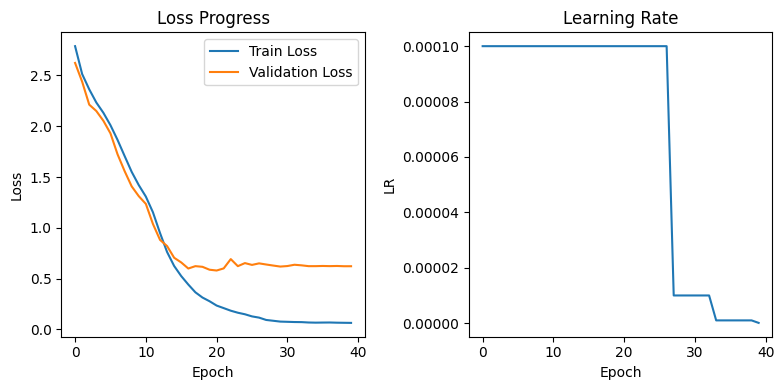

Epoch 41/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpgAttempting to read 75 frames from data/s1/bbbz9s.mpg

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 41/50:   0%|          | 1/450 [00:00<06:56,  1.08it/s, Train Loss=0.0271, LR=0.000000]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 41/50:   0%|          | 2/450 [00:01<05:28,  1.37it/s, Train Loss=0.0486, LR=0.000000]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/bwwbzp.mpg



Epoch 41/50:   1%|          | 3/450 [00:02<04:58,  1.50it/s, Train Loss=0.1467, LR=0.000000]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 41/50:   1%|          | 4/450 [00:02<04:44,  1.57it/s, Train Loss=0.1186, LR=0.000000]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 41/50:   1%|          | 5/450 [00:03<04:36,  1.61it/s, Train Loss=0.0460, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/bgwb7a.mpg



Epoch 41/50:   1%|▏         | 6/450 [00:03<04:31,  1.64it/s, Train Loss=0.0289, LR=0.000000]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg



Epoch 41/50:   2%|▏         | 7/450 [00:04<04:27,  1.66it/s, Train Loss=0.0195, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 41/50:   2%|▏         | 8/450 [00:05<04:24,  1.67it/s, Train Loss=0.0308, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 41/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.0262, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/swbc3a.mpg



Epoch 41/50:   2%|▏         | 10/450 [00:06<04:21,  1.68it/s, Train Loss=0.0469, LR=0.000000]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 41/50:   2%|▏         | 11/450 [00:06<04:20,  1.68it/s, Train Loss=0.0267, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 41/50:   3%|▎         | 12/450 [00:07<04:20,  1.68it/s, Train Loss=0.0766, LR=0.000000]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 41/50:   3%|▎         | 13/450 [00:08<04:19,  1.68it/s, Train Loss=0.0387, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 41/50:   3%|▎         | 14/450 [00:08<04:19,  1.68it/s, Train Loss=0.0798, LR=0.000000]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 41/50:   3%|▎         | 15/450 [00:09<04:18,  1.69it/s, Train Loss=0.0274, LR=0.000000]

Attempting to read 75 frames from data/s1/lbad8p.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 41/50:   4%|▎         | 16/450 [00:09<04:16,  1.69it/s, Train Loss=0.0707, LR=0.000000]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 41/50:   4%|▍         | 17/450 [00:10<04:15,  1.70it/s, Train Loss=0.0441, LR=0.000000]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/bwwh3s.mpg



Epoch 41/50:   4%|▍         | 18/450 [00:10<04:14,  1.70it/s, Train Loss=0.0878, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 41/50:   4%|▍         | 19/450 [00:11<04:14,  1.69it/s, Train Loss=0.0684, LR=0.000000]

Attempting to read 75 frames from data/s1/bgaa7s.mpg
Attempting to read 75 frames from data/s1/sbia1s.mpg



Epoch 41/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.0592, LR=0.000000]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 41/50:   5%|▍         | 21/450 [00:12<04:14,  1.68it/s, Train Loss=0.0557, LR=0.000000]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 41/50:   5%|▍         | 22/450 [00:13<04:14,  1.68it/s, Train Loss=0.0776, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 41/50:   5%|▌         | 23/450 [00:13<04:13,  1.68it/s, Train Loss=0.0551, LR=0.000000]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 41/50:   5%|▌         | 24/450 [00:14<04:12,  1.69it/s, Train Loss=0.0277, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 41/50:   6%|▌         | 25/450 [00:15<04:12,  1.69it/s, Train Loss=0.0701, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 41/50:   6%|▌         | 26/450 [00:15<04:11,  1.68it/s, Train Loss=0.0248, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 41/50:   6%|▌         | 27/450 [00:16<04:10,  1.69it/s, Train Loss=0.0646, LR=0.000000]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 41/50:   6%|▌         | 28/450 [00:16<04:10,  1.69it/s, Train Loss=0.0771, LR=0.000000]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 41/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.1035, LR=0.000000]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 41/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.0747, LR=0.000000]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 41/50:   7%|▋         | 31/450 [00:18<04:07,  1.69it/s, Train Loss=0.1651, LR=0.000000]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 41/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.0502, LR=0.000000]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 41/50:   7%|▋         | 33/450 [00:19<04:07,  1.69it/s, Train Loss=0.0394, LR=0.000000]

Attempting to read 75 frames from data/s1/prbdzn.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 41/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=0.0546, LR=0.000000]

Attempting to read 75 frames from data/s1/srbu6n.mpg
Attempting to read 75 frames from data/s1/swih7s.mpg



Epoch 41/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=0.0210, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwh2n.mpg
Attempting to read 75 frames from data/s1/lgwm8p.mpg



Epoch 41/50:   8%|▊         | 36/450 [00:21<04:05,  1.68it/s, Train Loss=0.0373, LR=0.000000]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 41/50:   8%|▊         | 37/450 [00:22<04:05,  1.68it/s, Train Loss=0.0520, LR=0.000000]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/swbv5a.mpg



Epoch 41/50:   8%|▊         | 38/450 [00:22<04:04,  1.69it/s, Train Loss=0.0318, LR=0.000000]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 41/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.0372, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 41/50:   9%|▉         | 40/450 [00:24<04:02,  1.69it/s, Train Loss=0.0886, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 41/50:   9%|▉         | 41/450 [00:24<04:02,  1.69it/s, Train Loss=0.0391, LR=0.000000]

Attempting to read 75 frames from data/s1/brwt6p.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 41/50:   9%|▉         | 42/450 [00:25<04:01,  1.69it/s, Train Loss=0.0513, LR=0.000000]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 41/50:  10%|▉         | 43/450 [00:25<04:01,  1.68it/s, Train Loss=0.0324, LR=0.000000]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 41/50:  10%|▉         | 44/450 [00:26<04:00,  1.69it/s, Train Loss=0.0456, LR=0.000000]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 41/50:  10%|█         | 45/450 [00:27<04:00,  1.69it/s, Train Loss=0.0618, LR=0.000000]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 41/50:  10%|█         | 46/450 [00:27<04:00,  1.68it/s, Train Loss=0.0831, LR=0.000000]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 41/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=0.0540, LR=0.000000]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 41/50:  11%|█         | 48/450 [00:28<03:57,  1.69it/s, Train Loss=0.0814, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 41/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.0362, LR=0.000000]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 41/50:  11%|█         | 50/450 [00:29<03:57,  1.69it/s, Train Loss=0.0269, LR=0.000000]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 41/50:  11%|█▏        | 51/450 [00:30<03:56,  1.69it/s, Train Loss=0.0181, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/lwafzp.mpg



Epoch 41/50:  12%|█▏        | 52/450 [00:31<03:57,  1.68it/s, Train Loss=0.1275, LR=0.000000]

Attempting to read 75 frames from data/s1/sbat6n.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 41/50:  12%|█▏        | 53/450 [00:31<03:55,  1.68it/s, Train Loss=0.0352, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 41/50:  12%|█▏        | 54/450 [00:32<03:54,  1.69it/s, Train Loss=0.0278, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/pgby5s.mpg



Epoch 41/50:  12%|█▏        | 55/450 [00:32<03:53,  1.69it/s, Train Loss=0.0795, LR=0.000000]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 41/50:  12%|█▏        | 56/450 [00:33<03:52,  1.69it/s, Train Loss=0.0279, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 41/50:  13%|█▎        | 57/450 [00:34<03:52,  1.69it/s, Train Loss=0.0506, LR=0.000000]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg



Epoch 41/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=0.0898, LR=0.000000]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 41/50:  13%|█▎        | 59/450 [00:35<03:52,  1.68it/s, Train Loss=0.0717, LR=0.000000]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 41/50:  13%|█▎        | 60/450 [00:35<03:51,  1.69it/s, Train Loss=0.0883, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 41/50:  14%|█▎        | 61/450 [00:36<03:50,  1.69it/s, Train Loss=0.0669, LR=0.000000]

Attempting to read 75 frames from data/s1/swao5s.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 41/50:  14%|█▍        | 62/450 [00:37<03:50,  1.69it/s, Train Loss=0.1348, LR=0.000000]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 41/50:  14%|█▍        | 63/450 [00:37<03:49,  1.69it/s, Train Loss=0.0594, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 41/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.0533, LR=0.000000]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 41/50:  14%|█▍        | 65/450 [00:38<03:47,  1.69it/s, Train Loss=0.0891, LR=0.000000]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 41/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=0.0318, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 41/50:  15%|█▍        | 67/450 [00:40<03:48,  1.68it/s, Train Loss=0.0720, LR=0.000000]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 41/50:  15%|█▌        | 68/450 [00:40<03:47,  1.68it/s, Train Loss=0.0564, LR=0.000000]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 41/50:  15%|█▌        | 69/450 [00:41<03:46,  1.68it/s, Train Loss=0.0831, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbr6p.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 41/50:  16%|█▌        | 70/450 [00:41<03:46,  1.68it/s, Train Loss=0.0840, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/lgifzn.mpg



Epoch 41/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=0.0980, LR=0.000000]

Attempting to read 75 frames from data/s1/lwal2n.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 41/50:  16%|█▌        | 72/450 [00:43<03:44,  1.68it/s, Train Loss=0.0361, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbk7s.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 41/50:  16%|█▌        | 73/450 [00:43<03:44,  1.68it/s, Train Loss=0.0399, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 41/50:  16%|█▋        | 74/450 [00:44<03:43,  1.68it/s, Train Loss=0.0475, LR=0.000000]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 41/50:  17%|█▋        | 75/450 [00:44<03:43,  1.68it/s, Train Loss=0.0336, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 41/50:  17%|█▋        | 76/450 [00:45<03:43,  1.68it/s, Train Loss=0.0199, LR=0.000000]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 41/50:  17%|█▋        | 77/450 [00:46<03:42,  1.68it/s, Train Loss=0.0408, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbp4p.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 41/50:  17%|█▋        | 78/450 [00:46<03:41,  1.68it/s, Train Loss=0.0764, LR=0.000000]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/bgwb5s.mpg



Epoch 41/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=0.0435, LR=0.000000]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 41/50:  18%|█▊        | 80/450 [00:47<03:38,  1.69it/s, Train Loss=0.0169, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 41/50:  18%|█▊        | 81/450 [00:48<03:39,  1.68it/s, Train Loss=0.0248, LR=0.000000]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 41/50:  18%|█▊        | 82/450 [00:48<03:38,  1.69it/s, Train Loss=0.0495, LR=0.000000]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/bwaa1s.mpg



Epoch 41/50:  18%|█▊        | 83/450 [00:49<03:37,  1.69it/s, Train Loss=0.0283, LR=0.000000]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 41/50:  19%|█▊        | 84/450 [00:50<03:37,  1.69it/s, Train Loss=0.0510, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 41/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=0.0605, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 41/50:  19%|█▉        | 86/450 [00:51<03:35,  1.69it/s, Train Loss=0.0397, LR=0.000000]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 41/50:  19%|█▉        | 87/450 [00:51<03:34,  1.69it/s, Train Loss=0.0458, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 41/50:  20%|█▉        | 88/450 [00:52<03:34,  1.69it/s, Train Loss=0.0548, LR=0.000000]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 41/50:  20%|█▉        | 89/450 [00:53<03:33,  1.69it/s, Train Loss=0.0771, LR=0.000000]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 41/50:  20%|██        | 90/450 [00:53<03:33,  1.69it/s, Train Loss=0.0513, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 41/50:  20%|██        | 91/450 [00:54<03:32,  1.69it/s, Train Loss=0.0250, LR=0.000000]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 41/50:  20%|██        | 92/450 [00:54<03:32,  1.68it/s, Train Loss=0.0932, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 41/50:  21%|██        | 93/450 [00:55<03:32,  1.68it/s, Train Loss=0.0623, LR=0.000000]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 41/50:  21%|██        | 94/450 [00:56<03:31,  1.68it/s, Train Loss=0.0498, LR=0.000000]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/sgap2p.mpg



Epoch 41/50:  21%|██        | 95/450 [00:56<03:31,  1.68it/s, Train Loss=0.0350, LR=0.000000]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 41/50:  21%|██▏       | 96/450 [00:57<03:30,  1.68it/s, Train Loss=0.1073, LR=0.000000]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 41/50:  22%|██▏       | 97/450 [00:57<03:30,  1.68it/s, Train Loss=0.1973, LR=0.000000]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 41/50:  22%|██▏       | 98/450 [00:58<03:29,  1.68it/s, Train Loss=0.1530, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 41/50:  22%|██▏       | 99/450 [00:59<03:28,  1.69it/s, Train Loss=0.0811, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/lwbz7a.mpg



Epoch 41/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=0.1031, LR=0.000000]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 41/50:  22%|██▏       | 101/450 [01:00<03:27,  1.68it/s, Train Loss=0.0406, LR=0.000000]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/sbit2n.mpg



Epoch 41/50:  23%|██▎       | 102/450 [01:00<03:26,  1.69it/s, Train Loss=0.0535, LR=0.000000]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/swbczn.mpg



Epoch 41/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.0682, LR=0.000000]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 41/50:  23%|██▎       | 104/450 [01:02<03:24,  1.69it/s, Train Loss=0.0534, LR=0.000000]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 41/50:  23%|██▎       | 105/450 [01:02<03:23,  1.69it/s, Train Loss=0.0840, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/srwc1a.mpg



Epoch 41/50:  24%|██▎       | 106/450 [01:03<03:23,  1.69it/s, Train Loss=0.0994, LR=0.000000]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/lray7a.mpg



Epoch 41/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=0.0545, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbzzp.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 41/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.0640, LR=0.000000]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 41/50:  24%|██▍       | 109/450 [01:04<03:21,  1.69it/s, Train Loss=0.0978, LR=0.000000]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 41/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.1277, LR=0.000000]

Attempting to read 75 frames from data/s1/swwi8n.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 41/50:  25%|██▍       | 111/450 [01:06<03:20,  1.69it/s, Train Loss=0.0256, LR=0.000000]

Attempting to read 75 frames from data/s1/lwir4p.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 41/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=0.0909, LR=0.000000]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 41/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.0566, LR=0.000000]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 41/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=0.0473, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/bbwm4n.mpg



Epoch 41/50:  26%|██▌       | 115/450 [01:08<03:17,  1.69it/s, Train Loss=0.0469, LR=0.000000]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 41/50:  26%|██▌       | 116/450 [01:09<03:17,  1.69it/s, Train Loss=0.1323, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 41/50:  26%|██▌       | 117/450 [01:09<03:16,  1.69it/s, Train Loss=0.0959, LR=0.000000]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/sbwo3a.mpg



Epoch 41/50:  26%|██▌       | 118/450 [01:10<03:15,  1.69it/s, Train Loss=0.1186, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwfzn.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 41/50:  26%|██▋       | 119/450 [01:10<03:16,  1.69it/s, Train Loss=0.0315, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/brag1a.mpg



Epoch 41/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.0545, LR=0.000000]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 41/50:  27%|██▋       | 121/450 [01:12<03:14,  1.69it/s, Train Loss=0.2225, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 41/50:  27%|██▋       | 122/450 [01:12<03:13,  1.69it/s, Train Loss=0.1016, LR=0.000000]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/pwbyzp.mpg



Epoch 41/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.0324, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 41/50:  28%|██▊       | 124/450 [01:13<03:12,  1.69it/s, Train Loss=0.0415, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 41/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=0.0956, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 41/50:  28%|██▊       | 126/450 [01:15<03:12,  1.69it/s, Train Loss=0.0309, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwu7a.mpg
Attempting to read 75 frames from data/s1/lwbl8p.mpg



Epoch 41/50:  28%|██▊       | 127/450 [01:15<03:11,  1.69it/s, Train Loss=0.1221, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 41/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.0724, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 41/50:  29%|██▊       | 129/450 [01:16<03:10,  1.69it/s, Train Loss=0.0360, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 41/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.0397, LR=0.000000]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 41/50:  29%|██▉       | 131/450 [01:17<03:08,  1.69it/s, Train Loss=0.0918, LR=0.000000]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 41/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=0.0232, LR=0.000000]

Attempting to read 75 frames from data/s1/swih9a.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 41/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=0.0273, LR=0.000000]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 41/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.0730, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 41/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.0761, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwg3s.mpg
Attempting to read 75 frames from data/s1/pbbc6p.mpg



Epoch 41/50:  30%|███       | 136/450 [01:20<03:06,  1.68it/s, Train Loss=0.0477, LR=0.000000]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/srin4n.mpg



Epoch 41/50:  30%|███       | 137/450 [01:21<03:06,  1.68it/s, Train Loss=0.0496, LR=0.000000]

Attempting to read 75 frames from data/s1/bgia3s.mpg
Attempting to read 75 frames from data/s1/srwv3a.mpg



Epoch 41/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=0.1080, LR=0.000000]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 41/50:  31%|███       | 139/450 [01:22<03:04,  1.68it/s, Train Loss=0.0569, LR=0.000000]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 41/50:  31%|███       | 140/450 [01:23<03:04,  1.68it/s, Train Loss=0.0844, LR=0.000000]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 41/50:  31%|███▏      | 141/450 [01:23<03:04,  1.67it/s, Train Loss=0.1019, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 41/50:  32%|███▏      | 142/450 [01:24<03:03,  1.68it/s, Train Loss=0.0531, LR=0.000000]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/pbwj5a.mpg



Epoch 41/50:  32%|███▏      | 143/450 [01:25<03:02,  1.68it/s, Train Loss=0.1043, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 41/50:  32%|███▏      | 144/450 [01:25<03:01,  1.69it/s, Train Loss=0.0486, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 41/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.0690, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 41/50:  32%|███▏      | 146/450 [01:26<03:00,  1.68it/s, Train Loss=0.1540, LR=0.000000]

Attempting to read 75 frames from data/s1/pbav5a.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 41/50:  33%|███▎      | 147/450 [01:27<03:00,  1.68it/s, Train Loss=0.0313, LR=0.000000]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/bwwu1s.mpg



Epoch 41/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=0.1118, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 41/50:  33%|███▎      | 149/450 [01:28<02:58,  1.68it/s, Train Loss=0.0420, LR=0.000000]

Attempting to read 75 frames from data/s1/lbiqzn.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 41/50:  33%|███▎      | 150/450 [01:29<02:58,  1.68it/s, Train Loss=0.0232, LR=0.000000]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 41/50:  34%|███▎      | 151/450 [01:29<02:56,  1.69it/s, Train Loss=0.0215, LR=0.000000]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 41/50:  34%|███▍      | 152/450 [01:30<02:55,  1.70it/s, Train Loss=0.0558, LR=0.000000]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/srwi4p.mpg



Epoch 41/50:  34%|███▍      | 153/450 [01:31<02:55,  1.69it/s, Train Loss=0.0652, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/bbiz1s.mpg



Epoch 41/50:  34%|███▍      | 154/450 [01:31<02:54,  1.69it/s, Train Loss=0.0265, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 41/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.0500, LR=0.000000]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/bgit5s.mpg



Epoch 41/50:  35%|███▍      | 156/450 [01:32<02:53,  1.69it/s, Train Loss=0.0485, LR=0.000000]

Attempting to read 75 frames from data/s1/pbio4n.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 41/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.0513, LR=0.000000]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 41/50:  35%|███▌      | 158/450 [01:33<02:52,  1.69it/s, Train Loss=0.0842, LR=0.000000]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 41/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=0.0737, LR=0.000000]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 41/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.0285, LR=0.000000]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 41/50:  36%|███▌      | 161/450 [01:35<02:50,  1.69it/s, Train Loss=0.0538, LR=0.000000]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 41/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.0408, LR=0.000000]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 41/50:  36%|███▌      | 163/450 [01:36<02:49,  1.69it/s, Train Loss=0.0171, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/lwbl9a.mpg



Epoch 41/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=0.0684, LR=0.000000]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 41/50:  37%|███▋      | 165/450 [01:38<02:49,  1.69it/s, Train Loss=0.1150, LR=0.000000]

Attempting to read 75 frames from data/s1/lgis1a.mpg
Attempting to read 75 frames from data/s1/bbbs4n.mpg



Epoch 41/50:  37%|███▋      | 166/450 [01:38<02:49,  1.68it/s, Train Loss=0.0636, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 41/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0823, LR=0.000000]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/priv4n.mpg



Epoch 41/50:  37%|███▋      | 168/450 [01:39<02:48,  1.68it/s, Train Loss=0.0402, LR=0.000000]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 41/50:  38%|███▊      | 169/450 [01:40<02:47,  1.68it/s, Train Loss=0.0599, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwq8n.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 41/50:  38%|███▊      | 170/450 [01:41<02:46,  1.68it/s, Train Loss=0.1003, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwy6n.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 41/50:  38%|███▊      | 171/450 [01:41<02:47,  1.67it/s, Train Loss=0.0647, LR=0.000000]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 41/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=0.0366, LR=0.000000]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 41/50:  38%|███▊      | 173/450 [01:42<02:44,  1.68it/s, Train Loss=0.0293, LR=0.000000]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/swwp3s.mpg



Epoch 41/50:  39%|███▊      | 174/450 [01:43<02:43,  1.68it/s, Train Loss=0.0416, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 41/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=0.0506, LR=0.000000]

Attempting to read 75 frames from data/s1/lwir2n.mpg
Attempting to read 75 frames from data/s1/sgbv8n.mpg



Epoch 41/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.0584, LR=0.000000]

Attempting to read 75 frames from data/s1/pbac3a.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 41/50:  39%|███▉      | 177/450 [01:45<02:42,  1.68it/s, Train Loss=0.0232, LR=0.000000]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 41/50:  40%|███▉      | 178/450 [01:45<02:41,  1.68it/s, Train Loss=0.0389, LR=0.000000]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 41/50:  40%|███▉      | 179/450 [01:46<02:41,  1.67it/s, Train Loss=0.0519, LR=0.000000]

Attempting to read 75 frames from data/s1/prbx3s.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 41/50:  40%|████      | 180/450 [01:47<02:41,  1.67it/s, Train Loss=0.0231, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 41/50:  40%|████      | 181/450 [01:47<02:40,  1.67it/s, Train Loss=0.2302, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 41/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=0.0560, LR=0.000000]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 41/50:  41%|████      | 183/450 [01:48<02:38,  1.69it/s, Train Loss=0.0754, LR=0.000000]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 41/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.0957, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 41/50:  41%|████      | 185/450 [01:50<02:37,  1.69it/s, Train Loss=0.0778, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 41/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.0919, LR=0.000000]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 41/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.0262, LR=0.000000]

Attempting to read 75 frames from data/s1/prwk1a.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 41/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=0.0759, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 41/50:  42%|████▏     | 189/450 [01:52<02:35,  1.68it/s, Train Loss=0.0419, LR=0.000000]

Attempting to read 75 frames from data/s1/bbal6n.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 41/50:  42%|████▏     | 190/450 [01:53<02:34,  1.68it/s, Train Loss=0.0950, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 41/50:  42%|████▏     | 191/450 [01:53<02:33,  1.68it/s, Train Loss=0.0409, LR=0.000000]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 41/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=0.0668, LR=0.000000]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 41/50:  43%|████▎     | 193/450 [01:54<02:32,  1.69it/s, Train Loss=0.0584, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 41/50:  43%|████▎     | 194/450 [01:55<02:31,  1.68it/s, Train Loss=0.0556, LR=0.000000]

Attempting to read 75 frames from data/s1/lwar6n.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 41/50:  43%|████▎     | 195/450 [01:55<02:31,  1.69it/s, Train Loss=0.0686, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 41/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.0445, LR=0.000000]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 41/50:  44%|████▍     | 197/450 [01:57<02:30,  1.69it/s, Train Loss=0.1145, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 41/50:  44%|████▍     | 198/450 [01:57<02:29,  1.68it/s, Train Loss=0.2522, LR=0.000000]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/pbav2n.mpg



Epoch 41/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=0.0783, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/lwar7s.mpg



Epoch 41/50:  44%|████▍     | 200/450 [01:58<02:28,  1.68it/s, Train Loss=0.0238, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 41/50:  45%|████▍     | 201/450 [01:59<02:28,  1.68it/s, Train Loss=0.0689, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 41/50:  45%|████▍     | 202/450 [02:00<02:27,  1.68it/s, Train Loss=0.1227, LR=0.000000]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 41/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.1153, LR=0.000000]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 41/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.0314, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 41/50:  46%|████▌     | 205/450 [02:01<02:24,  1.69it/s, Train Loss=0.0401, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 41/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.0316, LR=0.000000]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/bgaa6n.mpg



Epoch 41/50:  46%|████▌     | 207/450 [02:03<02:23,  1.69it/s, Train Loss=0.0915, LR=0.000000]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 41/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.0665, LR=0.000000]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 41/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.0487, LR=0.000000]

Attempting to read 75 frames from data/s1/srbb7a.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg



Epoch 41/50:  47%|████▋     | 210/450 [02:04<02:21,  1.69it/s, Train Loss=0.0582, LR=0.000000]

Attempting to read 75 frames from data/s1/pbii2p.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 41/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.0316, LR=0.000000]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 41/50:  47%|████▋     | 212/450 [02:06<02:21,  1.68it/s, Train Loss=0.0272, LR=0.000000]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 41/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=0.0601, LR=0.000000]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/lrwl6p.mpg



Epoch 41/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=0.0714, LR=0.000000]

Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 41/50:  48%|████▊     | 215/450 [02:07<02:19,  1.68it/s, Train Loss=0.0158, LR=0.000000]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 41/50:  48%|████▊     | 216/450 [02:08<02:19,  1.68it/s, Train Loss=0.0431, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 41/50:  48%|████▊     | 217/450 [02:09<02:18,  1.69it/s, Train Loss=0.0827, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwb3s.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 41/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.0707, LR=0.000000]

Attempting to read 75 frames from data/s1/bbas3a.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 41/50:  49%|████▊     | 219/450 [02:10<02:16,  1.69it/s, Train Loss=0.0503, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 41/50:  49%|████▉     | 220/450 [02:10<02:16,  1.69it/s, Train Loss=0.0558, LR=0.000000]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 41/50:  49%|████▉     | 221/450 [02:11<02:15,  1.69it/s, Train Loss=0.1026, LR=0.000000]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 41/50:  49%|████▉     | 222/450 [02:11<02:14,  1.69it/s, Train Loss=0.2280, LR=0.000000]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 41/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.0501, LR=0.000000]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 41/50:  50%|████▉     | 224/450 [02:13<02:14,  1.68it/s, Train Loss=0.0446, LR=0.000000]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 41/50:  50%|█████     | 225/450 [02:13<02:13,  1.68it/s, Train Loss=0.0405, LR=0.000000]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 41/50:  50%|█████     | 226/450 [02:14<02:12,  1.68it/s, Train Loss=0.0665, LR=0.000000]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 41/50:  50%|█████     | 227/450 [02:14<02:12,  1.69it/s, Train Loss=0.0268, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 41/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.0870, LR=0.000000]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 41/50:  51%|█████     | 229/450 [02:16<02:10,  1.69it/s, Train Loss=0.0549, LR=0.000000]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 41/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.0785, LR=0.000000]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 41/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=0.0514, LR=0.000000]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/swbv4p.mpg



Epoch 41/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.68it/s, Train Loss=0.0844, LR=0.000000]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 41/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.0487, LR=0.000000]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 41/50:  52%|█████▏    | 234/450 [02:19<02:08,  1.68it/s, Train Loss=0.0476, LR=0.000000]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 41/50:  52%|█████▏    | 235/450 [02:19<02:08,  1.68it/s, Train Loss=0.0357, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 41/50:  52%|█████▏    | 236/450 [02:20<02:07,  1.68it/s, Train Loss=0.0330, LR=0.000000]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 41/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.69it/s, Train Loss=0.0644, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 41/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.69it/s, Train Loss=0.3039, LR=0.000000]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 41/50:  53%|█████▎    | 239/450 [02:22<02:04,  1.70it/s, Train Loss=0.0412, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 41/50:  53%|█████▎    | 240/450 [02:22<02:03,  1.70it/s, Train Loss=0.0958, LR=0.000000]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 41/50:  54%|█████▎    | 241/450 [02:23<02:02,  1.70it/s, Train Loss=0.0428, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 41/50:  54%|█████▍    | 242/450 [02:23<02:02,  1.70it/s, Train Loss=0.0869, LR=0.000000]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 41/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.70it/s, Train Loss=0.0672, LR=0.000000]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 41/50:  54%|█████▍    | 244/450 [02:24<02:01,  1.69it/s, Train Loss=0.0696, LR=0.000000]

Attempting to read 75 frames from data/s1/srau4p.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 41/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.0388, LR=0.000000]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 41/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.70it/s, Train Loss=0.0315, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 41/50:  55%|█████▍    | 247/450 [02:26<01:59,  1.70it/s, Train Loss=0.0954, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 41/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.0947, LR=0.000000]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 41/50:  55%|█████▌    | 249/450 [02:27<01:59,  1.69it/s, Train Loss=0.0372, LR=0.000000]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 41/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.0353, LR=0.000000]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 41/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=0.0475, LR=0.000000]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 41/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=0.0449, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/brwg8p.mpg



Epoch 41/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0266, LR=0.000000]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 41/50:  56%|█████▋    | 254/450 [02:30<01:55,  1.69it/s, Train Loss=0.0429, LR=0.000000]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 41/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.69it/s, Train Loss=0.0453, LR=0.000000]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/lrbe7s.mpg



Epoch 41/50:  57%|█████▋    | 256/450 [02:32<01:54,  1.70it/s, Train Loss=0.1103, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/briz9a.mpg



Epoch 41/50:  57%|█████▋    | 257/450 [02:32<01:53,  1.69it/s, Train Loss=0.1339, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 41/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.70it/s, Train Loss=0.0786, LR=0.000000]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/sbwu5s.mpg



Epoch 41/50:  58%|█████▊    | 259/450 [02:33<01:52,  1.69it/s, Train Loss=0.0977, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 41/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.69it/s, Train Loss=0.1130, LR=0.000000]

Attempting to read 75 frames from data/s1/lrak6n.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 41/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.69it/s, Train Loss=0.1015, LR=0.000000]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 41/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.69it/s, Train Loss=0.1014, LR=0.000000]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 41/50:  58%|█████▊    | 263/450 [02:36<01:50,  1.69it/s, Train Loss=0.0564, LR=0.000000]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 41/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.69it/s, Train Loss=0.0761, LR=0.000000]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 41/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.69it/s, Train Loss=0.0255, LR=0.000000]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/srau2n.mpg



Epoch 41/50:  59%|█████▉    | 266/450 [02:38<01:48,  1.69it/s, Train Loss=0.0383, LR=0.000000]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 41/50:  59%|█████▉    | 267/450 [02:38<01:47,  1.70it/s, Train Loss=0.3238, LR=0.000000]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 41/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=0.0488, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 41/50:  60%|█████▉    | 269/450 [02:39<01:46,  1.69it/s, Train Loss=0.0838, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbe3s.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 41/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.0486, LR=0.000000]

Attempting to read 75 frames from data/s1/pgid4n.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 41/50:  60%|██████    | 271/450 [02:40<01:45,  1.70it/s, Train Loss=0.0674, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 41/50:  60%|██████    | 272/450 [02:41<01:44,  1.70it/s, Train Loss=0.0378, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 41/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.0834, LR=0.000000]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 41/50:  61%|██████    | 274/450 [02:42<01:43,  1.70it/s, Train Loss=0.0489, LR=0.000000]

Attempting to read 75 frames from data/s1/prac7s.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 41/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.0631, LR=0.000000]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/sriu1a.mpg



Epoch 41/50:  61%|██████▏   | 276/450 [02:43<01:42,  1.69it/s, Train Loss=0.0375, LR=0.000000]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 41/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.0515, LR=0.000000]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 41/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=0.0303, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 41/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.0446, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbgzp.mpg
Attempting to read 75 frames from data/s1/prii8p.mpg



Epoch 41/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.0336, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 41/50:  62%|██████▏   | 281/450 [02:46<01:39,  1.69it/s, Train Loss=0.0743, LR=0.000000]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 41/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.68it/s, Train Loss=0.0979, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 41/50:  63%|██████▎   | 283/450 [02:48<01:39,  1.68it/s, Train Loss=0.0358, LR=0.000000]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 41/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.0302, LR=0.000000]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 41/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.0617, LR=0.000000]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 41/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.68it/s, Train Loss=0.1411, LR=0.000000]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 41/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.0606, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwy3s.mpg
Attempting to read 75 frames from data/s1/bbie8n.mpg



Epoch 41/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.68it/s, Train Loss=0.0515, LR=0.000000]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 41/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.68it/s, Train Loss=0.0171, LR=0.000000]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 41/50:  64%|██████▍   | 290/450 [02:52<01:35,  1.68it/s, Train Loss=0.0550, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbk1s.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 41/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=0.1201, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 41/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.1336, LR=0.000000]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 41/50:  65%|██████▌   | 293/450 [02:53<01:33,  1.68it/s, Train Loss=0.0274, LR=0.000000]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/pwij3s.mpg



Epoch 41/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.68it/s, Train Loss=0.1805, LR=0.000000]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/swwp5a.mpg



Epoch 41/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.0643, LR=0.000000]

Attempting to read 75 frames from data/s1/swai2p.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 41/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.68it/s, Train Loss=0.0864, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 41/50:  66%|██████▌   | 297/450 [02:56<01:30,  1.69it/s, Train Loss=0.0167, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 41/50:  66%|██████▌   | 298/450 [02:56<01:29,  1.69it/s, Train Loss=0.0739, LR=0.000000]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 41/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.0295, LR=0.000000]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 41/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.0502, LR=0.000000]

Attempting to read 75 frames from data/s1/sgav6p.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 41/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.0534, LR=0.000000]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/lgiz2n.mpg



Epoch 41/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.0484, LR=0.000000]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 75 frames from data/s1/srab3a.mpg



Epoch 41/50:  67%|██████▋   | 303/450 [02:59<01:27,  1.68it/s, Train Loss=0.0479, LR=0.000000]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 41/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.0783, LR=0.000000]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 41/50:  68%|██████▊   | 305/450 [03:01<01:26,  1.68it/s, Train Loss=0.0414, LR=0.000000]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 41/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.68it/s, Train Loss=0.0913, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 41/50:  68%|██████▊   | 307/450 [03:02<01:25,  1.68it/s, Train Loss=0.0605, LR=0.000000]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 41/50:  68%|██████▊   | 308/450 [03:02<01:24,  1.69it/s, Train Loss=0.0674, LR=0.000000]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 41/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.68it/s, Train Loss=0.0518, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 41/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.68it/s, Train Loss=0.0951, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/srit8n.mpg



Epoch 41/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.68it/s, Train Loss=0.0501, LR=0.000000]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/sgwp8n.mpg



Epoch 41/50:  69%|██████▉   | 312/450 [03:05<01:22,  1.68it/s, Train Loss=0.0569, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 41/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.68it/s, Train Loss=0.0342, LR=0.000000]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 41/50:  70%|██████▉   | 314/450 [03:06<01:21,  1.68it/s, Train Loss=0.1703, LR=0.000000]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 41/50:  70%|███████   | 315/450 [03:07<01:20,  1.68it/s, Train Loss=0.1026, LR=0.000000]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/swbpzp.mpg



Epoch 41/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.0661, LR=0.000000]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 41/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.0675, LR=0.000000]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 41/50:  71%|███████   | 318/450 [03:08<01:18,  1.69it/s, Train Loss=0.0557, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 41/50:  71%|███████   | 319/450 [03:09<01:17,  1.69it/s, Train Loss=0.0771, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 41/50:  71%|███████   | 320/450 [03:10<01:16,  1.69it/s, Train Loss=0.0518, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 41/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.0337, LR=0.000000]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/bbws9s.mpg



Epoch 41/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.0530, LR=0.000000]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 41/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.0638, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 41/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.0855, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 41/50:  72%|███████▏  | 325/450 [03:12<01:14,  1.68it/s, Train Loss=0.1332, LR=0.000000]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 41/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.68it/s, Train Loss=0.0806, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 41/50:  73%|███████▎  | 327/450 [03:14<01:13,  1.68it/s, Train Loss=0.0755, LR=0.000000]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 41/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.68it/s, Train Loss=0.0888, LR=0.000000]

Attempting to read 75 frames from data/s1/bbal7s.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 41/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.68it/s, Train Loss=0.0541, LR=0.000000]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 41/50:  73%|███████▎  | 330/450 [03:15<01:11,  1.69it/s, Train Loss=0.0431, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 41/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.68it/s, Train Loss=0.0859, LR=0.000000]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 41/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.67it/s, Train Loss=0.0460, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 41/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.68it/s, Train Loss=0.0970, LR=0.000000]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/sgio9a.mpg



Epoch 41/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.0599, LR=0.000000]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 41/50:  74%|███████▍  | 335/450 [03:18<01:08,  1.68it/s, Train Loss=0.0829, LR=0.000000]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 41/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=0.0579, LR=0.000000]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 41/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.69it/s, Train Loss=0.1698, LR=0.000000]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 41/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.68it/s, Train Loss=0.0756, LR=0.000000]

Attempting to read 75 frames from data/s1/pgaq7s.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 41/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.68it/s, Train Loss=0.1227, LR=0.000000]

Attempting to read 75 frames from data/s1/pbap1a.mpg
Attempting to read 75 frames from data/s1/pbaczn.mpg



Epoch 41/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.68it/s, Train Loss=0.0744, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 41/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.68it/s, Train Loss=0.0718, LR=0.000000]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/bbiz3a.mpg



Epoch 41/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.69it/s, Train Loss=0.0405, LR=0.000000]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 41/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.0461, LR=0.000000]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 41/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.0721, LR=0.000000]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 41/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.0229, LR=0.000000]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 41/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.70it/s, Train Loss=0.0509, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/prbd2p.mpg



Epoch 41/50:  77%|███████▋  | 347/450 [03:26<01:00,  1.69it/s, Train Loss=0.1009, LR=0.000000]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 41/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.68it/s, Train Loss=0.0642, LR=0.000000]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 41/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.69it/s, Train Loss=0.1393, LR=0.000000]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/pgix7s.mpg



Epoch 41/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.69it/s, Train Loss=0.2247, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 41/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.0336, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/bwba4n.mpg



Epoch 41/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.69it/s, Train Loss=0.0463, LR=0.000000]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 41/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=0.0468, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 41/50:  79%|███████▊  | 354/450 [03:30<00:57,  1.68it/s, Train Loss=0.0247, LR=0.000000]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 41/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.68it/s, Train Loss=0.0489, LR=0.000000]

Attempting to read 75 frames from data/s1/srih2p.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 41/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.0518, LR=0.000000]

Attempting to read 75 frames from data/s1/lwal3s.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 41/50:  79%|███████▉  | 357/450 [03:31<00:55,  1.68it/s, Train Loss=0.0729, LR=0.000000]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 41/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.0883, LR=0.000000]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 41/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=0.0626, LR=0.000000]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 41/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.0559, LR=0.000000]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 41/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.0762, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 41/50:  80%|████████  | 362/450 [03:34<00:51,  1.69it/s, Train Loss=0.0574, LR=0.000000]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 41/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.0475, LR=0.000000]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 41/50:  81%|████████  | 364/450 [03:36<00:50,  1.69it/s, Train Loss=0.0876, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 41/50:  81%|████████  | 365/450 [03:36<00:50,  1.69it/s, Train Loss=0.0556, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbz4n.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 41/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.69it/s, Train Loss=0.2025, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 41/50:  82%|████████▏ | 367/450 [03:37<00:49,  1.69it/s, Train Loss=0.0893, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 41/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.0732, LR=0.000000]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 41/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.69it/s, Train Loss=0.0550, LR=0.000000]

Attempting to read 75 frames from data/s1/bgat9s.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 41/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.0587, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 41/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.0223, LR=0.000000]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 41/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.0447, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/srbizp.mpg



Epoch 41/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.0673, LR=0.000000]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 41/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.68it/s, Train Loss=0.1357, LR=0.000000]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 41/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.0760, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 41/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.68it/s, Train Loss=0.0728, LR=0.000000]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/swio2p.mpg



Epoch 41/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.68it/s, Train Loss=0.0173, LR=0.000000]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 41/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.68it/s, Train Loss=0.0600, LR=0.000000]

Attempting to read 75 frames from data/s1/pgae1a.mpg
Attempting to read 75 frames from data/s1/brwg9a.mpg



Epoch 41/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.68it/s, Train Loss=0.0424, LR=0.000000]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 41/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.68it/s, Train Loss=0.1264, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 41/50:  85%|████████▍ | 381/450 [03:46<00:41,  1.68it/s, Train Loss=0.0354, LR=0.000000]

Attempting to read 75 frames from data/s1/pbib9a.mpg
Attempting to read 75 frames from data/s1/prwd4n.mpg



Epoch 41/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.68it/s, Train Loss=0.0596, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/bgwh9s.mpg



Epoch 41/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.68it/s, Train Loss=0.0357, LR=0.000000]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 41/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.67it/s, Train Loss=0.0289, LR=0.000000]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/brwn1s.mpg



Epoch 41/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.68it/s, Train Loss=0.0292, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbh2n.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 41/50:  86%|████████▌ | 386/450 [03:49<00:38,  1.68it/s, Train Loss=0.0509, LR=0.000000]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 41/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=0.0374, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 41/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.68it/s, Train Loss=0.0804, LR=0.000000]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 41/50:  86%|████████▋ | 389/450 [03:50<00:36,  1.68it/s, Train Loss=0.0353, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 41/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=0.0243, LR=0.000000]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 41/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.69it/s, Train Loss=0.0395, LR=0.000000]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 41/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.68it/s, Train Loss=0.0787, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 41/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.0344, LR=0.000000]

Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 41/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.69it/s, Train Loss=0.0374, LR=0.000000]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 41/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.69it/s, Train Loss=0.1533, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 41/50:  88%|████████▊ | 396/450 [03:55<00:31,  1.69it/s, Train Loss=0.0120, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 41/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.69it/s, Train Loss=0.0569, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbj1s.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 41/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=0.0635, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 41/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.68it/s, Train Loss=0.0216, LR=0.000000]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/brwa2n.mpg



Epoch 41/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=0.0239, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 41/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.69it/s, Train Loss=0.0721, LR=0.000000]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 41/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.69it/s, Train Loss=0.0422, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/sbwh7s.mpg



Epoch 41/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.69it/s, Train Loss=0.0899, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/swwc4n.mpg



Epoch 41/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.69it/s, Train Loss=0.0652, LR=0.000000]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 41/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.0611, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 41/50:  90%|█████████ | 406/450 [04:01<00:25,  1.69it/s, Train Loss=0.0318, LR=0.000000]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/swbi6p.mpg



Epoch 41/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.1391, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 41/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=0.1024, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 41/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.0388, LR=0.000000]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/lwwz9s.mpg



Epoch 41/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.0612, LR=0.000000]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 41/50:  91%|█████████▏| 411/450 [04:03<00:23,  1.69it/s, Train Loss=0.0642, LR=0.000000]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 41/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=0.0899, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 41/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.0801, LR=0.000000]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 41/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.68it/s, Train Loss=0.1496, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 41/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.0223, LR=0.000000]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/pgbrzn.mpg



Epoch 41/50:  92%|█████████▏| 416/450 [04:06<00:20,  1.68it/s, Train Loss=0.0391, LR=0.000000]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/lrak9a.mpg



Epoch 41/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.68it/s, Train Loss=0.0687, LR=0.000000]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 41/50:  93%|█████████▎| 418/450 [04:08<00:19,  1.68it/s, Train Loss=0.0673, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 41/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.68it/s, Train Loss=0.0895, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 41/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=0.0836, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 41/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.0838, LR=0.000000]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 41/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.0997, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 41/50:  94%|█████████▍| 423/450 [04:11<00:15,  1.69it/s, Train Loss=0.0451, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/bbbs7a.mpg



Epoch 41/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.69it/s, Train Loss=0.0260, LR=0.000000]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 41/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.1198, LR=0.000000]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 41/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.69it/s, Train Loss=0.0636, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 41/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.0714, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 41/50:  95%|█████████▌| 428/450 [04:14<00:12,  1.70it/s, Train Loss=0.0333, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 41/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.69it/s, Train Loss=0.2331, LR=0.000000]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 41/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.0251, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbr1s.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 41/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.1122, LR=0.000000]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 41/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.0296, LR=0.000000]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 41/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.68it/s, Train Loss=0.0648, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 41/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.68it/s, Train Loss=0.0552, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 41/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.0734, LR=0.000000]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 41/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.0553, LR=0.000000]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 41/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=0.1019, LR=0.000000]

Attempting to read 75 frames from data/s1/lbak2p.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 41/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.68it/s, Train Loss=0.0376, LR=0.000000]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 41/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=0.0719, LR=0.000000]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 41/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.68it/s, Train Loss=0.0294, LR=0.000000]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 41/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=0.1190, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 41/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.69it/s, Train Loss=0.0327, LR=0.000000]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 41/50:  98%|█████████▊| 443/450 [04:22<00:04,  1.68it/s, Train Loss=0.1788, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 41/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.67it/s, Train Loss=0.0869, LR=0.000000]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 41/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.68it/s, Train Loss=0.0766, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 41/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.0825, LR=0.000000]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpgAttempting to read 75 frames from data/s1/brba1a.mpg

Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg



Validation:   0%|          | 0/50 [00:00<?, ?it/s, Val Loss=1.2176]

Attempting to read 75 frames from data/s1/lbbezn.mpg


Validation:   2%|▏         | 1/50 [00:00<00:26,  1.82it/s, Val Loss=1.2176]


Attempting to read 75 frames from data/s1/sbwu6p.mpg



Validation:   4%|▍         | 2/50 [00:00<00:15,  3.03it/s, Val Loss=0.2891]

Attempting to read 75 frames from data/s1/pgak3s.mpg
Attempting to read 75 frames from data/s1/pgwr4n.mpg



Validation:   6%|▌         | 3/50 [00:00<00:13,  3.58it/s, Val Loss=0.6282]

Attempting to read 75 frames from data/s1/sgio7s.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  4.11it/s, Val Loss=0.2985]

Attempting to read 75 frames from data/s1/swao6p.mpg
Attempting to read 75 frames from data/s1/pwix3a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.40it/s, Val Loss=0.1826]

Attempting to read 75 frames from data/s1/srao1a.mpgAttempting to read 75 frames from data/s1/bwbg8n.mpg

Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.67it/s, Val Loss=1.1274]

Attempting to read 75 frames from data/s1/lbakzn.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.66it/s, Val Loss=1.4487]

Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/bril9s.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.90it/s, Val Loss=0.6375]

Attempting to read 75 frames from data/s1/braf9s.mpg
Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.10it/s, Val Loss=0.2727]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.25it/s, Val Loss=0.4024]

Attempting to read 75 frames from data/s1/lwbszn.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.34it/s, Val Loss=1.0284]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/srah4n.mpg
Attempting to read 75 frames from data/s1/prii7s.mpg

Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.12it/s, Val Loss=0.0220]

Attempting to read 75 frames from data/s1/pbwj2n.mpg


Attempting to read 75 frames from data/s1/lgil5s.mpg

Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.13it/s, Val Loss=0.6030]

Attempting to read 75 frames from data/s1/bbir9a.mpg




Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.26it/s, Val Loss=0.3221]

Attempting to read 75 frames from data/s1/lgbs9a.mpg
Attempting to read 75 frames from data/s1/lriq8p.mpg



Validation:  30%|███       | 15/50 [00:03<00:06,  5.30it/s, Val Loss=0.6334]

Attempting to read 75 frames from data/s1/prwx7s.mpgAttempting to read 75 frames from data/s1/bwim4n.mpg

Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.22it/s, Val Loss=0.4026]

Attempting to read 75 frames from data/s1/lgbm3s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.23it/s, Val Loss=0.2067]

Attempting to read 75 frames from data/s1/lbbk5s.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.36it/s, Val Loss=0.2659]

Attempting to read 75 frames from data/s1/sbag8n.mpg



Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.41it/s, Val Loss=0.1757]

Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.31it/s, Val Loss=0.1561]

Attempting to read 75 frames from data/s1/sbwh8p.mpgAttempting to read 75 frames from data/s1/pric5a.mpg




Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.26it/s, Val Loss=2.5525]

Attempting to read 75 frames from data/s1/lrbr5s.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.26it/s, Val Loss=0.1539]


Attempting to read 75 frames from data/s1/bgah2p.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.30it/s, Val Loss=0.1539]

Attempting to read 75 frames from data/s1/praj2p.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:05,  5.27it/s, Val Loss=0.5907]

Attempting to read 75 frames from data/s1/bbifzp.mpgAttempting to read 75 frames from data/s1/lrbl1s.mpg




Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.32it/s, Val Loss=0.2211]

Attempting to read 75 frames from data/s1/swiu6p.mpg
Attempting to read 75 frames from data/s1/prajzn.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.30it/s, Val Loss=0.7710]

Attempting to read 75 frames from data/s1/sgav4n.mpgAttempting to read 75 frames from data/s1/bgwu7s.mpg




Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.09it/s, Val Loss=0.1977]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.13it/s, Val Loss=0.2412]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.28it/s, Val Loss=1.2776]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.39it/s, Val Loss=0.3468]

Attempting to read 75 frames from data/s1/sgwd2p.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.34it/s, Val Loss=2.7481]

Attempting to read 75 frames from data/s1/sgbx1a.mpgAttempting to read 75 frames from data/s1/prbq1a.mpg




Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.33it/s, Val Loss=0.7939]

Attempting to read 75 frames from data/s1/bwat2n.mpgAttempting to read 75 frames from data/s1/lbid3s.mpg




Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.36it/s, Val Loss=0.3435]

Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.39it/s, Val Loss=0.4282]

Attempting to read 75 frames from data/s1/sria7s.mpg
Attempting to read 75 frames from data/s1/srwv2p.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.47it/s, Val Loss=0.1761]

Attempting to read 75 frames from data/s1/srih3a.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.47it/s, Val Loss=0.2571]

Attempting to read 75 frames from data/s1/lwie6p.mpg


Validation:  70%|███████   | 35/50 [00:06<00:02,  5.37it/s, Val Loss=0.2571]


Attempting to read 75 frames from data/s1/pgad8n.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.36it/s, Val Loss=0.2876]

Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.41it/s, Val Loss=0.7086]

Attempting to read 75 frames from data/s1/sgiczp.mpg
Attempting to read 75 frames from data/s1/pbib7s.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.48it/s, Val Loss=0.2126]

Attempting to read 75 frames from data/s1/sgbj2p.mpgAttempting to read 75 frames from data/s1/srbb5s.mpg




Validation:  78%|███████▊  | 39/50 [00:07<00:01,  5.51it/s, Val Loss=1.0967]

Attempting to read 75 frames from data/s1/lbbk6p.mpg
Attempting to read 75 frames from data/s1/bwwu3a.mpg


Validation:  80%|████████  | 40/50 [00:07<00:01,  5.37it/s, Val Loss=0.3129]


Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.33it/s, Val Loss=0.2354]

Attempting to read 74 frames from data/s1/lrae3s.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.45it/s, Val Loss=0.1249]

Attempting to read 75 frames from data/s1/pgiq2n.mpg
Attempting to read 75 frames from data/s1/bgbb3a.mpg
Attempting to read 75 frames from data/s1/sgbv9s.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.24it/s, Val Loss=0.2442]

Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.24it/s, Val Loss=0.2941]

Attempting to read 75 frames from data/s1/lbax9s.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.29it/s, Val Loss=0.2941]

Attempting to read 75 frames from data/s1/bbwgzn.mpg


Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.33it/s, Val Loss=0.0997]

Attempting to read 75 frames from data/s1/bwanzp.mpg




Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.38it/s, Val Loss=2.7100]

Attempting to read 75 frames from data/s1/srbo2n.mpg
Attempting to read 75 frames from data/s1/lbaq6p.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.38it/s, Val Loss=0.9982]

Attempting to read 75 frames from data/s1/sgbxzp.mpg


Validation:  94%|█████████▍| 47/50 [00:09<00:00,  5.25it/s, Val Loss=0.9982]

Attempting to read 75 frames from data/s1/prap5s.mpg



Epoch 42/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/srwi3s.mpg


Epoch 42/50:   0%|          | 1/450 [00:00<06:37,  1.13it/s, Train Loss=0.0637, LR=0.000000]

Attempting to read 75 frames from data/s1/srau4p.mpg

Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 42/50:   0%|          | 2/450 [00:01<05:17,  1.41it/s, Train Loss=0.1511, LR=0.000000]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 42/50:   1%|          | 3/450 [00:02<04:52,  1.53it/s, Train Loss=0.0706, LR=0.000000]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 42/50:   1%|          | 4/450 [00:02<04:41,  1.58it/s, Train Loss=0.0835, LR=0.000000]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/prwd6p.mpg



Epoch 42/50:   1%|          | 5/450 [00:03<04:34,  1.62it/s, Train Loss=0.0690, LR=0.000000]

Attempting to read 75 frames from data/s1/lriy1s.mpg
Attempting to read 75 frames from data/s1/lwbl6n.mpg



Epoch 42/50:   1%|▏         | 6/450 [00:03<04:30,  1.64it/s, Train Loss=0.0394, LR=0.000000]

Attempting to read 75 frames from data/s1/sgai7s.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 42/50:   2%|▏         | 7/450 [00:04<04:26,  1.66it/s, Train Loss=0.0266, LR=0.000000]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 42/50:   2%|▏         | 8/450 [00:05<04:25,  1.66it/s, Train Loss=0.0237, LR=0.000000]

Attempting to read 75 frames from data/s1/sbaa6p.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 42/50:   2%|▏         | 9/450 [00:05<04:23,  1.68it/s, Train Loss=0.0812, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaj6n.mpg
Attempting to read 75 frames from data/s1/sran8n.mpg



Epoch 42/50:   2%|▏         | 10/450 [00:06<04:23,  1.67it/s, Train Loss=0.0635, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/bgig8p.mpg



Epoch 42/50:   2%|▏         | 11/450 [00:06<04:22,  1.67it/s, Train Loss=0.0836, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/pgby6p.mpg



Epoch 42/50:   3%|▎         | 12/450 [00:07<04:21,  1.68it/s, Train Loss=0.0827, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 42/50:   3%|▎         | 13/450 [00:08<04:20,  1.68it/s, Train Loss=0.0407, LR=0.000000]

Attempting to read 75 frames from data/s1/bgia2n.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 42/50:   3%|▎         | 14/450 [00:08<04:19,  1.68it/s, Train Loss=0.0416, LR=0.000000]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 42/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=0.0847, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/pgaq6n.mpg



Epoch 42/50:   4%|▎         | 16/450 [00:09<04:18,  1.68it/s, Train Loss=0.0242, LR=0.000000]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 42/50:   4%|▍         | 17/450 [00:10<04:16,  1.69it/s, Train Loss=0.0269, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 42/50:   4%|▍         | 18/450 [00:10<04:16,  1.68it/s, Train Loss=0.0275, LR=0.000000]

Attempting to read 75 frames from data/s1/sbia3a.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 42/50:   4%|▍         | 19/450 [00:11<04:17,  1.67it/s, Train Loss=0.0491, LR=0.000000]

Attempting to read 75 frames from data/s1/lwie5s.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 42/50:   4%|▍         | 20/450 [00:12<04:15,  1.68it/s, Train Loss=0.0648, LR=0.000000]

Attempting to read 75 frames from data/s1/bbir8p.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 42/50:   5%|▍         | 21/450 [00:12<04:14,  1.69it/s, Train Loss=0.0429, LR=0.000000]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/lwwm1s.mpg



Epoch 42/50:   5%|▍         | 22/450 [00:13<04:12,  1.69it/s, Train Loss=0.0626, LR=0.000000]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/priv7a.mpg



Epoch 42/50:   5%|▌         | 23/450 [00:13<04:12,  1.69it/s, Train Loss=0.0863, LR=0.000000]

Attempting to read 75 frames from data/s1/srbu7s.mpg
Attempting to read 75 frames from data/s1/lbad6n.mpg



Epoch 42/50:   5%|▌         | 24/450 [00:14<04:12,  1.69it/s, Train Loss=0.0340, LR=0.000000]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 42/50:   6%|▌         | 25/450 [00:15<04:11,  1.69it/s, Train Loss=0.0429, LR=0.000000]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/bwba5s.mpg



Epoch 42/50:   6%|▌         | 26/450 [00:15<04:13,  1.67it/s, Train Loss=0.0130, LR=0.000000]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 42/50:   6%|▌         | 27/450 [00:16<04:11,  1.68it/s, Train Loss=0.0936, LR=0.000000]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 42/50:   6%|▌         | 28/450 [00:16<04:11,  1.68it/s, Train Loss=0.0332, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/lgwa1a.mpg



Epoch 42/50:   6%|▋         | 29/450 [00:17<04:10,  1.68it/s, Train Loss=0.0494, LR=0.000000]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 42/50:   7%|▋         | 30/450 [00:18<04:09,  1.68it/s, Train Loss=0.0767, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/lgaz7s.mpg



Epoch 42/50:   7%|▋         | 31/450 [00:18<04:09,  1.68it/s, Train Loss=0.0902, LR=0.000000]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 42/50:   7%|▋         | 32/450 [00:19<04:09,  1.68it/s, Train Loss=0.0498, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbr3a.mpg
Attempting to read 75 frames from data/s1/bgbn9s.mpg



Epoch 42/50:   7%|▋         | 33/450 [00:19<04:08,  1.68it/s, Train Loss=0.0517, LR=0.000000]

Attempting to read 75 frames from data/s1/swio1s.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 42/50:   8%|▊         | 34/450 [00:20<04:07,  1.68it/s, Train Loss=0.0392, LR=0.000000]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/pbiizn.mpg



Epoch 42/50:   8%|▊         | 35/450 [00:21<04:08,  1.67it/s, Train Loss=0.0501, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/sgap1s.mpg



Epoch 42/50:   8%|▊         | 36/450 [00:21<04:07,  1.67it/s, Train Loss=0.0510, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 42/50:   8%|▊         | 37/450 [00:22<04:05,  1.68it/s, Train Loss=0.0728, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/bgig9a.mpg



Epoch 42/50:   8%|▊         | 38/450 [00:22<04:04,  1.68it/s, Train Loss=0.0214, LR=0.000000]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/sbat7s.mpg



Epoch 42/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.0576, LR=0.000000]

Attempting to read 75 frames from data/s1/prwk1a.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 42/50:   9%|▉         | 40/450 [00:24<04:02,  1.69it/s, Train Loss=0.0291, LR=0.000000]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/lbbk7a.mpg



Epoch 42/50:   9%|▉         | 41/450 [00:24<04:01,  1.69it/s, Train Loss=0.0439, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 42/50:   9%|▉         | 42/450 [00:25<04:00,  1.70it/s, Train Loss=0.0782, LR=0.000000]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 42/50:  10%|▉         | 43/450 [00:25<03:59,  1.70it/s, Train Loss=0.0692, LR=0.000000]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 42/50:  10%|▉         | 44/450 [00:26<03:59,  1.69it/s, Train Loss=0.0341, LR=0.000000]

Attempting to read 75 frames from data/s1/lgif1s.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 42/50:  10%|█         | 45/450 [00:26<03:59,  1.69it/s, Train Loss=0.0749, LR=0.000000]

Attempting to read 75 frames from data/s1/srah6p.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 42/50:  10%|█         | 46/450 [00:27<03:59,  1.69it/s, Train Loss=0.0900, LR=0.000000]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 42/50:  10%|█         | 47/450 [00:28<03:59,  1.68it/s, Train Loss=0.0664, LR=0.000000]

Attempting to read 75 frames from data/s1/swiu5s.mpg
Attempting to read 75 frames from data/s1/bris5a.mpg



Epoch 42/50:  11%|█         | 48/450 [00:28<03:58,  1.69it/s, Train Loss=0.0624, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 42/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=0.0367, LR=0.000000]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/lrar1s.mpg



Epoch 42/50:  11%|█         | 50/450 [00:29<03:57,  1.68it/s, Train Loss=0.0574, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwr3s.mpg
Attempting to read 75 frames from data/s1/swiu7a.mpg



Epoch 42/50:  11%|█▏        | 51/450 [00:30<03:58,  1.68it/s, Train Loss=0.0562, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwt2p.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 42/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=0.0221, LR=0.000000]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 42/50:  12%|█▏        | 53/450 [00:31<03:55,  1.68it/s, Train Loss=0.0740, LR=0.000000]

Attempting to read 75 frames from data/s1/bgia4p.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 42/50:  12%|█▏        | 54/450 [00:32<03:55,  1.68it/s, Train Loss=0.0193, LR=0.000000]

Attempting to read 75 frames from data/s1/bgit7a.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 42/50:  12%|█▏        | 55/450 [00:32<03:55,  1.68it/s, Train Loss=0.1278, LR=0.000000]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 42/50:  12%|█▏        | 56/450 [00:33<03:54,  1.68it/s, Train Loss=0.0346, LR=0.000000]

Attempting to read 75 frames from data/s1/bgia5a.mpg
Attempting to read 75 frames from data/s1/bbwg1s.mpg



Epoch 42/50:  13%|█▎        | 57/450 [00:34<03:53,  1.68it/s, Train Loss=0.0281, LR=0.000000]

Attempting to read 75 frames from data/s1/prbx4p.mpg
Attempting to read 75 frames from data/s1/swwp4p.mpg



Epoch 42/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=0.0749, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 42/50:  13%|█▎        | 59/450 [00:35<03:52,  1.69it/s, Train Loss=0.0442, LR=0.000000]

Attempting to read 75 frames from data/s1/swih8p.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 42/50:  13%|█▎        | 60/450 [00:35<03:51,  1.68it/s, Train Loss=0.0849, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 42/50:  14%|█▎        | 61/450 [00:36<03:51,  1.68it/s, Train Loss=0.0622, LR=0.000000]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/lgbs7s.mpg



Epoch 42/50:  14%|█▍        | 62/450 [00:37<03:50,  1.68it/s, Train Loss=0.0427, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/pbwp8p.mpg



Epoch 42/50:  14%|█▍        | 63/450 [00:37<03:50,  1.68it/s, Train Loss=0.1501, LR=0.000000]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/bbbm2p.mpg



Epoch 42/50:  14%|█▍        | 64/450 [00:38<03:50,  1.67it/s, Train Loss=0.0879, LR=0.000000]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/brbm9a.mpg



Epoch 42/50:  14%|█▍        | 65/450 [00:38<03:49,  1.68it/s, Train Loss=0.0316, LR=0.000000]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/sgbj3a.mpg



Epoch 42/50:  15%|█▍        | 66/450 [00:39<03:49,  1.68it/s, Train Loss=0.0279, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/swab8p.mpg



Epoch 42/50:  15%|█▍        | 67/450 [00:40<03:48,  1.68it/s, Train Loss=0.0403, LR=0.000000]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/bgbn8n.mpg



Epoch 42/50:  15%|█▌        | 68/450 [00:40<03:48,  1.67it/s, Train Loss=0.0261, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 42/50:  15%|█▌        | 69/450 [00:41<03:47,  1.68it/s, Train Loss=0.0578, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwu8p.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 42/50:  16%|█▌        | 70/450 [00:41<03:46,  1.68it/s, Train Loss=0.0511, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 42/50:  16%|█▌        | 71/450 [00:42<03:46,  1.67it/s, Train Loss=0.0775, LR=0.000000]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 42/50:  16%|█▌        | 72/450 [00:43<03:45,  1.68it/s, Train Loss=0.0571, LR=0.000000]

Attempting to read 75 frames from data/s1/lrik2n.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 42/50:  16%|█▌        | 73/450 [00:43<03:44,  1.68it/s, Train Loss=0.0652, LR=0.000000]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/pgak4p.mpg



Epoch 42/50:  16%|█▋        | 74/450 [00:44<03:44,  1.68it/s, Train Loss=0.0569, LR=0.000000]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 42/50:  17%|█▋        | 75/450 [00:44<03:43,  1.68it/s, Train Loss=0.1262, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 42/50:  17%|█▋        | 76/450 [00:45<03:43,  1.67it/s, Train Loss=0.0329, LR=0.000000]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 42/50:  17%|█▋        | 77/450 [00:46<03:42,  1.68it/s, Train Loss=0.0699, LR=0.000000]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/bwbt6n.mpg



Epoch 42/50:  17%|█▋        | 78/450 [00:46<03:42,  1.67it/s, Train Loss=0.0670, LR=0.000000]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 42/50:  18%|█▊        | 79/450 [00:47<03:41,  1.68it/s, Train Loss=0.0359, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbk4n.mpg
Attempting to read 75 frames from data/s1/srbu8p.mpg



Epoch 42/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.0609, LR=0.000000]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 42/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.0196, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 42/50:  18%|█▊        | 82/450 [00:49<03:39,  1.68it/s, Train Loss=0.0660, LR=0.000000]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 42/50:  18%|█▊        | 83/450 [00:49<03:38,  1.68it/s, Train Loss=0.0660, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbf9s.mpg
Attempting to read 75 frames from data/s1/bris4p.mpg



Epoch 42/50:  19%|█▊        | 84/450 [00:50<03:37,  1.68it/s, Train Loss=0.0480, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 42/50:  19%|█▉        | 85/450 [00:50<03:36,  1.69it/s, Train Loss=0.0681, LR=0.000000]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 42/50:  19%|█▉        | 86/450 [00:51<03:36,  1.69it/s, Train Loss=0.0496, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/pwad3s.mpg



Epoch 42/50:  19%|█▉        | 87/450 [00:51<03:35,  1.69it/s, Train Loss=0.0780, LR=0.000000]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 42/50:  20%|█▉        | 88/450 [00:52<03:35,  1.68it/s, Train Loss=0.0609, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/bgwb6p.mpg



Epoch 42/50:  20%|█▉        | 89/450 [00:53<03:34,  1.68it/s, Train Loss=0.0977, LR=0.000000]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 42/50:  20%|██        | 90/450 [00:53<03:33,  1.68it/s, Train Loss=0.0994, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 42/50:  20%|██        | 91/450 [00:54<03:33,  1.68it/s, Train Loss=0.0470, LR=0.000000]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 42/50:  20%|██        | 92/450 [00:54<03:32,  1.69it/s, Train Loss=0.0796, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwk4n.mpg
Attempting to read 75 frames from data/s1/brbazp.mpg



Epoch 42/50:  21%|██        | 93/450 [00:55<03:32,  1.68it/s, Train Loss=0.0756, LR=0.000000]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 42/50:  21%|██        | 94/450 [00:56<03:30,  1.69it/s, Train Loss=0.1893, LR=0.000000]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 42/50:  21%|██        | 95/450 [00:56<03:30,  1.69it/s, Train Loss=0.0517, LR=0.000000]

Attempting to read 75 frames from data/s1/lrae4p.mpg
Attempting to read 75 frames from data/s1/sbbu3a.mpg



Epoch 42/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.0726, LR=0.000000]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 42/50:  22%|██▏       | 97/450 [00:57<03:29,  1.69it/s, Train Loss=0.1108, LR=0.000000]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 42/50:  22%|██▏       | 98/450 [00:58<03:29,  1.68it/s, Train Loss=0.0447, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 42/50:  22%|██▏       | 99/450 [00:59<03:28,  1.69it/s, Train Loss=0.1694, LR=0.000000]

Attempting to read 75 frames from data/s1/pbiv1a.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 42/50:  22%|██▏       | 100/450 [00:59<03:27,  1.68it/s, Train Loss=0.0367, LR=0.000000]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 42/50:  22%|██▏       | 101/450 [01:00<03:28,  1.68it/s, Train Loss=0.0705, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 42/50:  23%|██▎       | 102/450 [01:00<03:27,  1.68it/s, Train Loss=0.0455, LR=0.000000]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 42/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=0.0553, LR=0.000000]

Attempting to read 75 frames from data/s1/pbac2p.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 42/50:  23%|██▎       | 104/450 [01:02<03:27,  1.67it/s, Train Loss=0.0436, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 42/50:  23%|██▎       | 105/450 [01:02<03:26,  1.67it/s, Train Loss=0.0691, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 42/50:  24%|██▎       | 106/450 [01:03<03:24,  1.68it/s, Train Loss=0.1148, LR=0.000000]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/pgwzzp.mpg



Epoch 42/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=0.0422, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/sbin1a.mpg



Epoch 42/50:  24%|██▍       | 108/450 [01:04<03:23,  1.68it/s, Train Loss=0.0865, LR=0.000000]

Attempting to read 75 frames from data/s1/swwi9s.mpg
Attempting to read 75 frames from data/s1/bras8p.mpg



Epoch 42/50:  24%|██▍       | 109/450 [01:05<03:22,  1.69it/s, Train Loss=0.0458, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/bbif1a.mpg



Epoch 42/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.0681, LR=0.000000]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 42/50:  25%|██▍       | 111/450 [01:06<03:20,  1.69it/s, Train Loss=0.0532, LR=0.000000]

Attempting to read 75 frames from data/s1/swbo9s.mpg
Attempting to read 75 frames from data/s1/lwwz8n.mpg



Epoch 42/50:  25%|██▍       | 112/450 [01:06<03:19,  1.69it/s, Train Loss=0.0494, LR=0.000000]

Attempting to read 75 frames from data/s1/lwae9s.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 42/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.2758, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 42/50:  25%|██▌       | 114/450 [01:08<03:19,  1.69it/s, Train Loss=0.0387, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/prbj4n.mpg



Epoch 42/50:  26%|██▌       | 115/450 [01:08<03:19,  1.68it/s, Train Loss=0.0327, LR=0.000000]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/lrbr4n.mpg



Epoch 42/50:  26%|██▌       | 116/450 [01:09<03:18,  1.68it/s, Train Loss=0.0934, LR=0.000000]

Attempting to read 75 frames from data/s1/sgac5a.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 42/50:  26%|██▌       | 117/450 [01:09<03:18,  1.68it/s, Train Loss=0.0603, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/sbba9s.mpg



Epoch 42/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=0.0229, LR=0.000000]

Attempting to read 75 frames from data/s1/bginzn.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 42/50:  26%|██▋       | 119/450 [01:10<03:16,  1.69it/s, Train Loss=0.0610, LR=0.000000]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/brwa3s.mpg



Epoch 42/50:  27%|██▋       | 120/450 [01:11<03:16,  1.68it/s, Train Loss=0.0739, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/sgib9s.mpg



Epoch 42/50:  27%|██▋       | 121/450 [01:12<03:15,  1.68it/s, Train Loss=0.1074, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/lwws5s.mpg



Epoch 42/50:  27%|██▋       | 122/450 [01:12<03:13,  1.69it/s, Train Loss=0.0361, LR=0.000000]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 42/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.0552, LR=0.000000]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 42/50:  28%|██▊       | 124/450 [01:13<03:12,  1.69it/s, Train Loss=0.1635, LR=0.000000]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/praj3a.mpg



Epoch 42/50:  28%|██▊       | 125/450 [01:14<03:11,  1.70it/s, Train Loss=0.0647, LR=0.000000]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 42/50:  28%|██▊       | 126/450 [01:15<03:10,  1.70it/s, Train Loss=0.0586, LR=0.000000]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 42/50:  28%|██▊       | 127/450 [01:15<03:10,  1.69it/s, Train Loss=0.0535, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 42/50:  28%|██▊       | 128/450 [01:16<03:10,  1.69it/s, Train Loss=0.0306, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 42/50:  29%|██▊       | 129/450 [01:16<03:10,  1.69it/s, Train Loss=0.0596, LR=0.000000]

Attempting to read 75 frames from data/s1/swbv3s.mpg
Attempting to read 75 frames from data/s1/pwij4p.mpg



Epoch 42/50:  29%|██▉       | 130/450 [01:17<03:09,  1.68it/s, Train Loss=0.0214, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbq7a.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 42/50:  29%|██▉       | 131/450 [01:18<03:09,  1.69it/s, Train Loss=0.0185, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 42/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=0.0793, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/lrar2p.mpg



Epoch 42/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=0.0901, LR=0.000000]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/bwaa3a.mpg



Epoch 42/50:  30%|██▉       | 134/450 [01:19<03:07,  1.68it/s, Train Loss=0.1580, LR=0.000000]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/bril8n.mpg



Epoch 42/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.0492, LR=0.000000]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/lbiq2p.mpg



Epoch 42/50:  30%|███       | 136/450 [01:21<03:06,  1.69it/s, Train Loss=0.0777, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 42/50:  30%|███       | 137/450 [01:21<03:04,  1.69it/s, Train Loss=0.0694, LR=0.000000]

Attempting to read 75 frames from data/s1/lrid9s.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 42/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=0.0474, LR=0.000000]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 42/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=0.0970, LR=0.000000]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 42/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.0991, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 42/50:  31%|███▏      | 141/450 [01:24<03:02,  1.69it/s, Train Loss=0.1457, LR=0.000000]

Attempting to read 75 frames from data/s1/bwag6p.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 42/50:  32%|███▏      | 142/450 [01:24<03:02,  1.69it/s, Train Loss=0.0676, LR=0.000000]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/bgaa8p.mpg



Epoch 42/50:  32%|███▏      | 143/450 [01:25<03:01,  1.69it/s, Train Loss=0.1088, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 42/50:  32%|███▏      | 144/450 [01:25<03:00,  1.69it/s, Train Loss=0.1298, LR=0.000000]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 42/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.0620, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 42/50:  32%|███▏      | 146/450 [01:26<03:00,  1.69it/s, Train Loss=0.1292, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 42/50:  33%|███▎      | 147/450 [01:27<03:00,  1.68it/s, Train Loss=0.0754, LR=0.000000]

Attempting to read 75 frames from data/s1/swbo8n.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 42/50:  33%|███▎      | 148/450 [01:28<02:59,  1.68it/s, Train Loss=0.0451, LR=0.000000]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/sbiazn.mpg



Epoch 42/50:  33%|███▎      | 149/450 [01:28<02:58,  1.68it/s, Train Loss=0.0230, LR=0.000000]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 42/50:  33%|███▎      | 150/450 [01:29<02:57,  1.69it/s, Train Loss=0.0600, LR=0.000000]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 42/50:  34%|███▎      | 151/450 [01:29<02:56,  1.69it/s, Train Loss=0.0688, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwg4p.mpg
Attempting to read 75 frames from data/s1/bbaz7a.mpg



Epoch 42/50:  34%|███▍      | 152/450 [01:30<02:57,  1.68it/s, Train Loss=0.2283, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwf6n.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 42/50:  34%|███▍      | 153/450 [01:31<02:55,  1.69it/s, Train Loss=0.0426, LR=0.000000]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 42/50:  34%|███▍      | 154/450 [01:31<02:55,  1.69it/s, Train Loss=0.0708, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 42/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.0544, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 42/50:  35%|███▍      | 156/450 [01:32<02:53,  1.69it/s, Train Loss=0.0406, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 42/50:  35%|███▍      | 157/450 [01:33<02:53,  1.69it/s, Train Loss=0.0483, LR=0.000000]

Attempting to read 75 frames from data/s1/pwix1s.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 42/50:  35%|███▌      | 158/450 [01:34<02:53,  1.69it/s, Train Loss=0.0413, LR=0.000000]

Attempting to read 75 frames from data/s1/pgay2p.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 42/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=0.0351, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbn4p.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 42/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.0617, LR=0.000000]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 42/50:  36%|███▌      | 161/450 [01:35<02:51,  1.69it/s, Train Loss=0.0620, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwo2n.mpg
Attempting to read 75 frames from data/s1/lrid8n.mpg



Epoch 42/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.0682, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 42/50:  36%|███▌      | 163/450 [01:37<02:50,  1.68it/s, Train Loss=0.0725, LR=0.000000]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 42/50:  36%|███▋      | 164/450 [01:37<02:49,  1.69it/s, Train Loss=0.1469, LR=0.000000]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 42/50:  37%|███▋      | 165/450 [01:38<02:49,  1.69it/s, Train Loss=0.0506, LR=0.000000]

Attempting to read 75 frames from data/s1/lbix6p.mpg
Attempting to read 75 frames from data/s1/bbir7s.mpg



Epoch 42/50:  37%|███▋      | 166/450 [01:38<02:48,  1.68it/s, Train Loss=0.0329, LR=0.000000]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 42/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0861, LR=0.000000]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 42/50:  37%|███▋      | 168/450 [01:40<02:47,  1.69it/s, Train Loss=0.0596, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/prbx2n.mpg



Epoch 42/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.0536, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 42/50:  38%|███▊      | 170/450 [01:41<02:45,  1.69it/s, Train Loss=0.0942, LR=0.000000]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/lbwr4p.mpg



Epoch 42/50:  38%|███▊      | 171/450 [01:41<02:45,  1.69it/s, Train Loss=0.0263, LR=0.000000]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 42/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.0321, LR=0.000000]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/swib4p.mpg



Epoch 42/50:  38%|███▊      | 173/450 [01:42<02:43,  1.69it/s, Train Loss=0.1457, LR=0.000000]

Attempting to read 75 frames from data/s1/pgaq8p.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 42/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.1120, LR=0.000000]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 42/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=0.1036, LR=0.000000]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 42/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.0342, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/lgiszp.mpg



Epoch 42/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.0509, LR=0.000000]

Attempting to read 75 frames from data/s1/swbp1a.mpg
Attempting to read 75 frames from data/s1/pwad2n.mpg



Epoch 42/50:  40%|███▉      | 178/450 [01:45<02:40,  1.70it/s, Train Loss=0.0759, LR=0.000000]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 42/50:  40%|███▉      | 179/450 [01:46<02:39,  1.70it/s, Train Loss=0.0745, LR=0.000000]

Attempting to read 75 frames from data/s1/bgig6n.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 42/50:  40%|████      | 180/450 [01:47<02:39,  1.69it/s, Train Loss=0.0345, LR=0.000000]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 42/50:  40%|████      | 181/450 [01:47<02:38,  1.69it/s, Train Loss=0.0371, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbp5a.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 42/50:  40%|████      | 182/450 [01:48<02:38,  1.69it/s, Train Loss=0.0438, LR=0.000000]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 42/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.0785, LR=0.000000]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/lgbm2n.mpg



Epoch 42/50:  41%|████      | 184/450 [01:49<02:37,  1.68it/s, Train Loss=0.0892, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 42/50:  41%|████      | 185/450 [01:50<02:37,  1.68it/s, Train Loss=0.0178, LR=0.000000]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 42/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.0524, LR=0.000000]

Attempting to read 75 frames from data/s1/pbai5s.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 42/50:  42%|████▏     | 187/450 [01:51<02:36,  1.68it/s, Train Loss=0.0261, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 42/50:  42%|████▏     | 188/450 [01:51<02:35,  1.69it/s, Train Loss=0.0693, LR=0.000000]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 42/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.0536, LR=0.000000]

Attempting to read 75 frames from data/s1/lbaq5s.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 42/50:  42%|████▏     | 190/450 [01:53<02:33,  1.69it/s, Train Loss=0.0577, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbhzp.mpg
Attempting to read 75 frames from data/s1/srabzn.mpg



Epoch 42/50:  42%|████▏     | 191/450 [01:53<02:33,  1.69it/s, Train Loss=0.0985, LR=0.000000]

Attempting to read 75 frames from data/s1/bwis8n.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 42/50:  43%|████▎     | 192/450 [01:54<02:32,  1.69it/s, Train Loss=0.0329, LR=0.000000]

Attempting to read 75 frames from data/s1/prav9s.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 42/50:  43%|████▎     | 193/450 [01:54<02:32,  1.69it/s, Train Loss=0.0591, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 42/50:  43%|████▎     | 194/450 [01:55<02:31,  1.69it/s, Train Loss=0.1086, LR=0.000000]

Attempting to read 75 frames from data/s1/lgil4n.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 42/50:  43%|████▎     | 195/450 [01:56<02:30,  1.69it/s, Train Loss=0.0334, LR=0.000000]

Attempting to read 75 frames from data/s1/swwp2n.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 42/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.0186, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbb1a.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 42/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=0.0518, LR=0.000000]

Attempting to read 75 frames from data/s1/pbao8n.mpg
Attempting to read 75 frames from data/s1/bwbt7s.mpg



Epoch 42/50:  44%|████▍     | 198/450 [01:57<02:29,  1.69it/s, Train Loss=0.0460, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/brwa5a.mpg



Epoch 42/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=0.0380, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbjzp.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 42/50:  44%|████▍     | 200/450 [01:58<02:28,  1.69it/s, Train Loss=0.0889, LR=0.000000]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/lbwk8n.mpg



Epoch 42/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.0486, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwa9s.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 42/50:  45%|████▍     | 202/450 [02:00<02:26,  1.69it/s, Train Loss=0.0434, LR=0.000000]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/pwaq1s.mpg



Epoch 42/50:  45%|████▌     | 203/450 [02:00<02:25,  1.69it/s, Train Loss=0.0440, LR=0.000000]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 42/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.0438, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwr7a.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 42/50:  46%|████▌     | 205/450 [02:01<02:25,  1.69it/s, Train Loss=0.0456, LR=0.000000]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg



Epoch 42/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.0418, LR=0.000000]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 42/50:  46%|████▌     | 207/450 [02:03<02:24,  1.69it/s, Train Loss=0.0229, LR=0.000000]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/pwwq9s.mpg



Epoch 42/50:  46%|████▌     | 208/450 [02:03<02:23,  1.69it/s, Train Loss=0.0237, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwr8n.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 42/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.0395, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 42/50:  47%|████▋     | 210/450 [02:04<02:22,  1.69it/s, Train Loss=0.0892, LR=0.000000]

Attempting to read 75 frames from data/s1/priv5s.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 42/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.0907, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbc7a.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 42/50:  47%|████▋     | 212/450 [02:06<02:21,  1.68it/s, Train Loss=0.0561, LR=0.000000]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 42/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=0.0494, LR=0.000000]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/bbaz5s.mpg



Epoch 42/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=0.0768, LR=0.000000]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 42/50:  48%|████▊     | 215/450 [02:07<02:19,  1.69it/s, Train Loss=0.0175, LR=0.000000]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/sbbu2p.mpg



Epoch 42/50:  48%|████▊     | 216/450 [02:08<02:19,  1.68it/s, Train Loss=0.0882, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwezn.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 42/50:  48%|████▊     | 217/450 [02:09<02:18,  1.69it/s, Train Loss=0.0252, LR=0.000000]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/srbb6p.mpg



Epoch 42/50:  48%|████▊     | 218/450 [02:09<02:17,  1.68it/s, Train Loss=0.0433, LR=0.000000]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 42/50:  49%|████▊     | 219/450 [02:10<02:18,  1.67it/s, Train Loss=0.0342, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 42/50:  49%|████▉     | 220/450 [02:10<02:17,  1.67it/s, Train Loss=0.0615, LR=0.000000]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/swib2n.mpg



Epoch 42/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=0.0780, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/brwg7s.mpg



Epoch 42/50:  49%|████▉     | 222/450 [02:12<02:15,  1.68it/s, Train Loss=0.0585, LR=0.000000]

Attempting to read 75 frames from data/s1/sgav5s.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 42/50:  50%|████▉     | 223/450 [02:12<02:14,  1.68it/s, Train Loss=0.0998, LR=0.000000]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/lbij6n.mpg



Epoch 42/50:  50%|████▉     | 224/450 [02:13<02:14,  1.69it/s, Train Loss=0.1426, LR=0.000000]

Attempting to read 75 frames from data/s1/bras6n.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 42/50:  50%|█████     | 225/450 [02:13<02:13,  1.69it/s, Train Loss=0.0726, LR=0.000000]

Attempting to read 75 frames from data/s1/sbia2p.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 42/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.0500, LR=0.000000]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 42/50:  50%|█████     | 227/450 [02:14<02:11,  1.69it/s, Train Loss=0.0628, LR=0.000000]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/pwij5a.mpg



Epoch 42/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.0883, LR=0.000000]

Attempting to read 75 frames from data/s1/prwx6n.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 42/50:  51%|█████     | 229/450 [02:16<02:10,  1.69it/s, Train Loss=0.0653, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 42/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.0474, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 42/50:  51%|█████▏    | 231/450 [02:17<02:09,  1.69it/s, Train Loss=0.0806, LR=0.000000]

Attempting to read 75 frames from data/s1/lbby3s.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 42/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.68it/s, Train Loss=0.0401, LR=0.000000]

Attempting to read 75 frames from data/s1/pbio5s.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 42/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.0347, LR=0.000000]

Attempting to read 75 frames from data/s1/brif4n.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 42/50:  52%|█████▏    | 234/450 [02:19<02:08,  1.69it/s, Train Loss=0.0544, LR=0.000000]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 42/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.0405, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwb1a.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 42/50:  52%|█████▏    | 236/450 [02:20<02:06,  1.69it/s, Train Loss=0.0261, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 42/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.68it/s, Train Loss=0.1189, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 75 frames from data/s1/bgwh8n.mpg



Epoch 42/50:  53%|█████▎    | 238/450 [02:21<02:06,  1.68it/s, Train Loss=0.0315, LR=0.000000]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 42/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.69it/s, Train Loss=0.0329, LR=0.000000]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/pgwr6p.mpg



Epoch 42/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.0608, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 42/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=0.0587, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/srbo5a.mpg



Epoch 42/50:  54%|█████▍    | 242/450 [02:23<02:02,  1.69it/s, Train Loss=0.0929, LR=0.000000]

Attempting to read 75 frames from data/s1/srbu9a.mpg
Attempting to read 75 frames from data/s1/pbbi8n.mpg



Epoch 42/50:  54%|█████▍    | 243/450 [02:24<02:02,  1.69it/s, Train Loss=0.1077, LR=0.000000]

Attempting to read 75 frames from data/s1/lwaz3a.mpg
Attempting to read 75 frames from data/s1/sbwb5a.mpg



Epoch 42/50:  54%|█████▍    | 244/450 [02:25<02:01,  1.69it/s, Train Loss=0.0507, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 42/50:  54%|█████▍    | 245/450 [02:25<02:01,  1.69it/s, Train Loss=0.0417, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 42/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=0.0801, LR=0.000000]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/sbag9s.mpg



Epoch 42/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.69it/s, Train Loss=0.0329, LR=0.000000]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 42/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.0821, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/sbig5s.mpg



Epoch 42/50:  55%|█████▌    | 249/450 [02:28<01:58,  1.70it/s, Train Loss=0.0568, LR=0.000000]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/lgil7a.mpg



Epoch 42/50:  56%|█████▌    | 250/450 [02:28<01:57,  1.70it/s, Train Loss=0.0420, LR=0.000000]

Attempting to read 75 frames from data/s1/pgayzn.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 42/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=0.0509, LR=0.000000]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 42/50:  56%|█████▌    | 252/450 [02:29<01:56,  1.69it/s, Train Loss=0.0733, LR=0.000000]

Attempting to read 75 frames from data/s1/lbby2n.mpg
Attempting to read 75 frames from data/s1/lrwf1s.mpg



Epoch 42/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.1164, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/lrwz4p.mpg



Epoch 42/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.69it/s, Train Loss=0.0442, LR=0.000000]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 42/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.68it/s, Train Loss=0.0278, LR=0.000000]

Attempting to read 75 frames from data/s1/lwik9s.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 42/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.68it/s, Train Loss=0.0402, LR=0.000000]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 42/50:  57%|█████▋    | 257/450 [02:32<01:55,  1.67it/s, Train Loss=0.0734, LR=0.000000]

Attempting to read 75 frames from data/s1/brwn3a.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg



Epoch 42/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.68it/s, Train Loss=0.0783, LR=0.000000]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 42/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.68it/s, Train Loss=0.0185, LR=0.000000]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 42/50:  58%|█████▊    | 260/450 [02:34<01:52,  1.68it/s, Train Loss=0.1056, LR=0.000000]

Attempting to read 75 frames from data/s1/sgac2n.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 42/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=0.1256, LR=0.000000]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 42/50:  58%|█████▊    | 262/450 [02:35<01:52,  1.68it/s, Train Loss=0.1155, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbh4p.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 42/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=0.1668, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbr6p.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 42/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=0.0489, LR=0.000000]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 42/50:  59%|█████▉    | 265/450 [02:37<01:50,  1.68it/s, Train Loss=0.0597, LR=0.000000]

Attempting to read 75 frames from data/s1/brwa4p.mpg
Attempting to read 75 frames from data/s1/sbig7a.mpg



Epoch 42/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.69it/s, Train Loss=0.1577, LR=0.000000]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/swbc2p.mpg



Epoch 42/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=0.0381, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaq3a.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 42/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=0.0777, LR=0.000000]

Attempting to read 75 frames from data/s1/srwo9a.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 42/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.68it/s, Train Loss=0.0298, LR=0.000000]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 42/50:  60%|██████    | 270/450 [02:40<01:47,  1.68it/s, Train Loss=0.0615, LR=0.000000]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 42/50:  60%|██████    | 271/450 [02:41<01:46,  1.68it/s, Train Loss=0.0346, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 42/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.1126, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/swab7s.mpg



Epoch 42/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.0331, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwuzn.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 42/50:  61%|██████    | 274/450 [02:42<01:43,  1.69it/s, Train Loss=0.0966, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 42/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.1047, LR=0.000000]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/pripzn.mpg



Epoch 42/50:  61%|██████▏   | 276/450 [02:44<01:42,  1.70it/s, Train Loss=0.0489, LR=0.000000]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/bwigzn.mpg



Epoch 42/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.70it/s, Train Loss=0.0352, LR=0.000000]

Attempting to read 75 frames from data/s1/lbayzp.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 42/50:  62%|██████▏   | 278/450 [02:45<01:41,  1.69it/s, Train Loss=0.1538, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaz8p.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 42/50:  62%|██████▏   | 279/450 [02:45<01:40,  1.69it/s, Train Loss=0.0240, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwh9a.mpg
Attempting to read 75 frames from data/s1/pgwz1a.mpg



Epoch 42/50:  62%|██████▏   | 280/450 [02:46<01:41,  1.68it/s, Train Loss=0.0377, LR=0.000000]

Attempting to read 75 frames from data/s1/swbv4p.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 42/50:  62%|██████▏   | 281/450 [02:47<01:40,  1.68it/s, Train Loss=0.0495, LR=0.000000]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 42/50:  63%|██████▎   | 282/450 [02:47<01:40,  1.68it/s, Train Loss=0.1264, LR=0.000000]

Attempting to read 75 frames from data/s1/srwv1s.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 42/50:  63%|██████▎   | 283/450 [02:48<01:39,  1.68it/s, Train Loss=0.1436, LR=0.000000]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/lwwm2p.mpg



Epoch 42/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.68it/s, Train Loss=0.0252, LR=0.000000]

Attempting to read 75 frames from data/s1/sgib8n.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 42/50:  63%|██████▎   | 285/450 [02:49<01:38,  1.68it/s, Train Loss=0.0370, LR=0.000000]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 42/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.68it/s, Train Loss=0.0802, LR=0.000000]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 42/50:  64%|██████▍   | 287/450 [02:50<01:37,  1.68it/s, Train Loss=0.0561, LR=0.000000]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/bwag5s.mpg



Epoch 42/50:  64%|██████▍   | 288/450 [02:51<01:36,  1.68it/s, Train Loss=0.0578, LR=0.000000]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 42/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.0603, LR=0.000000]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 42/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.0789, LR=0.000000]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/pgiq5a.mpg



Epoch 42/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=0.1112, LR=0.000000]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 42/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.0716, LR=0.000000]

Attempting to read 75 frames from data/s1/swih6n.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 42/50:  65%|██████▌   | 293/450 [02:54<01:32,  1.69it/s, Train Loss=0.0458, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 42/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.0435, LR=0.000000]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 42/50:  66%|██████▌   | 295/450 [02:55<01:31,  1.69it/s, Train Loss=0.0559, LR=0.000000]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 42/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.68it/s, Train Loss=0.0433, LR=0.000000]

Attempting to read 75 frames from data/s1/bbil5a.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 42/50:  66%|██████▌   | 297/450 [02:56<01:31,  1.68it/s, Train Loss=0.0612, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbe1s.mpg
Attempting to read 75 frames from data/s1/prac6n.mpg



Epoch 42/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.68it/s, Train Loss=0.0676, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 42/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.0640, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 42/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.0989, LR=0.000000]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 42/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.69it/s, Train Loss=0.0697, LR=0.000000]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/bgbb2p.mpg



Epoch 42/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.0315, LR=0.000000]

Attempting to read 75 frames from data/s1/swab6n.mpg
Attempting to read 75 frames from data/s1/bbil4p.mpg



Epoch 42/50:  67%|██████▋   | 303/450 [03:00<01:26,  1.69it/s, Train Loss=0.1131, LR=0.000000]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/pbwc9s.mpg



Epoch 42/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.0932, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/pgix6n.mpg



Epoch 42/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=0.0379, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwh4p.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 42/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.0219, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 42/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.69it/s, Train Loss=0.0351, LR=0.000000]

Attempting to read 75 frames from data/s1/srwi2n.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 42/50:  68%|██████▊   | 308/450 [03:03<01:24,  1.69it/s, Train Loss=0.0641, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 42/50:  69%|██████▊   | 309/450 [03:03<01:23,  1.69it/s, Train Loss=0.0759, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbm1s.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 42/50:  69%|██████▉   | 310/450 [03:04<01:22,  1.69it/s, Train Loss=0.0704, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbe5a.mpg
Attempting to read 75 frames from data/s1/prwq5a.mpg



Epoch 42/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.69it/s, Train Loss=0.0568, LR=0.000000]

Attempting to read 75 frames from data/s1/bgauzp.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 42/50:  69%|██████▉   | 312/450 [03:05<01:21,  1.69it/s, Train Loss=0.0768, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/lwir3s.mpg



Epoch 42/50:  70%|██████▉   | 313/450 [03:05<01:21,  1.69it/s, Train Loss=0.0315, LR=0.000000]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 42/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.70it/s, Train Loss=0.0358, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/bbaf2n.mpg



Epoch 42/50:  70%|███████   | 315/450 [03:07<01:19,  1.69it/s, Train Loss=0.0688, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwn7s.mpg
Attempting to read 75 frames from data/s1/pbwp6n.mpg



Epoch 42/50:  70%|███████   | 316/450 [03:07<01:19,  1.69it/s, Train Loss=0.0667, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 42/50:  70%|███████   | 317/450 [03:08<01:18,  1.69it/s, Train Loss=0.0383, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/pbwxzn.mpg



Epoch 42/50:  71%|███████   | 318/450 [03:08<01:18,  1.68it/s, Train Loss=0.1046, LR=0.000000]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/lrae2n.mpg



Epoch 42/50:  71%|███████   | 319/450 [03:09<01:17,  1.68it/s, Train Loss=0.0678, LR=0.000000]

Attempting to read 75 frames from data/s1/pgid6p.mpg
Attempting to read 75 frames from data/s1/pgwe7s.mpg



Epoch 42/50:  71%|███████   | 320/450 [03:10<01:17,  1.68it/s, Train Loss=0.0419, LR=0.000000]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 42/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.0507, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/bbwm6p.mpg



Epoch 42/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.1297, LR=0.000000]

Attempting to read 75 frames from data/s1/pric3s.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 42/50:  72%|███████▏  | 323/450 [03:11<01:14,  1.70it/s, Train Loss=0.0407, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/lgil6p.mpg



Epoch 42/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.70it/s, Train Loss=0.0459, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/briz6n.mpg



Epoch 42/50:  72%|███████▏  | 325/450 [03:13<01:13,  1.69it/s, Train Loss=0.0484, LR=0.000000]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 42/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.0585, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 42/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.0633, LR=0.000000]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/bbwm5s.mpg



Epoch 42/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.1094, LR=0.000000]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/pbii2p.mpg



Epoch 42/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.68it/s, Train Loss=0.0251, LR=0.000000]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/lwws6p.mpg



Epoch 42/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.68it/s, Train Loss=0.0520, LR=0.000000]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 42/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.68it/s, Train Loss=0.0739, LR=0.000000]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/lbwlzp.mpg



Epoch 42/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.68it/s, Train Loss=0.0380, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 42/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.67it/s, Train Loss=0.1159, LR=0.000000]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 42/50:  74%|███████▍  | 334/450 [03:18<01:09,  1.68it/s, Train Loss=0.1060, LR=0.000000]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/sbit4p.mpg



Epoch 42/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.68it/s, Train Loss=0.1478, LR=0.000000]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/lrbl3a.mpg



Epoch 42/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.68it/s, Train Loss=0.0645, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/lwws4n.mpg



Epoch 42/50:  75%|███████▍  | 337/450 [03:20<01:07,  1.68it/s, Train Loss=0.0331, LR=0.000000]

Attempting to read 75 frames from data/s1/srin5s.mpg
Attempting to read 75 frames from data/s1/sbwb4p.mpg



Epoch 42/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.68it/s, Train Loss=0.0799, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 42/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.68it/s, Train Loss=0.0642, LR=0.000000]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 42/50:  76%|███████▌  | 340/450 [03:21<01:05,  1.69it/s, Train Loss=0.0890, LR=0.000000]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 42/50:  76%|███████▌  | 341/450 [03:22<01:04,  1.68it/s, Train Loss=0.0674, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/srah5s.mpg



Epoch 42/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.68it/s, Train Loss=0.0293, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbh5s.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 42/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.69it/s, Train Loss=0.0639, LR=0.000000]

Attempting to read 75 frames from data/s1/sgic1a.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 42/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.0444, LR=0.000000]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg



Epoch 42/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.0247, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 42/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.1769, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 42/50:  77%|███████▋  | 347/450 [03:26<01:01,  1.69it/s, Train Loss=0.1222, LR=0.000000]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 42/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.69it/s, Train Loss=0.0562, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/lgas5a.mpg



Epoch 42/50:  78%|███████▊  | 349/450 [03:27<00:59,  1.68it/s, Train Loss=0.0243, LR=0.000000]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/pbbv9a.mpg



Epoch 42/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.68it/s, Train Loss=0.0537, LR=0.000000]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 42/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.0665, LR=0.000000]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 42/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.69it/s, Train Loss=0.0224, LR=0.000000]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 42/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.68it/s, Train Loss=0.1128, LR=0.000000]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 42/50:  79%|███████▊  | 354/450 [03:30<00:57,  1.68it/s, Train Loss=0.0399, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 42/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.0271, LR=0.000000]

Attempting to read 75 frames from data/s1/lray4n.mpg
Attempting to read 75 frames from data/s1/sgwj4n.mpg



Epoch 42/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.68it/s, Train Loss=0.0971, LR=0.000000]

Attempting to read 75 frames from data/s1/brwnzn.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 42/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.68it/s, Train Loss=0.0539, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg



Epoch 42/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.69it/s, Train Loss=0.0679, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwr5s.mpg
Attempting to read 75 frames from data/s1/lrik3s.mpg



Epoch 42/50:  80%|███████▉  | 359/450 [03:33<00:53,  1.69it/s, Train Loss=0.0452, LR=0.000000]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/lriq6n.mpg



Epoch 42/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.0677, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwf3a.mpg
Attempting to read 75 frames from data/s1/sbwo2p.mpg



Epoch 42/50:  80%|████████  | 361/450 [03:34<00:52,  1.69it/s, Train Loss=0.0542, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 42/50:  80%|████████  | 362/450 [03:35<00:52,  1.69it/s, Train Loss=0.0843, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwg5a.mpg
Attempting to read 75 frames from data/s1/pgbe4p.mpg



Epoch 42/50:  81%|████████  | 363/450 [03:35<00:51,  1.69it/s, Train Loss=0.0637, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/lbwy9a.mpg



Epoch 42/50:  81%|████████  | 364/450 [03:36<00:51,  1.68it/s, Train Loss=0.0295, LR=0.000000]

Attempting to read 75 frames from data/s1/pwax7a.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 42/50:  81%|████████  | 365/450 [03:36<00:50,  1.68it/s, Train Loss=0.0551, LR=0.000000]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/pwwrzp.mpg



Epoch 42/50:  81%|████████▏ | 366/450 [03:37<00:50,  1.68it/s, Train Loss=0.0568, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 42/50:  82%|████████▏ | 367/450 [03:38<00:49,  1.68it/s, Train Loss=0.0763, LR=0.000000]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 42/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.68it/s, Train Loss=0.1996, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 42/50:  82%|████████▏ | 369/450 [03:39<00:48,  1.68it/s, Train Loss=0.0547, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 42/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.0355, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbp4n.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 42/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.0525, LR=0.000000]

Attempting to read 75 frames from data/s1/brbm8p.mpg
Attempting to read 75 frames from data/s1/bwis9s.mpg



Epoch 42/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.1088, LR=0.000000]

Attempting to read 75 frames from data/s1/lwilzp.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 42/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.0078, LR=0.000000]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 42/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.69it/s, Train Loss=0.0343, LR=0.000000]

Attempting to read 75 frames from data/s1/swbi4n.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 42/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.69it/s, Train Loss=0.0446, LR=0.000000]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 42/50:  84%|████████▎ | 376/450 [03:43<00:43,  1.69it/s, Train Loss=0.0470, LR=0.000000]

Attempting to read 75 frames from data/s1/lrak7s.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 42/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.69it/s, Train Loss=0.0313, LR=0.000000]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/pwic9s.mpg



Epoch 42/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.69it/s, Train Loss=0.1182, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 42/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.69it/s, Train Loss=0.0911, LR=0.000000]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/bbaf3s.mpg



Epoch 42/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.69it/s, Train Loss=0.0360, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 42/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.69it/s, Train Loss=0.0391, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbg9s.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 42/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.69it/s, Train Loss=0.0427, LR=0.000000]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 42/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.70it/s, Train Loss=0.0768, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 42/50:  85%|████████▌ | 384/450 [03:48<00:38,  1.69it/s, Train Loss=0.0589, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 42/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.68it/s, Train Loss=0.1048, LR=0.000000]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 42/50:  86%|████████▌ | 386/450 [03:49<00:38,  1.68it/s, Train Loss=0.0307, LR=0.000000]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/sgbp5s.mpg



Epoch 42/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=0.0851, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 42/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.69it/s, Train Loss=0.0746, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/sgbc8p.mpg



Epoch 42/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.69it/s, Train Loss=0.1209, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwx4p.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 42/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.69it/s, Train Loss=0.0415, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 42/50:  87%|████████▋ | 391/450 [03:52<00:34,  1.69it/s, Train Loss=0.0342, LR=0.000000]

Attempting to read 75 frames from data/s1/sria6n.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 42/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.0706, LR=0.000000]

Attempting to read 75 frames from data/s1/pwad4p.mpg
Attempting to read 75 frames from data/s1/lbiq1s.mpg



Epoch 42/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.1429, LR=0.000000]

Attempting to read 75 frames from data/s1/bwat3s.mpg
Attempting to read 75 frames from data/s1/pwwy2n.mpg



Epoch 42/50:  88%|████████▊ | 394/450 [03:53<00:33,  1.68it/s, Train Loss=0.1771, LR=0.000000]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 42/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.0721, LR=0.000000]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 42/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=0.0517, LR=0.000000]

Attempting to read 75 frames from data/s1/prac9a.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 42/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.68it/s, Train Loss=0.0463, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 42/50:  88%|████████▊ | 398/450 [03:56<00:30,  1.69it/s, Train Loss=0.0748, LR=0.000000]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/lbid4p.mpg



Epoch 42/50:  89%|████████▊ | 399/450 [03:56<00:30,  1.69it/s, Train Loss=0.0663, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwe5s.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg



Epoch 42/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.69it/s, Train Loss=0.0351, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 42/50:  89%|████████▉ | 401/450 [03:58<00:28,  1.69it/s, Train Loss=0.0428, LR=0.000000]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/pwbq4n.mpg



Epoch 42/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.70it/s, Train Loss=0.1133, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 42/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.70it/s, Train Loss=0.0518, LR=0.000000]

Attempting to read 75 frames from data/s1/lwal4p.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 42/50:  90%|████████▉ | 404/450 [03:59<00:27,  1.70it/s, Train Loss=0.0414, LR=0.000000]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 42/50:  90%|█████████ | 405/450 [04:00<00:26,  1.70it/s, Train Loss=0.0488, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 42/50:  90%|█████████ | 406/450 [04:01<00:26,  1.69it/s, Train Loss=0.0446, LR=0.000000]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 42/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.1728, LR=0.000000]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/bbbz9s.mpg



Epoch 42/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=0.0548, LR=0.000000]

Attempting to read 75 frames from data/s1/srin6p.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 42/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.0656, LR=0.000000]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 42/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.0440, LR=0.000000]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 42/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.69it/s, Train Loss=0.0742, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 42/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=0.1211, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbz5s.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 42/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.0411, LR=0.000000]

Attempting to read 75 frames from data/s1/lwar8p.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 42/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.69it/s, Train Loss=0.0460, LR=0.000000]

Attempting to read 75 frames from data/s1/pgby7a.mpg
Attempting to read 75 frames from data/s1/lrws1a.mpg



Epoch 42/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.69it/s, Train Loss=0.2301, LR=0.000000]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 42/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.69it/s, Train Loss=0.1007, LR=0.000000]

Attempting to read 75 frames from data/s1/bbiz2p.mpg
Attempting to read 75 frames from data/s1/bgbu3s.mpg



Epoch 42/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.70it/s, Train Loss=0.1386, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwe4n.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 42/50:  93%|█████████▎| 418/450 [04:08<00:18,  1.69it/s, Train Loss=0.0199, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbh7a.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 42/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.68it/s, Train Loss=0.0483, LR=0.000000]

Attempting to read 75 frames from data/s1/bwaa2p.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 42/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.68it/s, Train Loss=0.0812, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 42/50:  94%|█████████▎| 421/450 [04:09<00:17,  1.69it/s, Train Loss=0.1250, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/lgaf6p.mpg



Epoch 42/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.0295, LR=0.000000]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 42/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.68it/s, Train Loss=0.1846, LR=0.000000]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/bbbs5s.mpg



Epoch 42/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=0.0250, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwx1s.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 42/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.68it/s, Train Loss=0.0742, LR=0.000000]

Attempting to read 75 frames from data/s1/srbh8n.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 42/50:  95%|█████████▍| 426/450 [04:12<00:14,  1.68it/s, Train Loss=0.0457, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 42/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.68it/s, Train Loss=0.0596, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 42/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.68it/s, Train Loss=0.1036, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 42/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=0.0573, LR=0.000000]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 42/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.0311, LR=0.000000]

Attempting to read 75 frames from data/s1/brbg2n.mpg
Attempting to read 75 frames from data/s1/lbbe2p.mpg



Epoch 42/50:  96%|█████████▌| 431/450 [04:15<00:11,  1.69it/s, Train Loss=0.0683, LR=0.000000]

Attempting to read 75 frames from data/s1/prwx8p.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 42/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.0520, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 42/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=0.0694, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 42/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.0440, LR=0.000000]

Attempting to read 75 frames from data/s1/pwax4n.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 42/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.1132, LR=0.000000]

Attempting to read 75 frames from data/s1/sgai9a.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 42/50:  97%|█████████▋| 436/450 [04:18<00:08,  1.69it/s, Train Loss=0.0680, LR=0.000000]

Attempting to read 75 frames from data/s1/prwd5s.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 42/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.69it/s, Train Loss=0.0617, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwe6p.mpg
Attempting to read 75 frames from data/s1/lgbs8p.mpg



Epoch 42/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.69it/s, Train Loss=0.0347, LR=0.000000]

Attempting to read 75 frames from data/s1/prac8p.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 42/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.68it/s, Train Loss=0.0746, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/pwbk3a.mpg



Epoch 42/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.68it/s, Train Loss=0.0278, LR=0.000000]

Attempting to read 75 frames from data/s1/bragzp.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 42/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=0.0472, LR=0.000000]

Attempting to read 75 frames from data/s1/sbig6p.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 42/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=0.1035, LR=0.000000]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 42/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.67it/s, Train Loss=0.0927, LR=0.000000]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 42/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.68it/s, Train Loss=0.0584, LR=0.000000]

Attempting to read 75 frames from data/s1/brim1a.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 42/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.68it/s, Train Loss=0.0428, LR=0.000000]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 42/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.0841, LR=0.000000]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpg
Attempting to read 75 frames from data/s1/brba1a.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg



Validation:   2%|▏         | 1/50 [00:00<00:25,  1.95it/s, Val Loss=1.2157]

Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   4%|▍         | 2/50 [00:00<00:15,  3.17it/s, Val Loss=0.2890]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/sgio7s.mpg



Validation:   6%|▌         | 3/50 [00:00<00:12,  3.87it/s, Val Loss=0.6292]

Attempting to read 75 frames from data/s1/pgwr4n.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg



Validation:   8%|▊         | 4/50 [00:01<00:10,  4.30it/s, Val Loss=0.2990]

Attempting to read 75 frames from data/s1/srao1a.mpg
Attempting to read 75 frames from data/s1/pbav3s.mpg


Validation:  10%|█         | 5/50 [00:01<00:10,  4.49it/s, Val Loss=0.1831]

Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.75it/s, Val Loss=1.1272]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:08,  4.99it/s, Val Loss=1.4539]

Attempting to read 75 frames from data/s1/bwbg8n.mpgAttempting to read 75 frames from data/s1/bril9s.mpg

Attempting to read 75 frames from data/s1/bwim7a.mpg



Validation:  16%|█▌        | 8/50 [00:01<00:08,  4.76it/s, Val Loss=0.6370]

Attempting to read 75 frames from data/s1/lray5s.mpg



Validation:  16%|█▌        | 8/50 [00:02<00:08,  4.76it/s, Val Loss=0.2730]

Attempting to read 75 frames from data/s1/brimzp.mpg


Validation:  18%|█▊        | 9/50 [00:02<00:08,  4.96it/s, Val Loss=0.2730]


Attempting to read 75 frames from data/s1/lbby5a.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg


Validation:  18%|█▊        | 9/50 [00:02<00:08,  4.96it/s, Val Loss=0.4030]


Attempting to read 75 frames from data/s1/braf9s.mpg


Validation:  20%|██        | 10/50 [00:02<00:08,  4.74it/s, Val Loss=0.4030]


Attempting to read 75 frames from data/s1/srah4n.mpg


Validation:  20%|██        | 10/50 [00:02<00:08,  4.74it/s, Val Loss=1.0266]



Validation:  22%|██▏       | 11/50 [00:02<00:07,  4.99it/s, Val Loss=1.0266]

Attempting to read 75 frames from data/s1/bram5a.mpg


Attempting to read 75 frames from data/s1/pbwj2n.mpgAttempting to read 75 frames from data/s1/lwbszn.mpg

Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.07it/s, Val Loss=0.0221]


Attempting to read 75 frames from data/s1/sgap3a.mpgAttempting to read 75 frames from data/s1/lgil5s.mpg


Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.14it/s, Val Loss=0.6028]



Attempting to read 75 frames from data/s1/prii7s.mpgAttempting to read 75 frames from data/s1/lgbs9a.mpg

Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.15it/s, Val Loss=0.3249]


Attempting to read 75 frames from data/s1/prwx7s.mpgAttempting to read 75 frames from data/s1/bbir9a.mpg


Validation:  30%|███       | 15/50 [00:03<00:06,  5.04it/s, Val Loss=0.6342]



Attempting to read 75 frames from data/s1/lriq8p.mpg
Attempting to read 75 frames from data/s1/lgbm3s.mpg


Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.21it/s, Val Loss=0.4029]


Attempting to read 75 frames from data/s1/bwim4n.mpg
Attempting to read 75 frames from data/s1/lwie4n.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.35it/s, Val Loss=0.2068]

Attempting to read 75 frames from data/s1/swau9s.mpgAttempting to read 75 frames from data/s1/sbag8n.mpg




Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.41it/s, Val Loss=0.2663]

Attempting to read 75 frames from data/s1/bram2n.mpg
Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  38%|███▊      | 19/50 [00:03<00:05,  5.35it/s, Val Loss=0.1756]

Attempting to read 75 frames from data/s1/lgwm9a.mpgAttempting to read 75 frames from data/s1/sbwh8p.mpg




Validation:  40%|████      | 20/50 [00:04<00:05,  5.32it/s, Val Loss=0.1561]

Attempting to read 75 frames from data/s1/lrwr9s.mpgAttempting to read 75 frames from data/s1/bwitzp.mpg




Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.42it/s, Val Loss=2.5529]

Attempting to read 75 frames from data/s1/praj2p.mpg
Attempting to read 75 frames from data/s1/pric5a.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.48it/s, Val Loss=0.1537]

Attempting to read 75 frames from data/s1/lrbl1s.mpg
Attempting to read 75 frames from data/s1/lrbr5s.mpg



Validation:  46%|████▌     | 23/50 [00:04<00:04,  5.49it/s, Val Loss=0.6021]

Attempting to read 75 frames from data/s1/swiu6p.mpg
Attempting to read 75 frames from data/s1/bgah2p.mpg



Validation:  48%|████▊     | 24/50 [00:04<00:04,  5.51it/s, Val Loss=0.2211]

Attempting to read 75 frames from data/s1/sgav4n.mpg
Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.50it/s, Val Loss=0.7733]

Attempting to read 75 frames from data/s1/prajzn.mpg
Attempting to read 75 frames from data/s1/bgin3a.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.47it/s, Val Loss=0.1979]

Attempting to read 75 frames from data/s1/bgwu7s.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg



Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.46it/s, Val Loss=0.2413]

Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/srwb8n.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.44it/s, Val Loss=1.2767]

Attempting to read 75 frames from data/s1/prwd7a.mpg
Attempting to read 75 frames from data/s1/pgay1s.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.48it/s, Val Loss=0.3472]

Attempting to read 75 frames from data/s1/lbid2n.mpg
Attempting to read 75 frames from data/s1/prbq1a.mpg



Validation:  60%|██████    | 30/50 [00:05<00:03,  5.50it/s, Val Loss=2.7501]

Attempting to read 75 frames from data/s1/sgwd2p.mpg


Attempting to read 75 frames from data/s1/bwat2n.mpg

Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.45it/s, Val Loss=0.7941]


Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg


Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.46it/s, Val Loss=0.3432]


Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.36it/s, Val Loss=0.4284]

Attempting to read 75 frames from data/s1/lbid3s.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:03,  5.33it/s, Val Loss=0.1760]

Attempting to read 75 frames from data/s1/bwag4n.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg

Validation:  70%|███████   | 35/50 [00:06<00:02,  5.29it/s, Val Loss=0.2567]

Attempting to read 75 frames from data/s1/srwv2p.mpg


Attempting to read 75 frames from data/s1/pbwx2p.mpg
Attempting to read 75 frames from data/s1/lgal9s.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s, Val Loss=0.2870]

Attempting to read 75 frames from data/s1/sgiczp.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.12it/s, Val Loss=0.7078]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/sgbj2p.mpg
Attempting to read 75 frames from data/s1/lgwtzn.mpg



Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.12it/s, Val Loss=0.2128]

Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.21it/s, Val Loss=1.0943]

Attempting to read 75 frames from data/s1/pbib7s.mpg
Attempting to read 75 frames from data/s1/prip1s.mpg



Validation:  80%|████████  | 40/50 [00:07<00:01,  5.24it/s, Val Loss=0.3125]

Attempting to read 75 frames from data/s1/srbb5s.mpgAttempting to read 75 frames from data/s1/pgiq2n.mpg




Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.15it/s, Val Loss=0.2368]

Attempting to read 75 frames from data/s1/lbbk6p.mpg


Attempting to read 75 frames from data/s1/sgbv9s.mpg
Attempting to read 75 frames from data/s1/lbix4n.mpg



Validation:  84%|████████▍ | 42/50 [00:08<00:01,  4.95it/s, Val Loss=0.1250]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 74 frames from data/s1/lrae3s.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.08it/s, Val Loss=0.2443]

Attempting to read 75 frames from data/s1/bgbb3a.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.24it/s, Val Loss=0.2937]

Attempting to read 75 frames from data/s1/lbaq6p.mpg
Attempting to read 75 frames from data/s1/sgav7a.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.37it/s, Val Loss=0.0995]

Attempting to read 75 frames from data/s1/prap5s.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  92%|█████████▏| 46/50 [00:09<00:00,  5.31it/s, Val Loss=2.7105]

Attempting to read 75 frames from data/s1/srbo2n.mpg



Validation:  94%|█████████▍| 47/50 [00:09<00:00,  5.31it/s, Val Loss=0.9989]

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 43/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/sgwj4n.mpg
Attempting to read 75 frames from data/s1/bbie9s.mpg
Attempting to read 75 frames from data/s1/pwaq2p.mpgAttempting to read 75 frames from data/s1/bgbn9s.mpg

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 43/50:   0%|          | 1/450 [00:01<07:34,  1.01s/it, Train Loss=0.0996, LR=0.000000]

Attempting to read 75 frames from data/s1/lbij6n.mpg
Attempting to read 75 frames from data/s1/sgwdzn.mpg



Epoch 43/50:   0%|          | 2/450 [00:01<05:43,  1.31it/s, Train Loss=0.0257, LR=0.000000]

Attempting to read 75 frames from data/s1/briz8p.mpg
Attempting to read 75 frames from data/s1/pwax4n.mpg



Epoch 43/50:   1%|          | 3/450 [00:02<05:06,  1.46it/s, Train Loss=0.0814, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwx2n.mpg
Attempting to read 75 frames from data/s1/bbil3s.mpg



Epoch 43/50:   1%|          | 4/450 [00:02<04:49,  1.54it/s, Train Loss=0.0460, LR=0.000000]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 43/50:   1%|          | 5/450 [00:03<04:39,  1.59it/s, Train Loss=0.0493, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/bwbt8p.mpg



Epoch 43/50:   1%|▏         | 6/450 [00:03<04:33,  1.62it/s, Train Loss=0.0750, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwr1a.mpg
Attempting to read 75 frames from data/s1/lrik2n.mpg



Epoch 43/50:   2%|▏         | 7/450 [00:04<04:29,  1.64it/s, Train Loss=0.0714, LR=0.000000]

Attempting to read 75 frames from data/s1/swwv9a.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 43/50:   2%|▏         | 8/450 [00:05<04:27,  1.66it/s, Train Loss=0.0820, LR=0.000000]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 43/50:   2%|▏         | 9/450 [00:05<04:25,  1.66it/s, Train Loss=0.0444, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/lrwf2p.mpg



Epoch 43/50:   2%|▏         | 10/450 [00:06<04:23,  1.67it/s, Train Loss=0.1553, LR=0.000000]

Attempting to read 75 frames from data/s1/srwo7s.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 43/50:   2%|▏         | 11/450 [00:06<04:23,  1.67it/s, Train Loss=0.0816, LR=0.000000]

Attempting to read 75 frames from data/s1/pwij5a.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 43/50:   3%|▎         | 12/450 [00:07<04:21,  1.68it/s, Train Loss=0.1172, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/lbby3s.mpg



Epoch 43/50:   3%|▎         | 13/450 [00:08<04:19,  1.68it/s, Train Loss=0.1273, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/pwidzp.mpg



Epoch 43/50:   3%|▎         | 14/450 [00:08<04:19,  1.68it/s, Train Loss=0.0397, LR=0.000000]

Attempting to read 75 frames from data/s1/swab7s.mpg
Attempting to read 75 frames from data/s1/brbtzn.mpg



Epoch 43/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=0.0587, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbl6n.mpg
Attempting to read 75 frames from data/s1/swab6n.mpg



Epoch 43/50:   4%|▎         | 16/450 [00:09<04:15,  1.70it/s, Train Loss=0.0432, LR=0.000000]

Attempting to read 75 frames from data/s1/brwt7a.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 43/50:   4%|▍         | 17/450 [00:10<04:14,  1.70it/s, Train Loss=0.0287, LR=0.000000]

Attempting to read 75 frames from data/s1/swab9a.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 43/50:   4%|▍         | 18/450 [00:11<04:14,  1.70it/s, Train Loss=0.0947, LR=0.000000]

Attempting to read 75 frames from data/s1/sbit3s.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 43/50:   4%|▍         | 19/450 [00:11<04:13,  1.70it/s, Train Loss=0.1118, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbe2p.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 43/50:   4%|▍         | 20/450 [00:12<04:14,  1.69it/s, Train Loss=0.0406, LR=0.000000]

Attempting to read 75 frames from data/s1/prip2p.mpg
Attempting to read 75 frames from data/s1/sgac4p.mpg



Epoch 43/50:   5%|▍         | 21/450 [00:12<04:13,  1.69it/s, Train Loss=0.0314, LR=0.000000]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 43/50:   5%|▍         | 22/450 [00:13<04:13,  1.69it/s, Train Loss=0.0866, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/prwj8n.mpg



Epoch 43/50:   5%|▌         | 23/450 [00:14<04:12,  1.69it/s, Train Loss=0.0721, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwh7s.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg



Epoch 43/50:   5%|▌         | 24/450 [00:14<04:11,  1.69it/s, Train Loss=0.0419, LR=0.000000]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg



Epoch 43/50:   6%|▌         | 25/450 [00:15<04:11,  1.69it/s, Train Loss=0.2395, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/bwbt9a.mpg



Epoch 43/50:   6%|▌         | 26/450 [00:15<04:11,  1.69it/s, Train Loss=0.0273, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/lwbz6p.mpg



Epoch 43/50:   6%|▌         | 27/450 [00:16<04:11,  1.68it/s, Train Loss=0.0513, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/pgay2p.mpg



Epoch 43/50:   6%|▌         | 28/450 [00:17<04:10,  1.68it/s, Train Loss=0.0369, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwh9s.mpg
Attempting to read 75 frames from data/s1/pwaqzn.mpg



Epoch 43/50:   6%|▋         | 29/450 [00:17<04:09,  1.69it/s, Train Loss=0.0222, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/bgig6n.mpg



Epoch 43/50:   7%|▋         | 30/450 [00:18<04:09,  1.69it/s, Train Loss=0.0974, LR=0.000000]

Attempting to read 75 frames from data/s1/lwie7a.mpg
Attempting to read 75 frames from data/s1/bbiz2p.mpg



Epoch 43/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.0287, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwz3s.mpg
Attempting to read 75 frames from data/s1/brbg4p.mpg



Epoch 43/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.0547, LR=0.000000]

Attempting to read 75 frames from data/s1/swab8p.mpg
Attempting to read 75 frames from data/s1/pbiu9s.mpg



Epoch 43/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=0.0280, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbb2p.mpg
Attempting to read 75 frames from data/s1/lgaf5s.mpg



Epoch 43/50:   8%|▊         | 34/450 [00:20<04:06,  1.69it/s, Train Loss=0.0445, LR=0.000000]

Attempting to read 75 frames from data/s1/bwig2p.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 43/50:   8%|▊         | 35/450 [00:21<04:06,  1.68it/s, Train Loss=0.1141, LR=0.000000]

Attempting to read 75 frames from data/s1/sgio9a.mpg
Attempting to read 75 frames from data/s1/lbiqzn.mpg



Epoch 43/50:   8%|▊         | 36/450 [00:21<04:06,  1.68it/s, Train Loss=0.1027, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwh6n.mpg
Attempting to read 75 frames from data/s1/prac8p.mpg



Epoch 43/50:   8%|▊         | 37/450 [00:22<04:04,  1.69it/s, Train Loss=0.0442, LR=0.000000]

Attempting to read 75 frames from data/s1/lbix7a.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 43/50:   8%|▊         | 38/450 [00:22<04:05,  1.68it/s, Train Loss=0.0251, LR=0.000000]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/lbwr2n.mpg



Epoch 43/50:   9%|▊         | 39/450 [00:23<04:04,  1.68it/s, Train Loss=0.0549, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 43/50:   9%|▉         | 40/450 [00:24<04:02,  1.69it/s, Train Loss=0.0546, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbs8p.mpg
Attempting to read 75 frames from data/s1/pgbk8p.mpg



Epoch 43/50:   9%|▉         | 41/450 [00:24<04:02,  1.69it/s, Train Loss=0.0793, LR=0.000000]

Attempting to read 75 frames from data/s1/lgam1a.mpg
Attempting to read 75 frames from data/s1/pric4p.mpg



Epoch 43/50:   9%|▉         | 42/450 [00:25<04:02,  1.68it/s, Train Loss=0.0277, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwj5a.mpg
Attempting to read 75 frames from data/s1/lwal2n.mpg



Epoch 43/50:  10%|▉         | 43/450 [00:25<04:02,  1.68it/s, Train Loss=0.1373, LR=0.000000]

Attempting to read 75 frames from data/s1/prap4n.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 43/50:  10%|▉         | 44/450 [00:26<04:01,  1.68it/s, Train Loss=0.1873, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbe3a.mpg
Attempting to read 75 frames from data/s1/srah6p.mpg



Epoch 43/50:  10%|█         | 45/450 [00:27<04:00,  1.68it/s, Train Loss=0.1305, LR=0.000000]

Attempting to read 75 frames from data/s1/srin7a.mpg
Attempting to read 75 frames from data/s1/pgbk7s.mpg



Epoch 43/50:  10%|█         | 46/450 [00:27<04:00,  1.68it/s, Train Loss=0.0453, LR=0.000000]

Attempting to read 75 frames from data/s1/prap6p.mpg
Attempting to read 75 frames from data/s1/lrbr6p.mpg



Epoch 43/50:  10%|█         | 47/450 [00:28<03:59,  1.69it/s, Train Loss=0.0195, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbz8n.mpg
Attempting to read 75 frames from data/s1/srab2p.mpg



Epoch 43/50:  11%|█         | 48/450 [00:28<03:57,  1.69it/s, Train Loss=0.0717, LR=0.000000]

Attempting to read 75 frames from data/s1/bwat4p.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 43/50:  11%|█         | 49/450 [00:29<03:57,  1.69it/s, Train Loss=0.0790, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 43/50:  11%|█         | 50/450 [00:30<03:56,  1.69it/s, Train Loss=0.0396, LR=0.000000]

Attempting to read 75 frames from data/s1/swib2n.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 43/50:  11%|█▏        | 51/450 [00:30<03:56,  1.69it/s, Train Loss=0.1014, LR=0.000000]

Attempting to read 75 frames from data/s1/lwir3s.mpg
Attempting to read 75 frames from data/s1/bwam9s.mpg



Epoch 43/50:  12%|█▏        | 52/450 [00:31<03:55,  1.69it/s, Train Loss=0.0340, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwg1s.mpg
Attempting to read 75 frames from data/s1/pwixzn.mpg



Epoch 43/50:  12%|█▏        | 53/450 [00:31<03:54,  1.69it/s, Train Loss=0.0459, LR=0.000000]

Attempting to read 75 frames from data/s1/sbaa7a.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 43/50:  12%|█▏        | 54/450 [00:32<03:53,  1.69it/s, Train Loss=0.0195, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbv8p.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 43/50:  12%|█▏        | 55/450 [00:33<03:54,  1.69it/s, Train Loss=0.0603, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/pric2n.mpg



Epoch 43/50:  12%|█▏        | 56/450 [00:33<03:52,  1.69it/s, Train Loss=0.0405, LR=0.000000]

Attempting to read 75 frames from data/s1/lwws6p.mpg
Attempting to read 75 frames from data/s1/pbivzp.mpg



Epoch 43/50:  13%|█▎        | 57/450 [00:34<03:52,  1.69it/s, Train Loss=0.0311, LR=0.000000]

Attempting to read 75 frames from data/s1/srwi3s.mpg
Attempting to read 75 frames from data/s1/bgin1s.mpg



Epoch 43/50:  13%|█▎        | 58/450 [00:34<03:52,  1.69it/s, Train Loss=0.0327, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 43/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.1140, LR=0.000000]

Attempting to read 75 frames from data/s1/swbi5s.mpg
Attempting to read 75 frames from data/s1/sran9s.mpg



Epoch 43/50:  13%|█▎        | 60/450 [00:35<03:51,  1.69it/s, Train Loss=0.0396, LR=0.000000]

Attempting to read 75 frames from data/s1/lbby4p.mpg
Attempting to read 75 frames from data/s1/swwjzp.mpg



Epoch 43/50:  14%|█▎        | 61/450 [00:36<03:50,  1.68it/s, Train Loss=0.0895, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/brbm7s.mpg



Epoch 43/50:  14%|█▍        | 62/450 [00:37<03:50,  1.68it/s, Train Loss=0.0631, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/lbaq4n.mpg



Epoch 43/50:  14%|█▍        | 63/450 [00:37<03:49,  1.68it/s, Train Loss=0.0366, LR=0.000000]

Attempting to read 75 frames from data/s1/brwg7s.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 43/50:  14%|█▍        | 64/450 [00:38<03:48,  1.69it/s, Train Loss=0.0565, LR=0.000000]

Attempting to read 75 frames from data/s1/lgil6p.mpg
Attempting to read 75 frames from data/s1/sgbj1s.mpg



Epoch 43/50:  14%|█▍        | 65/450 [00:38<03:48,  1.68it/s, Train Loss=0.0684, LR=0.000000]

Attempting to read 75 frames from data/s1/lbax8n.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 43/50:  15%|█▍        | 66/450 [00:39<03:48,  1.68it/s, Train Loss=0.0339, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbs5s.mpg
Attempting to read 75 frames from data/s1/bbil2n.mpg



Epoch 43/50:  15%|█▍        | 67/450 [00:40<03:46,  1.69it/s, Train Loss=0.0491, LR=0.000000]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 43/50:  15%|█▌        | 68/450 [00:40<03:45,  1.69it/s, Train Loss=0.0758, LR=0.000000]

Attempting to read 75 frames from data/s1/lwiy9a.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 43/50:  15%|█▌        | 69/450 [00:41<03:45,  1.69it/s, Train Loss=0.0346, LR=0.000000]

Attempting to read 74 frames from data/s1/srwi5a.mpg
Attempting to read 75 frames from data/s1/lwazzn.mpg



Epoch 43/50:  16%|█▌        | 70/450 [00:41<03:45,  1.69it/s, Train Loss=0.0438, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwz4p.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 43/50:  16%|█▌        | 71/450 [00:42<03:44,  1.69it/s, Train Loss=0.0487, LR=0.000000]

Attempting to read 75 frames from data/s1/srbizp.mpg
Attempting to read 75 frames from data/s1/pbib9a.mpg



Epoch 43/50:  16%|█▌        | 72/450 [00:43<03:43,  1.69it/s, Train Loss=0.0588, LR=0.000000]

Attempting to read 75 frames from data/s1/lbix5s.mpg
Attempting to read 75 frames from data/s1/lray6p.mpg



Epoch 43/50:  16%|█▌        | 73/450 [00:43<03:43,  1.69it/s, Train Loss=0.0433, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/brif5s.mpg



Epoch 43/50:  16%|█▋        | 74/450 [00:44<03:42,  1.69it/s, Train Loss=0.0769, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbn8n.mpg
Attempting to read 75 frames from data/s1/pwbk2p.mpg



Epoch 43/50:  17%|█▋        | 75/450 [00:44<03:41,  1.69it/s, Train Loss=0.0775, LR=0.000000]

Attempting to read 75 frames from data/s1/pwip8p.mpg
Attempting to read 74 frames from data/s1/swao7a.mpg



Epoch 43/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=0.0433, LR=0.000000]

Attempting to read 75 frames from data/s1/srbu8p.mpg
Attempting to read 75 frames from data/s1/sgav6p.mpg



Epoch 43/50:  17%|█▋        | 77/450 [00:46<03:41,  1.68it/s, Train Loss=0.0833, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwy7s.mpg
Attempting to read 75 frames from data/s1/pbbp3s.mpg



Epoch 43/50:  17%|█▋        | 78/450 [00:46<03:40,  1.69it/s, Train Loss=0.0746, LR=0.000000]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/lbbr1a.mpg



Epoch 43/50:  18%|█▊        | 79/450 [00:47<03:39,  1.69it/s, Train Loss=0.0377, LR=0.000000]

Attempting to read 75 frames from data/s1/swai3a.mpg
Attempting to read 75 frames from data/s1/sgbc9a.mpg



Epoch 43/50:  18%|█▊        | 80/450 [00:47<03:39,  1.69it/s, Train Loss=0.0812, LR=0.000000]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/lrwfzn.mpg



Epoch 43/50:  18%|█▊        | 81/450 [00:48<03:38,  1.69it/s, Train Loss=0.0269, LR=0.000000]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/srwo8p.mpg



Epoch 43/50:  18%|█▊        | 82/450 [00:49<03:38,  1.68it/s, Train Loss=0.0388, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/pbii3a.mpg



Epoch 43/50:  18%|█▊        | 83/450 [00:49<03:38,  1.68it/s, Train Loss=0.0431, LR=0.000000]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpg



Epoch 43/50:  19%|█▊        | 84/450 [00:50<03:37,  1.68it/s, Train Loss=0.0374, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/lbbq9s.mpg



Epoch 43/50:  19%|█▉        | 85/450 [00:50<03:37,  1.67it/s, Train Loss=0.0216, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/lrwl4n.mpg



Epoch 43/50:  19%|█▉        | 86/450 [00:51<03:36,  1.68it/s, Train Loss=0.0894, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwe2p.mpg
Attempting to read 75 frames from data/s1/bram3s.mpg



Epoch 43/50:  19%|█▉        | 87/450 [00:51<03:36,  1.68it/s, Train Loss=0.0791, LR=0.000000]

Attempting to read 75 frames from data/s1/swio2p.mpg
Attempting to read 75 frames from data/s1/bwbn5a.mpg



Epoch 43/50:  20%|█▉        | 88/450 [00:52<03:36,  1.67it/s, Train Loss=0.0465, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbv7s.mpg
Attempting to read 75 frames from data/s1/pgak5a.mpg



Epoch 43/50:  20%|█▉        | 89/450 [00:53<03:35,  1.67it/s, Train Loss=0.0952, LR=0.000000]

Attempting to read 75 frames from data/s1/swwp4p.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 43/50:  20%|██        | 90/450 [00:53<03:35,  1.67it/s, Train Loss=0.0948, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/sriuzp.mpg



Epoch 43/50:  20%|██        | 91/450 [00:54<03:34,  1.67it/s, Train Loss=0.0382, LR=0.000000]

Attempting to read 75 frames from data/s1/bbas2p.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 43/50:  20%|██        | 92/450 [00:54<03:33,  1.68it/s, Train Loss=0.0363, LR=0.000000]

Attempting to read 75 frames from data/s1/bbil4p.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 43/50:  21%|██        | 93/450 [00:55<03:33,  1.67it/s, Train Loss=0.0826, LR=0.000000]

Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/sbwozn.mpg



Epoch 43/50:  21%|██        | 94/450 [00:56<03:31,  1.68it/s, Train Loss=0.0604, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbh4n.mpg
Attempting to read 75 frames from data/s1/lbwe7a.mpg



Epoch 43/50:  21%|██        | 95/450 [00:56<03:30,  1.68it/s, Train Loss=0.0398, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 43/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.0241, LR=0.000000]

Attempting to read 75 frames from data/s1/lgas5a.mpg
Attempting to read 75 frames from data/s1/lwiy7s.mpg



Epoch 43/50:  22%|██▏       | 97/450 [00:57<03:29,  1.68it/s, Train Loss=0.0916, LR=0.000000]

Attempting to read 75 frames from data/s1/sbia1s.mpg
Attempting to read 75 frames from data/s1/srau5a.mpg



Epoch 43/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=0.0435, LR=0.000000]

Attempting to read 75 frames from data/s1/srau2n.mpg
Attempting to read 75 frames from data/s1/bgan4n.mpg



Epoch 43/50:  22%|██▏       | 99/450 [00:59<03:27,  1.69it/s, Train Loss=0.0311, LR=0.000000]

Attempting to read 75 frames from data/s1/sbiazn.mpg
Attempting to read 75 frames from data/s1/pwbq7a.mpg



Epoch 43/50:  22%|██▏       | 100/450 [00:59<03:27,  1.69it/s, Train Loss=0.0339, LR=0.000000]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/pwip6n.mpg



Epoch 43/50:  22%|██▏       | 101/450 [01:00<03:26,  1.69it/s, Train Loss=0.0310, LR=0.000000]

Attempting to read 75 frames from data/s1/prbx2n.mpg
Attempting to read 75 frames from data/s1/bbbm1s.mpg



Epoch 43/50:  23%|██▎       | 102/450 [01:00<03:26,  1.69it/s, Train Loss=0.0362, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwazp.mpg
Attempting to read 75 frames from data/s1/prbd3a.mpg



Epoch 43/50:  23%|██▎       | 103/450 [01:01<03:26,  1.68it/s, Train Loss=0.0842, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbc6p.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 43/50:  23%|██▎       | 104/450 [01:02<03:26,  1.68it/s, Train Loss=0.0595, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwj3s.mpg
Attempting to read 75 frames from data/s1/lgir9s.mpg



Epoch 43/50:  23%|██▎       | 105/450 [01:02<03:25,  1.68it/s, Train Loss=0.0235, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwd1a.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 43/50:  24%|██▎       | 106/450 [01:03<03:24,  1.69it/s, Train Loss=0.0490, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 43/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=0.1172, LR=0.000000]

Attempting to read 75 frames from data/s1/swbc1s.mpg
Attempting to read 75 frames from data/s1/srah7a.mpg



Epoch 43/50:  24%|██▍       | 108/450 [01:04<03:22,  1.69it/s, Train Loss=0.0743, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbe9a.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 43/50:  24%|██▍       | 109/450 [01:05<03:21,  1.69it/s, Train Loss=0.0338, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/bgat9s.mpg



Epoch 43/50:  24%|██▍       | 110/450 [01:05<03:21,  1.69it/s, Train Loss=0.0716, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/pbac1s.mpg



Epoch 43/50:  25%|██▍       | 111/450 [01:06<03:20,  1.69it/s, Train Loss=0.1830, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbh1a.mpg
Attempting to read 75 frames from data/s1/lbayzp.mpg



Epoch 43/50:  25%|██▍       | 112/450 [01:06<03:19,  1.69it/s, Train Loss=0.0506, LR=0.000000]

Attempting to read 75 frames from data/s1/sbim9s.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 43/50:  25%|██▌       | 113/450 [01:07<03:20,  1.68it/s, Train Loss=0.0277, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbozp.mpg
Attempting to read 75 frames from data/s1/pgwy9s.mpg



Epoch 43/50:  25%|██▌       | 114/450 [01:08<03:19,  1.68it/s, Train Loss=0.0573, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 43/50:  26%|██▌       | 115/450 [01:08<03:18,  1.68it/s, Train Loss=0.0378, LR=0.000000]

Attempting to read 75 frames from data/s1/pbiizn.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 43/50:  26%|██▌       | 116/450 [01:09<03:18,  1.68it/s, Train Loss=0.0560, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwk8n.mpg
Attempting to read 75 frames from data/s1/sbwu7a.mpg



Epoch 43/50:  26%|██▌       | 117/450 [01:09<03:17,  1.69it/s, Train Loss=0.0482, LR=0.000000]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 43/50:  26%|██▌       | 118/450 [01:10<03:16,  1.69it/s, Train Loss=0.0420, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 43/50:  26%|██▋       | 119/450 [01:10<03:16,  1.69it/s, Train Loss=0.0549, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwo3s.mpg
Attempting to read 75 frames from data/s1/lwilzp.mpg



Epoch 43/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.0289, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/srbu6n.mpg



Epoch 43/50:  27%|██▋       | 121/450 [01:12<03:15,  1.68it/s, Train Loss=0.0760, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwl6p.mpg
Attempting to read 75 frames from data/s1/brwg8p.mpg



Epoch 43/50:  27%|██▋       | 122/450 [01:12<03:14,  1.69it/s, Train Loss=0.0575, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbc6n.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 43/50:  27%|██▋       | 123/450 [01:13<03:13,  1.69it/s, Train Loss=0.0926, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 43/50:  28%|██▊       | 124/450 [01:13<03:12,  1.70it/s, Train Loss=0.0288, LR=0.000000]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/sbwu4n.mpg



Epoch 43/50:  28%|██▊       | 125/450 [01:14<03:12,  1.69it/s, Train Loss=0.0693, LR=0.000000]

Attempting to read 75 frames from data/s1/pwid1a.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 43/50:  28%|██▊       | 126/450 [01:15<03:12,  1.68it/s, Train Loss=0.1194, LR=0.000000]

Attempting to read 75 frames from data/s1/praj3a.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 43/50:  28%|██▊       | 127/450 [01:15<03:11,  1.68it/s, Train Loss=0.0356, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaf4n.mpg
Attempting to read 75 frames from data/s1/lrwl5s.mpg



Epoch 43/50:  28%|██▊       | 128/450 [01:16<03:11,  1.68it/s, Train Loss=0.0664, LR=0.000000]

Attempting to read 75 frames from data/s1/sbba9s.mpg
Attempting to read 75 frames from data/s1/lwbf3s.mpg



Epoch 43/50:  29%|██▊       | 129/450 [01:16<03:10,  1.68it/s, Train Loss=0.0564, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbl3a.mpg
Attempting to read 75 frames from data/s1/swio3a.mpg



Epoch 43/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.0208, LR=0.000000]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 43/50:  29%|██▉       | 131/450 [01:18<03:08,  1.69it/s, Train Loss=0.0406, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/bwig3a.mpg



Epoch 43/50:  29%|██▉       | 132/450 [01:18<03:07,  1.69it/s, Train Loss=0.1093, LR=0.000000]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 43/50:  30%|██▉       | 133/450 [01:19<03:07,  1.69it/s, Train Loss=0.0600, LR=0.000000]

Attempting to read 75 frames from data/s1/sbig7a.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 43/50:  30%|██▉       | 134/450 [01:19<03:07,  1.68it/s, Train Loss=0.0455, LR=0.000000]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 43/50:  30%|███       | 135/450 [01:20<03:07,  1.68it/s, Train Loss=0.0760, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbf8n.mpg
Attempting to read 75 frames from data/s1/swwj1a.mpg



Epoch 43/50:  30%|███       | 136/450 [01:21<03:06,  1.68it/s, Train Loss=0.0771, LR=0.000000]

Attempting to read 75 frames from data/s1/bgit5s.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 43/50:  30%|███       | 137/450 [01:21<03:05,  1.68it/s, Train Loss=0.0678, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbu3s.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 43/50:  31%|███       | 138/450 [01:22<03:05,  1.68it/s, Train Loss=0.0576, LR=0.000000]

Attempting to read 75 frames from data/s1/brbazp.mpg
Attempting to read 75 frames from data/s1/pwic8n.mpg



Epoch 43/50:  31%|███       | 139/450 [01:22<03:05,  1.68it/s, Train Loss=0.0544, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwm8p.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 43/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.0389, LR=0.000000]

Attempting to read 75 frames from data/s1/lgas4p.mpg
Attempting to read 75 frames from data/s1/bbbmzn.mpg



Epoch 43/50:  31%|███▏      | 141/450 [01:24<03:02,  1.69it/s, Train Loss=0.0672, LR=0.000000]

Attempting to read 75 frames from data/s1/bgah1s.mpg
Attempting to read 75 frames from data/s1/bwig1s.mpg



Epoch 43/50:  32%|███▏      | 142/450 [01:24<03:01,  1.70it/s, Train Loss=0.0463, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbk9a.mpg
Attempting to read 75 frames from data/s1/pwwy4p.mpg



Epoch 43/50:  32%|███▏      | 143/450 [01:25<03:01,  1.70it/s, Train Loss=0.0362, LR=0.000000]

Attempting to read 75 frames from data/s1/prii6n.mpg
Attempting to read 75 frames from data/s1/pgikzp.mpg



Epoch 43/50:  32%|███▏      | 144/450 [01:25<03:01,  1.69it/s, Train Loss=0.0793, LR=0.000000]

Attempting to read 75 frames from data/s1/lwae8n.mpg
Attempting to read 75 frames from data/s1/lgbg1a.mpg



Epoch 43/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.0470, LR=0.000000]

Attempting to read 75 frames from data/s1/sbinzp.mpg
Attempting to read 75 frames from data/s1/lgbm5a.mpg



Epoch 43/50:  32%|███▏      | 146/450 [01:26<02:59,  1.70it/s, Train Loss=0.1054, LR=0.000000]

Attempting to read 75 frames from data/s1/lwar7s.mpg
Attempting to read 75 frames from data/s1/pbio4n.mpg



Epoch 43/50:  33%|███▎      | 147/450 [01:27<02:58,  1.70it/s, Train Loss=0.0390, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbf5a.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 43/50:  33%|███▎      | 148/450 [01:28<02:58,  1.69it/s, Train Loss=0.0387, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/bwwa9s.mpg



Epoch 43/50:  33%|███▎      | 149/450 [01:28<02:58,  1.68it/s, Train Loss=0.0926, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbq6p.mpg
Attempting to read 75 frames from data/s1/pbio7a.mpg



Epoch 43/50:  33%|███▎      | 150/450 [01:29<02:58,  1.68it/s, Train Loss=0.0293, LR=0.000000]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/bgbh7a.mpg



Epoch 43/50:  34%|███▎      | 151/450 [01:29<02:58,  1.68it/s, Train Loss=0.0147, LR=0.000000]

Attempting to read 75 frames from data/s1/lbak1s.mpg
Attempting to read 75 frames from data/s1/lwae9s.mpg



Epoch 43/50:  34%|███▍      | 152/450 [01:30<02:57,  1.68it/s, Train Loss=0.0208, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbuzn.mpg
Attempting to read 75 frames from data/s1/sbat6n.mpg



Epoch 43/50:  34%|███▍      | 153/450 [01:31<02:56,  1.68it/s, Train Loss=0.0592, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbn6n.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 43/50:  34%|███▍      | 154/450 [01:31<02:55,  1.68it/s, Train Loss=0.0783, LR=0.000000]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/pgbr2p.mpg



Epoch 43/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.0491, LR=0.000000]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/lgif1s.mpg



Epoch 43/50:  35%|███▍      | 156/450 [01:32<02:54,  1.69it/s, Train Loss=0.1011, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwu6n.mpg
Attempting to read 75 frames from data/s1/srwczp.mpg



Epoch 43/50:  35%|███▍      | 157/450 [01:33<02:53,  1.68it/s, Train Loss=0.0580, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbx9s.mpg
Attempting to read 75 frames from data/s1/bbwtzp.mpg



Epoch 43/50:  35%|███▌      | 158/450 [01:34<02:53,  1.69it/s, Train Loss=0.0785, LR=0.000000]

Attempting to read 75 frames from data/s1/sraozp.mpg
Attempting to read 75 frames from data/s1/bbbm3a.mpg



Epoch 43/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=0.1128, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbe2n.mpg
Attempting to read 75 frames from data/s1/swbi7a.mpg



Epoch 43/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.0457, LR=0.000000]

Attempting to read 75 frames from data/s1/lrws1a.mpg
Attempting to read 75 frames from data/s1/sgii2n.mpg



Epoch 43/50:  36%|███▌      | 161/450 [01:35<02:50,  1.69it/s, Train Loss=0.0907, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbn8p.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 43/50:  36%|███▌      | 162/450 [01:36<02:49,  1.70it/s, Train Loss=0.0236, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwj6p.mpg
Attempting to read 75 frames from data/s1/pbwp7s.mpg



Epoch 43/50:  36%|███▌      | 163/450 [01:37<02:49,  1.69it/s, Train Loss=0.0346, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwc9s.mpg
Attempting to read 75 frames from data/s1/bwbn3s.mpg



Epoch 43/50:  36%|███▋      | 164/450 [01:37<02:48,  1.69it/s, Train Loss=0.0709, LR=0.000000]

Attempting to read 75 frames from data/s1/prac6n.mpg
Attempting to read 75 frames from data/s1/bwim5s.mpg



Epoch 43/50:  37%|███▋      | 165/450 [01:38<02:48,  1.69it/s, Train Loss=0.0230, LR=0.000000]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/prbp9s.mpg



Epoch 43/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=0.2537, LR=0.000000]

Attempting to read 75 frames from data/s1/srbi1a.mpg
Attempting to read 75 frames from data/s1/bginzn.mpg



Epoch 43/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0330, LR=0.000000]

Attempting to read 75 frames from data/s1/lbiq2p.mpg
Attempting to read 75 frames from data/s1/lwaz3a.mpg



Epoch 43/50:  37%|███▋      | 168/450 [01:40<02:46,  1.69it/s, Train Loss=0.0604, LR=0.000000]

Attempting to read 75 frames from data/s1/srbh9s.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 43/50:  38%|███▊      | 169/450 [01:40<02:46,  1.68it/s, Train Loss=0.0844, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 43/50:  38%|███▊      | 170/450 [01:41<02:45,  1.69it/s, Train Loss=0.0657, LR=0.000000]

Attempting to read 75 frames from data/s1/brif7a.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 43/50:  38%|███▊      | 171/450 [01:41<02:44,  1.69it/s, Train Loss=0.0296, LR=0.000000]

Attempting to read 75 frames from data/s1/sgap2p.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg



Epoch 43/50:  38%|███▊      | 172/450 [01:42<02:44,  1.69it/s, Train Loss=0.0524, LR=0.000000]

Attempting to read 75 frames from data/s1/lbay1a.mpg
Attempting to read 75 frames from data/s1/lgwm7s.mpg



Epoch 43/50:  38%|███▊      | 173/450 [01:42<02:43,  1.69it/s, Train Loss=0.2134, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbz7a.mpg
Attempting to read 75 frames from data/s1/srbu7s.mpg



Epoch 43/50:  39%|███▊      | 174/450 [01:43<02:43,  1.68it/s, Train Loss=0.0442, LR=0.000000]

Attempting to read 75 frames from data/s1/lrik5a.mpg
Attempting to read 75 frames from data/s1/prav8n.mpg



Epoch 43/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=0.0906, LR=0.000000]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/bgan5s.mpg



Epoch 43/50:  39%|███▉      | 176/450 [01:44<02:41,  1.69it/s, Train Loss=0.0386, LR=0.000000]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/pwip9a.mpg



Epoch 43/50:  39%|███▉      | 177/450 [01:45<02:41,  1.69it/s, Train Loss=0.0449, LR=0.000000]

Attempting to read 75 frames from data/s1/sran8n.mpg
Attempting to read 75 frames from data/s1/sbat8p.mpg



Epoch 43/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=0.0474, LR=0.000000]

Attempting to read 75 frames from data/s1/pgij8n.mpg
Attempting to read 75 frames from data/s1/pbbp5a.mpg



Epoch 43/50:  40%|███▉      | 179/450 [01:46<02:40,  1.69it/s, Train Loss=0.0666, LR=0.000000]

Attempting to read 75 frames from data/s1/swwc6p.mpg
Attempting to read 75 frames from data/s1/sbwh9a.mpg



Epoch 43/50:  40%|████      | 180/450 [01:47<02:40,  1.69it/s, Train Loss=0.0606, LR=0.000000]

Attempting to read 75 frames from data/s1/sgai6n.mpg
Attempting to read 75 frames from data/s1/lrak7s.mpg



Epoch 43/50:  40%|████      | 181/450 [01:47<02:39,  1.68it/s, Train Loss=0.0685, LR=0.000000]

Attempting to read 75 frames from data/s1/prwd4n.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 43/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=0.0361, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg



Epoch 43/50:  41%|████      | 183/450 [01:48<02:38,  1.68it/s, Train Loss=0.0478, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwb7a.mpg
Attempting to read 75 frames from data/s1/pwaj6n.mpg



Epoch 43/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.0637, LR=0.000000]

Attempting to read 75 frames from data/s1/prwd6p.mpg
Attempting to read 75 frames from data/s1/srbo4p.mpg



Epoch 43/50:  41%|████      | 185/450 [01:50<02:37,  1.69it/s, Train Loss=0.0676, LR=0.000000]

Attempting to read 75 frames from data/s1/bram4p.mpg
Attempting to read 75 frames from data/s1/pwad5a.mpg



Epoch 43/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.0436, LR=0.000000]

Attempting to read 75 frames from data/s1/bris5a.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 43/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.0926, LR=0.000000]

Attempting to read 75 frames from data/s1/swiu4n.mpg
Attempting to read 75 frames from data/s1/prwd5s.mpg



Epoch 43/50:  42%|████▏     | 188/450 [01:51<02:34,  1.69it/s, Train Loss=0.0789, LR=0.000000]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/bbizzn.mpg



Epoch 43/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.0163, LR=0.000000]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/sgwq1a.mpg



Epoch 43/50:  42%|████▏     | 190/450 [01:53<02:34,  1.69it/s, Train Loss=0.0322, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwm6p.mpg
Attempting to read 75 frames from data/s1/pgid5s.mpg



Epoch 43/50:  42%|████▏     | 191/450 [01:53<02:34,  1.68it/s, Train Loss=0.0365, LR=0.000000]

Attempting to read 75 frames from data/s1/bgin2p.mpg
Attempting to read 75 frames from data/s1/bgig7s.mpg



Epoch 43/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=0.0677, LR=0.000000]

Attempting to read 75 frames from data/s1/sgii4p.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 43/50:  43%|████▎     | 193/450 [01:54<02:33,  1.68it/s, Train Loss=0.0724, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbu2n.mpg
Attempting to read 75 frames from data/s1/lrwf3a.mpg



Epoch 43/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=0.0542, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwq9s.mpg
Attempting to read 75 frames from data/s1/swai2p.mpg



Epoch 43/50:  43%|████▎     | 195/450 [01:56<02:31,  1.68it/s, Train Loss=0.0296, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/bgaa9a.mpg



Epoch 43/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.0324, LR=0.000000]

Attempting to read 75 frames from data/s1/bwan1a.mpg
Attempting to read 75 frames from data/s1/brwa4p.mpg



Epoch 43/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=0.0577, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/lbad7s.mpg



Epoch 43/50:  44%|████▍     | 198/450 [01:57<02:29,  1.68it/s, Train Loss=0.0424, LR=0.000000]

Attempting to read 75 frames from data/s1/sbat9a.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 43/50:  44%|████▍     | 199/450 [01:58<02:29,  1.68it/s, Train Loss=0.1063, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwb4n.mpg
Attempting to read 75 frames from data/s1/pbwj4p.mpg



Epoch 43/50:  44%|████▍     | 200/450 [01:58<02:28,  1.69it/s, Train Loss=0.0703, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbbzn.mpg
Attempting to read 75 frames from data/s1/prbx5a.mpg



Epoch 43/50:  45%|████▍     | 201/450 [01:59<02:27,  1.69it/s, Train Loss=0.0501, LR=0.000000]

Attempting to read 75 frames from data/s1/brbt3a.mpg
Attempting to read 75 frames from data/s1/sbit5a.mpg



Epoch 43/50:  45%|████▍     | 202/450 [02:00<02:26,  1.69it/s, Train Loss=0.0624, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbjzn.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 43/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.1006, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/bbwg3a.mpg



Epoch 43/50:  45%|████▌     | 204/450 [02:01<02:25,  1.69it/s, Train Loss=0.1149, LR=0.000000]

Attempting to read 75 frames from data/s1/sgib9s.mpg
Attempting to read 75 frames from data/s1/lgamzp.mpg



Epoch 43/50:  46%|████▌     | 205/450 [02:01<02:24,  1.69it/s, Train Loss=0.0154, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwf9a.mpg
Attempting to read 75 frames from data/s1/pwwk4n.mpg



Epoch 43/50:  46%|████▌     | 206/450 [02:02<02:24,  1.69it/s, Train Loss=0.1102, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaq1s.mpg
Attempting to read 75 frames from data/s1/srin5s.mpg



Epoch 43/50:  46%|████▌     | 207/450 [02:03<02:23,  1.69it/s, Train Loss=0.0278, LR=0.000000]

Attempting to read 75 frames from data/s1/praxzp.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 43/50:  46%|████▌     | 208/450 [02:03<02:22,  1.70it/s, Train Loss=0.1500, LR=0.000000]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/pgbe5a.mpg



Epoch 43/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.0714, LR=0.000000]

Attempting to read 75 frames from data/s1/bbaz5s.mpg
Attempting to read 75 frames from data/s1/swai1s.mpg



Epoch 43/50:  47%|████▋     | 210/450 [02:04<02:21,  1.69it/s, Train Loss=0.0663, LR=0.000000]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/brif6p.mpg



Epoch 43/50:  47%|████▋     | 211/450 [02:05<02:20,  1.70it/s, Train Loss=0.0421, LR=0.000000]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/lwiy8p.mpg



Epoch 43/50:  47%|████▋     | 212/450 [02:06<02:20,  1.70it/s, Train Loss=0.0530, LR=0.000000]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 43/50:  47%|████▋     | 213/450 [02:06<02:20,  1.68it/s, Train Loss=0.0472, LR=0.000000]

Attempting to read 75 frames from data/s1/pgik1a.mpg
Attempting to read 75 frames from data/s1/lwwmzn.mpg



Epoch 43/50:  48%|████▊     | 214/450 [02:07<02:20,  1.68it/s, Train Loss=0.0338, LR=0.000000]

Attempting to read 75 frames from data/s1/srihzn.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 43/50:  48%|████▊     | 215/450 [02:07<02:19,  1.69it/s, Train Loss=0.0681, LR=0.000000]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/lbbrzp.mpg



Epoch 43/50:  48%|████▊     | 216/450 [02:08<02:18,  1.69it/s, Train Loss=0.0535, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbc8p.mpg
Attempting to read 75 frames from data/s1/srbh8n.mpg



Epoch 43/50:  48%|████▊     | 217/450 [02:09<02:17,  1.69it/s, Train Loss=0.0266, LR=0.000000]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/lrae5a.mpg



Epoch 43/50:  48%|████▊     | 218/450 [02:09<02:17,  1.69it/s, Train Loss=0.0480, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbs1s.mpg
Attempting to read 75 frames from data/s1/bgauzp.mpg



Epoch 43/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=0.0592, LR=0.000000]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 43/50:  49%|████▉     | 220/450 [02:10<02:17,  1.68it/s, Train Loss=0.1035, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 43/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=0.0727, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbm2p.mpg
Attempting to read 75 frames from data/s1/lbwl1a.mpg



Epoch 43/50:  49%|████▉     | 222/450 [02:12<02:15,  1.68it/s, Train Loss=0.0237, LR=0.000000]

Attempting to read 75 frames from data/s1/brwt5s.mpg
Attempting to read 75 frames from data/s1/brwt6p.mpg



Epoch 43/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.0225, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaj7s.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 43/50:  50%|████▉     | 224/450 [02:13<02:13,  1.69it/s, Train Loss=0.0778, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/lgaz9a.mpg



Epoch 43/50:  50%|█████     | 225/450 [02:13<02:14,  1.68it/s, Train Loss=0.0575, LR=0.000000]

Attempting to read 75 frames from data/s1/sban3s.mpg
Attempting to read 75 frames from data/s1/prac7s.mpg



Epoch 43/50:  50%|█████     | 226/450 [02:14<02:13,  1.68it/s, Train Loss=0.0687, LR=0.000000]

Attempting to read 75 frames from data/s1/pbai6p.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg



Epoch 43/50:  50%|█████     | 227/450 [02:14<02:12,  1.68it/s, Train Loss=0.0197, LR=0.000000]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 43/50:  51%|█████     | 228/450 [02:15<02:11,  1.68it/s, Train Loss=0.1525, LR=0.000000]

Attempting to read 75 frames from data/s1/bbiz1s.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 43/50:  51%|█████     | 229/450 [02:16<02:11,  1.68it/s, Train Loss=0.0641, LR=0.000000]

Attempting to read 75 frames from data/s1/srab1s.mpg
Attempting to read 75 frames from data/s1/brbt1s.mpg



Epoch 43/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.0922, LR=0.000000]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 43/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=0.2550, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwizp.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 43/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.68it/s, Train Loss=0.0265, LR=0.000000]

Attempting to read 75 frames from data/s1/lriy3a.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 43/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.69it/s, Train Loss=0.0185, LR=0.000000]

Attempting to read 75 frames from data/s1/lrby9s.mpg
Attempting to read 75 frames from data/s1/pbav5a.mpg



Epoch 43/50:  52%|█████▏    | 234/450 [02:19<02:07,  1.69it/s, Train Loss=0.0349, LR=0.000000]

Attempting to read 75 frames from data/s1/lgir8n.mpg
Attempting to read 74 frames from data/s1/srbb4n.mpg



Epoch 43/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.69it/s, Train Loss=0.3217, LR=0.000000]

Attempting to read 75 frames from data/s1/lbij8p.mpg
Attempting to read 75 frames from data/s1/sgbp7a.mpg



Epoch 43/50:  52%|█████▏    | 236/450 [02:20<02:07,  1.69it/s, Train Loss=0.0595, LR=0.000000]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/brbm6n.mpg



Epoch 43/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.69it/s, Train Loss=0.1025, LR=0.000000]

Attempting to read 75 frames from data/s1/bwba4n.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 43/50:  53%|█████▎    | 238/450 [02:21<02:05,  1.68it/s, Train Loss=0.0296, LR=0.000000]

Attempting to read 75 frames from data/s1/sbin1a.mpg
Attempting to read 75 frames from data/s1/bwis8n.mpg



Epoch 43/50:  53%|█████▎    | 239/450 [02:22<02:05,  1.69it/s, Train Loss=0.0348, LR=0.000000]

Attempting to read 75 frames from data/s1/prwj9s.mpg
Attempting to read 75 frames from data/s1/bwbhzp.mpg



Epoch 43/50:  53%|█████▎    | 240/450 [02:22<02:04,  1.69it/s, Train Loss=0.0796, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiz4p.mpg
Attempting to read 75 frames from data/s1/lriq9a.mpg



Epoch 43/50:  54%|█████▎    | 241/450 [02:23<02:03,  1.69it/s, Train Loss=0.0370, LR=0.000000]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/lbwr3s.mpg



Epoch 43/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.69it/s, Train Loss=0.0304, LR=0.000000]

Attempting to read 75 frames from data/s1/bbws8n.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 43/50:  54%|█████▍    | 243/450 [02:24<02:03,  1.68it/s, Train Loss=0.0670, LR=0.000000]

Attempting to read 75 frames from data/s1/bbiz3a.mpg
Attempting to read 75 frames from data/s1/bbaf5a.mpg



Epoch 43/50:  54%|█████▍    | 244/450 [02:25<02:02,  1.68it/s, Train Loss=0.0263, LR=0.000000]

Attempting to read 75 frames from data/s1/bgah3a.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 43/50:  54%|█████▍    | 245/450 [02:25<02:02,  1.67it/s, Train Loss=0.0570, LR=0.000000]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 43/50:  55%|█████▍    | 246/450 [02:26<02:01,  1.68it/s, Train Loss=0.0882, LR=0.000000]

Attempting to read 75 frames from data/s1/srit8n.mpg
Attempting to read 75 frames from data/s1/bwwh2n.mpg



Epoch 43/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.68it/s, Train Loss=0.1162, LR=0.000000]

Attempting to read 75 frames from data/s1/prip3a.mpg
Attempting to read 75 frames from data/s1/lbij9a.mpg



Epoch 43/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.68it/s, Train Loss=0.1147, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbs2p.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 43/50:  55%|█████▌    | 249/450 [02:28<01:59,  1.68it/s, Train Loss=0.1327, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwt1a.mpg
Attempting to read 75 frames from data/s1/bbwg2p.mpg



Epoch 43/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.0915, LR=0.000000]

Attempting to read 75 frames from data/s1/lgas2n.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 43/50:  56%|█████▌    | 251/450 [02:29<01:58,  1.69it/s, Train Loss=0.0901, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 43/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=0.1155, LR=0.000000]

Attempting to read 75 frames from data/s1/brwa3s.mpg
Attempting to read 75 frames from data/s1/lrar3a.mpg



Epoch 43/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0338, LR=0.000000]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/prbd1s.mpg



Epoch 43/50:  56%|█████▋    | 254/450 [02:31<01:56,  1.69it/s, Train Loss=0.0746, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/lgwg4p.mpg



Epoch 43/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.68it/s, Train Loss=0.0759, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/brwn2p.mpg



Epoch 43/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.69it/s, Train Loss=0.0617, LR=0.000000]

Attempting to read 75 frames from data/s1/bras9a.mpg
Attempting to read 75 frames from data/s1/pwbd6n.mpg



Epoch 43/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.69it/s, Train Loss=0.1391, LR=0.000000]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/pgwr5s.mpg



Epoch 43/50:  57%|█████▋    | 258/450 [02:33<01:53,  1.69it/s, Train Loss=0.0613, LR=0.000000]

Attempting to read 75 frames from data/s1/bbie8n.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 43/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.68it/s, Train Loss=0.1014, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbk6n.mpg
Attempting to read 75 frames from data/s1/lbiq3a.mpg



Epoch 43/50:  58%|█████▊    | 260/450 [02:34<01:53,  1.68it/s, Train Loss=0.1494, LR=0.000000]

Attempting to read 75 frames from data/s1/bbaz7a.mpg
Attempting to read 75 frames from data/s1/lwik9s.mpg



Epoch 43/50:  58%|█████▊    | 261/450 [02:35<01:52,  1.68it/s, Train Loss=0.0516, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 43/50:  58%|█████▊    | 262/450 [02:35<01:51,  1.68it/s, Train Loss=0.0182, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwh3s.mpg
Attempting to read 75 frames from data/s1/bbaz6p.mpg



Epoch 43/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.68it/s, Train Loss=0.0596, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/sbig4n.mpg



Epoch 43/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=0.0742, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 43/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.68it/s, Train Loss=0.0617, LR=0.000000]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 43/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.68it/s, Train Loss=0.0944, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwp9s.mpg
Attempting to read 75 frames from data/s1/prax1a.mpg



Epoch 43/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.69it/s, Train Loss=0.1045, LR=0.000000]

Attempting to read 75 frames from data/s1/sban5a.mpg
Attempting to read 75 frames from data/s1/bgit6p.mpg



Epoch 43/50:  60%|█████▉    | 268/450 [02:39<01:48,  1.68it/s, Train Loss=0.0559, LR=0.000000]

Attempting to read 75 frames from data/s1/pwij2n.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 43/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.0590, LR=0.000000]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 43/50:  60%|██████    | 270/450 [02:40<01:46,  1.69it/s, Train Loss=0.0574, LR=0.000000]

Attempting to read 75 frames from data/s1/bris3s.mpg
Attempting to read 75 frames from data/s1/bragzp.mpg



Epoch 43/50:  60%|██████    | 271/450 [02:41<01:46,  1.69it/s, Train Loss=0.0846, LR=0.000000]

Attempting to read 75 frames from data/s1/lrak8p.mpg
Attempting to read 75 frames from data/s1/pwwy3s.mpg



Epoch 43/50:  60%|██████    | 272/450 [02:41<01:45,  1.69it/s, Train Loss=0.0381, LR=0.000000]

Attempting to read 75 frames from data/s1/bgit4n.mpg
Attempting to read 75 frames from data/s1/lwar8p.mpg



Epoch 43/50:  61%|██████    | 273/450 [02:42<01:44,  1.69it/s, Train Loss=0.0350, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 43/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.0959, LR=0.000000]

Attempting to read 75 frames from data/s1/prwkzp.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 43/50:  61%|██████    | 275/450 [02:43<01:43,  1.68it/s, Train Loss=0.0420, LR=0.000000]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/swwv8p.mpg



Epoch 43/50:  61%|██████▏   | 276/450 [02:44<01:42,  1.69it/s, Train Loss=0.1080, LR=0.000000]

Attempting to read 75 frames from data/s1/lgif3a.mpg
Attempting to read 75 frames from data/s1/srwv1s.mpg



Epoch 43/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.69it/s, Train Loss=0.0388, LR=0.000000]

Attempting to read 75 frames from data/s1/swbv4p.mpg
Attempting to read 75 frames from data/s1/lrby8n.mpg



Epoch 43/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.69it/s, Train Loss=0.1289, LR=0.000000]

Attempting to read 75 frames from data/s1/pbii2p.mpg
Attempting to read 75 frames from data/s1/prwx9a.mpg



Epoch 43/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.69it/s, Train Loss=0.0534, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwm2p.mpg
Attempting to read 75 frames from data/s1/pwbx8n.mpg



Epoch 43/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.69it/s, Train Loss=0.0961, LR=0.000000]

Attempting to read 75 frames from data/s1/bbal8p.mpg
Attempting to read 75 frames from data/s1/lwar9a.mpg



Epoch 43/50:  62%|██████▏   | 281/450 [02:47<01:40,  1.69it/s, Train Loss=0.0657, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwr4p.mpg
Attempting to read 75 frames from data/s1/bwbg9s.mpg



Epoch 43/50:  63%|██████▎   | 282/450 [02:47<01:39,  1.69it/s, Train Loss=0.0476, LR=0.000000]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 43/50:  63%|██████▎   | 283/450 [02:48<01:38,  1.69it/s, Train Loss=0.0357, LR=0.000000]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/swio1s.mpg



Epoch 43/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.68it/s, Train Loss=0.1670, LR=0.000000]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/brim1a.mpg



Epoch 43/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.1046, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwb4p.mpg
Attempting to read 75 frames from data/s1/lgaz8p.mpg



Epoch 43/50:  64%|██████▎   | 286/450 [02:49<01:36,  1.70it/s, Train Loss=0.0301, LR=0.000000]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 43/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.0293, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 43/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.69it/s, Train Loss=0.0690, LR=0.000000]

Attempting to read 75 frames from data/s1/sban2n.mpg
Attempting to read 75 frames from data/s1/lwaz2p.mpg



Epoch 43/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.69it/s, Train Loss=0.1320, LR=0.000000]

Attempting to read 75 frames from data/s1/bbaz4n.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 43/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.2028, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 43/50:  65%|██████▍   | 291/450 [02:52<01:33,  1.69it/s, Train Loss=0.0912, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/lrbr7a.mpg



Epoch 43/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.0616, LR=0.000000]

Attempting to read 75 frames from data/s1/pgix8p.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 43/50:  65%|██████▌   | 293/450 [02:54<01:32,  1.69it/s, Train Loss=0.0377, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbf6n.mpg
Attempting to read 75 frames from data/s1/bgwo5a.mpg



Epoch 43/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.68it/s, Train Loss=0.0848, LR=0.000000]

Attempting to read 75 frames from data/s1/swbi6p.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 43/50:  66%|██████▌   | 295/450 [02:55<01:32,  1.68it/s, Train Loss=0.1042, LR=0.000000]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 43/50:  66%|██████▌   | 296/450 [02:55<01:31,  1.68it/s, Train Loss=0.0781, LR=0.000000]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/bbaszn.mpg



Epoch 43/50:  66%|██████▌   | 297/450 [02:56<01:31,  1.68it/s, Train Loss=0.0806, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwz5a.mpg
Attempting to read 75 frames from data/s1/bbas1s.mpg



Epoch 43/50:  66%|██████▌   | 298/450 [02:57<01:30,  1.68it/s, Train Loss=0.0214, LR=0.000000]

Attempting to read 75 frames from data/s1/bgahzn.mpg
Attempting to read 75 frames from data/s1/pgbr3a.mpg



Epoch 43/50:  66%|██████▋   | 299/450 [02:57<01:29,  1.69it/s, Train Loss=0.0614, LR=0.000000]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 43/50:  67%|██████▋   | 300/450 [02:58<01:28,  1.69it/s, Train Loss=0.0399, LR=0.000000]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 43/50:  67%|██████▋   | 301/450 [02:58<01:28,  1.68it/s, Train Loss=0.0663, LR=0.000000]

Attempting to read 75 frames from data/s1/prbj6p.mpg
Attempting to read 75 frames from data/s1/pwip7s.mpg



Epoch 43/50:  67%|██████▋   | 302/450 [02:59<01:27,  1.69it/s, Train Loss=0.0486, LR=0.000000]

Attempting to read 75 frames from data/s1/pgaezp.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Epoch 43/50:  67%|██████▋   | 303/450 [03:00<01:26,  1.69it/s, Train Loss=0.0485, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 43/50:  68%|██████▊   | 304/450 [03:00<01:26,  1.69it/s, Train Loss=0.0344, LR=0.000000]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/swbv2n.mpg



Epoch 43/50:  68%|██████▊   | 305/450 [03:01<01:25,  1.69it/s, Train Loss=0.0766, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbn9a.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 43/50:  68%|██████▊   | 306/450 [03:01<01:25,  1.69it/s, Train Loss=0.0817, LR=0.000000]

Attempting to read 75 frames from data/s1/lwir5a.mpg
Attempting to read 75 frames from data/s1/bgau1a.mpg



Epoch 43/50:  68%|██████▊   | 307/450 [03:02<01:24,  1.68it/s, Train Loss=0.0415, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/lgwt1s.mpg



Epoch 43/50:  68%|██████▊   | 308/450 [03:03<01:24,  1.68it/s, Train Loss=0.1378, LR=0.000000]

Attempting to read 75 frames from data/s1/sgii3s.mpg
Attempting to read 75 frames from data/s1/lbak3a.mpg



Epoch 43/50:  69%|██████▊   | 309/450 [03:03<01:24,  1.68it/s, Train Loss=0.0377, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbz9s.mpg
Attempting to read 75 frames from data/s1/bgbh6p.mpg



Epoch 43/50:  69%|██████▉   | 310/450 [03:04<01:23,  1.68it/s, Train Loss=0.0581, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbs6n.mpg
Attempting to read 75 frames from data/s1/lgbf9s.mpg



Epoch 43/50:  69%|██████▉   | 311/450 [03:04<01:22,  1.68it/s, Train Loss=0.0138, LR=0.000000]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/prbp8n.mpg



Epoch 43/50:  69%|██████▉   | 312/450 [03:05<01:22,  1.68it/s, Train Loss=0.1336, LR=0.000000]

Attempting to read 75 frames from data/s1/pbao9s.mpg
Attempting to read 75 frames from data/s1/pbbp2n.mpg



Epoch 43/50:  70%|██████▉   | 313/450 [03:06<01:21,  1.69it/s, Train Loss=0.0576, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbf9a.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 43/50:  70%|██████▉   | 314/450 [03:06<01:20,  1.69it/s, Train Loss=0.0349, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/sria9a.mpg



Epoch 43/50:  70%|███████   | 315/450 [03:07<01:20,  1.68it/s, Train Loss=0.0598, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbq5s.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 43/50:  70%|███████   | 316/450 [03:07<01:19,  1.68it/s, Train Loss=0.0179, LR=0.000000]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 43/50:  70%|███████   | 317/450 [03:08<01:19,  1.68it/s, Train Loss=0.0417, LR=0.000000]

Attempting to read 75 frames from data/s1/bwag7a.mpg
Attempting to read 75 frames from data/s1/bgwu9a.mpg



Epoch 43/50:  71%|███████   | 318/450 [03:08<01:18,  1.68it/s, Train Loss=0.1099, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwe8p.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 43/50:  71%|███████   | 319/450 [03:09<01:17,  1.68it/s, Train Loss=0.0344, LR=0.000000]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 43/50:  71%|███████   | 320/450 [03:10<01:16,  1.69it/s, Train Loss=0.0650, LR=0.000000]

Attempting to read 75 frames from data/s1/swwp5a.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 43/50:  71%|███████▏  | 321/450 [03:10<01:16,  1.69it/s, Train Loss=0.0945, LR=0.000000]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/pgiq3s.mpg



Epoch 43/50:  72%|███████▏  | 322/450 [03:11<01:15,  1.69it/s, Train Loss=0.0458, LR=0.000000]

Attempting to read 75 frames from data/s1/bbal9a.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 43/50:  72%|███████▏  | 323/450 [03:11<01:15,  1.69it/s, Train Loss=0.0365, LR=0.000000]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/bras6n.mpg



Epoch 43/50:  72%|███████▏  | 324/450 [03:12<01:14,  1.69it/s, Train Loss=0.0558, LR=0.000000]

Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/lbaq5s.mpg



Epoch 43/50:  72%|███████▏  | 325/450 [03:13<01:14,  1.68it/s, Train Loss=0.1065, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwl2p.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 43/50:  72%|███████▏  | 326/450 [03:13<01:13,  1.69it/s, Train Loss=0.1089, LR=0.000000]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/lbwr5a.mpg



Epoch 43/50:  73%|███████▎  | 327/450 [03:14<01:12,  1.69it/s, Train Loss=0.0509, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwn8p.mpg
Attempting to read 75 frames from data/s1/sbahzp.mpg



Epoch 43/50:  73%|███████▎  | 328/450 [03:14<01:12,  1.69it/s, Train Loss=0.0587, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbu4p.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 43/50:  73%|███████▎  | 329/450 [03:15<01:11,  1.69it/s, Train Loss=0.1087, LR=0.000000]

Attempting to read 75 frames from data/s1/srwv3a.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 43/50:  73%|███████▎  | 330/450 [03:16<01:11,  1.69it/s, Train Loss=0.0307, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/pbwc8n.mpg



Epoch 43/50:  74%|███████▎  | 331/450 [03:16<01:10,  1.68it/s, Train Loss=0.0435, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/pbio5s.mpg



Epoch 43/50:  74%|███████▍  | 332/450 [03:17<01:10,  1.68it/s, Train Loss=0.1016, LR=0.000000]

Attempting to read 75 frames from data/s1/lwafzp.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 43/50:  74%|███████▍  | 333/450 [03:17<01:09,  1.69it/s, Train Loss=0.0457, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwf7s.mpg
Attempting to read 75 frames from data/s1/sgwj7a.mpg



Epoch 43/50:  74%|███████▍  | 334/450 [03:18<01:08,  1.69it/s, Train Loss=0.0220, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbs7s.mpg
Attempting to read 75 frames from data/s1/srwi2n.mpg



Epoch 43/50:  74%|███████▍  | 335/450 [03:19<01:08,  1.69it/s, Train Loss=0.0377, LR=0.000000]

Attempting to read 75 frames from data/s1/swwc4n.mpg
Attempting to read 75 frames from data/s1/swwi9s.mpg



Epoch 43/50:  75%|███████▍  | 336/450 [03:19<01:07,  1.69it/s, Train Loss=0.0451, LR=0.000000]

Attempting to read 75 frames from data/s1/lray7a.mpg
Attempting to read 75 frames from data/s1/lgif2p.mpg



Epoch 43/50:  75%|███████▍  | 337/450 [03:20<01:06,  1.69it/s, Train Loss=0.0146, LR=0.000000]

Attempting to read 75 frames from data/s1/brbg5a.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 43/50:  75%|███████▌  | 338/450 [03:20<01:06,  1.69it/s, Train Loss=0.0820, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwh5a.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 43/50:  75%|███████▌  | 339/450 [03:21<01:05,  1.69it/s, Train Loss=0.0442, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbh5a.mpg
Attempting to read 75 frames from data/s1/lbad8p.mpg



Epoch 43/50:  76%|███████▌  | 340/450 [03:22<01:05,  1.68it/s, Train Loss=0.0831, LR=0.000000]

Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/prbj7a.mpg



Epoch 43/50:  76%|███████▌  | 341/450 [03:22<01:05,  1.67it/s, Train Loss=0.0552, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbs7a.mpg
Attempting to read 75 frames from data/s1/bgwi1a.mpg



Epoch 43/50:  76%|███████▌  | 342/450 [03:23<01:04,  1.68it/s, Train Loss=0.0445, LR=0.000000]

Attempting to read 75 frames from data/s1/lbad9a.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 43/50:  76%|███████▌  | 343/450 [03:23<01:03,  1.68it/s, Train Loss=0.0950, LR=0.000000]

Attempting to read 75 frames from data/s1/bbaf2n.mpg
Attempting to read 75 frames from data/s1/srwvzn.mpg



Epoch 43/50:  76%|███████▋  | 344/450 [03:24<01:02,  1.69it/s, Train Loss=0.0594, LR=0.000000]

Attempting to read 75 frames from data/s1/lwws7a.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 43/50:  77%|███████▋  | 345/450 [03:24<01:02,  1.69it/s, Train Loss=0.0642, LR=0.000000]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 43/50:  77%|███████▋  | 346/450 [03:25<01:01,  1.69it/s, Train Loss=0.0606, LR=0.000000]

Attempting to read 75 frames from data/s1/prii8p.mpg
Attempting to read 75 frames from data/s1/swbc3a.mpg



Epoch 43/50:  77%|███████▋  | 347/450 [03:26<01:00,  1.69it/s, Train Loss=0.0260, LR=0.000000]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 43/50:  77%|███████▋  | 348/450 [03:26<01:00,  1.68it/s, Train Loss=0.0969, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbc5s.mpg
Attempting to read 75 frames from data/s1/sbbh2n.mpg



Epoch 43/50:  78%|███████▊  | 349/450 [03:27<01:00,  1.68it/s, Train Loss=0.0363, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwa1a.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 43/50:  78%|███████▊  | 350/450 [03:27<00:59,  1.68it/s, Train Loss=0.0439, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwx3s.mpg
Attempting to read 75 frames from data/s1/lgiz3s.mpg



Epoch 43/50:  78%|███████▊  | 351/450 [03:28<00:58,  1.69it/s, Train Loss=0.0704, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbh3s.mpg
Attempting to read 75 frames from data/s1/sgivzn.mpg



Epoch 43/50:  78%|███████▊  | 352/450 [03:29<00:58,  1.68it/s, Train Loss=0.0931, LR=0.000000]

Attempting to read 75 frames from data/s1/lrar1s.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 43/50:  78%|███████▊  | 353/450 [03:29<00:57,  1.69it/s, Train Loss=0.0576, LR=0.000000]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 43/50:  79%|███████▊  | 354/450 [03:30<00:56,  1.69it/s, Train Loss=0.0224, LR=0.000000]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/sgiv3a.mpg



Epoch 43/50:  79%|███████▉  | 355/450 [03:30<00:56,  1.69it/s, Train Loss=0.0975, LR=0.000000]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/pbbp4p.mpg



Epoch 43/50:  79%|███████▉  | 356/450 [03:31<00:55,  1.69it/s, Train Loss=0.0575, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbf2n.mpg
Attempting to read 75 frames from data/s1/prbx4p.mpg



Epoch 43/50:  79%|███████▉  | 357/450 [03:32<00:55,  1.69it/s, Train Loss=0.0333, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwb5s.mpg
Attempting to read 75 frames from data/s1/pgid7a.mpg



Epoch 43/50:  80%|███████▉  | 358/450 [03:32<00:54,  1.68it/s, Train Loss=0.0853, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwj5s.mpg
Attempting to read 75 frames from data/s1/swiu5s.mpg



Epoch 43/50:  80%|███████▉  | 359/450 [03:33<00:54,  1.68it/s, Train Loss=0.0634, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/pwbd9a.mpg



Epoch 43/50:  80%|████████  | 360/450 [03:33<00:53,  1.69it/s, Train Loss=0.0832, LR=0.000000]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/brwn3a.mpg



Epoch 43/50:  80%|████████  | 361/450 [03:34<00:52,  1.68it/s, Train Loss=0.0153, LR=0.000000]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/bbbf7s.mpg



Epoch 43/50:  80%|████████  | 362/450 [03:35<00:52,  1.68it/s, Train Loss=0.0819, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/lwwf8p.mpg



Epoch 43/50:  81%|████████  | 363/450 [03:35<00:51,  1.68it/s, Train Loss=0.0727, LR=0.000000]

Attempting to read 75 frames from data/s1/lwiy6n.mpg
Attempting to read 75 frames from data/s1/swavzp.mpg



Epoch 43/50:  81%|████████  | 364/450 [03:36<00:51,  1.68it/s, Train Loss=0.0197, LR=0.000000]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 43/50:  81%|████████  | 365/450 [03:36<00:50,  1.68it/s, Train Loss=0.0790, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/swwc5s.mpg



Epoch 43/50:  81%|████████▏ | 366/450 [03:37<00:49,  1.68it/s, Train Loss=0.0275, LR=0.000000]

Attempting to read 75 frames from data/s1/lbiq1s.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 43/50:  82%|████████▏ | 367/450 [03:38<00:49,  1.68it/s, Train Loss=0.2580, LR=0.000000]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/sgwx5a.mpg



Epoch 43/50:  82%|████████▏ | 368/450 [03:38<00:48,  1.69it/s, Train Loss=0.0724, LR=0.000000]

Attempting to read 75 frames from data/s1/bwis9s.mpg
Attempting to read 75 frames from data/s1/lbwy6n.mpg



Epoch 43/50:  82%|████████▏ | 369/450 [03:39<00:47,  1.69it/s, Train Loss=0.0719, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwz2n.mpg
Attempting to read 75 frames from data/s1/pbwx1s.mpg



Epoch 43/50:  82%|████████▏ | 370/450 [03:39<00:47,  1.69it/s, Train Loss=0.0454, LR=0.000000]

Attempting to read 75 frames from data/s1/pgiq4p.mpg
Attempting to read 75 frames from data/s1/pgby4n.mpg



Epoch 43/50:  82%|████████▏ | 371/450 [03:40<00:46,  1.69it/s, Train Loss=0.0409, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaz6n.mpg
Attempting to read 75 frames from data/s1/sbbu1s.mpg



Epoch 43/50:  83%|████████▎ | 372/450 [03:40<00:46,  1.69it/s, Train Loss=0.0699, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwb6p.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 43/50:  83%|████████▎ | 373/450 [03:41<00:45,  1.69it/s, Train Loss=0.0578, LR=0.000000]

Attempting to read 75 frames from data/s1/srab3a.mpg
Attempting to read 75 frames from data/s1/pbib6n.mpg



Epoch 43/50:  83%|████████▎ | 374/450 [03:42<00:45,  1.69it/s, Train Loss=0.2622, LR=0.000000]

Attempting to read 75 frames from data/s1/pgij9s.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 43/50:  83%|████████▎ | 375/450 [03:42<00:44,  1.68it/s, Train Loss=0.0873, LR=0.000000]

Attempting to read 75 frames from data/s1/bwit1a.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 43/50:  84%|████████▎ | 376/450 [03:43<00:44,  1.68it/s, Train Loss=0.0997, LR=0.000000]

Attempting to read 75 frames from data/s1/srih1s.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 43/50:  84%|████████▍ | 377/450 [03:43<00:43,  1.68it/s, Train Loss=0.0468, LR=0.000000]

Attempting to read 75 frames from data/s1/swwp3s.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 43/50:  84%|████████▍ | 378/450 [03:44<00:42,  1.68it/s, Train Loss=0.0694, LR=0.000000]

Attempting to read 75 frames from data/s1/srit9s.mpg
Attempting to read 75 frames from data/s1/lrbe8p.mpg



Epoch 43/50:  84%|████████▍ | 379/450 [03:45<00:42,  1.68it/s, Train Loss=0.0764, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbk7a.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 43/50:  84%|████████▍ | 380/450 [03:45<00:41,  1.68it/s, Train Loss=0.0576, LR=0.000000]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/bgia4p.mpg



Epoch 43/50:  85%|████████▍ | 381/450 [03:46<00:40,  1.68it/s, Train Loss=0.0610, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbb1s.mpg
Attempting to read 75 frames from data/s1/pgaq9a.mpg



Epoch 43/50:  85%|████████▍ | 382/450 [03:46<00:40,  1.68it/s, Train Loss=0.0669, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaj8p.mpg
Attempting to read 75 frames from data/s1/pgak2n.mpg



Epoch 43/50:  85%|████████▌ | 383/450 [03:47<00:39,  1.68it/s, Train Loss=0.0358, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/briz7s.mpg



Epoch 43/50:  85%|████████▌ | 384/450 [03:48<00:39,  1.69it/s, Train Loss=0.1100, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 43/50:  86%|████████▌ | 385/450 [03:48<00:38,  1.68it/s, Train Loss=0.0311, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwlzp.mpg
Attempting to read 75 frames from data/s1/praj1s.mpg



Epoch 43/50:  86%|████████▌ | 386/450 [03:49<00:37,  1.69it/s, Train Loss=0.0640, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwm3a.mpg
Attempting to read 75 frames from data/s1/braf8n.mpg



Epoch 43/50:  86%|████████▌ | 387/450 [03:49<00:37,  1.68it/s, Train Loss=0.0620, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/pbiu8n.mpg



Epoch 43/50:  86%|████████▌ | 388/450 [03:50<00:36,  1.68it/s, Train Loss=0.0718, LR=0.000000]

Attempting to read 75 frames from data/s1/sria8p.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 43/50:  86%|████████▋ | 389/450 [03:51<00:36,  1.67it/s, Train Loss=0.0651, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 43/50:  87%|████████▋ | 390/450 [03:51<00:35,  1.68it/s, Train Loss=0.0363, LR=0.000000]

Attempting to read 75 frames from data/s1/priv6p.mpg
Attempting to read 75 frames from data/s1/bgit7a.mpg



Epoch 43/50:  87%|████████▋ | 391/450 [03:52<00:35,  1.68it/s, Train Loss=0.0791, LR=0.000000]

Attempting to read 75 frames from data/s1/pbai4n.mpg
Attempting to read 75 frames from data/s1/bgan6p.mpg



Epoch 43/50:  87%|████████▋ | 392/450 [03:52<00:34,  1.69it/s, Train Loss=0.0635, LR=0.000000]

Attempting to read 75 frames from data/s1/lriy2p.mpg
Attempting to read 75 frames from data/s1/sbwo1s.mpg



Epoch 43/50:  87%|████████▋ | 393/450 [03:53<00:33,  1.69it/s, Train Loss=0.0408, LR=0.000000]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/prac9a.mpg



Epoch 43/50:  88%|████████▊ | 394/450 [03:54<00:33,  1.69it/s, Train Loss=0.0451, LR=0.000000]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 43/50:  88%|████████▊ | 395/450 [03:54<00:32,  1.68it/s, Train Loss=0.0483, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbv8n.mpg
Attempting to read 75 frames from data/s1/lwbl7s.mpg



Epoch 43/50:  88%|████████▊ | 396/450 [03:55<00:32,  1.68it/s, Train Loss=0.0405, LR=0.000000]

Attempting to read 75 frames from data/s1/prwq4p.mpg
Attempting to read 75 frames from data/s1/srin6p.mpg



Epoch 43/50:  88%|████████▊ | 397/450 [03:55<00:31,  1.67it/s, Train Loss=0.0569, LR=0.000000]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 43/50:  88%|████████▊ | 398/450 [03:56<00:31,  1.68it/s, Train Loss=0.0107, LR=0.000000]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/swwi8n.mpg



Epoch 43/50:  89%|████████▊ | 399/450 [03:57<00:30,  1.68it/s, Train Loss=0.0446, LR=0.000000]

Attempting to read 75 frames from data/s1/srbo5a.mpg
Attempting to read 75 frames from data/s1/prwq3s.mpg



Epoch 43/50:  89%|████████▉ | 400/450 [03:57<00:29,  1.68it/s, Train Loss=0.0823, LR=0.000000]

Attempting to read 75 frames from data/s1/lriq6n.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 43/50:  89%|████████▉ | 401/450 [03:58<00:29,  1.68it/s, Train Loss=0.0340, LR=0.000000]

Attempting to read 75 frames from data/s1/lgas3s.mpg
Attempting to read 75 frames from data/s1/pgwl3a.mpg



Epoch 43/50:  89%|████████▉ | 402/450 [03:58<00:28,  1.68it/s, Train Loss=0.0455, LR=0.000000]

Attempting to read 75 frames from data/s1/brwg6n.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 43/50:  90%|████████▉ | 403/450 [03:59<00:27,  1.68it/s, Train Loss=0.1170, LR=0.000000]

Attempting to read 75 frames from data/s1/sbat7s.mpg
Attempting to read 75 frames from data/s1/pbac3a.mpg



Epoch 43/50:  90%|████████▉ | 404/450 [04:00<00:27,  1.69it/s, Train Loss=0.0475, LR=0.000000]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 43/50:  90%|█████████ | 405/450 [04:00<00:26,  1.69it/s, Train Loss=0.0944, LR=0.000000]

Attempting to read 75 frames from data/s1/bbif1a.mpg
Attempting to read 75 frames from data/s1/lgiz5a.mpg



Epoch 43/50:  90%|█████████ | 406/450 [04:01<00:26,  1.69it/s, Train Loss=0.0859, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/swih9a.mpg



Epoch 43/50:  90%|█████████ | 407/450 [04:01<00:25,  1.69it/s, Train Loss=0.1606, LR=0.000000]

Attempting to read 75 frames from data/s1/bris4p.mpg
Attempting to read 75 frames from data/s1/pwax5s.mpg



Epoch 43/50:  91%|█████████ | 408/450 [04:02<00:24,  1.69it/s, Train Loss=0.0938, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwp9a.mpg
Attempting to read 75 frames from data/s1/srau3s.mpg



Epoch 43/50:  91%|█████████ | 409/450 [04:02<00:24,  1.69it/s, Train Loss=0.0731, LR=0.000000]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 43/50:  91%|█████████ | 410/450 [04:03<00:23,  1.69it/s, Train Loss=0.0178, LR=0.000000]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/sbwb3s.mpg



Epoch 43/50:  91%|█████████▏| 411/450 [04:04<00:23,  1.69it/s, Train Loss=0.0635, LR=0.000000]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 43/50:  92%|█████████▏| 412/450 [04:04<00:22,  1.69it/s, Train Loss=0.0812, LR=0.000000]

Attempting to read 75 frames from data/s1/pgad9s.mpg
Attempting to read 75 frames from data/s1/lrie1a.mpg



Epoch 43/50:  92%|█████████▏| 413/450 [04:05<00:21,  1.69it/s, Train Loss=0.0569, LR=0.000000]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 43/50:  92%|█████████▏| 414/450 [04:05<00:21,  1.68it/s, Train Loss=0.0127, LR=0.000000]

Attempting to read 75 frames from data/s1/prii9a.mpg
Attempting to read 75 frames from data/s1/prwx6n.mpg



Epoch 43/50:  92%|█████████▏| 415/450 [04:06<00:20,  1.68it/s, Train Loss=0.1750, LR=0.000000]

Attempting to read 75 frames from data/s1/pgiq5a.mpg
Attempting to read 75 frames from data/s1/brwnzn.mpg



Epoch 43/50:  92%|█████████▏| 416/450 [04:07<00:20,  1.67it/s, Train Loss=0.1392, LR=0.000000]

Attempting to read 75 frames from data/s1/lwik8n.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 43/50:  93%|█████████▎| 417/450 [04:07<00:19,  1.67it/s, Train Loss=0.0728, LR=0.000000]

Attempting to read 75 frames from data/s1/swau8n.mpg
Attempting to read 75 frames from data/s1/pbib8p.mpg



Epoch 43/50:  93%|█████████▎| 418/450 [04:08<00:19,  1.68it/s, Train Loss=0.0610, LR=0.000000]

Attempting to read 75 frames from data/s1/lwil1a.mpg
Attempting to read 75 frames from data/s1/srbu9a.mpg



Epoch 43/50:  93%|█████████▎| 419/450 [04:08<00:18,  1.68it/s, Train Loss=0.0483, LR=0.000000]

Attempting to read 75 frames from data/s1/pgaq6n.mpg
Attempting to read 75 frames from data/s1/lriyzn.mpg



Epoch 43/50:  93%|█████████▎| 420/450 [04:09<00:17,  1.69it/s, Train Loss=0.0162, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbq4n.mpg
Attempting to read 75 frames from data/s1/pbbjzp.mpg



Epoch 43/50:  94%|█████████▎| 421/450 [04:10<00:17,  1.69it/s, Train Loss=0.0608, LR=0.000000]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/pwix2p.mpg



Epoch 43/50:  94%|█████████▍| 422/450 [04:10<00:16,  1.69it/s, Train Loss=0.0617, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwo3a.mpg
Attempting to read 75 frames from data/s1/swib5a.mpg



Epoch 43/50:  94%|█████████▍| 423/450 [04:11<00:16,  1.68it/s, Train Loss=0.0923, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwb5a.mpg
Attempting to read 75 frames from data/s1/pwbd7s.mpg



Epoch 43/50:  94%|█████████▍| 424/450 [04:11<00:15,  1.68it/s, Train Loss=0.1876, LR=0.000000]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/priv5s.mpg



Epoch 43/50:  94%|█████████▍| 425/450 [04:12<00:14,  1.69it/s, Train Loss=0.0962, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwl7a.mpg
Attempting to read 75 frames from data/s1/lwir2n.mpg



Epoch 43/50:  95%|█████████▍| 426/450 [04:13<00:14,  1.69it/s, Train Loss=0.0586, LR=0.000000]

Attempting to read 75 frames from data/s1/srwi4p.mpg
Attempting to read 75 frames from data/s1/bwwa8n.mpg



Epoch 43/50:  95%|█████████▍| 427/450 [04:13<00:13,  1.69it/s, Train Loss=0.0924, LR=0.000000]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/bwwn6n.mpg



Epoch 43/50:  95%|█████████▌| 428/450 [04:14<00:13,  1.68it/s, Train Loss=0.0518, LR=0.000000]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 43/50:  95%|█████████▌| 429/450 [04:14<00:12,  1.68it/s, Train Loss=0.0135, LR=0.000000]

Attempting to read 75 frames from data/s1/pbav2n.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 43/50:  96%|█████████▌| 430/450 [04:15<00:11,  1.69it/s, Train Loss=0.0730, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbyzp.mpg
Attempting to read 75 frames from data/s1/srwo6n.mpg



Epoch 43/50:  96%|█████████▌| 431/450 [04:16<00:11,  1.69it/s, Train Loss=0.0506, LR=0.000000]

Attempting to read 75 frames from data/s1/swiu7a.mpg
Attempting to read 75 frames from data/s1/sbbn7s.mpg



Epoch 43/50:  96%|█████████▌| 432/450 [04:16<00:10,  1.69it/s, Train Loss=0.0812, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwb2n.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 43/50:  96%|█████████▌| 433/450 [04:17<00:10,  1.69it/s, Train Loss=0.0403, LR=0.000000]

Attempting to read 75 frames from data/s1/lwaz1s.mpg
Attempting to read 75 frames from data/s1/bwba6p.mpg



Epoch 43/50:  96%|█████████▋| 434/450 [04:17<00:09,  1.69it/s, Train Loss=0.0240, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwo2p.mpg
Attempting to read 75 frames from data/s1/sbbh4p.mpg



Epoch 43/50:  97%|█████████▋| 435/450 [04:18<00:08,  1.69it/s, Train Loss=0.0491, LR=0.000000]

Attempting to read 75 frames from data/s1/sgapzn.mpg
Attempting to read 75 frames from data/s1/pwwq8n.mpg



Epoch 43/50:  97%|█████████▋| 436/450 [04:19<00:08,  1.69it/s, Train Loss=0.0518, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwzzp.mpg
Attempting to read 75 frames from data/s1/pbap1a.mpg



Epoch 43/50:  97%|█████████▋| 437/450 [04:19<00:07,  1.68it/s, Train Loss=0.0283, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaj9a.mpg
Attempting to read 75 frames from data/s1/pgwe6n.mpg



Epoch 43/50:  97%|█████████▋| 438/450 [04:20<00:07,  1.69it/s, Train Loss=0.0232, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwp8n.mpg
Attempting to read 75 frames from data/s1/pgwlzn.mpg



Epoch 43/50:  98%|█████████▊| 439/450 [04:20<00:06,  1.69it/s, Train Loss=0.0393, LR=0.000000]

Attempting to read 75 frames from data/s1/lbid5a.mpg
Attempting to read 75 frames from data/s1/bgwo2n.mpg



Epoch 43/50:  98%|█████████▊| 440/450 [04:21<00:05,  1.68it/s, Train Loss=0.0732, LR=0.000000]

Attempting to read 75 frames from data/s1/pbio6p.mpg
Attempting to read 75 frames from data/s1/sbaa5s.mpg



Epoch 43/50:  98%|█████████▊| 441/450 [04:21<00:05,  1.68it/s, Train Loss=0.0861, LR=0.000000]

Attempting to read 75 frames from data/s1/lrae2n.mpg
Attempting to read 75 frames from data/s1/bgbo1a.mpg



Epoch 43/50:  98%|█████████▊| 442/450 [04:22<00:04,  1.68it/s, Train Loss=0.0394, LR=0.000000]

Attempting to read 75 frames from data/s1/bwba7a.mpg
Attempting to read 75 frames from data/s1/pgid6p.mpg



Epoch 43/50:  98%|█████████▊| 443/450 [04:23<00:04,  1.68it/s, Train Loss=0.0525, LR=0.000000]

Attempting to read 75 frames from data/s1/lbaq7a.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 43/50:  99%|█████████▊| 444/450 [04:23<00:03,  1.69it/s, Train Loss=0.0269, LR=0.000000]

Attempting to read 75 frames from data/s1/sriu1a.mpg
Attempting to read 75 frames from data/s1/bbbf8p.mpg



Epoch 43/50:  99%|█████████▉| 445/450 [04:24<00:02,  1.69it/s, Train Loss=0.0928, LR=0.000000]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/sgii5a.mpg



Epoch 43/50: 100%|██████████| 450/450 [04:27<00:00,  1.70it/s, Train Loss=0.0852, LR=0.000000]
                                                                                              
Validation:   0%|          | 0/50 [00:00<?, ?it/s]

Attempting to read 74 frames from data/s1/sbbbzp.mpgAttempting to read 75 frames from data/s1/brba1a.mpg

Attempting to read 75 frames from data/s1/pwbd8p.mpg
Attempting to read 75 frames from data/s1/bgwo4p.mpg
Attempting to read 75 frames from data/s1/pwby1a.mpg
Attempting to read 75 frames from data/s1/bwaazn.mpg
Attempting to read 75 frames from data/s1/lbwy8p.mpg
Attempting to read 75 frames from data/s1/lbbezn.mpg



Validation:   2%|▏         | 1/50 [00:00<00:32,  1.53it/s, Val Loss=1.2157]

Attempting to read 75 frames from data/s1/sbwu6p.mpg
Attempting to read 75 frames from data/s1/pgak3s.mpg



Validation:   4%|▍         | 2/50 [00:00<00:18,  2.60it/s, Val Loss=0.2890]

Attempting to read 75 frames from data/s1/pgwr4n.mpgAttempting to read 75 frames from data/s1/sgio7s.mpg




Validation:   6%|▌         | 3/50 [00:01<00:13,  3.40it/s, Val Loss=0.6292]

Attempting to read 75 frames from data/s1/pbav3s.mpg
Attempting to read 75 frames from data/s1/swao6p.mpg



Validation:   8%|▊         | 4/50 [00:01<00:11,  3.97it/s, Val Loss=0.3015]

Attempting to read 75 frames from data/s1/pwix3a.mpg
Attempting to read 75 frames from data/s1/srao1a.mpg



Validation:  10%|█         | 5/50 [00:01<00:10,  4.22it/s, Val Loss=0.1837]

Attempting to read 75 frames from data/s1/bwbg8n.mpg
Attempting to read 75 frames from data/s1/lbakzn.mpg



Validation:  12%|█▏        | 6/50 [00:01<00:09,  4.55it/s, Val Loss=1.1285]

Attempting to read 75 frames from data/s1/lray5s.mpg
Attempting to read 75 frames from data/s1/pbwx3a.mpg



Validation:  14%|█▍        | 7/50 [00:01<00:09,  4.65it/s, Val Loss=1.4577]

Attempting to read 75 frames from data/s1/lbby5a.mpgAttempting to read 75 frames from data/s1/bril9s.mpg




Validation:  16%|█▌        | 8/50 [00:02<00:08,  4.82it/s, Val Loss=0.6369]

Attempting to read 75 frames from data/s1/braf9s.mpgAttempting to read 75 frames from data/s1/bwim7a.mpg

Attempting to read 75 frames from data/s1/brimzp.mpg



Validation:  18%|█▊        | 9/50 [00:02<00:08,  5.01it/s, Val Loss=0.2736]

Attempting to read 75 frames from data/s1/bram5a.mpg
Attempting to read 75 frames from data/s1/brbg3s.mpg



Validation:  20%|██        | 10/50 [00:02<00:07,  5.11it/s, Val Loss=0.4043]

Attempting to read 75 frames from data/s1/lwbszn.mpg


Attempting to read 75 frames from data/s1/srah4n.mpg



Validation:  22%|██▏       | 11/50 [00:02<00:07,  5.13it/s, Val Loss=1.0229]

Attempting to read 75 frames from data/s1/sgap3a.mpg
Attempting to read 75 frames from data/s1/pbwj2n.mpg



Validation:  24%|██▍       | 12/50 [00:02<00:07,  5.21it/s, Val Loss=0.0222]

Attempting to read 75 frames from data/s1/prii7s.mpg
Attempting to read 75 frames from data/s1/lgil5s.mpg



Validation:  26%|██▌       | 13/50 [00:02<00:07,  5.23it/s, Val Loss=0.6041]

Attempting to read 75 frames from data/s1/bbir9a.mpg
Attempting to read 75 frames from data/s1/lgbs9a.mpg



Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.23it/s, Val Loss=0.3269]

Attempting to read 75 frames from data/s1/lriq8p.mpg


Attempting to read 75 frames from data/s1/prwx7s.mpg


Validation:  28%|██▊       | 14/50 [00:03<00:06,  5.23it/s, Val Loss=0.6358]


Validation:  30%|███       | 15/50 [00:03<00:06,  5.19it/s, Val Loss=0.6358]

Attempting to read 75 frames from data/s1/bwim4n.mpg


Attempting to read 75 frames from data/s1/lgbm3s.mpg


Validation:  30%|███       | 15/50 [00:03<00:06,  5.19it/s, Val Loss=0.4024]


Validation:  32%|███▏      | 16/50 [00:03<00:06,  5.30it/s, Val Loss=0.4024]

Attempting to read 75 frames from data/s1/swau9s.mpg



Validation:  34%|███▍      | 17/50 [00:03<00:06,  5.35it/s, Val Loss=0.2064]

Attempting to read 75 frames from data/s1/lwie4n.mpg
Attempting to read 75 frames from data/s1/lbbk5s.mpg



Validation:  36%|███▌      | 18/50 [00:03<00:05,  5.34it/s, Val Loss=0.2657]

Attempting to read 75 frames from data/s1/sbag8n.mpg
Attempting to read 75 frames from data/s1/lgwm9a.mpg
Attempting to read 75 frames from data/s1/bram2n.mpg



Validation:  38%|███▊      | 19/50 [00:04<00:05,  5.27it/s, Val Loss=0.1755]

Attempting to read 75 frames from data/s1/bwitzp.mpg
Attempting to read 75 frames from data/s1/sbwh8p.mpg



Validation:  40%|████      | 20/50 [00:04<00:05,  5.36it/s, Val Loss=0.1560]

Attempting to read 75 frames from data/s1/pric5a.mpg
Attempting to read 75 frames from data/s1/lrwr9s.mpg



Validation:  42%|████▏     | 21/50 [00:04<00:05,  5.39it/s, Val Loss=2.5539]

Attempting to read 75 frames from data/s1/lrbr5s.mpgAttempting to read 75 frames from data/s1/praj2p.mpg




Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.33it/s, Val Loss=0.1538]

Attempting to read 75 frames from data/s1/bgah2p.mpg



Validation:  44%|████▍     | 22/50 [00:04<00:05,  5.33it/s, Val Loss=0.6198]

Attempting to read 75 frames from data/s1/lrbl1s.mpg


Validation:  46%|████▌     | 23/50 [00:04<00:04,  5.42it/s, Val Loss=0.6198]


Attempting to read 75 frames from data/s1/bbifzp.mpg



Validation:  48%|████▊     | 24/50 [00:05<00:04,  5.46it/s, Val Loss=0.2212]

Attempting to read 75 frames from data/s1/swiu6p.mpg
Attempting to read 75 frames from data/s1/prajzn.mpg



Validation:  50%|█████     | 25/50 [00:05<00:04,  5.36it/s, Val Loss=0.7774]

Attempting to read 75 frames from data/s1/sgav4n.mpg
Attempting to read 75 frames from data/s1/bgwu7s.mpg



Validation:  52%|█████▏    | 26/50 [00:05<00:04,  5.40it/s, Val Loss=0.1983]

Attempting to read 75 frames from data/s1/bgin3a.mpg
Attempting to read 75 frames from data/s1/sban4p.mpg
Attempting to read 75 frames from data/s1/lgwt3a.mpg

Validation:  54%|█████▍    | 27/50 [00:05<00:04,  5.23it/s, Val Loss=0.2412]

Attempting to read 75 frames from data/s1/prwd7a.mpg



Validation:  56%|█████▌    | 28/50 [00:05<00:04,  5.26it/s, Val Loss=1.2772]

Attempting to read 75 frames from data/s1/srwb8n.mpg
Attempting to read 75 frames from data/s1/lbid2n.mpg



Validation:  58%|█████▊    | 29/50 [00:05<00:03,  5.30it/s, Val Loss=0.3484]

Attempting to read 75 frames from data/s1/pgay1s.mpg
Attempting to read 75 frames from data/s1/sgwd2p.mpg



Validation:  60%|██████    | 30/50 [00:06<00:03,  5.32it/s, Val Loss=2.7489]

Attempting to read 75 frames from data/s1/prbq1a.mpg
Attempting to read 75 frames from data/s1/sgbx1a.mpg
Attempting to read 75 frames from data/s1/bwat2n.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.31it/s, Val Loss=0.7932]

Attempting to read 75 frames from data/s1/lgwm6n.mpg
Attempting to read 75 frames from data/s1/lbid3s.mpg



Validation:  62%|██████▏   | 31/50 [00:06<00:03,  5.31it/s, Val Loss=0.3414]

Attempting to read 75 frames from data/s1/bwag4n.mpg



Validation:  64%|██████▍   | 32/50 [00:06<00:03,  5.30it/s, Val Loss=0.3414]

Attempting to read 75 frames from data/s1/sria7s.mpg



Validation:  66%|██████▌   | 33/50 [00:06<00:03,  5.32it/s, Val Loss=0.4290]

Attempting to read 75 frames from data/s1/srwv2p.mpg
Attempting to read 75 frames from data/s1/srih3a.mpg



Validation:  68%|██████▊   | 34/50 [00:06<00:02,  5.39it/s, Val Loss=0.1762]

Attempting to read 75 frames from data/s1/lgal9s.mpg
Attempting to read 75 frames from data/s1/lwie6p.mpg



Validation:  70%|███████   | 35/50 [00:07<00:02,  5.39it/s, Val Loss=0.2565]

Attempting to read 75 frames from data/s1/pgad8n.mpg
Attempting to read 75 frames from data/s1/pbwx2p.mpg



Validation:  72%|███████▏  | 36/50 [00:07<00:02,  5.43it/s, Val Loss=0.2863]

Attempting to read 75 frames from data/s1/lgwtzn.mpg
Attempting to read 75 frames from data/s1/sgiczp.mpg



Validation:  74%|███████▍  | 37/50 [00:07<00:02,  5.48it/s, Val Loss=0.7056]

Attempting to read 75 frames from data/s1/pbib7s.mpgAttempting to read 75 frames from data/s1/sgbj2p.mpg



Attempting to read 75 frames from data/s1/srbb5s.mpg


Validation:  76%|███████▌  | 38/50 [00:07<00:02,  5.42it/s, Val Loss=0.2146]

Attempting to read 75 frames from data/s1/bwwu3a.mpg



Validation:  78%|███████▊  | 39/50 [00:07<00:02,  5.37it/s, Val Loss=1.0941]

Attempting to read 75 frames from data/s1/prip1s.mpgAttempting to read 75 frames from data/s1/lbbk6p.mpg




Validation:  80%|████████  | 40/50 [00:07<00:01,  5.42it/s, Val Loss=0.3123]

Attempting to read 75 frames from data/s1/lbix4n.mpg
Attempting to read 75 frames from data/s1/pgiq2n.mpg



Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.42it/s, Val Loss=0.2416]

Attempting to read 74 frames from data/s1/lrae3s.mpgAttempting to read 75 frames from data/s1/sgbv9s.mpg




Validation:  82%|████████▏ | 41/50 [00:08<00:01,  5.42it/s, Val Loss=0.1247]

Attempting to read 75 frames from data/s1/bgbb3a.mpg


Validation:  84%|████████▍ | 42/50 [00:08<00:01,  5.32it/s, Val Loss=0.1247]

Attempting to read 75 frames from data/s1/lbax9s.mpg
Attempting to read 75 frames from data/s1/bwanzp.mpg



Validation:  86%|████████▌ | 43/50 [00:08<00:01,  5.28it/s, Val Loss=0.2445]

Attempting to read 75 frames from data/s1/sgav7a.mpg
Attempting to read 75 frames from data/s1/bbwgzn.mpg



Validation:  88%|████████▊ | 44/50 [00:08<00:01,  5.39it/s, Val Loss=0.2919]

Attempting to read 75 frames from data/s1/lbaq6p.mpg



Validation:  90%|█████████ | 45/50 [00:08<00:00,  5.36it/s, Val Loss=0.0995]

Attempting to read 75 frames from data/s1/prap5s.mpgAttempting to read 75 frames from data/s1/srbo2n.mpg

Attempting to read 75 frames from data/s1/sgbxzp.mpg



Epoch 44/50:   0%|          | 0/450 [00:00<?, ?it/s]

Attempting to read 75 frames from data/s1/swbc2p.mpg
Attempting to read 75 frames from data/s1/pbii1s.mpg
Attempting to read 75 frames from data/s1/brbt2p.mpg
Attempting to read 75 frames from data/s1/sbba8n.mpg
Attempting to read 75 frames from data/s1/lwaf1a.mpg
Attempting to read 75 frames from data/s1/pwwy5a.mpgAttempting to read 75 frames from data/s1/bgbu4p.mpg

Attempting to read 75 frames from data/s1/bbbf8p.mpg
Attempting to read 75 frames from data/s1/lriq7s.mpg
Attempting to read 75 frames from data/s1/swbo9s.mpg



Epoch 44/50:   0%|          | 1/450 [00:00<07:06,  1.05it/s, Train Loss=0.0503, LR=0.000000]

Attempting to read 75 frames from data/s1/lwiy8p.mpg
Attempting to read 75 frames from data/s1/sgac2n.mpg



Epoch 44/50:   0%|          | 2/450 [00:01<05:29,  1.36it/s, Train Loss=0.0523, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwe9a.mpg
Attempting to read 75 frames from data/s1/prbx3s.mpg



Epoch 44/50:   1%|          | 3/450 [00:02<04:59,  1.49it/s, Train Loss=0.1459, LR=0.000000]

Attempting to read 75 frames from data/s1/sbaa5s.mpg
Attempting to read 75 frames from data/s1/bwan1a.mpg



Epoch 44/50:   1%|          | 4/450 [00:02<04:44,  1.57it/s, Train Loss=0.0974, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwrzp.mpg
Attempting to read 75 frames from data/s1/pgbk9a.mpg



Epoch 44/50:   1%|          | 5/450 [00:03<04:37,  1.60it/s, Train Loss=0.0220, LR=0.000000]

Attempting to read 75 frames from data/s1/bgig9a.mpg
Attempting to read 75 frames from data/s1/lrby9s.mpg



Epoch 44/50:   1%|▏         | 6/450 [00:03<04:32,  1.63it/s, Train Loss=0.0442, LR=0.000000]

Attempting to read 75 frames from data/s1/pbib8p.mpg
Attempting to read 75 frames from data/s1/lwaz1s.mpg



Epoch 44/50:   2%|▏         | 7/450 [00:04<04:28,  1.65it/s, Train Loss=0.0474, LR=0.000000]

Attempting to read 75 frames from data/s1/prwq3s.mpg
Attempting to read 75 frames from data/s1/bgbu2n.mpg



Epoch 44/50:   2%|▏         | 8/450 [00:05<04:24,  1.67it/s, Train Loss=0.0419, LR=0.000000]

Attempting to read 75 frames from data/s1/lwaz2p.mpg
Attempting to read 75 frames from data/s1/lwie5s.mpg



Epoch 44/50:   2%|▏         | 9/450 [00:05<04:23,  1.67it/s, Train Loss=0.0399, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbl7s.mpg
Attempting to read 75 frames from data/s1/pbbc7a.mpg



Epoch 44/50:   2%|▏         | 10/450 [00:06<04:22,  1.68it/s, Train Loss=0.0611, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbz6p.mpg
Attempting to read 75 frames from data/s1/lbij8p.mpg



Epoch 44/50:   2%|▏         | 11/450 [00:06<04:20,  1.69it/s, Train Loss=0.0513, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbl9a.mpg
Attempting to read 75 frames from data/s1/pgwl1s.mpg



Epoch 44/50:   3%|▎         | 12/450 [00:07<04:19,  1.69it/s, Train Loss=0.0739, LR=0.000000]

Attempting to read 75 frames from data/s1/prbqzp.mpg
Attempting to read 75 frames from data/s1/prwx8p.mpg



Epoch 44/50:   3%|▎         | 13/450 [00:08<04:19,  1.69it/s, Train Loss=0.0934, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbr4n.mpg
Attempting to read 75 frames from data/s1/pbiv1a.mpg



Epoch 44/50:   3%|▎         | 14/450 [00:08<04:18,  1.69it/s, Train Loss=0.0446, LR=0.000000]

Attempting to read 75 frames from data/s1/prbx5a.mpg
Attempting to read 75 frames from data/s1/pwaj8p.mpg



Epoch 44/50:   3%|▎         | 15/450 [00:09<04:17,  1.69it/s, Train Loss=0.1024, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwd1s.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg



Epoch 44/50:   4%|▎         | 16/450 [00:09<04:17,  1.69it/s, Train Loss=0.0360, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwy9s.mpg
Attempting to read 75 frames from data/s1/prap4n.mpg



Epoch 44/50:   4%|▍         | 17/450 [00:10<04:16,  1.69it/s, Train Loss=0.0594, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwl5s.mpg
Attempting to read 75 frames from data/s1/pbac2p.mpg



Epoch 44/50:   4%|▍         | 18/450 [00:11<04:16,  1.68it/s, Train Loss=0.0205, LR=0.000000]

Attempting to read 75 frames from data/s1/pgby4n.mpg
Attempting to read 75 frames from data/s1/sbbn6n.mpg



Epoch 44/50:   4%|▍         | 19/450 [00:11<04:15,  1.68it/s, Train Loss=0.0505, LR=0.000000]

Attempting to read 75 frames from data/s1/swbczn.mpg
Attempting to read 75 frames from data/s1/bwwh4p.mpg



Epoch 44/50:   4%|▍         | 20/450 [00:12<04:16,  1.68it/s, Train Loss=0.0528, LR=0.000000]

Attempting to read 75 frames from data/s1/prwj8n.mpg
Attempting to read 75 frames from data/s1/bgwu8p.mpg



Epoch 44/50:   5%|▍         | 21/450 [00:12<04:15,  1.68it/s, Train Loss=0.0284, LR=0.000000]

Attempting to read 75 frames from data/s1/bgau1a.mpg
Attempting to read 75 frames from data/s1/srbb7a.mpg



Epoch 44/50:   5%|▍         | 22/450 [00:13<04:13,  1.69it/s, Train Loss=0.0941, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwf1s.mpg
Attempting to read 75 frames from data/s1/swih6n.mpg



Epoch 44/50:   5%|▌         | 23/450 [00:13<04:13,  1.68it/s, Train Loss=0.0409, LR=0.000000]

Attempting to read 75 frames from data/s1/lwal5a.mpg
Attempting to read 75 frames from data/s1/swbp1a.mpg



Epoch 44/50:   5%|▌         | 24/450 [00:14<04:12,  1.69it/s, Train Loss=0.0757, LR=0.000000]

Attempting to read 75 frames from data/s1/bwag5s.mpg
Attempting to read 75 frames from data/s1/prap7a.mpg



Epoch 44/50:   6%|▌         | 25/450 [00:15<04:11,  1.69it/s, Train Loss=0.1176, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwe3a.mpg
Attempting to read 75 frames from data/s1/lwir4p.mpg



Epoch 44/50:   6%|▌         | 26/450 [00:15<04:11,  1.69it/s, Train Loss=0.0296, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwn6n.mpg
Attempting to read 75 frames from data/s1/sgwx3s.mpg



Epoch 44/50:   6%|▌         | 27/450 [00:16<04:09,  1.69it/s, Train Loss=0.0675, LR=0.000000]

Attempting to read 75 frames from data/s1/pgid5s.mpg
Attempting to read 75 frames from data/s1/pgwr7a.mpg



Epoch 44/50:   6%|▌         | 28/450 [00:16<04:09,  1.69it/s, Train Loss=0.0579, LR=0.000000]

Attempting to read 75 frames from data/s1/pbav4p.mpg
Attempting to read 75 frames from data/s1/lbak1s.mpg



Epoch 44/50:   6%|▋         | 29/450 [00:17<04:08,  1.69it/s, Train Loss=0.1142, LR=0.000000]

Attempting to read 75 frames from data/s1/bbizzn.mpg
Attempting to read 75 frames from data/s1/bras9a.mpg



Epoch 44/50:   7%|▋         | 30/450 [00:18<04:08,  1.69it/s, Train Loss=0.0305, LR=0.000000]

Attempting to read 75 frames from data/s1/bram3s.mpg
Attempting to read 75 frames from data/s1/bgan7a.mpg



Epoch 44/50:   7%|▋         | 31/450 [00:18<04:08,  1.69it/s, Train Loss=0.1526, LR=0.000000]

Attempting to read 75 frames from data/s1/lgamzp.mpg
Attempting to read 75 frames from data/s1/prii9a.mpg



Epoch 44/50:   7%|▋         | 32/450 [00:19<04:07,  1.69it/s, Train Loss=0.0250, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbk3a.mpg
Attempting to read 75 frames from data/s1/lbid5a.mpg



Epoch 44/50:   7%|▋         | 33/450 [00:19<04:06,  1.69it/s, Train Loss=0.0572, LR=0.000000]

Attempting to read 75 frames from data/s1/sria9a.mpg
Attempting to read 75 frames from data/s1/swwv9a.mpg



Epoch 44/50:   8%|▊         | 34/450 [00:20<04:05,  1.69it/s, Train Loss=0.0367, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaf5s.mpg
Attempting to read 75 frames from data/s1/praxzp.mpg



Epoch 44/50:   8%|▊         | 35/450 [00:21<04:05,  1.69it/s, Train Loss=0.0578, LR=0.000000]

Attempting to read 75 frames from data/s1/lwws5s.mpg
Attempting to read 75 frames from data/s1/pgby7a.mpg



Epoch 44/50:   8%|▊         | 36/450 [00:21<04:04,  1.69it/s, Train Loss=0.0194, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbrzp.mpg
Attempting to read 75 frames from data/s1/sgai6n.mpg



Epoch 44/50:   8%|▊         | 37/450 [00:22<04:04,  1.69it/s, Train Loss=0.0298, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbk8p.mpg
Attempting to read 75 frames from data/s1/sbbb1a.mpg



Epoch 44/50:   8%|▊         | 38/450 [00:22<04:03,  1.69it/s, Train Loss=0.0881, LR=0.000000]

Attempting to read 75 frames from data/s1/pwidzp.mpg
Attempting to read 75 frames from data/s1/pbao9s.mpg



Epoch 44/50:   9%|▊         | 39/450 [00:23<04:02,  1.69it/s, Train Loss=0.0264, LR=0.000000]

Attempting to read 75 frames from data/s1/srah7a.mpg
Attempting to read 75 frames from data/s1/swib3s.mpg



Epoch 44/50:   9%|▉         | 40/450 [00:24<04:02,  1.69it/s, Train Loss=0.0394, LR=0.000000]

Attempting to read 75 frames from data/s1/sgii5a.mpg
Attempting to read 75 frames from data/s1/lgaz6n.mpg



Epoch 44/50:   9%|▉         | 41/450 [00:24<04:01,  1.69it/s, Train Loss=0.1724, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwz8n.mpg
Attempting to read 75 frames from data/s1/swbo8n.mpg



Epoch 44/50:   9%|▉         | 42/450 [00:25<04:00,  1.69it/s, Train Loss=0.0564, LR=0.000000]

Attempting to read 75 frames from data/s1/sbig4n.mpg
Attempting to read 75 frames from data/s1/sbia3a.mpg



Epoch 44/50:  10%|▉         | 43/450 [00:25<04:00,  1.70it/s, Train Loss=0.0507, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbi8n.mpg
Attempting to read 75 frames from data/s1/pwij2n.mpg



Epoch 44/50:  10%|▉         | 44/450 [00:26<03:58,  1.70it/s, Train Loss=0.0550, LR=0.000000]

Attempting to read 75 frames from data/s1/prwq2n.mpg
Attempting to read 75 frames from data/s1/pgaq7s.mpg



Epoch 44/50:  10%|█         | 45/450 [00:26<03:58,  1.70it/s, Train Loss=0.0706, LR=0.000000]

Attempting to read 75 frames from data/s1/lbad6n.mpg
Attempting to read 75 frames from data/s1/pwaq3a.mpg



Epoch 44/50:  10%|█         | 46/450 [00:27<03:59,  1.69it/s, Train Loss=0.0668, LR=0.000000]

Attempting to read 75 frames from data/s1/lriezp.mpg
Attempting to read 75 frames from data/s1/brbg5a.mpg



Epoch 44/50:  10%|█         | 47/450 [00:28<03:58,  1.69it/s, Train Loss=0.0529, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwtzp.mpg
Attempting to read 75 frames from data/s1/lbwe6p.mpg



Epoch 44/50:  11%|█         | 48/450 [00:28<03:58,  1.69it/s, Train Loss=0.1075, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiz5a.mpg
Attempting to read 75 frames from data/s1/bwbh1a.mpg



Epoch 44/50:  11%|█         | 49/450 [00:29<03:58,  1.68it/s, Train Loss=0.0610, LR=0.000000]

Attempting to read 75 frames from data/s1/pwad5a.mpg
Attempting to read 75 frames from data/s1/sgbc6n.mpg



Epoch 44/50:  11%|█         | 50/450 [00:29<03:58,  1.68it/s, Train Loss=0.0831, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwq1a.mpg
Attempting to read 75 frames from data/s1/priv6p.mpg



Epoch 44/50:  11%|█▏        | 51/450 [00:30<03:57,  1.68it/s, Train Loss=0.0298, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwr5a.mpg
Attempting to read 75 frames from data/s1/lbbe3a.mpg



Epoch 44/50:  12%|█▏        | 52/450 [00:31<03:56,  1.68it/s, Train Loss=0.0976, LR=0.000000]

Attempting to read 75 frames from data/s1/bwig1s.mpg
Attempting to read 75 frames from data/s1/pbai4n.mpg



Epoch 44/50:  12%|█▏        | 53/450 [00:31<03:55,  1.68it/s, Train Loss=0.0625, LR=0.000000]

Attempting to read 75 frames from data/s1/brbt1s.mpg
Attempting to read 75 frames from data/s1/lwar6n.mpg



Epoch 44/50:  12%|█▏        | 54/450 [00:32<03:56,  1.68it/s, Train Loss=0.0590, LR=0.000000]

Attempting to read 75 frames from data/s1/lbij9a.mpg
Attempting to read 75 frames from data/s1/bgwu6n.mpg



Epoch 44/50:  12%|█▏        | 55/450 [00:32<03:54,  1.69it/s, Train Loss=0.0248, LR=0.000000]

Attempting to read 75 frames from data/s1/lbad7s.mpg
Attempting to read 75 frames from data/s1/lbaq7a.mpg



Epoch 44/50:  12%|█▏        | 56/450 [00:33<03:53,  1.69it/s, Train Loss=0.0438, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbj3a.mpg
Attempting to read 75 frames from data/s1/sgiv1s.mpg



Epoch 44/50:  13%|█▎        | 57/450 [00:34<03:52,  1.69it/s, Train Loss=0.0588, LR=0.000000]

Attempting to read 75 frames from data/s1/brbg4p.mpg
Attempting to read 75 frames from data/s1/sbia2p.mpg



Epoch 44/50:  13%|█▎        | 58/450 [00:34<03:52,  1.68it/s, Train Loss=0.0245, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbs3a.mpg
Attempting to read 75 frames from data/s1/lbad9a.mpg



Epoch 44/50:  13%|█▎        | 59/450 [00:35<03:51,  1.69it/s, Train Loss=0.0750, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwl3a.mpg
Attempting to read 75 frames from data/s1/pgbr1s.mpg



Epoch 44/50:  13%|█▎        | 60/450 [00:35<03:50,  1.69it/s, Train Loss=0.0334, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwe7s.mpg
Attempting to read 75 frames from data/s1/pgay3a.mpg



Epoch 44/50:  14%|█▎        | 61/450 [00:36<03:49,  1.69it/s, Train Loss=0.0415, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbt8p.mpg
Attempting to read 75 frames from data/s1/pwaj7s.mpg



Epoch 44/50:  14%|█▍        | 62/450 [00:37<03:49,  1.69it/s, Train Loss=0.0317, LR=0.000000]

Attempting to read 75 frames from data/s1/brwa5a.mpg
Attempting to read 75 frames from data/s1/sgii3s.mpg



Epoch 44/50:  14%|█▍        | 63/450 [00:37<03:48,  1.70it/s, Train Loss=0.0341, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaf6p.mpg
Attempting to read 75 frames from data/s1/lbbk4n.mpg



Epoch 44/50:  14%|█▍        | 64/450 [00:38<03:47,  1.69it/s, Train Loss=0.1000, LR=0.000000]

Attempting to read 75 frames from data/s1/pwad3s.mpg
Attempting to read 75 frames from data/s1/bwbn2n.mpg



Epoch 44/50:  14%|█▍        | 65/450 [00:38<03:47,  1.69it/s, Train Loss=0.0368, LR=0.000000]

Attempting to read 75 frames from data/s1/lrar2p.mpg
Attempting to read 75 frames from data/s1/brwt5s.mpg



Epoch 44/50:  15%|█▍        | 66/450 [00:39<03:47,  1.69it/s, Train Loss=0.3067, LR=0.000000]

Attempting to read 75 frames from data/s1/bril8n.mpg
Attempting to read 75 frames from data/s1/sgav5s.mpg



Epoch 44/50:  15%|█▍        | 67/450 [00:40<03:47,  1.68it/s, Train Loss=0.0415, LR=0.000000]

Attempting to read 75 frames from data/s1/pgby6p.mpg
Attempting to read 75 frames from data/s1/sbim9s.mpg



Epoch 44/50:  15%|█▌        | 68/450 [00:40<03:47,  1.68it/s, Train Loss=0.0569, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwlzn.mpg
Attempting to read 75 frames from data/s1/lwbz5s.mpg



Epoch 44/50:  15%|█▌        | 69/450 [00:41<03:46,  1.69it/s, Train Loss=0.0282, LR=0.000000]

Attempting to read 75 frames from data/s1/lbbq9s.mpg
Attempting to read 75 frames from data/s1/swbi5s.mpg



Epoch 44/50:  16%|█▌        | 70/450 [00:41<03:45,  1.68it/s, Train Loss=0.0301, LR=0.000000]

Attempting to read 75 frames from data/s1/pbaczn.mpg
Attempting to read 75 frames from data/s1/sgbp4n.mpg



Epoch 44/50:  16%|█▌        | 71/450 [00:42<03:45,  1.68it/s, Train Loss=0.1080, LR=0.000000]

Attempting to read 75 frames from data/s1/pbivzp.mpg
Attempting to read 75 frames from data/s1/bwbn4p.mpg



Epoch 44/50:  16%|█▌        | 72/450 [00:42<03:43,  1.69it/s, Train Loss=0.0972, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbf4p.mpg
Attempting to read 75 frames from data/s1/bgat8n.mpg



Epoch 44/50:  16%|█▌        | 73/450 [00:43<03:43,  1.68it/s, Train Loss=0.1727, LR=0.000000]

Attempting to read 75 frames from data/s1/prbd2p.mpg
Attempting to read 75 frames from data/s1/brwg6n.mpg



Epoch 44/50:  16%|█▋        | 74/450 [00:44<03:43,  1.68it/s, Train Loss=0.0396, LR=0.000000]

Attempting to read 75 frames from data/s1/bwig3a.mpg
Attempting to read 75 frames from data/s1/bras7s.mpg



Epoch 44/50:  17%|█▋        | 75/450 [00:44<03:42,  1.68it/s, Train Loss=0.0561, LR=0.000000]

Attempting to read 75 frames from data/s1/sbat8p.mpg
Attempting to read 75 frames from data/s1/bwwn8p.mpg



Epoch 44/50:  17%|█▋        | 76/450 [00:45<03:41,  1.69it/s, Train Loss=0.2659, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwx5a.mpg
Attempting to read 75 frames from data/s1/swau8n.mpg



Epoch 44/50:  17%|█▋        | 77/450 [00:45<03:41,  1.68it/s, Train Loss=0.0551, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwj4p.mpg
Attempting to read 75 frames from data/s1/briz8p.mpg



Epoch 44/50:  17%|█▋        | 78/450 [00:46<03:41,  1.68it/s, Train Loss=0.1439, LR=0.000000]

Attempting to read 75 frames from data/s1/pgix6n.mpg
Attempting to read 75 frames from data/s1/bbws8n.mpg



Epoch 44/50:  18%|█▊        | 79/450 [00:47<03:40,  1.68it/s, Train Loss=0.0742, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbs6p.mpg
Attempting to read 75 frames from data/s1/bwat3s.mpg



Epoch 44/50:  18%|█▊        | 80/450 [00:47<03:40,  1.68it/s, Train Loss=0.0497, LR=0.000000]

Attempting to read 75 frames from data/s1/sbag9s.mpg
Attempting to read 75 frames from data/s1/lwir5a.mpg



Epoch 44/50:  18%|█▊        | 81/450 [00:48<03:39,  1.68it/s, Train Loss=0.0550, LR=0.000000]

Attempting to read 75 frames from data/s1/lgifzn.mpg
Attempting to read 75 frames from data/s1/lgir8n.mpg



Epoch 44/50:  18%|█▊        | 82/450 [00:48<03:39,  1.68it/s, Train Loss=0.0746, LR=0.000000]

Attempting to read 75 frames from data/s1/briz9a.mpg
Attempting to read 75 frames from data/s1/swiu4n.mpg



Epoch 44/50:  18%|█▊        | 83/450 [00:49<03:37,  1.68it/s, Train Loss=0.0458, LR=0.000000]

Attempting to read 75 frames from data/s1/pric4p.mpg
Attempting to read 75 frames from data/s1/lbwe5s.mpg



Epoch 44/50:  19%|█▊        | 84/450 [00:50<03:37,  1.69it/s, Train Loss=0.0740, LR=0.000000]

Attempting to read 75 frames from data/s1/swbc3a.mpg
Attempting to read 75 frames from data/s1/bwwh5a.mpg



Epoch 44/50:  19%|█▉        | 85/450 [00:50<03:37,  1.68it/s, Train Loss=0.0510, LR=0.000000]

Attempting to read 74 frames from data/s1/swao7a.mpg
Attempting to read 75 frames from data/s1/sgwx4p.mpg



Epoch 44/50:  19%|█▉        | 86/450 [00:51<03:37,  1.67it/s, Train Loss=0.0417, LR=0.000000]

Attempting to read 75 frames from data/s1/swib5a.mpg
Attempting to read 75 frames from data/s1/pwbq5s.mpg



Epoch 44/50:  19%|█▉        | 87/450 [00:51<03:36,  1.68it/s, Train Loss=0.0239, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwdzp.mpg
Attempting to read 75 frames from data/s1/bwag6p.mpg



Epoch 44/50:  20%|█▉        | 88/450 [00:52<03:35,  1.68it/s, Train Loss=0.0459, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwp8p.mpg
Attempting to read 75 frames from data/s1/pwwk5s.mpg



Epoch 44/50:  20%|█▉        | 89/450 [00:53<03:35,  1.68it/s, Train Loss=0.0706, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwf8p.mpg
Attempting to read 75 frames from data/s1/swao4n.mpg



Epoch 44/50:  20%|██        | 90/450 [00:53<03:34,  1.68it/s, Train Loss=0.0764, LR=0.000000]

Attempting to read 75 frames from data/s1/lrid8n.mpg
Attempting to read 75 frames from data/s1/lrwl7a.mpg



Epoch 44/50:  20%|██        | 91/450 [00:54<03:33,  1.68it/s, Train Loss=0.0429, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwr6p.mpg
Attempting to read 75 frames from data/s1/prav9s.mpg



Epoch 44/50:  20%|██        | 92/450 [00:54<03:32,  1.68it/s, Train Loss=0.0457, LR=0.000000]

Attempting to read 75 frames from data/s1/lrby8n.mpg
Attempting to read 75 frames from data/s1/bgbh4n.mpg



Epoch 44/50:  21%|██        | 93/450 [00:55<03:31,  1.69it/s, Train Loss=0.0654, LR=0.000000]

Attempting to read 75 frames from data/s1/pwij3s.mpg
Attempting to read 75 frames from data/s1/pgij9s.mpg



Epoch 44/50:  21%|██        | 94/450 [00:56<03:30,  1.69it/s, Train Loss=0.0987, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbf3s.mpg
Attempting to read 75 frames from data/s1/pgid4n.mpg



Epoch 44/50:  21%|██        | 95/450 [00:56<03:30,  1.69it/s, Train Loss=0.0538, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwz1a.mpg
Attempting to read 75 frames from data/s1/pgae1a.mpg



Epoch 44/50:  21%|██▏       | 96/450 [00:57<03:29,  1.69it/s, Train Loss=0.0265, LR=0.000000]

Attempting to read 75 frames from data/s1/swih7s.mpg
Attempting to read 75 frames from data/s1/swao5s.mpg



Epoch 44/50:  22%|██▏       | 97/450 [00:57<03:28,  1.69it/s, Train Loss=0.0399, LR=0.000000]

Attempting to read 75 frames from data/s1/srwb9s.mpg
Attempting to read 75 frames from data/s1/pbwp9a.mpg



Epoch 44/50:  22%|██▏       | 98/450 [00:58<03:28,  1.69it/s, Train Loss=0.0536, LR=0.000000]

Attempting to read 75 frames from data/s1/pwixzn.mpg
Attempting to read 75 frames from data/s1/lbby2n.mpg



Epoch 44/50:  22%|██▏       | 99/450 [00:59<03:27,  1.69it/s, Train Loss=0.0856, LR=0.000000]

Attempting to read 75 frames from data/s1/pbib6n.mpg
Attempting to read 75 frames from data/s1/sban3s.mpg



Epoch 44/50:  22%|██▏       | 100/450 [00:59<03:26,  1.70it/s, Train Loss=0.0910, LR=0.000000]

Attempting to read 75 frames from data/s1/srwvzn.mpg
Attempting to read 75 frames from data/s1/bwim6p.mpg



Epoch 44/50:  22%|██▏       | 101/450 [01:00<03:25,  1.70it/s, Train Loss=0.1046, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbrzn.mpg
Attempting to read 75 frames from data/s1/sbbn8p.mpg



Epoch 44/50:  23%|██▎       | 102/450 [01:00<03:25,  1.69it/s, Train Loss=0.0995, LR=0.000000]

Attempting to read 75 frames from data/s1/swib4p.mpg
Attempting to read 75 frames from data/s1/lbby4p.mpg



Epoch 44/50:  23%|██▎       | 103/450 [01:01<03:25,  1.69it/s, Train Loss=0.0669, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwy4p.mpg
Attempting to read 75 frames from data/s1/pbai6p.mpg



Epoch 44/50:  23%|██▎       | 104/450 [01:01<03:25,  1.69it/s, Train Loss=0.1061, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwe1s.mpg
Attempting to read 75 frames from data/s1/lbix7a.mpg



Epoch 44/50:  23%|██▎       | 105/450 [01:02<03:25,  1.68it/s, Train Loss=0.0394, LR=0.000000]

Attempting to read 75 frames from data/s1/srab2p.mpg
Attempting to read 75 frames from data/s1/bgia2n.mpg



Epoch 44/50:  24%|██▎       | 106/450 [01:03<03:24,  1.68it/s, Train Loss=0.2022, LR=0.000000]

Attempting to read 75 frames from data/s1/pbiu8n.mpg
Attempting to read 75 frames from data/s1/pgad9s.mpg



Epoch 44/50:  24%|██▍       | 107/450 [01:03<03:23,  1.69it/s, Train Loss=0.0640, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbj1a.mpg
Attempting to read 75 frames from data/s1/bwba7a.mpg



Epoch 44/50:  24%|██▍       | 108/450 [01:04<03:21,  1.69it/s, Train Loss=0.2320, LR=0.000000]

Attempting to read 75 frames from data/s1/brwg9a.mpg
Attempting to read 75 frames from data/s1/prbj6p.mpg



Epoch 44/50:  24%|██▍       | 109/450 [01:04<03:21,  1.69it/s, Train Loss=0.0698, LR=0.000000]

Attempting to read 75 frames from data/s1/swbv2n.mpg
Attempting to read 75 frames from data/s1/lwae8n.mpg



Epoch 44/50:  24%|██▍       | 110/450 [01:05<03:20,  1.70it/s, Train Loss=0.0373, LR=0.000000]

Attempting to read 75 frames from data/s1/bbws9s.mpg
Attempting to read 75 frames from data/s1/pbbv6n.mpg



Epoch 44/50:  25%|██▍       | 111/450 [01:06<03:20,  1.69it/s, Train Loss=0.1154, LR=0.000000]

Attempting to read 75 frames from data/s1/sbit4p.mpg
Attempting to read 75 frames from data/s1/bwwb1a.mpg



Epoch 44/50:  25%|██▍       | 112/450 [01:06<03:20,  1.69it/s, Train Loss=0.0512, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbp6p.mpg
Attempting to read 75 frames from data/s1/pgwl2p.mpg



Epoch 44/50:  25%|██▌       | 113/450 [01:07<03:19,  1.69it/s, Train Loss=0.0589, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbs4n.mpg
Attempting to read 75 frames from data/s1/lgaf4n.mpg



Epoch 44/50:  25%|██▌       | 114/450 [01:07<03:18,  1.69it/s, Train Loss=0.0583, LR=0.000000]

Attempting to read 75 frames from data/s1/lwbl8p.mpg
Attempting to read 75 frames from data/s1/srwo7s.mpg



Epoch 44/50:  26%|██▌       | 115/450 [01:08<03:18,  1.69it/s, Train Loss=0.0270, LR=0.000000]

Attempting to read 75 frames from data/s1/bbbm3a.mpg
Attempting to read 75 frames from data/s1/sgbc7s.mpg



Epoch 44/50:  26%|██▌       | 116/450 [01:09<03:17,  1.69it/s, Train Loss=0.0689, LR=0.000000]

Attempting to read 75 frames from data/s1/pgikzp.mpg
Attempting to read 75 frames from data/s1/sgwj6p.mpg



Epoch 44/50:  26%|██▌       | 117/450 [01:09<03:17,  1.69it/s, Train Loss=0.0377, LR=0.000000]

Attempting to read 75 frames from data/s1/lgaz7s.mpg
Attempting to read 75 frames from data/s1/bgbu5a.mpg



Epoch 44/50:  26%|██▌       | 118/450 [01:10<03:17,  1.68it/s, Train Loss=0.0556, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwu2p.mpg
Attempting to read 75 frames from data/s1/lrarzn.mpg



Epoch 44/50:  26%|██▋       | 119/450 [01:10<03:16,  1.68it/s, Train Loss=0.0986, LR=0.000000]

Attempting to read 75 frames from data/s1/pgix7s.mpg
Attempting to read 75 frames from data/s1/sgio8p.mpg



Epoch 44/50:  27%|██▋       | 120/450 [01:11<03:15,  1.69it/s, Train Loss=0.0432, LR=0.000000]

Attempting to read 75 frames from data/s1/sgwqzp.mpg
Attempting to read 75 frames from data/s1/pgbe3s.mpg



Epoch 44/50:  27%|██▋       | 121/450 [01:12<03:15,  1.68it/s, Train Loss=0.0344, LR=0.000000]

Attempting to read 75 frames from data/s1/lrik4p.mpg
Attempting to read 75 frames from data/s1/bbas3a.mpg



Epoch 44/50:  27%|██▋       | 122/450 [01:12<03:16,  1.67it/s, Train Loss=0.0268, LR=0.000000]

Attempting to read 75 frames from data/s1/swbpzp.mpg
Attempting to read 75 frames from data/s1/bwwuzn.mpg



Epoch 44/50:  27%|██▋       | 123/450 [01:13<03:15,  1.68it/s, Train Loss=0.0493, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwn9a.mpg
Attempting to read 75 frames from data/s1/pbbc4n.mpg



Epoch 44/50:  28%|██▊       | 124/450 [01:13<03:14,  1.68it/s, Train Loss=0.0431, LR=0.000000]

Attempting to read 75 frames from data/s1/bris2n.mpg
Attempting to read 75 frames from data/s1/lriy3a.mpg



Epoch 44/50:  28%|██▊       | 125/450 [01:14<03:13,  1.68it/s, Train Loss=0.0446, LR=0.000000]

Attempting to read 75 frames from data/s1/lriyzn.mpg
Attempting to read 75 frames from data/s1/sgwd3a.mpg



Epoch 44/50:  28%|██▊       | 126/450 [01:15<03:12,  1.68it/s, Train Loss=0.0615, LR=0.000000]

Attempting to read 75 frames from data/s1/pwic8n.mpg
Attempting to read 75 frames from data/s1/bram4p.mpg



Epoch 44/50:  28%|██▊       | 127/450 [01:15<03:11,  1.68it/s, Train Loss=0.0787, LR=0.000000]

Attempting to read 75 frames from data/s1/lbid4p.mpg
Attempting to read 75 frames from data/s1/bgah1s.mpg



Epoch 44/50:  28%|██▊       | 128/450 [01:16<03:11,  1.68it/s, Train Loss=0.0719, LR=0.000000]

Attempting to read 75 frames from data/s1/srwc1a.mpg
Attempting to read 75 frames from data/s1/srbh9s.mpg



Epoch 44/50:  29%|██▊       | 129/450 [01:16<03:10,  1.68it/s, Train Loss=0.0623, LR=0.000000]

Attempting to read 75 frames from data/s1/pgak2n.mpg
Attempting to read 75 frames from data/s1/prip3a.mpg



Epoch 44/50:  29%|██▉       | 130/450 [01:17<03:09,  1.69it/s, Train Loss=0.1436, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwxzn.mpg
Attempting to read 75 frames from data/s1/lgiz4p.mpg



Epoch 44/50:  29%|██▉       | 131/450 [01:17<03:09,  1.69it/s, Train Loss=0.0723, LR=0.000000]

Attempting to read 75 frames from data/s1/pgak5a.mpg
Attempting to read 75 frames from data/s1/prwkzp.mpg



Epoch 44/50:  29%|██▉       | 132/450 [01:18<03:08,  1.69it/s, Train Loss=0.0581, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbe6n.mpg
Attempting to read 75 frames from data/s1/brbm8p.mpg



Epoch 44/50:  30%|██▉       | 133/450 [01:19<03:08,  1.68it/s, Train Loss=0.0883, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwk7a.mpg
Attempting to read 75 frames from data/s1/lbbe1s.mpg



Epoch 44/50:  30%|██▉       | 134/450 [01:19<03:07,  1.69it/s, Train Loss=0.1153, LR=0.000000]

Attempting to read 75 frames from data/s1/pric2n.mpg
Attempting to read 75 frames from data/s1/lwbs1s.mpg



Epoch 44/50:  30%|███       | 135/450 [01:20<03:06,  1.69it/s, Train Loss=0.2752, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbl2p.mpg
Attempting to read 75 frames from data/s1/lwbs2p.mpg



Epoch 44/50:  30%|███       | 136/450 [01:20<03:05,  1.69it/s, Train Loss=0.0342, LR=0.000000]

Attempting to read 75 frames from data/s1/bbir6n.mpg
Attempting to read 75 frames from data/s1/pgaezp.mpg



Epoch 44/50:  30%|███       | 137/450 [01:21<03:05,  1.69it/s, Train Loss=0.1034, LR=0.000000]

Attempting to read 75 frames from data/s1/lgif2p.mpg
Attempting to read 75 frames from data/s1/pgik1a.mpg



Epoch 44/50:  31%|███       | 138/450 [01:22<03:04,  1.69it/s, Train Loss=0.0785, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbv9a.mpg
Attempting to read 75 frames from data/s1/bbaz4n.mpg



Epoch 44/50:  31%|███       | 139/450 [01:22<03:04,  1.69it/s, Train Loss=0.0511, LR=0.000000]

Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/bgia3s.mpg



Epoch 44/50:  31%|███       | 140/450 [01:23<03:03,  1.69it/s, Train Loss=0.0162, LR=0.000000]

Attempting to read 75 frames from data/s1/bras8p.mpg
Attempting to read 75 frames from data/s1/lriy1s.mpg



Epoch 44/50:  31%|███▏      | 141/450 [01:23<03:03,  1.68it/s, Train Loss=0.0166, LR=0.000000]

Attempting to read 75 frames from data/s1/brbm9a.mpg
Attempting to read 75 frames from data/s1/sbwh6n.mpg



Epoch 44/50:  32%|███▏      | 142/450 [01:24<03:03,  1.68it/s, Train Loss=0.0638, LR=0.000000]

Attempting to read 75 frames from data/s1/bwba6p.mpg
Attempting to read 75 frames from data/s1/lwiy9a.mpg



Epoch 44/50:  32%|███▏      | 143/450 [01:25<03:02,  1.68it/s, Train Loss=0.0283, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbe8p.mpg
Attempting to read 75 frames from data/s1/sgac5a.mpg



Epoch 44/50:  32%|███▏      | 144/450 [01:25<03:01,  1.69it/s, Train Loss=0.0363, LR=0.000000]

Attempting to read 75 frames from data/s1/brbm6n.mpg
Attempting to read 75 frames from data/s1/prip2p.mpg



Epoch 44/50:  32%|███▏      | 145/450 [01:26<03:00,  1.69it/s, Train Loss=0.4108, LR=0.000000]

Attempting to read 75 frames from data/s1/bgan4n.mpg
Attempting to read 75 frames from data/s1/bbal7s.mpg



Epoch 44/50:  32%|███▏      | 146/450 [01:26<02:59,  1.69it/s, Train Loss=0.0605, LR=0.000000]

Attempting to read 75 frames from data/s1/pbiu9s.mpg
Attempting to read 75 frames from data/s1/lbix6p.mpg



Epoch 44/50:  33%|███▎      | 147/450 [01:27<02:59,  1.69it/s, Train Loss=0.0255, LR=0.000000]

Attempting to read 75 frames from data/s1/bgaa6n.mpg
Attempting to read 75 frames from data/s1/sria6n.mpg



Epoch 44/50:  33%|███▎      | 148/450 [01:28<02:59,  1.68it/s, Train Loss=0.0528, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbh6p.mpg
Attempting to read 75 frames from data/s1/swwp2n.mpg



Epoch 44/50:  33%|███▎      | 149/450 [01:28<02:59,  1.68it/s, Train Loss=0.0259, LR=0.000000]

Attempting to read 75 frames from data/s1/bbir7s.mpg
Attempting to read 75 frames from data/s1/lgwg3s.mpg



Epoch 44/50:  33%|███▎      | 150/450 [01:29<02:59,  1.67it/s, Train Loss=0.0766, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwmzn.mpg
Attempting to read 75 frames from data/s1/sgiv2p.mpg



Epoch 44/50:  34%|███▎      | 151/450 [01:29<02:58,  1.67it/s, Train Loss=0.0438, LR=0.000000]

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/pwip8p.mpg



Epoch 44/50:  34%|███▍      | 152/450 [01:30<02:57,  1.68it/s, Train Loss=0.0707, LR=0.000000]

Attempting to read 75 frames from data/s1/bgaa9a.mpg
Attempting to read 75 frames from data/s1/lbbq8n.mpg



Epoch 44/50:  34%|███▍      | 153/450 [01:31<02:56,  1.68it/s, Train Loss=0.0689, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwg3a.mpg
Attempting to read 75 frames from data/s1/pgwy8n.mpg



Epoch 44/50:  34%|███▍      | 154/450 [01:31<02:56,  1.68it/s, Train Loss=0.1393, LR=0.000000]

Attempting to read 75 frames from data/s1/pwij4p.mpg
Attempting to read 75 frames from data/s1/pwwe2p.mpg



Epoch 44/50:  34%|███▍      | 155/450 [01:32<02:54,  1.69it/s, Train Loss=0.0315, LR=0.000000]

Attempting to read 75 frames from data/s1/pwip7s.mpg
Attempting to read 75 frames from data/s1/bbaf4p.mpg



Epoch 44/50:  35%|███▍      | 156/450 [01:32<02:54,  1.69it/s, Train Loss=0.0692, LR=0.000000]

Attempting to read 75 frames from data/s1/brag1a.mpg
Attempting to read 75 frames from data/s1/srau4p.mpg



Epoch 44/50:  35%|███▍      | 157/450 [01:33<02:54,  1.68it/s, Train Loss=0.0546, LR=0.000000]

Attempting to read 75 frames from data/s1/bwaa1s.mpg
Attempting to read 75 frames from data/s1/lbij7s.mpg



Epoch 44/50:  35%|███▌      | 158/450 [01:34<02:53,  1.68it/s, Train Loss=0.1069, LR=0.000000]

Attempting to read 75 frames from data/s1/prbp8n.mpg
Attempting to read 75 frames from data/s1/pbbv8p.mpg



Epoch 44/50:  35%|███▌      | 159/450 [01:34<02:52,  1.69it/s, Train Loss=0.0570, LR=0.000000]

Attempting to read 75 frames from data/s1/srah5s.mpg
Attempting to read 75 frames from data/s1/sgai8p.mpg



Epoch 44/50:  36%|███▌      | 160/450 [01:35<02:51,  1.69it/s, Train Loss=0.0874, LR=0.000000]

Attempting to read 75 frames from data/s1/pwax6p.mpg
Attempting to read 75 frames from data/s1/lbak2p.mpg



Epoch 44/50:  36%|███▌      | 161/450 [01:35<02:51,  1.69it/s, Train Loss=0.0309, LR=0.000000]

Attempting to read 75 frames from data/s1/lrie1a.mpg
Attempting to read 75 frames from data/s1/prwj9s.mpg



Epoch 44/50:  36%|███▌      | 162/450 [01:36<02:50,  1.69it/s, Train Loss=0.0306, LR=0.000000]

Attempting to read 75 frames from data/s1/pwic9s.mpg
Attempting to read 75 frames from data/s1/pbao8n.mpg



Epoch 44/50:  36%|███▌      | 163/450 [01:36<02:50,  1.68it/s, Train Loss=0.0707, LR=0.000000]

Attempting to read 75 frames from data/s1/pwix2p.mpg
Attempting to read 75 frames from data/s1/lwik8n.mpg



Epoch 44/50:  36%|███▋      | 164/450 [01:37<02:50,  1.68it/s, Train Loss=0.1245, LR=0.000000]

Attempting to read 75 frames from data/s1/sriuzp.mpg
Attempting to read 75 frames from data/s1/lrwr8n.mpg



Epoch 44/50:  37%|███▋      | 165/450 [01:38<02:49,  1.68it/s, Train Loss=0.0322, LR=0.000000]

Attempting to read 75 frames from data/s1/lgil7a.mpg
Attempting to read 75 frames from data/s1/lrae4p.mpg



Epoch 44/50:  37%|███▋      | 166/450 [01:38<02:48,  1.69it/s, Train Loss=0.0461, LR=0.000000]

Attempting to read 75 frames from data/s1/lrbe7s.mpg
Attempting to read 75 frames from data/s1/prbdzn.mpg



Epoch 44/50:  37%|███▋      | 167/450 [01:39<02:47,  1.69it/s, Train Loss=0.0552, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwz9s.mpg
Attempting to read 75 frames from data/s1/bbal9a.mpg



Epoch 44/50:  37%|███▋      | 168/450 [01:39<02:47,  1.68it/s, Train Loss=0.0647, LR=0.000000]

Attempting to read 75 frames from data/s1/bwigzn.mpg
Attempting to read 75 frames from data/s1/prwk1a.mpg



Epoch 44/50:  38%|███▊      | 169/450 [01:40<02:46,  1.69it/s, Train Loss=0.0471, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwl4n.mpg
Attempting to read 75 frames from data/s1/pbbv7s.mpg



Epoch 44/50:  38%|███▊      | 170/450 [01:41<02:45,  1.69it/s, Train Loss=0.0200, LR=0.000000]

Attempting to read 75 frames from data/s1/srwo8p.mpg
Attempting to read 75 frames from data/s1/lgwt2p.mpg



Epoch 44/50:  38%|███▊      | 171/450 [01:41<02:45,  1.68it/s, Train Loss=0.0745, LR=0.000000]

Attempting to read 75 frames from data/s1/bbil2n.mpg
Attempting to read 75 frames from data/s1/lwal4p.mpg



Epoch 44/50:  38%|███▊      | 172/450 [01:42<02:45,  1.68it/s, Train Loss=0.0243, LR=0.000000]

Attempting to read 75 frames from data/s1/swwjzp.mpg
Attempting to read 75 frames from data/s1/brwt4n.mpg



Epoch 44/50:  38%|███▊      | 173/450 [01:42<02:44,  1.68it/s, Train Loss=0.0662, LR=0.000000]

Attempting to read 75 frames from data/s1/briz6n.mpg
Attempting to read 75 frames from data/s1/lwbf2n.mpg



Epoch 44/50:  39%|███▊      | 174/450 [01:43<02:43,  1.69it/s, Train Loss=0.0600, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwg2p.mpg
Attempting to read 75 frames from data/s1/lgaf7a.mpg



Epoch 44/50:  39%|███▉      | 175/450 [01:44<02:42,  1.69it/s, Train Loss=0.0662, LR=0.000000]

Attempting to read 75 frames from data/s1/priv4n.mpg
Attempting to read 75 frames from data/s1/srih2p.mpg



Epoch 44/50:  39%|███▉      | 176/450 [01:44<02:42,  1.69it/s, Train Loss=0.0635, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbt7s.mpg
Attempting to read 75 frames from data/s1/pwbx9s.mpg



Epoch 44/50:  39%|███▉      | 177/450 [01:45<02:42,  1.68it/s, Train Loss=0.0782, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwm4n.mpg
Attempting to read 75 frames from data/s1/pgbk6n.mpg



Epoch 44/50:  40%|███▉      | 178/450 [01:45<02:41,  1.69it/s, Train Loss=0.0372, LR=0.000000]

Attempting to read 75 frames from data/s1/sbig5s.mpg
Attempting to read 75 frames from data/s1/sbbh5a.mpg



Epoch 44/50:  40%|███▉      | 179/450 [01:46<02:40,  1.68it/s, Train Loss=0.0343, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/bgwizp.mpg



Epoch 44/50:  40%|████      | 180/450 [01:47<02:40,  1.69it/s, Train Loss=0.0757, LR=0.000000]

Attempting to read 75 frames from data/s1/swio3a.mpg
Attempting to read 75 frames from data/s1/pgaq8p.mpg



Epoch 44/50:  40%|████      | 181/450 [01:47<02:39,  1.68it/s, Train Loss=0.0379, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwk6p.mpg
Attempting to read 75 frames from data/s1/sbat9a.mpg



Epoch 44/50:  40%|████      | 182/450 [01:48<02:39,  1.68it/s, Train Loss=0.0801, LR=0.000000]

Attempting to read 75 frames from data/s1/brwg8p.mpg
Attempting to read 75 frames from data/s1/sgwx2n.mpg



Epoch 44/50:  41%|████      | 183/450 [01:48<02:38,  1.69it/s, Train Loss=0.0471, LR=0.000000]

Attempting to read 75 frames from data/s1/pgby5s.mpg
Attempting to read 75 frames from data/s1/bbir8p.mpg



Epoch 44/50:  41%|████      | 184/450 [01:49<02:37,  1.69it/s, Train Loss=0.0597, LR=0.000000]

Attempting to read 75 frames from data/s1/prav8n.mpg
Attempting to read 75 frames from data/s1/pbwd1a.mpg



Epoch 44/50:  41%|████      | 185/450 [01:50<02:37,  1.69it/s, Train Loss=0.0648, LR=0.000000]

Attempting to read 75 frames from data/s1/srbb6p.mpg
Attempting to read 75 frames from data/s1/brbg2n.mpg



Epoch 44/50:  41%|████▏     | 186/450 [01:50<02:36,  1.69it/s, Train Loss=0.0778, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwe7a.mpg
Attempting to read 75 frames from data/s1/pgiq4p.mpg



Epoch 44/50:  42%|████▏     | 187/450 [01:51<02:35,  1.69it/s, Train Loss=0.1137, LR=0.000000]

Attempting to read 75 frames from data/s1/lrwszp.mpg
Attempting to read 75 frames from data/s1/swbv3s.mpg



Epoch 44/50:  42%|████▏     | 188/450 [01:51<02:35,  1.68it/s, Train Loss=0.0457, LR=0.000000]

Attempting to read 75 frames from data/s1/bgig7s.mpg
Attempting to read 75 frames from data/s1/bwit1a.mpg



Epoch 44/50:  42%|████▏     | 189/450 [01:52<02:34,  1.69it/s, Train Loss=0.0446, LR=0.000000]

Attempting to read 75 frames from data/s1/bwam9s.mpg
Attempting to read 75 frames from data/s1/swbc1s.mpg



Epoch 44/50:  42%|████▏     | 190/450 [01:53<02:34,  1.68it/s, Train Loss=0.1132, LR=0.000000]

Attempting to read 75 frames from data/s1/swwc7a.mpg
Attempting to read 75 frames from data/s1/srbo3s.mpg



Epoch 44/50:  42%|████▏     | 191/450 [01:53<02:33,  1.68it/s, Train Loss=0.1037, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwu9a.mpg
Attempting to read 75 frames from data/s1/lwwf7s.mpg



Epoch 44/50:  43%|████▎     | 192/450 [01:54<02:33,  1.68it/s, Train Loss=0.0271, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiz2n.mpg
Attempting to read 75 frames from data/s1/lwwf9a.mpg



Epoch 44/50:  43%|████▎     | 193/450 [01:54<02:32,  1.68it/s, Train Loss=0.0362, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbn3s.mpg
Attempting to read 75 frames from data/s1/sgac3s.mpg



Epoch 44/50:  43%|████▎     | 194/450 [01:55<02:32,  1.68it/s, Train Loss=0.0429, LR=0.000000]

Attempting to read 75 frames from data/s1/pbbi9s.mpg
Attempting to read 75 frames from data/s1/swih8p.mpg



Epoch 44/50:  43%|████▎     | 195/450 [01:55<02:31,  1.69it/s, Train Loss=0.1249, LR=0.000000]

Attempting to read 75 frames from data/s1/swbv5a.mpg
Attempting to read 75 frames from data/s1/bbal6n.mpg



Epoch 44/50:  44%|████▎     | 196/450 [01:56<02:30,  1.69it/s, Train Loss=0.0430, LR=0.000000]

Attempting to read 75 frames from data/s1/bwam8n.mpg
Attempting to read 75 frames from data/s1/lgif3a.mpg



Epoch 44/50:  44%|████▍     | 197/450 [01:57<02:29,  1.69it/s, Train Loss=0.0280, LR=0.000000]

Attempting to read 75 frames from data/s1/sgap1s.mpg
Attempting to read 75 frames from data/s1/sban5a.mpg



Epoch 44/50:  44%|████▍     | 198/450 [01:57<02:28,  1.70it/s, Train Loss=0.1108, LR=0.000000]

Attempting to read 75 frames from data/s1/braf8n.mpg
Attempting to read 75 frames from data/s1/bbbf9a.mpg



Epoch 44/50:  44%|████▍     | 199/450 [01:58<02:27,  1.70it/s, Train Loss=0.1125, LR=0.000000]

Attempting to read 75 frames from data/s1/bgaa8p.mpg
Attempting to read 75 frames from data/s1/bgbh5s.mpg



Epoch 44/50:  44%|████▍     | 200/450 [01:58<02:27,  1.69it/s, Train Loss=0.0823, LR=0.000000]

Attempting to read 75 frames from data/s1/lgal8n.mpg
Attempting to read 75 frames from data/s1/swiozn.mpg



Epoch 44/50:  45%|████▍     | 201/450 [01:59<02:26,  1.69it/s, Train Loss=0.0245, LR=0.000000]

Attempting to read 75 frames from data/s1/sbwu5s.mpg
Attempting to read 75 frames from data/s1/lray4n.mpg



Epoch 44/50:  45%|████▍     | 202/450 [02:00<02:26,  1.69it/s, Train Loss=0.0339, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiszp.mpg
Attempting to read 75 frames from data/s1/lrak6n.mpg



Epoch 44/50:  45%|████▌     | 203/450 [02:00<02:26,  1.69it/s, Train Loss=0.0349, LR=0.000000]

Attempting to read 75 frames from data/s1/bwba5s.mpg
Attempting to read 75 frames from data/s1/pgix8p.mpg



Epoch 44/50:  45%|████▌     | 204/450 [02:01<02:25,  1.70it/s, Train Loss=0.1496, LR=0.000000]

Attempting to read 75 frames from data/s1/swav1a.mpg
Attempting to read 75 frames from data/s1/pbwj3s.mpg



Epoch 44/50:  46%|████▌     | 205/450 [02:01<02:24,  1.70it/s, Train Loss=0.0768, LR=0.000000]

Attempting to read 75 frames from data/s1/lrik3s.mpg
Attempting to read 75 frames from data/s1/bgin2p.mpg



Epoch 44/50:  46%|████▌     | 206/450 [02:02<02:23,  1.70it/s, Train Loss=0.0239, LR=0.000000]

Attempting to read 75 frames from data/s1/pgwe6n.mpg
Attempting to read 75 frames from data/s1/pbbc5s.mpg



Epoch 44/50:  46%|████▌     | 207/450 [02:03<02:22,  1.70it/s, Train Loss=0.0555, LR=0.000000]

Attempting to read 75 frames from data/s1/prbd3a.mpg
Attempting to read 75 frames from data/s1/swbi4n.mpg



Epoch 44/50:  46%|████▌     | 208/450 [02:03<02:22,  1.70it/s, Train Loss=0.0401, LR=0.000000]

Attempting to read 75 frames from data/s1/prax1a.mpg
Attempting to read 74 frames from data/s1/srwi5a.mpg



Epoch 44/50:  46%|████▋     | 209/450 [02:04<02:22,  1.69it/s, Train Loss=0.0325, LR=0.000000]

Attempting to read 75 frames from data/s1/bbas1s.mpg
Attempting to read 75 frames from data/s1/swwc6p.mpg



Epoch 44/50:  47%|████▋     | 210/450 [02:04<02:22,  1.68it/s, Train Loss=0.0609, LR=0.000000]

Attempting to read 75 frames from data/s1/lwws4n.mpg
Attempting to read 75 frames from data/s1/srih1s.mpg



Epoch 44/50:  47%|████▋     | 211/450 [02:05<02:21,  1.69it/s, Train Loss=0.1030, LR=0.000000]

Attempting to read 75 frames from data/s1/brif5s.mpg
Attempting to read 75 frames from data/s1/sgai7s.mpg



Epoch 44/50:  47%|████▋     | 212/450 [02:06<02:21,  1.69it/s, Train Loss=0.0884, LR=0.000000]

Attempting to read 75 frames from data/s1/priv7a.mpg
Attempting to read 75 frames from data/s1/swwv6n.mpg



Epoch 44/50:  47%|████▋     | 213/450 [02:06<02:20,  1.69it/s, Train Loss=0.0909, LR=0.000000]

Attempting to read 75 frames from data/s1/bbaszn.mpg
Attempting to read 75 frames from data/s1/lwbz4n.mpg



Epoch 44/50:  48%|████▊     | 214/450 [02:07<02:19,  1.69it/s, Train Loss=0.0420, LR=0.000000]

Attempting to read 75 frames from data/s1/bgin1s.mpg
Attempting to read 75 frames from data/s1/pgayzn.mpg



Epoch 44/50:  48%|████▊     | 215/450 [02:07<02:18,  1.69it/s, Train Loss=0.0818, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwk9s.mpg
Attempting to read 75 frames from data/s1/lbix5s.mpg



Epoch 44/50:  48%|████▊     | 216/450 [02:08<02:18,  1.70it/s, Train Loss=0.0227, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwl1a.mpg
Attempting to read 75 frames from data/s1/lgas3s.mpg



Epoch 44/50:  48%|████▊     | 217/450 [02:08<02:18,  1.69it/s, Train Loss=0.0695, LR=0.000000]

Attempting to read 75 frames from data/s1/pbai7a.mpg
Attempting to read 75 frames from data/s1/lrbzzp.mpg



Epoch 44/50:  48%|████▊     | 218/450 [02:09<02:17,  1.68it/s, Train Loss=0.0602, LR=0.000000]

Attempting to read 75 frames from data/s1/brwn1s.mpg
Attempting to read 75 frames from data/s1/lwie7a.mpg



Epoch 44/50:  49%|████▊     | 219/450 [02:10<02:17,  1.68it/s, Train Loss=0.0417, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbd6n.mpg
Attempting to read 75 frames from data/s1/lrbe9a.mpg



Epoch 44/50:  49%|████▉     | 220/450 [02:10<02:17,  1.68it/s, Train Loss=0.1324, LR=0.000000]

Attempting to read 75 frames from data/s1/srau5a.mpg
Attempting to read 75 frames from data/s1/sgii4p.mpg



Epoch 44/50:  49%|████▉     | 221/450 [02:11<02:16,  1.68it/s, Train Loss=0.0562, LR=0.000000]

Attempting to read 75 frames from data/s1/brbtzn.mpg
Attempting to read 75 frames from data/s1/lgwazp.mpg



Epoch 44/50:  49%|████▉     | 222/450 [02:11<02:15,  1.68it/s, Train Loss=0.0430, LR=0.000000]

Attempting to read 75 frames from data/s1/bgan6p.mpg
Attempting to read 75 frames from data/s1/bgwb4n.mpg



Epoch 44/50:  50%|████▉     | 223/450 [02:12<02:14,  1.69it/s, Train Loss=0.0709, LR=0.000000]

Attempting to read 75 frames from data/s1/swbi7a.mpg
Attempting to read 75 frames from data/s1/swwv7s.mpg



Epoch 44/50:  50%|████▉     | 224/450 [02:13<02:13,  1.69it/s, Train Loss=0.0316, LR=0.000000]

Attempting to read 75 frames from data/s1/sbahzp.mpg
Attempting to read 75 frames from data/s1/bbil5a.mpg



Epoch 44/50:  50%|█████     | 225/450 [02:13<02:12,  1.69it/s, Train Loss=0.0465, LR=0.000000]

Attempting to read 75 frames from data/s1/pgiq3s.mpg
Attempting to read 75 frames from data/s1/swaizn.mpg



Epoch 44/50:  50%|█████     | 226/450 [02:14<02:12,  1.69it/s, Train Loss=0.0263, LR=0.000000]

Attempting to read 75 frames from data/s1/lrar3a.mpg
Attempting to read 75 frames from data/s1/brif7a.mpg



Epoch 44/50:  50%|█████     | 227/450 [02:14<02:11,  1.69it/s, Train Loss=0.0347, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbx8n.mpg
Attempting to read 75 frames from data/s1/lwwf6n.mpg



Epoch 44/50:  51%|█████     | 228/450 [02:15<02:11,  1.69it/s, Train Loss=0.0892, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbd7s.mpg
Attempting to read 75 frames from data/s1/sgai9a.mpg



Epoch 44/50:  51%|█████     | 229/450 [02:16<02:11,  1.69it/s, Train Loss=0.0660, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbu3a.mpg
Attempting to read 75 frames from data/s1/sria8p.mpg



Epoch 44/50:  51%|█████     | 230/450 [02:16<02:10,  1.69it/s, Train Loss=0.1027, LR=0.000000]

Attempting to read 75 frames from data/s1/pwwy2n.mpg
Attempting to read 75 frames from data/s1/prap6p.mpg



Epoch 44/50:  51%|█████▏    | 231/450 [02:17<02:10,  1.68it/s, Train Loss=0.1273, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbu1s.mpg
Attempting to read 75 frames from data/s1/srbi1a.mpg



Epoch 44/50:  52%|█████▏    | 232/450 [02:17<02:09,  1.68it/s, Train Loss=0.0733, LR=0.000000]

Attempting to read 75 frames from data/s1/pwip9a.mpg
Attempting to read 75 frames from data/s1/lgas2n.mpg



Epoch 44/50:  52%|█████▏    | 233/450 [02:18<02:08,  1.68it/s, Train Loss=0.1030, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbp5s.mpg
Attempting to read 75 frames from data/s1/sbah1a.mpg



Epoch 44/50:  52%|█████▏    | 234/450 [02:19<02:08,  1.69it/s, Train Loss=0.0911, LR=0.000000]

Attempting to read 75 frames from data/s1/sbim8n.mpg
Attempting to read 75 frames from data/s1/pgij8n.mpg



Epoch 44/50:  52%|█████▏    | 235/450 [02:19<02:07,  1.68it/s, Train Loss=0.0667, LR=0.000000]

Attempting to read 75 frames from data/s1/prwq5a.mpg
Attempting to read 75 frames from data/s1/pbio6p.mpg



Epoch 44/50:  52%|█████▏    | 236/450 [02:20<02:07,  1.68it/s, Train Loss=0.0212, LR=0.000000]

Attempting to read 75 frames from data/s1/pbii3a.mpg
Attempting to read 75 frames from data/s1/pwwezn.mpg



Epoch 44/50:  53%|█████▎    | 237/450 [02:20<02:06,  1.68it/s, Train Loss=0.0453, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbm2n.mpg
Attempting to read 75 frames from data/s1/lgbs6n.mpg



Epoch 44/50:  53%|█████▎    | 238/450 [02:21<02:06,  1.67it/s, Train Loss=0.0513, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbe4p.mpg
Attempting to read 75 frames from data/s1/sgib8n.mpg



Epoch 44/50:  53%|█████▎    | 239/450 [02:22<02:06,  1.67it/s, Train Loss=0.0546, LR=0.000000]

Attempting to read 75 frames from data/s1/sgii2n.mpg
Attempting to read 75 frames from data/s1/lwws7a.mpg



Epoch 44/50:  53%|█████▎    | 240/450 [02:22<02:05,  1.67it/s, Train Loss=0.0661, LR=0.000000]

Attempting to read 75 frames from data/s1/prbj7a.mpg
Attempting to read 75 frames from data/s1/bwaa2p.mpg



Epoch 44/50:  54%|█████▎    | 241/450 [02:23<02:04,  1.68it/s, Train Loss=0.0773, LR=0.000000]

Attempting to read 75 frames from data/s1/pbapzp.mpg
Attempting to read 75 frames from data/s1/bbal8p.mpg



Epoch 44/50:  54%|█████▍    | 242/450 [02:23<02:03,  1.68it/s, Train Loss=0.0482, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwh8n.mpg
Attempting to read 75 frames from data/s1/pwix1s.mpg



Epoch 44/50:  54%|█████▍    | 243/450 [02:24<02:03,  1.68it/s, Train Loss=0.0640, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwm7s.mpg
Attempting to read 75 frames from data/s1/pwax7a.mpg



Epoch 44/50:  54%|█████▍    | 244/450 [02:25<02:03,  1.67it/s, Train Loss=0.0509, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwp7s.mpg
Attempting to read 75 frames from data/s1/pwaj9a.mpg



Epoch 44/50:  54%|█████▍    | 245/450 [02:25<02:02,  1.68it/s, Train Loss=0.0337, LR=0.000000]

Attempting to read 75 frames from data/s1/sgivzn.mpg
Attempting to read 75 frames from data/s1/bbwt1a.mpg



Epoch 44/50:  55%|█████▍    | 246/450 [02:26<02:00,  1.69it/s, Train Loss=0.0962, LR=0.000000]

Attempting to read 75 frames from data/s1/lwazzn.mpg
Attempting to read 75 frames from data/s1/lbay1a.mpg



Epoch 44/50:  55%|█████▍    | 247/450 [02:26<02:00,  1.68it/s, Train Loss=0.0715, LR=0.000000]

Attempting to read 75 frames from data/s1/lgiz3s.mpg
Attempting to read 75 frames from data/s1/brwt7a.mpg



Epoch 44/50:  55%|█████▌    | 248/450 [02:27<01:59,  1.69it/s, Train Loss=0.0319, LR=0.000000]

Attempting to read 75 frames from data/s1/sbbu2p.mpg
Attempting to read 75 frames from data/s1/sbig6p.mpg



Epoch 44/50:  55%|█████▌    | 249/450 [02:27<01:59,  1.69it/s, Train Loss=0.0320, LR=0.000000]

Attempting to read 75 frames from data/s1/prbj4n.mpg
Attempting to read 75 frames from data/s1/lgbgzp.mpg



Epoch 44/50:  56%|█████▌    | 250/450 [02:28<01:58,  1.69it/s, Train Loss=0.0828, LR=0.000000]

Attempting to read 75 frames from data/s1/pbwp6n.mpg
Attempting to read 75 frames from data/s1/bbbz8n.mpg



Epoch 44/50:  56%|█████▌    | 251/450 [02:29<01:57,  1.69it/s, Train Loss=0.0336, LR=0.000000]

Attempting to read 75 frames from data/s1/briz7s.mpg
Attempting to read 75 frames from data/s1/pgix9a.mpg



Epoch 44/50:  56%|█████▌    | 252/450 [02:29<01:57,  1.69it/s, Train Loss=0.0266, LR=0.000000]

Attempting to read 75 frames from data/s1/lbak3a.mpg
Attempting to read 75 frames from data/s1/lrblzn.mpg



Epoch 44/50:  56%|█████▌    | 253/450 [02:30<01:56,  1.69it/s, Train Loss=0.0428, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwa8n.mpg
Attempting to read 75 frames from data/s1/sbinzp.mpg



Epoch 44/50:  56%|█████▋    | 254/450 [02:30<01:56,  1.69it/s, Train Loss=0.0534, LR=0.000000]

Attempting to read 75 frames from data/s1/pwaq2p.mpg
Attempting to read 75 frames from data/s1/sgic1a.mpg



Epoch 44/50:  57%|█████▋    | 255/450 [02:31<01:55,  1.68it/s, Train Loss=0.0580, LR=0.000000]

Attempting to read 75 frames from data/s1/pripzn.mpg
Attempting to read 75 frames from data/s1/lwal3s.mpg



Epoch 44/50:  57%|█████▋    | 256/450 [02:32<01:55,  1.68it/s, Train Loss=0.0892, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbt6n.mpg
Attempting to read 75 frames from data/s1/bgaa7s.mpg



Epoch 44/50:  57%|█████▋    | 257/450 [02:32<01:54,  1.68it/s, Train Loss=0.0485, LR=0.000000]

Attempting to read 75 frames from data/s1/brif6p.mpg
Attempting to read 75 frames from data/s1/pwbk1s.mpg



Epoch 44/50:  57%|█████▋    | 258/450 [02:33<01:54,  1.68it/s, Train Loss=0.0435, LR=0.000000]

Attempting to read 75 frames from data/s1/bgwi1a.mpg
Attempting to read 75 frames from data/s1/lwil1a.mpg



Epoch 44/50:  58%|█████▊    | 259/450 [02:33<01:53,  1.68it/s, Train Loss=0.0696, LR=0.000000]

Attempting to read 75 frames from data/s1/lgbm5a.mpg
Attempting to read 75 frames from data/s1/pwwr1a.mpg



Epoch 44/50:  58%|█████▊    | 260/450 [02:34<01:53,  1.67it/s, Train Loss=0.0793, LR=0.000000]

Attempting to read 75 frames from data/s1/pbio7a.mpg
Attempting to read 75 frames from data/s1/sbaa6p.mpg



Epoch 44/50:  58%|█████▊    | 261/450 [02:35<01:53,  1.67it/s, Train Loss=0.0472, LR=0.000000]

Attempting to read 75 frames from data/s1/prwx9a.mpg
Attempting to read 75 frames from data/s1/bgia5a.mpg



Epoch 44/50:  58%|█████▊    | 262/450 [02:35<01:52,  1.67it/s, Train Loss=0.0372, LR=0.000000]

Attempting to read 75 frames from data/s1/sgbc9a.mpg
Attempting to read 75 frames from data/s1/bgahzn.mpg



Epoch 44/50:  58%|█████▊    | 263/450 [02:36<01:51,  1.67it/s, Train Loss=0.0527, LR=0.000000]

Attempting to read 75 frames from data/s1/lrak9a.mpg
Attempting to read 75 frames from data/s1/lgwg5a.mpg



Epoch 44/50:  59%|█████▊    | 264/450 [02:36<01:50,  1.68it/s, Train Loss=0.0371, LR=0.000000]

Attempting to read 75 frames from data/s1/pwad2n.mpg
Attempting to read 75 frames from data/s1/sgbjzn.mpg



Epoch 44/50:  59%|█████▉    | 265/450 [02:37<01:49,  1.68it/s, Train Loss=0.0466, LR=0.000000]

Attempting to read 75 frames from data/s1/srin4n.mpg
Attempting to read 75 frames from data/s1/lgis1a.mpg



Epoch 44/50:  59%|█████▉    | 266/450 [02:38<01:49,  1.68it/s, Train Loss=0.0525, LR=0.000000]

Attempting to read 75 frames from data/s1/pwbk2p.mpg
Attempting to read 75 frames from data/s1/brif4n.mpg



Epoch 44/50:  59%|█████▉    | 267/450 [02:38<01:48,  1.68it/s, Train Loss=0.0601, LR=0.000000]

Attempting to read 75 frames from data/s1/swai1s.mpg
Attempting to read 75 frames from data/s1/bris3s.mpg



Epoch 44/50:  60%|█████▉    | 268/450 [02:39<01:47,  1.69it/s, Train Loss=0.1001, LR=0.000000]

Attempting to read 75 frames from data/s1/srwo6n.mpg
Attempting to read 75 frames from data/s1/srab1s.mpg



Epoch 44/50:  60%|█████▉    | 269/450 [02:39<01:47,  1.69it/s, Train Loss=0.0571, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwu1s.mpg
Attempting to read 75 frames from data/s1/lgbm4p.mpg



Epoch 44/50:  60%|██████    | 270/450 [02:40<01:47,  1.68it/s, Train Loss=0.1111, LR=0.000000]

Attempting to read 75 frames from data/s1/swavzp.mpg
Attempting to read 75 frames from data/s1/lbwe4n.mpg



Epoch 44/50:  60%|██████    | 271/450 [02:41<01:46,  1.68it/s, Train Loss=0.0406, LR=0.000000]

Attempting to read 75 frames from data/s1/lriq9a.mpg
Attempting to read 75 frames from data/s1/bwwn7s.mpg



Epoch 44/50:  60%|██████    | 272/450 [02:41<01:45,  1.68it/s, Train Loss=0.0297, LR=0.000000]

Attempting to read 75 frames from data/s1/lwar9a.mpg
Attempting to read 75 frames from data/s1/lrwz5a.mpg



Epoch 44/50:  61%|██████    | 273/450 [02:42<01:45,  1.68it/s, Train Loss=0.0492, LR=0.000000]

Attempting to read 75 frames from data/s1/swwv8p.mpg
Attempting to read 75 frames from data/s1/bbwm7a.mpg



Epoch 44/50:  61%|██████    | 274/450 [02:42<01:44,  1.69it/s, Train Loss=0.0775, LR=0.000000]

Attempting to read 75 frames from data/s1/bgig8p.mpg
Attempting to read 75 frames from data/s1/pwad4p.mpg



Epoch 44/50:  61%|██████    | 275/450 [02:43<01:43,  1.69it/s, Train Loss=0.0545, LR=0.000000]

Attempting to read 75 frames from data/s1/bwaa3a.mpg
Attempting to read 75 frames from data/s1/sbbuzn.mpg



Epoch 44/50:  61%|██████▏   | 276/450 [02:44<01:43,  1.69it/s, Train Loss=0.0207, LR=0.000000]

Attempting to read 75 frames from data/s1/lray6p.mpg
Attempting to read 75 frames from data/s1/bwat5a.mpg



Epoch 44/50:  62%|██████▏   | 277/450 [02:44<01:42,  1.68it/s, Train Loss=0.0556, LR=0.000000]

Attempting to read 75 frames from data/s1/lwwm1s.mpg
Attempting to read 75 frames from data/s1/bgbbzn.mpg



Epoch 44/50:  62%|██████▏   | 278/450 [02:45<01:42,  1.68it/s, Train Loss=0.1384, LR=0.000000]

Attempting to read 75 frames from data/s1/sbit2n.mpg
Attempting to read 75 frames from data/s1/bgah3a.mpg



Epoch 44/50:  62%|██████▏   | 279/450 [02:45<01:41,  1.68it/s, Train Loss=0.0602, LR=0.000000]

Attempting to read 75 frames from data/s1/brwa2n.mpg
Attempting to read 75 frames from data/s1/pric3s.mpg



Epoch 44/50:  62%|██████▏   | 280/450 [02:46<01:40,  1.68it/s, Train Loss=0.0308, LR=0.000000]

Attempting to read 75 frames from data/s1/bwwbzp.mpg
Attempting to read 75 frames from data/s1/pbai5s.mpg



Epoch 44/50:  62%|██████▏   | 281/450 [02:47<01:40,  1.68it/s, Train Loss=0.0786, LR=0.000000]

Attempting to read 75 frames from data/s1/srau3s.mpg
Attempting to read 75 frames from data/s1/swai3a.mpg



Epoch 44/50:  63%|██████▎   | 282/450 [02:47<01:40,  1.68it/s, Train Loss=0.0396, LR=0.000000]

Attempting to read 75 frames from data/s1/bbaf3s.mpg
Attempting to read 75 frames from data/s1/pwbq6p.mpg



Epoch 44/50:  63%|██████▎   | 283/450 [02:48<01:39,  1.68it/s, Train Loss=0.1642, LR=0.000000]

Attempting to read 75 frames from data/s1/bbwm5s.mpg
Attempting to read 75 frames from data/s1/lrak8p.mpg



Epoch 44/50:  63%|██████▎   | 284/450 [02:48<01:38,  1.69it/s, Train Loss=0.0671, LR=0.000000]

Attempting to read 75 frames from data/s1/pgbr2p.mpg
Attempting to read 75 frames from data/s1/prbj5s.mpg



Epoch 44/50:  63%|██████▎   | 285/450 [02:49<01:37,  1.69it/s, Train Loss=0.0466, LR=0.000000]

Attempting to read 75 frames from data/s1/brbm7s.mpg
Attempting to read 75 frames from data/s1/lrid9s.mpg



Epoch 44/50:  64%|██████▎   | 286/450 [02:49<01:37,  1.69it/s, Train Loss=0.0909, LR=0.000000]

Attempting to read 75 frames from data/s1/lbwy9a.mpg
Attempting to read 75 frames from data/s1/bgwo3s.mpg



Epoch 44/50:  64%|██████▍   | 287/450 [02:50<01:36,  1.69it/s, Train Loss=0.0905, LR=0.000000]

Attempting to read 75 frames from data/s1/lgwt1s.mpg
Attempting to read 75 frames from data/s1/lwiy6n.mpg



Epoch 44/50:  64%|██████▍   | 288/450 [02:51<01:35,  1.69it/s, Train Loss=0.0579, LR=0.000000]

Attempting to read 74 frames from data/s1/srbb4n.mpg
Attempting to read 75 frames from data/s1/pgbe2n.mpg



Epoch 44/50:  64%|██████▍   | 289/450 [02:51<01:35,  1.68it/s, Train Loss=0.0370, LR=0.000000]

Attempting to read 75 frames from data/s1/sgio6n.mpg
Attempting to read 75 frames from data/s1/srwo9a.mpg



Epoch 44/50:  64%|██████▍   | 290/450 [02:52<01:34,  1.69it/s, Train Loss=0.0241, LR=0.000000]

Attempting to read 75 frames from data/s1/bgbo1a.mpg
Attempting to read 75 frames from data/s1/prwq4p.mpg



Epoch 44/50:  65%|██████▍   | 291/450 [02:52<01:34,  1.69it/s, Train Loss=0.1083, LR=0.000000]

Attempting to read 75 frames from data/s1/bbil3s.mpg
Attempting to read 75 frames from data/s1/brbt3a.mpg



Epoch 44/50:  65%|██████▍   | 292/450 [02:53<01:33,  1.69it/s, Train Loss=0.0278, LR=0.000000]

Attempting to read 75 frames from data/s1/pgak4p.mpg
Attempting to read 75 frames from data/s1/bgbb1s.mpg



Epoch 44/50:  65%|██████▌   | 293/450 [02:54<01:32,  1.69it/s, Train Loss=0.0628, LR=0.000000]

Attempting to read 75 frames from data/s1/srabzn.mpg
Attempting to read 75 frames from data/s1/lwbf5a.mpg



Epoch 44/50:  65%|██████▌   | 294/450 [02:54<01:32,  1.69it/s, Train Loss=0.0358, LR=0.000000]

Attempting to read 75 frames from data/s1/bwbn5a.mpg
Attempting to read 75 frames from data/s1/lgil4n.mpg



Training Progress:  86%|████████▌ | 43/50 [3:21:40<32:49, 281.40s/it, Train Loss=0.0661, Val Loss=0.6229, Best Loss=0.5792]


KeyboardInterrupt: 

In [ ]:
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=50, device=device):
    """
    Train the lip reading model with enhanced progress tracking

    Args:
        model: The neural network model
        train_loader: DataLoader for training data
        test_loader: DataLoader for validation data
        criterion: Loss function
        optimizer: Optimizer
        scheduler: Learning rate scheduler
        num_epochs: Number of training epochs
        device: Device to train on
    """
    best_loss = float('inf')
    history = {'train_loss': [], 'val_loss': [], 'lr': []}

    epoch_progress = tqdm(range(num_epochs), desc="Training Progress", position=0)

    for epoch in epoch_progress:
        model.train()
        total_train_loss = 0

        train_progress = tqdm(enumerate(train_loader),
                               total=len(train_loader),
                               desc=f"Epoch {epoch+1}/{num_epochs}",
                               position=1,
                               leave=False)

        for batch_idx, (frames, alignments) in train_progress:
            
            frames = frames.unsqueeze(1).to(device) 
            alignments = alignments.to(device)

            optimizer.zero_grad()

            outputs = model(frames)

            batch_size = outputs.size(0)
            input_lengths = torch.full(size=(batch_size,), fill_value=outputs.size(1), dtype=torch.long)
            target_lengths = torch.sum(alignments != 0, dim=1) 

            outputs = outputs.transpose(0, 1) 
            loss = criterion(outputs, alignments, input_lengths, target_lengths)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5) 
            optimizer.step()

            total_train_loss += loss.item()

            train_progress.set_postfix({
                'Train Loss': f'{loss.item():.4f}',
                'LR': f'{optimizer.param_groups[0]["lr"]:.6f}'
            })

        avg_train_loss = total_train_loss / len(train_loader)

        model.eval()
        total_val_loss = 0

        val_progress = tqdm(test_loader,
                            desc="Validation",
                            position=1,
                            leave=False)

        with torch.no_grad():
            for frames, alignments in val_progress:
                frames = frames.unsqueeze(1).to(device)
                alignments = alignments.to(device)

                outputs = model(frames)

                batch_size = outputs.size(0)
                input_lengths = torch.full(size=(batch_size,), fill_value=outputs.size(1), dtype=torch.long)
                target_lengths = torch.sum(alignments != 0, dim=1)

                outputs = outputs.transpose(0, 1)
                loss = criterion(outputs, alignments, input_lengths, target_lengths)
                total_val_loss += loss.item()

                val_progress.set_postfix({'Val Loss': f'{loss.item():.4f}'})

        avg_val_loss = total_val_loss / len(test_loader)

        current_lr = optimizer.param_groups[0]['lr']
        scheduler.step(avg_val_loss)

        if avg_val_loss < best_loss:
            best_loss = avg_val_loss
            torch.save(model.state_dict(), 'best_model.pth')
            print(f"\n🏆 New best model saved with validation loss: {avg_val_loss:.4f}")

        history['train_loss'].append(avg_train_loss)
        history['val_loss'].append(avg_val_loss)
        history['lr'].append(current_lr)

        epoch_progress.set_postfix({
            'Train Loss': f'{avg_train_loss:.4f}',
            'Val Loss': f'{avg_val_loss:.4f}',
            'Best Loss': f'{best_loss:.4f}'
        })

        if (epoch + 1) % 5 == 0:
            plt.figure(figsize=(12, 4))

            plt.subplot(131)
            plt.plot(history['train_loss'], label='Train Loss')
            plt.plot(history['val_loss'], label='Validation Loss')
            plt.title('Loss Progress')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.legend()

            plt.subplot(132)
            plt.plot(history['lr'], label='Learning Rate')
            plt.title('Learning Rate')
            plt.xlabel('Epoch')
            plt.ylabel('LR')

            plt.tight_layout()
            plt.show()

    plt.figure(figsize=(15, 5))
    plt.subplot(131)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.title('Loss Progress')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(132)
    plt.plot(history['lr'], label='Learning Rate')
    plt.title('Learning Rate Progression')
    plt.xlabel('Epoch')
    plt.ylabel('LR')

    plt.tight_layout()
    plt.show()

    return history

history = train_model(
    model=model,
    train_loader=train_loader,
    test_loader=test_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    num_epochs=50
)

model.load_state_dict(torch.load('best_model.pth'))

In [ ]:
model.load_state_dict(torch.load('best_model.pth'))

<ipython-input-12-a4f87cfabb20>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


<All keys matched successfully>

Attempting to read 75 frames from data/s1/lbiq3a.mpg
Attempting to read 75 frames from data/s1/pwbkzn.mpg
Attempting to read 75 frames from data/s1/lgwg2n.mpg
Attempting to read 75 frames from data/s1/lrbz1a.mpg
Attempting to read 75 frames from data/s1/sbaa4n.mpg
Attempting to read 75 frames from data/s1/lriezp.mpg
Predicted text: lay blue in thre again
Actual text: lay blue in q three again


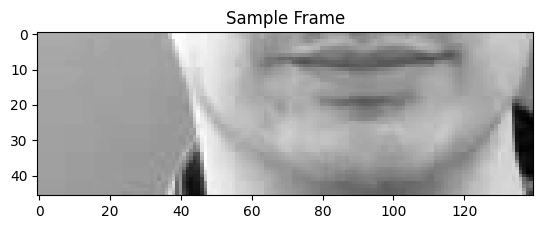

In [ ]:
def predict(model, frames, char_to_num_mapper):
    model.eval() 
    with torch.no_grad():
        frames = frames.unsqueeze(0).unsqueeze(0)
        frames = frames.to(device)

        outputs = model(frames) 

        predictions = torch.argmax(outputs, dim=-1)  

        
        pred_sequence = predictions[0].cpu()

        
        decoded_prediction = char_to_num_mapper.inverse(pred_sequence)

       
        final_text = ''
        prev_char = ''
        for char in decoded_prediction:
            if char != prev_char and char != '': 
                final_text += char
            prev_char = char

        return final_text


test_frames, test_alignments = next(iter(test_loader))
sample_frames = test_frames[0] 


predicted_text = predict(model, sample_frames, char_to_num)
actual_text = ''.join(char_to_num.inverse(test_alignments[0]))

print(f"Predicted text: {predicted_text}")
print(f"Actual text: {actual_text}")

plt.imshow(sample_frames[0].numpy(), cmap='gray')
plt.title("Sample Frame")
plt.show()